In [1]:
import pandas as pd
import sklearn
import os
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb
import geopandas
import datetime
data=pd.read_csv("D:/ML datasets/unzip files/renfe.csv")
data = data.dropna(axis=0,how='any')

We have imported the csv file and removed the rows containing the none value.

In [2]:
data['start_date']=pd.to_datetime(data['start_date'])
data['end_date']=pd.to_datetime(data['end_date'])
data['duration']=data['end_date']-data['start_date']
data['duration']=data['duration'].dt.total_seconds()/60
data['start_time']=data['start_date'].dt.time
data['end_time']=data['end_date'].dt.time
data['start_date']=data['start_date'].dt.date
data['end_date']=data['end_date'].dt.date
data.head()

,Unnamed: 0,insert_date,origin,destination,start_date,end_date,train_type,price,train_class,fare,duration,start_time,end_time
0,0,2019-04-19 05:31:43,MADRID,SEVILLA,2019-05-29,2019-05-29,AV City,38.55,Turista,Promo,176.0,06:20:00,09:16:00
1,1,2019-04-19 05:31:43,MADRID,SEVILLA,2019-05-29,2019-05-29,AVE,53.40,Turista,Promo,152.0,07:00:00,09:32:00
2,2,2019-04-19 05:31:43,MADRID,SEVILLA,2019-05-29,2019-05-29,AVE,47.30,Turista,Promo,141.0,07:30:00,09:51:00
3,3,2019-04-19 05:31:43,MADRID,SEVILLA,2019-05-29,2019-05-29,AVE,69.40,Preferente,Promo,152.0,08:00:00,10:32:00
5,5,2019-04-19 05:31:43,MADRID,SEVILLA,2019-05-29,2019-05-29,AVE,60.30,Turista,Promo,158.0,09:00:00,11:38:00


We have now obtain the start and end timing and date for each journey. We now remove excessive features.

In [3]:
data=data.drop(['Unnamed: 0','insert_date','end_time','end_date'], axis=1)
data.head()

,origin,destination,start_date,train_type,price,train_class,fare,duration,start_time
0,MADRID,SEVILLA,2019-05-29,AV City,38.55,Turista,Promo,176.0,06:20:00
1,MADRID,SEVILLA,2019-05-29,AVE,53.40,Turista,Promo,152.0,07:00:00
2,MADRID,SEVILLA,2019-05-29,AVE,47.30,Turista,Promo,141.0,07:30:00
3,MADRID,SEVILLA,2019-05-29,AVE,69.40,Preferente,Promo,152.0,08:00:00
5,MADRID,SEVILLA,2019-05-29,AVE,60.30,Turista,Promo,158.0,09:00:00


We will now obtained try to visvalize the data we have

In [4]:
loc=[]
for i in data.origin.unique():
    if i not in loc:
        loc.append(i)
for i in data.destination.unique():
    if i not in loc:
        loc.append(i)

In [5]:
from geopy.geocoders import Nominatim
app = Nominatim(user_agent="tutorial")
lat =[]
for i in loc:
    lat.append(app.geocode(i).raw)
data_1=pd.DataFrame(columns=["City","Lat","Lon"])
for i in range(0,len(loc)):
    data_1=data_1.append({"City":loc[i],"Lat":float(lat[i]['lat']),"Lon":float(lat[i]['lon'])},ignore_index=True)

In [6]:
world = geopandas.read_file(
    geopandas.datasets.get_path('naturalearth_lowres')
)
gdf = geopandas.GeoDataFrame(
    data_1, geometry=geopandas.points_from_xy(data_1.Lon, data_1.Lat))

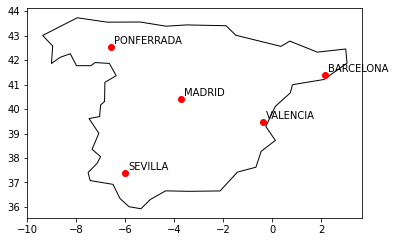

In [7]:
ax = world[world.name == 'Spain'].plot(
    color='white', edgecolor='black')

gdf.plot(ax=ax, color='red',label='City')
for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf.City):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")
plt.show()

We can clearly see the station on the maps

In [8]:
data['start_date']= pd.to_datetime(data['start_date'])
data['month']=data['start_date'].dt.month
data['day']=data['start_date'].dt.day
data['day_week']=data['start_date'].dt.day_name()
data=data.drop(['start_date'], axis=1)

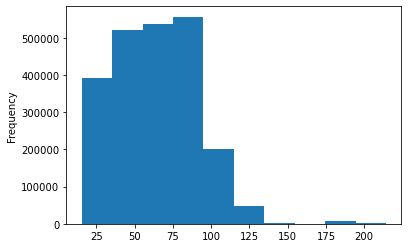

In [9]:
data.price.plot.hist()

In [10]:
data=data[data.fare !='Individual-Flexible']
data=data[data.fare !='Mesa']
data=data[data.fare !='Grupos Ida']

The above feature occurs in very small number and hence are remove 

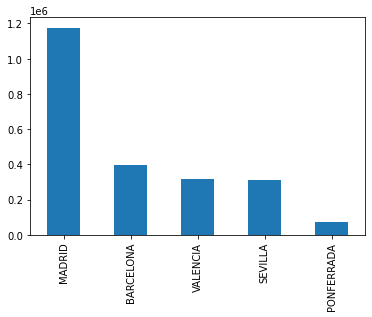

In [11]:
data.origin.value_counts().plot(kind='bar')

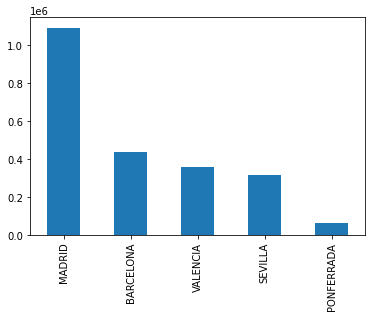

In [12]:
data.destination.value_counts().plot(kind='bar')

We can clearly see that Madrid is the most popular destination and orgin but a large margin

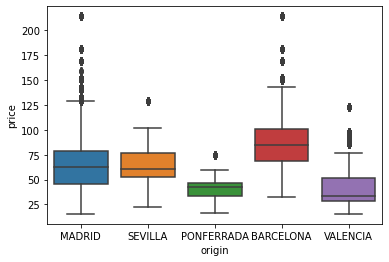

In [13]:
ax = sb.boxplot(x="origin", y="price", data=data)

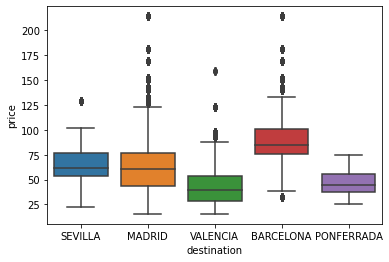

In [14]:
ax = sb.boxplot(x="destination", y="price", data=data)

We can clearly see that except for Barcelona, there is very little difference in price.

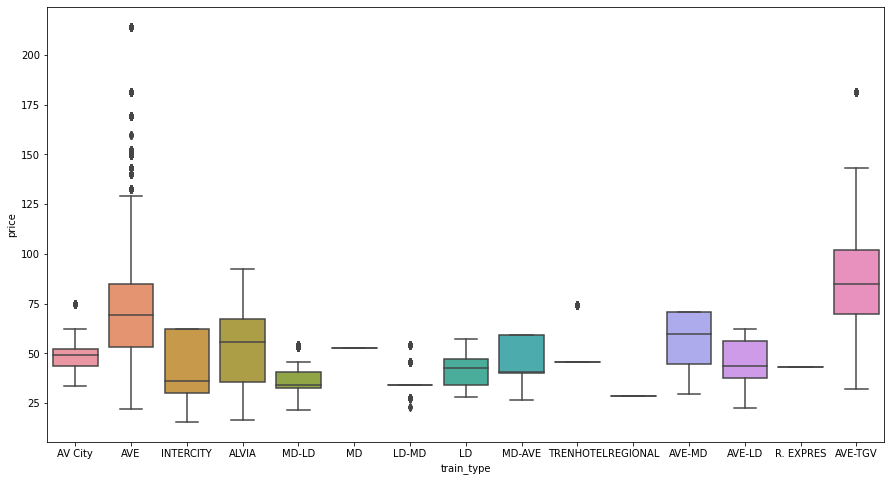

In [15]:
plt.figure(figsize=(15,8))
ax = sb.boxplot(x="train_type", y="price", data=data)

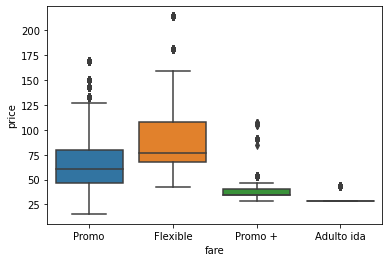

In [16]:
ax = sb.boxplot(x="fare", y="price", data=data)

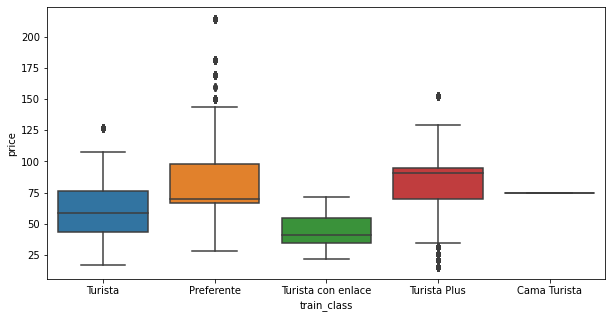

In [17]:
plt.figure(figsize=(10,5))
ax = sb.boxplot(x="train_class", y="price", data=data)

In [18]:
#Data Pre processing
data=data.drop(['duration','month','day','day_week','start_time'], axis=1)
data_d=pd.get_dummies(data)

In [19]:
data = data_d.values
y =data[:,0]
x= np.delete(data,0,1)
print("X shape :{} Y.shape:{}".format(x.shape,y.shape))

X shape :(2268830, 34) Y.shape:(2268830,)


In [20]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=42)

In [21]:
from sklearn.linear_model import LinearRegression
LR=LinearRegression().fit(x_train, y_train)
print("Training accuracy:{:.2f}".format(LR.score(x_train,y_train)))
print("Test accuracy:{:.2f}".format(LR.score(x_test,y_test)))
print("Linear Regression coefficients:{}".format(LR.coef_))
print("Linear Regression intercept:{}".format(LR.intercept_))

Training accuracy:0.82
Test accuracy:0.82
Linear Regression coefficients:[ 3.87614439e+09 -7.62058745e+09  3.87614436e+09  3.87614436e+09
  3.87614436e+09 -1.27049129e+10 -2.42016448e+10 -1.27049130e+10
 -1.27049130e+10 -1.27049130e+10 -1.99937088e+10 -1.99937088e+10
 -1.99937088e+10  3.09369170e+10  3.09369170e+10 -1.99937088e+10
 -1.99937088e+10  3.09369170e+10  3.09369170e+10  3.09369170e+10
  3.09369170e+10  3.09369170e+10  5.86417044e+10  5.86417044e+10
 -1.99937089e+10  1.26433207e+10  1.26433207e+10  1.26433207e+10
  1.26433207e+10 -3.82873052e+10 -6.75024092e+10  1.11330040e+10
  1.11330040e+10  1.11330040e+10]
Linear Regression intercept:16542884634.84504


In [22]:
from yellowbrick.regressor import ResidualsPlot

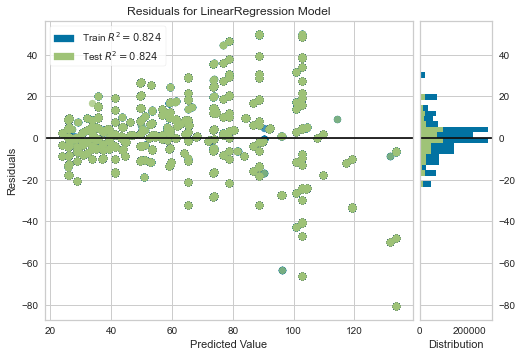

In [23]:
la=LinearRegression()
visualizer = ResidualsPlot(la)
visualizer.fit(x_train, y_train)  # Fit the training data to the visualizer
visualizer.score(x_test, y_test)  # Evaluate the model on the test data
visualizer.show()                 # Finalize and render the figure

We can say that the linear regressing model can account for 82% of the variation in the data

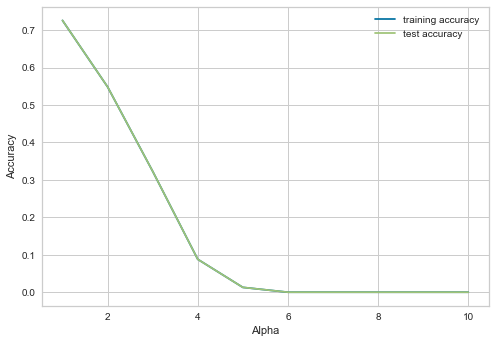

In [24]:
from sklearn.linear_model import Lasso
training_accuracy=[]
test_accuracy=[]
i=range(1,11)
for a in i:
    la=Lasso(alpha=a).fit(x_train,y_train)
    training_accuracy.append(la.score(x_train,y_train))
    test_accuracy.append(la.score(x_test,y_test))
plt.plot(i,training_accuracy,label="training accuracy")
plt.plot(i,test_accuracy,label="test accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Alpha")
plt.legend()
plt.show()

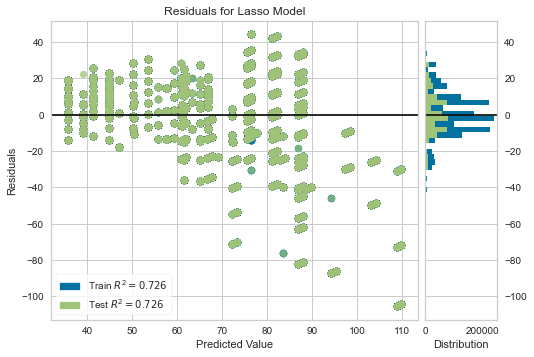

In [25]:
la=Lasso(alpha=1)
visualizer = ResidualsPlot(la)
visualizer.fit(x_train, y_train)  # Fit the training data to the visualizer
visualizer.score(x_test, y_test)  # Evaluate the model on the test data
visualizer.show()                 # Finalize and render the figure

Lasso can only account for 72% of varaition in the data and is inferior to the linear regression model.

In [26]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
torch.cuda.is_available()

True

In [27]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(34, 17)
        self.fc2 = nn.Linear(17, 4)
        self.fc3 = nn.Linear(4, 1)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        return x

model = Net()
device = torch.device('cuda')
model.to(device)
print(model)

Net(
  (fc1): Linear(in_features=34, out_features=17, bias=True)
  (fc2): Linear(in_features=17, out_features=4, bias=True)
  (fc3): Linear(in_features=4, out_features=1, bias=True)
)


In [28]:
torch.cuda.get_device_name(0)

'GeForce GTX 1650'

In [29]:
 # Define the loss function and optimizer
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

In [30]:
from torch.utils.data import Dataset

In [31]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
y=y.reshape(-1, 1)
y=MinMaxScaler().fit_transform(y)
y=StandardScaler().fit_transform(y)

In [32]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=42)

In [33]:
x_train = torch.from_numpy(x_train.astype(np.float32))
y_train = torch.from_numpy(y_train.astype(np.float32))

In [34]:
params = {'batch_size': 64,
          'shuffle': True,
          'num_workers': 6}
training_set=torch.utils.data.TensorDataset(x_train,y_train)
training_generator = torch.utils.data.DataLoader(training_set, **params)

In [35]:
num_epochs = 11
losses=[]
Loss_y=[]
Epoch_x=[]
for epoch in range(num_epochs):
    batch=0
    running_loss = 0.0
    for xb, yb in training_generator:
        xb=xb.to(device)
        yb=yb.to(device)
        #forward feed
        y_pred = model(xb.requires_grad_())

        #calculate the loss
        loss= loss_function(y_pred, yb)

        #backward propagation: calculate gradients
        loss.backward()

        #update the weights
        optimizer.step()

        #clear out the gradients from the last step loss.backward()
        optimizer.zero_grad()
        batch+=1
        running_loss += loss.item()
        Epoch_x.append(float(epoch+(batch/len(training_generator))))
        Loss_y.append(float(loss.item()))
        print('epoch {}, batch {}, loss {}'.format(epoch, batch,loss.item()))
    epoch_loss = running_loss / len(training_generator)
    losses.append(epoch_loss)

epoch 0, batch 1, loss 1.0025486946105957
epoch 0, batch 2, loss 1.3262003660202026
epoch 0, batch 3, loss 1.022860050201416
epoch 0, batch 4, loss 0.8485838174819946
epoch 0, batch 5, loss 1.4684052467346191
epoch 0, batch 6, loss 1.0897315740585327
epoch 0, batch 7, loss 0.9863725900650024
epoch 0, batch 8, loss 1.022197961807251
epoch 0, batch 9, loss 1.01176917552948
epoch 0, batch 10, loss 0.9960362911224365
epoch 0, batch 11, loss 1.2108193635940552
epoch 0, batch 12, loss 1.1329632997512817
epoch 0, batch 13, loss 1.8232942819595337
epoch 0, batch 14, loss 1.0566997528076172
epoch 0, batch 15, loss 1.1917002201080322
epoch 0, batch 16, loss 1.1320061683654785
epoch 0, batch 17, loss 1.1638813018798828
epoch 0, batch 18, loss 0.7941784858703613
epoch 0, batch 19, loss 1.0471299886703491
epoch 0, batch 20, loss 1.030622959136963
epoch 0, batch 21, loss 1.0723257064819336
epoch 0, batch 22, loss 1.035287857055664
epoch 0, batch 23, loss 1.0552096366882324
epoch 0, batch 24, loss 1.

epoch 0, batch 216, loss 1.0040576457977295
epoch 0, batch 217, loss 1.1388845443725586
epoch 0, batch 218, loss 0.8899739980697632
epoch 0, batch 219, loss 1.0392603874206543
epoch 0, batch 220, loss 1.1233872175216675
epoch 0, batch 221, loss 1.0216703414916992
epoch 0, batch 222, loss 1.0893231630325317
epoch 0, batch 223, loss 1.20991849899292
epoch 0, batch 224, loss 1.1236413717269897
epoch 0, batch 225, loss 1.1495215892791748
epoch 0, batch 226, loss 1.2022804021835327
epoch 0, batch 227, loss 1.003185510635376
epoch 0, batch 228, loss 0.9980040788650513
epoch 0, batch 229, loss 1.299924373626709
epoch 0, batch 230, loss 1.0697910785675049
epoch 0, batch 231, loss 0.9929698705673218
epoch 0, batch 232, loss 1.1826858520507812
epoch 0, batch 233, loss 1.316954255104065
epoch 0, batch 234, loss 0.9691259264945984
epoch 0, batch 235, loss 0.8233721256256104
epoch 0, batch 236, loss 1.000133752822876
epoch 0, batch 237, loss 1.2674107551574707
epoch 0, batch 238, loss 1.23737859725

epoch 0, batch 428, loss 1.1635487079620361
epoch 0, batch 429, loss 0.8926079273223877
epoch 0, batch 430, loss 1.4619250297546387
epoch 0, batch 431, loss 0.7728293538093567
epoch 0, batch 432, loss 0.9148905277252197
epoch 0, batch 433, loss 0.9371798038482666
epoch 0, batch 434, loss 1.2900515794754028
epoch 0, batch 435, loss 1.0924807786941528
epoch 0, batch 436, loss 0.999600887298584
epoch 0, batch 437, loss 0.8311594128608704
epoch 0, batch 438, loss 0.9634906053543091
epoch 0, batch 439, loss 1.1889806985855103
epoch 0, batch 440, loss 0.9845530986785889
epoch 0, batch 441, loss 1.050065517425537
epoch 0, batch 442, loss 0.6883200407028198
epoch 0, batch 443, loss 1.0503544807434082
epoch 0, batch 444, loss 0.7721097469329834
epoch 0, batch 445, loss 0.9130567908287048
epoch 0, batch 446, loss 0.8655807971954346
epoch 0, batch 447, loss 1.7883360385894775
epoch 0, batch 448, loss 1.0828263759613037
epoch 0, batch 449, loss 0.9840039014816284
epoch 0, batch 450, loss 1.2976965

epoch 0, batch 630, loss 0.8649572134017944
epoch 0, batch 631, loss 0.9173005223274231
epoch 0, batch 632, loss 0.9487821459770203
epoch 0, batch 633, loss 1.0156158208847046
epoch 0, batch 634, loss 0.7184184789657593
epoch 0, batch 635, loss 1.1171979904174805
epoch 0, batch 636, loss 1.000617504119873
epoch 0, batch 637, loss 1.1931071281433105
epoch 0, batch 638, loss 0.9699878692626953
epoch 0, batch 639, loss 1.1266813278198242
epoch 0, batch 640, loss 0.8964437246322632
epoch 0, batch 641, loss 1.0439324378967285
epoch 0, batch 642, loss 0.9197527170181274
epoch 0, batch 643, loss 1.0281739234924316
epoch 0, batch 644, loss 0.7722423672676086
epoch 0, batch 645, loss 1.0760178565979004
epoch 0, batch 646, loss 0.857853889465332
epoch 0, batch 647, loss 1.0574846267700195
epoch 0, batch 648, loss 0.900694727897644
epoch 0, batch 649, loss 0.9370578527450562
epoch 0, batch 650, loss 0.6582412719726562
epoch 0, batch 651, loss 0.7930963039398193
epoch 0, batch 652, loss 0.72926622

epoch 0, batch 836, loss 0.5422841310501099
epoch 0, batch 837, loss 0.7194148898124695
epoch 0, batch 838, loss 0.9134694337844849
epoch 0, batch 839, loss 0.793712854385376
epoch 0, batch 840, loss 0.8651398420333862
epoch 0, batch 841, loss 0.7650881409645081
epoch 0, batch 842, loss 1.0621933937072754
epoch 0, batch 843, loss 0.8993918895721436
epoch 0, batch 844, loss 0.7593953609466553
epoch 0, batch 845, loss 0.628929853439331
epoch 0, batch 846, loss 0.8172515630722046
epoch 0, batch 847, loss 0.8234934210777283
epoch 0, batch 848, loss 1.131174921989441
epoch 0, batch 849, loss 0.7998867034912109
epoch 0, batch 850, loss 0.6073803901672363
epoch 0, batch 851, loss 0.9114110469818115
epoch 0, batch 852, loss 0.914694607257843
epoch 0, batch 853, loss 0.9755942821502686
epoch 0, batch 854, loss 0.8687671422958374
epoch 0, batch 855, loss 0.7609929442405701
epoch 0, batch 856, loss 1.0670106410980225
epoch 0, batch 857, loss 0.8253778219223022
epoch 0, batch 858, loss 0.626930952

epoch 0, batch 1046, loss 0.6295046806335449
epoch 0, batch 1047, loss 0.858371913433075
epoch 0, batch 1048, loss 0.6784688234329224
epoch 0, batch 1049, loss 0.6007227301597595
epoch 0, batch 1050, loss 0.6394780874252319
epoch 0, batch 1051, loss 0.6385372877120972
epoch 0, batch 1052, loss 0.6773841381072998
epoch 0, batch 1053, loss 0.6403419971466064
epoch 0, batch 1054, loss 0.4849151372909546
epoch 0, batch 1055, loss 0.8341537714004517
epoch 0, batch 1056, loss 0.7248226404190063
epoch 0, batch 1057, loss 0.7946224808692932
epoch 0, batch 1058, loss 0.8490698337554932
epoch 0, batch 1059, loss 0.9798543453216553
epoch 0, batch 1060, loss 0.6629377603530884
epoch 0, batch 1061, loss 0.6361154317855835
epoch 0, batch 1062, loss 0.9130632877349854
epoch 0, batch 1063, loss 0.8303686380386353
epoch 0, batch 1064, loss 0.8753834962844849
epoch 0, batch 1065, loss 0.609372615814209
epoch 0, batch 1066, loss 0.9054662585258484
epoch 0, batch 1067, loss 0.8783246874809265
epoch 0, bat

epoch 0, batch 1253, loss 0.7797790765762329
epoch 0, batch 1254, loss 0.5444028377532959
epoch 0, batch 1255, loss 0.4951433837413788
epoch 0, batch 1256, loss 0.3935604393482208
epoch 0, batch 1257, loss 0.917910099029541
epoch 0, batch 1258, loss 0.43995827436447144
epoch 0, batch 1259, loss 0.6761767268180847
epoch 0, batch 1260, loss 0.8231735229492188
epoch 0, batch 1261, loss 0.5249914526939392
epoch 0, batch 1262, loss 0.5471407175064087
epoch 0, batch 1263, loss 0.552112340927124
epoch 0, batch 1264, loss 0.9409174919128418
epoch 0, batch 1265, loss 0.6645975112915039
epoch 0, batch 1266, loss 0.46481695771217346
epoch 0, batch 1267, loss 0.4582909345626831
epoch 0, batch 1268, loss 0.6166920065879822
epoch 0, batch 1269, loss 0.6342962384223938
epoch 0, batch 1270, loss 0.5488802194595337
epoch 0, batch 1271, loss 0.6935640573501587
epoch 0, batch 1272, loss 0.668402373790741
epoch 0, batch 1273, loss 0.6908859610557556
epoch 0, batch 1274, loss 0.6516599059104919
epoch 0, ba

epoch 0, batch 1449, loss 0.6394952535629272
epoch 0, batch 1450, loss 0.6454786062240601
epoch 0, batch 1451, loss 0.513130784034729
epoch 0, batch 1452, loss 0.4951684772968292
epoch 0, batch 1453, loss 0.498320072889328
epoch 0, batch 1454, loss 0.5528989434242249
epoch 0, batch 1455, loss 0.7159383296966553
epoch 0, batch 1456, loss 0.9948102235794067
epoch 0, batch 1457, loss 0.725229024887085
epoch 0, batch 1458, loss 0.3777145743370056
epoch 0, batch 1459, loss 0.8187317848205566
epoch 0, batch 1460, loss 0.729478120803833
epoch 0, batch 1461, loss 0.6053960919380188
epoch 0, batch 1462, loss 0.5521887540817261
epoch 0, batch 1463, loss 0.7785754203796387
epoch 0, batch 1464, loss 0.7019332647323608
epoch 0, batch 1465, loss 0.879660964012146
epoch 0, batch 1466, loss 0.6870763301849365
epoch 0, batch 1467, loss 0.5671248435974121
epoch 0, batch 1468, loss 0.7318984866142273
epoch 0, batch 1469, loss 1.0229525566101074
epoch 0, batch 1470, loss 0.722557544708252
epoch 0, batch 1

epoch 0, batch 1664, loss 0.7061900496482849
epoch 0, batch 1665, loss 0.5003361701965332
epoch 0, batch 1666, loss 0.9753913283348083
epoch 0, batch 1667, loss 0.5085875988006592
epoch 0, batch 1668, loss 0.5413368344306946
epoch 0, batch 1669, loss 0.6229700446128845
epoch 0, batch 1670, loss 0.5980947017669678
epoch 0, batch 1671, loss 0.3828735947608948
epoch 0, batch 1672, loss 0.5497036576271057
epoch 0, batch 1673, loss 0.5927154421806335
epoch 0, batch 1674, loss 0.5726871490478516
epoch 0, batch 1675, loss 0.5025246143341064
epoch 0, batch 1676, loss 0.5861141681671143
epoch 0, batch 1677, loss 0.5308142304420471
epoch 0, batch 1678, loss 0.609703540802002
epoch 0, batch 1679, loss 0.7221475839614868
epoch 0, batch 1680, loss 0.6584028005599976
epoch 0, batch 1681, loss 0.5336408615112305
epoch 0, batch 1682, loss 0.5353243350982666
epoch 0, batch 1683, loss 0.6344918608665466
epoch 0, batch 1684, loss 0.5625393390655518
epoch 0, batch 1685, loss 0.6582554578781128
epoch 0, ba

epoch 0, batch 1866, loss 0.6188653707504272
epoch 0, batch 1867, loss 0.6252875924110413
epoch 0, batch 1868, loss 0.5164769887924194
epoch 0, batch 1869, loss 0.5069279670715332
epoch 0, batch 1870, loss 0.4688628613948822
epoch 0, batch 1871, loss 0.5468579530715942
epoch 0, batch 1872, loss 0.6251605749130249
epoch 0, batch 1873, loss 0.8029309511184692
epoch 0, batch 1874, loss 0.7311065196990967
epoch 0, batch 1875, loss 0.7119209170341492
epoch 0, batch 1876, loss 0.6049509048461914
epoch 0, batch 1877, loss 0.5169609189033508
epoch 0, batch 1878, loss 0.5733543634414673
epoch 0, batch 1879, loss 0.7596478462219238
epoch 0, batch 1880, loss 0.574999213218689
epoch 0, batch 1881, loss 0.5388047695159912
epoch 0, batch 1882, loss 0.5985443592071533
epoch 0, batch 1883, loss 0.5265035629272461
epoch 0, batch 1884, loss 0.46939969062805176
epoch 0, batch 1885, loss 0.5649172067642212
epoch 0, batch 1886, loss 0.4836810827255249
epoch 0, batch 1887, loss 0.8067612051963806
epoch 0, b

epoch 0, batch 2072, loss 0.4597196877002716
epoch 0, batch 2073, loss 0.5392783880233765
epoch 0, batch 2074, loss 0.49987441301345825
epoch 0, batch 2075, loss 0.6578599810600281
epoch 0, batch 2076, loss 0.555561900138855
epoch 0, batch 2077, loss 0.5711084604263306
epoch 0, batch 2078, loss 0.3863699734210968
epoch 0, batch 2079, loss 0.5999518632888794
epoch 0, batch 2080, loss 0.5595122575759888
epoch 0, batch 2081, loss 0.6732226014137268
epoch 0, batch 2082, loss 0.4740343391895294
epoch 0, batch 2083, loss 0.47765782475471497
epoch 0, batch 2084, loss 0.3575679659843445
epoch 0, batch 2085, loss 0.5925024747848511
epoch 0, batch 2086, loss 0.7206017971038818
epoch 0, batch 2087, loss 0.5802744030952454
epoch 0, batch 2088, loss 0.4953446388244629
epoch 0, batch 2089, loss 0.5085172057151794
epoch 0, batch 2090, loss 0.5327310562133789
epoch 0, batch 2091, loss 0.5460046529769897
epoch 0, batch 2092, loss 0.46603304147720337
epoch 0, batch 2093, loss 0.4310668706893921
epoch 0,

epoch 0, batch 2275, loss 0.7747581005096436
epoch 0, batch 2276, loss 0.5486965775489807
epoch 0, batch 2277, loss 0.4802680015563965
epoch 0, batch 2278, loss 0.7664602994918823
epoch 0, batch 2279, loss 0.5106124877929688
epoch 0, batch 2280, loss 0.4341655373573303
epoch 0, batch 2281, loss 0.40013355016708374
epoch 0, batch 2282, loss 0.515007495880127
epoch 0, batch 2283, loss 0.5014510750770569
epoch 0, batch 2284, loss 0.5913439989089966
epoch 0, batch 2285, loss 0.5880008339881897
epoch 0, batch 2286, loss 0.4030771553516388
epoch 0, batch 2287, loss 0.8256485462188721
epoch 0, batch 2288, loss 0.48574507236480713
epoch 0, batch 2289, loss 0.5482914447784424
epoch 0, batch 2290, loss 0.5836656093597412
epoch 0, batch 2291, loss 0.7156076431274414
epoch 0, batch 2292, loss 0.5217611193656921
epoch 0, batch 2293, loss 0.4503077268600464
epoch 0, batch 2294, loss 0.6336820125579834
epoch 0, batch 2295, loss 0.53278648853302
epoch 0, batch 2296, loss 0.645862340927124
epoch 0, bat

epoch 0, batch 2471, loss 0.5783666372299194
epoch 0, batch 2472, loss 0.6696832776069641
epoch 0, batch 2473, loss 0.5403953790664673
epoch 0, batch 2474, loss 0.6308155059814453
epoch 0, batch 2475, loss 0.4972737431526184
epoch 0, batch 2476, loss 0.45654746890068054
epoch 0, batch 2477, loss 0.4495857357978821
epoch 0, batch 2478, loss 0.5117169618606567
epoch 0, batch 2479, loss 0.7499425411224365
epoch 0, batch 2480, loss 0.4541575610637665
epoch 0, batch 2481, loss 0.6111973524093628
epoch 0, batch 2482, loss 0.7289333343505859
epoch 0, batch 2483, loss 0.5507731437683105
epoch 0, batch 2484, loss 0.49455687403678894
epoch 0, batch 2485, loss 0.4893617630004883
epoch 0, batch 2486, loss 0.46414080262184143
epoch 0, batch 2487, loss 0.8097875714302063
epoch 0, batch 2488, loss 0.5648298859596252
epoch 0, batch 2489, loss 0.6019026041030884
epoch 0, batch 2490, loss 0.5686129927635193
epoch 0, batch 2491, loss 0.47136321663856506
epoch 0, batch 2492, loss 0.48182711005210876
epoch

epoch 0, batch 2682, loss 0.43875572085380554
epoch 0, batch 2683, loss 0.5273709297180176
epoch 0, batch 2684, loss 0.46811893582344055
epoch 0, batch 2685, loss 0.5748990774154663
epoch 0, batch 2686, loss 0.5425817966461182
epoch 0, batch 2687, loss 0.4168606400489807
epoch 0, batch 2688, loss 0.8689360022544861
epoch 0, batch 2689, loss 0.7501895427703857
epoch 0, batch 2690, loss 0.5524334907531738
epoch 0, batch 2691, loss 0.44672515988349915
epoch 0, batch 2692, loss 0.48277077078819275
epoch 0, batch 2693, loss 0.6385458707809448
epoch 0, batch 2694, loss 0.9278756380081177
epoch 0, batch 2695, loss 0.5524226427078247
epoch 0, batch 2696, loss 0.5531919002532959
epoch 0, batch 2697, loss 0.6232832670211792
epoch 0, batch 2698, loss 0.527686357498169
epoch 0, batch 2699, loss 0.4545545279979706
epoch 0, batch 2700, loss 0.5946111083030701
epoch 0, batch 2701, loss 0.5660684108734131
epoch 0, batch 2702, loss 0.42517444491386414
epoch 0, batch 2703, loss 0.4714617133140564
epoch 

epoch 0, batch 2877, loss 0.5906513929367065
epoch 0, batch 2878, loss 0.4921228289604187
epoch 0, batch 2879, loss 0.5485836267471313
epoch 0, batch 2880, loss 0.5362493991851807
epoch 0, batch 2881, loss 0.6014955043792725
epoch 0, batch 2882, loss 0.5871593356132507
epoch 0, batch 2883, loss 0.5483942031860352
epoch 0, batch 2884, loss 0.5084898471832275
epoch 0, batch 2885, loss 0.4352809190750122
epoch 0, batch 2886, loss 0.577079176902771
epoch 0, batch 2887, loss 0.5692156553268433
epoch 0, batch 2888, loss 0.42732617259025574
epoch 0, batch 2889, loss 0.5532926321029663
epoch 0, batch 2890, loss 0.4271010160446167
epoch 0, batch 2891, loss 0.5263882875442505
epoch 0, batch 2892, loss 0.6859235167503357
epoch 0, batch 2893, loss 0.5487711429595947
epoch 0, batch 2894, loss 0.7318337559700012
epoch 0, batch 2895, loss 0.45796605944633484
epoch 0, batch 2896, loss 0.5052689909934998
epoch 0, batch 2897, loss 0.6845150589942932
epoch 0, batch 2898, loss 0.5154398083686829
epoch 0, 

epoch 0, batch 3080, loss 0.40751954913139343
epoch 0, batch 3081, loss 0.49428027868270874
epoch 0, batch 3082, loss 0.5135018229484558
epoch 0, batch 3083, loss 0.5562383532524109
epoch 0, batch 3084, loss 0.726727306842804
epoch 0, batch 3085, loss 0.6058738231658936
epoch 0, batch 3086, loss 0.4529247581958771
epoch 0, batch 3087, loss 0.7670276165008545
epoch 0, batch 3088, loss 0.6388872861862183
epoch 0, batch 3089, loss 0.666083037853241
epoch 0, batch 3090, loss 0.6325714588165283
epoch 0, batch 3091, loss 0.49977895617485046
epoch 0, batch 3092, loss 0.4976569712162018
epoch 0, batch 3093, loss 0.983853280544281
epoch 0, batch 3094, loss 0.4611188471317291
epoch 0, batch 3095, loss 0.6048380136489868
epoch 0, batch 3096, loss 0.5041127800941467
epoch 0, batch 3097, loss 0.7014893293380737
epoch 0, batch 3098, loss 0.6766585111618042
epoch 0, batch 3099, loss 0.5696854591369629
epoch 0, batch 3100, loss 0.5307930707931519
epoch 0, batch 3101, loss 0.5241836309432983
epoch 0, b

epoch 0, batch 3285, loss 0.7095187902450562
epoch 0, batch 3286, loss 0.49069660902023315
epoch 0, batch 3287, loss 0.5046846270561218
epoch 0, batch 3288, loss 0.42712199687957764
epoch 0, batch 3289, loss 0.511035680770874
epoch 0, batch 3290, loss 0.6466751098632812
epoch 0, batch 3291, loss 0.4145420491695404
epoch 0, batch 3292, loss 0.6337244510650635
epoch 0, batch 3293, loss 0.516151487827301
epoch 0, batch 3294, loss 0.47403770685195923
epoch 0, batch 3295, loss 0.6871646642684937
epoch 0, batch 3296, loss 0.5477190017700195
epoch 0, batch 3297, loss 0.7283573150634766
epoch 0, batch 3298, loss 0.7963284254074097
epoch 0, batch 3299, loss 0.5830981135368347
epoch 0, batch 3300, loss 0.5455976724624634
epoch 0, batch 3301, loss 0.545170783996582
epoch 0, batch 3302, loss 0.5858577489852905
epoch 0, batch 3303, loss 0.5303666591644287
epoch 0, batch 3304, loss 0.5588156580924988
epoch 0, batch 3305, loss 0.5007267594337463
epoch 0, batch 3306, loss 0.39556583762168884
epoch 0, 

epoch 0, batch 3488, loss 0.7754453420639038
epoch 0, batch 3489, loss 0.4778425693511963
epoch 0, batch 3490, loss 0.5276105403900146
epoch 0, batch 3491, loss 0.6068868637084961
epoch 0, batch 3492, loss 0.47843506932258606
epoch 0, batch 3493, loss 0.40205398201942444
epoch 0, batch 3494, loss 0.49783995747566223
epoch 0, batch 3495, loss 0.6682698726654053
epoch 0, batch 3496, loss 0.6978719234466553
epoch 0, batch 3497, loss 0.4347161054611206
epoch 0, batch 3498, loss 0.46955201029777527
epoch 0, batch 3499, loss 0.5095572471618652
epoch 0, batch 3500, loss 0.5341406464576721
epoch 0, batch 3501, loss 0.48672616481781006
epoch 0, batch 3502, loss 0.6091699600219727
epoch 0, batch 3503, loss 0.48190662264823914
epoch 0, batch 3504, loss 0.4658907651901245
epoch 0, batch 3505, loss 0.5117907524108887
epoch 0, batch 3506, loss 0.533008873462677
epoch 0, batch 3507, loss 0.5423624515533447
epoch 0, batch 3508, loss 0.4384723901748657
epoch 0, batch 3509, loss 0.29465025663375854
epoc

epoch 0, batch 3684, loss 0.39027270674705505
epoch 0, batch 3685, loss 0.5662273168563843
epoch 0, batch 3686, loss 0.4958937168121338
epoch 0, batch 3687, loss 0.39729923009872437
epoch 0, batch 3688, loss 0.6349105834960938
epoch 0, batch 3689, loss 0.48600107431411743
epoch 0, batch 3690, loss 0.5018582344055176
epoch 0, batch 3691, loss 0.4864443242549896
epoch 0, batch 3692, loss 0.40623825788497925
epoch 0, batch 3693, loss 0.5394181609153748
epoch 0, batch 3694, loss 0.5417976379394531
epoch 0, batch 3695, loss 0.5549083948135376
epoch 0, batch 3696, loss 0.5838419795036316
epoch 0, batch 3697, loss 0.5572643876075745
epoch 0, batch 3698, loss 0.5955106019973755
epoch 0, batch 3699, loss 0.5962749719619751
epoch 0, batch 3700, loss 0.5957684516906738
epoch 0, batch 3701, loss 0.48564669489860535
epoch 0, batch 3702, loss 0.762986421585083
epoch 0, batch 3703, loss 0.5037485361099243
epoch 0, batch 3704, loss 0.5071631073951721
epoch 0, batch 3705, loss 0.7640137672424316
epoch 

epoch 0, batch 3897, loss 0.4970661997795105
epoch 0, batch 3898, loss 0.6119408011436462
epoch 0, batch 3899, loss 0.5811646580696106
epoch 0, batch 3900, loss 0.5104956030845642
epoch 0, batch 3901, loss 0.5298625826835632
epoch 0, batch 3902, loss 0.5289838314056396
epoch 0, batch 3903, loss 0.5677627325057983
epoch 0, batch 3904, loss 0.47612056136131287
epoch 0, batch 3905, loss 0.5293927192687988
epoch 0, batch 3906, loss 0.6762582063674927
epoch 0, batch 3907, loss 0.5302499532699585
epoch 0, batch 3908, loss 0.538548469543457
epoch 0, batch 3909, loss 0.6208578944206238
epoch 0, batch 3910, loss 0.6931096315383911
epoch 0, batch 3911, loss 0.5265648365020752
epoch 0, batch 3912, loss 0.45956677198410034
epoch 0, batch 3913, loss 0.7594447135925293
epoch 0, batch 3914, loss 0.45100921392440796
epoch 0, batch 3915, loss 0.5485037565231323
epoch 0, batch 3916, loss 0.5355633497238159
epoch 0, batch 3917, loss 0.49286723136901855
epoch 0, batch 3918, loss 0.420074462890625
epoch 0,

epoch 0, batch 4102, loss 0.40138858556747437
epoch 0, batch 4103, loss 0.5781353116035461
epoch 0, batch 4104, loss 0.3819649815559387
epoch 0, batch 4105, loss 0.6598337888717651
epoch 0, batch 4106, loss 0.5112818479537964
epoch 0, batch 4107, loss 0.8196419477462769
epoch 0, batch 4108, loss 0.41855287551879883
epoch 0, batch 4109, loss 0.372877836227417
epoch 0, batch 4110, loss 0.5093567371368408
epoch 0, batch 4111, loss 0.3353201150894165
epoch 0, batch 4112, loss 0.600157618522644
epoch 0, batch 4113, loss 0.5241738557815552
epoch 0, batch 4114, loss 0.5163211822509766
epoch 0, batch 4115, loss 0.4791276752948761
epoch 0, batch 4116, loss 0.60381019115448
epoch 0, batch 4117, loss 0.5175238847732544
epoch 0, batch 4118, loss 0.4635547995567322
epoch 0, batch 4119, loss 0.3689528703689575
epoch 0, batch 4120, loss 0.5900273323059082
epoch 0, batch 4121, loss 0.5226423740386963
epoch 0, batch 4122, loss 0.5906276702880859
epoch 0, batch 4123, loss 0.5007932782173157
epoch 0, bat

epoch 0, batch 4298, loss 0.59317547082901
epoch 0, batch 4299, loss 0.6934280395507812
epoch 0, batch 4300, loss 0.7561140060424805
epoch 0, batch 4301, loss 0.5078637599945068
epoch 0, batch 4302, loss 0.695353627204895
epoch 0, batch 4303, loss 0.4168422520160675
epoch 0, batch 4304, loss 0.45021164417266846
epoch 0, batch 4305, loss 0.6757450103759766
epoch 0, batch 4306, loss 0.6512645483016968
epoch 0, batch 4307, loss 0.4057426452636719
epoch 0, batch 4308, loss 0.569927453994751
epoch 0, batch 4309, loss 0.5120887160301208
epoch 0, batch 4310, loss 0.4930843114852905
epoch 0, batch 4311, loss 0.33166825771331787
epoch 0, batch 4312, loss 0.5232141613960266
epoch 0, batch 4313, loss 0.4905409812927246
epoch 0, batch 4314, loss 0.4429265558719635
epoch 0, batch 4315, loss 0.5459941625595093
epoch 0, batch 4316, loss 0.5185720920562744
epoch 0, batch 4317, loss 0.5262840986251831
epoch 0, batch 4318, loss 0.5548186898231506
epoch 0, batch 4319, loss 0.52040696144104
epoch 0, batch

epoch 0, batch 4492, loss 0.41320353746414185
epoch 0, batch 4493, loss 0.6106501817703247
epoch 0, batch 4494, loss 0.7741460800170898
epoch 0, batch 4495, loss 0.5630600452423096
epoch 0, batch 4496, loss 0.5553270578384399
epoch 0, batch 4497, loss 0.3827515244483948
epoch 0, batch 4498, loss 0.4028680622577667
epoch 0, batch 4499, loss 0.5787723064422607
epoch 0, batch 4500, loss 0.7013586759567261
epoch 0, batch 4501, loss 0.5249830484390259
epoch 0, batch 4502, loss 0.4810921549797058
epoch 0, batch 4503, loss 0.5640648603439331
epoch 0, batch 4504, loss 0.6440677046775818
epoch 0, batch 4505, loss 0.5059460401535034
epoch 0, batch 4506, loss 0.6526045799255371
epoch 0, batch 4507, loss 0.7087938785552979
epoch 0, batch 4508, loss 0.5832898020744324
epoch 0, batch 4509, loss 0.5287257432937622
epoch 0, batch 4510, loss 0.4870738983154297
epoch 0, batch 4511, loss 0.4136933982372284
epoch 0, batch 4512, loss 0.5559882521629333
epoch 0, batch 4513, loss 0.48798152804374695
epoch 0,

epoch 0, batch 4690, loss 0.41206854581832886
epoch 0, batch 4691, loss 0.3786039352416992
epoch 0, batch 4692, loss 0.5124900341033936
epoch 0, batch 4693, loss 0.5332131385803223
epoch 0, batch 4694, loss 0.5422431230545044
epoch 0, batch 4695, loss 0.6161499619483948
epoch 0, batch 4696, loss 0.5675513744354248
epoch 0, batch 4697, loss 0.3220551609992981
epoch 0, batch 4698, loss 0.5792167782783508
epoch 0, batch 4699, loss 0.5056809782981873
epoch 0, batch 4700, loss 0.5792950391769409
epoch 0, batch 4701, loss 0.741595983505249
epoch 0, batch 4702, loss 0.48599645495414734
epoch 0, batch 4703, loss 0.5343542098999023
epoch 0, batch 4704, loss 0.6412143707275391
epoch 0, batch 4705, loss 0.6150074601173401
epoch 0, batch 4706, loss 0.5816083550453186
epoch 0, batch 4707, loss 0.5197678804397583
epoch 0, batch 4708, loss 0.45489034056663513
epoch 0, batch 4709, loss 0.5585259199142456
epoch 0, batch 4710, loss 0.7379395961761475
epoch 0, batch 4711, loss 0.5259625911712646
epoch 0,

epoch 0, batch 4888, loss 0.4891599714756012
epoch 0, batch 4889, loss 0.6259770393371582
epoch 0, batch 4890, loss 0.5699215531349182
epoch 0, batch 4891, loss 0.5756410360336304
epoch 0, batch 4892, loss 0.668326199054718
epoch 0, batch 4893, loss 0.5533562302589417
epoch 0, batch 4894, loss 0.4647839069366455
epoch 0, batch 4895, loss 0.6237573027610779
epoch 0, batch 4896, loss 0.7022206783294678
epoch 0, batch 4897, loss 0.5478203296661377
epoch 0, batch 4898, loss 0.4743373394012451
epoch 0, batch 4899, loss 0.48974892497062683
epoch 0, batch 4900, loss 0.7875016927719116
epoch 0, batch 4901, loss 0.4718172550201416
epoch 0, batch 4902, loss 0.5412594079971313
epoch 0, batch 4903, loss 0.39469650387763977
epoch 0, batch 4904, loss 0.513809084892273
epoch 0, batch 4905, loss 0.5060699582099915
epoch 0, batch 4906, loss 0.5762155055999756
epoch 0, batch 4907, loss 0.5584911704063416
epoch 0, batch 4908, loss 0.621731698513031
epoch 0, batch 4909, loss 0.6787742972373962
epoch 0, ba

epoch 0, batch 5095, loss 0.45233702659606934
epoch 0, batch 5096, loss 0.6529968976974487
epoch 0, batch 5097, loss 0.42930734157562256
epoch 0, batch 5098, loss 0.5341739654541016
epoch 0, batch 5099, loss 0.6700193881988525
epoch 0, batch 5100, loss 0.5841344594955444
epoch 0, batch 5101, loss 0.5941588878631592
epoch 0, batch 5102, loss 0.44426673650741577
epoch 0, batch 5103, loss 0.4407329857349396
epoch 0, batch 5104, loss 0.45651304721832275
epoch 0, batch 5105, loss 0.490996778011322
epoch 0, batch 5106, loss 0.3321993947029114
epoch 0, batch 5107, loss 0.3639780282974243
epoch 0, batch 5108, loss 0.5232361555099487
epoch 0, batch 5109, loss 0.7593787908554077
epoch 0, batch 5110, loss 0.5106076598167419
epoch 0, batch 5111, loss 0.563039243221283
epoch 0, batch 5112, loss 0.45854055881500244
epoch 0, batch 5113, loss 0.5242055654525757
epoch 0, batch 5114, loss 0.6186854839324951
epoch 0, batch 5115, loss 0.6444343328475952
epoch 0, batch 5116, loss 0.5710130929946899
epoch 0

epoch 0, batch 5307, loss 0.532554566860199
epoch 0, batch 5308, loss 0.5294085741043091
epoch 0, batch 5309, loss 0.4532301425933838
epoch 0, batch 5310, loss 0.49299168586730957
epoch 0, batch 5311, loss 0.4037124216556549
epoch 0, batch 5312, loss 0.3807904124259949
epoch 0, batch 5313, loss 0.48045629262924194
epoch 0, batch 5314, loss 0.5110150575637817
epoch 0, batch 5315, loss 0.38517725467681885
epoch 0, batch 5316, loss 0.5552195906639099
epoch 0, batch 5317, loss 0.5890852808952332
epoch 0, batch 5318, loss 0.48372697830200195
epoch 0, batch 5319, loss 0.6337809562683105
epoch 0, batch 5320, loss 0.5194228887557983
epoch 0, batch 5321, loss 0.4870876669883728
epoch 0, batch 5322, loss 0.5421183705329895
epoch 0, batch 5323, loss 0.579072117805481
epoch 0, batch 5324, loss 0.4631212055683136
epoch 0, batch 5325, loss 0.46116289496421814
epoch 0, batch 5326, loss 0.5777890682220459
epoch 0, batch 5327, loss 0.5345523357391357
epoch 0, batch 5328, loss 0.5234972238540649
epoch 0

epoch 0, batch 5504, loss 0.4886475205421448
epoch 0, batch 5505, loss 0.508209228515625
epoch 0, batch 5506, loss 0.5024350881576538
epoch 0, batch 5507, loss 0.5023212432861328
epoch 0, batch 5508, loss 0.3704680800437927
epoch 0, batch 5509, loss 0.41464030742645264
epoch 0, batch 5510, loss 0.5377101898193359
epoch 0, batch 5511, loss 0.5131575465202332
epoch 0, batch 5512, loss 0.5097178220748901
epoch 0, batch 5513, loss 0.5741166472434998
epoch 0, batch 5514, loss 0.42430490255355835
epoch 0, batch 5515, loss 0.48295360803604126
epoch 0, batch 5516, loss 0.4098682105541229
epoch 0, batch 5517, loss 0.7168179750442505
epoch 0, batch 5518, loss 0.4987799823284149
epoch 0, batch 5519, loss 0.5642621517181396
epoch 0, batch 5520, loss 0.35531389713287354
epoch 0, batch 5521, loss 0.4777721166610718
epoch 0, batch 5522, loss 0.6563751697540283
epoch 0, batch 5523, loss 0.571828305721283
epoch 0, batch 5524, loss 0.5918239951133728
epoch 0, batch 5525, loss 0.5549273490905762
epoch 0,

epoch 0, batch 5704, loss 0.6214255094528198
epoch 0, batch 5705, loss 0.7518746852874756
epoch 0, batch 5706, loss 0.567061185836792
epoch 0, batch 5707, loss 0.6422200202941895
epoch 0, batch 5708, loss 0.5906640291213989
epoch 0, batch 5709, loss 0.5456846952438354
epoch 0, batch 5710, loss 0.5925030708312988
epoch 0, batch 5711, loss 0.6601496338844299
epoch 0, batch 5712, loss 0.4730396866798401
epoch 0, batch 5713, loss 0.4659880995750427
epoch 0, batch 5714, loss 0.5657315850257874
epoch 0, batch 5715, loss 0.48958948254585266
epoch 0, batch 5716, loss 0.6984453201293945
epoch 0, batch 5717, loss 0.591943621635437
epoch 0, batch 5718, loss 0.5691708326339722
epoch 0, batch 5719, loss 0.38156116008758545
epoch 0, batch 5720, loss 0.46499401330947876
epoch 0, batch 5721, loss 0.7296209335327148
epoch 0, batch 5722, loss 0.5522080063819885
epoch 0, batch 5723, loss 0.6260614395141602
epoch 0, batch 5724, loss 0.6244862079620361
epoch 0, batch 5725, loss 0.5023711919784546
epoch 0, 

epoch 0, batch 5914, loss 0.6470378637313843
epoch 0, batch 5915, loss 0.4578935205936432
epoch 0, batch 5916, loss 0.478407084941864
epoch 0, batch 5917, loss 0.5206019878387451
epoch 0, batch 5918, loss 0.5102053880691528
epoch 0, batch 5919, loss 0.737168550491333
epoch 0, batch 5920, loss 0.4776557385921478
epoch 0, batch 5921, loss 0.5242094397544861
epoch 0, batch 5922, loss 0.5891711711883545
epoch 0, batch 5923, loss 0.4998718798160553
epoch 0, batch 5924, loss 0.6163384914398193
epoch 0, batch 5925, loss 0.45599400997161865
epoch 0, batch 5926, loss 0.5058380365371704
epoch 0, batch 5927, loss 0.49672847986221313
epoch 0, batch 5928, loss 0.5537747740745544
epoch 0, batch 5929, loss 0.6060007810592651
epoch 0, batch 5930, loss 0.4987839162349701
epoch 0, batch 5931, loss 0.43728792667388916
epoch 0, batch 5932, loss 0.5051842927932739
epoch 0, batch 5933, loss 0.5727826356887817
epoch 0, batch 5934, loss 0.5477845668792725
epoch 0, batch 5935, loss 0.5130555629730225
epoch 0, 

epoch 0, batch 6121, loss 0.5893126726150513
epoch 0, batch 6122, loss 0.37458527088165283
epoch 0, batch 6123, loss 0.5404550433158875
epoch 0, batch 6124, loss 0.5691810846328735
epoch 0, batch 6125, loss 0.5132546424865723
epoch 0, batch 6126, loss 0.39194434881210327
epoch 0, batch 6127, loss 0.5324779152870178
epoch 0, batch 6128, loss 0.4901016652584076
epoch 0, batch 6129, loss 0.57752925157547
epoch 0, batch 6130, loss 0.4633808135986328
epoch 0, batch 6131, loss 0.49591994285583496
epoch 0, batch 6132, loss 0.43106508255004883
epoch 0, batch 6133, loss 0.5893082618713379
epoch 0, batch 6134, loss 0.5557199716567993
epoch 0, batch 6135, loss 0.5454930067062378
epoch 0, batch 6136, loss 0.4647006690502167
epoch 0, batch 6137, loss 0.6762443780899048
epoch 0, batch 6138, loss 0.6591091156005859
epoch 0, batch 6139, loss 0.6447290182113647
epoch 0, batch 6140, loss 0.6374255418777466
epoch 0, batch 6141, loss 0.5852552652359009
epoch 0, batch 6142, loss 0.44496452808380127
epoch 0

epoch 0, batch 6328, loss 0.6020673513412476
epoch 0, batch 6329, loss 0.7127645611763
epoch 0, batch 6330, loss 0.4690360724925995
epoch 0, batch 6331, loss 0.5129720568656921
epoch 0, batch 6332, loss 0.6642358303070068
epoch 0, batch 6333, loss 0.3599599003791809
epoch 0, batch 6334, loss 0.5809828042984009
epoch 0, batch 6335, loss 0.6363441944122314
epoch 0, batch 6336, loss 0.41119566559791565
epoch 0, batch 6337, loss 0.37105417251586914
epoch 0, batch 6338, loss 0.5502972602844238
epoch 0, batch 6339, loss 0.5772956013679504
epoch 0, batch 6340, loss 0.5438475608825684
epoch 0, batch 6341, loss 0.6064069271087646
epoch 0, batch 6342, loss 0.6070811152458191
epoch 0, batch 6343, loss 0.5353337526321411
epoch 0, batch 6344, loss 0.3874727189540863
epoch 0, batch 6345, loss 0.46986258029937744
epoch 0, batch 6346, loss 0.5218924880027771
epoch 0, batch 6347, loss 0.5176745057106018
epoch 0, batch 6348, loss 0.42163437604904175
epoch 0, batch 6349, loss 0.4825218617916107
epoch 0, 

epoch 0, batch 6522, loss 0.3053857982158661
epoch 0, batch 6523, loss 0.4555414021015167
epoch 0, batch 6524, loss 0.49504828453063965
epoch 0, batch 6525, loss 0.6293003559112549
epoch 0, batch 6526, loss 0.4971097409725189
epoch 0, batch 6527, loss 0.4864274263381958
epoch 0, batch 6528, loss 0.6716774106025696
epoch 0, batch 6529, loss 0.46321457624435425
epoch 0, batch 6530, loss 0.4276149570941925
epoch 0, batch 6531, loss 0.5319095849990845
epoch 0, batch 6532, loss 0.4957830011844635
epoch 0, batch 6533, loss 0.6633148193359375
epoch 0, batch 6534, loss 0.48186102509498596
epoch 0, batch 6535, loss 0.7065711617469788
epoch 0, batch 6536, loss 0.5044447183609009
epoch 0, batch 6537, loss 0.7139240503311157
epoch 0, batch 6538, loss 0.5096690654754639
epoch 0, batch 6539, loss 0.5187490582466125
epoch 0, batch 6540, loss 0.5356417894363403
epoch 0, batch 6541, loss 0.5480539202690125
epoch 0, batch 6542, loss 0.5173541307449341
epoch 0, batch 6543, loss 0.5208503007888794
epoch 0

epoch 0, batch 6724, loss 0.6610085368156433
epoch 0, batch 6725, loss 0.45095211267471313
epoch 0, batch 6726, loss 0.6442870497703552
epoch 0, batch 6727, loss 0.6325690746307373
epoch 0, batch 6728, loss 0.5600004196166992
epoch 0, batch 6729, loss 0.6789554953575134
epoch 0, batch 6730, loss 0.550546407699585
epoch 0, batch 6731, loss 0.5440455079078674
epoch 0, batch 6732, loss 0.4652600884437561
epoch 0, batch 6733, loss 0.6336785554885864
epoch 0, batch 6734, loss 0.5475440621376038
epoch 0, batch 6735, loss 0.6551169753074646
epoch 0, batch 6736, loss 0.408267080783844
epoch 0, batch 6737, loss 0.5433480143547058
epoch 0, batch 6738, loss 0.45460814237594604
epoch 0, batch 6739, loss 0.5332704782485962
epoch 0, batch 6740, loss 0.7221297025680542
epoch 0, batch 6741, loss 0.5237114429473877
epoch 0, batch 6742, loss 0.5071249604225159
epoch 0, batch 6743, loss 0.5270595550537109
epoch 0, batch 6744, loss 0.5496903657913208
epoch 0, batch 6745, loss 0.5045933723449707
epoch 0, b

epoch 0, batch 6925, loss 0.47501781582832336
epoch 0, batch 6926, loss 0.4539799690246582
epoch 0, batch 6927, loss 0.6354141235351562
epoch 0, batch 6928, loss 0.6466341018676758
epoch 0, batch 6929, loss 0.6216952800750732
epoch 0, batch 6930, loss 0.5781363844871521
epoch 0, batch 6931, loss 0.489113450050354
epoch 0, batch 6932, loss 0.5046268701553345
epoch 0, batch 6933, loss 0.6854562759399414
epoch 0, batch 6934, loss 0.6050447821617126
epoch 0, batch 6935, loss 0.5797737836837769
epoch 0, batch 6936, loss 0.4222855567932129
epoch 0, batch 6937, loss 0.5853539109230042
epoch 0, batch 6938, loss 0.4306989014148712
epoch 0, batch 6939, loss 0.612971842288971
epoch 0, batch 6940, loss 0.525214433670044
epoch 0, batch 6941, loss 0.5848925113677979
epoch 0, batch 6942, loss 0.5274751782417297
epoch 0, batch 6943, loss 0.5053756237030029
epoch 0, batch 6944, loss 0.8532745838165283
epoch 0, batch 6945, loss 0.5236045122146606
epoch 0, batch 6946, loss 0.554680585861206
epoch 0, batc

epoch 0, batch 7132, loss 0.5705773234367371
epoch 0, batch 7133, loss 0.6386300325393677
epoch 0, batch 7134, loss 0.4223705530166626
epoch 0, batch 7135, loss 0.7059714794158936
epoch 0, batch 7136, loss 0.46579277515411377
epoch 0, batch 7137, loss 0.6230582594871521
epoch 0, batch 7138, loss 0.4783117473125458
epoch 0, batch 7139, loss 0.7884983420372009
epoch 0, batch 7140, loss 0.5351033806800842
epoch 0, batch 7141, loss 0.5751205682754517
epoch 0, batch 7142, loss 0.5030776858329773
epoch 0, batch 7143, loss 0.5993306040763855
epoch 0, batch 7144, loss 0.5763552188873291
epoch 0, batch 7145, loss 0.5071812272071838
epoch 0, batch 7146, loss 0.5718244314193726
epoch 0, batch 7147, loss 0.5627319812774658
epoch 0, batch 7148, loss 0.5911905765533447
epoch 0, batch 7149, loss 0.7018231749534607
epoch 0, batch 7150, loss 0.5772703289985657
epoch 0, batch 7151, loss 0.7096430063247681
epoch 0, batch 7152, loss 0.5454409718513489
epoch 0, batch 7153, loss 0.3727208375930786
epoch 0, 

epoch 0, batch 7340, loss 0.5019372701644897
epoch 0, batch 7341, loss 0.5982575416564941
epoch 0, batch 7342, loss 0.49928390979766846
epoch 0, batch 7343, loss 0.43758511543273926
epoch 0, batch 7344, loss 0.5173485279083252
epoch 0, batch 7345, loss 0.5022366046905518
epoch 0, batch 7346, loss 0.576913595199585
epoch 0, batch 7347, loss 0.5238617658615112
epoch 0, batch 7348, loss 0.6470253467559814
epoch 0, batch 7349, loss 0.37440574169158936
epoch 0, batch 7350, loss 0.4417322278022766
epoch 0, batch 7351, loss 0.44633984565734863
epoch 0, batch 7352, loss 0.3242642283439636
epoch 0, batch 7353, loss 0.5654832124710083
epoch 0, batch 7354, loss 0.5887918472290039
epoch 0, batch 7355, loss 0.6029167175292969
epoch 0, batch 7356, loss 0.49949395656585693
epoch 0, batch 7357, loss 0.5872009992599487
epoch 0, batch 7358, loss 0.5993460416793823
epoch 0, batch 7359, loss 0.5497143268585205
epoch 0, batch 7360, loss 0.6561541557312012
epoch 0, batch 7361, loss 0.3428153991699219
epoch 

epoch 0, batch 7533, loss 0.5796820521354675
epoch 0, batch 7534, loss 0.5425317287445068
epoch 0, batch 7535, loss 0.5863595604896545
epoch 0, batch 7536, loss 0.4872090816497803
epoch 0, batch 7537, loss 0.5671542882919312
epoch 0, batch 7538, loss 0.6415287256240845
epoch 0, batch 7539, loss 0.6189550757408142
epoch 0, batch 7540, loss 0.5120739340782166
epoch 0, batch 7541, loss 0.5805225372314453
epoch 0, batch 7542, loss 0.5514242053031921
epoch 0, batch 7543, loss 0.5843266248703003
epoch 0, batch 7544, loss 0.45934465527534485
epoch 0, batch 7545, loss 0.5596444010734558
epoch 0, batch 7546, loss 0.5130441784858704
epoch 0, batch 7547, loss 0.6131197214126587
epoch 0, batch 7548, loss 0.5523141622543335
epoch 0, batch 7549, loss 0.4062696397304535
epoch 0, batch 7550, loss 0.44720613956451416
epoch 0, batch 7551, loss 0.49921780824661255
epoch 0, batch 7552, loss 0.48783063888549805
epoch 0, batch 7553, loss 0.605672299861908
epoch 0, batch 7554, loss 0.5671346187591553
epoch 0

epoch 0, batch 7742, loss 0.529693067073822
epoch 0, batch 7743, loss 0.7275599241256714
epoch 0, batch 7744, loss 0.5838298797607422
epoch 0, batch 7745, loss 0.560944676399231
epoch 0, batch 7746, loss 0.5785406827926636
epoch 0, batch 7747, loss 0.5353950262069702
epoch 0, batch 7748, loss 0.48638877272605896
epoch 0, batch 7749, loss 0.5091171264648438
epoch 0, batch 7750, loss 0.4317861795425415
epoch 0, batch 7751, loss 0.5651043057441711
epoch 0, batch 7752, loss 0.5206423997879028
epoch 0, batch 7753, loss 0.5356210470199585
epoch 0, batch 7754, loss 0.5455319881439209
epoch 0, batch 7755, loss 0.50334233045578
epoch 0, batch 7756, loss 0.6297915577888489
epoch 0, batch 7757, loss 0.5942779183387756
epoch 0, batch 7758, loss 0.5231447219848633
epoch 0, batch 7759, loss 0.5912598371505737
epoch 0, batch 7760, loss 0.2809807062149048
epoch 0, batch 7761, loss 0.7092533111572266
epoch 0, batch 7762, loss 0.5561524033546448
epoch 0, batch 7763, loss 0.6883546113967896
epoch 0, batc

epoch 0, batch 7953, loss 0.3760470747947693
epoch 0, batch 7954, loss 0.47120410203933716
epoch 0, batch 7955, loss 0.4486474096775055
epoch 0, batch 7956, loss 0.5360772013664246
epoch 0, batch 7957, loss 0.5007756948471069
epoch 0, batch 7958, loss 0.6424303650856018
epoch 0, batch 7959, loss 0.5896469354629517
epoch 0, batch 7960, loss 0.5363199710845947
epoch 0, batch 7961, loss 0.6835631728172302
epoch 0, batch 7962, loss 0.3665838837623596
epoch 0, batch 7963, loss 0.5954642295837402
epoch 0, batch 7964, loss 0.5223416686058044
epoch 0, batch 7965, loss 0.47484734654426575
epoch 0, batch 7966, loss 0.4087846577167511
epoch 0, batch 7967, loss 0.5935361385345459
epoch 0, batch 7968, loss 0.6869308948516846
epoch 0, batch 7969, loss 0.381045937538147
epoch 0, batch 7970, loss 0.5154381394386292
epoch 0, batch 7971, loss 0.5549439191818237
epoch 0, batch 7972, loss 0.4135293662548065
epoch 0, batch 7973, loss 0.579055905342102
epoch 0, batch 7974, loss 0.3586227297782898
epoch 0, b

epoch 0, batch 8156, loss 0.5240374207496643
epoch 0, batch 8157, loss 0.5357006788253784
epoch 0, batch 8158, loss 0.3664165735244751
epoch 0, batch 8159, loss 0.639249324798584
epoch 0, batch 8160, loss 0.7854994535446167
epoch 0, batch 8161, loss 0.5160143375396729
epoch 0, batch 8162, loss 0.6284953355789185
epoch 0, batch 8163, loss 0.631696343421936
epoch 0, batch 8164, loss 0.5024772882461548
epoch 0, batch 8165, loss 0.5368286371231079
epoch 0, batch 8166, loss 0.5267374515533447
epoch 0, batch 8167, loss 0.452984482049942
epoch 0, batch 8168, loss 0.534984290599823
epoch 0, batch 8169, loss 0.5794018507003784
epoch 0, batch 8170, loss 0.49374571442604065
epoch 0, batch 8171, loss 0.457425981760025
epoch 0, batch 8172, loss 0.5522544384002686
epoch 0, batch 8173, loss 0.5264005661010742
epoch 0, batch 8174, loss 0.5636109113693237
epoch 0, batch 8175, loss 0.5508108139038086
epoch 0, batch 8176, loss 0.5328775644302368
epoch 0, batch 8177, loss 0.5311844944953918
epoch 0, batch

epoch 0, batch 8352, loss 0.5558021068572998
epoch 0, batch 8353, loss 0.534024715423584
epoch 0, batch 8354, loss 0.5345824956893921
epoch 0, batch 8355, loss 0.526874303817749
epoch 0, batch 8356, loss 0.6085970997810364
epoch 0, batch 8357, loss 0.5341846942901611
epoch 0, batch 8358, loss 0.5096347332000732
epoch 0, batch 8359, loss 0.528351902961731
epoch 0, batch 8360, loss 0.7061708569526672
epoch 0, batch 8361, loss 0.5314252972602844
epoch 0, batch 8362, loss 0.5225586295127869
epoch 0, batch 8363, loss 0.503379762172699
epoch 0, batch 8364, loss 0.6323652267456055
epoch 0, batch 8365, loss 0.46190738677978516
epoch 0, batch 8366, loss 0.5859405398368835
epoch 0, batch 8367, loss 0.4812963008880615
epoch 0, batch 8368, loss 0.6801334619522095
epoch 0, batch 8369, loss 0.3890376091003418
epoch 0, batch 8370, loss 0.47246599197387695
epoch 0, batch 8371, loss 0.4807388186454773
epoch 0, batch 8372, loss 0.6864495873451233
epoch 0, batch 8373, loss 0.6519162654876709
epoch 0, bat

epoch 0, batch 8594, loss 0.5461856126785278
epoch 0, batch 8595, loss 0.36819759011268616
epoch 0, batch 8596, loss 0.4875964820384979
epoch 0, batch 8597, loss 0.39954426884651184
epoch 0, batch 8598, loss 0.44387131929397583
epoch 0, batch 8599, loss 0.6118268370628357
epoch 0, batch 8600, loss 0.6857605576515198
epoch 0, batch 8601, loss 0.6370611190795898
epoch 0, batch 8602, loss 0.5232619047164917
epoch 0, batch 8603, loss 0.5326389074325562
epoch 0, batch 8604, loss 0.4544985294342041
epoch 0, batch 8605, loss 0.503250002861023
epoch 0, batch 8606, loss 0.4952332377433777
epoch 0, batch 8607, loss 0.2963082492351532
epoch 0, batch 8608, loss 0.6215337514877319
epoch 0, batch 8609, loss 0.6498130559921265
epoch 0, batch 8610, loss 0.564909815788269
epoch 0, batch 8611, loss 0.44393593072891235
epoch 0, batch 8612, loss 0.6444039344787598
epoch 0, batch 8613, loss 0.5492096543312073
epoch 0, batch 8614, loss 0.4557860493659973
epoch 0, batch 8615, loss 0.5860195159912109
epoch 0,

epoch 0, batch 8818, loss 0.667338490486145
epoch 0, batch 8819, loss 0.3986932039260864
epoch 0, batch 8820, loss 0.3810591995716095
epoch 0, batch 8821, loss 0.4248679578304291
epoch 0, batch 8822, loss 0.5498304963111877
epoch 0, batch 8823, loss 0.4067126214504242
epoch 0, batch 8824, loss 0.6069623827934265
epoch 0, batch 8825, loss 0.6074299216270447
epoch 0, batch 8826, loss 0.47376465797424316
epoch 0, batch 8827, loss 0.43970638513565063
epoch 0, batch 8828, loss 0.5204230546951294
epoch 0, batch 8829, loss 0.5203753709793091
epoch 0, batch 8830, loss 0.7879447340965271
epoch 0, batch 8831, loss 0.5029487013816833
epoch 0, batch 8832, loss 0.5976376533508301
epoch 0, batch 8833, loss 0.4592490792274475
epoch 0, batch 8834, loss 0.5108894109725952
epoch 0, batch 8835, loss 0.45313212275505066
epoch 0, batch 8836, loss 0.5941066741943359
epoch 0, batch 8837, loss 0.4350430369377136
epoch 0, batch 8838, loss 0.4741356372833252
epoch 0, batch 8839, loss 0.49643564224243164
epoch 0

epoch 0, batch 9038, loss 0.49257776141166687
epoch 0, batch 9039, loss 0.6974553465843201
epoch 0, batch 9040, loss 0.4493371844291687
epoch 0, batch 9041, loss 0.5003313422203064
epoch 0, batch 9042, loss 0.5039474964141846
epoch 0, batch 9043, loss 0.6515161395072937
epoch 0, batch 9044, loss 0.3978767693042755
epoch 0, batch 9045, loss 0.45023393630981445
epoch 0, batch 9046, loss 0.45598486065864563
epoch 0, batch 9047, loss 0.4599030315876007
epoch 0, batch 9048, loss 0.622270941734314
epoch 0, batch 9049, loss 0.5862812995910645
epoch 0, batch 9050, loss 0.48478806018829346
epoch 0, batch 9051, loss 0.5912283062934875
epoch 0, batch 9052, loss 0.5003752708435059
epoch 0, batch 9053, loss 0.544783353805542
epoch 0, batch 9054, loss 0.7144908905029297
epoch 0, batch 9055, loss 0.5280683040618896
epoch 0, batch 9056, loss 0.6213905811309814
epoch 0, batch 9057, loss 0.6445767879486084
epoch 0, batch 9058, loss 0.4356369972229004
epoch 0, batch 9059, loss 0.48377662897109985
epoch 0

epoch 0, batch 9222, loss 0.5670142769813538
epoch 0, batch 9223, loss 0.5227665901184082
epoch 0, batch 9224, loss 0.5174006819725037
epoch 0, batch 9225, loss 0.5130370259284973
epoch 0, batch 9226, loss 0.30637580156326294
epoch 0, batch 9227, loss 0.7183839082717896
epoch 0, batch 9228, loss 0.6837480068206787
epoch 0, batch 9229, loss 0.5726526379585266
epoch 0, batch 9230, loss 0.5571967959403992
epoch 0, batch 9231, loss 0.5500407218933105
epoch 0, batch 9232, loss 0.42015084624290466
epoch 0, batch 9233, loss 0.5683293342590332
epoch 0, batch 9234, loss 0.5377562046051025
epoch 0, batch 9235, loss 0.5804520845413208
epoch 0, batch 9236, loss 0.5256825089454651
epoch 0, batch 9237, loss 0.45551633834838867
epoch 0, batch 9238, loss 0.522478461265564
epoch 0, batch 9239, loss 0.4576566815376282
epoch 0, batch 9240, loss 0.4842624068260193
epoch 0, batch 9241, loss 0.7014542818069458
epoch 0, batch 9242, loss 0.4954091012477875
epoch 0, batch 9243, loss 0.3944639265537262
epoch 0,

epoch 0, batch 9467, loss 0.5068711042404175
epoch 0, batch 9468, loss 0.5638831853866577
epoch 0, batch 9469, loss 0.5416838526725769
epoch 0, batch 9470, loss 0.44638973474502563
epoch 0, batch 9471, loss 0.5793574452400208
epoch 0, batch 9472, loss 0.3603155016899109
epoch 0, batch 9473, loss 0.4685242176055908
epoch 0, batch 9474, loss 0.44431406259536743
epoch 0, batch 9475, loss 0.6609997749328613
epoch 0, batch 9476, loss 0.4937710165977478
epoch 0, batch 9477, loss 0.758155107498169
epoch 0, batch 9478, loss 0.43054699897766113
epoch 0, batch 9479, loss 0.5855157971382141
epoch 0, batch 9480, loss 0.5675027370452881
epoch 0, batch 9481, loss 0.4937630593776703
epoch 0, batch 9482, loss 0.6030498743057251
epoch 0, batch 9483, loss 0.5498121380805969
epoch 0, batch 9484, loss 0.521136462688446
epoch 0, batch 9485, loss 0.6736904382705688
epoch 0, batch 9486, loss 0.4689275920391083
epoch 0, batch 9487, loss 0.3716069459915161
epoch 0, batch 9488, loss 0.6017326712608337
epoch 0, 

epoch 0, batch 9658, loss 0.5227013826370239
epoch 0, batch 9659, loss 0.5700597763061523
epoch 0, batch 9660, loss 0.5312129259109497
epoch 0, batch 9661, loss 0.4206113815307617
epoch 0, batch 9662, loss 0.5286946296691895
epoch 0, batch 9663, loss 0.40087956190109253
epoch 0, batch 9664, loss 0.5987727642059326
epoch 0, batch 9665, loss 0.7868607640266418
epoch 0, batch 9666, loss 0.5405779480934143
epoch 0, batch 9667, loss 0.6112844944000244
epoch 0, batch 9668, loss 0.5671148300170898
epoch 0, batch 9669, loss 0.550589919090271
epoch 0, batch 9670, loss 0.5274875164031982
epoch 0, batch 9671, loss 0.43320876359939575
epoch 0, batch 9672, loss 0.5340865254402161
epoch 0, batch 9673, loss 0.5424145460128784
epoch 0, batch 9674, loss 0.4799957871437073
epoch 0, batch 9675, loss 0.43161484599113464
epoch 0, batch 9676, loss 0.5101546049118042
epoch 0, batch 9677, loss 0.472004234790802
epoch 0, batch 9678, loss 0.4395656883716583
epoch 0, batch 9679, loss 0.6223456263542175
epoch 0, 

epoch 0, batch 9856, loss 0.6212092041969299
epoch 0, batch 9857, loss 0.5003107786178589
epoch 0, batch 9858, loss 0.5274149179458618
epoch 0, batch 9859, loss 0.43817615509033203
epoch 0, batch 9860, loss 0.5871962308883667
epoch 0, batch 9861, loss 0.38245800137519836
epoch 0, batch 9862, loss 0.7503907680511475
epoch 0, batch 9863, loss 0.5002748966217041
epoch 0, batch 9864, loss 0.4490816295146942
epoch 0, batch 9865, loss 0.442952960729599
epoch 0, batch 9866, loss 0.5966575145721436
epoch 0, batch 9867, loss 0.42942148447036743
epoch 0, batch 9868, loss 0.44560837745666504
epoch 0, batch 9869, loss 0.43754124641418457
epoch 0, batch 9870, loss 0.4429701268672943
epoch 0, batch 9871, loss 0.7568204402923584
epoch 0, batch 9872, loss 0.5011013746261597
epoch 0, batch 9873, loss 0.5450669527053833
epoch 0, batch 9874, loss 0.5448253154754639
epoch 0, batch 9875, loss 0.4476851522922516
epoch 0, batch 9876, loss 0.46162211894989014
epoch 0, batch 9877, loss 0.4259379208087921
epoch

epoch 0, batch 10055, loss 0.43598493933677673
epoch 0, batch 10056, loss 0.42625394463539124
epoch 0, batch 10057, loss 0.3660983145236969
epoch 0, batch 10058, loss 0.5689244270324707
epoch 0, batch 10059, loss 0.663689136505127
epoch 0, batch 10060, loss 0.6416851282119751
epoch 0, batch 10061, loss 0.4670272469520569
epoch 0, batch 10062, loss 0.5749059915542603
epoch 0, batch 10063, loss 0.6230069398880005
epoch 0, batch 10064, loss 0.48097145557403564
epoch 0, batch 10065, loss 0.7122559547424316
epoch 0, batch 10066, loss 0.7801695466041565
epoch 0, batch 10067, loss 0.47587528824806213
epoch 0, batch 10068, loss 0.6120983362197876
epoch 0, batch 10069, loss 0.5342016220092773
epoch 0, batch 10070, loss 0.49488604068756104
epoch 0, batch 10071, loss 0.3670042157173157
epoch 0, batch 10072, loss 0.485145628452301
epoch 0, batch 10073, loss 0.6344324350357056
epoch 0, batch 10074, loss 0.44458842277526855
epoch 0, batch 10075, loss 0.4429486393928528
epoch 0, batch 10076, loss 0.4

epoch 0, batch 10242, loss 0.38945135474205017
epoch 0, batch 10243, loss 0.5776658654212952
epoch 0, batch 10244, loss 0.4699433147907257
epoch 0, batch 10245, loss 0.4652734398841858
epoch 0, batch 10246, loss 0.6302927732467651
epoch 0, batch 10247, loss 0.547857940196991
epoch 0, batch 10248, loss 0.5934768915176392
epoch 0, batch 10249, loss 0.49803200364112854
epoch 0, batch 10250, loss 0.5219157338142395
epoch 0, batch 10251, loss 0.4778754413127899
epoch 0, batch 10252, loss 0.535172700881958
epoch 0, batch 10253, loss 0.6318796873092651
epoch 0, batch 10254, loss 0.5857464075088501
epoch 0, batch 10255, loss 0.46480560302734375
epoch 0, batch 10256, loss 0.5367504954338074
epoch 0, batch 10257, loss 0.485123872756958
epoch 0, batch 10258, loss 0.5673063397407532
epoch 0, batch 10259, loss 0.5755749940872192
epoch 0, batch 10260, loss 0.7027071714401245
epoch 0, batch 10261, loss 0.5380051136016846
epoch 0, batch 10262, loss 0.6730791330337524
epoch 0, batch 10263, loss 0.67404

epoch 0, batch 10479, loss 0.5344041585922241
epoch 0, batch 10480, loss 0.517227292060852
epoch 0, batch 10481, loss 0.5845094919204712
epoch 0, batch 10482, loss 0.5538104772567749
epoch 0, batch 10483, loss 0.435314416885376
epoch 0, batch 10484, loss 0.4608616828918457
epoch 0, batch 10485, loss 0.43934643268585205
epoch 0, batch 10486, loss 0.5680187940597534
epoch 0, batch 10487, loss 0.5449163317680359
epoch 0, batch 10488, loss 0.5180531144142151
epoch 0, batch 10489, loss 0.4848572611808777
epoch 0, batch 10490, loss 0.4746555685997009
epoch 0, batch 10491, loss 0.6512025594711304
epoch 0, batch 10492, loss 0.5096107721328735
epoch 0, batch 10493, loss 0.46280038356781006
epoch 0, batch 10494, loss 0.4784219264984131
epoch 0, batch 10495, loss 0.6250435709953308
epoch 0, batch 10496, loss 0.49257171154022217
epoch 0, batch 10497, loss 0.284201979637146
epoch 0, batch 10498, loss 0.571656346321106
epoch 0, batch 10499, loss 0.4364648461341858
epoch 0, batch 10500, loss 0.473994

epoch 0, batch 10660, loss 0.4514940083026886
epoch 0, batch 10661, loss 0.4611109495162964
epoch 0, batch 10662, loss 0.5378352403640747
epoch 0, batch 10663, loss 0.47462770342826843
epoch 0, batch 10664, loss 0.7864207029342651
epoch 0, batch 10665, loss 0.5649006366729736
epoch 0, batch 10666, loss 0.6023562550544739
epoch 0, batch 10667, loss 0.3753620982170105
epoch 0, batch 10668, loss 0.5859534740447998
epoch 0, batch 10669, loss 0.42217254638671875
epoch 0, batch 10670, loss 0.4212571382522583
epoch 0, batch 10671, loss 0.5953361988067627
epoch 0, batch 10672, loss 0.6007280349731445
epoch 0, batch 10673, loss 0.4772915244102478
epoch 0, batch 10674, loss 0.47428184747695923
epoch 0, batch 10675, loss 0.6483737230300903
epoch 0, batch 10676, loss 0.5148704648017883
epoch 0, batch 10677, loss 0.5195022821426392
epoch 0, batch 10678, loss 0.5198044180870056
epoch 0, batch 10679, loss 0.5713016390800476
epoch 0, batch 10680, loss 0.45385098457336426
epoch 0, batch 10681, loss 0.7

epoch 0, batch 10856, loss 0.5317009687423706
epoch 0, batch 10857, loss 0.4201050102710724
epoch 0, batch 10858, loss 0.57124924659729
epoch 0, batch 10859, loss 0.547626256942749
epoch 0, batch 10860, loss 0.5207440853118896
epoch 0, batch 10861, loss 0.6034660339355469
epoch 0, batch 10862, loss 0.6704603433609009
epoch 0, batch 10863, loss 0.7446092367172241
epoch 0, batch 10864, loss 0.6003658771514893
epoch 0, batch 10865, loss 0.6053731441497803
epoch 0, batch 10866, loss 0.5914573073387146
epoch 0, batch 10867, loss 0.5813611745834351
epoch 0, batch 10868, loss 0.5238157510757446
epoch 0, batch 10869, loss 0.5873850584030151
epoch 0, batch 10870, loss 0.3722836375236511
epoch 0, batch 10871, loss 0.5441197156906128
epoch 0, batch 10872, loss 0.6144139766693115
epoch 0, batch 10873, loss 0.6069759726524353
epoch 0, batch 10874, loss 0.39468127489089966
epoch 0, batch 10875, loss 0.541774332523346
epoch 0, batch 10876, loss 0.5082138776779175
epoch 0, batch 10877, loss 0.45205986

epoch 0, batch 11053, loss 0.4588303565979004
epoch 0, batch 11054, loss 0.4946969747543335
epoch 0, batch 11055, loss 0.34580206871032715
epoch 0, batch 11056, loss 0.5229915380477905
epoch 0, batch 11057, loss 0.5708442330360413
epoch 0, batch 11058, loss 0.5295106172561646
epoch 0, batch 11059, loss 0.6052818298339844
epoch 0, batch 11060, loss 0.6324841380119324
epoch 0, batch 11061, loss 0.5729764699935913
epoch 0, batch 11062, loss 0.5451951026916504
epoch 0, batch 11063, loss 0.3392741084098816
epoch 0, batch 11064, loss 0.44272276759147644
epoch 0, batch 11065, loss 0.6828751564025879
epoch 0, batch 11066, loss 0.5534346103668213
epoch 0, batch 11067, loss 0.4328562021255493
epoch 0, batch 11068, loss 0.5518622398376465
epoch 0, batch 11069, loss 0.48337557911872864
epoch 0, batch 11070, loss 0.5459827184677124
epoch 0, batch 11071, loss 0.5763540267944336
epoch 0, batch 11072, loss 0.41934293508529663
epoch 0, batch 11073, loss 0.6224482655525208
epoch 0, batch 11074, loss 0.4

epoch 0, batch 11256, loss 0.4861605763435364
epoch 0, batch 11257, loss 0.4286291003227234
epoch 0, batch 11258, loss 0.6107676029205322
epoch 0, batch 11259, loss 0.6422443389892578
epoch 0, batch 11260, loss 0.46877944469451904
epoch 0, batch 11261, loss 0.3727058470249176
epoch 0, batch 11262, loss 0.5370810627937317
epoch 0, batch 11263, loss 0.6601630449295044
epoch 0, batch 11264, loss 0.6177757382392883
epoch 0, batch 11265, loss 0.6159768104553223
epoch 0, batch 11266, loss 0.3670129179954529
epoch 0, batch 11267, loss 0.5260492563247681
epoch 0, batch 11268, loss 0.5738833546638489
epoch 0, batch 11269, loss 0.42090705037117004
epoch 0, batch 11270, loss 0.5513985753059387
epoch 0, batch 11271, loss 0.33098405599594116
epoch 0, batch 11272, loss 0.7666836977005005
epoch 0, batch 11273, loss 0.5862957835197449
epoch 0, batch 11274, loss 0.6724197864532471
epoch 0, batch 11275, loss 0.5966980457305908
epoch 0, batch 11276, loss 0.3946813642978668
epoch 0, batch 11277, loss 0.57

epoch 0, batch 11460, loss 0.6301743388175964
epoch 0, batch 11461, loss 0.5927096605300903
epoch 0, batch 11462, loss 0.5719231367111206
epoch 0, batch 11463, loss 0.4203219413757324
epoch 0, batch 11464, loss 0.5865144729614258
epoch 0, batch 11465, loss 0.6415520310401917
epoch 0, batch 11466, loss 0.40348386764526367
epoch 0, batch 11467, loss 0.5075724124908447
epoch 0, batch 11468, loss 0.5192596912384033
epoch 0, batch 11469, loss 0.4320104122161865
epoch 0, batch 11470, loss 0.6035044193267822
epoch 0, batch 11471, loss 0.6344613432884216
epoch 0, batch 11472, loss 0.48482370376586914
epoch 0, batch 11473, loss 0.49131956696510315
epoch 0, batch 11474, loss 0.44036737084388733
epoch 0, batch 11475, loss 0.4810532331466675
epoch 0, batch 11476, loss 0.33739012479782104
epoch 0, batch 11477, loss 0.4301838278770447
epoch 0, batch 11478, loss 0.5766367316246033
epoch 0, batch 11479, loss 0.43782082200050354
epoch 0, batch 11480, loss 0.4242457151412964
epoch 0, batch 11481, loss 0

epoch 0, batch 11689, loss 0.6786399483680725
epoch 0, batch 11690, loss 0.5074241161346436
epoch 0, batch 11691, loss 0.5531580448150635
epoch 0, batch 11692, loss 0.4453023374080658
epoch 0, batch 11693, loss 0.6653724908828735
epoch 0, batch 11694, loss 0.6062357425689697
epoch 0, batch 11695, loss 0.4589311480522156
epoch 0, batch 11696, loss 0.48924148082733154
epoch 0, batch 11697, loss 0.6998412609100342
epoch 0, batch 11698, loss 0.5926799178123474
epoch 0, batch 11699, loss 0.5093783140182495
epoch 0, batch 11700, loss 0.7030770778656006
epoch 0, batch 11701, loss 0.41045355796813965
epoch 0, batch 11702, loss 0.4239831864833832
epoch 0, batch 11703, loss 0.5331454277038574
epoch 0, batch 11704, loss 0.4382312595844269
epoch 0, batch 11705, loss 0.4550561010837555
epoch 0, batch 11706, loss 0.4793779253959656
epoch 0, batch 11707, loss 0.44231492280960083
epoch 0, batch 11708, loss 0.589728593826294
epoch 0, batch 11709, loss 0.5863968133926392
epoch 0, batch 11710, loss 0.693

epoch 0, batch 11885, loss 0.5205810070037842
epoch 0, batch 11886, loss 0.5232353210449219
epoch 0, batch 11887, loss 0.5068570971488953
epoch 0, batch 11888, loss 0.5869443416595459
epoch 0, batch 11889, loss 0.545038104057312
epoch 0, batch 11890, loss 0.6425744891166687
epoch 0, batch 11891, loss 0.5738097429275513
epoch 0, batch 11892, loss 0.43406790494918823
epoch 0, batch 11893, loss 0.5005179047584534
epoch 0, batch 11894, loss 0.5009329319000244
epoch 0, batch 11895, loss 0.4899786710739136
epoch 0, batch 11896, loss 0.6386325359344482
epoch 0, batch 11897, loss 0.525486171245575
epoch 0, batch 11898, loss 0.6374589204788208
epoch 0, batch 11899, loss 0.5015758275985718
epoch 0, batch 11900, loss 0.5914150476455688
epoch 0, batch 11901, loss 0.37880969047546387
epoch 0, batch 11902, loss 0.546074390411377
epoch 0, batch 11903, loss 0.5254467725753784
epoch 0, batch 11904, loss 0.5446589589118958
epoch 0, batch 11905, loss 0.5219226479530334
epoch 0, batch 11906, loss 0.503287

epoch 0, batch 12088, loss 0.5249864459037781
epoch 0, batch 12089, loss 0.47268596291542053
epoch 0, batch 12090, loss 0.4310391843318939
epoch 0, batch 12091, loss 0.44550347328186035
epoch 0, batch 12092, loss 0.5435943007469177
epoch 0, batch 12093, loss 0.6035566329956055
epoch 0, batch 12094, loss 0.45946890115737915
epoch 0, batch 12095, loss 0.6246848702430725
epoch 0, batch 12096, loss 0.5102542638778687
epoch 0, batch 12097, loss 0.5111733675003052
epoch 0, batch 12098, loss 0.470134437084198
epoch 0, batch 12099, loss 0.5694882869720459
epoch 0, batch 12100, loss 0.6323456764221191
epoch 0, batch 12101, loss 0.49625715613365173
epoch 0, batch 12102, loss 0.4964807629585266
epoch 0, batch 12103, loss 0.4589475393295288
epoch 0, batch 12104, loss 0.5698878169059753
epoch 0, batch 12105, loss 0.4871387183666229
epoch 0, batch 12106, loss 0.5817170143127441
epoch 0, batch 12107, loss 0.5684423446655273
epoch 0, batch 12108, loss 0.5917375683784485
epoch 0, batch 12109, loss 0.49

epoch 0, batch 12287, loss 0.48592668771743774
epoch 0, batch 12288, loss 0.4746512770652771
epoch 0, batch 12289, loss 0.4471610188484192
epoch 0, batch 12290, loss 0.4577113687992096
epoch 0, batch 12291, loss 0.7000882625579834
epoch 0, batch 12292, loss 0.4769802689552307
epoch 0, batch 12293, loss 0.7320694923400879
epoch 0, batch 12294, loss 0.5462715029716492
epoch 0, batch 12295, loss 0.6185710430145264
epoch 0, batch 12296, loss 0.4838016927242279
epoch 0, batch 12297, loss 0.7619542479515076
epoch 0, batch 12298, loss 0.5500220060348511
epoch 0, batch 12299, loss 0.6517640352249146
epoch 0, batch 12300, loss 0.7016050815582275
epoch 0, batch 12301, loss 0.7154858112335205
epoch 0, batch 12302, loss 0.5283581018447876
epoch 0, batch 12303, loss 0.5715911984443665
epoch 0, batch 12304, loss 0.5482029318809509
epoch 0, batch 12305, loss 0.5064100623130798
epoch 0, batch 12306, loss 0.4473070204257965
epoch 0, batch 12307, loss 0.6275190114974976
epoch 0, batch 12308, loss 0.6742

epoch 0, batch 12482, loss 0.6267305612564087
epoch 0, batch 12483, loss 0.48784101009368896
epoch 0, batch 12484, loss 0.46519172191619873
epoch 0, batch 12485, loss 0.6021687984466553
epoch 0, batch 12486, loss 0.5553367137908936
epoch 0, batch 12487, loss 0.44934403896331787
epoch 0, batch 12488, loss 0.5349335670471191
epoch 0, batch 12489, loss 0.5469331741333008
epoch 0, batch 12490, loss 0.5170518159866333
epoch 0, batch 12491, loss 0.5055326223373413
epoch 0, batch 12492, loss 0.6498639583587646
epoch 0, batch 12493, loss 0.5868322253227234
epoch 0, batch 12494, loss 0.47205740213394165
epoch 0, batch 12495, loss 0.6177964210510254
epoch 0, batch 12496, loss 0.44954103231430054
epoch 0, batch 12497, loss 0.6091639995574951
epoch 0, batch 12498, loss 0.5704076886177063
epoch 0, batch 12499, loss 0.49245548248291016
epoch 0, batch 12500, loss 0.6888286471366882
epoch 0, batch 12501, loss 0.4604043662548065
epoch 0, batch 12502, loss 0.4738121032714844
epoch 0, batch 12503, loss 0

epoch 0, batch 12680, loss 0.5178763270378113
epoch 0, batch 12681, loss 0.5763006210327148
epoch 0, batch 12682, loss 0.5988726615905762
epoch 0, batch 12683, loss 0.5234143733978271
epoch 0, batch 12684, loss 0.502791702747345
epoch 0, batch 12685, loss 0.43011337518692017
epoch 0, batch 12686, loss 0.5440005660057068
epoch 0, batch 12687, loss 0.4444943368434906
epoch 0, batch 12688, loss 0.49794501066207886
epoch 0, batch 12689, loss 0.48627179861068726
epoch 0, batch 12690, loss 0.6121793389320374
epoch 0, batch 12691, loss 0.5566070675849915
epoch 0, batch 12692, loss 0.7246850728988647
epoch 0, batch 12693, loss 0.6339986324310303
epoch 0, batch 12694, loss 0.5664604902267456
epoch 0, batch 12695, loss 0.4574563503265381
epoch 0, batch 12696, loss 0.5224191546440125
epoch 0, batch 12697, loss 0.5467196702957153
epoch 0, batch 12698, loss 0.5423363447189331
epoch 0, batch 12699, loss 0.5116640329360962
epoch 0, batch 12700, loss 0.5365419387817383
epoch 0, batch 12701, loss 0.475

epoch 0, batch 12912, loss 0.4821462631225586
epoch 0, batch 12913, loss 0.4524734616279602
epoch 0, batch 12914, loss 0.5767744183540344
epoch 0, batch 12915, loss 0.4757499098777771
epoch 0, batch 12916, loss 0.6343804001808167
epoch 0, batch 12917, loss 0.5114266872406006
epoch 0, batch 12918, loss 0.6119234561920166
epoch 0, batch 12919, loss 0.776808500289917
epoch 0, batch 12920, loss 0.4458100199699402
epoch 0, batch 12921, loss 0.4440837800502777
epoch 0, batch 12922, loss 0.5289685726165771
epoch 0, batch 12923, loss 0.5052802562713623
epoch 0, batch 12924, loss 0.40040895342826843
epoch 0, batch 12925, loss 0.5639534592628479
epoch 0, batch 12926, loss 0.37736305594444275
epoch 0, batch 12927, loss 0.5741973519325256
epoch 0, batch 12928, loss 0.5846298933029175
epoch 0, batch 12929, loss 0.513905942440033
epoch 0, batch 12930, loss 0.4346812069416046
epoch 0, batch 12931, loss 0.6420844793319702
epoch 0, batch 12932, loss 0.4831600785255432
epoch 0, batch 12933, loss 0.43128

epoch 0, batch 13102, loss 0.7069054841995239
epoch 0, batch 13103, loss 0.4360564649105072
epoch 0, batch 13104, loss 0.5322263240814209
epoch 0, batch 13105, loss 0.6385905742645264
epoch 0, batch 13106, loss 0.4927915930747986
epoch 0, batch 13107, loss 0.5548972487449646
epoch 0, batch 13108, loss 0.5154706835746765
epoch 0, batch 13109, loss 0.5239258408546448
epoch 0, batch 13110, loss 0.5611368417739868
epoch 0, batch 13111, loss 0.6068112254142761
epoch 0, batch 13112, loss 0.44416874647140503
epoch 0, batch 13113, loss 0.4741728603839874
epoch 0, batch 13114, loss 0.46987950801849365
epoch 0, batch 13115, loss 0.4767732322216034
epoch 0, batch 13116, loss 0.3648426830768585
epoch 0, batch 13117, loss 0.5986480116844177
epoch 0, batch 13118, loss 0.415979266166687
epoch 0, batch 13119, loss 0.5586851835250854
epoch 0, batch 13120, loss 0.5035427808761597
epoch 0, batch 13121, loss 0.37231048941612244
epoch 0, batch 13122, loss 0.49078989028930664
epoch 0, batch 13123, loss 0.43

epoch 0, batch 13284, loss 0.5062822699546814
epoch 0, batch 13285, loss 0.6403651237487793
epoch 0, batch 13286, loss 0.4818444848060608
epoch 0, batch 13287, loss 0.5354146957397461
epoch 0, batch 13288, loss 0.5242546200752258
epoch 0, batch 13289, loss 0.4234609603881836
epoch 0, batch 13290, loss 0.539848268032074
epoch 0, batch 13291, loss 0.4268133044242859
epoch 0, batch 13292, loss 0.6768954992294312
epoch 0, batch 13293, loss 0.3673524260520935
epoch 0, batch 13294, loss 0.34053194522857666
epoch 0, batch 13295, loss 0.3659176230430603
epoch 0, batch 13296, loss 0.610862135887146
epoch 0, batch 13297, loss 0.5253087282180786
epoch 0, batch 13298, loss 0.4164995551109314
epoch 0, batch 13299, loss 0.44593051075935364
epoch 0, batch 13300, loss 0.6460285186767578
epoch 0, batch 13301, loss 0.339039146900177
epoch 0, batch 13302, loss 0.42291828989982605
epoch 0, batch 13303, loss 0.530705988407135
epoch 0, batch 13304, loss 0.5631015300750732
epoch 0, batch 13305, loss 0.484363

epoch 0, batch 13487, loss 0.49934688210487366
epoch 0, batch 13488, loss 0.622072696685791
epoch 0, batch 13489, loss 0.6801263093948364
epoch 0, batch 13490, loss 0.49920445680618286
epoch 0, batch 13491, loss 0.5888442993164062
epoch 0, batch 13492, loss 0.5588070750236511
epoch 0, batch 13493, loss 0.6006420254707336
epoch 0, batch 13494, loss 0.46374064683914185
epoch 0, batch 13495, loss 0.6592320203781128
epoch 0, batch 13496, loss 0.4463738799095154
epoch 0, batch 13497, loss 0.5603699088096619
epoch 0, batch 13498, loss 0.5192339420318604
epoch 0, batch 13499, loss 0.496044397354126
epoch 0, batch 13500, loss 0.8165007829666138
epoch 0, batch 13501, loss 0.5686137080192566
epoch 0, batch 13502, loss 0.40901291370391846
epoch 0, batch 13503, loss 0.6849496364593506
epoch 0, batch 13504, loss 0.47161078453063965
epoch 0, batch 13505, loss 0.3853863477706909
epoch 0, batch 13506, loss 0.4980638027191162
epoch 0, batch 13507, loss 0.42894917726516724
epoch 0, batch 13508, loss 0.4

epoch 0, batch 13689, loss 0.5359891653060913
epoch 0, batch 13690, loss 0.5863963961601257
epoch 0, batch 13691, loss 0.5504289269447327
epoch 0, batch 13692, loss 0.6966471672058105
epoch 0, batch 13693, loss 0.5826706886291504
epoch 0, batch 13694, loss 0.5801727771759033
epoch 0, batch 13695, loss 0.43645375967025757
epoch 0, batch 13696, loss 0.7047864198684692
epoch 0, batch 13697, loss 0.3496120870113373
epoch 0, batch 13698, loss 0.509548544883728
epoch 0, batch 13699, loss 0.5625806450843811
epoch 0, batch 13700, loss 0.612537145614624
epoch 0, batch 13701, loss 0.48896610736846924
epoch 0, batch 13702, loss 0.5662407875061035
epoch 0, batch 13703, loss 0.6250890493392944
epoch 0, batch 13704, loss 0.4998796284198761
epoch 0, batch 13705, loss 0.5060202479362488
epoch 0, batch 13706, loss 0.5495913624763489
epoch 0, batch 13707, loss 0.5291169881820679
epoch 0, batch 13708, loss 0.48393064737319946
epoch 0, batch 13709, loss 0.5068871974945068
epoch 0, batch 13710, loss 0.4152

epoch 0, batch 13890, loss 0.38345828652381897
epoch 0, batch 13891, loss 0.6160653829574585
epoch 0, batch 13892, loss 0.5687656402587891
epoch 0, batch 13893, loss 0.4531542956829071
epoch 0, batch 13894, loss 0.4495132565498352
epoch 0, batch 13895, loss 0.508684515953064
epoch 0, batch 13896, loss 0.5496262311935425
epoch 0, batch 13897, loss 0.6799774765968323
epoch 0, batch 13898, loss 0.5302265882492065
epoch 0, batch 13899, loss 0.49673789739608765
epoch 0, batch 13900, loss 0.5353533029556274
epoch 0, batch 13901, loss 0.6738982200622559
epoch 0, batch 13902, loss 0.4743291139602661
epoch 0, batch 13903, loss 0.7302775382995605
epoch 0, batch 13904, loss 0.5032851696014404
epoch 0, batch 13905, loss 0.4348704218864441
epoch 0, batch 13906, loss 0.5337865352630615
epoch 0, batch 13907, loss 0.5292474031448364
epoch 0, batch 13908, loss 0.31301188468933105
epoch 0, batch 13909, loss 0.6198054552078247
epoch 0, batch 13910, loss 0.6113035678863525
epoch 0, batch 13911, loss 0.547

epoch 0, batch 14088, loss 0.5939896702766418
epoch 0, batch 14089, loss 0.4789433777332306
epoch 0, batch 14090, loss 0.5367428660392761
epoch 0, batch 14091, loss 0.6224806904792786
epoch 0, batch 14092, loss 0.4074467420578003
epoch 0, batch 14093, loss 0.508884072303772
epoch 0, batch 14094, loss 0.5891520380973816
epoch 0, batch 14095, loss 0.5510347485542297
epoch 0, batch 14096, loss 0.5138652324676514
epoch 0, batch 14097, loss 0.4883284568786621
epoch 0, batch 14098, loss 0.5314936637878418
epoch 0, batch 14099, loss 0.597358763217926
epoch 0, batch 14100, loss 0.6151481866836548
epoch 0, batch 14101, loss 0.5023256540298462
epoch 0, batch 14102, loss 0.7643215656280518
epoch 0, batch 14103, loss 0.6524274945259094
epoch 0, batch 14104, loss 0.4009935259819031
epoch 0, batch 14105, loss 0.6607831716537476
epoch 0, batch 14106, loss 0.45189109444618225
epoch 0, batch 14107, loss 0.43182721734046936
epoch 0, batch 14108, loss 0.518652617931366
epoch 0, batch 14109, loss 0.472239

epoch 0, batch 14290, loss 0.3882395029067993
epoch 0, batch 14291, loss 0.6092870235443115
epoch 0, batch 14292, loss 0.617137610912323
epoch 0, batch 14293, loss 0.6294687390327454
epoch 0, batch 14294, loss 0.5249307155609131
epoch 0, batch 14295, loss 0.39681941270828247
epoch 0, batch 14296, loss 0.5461146831512451
epoch 0, batch 14297, loss 0.4771658778190613
epoch 0, batch 14298, loss 0.502477765083313
epoch 0, batch 14299, loss 0.5189628005027771
epoch 0, batch 14300, loss 0.5397111177444458
epoch 0, batch 14301, loss 0.6114664673805237
epoch 0, batch 14302, loss 0.5054140090942383
epoch 0, batch 14303, loss 0.36953943967819214
epoch 0, batch 14304, loss 0.6039075255393982
epoch 0, batch 14305, loss 0.5905335545539856
epoch 0, batch 14306, loss 0.5955925583839417
epoch 0, batch 14307, loss 0.5397855043411255
epoch 0, batch 14308, loss 0.5266510248184204
epoch 0, batch 14309, loss 0.5103058815002441
epoch 0, batch 14310, loss 0.5817500352859497
epoch 0, batch 14311, loss 0.50926

epoch 0, batch 14478, loss 0.579886257648468
epoch 0, batch 14479, loss 0.4393269717693329
epoch 0, batch 14480, loss 0.5337440967559814
epoch 0, batch 14481, loss 0.5430197715759277
epoch 0, batch 14482, loss 0.6711457967758179
epoch 0, batch 14483, loss 0.6159675121307373
epoch 0, batch 14484, loss 0.3835977017879486
epoch 0, batch 14485, loss 0.5924444198608398
epoch 0, batch 14486, loss 0.5257856845855713
epoch 0, batch 14487, loss 0.6477272510528564
epoch 0, batch 14488, loss 0.5167950391769409
epoch 0, batch 14489, loss 0.4506385326385498
epoch 0, batch 14490, loss 0.5649071931838989
epoch 0, batch 14491, loss 0.570681095123291
epoch 0, batch 14492, loss 0.477394163608551
epoch 0, batch 14493, loss 0.45841625332832336
epoch 0, batch 14494, loss 0.5402159690856934
epoch 0, batch 14495, loss 0.5205734968185425
epoch 0, batch 14496, loss 0.4544844925403595
epoch 0, batch 14497, loss 0.5283049941062927
epoch 0, batch 14498, loss 0.7018757462501526
epoch 0, batch 14499, loss 0.4881739

epoch 0, batch 14665, loss 0.516585111618042
epoch 0, batch 14666, loss 0.4450983703136444
epoch 0, batch 14667, loss 0.5995798110961914
epoch 0, batch 14668, loss 0.6147400140762329
epoch 0, batch 14669, loss 0.4477408528327942
epoch 0, batch 14670, loss 0.5251915454864502
epoch 0, batch 14671, loss 0.5844881534576416
epoch 0, batch 14672, loss 0.46100154519081116
epoch 0, batch 14673, loss 0.45408895611763
epoch 0, batch 14674, loss 0.49446967244148254
epoch 0, batch 14675, loss 0.47131046652793884
epoch 0, batch 14676, loss 0.6087350845336914
epoch 0, batch 14677, loss 0.3959963321685791
epoch 0, batch 14678, loss 0.4259069561958313
epoch 0, batch 14679, loss 0.5327763557434082
epoch 0, batch 14680, loss 0.5275431871414185
epoch 0, batch 14681, loss 0.6142639517784119
epoch 0, batch 14682, loss 0.5527852773666382
epoch 0, batch 14683, loss 0.4611397385597229
epoch 0, batch 14684, loss 0.5504854917526245
epoch 0, batch 14685, loss 0.5378150343894958
epoch 0, batch 14686, loss 0.46261

epoch 0, batch 14892, loss 0.604985237121582
epoch 0, batch 14893, loss 0.5211572647094727
epoch 0, batch 14894, loss 0.556362509727478
epoch 0, batch 14895, loss 0.5401120185852051
epoch 0, batch 14896, loss 0.47837555408477783
epoch 0, batch 14897, loss 0.5914496183395386
epoch 0, batch 14898, loss 0.503616452217102
epoch 0, batch 14899, loss 0.5804793238639832
epoch 0, batch 14900, loss 0.32631030678749084
epoch 0, batch 14901, loss 0.6903200149536133
epoch 0, batch 14902, loss 0.6088849306106567
epoch 0, batch 14903, loss 0.4619212746620178
epoch 0, batch 14904, loss 0.4660745859146118
epoch 0, batch 14905, loss 0.3574727177619934
epoch 0, batch 14906, loss 0.583746612071991
epoch 0, batch 14907, loss 0.5191248655319214
epoch 0, batch 14908, loss 0.5302897691726685
epoch 0, batch 14909, loss 0.5541225671768188
epoch 0, batch 14910, loss 0.6449593901634216
epoch 0, batch 14911, loss 0.6512397527694702
epoch 0, batch 14912, loss 0.515795886516571
epoch 0, batch 14913, loss 0.47739976

epoch 0, batch 15072, loss 0.45001211762428284
epoch 0, batch 15073, loss 0.4561275243759155
epoch 0, batch 15074, loss 0.44433432817459106
epoch 0, batch 15075, loss 0.45687273144721985
epoch 0, batch 15076, loss 0.45627519488334656
epoch 0, batch 15077, loss 0.5240871906280518
epoch 0, batch 15078, loss 0.4810180068016052
epoch 0, batch 15079, loss 0.43448323011398315
epoch 0, batch 15080, loss 0.5720681548118591
epoch 0, batch 15081, loss 0.4193870723247528
epoch 0, batch 15082, loss 0.5098192691802979
epoch 0, batch 15083, loss 0.48894044756889343
epoch 0, batch 15084, loss 0.47729671001434326
epoch 0, batch 15085, loss 0.49136948585510254
epoch 0, batch 15086, loss 0.46240925788879395
epoch 0, batch 15087, loss 0.49952203035354614
epoch 0, batch 15088, loss 0.5880329012870789
epoch 0, batch 15089, loss 0.5108314752578735
epoch 0, batch 15090, loss 0.6688562035560608
epoch 0, batch 15091, loss 0.6730194687843323
epoch 0, batch 15092, loss 0.5133217573165894
epoch 0, batch 15093, lo

epoch 0, batch 15270, loss 0.6172214150428772
epoch 0, batch 15271, loss 0.6951228380203247
epoch 0, batch 15272, loss 0.505039393901825
epoch 0, batch 15273, loss 0.5103790760040283
epoch 0, batch 15274, loss 0.49349701404571533
epoch 0, batch 15275, loss 0.4814341366291046
epoch 0, batch 15276, loss 0.6125233173370361
epoch 0, batch 15277, loss 0.6288520097732544
epoch 0, batch 15278, loss 0.5398412942886353
epoch 0, batch 15279, loss 0.7157289981842041
epoch 0, batch 15280, loss 0.3741111755371094
epoch 0, batch 15281, loss 0.529346227645874
epoch 0, batch 15282, loss 0.512932538986206
epoch 0, batch 15283, loss 0.5468394160270691
epoch 0, batch 15284, loss 0.385739803314209
epoch 0, batch 15285, loss 0.6100765466690063
epoch 0, batch 15286, loss 0.6342195272445679
epoch 0, batch 15287, loss 0.46126264333724976
epoch 0, batch 15288, loss 0.6868904232978821
epoch 0, batch 15289, loss 0.5044077634811401
epoch 0, batch 15290, loss 0.6486815810203552
epoch 0, batch 15291, loss 0.4596876

epoch 0, batch 15466, loss 0.4288615882396698
epoch 0, batch 15467, loss 0.4439808130264282
epoch 0, batch 15468, loss 0.6134487390518188
epoch 0, batch 15469, loss 0.5395439267158508
epoch 0, batch 15470, loss 0.48321983218193054
epoch 0, batch 15471, loss 0.5094283223152161
epoch 0, batch 15472, loss 0.389903724193573
epoch 0, batch 15473, loss 0.45383894443511963
epoch 0, batch 15474, loss 0.4731052815914154
epoch 0, batch 15475, loss 0.5362488031387329
epoch 0, batch 15476, loss 0.5219590067863464
epoch 0, batch 15477, loss 0.4818921685218811
epoch 0, batch 15478, loss 0.5144895315170288
epoch 0, batch 15479, loss 0.6010819673538208
epoch 0, batch 15480, loss 0.5428196787834167
epoch 0, batch 15481, loss 0.39283064007759094
epoch 0, batch 15482, loss 0.5859656929969788
epoch 0, batch 15483, loss 0.5913515090942383
epoch 0, batch 15484, loss 0.6122425198554993
epoch 0, batch 15485, loss 0.5310970544815063
epoch 0, batch 15486, loss 0.3498021364212036
epoch 0, batch 15487, loss 0.728

epoch 0, batch 15661, loss 0.4448789358139038
epoch 0, batch 15662, loss 0.5638242363929749
epoch 0, batch 15663, loss 0.6630317568778992
epoch 0, batch 15664, loss 0.4829220175743103
epoch 0, batch 15665, loss 0.49691277742385864
epoch 0, batch 15666, loss 0.600092351436615
epoch 0, batch 15667, loss 0.598731279373169
epoch 0, batch 15668, loss 0.49188607931137085
epoch 0, batch 15669, loss 0.4220757484436035
epoch 0, batch 15670, loss 0.4158780574798584
epoch 0, batch 15671, loss 0.4902127981185913
epoch 0, batch 15672, loss 0.47267478704452515
epoch 0, batch 15673, loss 0.7000266909599304
epoch 0, batch 15674, loss 0.5314687490463257
epoch 0, batch 15675, loss 0.5897731781005859
epoch 0, batch 15676, loss 0.5811851620674133
epoch 0, batch 15677, loss 0.5784884691238403
epoch 0, batch 15678, loss 0.5379699468612671
epoch 0, batch 15679, loss 0.5518672466278076
epoch 0, batch 15680, loss 0.4649759531021118
epoch 0, batch 15681, loss 0.4372120201587677
epoch 0, batch 15682, loss 0.5569

epoch 0, batch 15856, loss 0.5449986457824707
epoch 0, batch 15857, loss 0.5461103916168213
epoch 0, batch 15858, loss 0.6157999634742737
epoch 0, batch 15859, loss 0.5445655584335327
epoch 0, batch 15860, loss 0.532197117805481
epoch 0, batch 15861, loss 0.6156119108200073
epoch 0, batch 15862, loss 0.5759179592132568
epoch 0, batch 15863, loss 0.5170979499816895
epoch 0, batch 15864, loss 0.6635674238204956
epoch 0, batch 15865, loss 0.4625992476940155
epoch 0, batch 15866, loss 0.5176743268966675
epoch 0, batch 15867, loss 0.5815755128860474
epoch 0, batch 15868, loss 0.6069543361663818
epoch 0, batch 15869, loss 0.5702103972434998
epoch 0, batch 15870, loss 0.4044504165649414
epoch 0, batch 15871, loss 0.598796010017395
epoch 0, batch 15872, loss 0.4822399616241455
epoch 0, batch 15873, loss 0.6217795014381409
epoch 0, batch 15874, loss 0.3758031129837036
epoch 0, batch 15875, loss 0.3576886057853699
epoch 0, batch 15876, loss 0.554466724395752
epoch 0, batch 15877, loss 0.49701002

epoch 0, batch 16088, loss 0.45470160245895386
epoch 0, batch 16089, loss 0.5605559945106506
epoch 0, batch 16090, loss 0.5636009573936462
epoch 0, batch 16091, loss 0.49509865045547485
epoch 0, batch 16092, loss 0.4935685098171234
epoch 0, batch 16093, loss 0.6049435138702393
epoch 0, batch 16094, loss 0.44743019342422485
epoch 0, batch 16095, loss 0.6458005905151367
epoch 0, batch 16096, loss 0.545964241027832
epoch 0, batch 16097, loss 0.6137045621871948
epoch 0, batch 16098, loss 0.41723281145095825
epoch 0, batch 16099, loss 0.6011762619018555
epoch 0, batch 16100, loss 0.47294288873672485
epoch 0, batch 16101, loss 0.6667640209197998
epoch 0, batch 16102, loss 0.694792628288269
epoch 0, batch 16103, loss 0.5678153038024902
epoch 0, batch 16104, loss 0.5626703500747681
epoch 0, batch 16105, loss 0.4809722900390625
epoch 0, batch 16106, loss 0.6175824999809265
epoch 0, batch 16107, loss 0.7576245069503784
epoch 0, batch 16108, loss 0.5614089369773865
epoch 0, batch 16109, loss 0.46

epoch 0, batch 16316, loss 0.4884643256664276
epoch 0, batch 16317, loss 0.6499572396278381
epoch 0, batch 16318, loss 0.5863695740699768
epoch 0, batch 16319, loss 0.5208105444908142
epoch 0, batch 16320, loss 0.5369247198104858
epoch 0, batch 16321, loss 0.5707759857177734
epoch 0, batch 16322, loss 0.5336765646934509
epoch 0, batch 16323, loss 0.5381101369857788
epoch 0, batch 16324, loss 0.4568495750427246
epoch 0, batch 16325, loss 0.5309314727783203
epoch 0, batch 16326, loss 0.463503360748291
epoch 0, batch 16327, loss 0.5992794036865234
epoch 0, batch 16328, loss 0.48778584599494934
epoch 0, batch 16329, loss 0.7306331992149353
epoch 0, batch 16330, loss 0.4863188564777374
epoch 0, batch 16331, loss 0.5495129823684692
epoch 0, batch 16332, loss 0.5061131715774536
epoch 0, batch 16333, loss 0.6745461225509644
epoch 0, batch 16334, loss 0.40983572602272034
epoch 0, batch 16335, loss 0.5086288452148438
epoch 0, batch 16336, loss 0.48697471618652344
epoch 0, batch 16337, loss 0.512

epoch 0, batch 16530, loss 0.5024904608726501
epoch 0, batch 16531, loss 0.5071372985839844
epoch 0, batch 16532, loss 0.5068023204803467
epoch 0, batch 16533, loss 0.7370564341545105
epoch 0, batch 16534, loss 0.5381684303283691
epoch 0, batch 16535, loss 0.6033538579940796
epoch 0, batch 16536, loss 0.511731743812561
epoch 0, batch 16537, loss 0.5729076862335205
epoch 0, batch 16538, loss 0.4698455333709717
epoch 0, batch 16539, loss 0.5130451321601868
epoch 0, batch 16540, loss 0.5712858438491821
epoch 0, batch 16541, loss 0.6208422183990479
epoch 0, batch 16542, loss 0.6915857195854187
epoch 0, batch 16543, loss 0.5780301094055176
epoch 0, batch 16544, loss 0.46796315908432007
epoch 0, batch 16545, loss 0.6025364995002747
epoch 0, batch 16546, loss 0.5594590306282043
epoch 0, batch 16547, loss 0.5224213600158691
epoch 0, batch 16548, loss 0.6991795301437378
epoch 0, batch 16549, loss 0.5345665216445923
epoch 0, batch 16550, loss 0.6174801588058472
epoch 0, batch 16551, loss 0.55609

epoch 0, batch 16712, loss 0.35525476932525635
epoch 0, batch 16713, loss 0.5195590257644653
epoch 0, batch 16714, loss 0.680687665939331
epoch 0, batch 16715, loss 0.4286372661590576
epoch 0, batch 16716, loss 0.46285414695739746
epoch 0, batch 16717, loss 0.5942248106002808
epoch 0, batch 16718, loss 0.5698091983795166
epoch 0, batch 16719, loss 0.6191211938858032
epoch 0, batch 16720, loss 0.5049998760223389
epoch 0, batch 16721, loss 0.49282652139663696
epoch 0, batch 16722, loss 0.5416510701179504
epoch 0, batch 16723, loss 0.6176579594612122
epoch 0, batch 16724, loss 0.47579672932624817
epoch 0, batch 16725, loss 0.5903964042663574
epoch 0, batch 16726, loss 0.7161610126495361
epoch 0, batch 16727, loss 0.5461963415145874
epoch 0, batch 16728, loss 0.48419028520584106
epoch 0, batch 16729, loss 0.5251074433326721
epoch 0, batch 16730, loss 0.6009236574172974
epoch 0, batch 16731, loss 0.5696156024932861
epoch 0, batch 16732, loss 0.5238838195800781
epoch 0, batch 16733, loss 0.4

epoch 0, batch 16952, loss 0.4960367679595947
epoch 0, batch 16953, loss 0.47514861822128296
epoch 0, batch 16954, loss 0.5184207558631897
epoch 0, batch 16955, loss 0.6515212059020996
epoch 0, batch 16956, loss 0.3860488831996918
epoch 0, batch 16957, loss 0.32684263586997986
epoch 0, batch 16958, loss 0.40097469091415405
epoch 0, batch 16959, loss 0.6114803552627563
epoch 0, batch 16960, loss 0.6323122382164001
epoch 0, batch 16961, loss 0.5309510231018066
epoch 0, batch 16962, loss 0.6088836193084717
epoch 0, batch 16963, loss 0.6362354755401611
epoch 0, batch 16964, loss 0.6503459215164185
epoch 0, batch 16965, loss 0.4447730779647827
epoch 0, batch 16966, loss 0.5672405362129211
epoch 0, batch 16967, loss 0.5768236517906189
epoch 0, batch 16968, loss 0.6222086548805237
epoch 0, batch 16969, loss 0.6913028955459595
epoch 0, batch 16970, loss 0.3689900040626526
epoch 0, batch 16971, loss 0.45855215191841125
epoch 0, batch 16972, loss 0.38748282194137573
epoch 0, batch 16973, loss 0.

epoch 0, batch 17169, loss 0.4538864493370056
epoch 0, batch 17170, loss 0.3832372725009918
epoch 0, batch 17171, loss 0.5388343334197998
epoch 0, batch 17172, loss 0.5670801401138306
epoch 0, batch 17173, loss 0.6256791949272156
epoch 0, batch 17174, loss 0.5043258666992188
epoch 0, batch 17175, loss 0.5140959024429321
epoch 0, batch 17176, loss 0.5521337985992432
epoch 0, batch 17177, loss 0.5716949105262756
epoch 0, batch 17178, loss 0.419944167137146
epoch 0, batch 17179, loss 0.4819173812866211
epoch 0, batch 17180, loss 0.5644646286964417
epoch 0, batch 17181, loss 0.5823321342468262
epoch 0, batch 17182, loss 0.5331500768661499
epoch 0, batch 17183, loss 0.6688699722290039
epoch 0, batch 17184, loss 0.6129629611968994
epoch 0, batch 17185, loss 0.5175332427024841
epoch 0, batch 17186, loss 0.4115118682384491
epoch 0, batch 17187, loss 0.6173397898674011
epoch 0, batch 17188, loss 0.4502342641353607
epoch 0, batch 17189, loss 0.3934038281440735
epoch 0, batch 17190, loss 0.589307

epoch 0, batch 17367, loss 0.502130389213562
epoch 0, batch 17368, loss 0.39254695177078247
epoch 0, batch 17369, loss 0.6040226817131042
epoch 0, batch 17370, loss 0.4934384822845459
epoch 0, batch 17371, loss 0.4539986252784729
epoch 0, batch 17372, loss 0.7003782987594604
epoch 0, batch 17373, loss 0.511925220489502
epoch 0, batch 17374, loss 0.5271327495574951
epoch 0, batch 17375, loss 0.5208186507225037
epoch 0, batch 17376, loss 0.5242514610290527
epoch 0, batch 17377, loss 0.708149254322052
epoch 0, batch 17378, loss 0.40607714653015137
epoch 0, batch 17379, loss 0.3991900384426117
epoch 0, batch 17380, loss 0.5480561852455139
epoch 0, batch 17381, loss 0.6618562936782837
epoch 0, batch 17382, loss 0.5207602977752686
epoch 0, batch 17383, loss 0.6133809089660645
epoch 0, batch 17384, loss 0.700137734413147
epoch 0, batch 17385, loss 0.5912311673164368
epoch 0, batch 17386, loss 0.5088174343109131
epoch 0, batch 17387, loss 0.4410114288330078
epoch 0, batch 17388, loss 0.5457627

epoch 0, batch 17567, loss 0.40639716386795044
epoch 0, batch 17568, loss 0.5280512571334839
epoch 0, batch 17569, loss 0.42079833149909973
epoch 0, batch 17570, loss 0.5901943445205688
epoch 0, batch 17571, loss 0.4764006435871124
epoch 0, batch 17572, loss 0.46917834877967834
epoch 0, batch 17573, loss 0.5315953493118286
epoch 0, batch 17574, loss 0.7759409546852112
epoch 0, batch 17575, loss 0.5119918584823608
epoch 0, batch 17576, loss 0.571942925453186
epoch 0, batch 17577, loss 0.5568826794624329
epoch 0, batch 17578, loss 0.6523833274841309
epoch 0, batch 17579, loss 0.34031254053115845
epoch 0, batch 17580, loss 0.5175169706344604
epoch 0, batch 17581, loss 0.4268515706062317
epoch 0, batch 17582, loss 0.2833957374095917
epoch 0, batch 17583, loss 0.5550747513771057
epoch 0, batch 17584, loss 0.5116064548492432
epoch 0, batch 17585, loss 0.4172956049442291
epoch 0, batch 17586, loss 0.494462251663208
epoch 0, batch 17587, loss 0.5664730668067932
epoch 0, batch 17588, loss 0.490

epoch 0, batch 17760, loss 0.6011178493499756
epoch 0, batch 17761, loss 0.5787150859832764
epoch 0, batch 17762, loss 0.6292835474014282
epoch 0, batch 17763, loss 0.5140930414199829
epoch 0, batch 17764, loss 0.5876357555389404
epoch 0, batch 17765, loss 0.4097623825073242
epoch 0, batch 17766, loss 0.5269144177436829
epoch 0, batch 17767, loss 0.6515121459960938
epoch 0, batch 17768, loss 0.5616205334663391
epoch 0, batch 17769, loss 0.5911753177642822
epoch 0, batch 17770, loss 0.548343300819397
epoch 0, batch 17771, loss 0.6960514783859253
epoch 0, batch 17772, loss 0.6588016748428345
epoch 0, batch 17773, loss 0.4469093382358551
epoch 0, batch 17774, loss 0.5971717834472656
epoch 0, batch 17775, loss 0.5361984372138977
epoch 0, batch 17776, loss 0.5127763748168945
epoch 0, batch 17777, loss 0.6318173408508301
epoch 0, batch 17778, loss 0.6018204092979431
epoch 0, batch 17779, loss 0.43831273913383484
epoch 0, batch 17780, loss 0.5106804370880127
epoch 0, batch 17781, loss 0.60644

epoch 0, batch 17999, loss 0.5666720867156982
epoch 0, batch 18000, loss 0.4977028965950012
epoch 0, batch 18001, loss 0.5640907287597656
epoch 0, batch 18002, loss 0.7064083218574524
epoch 0, batch 18003, loss 0.6336086988449097
epoch 0, batch 18004, loss 0.38996100425720215
epoch 0, batch 18005, loss 0.5060813426971436
epoch 0, batch 18006, loss 0.7648510932922363
epoch 0, batch 18007, loss 0.4706631898880005
epoch 0, batch 18008, loss 0.6811273097991943
epoch 0, batch 18009, loss 0.451438307762146
epoch 0, batch 18010, loss 0.5989061594009399
epoch 0, batch 18011, loss 0.5452497601509094
epoch 0, batch 18012, loss 0.5252051949501038
epoch 0, batch 18013, loss 0.536456286907196
epoch 0, batch 18014, loss 0.4504311680793762
epoch 0, batch 18015, loss 0.48111283779144287
epoch 0, batch 18016, loss 0.7755919694900513
epoch 0, batch 18017, loss 0.5022146701812744
epoch 0, batch 18018, loss 0.3402720093727112
epoch 0, batch 18019, loss 0.49918389320373535
epoch 0, batch 18020, loss 0.7063

epoch 0, batch 18204, loss 0.4850347936153412
epoch 0, batch 18205, loss 0.4238976240158081
epoch 0, batch 18206, loss 0.6875506639480591
epoch 0, batch 18207, loss 0.45282605290412903
epoch 0, batch 18208, loss 0.6307461261749268
epoch 0, batch 18209, loss 0.4406595230102539
epoch 0, batch 18210, loss 0.6453487873077393
epoch 0, batch 18211, loss 0.45779192447662354
epoch 0, batch 18212, loss 0.4937892556190491
epoch 0, batch 18213, loss 0.5820216536521912
epoch 0, batch 18214, loss 0.6305292248725891
epoch 0, batch 18215, loss 0.5607221126556396
epoch 0, batch 18216, loss 0.5328864455223083
epoch 0, batch 18217, loss 0.6244082450866699
epoch 0, batch 18218, loss 0.4266103506088257
epoch 0, batch 18219, loss 0.41299933195114136
epoch 0, batch 18220, loss 0.5457385778427124
epoch 0, batch 18221, loss 0.7102197408676147
epoch 0, batch 18222, loss 0.5879887342453003
epoch 0, batch 18223, loss 0.6402706503868103
epoch 0, batch 18224, loss 0.4953252673149109
epoch 0, batch 18225, loss 0.47

epoch 0, batch 18401, loss 0.42762506008148193
epoch 0, batch 18402, loss 0.598426342010498
epoch 0, batch 18403, loss 0.5866991877555847
epoch 0, batch 18404, loss 0.5127500295639038
epoch 0, batch 18405, loss 0.5892041325569153
epoch 0, batch 18406, loss 0.4670264720916748
epoch 0, batch 18407, loss 0.4025205075740814
epoch 0, batch 18408, loss 0.4366077780723572
epoch 0, batch 18409, loss 0.43323540687561035
epoch 0, batch 18410, loss 0.4430992007255554
epoch 0, batch 18411, loss 0.5769239068031311
epoch 0, batch 18412, loss 0.5284770131111145
epoch 0, batch 18413, loss 0.5451756715774536
epoch 0, batch 18414, loss 0.4083632826805115
epoch 0, batch 18415, loss 0.3868100643157959
epoch 0, batch 18416, loss 0.4536850154399872
epoch 0, batch 18417, loss 0.6275506019592285
epoch 0, batch 18418, loss 0.6097260117530823
epoch 0, batch 18419, loss 0.5765666961669922
epoch 0, batch 18420, loss 0.6341532468795776
epoch 0, batch 18421, loss 0.6594005823135376
epoch 0, batch 18422, loss 0.4023

epoch 0, batch 18608, loss 0.49892735481262207
epoch 0, batch 18609, loss 0.45866483449935913
epoch 0, batch 18610, loss 0.5993626117706299
epoch 0, batch 18611, loss 0.5597548484802246
epoch 0, batch 18612, loss 0.549877405166626
epoch 0, batch 18613, loss 0.54076087474823
epoch 0, batch 18614, loss 0.597246527671814
epoch 0, batch 18615, loss 0.5872113704681396
epoch 0, batch 18616, loss 0.5392055511474609
epoch 0, batch 18617, loss 0.5854020118713379
epoch 0, batch 18618, loss 0.5482515096664429
epoch 0, batch 18619, loss 0.5035200119018555
epoch 0, batch 18620, loss 0.5430692434310913
epoch 0, batch 18621, loss 0.37200531363487244
epoch 0, batch 18622, loss 0.653809666633606
epoch 0, batch 18623, loss 0.5372477769851685
epoch 0, batch 18624, loss 0.6133125424385071
epoch 0, batch 18625, loss 0.42768579721450806
epoch 0, batch 18626, loss 0.5007199048995972
epoch 0, batch 18627, loss 0.3990144729614258
epoch 0, batch 18628, loss 0.5510057210922241
epoch 0, batch 18629, loss 0.557094

epoch 0, batch 18812, loss 0.6196227669715881
epoch 0, batch 18813, loss 0.6184874773025513
epoch 0, batch 18814, loss 0.4763815999031067
epoch 0, batch 18815, loss 0.5393540263175964
epoch 0, batch 18816, loss 0.29735320806503296
epoch 0, batch 18817, loss 0.47700947523117065
epoch 0, batch 18818, loss 0.5495017766952515
epoch 0, batch 18819, loss 0.5708305835723877
epoch 0, batch 18820, loss 0.48360705375671387
epoch 0, batch 18821, loss 0.37981855869293213
epoch 0, batch 18822, loss 0.4569449722766876
epoch 0, batch 18823, loss 0.6719691753387451
epoch 0, batch 18824, loss 0.46780261397361755
epoch 0, batch 18825, loss 0.4786194860935211
epoch 0, batch 18826, loss 0.4699011445045471
epoch 0, batch 18827, loss 0.5660750865936279
epoch 0, batch 18828, loss 0.6812875270843506
epoch 0, batch 18829, loss 0.5867006182670593
epoch 0, batch 18830, loss 0.38452017307281494
epoch 0, batch 18831, loss 0.5317944884300232
epoch 0, batch 18832, loss 0.5512744784355164
epoch 0, batch 18833, loss 0

epoch 0, batch 19022, loss 0.6448093056678772
epoch 0, batch 19023, loss 0.4433556795120239
epoch 0, batch 19024, loss 0.3531392514705658
epoch 0, batch 19025, loss 0.5384538173675537
epoch 0, batch 19026, loss 0.569402813911438
epoch 0, batch 19027, loss 0.537877082824707
epoch 0, batch 19028, loss 0.6156725287437439
epoch 0, batch 19029, loss 0.536620557308197
epoch 0, batch 19030, loss 0.4514477252960205
epoch 0, batch 19031, loss 0.508330225944519
epoch 0, batch 19032, loss 0.6218128204345703
epoch 0, batch 19033, loss 0.40776360034942627
epoch 0, batch 19034, loss 0.3461552858352661
epoch 0, batch 19035, loss 0.4678715467453003
epoch 0, batch 19036, loss 0.49857091903686523
epoch 0, batch 19037, loss 0.5947990417480469
epoch 0, batch 19038, loss 0.5402074456214905
epoch 0, batch 19039, loss 0.42979639768600464
epoch 0, batch 19040, loss 0.5586174726486206
epoch 0, batch 19041, loss 0.48954689502716064
epoch 0, batch 19042, loss 0.5587037801742554
epoch 0, batch 19043, loss 0.56383

epoch 0, batch 19219, loss 0.5643394589424133
epoch 0, batch 19220, loss 0.562433660030365
epoch 0, batch 19221, loss 0.5424230694770813
epoch 0, batch 19222, loss 0.6398489475250244
epoch 0, batch 19223, loss 0.3975573182106018
epoch 0, batch 19224, loss 0.4436589479446411
epoch 0, batch 19225, loss 0.3097260594367981
epoch 0, batch 19226, loss 0.6830626726150513
epoch 0, batch 19227, loss 0.5550588369369507
epoch 0, batch 19228, loss 0.4783265292644501
epoch 0, batch 19229, loss 0.40743890404701233
epoch 0, batch 19230, loss 0.43803638219833374
epoch 0, batch 19231, loss 0.6454682350158691
epoch 0, batch 19232, loss 0.6410733461380005
epoch 0, batch 19233, loss 0.6025034189224243
epoch 0, batch 19234, loss 0.4323394298553467
epoch 0, batch 19235, loss 0.7168920040130615
epoch 0, batch 19236, loss 0.7600327134132385
epoch 0, batch 19237, loss 0.5560486912727356
epoch 0, batch 19238, loss 0.5180758237838745
epoch 0, batch 19239, loss 0.6525740623474121
epoch 0, batch 19240, loss 0.5597

epoch 0, batch 19439, loss 0.46680352091789246
epoch 0, batch 19440, loss 0.5131575465202332
epoch 0, batch 19441, loss 0.47419437766075134
epoch 0, batch 19442, loss 0.5186542272567749
epoch 0, batch 19443, loss 0.6498461961746216
epoch 0, batch 19444, loss 0.4771285057067871
epoch 0, batch 19445, loss 0.47715842723846436
epoch 0, batch 19446, loss 0.556952953338623
epoch 0, batch 19447, loss 0.5384047627449036
epoch 0, batch 19448, loss 0.5085164308547974
epoch 0, batch 19449, loss 0.5728638768196106
epoch 0, batch 19450, loss 0.6713347434997559
epoch 0, batch 19451, loss 0.5905519723892212
epoch 0, batch 19452, loss 0.7076122164726257
epoch 0, batch 19453, loss 0.45929062366485596
epoch 0, batch 19454, loss 0.3234705924987793
epoch 0, batch 19455, loss 0.43916675448417664
epoch 0, batch 19456, loss 0.5717018842697144
epoch 0, batch 19457, loss 0.4801519513130188
epoch 0, batch 19458, loss 0.4709474742412567
epoch 0, batch 19459, loss 0.4601404070854187
epoch 0, batch 19460, loss 0.4

epoch 0, batch 19640, loss 0.6654131412506104
epoch 0, batch 19641, loss 0.5623160600662231
epoch 0, batch 19642, loss 0.5532073974609375
epoch 0, batch 19643, loss 0.3887317180633545
epoch 0, batch 19644, loss 0.4598475396633148
epoch 0, batch 19645, loss 0.2715880274772644
epoch 0, batch 19646, loss 0.534686267375946
epoch 0, batch 19647, loss 0.6222766637802124
epoch 0, batch 19648, loss 0.6685415506362915
epoch 0, batch 19649, loss 0.4821864068508148
epoch 0, batch 19650, loss 0.4963042140007019
epoch 0, batch 19651, loss 0.5069785118103027
epoch 0, batch 19652, loss 0.6292903423309326
epoch 0, batch 19653, loss 0.5332402586936951
epoch 0, batch 19654, loss 0.5168954133987427
epoch 0, batch 19655, loss 0.4770627021789551
epoch 0, batch 19656, loss 0.38804900646209717
epoch 0, batch 19657, loss 0.5026141405105591
epoch 0, batch 19658, loss 0.4844633936882019
epoch 0, batch 19659, loss 0.5259831547737122
epoch 0, batch 19660, loss 0.5147092342376709
epoch 0, batch 19661, loss 0.55117

epoch 0, batch 19855, loss 0.5518344640731812
epoch 0, batch 19856, loss 0.5931665897369385
epoch 0, batch 19857, loss 0.30204516649246216
epoch 0, batch 19858, loss 0.554736316204071
epoch 0, batch 19859, loss 0.5486955642700195
epoch 0, batch 19860, loss 0.4586806893348694
epoch 0, batch 19861, loss 0.5199980735778809
epoch 0, batch 19862, loss 0.4854591488838196
epoch 0, batch 19863, loss 0.4626513123512268
epoch 0, batch 19864, loss 0.46007081866264343
epoch 0, batch 19865, loss 0.7678884267807007
epoch 0, batch 19866, loss 0.5241924524307251
epoch 0, batch 19867, loss 0.5170503854751587
epoch 0, batch 19868, loss 0.48789364099502563
epoch 0, batch 19869, loss 0.597662091255188
epoch 0, batch 19870, loss 0.6795912981033325
epoch 0, batch 19871, loss 0.5350661277770996
epoch 0, batch 19872, loss 0.38783007860183716
epoch 0, batch 19873, loss 0.47381827235221863
epoch 0, batch 19874, loss 0.4479297995567322
epoch 0, batch 19875, loss 0.40247124433517456
epoch 0, batch 19876, loss 0.5

epoch 0, batch 20056, loss 0.6242748498916626
epoch 0, batch 20057, loss 0.5216636061668396
epoch 0, batch 20058, loss 0.705247163772583
epoch 0, batch 20059, loss 0.42740052938461304
epoch 0, batch 20060, loss 0.5455575585365295
epoch 0, batch 20061, loss 0.47529178857803345
epoch 0, batch 20062, loss 0.6268091201782227
epoch 0, batch 20063, loss 0.5382295250892639
epoch 0, batch 20064, loss 0.5115774869918823
epoch 0, batch 20065, loss 0.4943957030773163
epoch 0, batch 20066, loss 0.47176116704940796
epoch 0, batch 20067, loss 0.6018770337104797
epoch 0, batch 20068, loss 0.5933378338813782
epoch 0, batch 20069, loss 0.554166853427887
epoch 0, batch 20070, loss 0.5855080485343933
epoch 0, batch 20071, loss 0.5181909203529358
epoch 0, batch 20072, loss 0.5947374105453491
epoch 0, batch 20073, loss 0.5707030296325684
epoch 0, batch 20074, loss 0.42571383714675903
epoch 0, batch 20075, loss 0.5551456212997437
epoch 0, batch 20076, loss 0.6780273914337158
epoch 0, batch 20077, loss 0.435

epoch 0, batch 20260, loss 0.4580470025539398
epoch 0, batch 20261, loss 0.5180776119232178
epoch 0, batch 20262, loss 0.5264618992805481
epoch 0, batch 20263, loss 0.46679696440696716
epoch 0, batch 20264, loss 0.5184635519981384
epoch 0, batch 20265, loss 0.6296339631080627
epoch 0, batch 20266, loss 0.4836694598197937
epoch 0, batch 20267, loss 0.47699201107025146
epoch 0, batch 20268, loss 0.4638497829437256
epoch 0, batch 20269, loss 0.5387355089187622
epoch 0, batch 20270, loss 0.572129487991333
epoch 0, batch 20271, loss 0.6084765791893005
epoch 0, batch 20272, loss 0.3897458612918854
epoch 0, batch 20273, loss 0.5074694752693176
epoch 0, batch 20274, loss 0.491263210773468
epoch 0, batch 20275, loss 0.4415663778781891
epoch 0, batch 20276, loss 0.6561543941497803
epoch 0, batch 20277, loss 0.5739865303039551
epoch 0, batch 20278, loss 0.6288782358169556
epoch 0, batch 20279, loss 0.47831225395202637
epoch 0, batch 20280, loss 0.655397891998291
epoch 0, batch 20281, loss 0.40892

epoch 0, batch 20448, loss 0.44295310974121094
epoch 0, batch 20449, loss 0.6013117432594299
epoch 0, batch 20450, loss 0.47508031129837036
epoch 0, batch 20451, loss 0.5156212449073792
epoch 0, batch 20452, loss 0.4409183859825134
epoch 0, batch 20453, loss 0.48972243070602417
epoch 0, batch 20454, loss 0.4686940312385559
epoch 0, batch 20455, loss 0.4443586766719818
epoch 0, batch 20456, loss 0.46594148874282837
epoch 0, batch 20457, loss 0.6216623187065125
epoch 0, batch 20458, loss 0.5673800706863403
epoch 0, batch 20459, loss 0.5062582492828369
epoch 0, batch 20460, loss 0.6369948387145996
epoch 0, batch 20461, loss 0.5879991054534912
epoch 0, batch 20462, loss 0.725784182548523
epoch 0, batch 20463, loss 0.6604851484298706
epoch 0, batch 20464, loss 0.45379340648651123
epoch 0, batch 20465, loss 0.40495261549949646
epoch 0, batch 20466, loss 0.5668917894363403
epoch 0, batch 20467, loss 0.6596089601516724
epoch 0, batch 20468, loss 0.4824148118495941
epoch 0, batch 20469, loss 0.

epoch 0, batch 20634, loss 0.49949294328689575
epoch 0, batch 20635, loss 0.6234925985336304
epoch 0, batch 20636, loss 0.5155924558639526
epoch 0, batch 20637, loss 0.4190928041934967
epoch 0, batch 20638, loss 0.7029240727424622
epoch 0, batch 20639, loss 0.5544281005859375
epoch 0, batch 20640, loss 0.4938228130340576
epoch 0, batch 20641, loss 0.46232616901397705
epoch 0, batch 20642, loss 0.4506661891937256
epoch 0, batch 20643, loss 0.33568811416625977
epoch 0, batch 20644, loss 0.484587162733078
epoch 0, batch 20645, loss 0.4611884355545044
epoch 0, batch 20646, loss 0.5451706647872925
epoch 0, batch 20647, loss 0.5288655757904053
epoch 0, batch 20648, loss 0.5468840599060059
epoch 0, batch 20649, loss 0.5493841767311096
epoch 0, batch 20650, loss 0.5876185894012451
epoch 0, batch 20651, loss 0.45664817094802856
epoch 0, batch 20652, loss 0.7052127122879028
epoch 0, batch 20653, loss 0.5279383659362793
epoch 0, batch 20654, loss 0.5601635575294495
epoch 0, batch 20655, loss 0.66

epoch 0, batch 20822, loss 0.42803341150283813
epoch 0, batch 20823, loss 0.5143647789955139
epoch 0, batch 20824, loss 0.4727529287338257
epoch 0, batch 20825, loss 0.5518168210983276
epoch 0, batch 20826, loss 0.4212903380393982
epoch 0, batch 20827, loss 0.6572223901748657
epoch 0, batch 20828, loss 0.49825018644332886
epoch 0, batch 20829, loss 0.5367026329040527
epoch 0, batch 20830, loss 0.6211618185043335
epoch 0, batch 20831, loss 0.6089983582496643
epoch 0, batch 20832, loss 0.6347963809967041
epoch 0, batch 20833, loss 0.5734027028083801
epoch 0, batch 20834, loss 0.7227346897125244
epoch 0, batch 20835, loss 0.5874220132827759
epoch 0, batch 20836, loss 0.4891420304775238
epoch 0, batch 20837, loss 0.38295161724090576
epoch 0, batch 20838, loss 0.4935394525527954
epoch 0, batch 20839, loss 0.4372343420982361
epoch 0, batch 20840, loss 0.4788341224193573
epoch 0, batch 20841, loss 0.44081780314445496
epoch 0, batch 20842, loss 0.5205256342887878
epoch 0, batch 20843, loss 0.5

epoch 0, batch 21014, loss 0.43187227845191956
epoch 0, batch 21015, loss 0.5323255062103271
epoch 0, batch 21016, loss 0.6754320859909058
epoch 0, batch 21017, loss 0.4209095239639282
epoch 0, batch 21018, loss 0.5149445533752441
epoch 0, batch 21019, loss 0.663204550743103
epoch 0, batch 21020, loss 0.4963989853858948
epoch 0, batch 21021, loss 0.40677112340927124
epoch 0, batch 21022, loss 0.5960009098052979
epoch 0, batch 21023, loss 0.5393432378768921
epoch 0, batch 21024, loss 0.4157809317111969
epoch 0, batch 21025, loss 0.5928011536598206
epoch 0, batch 21026, loss 0.6109878420829773
epoch 0, batch 21027, loss 0.39104729890823364
epoch 0, batch 21028, loss 0.431877076625824
epoch 0, batch 21029, loss 0.6652357578277588
epoch 0, batch 21030, loss 0.5011928677558899
epoch 0, batch 21031, loss 0.6799265146255493
epoch 0, batch 21032, loss 0.6338979601860046
epoch 0, batch 21033, loss 0.5149180889129639
epoch 0, batch 21034, loss 0.4043811857700348
epoch 0, batch 21035, loss 0.5441

epoch 0, batch 21203, loss 0.5822959542274475
epoch 0, batch 21204, loss 0.49252164363861084
epoch 0, batch 21205, loss 0.48167043924331665
epoch 0, batch 21206, loss 0.6432563662528992
epoch 0, batch 21207, loss 0.4619237184524536
epoch 0, batch 21208, loss 0.5961768627166748
epoch 0, batch 21209, loss 0.5035712718963623
epoch 0, batch 21210, loss 0.40577518939971924
epoch 0, batch 21211, loss 0.48862987756729126
epoch 0, batch 21212, loss 0.6193498373031616
epoch 0, batch 21213, loss 0.5447877645492554
epoch 0, batch 21214, loss 0.6190688610076904
epoch 0, batch 21215, loss 0.5121415853500366
epoch 0, batch 21216, loss 0.4745747148990631
epoch 0, batch 21217, loss 0.4725736379623413
epoch 0, batch 21218, loss 0.7222657203674316
epoch 0, batch 21219, loss 0.6312363743782043
epoch 0, batch 21220, loss 0.6058897972106934
epoch 0, batch 21221, loss 0.5022549629211426
epoch 0, batch 21222, loss 0.38675448298454285
epoch 0, batch 21223, loss 0.4405548572540283
epoch 0, batch 21224, loss 0.

epoch 0, batch 21382, loss 0.49284476041793823
epoch 0, batch 21383, loss 0.43251514434814453
epoch 0, batch 21384, loss 0.45396146178245544
epoch 0, batch 21385, loss 0.4479852616786957
epoch 0, batch 21386, loss 0.6149539947509766
epoch 0, batch 21387, loss 0.6016086339950562
epoch 0, batch 21388, loss 0.5869602560997009
epoch 0, batch 21389, loss 0.492990106344223
epoch 0, batch 21390, loss 0.47672849893569946
epoch 0, batch 21391, loss 0.5462820529937744
epoch 0, batch 21392, loss 0.5237480998039246
epoch 0, batch 21393, loss 0.6644768118858337
epoch 0, batch 21394, loss 0.5561488270759583
epoch 0, batch 21395, loss 0.5253355503082275
epoch 0, batch 21396, loss 0.6430602073669434
epoch 0, batch 21397, loss 0.43911200761795044
epoch 0, batch 21398, loss 0.4810141623020172
epoch 0, batch 21399, loss 0.4669151306152344
epoch 0, batch 21400, loss 0.51966792345047
epoch 0, batch 21401, loss 0.5328270196914673
epoch 0, batch 21402, loss 0.44304901361465454
epoch 0, batch 21403, loss 0.49

epoch 0, batch 21576, loss 0.5042588114738464
epoch 0, batch 21577, loss 0.5880768299102783
epoch 0, batch 21578, loss 0.45208418369293213
epoch 0, batch 21579, loss 0.6081870794296265
epoch 0, batch 21580, loss 0.5364651083946228
epoch 0, batch 21581, loss 0.5850632786750793
epoch 0, batch 21582, loss 0.5351098775863647
epoch 0, batch 21583, loss 0.6689952611923218
epoch 0, batch 21584, loss 0.5302162170410156
epoch 0, batch 21585, loss 0.5765533447265625
epoch 0, batch 21586, loss 0.46827152371406555
epoch 0, batch 21587, loss 0.4468289017677307
epoch 0, batch 21588, loss 0.5819275379180908
epoch 0, batch 21589, loss 0.534212589263916
epoch 0, batch 21590, loss 0.4243893325328827
epoch 0, batch 21591, loss 0.5134775042533875
epoch 0, batch 21592, loss 0.7627122402191162
epoch 0, batch 21593, loss 0.5462101697921753
epoch 0, batch 21594, loss 0.5398631691932678
epoch 0, batch 21595, loss 0.6049844026565552
epoch 0, batch 21596, loss 0.641139030456543
epoch 0, batch 21597, loss 0.43668

epoch 0, batch 21770, loss 0.719193696975708
epoch 0, batch 21771, loss 0.4744449853897095
epoch 0, batch 21772, loss 0.4768502712249756
epoch 0, batch 21773, loss 0.5418254137039185
epoch 0, batch 21774, loss 0.544150710105896
epoch 0, batch 21775, loss 0.4862842857837677
epoch 0, batch 21776, loss 0.4965735077857971
epoch 0, batch 21777, loss 0.4795588552951813
epoch 0, batch 21778, loss 0.5737536549568176
epoch 0, batch 21779, loss 0.4561103284358978
epoch 0, batch 21780, loss 0.5099035501480103
epoch 0, batch 21781, loss 0.629676342010498
epoch 0, batch 21782, loss 0.5011870861053467
epoch 0, batch 21783, loss 0.6435469388961792
epoch 0, batch 21784, loss 0.36539220809936523
epoch 0, batch 21785, loss 0.5743333101272583
epoch 0, batch 21786, loss 0.4712018370628357
epoch 0, batch 21787, loss 0.359097421169281
epoch 0, batch 21788, loss 0.4455755352973938
epoch 0, batch 21789, loss 0.5288984775543213
epoch 0, batch 21790, loss 0.5367056131362915
epoch 0, batch 21791, loss 0.53908681

epoch 0, batch 21993, loss 0.4858707785606384
epoch 0, batch 21994, loss 0.5198855400085449
epoch 0, batch 21995, loss 0.5635256171226501
epoch 0, batch 21996, loss 0.5916714668273926
epoch 0, batch 21997, loss 0.5118014812469482
epoch 0, batch 21998, loss 0.4078385531902313
epoch 0, batch 21999, loss 0.37880873680114746
epoch 0, batch 22000, loss 0.5251204371452332
epoch 0, batch 22001, loss 0.49156635999679565
epoch 0, batch 22002, loss 0.538794755935669
epoch 0, batch 22003, loss 0.6992474794387817
epoch 0, batch 22004, loss 0.6735820770263672
epoch 0, batch 22005, loss 0.46594029664993286
epoch 0, batch 22006, loss 0.48970386385917664
epoch 0, batch 22007, loss 0.4928288459777832
epoch 0, batch 22008, loss 0.6003390550613403
epoch 0, batch 22009, loss 0.7049431800842285
epoch 0, batch 22010, loss 0.785528838634491
epoch 0, batch 22011, loss 0.4378426671028137
epoch 0, batch 22012, loss 0.612214207649231
epoch 0, batch 22013, loss 0.5018067359924316
epoch 0, batch 22014, loss 0.5645

epoch 0, batch 22186, loss 0.36220160126686096
epoch 0, batch 22187, loss 0.4673219919204712
epoch 0, batch 22188, loss 0.5730176568031311
epoch 0, batch 22189, loss 0.5020526647567749
epoch 0, batch 22190, loss 0.5039972066879272
epoch 0, batch 22191, loss 0.5295126438140869
epoch 0, batch 22192, loss 0.498440682888031
epoch 0, batch 22193, loss 0.4393937587738037
epoch 0, batch 22194, loss 0.5274676084518433
epoch 0, batch 22195, loss 0.5483859777450562
epoch 0, batch 22196, loss 0.5335983037948608
epoch 0, batch 22197, loss 0.5831729769706726
epoch 0, batch 22198, loss 0.45882469415664673
epoch 0, batch 22199, loss 0.43212953209877014
epoch 0, batch 22200, loss 0.634452223777771
epoch 0, batch 22201, loss 0.5886330604553223
epoch 0, batch 22202, loss 0.41396403312683105
epoch 0, batch 22203, loss 0.5142327547073364
epoch 0, batch 22204, loss 0.5967227220535278
epoch 0, batch 22205, loss 0.5087687373161316
epoch 0, batch 22206, loss 0.534336507320404
epoch 0, batch 22207, loss 0.4225

epoch 0, batch 22373, loss 0.5231590270996094
epoch 0, batch 22374, loss 0.6591044664382935
epoch 0, batch 22375, loss 0.5077798366546631
epoch 0, batch 22376, loss 0.6604899764060974
epoch 0, batch 22377, loss 0.41978901624679565
epoch 0, batch 22378, loss 0.6050080060958862
epoch 0, batch 22379, loss 0.5576074123382568
epoch 0, batch 22380, loss 0.44937464594841003
epoch 0, batch 22381, loss 0.3606570363044739
epoch 0, batch 22382, loss 0.45152437686920166
epoch 0, batch 22383, loss 0.5968751311302185
epoch 0, batch 22384, loss 0.3702075779438019
epoch 0, batch 22385, loss 0.5943223237991333
epoch 0, batch 22386, loss 0.45548269152641296
epoch 0, batch 22387, loss 0.242869570851326
epoch 0, batch 22388, loss 0.6282413005828857
epoch 0, batch 22389, loss 0.6140542030334473
epoch 0, batch 22390, loss 0.45937636494636536
epoch 0, batch 22391, loss 0.45865240693092346
epoch 0, batch 22392, loss 0.45778679847717285
epoch 0, batch 22393, loss 0.5769323110580444
epoch 0, batch 22394, loss 0

epoch 0, batch 22564, loss 0.5715606212615967
epoch 0, batch 22565, loss 0.5412565469741821
epoch 0, batch 22566, loss 0.6450865268707275
epoch 0, batch 22567, loss 0.5649664998054504
epoch 0, batch 22568, loss 0.38477230072021484
epoch 0, batch 22569, loss 0.5467313528060913
epoch 0, batch 22570, loss 0.5928059816360474
epoch 0, batch 22571, loss 0.5479902029037476
epoch 0, batch 22572, loss 0.49199631810188293
epoch 0, batch 22573, loss 0.5332899689674377
epoch 0, batch 22574, loss 0.5426617860794067
epoch 0, batch 22575, loss 0.521738588809967
epoch 0, batch 22576, loss 0.6081770658493042
epoch 0, batch 22577, loss 0.5165863037109375
epoch 0, batch 22578, loss 0.5192362070083618
epoch 0, batch 22579, loss 0.5308775305747986
epoch 0, batch 22580, loss 0.47136390209198
epoch 0, batch 22581, loss 0.4263555109500885
epoch 0, batch 22582, loss 0.5161422491073608
epoch 0, batch 22583, loss 0.8391389846801758
epoch 0, batch 22584, loss 0.5234559774398804
epoch 0, batch 22585, loss 0.614435

epoch 0, batch 22753, loss 0.5990577340126038
epoch 0, batch 22754, loss 0.529615044593811
epoch 0, batch 22755, loss 0.4816799461841583
epoch 0, batch 22756, loss 0.4013279676437378
epoch 0, batch 22757, loss 0.6344736814498901
epoch 0, batch 22758, loss 0.47664958238601685
epoch 0, batch 22759, loss 0.5644662976264954
epoch 0, batch 22760, loss 0.5949360728263855
epoch 0, batch 22761, loss 0.5167255401611328
epoch 0, batch 22762, loss 0.5198739767074585
epoch 0, batch 22763, loss 0.6157858371734619
epoch 0, batch 22764, loss 0.48886141180992126
epoch 0, batch 22765, loss 0.4945843517780304
epoch 0, batch 22766, loss 0.5427376627922058
epoch 0, batch 22767, loss 0.40559911727905273
epoch 0, batch 22768, loss 0.5713388919830322
epoch 0, batch 22769, loss 0.46640634536743164
epoch 0, batch 22770, loss 0.5642677545547485
epoch 0, batch 22771, loss 0.5143457651138306
epoch 0, batch 22772, loss 0.5363069772720337
epoch 0, batch 22773, loss 0.4397755265235901
epoch 0, batch 22774, loss 0.55

epoch 0, batch 22943, loss 0.4829622805118561
epoch 0, batch 22944, loss 0.3905930817127228
epoch 0, batch 22945, loss 0.44593891501426697
epoch 0, batch 22946, loss 0.434501975774765
epoch 0, batch 22947, loss 0.6404129266738892
epoch 0, batch 22948, loss 0.5419613122940063
epoch 0, batch 22949, loss 0.5114529132843018
epoch 0, batch 22950, loss 0.614616870880127
epoch 0, batch 22951, loss 0.5413027405738831
epoch 0, batch 22952, loss 0.5260301828384399
epoch 0, batch 22953, loss 0.4205746352672577
epoch 0, batch 22954, loss 0.43938302993774414
epoch 0, batch 22955, loss 0.5950255393981934
epoch 0, batch 22956, loss 0.47262802720069885
epoch 0, batch 22957, loss 0.5205403566360474
epoch 0, batch 22958, loss 0.6165226101875305
epoch 0, batch 22959, loss 0.4134959578514099
epoch 0, batch 22960, loss 0.606673538684845
epoch 0, batch 22961, loss 0.577925980091095
epoch 0, batch 22962, loss 0.530036211013794
epoch 0, batch 22963, loss 0.633592963218689
epoch 0, batch 22964, loss 0.53280913

epoch 0, batch 23136, loss 0.4885493814945221
epoch 0, batch 23137, loss 0.4523555636405945
epoch 0, batch 23138, loss 0.427916556596756
epoch 0, batch 23139, loss 0.6611257791519165
epoch 0, batch 23140, loss 0.6311869025230408
epoch 0, batch 23141, loss 0.6454249024391174
epoch 0, batch 23142, loss 0.5644989013671875
epoch 0, batch 23143, loss 0.5612429976463318
epoch 0, batch 23144, loss 0.5820143222808838
epoch 0, batch 23145, loss 0.5804139375686646
epoch 0, batch 23146, loss 0.5335906744003296
epoch 0, batch 23147, loss 0.5862759351730347
epoch 0, batch 23148, loss 0.6487023234367371
epoch 0, batch 23149, loss 0.6222317814826965
epoch 0, batch 23150, loss 0.575045108795166
epoch 0, batch 23151, loss 0.4917454123497009
epoch 0, batch 23152, loss 0.37642478942871094
epoch 0, batch 23153, loss 0.4964672029018402
epoch 0, batch 23154, loss 0.5638279318809509
epoch 0, batch 23155, loss 0.5727758407592773
epoch 0, batch 23156, loss 0.5526758432388306
epoch 0, batch 23157, loss 0.622664

epoch 0, batch 23329, loss 0.42229709029197693
epoch 0, batch 23330, loss 0.579235315322876
epoch 0, batch 23331, loss 0.5402355790138245
epoch 0, batch 23332, loss 0.6284707188606262
epoch 0, batch 23333, loss 0.5469155311584473
epoch 0, batch 23334, loss 0.39937853813171387
epoch 0, batch 23335, loss 0.5458567142486572
epoch 0, batch 23336, loss 0.6197464466094971
epoch 0, batch 23337, loss 0.5137421488761902
epoch 0, batch 23338, loss 0.527436375617981
epoch 0, batch 23339, loss 0.5200988054275513
epoch 0, batch 23340, loss 0.5575841665267944
epoch 0, batch 23341, loss 0.38691726326942444
epoch 0, batch 23342, loss 0.4523150324821472
epoch 0, batch 23343, loss 0.4898916482925415
epoch 0, batch 23344, loss 0.5641902685165405
epoch 0, batch 23345, loss 0.47304850816726685
epoch 0, batch 23346, loss 0.5129685997962952
epoch 0, batch 23347, loss 0.37086161971092224
epoch 0, batch 23348, loss 0.6235569715499878
epoch 0, batch 23349, loss 0.6431671380996704
epoch 0, batch 23350, loss 0.56

epoch 0, batch 23518, loss 0.585680365562439
epoch 0, batch 23519, loss 0.5618685483932495
epoch 0, batch 23520, loss 0.5602971315383911
epoch 0, batch 23521, loss 0.42300793528556824
epoch 0, batch 23522, loss 0.5287419557571411
epoch 0, batch 23523, loss 0.493090957403183
epoch 0, batch 23524, loss 0.41799601912498474
epoch 0, batch 23525, loss 0.6033860445022583
epoch 0, batch 23526, loss 0.4677010178565979
epoch 0, batch 23527, loss 0.3764702379703522
epoch 0, batch 23528, loss 0.47111406922340393
epoch 0, batch 23529, loss 0.777091383934021
epoch 0, batch 23530, loss 0.6239145398139954
epoch 0, batch 23531, loss 0.4570750892162323
epoch 0, batch 23532, loss 0.479643315076828
epoch 0, batch 23533, loss 0.6932415962219238
epoch 0, batch 23534, loss 0.6090947389602661
epoch 0, batch 23535, loss 0.4602368474006653
epoch 0, batch 23536, loss 0.4632091522216797
epoch 0, batch 23537, loss 0.5108416676521301
epoch 0, batch 23538, loss 0.605522632598877
epoch 0, batch 23539, loss 0.6260765

epoch 0, batch 23708, loss 0.5609355568885803
epoch 0, batch 23709, loss 0.6191063523292542
epoch 0, batch 23710, loss 0.43125981092453003
epoch 0, batch 23711, loss 0.5564770698547363
epoch 0, batch 23712, loss 0.4710290729999542
epoch 0, batch 23713, loss 0.6200529932975769
epoch 0, batch 23714, loss 0.5343114733695984
epoch 0, batch 23715, loss 0.440506249666214
epoch 0, batch 23716, loss 0.5557964444160461
epoch 0, batch 23717, loss 0.43506723642349243
epoch 0, batch 23718, loss 0.4431527554988861
epoch 0, batch 23719, loss 0.4732893407344818
epoch 0, batch 23720, loss 0.6214047074317932
epoch 0, batch 23721, loss 0.35202449560165405
epoch 0, batch 23722, loss 0.449363112449646
epoch 0, batch 23723, loss 0.5545368194580078
epoch 0, batch 23724, loss 0.6618769764900208
epoch 0, batch 23725, loss 0.6188392043113708
epoch 0, batch 23726, loss 0.547782301902771
epoch 0, batch 23727, loss 0.4979103207588196
epoch 0, batch 23728, loss 0.4258437156677246
epoch 0, batch 23729, loss 0.46985

epoch 0, batch 23891, loss 0.471504807472229
epoch 0, batch 23892, loss 0.5861263275146484
epoch 0, batch 23893, loss 0.5260415077209473
epoch 0, batch 23894, loss 0.5700373649597168
epoch 0, batch 23895, loss 0.5674393177032471
epoch 0, batch 23896, loss 0.6660636067390442
epoch 0, batch 23897, loss 0.5515450239181519
epoch 0, batch 23898, loss 0.5864076614379883
epoch 0, batch 23899, loss 0.5444309115409851
epoch 0, batch 23900, loss 0.603523313999176
epoch 0, batch 23901, loss 0.5518158078193665
epoch 0, batch 23902, loss 0.5339443683624268
epoch 0, batch 23903, loss 0.5531178712844849
epoch 0, batch 23904, loss 0.4443451166152954
epoch 0, batch 23905, loss 0.5589029788970947
epoch 0, batch 23906, loss 0.5088181495666504
epoch 0, batch 23907, loss 0.5434114933013916
epoch 0, batch 23908, loss 0.4749860167503357
epoch 0, batch 23909, loss 0.5120418667793274
epoch 0, batch 23910, loss 0.5934635400772095
epoch 0, batch 23911, loss 0.7087558507919312
epoch 0, batch 23912, loss 0.7286679

epoch 0, batch 24078, loss 0.6196630001068115
epoch 0, batch 24079, loss 0.48071664571762085
epoch 0, batch 24080, loss 0.4711031913757324
epoch 0, batch 24081, loss 0.5065923929214478
epoch 0, batch 24082, loss 0.25637418031692505
epoch 0, batch 24083, loss 0.4181919991970062
epoch 0, batch 24084, loss 0.4668988585472107
epoch 0, batch 24085, loss 0.45644789934158325
epoch 0, batch 24086, loss 0.5615780353546143
epoch 0, batch 24087, loss 0.5340644717216492
epoch 0, batch 24088, loss 0.571589469909668
epoch 0, batch 24089, loss 0.4482731223106384
epoch 0, batch 24090, loss 0.6375559568405151
epoch 0, batch 24091, loss 0.5469494462013245
epoch 0, batch 24092, loss 0.4373767375946045
epoch 0, batch 24093, loss 0.5258358716964722
epoch 0, batch 24094, loss 0.6064125299453735
epoch 0, batch 24095, loss 0.46998512744903564
epoch 0, batch 24096, loss 0.5251131057739258
epoch 0, batch 24097, loss 0.5176296234130859
epoch 0, batch 24098, loss 0.5532041788101196
epoch 0, batch 24099, loss 0.67

epoch 0, batch 24273, loss 0.6442059874534607
epoch 0, batch 24274, loss 0.4846686124801636
epoch 0, batch 24275, loss 0.46633750200271606
epoch 0, batch 24276, loss 0.4675959348678589
epoch 0, batch 24277, loss 0.5715878009796143
epoch 0, batch 24278, loss 0.49790534377098083
epoch 0, batch 24279, loss 0.6002346277236938
epoch 0, batch 24280, loss 0.5976213216781616
epoch 0, batch 24281, loss 0.43389132618904114
epoch 0, batch 24282, loss 0.576499342918396
epoch 0, batch 24283, loss 0.5062352418899536
epoch 0, batch 24284, loss 0.47415047883987427
epoch 0, batch 24285, loss 0.5197494029998779
epoch 0, batch 24286, loss 0.5459736585617065
epoch 0, batch 24287, loss 0.6121145486831665
epoch 0, batch 24288, loss 0.7399276494979858
epoch 0, batch 24289, loss 0.4423981010913849
epoch 0, batch 24290, loss 0.40677565336227417
epoch 0, batch 24291, loss 0.32534530758857727
epoch 0, batch 24292, loss 0.5317013263702393
epoch 0, batch 24293, loss 0.6037914752960205
epoch 0, batch 24294, loss 0.

epoch 0, batch 24461, loss 0.6185522079467773
epoch 0, batch 24462, loss 0.48656347393989563
epoch 0, batch 24463, loss 0.35217344760894775
epoch 0, batch 24464, loss 0.4112875163555145
epoch 0, batch 24465, loss 0.44774118065834045
epoch 0, batch 24466, loss 0.49305450916290283
epoch 0, batch 24467, loss 0.605248212814331
epoch 0, batch 24468, loss 0.551108717918396
epoch 0, batch 24469, loss 0.5480367541313171
epoch 0, batch 24470, loss 0.5513521432876587
epoch 0, batch 24471, loss 0.46920570731163025
epoch 0, batch 24472, loss 0.5619054436683655
epoch 0, batch 24473, loss 0.4416009783744812
epoch 0, batch 24474, loss 0.5558404326438904
epoch 0, batch 24475, loss 0.4673490524291992
epoch 0, batch 24476, loss 0.4527333974838257
epoch 0, batch 24477, loss 0.597976803779602
epoch 0, batch 24478, loss 0.5263708829879761
epoch 0, batch 24479, loss 0.3720766007900238
epoch 0, batch 24480, loss 0.5039852857589722
epoch 0, batch 24481, loss 0.4384382963180542
epoch 0, batch 24482, loss 0.577

epoch 0, batch 24641, loss 0.4464786648750305
epoch 0, batch 24642, loss 0.5475992560386658
epoch 0, batch 24643, loss 0.3730908930301666
epoch 0, batch 24644, loss 0.6471732258796692
epoch 0, batch 24645, loss 0.37256622314453125
epoch 0, batch 24646, loss 0.5457582473754883
epoch 0, batch 24647, loss 0.5383433699607849
epoch 0, batch 24648, loss 0.4534912705421448
epoch 0, batch 24649, loss 0.5457322001457214
epoch 0, batch 24650, loss 0.5279889106750488
epoch 0, batch 24651, loss 0.5633339881896973
epoch 0, batch 24652, loss 0.5798721313476562
epoch 0, batch 24653, loss 0.45133787393569946
epoch 0, batch 24654, loss 0.4533383250236511
epoch 0, batch 24655, loss 0.6392185688018799
epoch 0, batch 24656, loss 0.43392810225486755
epoch 0, batch 24657, loss 0.6562766432762146
epoch 0, batch 24658, loss 0.4900617003440857
epoch 0, batch 24659, loss 0.5849608778953552
epoch 0, batch 24660, loss 0.6067569851875305
epoch 0, batch 24661, loss 0.39654362201690674
epoch 0, batch 24662, loss 0.5

epoch 0, batch 24832, loss 0.5835224390029907
epoch 0, batch 24833, loss 0.6751574873924255
epoch 0, batch 24834, loss 0.45575183629989624
epoch 0, batch 24835, loss 0.5481854677200317
epoch 0, batch 24836, loss 0.435746967792511
epoch 0, batch 24837, loss 0.4688680171966553
epoch 0, batch 24838, loss 0.5527029633522034
epoch 0, batch 24839, loss 0.5558100938796997
epoch 0, batch 24840, loss 0.39663368463516235
epoch 0, batch 24841, loss 0.6128212809562683
epoch 0, batch 24842, loss 0.4779318571090698
epoch 0, batch 24843, loss 0.6513586640357971
epoch 0, batch 24844, loss 0.5267091989517212
epoch 0, batch 24845, loss 0.5818583965301514
epoch 0, batch 24846, loss 0.42236581444740295
epoch 0, batch 24847, loss 0.6594321727752686
epoch 0, batch 24848, loss 0.5120730996131897
epoch 0, batch 24849, loss 0.5892064571380615
epoch 0, batch 24850, loss 0.5035260319709778
epoch 0, batch 24851, loss 0.5651168823242188
epoch 0, batch 24852, loss 0.5348509550094604
epoch 0, batch 24853, loss 0.574

epoch 0, batch 25022, loss 0.5878728628158569
epoch 0, batch 25023, loss 0.7062134146690369
epoch 0, batch 25024, loss 0.34746962785720825
epoch 0, batch 25025, loss 0.6494708061218262
epoch 0, batch 25026, loss 0.6099176406860352
epoch 0, batch 25027, loss 0.649541974067688
epoch 0, batch 25028, loss 0.5220365524291992
epoch 0, batch 25029, loss 0.4647289514541626
epoch 0, batch 25030, loss 0.5660488605499268
epoch 0, batch 25031, loss 0.3836563229560852
epoch 0, batch 25032, loss 0.6807145476341248
epoch 0, batch 25033, loss 0.5232625007629395
epoch 0, batch 25034, loss 0.6143233776092529
epoch 0, batch 25035, loss 0.5957310199737549
epoch 0, batch 25036, loss 0.6464745998382568
epoch 0, batch 25037, loss 0.5885628461837769
epoch 0, batch 25038, loss 0.30811643600463867
epoch 0, batch 25039, loss 0.4402795433998108
epoch 0, batch 25040, loss 0.4426119923591614
epoch 0, batch 25041, loss 0.3535178303718567
epoch 0, batch 25042, loss 0.5572603940963745
epoch 0, batch 25043, loss 0.6594

epoch 0, batch 25213, loss 0.46417397260665894
epoch 0, batch 25214, loss 0.4690190851688385
epoch 0, batch 25215, loss 0.580371618270874
epoch 0, batch 25216, loss 0.7503284215927124
epoch 0, batch 25217, loss 0.7082065939903259
epoch 0, batch 25218, loss 0.3747802972793579
epoch 0, batch 25219, loss 0.619867205619812
epoch 0, batch 25220, loss 0.44172990322113037
epoch 0, batch 25221, loss 0.5302551984786987
epoch 0, batch 25222, loss 0.6141901016235352
epoch 0, batch 25223, loss 0.6873136162757874
epoch 0, batch 25224, loss 0.6565836071968079
epoch 0, batch 25225, loss 0.5514397621154785
epoch 0, batch 25226, loss 0.6299989223480225
epoch 0, batch 25227, loss 0.6232664585113525
epoch 0, batch 25228, loss 0.4215806722640991
epoch 0, batch 25229, loss 0.5161563158035278
epoch 0, batch 25230, loss 0.6527988910675049
epoch 0, batch 25231, loss 0.5142251253128052
epoch 0, batch 25232, loss 0.7235113382339478
epoch 0, batch 25233, loss 0.47077465057373047
epoch 0, batch 25234, loss 0.5576

epoch 0, batch 25397, loss 0.32392406463623047
epoch 0, batch 25398, loss 0.4454672932624817
epoch 0, batch 25399, loss 0.48547109961509705
epoch 0, batch 25400, loss 0.4723508358001709
epoch 0, batch 25401, loss 0.3963697552680969
epoch 0, batch 25402, loss 0.576991081237793
epoch 0, batch 25403, loss 0.5750550031661987
epoch 0, batch 25404, loss 0.3955349922180176
epoch 0, batch 25405, loss 0.525911808013916
epoch 0, batch 25406, loss 0.5141716599464417
epoch 0, batch 25407, loss 0.5213671922683716
epoch 0, batch 25408, loss 0.5350772142410278
epoch 0, batch 25409, loss 0.48870760202407837
epoch 0, batch 25410, loss 0.47063344717025757
epoch 0, batch 25411, loss 0.5794800519943237
epoch 0, batch 25412, loss 0.6229499578475952
epoch 0, batch 25413, loss 0.46782052516937256
epoch 0, batch 25414, loss 0.4109181761741638
epoch 0, batch 25415, loss 0.714996337890625
epoch 0, batch 25416, loss 0.42944449186325073
epoch 0, batch 25417, loss 0.6463271975517273
epoch 0, batch 25418, loss 0.45

epoch 0, batch 25587, loss 0.4841010570526123
epoch 0, batch 25588, loss 0.553723931312561
epoch 0, batch 25589, loss 0.5688105225563049
epoch 0, batch 25590, loss 0.5973410606384277
epoch 0, batch 25591, loss 0.3865090310573578
epoch 0, batch 25592, loss 0.4638307988643646
epoch 0, batch 25593, loss 0.5227620601654053
epoch 0, batch 25594, loss 0.43065470457077026
epoch 0, batch 25595, loss 0.6252596378326416
epoch 0, batch 25596, loss 0.4565841257572174
epoch 0, batch 25597, loss 0.5374621748924255
epoch 0, batch 25598, loss 0.49477142095565796
epoch 0, batch 25599, loss 0.650916337966919
epoch 0, batch 25600, loss 0.5241985321044922
epoch 0, batch 25601, loss 0.5849560499191284
epoch 0, batch 25602, loss 0.6004552841186523
epoch 0, batch 25603, loss 0.4316684901714325
epoch 0, batch 25604, loss 0.5814253091812134
epoch 0, batch 25605, loss 0.542716383934021
epoch 0, batch 25606, loss 0.5198004841804504
epoch 0, batch 25607, loss 0.42996737360954285
epoch 0, batch 25608, loss 0.53952

epoch 0, batch 25767, loss 0.39654168486595154
epoch 0, batch 25768, loss 0.4835624694824219
epoch 0, batch 25769, loss 0.36799442768096924
epoch 0, batch 25770, loss 0.4066920876502991
epoch 0, batch 25771, loss 0.46124255657196045
epoch 0, batch 25772, loss 0.5485486388206482
epoch 0, batch 25773, loss 0.5338946580886841
epoch 0, batch 25774, loss 0.6146172285079956
epoch 0, batch 25775, loss 0.5201666355133057
epoch 0, batch 25776, loss 0.4583463668823242
epoch 0, batch 25777, loss 0.529664158821106
epoch 0, batch 25778, loss 0.6717437505722046
epoch 0, batch 25779, loss 0.5485498905181885
epoch 0, batch 25780, loss 0.5268310904502869
epoch 0, batch 25781, loss 0.47235679626464844
epoch 0, batch 25782, loss 0.49184200167655945
epoch 0, batch 25783, loss 0.551409900188446
epoch 0, batch 25784, loss 0.5183942914009094
epoch 0, batch 25785, loss 0.4360797107219696
epoch 0, batch 25786, loss 0.5607582926750183
epoch 0, batch 25787, loss 0.6543303728103638
epoch 0, batch 25788, loss 0.64

epoch 0, batch 25957, loss 0.5143800377845764
epoch 0, batch 25958, loss 0.5214571952819824
epoch 0, batch 25959, loss 0.4995400309562683
epoch 0, batch 25960, loss 0.5459325909614563
epoch 0, batch 25961, loss 0.5184183716773987
epoch 0, batch 25962, loss 0.5536357164382935
epoch 0, batch 25963, loss 0.4610733985900879
epoch 0, batch 25964, loss 0.4901401102542877
epoch 0, batch 25965, loss 0.5110355019569397
epoch 0, batch 25966, loss 0.4333250820636749
epoch 0, batch 25967, loss 0.4723992645740509
epoch 0, batch 25968, loss 0.4809631109237671
epoch 0, batch 25969, loss 0.502068281173706
epoch 0, batch 25970, loss 0.5532329082489014
epoch 0, batch 25971, loss 0.6708630323410034
epoch 0, batch 25972, loss 0.5310229063034058
epoch 0, batch 25973, loss 0.576425313949585
epoch 0, batch 25974, loss 0.4585602283477783
epoch 0, batch 25975, loss 0.591666579246521
epoch 0, batch 25976, loss 0.40274637937545776
epoch 0, batch 25977, loss 0.5218648910522461
epoch 0, batch 25978, loss 0.6247223

epoch 0, batch 26149, loss 0.6554477214813232
epoch 0, batch 26150, loss 0.4097732901573181
epoch 0, batch 26151, loss 0.46939337253570557
epoch 0, batch 26152, loss 0.5689443349838257
epoch 0, batch 26153, loss 0.6458108425140381
epoch 0, batch 26154, loss 0.5294345617294312
epoch 0, batch 26155, loss 0.6553487777709961
epoch 0, batch 26156, loss 0.60627281665802
epoch 0, batch 26157, loss 0.6187194585800171
epoch 0, batch 26158, loss 0.5560385584831238
epoch 0, batch 26159, loss 0.5199077129364014
epoch 0, batch 26160, loss 0.43245917558670044
epoch 0, batch 26161, loss 0.5145241618156433
epoch 0, batch 26162, loss 0.6065894365310669
epoch 0, batch 26163, loss 0.5585029125213623
epoch 0, batch 26164, loss 0.491687148809433
epoch 0, batch 26165, loss 0.6800141930580139
epoch 0, batch 26166, loss 0.6109230518341064
epoch 0, batch 26167, loss 0.4438793957233429
epoch 0, batch 26168, loss 0.6425962448120117
epoch 0, batch 26169, loss 0.5011237263679504
epoch 0, batch 26170, loss 0.504255

epoch 0, batch 26340, loss 0.5305483341217041
epoch 0, batch 26341, loss 0.5902427434921265
epoch 0, batch 26342, loss 0.5546610355377197
epoch 0, batch 26343, loss 0.5352416634559631
epoch 0, batch 26344, loss 0.4958799481391907
epoch 0, batch 26345, loss 0.562788188457489
epoch 0, batch 26346, loss 0.4229833483695984
epoch 0, batch 26347, loss 0.5547382235527039
epoch 0, batch 26348, loss 0.45260879397392273
epoch 0, batch 26349, loss 0.4317859709262848
epoch 0, batch 26350, loss 0.52675461769104
epoch 0, batch 26351, loss 0.5883007049560547
epoch 0, batch 26352, loss 0.7031869292259216
epoch 0, batch 26353, loss 0.47103849053382874
epoch 0, batch 26354, loss 0.6130537986755371
epoch 0, batch 26355, loss 0.4326632022857666
epoch 0, batch 26356, loss 0.4645329713821411
epoch 0, batch 26357, loss 0.511309027671814
epoch 0, batch 26358, loss 0.642556369304657
epoch 0, batch 26359, loss 0.43278205394744873
epoch 0, batch 26360, loss 0.5469509363174438
epoch 0, batch 26361, loss 0.4664818

epoch 0, batch 26532, loss 0.5101786851882935
epoch 0, batch 26533, loss 0.4455869197845459
epoch 0, batch 26534, loss 0.5877770781517029
epoch 0, batch 26535, loss 0.6109867095947266
epoch 0, batch 26536, loss 0.5634097456932068
epoch 0, batch 26537, loss 0.7304685115814209
epoch 0, batch 26538, loss 0.37697285413742065
epoch 0, batch 26539, loss 0.43789511919021606
epoch 0, batch 26540, loss 0.5602613091468811
epoch 0, batch 26541, loss 0.5993220806121826
epoch 0, batch 26542, loss 0.49735933542251587
epoch 0, batch 26543, loss 0.72988361120224
epoch 0, batch 26544, loss 0.6325227618217468
epoch 0, batch 26545, loss 0.4099578261375427
epoch 0, batch 26546, loss 0.49290552735328674
epoch 0, batch 26547, loss 0.41683781147003174
epoch 0, batch 26548, loss 0.42183247208595276
epoch 0, batch 26549, loss 0.6623684167861938
epoch 0, batch 26550, loss 0.49663859605789185
epoch 0, batch 26551, loss 0.6924182176589966
epoch 0, batch 26552, loss 0.5785022377967834
epoch 0, batch 26553, loss 0.

epoch 1, batch 187, loss 0.5162433385848999
epoch 1, batch 188, loss 0.47562095522880554
epoch 1, batch 189, loss 0.4757797122001648
epoch 1, batch 190, loss 0.45002657175064087
epoch 1, batch 191, loss 0.4770757555961609
epoch 1, batch 192, loss 0.48091062903404236
epoch 1, batch 193, loss 0.7640329003334045
epoch 1, batch 194, loss 0.47370457649230957
epoch 1, batch 195, loss 0.4980628788471222
epoch 1, batch 196, loss 0.49621066451072693
epoch 1, batch 197, loss 0.504575788974762
epoch 1, batch 198, loss 0.5150004625320435
epoch 1, batch 199, loss 0.5773680210113525
epoch 1, batch 200, loss 0.6296430230140686
epoch 1, batch 201, loss 0.5072720646858215
epoch 1, batch 202, loss 0.5960259437561035
epoch 1, batch 203, loss 0.5756452083587646
epoch 1, batch 204, loss 0.5300575494766235
epoch 1, batch 205, loss 0.6125397086143494
epoch 1, batch 206, loss 0.5617655515670776
epoch 1, batch 207, loss 0.6111575365066528
epoch 1, batch 208, loss 0.4578050971031189
epoch 1, batch 209, loss 0.5

epoch 1, batch 430, loss 0.3720945715904236
epoch 1, batch 431, loss 0.655302882194519
epoch 1, batch 432, loss 0.4884849190711975
epoch 1, batch 433, loss 0.6518973112106323
epoch 1, batch 434, loss 0.6410466432571411
epoch 1, batch 435, loss 0.43913733959198
epoch 1, batch 436, loss 0.5108861923217773
epoch 1, batch 437, loss 0.5023576021194458
epoch 1, batch 438, loss 0.4359554052352905
epoch 1, batch 439, loss 0.5250625610351562
epoch 1, batch 440, loss 0.2852877676486969
epoch 1, batch 441, loss 0.5361694097518921
epoch 1, batch 442, loss 0.41783595085144043
epoch 1, batch 443, loss 0.3605540990829468
epoch 1, batch 444, loss 0.6252263784408569
epoch 1, batch 445, loss 0.5450600385665894
epoch 1, batch 446, loss 0.5021383166313171
epoch 1, batch 447, loss 0.5480532646179199
epoch 1, batch 448, loss 0.6069236993789673
epoch 1, batch 449, loss 0.6100969314575195
epoch 1, batch 450, loss 0.6576249003410339
epoch 1, batch 451, loss 0.485684871673584
epoch 1, batch 452, loss 0.53213793

epoch 1, batch 676, loss 0.5808954238891602
epoch 1, batch 677, loss 0.6040415167808533
epoch 1, batch 678, loss 0.5086703300476074
epoch 1, batch 679, loss 0.4823383092880249
epoch 1, batch 680, loss 0.5982843637466431
epoch 1, batch 681, loss 0.4058734178543091
epoch 1, batch 682, loss 0.41014108061790466
epoch 1, batch 683, loss 0.36960235238075256
epoch 1, batch 684, loss 0.484200656414032
epoch 1, batch 685, loss 0.5794237852096558
epoch 1, batch 686, loss 0.5959048271179199
epoch 1, batch 687, loss 0.595522403717041
epoch 1, batch 688, loss 0.34492963552474976
epoch 1, batch 689, loss 0.5011941194534302
epoch 1, batch 690, loss 0.43515539169311523
epoch 1, batch 691, loss 0.3841811418533325
epoch 1, batch 692, loss 0.6487075090408325
epoch 1, batch 693, loss 0.6725994944572449
epoch 1, batch 694, loss 0.5931240320205688
epoch 1, batch 695, loss 0.47987744212150574
epoch 1, batch 696, loss 0.46035903692245483
epoch 1, batch 697, loss 0.4406420886516571
epoch 1, batch 698, loss 0.3

epoch 1, batch 923, loss 0.5038728713989258
epoch 1, batch 924, loss 0.43812087178230286
epoch 1, batch 925, loss 0.5530285835266113
epoch 1, batch 926, loss 0.4988434910774231
epoch 1, batch 927, loss 0.5099783539772034
epoch 1, batch 928, loss 0.5980855226516724
epoch 1, batch 929, loss 0.38548439741134644
epoch 1, batch 930, loss 0.6049801111221313
epoch 1, batch 931, loss 0.6853131055831909
epoch 1, batch 932, loss 0.4766963720321655
epoch 1, batch 933, loss 0.4155036211013794
epoch 1, batch 934, loss 0.5711333155632019
epoch 1, batch 935, loss 0.6520470380783081
epoch 1, batch 936, loss 0.6304752826690674
epoch 1, batch 937, loss 0.524277925491333
epoch 1, batch 938, loss 0.4999493360519409
epoch 1, batch 939, loss 0.6247144937515259
epoch 1, batch 940, loss 0.35805317759513855
epoch 1, batch 941, loss 0.47467854619026184
epoch 1, batch 942, loss 0.4624980390071869
epoch 1, batch 943, loss 0.5687775015830994
epoch 1, batch 944, loss 0.48060673475265503
epoch 1, batch 945, loss 0.5

epoch 1, batch 1135, loss 0.542991578578949
epoch 1, batch 1136, loss 0.58064866065979
epoch 1, batch 1137, loss 0.4861251711845398
epoch 1, batch 1138, loss 0.5946539640426636
epoch 1, batch 1139, loss 0.6235406398773193
epoch 1, batch 1140, loss 0.5400529503822327
epoch 1, batch 1141, loss 0.5253127813339233
epoch 1, batch 1142, loss 0.5090418457984924
epoch 1, batch 1143, loss 0.3298923075199127
epoch 1, batch 1144, loss 0.5686330199241638
epoch 1, batch 1145, loss 0.5665050745010376
epoch 1, batch 1146, loss 0.5239337086677551
epoch 1, batch 1147, loss 0.56075119972229
epoch 1, batch 1148, loss 0.4305415749549866
epoch 1, batch 1149, loss 0.41005805134773254
epoch 1, batch 1150, loss 0.5615049600601196
epoch 1, batch 1151, loss 0.47119012475013733
epoch 1, batch 1152, loss 0.5887247323989868
epoch 1, batch 1153, loss 0.6571173667907715
epoch 1, batch 1154, loss 0.5966335535049438
epoch 1, batch 1155, loss 0.4092071056365967
epoch 1, batch 1156, loss 0.7513058185577393
epoch 1, batc

epoch 1, batch 1318, loss 0.4043521285057068
epoch 1, batch 1319, loss 0.6676471829414368
epoch 1, batch 1320, loss 0.5944471955299377
epoch 1, batch 1321, loss 0.4937048852443695
epoch 1, batch 1322, loss 0.5563810467720032
epoch 1, batch 1323, loss 0.46323591470718384
epoch 1, batch 1324, loss 0.4451470375061035
epoch 1, batch 1325, loss 0.48954662680625916
epoch 1, batch 1326, loss 0.4902966022491455
epoch 1, batch 1327, loss 0.5923758149147034
epoch 1, batch 1328, loss 0.5543246865272522
epoch 1, batch 1329, loss 0.5428286790847778
epoch 1, batch 1330, loss 0.5868240594863892
epoch 1, batch 1331, loss 0.6031497716903687
epoch 1, batch 1332, loss 0.44550809264183044
epoch 1, batch 1333, loss 0.594352126121521
epoch 1, batch 1334, loss 0.46338948607444763
epoch 1, batch 1335, loss 0.5749046206474304
epoch 1, batch 1336, loss 0.5313788652420044
epoch 1, batch 1337, loss 0.6106364130973816
epoch 1, batch 1338, loss 0.5257759690284729
epoch 1, batch 1339, loss 0.461458683013916
epoch 1,

epoch 1, batch 1503, loss 0.5676084160804749
epoch 1, batch 1504, loss 0.43013817071914673
epoch 1, batch 1505, loss 0.538611650466919
epoch 1, batch 1506, loss 0.5943297147750854
epoch 1, batch 1507, loss 0.6495650410652161
epoch 1, batch 1508, loss 0.6179788112640381
epoch 1, batch 1509, loss 0.5931762456893921
epoch 1, batch 1510, loss 0.5116536617279053
epoch 1, batch 1511, loss 0.6088563799858093
epoch 1, batch 1512, loss 0.6775480508804321
epoch 1, batch 1513, loss 0.4899405539035797
epoch 1, batch 1514, loss 0.6163768768310547
epoch 1, batch 1515, loss 0.5974593162536621
epoch 1, batch 1516, loss 0.5014533996582031
epoch 1, batch 1517, loss 0.6244286894798279
epoch 1, batch 1518, loss 0.4331882894039154
epoch 1, batch 1519, loss 0.4792948365211487
epoch 1, batch 1520, loss 0.3130189776420593
epoch 1, batch 1521, loss 0.49427783489227295
epoch 1, batch 1522, loss 0.3693207800388336
epoch 1, batch 1523, loss 0.5151659846305847
epoch 1, batch 1524, loss 0.5557498335838318
epoch 1, 

epoch 1, batch 1688, loss 0.4504241347312927
epoch 1, batch 1689, loss 0.7998907566070557
epoch 1, batch 1690, loss 0.5034653544425964
epoch 1, batch 1691, loss 0.3660980761051178
epoch 1, batch 1692, loss 0.5289300084114075
epoch 1, batch 1693, loss 0.6266298294067383
epoch 1, batch 1694, loss 0.3518916666507721
epoch 1, batch 1695, loss 0.5761637091636658
epoch 1, batch 1696, loss 0.4027741551399231
epoch 1, batch 1697, loss 0.6166711449623108
epoch 1, batch 1698, loss 0.586527943611145
epoch 1, batch 1699, loss 0.5390952825546265
epoch 1, batch 1700, loss 0.36040592193603516
epoch 1, batch 1701, loss 0.3351922035217285
epoch 1, batch 1702, loss 0.5465395450592041
epoch 1, batch 1703, loss 0.5295442342758179
epoch 1, batch 1704, loss 0.5429159998893738
epoch 1, batch 1705, loss 0.46012255549430847
epoch 1, batch 1706, loss 0.6121267080307007
epoch 1, batch 1707, loss 0.5538557171821594
epoch 1, batch 1708, loss 0.45880478620529175
epoch 1, batch 1709, loss 0.4665940999984741
epoch 1,

epoch 1, batch 1924, loss 0.47909408807754517
epoch 1, batch 1925, loss 0.49772825837135315
epoch 1, batch 1926, loss 0.6405355930328369
epoch 1, batch 1927, loss 0.6573041677474976
epoch 1, batch 1928, loss 0.515952467918396
epoch 1, batch 1929, loss 0.6505208015441895
epoch 1, batch 1930, loss 0.7384849190711975
epoch 1, batch 1931, loss 0.5532325506210327
epoch 1, batch 1932, loss 0.5308659076690674
epoch 1, batch 1933, loss 0.44330596923828125
epoch 1, batch 1934, loss 0.3698091506958008
epoch 1, batch 1935, loss 0.5054697394371033
epoch 1, batch 1936, loss 0.4256023168563843
epoch 1, batch 1937, loss 0.4114912152290344
epoch 1, batch 1938, loss 0.6962147355079651
epoch 1, batch 1939, loss 0.5693148374557495
epoch 1, batch 1940, loss 0.43251001834869385
epoch 1, batch 1941, loss 0.5972524881362915
epoch 1, batch 1942, loss 0.3960745334625244
epoch 1, batch 1943, loss 0.5693464279174805
epoch 1, batch 1944, loss 0.6460476517677307
epoch 1, batch 1945, loss 0.42324456572532654
epoch 

epoch 1, batch 2167, loss 0.4141284227371216
epoch 1, batch 2168, loss 0.4918898046016693
epoch 1, batch 2169, loss 0.4234423339366913
epoch 1, batch 2170, loss 0.4621952176094055
epoch 1, batch 2171, loss 0.4475858509540558
epoch 1, batch 2172, loss 0.5550928115844727
epoch 1, batch 2173, loss 0.4648885130882263
epoch 1, batch 2174, loss 0.47084999084472656
epoch 1, batch 2175, loss 0.4624934792518616
epoch 1, batch 2176, loss 0.5428925156593323
epoch 1, batch 2177, loss 0.627888023853302
epoch 1, batch 2178, loss 0.3800916373729706
epoch 1, batch 2179, loss 0.5437932014465332
epoch 1, batch 2180, loss 0.5241133570671082
epoch 1, batch 2181, loss 0.4849984645843506
epoch 1, batch 2182, loss 0.6065181493759155
epoch 1, batch 2183, loss 0.49821874499320984
epoch 1, batch 2184, loss 0.5834478139877319
epoch 1, batch 2185, loss 0.654063880443573
epoch 1, batch 2186, loss 0.7776093482971191
epoch 1, batch 2187, loss 0.5613328218460083
epoch 1, batch 2188, loss 0.5098229050636292
epoch 1, b

epoch 1, batch 2351, loss 0.6169881820678711
epoch 1, batch 2352, loss 0.4181995689868927
epoch 1, batch 2353, loss 0.3320183753967285
epoch 1, batch 2354, loss 0.5316858291625977
epoch 1, batch 2355, loss 0.6213076114654541
epoch 1, batch 2356, loss 0.4455207288265228
epoch 1, batch 2357, loss 0.40378114581108093
epoch 1, batch 2358, loss 0.5744486451148987
epoch 1, batch 2359, loss 0.5600791573524475
epoch 1, batch 2360, loss 0.6358264684677124
epoch 1, batch 2361, loss 0.43362152576446533
epoch 1, batch 2362, loss 0.3638165295124054
epoch 1, batch 2363, loss 0.5649389028549194
epoch 1, batch 2364, loss 0.5670382976531982
epoch 1, batch 2365, loss 0.5174728631973267
epoch 1, batch 2366, loss 0.686519980430603
epoch 1, batch 2367, loss 0.485992431640625
epoch 1, batch 2368, loss 0.6229376196861267
epoch 1, batch 2369, loss 0.460954874753952
epoch 1, batch 2370, loss 0.4772378206253052
epoch 1, batch 2371, loss 0.5371056795120239
epoch 1, batch 2372, loss 0.5735153555870056
epoch 1, ba

epoch 1, batch 2534, loss 0.46651509404182434
epoch 1, batch 2535, loss 0.4175336956977844
epoch 1, batch 2536, loss 0.45088425278663635
epoch 1, batch 2537, loss 0.5223661065101624
epoch 1, batch 2538, loss 0.4835401475429535
epoch 1, batch 2539, loss 0.7060928344726562
epoch 1, batch 2540, loss 0.56004399061203
epoch 1, batch 2541, loss 0.4855480492115021
epoch 1, batch 2542, loss 0.7497367858886719
epoch 1, batch 2543, loss 0.5441621541976929
epoch 1, batch 2544, loss 0.4351047873497009
epoch 1, batch 2545, loss 0.5517699718475342
epoch 1, batch 2546, loss 0.4324187934398651
epoch 1, batch 2547, loss 0.6522612571716309
epoch 1, batch 2548, loss 0.4360843300819397
epoch 1, batch 2549, loss 0.6445742845535278
epoch 1, batch 2550, loss 0.5885825753211975
epoch 1, batch 2551, loss 0.5523221492767334
epoch 1, batch 2552, loss 0.5645830631256104
epoch 1, batch 2553, loss 0.3634352385997772
epoch 1, batch 2554, loss 0.3854886591434479
epoch 1, batch 2555, loss 0.5017005205154419
epoch 1, b

epoch 1, batch 2753, loss 0.4771232008934021
epoch 1, batch 2754, loss 0.4894407093524933
epoch 1, batch 2755, loss 0.4870107173919678
epoch 1, batch 2756, loss 0.6800025701522827
epoch 1, batch 2757, loss 0.5240098834037781
epoch 1, batch 2758, loss 0.3925577402114868
epoch 1, batch 2759, loss 0.4621163308620453
epoch 1, batch 2760, loss 0.4512186050415039
epoch 1, batch 2761, loss 0.5087078213691711
epoch 1, batch 2762, loss 0.6015681028366089
epoch 1, batch 2763, loss 0.40198856592178345
epoch 1, batch 2764, loss 0.723019540309906
epoch 1, batch 2765, loss 0.5832477807998657
epoch 1, batch 2766, loss 0.6080203652381897
epoch 1, batch 2767, loss 0.5137783288955688
epoch 1, batch 2768, loss 0.5437103509902954
epoch 1, batch 2769, loss 0.6374849081039429
epoch 1, batch 2770, loss 0.6526759266853333
epoch 1, batch 2771, loss 0.48905184864997864
epoch 1, batch 2772, loss 0.4698141813278198
epoch 1, batch 2773, loss 0.6767802834510803
epoch 1, batch 2774, loss 0.5926283597946167
epoch 1, 

epoch 1, batch 2989, loss 0.49588364362716675
epoch 1, batch 2990, loss 0.6728549003601074
epoch 1, batch 2991, loss 0.505229115486145
epoch 1, batch 2992, loss 0.49071186780929565
epoch 1, batch 2993, loss 0.5047214031219482
epoch 1, batch 2994, loss 0.5707532167434692
epoch 1, batch 2995, loss 0.6099106669425964
epoch 1, batch 2996, loss 0.4214763641357422
epoch 1, batch 2997, loss 0.6223289370536804
epoch 1, batch 2998, loss 0.4863162040710449
epoch 1, batch 2999, loss 0.4931911826133728
epoch 1, batch 3000, loss 0.5318663120269775
epoch 1, batch 3001, loss 0.5503237247467041
epoch 1, batch 3002, loss 0.5103479027748108
epoch 1, batch 3003, loss 0.4134860634803772
epoch 1, batch 3004, loss 0.601399302482605
epoch 1, batch 3005, loss 0.586618185043335
epoch 1, batch 3006, loss 0.47414925694465637
epoch 1, batch 3007, loss 0.5169373154640198
epoch 1, batch 3008, loss 0.5422608852386475
epoch 1, batch 3009, loss 0.4936962425708771
epoch 1, batch 3010, loss 0.5593733787536621
epoch 1, b

epoch 1, batch 3221, loss 0.6149013638496399
epoch 1, batch 3222, loss 0.48521655797958374
epoch 1, batch 3223, loss 0.3836611807346344
epoch 1, batch 3224, loss 0.8455837965011597
epoch 1, batch 3225, loss 0.612896740436554
epoch 1, batch 3226, loss 0.5374481678009033
epoch 1, batch 3227, loss 0.43421271443367004
epoch 1, batch 3228, loss 0.6236467361450195
epoch 1, batch 3229, loss 0.4272114932537079
epoch 1, batch 3230, loss 0.3713997006416321
epoch 1, batch 3231, loss 0.5244525074958801
epoch 1, batch 3232, loss 0.4850161075592041
epoch 1, batch 3233, loss 0.45187798142433167
epoch 1, batch 3234, loss 0.5025668740272522
epoch 1, batch 3235, loss 0.5333272218704224
epoch 1, batch 3236, loss 0.4671807587146759
epoch 1, batch 3237, loss 0.6170617341995239
epoch 1, batch 3238, loss 0.6212165355682373
epoch 1, batch 3239, loss 0.4565271735191345
epoch 1, batch 3240, loss 0.5325412750244141
epoch 1, batch 3241, loss 0.5896962881088257
epoch 1, batch 3242, loss 0.5073986649513245
epoch 1,

epoch 1, batch 3459, loss 0.43042710423469543
epoch 1, batch 3460, loss 0.41898298263549805
epoch 1, batch 3461, loss 0.608776330947876
epoch 1, batch 3462, loss 0.4759996831417084
epoch 1, batch 3463, loss 0.5990104079246521
epoch 1, batch 3464, loss 0.5003479719161987
epoch 1, batch 3465, loss 0.47423285245895386
epoch 1, batch 3466, loss 0.42997512221336365
epoch 1, batch 3467, loss 0.5188952088356018
epoch 1, batch 3468, loss 0.4001798927783966
epoch 1, batch 3469, loss 0.7256956696510315
epoch 1, batch 3470, loss 0.45647934079170227
epoch 1, batch 3471, loss 0.5654745101928711
epoch 1, batch 3472, loss 0.6604303121566772
epoch 1, batch 3473, loss 0.4140470027923584
epoch 1, batch 3474, loss 0.5294674634933472
epoch 1, batch 3475, loss 0.6182161569595337
epoch 1, batch 3476, loss 0.5278190970420837
epoch 1, batch 3477, loss 0.5635714530944824
epoch 1, batch 3478, loss 0.4983297884464264
epoch 1, batch 3479, loss 0.6203696727752686
epoch 1, batch 3480, loss 0.549187958240509
epoch 1

epoch 1, batch 3697, loss 0.5199174284934998
epoch 1, batch 3698, loss 0.4249160885810852
epoch 1, batch 3699, loss 0.4304227828979492
epoch 1, batch 3700, loss 0.5090135931968689
epoch 1, batch 3701, loss 0.43008992075920105
epoch 1, batch 3702, loss 0.48388323187828064
epoch 1, batch 3703, loss 0.3933582603931427
epoch 1, batch 3704, loss 0.355449914932251
epoch 1, batch 3705, loss 0.5249935984611511
epoch 1, batch 3706, loss 0.7684563398361206
epoch 1, batch 3707, loss 0.6126991510391235
epoch 1, batch 3708, loss 0.47185367345809937
epoch 1, batch 3709, loss 0.5988503098487854
epoch 1, batch 3710, loss 0.5203664898872375
epoch 1, batch 3711, loss 0.5238000750541687
epoch 1, batch 3712, loss 0.4977096915245056
epoch 1, batch 3713, loss 0.6050708889961243
epoch 1, batch 3714, loss 0.4857986569404602
epoch 1, batch 3715, loss 0.5053297281265259
epoch 1, batch 3716, loss 0.6628861427307129
epoch 1, batch 3717, loss 0.5180542469024658
epoch 1, batch 3718, loss 0.49513617157936096
epoch 1

epoch 1, batch 3883, loss 0.6214659810066223
epoch 1, batch 3884, loss 0.34267300367355347
epoch 1, batch 3885, loss 0.4825384318828583
epoch 1, batch 3886, loss 0.484843373298645
epoch 1, batch 3887, loss 0.6429572701454163
epoch 1, batch 3888, loss 0.48263368010520935
epoch 1, batch 3889, loss 0.6239997148513794
epoch 1, batch 3890, loss 0.4661244750022888
epoch 1, batch 3891, loss 0.6038035154342651
epoch 1, batch 3892, loss 0.4999953508377075
epoch 1, batch 3893, loss 0.5388612747192383
epoch 1, batch 3894, loss 0.5484193563461304
epoch 1, batch 3895, loss 0.5772966146469116
epoch 1, batch 3896, loss 0.5094062089920044
epoch 1, batch 3897, loss 0.4465189278125763
epoch 1, batch 3898, loss 0.5302715301513672
epoch 1, batch 3899, loss 0.5845128297805786
epoch 1, batch 3900, loss 0.5375596880912781
epoch 1, batch 3901, loss 0.548684298992157
epoch 1, batch 3902, loss 0.5545749068260193
epoch 1, batch 3903, loss 0.49282291531562805
epoch 1, batch 3904, loss 0.4858689606189728
epoch 1, 

epoch 1, batch 4095, loss 0.40930238366127014
epoch 1, batch 4096, loss 0.5714789032936096
epoch 1, batch 4097, loss 0.42710018157958984
epoch 1, batch 4098, loss 0.6715136170387268
epoch 1, batch 4099, loss 0.36578741669654846
epoch 1, batch 4100, loss 0.4567120373249054
epoch 1, batch 4101, loss 0.459454208612442
epoch 1, batch 4102, loss 0.49743226170539856
epoch 1, batch 4103, loss 0.5937957763671875
epoch 1, batch 4104, loss 0.560240626335144
epoch 1, batch 4105, loss 0.5905622839927673
epoch 1, batch 4106, loss 0.4092510938644409
epoch 1, batch 4107, loss 0.5359689593315125
epoch 1, batch 4108, loss 0.3001464605331421
epoch 1, batch 4109, loss 0.4780755043029785
epoch 1, batch 4110, loss 0.4389615058898926
epoch 1, batch 4111, loss 0.5852807760238647
epoch 1, batch 4112, loss 0.5430115461349487
epoch 1, batch 4113, loss 0.6620438098907471
epoch 1, batch 4114, loss 0.6830281019210815
epoch 1, batch 4115, loss 0.30486276745796204
epoch 1, batch 4116, loss 0.46392136812210083
epoch 

epoch 1, batch 4312, loss 0.3944248557090759
epoch 1, batch 4313, loss 0.5270347595214844
epoch 1, batch 4314, loss 0.375506728887558
epoch 1, batch 4315, loss 0.5255723595619202
epoch 1, batch 4316, loss 0.4472461938858032
epoch 1, batch 4317, loss 0.544841468334198
epoch 1, batch 4318, loss 0.39518457651138306
epoch 1, batch 4319, loss 0.6137834787368774
epoch 1, batch 4320, loss 0.7357503175735474
epoch 1, batch 4321, loss 0.5036814212799072
epoch 1, batch 4322, loss 0.4435265064239502
epoch 1, batch 4323, loss 0.7218136787414551
epoch 1, batch 4324, loss 0.3986656665802002
epoch 1, batch 4325, loss 0.5622373223304749
epoch 1, batch 4326, loss 0.45703333616256714
epoch 1, batch 4327, loss 0.49491894245147705
epoch 1, batch 4328, loss 0.4736921787261963
epoch 1, batch 4329, loss 0.7202264070510864
epoch 1, batch 4330, loss 0.5549169778823853
epoch 1, batch 4331, loss 0.518752932548523
epoch 1, batch 4332, loss 0.4176866412162781
epoch 1, batch 4333, loss 0.39746740460395813
epoch 1, 

epoch 1, batch 4494, loss 0.3968421220779419
epoch 1, batch 4495, loss 0.4977530837059021
epoch 1, batch 4496, loss 0.566175103187561
epoch 1, batch 4497, loss 0.5499848127365112
epoch 1, batch 4498, loss 0.4871482849121094
epoch 1, batch 4499, loss 0.6037790775299072
epoch 1, batch 4500, loss 0.6455652117729187
epoch 1, batch 4501, loss 0.7343183755874634
epoch 1, batch 4502, loss 0.46094611287117004
epoch 1, batch 4503, loss 0.6540812253952026
epoch 1, batch 4504, loss 0.6180872321128845
epoch 1, batch 4505, loss 0.3981337249279022
epoch 1, batch 4506, loss 0.6033676862716675
epoch 1, batch 4507, loss 0.5756900310516357
epoch 1, batch 4508, loss 0.6404321193695068
epoch 1, batch 4509, loss 0.41092073917388916
epoch 1, batch 4510, loss 0.6693547964096069
epoch 1, batch 4511, loss 0.5108281373977661
epoch 1, batch 4512, loss 0.5969656705856323
epoch 1, batch 4513, loss 0.5399589538574219
epoch 1, batch 4514, loss 0.44750314950942993
epoch 1, batch 4515, loss 0.5569717288017273
epoch 1,

epoch 1, batch 4714, loss 0.749561071395874
epoch 1, batch 4715, loss 0.5768884420394897
epoch 1, batch 4716, loss 0.4993736743927002
epoch 1, batch 4717, loss 0.5938271284103394
epoch 1, batch 4718, loss 0.5349698066711426
epoch 1, batch 4719, loss 0.5237961411476135
epoch 1, batch 4720, loss 0.5421069860458374
epoch 1, batch 4721, loss 0.4722430109977722
epoch 1, batch 4722, loss 0.5451508164405823
epoch 1, batch 4723, loss 0.5970867872238159
epoch 1, batch 4724, loss 0.4570290148258209
epoch 1, batch 4725, loss 0.5678014755249023
epoch 1, batch 4726, loss 0.42882150411605835
epoch 1, batch 4727, loss 0.4929199516773224
epoch 1, batch 4728, loss 0.6278893947601318
epoch 1, batch 4729, loss 0.498068243265152
epoch 1, batch 4730, loss 0.5081087946891785
epoch 1, batch 4731, loss 0.5253638625144958
epoch 1, batch 4732, loss 0.5625852346420288
epoch 1, batch 4733, loss 0.3624231517314911
epoch 1, batch 4734, loss 0.3840729892253876
epoch 1, batch 4735, loss 0.43685054779052734
epoch 1, b

epoch 1, batch 4944, loss 0.5248409509658813
epoch 1, batch 4945, loss 0.49432143568992615
epoch 1, batch 4946, loss 0.5290424823760986
epoch 1, batch 4947, loss 0.4168769121170044
epoch 1, batch 4948, loss 0.48299068212509155
epoch 1, batch 4949, loss 0.5867376327514648
epoch 1, batch 4950, loss 0.5582504868507385
epoch 1, batch 4951, loss 0.408284068107605
epoch 1, batch 4952, loss 0.5636664628982544
epoch 1, batch 4953, loss 0.6431751847267151
epoch 1, batch 4954, loss 0.5095128417015076
epoch 1, batch 4955, loss 0.4945451617240906
epoch 1, batch 4956, loss 0.4025360941886902
epoch 1, batch 4957, loss 0.4156648814678192
epoch 1, batch 4958, loss 0.7105016708374023
epoch 1, batch 4959, loss 0.4687920808792114
epoch 1, batch 4960, loss 0.4855915606021881
epoch 1, batch 4961, loss 0.41593194007873535
epoch 1, batch 4962, loss 0.5001217126846313
epoch 1, batch 4963, loss 0.54660964012146
epoch 1, batch 4964, loss 0.525546669960022
epoch 1, batch 4965, loss 0.43150418996810913
epoch 1, b

epoch 1, batch 5167, loss 0.4563392698764801
epoch 1, batch 5168, loss 0.38621780276298523
epoch 1, batch 5169, loss 0.7401716113090515
epoch 1, batch 5170, loss 0.5408010482788086
epoch 1, batch 5171, loss 0.6062860488891602
epoch 1, batch 5172, loss 0.5375603437423706
epoch 1, batch 5173, loss 0.5001473426818848
epoch 1, batch 5174, loss 0.5113193988800049
epoch 1, batch 5175, loss 0.5178860425949097
epoch 1, batch 5176, loss 0.5783544778823853
epoch 1, batch 5177, loss 0.38185915350914
epoch 1, batch 5178, loss 0.4546542465686798
epoch 1, batch 5179, loss 0.6653067469596863
epoch 1, batch 5180, loss 0.606411337852478
epoch 1, batch 5181, loss 0.4650757312774658
epoch 1, batch 5182, loss 0.5119999647140503
epoch 1, batch 5183, loss 0.512073814868927
epoch 1, batch 5184, loss 0.5075420141220093
epoch 1, batch 5185, loss 0.7065553069114685
epoch 1, batch 5186, loss 0.6792579889297485
epoch 1, batch 5187, loss 0.6137774586677551
epoch 1, batch 5188, loss 0.5226980447769165
epoch 1, batc

epoch 1, batch 5399, loss 0.4513808488845825
epoch 1, batch 5400, loss 0.42911839485168457
epoch 1, batch 5401, loss 0.4866178035736084
epoch 1, batch 5402, loss 0.5059759616851807
epoch 1, batch 5403, loss 0.4370308518409729
epoch 1, batch 5404, loss 0.5138047933578491
epoch 1, batch 5405, loss 0.552788496017456
epoch 1, batch 5406, loss 0.6219068765640259
epoch 1, batch 5407, loss 0.5451871156692505
epoch 1, batch 5408, loss 0.6016536951065063
epoch 1, batch 5409, loss 0.3971553444862366
epoch 1, batch 5410, loss 0.5755434036254883
epoch 1, batch 5411, loss 0.3974567651748657
epoch 1, batch 5412, loss 0.5158106684684753
epoch 1, batch 5413, loss 0.6373614072799683
epoch 1, batch 5414, loss 0.5491437911987305
epoch 1, batch 5415, loss 0.4197448492050171
epoch 1, batch 5416, loss 0.45070773363113403
epoch 1, batch 5417, loss 0.6311707496643066
epoch 1, batch 5418, loss 0.41826343536376953
epoch 1, batch 5419, loss 0.4993019998073578
epoch 1, batch 5420, loss 0.5376458168029785
epoch 1,

epoch 1, batch 5623, loss 0.5215489864349365
epoch 1, batch 5624, loss 0.500791072845459
epoch 1, batch 5625, loss 0.6661742329597473
epoch 1, batch 5626, loss 0.5048256516456604
epoch 1, batch 5627, loss 0.5728068351745605
epoch 1, batch 5628, loss 0.5021018385887146
epoch 1, batch 5629, loss 0.8091007471084595
epoch 1, batch 5630, loss 0.3637664020061493
epoch 1, batch 5631, loss 0.5638296008110046
epoch 1, batch 5632, loss 0.4320293962955475
epoch 1, batch 5633, loss 0.47806423902511597
epoch 1, batch 5634, loss 0.49041974544525146
epoch 1, batch 5635, loss 0.6836985945701599
epoch 1, batch 5636, loss 0.4477839469909668
epoch 1, batch 5637, loss 0.45887231826782227
epoch 1, batch 5638, loss 0.6336284875869751
epoch 1, batch 5639, loss 0.48440033197402954
epoch 1, batch 5640, loss 0.6644718050956726
epoch 1, batch 5641, loss 0.5048147439956665
epoch 1, batch 5642, loss 0.4935741424560547
epoch 1, batch 5643, loss 0.5284960865974426
epoch 1, batch 5644, loss 0.4906395673751831
epoch 1

epoch 1, batch 5855, loss 0.4914156198501587
epoch 1, batch 5856, loss 0.42007941007614136
epoch 1, batch 5857, loss 0.661052405834198
epoch 1, batch 5858, loss 0.43760690093040466
epoch 1, batch 5859, loss 0.5434852838516235
epoch 1, batch 5860, loss 0.5286542177200317
epoch 1, batch 5861, loss 0.45789003372192383
epoch 1, batch 5862, loss 0.43235042691230774
epoch 1, batch 5863, loss 0.7021204233169556
epoch 1, batch 5864, loss 0.6368154287338257
epoch 1, batch 5865, loss 0.6398884057998657
epoch 1, batch 5866, loss 0.5892225503921509
epoch 1, batch 5867, loss 0.4977831244468689
epoch 1, batch 5868, loss 0.6441906690597534
epoch 1, batch 5869, loss 0.6659351587295532
epoch 1, batch 5870, loss 0.4812560975551605
epoch 1, batch 5871, loss 0.695560097694397
epoch 1, batch 5872, loss 0.42612093687057495
epoch 1, batch 5873, loss 0.5443146228790283
epoch 1, batch 5874, loss 0.5875092148780823
epoch 1, batch 5875, loss 0.5794962644577026
epoch 1, batch 5876, loss 0.5350869297981262
epoch 1

epoch 1, batch 6095, loss 0.43080294132232666
epoch 1, batch 6096, loss 0.5682003498077393
epoch 1, batch 6097, loss 0.5892679691314697
epoch 1, batch 6098, loss 0.681705117225647
epoch 1, batch 6099, loss 0.4625985622406006
epoch 1, batch 6100, loss 0.5567053556442261
epoch 1, batch 6101, loss 0.6377374529838562
epoch 1, batch 6102, loss 0.4601014256477356
epoch 1, batch 6103, loss 0.49459022283554077
epoch 1, batch 6104, loss 0.564949631690979
epoch 1, batch 6105, loss 0.42135536670684814
epoch 1, batch 6106, loss 0.4903150796890259
epoch 1, batch 6107, loss 0.6887191534042358
epoch 1, batch 6108, loss 0.6574795842170715
epoch 1, batch 6109, loss 0.4623773694038391
epoch 1, batch 6110, loss 0.560530960559845
epoch 1, batch 6111, loss 0.4202883243560791
epoch 1, batch 6112, loss 0.435884952545166
epoch 1, batch 6113, loss 0.5093138217926025
epoch 1, batch 6114, loss 0.41144847869873047
epoch 1, batch 6115, loss 0.4571532607078552
epoch 1, batch 6116, loss 0.4467737078666687
epoch 1, b

epoch 1, batch 6312, loss 0.397251158952713
epoch 1, batch 6313, loss 0.3855518102645874
epoch 1, batch 6314, loss 0.4912809729576111
epoch 1, batch 6315, loss 0.5130625367164612
epoch 1, batch 6316, loss 0.439233660697937
epoch 1, batch 6317, loss 0.767859935760498
epoch 1, batch 6318, loss 0.5402922034263611
epoch 1, batch 6319, loss 0.45653098821640015
epoch 1, batch 6320, loss 0.559337317943573
epoch 1, batch 6321, loss 0.587348461151123
epoch 1, batch 6322, loss 0.30017825961112976
epoch 1, batch 6323, loss 0.5194178819656372
epoch 1, batch 6324, loss 0.46138131618499756
epoch 1, batch 6325, loss 0.6051262617111206
epoch 1, batch 6326, loss 0.5262797474861145
epoch 1, batch 6327, loss 0.4610414206981659
epoch 1, batch 6328, loss 0.37891533970832825
epoch 1, batch 6329, loss 0.6127525568008423
epoch 1, batch 6330, loss 0.30161747336387634
epoch 1, batch 6331, loss 0.506149172782898
epoch 1, batch 6332, loss 0.5467435121536255
epoch 1, batch 6333, loss 0.5011630654335022
epoch 1, ba

epoch 1, batch 6517, loss 0.5919771194458008
epoch 1, batch 6518, loss 0.4980086386203766
epoch 1, batch 6519, loss 0.45103463530540466
epoch 1, batch 6520, loss 0.49677765369415283
epoch 1, batch 6521, loss 0.8283060789108276
epoch 1, batch 6522, loss 0.4151235818862915
epoch 1, batch 6523, loss 0.5591223239898682
epoch 1, batch 6524, loss 0.5042890310287476
epoch 1, batch 6525, loss 0.6154912710189819
epoch 1, batch 6526, loss 0.45083197951316833
epoch 1, batch 6527, loss 0.43072038888931274
epoch 1, batch 6528, loss 0.544763445854187
epoch 1, batch 6529, loss 0.5400683879852295
epoch 1, batch 6530, loss 0.5446515083312988
epoch 1, batch 6531, loss 0.4282746911048889
epoch 1, batch 6532, loss 0.601422905921936
epoch 1, batch 6533, loss 0.4612821638584137
epoch 1, batch 6534, loss 0.6413074731826782
epoch 1, batch 6535, loss 0.574658989906311
epoch 1, batch 6536, loss 0.5467625260353088
epoch 1, batch 6537, loss 0.616450309753418
epoch 1, batch 6538, loss 0.6283968687057495
epoch 1, b

epoch 1, batch 6745, loss 0.6704095602035522
epoch 1, batch 6746, loss 0.5342397689819336
epoch 1, batch 6747, loss 0.5093912482261658
epoch 1, batch 6748, loss 0.5245893001556396
epoch 1, batch 6749, loss 0.5794917345046997
epoch 1, batch 6750, loss 0.4456943869590759
epoch 1, batch 6751, loss 0.5051599740982056
epoch 1, batch 6752, loss 0.4914785623550415
epoch 1, batch 6753, loss 0.5354176759719849
epoch 1, batch 6754, loss 0.4089514911174774
epoch 1, batch 6755, loss 0.45370274782180786
epoch 1, batch 6756, loss 0.4919984042644501
epoch 1, batch 6757, loss 0.663632869720459
epoch 1, batch 6758, loss 0.5643772482872009
epoch 1, batch 6759, loss 0.5885597467422485
epoch 1, batch 6760, loss 0.6939347982406616
epoch 1, batch 6761, loss 0.5038816928863525
epoch 1, batch 6762, loss 0.39595258235931396
epoch 1, batch 6763, loss 0.5301833152770996
epoch 1, batch 6764, loss 0.35497143864631653
epoch 1, batch 6765, loss 0.49691346287727356
epoch 1, batch 6766, loss 0.5594526529312134
epoch 1

epoch 1, batch 6976, loss 0.589997410774231
epoch 1, batch 6977, loss 0.5975502133369446
epoch 1, batch 6978, loss 0.4070919156074524
epoch 1, batch 6979, loss 0.3730100095272064
epoch 1, batch 6980, loss 0.5838016271591187
epoch 1, batch 6981, loss 0.5793812274932861
epoch 1, batch 6982, loss 0.5522775650024414
epoch 1, batch 6983, loss 0.49797701835632324
epoch 1, batch 6984, loss 0.5505994558334351
epoch 1, batch 6985, loss 0.5331189632415771
epoch 1, batch 6986, loss 0.4134707748889923
epoch 1, batch 6987, loss 0.5224335193634033
epoch 1, batch 6988, loss 0.5548108816146851
epoch 1, batch 6989, loss 0.5414880514144897
epoch 1, batch 6990, loss 0.453703910112381
epoch 1, batch 6991, loss 0.4999454617500305
epoch 1, batch 6992, loss 0.5214396119117737
epoch 1, batch 6993, loss 0.572604238986969
epoch 1, batch 6994, loss 0.37430381774902344
epoch 1, batch 6995, loss 0.5634570121765137
epoch 1, batch 6996, loss 0.45899805426597595
epoch 1, batch 6997, loss 0.6451171636581421
epoch 1, b

epoch 1, batch 7202, loss 0.5198194980621338
epoch 1, batch 7203, loss 0.5278854370117188
epoch 1, batch 7204, loss 0.48310044407844543
epoch 1, batch 7205, loss 0.38714754581451416
epoch 1, batch 7206, loss 0.5583323836326599
epoch 1, batch 7207, loss 0.6197202205657959
epoch 1, batch 7208, loss 0.42752009630203247
epoch 1, batch 7209, loss 0.49513253569602966
epoch 1, batch 7210, loss 0.5717827081680298
epoch 1, batch 7211, loss 0.5737023949623108
epoch 1, batch 7212, loss 0.40050244331359863
epoch 1, batch 7213, loss 0.6412107944488525
epoch 1, batch 7214, loss 0.688266932964325
epoch 1, batch 7215, loss 0.5196520090103149
epoch 1, batch 7216, loss 0.4350227117538452
epoch 1, batch 7217, loss 0.5890237092971802
epoch 1, batch 7218, loss 0.5427194833755493
epoch 1, batch 7219, loss 0.47435104846954346
epoch 1, batch 7220, loss 0.5389953851699829
epoch 1, batch 7221, loss 0.5476192235946655
epoch 1, batch 7222, loss 0.5753182172775269
epoch 1, batch 7223, loss 0.5675852298736572
epoch

epoch 1, batch 7407, loss 0.6045745015144348
epoch 1, batch 7408, loss 0.7662444114685059
epoch 1, batch 7409, loss 0.42580389976501465
epoch 1, batch 7410, loss 0.4995100796222687
epoch 1, batch 7411, loss 0.5587295293807983
epoch 1, batch 7412, loss 0.5346052646636963
epoch 1, batch 7413, loss 0.512722909450531
epoch 1, batch 7414, loss 0.43206098675727844
epoch 1, batch 7415, loss 0.5618455410003662
epoch 1, batch 7416, loss 0.49494296312332153
epoch 1, batch 7417, loss 0.4966408610343933
epoch 1, batch 7418, loss 0.5098260641098022
epoch 1, batch 7419, loss 0.33751076459884644
epoch 1, batch 7420, loss 0.5595030784606934
epoch 1, batch 7421, loss 0.3762478232383728
epoch 1, batch 7422, loss 0.6483302116394043
epoch 1, batch 7423, loss 0.5563551783561707
epoch 1, batch 7424, loss 0.5373145937919617
epoch 1, batch 7425, loss 0.5430583953857422
epoch 1, batch 7426, loss 0.5823935270309448
epoch 1, batch 7427, loss 0.5049409866333008
epoch 1, batch 7428, loss 0.5446727275848389
epoch 1

epoch 1, batch 7601, loss 0.46979227662086487
epoch 1, batch 7602, loss 0.6019748449325562
epoch 1, batch 7603, loss 0.6161381006240845
epoch 1, batch 7604, loss 0.4804529845714569
epoch 1, batch 7605, loss 0.383918821811676
epoch 1, batch 7606, loss 0.4350970983505249
epoch 1, batch 7607, loss 0.563502311706543
epoch 1, batch 7608, loss 0.4219745397567749
epoch 1, batch 7609, loss 0.40746474266052246
epoch 1, batch 7610, loss 0.6343106031417847
epoch 1, batch 7611, loss 0.7585924863815308
epoch 1, batch 7612, loss 0.5724060535430908
epoch 1, batch 7613, loss 0.4645361304283142
epoch 1, batch 7614, loss 0.5202321410179138
epoch 1, batch 7615, loss 0.47680550813674927
epoch 1, batch 7616, loss 0.3824179768562317
epoch 1, batch 7617, loss 0.583316445350647
epoch 1, batch 7618, loss 0.6340146064758301
epoch 1, batch 7619, loss 0.549507737159729
epoch 1, batch 7620, loss 0.6775160431861877
epoch 1, batch 7621, loss 0.516501784324646
epoch 1, batch 7622, loss 0.5384071469306946
epoch 1, bat

epoch 1, batch 7830, loss 0.5667117834091187
epoch 1, batch 7831, loss 0.5343483686447144
epoch 1, batch 7832, loss 0.565285861492157
epoch 1, batch 7833, loss 0.5959199666976929
epoch 1, batch 7834, loss 0.5041543245315552
epoch 1, batch 7835, loss 0.5675932168960571
epoch 1, batch 7836, loss 0.37017345428466797
epoch 1, batch 7837, loss 0.35332709550857544
epoch 1, batch 7838, loss 0.5240015983581543
epoch 1, batch 7839, loss 0.5605720281600952
epoch 1, batch 7840, loss 0.6608569622039795
epoch 1, batch 7841, loss 0.5363053679466248
epoch 1, batch 7842, loss 0.6415386199951172
epoch 1, batch 7843, loss 0.4977603256702423
epoch 1, batch 7844, loss 0.5317782163619995
epoch 1, batch 7845, loss 0.3388879895210266
epoch 1, batch 7846, loss 0.475882351398468
epoch 1, batch 7847, loss 0.6666862964630127
epoch 1, batch 7848, loss 0.40086400508880615
epoch 1, batch 7849, loss 0.7587333917617798
epoch 1, batch 7850, loss 0.5274567604064941
epoch 1, batch 7851, loss 0.47550109028816223
epoch 1,

epoch 1, batch 8012, loss 0.4580627381801605
epoch 1, batch 8013, loss 0.5076868534088135
epoch 1, batch 8014, loss 0.49912986159324646
epoch 1, batch 8015, loss 0.6393534541130066
epoch 1, batch 8016, loss 0.42618417739868164
epoch 1, batch 8017, loss 0.46295881271362305
epoch 1, batch 8018, loss 0.542647659778595
epoch 1, batch 8019, loss 0.6488369107246399
epoch 1, batch 8020, loss 0.6062040328979492
epoch 1, batch 8021, loss 0.36643093824386597
epoch 1, batch 8022, loss 0.4068876802921295
epoch 1, batch 8023, loss 0.4722018241882324
epoch 1, batch 8024, loss 0.5938788652420044
epoch 1, batch 8025, loss 0.47318923473358154
epoch 1, batch 8026, loss 0.31812024116516113
epoch 1, batch 8027, loss 0.4120867848396301
epoch 1, batch 8028, loss 0.46654245257377625
epoch 1, batch 8029, loss 0.49145960807800293
epoch 1, batch 8030, loss 0.554266095161438
epoch 1, batch 8031, loss 0.4733434319496155
epoch 1, batch 8032, loss 0.5445888042449951
epoch 1, batch 8033, loss 0.5607500672340393
epoc

epoch 1, batch 8250, loss 0.5501438975334167
epoch 1, batch 8251, loss 0.411397784948349
epoch 1, batch 8252, loss 0.5785085558891296
epoch 1, batch 8253, loss 0.4217541217803955
epoch 1, batch 8254, loss 0.5861799120903015
epoch 1, batch 8255, loss 0.5817815661430359
epoch 1, batch 8256, loss 0.49147915840148926
epoch 1, batch 8257, loss 0.5199496150016785
epoch 1, batch 8258, loss 0.5380063056945801
epoch 1, batch 8259, loss 0.43385815620422363
epoch 1, batch 8260, loss 0.4289722740650177
epoch 1, batch 8261, loss 0.5179064273834229
epoch 1, batch 8262, loss 0.5821495056152344
epoch 1, batch 8263, loss 0.5856878757476807
epoch 1, batch 8264, loss 0.5591391324996948
epoch 1, batch 8265, loss 0.37740880250930786
epoch 1, batch 8266, loss 0.6032689809799194
epoch 1, batch 8267, loss 0.42784392833709717
epoch 1, batch 8268, loss 0.5708948373794556
epoch 1, batch 8269, loss 0.5799880623817444
epoch 1, batch 8270, loss 0.5635358691215515
epoch 1, batch 8271, loss 0.3932250738143921
epoch 1

epoch 1, batch 8483, loss 0.6809321641921997
epoch 1, batch 8484, loss 0.6583396792411804
epoch 1, batch 8485, loss 0.5355767011642456
epoch 1, batch 8486, loss 0.474426805973053
epoch 1, batch 8487, loss 0.6531625390052795
epoch 1, batch 8488, loss 0.624879777431488
epoch 1, batch 8489, loss 0.4791004955768585
epoch 1, batch 8490, loss 0.35263240337371826
epoch 1, batch 8491, loss 0.5153481960296631
epoch 1, batch 8492, loss 0.4462592303752899
epoch 1, batch 8493, loss 0.5547828674316406
epoch 1, batch 8494, loss 0.3553009629249573
epoch 1, batch 8495, loss 0.5235501527786255
epoch 1, batch 8496, loss 0.37624847888946533
epoch 1, batch 8497, loss 0.5538082122802734
epoch 1, batch 8498, loss 0.49866771697998047
epoch 1, batch 8499, loss 0.5611765384674072
epoch 1, batch 8500, loss 0.41401398181915283
epoch 1, batch 8501, loss 0.48167991638183594
epoch 1, batch 8502, loss 0.5345401763916016
epoch 1, batch 8503, loss 0.5821683406829834
epoch 1, batch 8504, loss 0.7675222754478455
epoch 1

epoch 1, batch 8667, loss 0.4987376928329468
epoch 1, batch 8668, loss 0.3707558512687683
epoch 1, batch 8669, loss 0.5489253997802734
epoch 1, batch 8670, loss 0.4799189269542694
epoch 1, batch 8671, loss 0.5702359676361084
epoch 1, batch 8672, loss 0.692842960357666
epoch 1, batch 8673, loss 0.42790380120277405
epoch 1, batch 8674, loss 0.4551568925380707
epoch 1, batch 8675, loss 0.3770905137062073
epoch 1, batch 8676, loss 0.6876469850540161
epoch 1, batch 8677, loss 0.4846529960632324
epoch 1, batch 8678, loss 0.5436277389526367
epoch 1, batch 8679, loss 0.5749775767326355
epoch 1, batch 8680, loss 0.4998335838317871
epoch 1, batch 8681, loss 0.6150522232055664
epoch 1, batch 8682, loss 0.6212631464004517
epoch 1, batch 8683, loss 0.5594521164894104
epoch 1, batch 8684, loss 0.5395762920379639
epoch 1, batch 8685, loss 0.4658511281013489
epoch 1, batch 8686, loss 0.5851494073867798
epoch 1, batch 8687, loss 0.6661251783370972
epoch 1, batch 8688, loss 0.5130907893180847
epoch 1, b

epoch 1, batch 8859, loss 0.47992104291915894
epoch 1, batch 8860, loss 0.49228066205978394
epoch 1, batch 8861, loss 0.5321646928787231
epoch 1, batch 8862, loss 0.5046181082725525
epoch 1, batch 8863, loss 0.3904433250427246
epoch 1, batch 8864, loss 0.6290280818939209
epoch 1, batch 8865, loss 0.42688441276550293
epoch 1, batch 8866, loss 0.4379258155822754
epoch 1, batch 8867, loss 0.6317164301872253
epoch 1, batch 8868, loss 0.5975483655929565
epoch 1, batch 8869, loss 0.4729081392288208
epoch 1, batch 8870, loss 0.6127281188964844
epoch 1, batch 8871, loss 0.626589834690094
epoch 1, batch 8872, loss 0.43002602458000183
epoch 1, batch 8873, loss 0.4668017625808716
epoch 1, batch 8874, loss 0.6892656087875366
epoch 1, batch 8875, loss 0.4448903501033783
epoch 1, batch 8876, loss 0.4754241704940796
epoch 1, batch 8877, loss 0.5682852864265442
epoch 1, batch 8878, loss 0.4769410789012909
epoch 1, batch 8879, loss 0.5847052335739136
epoch 1, batch 8880, loss 0.5061488151550293
epoch 1

epoch 1, batch 9075, loss 0.5602969527244568
epoch 1, batch 9076, loss 0.4765220880508423
epoch 1, batch 9077, loss 0.5027427077293396
epoch 1, batch 9078, loss 0.5214757323265076
epoch 1, batch 9079, loss 0.6033188104629517
epoch 1, batch 9080, loss 0.4839276373386383
epoch 1, batch 9081, loss 0.5601785182952881
epoch 1, batch 9082, loss 0.6913163661956787
epoch 1, batch 9083, loss 0.5013742446899414
epoch 1, batch 9084, loss 0.6730542778968811
epoch 1, batch 9085, loss 0.37891334295272827
epoch 1, batch 9086, loss 0.5087192058563232
epoch 1, batch 9087, loss 0.47437942028045654
epoch 1, batch 9088, loss 0.5653371810913086
epoch 1, batch 9089, loss 0.5625609159469604
epoch 1, batch 9090, loss 0.503534197807312
epoch 1, batch 9091, loss 0.4650159478187561
epoch 1, batch 9092, loss 0.3886759877204895
epoch 1, batch 9093, loss 0.5094684362411499
epoch 1, batch 9094, loss 0.4294430613517761
epoch 1, batch 9095, loss 0.5816913843154907
epoch 1, batch 9096, loss 0.5441293716430664
epoch 1, 

epoch 1, batch 9309, loss 0.6077388525009155
epoch 1, batch 9310, loss 0.4848017692565918
epoch 1, batch 9311, loss 0.4215366244316101
epoch 1, batch 9312, loss 0.5081762671470642
epoch 1, batch 9313, loss 0.49370020627975464
epoch 1, batch 9314, loss 0.562138557434082
epoch 1, batch 9315, loss 0.5352364182472229
epoch 1, batch 9316, loss 0.5311418175697327
epoch 1, batch 9317, loss 0.5805504322052002
epoch 1, batch 9318, loss 0.516533374786377
epoch 1, batch 9319, loss 0.6041995882987976
epoch 1, batch 9320, loss 0.6055914163589478
epoch 1, batch 9321, loss 0.45236936211586
epoch 1, batch 9322, loss 0.7752060294151306
epoch 1, batch 9323, loss 0.6851503849029541
epoch 1, batch 9324, loss 0.4570903778076172
epoch 1, batch 9325, loss 0.6080191731452942
epoch 1, batch 9326, loss 0.6123959422111511
epoch 1, batch 9327, loss 0.4235532581806183
epoch 1, batch 9328, loss 0.6643145084381104
epoch 1, batch 9329, loss 0.5385866165161133
epoch 1, batch 9330, loss 0.3709654211997986
epoch 1, batc

epoch 1, batch 9544, loss 0.6405237913131714
epoch 1, batch 9545, loss 0.4827876091003418
epoch 1, batch 9546, loss 0.4008987545967102
epoch 1, batch 9547, loss 0.5548053979873657
epoch 1, batch 9548, loss 0.63299560546875
epoch 1, batch 9549, loss 0.4169892966747284
epoch 1, batch 9550, loss 0.5307909250259399
epoch 1, batch 9551, loss 0.43353933095932007
epoch 1, batch 9552, loss 0.49638810753822327
epoch 1, batch 9553, loss 0.5398495197296143
epoch 1, batch 9554, loss 0.447103351354599
epoch 1, batch 9555, loss 0.5174691677093506
epoch 1, batch 9556, loss 0.4711359143257141
epoch 1, batch 9557, loss 0.7027280926704407
epoch 1, batch 9558, loss 0.7049659490585327
epoch 1, batch 9559, loss 0.4170362949371338
epoch 1, batch 9560, loss 0.4268389344215393
epoch 1, batch 9561, loss 0.6518178582191467
epoch 1, batch 9562, loss 0.5286001563072205
epoch 1, batch 9563, loss 0.47558408975601196
epoch 1, batch 9564, loss 0.4695250689983368
epoch 1, batch 9565, loss 0.6347757577896118
epoch 1, b

epoch 1, batch 9773, loss 0.5173628330230713
epoch 1, batch 9774, loss 0.5163208842277527
epoch 1, batch 9775, loss 0.5899443626403809
epoch 1, batch 9776, loss 0.5912131071090698
epoch 1, batch 9777, loss 0.4665200412273407
epoch 1, batch 9778, loss 0.5622694492340088
epoch 1, batch 9779, loss 0.523357093334198
epoch 1, batch 9780, loss 0.49222126603126526
epoch 1, batch 9781, loss 0.4881029725074768
epoch 1, batch 9782, loss 0.3763541877269745
epoch 1, batch 9783, loss 0.4092261791229248
epoch 1, batch 9784, loss 0.5433710813522339
epoch 1, batch 9785, loss 0.6668923497200012
epoch 1, batch 9786, loss 0.6027030944824219
epoch 1, batch 9787, loss 0.40578532218933105
epoch 1, batch 9788, loss 0.320176362991333
epoch 1, batch 9789, loss 0.6127895712852478
epoch 1, batch 9790, loss 0.5310757756233215
epoch 1, batch 9791, loss 0.5132548809051514
epoch 1, batch 9792, loss 0.6270589828491211
epoch 1, batch 9793, loss 0.5216079950332642
epoch 1, batch 9794, loss 0.410267174243927
epoch 1, ba

epoch 1, batch 9997, loss 0.5054517388343811
epoch 1, batch 9998, loss 0.49014797806739807
epoch 1, batch 9999, loss 0.5272778868675232
epoch 1, batch 10000, loss 0.599156379699707
epoch 1, batch 10001, loss 0.6311053037643433
epoch 1, batch 10002, loss 0.4800078868865967
epoch 1, batch 10003, loss 0.5302032828330994
epoch 1, batch 10004, loss 0.5765818357467651
epoch 1, batch 10005, loss 0.5368573665618896
epoch 1, batch 10006, loss 0.4363885521888733
epoch 1, batch 10007, loss 0.4265083968639374
epoch 1, batch 10008, loss 0.513587474822998
epoch 1, batch 10009, loss 0.513015866279602
epoch 1, batch 10010, loss 0.4608170986175537
epoch 1, batch 10011, loss 0.424643337726593
epoch 1, batch 10012, loss 0.49143874645233154
epoch 1, batch 10013, loss 0.5523587465286255
epoch 1, batch 10014, loss 0.467389851808548
epoch 1, batch 10015, loss 0.6848143935203552
epoch 1, batch 10016, loss 0.6396385431289673
epoch 1, batch 10017, loss 0.49777713418006897
epoch 1, batch 10018, loss 0.6524168848

epoch 1, batch 10210, loss 0.7564800977706909
epoch 1, batch 10211, loss 0.39141494035720825
epoch 1, batch 10212, loss 0.6227788925170898
epoch 1, batch 10213, loss 0.49476292729377747
epoch 1, batch 10214, loss 0.6866555213928223
epoch 1, batch 10215, loss 0.5945220589637756
epoch 1, batch 10216, loss 0.541178286075592
epoch 1, batch 10217, loss 0.4699826240539551
epoch 1, batch 10218, loss 0.4395351707935333
epoch 1, batch 10219, loss 0.5963089466094971
epoch 1, batch 10220, loss 0.5647716522216797
epoch 1, batch 10221, loss 0.6792076826095581
epoch 1, batch 10222, loss 0.43790823221206665
epoch 1, batch 10223, loss 0.4855028986930847
epoch 1, batch 10224, loss 0.5471450090408325
epoch 1, batch 10225, loss 0.5644516348838806
epoch 1, batch 10226, loss 0.5744423866271973
epoch 1, batch 10227, loss 0.43593406677246094
epoch 1, batch 10228, loss 0.4276139438152313
epoch 1, batch 10229, loss 0.5063936710357666
epoch 1, batch 10230, loss 0.5496436953544617
epoch 1, batch 10231, loss 0.58

epoch 1, batch 10440, loss 0.6511183977127075
epoch 1, batch 10441, loss 0.5984576940536499
epoch 1, batch 10442, loss 0.562699556350708
epoch 1, batch 10443, loss 0.5359185338020325
epoch 1, batch 10444, loss 0.4878348410129547
epoch 1, batch 10445, loss 0.5168582797050476
epoch 1, batch 10446, loss 0.3741777539253235
epoch 1, batch 10447, loss 0.6989275813102722
epoch 1, batch 10448, loss 0.45609578490257263
epoch 1, batch 10449, loss 0.5819442272186279
epoch 1, batch 10450, loss 0.5312162637710571
epoch 1, batch 10451, loss 0.5037160515785217
epoch 1, batch 10452, loss 0.6293956637382507
epoch 1, batch 10453, loss 0.46943551301956177
epoch 1, batch 10454, loss 0.6375219225883484
epoch 1, batch 10455, loss 0.6036697626113892
epoch 1, batch 10456, loss 0.6131258010864258
epoch 1, batch 10457, loss 0.5798599123954773
epoch 1, batch 10458, loss 0.5562024116516113
epoch 1, batch 10459, loss 0.5181626081466675
epoch 1, batch 10460, loss 0.5703123807907104
epoch 1, batch 10461, loss 0.4852

epoch 1, batch 10677, loss 0.37796550989151
epoch 1, batch 10678, loss 0.4334176778793335
epoch 1, batch 10679, loss 0.5828774571418762
epoch 1, batch 10680, loss 0.5572574734687805
epoch 1, batch 10681, loss 0.3037009835243225
epoch 1, batch 10682, loss 0.5493324995040894
epoch 1, batch 10683, loss 0.7096782326698303
epoch 1, batch 10684, loss 0.3758838474750519
epoch 1, batch 10685, loss 0.421621173620224
epoch 1, batch 10686, loss 0.5339632034301758
epoch 1, batch 10687, loss 0.3916601538658142
epoch 1, batch 10688, loss 0.4797641634941101
epoch 1, batch 10689, loss 0.43249261379241943
epoch 1, batch 10690, loss 0.46085524559020996
epoch 1, batch 10691, loss 0.49963313341140747
epoch 1, batch 10692, loss 0.34577080607414246
epoch 1, batch 10693, loss 0.6986677646636963
epoch 1, batch 10694, loss 0.4828089475631714
epoch 1, batch 10695, loss 0.47019636631011963
epoch 1, batch 10696, loss 0.6069554090499878
epoch 1, batch 10697, loss 0.4237673282623291
epoch 1, batch 10698, loss 0.472

epoch 1, batch 10906, loss 0.48654136061668396
epoch 1, batch 10907, loss 0.5924348831176758
epoch 1, batch 10908, loss 0.4168146252632141
epoch 1, batch 10909, loss 0.486441433429718
epoch 1, batch 10910, loss 0.5488480925559998
epoch 1, batch 10911, loss 0.7087210416793823
epoch 1, batch 10912, loss 0.49321743845939636
epoch 1, batch 10913, loss 0.5222575664520264
epoch 1, batch 10914, loss 0.6147407293319702
epoch 1, batch 10915, loss 0.5562232136726379
epoch 1, batch 10916, loss 0.7235257625579834
epoch 1, batch 10917, loss 0.5537482500076294
epoch 1, batch 10918, loss 0.5158275365829468
epoch 1, batch 10919, loss 0.4649222195148468
epoch 1, batch 10920, loss 0.4515320956707001
epoch 1, batch 10921, loss 0.5166787505149841
epoch 1, batch 10922, loss 0.5358908176422119
epoch 1, batch 10923, loss 0.6163950562477112
epoch 1, batch 10924, loss 0.5664008259773254
epoch 1, batch 10925, loss 0.5528469085693359
epoch 1, batch 10926, loss 0.5140020847320557
epoch 1, batch 10927, loss 0.7223

epoch 1, batch 11129, loss 0.74567711353302
epoch 1, batch 11130, loss 0.46002793312072754
epoch 1, batch 11131, loss 0.5909976959228516
epoch 1, batch 11132, loss 0.49260368943214417
epoch 1, batch 11133, loss 0.44355857372283936
epoch 1, batch 11134, loss 0.6867154836654663
epoch 1, batch 11135, loss 0.6054787039756775
epoch 1, batch 11136, loss 0.4312346577644348
epoch 1, batch 11137, loss 0.49275699257850647
epoch 1, batch 11138, loss 0.5032429695129395
epoch 1, batch 11139, loss 0.6217469573020935
epoch 1, batch 11140, loss 0.7597564458847046
epoch 1, batch 11141, loss 0.4450872540473938
epoch 1, batch 11142, loss 0.6188676357269287
epoch 1, batch 11143, loss 0.46623489260673523
epoch 1, batch 11144, loss 0.5191542506217957
epoch 1, batch 11145, loss 0.5737789869308472
epoch 1, batch 11146, loss 0.4667207598686218
epoch 1, batch 11147, loss 0.5843038558959961
epoch 1, batch 11148, loss 0.4876611828804016
epoch 1, batch 11149, loss 0.7470241785049438
epoch 1, batch 11150, loss 0.57

epoch 1, batch 11312, loss 0.3367624282836914
epoch 1, batch 11313, loss 0.5501761436462402
epoch 1, batch 11314, loss 0.5509178638458252
epoch 1, batch 11315, loss 0.5764375329017639
epoch 1, batch 11316, loss 0.48346489667892456
epoch 1, batch 11317, loss 0.6160540580749512
epoch 1, batch 11318, loss 0.5746217966079712
epoch 1, batch 11319, loss 0.530881404876709
epoch 1, batch 11320, loss 0.5218145251274109
epoch 1, batch 11321, loss 0.6155495643615723
epoch 1, batch 11322, loss 0.6247121691703796
epoch 1, batch 11323, loss 0.4157601594924927
epoch 1, batch 11324, loss 0.504385769367218
epoch 1, batch 11325, loss 0.5874102711677551
epoch 1, batch 11326, loss 0.5438015460968018
epoch 1, batch 11327, loss 0.4999263882637024
epoch 1, batch 11328, loss 0.5277119874954224
epoch 1, batch 11329, loss 0.5220264792442322
epoch 1, batch 11330, loss 0.5144264698028564
epoch 1, batch 11331, loss 0.5146276354789734
epoch 1, batch 11332, loss 0.49810802936553955
epoch 1, batch 11333, loss 0.47344

epoch 1, batch 11497, loss 0.46649476885795593
epoch 1, batch 11498, loss 0.4485442638397217
epoch 1, batch 11499, loss 0.502693772315979
epoch 1, batch 11500, loss 0.7425625324249268
epoch 1, batch 11501, loss 0.5084058046340942
epoch 1, batch 11502, loss 0.6034489274024963
epoch 1, batch 11503, loss 0.44976505637168884
epoch 1, batch 11504, loss 0.5705902576446533
epoch 1, batch 11505, loss 0.6208468079566956
epoch 1, batch 11506, loss 0.48759183287620544
epoch 1, batch 11507, loss 0.4564676880836487
epoch 1, batch 11508, loss 0.4671783447265625
epoch 1, batch 11509, loss 0.5458450317382812
epoch 1, batch 11510, loss 0.44950491189956665
epoch 1, batch 11511, loss 0.5669285655021667
epoch 1, batch 11512, loss 0.42507416009902954
epoch 1, batch 11513, loss 0.5446814894676208
epoch 1, batch 11514, loss 0.5439670085906982
epoch 1, batch 11515, loss 0.6051775813102722
epoch 1, batch 11516, loss 0.5470706820487976
epoch 1, batch 11517, loss 0.5919177532196045
epoch 1, batch 11518, loss 0.6

epoch 1, batch 11680, loss 0.48272040486335754
epoch 1, batch 11681, loss 0.5492589473724365
epoch 1, batch 11682, loss 0.5306963324546814
epoch 1, batch 11683, loss 0.6121656894683838
epoch 1, batch 11684, loss 0.5314476490020752
epoch 1, batch 11685, loss 0.5735268592834473
epoch 1, batch 11686, loss 0.47070568799972534
epoch 1, batch 11687, loss 0.47228819131851196
epoch 1, batch 11688, loss 0.5639480352401733
epoch 1, batch 11689, loss 0.5708686113357544
epoch 1, batch 11690, loss 0.514019250869751
epoch 1, batch 11691, loss 0.44726884365081787
epoch 1, batch 11692, loss 0.4920416474342346
epoch 1, batch 11693, loss 0.5265901684761047
epoch 1, batch 11694, loss 0.5558395385742188
epoch 1, batch 11695, loss 0.5547539591789246
epoch 1, batch 11696, loss 0.5986785888671875
epoch 1, batch 11697, loss 0.518337070941925
epoch 1, batch 11698, loss 0.581524133682251
epoch 1, batch 11699, loss 0.3538106381893158
epoch 1, batch 11700, loss 0.5200492143630981
epoch 1, batch 11701, loss 0.6966

epoch 1, batch 11861, loss 0.41214269399642944
epoch 1, batch 11862, loss 0.5484651923179626
epoch 1, batch 11863, loss 0.5279954671859741
epoch 1, batch 11864, loss 0.4927501976490021
epoch 1, batch 11865, loss 0.5700904130935669
epoch 1, batch 11866, loss 0.6319615840911865
epoch 1, batch 11867, loss 0.609683632850647
epoch 1, batch 11868, loss 0.6383855938911438
epoch 1, batch 11869, loss 0.4205458164215088
epoch 1, batch 11870, loss 0.4529497027397156
epoch 1, batch 11871, loss 0.6211035251617432
epoch 1, batch 11872, loss 0.41395872831344604
epoch 1, batch 11873, loss 0.48211655020713806
epoch 1, batch 11874, loss 0.41000446677207947
epoch 1, batch 11875, loss 0.552071750164032
epoch 1, batch 11876, loss 0.428512305021286
epoch 1, batch 11877, loss 0.5327028036117554
epoch 1, batch 11878, loss 0.53020179271698
epoch 1, batch 11879, loss 0.5338966250419617
epoch 1, batch 11880, loss 0.4538806080818176
epoch 1, batch 11881, loss 0.5267589092254639
epoch 1, batch 11882, loss 0.434582

epoch 1, batch 12077, loss 0.5367603302001953
epoch 1, batch 12078, loss 0.5922186374664307
epoch 1, batch 12079, loss 0.47963184118270874
epoch 1, batch 12080, loss 0.6598762273788452
epoch 1, batch 12081, loss 0.5317651629447937
epoch 1, batch 12082, loss 0.5015074014663696
epoch 1, batch 12083, loss 0.4132547974586487
epoch 1, batch 12084, loss 0.44484636187553406
epoch 1, batch 12085, loss 0.5526770353317261
epoch 1, batch 12086, loss 0.39107856154441833
epoch 1, batch 12087, loss 0.7131668329238892
epoch 1, batch 12088, loss 0.5409974455833435
epoch 1, batch 12089, loss 0.5317320823669434
epoch 1, batch 12090, loss 0.5943641662597656
epoch 1, batch 12091, loss 0.5028045177459717
epoch 1, batch 12092, loss 0.5104949474334717
epoch 1, batch 12093, loss 0.750015139579773
epoch 1, batch 12094, loss 0.5988820791244507
epoch 1, batch 12095, loss 0.4185864329338074
epoch 1, batch 12096, loss 0.6594544649124146
epoch 1, batch 12097, loss 0.5313733816146851
epoch 1, batch 12098, loss 0.580

epoch 1, batch 12304, loss 0.4197339117527008
epoch 1, batch 12305, loss 0.503838062286377
epoch 1, batch 12306, loss 0.4435732662677765
epoch 1, batch 12307, loss 0.45415639877319336
epoch 1, batch 12308, loss 0.5476076006889343
epoch 1, batch 12309, loss 0.7055665850639343
epoch 1, batch 12310, loss 0.42643117904663086
epoch 1, batch 12311, loss 0.5793801546096802
epoch 1, batch 12312, loss 0.46877726912498474
epoch 1, batch 12313, loss 0.4988580346107483
epoch 1, batch 12314, loss 0.4153033494949341
epoch 1, batch 12315, loss 0.5540889501571655
epoch 1, batch 12316, loss 0.4453611373901367
epoch 1, batch 12317, loss 0.49676647782325745
epoch 1, batch 12318, loss 0.44990742206573486
epoch 1, batch 12319, loss 0.6141214370727539
epoch 1, batch 12320, loss 0.469093918800354
epoch 1, batch 12321, loss 0.5726979374885559
epoch 1, batch 12322, loss 0.533105194568634
epoch 1, batch 12323, loss 0.572167158126831
epoch 1, batch 12324, loss 0.5252124667167664
epoch 1, batch 12325, loss 0.4401

epoch 1, batch 12482, loss 0.5531129837036133
epoch 1, batch 12483, loss 0.587638258934021
epoch 1, batch 12484, loss 0.44842472672462463
epoch 1, batch 12485, loss 0.407623291015625
epoch 1, batch 12486, loss 0.43002134561538696
epoch 1, batch 12487, loss 0.581451952457428
epoch 1, batch 12488, loss 0.43106669187545776
epoch 1, batch 12489, loss 0.4715351462364197
epoch 1, batch 12490, loss 0.5540376901626587
epoch 1, batch 12491, loss 0.465465247631073
epoch 1, batch 12492, loss 0.3947102725505829
epoch 1, batch 12493, loss 0.5846229195594788
epoch 1, batch 12494, loss 0.4959382116794586
epoch 1, batch 12495, loss 0.4557152986526489
epoch 1, batch 12496, loss 0.6155847311019897
epoch 1, batch 12497, loss 0.5191914439201355
epoch 1, batch 12498, loss 0.6444026231765747
epoch 1, batch 12499, loss 0.40666860342025757
epoch 1, batch 12500, loss 0.5797678232192993
epoch 1, batch 12501, loss 0.6501157283782959
epoch 1, batch 12502, loss 0.6006773710250854
epoch 1, batch 12503, loss 0.70509

epoch 1, batch 12662, loss 0.5648728609085083
epoch 1, batch 12663, loss 0.5883668065071106
epoch 1, batch 12664, loss 0.6060101985931396
epoch 1, batch 12665, loss 0.5380045771598816
epoch 1, batch 12666, loss 0.6186307072639465
epoch 1, batch 12667, loss 0.49305444955825806
epoch 1, batch 12668, loss 0.41961973905563354
epoch 1, batch 12669, loss 0.406192421913147
epoch 1, batch 12670, loss 0.5305463671684265
epoch 1, batch 12671, loss 0.5098822116851807
epoch 1, batch 12672, loss 0.49459052085876465
epoch 1, batch 12673, loss 0.6291508674621582
epoch 1, batch 12674, loss 0.5016185641288757
epoch 1, batch 12675, loss 0.29395127296447754
epoch 1, batch 12676, loss 0.46309176087379456
epoch 1, batch 12677, loss 0.5345812439918518
epoch 1, batch 12678, loss 0.4361291527748108
epoch 1, batch 12679, loss 0.48311296105384827
epoch 1, batch 12680, loss 0.4604082405567169
epoch 1, batch 12681, loss 0.42435431480407715
epoch 1, batch 12682, loss 0.6040027737617493
epoch 1, batch 12683, loss 0

epoch 1, batch 12843, loss 0.5763077735900879
epoch 1, batch 12844, loss 0.6371558904647827
epoch 1, batch 12845, loss 0.4981370270252228
epoch 1, batch 12846, loss 0.5362708568572998
epoch 1, batch 12847, loss 0.4714069366455078
epoch 1, batch 12848, loss 0.47170913219451904
epoch 1, batch 12849, loss 0.45955437421798706
epoch 1, batch 12850, loss 0.5095279812812805
epoch 1, batch 12851, loss 0.5156206488609314
epoch 1, batch 12852, loss 0.5471231937408447
epoch 1, batch 12853, loss 0.5469691753387451
epoch 1, batch 12854, loss 0.42092132568359375
epoch 1, batch 12855, loss 0.3773948550224304
epoch 1, batch 12856, loss 0.6514903903007507
epoch 1, batch 12857, loss 0.4683982729911804
epoch 1, batch 12858, loss 0.4488304853439331
epoch 1, batch 12859, loss 0.4458405375480652
epoch 1, batch 12860, loss 0.5396695137023926
epoch 1, batch 12861, loss 0.5295377969741821
epoch 1, batch 12862, loss 0.510242223739624
epoch 1, batch 12863, loss 0.5557395815849304
epoch 1, batch 12864, loss 0.407

epoch 1, batch 13028, loss 0.5165715217590332
epoch 1, batch 13029, loss 0.5090546011924744
epoch 1, batch 13030, loss 0.4815828502178192
epoch 1, batch 13031, loss 0.437987744808197
epoch 1, batch 13032, loss 0.5389989614486694
epoch 1, batch 13033, loss 0.6552628874778748
epoch 1, batch 13034, loss 0.4968075454235077
epoch 1, batch 13035, loss 0.5920592546463013
epoch 1, batch 13036, loss 0.6757734417915344
epoch 1, batch 13037, loss 0.4757286012172699
epoch 1, batch 13038, loss 0.5056219100952148
epoch 1, batch 13039, loss 0.5128971934318542
epoch 1, batch 13040, loss 0.38263434171676636
epoch 1, batch 13041, loss 0.6243301630020142
epoch 1, batch 13042, loss 0.5684603452682495
epoch 1, batch 13043, loss 0.5157448053359985
epoch 1, batch 13044, loss 0.6539807915687561
epoch 1, batch 13045, loss 0.4841539263725281
epoch 1, batch 13046, loss 0.554240882396698
epoch 1, batch 13047, loss 0.6163967847824097
epoch 1, batch 13048, loss 0.5843336582183838
epoch 1, batch 13049, loss 0.608216

epoch 1, batch 13211, loss 0.582689642906189
epoch 1, batch 13212, loss 0.4779666066169739
epoch 1, batch 13213, loss 0.44822725653648376
epoch 1, batch 13214, loss 0.5951546430587769
epoch 1, batch 13215, loss 0.36879077553749084
epoch 1, batch 13216, loss 0.5550832748413086
epoch 1, batch 13217, loss 0.7387738823890686
epoch 1, batch 13218, loss 0.555113673210144
epoch 1, batch 13219, loss 0.4721841812133789
epoch 1, batch 13220, loss 0.6031138896942139
epoch 1, batch 13221, loss 0.6194799542427063
epoch 1, batch 13222, loss 0.4694119095802307
epoch 1, batch 13223, loss 0.5946871042251587
epoch 1, batch 13224, loss 0.4652555584907532
epoch 1, batch 13225, loss 0.5899080634117126
epoch 1, batch 13226, loss 0.4091266393661499
epoch 1, batch 13227, loss 0.5893782377243042
epoch 1, batch 13228, loss 0.6754741668701172
epoch 1, batch 13229, loss 0.6644080877304077
epoch 1, batch 13230, loss 0.5881012082099915
epoch 1, batch 13231, loss 0.5565682053565979
epoch 1, batch 13232, loss 0.44861

epoch 1, batch 13391, loss 0.5177197456359863
epoch 1, batch 13392, loss 0.5860810875892639
epoch 1, batch 13393, loss 0.38840463757514954
epoch 1, batch 13394, loss 0.42599961161613464
epoch 1, batch 13395, loss 0.487836629152298
epoch 1, batch 13396, loss 0.5691562294960022
epoch 1, batch 13397, loss 0.4422762393951416
epoch 1, batch 13398, loss 0.49990683794021606
epoch 1, batch 13399, loss 0.47245901823043823
epoch 1, batch 13400, loss 0.6373109817504883
epoch 1, batch 13401, loss 0.4440496563911438
epoch 1, batch 13402, loss 0.4172261655330658
epoch 1, batch 13403, loss 0.4234618544578552
epoch 1, batch 13404, loss 0.48307812213897705
epoch 1, batch 13405, loss 0.4718548655509949
epoch 1, batch 13406, loss 0.5807991027832031
epoch 1, batch 13407, loss 0.39785152673721313
epoch 1, batch 13408, loss 0.5703673362731934
epoch 1, batch 13409, loss 0.5941671133041382
epoch 1, batch 13410, loss 0.712575376033783
epoch 1, batch 13411, loss 0.4504072070121765
epoch 1, batch 13412, loss 0.6

epoch 1, batch 13572, loss 0.5219852924346924
epoch 1, batch 13573, loss 0.8213046789169312
epoch 1, batch 13574, loss 0.582578182220459
epoch 1, batch 13575, loss 0.3735276460647583
epoch 1, batch 13576, loss 0.4622281789779663
epoch 1, batch 13577, loss 0.426978200674057
epoch 1, batch 13578, loss 0.4849247336387634
epoch 1, batch 13579, loss 0.66847825050354
epoch 1, batch 13580, loss 0.5432530045509338
epoch 1, batch 13581, loss 0.4213489592075348
epoch 1, batch 13582, loss 0.4648640751838684
epoch 1, batch 13583, loss 0.4044606685638428
epoch 1, batch 13584, loss 0.4177696406841278
epoch 1, batch 13585, loss 0.5284929275512695
epoch 1, batch 13586, loss 0.5396817922592163
epoch 1, batch 13587, loss 0.5232320427894592
epoch 1, batch 13588, loss 0.44216927886009216
epoch 1, batch 13589, loss 0.6519845724105835
epoch 1, batch 13590, loss 0.5686357021331787
epoch 1, batch 13591, loss 0.6021696329116821
epoch 1, batch 13592, loss 0.4555964469909668
epoch 1, batch 13593, loss 0.55789446

epoch 1, batch 13752, loss 0.6548255085945129
epoch 1, batch 13753, loss 0.4538228511810303
epoch 1, batch 13754, loss 0.6567173004150391
epoch 1, batch 13755, loss 0.560409426689148
epoch 1, batch 13756, loss 0.38967403769493103
epoch 1, batch 13757, loss 0.4853944778442383
epoch 1, batch 13758, loss 0.38620805740356445
epoch 1, batch 13759, loss 0.4623652994632721
epoch 1, batch 13760, loss 0.4190259575843811
epoch 1, batch 13761, loss 0.6246341466903687
epoch 1, batch 13762, loss 0.5826955437660217
epoch 1, batch 13763, loss 0.3332071900367737
epoch 1, batch 13764, loss 0.5770480632781982
epoch 1, batch 13765, loss 0.6892784833908081
epoch 1, batch 13766, loss 0.5935637950897217
epoch 1, batch 13767, loss 0.5572097301483154
epoch 1, batch 13768, loss 0.471987783908844
epoch 1, batch 13769, loss 0.4604455232620239
epoch 1, batch 13770, loss 0.5699582099914551
epoch 1, batch 13771, loss 0.3610420227050781
epoch 1, batch 13772, loss 0.813102126121521
epoch 1, batch 13773, loss 0.408667

epoch 1, batch 13979, loss 0.46547824144363403
epoch 1, batch 13980, loss 0.38249489665031433
epoch 1, batch 13981, loss 0.41804051399230957
epoch 1, batch 13982, loss 0.3460416793823242
epoch 1, batch 13983, loss 0.5764870047569275
epoch 1, batch 13984, loss 0.44640594720840454
epoch 1, batch 13985, loss 0.5907378196716309
epoch 1, batch 13986, loss 0.4214518368244171
epoch 1, batch 13987, loss 0.6515404582023621
epoch 1, batch 13988, loss 0.6726005673408508
epoch 1, batch 13989, loss 0.5079749822616577
epoch 1, batch 13990, loss 0.44182854890823364
epoch 1, batch 13991, loss 0.6089147329330444
epoch 1, batch 13992, loss 0.42737919092178345
epoch 1, batch 13993, loss 0.3506242036819458
epoch 1, batch 13994, loss 0.579875111579895
epoch 1, batch 13995, loss 0.5119258165359497
epoch 1, batch 13996, loss 0.4737725257873535
epoch 1, batch 13997, loss 0.6483467221260071
epoch 1, batch 13998, loss 0.5151869654655457
epoch 1, batch 13999, loss 0.5483958125114441
epoch 1, batch 14000, loss 0.

epoch 1, batch 14198, loss 0.41000881791114807
epoch 1, batch 14199, loss 0.4137648046016693
epoch 1, batch 14200, loss 0.42879918217658997
epoch 1, batch 14201, loss 0.556676983833313
epoch 1, batch 14202, loss 0.37171056866645813
epoch 1, batch 14203, loss 0.687078595161438
epoch 1, batch 14204, loss 0.5553436279296875
epoch 1, batch 14205, loss 0.5122017860412598
epoch 1, batch 14206, loss 0.617308497428894
epoch 1, batch 14207, loss 0.6392238140106201
epoch 1, batch 14208, loss 0.5785232186317444
epoch 1, batch 14209, loss 0.6237146854400635
epoch 1, batch 14210, loss 0.5358988046646118
epoch 1, batch 14211, loss 0.5150130391120911
epoch 1, batch 14212, loss 0.506498396396637
epoch 1, batch 14213, loss 0.6122243404388428
epoch 1, batch 14214, loss 0.4599175453186035
epoch 1, batch 14215, loss 0.482780396938324
epoch 1, batch 14216, loss 0.4596685767173767
epoch 1, batch 14217, loss 0.5556004047393799
epoch 1, batch 14218, loss 0.40993785858154297
epoch 1, batch 14219, loss 0.629516

epoch 1, batch 14384, loss 0.6065236330032349
epoch 1, batch 14385, loss 0.3412829637527466
epoch 1, batch 14386, loss 0.6448230147361755
epoch 1, batch 14387, loss 0.5048376321792603
epoch 1, batch 14388, loss 0.433117151260376
epoch 1, batch 14389, loss 0.7297403812408447
epoch 1, batch 14390, loss 0.5407630205154419
epoch 1, batch 14391, loss 0.7040224671363831
epoch 1, batch 14392, loss 0.5736300945281982
epoch 1, batch 14393, loss 0.5647656321525574
epoch 1, batch 14394, loss 0.4537087082862854
epoch 1, batch 14395, loss 0.5721814036369324
epoch 1, batch 14396, loss 0.538738489151001
epoch 1, batch 14397, loss 0.6086905598640442
epoch 1, batch 14398, loss 0.4217953085899353
epoch 1, batch 14399, loss 0.5913095474243164
epoch 1, batch 14400, loss 0.6043949723243713
epoch 1, batch 14401, loss 0.5640666484832764
epoch 1, batch 14402, loss 0.5315877795219421
epoch 1, batch 14403, loss 0.7110011577606201
epoch 1, batch 14404, loss 0.5089002847671509
epoch 1, batch 14405, loss 0.6289613

epoch 1, batch 14621, loss 0.5397746562957764
epoch 1, batch 14622, loss 0.6594449281692505
epoch 1, batch 14623, loss 0.7494790554046631
epoch 1, batch 14624, loss 0.48423150181770325
epoch 1, batch 14625, loss 0.3876416087150574
epoch 1, batch 14626, loss 0.4858326017856598
epoch 1, batch 14627, loss 0.4824303388595581
epoch 1, batch 14628, loss 0.5836974382400513
epoch 1, batch 14629, loss 0.6578187942504883
epoch 1, batch 14630, loss 0.6455538272857666
epoch 1, batch 14631, loss 0.4132753908634186
epoch 1, batch 14632, loss 0.6168276071548462
epoch 1, batch 14633, loss 0.5182700753211975
epoch 1, batch 14634, loss 0.5244458913803101
epoch 1, batch 14635, loss 0.4637359082698822
epoch 1, batch 14636, loss 0.37661856412887573
epoch 1, batch 14637, loss 0.5445908308029175
epoch 1, batch 14638, loss 0.3829041123390198
epoch 1, batch 14639, loss 0.49393174052238464
epoch 1, batch 14640, loss 0.45988231897354126
epoch 1, batch 14641, loss 0.5516923666000366
epoch 1, batch 14642, loss 0.5

epoch 1, batch 14802, loss 0.4333885908126831
epoch 1, batch 14803, loss 0.4491300880908966
epoch 1, batch 14804, loss 0.5967035889625549
epoch 1, batch 14805, loss 0.6467987895011902
epoch 1, batch 14806, loss 0.4945772886276245
epoch 1, batch 14807, loss 0.6566873788833618
epoch 1, batch 14808, loss 0.3814246356487274
epoch 1, batch 14809, loss 0.5168555974960327
epoch 1, batch 14810, loss 0.4873543083667755
epoch 1, batch 14811, loss 0.7154264450073242
epoch 1, batch 14812, loss 0.47062742710113525
epoch 1, batch 14813, loss 0.6706215143203735
epoch 1, batch 14814, loss 0.41918545961380005
epoch 1, batch 14815, loss 0.5477360486984253
epoch 1, batch 14816, loss 0.5434298515319824
epoch 1, batch 14817, loss 0.5745985507965088
epoch 1, batch 14818, loss 0.6928085088729858
epoch 1, batch 14819, loss 0.48098117113113403
epoch 1, batch 14820, loss 0.44416189193725586
epoch 1, batch 14821, loss 0.5435687303543091
epoch 1, batch 14822, loss 0.6665214896202087
epoch 1, batch 14823, loss 0.4

epoch 1, batch 14984, loss 0.5179003477096558
epoch 1, batch 14985, loss 0.3531281650066376
epoch 1, batch 14986, loss 0.4684651792049408
epoch 1, batch 14987, loss 0.5687951445579529
epoch 1, batch 14988, loss 0.6388667225837708
epoch 1, batch 14989, loss 0.49952855706214905
epoch 1, batch 14990, loss 0.5501564145088196
epoch 1, batch 14991, loss 0.7706525921821594
epoch 1, batch 14992, loss 0.5079940557479858
epoch 1, batch 14993, loss 0.5677739381790161
epoch 1, batch 14994, loss 0.5843786001205444
epoch 1, batch 14995, loss 0.4446731209754944
epoch 1, batch 14996, loss 0.7762717008590698
epoch 1, batch 14997, loss 0.6484001874923706
epoch 1, batch 14998, loss 0.5661317110061646
epoch 1, batch 14999, loss 0.45461779832839966
epoch 1, batch 15000, loss 0.5549005270004272
epoch 1, batch 15001, loss 0.5912574529647827
epoch 1, batch 15002, loss 0.6863930821418762
epoch 1, batch 15003, loss 0.6327532529830933
epoch 1, batch 15004, loss 0.4661310017108917
epoch 1, batch 15005, loss 0.472

epoch 1, batch 15166, loss 0.43946999311447144
epoch 1, batch 15167, loss 0.691494882106781
epoch 1, batch 15168, loss 0.49265676736831665
epoch 1, batch 15169, loss 0.4933798611164093
epoch 1, batch 15170, loss 0.5615280270576477
epoch 1, batch 15171, loss 0.6146450042724609
epoch 1, batch 15172, loss 0.530366063117981
epoch 1, batch 15173, loss 0.5858054161071777
epoch 1, batch 15174, loss 0.5314183831214905
epoch 1, batch 15175, loss 0.5338484644889832
epoch 1, batch 15176, loss 0.4407409727573395
epoch 1, batch 15177, loss 0.4846859574317932
epoch 1, batch 15178, loss 0.5797351002693176
epoch 1, batch 15179, loss 0.3846648335456848
epoch 1, batch 15180, loss 0.457769513130188
epoch 1, batch 15181, loss 0.6025255918502808
epoch 1, batch 15182, loss 0.5530203580856323
epoch 1, batch 15183, loss 0.5489475727081299
epoch 1, batch 15184, loss 0.41833004355430603
epoch 1, batch 15185, loss 0.54570472240448
epoch 1, batch 15186, loss 0.4029834270477295
epoch 1, batch 15187, loss 0.4954751

epoch 1, batch 15397, loss 0.5083230137825012
epoch 1, batch 15398, loss 0.5863832235336304
epoch 1, batch 15399, loss 0.5024914145469666
epoch 1, batch 15400, loss 0.5895721912384033
epoch 1, batch 15401, loss 0.5593593120574951
epoch 1, batch 15402, loss 0.49220091104507446
epoch 1, batch 15403, loss 0.5578707456588745
epoch 1, batch 15404, loss 0.5150595307350159
epoch 1, batch 15405, loss 0.5470770597457886
epoch 1, batch 15406, loss 0.5706734657287598
epoch 1, batch 15407, loss 0.4872962236404419
epoch 1, batch 15408, loss 0.5316586494445801
epoch 1, batch 15409, loss 0.5297343730926514
epoch 1, batch 15410, loss 0.4821241796016693
epoch 1, batch 15411, loss 0.47110334038734436
epoch 1, batch 15412, loss 0.533620297908783
epoch 1, batch 15413, loss 0.5068435072898865
epoch 1, batch 15414, loss 0.41818803548812866
epoch 1, batch 15415, loss 0.42651015520095825
epoch 1, batch 15416, loss 0.4965434968471527
epoch 1, batch 15417, loss 0.452353298664093
epoch 1, batch 15418, loss 0.516

epoch 1, batch 15578, loss 0.6041051149368286
epoch 1, batch 15579, loss 0.5710808038711548
epoch 1, batch 15580, loss 0.6384700536727905
epoch 1, batch 15581, loss 0.5179708003997803
epoch 1, batch 15582, loss 0.4393792152404785
epoch 1, batch 15583, loss 0.5431876182556152
epoch 1, batch 15584, loss 0.6099230647087097
epoch 1, batch 15585, loss 0.5814319849014282
epoch 1, batch 15586, loss 0.44877296686172485
epoch 1, batch 15587, loss 0.44457370042800903
epoch 1, batch 15588, loss 0.6134494543075562
epoch 1, batch 15589, loss 0.6793510913848877
epoch 1, batch 15590, loss 0.6138203144073486
epoch 1, batch 15591, loss 0.46448570489883423
epoch 1, batch 15592, loss 0.6062780618667603
epoch 1, batch 15593, loss 0.4365178942680359
epoch 1, batch 15594, loss 0.4501403272151947
epoch 1, batch 15595, loss 0.4686823785305023
epoch 1, batch 15596, loss 0.41058260202407837
epoch 1, batch 15597, loss 0.79913330078125
epoch 1, batch 15598, loss 0.634579062461853
epoch 1, batch 15599, loss 0.5591

epoch 1, batch 15760, loss 0.45110273361206055
epoch 1, batch 15761, loss 0.6397518515586853
epoch 1, batch 15762, loss 0.5914355516433716
epoch 1, batch 15763, loss 0.5979228019714355
epoch 1, batch 15764, loss 0.5971357822418213
epoch 1, batch 15765, loss 0.6747908592224121
epoch 1, batch 15766, loss 0.5486917495727539
epoch 1, batch 15767, loss 0.4620327353477478
epoch 1, batch 15768, loss 0.4982679486274719
epoch 1, batch 15769, loss 0.50551837682724
epoch 1, batch 15770, loss 0.3125147819519043
epoch 1, batch 15771, loss 0.4104467034339905
epoch 1, batch 15772, loss 0.4817328155040741
epoch 1, batch 15773, loss 0.4644639790058136
epoch 1, batch 15774, loss 0.48204898834228516
epoch 1, batch 15775, loss 0.6390519142150879
epoch 1, batch 15776, loss 0.6371064186096191
epoch 1, batch 15777, loss 0.474623441696167
epoch 1, batch 15778, loss 0.6597422957420349
epoch 1, batch 15779, loss 0.6234438419342041
epoch 1, batch 15780, loss 0.44545501470565796
epoch 1, batch 15781, loss 0.47927

epoch 1, batch 15942, loss 0.4754372239112854
epoch 1, batch 15943, loss 0.45130351185798645
epoch 1, batch 15944, loss 0.56553715467453
epoch 1, batch 15945, loss 0.6096924543380737
epoch 1, batch 15946, loss 0.47365742921829224
epoch 1, batch 15947, loss 0.3981594145298004
epoch 1, batch 15948, loss 0.4212321639060974
epoch 1, batch 15949, loss 0.568070650100708
epoch 1, batch 15950, loss 0.36841723322868347
epoch 1, batch 15951, loss 0.48195379972457886
epoch 1, batch 15952, loss 0.5367022752761841
epoch 1, batch 15953, loss 0.6018580198287964
epoch 1, batch 15954, loss 0.43887633085250854
epoch 1, batch 15955, loss 0.6231728792190552
epoch 1, batch 15956, loss 0.3921240270137787
epoch 1, batch 15957, loss 0.4664533734321594
epoch 1, batch 15958, loss 0.5304878950119019
epoch 1, batch 15959, loss 0.44543391466140747
epoch 1, batch 15960, loss 0.4863280951976776
epoch 1, batch 15961, loss 0.4931715428829193
epoch 1, batch 15962, loss 0.6054068207740784
epoch 1, batch 15963, loss 0.70

epoch 1, batch 16127, loss 0.511061429977417
epoch 1, batch 16128, loss 0.7106282114982605
epoch 1, batch 16129, loss 0.4658563435077667
epoch 1, batch 16130, loss 0.40607118606567383
epoch 1, batch 16131, loss 0.5509732961654663
epoch 1, batch 16132, loss 0.49181950092315674
epoch 1, batch 16133, loss 0.5769351720809937
epoch 1, batch 16134, loss 0.3736226558685303
epoch 1, batch 16135, loss 0.5294829607009888
epoch 1, batch 16136, loss 0.4251389503479004
epoch 1, batch 16137, loss 0.5605188608169556
epoch 1, batch 16138, loss 0.4960829019546509
epoch 1, batch 16139, loss 0.5430408716201782
epoch 1, batch 16140, loss 0.4797001779079437
epoch 1, batch 16141, loss 0.46780404448509216
epoch 1, batch 16142, loss 0.4997929036617279
epoch 1, batch 16143, loss 0.5464316606521606
epoch 1, batch 16144, loss 0.5373508930206299
epoch 1, batch 16145, loss 0.5787149667739868
epoch 1, batch 16146, loss 0.5549899339675903
epoch 1, batch 16147, loss 0.6184820532798767
epoch 1, batch 16148, loss 0.529

epoch 1, batch 16307, loss 0.4673326015472412
epoch 1, batch 16308, loss 0.6907379031181335
epoch 1, batch 16309, loss 0.573836088180542
epoch 1, batch 16310, loss 0.5136669874191284
epoch 1, batch 16311, loss 0.423249751329422
epoch 1, batch 16312, loss 0.4539045989513397
epoch 1, batch 16313, loss 0.4331478476524353
epoch 1, batch 16314, loss 0.4924584925174713
epoch 1, batch 16315, loss 0.37351489067077637
epoch 1, batch 16316, loss 0.4275010824203491
epoch 1, batch 16317, loss 0.5167139768600464
epoch 1, batch 16318, loss 0.6062718033790588
epoch 1, batch 16319, loss 0.4355187714099884
epoch 1, batch 16320, loss 0.32648104429244995
epoch 1, batch 16321, loss 0.4670705497264862
epoch 1, batch 16322, loss 0.4846230149269104
epoch 1, batch 16323, loss 0.4438198208808899
epoch 1, batch 16324, loss 0.6887098550796509
epoch 1, batch 16325, loss 0.5535988807678223
epoch 1, batch 16326, loss 0.5668186545372009
epoch 1, batch 16327, loss 0.6025316715240479
epoch 1, batch 16328, loss 0.64514

epoch 1, batch 16487, loss 0.5447194576263428
epoch 1, batch 16488, loss 0.6669222116470337
epoch 1, batch 16489, loss 0.5034728646278381
epoch 1, batch 16490, loss 0.481528639793396
epoch 1, batch 16491, loss 0.48268088698387146
epoch 1, batch 16492, loss 0.4073617160320282
epoch 1, batch 16493, loss 0.5229020118713379
epoch 1, batch 16494, loss 0.46278274059295654
epoch 1, batch 16495, loss 0.4414888918399811
epoch 1, batch 16496, loss 0.5888102650642395
epoch 1, batch 16497, loss 0.5733586549758911
epoch 1, batch 16498, loss 0.45305800437927246
epoch 1, batch 16499, loss 0.46272003650665283
epoch 1, batch 16500, loss 0.46838775277137756
epoch 1, batch 16501, loss 0.46738266944885254
epoch 1, batch 16502, loss 0.3620658814907074
epoch 1, batch 16503, loss 0.5775983333587646
epoch 1, batch 16504, loss 0.3934440314769745
epoch 1, batch 16505, loss 0.4850555956363678
epoch 1, batch 16506, loss 0.4395207464694977
epoch 1, batch 16507, loss 0.4137282371520996
epoch 1, batch 16508, loss 0.

epoch 1, batch 16697, loss 0.3911668658256531
epoch 1, batch 16698, loss 0.6043061017990112
epoch 1, batch 16699, loss 0.6677494049072266
epoch 1, batch 16700, loss 0.5516910552978516
epoch 1, batch 16701, loss 0.4844082295894623
epoch 1, batch 16702, loss 0.30396080017089844
epoch 1, batch 16703, loss 0.6106600761413574
epoch 1, batch 16704, loss 0.651095986366272
epoch 1, batch 16705, loss 0.6138613224029541
epoch 1, batch 16706, loss 0.39171940088272095
epoch 1, batch 16707, loss 0.5343581438064575
epoch 1, batch 16708, loss 0.6346349120140076
epoch 1, batch 16709, loss 0.6139146089553833
epoch 1, batch 16710, loss 0.6182072162628174
epoch 1, batch 16711, loss 0.6436440944671631
epoch 1, batch 16712, loss 0.5214042663574219
epoch 1, batch 16713, loss 0.5562291145324707
epoch 1, batch 16714, loss 0.5903047323226929
epoch 1, batch 16715, loss 0.4724302589893341
epoch 1, batch 16716, loss 0.3381608724594116
epoch 1, batch 16717, loss 0.6813994646072388
epoch 1, batch 16718, loss 0.4731

epoch 1, batch 16911, loss 0.5285857915878296
epoch 1, batch 16912, loss 0.5577724575996399
epoch 1, batch 16913, loss 0.5465089082717896
epoch 1, batch 16914, loss 0.5850012302398682
epoch 1, batch 16915, loss 0.60065096616745
epoch 1, batch 16916, loss 0.5682514905929565
epoch 1, batch 16917, loss 0.6868271827697754
epoch 1, batch 16918, loss 0.6442113518714905
epoch 1, batch 16919, loss 0.4479043483734131
epoch 1, batch 16920, loss 0.5444667339324951
epoch 1, batch 16921, loss 0.5566400289535522
epoch 1, batch 16922, loss 0.5890712141990662
epoch 1, batch 16923, loss 0.620775580406189
epoch 1, batch 16924, loss 0.5468956232070923
epoch 1, batch 16925, loss 0.4706045985221863
epoch 1, batch 16926, loss 0.6652728319168091
epoch 1, batch 16927, loss 0.5232967138290405
epoch 1, batch 16928, loss 0.47397616505622864
epoch 1, batch 16929, loss 0.6415808200836182
epoch 1, batch 16930, loss 0.40709763765335083
epoch 1, batch 16931, loss 0.5437860488891602
epoch 1, batch 16932, loss 0.430748

epoch 1, batch 17118, loss 0.5648000240325928
epoch 1, batch 17119, loss 0.412997841835022
epoch 1, batch 17120, loss 0.47651004791259766
epoch 1, batch 17121, loss 0.5607454776763916
epoch 1, batch 17122, loss 0.5980219841003418
epoch 1, batch 17123, loss 0.6200594305992126
epoch 1, batch 17124, loss 0.4491039216518402
epoch 1, batch 17125, loss 0.5469661355018616
epoch 1, batch 17126, loss 0.45107775926589966
epoch 1, batch 17127, loss 0.5858445167541504
epoch 1, batch 17128, loss 0.40936654806137085
epoch 1, batch 17129, loss 0.8001604080200195
epoch 1, batch 17130, loss 0.46524709463119507
epoch 1, batch 17131, loss 0.5702496767044067
epoch 1, batch 17132, loss 0.523518979549408
epoch 1, batch 17133, loss 0.6617204546928406
epoch 1, batch 17134, loss 0.5031222701072693
epoch 1, batch 17135, loss 0.3446902632713318
epoch 1, batch 17136, loss 0.5808847546577454
epoch 1, batch 17137, loss 0.4591132402420044
epoch 1, batch 17138, loss 0.5183401703834534
epoch 1, batch 17139, loss 0.550

epoch 1, batch 17334, loss 0.5430014729499817
epoch 1, batch 17335, loss 0.6029044389724731
epoch 1, batch 17336, loss 0.5555094480514526
epoch 1, batch 17337, loss 0.7054193615913391
epoch 1, batch 17338, loss 0.5049757957458496
epoch 1, batch 17339, loss 0.5131007432937622
epoch 1, batch 17340, loss 0.4561888873577118
epoch 1, batch 17341, loss 0.36491549015045166
epoch 1, batch 17342, loss 0.4056317210197449
epoch 1, batch 17343, loss 0.47018879652023315
epoch 1, batch 17344, loss 0.5196730494499207
epoch 1, batch 17345, loss 0.5248627662658691
epoch 1, batch 17346, loss 0.4988216161727905
epoch 1, batch 17347, loss 0.5356312990188599
epoch 1, batch 17348, loss 0.5559535026550293
epoch 1, batch 17349, loss 0.5186188817024231
epoch 1, batch 17350, loss 0.685769259929657
epoch 1, batch 17351, loss 0.5779880285263062
epoch 1, batch 17352, loss 0.4217909574508667
epoch 1, batch 17353, loss 0.5817639827728271
epoch 1, batch 17354, loss 0.5809628367424011
epoch 1, batch 17355, loss 0.6533

epoch 1, batch 17560, loss 0.6422919034957886
epoch 1, batch 17561, loss 0.4857947826385498
epoch 1, batch 17562, loss 0.5478651523590088
epoch 1, batch 17563, loss 0.41415494680404663
epoch 1, batch 17564, loss 0.4205586612224579
epoch 1, batch 17565, loss 0.4719930589199066
epoch 1, batch 17566, loss 0.6386072635650635
epoch 1, batch 17567, loss 0.43400469422340393
epoch 1, batch 17568, loss 0.4679454267024994
epoch 1, batch 17569, loss 0.40107184648513794
epoch 1, batch 17570, loss 0.4692394733428955
epoch 1, batch 17571, loss 0.4328823983669281
epoch 1, batch 17572, loss 0.5169258713722229
epoch 1, batch 17573, loss 0.4955707788467407
epoch 1, batch 17574, loss 0.4641299843788147
epoch 1, batch 17575, loss 0.601704478263855
epoch 1, batch 17576, loss 0.4802626073360443
epoch 1, batch 17577, loss 0.6007890701293945
epoch 1, batch 17578, loss 0.6837490797042847
epoch 1, batch 17579, loss 0.5210996866226196
epoch 1, batch 17580, loss 0.5052622556686401
epoch 1, batch 17581, loss 0.454

epoch 1, batch 17774, loss 0.5324276685714722
epoch 1, batch 17775, loss 0.5812875628471375
epoch 1, batch 17776, loss 0.4852387607097626
epoch 1, batch 17777, loss 0.5131021738052368
epoch 1, batch 17778, loss 0.4997444450855255
epoch 1, batch 17779, loss 0.4563140869140625
epoch 1, batch 17780, loss 0.48714691400527954
epoch 1, batch 17781, loss 0.5357353091239929
epoch 1, batch 17782, loss 0.5888549089431763
epoch 1, batch 17783, loss 0.49651622772216797
epoch 1, batch 17784, loss 0.47777098417282104
epoch 1, batch 17785, loss 0.6642899513244629
epoch 1, batch 17786, loss 0.5976390838623047
epoch 1, batch 17787, loss 0.6034765839576721
epoch 1, batch 17788, loss 0.529245138168335
epoch 1, batch 17789, loss 0.4738348722457886
epoch 1, batch 17790, loss 0.5543696284294128
epoch 1, batch 17791, loss 0.6098415851593018
epoch 1, batch 17792, loss 0.654784619808197
epoch 1, batch 17793, loss 0.5889166593551636
epoch 1, batch 17794, loss 0.6241230964660645
epoch 1, batch 17795, loss 0.5649

epoch 1, batch 18007, loss 0.4750562906265259
epoch 1, batch 18008, loss 0.5782588124275208
epoch 1, batch 18009, loss 0.4724050462245941
epoch 1, batch 18010, loss 0.5355948805809021
epoch 1, batch 18011, loss 0.6091517210006714
epoch 1, batch 18012, loss 0.5379450917243958
epoch 1, batch 18013, loss 0.6392768621444702
epoch 1, batch 18014, loss 0.5218835473060608
epoch 1, batch 18015, loss 0.39342206716537476
epoch 1, batch 18016, loss 0.7000710964202881
epoch 1, batch 18017, loss 0.5049922466278076
epoch 1, batch 18018, loss 0.46241867542266846
epoch 1, batch 18019, loss 0.563848614692688
epoch 1, batch 18020, loss 0.5320351123809814
epoch 1, batch 18021, loss 0.5580849051475525
epoch 1, batch 18022, loss 0.5584622025489807
epoch 1, batch 18023, loss 0.5677573680877686
epoch 1, batch 18024, loss 0.4645113945007324
epoch 1, batch 18025, loss 0.47995731234550476
epoch 1, batch 18026, loss 0.5459719896316528
epoch 1, batch 18027, loss 0.570871114730835
epoch 1, batch 18028, loss 0.6476

epoch 1, batch 18241, loss 0.45880115032196045
epoch 1, batch 18242, loss 0.45605212450027466
epoch 1, batch 18243, loss 0.5305805206298828
epoch 1, batch 18244, loss 0.5227780342102051
epoch 1, batch 18245, loss 0.41853976249694824
epoch 1, batch 18246, loss 0.5392614603042603
epoch 1, batch 18247, loss 0.40903541445732117
epoch 1, batch 18248, loss 0.6918365955352783
epoch 1, batch 18249, loss 0.550865888595581
epoch 1, batch 18250, loss 0.5792293548583984
epoch 1, batch 18251, loss 0.5414066314697266
epoch 1, batch 18252, loss 0.6403583288192749
epoch 1, batch 18253, loss 0.5463695526123047
epoch 1, batch 18254, loss 0.45882195234298706
epoch 1, batch 18255, loss 0.5444581508636475
epoch 1, batch 18256, loss 0.5121022462844849
epoch 1, batch 18257, loss 0.4051819145679474
epoch 1, batch 18258, loss 0.5371338129043579
epoch 1, batch 18259, loss 0.5382007360458374
epoch 1, batch 18260, loss 0.4563594460487366
epoch 1, batch 18261, loss 0.5237798690795898
epoch 1, batch 18262, loss 0.4

epoch 1, batch 18471, loss 0.588138222694397
epoch 1, batch 18472, loss 0.5527797937393188
epoch 1, batch 18473, loss 0.4950190782546997
epoch 1, batch 18474, loss 0.6366777420043945
epoch 1, batch 18475, loss 0.3800589442253113
epoch 1, batch 18476, loss 0.551496148109436
epoch 1, batch 18477, loss 0.47175973653793335
epoch 1, batch 18478, loss 0.5346827507019043
epoch 1, batch 18479, loss 0.4523073434829712
epoch 1, batch 18480, loss 0.4576447904109955
epoch 1, batch 18481, loss 0.4568019509315491
epoch 1, batch 18482, loss 0.5516185760498047
epoch 1, batch 18483, loss 0.6123314499855042
epoch 1, batch 18484, loss 0.4207712709903717
epoch 1, batch 18485, loss 0.5789854526519775
epoch 1, batch 18486, loss 0.5401483774185181
epoch 1, batch 18487, loss 0.4694775938987732
epoch 1, batch 18488, loss 0.5773194432258606
epoch 1, batch 18489, loss 0.5441012978553772
epoch 1, batch 18490, loss 0.5454814434051514
epoch 1, batch 18491, loss 0.5681315064430237
epoch 1, batch 18492, loss 0.498730

epoch 1, batch 18684, loss 0.5234572887420654
epoch 1, batch 18685, loss 0.5287039279937744
epoch 1, batch 18686, loss 0.6069983839988708
epoch 1, batch 18687, loss 0.5694789886474609
epoch 1, batch 18688, loss 0.5487217903137207
epoch 1, batch 18689, loss 0.5810478329658508
epoch 1, batch 18690, loss 0.46241849660873413
epoch 1, batch 18691, loss 0.5827172994613647
epoch 1, batch 18692, loss 0.4930779039859772
epoch 1, batch 18693, loss 0.5567626953125
epoch 1, batch 18694, loss 0.5735446214675903
epoch 1, batch 18695, loss 0.5472771525382996
epoch 1, batch 18696, loss 0.4716666638851166
epoch 1, batch 18697, loss 0.4409480690956116
epoch 1, batch 18698, loss 0.41431882977485657
epoch 1, batch 18699, loss 0.4676290452480316
epoch 1, batch 18700, loss 0.4296276569366455
epoch 1, batch 18701, loss 0.4888227581977844
epoch 1, batch 18702, loss 0.6633439064025879
epoch 1, batch 18703, loss 0.4539465010166168
epoch 1, batch 18704, loss 0.47414642572402954
epoch 1, batch 18705, loss 0.61994

epoch 1, batch 18916, loss 0.5193188190460205
epoch 1, batch 18917, loss 0.4478580355644226
epoch 1, batch 18918, loss 0.5454413890838623
epoch 1, batch 18919, loss 0.4644642174243927
epoch 1, batch 18920, loss 0.6248967051506042
epoch 1, batch 18921, loss 0.4269240200519562
epoch 1, batch 18922, loss 0.6302041411399841
epoch 1, batch 18923, loss 0.5254092216491699
epoch 1, batch 18924, loss 0.5699094533920288
epoch 1, batch 18925, loss 0.7254238128662109
epoch 1, batch 18926, loss 0.623935878276825
epoch 1, batch 18927, loss 0.5945209264755249
epoch 1, batch 18928, loss 0.49235475063323975
epoch 1, batch 18929, loss 0.6088293790817261
epoch 1, batch 18930, loss 0.576165497303009
epoch 1, batch 18931, loss 0.5684141516685486
epoch 1, batch 18932, loss 0.6789258718490601
epoch 1, batch 18933, loss 0.4895082712173462
epoch 1, batch 18934, loss 0.3063579797744751
epoch 1, batch 18935, loss 0.46782195568084717
epoch 1, batch 18936, loss 0.4572964608669281
epoch 1, batch 18937, loss 0.70993

epoch 1, batch 19134, loss 0.6060686111450195
epoch 1, batch 19135, loss 0.594441294670105
epoch 1, batch 19136, loss 0.7160189747810364
epoch 1, batch 19137, loss 0.4167778491973877
epoch 1, batch 19138, loss 0.5482237339019775
epoch 1, batch 19139, loss 0.5766303539276123
epoch 1, batch 19140, loss 0.5842334032058716
epoch 1, batch 19141, loss 0.5826235413551331
epoch 1, batch 19142, loss 0.5148999691009521
epoch 1, batch 19143, loss 0.4731327295303345
epoch 1, batch 19144, loss 0.641220211982727
epoch 1, batch 19145, loss 0.3332231044769287
epoch 1, batch 19146, loss 0.5152209997177124
epoch 1, batch 19147, loss 0.5700818300247192
epoch 1, batch 19148, loss 0.536739706993103
epoch 1, batch 19149, loss 0.5362415909767151
epoch 1, batch 19150, loss 0.6070473194122314
epoch 1, batch 19151, loss 0.43076977133750916
epoch 1, batch 19152, loss 0.5588257312774658
epoch 1, batch 19153, loss 0.7174243330955505
epoch 1, batch 19154, loss 0.5133894681930542
epoch 1, batch 19155, loss 0.4923576

epoch 1, batch 19357, loss 0.5864851474761963
epoch 1, batch 19358, loss 0.45204871892929077
epoch 1, batch 19359, loss 0.5584458112716675
epoch 1, batch 19360, loss 0.5342071056365967
epoch 1, batch 19361, loss 0.4473552107810974
epoch 1, batch 19362, loss 0.48222318291664124
epoch 1, batch 19363, loss 0.5246433615684509
epoch 1, batch 19364, loss 0.45887520909309387
epoch 1, batch 19365, loss 0.4831874966621399
epoch 1, batch 19366, loss 0.5295506119728088
epoch 1, batch 19367, loss 0.5640957355499268
epoch 1, batch 19368, loss 0.6105676889419556
epoch 1, batch 19369, loss 0.5721585154533386
epoch 1, batch 19370, loss 0.6503779888153076
epoch 1, batch 19371, loss 0.4014601707458496
epoch 1, batch 19372, loss 0.3391653895378113
epoch 1, batch 19373, loss 0.5567383766174316
epoch 1, batch 19374, loss 0.6991315484046936
epoch 1, batch 19375, loss 0.6135714650154114
epoch 1, batch 19376, loss 0.4821021556854248
epoch 1, batch 19377, loss 0.45544540882110596
epoch 1, batch 19378, loss 0.4

epoch 1, batch 19574, loss 0.587551474571228
epoch 1, batch 19575, loss 0.5308170318603516
epoch 1, batch 19576, loss 0.5732364058494568
epoch 1, batch 19577, loss 0.6261714696884155
epoch 1, batch 19578, loss 0.4636728763580322
epoch 1, batch 19579, loss 0.4345138370990753
epoch 1, batch 19580, loss 0.6354458332061768
epoch 1, batch 19581, loss 0.5192945003509521
epoch 1, batch 19582, loss 0.4177926778793335
epoch 1, batch 19583, loss 0.5515194535255432
epoch 1, batch 19584, loss 0.5592613220214844
epoch 1, batch 19585, loss 0.5216265320777893
epoch 1, batch 19586, loss 0.6067383289337158
epoch 1, batch 19587, loss 0.5292814373970032
epoch 1, batch 19588, loss 0.6672325134277344
epoch 1, batch 19589, loss 0.4316859245300293
epoch 1, batch 19590, loss 0.365029513835907
epoch 1, batch 19591, loss 0.5049970149993896
epoch 1, batch 19592, loss 0.38534030318260193
epoch 1, batch 19593, loss 0.6474853157997131
epoch 1, batch 19594, loss 0.5644237995147705
epoch 1, batch 19595, loss 0.539862

epoch 1, batch 19805, loss 0.5118521451950073
epoch 1, batch 19806, loss 0.43087896704673767
epoch 1, batch 19807, loss 0.2886430323123932
epoch 1, batch 19808, loss 0.5080749988555908
epoch 1, batch 19809, loss 0.4890601634979248
epoch 1, batch 19810, loss 0.6557555794715881
epoch 1, batch 19811, loss 0.6100770235061646
epoch 1, batch 19812, loss 0.37458497285842896
epoch 1, batch 19813, loss 0.3651909828186035
epoch 1, batch 19814, loss 0.5620074272155762
epoch 1, batch 19815, loss 0.5824670791625977
epoch 1, batch 19816, loss 0.4951821565628052
epoch 1, batch 19817, loss 0.4780137836933136
epoch 1, batch 19818, loss 0.5616560578346252
epoch 1, batch 19819, loss 0.4013484716415405
epoch 1, batch 19820, loss 0.48382794857025146
epoch 1, batch 19821, loss 0.5190272331237793
epoch 1, batch 19822, loss 0.513906717300415
epoch 1, batch 19823, loss 0.5999231338500977
epoch 1, batch 19824, loss 0.47626936435699463
epoch 1, batch 19825, loss 0.6877079010009766
epoch 1, batch 19826, loss 0.57

epoch 1, batch 20032, loss 0.5188120603561401
epoch 1, batch 20033, loss 0.5012611150741577
epoch 1, batch 20034, loss 0.41470029950141907
epoch 1, batch 20035, loss 0.528143048286438
epoch 1, batch 20036, loss 0.5065375566482544
epoch 1, batch 20037, loss 0.5294098258018494
epoch 1, batch 20038, loss 0.5831457376480103
epoch 1, batch 20039, loss 0.529609739780426
epoch 1, batch 20040, loss 0.5784276127815247
epoch 1, batch 20041, loss 0.6071326732635498
epoch 1, batch 20042, loss 0.3845493793487549
epoch 1, batch 20043, loss 0.3187103867530823
epoch 1, batch 20044, loss 0.4506639838218689
epoch 1, batch 20045, loss 0.5211602449417114
epoch 1, batch 20046, loss 0.5234109163284302
epoch 1, batch 20047, loss 0.4487513601779938
epoch 1, batch 20048, loss 0.5075023174285889
epoch 1, batch 20049, loss 0.4216699004173279
epoch 1, batch 20050, loss 0.40332654118537903
epoch 1, batch 20051, loss 0.6571000814437866
epoch 1, batch 20052, loss 0.4452887773513794
epoch 1, batch 20053, loss 0.51200

epoch 1, batch 20211, loss 0.4217994213104248
epoch 1, batch 20212, loss 0.49193790555000305
epoch 1, batch 20213, loss 0.42823222279548645
epoch 1, batch 20214, loss 0.5271602869033813
epoch 1, batch 20215, loss 0.6184946298599243
epoch 1, batch 20216, loss 0.4678993821144104
epoch 1, batch 20217, loss 0.5971325635910034
epoch 1, batch 20218, loss 0.6080859899520874
epoch 1, batch 20219, loss 0.5550609827041626
epoch 1, batch 20220, loss 0.629561185836792
epoch 1, batch 20221, loss 0.44295841455459595
epoch 1, batch 20222, loss 0.481056272983551
epoch 1, batch 20223, loss 0.5807315707206726
epoch 1, batch 20224, loss 0.6047407388687134
epoch 1, batch 20225, loss 0.6278475522994995
epoch 1, batch 20226, loss 0.41578933596611023
epoch 1, batch 20227, loss 0.5328481197357178
epoch 1, batch 20228, loss 0.4940066933631897
epoch 1, batch 20229, loss 0.49461862444877625
epoch 1, batch 20230, loss 0.5972074270248413
epoch 1, batch 20231, loss 0.5270235538482666
epoch 1, batch 20232, loss 0.54

epoch 1, batch 20390, loss 0.3587895929813385
epoch 1, batch 20391, loss 0.5517218708992004
epoch 1, batch 20392, loss 0.5524289608001709
epoch 1, batch 20393, loss 0.6424354314804077
epoch 1, batch 20394, loss 0.4931407868862152
epoch 1, batch 20395, loss 0.47007864713668823
epoch 1, batch 20396, loss 0.5345616340637207
epoch 1, batch 20397, loss 0.6001848578453064
epoch 1, batch 20398, loss 0.5457462072372437
epoch 1, batch 20399, loss 0.6021768450737
epoch 1, batch 20400, loss 0.5747929811477661
epoch 1, batch 20401, loss 0.5304622650146484
epoch 1, batch 20402, loss 0.431883305311203
epoch 1, batch 20403, loss 0.5448337197303772
epoch 1, batch 20404, loss 0.4348682165145874
epoch 1, batch 20405, loss 0.43087929487228394
epoch 1, batch 20406, loss 0.7780251502990723
epoch 1, batch 20407, loss 0.3717420697212219
epoch 1, batch 20408, loss 0.5561997294425964
epoch 1, batch 20409, loss 0.46394267678260803
epoch 1, batch 20410, loss 0.5305681228637695
epoch 1, batch 20411, loss 0.652800

epoch 1, batch 20571, loss 0.45396360754966736
epoch 1, batch 20572, loss 0.5325881838798523
epoch 1, batch 20573, loss 0.5151939392089844
epoch 1, batch 20574, loss 0.4175267219543457
epoch 1, batch 20575, loss 0.5513324737548828
epoch 1, batch 20576, loss 0.5277466177940369
epoch 1, batch 20577, loss 0.5417455434799194
epoch 1, batch 20578, loss 0.7154405117034912
epoch 1, batch 20579, loss 0.3861740827560425
epoch 1, batch 20580, loss 0.4761006236076355
epoch 1, batch 20581, loss 0.5651440024375916
epoch 1, batch 20582, loss 0.43342703580856323
epoch 1, batch 20583, loss 0.38840481638908386
epoch 1, batch 20584, loss 0.41768550872802734
epoch 1, batch 20585, loss 0.5080992579460144
epoch 1, batch 20586, loss 0.5962284803390503
epoch 1, batch 20587, loss 0.5743496417999268
epoch 1, batch 20588, loss 0.33367347717285156
epoch 1, batch 20589, loss 0.3933747708797455
epoch 1, batch 20590, loss 0.5743957757949829
epoch 1, batch 20591, loss 0.5617115497589111
epoch 1, batch 20592, loss 0.

epoch 1, batch 20784, loss 0.5072429180145264
epoch 1, batch 20785, loss 0.44980543851852417
epoch 1, batch 20786, loss 0.3645803928375244
epoch 1, batch 20787, loss 0.6541849970817566
epoch 1, batch 20788, loss 0.4280158579349518
epoch 1, batch 20789, loss 0.4824516475200653
epoch 1, batch 20790, loss 0.4982113838195801
epoch 1, batch 20791, loss 0.27590370178222656
epoch 1, batch 20792, loss 0.63484787940979
epoch 1, batch 20793, loss 0.635111391544342
epoch 1, batch 20794, loss 0.4448680281639099
epoch 1, batch 20795, loss 0.42242762446403503
epoch 1, batch 20796, loss 0.43347275257110596
epoch 1, batch 20797, loss 0.44416287541389465
epoch 1, batch 20798, loss 0.46262404322624207
epoch 1, batch 20799, loss 0.5335528254508972
epoch 1, batch 20800, loss 0.4482877552509308
epoch 1, batch 20801, loss 0.615866482257843
epoch 1, batch 20802, loss 0.5459003448486328
epoch 1, batch 20803, loss 0.37633204460144043
epoch 1, batch 20804, loss 0.702306866645813
epoch 1, batch 20805, loss 0.511

epoch 1, batch 21008, loss 0.5794903039932251
epoch 1, batch 21009, loss 0.507972002029419
epoch 1, batch 21010, loss 0.4509127140045166
epoch 1, batch 21011, loss 0.5644291639328003
epoch 1, batch 21012, loss 0.5466586351394653
epoch 1, batch 21013, loss 0.5412406921386719
epoch 1, batch 21014, loss 0.5739083290100098
epoch 1, batch 21015, loss 0.6991554498672485
epoch 1, batch 21016, loss 0.5375262498855591
epoch 1, batch 21017, loss 0.4610801935195923
epoch 1, batch 21018, loss 0.452311635017395
epoch 1, batch 21019, loss 0.60964035987854
epoch 1, batch 21020, loss 0.5575011968612671
epoch 1, batch 21021, loss 0.6659358739852905
epoch 1, batch 21022, loss 0.5566103458404541
epoch 1, batch 21023, loss 0.532285213470459
epoch 1, batch 21024, loss 0.4747166633605957
epoch 1, batch 21025, loss 0.41088271141052246
epoch 1, batch 21026, loss 0.529704749584198
epoch 1, batch 21027, loss 0.5251791477203369
epoch 1, batch 21028, loss 0.6241660118103027
epoch 1, batch 21029, loss 0.3998770117

epoch 1, batch 21187, loss 0.5376479029655457
epoch 1, batch 21188, loss 0.6200840473175049
epoch 1, batch 21189, loss 0.5634701251983643
epoch 1, batch 21190, loss 0.48994961380958557
epoch 1, batch 21191, loss 0.4362638592720032
epoch 1, batch 21192, loss 0.5315900444984436
epoch 1, batch 21193, loss 0.46442368626594543
epoch 1, batch 21194, loss 0.4416581988334656
epoch 1, batch 21195, loss 0.45554614067077637
epoch 1, batch 21196, loss 0.43564748764038086
epoch 1, batch 21197, loss 0.5228975415229797
epoch 1, batch 21198, loss 0.5917059183120728
epoch 1, batch 21199, loss 0.5074602365493774
epoch 1, batch 21200, loss 0.3868108093738556
epoch 1, batch 21201, loss 0.5754873156547546
epoch 1, batch 21202, loss 0.41887521743774414
epoch 1, batch 21203, loss 0.42620667815208435
epoch 1, batch 21204, loss 0.3485299050807953
epoch 1, batch 21205, loss 0.48586875200271606
epoch 1, batch 21206, loss 0.5421087741851807
epoch 1, batch 21207, loss 0.5288527011871338
epoch 1, batch 21208, loss 

epoch 1, batch 21367, loss 0.45899105072021484
epoch 1, batch 21368, loss 0.4837875962257385
epoch 1, batch 21369, loss 0.34357941150665283
epoch 1, batch 21370, loss 0.4827187657356262
epoch 1, batch 21371, loss 0.4070441424846649
epoch 1, batch 21372, loss 0.5401678085327148
epoch 1, batch 21373, loss 0.4461728036403656
epoch 1, batch 21374, loss 0.43880242109298706
epoch 1, batch 21375, loss 0.5998819470405579
epoch 1, batch 21376, loss 0.387992799282074
epoch 1, batch 21377, loss 0.6260117888450623
epoch 1, batch 21378, loss 0.3760770261287689
epoch 1, batch 21379, loss 0.6496636271476746
epoch 1, batch 21380, loss 0.4931641221046448
epoch 1, batch 21381, loss 0.7051050066947937
epoch 1, batch 21382, loss 0.40302473306655884
epoch 1, batch 21383, loss 0.5922393798828125
epoch 1, batch 21384, loss 0.4186441898345947
epoch 1, batch 21385, loss 0.4595358967781067
epoch 1, batch 21386, loss 0.6040173768997192
epoch 1, batch 21387, loss 0.5094651579856873
epoch 1, batch 21388, loss 0.42

epoch 1, batch 21605, loss 0.3199732005596161
epoch 1, batch 21606, loss 0.4977157711982727
epoch 1, batch 21607, loss 0.6220629811286926
epoch 1, batch 21608, loss 0.5556297898292542
epoch 1, batch 21609, loss 0.5616194009780884
epoch 1, batch 21610, loss 0.46128588914871216
epoch 1, batch 21611, loss 0.593962550163269
epoch 1, batch 21612, loss 0.5296472311019897
epoch 1, batch 21613, loss 0.5763120651245117
epoch 1, batch 21614, loss 0.5954207181930542
epoch 1, batch 21615, loss 0.5893982648849487
epoch 1, batch 21616, loss 0.7080501317977905
epoch 1, batch 21617, loss 0.43895643949508667
epoch 1, batch 21618, loss 0.47270530462265015
epoch 1, batch 21619, loss 0.5420010089874268
epoch 1, batch 21620, loss 0.49062028527259827
epoch 1, batch 21621, loss 0.5306966304779053
epoch 1, batch 21622, loss 0.46806421875953674
epoch 1, batch 21623, loss 0.6394414305686951
epoch 1, batch 21624, loss 0.471998929977417
epoch 1, batch 21625, loss 0.498725950717926
epoch 1, batch 21626, loss 0.454

epoch 1, batch 21813, loss 0.5705740451812744
epoch 1, batch 21814, loss 0.6228606104850769
epoch 1, batch 21815, loss 0.5167584419250488
epoch 1, batch 21816, loss 0.6089746952056885
epoch 1, batch 21817, loss 0.4715757369995117
epoch 1, batch 21818, loss 0.5303895473480225
epoch 1, batch 21819, loss 0.5003337860107422
epoch 1, batch 21820, loss 0.6221750974655151
epoch 1, batch 21821, loss 0.5801892280578613
epoch 1, batch 21822, loss 0.5900462865829468
epoch 1, batch 21823, loss 0.5516233444213867
epoch 1, batch 21824, loss 0.5531175136566162
epoch 1, batch 21825, loss 0.699461817741394
epoch 1, batch 21826, loss 0.5037813782691956
epoch 1, batch 21827, loss 0.5212409496307373
epoch 1, batch 21828, loss 0.7010399699211121
epoch 1, batch 21829, loss 0.5222152471542358
epoch 1, batch 21830, loss 0.5011146068572998
epoch 1, batch 21831, loss 0.43243861198425293
epoch 1, batch 21832, loss 0.5046797394752502
epoch 1, batch 21833, loss 0.5433623194694519
epoch 1, batch 21834, loss 0.51314

epoch 1, batch 22005, loss 0.43179619312286377
epoch 1, batch 22006, loss 0.6037911176681519
epoch 1, batch 22007, loss 0.5427084565162659
epoch 1, batch 22008, loss 0.5431464314460754
epoch 1, batch 22009, loss 0.4959491491317749
epoch 1, batch 22010, loss 0.5642062425613403
epoch 1, batch 22011, loss 0.5706743001937866
epoch 1, batch 22012, loss 0.5034396052360535
epoch 1, batch 22013, loss 0.4837905466556549
epoch 1, batch 22014, loss 0.5904497504234314
epoch 1, batch 22015, loss 0.5726315975189209
epoch 1, batch 22016, loss 0.5727066397666931
epoch 1, batch 22017, loss 0.4574262499809265
epoch 1, batch 22018, loss 0.42131897807121277
epoch 1, batch 22019, loss 0.7206416130065918
epoch 1, batch 22020, loss 0.5048297643661499
epoch 1, batch 22021, loss 0.3198772668838501
epoch 1, batch 22022, loss 0.5246269106864929
epoch 1, batch 22023, loss 0.39772146940231323
epoch 1, batch 22024, loss 0.3848632574081421
epoch 1, batch 22025, loss 0.4769476056098938
epoch 1, batch 22026, loss 0.43

epoch 1, batch 22236, loss 0.6540552377700806
epoch 1, batch 22237, loss 0.43641072511672974
epoch 1, batch 22238, loss 0.575149655342102
epoch 1, batch 22239, loss 0.49179744720458984
epoch 1, batch 22240, loss 0.696763277053833
epoch 1, batch 22241, loss 0.6671930551528931
epoch 1, batch 22242, loss 0.4497647285461426
epoch 1, batch 22243, loss 0.690131425857544
epoch 1, batch 22244, loss 0.5308153629302979
epoch 1, batch 22245, loss 0.5496994256973267
epoch 1, batch 22246, loss 0.46537113189697266
epoch 1, batch 22247, loss 0.49097591638565063
epoch 1, batch 22248, loss 0.4180251359939575
epoch 1, batch 22249, loss 0.4515642821788788
epoch 1, batch 22250, loss 0.6215618848800659
epoch 1, batch 22251, loss 0.6551620960235596
epoch 1, batch 22252, loss 0.41829389333724976
epoch 1, batch 22253, loss 0.6335256695747375
epoch 1, batch 22254, loss 0.5019122958183289
epoch 1, batch 22255, loss 0.8072332143783569
epoch 1, batch 22256, loss 0.8339897394180298
epoch 1, batch 22257, loss 0.550

epoch 1, batch 22458, loss 0.689251184463501
epoch 1, batch 22459, loss 0.5715910792350769
epoch 1, batch 22460, loss 0.6344763040542603
epoch 1, batch 22461, loss 0.6221160292625427
epoch 1, batch 22462, loss 0.3758088946342468
epoch 1, batch 22463, loss 0.6852756142616272
epoch 1, batch 22464, loss 0.4726082682609558
epoch 1, batch 22465, loss 0.48841291666030884
epoch 1, batch 22466, loss 0.740915060043335
epoch 1, batch 22467, loss 0.46282801032066345
epoch 1, batch 22468, loss 0.5355457663536072
epoch 1, batch 22469, loss 0.6075749397277832
epoch 1, batch 22470, loss 0.47974634170532227
epoch 1, batch 22471, loss 0.531916618347168
epoch 1, batch 22472, loss 0.4888739585876465
epoch 1, batch 22473, loss 0.513353705406189
epoch 1, batch 22474, loss 0.5066514611244202
epoch 1, batch 22475, loss 0.5892168879508972
epoch 1, batch 22476, loss 0.5652986764907837
epoch 1, batch 22477, loss 0.552875280380249
epoch 1, batch 22478, loss 0.5738979578018188
epoch 1, batch 22479, loss 0.4282028

epoch 1, batch 22663, loss 0.4414138197898865
epoch 1, batch 22664, loss 0.5217548608779907
epoch 1, batch 22665, loss 0.4678810238838196
epoch 1, batch 22666, loss 0.6480026245117188
epoch 1, batch 22667, loss 0.6484957933425903
epoch 1, batch 22668, loss 0.4658011794090271
epoch 1, batch 22669, loss 0.589470624923706
epoch 1, batch 22670, loss 0.4993002414703369
epoch 1, batch 22671, loss 0.538510262966156
epoch 1, batch 22672, loss 0.4421454668045044
epoch 1, batch 22673, loss 0.3839963674545288
epoch 1, batch 22674, loss 0.4846566617488861
epoch 1, batch 22675, loss 0.4882441461086273
epoch 1, batch 22676, loss 0.49573856592178345
epoch 1, batch 22677, loss 0.43622884154319763
epoch 1, batch 22678, loss 0.44876813888549805
epoch 1, batch 22679, loss 0.638001561164856
epoch 1, batch 22680, loss 0.4138718843460083
epoch 1, batch 22681, loss 0.6815077662467957
epoch 1, batch 22682, loss 0.49328094720840454
epoch 1, batch 22683, loss 0.5379128456115723
epoch 1, batch 22684, loss 0.5388

epoch 1, batch 22896, loss 0.616553783416748
epoch 1, batch 22897, loss 0.47394466400146484
epoch 1, batch 22898, loss 0.5242542028427124
epoch 1, batch 22899, loss 0.4686257243156433
epoch 1, batch 22900, loss 0.5641295909881592
epoch 1, batch 22901, loss 0.5495028495788574
epoch 1, batch 22902, loss 0.7494950294494629
epoch 1, batch 22903, loss 0.5867690443992615
epoch 1, batch 22904, loss 0.46764540672302246
epoch 1, batch 22905, loss 0.5933960676193237
epoch 1, batch 22906, loss 0.6279274821281433
epoch 1, batch 22907, loss 0.39480358362197876
epoch 1, batch 22908, loss 0.46749547123908997
epoch 1, batch 22909, loss 0.5899246335029602
epoch 1, batch 22910, loss 0.4445700943470001
epoch 1, batch 22911, loss 0.4911075830459595
epoch 1, batch 22912, loss 0.3902818262577057
epoch 1, batch 22913, loss 0.4771437644958496
epoch 1, batch 22914, loss 0.4887372851371765
epoch 1, batch 22915, loss 0.7646028995513916
epoch 1, batch 22916, loss 0.7398988008499146
epoch 1, batch 22917, loss 0.39

epoch 1, batch 23106, loss 0.6562316417694092
epoch 1, batch 23107, loss 0.511512041091919
epoch 1, batch 23108, loss 0.4691701829433441
epoch 1, batch 23109, loss 0.487199604511261
epoch 1, batch 23110, loss 0.32901617884635925
epoch 1, batch 23111, loss 0.3733135461807251
epoch 1, batch 23112, loss 0.4652107357978821
epoch 1, batch 23113, loss 0.5789604187011719
epoch 1, batch 23114, loss 0.6145324110984802
epoch 1, batch 23115, loss 0.5082308053970337
epoch 1, batch 23116, loss 0.5795576572418213
epoch 1, batch 23117, loss 0.690607488155365
epoch 1, batch 23118, loss 0.46656423807144165
epoch 1, batch 23119, loss 0.6223204731941223
epoch 1, batch 23120, loss 0.48948049545288086
epoch 1, batch 23121, loss 0.5421672463417053
epoch 1, batch 23122, loss 0.5006120204925537
epoch 1, batch 23123, loss 0.6237859725952148
epoch 1, batch 23124, loss 0.48720505833625793
epoch 1, batch 23125, loss 0.5997966527938843
epoch 1, batch 23126, loss 0.36056941747665405
epoch 1, batch 23127, loss 0.477

epoch 1, batch 23316, loss 0.6461106538772583
epoch 1, batch 23317, loss 0.459774374961853
epoch 1, batch 23318, loss 0.5091415643692017
epoch 1, batch 23319, loss 0.3925971984863281
epoch 1, batch 23320, loss 0.5493463277816772
epoch 1, batch 23321, loss 0.44631850719451904
epoch 1, batch 23322, loss 0.5591143369674683
epoch 1, batch 23323, loss 0.44833967089653015
epoch 1, batch 23324, loss 0.4205118417739868
epoch 1, batch 23325, loss 0.4923899173736572
epoch 1, batch 23326, loss 0.6306915283203125
epoch 1, batch 23327, loss 0.5254836082458496
epoch 1, batch 23328, loss 0.5673087239265442
epoch 1, batch 23329, loss 0.4756455421447754
epoch 1, batch 23330, loss 0.4565184414386749
epoch 1, batch 23331, loss 0.47440120577812195
epoch 1, batch 23332, loss 0.27110251784324646
epoch 1, batch 23333, loss 0.5764740109443665
epoch 1, batch 23334, loss 0.36327672004699707
epoch 1, batch 23335, loss 0.7142488956451416
epoch 1, batch 23336, loss 0.6083939075469971
epoch 1, batch 23337, loss 0.5

epoch 1, batch 23521, loss 0.47916704416275024
epoch 1, batch 23522, loss 0.4507240951061249
epoch 1, batch 23523, loss 0.728163480758667
epoch 1, batch 23524, loss 0.5061250329017639
epoch 1, batch 23525, loss 0.3726341128349304
epoch 1, batch 23526, loss 0.5281395316123962
epoch 1, batch 23527, loss 0.46897149085998535
epoch 1, batch 23528, loss 0.4872128665447235
epoch 1, batch 23529, loss 0.4258965253829956
epoch 1, batch 23530, loss 0.46314841508865356
epoch 1, batch 23531, loss 0.49323606491088867
epoch 1, batch 23532, loss 0.6287457346916199
epoch 1, batch 23533, loss 0.7079955339431763
epoch 1, batch 23534, loss 0.49825307726860046
epoch 1, batch 23535, loss 0.3662157356739044
epoch 1, batch 23536, loss 0.6411986351013184
epoch 1, batch 23537, loss 0.4023849070072174
epoch 1, batch 23538, loss 0.476975679397583
epoch 1, batch 23539, loss 0.5106084942817688
epoch 1, batch 23540, loss 0.6170223355293274
epoch 1, batch 23541, loss 0.49672412872314453
epoch 1, batch 23542, loss 0.5

epoch 1, batch 23726, loss 0.46478429436683655
epoch 1, batch 23727, loss 0.4622255563735962
epoch 1, batch 23728, loss 0.4923994541168213
epoch 1, batch 23729, loss 0.5429097414016724
epoch 1, batch 23730, loss 0.48922860622406006
epoch 1, batch 23731, loss 0.5766118764877319
epoch 1, batch 23732, loss 0.5434393286705017
epoch 1, batch 23733, loss 0.4790485203266144
epoch 1, batch 23734, loss 0.5584084391593933
epoch 1, batch 23735, loss 0.6451016664505005
epoch 1, batch 23736, loss 0.5195142030715942
epoch 1, batch 23737, loss 0.6170923709869385
epoch 1, batch 23738, loss 0.476995587348938
epoch 1, batch 23739, loss 0.634253978729248
epoch 1, batch 23740, loss 0.6909354329109192
epoch 1, batch 23741, loss 0.617150604724884
epoch 1, batch 23742, loss 0.3743223547935486
epoch 1, batch 23743, loss 0.5430470705032349
epoch 1, batch 23744, loss 0.568744421005249
epoch 1, batch 23745, loss 0.4359823763370514
epoch 1, batch 23746, loss 0.5176857113838196
epoch 1, batch 23747, loss 0.3901167

epoch 1, batch 23953, loss 0.6660563945770264
epoch 1, batch 23954, loss 0.5398644208908081
epoch 1, batch 23955, loss 0.595155656337738
epoch 1, batch 23956, loss 0.4183610677719116
epoch 1, batch 23957, loss 0.45073026418685913
epoch 1, batch 23958, loss 0.5290308594703674
epoch 1, batch 23959, loss 0.5626088976860046
epoch 1, batch 23960, loss 0.5107764005661011
epoch 1, batch 23961, loss 0.48339951038360596
epoch 1, batch 23962, loss 0.439100444316864
epoch 1, batch 23963, loss 0.7447791695594788
epoch 1, batch 23964, loss 0.5349519848823547
epoch 1, batch 23965, loss 0.487679123878479
epoch 1, batch 23966, loss 0.6505825519561768
epoch 1, batch 23967, loss 0.4820210635662079
epoch 1, batch 23968, loss 0.5447707176208496
epoch 1, batch 23969, loss 0.5678756833076477
epoch 1, batch 23970, loss 0.5375474691390991
epoch 1, batch 23971, loss 0.41967615485191345
epoch 1, batch 23972, loss 0.6228344440460205
epoch 1, batch 23973, loss 0.7265963554382324
epoch 1, batch 23974, loss 0.54175

epoch 1, batch 24140, loss 0.46419113874435425
epoch 1, batch 24141, loss 0.46715009212493896
epoch 1, batch 24142, loss 0.5609239339828491
epoch 1, batch 24143, loss 0.6683275699615479
epoch 1, batch 24144, loss 0.33893612027168274
epoch 1, batch 24145, loss 0.42863595485687256
epoch 1, batch 24146, loss 0.46079882979393005
epoch 1, batch 24147, loss 0.4056771695613861
epoch 1, batch 24148, loss 0.4951675832271576
epoch 1, batch 24149, loss 0.7036706209182739
epoch 1, batch 24150, loss 0.5481922030448914
epoch 1, batch 24151, loss 0.3195285201072693
epoch 1, batch 24152, loss 0.49980756640434265
epoch 1, batch 24153, loss 0.43312007188796997
epoch 1, batch 24154, loss 0.5226953029632568
epoch 1, batch 24155, loss 0.4706189036369324
epoch 1, batch 24156, loss 0.48925042152404785
epoch 1, batch 24157, loss 0.5785666704177856
epoch 1, batch 24158, loss 0.47079187631607056
epoch 1, batch 24159, loss 0.5231256484985352
epoch 1, batch 24160, loss 0.5701618790626526
epoch 1, batch 24161, los

epoch 1, batch 24331, loss 0.48872923851013184
epoch 1, batch 24332, loss 0.5473368167877197
epoch 1, batch 24333, loss 0.5125846266746521
epoch 1, batch 24334, loss 0.4376516342163086
epoch 1, batch 24335, loss 0.615389347076416
epoch 1, batch 24336, loss 0.5319914817810059
epoch 1, batch 24337, loss 0.5196698904037476
epoch 1, batch 24338, loss 0.6017986536026001
epoch 1, batch 24339, loss 0.5635239481925964
epoch 1, batch 24340, loss 0.5339181423187256
epoch 1, batch 24341, loss 0.4774893522262573
epoch 1, batch 24342, loss 0.49815601110458374
epoch 1, batch 24343, loss 0.7437465786933899
epoch 1, batch 24344, loss 0.6613333821296692
epoch 1, batch 24345, loss 0.5565623641014099
epoch 1, batch 24346, loss 0.5441185832023621
epoch 1, batch 24347, loss 0.5486608743667603
epoch 1, batch 24348, loss 0.5877978801727295
epoch 1, batch 24349, loss 0.5870174169540405
epoch 1, batch 24350, loss 0.4492083191871643
epoch 1, batch 24351, loss 0.5960688591003418
epoch 1, batch 24352, loss 0.4998

epoch 1, batch 24556, loss 0.44183623790740967
epoch 1, batch 24557, loss 0.5337824821472168
epoch 1, batch 24558, loss 0.4976447820663452
epoch 1, batch 24559, loss 0.49134695529937744
epoch 1, batch 24560, loss 0.7726609706878662
epoch 1, batch 24561, loss 0.427955687046051
epoch 1, batch 24562, loss 0.38567373156547546
epoch 1, batch 24563, loss 0.5664844512939453
epoch 1, batch 24564, loss 0.5698730945587158
epoch 1, batch 24565, loss 0.5804040431976318
epoch 1, batch 24566, loss 0.47477835416793823
epoch 1, batch 24567, loss 0.6075417995452881
epoch 1, batch 24568, loss 0.6796872615814209
epoch 1, batch 24569, loss 0.5992892384529114
epoch 1, batch 24570, loss 0.5514217615127563
epoch 1, batch 24571, loss 0.5206246376037598
epoch 1, batch 24572, loss 0.5166004300117493
epoch 1, batch 24573, loss 0.5058169364929199
epoch 1, batch 24574, loss 0.5510052442550659
epoch 1, batch 24575, loss 0.548058271408081
epoch 1, batch 24576, loss 0.4277694821357727
epoch 1, batch 24577, loss 0.655

epoch 1, batch 24783, loss 0.553338885307312
epoch 1, batch 24784, loss 0.3404942750930786
epoch 1, batch 24785, loss 0.6093791723251343
epoch 1, batch 24786, loss 0.46468010544776917
epoch 1, batch 24787, loss 0.5998814702033997
epoch 1, batch 24788, loss 0.6061076521873474
epoch 1, batch 24789, loss 0.35357388854026794
epoch 1, batch 24790, loss 0.51724773645401
epoch 1, batch 24791, loss 0.7129493355751038
epoch 1, batch 24792, loss 0.3836931586265564
epoch 1, batch 24793, loss 0.5746088027954102
epoch 1, batch 24794, loss 0.6336503028869629
epoch 1, batch 24795, loss 0.5527862906455994
epoch 1, batch 24796, loss 0.6486760377883911
epoch 1, batch 24797, loss 0.5462613701820374
epoch 1, batch 24798, loss 0.5051230192184448
epoch 1, batch 24799, loss 0.4596579670906067
epoch 1, batch 24800, loss 0.5639567971229553
epoch 1, batch 24801, loss 0.4143504500389099
epoch 1, batch 24802, loss 0.5131293535232544
epoch 1, batch 24803, loss 0.6120610237121582
epoch 1, batch 24804, loss 0.674356

epoch 1, batch 25016, loss 0.465549111366272
epoch 1, batch 25017, loss 0.5609576106071472
epoch 1, batch 25018, loss 0.37244150042533875
epoch 1, batch 25019, loss 0.5139472484588623
epoch 1, batch 25020, loss 0.43650704622268677
epoch 1, batch 25021, loss 0.32220280170440674
epoch 1, batch 25022, loss 0.49992918968200684
epoch 1, batch 25023, loss 0.563026487827301
epoch 1, batch 25024, loss 0.4619407653808594
epoch 1, batch 25025, loss 0.548978328704834
epoch 1, batch 25026, loss 0.48414140939712524
epoch 1, batch 25027, loss 0.5717548131942749
epoch 1, batch 25028, loss 0.43963485956192017
epoch 1, batch 25029, loss 0.4793601632118225
epoch 1, batch 25030, loss 0.5227290987968445
epoch 1, batch 25031, loss 0.42495641112327576
epoch 1, batch 25032, loss 0.44606608152389526
epoch 1, batch 25033, loss 0.5247812867164612
epoch 1, batch 25034, loss 0.4485800564289093
epoch 1, batch 25035, loss 0.8159476518630981
epoch 1, batch 25036, loss 0.5887634754180908
epoch 1, batch 25037, loss 0.

epoch 1, batch 25244, loss 0.5696409344673157
epoch 1, batch 25245, loss 0.7706722021102905
epoch 1, batch 25246, loss 0.6629151105880737
epoch 1, batch 25247, loss 0.5505746603012085
epoch 1, batch 25248, loss 0.32395827770233154
epoch 1, batch 25249, loss 0.45014500617980957
epoch 1, batch 25250, loss 0.5886545777320862
epoch 1, batch 25251, loss 0.528793215751648
epoch 1, batch 25252, loss 0.5654354691505432
epoch 1, batch 25253, loss 0.5168279409408569
epoch 1, batch 25254, loss 0.41759324073791504
epoch 1, batch 25255, loss 0.34741201996803284
epoch 1, batch 25256, loss 0.46008533239364624
epoch 1, batch 25257, loss 0.425231397151947
epoch 1, batch 25258, loss 0.6497534513473511
epoch 1, batch 25259, loss 0.7149239778518677
epoch 1, batch 25260, loss 0.5540668368339539
epoch 1, batch 25261, loss 0.6614600419998169
epoch 1, batch 25262, loss 0.5109291076660156
epoch 1, batch 25263, loss 0.5978358387947083
epoch 1, batch 25264, loss 0.4708334803581238
epoch 1, batch 25265, loss 0.51

epoch 1, batch 25481, loss 0.5237266421318054
epoch 1, batch 25482, loss 0.5011277198791504
epoch 1, batch 25483, loss 0.5224425792694092
epoch 1, batch 25484, loss 0.480302631855011
epoch 1, batch 25485, loss 0.7336844205856323
epoch 1, batch 25486, loss 0.48392152786254883
epoch 1, batch 25487, loss 0.5032027363777161
epoch 1, batch 25488, loss 0.46798592805862427
epoch 1, batch 25489, loss 0.36601722240448
epoch 1, batch 25490, loss 0.684899091720581
epoch 1, batch 25491, loss 0.5920412540435791
epoch 1, batch 25492, loss 0.6907896995544434
epoch 1, batch 25493, loss 0.5628767013549805
epoch 1, batch 25494, loss 0.6535825729370117
epoch 1, batch 25495, loss 0.584558367729187
epoch 1, batch 25496, loss 0.5966930389404297
epoch 1, batch 25497, loss 0.5992151498794556
epoch 1, batch 25498, loss 0.4771321415901184
epoch 1, batch 25499, loss 0.572329044342041
epoch 1, batch 25500, loss 0.6045010685920715
epoch 1, batch 25501, loss 0.5290496349334717
epoch 1, batch 25502, loss 0.567243397

epoch 1, batch 25661, loss 0.4401931166648865
epoch 1, batch 25662, loss 0.5478701591491699
epoch 1, batch 25663, loss 0.7422512769699097
epoch 1, batch 25664, loss 0.6673351526260376
epoch 1, batch 25665, loss 0.5547854900360107
epoch 1, batch 25666, loss 0.5149729251861572
epoch 1, batch 25667, loss 0.5230973958969116
epoch 1, batch 25668, loss 0.5946112871170044
epoch 1, batch 25669, loss 0.5163624286651611
epoch 1, batch 25670, loss 0.6097149848937988
epoch 1, batch 25671, loss 0.41990187764167786
epoch 1, batch 25672, loss 0.4869893789291382
epoch 1, batch 25673, loss 0.5140121579170227
epoch 1, batch 25674, loss 0.6160613298416138
epoch 1, batch 25675, loss 0.519320547580719
epoch 1, batch 25676, loss 0.350127249956131
epoch 1, batch 25677, loss 0.467232346534729
epoch 1, batch 25678, loss 0.45203453302383423
epoch 1, batch 25679, loss 0.45148956775665283
epoch 1, batch 25680, loss 0.5035890340805054
epoch 1, batch 25681, loss 0.3795914649963379
epoch 1, batch 25682, loss 0.49273

epoch 1, batch 25839, loss 0.5339212417602539
epoch 1, batch 25840, loss 0.7188388109207153
epoch 1, batch 25841, loss 0.8077230453491211
epoch 1, batch 25842, loss 0.5209187269210815
epoch 1, batch 25843, loss 0.5478743314743042
epoch 1, batch 25844, loss 0.4689731001853943
epoch 1, batch 25845, loss 0.6027905941009521
epoch 1, batch 25846, loss 0.40290558338165283
epoch 1, batch 25847, loss 0.4848955273628235
epoch 1, batch 25848, loss 0.5334429740905762
epoch 1, batch 25849, loss 0.5789706707000732
epoch 1, batch 25850, loss 0.6049638986587524
epoch 1, batch 25851, loss 0.49696195125579834
epoch 1, batch 25852, loss 0.48050087690353394
epoch 1, batch 25853, loss 0.5407304167747498
epoch 1, batch 25854, loss 0.5155695676803589
epoch 1, batch 25855, loss 0.43387365341186523
epoch 1, batch 25856, loss 0.4386717677116394
epoch 1, batch 25857, loss 0.4820771813392639
epoch 1, batch 25858, loss 0.4365675449371338
epoch 1, batch 25859, loss 0.4933875799179077
epoch 1, batch 25860, loss 0.4

epoch 1, batch 26017, loss 0.5253822803497314
epoch 1, batch 26018, loss 0.35628217458724976
epoch 1, batch 26019, loss 0.5139226913452148
epoch 1, batch 26020, loss 0.4424208402633667
epoch 1, batch 26021, loss 0.6179962158203125
epoch 1, batch 26022, loss 0.5592046976089478
epoch 1, batch 26023, loss 0.5492673516273499
epoch 1, batch 26024, loss 0.7202950716018677
epoch 1, batch 26025, loss 0.45488154888153076
epoch 1, batch 26026, loss 0.40597718954086304
epoch 1, batch 26027, loss 0.3485364019870758
epoch 1, batch 26028, loss 0.5211652517318726
epoch 1, batch 26029, loss 0.5600446462631226
epoch 1, batch 26030, loss 0.4828253984451294
epoch 1, batch 26031, loss 0.4172537624835968
epoch 1, batch 26032, loss 0.4876559376716614
epoch 1, batch 26033, loss 0.5778467655181885
epoch 1, batch 26034, loss 0.5910139083862305
epoch 1, batch 26035, loss 0.6099293828010559
epoch 1, batch 26036, loss 0.6880764961242676
epoch 1, batch 26037, loss 0.43717658519744873
epoch 1, batch 26038, loss 0.5

epoch 1, batch 26222, loss 0.6464821100234985
epoch 1, batch 26223, loss 0.38746529817581177
epoch 1, batch 26224, loss 0.5160475373268127
epoch 1, batch 26225, loss 0.4989796578884125
epoch 1, batch 26226, loss 0.7138601541519165
epoch 1, batch 26227, loss 0.5232482552528381
epoch 1, batch 26228, loss 0.6943603754043579
epoch 1, batch 26229, loss 0.7789232730865479
epoch 1, batch 26230, loss 0.6391351819038391
epoch 1, batch 26231, loss 0.5657150745391846
epoch 1, batch 26232, loss 0.6009304523468018
epoch 1, batch 26233, loss 0.5414406657218933
epoch 1, batch 26234, loss 0.4600755572319031
epoch 1, batch 26235, loss 0.6502059698104858
epoch 1, batch 26236, loss 0.5690048336982727
epoch 1, batch 26237, loss 0.4823104739189148
epoch 1, batch 26238, loss 0.6606947779655457
epoch 1, batch 26239, loss 0.5098302364349365
epoch 1, batch 26240, loss 0.6869287490844727
epoch 1, batch 26241, loss 0.5013983845710754
epoch 1, batch 26242, loss 0.5112286806106567
epoch 1, batch 26243, loss 0.5013

epoch 1, batch 26449, loss 0.43283534049987793
epoch 1, batch 26450, loss 0.5027986168861389
epoch 1, batch 26451, loss 0.5099847316741943
epoch 1, batch 26452, loss 0.4186422526836395
epoch 1, batch 26453, loss 0.6385853290557861
epoch 1, batch 26454, loss 0.38916832208633423
epoch 1, batch 26455, loss 0.4756592810153961
epoch 1, batch 26456, loss 0.554829478263855
epoch 1, batch 26457, loss 0.6416226625442505
epoch 1, batch 26458, loss 0.532512903213501
epoch 1, batch 26459, loss 0.5406267642974854
epoch 1, batch 26460, loss 0.5514289140701294
epoch 1, batch 26461, loss 0.4075720012187958
epoch 1, batch 26462, loss 0.5715798735618591
epoch 1, batch 26463, loss 0.5131524801254272
epoch 1, batch 26464, loss 0.5996464490890503
epoch 1, batch 26465, loss 0.44086790084838867
epoch 1, batch 26466, loss 0.7096564769744873
epoch 1, batch 26467, loss 0.38913705945014954
epoch 1, batch 26468, loss 0.542033314704895
epoch 1, batch 26469, loss 0.37964779138565063
epoch 1, batch 26470, loss 0.507

epoch 2, batch 51, loss 0.483487069606781
epoch 2, batch 52, loss 0.43081700801849365
epoch 2, batch 53, loss 0.576301097869873
epoch 2, batch 54, loss 0.3783469796180725
epoch 2, batch 55, loss 0.5706439018249512
epoch 2, batch 56, loss 0.6284810900688171
epoch 2, batch 57, loss 0.6710915565490723
epoch 2, batch 58, loss 0.5784008502960205
epoch 2, batch 59, loss 0.5101813077926636
epoch 2, batch 60, loss 0.5071133971214294
epoch 2, batch 61, loss 0.5390748381614685
epoch 2, batch 62, loss 0.43831494450569153
epoch 2, batch 63, loss 0.4490005373954773
epoch 2, batch 64, loss 0.5142179131507874
epoch 2, batch 65, loss 0.6080684065818787
epoch 2, batch 66, loss 0.5354182720184326
epoch 2, batch 67, loss 0.46860626339912415
epoch 2, batch 68, loss 0.6862620115280151
epoch 2, batch 69, loss 0.6944308280944824
epoch 2, batch 70, loss 0.5369935035705566
epoch 2, batch 71, loss 0.5381771922111511
epoch 2, batch 72, loss 0.5110070109367371
epoch 2, batch 73, loss 0.5864536166191101
epoch 2, b

epoch 2, batch 295, loss 0.49431318044662476
epoch 2, batch 296, loss 0.5597813129425049
epoch 2, batch 297, loss 0.7604110836982727
epoch 2, batch 298, loss 0.49024656414985657
epoch 2, batch 299, loss 0.4575592279434204
epoch 2, batch 300, loss 0.4885680675506592
epoch 2, batch 301, loss 0.6511887311935425
epoch 2, batch 302, loss 0.5975399017333984
epoch 2, batch 303, loss 0.5424282550811768
epoch 2, batch 304, loss 0.4415515661239624
epoch 2, batch 305, loss 0.6613956689834595
epoch 2, batch 306, loss 0.45852696895599365
epoch 2, batch 307, loss 0.5672736167907715
epoch 2, batch 308, loss 0.6750619411468506
epoch 2, batch 309, loss 0.4342085123062134
epoch 2, batch 310, loss 0.5806884765625
epoch 2, batch 311, loss 0.4969724416732788
epoch 2, batch 312, loss 0.5356202125549316
epoch 2, batch 313, loss 0.45758557319641113
epoch 2, batch 314, loss 0.4789908528327942
epoch 2, batch 315, loss 0.46903306245803833
epoch 2, batch 316, loss 0.5793490409851074
epoch 2, batch 317, loss 0.550

epoch 2, batch 515, loss 0.6499160528182983
epoch 2, batch 516, loss 0.5411188006401062
epoch 2, batch 517, loss 0.41860002279281616
epoch 2, batch 518, loss 0.6011428833007812
epoch 2, batch 519, loss 0.5541713833808899
epoch 2, batch 520, loss 0.5699599385261536
epoch 2, batch 521, loss 0.6811389327049255
epoch 2, batch 522, loss 0.6525783538818359
epoch 2, batch 523, loss 0.5089643001556396
epoch 2, batch 524, loss 0.45558640360832214
epoch 2, batch 525, loss 0.4575660526752472
epoch 2, batch 526, loss 0.6019834280014038
epoch 2, batch 527, loss 0.6698304414749146
epoch 2, batch 528, loss 0.46154171228408813
epoch 2, batch 529, loss 0.4757513999938965
epoch 2, batch 530, loss 0.5050638914108276
epoch 2, batch 531, loss 0.4755944609642029
epoch 2, batch 532, loss 0.5723033547401428
epoch 2, batch 533, loss 0.6658217310905457
epoch 2, batch 534, loss 0.5293630361557007
epoch 2, batch 535, loss 0.45982789993286133
epoch 2, batch 536, loss 0.6940249800682068
epoch 2, batch 537, loss 0.6

epoch 2, batch 751, loss 0.4013187289237976
epoch 2, batch 752, loss 0.5981894731521606
epoch 2, batch 753, loss 0.5968682765960693
epoch 2, batch 754, loss 0.485262393951416
epoch 2, batch 755, loss 0.5070672631263733
epoch 2, batch 756, loss 0.7725456357002258
epoch 2, batch 757, loss 0.4363129436969757
epoch 2, batch 758, loss 0.4951822757720947
epoch 2, batch 759, loss 0.634522020816803
epoch 2, batch 760, loss 0.7193445563316345
epoch 2, batch 761, loss 0.5350111126899719
epoch 2, batch 762, loss 0.43417614698410034
epoch 2, batch 763, loss 0.6245229244232178
epoch 2, batch 764, loss 0.6339138746261597
epoch 2, batch 765, loss 0.4812769293785095
epoch 2, batch 766, loss 0.6361523866653442
epoch 2, batch 767, loss 0.5998903512954712
epoch 2, batch 768, loss 0.4555492401123047
epoch 2, batch 769, loss 0.4891045391559601
epoch 2, batch 770, loss 0.6276494860649109
epoch 2, batch 771, loss 0.3066393733024597
epoch 2, batch 772, loss 0.38548165559768677
epoch 2, batch 773, loss 0.39903

epoch 2, batch 992, loss 0.4409984350204468
epoch 2, batch 993, loss 0.5948785543441772
epoch 2, batch 994, loss 0.5269618034362793
epoch 2, batch 995, loss 0.6155405044555664
epoch 2, batch 996, loss 0.5117493271827698
epoch 2, batch 997, loss 0.5618917942047119
epoch 2, batch 998, loss 0.5525743365287781
epoch 2, batch 999, loss 0.6215250492095947
epoch 2, batch 1000, loss 0.6981590986251831
epoch 2, batch 1001, loss 0.463251531124115
epoch 2, batch 1002, loss 0.48969537019729614
epoch 2, batch 1003, loss 0.4624969959259033
epoch 2, batch 1004, loss 0.5050068497657776
epoch 2, batch 1005, loss 0.7631341814994812
epoch 2, batch 1006, loss 0.38102757930755615
epoch 2, batch 1007, loss 0.5661188364028931
epoch 2, batch 1008, loss 0.4911687970161438
epoch 2, batch 1009, loss 0.48814868927001953
epoch 2, batch 1010, loss 0.8095589280128479
epoch 2, batch 1011, loss 0.40067487955093384
epoch 2, batch 1012, loss 0.4290339946746826
epoch 2, batch 1013, loss 0.6720030307769775
epoch 2, batch 

epoch 2, batch 1234, loss 0.646907389163971
epoch 2, batch 1235, loss 0.4230245053768158
epoch 2, batch 1236, loss 0.48080864548683167
epoch 2, batch 1237, loss 0.740451455116272
epoch 2, batch 1238, loss 0.4039389193058014
epoch 2, batch 1239, loss 0.4726494550704956
epoch 2, batch 1240, loss 0.3299556076526642
epoch 2, batch 1241, loss 0.3976205587387085
epoch 2, batch 1242, loss 0.6938812732696533
epoch 2, batch 1243, loss 0.4408029317855835
epoch 2, batch 1244, loss 0.5564044117927551
epoch 2, batch 1245, loss 0.5308316946029663
epoch 2, batch 1246, loss 0.5391108989715576
epoch 2, batch 1247, loss 0.5072842836380005
epoch 2, batch 1248, loss 0.402957022190094
epoch 2, batch 1249, loss 0.37439897656440735
epoch 2, batch 1250, loss 0.543204128742218
epoch 2, batch 1251, loss 0.43202733993530273
epoch 2, batch 1252, loss 0.42726314067840576
epoch 2, batch 1253, loss 0.4523378908634186
epoch 2, batch 1254, loss 0.6349442005157471
epoch 2, batch 1255, loss 0.5602595806121826
epoch 2, b

epoch 2, batch 1474, loss 0.5674993991851807
epoch 2, batch 1475, loss 0.4372433125972748
epoch 2, batch 1476, loss 0.4119377136230469
epoch 2, batch 1477, loss 0.37866488099098206
epoch 2, batch 1478, loss 0.6268622875213623
epoch 2, batch 1479, loss 0.43732738494873047
epoch 2, batch 1480, loss 0.5371367335319519
epoch 2, batch 1481, loss 0.5787318348884583
epoch 2, batch 1482, loss 0.5278961062431335
epoch 2, batch 1483, loss 0.33269160985946655
epoch 2, batch 1484, loss 0.3949161767959595
epoch 2, batch 1485, loss 0.5019500255584717
epoch 2, batch 1486, loss 0.5841420888900757
epoch 2, batch 1487, loss 0.5351181030273438
epoch 2, batch 1488, loss 0.5086005926132202
epoch 2, batch 1489, loss 0.5642083883285522
epoch 2, batch 1490, loss 0.5054596066474915
epoch 2, batch 1491, loss 0.6258072853088379
epoch 2, batch 1492, loss 0.6180263757705688
epoch 2, batch 1493, loss 0.4258190393447876
epoch 2, batch 1494, loss 0.6237310767173767
epoch 2, batch 1495, loss 0.5304492712020874
epoch 2

epoch 2, batch 1713, loss 0.5479245185852051
epoch 2, batch 1714, loss 0.5293221473693848
epoch 2, batch 1715, loss 0.5446922779083252
epoch 2, batch 1716, loss 0.4117978811264038
epoch 2, batch 1717, loss 0.5669900178909302
epoch 2, batch 1718, loss 0.6326807737350464
epoch 2, batch 1719, loss 0.5372483134269714
epoch 2, batch 1720, loss 0.37043681740760803
epoch 2, batch 1721, loss 0.4596041142940521
epoch 2, batch 1722, loss 0.5267850160598755
epoch 2, batch 1723, loss 0.26314109563827515
epoch 2, batch 1724, loss 0.5578413605690002
epoch 2, batch 1725, loss 0.5993363857269287
epoch 2, batch 1726, loss 0.39335551857948303
epoch 2, batch 1727, loss 0.5644145011901855
epoch 2, batch 1728, loss 0.38955289125442505
epoch 2, batch 1729, loss 0.5464414358139038
epoch 2, batch 1730, loss 0.4035455584526062
epoch 2, batch 1731, loss 0.5748968720436096
epoch 2, batch 1732, loss 0.5018642544746399
epoch 2, batch 1733, loss 0.5610095858573914
epoch 2, batch 1734, loss 0.7058873176574707
epoch 

epoch 2, batch 1914, loss 0.5566354393959045
epoch 2, batch 1915, loss 0.4121609628200531
epoch 2, batch 1916, loss 0.652578592300415
epoch 2, batch 1917, loss 0.4177676737308502
epoch 2, batch 1918, loss 0.4685521125793457
epoch 2, batch 1919, loss 0.49787816405296326
epoch 2, batch 1920, loss 0.5027362108230591
epoch 2, batch 1921, loss 0.6486517190933228
epoch 2, batch 1922, loss 0.5122087001800537
epoch 2, batch 1923, loss 0.4779507517814636
epoch 2, batch 1924, loss 0.5509904623031616
epoch 2, batch 1925, loss 0.5726999044418335
epoch 2, batch 1926, loss 0.45009374618530273
epoch 2, batch 1927, loss 0.5943992137908936
epoch 2, batch 1928, loss 0.7125031352043152
epoch 2, batch 1929, loss 0.5620347857475281
epoch 2, batch 1930, loss 0.521404504776001
epoch 2, batch 1931, loss 0.5987691283226013
epoch 2, batch 1932, loss 0.481650173664093
epoch 2, batch 1933, loss 0.5524570941925049
epoch 2, batch 1934, loss 0.5111443400382996
epoch 2, batch 1935, loss 0.3423865735530853
epoch 2, ba

epoch 2, batch 2153, loss 0.651193380355835
epoch 2, batch 2154, loss 0.47113245725631714
epoch 2, batch 2155, loss 0.7000733017921448
epoch 2, batch 2156, loss 0.5860575437545776
epoch 2, batch 2157, loss 0.5274393558502197
epoch 2, batch 2158, loss 0.3898656964302063
epoch 2, batch 2159, loss 0.5138344764709473
epoch 2, batch 2160, loss 0.4576667249202728
epoch 2, batch 2161, loss 0.49573588371276855
epoch 2, batch 2162, loss 0.48607292771339417
epoch 2, batch 2163, loss 0.5925887227058411
epoch 2, batch 2164, loss 0.650511622428894
epoch 2, batch 2165, loss 0.5294456481933594
epoch 2, batch 2166, loss 0.5228309035301208
epoch 2, batch 2167, loss 0.5307044386863708
epoch 2, batch 2168, loss 0.4732138216495514
epoch 2, batch 2169, loss 0.4071561396121979
epoch 2, batch 2170, loss 0.4604577124118805
epoch 2, batch 2171, loss 0.46705955266952515
epoch 2, batch 2172, loss 0.5735354423522949
epoch 2, batch 2173, loss 0.5153560638427734
epoch 2, batch 2174, loss 0.513929545879364
epoch 2, 

epoch 2, batch 2396, loss 0.43948090076446533
epoch 2, batch 2397, loss 0.5754795074462891
epoch 2, batch 2398, loss 0.5632734298706055
epoch 2, batch 2399, loss 0.5076218247413635
epoch 2, batch 2400, loss 0.5476088523864746
epoch 2, batch 2401, loss 0.498653382062912
epoch 2, batch 2402, loss 0.3961201608181
epoch 2, batch 2403, loss 0.4697880744934082
epoch 2, batch 2404, loss 0.5131025910377502
epoch 2, batch 2405, loss 0.4829165041446686
epoch 2, batch 2406, loss 0.6608908176422119
epoch 2, batch 2407, loss 0.5733717679977417
epoch 2, batch 2408, loss 0.4516260325908661
epoch 2, batch 2409, loss 0.5280974507331848
epoch 2, batch 2410, loss 0.48160311579704285
epoch 2, batch 2411, loss 0.45931488275527954
epoch 2, batch 2412, loss 0.49148619174957275
epoch 2, batch 2413, loss 0.348406046628952
epoch 2, batch 2414, loss 0.5268305540084839
epoch 2, batch 2415, loss 0.4614233374595642
epoch 2, batch 2416, loss 0.4234052300453186
epoch 2, batch 2417, loss 0.5433018207550049
epoch 2, ba

epoch 2, batch 2580, loss 0.4643118381500244
epoch 2, batch 2581, loss 0.36161530017852783
epoch 2, batch 2582, loss 0.5765583515167236
epoch 2, batch 2583, loss 0.4136735200881958
epoch 2, batch 2584, loss 0.661538302898407
epoch 2, batch 2585, loss 0.39479440450668335
epoch 2, batch 2586, loss 0.5785690546035767
epoch 2, batch 2587, loss 0.5971150398254395
epoch 2, batch 2588, loss 0.4697839319705963
epoch 2, batch 2589, loss 0.5633325576782227
epoch 2, batch 2590, loss 0.6309674978256226
epoch 2, batch 2591, loss 0.6239838600158691
epoch 2, batch 2592, loss 0.5495332479476929
epoch 2, batch 2593, loss 0.513149619102478
epoch 2, batch 2594, loss 0.5481183528900146
epoch 2, batch 2595, loss 0.5689930319786072
epoch 2, batch 2596, loss 0.608289361000061
epoch 2, batch 2597, loss 0.5107517838478088
epoch 2, batch 2598, loss 0.5110167860984802
epoch 2, batch 2599, loss 0.3944805860519409
epoch 2, batch 2600, loss 0.467267245054245
epoch 2, batch 2601, loss 0.5258142352104187
epoch 2, bat

epoch 2, batch 2762, loss 0.4480902850627899
epoch 2, batch 2763, loss 0.43037113547325134
epoch 2, batch 2764, loss 0.48334842920303345
epoch 2, batch 2765, loss 0.6817449331283569
epoch 2, batch 2766, loss 0.4433428645133972
epoch 2, batch 2767, loss 0.5251768827438354
epoch 2, batch 2768, loss 0.7774690985679626
epoch 2, batch 2769, loss 0.5365483164787292
epoch 2, batch 2770, loss 0.42827245593070984
epoch 2, batch 2771, loss 0.49926847219467163
epoch 2, batch 2772, loss 0.3985089063644409
epoch 2, batch 2773, loss 0.5621989965438843
epoch 2, batch 2774, loss 0.5683691501617432
epoch 2, batch 2775, loss 0.713997483253479
epoch 2, batch 2776, loss 0.3565061688423157
epoch 2, batch 2777, loss 0.49997568130493164
epoch 2, batch 2778, loss 0.6475000381469727
epoch 2, batch 2779, loss 0.47632724046707153
epoch 2, batch 2780, loss 0.504026472568512
epoch 2, batch 2781, loss 0.5925082564353943
epoch 2, batch 2782, loss 0.5584720969200134
epoch 2, batch 2783, loss 0.4399084448814392
epoch 

epoch 2, batch 2984, loss 0.5377497673034668
epoch 2, batch 2985, loss 0.6093419790267944
epoch 2, batch 2986, loss 0.6155638098716736
epoch 2, batch 2987, loss 0.40967321395874023
epoch 2, batch 2988, loss 0.5724588632583618
epoch 2, batch 2989, loss 0.4055653214454651
epoch 2, batch 2990, loss 0.5311182737350464
epoch 2, batch 2991, loss 0.5050039291381836
epoch 2, batch 2992, loss 0.4716278612613678
epoch 2, batch 2993, loss 0.5818320512771606
epoch 2, batch 2994, loss 0.4634372293949127
epoch 2, batch 2995, loss 0.5018595457077026
epoch 2, batch 2996, loss 0.44817811250686646
epoch 2, batch 2997, loss 0.6180418133735657
epoch 2, batch 2998, loss 0.5712462067604065
epoch 2, batch 2999, loss 0.47697463631629944
epoch 2, batch 3000, loss 0.39267656207084656
epoch 2, batch 3001, loss 0.4302913248538971
epoch 2, batch 3002, loss 0.6323630809783936
epoch 2, batch 3003, loss 0.5279272794723511
epoch 2, batch 3004, loss 0.6647591590881348
epoch 2, batch 3005, loss 0.48092925548553467
epoch

epoch 2, batch 3167, loss 0.6372658014297485
epoch 2, batch 3168, loss 0.47654902935028076
epoch 2, batch 3169, loss 0.5838496685028076
epoch 2, batch 3170, loss 0.4210401177406311
epoch 2, batch 3171, loss 0.590397298336029
epoch 2, batch 3172, loss 0.5150134563446045
epoch 2, batch 3173, loss 0.5021325945854187
epoch 2, batch 3174, loss 0.6248478889465332
epoch 2, batch 3175, loss 0.6520820260047913
epoch 2, batch 3176, loss 0.6031520962715149
epoch 2, batch 3177, loss 0.602471113204956
epoch 2, batch 3178, loss 0.5709264278411865
epoch 2, batch 3179, loss 0.645750880241394
epoch 2, batch 3180, loss 0.6808398962020874
epoch 2, batch 3181, loss 0.5836281776428223
epoch 2, batch 3182, loss 0.42214107513427734
epoch 2, batch 3183, loss 0.38174185156822205
epoch 2, batch 3184, loss 0.5515873432159424
epoch 2, batch 3185, loss 0.6876684427261353
epoch 2, batch 3186, loss 0.4919649660587311
epoch 2, batch 3187, loss 0.5636199116706848
epoch 2, batch 3188, loss 0.3903173506259918
epoch 2, b

epoch 2, batch 3350, loss 0.4695904552936554
epoch 2, batch 3351, loss 0.5362372398376465
epoch 2, batch 3352, loss 0.49379515647888184
epoch 2, batch 3353, loss 0.4288471043109894
epoch 2, batch 3354, loss 0.5194131135940552
epoch 2, batch 3355, loss 0.49662917852401733
epoch 2, batch 3356, loss 0.6806333065032959
epoch 2, batch 3357, loss 0.6583352088928223
epoch 2, batch 3358, loss 0.5253466367721558
epoch 2, batch 3359, loss 0.33959347009658813
epoch 2, batch 3360, loss 0.43683546781539917
epoch 2, batch 3361, loss 0.48580360412597656
epoch 2, batch 3362, loss 0.5531672239303589
epoch 2, batch 3363, loss 0.5289771556854248
epoch 2, batch 3364, loss 0.5848089456558228
epoch 2, batch 3365, loss 0.4368210434913635
epoch 2, batch 3366, loss 0.54058438539505
epoch 2, batch 3367, loss 0.4236103296279907
epoch 2, batch 3368, loss 0.5918644070625305
epoch 2, batch 3369, loss 0.4480155110359192
epoch 2, batch 3370, loss 0.3351389765739441
epoch 2, batch 3371, loss 0.49110305309295654
epoch 

epoch 2, batch 3532, loss 0.606272280216217
epoch 2, batch 3533, loss 0.5073071122169495
epoch 2, batch 3534, loss 0.38732728362083435
epoch 2, batch 3535, loss 0.6277031898498535
epoch 2, batch 3536, loss 0.3227963149547577
epoch 2, batch 3537, loss 0.4733254313468933
epoch 2, batch 3538, loss 0.5431000590324402
epoch 2, batch 3539, loss 0.5551705956459045
epoch 2, batch 3540, loss 0.5116196870803833
epoch 2, batch 3541, loss 0.5635669231414795
epoch 2, batch 3542, loss 0.43995171785354614
epoch 2, batch 3543, loss 0.521668553352356
epoch 2, batch 3544, loss 0.6603410243988037
epoch 2, batch 3545, loss 0.4885980188846588
epoch 2, batch 3546, loss 0.6006696224212646
epoch 2, batch 3547, loss 0.44170764088630676
epoch 2, batch 3548, loss 0.5765600204467773
epoch 2, batch 3549, loss 0.5272394418716431
epoch 2, batch 3550, loss 0.4806155562400818
epoch 2, batch 3551, loss 0.5428453087806702
epoch 2, batch 3552, loss 0.3614361882209778
epoch 2, batch 3553, loss 0.5187848806381226
epoch 2, 

epoch 2, batch 3714, loss 0.5658289790153503
epoch 2, batch 3715, loss 0.5019552707672119
epoch 2, batch 3716, loss 0.4221237599849701
epoch 2, batch 3717, loss 0.48361140489578247
epoch 2, batch 3718, loss 0.4824734330177307
epoch 2, batch 3719, loss 0.6128941774368286
epoch 2, batch 3720, loss 0.575468897819519
epoch 2, batch 3721, loss 0.4387515187263489
epoch 2, batch 3722, loss 0.5410552024841309
epoch 2, batch 3723, loss 0.48273634910583496
epoch 2, batch 3724, loss 0.5480363368988037
epoch 2, batch 3725, loss 0.46956866979599
epoch 2, batch 3726, loss 0.4782939553260803
epoch 2, batch 3727, loss 0.4198985993862152
epoch 2, batch 3728, loss 0.4738934636116028
epoch 2, batch 3729, loss 0.5123106241226196
epoch 2, batch 3730, loss 0.543326735496521
epoch 2, batch 3731, loss 0.8232667446136475
epoch 2, batch 3732, loss 0.581200897693634
epoch 2, batch 3733, loss 0.5779746770858765
epoch 2, batch 3734, loss 0.45002320408821106
epoch 2, batch 3735, loss 0.4921261966228485
epoch 2, bat

epoch 2, batch 3944, loss 0.5527927875518799
epoch 2, batch 3945, loss 0.6313697099685669
epoch 2, batch 3946, loss 0.578262209892273
epoch 2, batch 3947, loss 0.5217639803886414
epoch 2, batch 3948, loss 0.5526183247566223
epoch 2, batch 3949, loss 0.4769804775714874
epoch 2, batch 3950, loss 0.3226805329322815
epoch 2, batch 3951, loss 0.5410996675491333
epoch 2, batch 3952, loss 0.5147819519042969
epoch 2, batch 3953, loss 0.4818327724933624
epoch 2, batch 3954, loss 0.4341648817062378
epoch 2, batch 3955, loss 0.6134167909622192
epoch 2, batch 3956, loss 0.6805750131607056
epoch 2, batch 3957, loss 0.675532341003418
epoch 2, batch 3958, loss 0.4516344666481018
epoch 2, batch 3959, loss 0.6441056728363037
epoch 2, batch 3960, loss 0.5923026204109192
epoch 2, batch 3961, loss 0.43855565786361694
epoch 2, batch 3962, loss 0.4872053265571594
epoch 2, batch 3963, loss 0.37195858359336853
epoch 2, batch 3964, loss 0.4582618474960327
epoch 2, batch 3965, loss 0.5695270895957947
epoch 2, b

epoch 2, batch 4131, loss 0.49597805738449097
epoch 2, batch 4132, loss 0.5530977249145508
epoch 2, batch 4133, loss 0.5013338327407837
epoch 2, batch 4134, loss 0.5063645243644714
epoch 2, batch 4135, loss 0.47005659341812134
epoch 2, batch 4136, loss 0.5996826887130737
epoch 2, batch 4137, loss 0.5445609092712402
epoch 2, batch 4138, loss 0.6341038942337036
epoch 2, batch 4139, loss 0.584619402885437
epoch 2, batch 4140, loss 0.5099344849586487
epoch 2, batch 4141, loss 0.444751501083374
epoch 2, batch 4142, loss 0.3636082410812378
epoch 2, batch 4143, loss 0.4947918653488159
epoch 2, batch 4144, loss 0.5190160274505615
epoch 2, batch 4145, loss 0.5289422869682312
epoch 2, batch 4146, loss 0.551231324672699
epoch 2, batch 4147, loss 0.5013077855110168
epoch 2, batch 4148, loss 0.39969319105148315
epoch 2, batch 4149, loss 0.4902498722076416
epoch 2, batch 4150, loss 0.5292952656745911
epoch 2, batch 4151, loss 0.4514188766479492
epoch 2, batch 4152, loss 0.3825155794620514
epoch 2, b

epoch 2, batch 4315, loss 0.49145835638046265
epoch 2, batch 4316, loss 0.5511339902877808
epoch 2, batch 4317, loss 0.7551835775375366
epoch 2, batch 4318, loss 0.5532381534576416
epoch 2, batch 4319, loss 0.5555897951126099
epoch 2, batch 4320, loss 0.4912949204444885
epoch 2, batch 4321, loss 0.3861321806907654
epoch 2, batch 4322, loss 0.6301126480102539
epoch 2, batch 4323, loss 0.48581215739250183
epoch 2, batch 4324, loss 0.4922558069229126
epoch 2, batch 4325, loss 0.5575589537620544
epoch 2, batch 4326, loss 0.5503513813018799
epoch 2, batch 4327, loss 0.5765969753265381
epoch 2, batch 4328, loss 0.61123126745224
epoch 2, batch 4329, loss 0.4733279347419739
epoch 2, batch 4330, loss 0.5771843194961548
epoch 2, batch 4331, loss 0.5753270983695984
epoch 2, batch 4332, loss 0.5405206680297852
epoch 2, batch 4333, loss 0.608355700969696
epoch 2, batch 4334, loss 0.6841302514076233
epoch 2, batch 4335, loss 0.6399973034858704
epoch 2, batch 4336, loss 0.5025272369384766
epoch 2, ba

epoch 2, batch 4516, loss 0.2908126711845398
epoch 2, batch 4517, loss 0.5404720902442932
epoch 2, batch 4518, loss 0.4762347936630249
epoch 2, batch 4519, loss 0.6141295433044434
epoch 2, batch 4520, loss 0.6257532835006714
epoch 2, batch 4521, loss 0.5810721516609192
epoch 2, batch 4522, loss 0.49657708406448364
epoch 2, batch 4523, loss 0.5397407412528992
epoch 2, batch 4524, loss 0.5212821960449219
epoch 2, batch 4525, loss 0.5265980958938599
epoch 2, batch 4526, loss 0.48585665225982666
epoch 2, batch 4527, loss 0.5372693538665771
epoch 2, batch 4528, loss 0.5433962345123291
epoch 2, batch 4529, loss 0.5141639709472656
epoch 2, batch 4530, loss 0.6093406677246094
epoch 2, batch 4531, loss 0.39115411043167114
epoch 2, batch 4532, loss 0.6570506691932678
epoch 2, batch 4533, loss 0.5490883588790894
epoch 2, batch 4534, loss 0.5611687898635864
epoch 2, batch 4535, loss 0.5842388868331909
epoch 2, batch 4536, loss 0.4887123703956604
epoch 2, batch 4537, loss 0.5045403242111206
epoch 2

epoch 2, batch 4744, loss 0.47339701652526855
epoch 2, batch 4745, loss 0.5510036945343018
epoch 2, batch 4746, loss 0.5085463523864746
epoch 2, batch 4747, loss 0.522038996219635
epoch 2, batch 4748, loss 0.4903087615966797
epoch 2, batch 4749, loss 0.678025484085083
epoch 2, batch 4750, loss 0.6242640018463135
epoch 2, batch 4751, loss 0.6028950214385986
epoch 2, batch 4752, loss 0.4297918677330017
epoch 2, batch 4753, loss 0.7163000106811523
epoch 2, batch 4754, loss 0.4741240441799164
epoch 2, batch 4755, loss 0.5544699430465698
epoch 2, batch 4756, loss 0.4617735743522644
epoch 2, batch 4757, loss 0.5512751936912537
epoch 2, batch 4758, loss 0.37625718116760254
epoch 2, batch 4759, loss 0.5301563739776611
epoch 2, batch 4760, loss 0.41300249099731445
epoch 2, batch 4761, loss 0.47113585472106934
epoch 2, batch 4762, loss 0.4829980134963989
epoch 2, batch 4763, loss 0.648939311504364
epoch 2, batch 4764, loss 0.5183893442153931
epoch 2, batch 4765, loss 0.5201647877693176
epoch 2, 

epoch 2, batch 4954, loss 0.5801792144775391
epoch 2, batch 4955, loss 0.4766555428504944
epoch 2, batch 4956, loss 0.6354662179946899
epoch 2, batch 4957, loss 0.4173145294189453
epoch 2, batch 4958, loss 0.4427222013473511
epoch 2, batch 4959, loss 0.532791018486023
epoch 2, batch 4960, loss 0.4237860441207886
epoch 2, batch 4961, loss 0.4396374523639679
epoch 2, batch 4962, loss 0.5581808090209961
epoch 2, batch 4963, loss 0.534772515296936
epoch 2, batch 4964, loss 0.34691959619522095
epoch 2, batch 4965, loss 0.4800148010253906
epoch 2, batch 4966, loss 0.4904363751411438
epoch 2, batch 4967, loss 0.5108503103256226
epoch 2, batch 4968, loss 0.46766552329063416
epoch 2, batch 4969, loss 0.5139095187187195
epoch 2, batch 4970, loss 0.4781138300895691
epoch 2, batch 4971, loss 0.48811954259872437
epoch 2, batch 4972, loss 0.4715415835380554
epoch 2, batch 4973, loss 0.5213409662246704
epoch 2, batch 4974, loss 0.4434173107147217
epoch 2, batch 4975, loss 0.46947914361953735
epoch 2,

epoch 2, batch 5187, loss 0.6592285633087158
epoch 2, batch 5188, loss 0.4735378921031952
epoch 2, batch 5189, loss 0.4284747540950775
epoch 2, batch 5190, loss 0.6575046181678772
epoch 2, batch 5191, loss 0.6359649896621704
epoch 2, batch 5192, loss 0.6151469945907593
epoch 2, batch 5193, loss 0.43921029567718506
epoch 2, batch 5194, loss 0.44807368516921997
epoch 2, batch 5195, loss 0.5665092468261719
epoch 2, batch 5196, loss 0.29700595140457153
epoch 2, batch 5197, loss 0.4987628161907196
epoch 2, batch 5198, loss 0.469804972410202
epoch 2, batch 5199, loss 0.7035740613937378
epoch 2, batch 5200, loss 0.5106657147407532
epoch 2, batch 5201, loss 0.6034812927246094
epoch 2, batch 5202, loss 0.590619683265686
epoch 2, batch 5203, loss 0.40385356545448303
epoch 2, batch 5204, loss 0.38126879930496216
epoch 2, batch 5205, loss 0.6063387393951416
epoch 2, batch 5206, loss 0.5845954418182373
epoch 2, batch 5207, loss 0.4567442834377289
epoch 2, batch 5208, loss 0.5512824654579163
epoch 2

epoch 2, batch 5425, loss 0.5556859970092773
epoch 2, batch 5426, loss 0.4400596022605896
epoch 2, batch 5427, loss 0.6081842184066772
epoch 2, batch 5428, loss 0.5492702722549438
epoch 2, batch 5429, loss 0.6619106531143188
epoch 2, batch 5430, loss 0.5409088134765625
epoch 2, batch 5431, loss 0.5023157596588135
epoch 2, batch 5432, loss 0.5601217150688171
epoch 2, batch 5433, loss 0.5044375658035278
epoch 2, batch 5434, loss 0.5254198312759399
epoch 2, batch 5435, loss 0.5744777321815491
epoch 2, batch 5436, loss 0.39913931488990784
epoch 2, batch 5437, loss 0.6310716867446899
epoch 2, batch 5438, loss 0.502497136592865
epoch 2, batch 5439, loss 0.5686898231506348
epoch 2, batch 5440, loss 0.5589929223060608
epoch 2, batch 5441, loss 0.4730277955532074
epoch 2, batch 5442, loss 0.514198362827301
epoch 2, batch 5443, loss 0.5878462791442871
epoch 2, batch 5444, loss 0.6727042198181152
epoch 2, batch 5445, loss 0.528705358505249
epoch 2, batch 5446, loss 0.6824637651443481
epoch 2, bat

epoch 2, batch 5662, loss 0.6464202404022217
epoch 2, batch 5663, loss 0.44380635023117065
epoch 2, batch 5664, loss 0.6650137901306152
epoch 2, batch 5665, loss 0.5258086323738098
epoch 2, batch 5666, loss 0.5144692659378052
epoch 2, batch 5667, loss 0.6201733350753784
epoch 2, batch 5668, loss 0.4593922197818756
epoch 2, batch 5669, loss 0.5340607166290283
epoch 2, batch 5670, loss 0.4393504858016968
epoch 2, batch 5671, loss 0.49349460005760193
epoch 2, batch 5672, loss 0.45700740814208984
epoch 2, batch 5673, loss 0.4982222616672516
epoch 2, batch 5674, loss 0.6883112192153931
epoch 2, batch 5675, loss 0.46341028809547424
epoch 2, batch 5676, loss 0.5898934602737427
epoch 2, batch 5677, loss 0.41692018508911133
epoch 2, batch 5678, loss 0.46501508355140686
epoch 2, batch 5679, loss 0.39170825481414795
epoch 2, batch 5680, loss 0.5917855501174927
epoch 2, batch 5681, loss 0.5377646684646606
epoch 2, batch 5682, loss 0.4604402482509613
epoch 2, batch 5683, loss 0.58564293384552
epoch

epoch 2, batch 5897, loss 0.39182472229003906
epoch 2, batch 5898, loss 0.45719897747039795
epoch 2, batch 5899, loss 0.5859962105751038
epoch 2, batch 5900, loss 0.5663914084434509
epoch 2, batch 5901, loss 0.6307917833328247
epoch 2, batch 5902, loss 0.41810619831085205
epoch 2, batch 5903, loss 0.611362099647522
epoch 2, batch 5904, loss 0.4377545714378357
epoch 2, batch 5905, loss 0.4952443540096283
epoch 2, batch 5906, loss 0.5548095703125
epoch 2, batch 5907, loss 0.4981852173805237
epoch 2, batch 5908, loss 0.44939592480659485
epoch 2, batch 5909, loss 0.46382635831832886
epoch 2, batch 5910, loss 0.5792086124420166
epoch 2, batch 5911, loss 0.5499366521835327
epoch 2, batch 5912, loss 0.4755913019180298
epoch 2, batch 5913, loss 0.4360353350639343
epoch 2, batch 5914, loss 0.614323616027832
epoch 2, batch 5915, loss 0.5082767009735107
epoch 2, batch 5916, loss 0.6406731605529785
epoch 2, batch 5917, loss 0.40580159425735474
epoch 2, batch 5918, loss 0.7562699317932129
epoch 2, 

epoch 2, batch 6140, loss 0.5518698692321777
epoch 2, batch 6141, loss 0.5584826469421387
epoch 2, batch 6142, loss 0.6098120212554932
epoch 2, batch 6143, loss 0.6282707452774048
epoch 2, batch 6144, loss 0.5634715557098389
epoch 2, batch 6145, loss 0.5765012502670288
epoch 2, batch 6146, loss 0.4866563677787781
epoch 2, batch 6147, loss 0.5309250354766846
epoch 2, batch 6148, loss 0.5620155930519104
epoch 2, batch 6149, loss 0.5896873474121094
epoch 2, batch 6150, loss 0.5539462566375732
epoch 2, batch 6151, loss 0.5303264856338501
epoch 2, batch 6152, loss 0.6164746284484863
epoch 2, batch 6153, loss 0.5167053937911987
epoch 2, batch 6154, loss 0.41381311416625977
epoch 2, batch 6155, loss 0.4144211709499359
epoch 2, batch 6156, loss 0.4197917878627777
epoch 2, batch 6157, loss 0.42619064450263977
epoch 2, batch 6158, loss 0.6045210957527161
epoch 2, batch 6159, loss 0.6586434841156006
epoch 2, batch 6160, loss 0.5408931970596313
epoch 2, batch 6161, loss 0.6845641136169434
epoch 2,

epoch 2, batch 6323, loss 0.596872091293335
epoch 2, batch 6324, loss 0.47504323720932007
epoch 2, batch 6325, loss 0.40283817052841187
epoch 2, batch 6326, loss 0.4773882329463959
epoch 2, batch 6327, loss 0.5515298843383789
epoch 2, batch 6328, loss 0.5734984874725342
epoch 2, batch 6329, loss 0.47851717472076416
epoch 2, batch 6330, loss 0.5197897553443909
epoch 2, batch 6331, loss 0.4812402129173279
epoch 2, batch 6332, loss 0.6462268829345703
epoch 2, batch 6333, loss 0.37428346276283264
epoch 2, batch 6334, loss 0.43867069482803345
epoch 2, batch 6335, loss 0.5259796977043152
epoch 2, batch 6336, loss 0.5330823659896851
epoch 2, batch 6337, loss 0.421608567237854
epoch 2, batch 6338, loss 0.7403896450996399
epoch 2, batch 6339, loss 0.44951263070106506
epoch 2, batch 6340, loss 0.4349414110183716
epoch 2, batch 6341, loss 0.6717789173126221
epoch 2, batch 6342, loss 0.5269732475280762
epoch 2, batch 6343, loss 0.29262012243270874
epoch 2, batch 6344, loss 0.4473242163658142
epoch

epoch 2, batch 6535, loss 0.5070619583129883
epoch 2, batch 6536, loss 0.5304481983184814
epoch 2, batch 6537, loss 0.509380578994751
epoch 2, batch 6538, loss 0.6097567081451416
epoch 2, batch 6539, loss 0.4465111792087555
epoch 2, batch 6540, loss 0.5326297879219055
epoch 2, batch 6541, loss 0.5177971124649048
epoch 2, batch 6542, loss 0.6014726161956787
epoch 2, batch 6543, loss 0.3995712995529175
epoch 2, batch 6544, loss 0.6607571244239807
epoch 2, batch 6545, loss 0.3951260447502136
epoch 2, batch 6546, loss 0.6972671747207642
epoch 2, batch 6547, loss 0.4626029133796692
epoch 2, batch 6548, loss 0.40671080350875854
epoch 2, batch 6549, loss 0.7419174909591675
epoch 2, batch 6550, loss 0.5859125852584839
epoch 2, batch 6551, loss 0.4780198037624359
epoch 2, batch 6552, loss 0.586602509021759
epoch 2, batch 6553, loss 0.5379081964492798
epoch 2, batch 6554, loss 0.44967710971832275
epoch 2, batch 6555, loss 0.8612729907035828
epoch 2, batch 6556, loss 0.6229255199432373
epoch 2, b

epoch 2, batch 6772, loss 0.4410688281059265
epoch 2, batch 6773, loss 0.4789204001426697
epoch 2, batch 6774, loss 0.6208279132843018
epoch 2, batch 6775, loss 0.5095359086990356
epoch 2, batch 6776, loss 0.41734111309051514
epoch 2, batch 6777, loss 0.49579057097435
epoch 2, batch 6778, loss 0.6070696711540222
epoch 2, batch 6779, loss 0.3922472298145294
epoch 2, batch 6780, loss 0.6217783689498901
epoch 2, batch 6781, loss 0.429338276386261
epoch 2, batch 6782, loss 0.4512796998023987
epoch 2, batch 6783, loss 0.6306804418563843
epoch 2, batch 6784, loss 0.4643462598323822
epoch 2, batch 6785, loss 0.6756869554519653
epoch 2, batch 6786, loss 0.6176407337188721
epoch 2, batch 6787, loss 0.6041381359100342
epoch 2, batch 6788, loss 0.6076038479804993
epoch 2, batch 6789, loss 0.5069950222969055
epoch 2, batch 6790, loss 0.5579065084457397
epoch 2, batch 6791, loss 0.630084753036499
epoch 2, batch 6792, loss 0.3886761963367462
epoch 2, batch 6793, loss 0.5476918816566467
epoch 2, batc

epoch 2, batch 6998, loss 0.765703558921814
epoch 2, batch 6999, loss 0.37408971786499023
epoch 2, batch 7000, loss 0.4483051896095276
epoch 2, batch 7001, loss 0.49286985397338867
epoch 2, batch 7002, loss 0.27756956219673157
epoch 2, batch 7003, loss 0.5679494142532349
epoch 2, batch 7004, loss 0.6224596500396729
epoch 2, batch 7005, loss 0.5549858212471008
epoch 2, batch 7006, loss 0.3868022561073303
epoch 2, batch 7007, loss 0.48777732253074646
epoch 2, batch 7008, loss 0.5998694896697998
epoch 2, batch 7009, loss 0.44951730966567993
epoch 2, batch 7010, loss 0.5361288189888
epoch 2, batch 7011, loss 0.5887154340744019
epoch 2, batch 7012, loss 0.3765473961830139
epoch 2, batch 7013, loss 0.5418787002563477
epoch 2, batch 7014, loss 0.4599008858203888
epoch 2, batch 7015, loss 0.5351852178573608
epoch 2, batch 7016, loss 0.4521941840648651
epoch 2, batch 7017, loss 0.42814093828201294
epoch 2, batch 7018, loss 0.40389323234558105
epoch 2, batch 7019, loss 0.5712337493896484
epoch 2

epoch 2, batch 7231, loss 0.5554842948913574
epoch 2, batch 7232, loss 0.5801770687103271
epoch 2, batch 7233, loss 0.43573838472366333
epoch 2, batch 7234, loss 0.4976518750190735
epoch 2, batch 7235, loss 0.45269009470939636
epoch 2, batch 7236, loss 0.5027600526809692
epoch 2, batch 7237, loss 0.5990028381347656
epoch 2, batch 7238, loss 0.5370756387710571
epoch 2, batch 7239, loss 0.47760438919067383
epoch 2, batch 7240, loss 0.5854712128639221
epoch 2, batch 7241, loss 0.47801485657691956
epoch 2, batch 7242, loss 0.610207736492157
epoch 2, batch 7243, loss 0.39909571409225464
epoch 2, batch 7244, loss 0.41537463665008545
epoch 2, batch 7245, loss 0.4257313907146454
epoch 2, batch 7246, loss 0.8046735525131226
epoch 2, batch 7247, loss 0.5872330665588379
epoch 2, batch 7248, loss 0.5468905568122864
epoch 2, batch 7249, loss 0.5100623369216919
epoch 2, batch 7250, loss 0.6742463111877441
epoch 2, batch 7251, loss 0.4631243050098419
epoch 2, batch 7252, loss 0.4722089171409607
epoch

epoch 2, batch 7464, loss 0.42561835050582886
epoch 2, batch 7465, loss 0.5126162767410278
epoch 2, batch 7466, loss 0.4082303047180176
epoch 2, batch 7467, loss 0.65529465675354
epoch 2, batch 7468, loss 0.3836696147918701
epoch 2, batch 7469, loss 0.5101925730705261
epoch 2, batch 7470, loss 0.49448931217193604
epoch 2, batch 7471, loss 0.5644996166229248
epoch 2, batch 7472, loss 0.5137708187103271
epoch 2, batch 7473, loss 0.5681205987930298
epoch 2, batch 7474, loss 0.44351163506507874
epoch 2, batch 7475, loss 0.5634867548942566
epoch 2, batch 7476, loss 0.5218989849090576
epoch 2, batch 7477, loss 0.48927199840545654
epoch 2, batch 7478, loss 0.45083123445510864
epoch 2, batch 7479, loss 0.41937124729156494
epoch 2, batch 7480, loss 0.5896854400634766
epoch 2, batch 7481, loss 0.6322629451751709
epoch 2, batch 7482, loss 0.5122320652008057
epoch 2, batch 7483, loss 0.3244476318359375
epoch 2, batch 7484, loss 0.5165149569511414
epoch 2, batch 7485, loss 0.5284208059310913
epoch 

epoch 2, batch 7707, loss 0.49748021364212036
epoch 2, batch 7708, loss 0.4739062786102295
epoch 2, batch 7709, loss 0.6628411412239075
epoch 2, batch 7710, loss 0.44261759519577026
epoch 2, batch 7711, loss 0.5178879499435425
epoch 2, batch 7712, loss 0.5601320862770081
epoch 2, batch 7713, loss 0.47708117961883545
epoch 2, batch 7714, loss 0.7243191003799438
epoch 2, batch 7715, loss 0.5030157566070557
epoch 2, batch 7716, loss 0.5318151712417603
epoch 2, batch 7717, loss 0.5295498371124268
epoch 2, batch 7718, loss 0.39930468797683716
epoch 2, batch 7719, loss 0.4156026542186737
epoch 2, batch 7720, loss 0.3404972553253174
epoch 2, batch 7721, loss 0.42805027961730957
epoch 2, batch 7722, loss 0.30402693152427673
epoch 2, batch 7723, loss 0.5714282989501953
epoch 2, batch 7724, loss 0.7577122449874878
epoch 2, batch 7725, loss 0.5149856209754944
epoch 2, batch 7726, loss 0.5878750085830688
epoch 2, batch 7727, loss 0.5409908890724182
epoch 2, batch 7728, loss 0.5482084155082703
epoc

epoch 2, batch 7891, loss 0.5323526859283447
epoch 2, batch 7892, loss 0.7254873514175415
epoch 2, batch 7893, loss 0.6469060182571411
epoch 2, batch 7894, loss 0.42296671867370605
epoch 2, batch 7895, loss 0.5084022283554077
epoch 2, batch 7896, loss 0.6119953393936157
epoch 2, batch 7897, loss 0.6028875708580017
epoch 2, batch 7898, loss 0.4010969400405884
epoch 2, batch 7899, loss 0.3936610817909241
epoch 2, batch 7900, loss 0.3226698040962219
epoch 2, batch 7901, loss 0.502036452293396
epoch 2, batch 7902, loss 0.4963018000125885
epoch 2, batch 7903, loss 0.5250610113143921
epoch 2, batch 7904, loss 0.46318763494491577
epoch 2, batch 7905, loss 0.6732496619224548
epoch 2, batch 7906, loss 0.5948923826217651
epoch 2, batch 7907, loss 0.5618041753768921
epoch 2, batch 7908, loss 0.6285167932510376
epoch 2, batch 7909, loss 0.5650712251663208
epoch 2, batch 7910, loss 0.5267462730407715
epoch 2, batch 7911, loss 0.4478420317173004
epoch 2, batch 7912, loss 0.54911208152771
epoch 2, ba

epoch 2, batch 8121, loss 0.5325242280960083
epoch 2, batch 8122, loss 0.4892033338546753
epoch 2, batch 8123, loss 0.5061948299407959
epoch 2, batch 8124, loss 0.3989010453224182
epoch 2, batch 8125, loss 0.5674605369567871
epoch 2, batch 8126, loss 0.5240014791488647
epoch 2, batch 8127, loss 0.5699068903923035
epoch 2, batch 8128, loss 0.41503310203552246
epoch 2, batch 8129, loss 0.4809478521347046
epoch 2, batch 8130, loss 0.4924224019050598
epoch 2, batch 8131, loss 0.6397631168365479
epoch 2, batch 8132, loss 0.5001376867294312
epoch 2, batch 8133, loss 0.384224534034729
epoch 2, batch 8134, loss 0.5542738437652588
epoch 2, batch 8135, loss 0.4833725690841675
epoch 2, batch 8136, loss 0.5341410040855408
epoch 2, batch 8137, loss 0.5860484838485718
epoch 2, batch 8138, loss 0.5559032559394836
epoch 2, batch 8139, loss 0.5134894847869873
epoch 2, batch 8140, loss 0.5033549070358276
epoch 2, batch 8141, loss 0.5155149102210999
epoch 2, batch 8142, loss 0.3980618119239807
epoch 2, b

epoch 2, batch 8308, loss 0.46772313117980957
epoch 2, batch 8309, loss 0.3963388502597809
epoch 2, batch 8310, loss 0.6371335983276367
epoch 2, batch 8311, loss 0.5792020559310913
epoch 2, batch 8312, loss 0.4005337953567505
epoch 2, batch 8313, loss 0.639184832572937
epoch 2, batch 8314, loss 0.5229915976524353
epoch 2, batch 8315, loss 0.5082774758338928
epoch 2, batch 8316, loss 0.5158421993255615
epoch 2, batch 8317, loss 0.43332910537719727
epoch 2, batch 8318, loss 0.570594072341919
epoch 2, batch 8319, loss 0.634177029132843
epoch 2, batch 8320, loss 0.41886985301971436
epoch 2, batch 8321, loss 0.6320112943649292
epoch 2, batch 8322, loss 0.4521941542625427
epoch 2, batch 8323, loss 0.5371037125587463
epoch 2, batch 8324, loss 0.534935474395752
epoch 2, batch 8325, loss 0.3665500283241272
epoch 2, batch 8326, loss 0.5487818717956543
epoch 2, batch 8327, loss 0.4879552125930786
epoch 2, batch 8328, loss 0.5659973621368408
epoch 2, batch 8329, loss 0.545344352722168
epoch 2, bat

epoch 2, batch 8495, loss 0.5188374519348145
epoch 2, batch 8496, loss 0.42051124572753906
epoch 2, batch 8497, loss 0.4842369854450226
epoch 2, batch 8498, loss 0.5454820394515991
epoch 2, batch 8499, loss 0.6184037923812866
epoch 2, batch 8500, loss 0.38841548562049866
epoch 2, batch 8501, loss 0.4633921980857849
epoch 2, batch 8502, loss 0.54570072889328
epoch 2, batch 8503, loss 0.5830382108688354
epoch 2, batch 8504, loss 0.5902184247970581
epoch 2, batch 8505, loss 0.583004891872406
epoch 2, batch 8506, loss 0.6002455949783325
epoch 2, batch 8507, loss 0.422330379486084
epoch 2, batch 8508, loss 0.5211771726608276
epoch 2, batch 8509, loss 0.4710429906845093
epoch 2, batch 8510, loss 0.6018468141555786
epoch 2, batch 8511, loss 0.3542678952217102
epoch 2, batch 8512, loss 0.6577675342559814
epoch 2, batch 8513, loss 0.5957764387130737
epoch 2, batch 8514, loss 0.4963333308696747
epoch 2, batch 8515, loss 0.7255554795265198
epoch 2, batch 8516, loss 0.5838675498962402
epoch 2, bat

epoch 2, batch 8682, loss 0.5095373392105103
epoch 2, batch 8683, loss 0.6936483383178711
epoch 2, batch 8684, loss 0.31482693552970886
epoch 2, batch 8685, loss 0.6313396096229553
epoch 2, batch 8686, loss 0.4763762354850769
epoch 2, batch 8687, loss 0.6179990768432617
epoch 2, batch 8688, loss 0.5026427507400513
epoch 2, batch 8689, loss 0.5503249168395996
epoch 2, batch 8690, loss 0.48577606678009033
epoch 2, batch 8691, loss 0.5331514477729797
epoch 2, batch 8692, loss 0.48091042041778564
epoch 2, batch 8693, loss 0.38700300455093384
epoch 2, batch 8694, loss 0.7372833490371704
epoch 2, batch 8695, loss 0.5314619541168213
epoch 2, batch 8696, loss 0.5853482484817505
epoch 2, batch 8697, loss 0.5082902908325195
epoch 2, batch 8698, loss 0.49172577261924744
epoch 2, batch 8699, loss 0.6309018135070801
epoch 2, batch 8700, loss 0.44218122959136963
epoch 2, batch 8701, loss 0.49871453642845154
epoch 2, batch 8702, loss 0.4765254557132721
epoch 2, batch 8703, loss 0.400576651096344
epoc

epoch 2, batch 8865, loss 0.5485906004905701
epoch 2, batch 8866, loss 0.5918624401092529
epoch 2, batch 8867, loss 0.5571044683456421
epoch 2, batch 8868, loss 0.49164485931396484
epoch 2, batch 8869, loss 0.5317948460578918
epoch 2, batch 8870, loss 0.4193273186683655
epoch 2, batch 8871, loss 0.5935016870498657
epoch 2, batch 8872, loss 0.7003635168075562
epoch 2, batch 8873, loss 0.6333574056625366
epoch 2, batch 8874, loss 0.4571087062358856
epoch 2, batch 8875, loss 0.656021773815155
epoch 2, batch 8876, loss 0.6565772891044617
epoch 2, batch 8877, loss 0.6872143745422363
epoch 2, batch 8878, loss 0.5338706970214844
epoch 2, batch 8879, loss 0.42155489325523376
epoch 2, batch 8880, loss 0.5378639698028564
epoch 2, batch 8881, loss 0.5449529886245728
epoch 2, batch 8882, loss 0.3940576910972595
epoch 2, batch 8883, loss 0.5189276933670044
epoch 2, batch 8884, loss 0.5927736759185791
epoch 2, batch 8885, loss 0.4579021632671356
epoch 2, batch 8886, loss 0.39824771881103516
epoch 2,

epoch 2, batch 9057, loss 0.37514132261276245
epoch 2, batch 9058, loss 0.5039736032485962
epoch 2, batch 9059, loss 0.4638212323188782
epoch 2, batch 9060, loss 0.549042284488678
epoch 2, batch 9061, loss 0.6068708300590515
epoch 2, batch 9062, loss 0.37849661707878113
epoch 2, batch 9063, loss 0.637932300567627
epoch 2, batch 9064, loss 0.7192750573158264
epoch 2, batch 9065, loss 0.41766050457954407
epoch 2, batch 9066, loss 0.5899991989135742
epoch 2, batch 9067, loss 0.615309476852417
epoch 2, batch 9068, loss 0.532861590385437
epoch 2, batch 9069, loss 0.4207862913608551
epoch 2, batch 9070, loss 0.5733844041824341
epoch 2, batch 9071, loss 0.5317889451980591
epoch 2, batch 9072, loss 0.46208810806274414
epoch 2, batch 9073, loss 0.48020559549331665
epoch 2, batch 9074, loss 0.549507737159729
epoch 2, batch 9075, loss 0.6560125350952148
epoch 2, batch 9076, loss 0.4662182331085205
epoch 2, batch 9077, loss 0.565131664276123
epoch 2, batch 9078, loss 0.46834486722946167
epoch 2, b

epoch 2, batch 9267, loss 0.5419888496398926
epoch 2, batch 9268, loss 0.5905874967575073
epoch 2, batch 9269, loss 0.5519480109214783
epoch 2, batch 9270, loss 0.5012214183807373
epoch 2, batch 9271, loss 0.7457139492034912
epoch 2, batch 9272, loss 0.5611156225204468
epoch 2, batch 9273, loss 0.473935604095459
epoch 2, batch 9274, loss 0.5329328179359436
epoch 2, batch 9275, loss 0.46270203590393066
epoch 2, batch 9276, loss 0.5900022983551025
epoch 2, batch 9277, loss 0.44781678915023804
epoch 2, batch 9278, loss 0.5020978450775146
epoch 2, batch 9279, loss 0.6350928544998169
epoch 2, batch 9280, loss 0.4153240919113159
epoch 2, batch 9281, loss 0.7763214111328125
epoch 2, batch 9282, loss 0.46247753500938416
epoch 2, batch 9283, loss 0.3927581012248993
epoch 2, batch 9284, loss 0.5918583869934082
epoch 2, batch 9285, loss 0.5848584771156311
epoch 2, batch 9286, loss 0.4918047785758972
epoch 2, batch 9287, loss 0.4453743100166321
epoch 2, batch 9288, loss 0.5739195346832275
epoch 2,

epoch 2, batch 9487, loss 0.5284063816070557
epoch 2, batch 9488, loss 0.44541966915130615
epoch 2, batch 9489, loss 0.464742511510849
epoch 2, batch 9490, loss 0.5129714012145996
epoch 2, batch 9491, loss 0.6194278001785278
epoch 2, batch 9492, loss 0.5323494672775269
epoch 2, batch 9493, loss 0.481913685798645
epoch 2, batch 9494, loss 0.45535334944725037
epoch 2, batch 9495, loss 0.3741743266582489
epoch 2, batch 9496, loss 0.5268468856811523
epoch 2, batch 9497, loss 0.4174621105194092
epoch 2, batch 9498, loss 0.642366886138916
epoch 2, batch 9499, loss 0.6563858985900879
epoch 2, batch 9500, loss 0.5029589533805847
epoch 2, batch 9501, loss 0.5908967852592468
epoch 2, batch 9502, loss 0.3355846405029297
epoch 2, batch 9503, loss 0.5766185522079468
epoch 2, batch 9504, loss 0.5182024836540222
epoch 2, batch 9505, loss 0.4617563486099243
epoch 2, batch 9506, loss 0.6309996247291565
epoch 2, batch 9507, loss 0.5541442036628723
epoch 2, batch 9508, loss 0.5071009397506714
epoch 2, ba

epoch 2, batch 9723, loss 0.43410468101501465
epoch 2, batch 9724, loss 0.6536694765090942
epoch 2, batch 9725, loss 0.3789258599281311
epoch 2, batch 9726, loss 0.4610357880592346
epoch 2, batch 9727, loss 0.4121384620666504
epoch 2, batch 9728, loss 0.3840225636959076
epoch 2, batch 9729, loss 0.4893169403076172
epoch 2, batch 9730, loss 0.5534671545028687
epoch 2, batch 9731, loss 0.46629130840301514
epoch 2, batch 9732, loss 0.44328078627586365
epoch 2, batch 9733, loss 0.43277472257614136
epoch 2, batch 9734, loss 0.6109451651573181
epoch 2, batch 9735, loss 0.4741130769252777
epoch 2, batch 9736, loss 0.5890952348709106
epoch 2, batch 9737, loss 0.6472564935684204
epoch 2, batch 9738, loss 0.5384585857391357
epoch 2, batch 9739, loss 0.6346151828765869
epoch 2, batch 9740, loss 0.4378657937049866
epoch 2, batch 9741, loss 0.43685272336006165
epoch 2, batch 9742, loss 0.5157527327537537
epoch 2, batch 9743, loss 0.585411787033081
epoch 2, batch 9744, loss 0.5003256797790527
epoch 

epoch 2, batch 9962, loss 0.5569691061973572
epoch 2, batch 9963, loss 0.4200083911418915
epoch 2, batch 9964, loss 0.6422557830810547
epoch 2, batch 9965, loss 0.485562801361084
epoch 2, batch 9966, loss 0.5505675077438354
epoch 2, batch 9967, loss 0.4962922930717468
epoch 2, batch 9968, loss 0.6456483602523804
epoch 2, batch 9969, loss 0.373543381690979
epoch 2, batch 9970, loss 0.7778083086013794
epoch 2, batch 9971, loss 0.3943012058734894
epoch 2, batch 9972, loss 0.45719411969184875
epoch 2, batch 9973, loss 0.43295717239379883
epoch 2, batch 9974, loss 0.6724241971969604
epoch 2, batch 9975, loss 0.5942906141281128
epoch 2, batch 9976, loss 0.5337480306625366
epoch 2, batch 9977, loss 0.5359598398208618
epoch 2, batch 9978, loss 0.44505080580711365
epoch 2, batch 9979, loss 0.5607520937919617
epoch 2, batch 9980, loss 0.41465091705322266
epoch 2, batch 9981, loss 0.527908205986023
epoch 2, batch 9982, loss 0.5494022369384766
epoch 2, batch 9983, loss 0.422593891620636
epoch 2, b

epoch 2, batch 10201, loss 0.4593126177787781
epoch 2, batch 10202, loss 0.6268372535705566
epoch 2, batch 10203, loss 0.6419146060943604
epoch 2, batch 10204, loss 0.4537917971611023
epoch 2, batch 10205, loss 0.5596977472305298
epoch 2, batch 10206, loss 0.48813000321388245
epoch 2, batch 10207, loss 0.5229939222335815
epoch 2, batch 10208, loss 0.3322761058807373
epoch 2, batch 10209, loss 0.43812668323516846
epoch 2, batch 10210, loss 0.672669529914856
epoch 2, batch 10211, loss 0.5325216054916382
epoch 2, batch 10212, loss 0.4574544429779053
epoch 2, batch 10213, loss 0.5477164387702942
epoch 2, batch 10214, loss 0.4781489372253418
epoch 2, batch 10215, loss 0.6303614974021912
epoch 2, batch 10216, loss 0.6165592670440674
epoch 2, batch 10217, loss 0.4759591817855835
epoch 2, batch 10218, loss 0.5367661118507385
epoch 2, batch 10219, loss 0.6858786344528198
epoch 2, batch 10220, loss 0.5503696203231812
epoch 2, batch 10221, loss 0.5636207461357117
epoch 2, batch 10222, loss 0.4681

epoch 2, batch 10406, loss 0.55663001537323
epoch 2, batch 10407, loss 0.6027832627296448
epoch 2, batch 10408, loss 0.5583208203315735
epoch 2, batch 10409, loss 0.6480447053909302
epoch 2, batch 10410, loss 0.4647436738014221
epoch 2, batch 10411, loss 0.5203296542167664
epoch 2, batch 10412, loss 0.43729376792907715
epoch 2, batch 10413, loss 0.6920454502105713
epoch 2, batch 10414, loss 0.5191007852554321
epoch 2, batch 10415, loss 0.5865563154220581
epoch 2, batch 10416, loss 0.4258611798286438
epoch 2, batch 10417, loss 0.5421903729438782
epoch 2, batch 10418, loss 0.6037906408309937
epoch 2, batch 10419, loss 0.6684783697128296
epoch 2, batch 10420, loss 0.45879852771759033
epoch 2, batch 10421, loss 0.5989384651184082
epoch 2, batch 10422, loss 0.6923331022262573
epoch 2, batch 10423, loss 0.4195735454559326
epoch 2, batch 10424, loss 0.539428174495697
epoch 2, batch 10425, loss 0.6116802096366882
epoch 2, batch 10426, loss 0.6819440126419067
epoch 2, batch 10427, loss 0.541639

epoch 2, batch 10636, loss 0.5845234990119934
epoch 2, batch 10637, loss 0.6587659120559692
epoch 2, batch 10638, loss 0.4094889760017395
epoch 2, batch 10639, loss 0.5686209201812744
epoch 2, batch 10640, loss 0.3816780149936676
epoch 2, batch 10641, loss 0.5372585654258728
epoch 2, batch 10642, loss 0.5102412700653076
epoch 2, batch 10643, loss 0.5263270735740662
epoch 2, batch 10644, loss 0.5013079047203064
epoch 2, batch 10645, loss 0.6116761565208435
epoch 2, batch 10646, loss 0.4085689187049866
epoch 2, batch 10647, loss 0.5469687581062317
epoch 2, batch 10648, loss 0.2943927049636841
epoch 2, batch 10649, loss 0.5634036660194397
epoch 2, batch 10650, loss 0.5433653593063354
epoch 2, batch 10651, loss 0.6555856466293335
epoch 2, batch 10652, loss 0.6870710253715515
epoch 2, batch 10653, loss 0.3121722936630249
epoch 2, batch 10654, loss 0.5417844653129578
epoch 2, batch 10655, loss 0.4731346368789673
epoch 2, batch 10656, loss 0.5488837957382202
epoch 2, batch 10657, loss 0.51831

epoch 2, batch 10825, loss 0.5434048771858215
epoch 2, batch 10826, loss 0.46542465686798096
epoch 2, batch 10827, loss 0.6174622774124146
epoch 2, batch 10828, loss 0.5066663026809692
epoch 2, batch 10829, loss 0.5017029047012329
epoch 2, batch 10830, loss 0.4490897059440613
epoch 2, batch 10831, loss 0.515929102897644
epoch 2, batch 10832, loss 0.51495361328125
epoch 2, batch 10833, loss 0.4427119791507721
epoch 2, batch 10834, loss 0.732738733291626
epoch 2, batch 10835, loss 0.5713692903518677
epoch 2, batch 10836, loss 0.6793876886367798
epoch 2, batch 10837, loss 0.4229678511619568
epoch 2, batch 10838, loss 0.5571777820587158
epoch 2, batch 10839, loss 0.637364387512207
epoch 2, batch 10840, loss 0.5378541350364685
epoch 2, batch 10841, loss 0.5091204643249512
epoch 2, batch 10842, loss 0.5707753896713257
epoch 2, batch 10843, loss 0.7743433713912964
epoch 2, batch 10844, loss 0.47820818424224854
epoch 2, batch 10845, loss 0.6185970902442932
epoch 2, batch 10846, loss 0.59182643

epoch 2, batch 11012, loss 0.432585746049881
epoch 2, batch 11013, loss 0.5973931550979614
epoch 2, batch 11014, loss 0.4435722231864929
epoch 2, batch 11015, loss 0.5537965297698975
epoch 2, batch 11016, loss 0.5753003358840942
epoch 2, batch 11017, loss 0.4226993918418884
epoch 2, batch 11018, loss 0.4507521092891693
epoch 2, batch 11019, loss 0.56248939037323
epoch 2, batch 11020, loss 0.649686872959137
epoch 2, batch 11021, loss 0.5025360584259033
epoch 2, batch 11022, loss 0.44653764367103577
epoch 2, batch 11023, loss 0.4887174367904663
epoch 2, batch 11024, loss 0.6385766267776489
epoch 2, batch 11025, loss 0.5182030200958252
epoch 2, batch 11026, loss 0.5388115048408508
epoch 2, batch 11027, loss 0.6374717950820923
epoch 2, batch 11028, loss 0.5592688322067261
epoch 2, batch 11029, loss 0.5326311588287354
epoch 2, batch 11030, loss 0.6114010810852051
epoch 2, batch 11031, loss 0.45798787474632263
epoch 2, batch 11032, loss 0.5469822883605957
epoch 2, batch 11033, loss 0.5663078

epoch 2, batch 11198, loss 0.6134861707687378
epoch 2, batch 11199, loss 0.4112541079521179
epoch 2, batch 11200, loss 0.6171293258666992
epoch 2, batch 11201, loss 0.5546066761016846
epoch 2, batch 11202, loss 0.58619225025177
epoch 2, batch 11203, loss 0.4131462574005127
epoch 2, batch 11204, loss 0.671953022480011
epoch 2, batch 11205, loss 0.5311250686645508
epoch 2, batch 11206, loss 0.5313866138458252
epoch 2, batch 11207, loss 0.588477611541748
epoch 2, batch 11208, loss 0.5769431591033936
epoch 2, batch 11209, loss 0.4818958640098572
epoch 2, batch 11210, loss 0.6171920299530029
epoch 2, batch 11211, loss 0.5836028456687927
epoch 2, batch 11212, loss 0.43869850039482117
epoch 2, batch 11213, loss 0.6871852874755859
epoch 2, batch 11214, loss 0.6109660863876343
epoch 2, batch 11215, loss 0.6526799201965332
epoch 2, batch 11216, loss 0.5110396146774292
epoch 2, batch 11217, loss 0.6563735604286194
epoch 2, batch 11218, loss 0.5833690166473389
epoch 2, batch 11219, loss 0.46271157

epoch 2, batch 11381, loss 0.660775899887085
epoch 2, batch 11382, loss 0.4750252962112427
epoch 2, batch 11383, loss 0.5831445455551147
epoch 2, batch 11384, loss 0.4342840313911438
epoch 2, batch 11385, loss 0.3922550678253174
epoch 2, batch 11386, loss 0.5737135410308838
epoch 2, batch 11387, loss 0.558853268623352
epoch 2, batch 11388, loss 0.5467923283576965
epoch 2, batch 11389, loss 0.4335893392562866
epoch 2, batch 11390, loss 0.5334423780441284
epoch 2, batch 11391, loss 0.42806917428970337
epoch 2, batch 11392, loss 0.44931793212890625
epoch 2, batch 11393, loss 0.4992217421531677
epoch 2, batch 11394, loss 0.5539847612380981
epoch 2, batch 11395, loss 0.6442464590072632
epoch 2, batch 11396, loss 0.41120126843452454
epoch 2, batch 11397, loss 0.4971875250339508
epoch 2, batch 11398, loss 0.5352322459220886
epoch 2, batch 11399, loss 0.5076135396957397
epoch 2, batch 11400, loss 0.4775443375110626
epoch 2, batch 11401, loss 0.387804239988327
epoch 2, batch 11402, loss 0.60599

epoch 2, batch 11565, loss 0.57285076379776
epoch 2, batch 11566, loss 0.5449392795562744
epoch 2, batch 11567, loss 0.4919387996196747
epoch 2, batch 11568, loss 0.6106138229370117
epoch 2, batch 11569, loss 0.4592326879501343
epoch 2, batch 11570, loss 0.49797505140304565
epoch 2, batch 11571, loss 0.45604443550109863
epoch 2, batch 11572, loss 0.5851032733917236
epoch 2, batch 11573, loss 0.3865736126899719
epoch 2, batch 11574, loss 0.6044759750366211
epoch 2, batch 11575, loss 0.5814388394355774
epoch 2, batch 11576, loss 0.4205704927444458
epoch 2, batch 11577, loss 0.6792802810668945
epoch 2, batch 11578, loss 0.682238757610321
epoch 2, batch 11579, loss 0.6257450580596924
epoch 2, batch 11580, loss 0.5802223682403564
epoch 2, batch 11581, loss 0.6449925899505615
epoch 2, batch 11582, loss 0.44350242614746094
epoch 2, batch 11583, loss 0.3229374885559082
epoch 2, batch 11584, loss 0.43013089895248413
epoch 2, batch 11585, loss 0.5328648090362549
epoch 2, batch 11586, loss 0.4356

epoch 2, batch 11746, loss 0.451228529214859
epoch 2, batch 11747, loss 0.5280439853668213
epoch 2, batch 11748, loss 0.7214645147323608
epoch 2, batch 11749, loss 0.5465265512466431
epoch 2, batch 11750, loss 0.5764780044555664
epoch 2, batch 11751, loss 0.49037230014801025
epoch 2, batch 11752, loss 0.49149084091186523
epoch 2, batch 11753, loss 0.4636135995388031
epoch 2, batch 11754, loss 0.533220648765564
epoch 2, batch 11755, loss 0.48892414569854736
epoch 2, batch 11756, loss 0.49117618799209595
epoch 2, batch 11757, loss 0.4738190770149231
epoch 2, batch 11758, loss 0.4526345133781433
epoch 2, batch 11759, loss 0.5089446306228638
epoch 2, batch 11760, loss 0.5788224935531616
epoch 2, batch 11761, loss 0.47712844610214233
epoch 2, batch 11762, loss 0.524914026260376
epoch 2, batch 11763, loss 0.5559598803520203
epoch 2, batch 11764, loss 0.44819173216819763
epoch 2, batch 11765, loss 0.5650637745857239
epoch 2, batch 11766, loss 0.4926830232143402
epoch 2, batch 11767, loss 0.54

epoch 2, batch 11924, loss 0.5170495510101318
epoch 2, batch 11925, loss 0.5646181106567383
epoch 2, batch 11926, loss 0.5945043563842773
epoch 2, batch 11927, loss 0.4407574534416199
epoch 2, batch 11928, loss 0.48892953991889954
epoch 2, batch 11929, loss 0.4611784815788269
epoch 2, batch 11930, loss 0.4524560570716858
epoch 2, batch 11931, loss 0.6604503393173218
epoch 2, batch 11932, loss 0.5542528033256531
epoch 2, batch 11933, loss 0.4373076260089874
epoch 2, batch 11934, loss 0.3752919137477875
epoch 2, batch 11935, loss 0.4675213694572449
epoch 2, batch 11936, loss 0.6709532737731934
epoch 2, batch 11937, loss 0.5634533166885376
epoch 2, batch 11938, loss 0.5720239877700806
epoch 2, batch 11939, loss 0.46155619621276855
epoch 2, batch 11940, loss 0.7863177061080933
epoch 2, batch 11941, loss 0.40184980630874634
epoch 2, batch 11942, loss 0.4457343816757202
epoch 2, batch 11943, loss 0.4789924919605255
epoch 2, batch 11944, loss 0.5785664319992065
epoch 2, batch 11945, loss 0.50

epoch 2, batch 12120, loss 0.5027493238449097
epoch 2, batch 12121, loss 0.5472758412361145
epoch 2, batch 12122, loss 0.5126635432243347
epoch 2, batch 12123, loss 0.38457438349723816
epoch 2, batch 12124, loss 0.4122704565525055
epoch 2, batch 12125, loss 0.4939195215702057
epoch 2, batch 12126, loss 0.46929794549942017
epoch 2, batch 12127, loss 0.3610377311706543
epoch 2, batch 12128, loss 0.5680205821990967
epoch 2, batch 12129, loss 0.5672589540481567
epoch 2, batch 12130, loss 0.5033249258995056
epoch 2, batch 12131, loss 0.46477043628692627
epoch 2, batch 12132, loss 0.6743698120117188
epoch 2, batch 12133, loss 0.43379464745521545
epoch 2, batch 12134, loss 0.41388148069381714
epoch 2, batch 12135, loss 0.6688963174819946
epoch 2, batch 12136, loss 0.41427528858184814
epoch 2, batch 12137, loss 0.46866318583488464
epoch 2, batch 12138, loss 0.4158886671066284
epoch 2, batch 12139, loss 0.621991753578186
epoch 2, batch 12140, loss 0.525774359703064
epoch 2, batch 12141, loss 0.

epoch 2, batch 12343, loss 0.39801037311553955
epoch 2, batch 12344, loss 0.4288357198238373
epoch 2, batch 12345, loss 0.4768441319465637
epoch 2, batch 12346, loss 0.41706204414367676
epoch 2, batch 12347, loss 0.41114601492881775
epoch 2, batch 12348, loss 0.5812088251113892
epoch 2, batch 12349, loss 0.4052684009075165
epoch 2, batch 12350, loss 0.6201419830322266
epoch 2, batch 12351, loss 0.6289105415344238
epoch 2, batch 12352, loss 0.5307965278625488
epoch 2, batch 12353, loss 0.39172983169555664
epoch 2, batch 12354, loss 0.506157636642456
epoch 2, batch 12355, loss 0.6607505083084106
epoch 2, batch 12356, loss 0.4799814820289612
epoch 2, batch 12357, loss 0.5609590411186218
epoch 2, batch 12358, loss 0.37023162841796875
epoch 2, batch 12359, loss 0.5308642387390137
epoch 2, batch 12360, loss 0.6087839007377625
epoch 2, batch 12361, loss 0.5219372510910034
epoch 2, batch 12362, loss 0.5023583173751831
epoch 2, batch 12363, loss 0.5690668821334839
epoch 2, batch 12364, loss 0.4

epoch 2, batch 12527, loss 0.5374981164932251
epoch 2, batch 12528, loss 0.6175759434700012
epoch 2, batch 12529, loss 0.4320772886276245
epoch 2, batch 12530, loss 0.6369191408157349
epoch 2, batch 12531, loss 0.6484401226043701
epoch 2, batch 12532, loss 0.5594365000724792
epoch 2, batch 12533, loss 0.5016083121299744
epoch 2, batch 12534, loss 0.4543544054031372
epoch 2, batch 12535, loss 0.5070022344589233
epoch 2, batch 12536, loss 0.6134530305862427
epoch 2, batch 12537, loss 0.6477019786834717
epoch 2, batch 12538, loss 0.5173988342285156
epoch 2, batch 12539, loss 0.4442269206047058
epoch 2, batch 12540, loss 0.3637828230857849
epoch 2, batch 12541, loss 0.48012474179267883
epoch 2, batch 12542, loss 0.515125036239624
epoch 2, batch 12543, loss 0.5276541113853455
epoch 2, batch 12544, loss 0.4577496349811554
epoch 2, batch 12545, loss 0.560329020023346
epoch 2, batch 12546, loss 0.48246151208877563
epoch 2, batch 12547, loss 0.5637146830558777
epoch 2, batch 12548, loss 0.53108

epoch 2, batch 12712, loss 0.3799650967121124
epoch 2, batch 12713, loss 0.7966745495796204
epoch 2, batch 12714, loss 0.5943264365196228
epoch 2, batch 12715, loss 0.47454264760017395
epoch 2, batch 12716, loss 0.7141876816749573
epoch 2, batch 12717, loss 0.3540722131729126
epoch 2, batch 12718, loss 0.5536100268363953
epoch 2, batch 12719, loss 0.4405365586280823
epoch 2, batch 12720, loss 0.42894014716148376
epoch 2, batch 12721, loss 0.49044299125671387
epoch 2, batch 12722, loss 0.5637719035148621
epoch 2, batch 12723, loss 0.43939319252967834
epoch 2, batch 12724, loss 0.4763447642326355
epoch 2, batch 12725, loss 0.5030583143234253
epoch 2, batch 12726, loss 0.5282865762710571
epoch 2, batch 12727, loss 0.4551713764667511
epoch 2, batch 12728, loss 0.6475827693939209
epoch 2, batch 12729, loss 0.4222162067890167
epoch 2, batch 12730, loss 0.43670186400413513
epoch 2, batch 12731, loss 0.7477982044219971
epoch 2, batch 12732, loss 0.40676987171173096
epoch 2, batch 12733, loss 0

epoch 2, batch 12897, loss 0.4807901084423065
epoch 2, batch 12898, loss 0.5296746492385864
epoch 2, batch 12899, loss 0.5547995567321777
epoch 2, batch 12900, loss 0.3141520023345947
epoch 2, batch 12901, loss 0.5984888672828674
epoch 2, batch 12902, loss 0.4805493652820587
epoch 2, batch 12903, loss 0.48015445470809937
epoch 2, batch 12904, loss 0.29287222027778625
epoch 2, batch 12905, loss 0.481675386428833
epoch 2, batch 12906, loss 0.5439447164535522
epoch 2, batch 12907, loss 0.46441856026649475
epoch 2, batch 12908, loss 0.5499521493911743
epoch 2, batch 12909, loss 0.45202967524528503
epoch 2, batch 12910, loss 0.3687630295753479
epoch 2, batch 12911, loss 0.47491031885147095
epoch 2, batch 12912, loss 0.5779744982719421
epoch 2, batch 12913, loss 0.4261118769645691
epoch 2, batch 12914, loss 0.3817845582962036
epoch 2, batch 12915, loss 0.4177008271217346
epoch 2, batch 12916, loss 0.43120670318603516
epoch 2, batch 12917, loss 0.4963303804397583
epoch 2, batch 12918, loss 0.

epoch 2, batch 13082, loss 0.6274492740631104
epoch 2, batch 13083, loss 0.7553296089172363
epoch 2, batch 13084, loss 0.5506128668785095
epoch 2, batch 13085, loss 0.5891927480697632
epoch 2, batch 13086, loss 0.47406837344169617
epoch 2, batch 13087, loss 0.49493318796157837
epoch 2, batch 13088, loss 0.4084131121635437
epoch 2, batch 13089, loss 0.6037160158157349
epoch 2, batch 13090, loss 0.6698152422904968
epoch 2, batch 13091, loss 0.5428229570388794
epoch 2, batch 13092, loss 0.42449772357940674
epoch 2, batch 13093, loss 0.6024115085601807
epoch 2, batch 13094, loss 0.43400442600250244
epoch 2, batch 13095, loss 0.5570888519287109
epoch 2, batch 13096, loss 0.6285892128944397
epoch 2, batch 13097, loss 0.4811946749687195
epoch 2, batch 13098, loss 0.6189514398574829
epoch 2, batch 13099, loss 0.36169010400772095
epoch 2, batch 13100, loss 0.5218848586082458
epoch 2, batch 13101, loss 0.6147378087043762
epoch 2, batch 13102, loss 0.63472980260849
epoch 2, batch 13103, loss 0.53

epoch 2, batch 13267, loss 0.4238251745700836
epoch 2, batch 13268, loss 0.4088176190853119
epoch 2, batch 13269, loss 0.6565701961517334
epoch 2, batch 13270, loss 0.5230239629745483
epoch 2, batch 13271, loss 0.3835662603378296
epoch 2, batch 13272, loss 0.6949040293693542
epoch 2, batch 13273, loss 0.5848619937896729
epoch 2, batch 13274, loss 0.5903393030166626
epoch 2, batch 13275, loss 0.4168814718723297
epoch 2, batch 13276, loss 0.39469295740127563
epoch 2, batch 13277, loss 0.49418026208877563
epoch 2, batch 13278, loss 0.5472559928894043
epoch 2, batch 13279, loss 0.45834290981292725
epoch 2, batch 13280, loss 0.594060480594635
epoch 2, batch 13281, loss 0.6070258617401123
epoch 2, batch 13282, loss 0.45910128951072693
epoch 2, batch 13283, loss 0.3896051049232483
epoch 2, batch 13284, loss 0.4480551779270172
epoch 2, batch 13285, loss 0.4640693664550781
epoch 2, batch 13286, loss 0.5023447275161743
epoch 2, batch 13287, loss 0.5633736252784729
epoch 2, batch 13288, loss 0.48

epoch 2, batch 13462, loss 0.5618915557861328
epoch 2, batch 13463, loss 0.5285437107086182
epoch 2, batch 13464, loss 0.515586256980896
epoch 2, batch 13465, loss 0.5246946811676025
epoch 2, batch 13466, loss 0.45600301027297974
epoch 2, batch 13467, loss 0.6820109486579895
epoch 2, batch 13468, loss 0.47881534695625305
epoch 2, batch 13469, loss 0.45943155884742737
epoch 2, batch 13470, loss 0.5561479330062866
epoch 2, batch 13471, loss 0.5118873715400696
epoch 2, batch 13472, loss 0.41319772601127625
epoch 2, batch 13473, loss 0.4747372567653656
epoch 2, batch 13474, loss 0.5187000036239624
epoch 2, batch 13475, loss 0.5181023478507996
epoch 2, batch 13476, loss 0.43200409412384033
epoch 2, batch 13477, loss 0.5191917419433594
epoch 2, batch 13478, loss 0.5162513256072998
epoch 2, batch 13479, loss 0.579346776008606
epoch 2, batch 13480, loss 0.5527418255805969
epoch 2, batch 13481, loss 0.44454506039619446
epoch 2, batch 13482, loss 0.3108079433441162
epoch 2, batch 13483, loss 0.7

epoch 2, batch 13646, loss 0.5646378993988037
epoch 2, batch 13647, loss 0.5337185859680176
epoch 2, batch 13648, loss 0.4330361485481262
epoch 2, batch 13649, loss 0.4892456829547882
epoch 2, batch 13650, loss 0.5054817795753479
epoch 2, batch 13651, loss 0.45248377323150635
epoch 2, batch 13652, loss 0.5977427363395691
epoch 2, batch 13653, loss 0.5647255182266235
epoch 2, batch 13654, loss 0.49943220615386963
epoch 2, batch 13655, loss 0.4080652594566345
epoch 2, batch 13656, loss 0.601811408996582
epoch 2, batch 13657, loss 0.46520254015922546
epoch 2, batch 13658, loss 0.5337355136871338
epoch 2, batch 13659, loss 0.44625556468963623
epoch 2, batch 13660, loss 0.4562452435493469
epoch 2, batch 13661, loss 0.596753716468811
epoch 2, batch 13662, loss 0.3976461589336395
epoch 2, batch 13663, loss 0.5083520412445068
epoch 2, batch 13664, loss 0.5329575538635254
epoch 2, batch 13665, loss 0.3809410631656647
epoch 2, batch 13666, loss 0.46086400747299194
epoch 2, batch 13667, loss 0.52

epoch 2, batch 13832, loss 0.5391206741333008
epoch 2, batch 13833, loss 0.36968791484832764
epoch 2, batch 13834, loss 0.5449674129486084
epoch 2, batch 13835, loss 0.5998616218566895
epoch 2, batch 13836, loss 0.3463951349258423
epoch 2, batch 13837, loss 0.4707016050815582
epoch 2, batch 13838, loss 0.46862903237342834
epoch 2, batch 13839, loss 0.4573694169521332
epoch 2, batch 13840, loss 0.5464608669281006
epoch 2, batch 13841, loss 0.628745973110199
epoch 2, batch 13842, loss 0.4235927164554596
epoch 2, batch 13843, loss 0.5947638750076294
epoch 2, batch 13844, loss 0.573301374912262
epoch 2, batch 13845, loss 0.5626866221427917
epoch 2, batch 13846, loss 0.505465567111969
epoch 2, batch 13847, loss 0.5179293155670166
epoch 2, batch 13848, loss 0.4666796326637268
epoch 2, batch 13849, loss 0.7066056132316589
epoch 2, batch 13850, loss 0.6475527286529541
epoch 2, batch 13851, loss 0.469215989112854
epoch 2, batch 13852, loss 0.41902512311935425
epoch 2, batch 13853, loss 0.365728

epoch 2, batch 14018, loss 0.52998948097229
epoch 2, batch 14019, loss 0.37012284994125366
epoch 2, batch 14020, loss 0.5086926221847534
epoch 2, batch 14021, loss 0.5254106521606445
epoch 2, batch 14022, loss 0.39624208211898804
epoch 2, batch 14023, loss 0.49776923656463623
epoch 2, batch 14024, loss 0.43179792165756226
epoch 2, batch 14025, loss 0.37615251541137695
epoch 2, batch 14026, loss 0.6295311450958252
epoch 2, batch 14027, loss 0.5890903472900391
epoch 2, batch 14028, loss 0.6515743136405945
epoch 2, batch 14029, loss 0.5570414066314697
epoch 2, batch 14030, loss 0.5033753514289856
epoch 2, batch 14031, loss 0.5476083755493164
epoch 2, batch 14032, loss 0.5005463361740112
epoch 2, batch 14033, loss 0.5581525564193726
epoch 2, batch 14034, loss 0.5225989818572998
epoch 2, batch 14035, loss 0.6083899736404419
epoch 2, batch 14036, loss 0.6009437441825867
epoch 2, batch 14037, loss 0.4200241267681122
epoch 2, batch 14038, loss 0.3959276080131531
epoch 2, batch 14039, loss 0.60

epoch 2, batch 14200, loss 0.4714072644710541
epoch 2, batch 14201, loss 0.5266554355621338
epoch 2, batch 14202, loss 0.5361295342445374
epoch 2, batch 14203, loss 0.3605442941188812
epoch 2, batch 14204, loss 0.49613744020462036
epoch 2, batch 14205, loss 0.5155391097068787
epoch 2, batch 14206, loss 0.5223146080970764
epoch 2, batch 14207, loss 0.5753622651100159
epoch 2, batch 14208, loss 0.638474702835083
epoch 2, batch 14209, loss 0.5453711152076721
epoch 2, batch 14210, loss 0.43829721212387085
epoch 2, batch 14211, loss 0.5578501224517822
epoch 2, batch 14212, loss 0.46929192543029785
epoch 2, batch 14213, loss 0.5070376396179199
epoch 2, batch 14214, loss 0.43208184838294983
epoch 2, batch 14215, loss 0.5492705702781677
epoch 2, batch 14216, loss 0.656882107257843
epoch 2, batch 14217, loss 0.4770641028881073
epoch 2, batch 14218, loss 0.6222131252288818
epoch 2, batch 14219, loss 0.5565361976623535
epoch 2, batch 14220, loss 0.5185255408287048
epoch 2, batch 14221, loss 0.576

epoch 2, batch 14385, loss 0.5672711730003357
epoch 2, batch 14386, loss 0.5098123550415039
epoch 2, batch 14387, loss 0.4464775025844574
epoch 2, batch 14388, loss 0.503077507019043
epoch 2, batch 14389, loss 0.4759209156036377
epoch 2, batch 14390, loss 0.4775010347366333
epoch 2, batch 14391, loss 0.6493346691131592
epoch 2, batch 14392, loss 0.3789227306842804
epoch 2, batch 14393, loss 0.5442829728126526
epoch 2, batch 14394, loss 0.5405226945877075
epoch 2, batch 14395, loss 0.5386648774147034
epoch 2, batch 14396, loss 0.47247642278671265
epoch 2, batch 14397, loss 0.5666501522064209
epoch 2, batch 14398, loss 0.4869081974029541
epoch 2, batch 14399, loss 0.5273122787475586
epoch 2, batch 14400, loss 0.42773836851119995
epoch 2, batch 14401, loss 0.6888567805290222
epoch 2, batch 14402, loss 0.49106457829475403
epoch 2, batch 14403, loss 0.6073280572891235
epoch 2, batch 14404, loss 0.47479596734046936
epoch 2, batch 14405, loss 0.4798320233821869
epoch 2, batch 14406, loss 0.40

epoch 2, batch 14617, loss 0.5578540563583374
epoch 2, batch 14618, loss 0.5161113739013672
epoch 2, batch 14619, loss 0.5295736789703369
epoch 2, batch 14620, loss 0.6225541830062866
epoch 2, batch 14621, loss 0.6960867643356323
epoch 2, batch 14622, loss 0.5370587110519409
epoch 2, batch 14623, loss 0.4991587698459625
epoch 2, batch 14624, loss 0.4789866507053375
epoch 2, batch 14625, loss 0.5762105584144592
epoch 2, batch 14626, loss 0.38788312673568726
epoch 2, batch 14627, loss 0.618718147277832
epoch 2, batch 14628, loss 0.5503619313240051
epoch 2, batch 14629, loss 0.6220016479492188
epoch 2, batch 14630, loss 0.6014323234558105
epoch 2, batch 14631, loss 0.49107709527015686
epoch 2, batch 14632, loss 0.759734034538269
epoch 2, batch 14633, loss 0.6093854904174805
epoch 2, batch 14634, loss 0.40346112847328186
epoch 2, batch 14635, loss 0.4144113063812256
epoch 2, batch 14636, loss 0.40783023834228516
epoch 2, batch 14637, loss 0.531355619430542
epoch 2, batch 14638, loss 0.5199

epoch 2, batch 14804, loss 0.453336238861084
epoch 2, batch 14805, loss 0.5862824320793152
epoch 2, batch 14806, loss 0.6105653643608093
epoch 2, batch 14807, loss 0.4509802460670471
epoch 2, batch 14808, loss 0.4188532829284668
epoch 2, batch 14809, loss 0.6400193572044373
epoch 2, batch 14810, loss 0.4927184581756592
epoch 2, batch 14811, loss 0.4176716208457947
epoch 2, batch 14812, loss 0.4062671661376953
epoch 2, batch 14813, loss 0.7227527499198914
epoch 2, batch 14814, loss 0.6337634325027466
epoch 2, batch 14815, loss 0.40557998418807983
epoch 2, batch 14816, loss 0.443358451128006
epoch 2, batch 14817, loss 0.42066580057144165
epoch 2, batch 14818, loss 0.40216898918151855
epoch 2, batch 14819, loss 0.5642905831336975
epoch 2, batch 14820, loss 0.4942111074924469
epoch 2, batch 14821, loss 0.6308926939964294
epoch 2, batch 14822, loss 0.46820831298828125
epoch 2, batch 14823, loss 0.6192375421524048
epoch 2, batch 14824, loss 0.5482037663459778
epoch 2, batch 14825, loss 0.471

epoch 2, batch 14989, loss 0.5088066458702087
epoch 2, batch 14990, loss 0.5755523443222046
epoch 2, batch 14991, loss 0.6193242073059082
epoch 2, batch 14992, loss 0.7248538136482239
epoch 2, batch 14993, loss 0.6411811113357544
epoch 2, batch 14994, loss 0.4595775604248047
epoch 2, batch 14995, loss 0.5190926790237427
epoch 2, batch 14996, loss 0.43643707036972046
epoch 2, batch 14997, loss 0.48845916986465454
epoch 2, batch 14998, loss 0.42319968342781067
epoch 2, batch 14999, loss 0.42270180583000183
epoch 2, batch 15000, loss 0.3959213197231293
epoch 2, batch 15001, loss 0.5161469578742981
epoch 2, batch 15002, loss 0.5054938793182373
epoch 2, batch 15003, loss 0.46173155307769775
epoch 2, batch 15004, loss 0.696170449256897
epoch 2, batch 15005, loss 0.5339423418045044
epoch 2, batch 15006, loss 0.6118037104606628
epoch 2, batch 15007, loss 0.4739922285079956
epoch 2, batch 15008, loss 0.49437499046325684
epoch 2, batch 15009, loss 0.35326075553894043
epoch 2, batch 15010, loss 0

epoch 2, batch 15175, loss 0.3995131254196167
epoch 2, batch 15176, loss 0.49198538064956665
epoch 2, batch 15177, loss 0.6139373779296875
epoch 2, batch 15178, loss 0.5256397724151611
epoch 2, batch 15179, loss 0.49946942925453186
epoch 2, batch 15180, loss 0.44624730944633484
epoch 2, batch 15181, loss 0.5006873607635498
epoch 2, batch 15182, loss 0.34259504079818726
epoch 2, batch 15183, loss 0.5160945653915405
epoch 2, batch 15184, loss 0.5867575407028198
epoch 2, batch 15185, loss 0.5573880076408386
epoch 2, batch 15186, loss 0.5805891156196594
epoch 2, batch 15187, loss 0.594359278678894
epoch 2, batch 15188, loss 0.6470791101455688
epoch 2, batch 15189, loss 0.4752950072288513
epoch 2, batch 15190, loss 0.4813682436943054
epoch 2, batch 15191, loss 0.387118399143219
epoch 2, batch 15192, loss 0.5093106031417847
epoch 2, batch 15193, loss 0.5861099362373352
epoch 2, batch 15194, loss 0.5454791784286499
epoch 2, batch 15195, loss 0.44588780403137207
epoch 2, batch 15196, loss 0.57

epoch 2, batch 15399, loss 0.6413875818252563
epoch 2, batch 15400, loss 0.6034294366836548
epoch 2, batch 15401, loss 0.4854970872402191
epoch 2, batch 15402, loss 0.44027450680732727
epoch 2, batch 15403, loss 0.6653486490249634
epoch 2, batch 15404, loss 0.5626025199890137
epoch 2, batch 15405, loss 0.6578930020332336
epoch 2, batch 15406, loss 0.5864251852035522
epoch 2, batch 15407, loss 0.4704885482788086
epoch 2, batch 15408, loss 0.7263179421424866
epoch 2, batch 15409, loss 0.3852582573890686
epoch 2, batch 15410, loss 0.4815872609615326
epoch 2, batch 15411, loss 0.4126794636249542
epoch 2, batch 15412, loss 0.44822150468826294
epoch 2, batch 15413, loss 0.5443171858787537
epoch 2, batch 15414, loss 0.51814866065979
epoch 2, batch 15415, loss 0.5408826470375061
epoch 2, batch 15416, loss 0.4608272314071655
epoch 2, batch 15417, loss 0.5927315950393677
epoch 2, batch 15418, loss 0.6558881998062134
epoch 2, batch 15419, loss 0.5518616437911987
epoch 2, batch 15420, loss 0.47176

epoch 2, batch 15586, loss 0.6237170696258545
epoch 2, batch 15587, loss 0.40489065647125244
epoch 2, batch 15588, loss 0.45863276720046997
epoch 2, batch 15589, loss 0.460392028093338
epoch 2, batch 15590, loss 0.4842921793460846
epoch 2, batch 15591, loss 0.40555673837661743
epoch 2, batch 15592, loss 0.5350639820098877
epoch 2, batch 15593, loss 0.6015067100524902
epoch 2, batch 15594, loss 0.5221734046936035
epoch 2, batch 15595, loss 0.6464695930480957
epoch 2, batch 15596, loss 0.5317265391349792
epoch 2, batch 15597, loss 0.45448723435401917
epoch 2, batch 15598, loss 0.6209086179733276
epoch 2, batch 15599, loss 0.5084312558174133
epoch 2, batch 15600, loss 0.5694932341575623
epoch 2, batch 15601, loss 0.5005764961242676
epoch 2, batch 15602, loss 0.5157583951950073
epoch 2, batch 15603, loss 0.4766501784324646
epoch 2, batch 15604, loss 0.44658610224723816
epoch 2, batch 15605, loss 0.5338337421417236
epoch 2, batch 15606, loss 0.5431396961212158
epoch 2, batch 15607, loss 0.5

epoch 2, batch 15772, loss 0.5565174221992493
epoch 2, batch 15773, loss 0.5037710666656494
epoch 2, batch 15774, loss 0.4642367959022522
epoch 2, batch 15775, loss 0.44115179777145386
epoch 2, batch 15776, loss 0.5045655369758606
epoch 2, batch 15777, loss 0.370578408241272
epoch 2, batch 15778, loss 0.33259522914886475
epoch 2, batch 15779, loss 0.570843517780304
epoch 2, batch 15780, loss 0.723524808883667
epoch 2, batch 15781, loss 0.4441649317741394
epoch 2, batch 15782, loss 0.7231364846229553
epoch 2, batch 15783, loss 0.5401837825775146
epoch 2, batch 15784, loss 0.6801314353942871
epoch 2, batch 15785, loss 0.42682987451553345
epoch 2, batch 15786, loss 0.6709269881248474
epoch 2, batch 15787, loss 0.6272674798965454
epoch 2, batch 15788, loss 0.4672975242137909
epoch 2, batch 15789, loss 0.49479028582572937
epoch 2, batch 15790, loss 0.5904452800750732
epoch 2, batch 15791, loss 0.4439420700073242
epoch 2, batch 15792, loss 0.4616362452507019
epoch 2, batch 15793, loss 0.4003

epoch 2, batch 15959, loss 0.5791685581207275
epoch 2, batch 15960, loss 0.5756551027297974
epoch 2, batch 15961, loss 0.5961320996284485
epoch 2, batch 15962, loss 0.379472017288208
epoch 2, batch 15963, loss 0.48735249042510986
epoch 2, batch 15964, loss 0.4792085886001587
epoch 2, batch 15965, loss 0.4233185648918152
epoch 2, batch 15966, loss 0.46563252806663513
epoch 2, batch 15967, loss 0.6524763107299805
epoch 2, batch 15968, loss 0.4550950527191162
epoch 2, batch 15969, loss 0.6309994459152222
epoch 2, batch 15970, loss 0.48751509189605713
epoch 2, batch 15971, loss 0.4617369472980499
epoch 2, batch 15972, loss 0.6735965013504028
epoch 2, batch 15973, loss 0.5745073556900024
epoch 2, batch 15974, loss 0.45707982778549194
epoch 2, batch 15975, loss 0.5691541433334351
epoch 2, batch 15976, loss 0.5530255436897278
epoch 2, batch 15977, loss 0.5552937984466553
epoch 2, batch 15978, loss 0.5976179838180542
epoch 2, batch 15979, loss 0.5629526972770691
epoch 2, batch 15980, loss 0.62

epoch 2, batch 16195, loss 0.587759792804718
epoch 2, batch 16196, loss 0.5513503551483154
epoch 2, batch 16197, loss 0.6165450811386108
epoch 2, batch 16198, loss 0.5443781018257141
epoch 2, batch 16199, loss 0.4868556261062622
epoch 2, batch 16200, loss 0.4438167214393616
epoch 2, batch 16201, loss 0.5538761019706726
epoch 2, batch 16202, loss 0.379912793636322
epoch 2, batch 16203, loss 0.5882556438446045
epoch 2, batch 16204, loss 0.6045816540718079
epoch 2, batch 16205, loss 0.5212336778640747
epoch 2, batch 16206, loss 0.6527429819107056
epoch 2, batch 16207, loss 0.49289432168006897
epoch 2, batch 16208, loss 0.49957314133644104
epoch 2, batch 16209, loss 0.3931843638420105
epoch 2, batch 16210, loss 0.49642279744148254
epoch 2, batch 16211, loss 0.41112595796585083
epoch 2, batch 16212, loss 0.543718159198761
epoch 2, batch 16213, loss 0.524405300617218
epoch 2, batch 16214, loss 0.6447895765304565
epoch 2, batch 16215, loss 0.4685763716697693
epoch 2, batch 16216, loss 0.52717

epoch 2, batch 16392, loss 0.5234992504119873
epoch 2, batch 16393, loss 0.5299253463745117
epoch 2, batch 16394, loss 0.5951867699623108
epoch 2, batch 16395, loss 0.439270943403244
epoch 2, batch 16396, loss 0.5621030330657959
epoch 2, batch 16397, loss 0.5909903049468994
epoch 2, batch 16398, loss 0.5666247606277466
epoch 2, batch 16399, loss 0.5191267728805542
epoch 2, batch 16400, loss 0.4255334734916687
epoch 2, batch 16401, loss 0.5764767527580261
epoch 2, batch 16402, loss 0.5939445495605469
epoch 2, batch 16403, loss 0.41362619400024414
epoch 2, batch 16404, loss 0.5488764047622681
epoch 2, batch 16405, loss 0.48011282086372375
epoch 2, batch 16406, loss 0.5247611999511719
epoch 2, batch 16407, loss 0.39866316318511963
epoch 2, batch 16408, loss 0.37820568680763245
epoch 2, batch 16409, loss 0.4898616671562195
epoch 2, batch 16410, loss 0.4513125717639923
epoch 2, batch 16411, loss 0.4856342077255249
epoch 2, batch 16412, loss 0.5940189957618713
epoch 2, batch 16413, loss 0.45

epoch 2, batch 16588, loss 0.5476202964782715
epoch 2, batch 16589, loss 0.5795720219612122
epoch 2, batch 16590, loss 0.5298731327056885
epoch 2, batch 16591, loss 0.5466285943984985
epoch 2, batch 16592, loss 0.5059712529182434
epoch 2, batch 16593, loss 0.5699520111083984
epoch 2, batch 16594, loss 0.6176935434341431
epoch 2, batch 16595, loss 0.4684847593307495
epoch 2, batch 16596, loss 0.5585833787918091
epoch 2, batch 16597, loss 0.49224746227264404
epoch 2, batch 16598, loss 0.5092641115188599
epoch 2, batch 16599, loss 0.5423221588134766
epoch 2, batch 16600, loss 0.4526766240596771
epoch 2, batch 16601, loss 0.3320421278476715
epoch 2, batch 16602, loss 0.6098507046699524
epoch 2, batch 16603, loss 0.5388747453689575
epoch 2, batch 16604, loss 0.35321617126464844
epoch 2, batch 16605, loss 0.48341041803359985
epoch 2, batch 16606, loss 0.4461825489997864
epoch 2, batch 16607, loss 0.5472466945648193
epoch 2, batch 16608, loss 0.6167508959770203
epoch 2, batch 16609, loss 0.58

epoch 2, batch 16798, loss 0.4187923073768616
epoch 2, batch 16799, loss 0.49258261919021606
epoch 2, batch 16800, loss 0.548151433467865
epoch 2, batch 16801, loss 0.5735299587249756
epoch 2, batch 16802, loss 0.5127819776535034
epoch 2, batch 16803, loss 0.5876957178115845
epoch 2, batch 16804, loss 0.4544924795627594
epoch 2, batch 16805, loss 0.6189749836921692
epoch 2, batch 16806, loss 0.5202440619468689
epoch 2, batch 16807, loss 0.5408495664596558
epoch 2, batch 16808, loss 0.28559768199920654
epoch 2, batch 16809, loss 0.5165690183639526
epoch 2, batch 16810, loss 0.4754699468612671
epoch 2, batch 16811, loss 0.39373552799224854
epoch 2, batch 16812, loss 0.7286269068717957
epoch 2, batch 16813, loss 0.5475696325302124
epoch 2, batch 16814, loss 0.4743039011955261
epoch 2, batch 16815, loss 0.6077849268913269
epoch 2, batch 16816, loss 0.4833848178386688
epoch 2, batch 16817, loss 0.5585243701934814
epoch 2, batch 16818, loss 0.43664485216140747
epoch 2, batch 16819, loss 0.41

epoch 2, batch 17019, loss 0.5014199018478394
epoch 2, batch 17020, loss 0.45824235677719116
epoch 2, batch 17021, loss 0.3917611241340637
epoch 2, batch 17022, loss 0.5321211218833923
epoch 2, batch 17023, loss 0.5517721176147461
epoch 2, batch 17024, loss 0.4895036220550537
epoch 2, batch 17025, loss 0.5347404479980469
epoch 2, batch 17026, loss 0.43952929973602295
epoch 2, batch 17027, loss 0.44486379623413086
epoch 2, batch 17028, loss 0.4403162896633148
epoch 2, batch 17029, loss 0.4971582293510437
epoch 2, batch 17030, loss 0.500385582447052
epoch 2, batch 17031, loss 0.5131240487098694
epoch 2, batch 17032, loss 0.6530444622039795
epoch 2, batch 17033, loss 0.5016408562660217
epoch 2, batch 17034, loss 0.6506903767585754
epoch 2, batch 17035, loss 0.4789835214614868
epoch 2, batch 17036, loss 0.6616710424423218
epoch 2, batch 17037, loss 0.4509730339050293
epoch 2, batch 17038, loss 0.44242990016937256
epoch 2, batch 17039, loss 0.484080046415329
epoch 2, batch 17040, loss 0.667

epoch 2, batch 17257, loss 0.5817848443984985
epoch 2, batch 17258, loss 0.5287588238716125
epoch 2, batch 17259, loss 0.48028773069381714
epoch 2, batch 17260, loss 0.5043729543685913
epoch 2, batch 17261, loss 0.49205198884010315
epoch 2, batch 17262, loss 0.44337666034698486
epoch 2, batch 17263, loss 0.26189306378364563
epoch 2, batch 17264, loss 0.5361006259918213
epoch 2, batch 17265, loss 0.5715228319168091
epoch 2, batch 17266, loss 0.4576892852783203
epoch 2, batch 17267, loss 0.5330557823181152
epoch 2, batch 17268, loss 0.5608144402503967
epoch 2, batch 17269, loss 0.4532749056816101
epoch 2, batch 17270, loss 0.6194242835044861
epoch 2, batch 17271, loss 0.5539808869361877
epoch 2, batch 17272, loss 0.5520228743553162
epoch 2, batch 17273, loss 0.3935818076133728
epoch 2, batch 17274, loss 0.573479413986206
epoch 2, batch 17275, loss 0.413432240486145
epoch 2, batch 17276, loss 0.3511112332344055
epoch 2, batch 17277, loss 0.6255933046340942
epoch 2, batch 17278, loss 0.647

epoch 2, batch 17466, loss 0.5457666516304016
epoch 2, batch 17467, loss 0.6372372508049011
epoch 2, batch 17468, loss 0.5834838151931763
epoch 2, batch 17469, loss 0.7158121466636658
epoch 2, batch 17470, loss 0.5275886654853821
epoch 2, batch 17471, loss 0.5197049379348755
epoch 2, batch 17472, loss 0.5160714387893677
epoch 2, batch 17473, loss 0.5629407167434692
epoch 2, batch 17474, loss 0.5604246854782104
epoch 2, batch 17475, loss 0.3793419599533081
epoch 2, batch 17476, loss 0.4757706820964813
epoch 2, batch 17477, loss 0.6120227575302124
epoch 2, batch 17478, loss 0.5103627443313599
epoch 2, batch 17479, loss 0.5915411710739136
epoch 2, batch 17480, loss 0.8054341077804565
epoch 2, batch 17481, loss 0.5509986877441406
epoch 2, batch 17482, loss 0.3673969805240631
epoch 2, batch 17483, loss 0.6754039525985718
epoch 2, batch 17484, loss 0.6668088436126709
epoch 2, batch 17485, loss 0.5103099942207336
epoch 2, batch 17486, loss 0.6499688625335693
epoch 2, batch 17487, loss 0.63458

epoch 2, batch 17654, loss 0.5090458393096924
epoch 2, batch 17655, loss 0.548456072807312
epoch 2, batch 17656, loss 0.5686096549034119
epoch 2, batch 17657, loss 0.6131741404533386
epoch 2, batch 17658, loss 0.662950873374939
epoch 2, batch 17659, loss 0.4947255551815033
epoch 2, batch 17660, loss 0.4552980661392212
epoch 2, batch 17661, loss 0.47389113903045654
epoch 2, batch 17662, loss 0.5799432992935181
epoch 2, batch 17663, loss 0.5909311771392822
epoch 2, batch 17664, loss 0.52822345495224
epoch 2, batch 17665, loss 0.4933307468891144
epoch 2, batch 17666, loss 0.4906822443008423
epoch 2, batch 17667, loss 0.5569032430648804
epoch 2, batch 17668, loss 0.38030487298965454
epoch 2, batch 17669, loss 0.568482518196106
epoch 2, batch 17670, loss 0.5878409743309021
epoch 2, batch 17671, loss 0.529782235622406
epoch 2, batch 17672, loss 0.5689170360565186
epoch 2, batch 17673, loss 0.4845535159111023
epoch 2, batch 17674, loss 0.414367139339447
epoch 2, batch 17675, loss 0.4215112626

epoch 2, batch 17858, loss 0.5103522539138794
epoch 2, batch 17859, loss 0.5018202066421509
epoch 2, batch 17860, loss 0.6361892223358154
epoch 2, batch 17861, loss 0.4492455720901489
epoch 2, batch 17862, loss 0.5179968476295471
epoch 2, batch 17863, loss 0.5776275396347046
epoch 2, batch 17864, loss 0.50318443775177
epoch 2, batch 17865, loss 0.4546270966529846
epoch 2, batch 17866, loss 0.5239448547363281
epoch 2, batch 17867, loss 0.6904460787773132
epoch 2, batch 17868, loss 0.5604287385940552
epoch 2, batch 17869, loss 0.41000860929489136
epoch 2, batch 17870, loss 0.6526130437850952
epoch 2, batch 17871, loss 0.3772895932197571
epoch 2, batch 17872, loss 0.5631582736968994
epoch 2, batch 17873, loss 0.566419243812561
epoch 2, batch 17874, loss 0.4048786163330078
epoch 2, batch 17875, loss 0.3331979513168335
epoch 2, batch 17876, loss 0.5985631942749023
epoch 2, batch 17877, loss 0.5843722820281982
epoch 2, batch 17878, loss 0.4441356062889099
epoch 2, batch 17879, loss 0.7396349

epoch 2, batch 18054, loss 0.3460504412651062
epoch 2, batch 18055, loss 0.5398526191711426
epoch 2, batch 18056, loss 0.5129207372665405
epoch 2, batch 18057, loss 0.40567952394485474
epoch 2, batch 18058, loss 0.6174530982971191
epoch 2, batch 18059, loss 0.5979166030883789
epoch 2, batch 18060, loss 0.41647785902023315
epoch 2, batch 18061, loss 0.7130534648895264
epoch 2, batch 18062, loss 0.4327700138092041
epoch 2, batch 18063, loss 0.41224905848503113
epoch 2, batch 18064, loss 0.5569330453872681
epoch 2, batch 18065, loss 0.5028670430183411
epoch 2, batch 18066, loss 0.6599099040031433
epoch 2, batch 18067, loss 0.511519193649292
epoch 2, batch 18068, loss 0.6580493450164795
epoch 2, batch 18069, loss 0.6147498488426208
epoch 2, batch 18070, loss 0.4562782347202301
epoch 2, batch 18071, loss 0.5969763994216919
epoch 2, batch 18072, loss 0.7371403574943542
epoch 2, batch 18073, loss 0.5100996494293213
epoch 2, batch 18074, loss 0.49042320251464844
epoch 2, batch 18075, loss 0.67

epoch 2, batch 18266, loss 0.5745937824249268
epoch 2, batch 18267, loss 0.5407464504241943
epoch 2, batch 18268, loss 0.538136899471283
epoch 2, batch 18269, loss 0.4003763198852539
epoch 2, batch 18270, loss 0.5187605619430542
epoch 2, batch 18271, loss 0.5235852003097534
epoch 2, batch 18272, loss 0.6020216345787048
epoch 2, batch 18273, loss 0.5082359313964844
epoch 2, batch 18274, loss 0.4449044466018677
epoch 2, batch 18275, loss 0.5203015208244324
epoch 2, batch 18276, loss 0.4591028690338135
epoch 2, batch 18277, loss 0.5433455109596252
epoch 2, batch 18278, loss 0.42727163434028625
epoch 2, batch 18279, loss 0.6208572387695312
epoch 2, batch 18280, loss 0.6136033535003662
epoch 2, batch 18281, loss 0.4729363024234772
epoch 2, batch 18282, loss 0.5625638961791992
epoch 2, batch 18283, loss 0.4534708261489868
epoch 2, batch 18284, loss 0.36643749475479126
epoch 2, batch 18285, loss 0.4805009365081787
epoch 2, batch 18286, loss 0.5789858102798462
epoch 2, batch 18287, loss 0.7059

epoch 2, batch 18492, loss 0.5734071731567383
epoch 2, batch 18493, loss 0.42450976371765137
epoch 2, batch 18494, loss 0.6375230550765991
epoch 2, batch 18495, loss 0.5708977580070496
epoch 2, batch 18496, loss 0.5549849271774292
epoch 2, batch 18497, loss 0.5145190954208374
epoch 2, batch 18498, loss 0.5917604565620422
epoch 2, batch 18499, loss 0.5461493730545044
epoch 2, batch 18500, loss 0.6056433916091919
epoch 2, batch 18501, loss 0.5394058227539062
epoch 2, batch 18502, loss 0.5992775559425354
epoch 2, batch 18503, loss 0.6508424282073975
epoch 2, batch 18504, loss 0.42591381072998047
epoch 2, batch 18505, loss 0.7049154043197632
epoch 2, batch 18506, loss 0.4026069641113281
epoch 2, batch 18507, loss 0.5250586271286011
epoch 2, batch 18508, loss 0.528091549873352
epoch 2, batch 18509, loss 0.5020389556884766
epoch 2, batch 18510, loss 0.4283871054649353
epoch 2, batch 18511, loss 0.46095454692840576
epoch 2, batch 18512, loss 0.5319115519523621
epoch 2, batch 18513, loss 0.479

epoch 2, batch 18718, loss 0.6019904017448425
epoch 2, batch 18719, loss 0.45688170194625854
epoch 2, batch 18720, loss 0.3929963707923889
epoch 2, batch 18721, loss 0.323514848947525
epoch 2, batch 18722, loss 0.6214288473129272
epoch 2, batch 18723, loss 0.503898024559021
epoch 2, batch 18724, loss 0.6629143357276917
epoch 2, batch 18725, loss 0.4321834146976471
epoch 2, batch 18726, loss 0.4343912601470947
epoch 2, batch 18727, loss 0.640662670135498
epoch 2, batch 18728, loss 0.4766392707824707
epoch 2, batch 18729, loss 0.5686585903167725
epoch 2, batch 18730, loss 0.39030855894088745
epoch 2, batch 18731, loss 0.5286998748779297
epoch 2, batch 18732, loss 0.5517520904541016
epoch 2, batch 18733, loss 0.33383888006210327
epoch 2, batch 18734, loss 0.45613551139831543
epoch 2, batch 18735, loss 0.4667562246322632
epoch 2, batch 18736, loss 0.6038259267807007
epoch 2, batch 18737, loss 0.5263349413871765
epoch 2, batch 18738, loss 0.5433796644210815
epoch 2, batch 18739, loss 0.5485

epoch 2, batch 18901, loss 0.48507556319236755
epoch 2, batch 18902, loss 0.5479074120521545
epoch 2, batch 18903, loss 0.4989064335823059
epoch 2, batch 18904, loss 0.5501039028167725
epoch 2, batch 18905, loss 0.6766875982284546
epoch 2, batch 18906, loss 0.5567715167999268
epoch 2, batch 18907, loss 0.5362173318862915
epoch 2, batch 18908, loss 0.5926507711410522
epoch 2, batch 18909, loss 0.5698987245559692
epoch 2, batch 18910, loss 0.46808189153671265
epoch 2, batch 18911, loss 0.4383470118045807
epoch 2, batch 18912, loss 0.4206208884716034
epoch 2, batch 18913, loss 0.4618343114852905
epoch 2, batch 18914, loss 0.4159322679042816
epoch 2, batch 18915, loss 0.7503228187561035
epoch 2, batch 18916, loss 0.5655916929244995
epoch 2, batch 18917, loss 0.5974718332290649
epoch 2, batch 18918, loss 0.5491625070571899
epoch 2, batch 18919, loss 0.4188469648361206
epoch 2, batch 18920, loss 0.660161018371582
epoch 2, batch 18921, loss 0.5618194937705994
epoch 2, batch 18922, loss 0.5676

epoch 2, batch 19125, loss 0.38005876541137695
epoch 2, batch 19126, loss 0.6016119718551636
epoch 2, batch 19127, loss 0.41509735584259033
epoch 2, batch 19128, loss 0.6155939102172852
epoch 2, batch 19129, loss 0.5759633779525757
epoch 2, batch 19130, loss 0.41437211632728577
epoch 2, batch 19131, loss 0.7125187516212463
epoch 2, batch 19132, loss 0.5124912261962891
epoch 2, batch 19133, loss 0.3713829517364502
epoch 2, batch 19134, loss 0.47889041900634766
epoch 2, batch 19135, loss 0.530975341796875
epoch 2, batch 19136, loss 0.6405142545700073
epoch 2, batch 19137, loss 0.6045916676521301
epoch 2, batch 19138, loss 0.3561525344848633
epoch 2, batch 19139, loss 0.5608078241348267
epoch 2, batch 19140, loss 0.473939448595047
epoch 2, batch 19141, loss 0.4641095995903015
epoch 2, batch 19142, loss 0.5556974411010742
epoch 2, batch 19143, loss 0.6031644940376282
epoch 2, batch 19144, loss 0.461200475692749
epoch 2, batch 19145, loss 0.5792267322540283
epoch 2, batch 19146, loss 0.5663

epoch 2, batch 19311, loss 0.5506476759910583
epoch 2, batch 19312, loss 0.46162667870521545
epoch 2, batch 19313, loss 0.41986507177352905
epoch 2, batch 19314, loss 0.4113312363624573
epoch 2, batch 19315, loss 0.45520085096359253
epoch 2, batch 19316, loss 0.5014481544494629
epoch 2, batch 19317, loss 0.5066006183624268
epoch 2, batch 19318, loss 0.6916426420211792
epoch 2, batch 19319, loss 0.5201346278190613
epoch 2, batch 19320, loss 0.5852888226509094
epoch 2, batch 19321, loss 0.5585364103317261
epoch 2, batch 19322, loss 0.6196065545082092
epoch 2, batch 19323, loss 0.5442904829978943
epoch 2, batch 19324, loss 0.44471848011016846
epoch 2, batch 19325, loss 0.520871639251709
epoch 2, batch 19326, loss 0.6304111480712891
epoch 2, batch 19327, loss 0.5463439226150513
epoch 2, batch 19328, loss 0.4618645906448364
epoch 2, batch 19329, loss 0.4801907539367676
epoch 2, batch 19330, loss 0.3747430145740509
epoch 2, batch 19331, loss 0.5015121698379517
epoch 2, batch 19332, loss 0.48

epoch 2, batch 19496, loss 0.523634672164917
epoch 2, batch 19497, loss 0.7569519877433777
epoch 2, batch 19498, loss 0.5749660134315491
epoch 2, batch 19499, loss 0.5126773715019226
epoch 2, batch 19500, loss 0.527811586856842
epoch 2, batch 19501, loss 0.4078595042228699
epoch 2, batch 19502, loss 0.536509096622467
epoch 2, batch 19503, loss 0.5370234251022339
epoch 2, batch 19504, loss 0.5007671117782593
epoch 2, batch 19505, loss 0.41894811391830444
epoch 2, batch 19506, loss 0.5284174680709839
epoch 2, batch 19507, loss 0.41753387451171875
epoch 2, batch 19508, loss 0.4802170395851135
epoch 2, batch 19509, loss 0.4343283176422119
epoch 2, batch 19510, loss 0.4569860100746155
epoch 2, batch 19511, loss 0.40319013595581055
epoch 2, batch 19512, loss 0.43821537494659424
epoch 2, batch 19513, loss 0.46871697902679443
epoch 2, batch 19514, loss 0.5849213600158691
epoch 2, batch 19515, loss 0.604099690914154
epoch 2, batch 19516, loss 0.46708452701568604
epoch 2, batch 19517, loss 0.477

epoch 2, batch 19680, loss 0.5188823342323303
epoch 2, batch 19681, loss 0.6929748058319092
epoch 2, batch 19682, loss 0.4429936408996582
epoch 2, batch 19683, loss 0.5479271411895752
epoch 2, batch 19684, loss 0.4978577196598053
epoch 2, batch 19685, loss 0.632047176361084
epoch 2, batch 19686, loss 0.5344365835189819
epoch 2, batch 19687, loss 0.5241144895553589
epoch 2, batch 19688, loss 0.5234779119491577
epoch 2, batch 19689, loss 0.5988034009933472
epoch 2, batch 19690, loss 0.5363967418670654
epoch 2, batch 19691, loss 0.6529837250709534
epoch 2, batch 19692, loss 0.4512106478214264
epoch 2, batch 19693, loss 0.4160004258155823
epoch 2, batch 19694, loss 0.4890248775482178
epoch 2, batch 19695, loss 0.5509089827537537
epoch 2, batch 19696, loss 0.7834383845329285
epoch 2, batch 19697, loss 0.483075350522995
epoch 2, batch 19698, loss 0.5864923000335693
epoch 2, batch 19699, loss 0.5688236951828003
epoch 2, batch 19700, loss 0.383983314037323
epoch 2, batch 19701, loss 0.65730196

epoch 2, batch 19863, loss 0.4846087098121643
epoch 2, batch 19864, loss 0.6390589475631714
epoch 2, batch 19865, loss 0.39090731739997864
epoch 2, batch 19866, loss 0.5474017262458801
epoch 2, batch 19867, loss 0.5459750294685364
epoch 2, batch 19868, loss 0.5892117023468018
epoch 2, batch 19869, loss 0.7242270708084106
epoch 2, batch 19870, loss 0.5761499404907227
epoch 2, batch 19871, loss 0.5114585161209106
epoch 2, batch 19872, loss 0.5785427093505859
epoch 2, batch 19873, loss 0.5651125311851501
epoch 2, batch 19874, loss 0.5518156290054321
epoch 2, batch 19875, loss 0.5166983604431152
epoch 2, batch 19876, loss 0.5431112051010132
epoch 2, batch 19877, loss 0.6132974028587341
epoch 2, batch 19878, loss 0.49522286653518677
epoch 2, batch 19879, loss 0.5414378643035889
epoch 2, batch 19880, loss 0.647527813911438
epoch 2, batch 19881, loss 0.5492596626281738
epoch 2, batch 19882, loss 0.3586195707321167
epoch 2, batch 19883, loss 0.5504144430160522
epoch 2, batch 19884, loss 0.5769

epoch 2, batch 20050, loss 0.6891290545463562
epoch 2, batch 20051, loss 0.43648791313171387
epoch 2, batch 20052, loss 0.5658459663391113
epoch 2, batch 20053, loss 0.4764631688594818
epoch 2, batch 20054, loss 0.3865882158279419
epoch 2, batch 20055, loss 0.46525272727012634
epoch 2, batch 20056, loss 0.45395714044570923
epoch 2, batch 20057, loss 0.5706279277801514
epoch 2, batch 20058, loss 0.5050553679466248
epoch 2, batch 20059, loss 0.4373326897621155
epoch 2, batch 20060, loss 0.4874727129936218
epoch 2, batch 20061, loss 0.5842257738113403
epoch 2, batch 20062, loss 0.5202535390853882
epoch 2, batch 20063, loss 0.5144435167312622
epoch 2, batch 20064, loss 0.4998299181461334
epoch 2, batch 20065, loss 0.4221254885196686
epoch 2, batch 20066, loss 0.5294916033744812
epoch 2, batch 20067, loss 0.4540989100933075
epoch 2, batch 20068, loss 0.6710537075996399
epoch 2, batch 20069, loss 0.6570274829864502
epoch 2, batch 20070, loss 0.7111503481864929
epoch 2, batch 20071, loss 0.68

epoch 2, batch 20231, loss 0.7043024897575378
epoch 2, batch 20232, loss 0.42403632402420044
epoch 2, batch 20233, loss 0.612849235534668
epoch 2, batch 20234, loss 0.4798915684223175
epoch 2, batch 20235, loss 0.4229027330875397
epoch 2, batch 20236, loss 0.5966964960098267
epoch 2, batch 20237, loss 0.42969921231269836
epoch 2, batch 20238, loss 0.702695369720459
epoch 2, batch 20239, loss 0.6681544780731201
epoch 2, batch 20240, loss 0.44550949335098267
epoch 2, batch 20241, loss 0.5515998601913452
epoch 2, batch 20242, loss 0.45294174551963806
epoch 2, batch 20243, loss 0.4849907159805298
epoch 2, batch 20244, loss 0.6280140280723572
epoch 2, batch 20245, loss 0.48378071188926697
epoch 2, batch 20246, loss 0.3918318748474121
epoch 2, batch 20247, loss 0.6478092670440674
epoch 2, batch 20248, loss 0.6326567530632019
epoch 2, batch 20249, loss 0.5191274881362915
epoch 2, batch 20250, loss 0.5051957964897156
epoch 2, batch 20251, loss 0.40690910816192627
epoch 2, batch 20252, loss 0.5

epoch 2, batch 20421, loss 0.6327348947525024
epoch 2, batch 20422, loss 0.5155393481254578
epoch 2, batch 20423, loss 0.4620249271392822
epoch 2, batch 20424, loss 0.4192631244659424
epoch 2, batch 20425, loss 0.7374409437179565
epoch 2, batch 20426, loss 0.5627490282058716
epoch 2, batch 20427, loss 0.5278279781341553
epoch 2, batch 20428, loss 0.5429205298423767
epoch 2, batch 20429, loss 0.5675260424613953
epoch 2, batch 20430, loss 0.3770742416381836
epoch 2, batch 20431, loss 0.39208951592445374
epoch 2, batch 20432, loss 0.58447265625
epoch 2, batch 20433, loss 0.4045778512954712
epoch 2, batch 20434, loss 0.6246464848518372
epoch 2, batch 20435, loss 0.46331852674484253
epoch 2, batch 20436, loss 0.4108283817768097
epoch 2, batch 20437, loss 0.6028124094009399
epoch 2, batch 20438, loss 0.6911710500717163
epoch 2, batch 20439, loss 0.6775738596916199
epoch 2, batch 20440, loss 0.3859862983226776
epoch 2, batch 20441, loss 0.4804733097553253
epoch 2, batch 20442, loss 0.62276899

epoch 2, batch 20604, loss 0.5322579741477966
epoch 2, batch 20605, loss 0.5697060823440552
epoch 2, batch 20606, loss 0.5578242540359497
epoch 2, batch 20607, loss 0.47164851427078247
epoch 2, batch 20608, loss 0.3813663125038147
epoch 2, batch 20609, loss 0.510413408279419
epoch 2, batch 20610, loss 0.6173622012138367
epoch 2, batch 20611, loss 0.4455651044845581
epoch 2, batch 20612, loss 0.5180909633636475
epoch 2, batch 20613, loss 0.5153963565826416
epoch 2, batch 20614, loss 0.5462801456451416
epoch 2, batch 20615, loss 0.5609322786331177
epoch 2, batch 20616, loss 0.47947680950164795
epoch 2, batch 20617, loss 0.4732286334037781
epoch 2, batch 20618, loss 0.469356507062912
epoch 2, batch 20619, loss 0.5942111611366272
epoch 2, batch 20620, loss 0.49487441778182983
epoch 2, batch 20621, loss 0.5273776054382324
epoch 2, batch 20622, loss 0.5757635831832886
epoch 2, batch 20623, loss 0.514494776725769
epoch 2, batch 20624, loss 0.5633578300476074
epoch 2, batch 20625, loss 0.45316

epoch 2, batch 20791, loss 0.6265277862548828
epoch 2, batch 20792, loss 0.39216676354408264
epoch 2, batch 20793, loss 0.47803664207458496
epoch 2, batch 20794, loss 0.6034384369850159
epoch 2, batch 20795, loss 0.4915587902069092
epoch 2, batch 20796, loss 0.45595452189445496
epoch 2, batch 20797, loss 0.4189451336860657
epoch 2, batch 20798, loss 0.6019983291625977
epoch 2, batch 20799, loss 0.3124564290046692
epoch 2, batch 20800, loss 0.6367083191871643
epoch 2, batch 20801, loss 0.49582940340042114
epoch 2, batch 20802, loss 0.5565881729125977
epoch 2, batch 20803, loss 0.5981463193893433
epoch 2, batch 20804, loss 0.5472053289413452
epoch 2, batch 20805, loss 0.38483697175979614
epoch 2, batch 20806, loss 0.4819011390209198
epoch 2, batch 20807, loss 0.6368663311004639
epoch 2, batch 20808, loss 0.3856869339942932
epoch 2, batch 20809, loss 0.6585880517959595
epoch 2, batch 20810, loss 0.6004278063774109
epoch 2, batch 20811, loss 0.4930981397628784
epoch 2, batch 20812, loss 0.

epoch 2, batch 21022, loss 0.5258767604827881
epoch 2, batch 21023, loss 0.5002295970916748
epoch 2, batch 21024, loss 0.48543086647987366
epoch 2, batch 21025, loss 0.530733048915863
epoch 2, batch 21026, loss 0.5257239937782288
epoch 2, batch 21027, loss 0.6155239343643188
epoch 2, batch 21028, loss 0.5898231267929077
epoch 2, batch 21029, loss 0.707262396812439
epoch 2, batch 21030, loss 0.5235850811004639
epoch 2, batch 21031, loss 0.5809801816940308
epoch 2, batch 21032, loss 0.6644708514213562
epoch 2, batch 21033, loss 0.6254748106002808
epoch 2, batch 21034, loss 0.6132783889770508
epoch 2, batch 21035, loss 0.47461527585983276
epoch 2, batch 21036, loss 0.6343070268630981
epoch 2, batch 21037, loss 0.495754599571228
epoch 2, batch 21038, loss 0.5833197832107544
epoch 2, batch 21039, loss 0.5349532961845398
epoch 2, batch 21040, loss 0.6414798498153687
epoch 2, batch 21041, loss 0.5914843082427979
epoch 2, batch 21042, loss 0.37308990955352783
epoch 2, batch 21043, loss 0.48606

epoch 2, batch 21206, loss 0.48819684982299805
epoch 2, batch 21207, loss 0.49698781967163086
epoch 2, batch 21208, loss 0.4321005046367645
epoch 2, batch 21209, loss 0.4836249053478241
epoch 2, batch 21210, loss 0.5178676843643188
epoch 2, batch 21211, loss 0.5280662178993225
epoch 2, batch 21212, loss 0.5173075199127197
epoch 2, batch 21213, loss 0.5848582983016968
epoch 2, batch 21214, loss 0.527377724647522
epoch 2, batch 21215, loss 0.5209561586380005
epoch 2, batch 21216, loss 0.4807778596878052
epoch 2, batch 21217, loss 0.2842556834220886
epoch 2, batch 21218, loss 0.4673748016357422
epoch 2, batch 21219, loss 0.46726131439208984
epoch 2, batch 21220, loss 0.39991265535354614
epoch 2, batch 21221, loss 0.4255656898021698
epoch 2, batch 21222, loss 0.45062491297721863
epoch 2, batch 21223, loss 0.5731335878372192
epoch 2, batch 21224, loss 0.832953155040741
epoch 2, batch 21225, loss 0.5666391253471375
epoch 2, batch 21226, loss 0.6601449847221375
epoch 2, batch 21227, loss 0.63

epoch 2, batch 21396, loss 0.5637345910072327
epoch 2, batch 21397, loss 0.4419926106929779
epoch 2, batch 21398, loss 0.612390398979187
epoch 2, batch 21399, loss 0.4195839762687683
epoch 2, batch 21400, loss 0.594963014125824
epoch 2, batch 21401, loss 0.5529178380966187
epoch 2, batch 21402, loss 0.42567116022109985
epoch 2, batch 21403, loss 0.5591034293174744
epoch 2, batch 21404, loss 0.5726913213729858
epoch 2, batch 21405, loss 0.4018537998199463
epoch 2, batch 21406, loss 0.5640062689781189
epoch 2, batch 21407, loss 0.47670990228652954
epoch 2, batch 21408, loss 0.3635447025299072
epoch 2, batch 21409, loss 0.4165259897708893
epoch 2, batch 21410, loss 0.3878190517425537
epoch 2, batch 21411, loss 0.591834306716919
epoch 2, batch 21412, loss 0.7394133806228638
epoch 2, batch 21413, loss 0.5408786535263062
epoch 2, batch 21414, loss 0.43687909841537476
epoch 2, batch 21415, loss 0.4666665494441986
epoch 2, batch 21416, loss 0.4735662341117859
epoch 2, batch 21417, loss 0.53940

epoch 2, batch 21578, loss 0.46166205406188965
epoch 2, batch 21579, loss 0.5920118093490601
epoch 2, batch 21580, loss 0.5299100875854492
epoch 2, batch 21581, loss 0.5848408937454224
epoch 2, batch 21582, loss 0.5261961817741394
epoch 2, batch 21583, loss 0.4689461588859558
epoch 2, batch 21584, loss 0.6660640835762024
epoch 2, batch 21585, loss 0.5119633674621582
epoch 2, batch 21586, loss 0.5677008628845215
epoch 2, batch 21587, loss 0.5332412719726562
epoch 2, batch 21588, loss 0.45656001567840576
epoch 2, batch 21589, loss 0.5145609974861145
epoch 2, batch 21590, loss 0.5116165280342102
epoch 2, batch 21591, loss 0.37950798869132996
epoch 2, batch 21592, loss 0.5436658263206482
epoch 2, batch 21593, loss 0.5938620567321777
epoch 2, batch 21594, loss 0.5102728605270386
epoch 2, batch 21595, loss 0.4092944860458374
epoch 2, batch 21596, loss 0.5216192007064819
epoch 2, batch 21597, loss 0.49614447355270386
epoch 2, batch 21598, loss 0.406402587890625
epoch 2, batch 21599, loss 0.57

epoch 2, batch 21807, loss 0.5983102917671204
epoch 2, batch 21808, loss 0.4132820665836334
epoch 2, batch 21809, loss 0.5577048659324646
epoch 2, batch 21810, loss 0.5201812982559204
epoch 2, batch 21811, loss 0.41796767711639404
epoch 2, batch 21812, loss 0.5246343612670898
epoch 2, batch 21813, loss 0.4245888590812683
epoch 2, batch 21814, loss 0.4734981060028076
epoch 2, batch 21815, loss 0.5429377555847168
epoch 2, batch 21816, loss 0.6461944580078125
epoch 2, batch 21817, loss 0.6526538133621216
epoch 2, batch 21818, loss 0.419270396232605
epoch 2, batch 21819, loss 0.46787744760513306
epoch 2, batch 21820, loss 0.5913659334182739
epoch 2, batch 21821, loss 0.4429851174354553
epoch 2, batch 21822, loss 0.4357556700706482
epoch 2, batch 21823, loss 0.5263195633888245
epoch 2, batch 21824, loss 0.48182904720306396
epoch 2, batch 21825, loss 0.3858548402786255
epoch 2, batch 21826, loss 0.37954843044281006
epoch 2, batch 21827, loss 0.446990042924881
epoch 2, batch 21828, loss 0.448

epoch 2, batch 22044, loss 0.4736763834953308
epoch 2, batch 22045, loss 0.4998716711997986
epoch 2, batch 22046, loss 0.5869868993759155
epoch 2, batch 22047, loss 0.617012083530426
epoch 2, batch 22048, loss 0.6445833444595337
epoch 2, batch 22049, loss 0.4091596305370331
epoch 2, batch 22050, loss 0.6182397603988647
epoch 2, batch 22051, loss 0.4581316113471985
epoch 2, batch 22052, loss 0.508556604385376
epoch 2, batch 22053, loss 0.43325287103652954
epoch 2, batch 22054, loss 0.633328378200531
epoch 2, batch 22055, loss 0.48062068223953247
epoch 2, batch 22056, loss 0.4653821587562561
epoch 2, batch 22057, loss 0.33048108220100403
epoch 2, batch 22058, loss 0.48452794551849365
epoch 2, batch 22059, loss 0.482266366481781
epoch 2, batch 22060, loss 0.5034221410751343
epoch 2, batch 22061, loss 0.45217907428741455
epoch 2, batch 22062, loss 0.5606362819671631
epoch 2, batch 22063, loss 0.4575011134147644
epoch 2, batch 22064, loss 0.6738364696502686
epoch 2, batch 22065, loss 0.5760

epoch 2, batch 22229, loss 0.6070302724838257
epoch 2, batch 22230, loss 0.5930210947990417
epoch 2, batch 22231, loss 0.5034002065658569
epoch 2, batch 22232, loss 0.5044748783111572
epoch 2, batch 22233, loss 0.5080685615539551
epoch 2, batch 22234, loss 0.672987163066864
epoch 2, batch 22235, loss 0.41499263048171997
epoch 2, batch 22236, loss 0.4090081751346588
epoch 2, batch 22237, loss 0.6487278938293457
epoch 2, batch 22238, loss 0.375628262758255
epoch 2, batch 22239, loss 0.5376222729682922
epoch 2, batch 22240, loss 0.5282256007194519
epoch 2, batch 22241, loss 0.4780690371990204
epoch 2, batch 22242, loss 0.4981798827648163
epoch 2, batch 22243, loss 0.5655210018157959
epoch 2, batch 22244, loss 0.5912727117538452
epoch 2, batch 22245, loss 0.507761538028717
epoch 2, batch 22246, loss 0.5383427143096924
epoch 2, batch 22247, loss 0.39505696296691895
epoch 2, batch 22248, loss 0.5174926519393921
epoch 2, batch 22249, loss 0.5973111391067505
epoch 2, batch 22250, loss 0.582467

epoch 2, batch 22411, loss 0.4795692563056946
epoch 2, batch 22412, loss 0.6072912216186523
epoch 2, batch 22413, loss 0.43214112520217896
epoch 2, batch 22414, loss 0.5643296241760254
epoch 2, batch 22415, loss 0.5068455934524536
epoch 2, batch 22416, loss 0.4815075993537903
epoch 2, batch 22417, loss 0.4411156475543976
epoch 2, batch 22418, loss 0.6090858578681946
epoch 2, batch 22419, loss 0.6267216205596924
epoch 2, batch 22420, loss 0.49391770362854004
epoch 2, batch 22421, loss 0.4743548631668091
epoch 2, batch 22422, loss 0.47356849908828735
epoch 2, batch 22423, loss 0.5451319813728333
epoch 2, batch 22424, loss 0.5664915442466736
epoch 2, batch 22425, loss 0.6115165948867798
epoch 2, batch 22426, loss 0.5289332866668701
epoch 2, batch 22427, loss 0.519524335861206
epoch 2, batch 22428, loss 0.38347986340522766
epoch 2, batch 22429, loss 0.4551757872104645
epoch 2, batch 22430, loss 0.2758951783180237
epoch 2, batch 22431, loss 0.5525858402252197
epoch 2, batch 22432, loss 0.62

epoch 2, batch 22642, loss 0.6176854372024536
epoch 2, batch 22643, loss 0.7703406810760498
epoch 2, batch 22644, loss 0.6705378890037537
epoch 2, batch 22645, loss 0.5941541194915771
epoch 2, batch 22646, loss 0.5260093808174133
epoch 2, batch 22647, loss 0.6090397834777832
epoch 2, batch 22648, loss 0.3775041401386261
epoch 2, batch 22649, loss 0.534214437007904
epoch 2, batch 22650, loss 0.4734116196632385
epoch 2, batch 22651, loss 0.5457130670547485
epoch 2, batch 22652, loss 0.5598891377449036
epoch 2, batch 22653, loss 0.4126769006252289
epoch 2, batch 22654, loss 0.49097228050231934
epoch 2, batch 22655, loss 0.5322855710983276
epoch 2, batch 22656, loss 0.6776914596557617
epoch 2, batch 22657, loss 0.5382993817329407
epoch 2, batch 22658, loss 0.4893423020839691
epoch 2, batch 22659, loss 0.4809999465942383
epoch 2, batch 22660, loss 0.5436059236526489
epoch 2, batch 22661, loss 0.5534944534301758
epoch 2, batch 22662, loss 0.4236871004104614
epoch 2, batch 22663, loss 0.64594

epoch 2, batch 22829, loss 0.36909905076026917
epoch 2, batch 22830, loss 0.5188615322113037
epoch 2, batch 22831, loss 0.4237363040447235
epoch 2, batch 22832, loss 0.508577823638916
epoch 2, batch 22833, loss 0.5368601083755493
epoch 2, batch 22834, loss 0.46591830253601074
epoch 2, batch 22835, loss 0.5415304899215698
epoch 2, batch 22836, loss 0.5660719871520996
epoch 2, batch 22837, loss 0.5246504545211792
epoch 2, batch 22838, loss 0.6822752952575684
epoch 2, batch 22839, loss 0.5532493591308594
epoch 2, batch 22840, loss 0.4099646210670471
epoch 2, batch 22841, loss 0.5059857964515686
epoch 2, batch 22842, loss 0.553955078125
epoch 2, batch 22843, loss 0.44790011644363403
epoch 2, batch 22844, loss 0.48817116022109985
epoch 2, batch 22845, loss 0.5634140968322754
epoch 2, batch 22846, loss 0.5801872611045837
epoch 2, batch 22847, loss 0.5083804726600647
epoch 2, batch 22848, loss 0.6736702919006348
epoch 2, batch 22849, loss 0.43851128220558167
epoch 2, batch 22850, loss 0.59313

epoch 2, batch 23013, loss 0.4104956090450287
epoch 2, batch 23014, loss 0.34691619873046875
epoch 2, batch 23015, loss 0.6377949714660645
epoch 2, batch 23016, loss 0.5061230063438416
epoch 2, batch 23017, loss 0.46366775035858154
epoch 2, batch 23018, loss 0.34413427114486694
epoch 2, batch 23019, loss 0.5288935899734497
epoch 2, batch 23020, loss 0.5188605785369873
epoch 2, batch 23021, loss 0.5605549812316895
epoch 2, batch 23022, loss 0.3404826521873474
epoch 2, batch 23023, loss 0.5117572546005249
epoch 2, batch 23024, loss 0.7037349939346313
epoch 2, batch 23025, loss 0.5249853134155273
epoch 2, batch 23026, loss 0.549155592918396
epoch 2, batch 23027, loss 0.41018861532211304
epoch 2, batch 23028, loss 0.6042861938476562
epoch 2, batch 23029, loss 0.4581761360168457
epoch 2, batch 23030, loss 0.5213091969490051
epoch 2, batch 23031, loss 0.4699297547340393
epoch 2, batch 23032, loss 0.6077165603637695
epoch 2, batch 23033, loss 0.438898503780365
epoch 2, batch 23034, loss 0.620

epoch 2, batch 23199, loss 0.4038512706756592
epoch 2, batch 23200, loss 0.5437026023864746
epoch 2, batch 23201, loss 0.7632704973220825
epoch 2, batch 23202, loss 0.45998838543891907
epoch 2, batch 23203, loss 0.7132605910301208
epoch 2, batch 23204, loss 0.7215466499328613
epoch 2, batch 23205, loss 0.5225776433944702
epoch 2, batch 23206, loss 0.6940608024597168
epoch 2, batch 23207, loss 0.38059085607528687
epoch 2, batch 23208, loss 0.6612870693206787
epoch 2, batch 23209, loss 0.5156591534614563
epoch 2, batch 23210, loss 0.6675089597702026
epoch 2, batch 23211, loss 0.5538747310638428
epoch 2, batch 23212, loss 0.5328267216682434
epoch 2, batch 23213, loss 0.4475747346878052
epoch 2, batch 23214, loss 0.5958912372589111
epoch 2, batch 23215, loss 0.41985607147216797
epoch 2, batch 23216, loss 0.6076247692108154
epoch 2, batch 23217, loss 0.45273450016975403
epoch 2, batch 23218, loss 0.4798923432826996
epoch 2, batch 23219, loss 0.4403945207595825
epoch 2, batch 23220, loss 0.5

epoch 2, batch 23386, loss 0.6803542971611023
epoch 2, batch 23387, loss 0.4992924928665161
epoch 2, batch 23388, loss 0.5428030490875244
epoch 2, batch 23389, loss 0.5218476057052612
epoch 2, batch 23390, loss 0.5006728172302246
epoch 2, batch 23391, loss 0.44228434562683105
epoch 2, batch 23392, loss 0.6307928562164307
epoch 2, batch 23393, loss 0.5286425948143005
epoch 2, batch 23394, loss 0.5450059175491333
epoch 2, batch 23395, loss 0.45955467224121094
epoch 2, batch 23396, loss 0.536171019077301
epoch 2, batch 23397, loss 0.6644459962844849
epoch 2, batch 23398, loss 0.520764172077179
epoch 2, batch 23399, loss 0.6488487720489502
epoch 2, batch 23400, loss 0.47259414196014404
epoch 2, batch 23401, loss 0.33143264055252075
epoch 2, batch 23402, loss 0.5770886540412903
epoch 2, batch 23403, loss 0.6289540529251099
epoch 2, batch 23404, loss 0.44308292865753174
epoch 2, batch 23405, loss 0.6684936285018921
epoch 2, batch 23406, loss 0.7183690071105957
epoch 2, batch 23407, loss 0.49

epoch 2, batch 23575, loss 0.4447614550590515
epoch 2, batch 23576, loss 0.5364320278167725
epoch 2, batch 23577, loss 0.534204363822937
epoch 2, batch 23578, loss 0.49307695031166077
epoch 2, batch 23579, loss 0.41312357783317566
epoch 2, batch 23580, loss 0.7103589177131653
epoch 2, batch 23581, loss 0.47839874029159546
epoch 2, batch 23582, loss 0.4950883388519287
epoch 2, batch 23583, loss 0.4638414978981018
epoch 2, batch 23584, loss 0.5064207911491394
epoch 2, batch 23585, loss 0.6935306787490845
epoch 2, batch 23586, loss 0.4570535123348236
epoch 2, batch 23587, loss 0.43027058243751526
epoch 2, batch 23588, loss 0.6297221779823303
epoch 2, batch 23589, loss 0.4893174469470978
epoch 2, batch 23590, loss 0.46689361333847046
epoch 2, batch 23591, loss 0.625898540019989
epoch 2, batch 23592, loss 0.5027608871459961
epoch 2, batch 23593, loss 0.6105879545211792
epoch 2, batch 23594, loss 0.5644735097885132
epoch 2, batch 23595, loss 0.45012539625167847
epoch 2, batch 23596, loss 0.6

epoch 2, batch 23762, loss 0.5918885469436646
epoch 2, batch 23763, loss 0.49621933698654175
epoch 2, batch 23764, loss 0.5064188241958618
epoch 2, batch 23765, loss 0.5119208693504333
epoch 2, batch 23766, loss 0.586162269115448
epoch 2, batch 23767, loss 0.6194418668746948
epoch 2, batch 23768, loss 0.49984264373779297
epoch 2, batch 23769, loss 0.5792700052261353
epoch 2, batch 23770, loss 0.4055536091327667
epoch 2, batch 23771, loss 0.5945572853088379
epoch 2, batch 23772, loss 0.5613517761230469
epoch 2, batch 23773, loss 0.4716621935367584
epoch 2, batch 23774, loss 0.495534747838974
epoch 2, batch 23775, loss 0.5401585102081299
epoch 2, batch 23776, loss 0.46974968910217285
epoch 2, batch 23777, loss 0.3899173140525818
epoch 2, batch 23778, loss 0.4207025468349457
epoch 2, batch 23779, loss 0.6016459465026855
epoch 2, batch 23780, loss 0.5162126421928406
epoch 2, batch 23781, loss 0.5764471292495728
epoch 2, batch 23782, loss 0.3487098217010498
epoch 2, batch 23783, loss 0.5388

epoch 2, batch 23949, loss 0.4034363031387329
epoch 2, batch 23950, loss 0.5331584811210632
epoch 2, batch 23951, loss 0.46699976921081543
epoch 2, batch 23952, loss 0.41745665669441223
epoch 2, batch 23953, loss 0.43498095870018005
epoch 2, batch 23954, loss 0.4613300561904907
epoch 2, batch 23955, loss 0.5494516491889954
epoch 2, batch 23956, loss 0.5530425310134888
epoch 2, batch 23957, loss 0.5601651668548584
epoch 2, batch 23958, loss 0.5410741567611694
epoch 2, batch 23959, loss 0.7040520906448364
epoch 2, batch 23960, loss 0.4128606915473938
epoch 2, batch 23961, loss 0.49593836069107056
epoch 2, batch 23962, loss 0.625258207321167
epoch 2, batch 23963, loss 0.5908079147338867
epoch 2, batch 23964, loss 0.49001944065093994
epoch 2, batch 23965, loss 0.5434849262237549
epoch 2, batch 23966, loss 0.5239028930664062
epoch 2, batch 23967, loss 0.48265188932418823
epoch 2, batch 23968, loss 0.5115549564361572
epoch 2, batch 23969, loss 0.5562973022460938
epoch 2, batch 23970, loss 0.

epoch 2, batch 24137, loss 0.41774851083755493
epoch 2, batch 24138, loss 0.4636191129684448
epoch 2, batch 24139, loss 0.5528112053871155
epoch 2, batch 24140, loss 0.5404446125030518
epoch 2, batch 24141, loss 0.54911869764328
epoch 2, batch 24142, loss 0.6482998132705688
epoch 2, batch 24143, loss 0.36315515637397766
epoch 2, batch 24144, loss 0.4917943477630615
epoch 2, batch 24145, loss 0.46531200408935547
epoch 2, batch 24146, loss 0.6190564632415771
epoch 2, batch 24147, loss 0.6687211990356445
epoch 2, batch 24148, loss 0.5424851179122925
epoch 2, batch 24149, loss 0.48707544803619385
epoch 2, batch 24150, loss 0.48309025168418884
epoch 2, batch 24151, loss 0.5745346546173096
epoch 2, batch 24152, loss 0.527080774307251
epoch 2, batch 24153, loss 0.5324934720993042
epoch 2, batch 24154, loss 0.6148260235786438
epoch 2, batch 24155, loss 0.5621099472045898
epoch 2, batch 24156, loss 0.5538488626480103
epoch 2, batch 24157, loss 0.4543408155441284
epoch 2, batch 24158, loss 0.533

epoch 2, batch 24341, loss 0.5317373275756836
epoch 2, batch 24342, loss 0.4937090277671814
epoch 2, batch 24343, loss 0.44570842385292053
epoch 2, batch 24344, loss 0.5079709887504578
epoch 2, batch 24345, loss 0.521888256072998
epoch 2, batch 24346, loss 0.5041479468345642
epoch 2, batch 24347, loss 0.4414110779762268
epoch 2, batch 24348, loss 0.5537774562835693
epoch 2, batch 24349, loss 0.48758670687675476
epoch 2, batch 24350, loss 0.5975909233093262
epoch 2, batch 24351, loss 0.5927125811576843
epoch 2, batch 24352, loss 0.6486387252807617
epoch 2, batch 24353, loss 0.485353022813797
epoch 2, batch 24354, loss 0.4659491777420044
epoch 2, batch 24355, loss 0.42162466049194336
epoch 2, batch 24356, loss 0.4098122715950012
epoch 2, batch 24357, loss 0.5150910019874573
epoch 2, batch 24358, loss 0.475860059261322
epoch 2, batch 24359, loss 0.5375754833221436
epoch 2, batch 24360, loss 0.5094050168991089
epoch 2, batch 24361, loss 0.5727214813232422
epoch 2, batch 24362, loss 0.54336

epoch 2, batch 24575, loss 0.5580196380615234
epoch 2, batch 24576, loss 0.5472179651260376
epoch 2, batch 24577, loss 0.4210582673549652
epoch 2, batch 24578, loss 0.4619651138782501
epoch 2, batch 24579, loss 0.474780797958374
epoch 2, batch 24580, loss 0.453809916973114
epoch 2, batch 24581, loss 0.529519259929657
epoch 2, batch 24582, loss 0.42352405190467834
epoch 2, batch 24583, loss 0.6762607097625732
epoch 2, batch 24584, loss 0.6213988661766052
epoch 2, batch 24585, loss 0.60875403881073
epoch 2, batch 24586, loss 0.5788554549217224
epoch 2, batch 24587, loss 0.513680100440979
epoch 2, batch 24588, loss 0.6006793975830078
epoch 2, batch 24589, loss 0.5801268815994263
epoch 2, batch 24590, loss 0.6041836738586426
epoch 2, batch 24591, loss 0.5958306193351746
epoch 2, batch 24592, loss 0.6090445518493652
epoch 2, batch 24593, loss 0.5414986610412598
epoch 2, batch 24594, loss 0.5285364985466003
epoch 2, batch 24595, loss 0.30994653701782227
epoch 2, batch 24596, loss 0.537269353

epoch 2, batch 24753, loss 0.5897350311279297
epoch 2, batch 24754, loss 0.4875442385673523
epoch 2, batch 24755, loss 0.4851427972316742
epoch 2, batch 24756, loss 0.5121381282806396
epoch 2, batch 24757, loss 0.34429997205734253
epoch 2, batch 24758, loss 0.4135529696941376
epoch 2, batch 24759, loss 0.48559606075286865
epoch 2, batch 24760, loss 0.4950110912322998
epoch 2, batch 24761, loss 0.44820675253868103
epoch 2, batch 24762, loss 0.7177174687385559
epoch 2, batch 24763, loss 0.424852192401886
epoch 2, batch 24764, loss 0.5943284630775452
epoch 2, batch 24765, loss 0.491525799036026
epoch 2, batch 24766, loss 0.6107412576675415
epoch 2, batch 24767, loss 0.5096542239189148
epoch 2, batch 24768, loss 0.490665465593338
epoch 2, batch 24769, loss 0.4642181396484375
epoch 2, batch 24770, loss 0.499167799949646
epoch 2, batch 24771, loss 0.49136751890182495
epoch 2, batch 24772, loss 0.41227203607559204
epoch 2, batch 24773, loss 0.3713501989841461
epoch 2, batch 24774, loss 0.4959

epoch 2, batch 24933, loss 0.608539342880249
epoch 2, batch 24934, loss 0.5810400247573853
epoch 2, batch 24935, loss 0.4298260509967804
epoch 2, batch 24936, loss 0.5237606167793274
epoch 2, batch 24937, loss 0.41947004199028015
epoch 2, batch 24938, loss 0.8813987970352173
epoch 2, batch 24939, loss 0.43585824966430664
epoch 2, batch 24940, loss 0.5412203669548035
epoch 2, batch 24941, loss 0.3916245996952057
epoch 2, batch 24942, loss 0.5044822096824646
epoch 2, batch 24943, loss 0.3949550986289978
epoch 2, batch 24944, loss 0.40382450819015503
epoch 2, batch 24945, loss 0.4546406865119934
epoch 2, batch 24946, loss 0.7177340388298035
epoch 2, batch 24947, loss 0.4509056508541107
epoch 2, batch 24948, loss 0.5355761051177979
epoch 2, batch 24949, loss 0.5102807283401489
epoch 2, batch 24950, loss 0.4396682381629944
epoch 2, batch 24951, loss 0.6620466709136963
epoch 2, batch 24952, loss 0.4868341386318207
epoch 2, batch 24953, loss 0.38861581683158875
epoch 2, batch 24954, loss 0.49

epoch 2, batch 25153, loss 0.4500238597393036
epoch 2, batch 25154, loss 0.5676572322845459
epoch 2, batch 25155, loss 0.47449028491973877
epoch 2, batch 25156, loss 0.4759330451488495
epoch 2, batch 25157, loss 0.5252126455307007
epoch 2, batch 25158, loss 0.5592468976974487
epoch 2, batch 25159, loss 0.5090265274047852
epoch 2, batch 25160, loss 0.3855235278606415
epoch 2, batch 25161, loss 0.5705001950263977
epoch 2, batch 25162, loss 0.5899465680122375
epoch 2, batch 25163, loss 0.5789666771888733
epoch 2, batch 25164, loss 0.465828001499176
epoch 2, batch 25165, loss 0.47056078910827637
epoch 2, batch 25166, loss 0.5151728391647339
epoch 2, batch 25167, loss 0.4808328151702881
epoch 2, batch 25168, loss 0.4975316524505615
epoch 2, batch 25169, loss 0.5516484975814819
epoch 2, batch 25170, loss 0.3979395031929016
epoch 2, batch 25171, loss 0.5738849639892578
epoch 2, batch 25172, loss 0.5609924793243408
epoch 2, batch 25173, loss 0.5329084992408752
epoch 2, batch 25174, loss 0.7092

epoch 2, batch 25390, loss 0.559237003326416
epoch 2, batch 25391, loss 0.6641435623168945
epoch 2, batch 25392, loss 0.4834114909172058
epoch 2, batch 25393, loss 0.5523937344551086
epoch 2, batch 25394, loss 0.48762935400009155
epoch 2, batch 25395, loss 0.502737283706665
epoch 2, batch 25396, loss 0.48999685049057007
epoch 2, batch 25397, loss 0.5373485684394836
epoch 2, batch 25398, loss 0.4998798370361328
epoch 2, batch 25399, loss 0.35796886682510376
epoch 2, batch 25400, loss 0.4609660506248474
epoch 2, batch 25401, loss 0.6344159841537476
epoch 2, batch 25402, loss 0.49841272830963135
epoch 2, batch 25403, loss 0.4264126420021057
epoch 2, batch 25404, loss 0.6893234848976135
epoch 2, batch 25405, loss 0.5227823853492737
epoch 2, batch 25406, loss 0.4854847490787506
epoch 2, batch 25407, loss 0.614300012588501
epoch 2, batch 25408, loss 0.4296712279319763
epoch 2, batch 25409, loss 0.35818713903427124
epoch 2, batch 25410, loss 0.47461020946502686
epoch 2, batch 25411, loss 0.50

epoch 2, batch 25578, loss 0.4824891984462738
epoch 2, batch 25579, loss 0.5709844827651978
epoch 2, batch 25580, loss 0.49543529748916626
epoch 2, batch 25581, loss 0.5843594074249268
epoch 2, batch 25582, loss 0.5998464822769165
epoch 2, batch 25583, loss 0.48973554372787476
epoch 2, batch 25584, loss 0.5170594453811646
epoch 2, batch 25585, loss 0.5155909061431885
epoch 2, batch 25586, loss 0.5655910968780518
epoch 2, batch 25587, loss 0.5090881586074829
epoch 2, batch 25588, loss 0.41578853130340576
epoch 2, batch 25589, loss 0.6349661350250244
epoch 2, batch 25590, loss 0.6428827047348022
epoch 2, batch 25591, loss 0.5541280508041382
epoch 2, batch 25592, loss 0.5895596742630005
epoch 2, batch 25593, loss 0.47697699069976807
epoch 2, batch 25594, loss 0.5414817333221436
epoch 2, batch 25595, loss 0.5310681462287903
epoch 2, batch 25596, loss 0.5579725503921509
epoch 2, batch 25597, loss 0.45381978154182434
epoch 2, batch 25598, loss 0.47459501028060913
epoch 2, batch 25599, loss 0

epoch 2, batch 25764, loss 0.6069793701171875
epoch 2, batch 25765, loss 0.4083229899406433
epoch 2, batch 25766, loss 0.5960228443145752
epoch 2, batch 25767, loss 0.49618130922317505
epoch 2, batch 25768, loss 0.5336535573005676
epoch 2, batch 25769, loss 0.6189953088760376
epoch 2, batch 25770, loss 0.6173784136772156
epoch 2, batch 25771, loss 0.48447656631469727
epoch 2, batch 25772, loss 0.43641361594200134
epoch 2, batch 25773, loss 0.46184757351875305
epoch 2, batch 25774, loss 0.5278335809707642
epoch 2, batch 25775, loss 0.534183144569397
epoch 2, batch 25776, loss 0.32419353723526
epoch 2, batch 25777, loss 0.5370177030563354
epoch 2, batch 25778, loss 0.5430347919464111
epoch 2, batch 25779, loss 0.49272620677948
epoch 2, batch 25780, loss 0.508843719959259
epoch 2, batch 25781, loss 0.5666577219963074
epoch 2, batch 25782, loss 0.436607301235199
epoch 2, batch 25783, loss 0.5148806571960449
epoch 2, batch 25784, loss 0.7014955282211304
epoch 2, batch 25785, loss 0.39295461

epoch 2, batch 25951, loss 0.6152433156967163
epoch 2, batch 25952, loss 0.5863061547279358
epoch 2, batch 25953, loss 0.4995112419128418
epoch 2, batch 25954, loss 0.3367447853088379
epoch 2, batch 25955, loss 0.4167957901954651
epoch 2, batch 25956, loss 0.5970709323883057
epoch 2, batch 25957, loss 0.41131213307380676
epoch 2, batch 25958, loss 0.5568790435791016
epoch 2, batch 25959, loss 0.463003933429718
epoch 2, batch 25960, loss 0.45445773005485535
epoch 2, batch 25961, loss 0.5226925611495972
epoch 2, batch 25962, loss 0.3871930241584778
epoch 2, batch 25963, loss 0.6198782920837402
epoch 2, batch 25964, loss 0.5228990316390991
epoch 2, batch 25965, loss 0.5255382657051086
epoch 2, batch 25966, loss 0.46493059396743774
epoch 2, batch 25967, loss 0.4623318016529083
epoch 2, batch 25968, loss 0.6116526126861572
epoch 2, batch 25969, loss 0.3814322352409363
epoch 2, batch 25970, loss 0.514311671257019
epoch 2, batch 25971, loss 0.5819542407989502
epoch 2, batch 25972, loss 0.5163

epoch 2, batch 26135, loss 0.43935173749923706
epoch 2, batch 26136, loss 0.46895697712898254
epoch 2, batch 26137, loss 0.5587387084960938
epoch 2, batch 26138, loss 0.4059929847717285
epoch 2, batch 26139, loss 0.564715564250946
epoch 2, batch 26140, loss 0.49183204770088196
epoch 2, batch 26141, loss 0.6029812693595886
epoch 2, batch 26142, loss 0.509344220161438
epoch 2, batch 26143, loss 0.7015817761421204
epoch 2, batch 26144, loss 0.4740915596485138
epoch 2, batch 26145, loss 0.6242241859436035
epoch 2, batch 26146, loss 0.4117715060710907
epoch 2, batch 26147, loss 0.559489369392395
epoch 2, batch 26148, loss 0.6578611731529236
epoch 2, batch 26149, loss 0.5819427371025085
epoch 2, batch 26150, loss 0.526042103767395
epoch 2, batch 26151, loss 0.45407167077064514
epoch 2, batch 26152, loss 0.4246644377708435
epoch 2, batch 26153, loss 0.4669603109359741
epoch 2, batch 26154, loss 0.4672233462333679
epoch 2, batch 26155, loss 0.43277913331985474
epoch 2, batch 26156, loss 0.5015

epoch 2, batch 26349, loss 0.6133151650428772
epoch 2, batch 26350, loss 0.3837711215019226
epoch 2, batch 26351, loss 0.5131298303604126
epoch 2, batch 26352, loss 0.5573725700378418
epoch 2, batch 26353, loss 0.6084167957305908
epoch 2, batch 26354, loss 0.6652535200119019
epoch 2, batch 26355, loss 0.49184298515319824
epoch 2, batch 26356, loss 0.48955219984054565
epoch 2, batch 26357, loss 0.4942086935043335
epoch 2, batch 26358, loss 0.444366455078125
epoch 2, batch 26359, loss 0.5498820543289185
epoch 2, batch 26360, loss 0.42725199460983276
epoch 2, batch 26361, loss 0.6548184156417847
epoch 2, batch 26362, loss 0.5526425242424011
epoch 2, batch 26363, loss 0.3919299840927124
epoch 2, batch 26364, loss 0.48948657512664795
epoch 2, batch 26365, loss 0.4689997136592865
epoch 2, batch 26366, loss 0.4578297734260559
epoch 2, batch 26367, loss 0.41472870111465454
epoch 2, batch 26368, loss 0.5894685983657837
epoch 2, batch 26369, loss 0.49358972907066345
epoch 2, batch 26370, loss 0.

epoch 2, batch 26577, loss 0.4018704891204834
epoch 2, batch 26578, loss 0.4808746576309204
epoch 2, batch 26579, loss 0.4977265000343323
epoch 2, batch 26580, loss 0.553118109703064
epoch 2, batch 26581, loss 0.43456897139549255
epoch 2, batch 26582, loss 0.6106769442558289
epoch 2, batch 26583, loss 0.4439452588558197
epoch 2, batch 26584, loss 0.5669086575508118
epoch 2, batch 26585, loss 0.5623800754547119
epoch 2, batch 26586, loss 0.5019669532775879
epoch 2, batch 26587, loss 0.6928771734237671
epoch 2, batch 26588, loss 0.5196951031684875
epoch 3, batch 1, loss 0.5728453397750854
epoch 3, batch 2, loss 0.3707318902015686
epoch 3, batch 3, loss 0.6169635057449341
epoch 3, batch 4, loss 0.6231464147567749
epoch 3, batch 5, loss 0.4757314622402191
epoch 3, batch 6, loss 0.42398178577423096
epoch 3, batch 7, loss 0.42679888010025024
epoch 3, batch 8, loss 0.4510553777217865
epoch 3, batch 9, loss 0.6359685659408569
epoch 3, batch 10, loss 0.5311167240142822
epoch 3, batch 11, loss 0

epoch 3, batch 182, loss 0.5341281890869141
epoch 3, batch 183, loss 0.46969664096832275
epoch 3, batch 184, loss 0.5881734490394592
epoch 3, batch 185, loss 0.511262059211731
epoch 3, batch 186, loss 0.5991847515106201
epoch 3, batch 187, loss 0.5594499707221985
epoch 3, batch 188, loss 0.5325413942337036
epoch 3, batch 189, loss 0.593435525894165
epoch 3, batch 190, loss 0.5254452228546143
epoch 3, batch 191, loss 0.6515620946884155
epoch 3, batch 192, loss 0.4593939483165741
epoch 3, batch 193, loss 0.6595970988273621
epoch 3, batch 194, loss 0.47408953309059143
epoch 3, batch 195, loss 0.5484392642974854
epoch 3, batch 196, loss 0.5438796281814575
epoch 3, batch 197, loss 0.4839019179344177
epoch 3, batch 198, loss 0.5813918113708496
epoch 3, batch 199, loss 0.7001930475234985
epoch 3, batch 200, loss 0.457632452249527
epoch 3, batch 201, loss 0.5758576393127441
epoch 3, batch 202, loss 0.4941573739051819
epoch 3, batch 203, loss 0.6128100156784058
epoch 3, batch 204, loss 0.403747

epoch 3, batch 425, loss 0.41907933354377747
epoch 3, batch 426, loss 0.43531033396720886
epoch 3, batch 427, loss 0.5474778413772583
epoch 3, batch 428, loss 0.4606338441371918
epoch 3, batch 429, loss 0.4667423665523529
epoch 3, batch 430, loss 0.462894082069397
epoch 3, batch 431, loss 0.7201532125473022
epoch 3, batch 432, loss 0.624081015586853
epoch 3, batch 433, loss 0.3791424036026001
epoch 3, batch 434, loss 0.5516775250434875
epoch 3, batch 435, loss 0.3405689597129822
epoch 3, batch 436, loss 0.4075634181499481
epoch 3, batch 437, loss 0.5537377595901489
epoch 3, batch 438, loss 0.5415464639663696
epoch 3, batch 439, loss 0.5546441078186035
epoch 3, batch 440, loss 0.4853726923465729
epoch 3, batch 441, loss 0.41176700592041016
epoch 3, batch 442, loss 0.5116178393363953
epoch 3, batch 443, loss 0.5180618762969971
epoch 3, batch 444, loss 0.34103742241859436
epoch 3, batch 445, loss 0.46556466817855835
epoch 3, batch 446, loss 0.6506783366203308
epoch 3, batch 447, loss 0.62

epoch 3, batch 668, loss 0.41619205474853516
epoch 3, batch 669, loss 0.41410887241363525
epoch 3, batch 670, loss 0.6062551140785217
epoch 3, batch 671, loss 0.44072386622428894
epoch 3, batch 672, loss 0.5154378414154053
epoch 3, batch 673, loss 0.4364110827445984
epoch 3, batch 674, loss 0.5534366369247437
epoch 3, batch 675, loss 0.564075767993927
epoch 3, batch 676, loss 0.6337167024612427
epoch 3, batch 677, loss 0.5440940856933594
epoch 3, batch 678, loss 0.5066403150558472
epoch 3, batch 679, loss 0.4423731565475464
epoch 3, batch 680, loss 0.6003777384757996
epoch 3, batch 681, loss 0.5720998048782349
epoch 3, batch 682, loss 0.39795827865600586
epoch 3, batch 683, loss 0.4073171615600586
epoch 3, batch 684, loss 0.5003930330276489
epoch 3, batch 685, loss 0.5811799168586731
epoch 3, batch 686, loss 0.6243373155593872
epoch 3, batch 687, loss 0.4391116499900818
epoch 3, batch 688, loss 0.4818367063999176
epoch 3, batch 689, loss 0.6129215955734253
epoch 3, batch 690, loss 0.33

epoch 3, batch 855, loss 0.5539884567260742
epoch 3, batch 856, loss 0.45061445236206055
epoch 3, batch 857, loss 0.5775620937347412
epoch 3, batch 858, loss 0.5704584121704102
epoch 3, batch 859, loss 0.4223397374153137
epoch 3, batch 860, loss 0.5031499862670898
epoch 3, batch 861, loss 0.42366358637809753
epoch 3, batch 862, loss 0.4852685332298279
epoch 3, batch 863, loss 0.48336148262023926
epoch 3, batch 864, loss 0.5223305225372314
epoch 3, batch 865, loss 0.4345460534095764
epoch 3, batch 866, loss 0.5912767052650452
epoch 3, batch 867, loss 0.5795714855194092
epoch 3, batch 868, loss 0.45836716890335083
epoch 3, batch 869, loss 0.49891790747642517
epoch 3, batch 870, loss 0.4637071490287781
epoch 3, batch 871, loss 0.48475322127342224
epoch 3, batch 872, loss 0.5401253700256348
epoch 3, batch 873, loss 0.5107826590538025
epoch 3, batch 874, loss 0.6536500453948975
epoch 3, batch 875, loss 0.46797603368759155
epoch 3, batch 876, loss 0.4918929934501648
epoch 3, batch 877, loss 

epoch 3, batch 1085, loss 0.4557710886001587
epoch 3, batch 1086, loss 0.4675825536251068
epoch 3, batch 1087, loss 0.5347063541412354
epoch 3, batch 1088, loss 0.61533522605896
epoch 3, batch 1089, loss 0.4585023522377014
epoch 3, batch 1090, loss 0.7247491478919983
epoch 3, batch 1091, loss 0.39438021183013916
epoch 3, batch 1092, loss 0.645369291305542
epoch 3, batch 1093, loss 0.4405134618282318
epoch 3, batch 1094, loss 0.4024554491043091
epoch 3, batch 1095, loss 0.3878704309463501
epoch 3, batch 1096, loss 0.5441620945930481
epoch 3, batch 1097, loss 0.3633371591567993
epoch 3, batch 1098, loss 0.49502071738243103
epoch 3, batch 1099, loss 0.6027003526687622
epoch 3, batch 1100, loss 0.4703008532524109
epoch 3, batch 1101, loss 0.6169065237045288
epoch 3, batch 1102, loss 0.5554521083831787
epoch 3, batch 1103, loss 0.47671306133270264
epoch 3, batch 1104, loss 0.448664128780365
epoch 3, batch 1105, loss 0.7014347910881042
epoch 3, batch 1106, loss 0.5007205009460449
epoch 3, ba

epoch 3, batch 1304, loss 0.6593953371047974
epoch 3, batch 1305, loss 0.5328989028930664
epoch 3, batch 1306, loss 0.5107952356338501
epoch 3, batch 1307, loss 0.5747258067131042
epoch 3, batch 1308, loss 0.570343017578125
epoch 3, batch 1309, loss 0.5349488854408264
epoch 3, batch 1310, loss 0.5054163932800293
epoch 3, batch 1311, loss 0.5678890347480774
epoch 3, batch 1312, loss 0.5572412014007568
epoch 3, batch 1313, loss 0.5403997898101807
epoch 3, batch 1314, loss 0.5117166638374329
epoch 3, batch 1315, loss 0.5314286947250366
epoch 3, batch 1316, loss 0.515497088432312
epoch 3, batch 1317, loss 0.4249988794326782
epoch 3, batch 1318, loss 0.5056036114692688
epoch 3, batch 1319, loss 0.613371729850769
epoch 3, batch 1320, loss 0.41945773363113403
epoch 3, batch 1321, loss 0.492003470659256
epoch 3, batch 1322, loss 0.5446212887763977
epoch 3, batch 1323, loss 0.486588716506958
epoch 3, batch 1324, loss 0.5553690195083618
epoch 3, batch 1325, loss 0.5211602449417114
epoch 3, batch

epoch 3, batch 1503, loss 0.5175837278366089
epoch 3, batch 1504, loss 0.44076594710350037
epoch 3, batch 1505, loss 0.6871017217636108
epoch 3, batch 1506, loss 0.4695126712322235
epoch 3, batch 1507, loss 0.702093243598938
epoch 3, batch 1508, loss 0.46217888593673706
epoch 3, batch 1509, loss 0.520871639251709
epoch 3, batch 1510, loss 0.47303199768066406
epoch 3, batch 1511, loss 0.5726313591003418
epoch 3, batch 1512, loss 0.5314232110977173
epoch 3, batch 1513, loss 0.6498384475708008
epoch 3, batch 1514, loss 0.4715530574321747
epoch 3, batch 1515, loss 0.44288861751556396
epoch 3, batch 1516, loss 0.4122578501701355
epoch 3, batch 1517, loss 0.6101640462875366
epoch 3, batch 1518, loss 0.7575033903121948
epoch 3, batch 1519, loss 0.5356142520904541
epoch 3, batch 1520, loss 0.5228314995765686
epoch 3, batch 1521, loss 0.6261887550354004
epoch 3, batch 1522, loss 0.5544469356536865
epoch 3, batch 1523, loss 0.4573610723018646
epoch 3, batch 1524, loss 0.44694387912750244
epoch 3

epoch 3, batch 1736, loss 0.6168895959854126
epoch 3, batch 1737, loss 0.5846471786499023
epoch 3, batch 1738, loss 0.594862163066864
epoch 3, batch 1739, loss 0.5217670202255249
epoch 3, batch 1740, loss 0.630038857460022
epoch 3, batch 1741, loss 0.45991256833076477
epoch 3, batch 1742, loss 0.5663788318634033
epoch 3, batch 1743, loss 0.438243567943573
epoch 3, batch 1744, loss 0.4196205139160156
epoch 3, batch 1745, loss 0.4397217333316803
epoch 3, batch 1746, loss 0.7036350965499878
epoch 3, batch 1747, loss 0.5505422353744507
epoch 3, batch 1748, loss 0.4304894804954529
epoch 3, batch 1749, loss 0.6448293924331665
epoch 3, batch 1750, loss 0.44182321429252625
epoch 3, batch 1751, loss 0.5912736654281616
epoch 3, batch 1752, loss 0.5454257726669312
epoch 3, batch 1753, loss 0.494393914937973
epoch 3, batch 1754, loss 0.5163627862930298
epoch 3, batch 1755, loss 0.5336447954177856
epoch 3, batch 1756, loss 0.6125307083129883
epoch 3, batch 1757, loss 0.5016367435455322
epoch 3, bat

epoch 3, batch 1974, loss 0.4086325168609619
epoch 3, batch 1975, loss 0.5115166902542114
epoch 3, batch 1976, loss 0.7332231402397156
epoch 3, batch 1977, loss 0.6063729524612427
epoch 3, batch 1978, loss 0.5036894083023071
epoch 3, batch 1979, loss 0.5037304162979126
epoch 3, batch 1980, loss 0.555921196937561
epoch 3, batch 1981, loss 0.5318175554275513
epoch 3, batch 1982, loss 0.6278680562973022
epoch 3, batch 1983, loss 0.6578972339630127
epoch 3, batch 1984, loss 0.4875911474227905
epoch 3, batch 1985, loss 0.6207034587860107
epoch 3, batch 1986, loss 0.7754932641983032
epoch 3, batch 1987, loss 0.4022657871246338
epoch 3, batch 1988, loss 0.4376978874206543
epoch 3, batch 1989, loss 0.46152448654174805
epoch 3, batch 1990, loss 0.4250906705856323
epoch 3, batch 1991, loss 0.5156471729278564
epoch 3, batch 1992, loss 0.32256022095680237
epoch 3, batch 1993, loss 0.3814431428909302
epoch 3, batch 1994, loss 0.6365662217140198
epoch 3, batch 1995, loss 0.5469660758972168
epoch 3, 

epoch 3, batch 2212, loss 0.5712538957595825
epoch 3, batch 2213, loss 0.5757309794425964
epoch 3, batch 2214, loss 0.5912798643112183
epoch 3, batch 2215, loss 0.5082583427429199
epoch 3, batch 2216, loss 0.505691647529602
epoch 3, batch 2217, loss 0.5804374814033508
epoch 3, batch 2218, loss 0.47900158166885376
epoch 3, batch 2219, loss 0.6245219707489014
epoch 3, batch 2220, loss 0.41726234555244446
epoch 3, batch 2221, loss 0.5639749765396118
epoch 3, batch 2222, loss 0.37015455961227417
epoch 3, batch 2223, loss 0.4184485673904419
epoch 3, batch 2224, loss 0.6611510515213013
epoch 3, batch 2225, loss 0.5380784869194031
epoch 3, batch 2226, loss 0.46797600388526917
epoch 3, batch 2227, loss 0.525873064994812
epoch 3, batch 2228, loss 0.6218832731246948
epoch 3, batch 2229, loss 0.4614366888999939
epoch 3, batch 2230, loss 0.5327785611152649
epoch 3, batch 2231, loss 0.5177504420280457
epoch 3, batch 2232, loss 0.48108524084091187
epoch 3, batch 2233, loss 0.38760286569595337
epoch 

epoch 3, batch 2448, loss 0.6419937014579773
epoch 3, batch 2449, loss 0.5233865976333618
epoch 3, batch 2450, loss 0.6686532497406006
epoch 3, batch 2451, loss 0.5545364618301392
epoch 3, batch 2452, loss 0.4315092861652374
epoch 3, batch 2453, loss 0.43454474210739136
epoch 3, batch 2454, loss 0.5606161952018738
epoch 3, batch 2455, loss 0.5194741487503052
epoch 3, batch 2456, loss 0.5662304162979126
epoch 3, batch 2457, loss 0.5644345283508301
epoch 3, batch 2458, loss 0.42395585775375366
epoch 3, batch 2459, loss 0.6057730913162231
epoch 3, batch 2460, loss 0.5398852825164795
epoch 3, batch 2461, loss 0.4233797788619995
epoch 3, batch 2462, loss 0.5633195042610168
epoch 3, batch 2463, loss 0.45797866582870483
epoch 3, batch 2464, loss 0.42543408274650574
epoch 3, batch 2465, loss 0.4811803102493286
epoch 3, batch 2466, loss 0.42337560653686523
epoch 3, batch 2467, loss 0.46453261375427246
epoch 3, batch 2468, loss 0.444879949092865
epoch 3, batch 2469, loss 0.5577796101570129
epoch

epoch 3, batch 2636, loss 0.49452441930770874
epoch 3, batch 2637, loss 0.5379747152328491
epoch 3, batch 2638, loss 0.49200934171676636
epoch 3, batch 2639, loss 0.6653741002082825
epoch 3, batch 2640, loss 0.5064928531646729
epoch 3, batch 2641, loss 0.7660281658172607
epoch 3, batch 2642, loss 0.7638471126556396
epoch 3, batch 2643, loss 0.6500394940376282
epoch 3, batch 2644, loss 0.6111403703689575
epoch 3, batch 2645, loss 0.4922163486480713
epoch 3, batch 2646, loss 0.39286741614341736
epoch 3, batch 2647, loss 0.365424782037735
epoch 3, batch 2648, loss 0.562152087688446
epoch 3, batch 2649, loss 0.4432738721370697
epoch 3, batch 2650, loss 0.48378676176071167
epoch 3, batch 2651, loss 0.5481412410736084
epoch 3, batch 2652, loss 0.3368653357028961
epoch 3, batch 2653, loss 0.46567094326019287
epoch 3, batch 2654, loss 0.3728494644165039
epoch 3, batch 2655, loss 0.4810000956058502
epoch 3, batch 2656, loss 0.4645848870277405
epoch 3, batch 2657, loss 0.7499744892120361
epoch 3

epoch 3, batch 2880, loss 0.5438046455383301
epoch 3, batch 2881, loss 0.613693118095398
epoch 3, batch 2882, loss 0.4019978642463684
epoch 3, batch 2883, loss 0.4159204363822937
epoch 3, batch 2884, loss 0.4626765251159668
epoch 3, batch 2885, loss 0.590657114982605
epoch 3, batch 2886, loss 0.4754545986652374
epoch 3, batch 2887, loss 0.5647047758102417
epoch 3, batch 2888, loss 0.4883098304271698
epoch 3, batch 2889, loss 0.45736396312713623
epoch 3, batch 2890, loss 0.5461529493331909
epoch 3, batch 2891, loss 0.6589536666870117
epoch 3, batch 2892, loss 0.48839351534843445
epoch 3, batch 2893, loss 0.5232917666435242
epoch 3, batch 2894, loss 0.5325884819030762
epoch 3, batch 2895, loss 0.6008592844009399
epoch 3, batch 2896, loss 0.623682975769043
epoch 3, batch 2897, loss 0.4910634756088257
epoch 3, batch 2898, loss 0.5395820736885071
epoch 3, batch 2899, loss 0.673263430595398
epoch 3, batch 2900, loss 0.5320485234260559
epoch 3, batch 2901, loss 0.4439906179904938
epoch 3, bat

epoch 3, batch 3065, loss 0.48839765787124634
epoch 3, batch 3066, loss 0.5240980386734009
epoch 3, batch 3067, loss 0.5376105308532715
epoch 3, batch 3068, loss 0.4336438775062561
epoch 3, batch 3069, loss 0.5053097009658813
epoch 3, batch 3070, loss 0.5386202335357666
epoch 3, batch 3071, loss 0.4519202411174774
epoch 3, batch 3072, loss 0.5563664436340332
epoch 3, batch 3073, loss 0.6799190044403076
epoch 3, batch 3074, loss 0.5821305513381958
epoch 3, batch 3075, loss 0.4268087148666382
epoch 3, batch 3076, loss 0.459825336933136
epoch 3, batch 3077, loss 0.30576586723327637
epoch 3, batch 3078, loss 0.47479158639907837
epoch 3, batch 3079, loss 0.39017343521118164
epoch 3, batch 3080, loss 0.5468511581420898
epoch 3, batch 3081, loss 0.3962184190750122
epoch 3, batch 3082, loss 0.5682533383369446
epoch 3, batch 3083, loss 0.6124398708343506
epoch 3, batch 3084, loss 0.597966194152832
epoch 3, batch 3085, loss 0.4138849079608917
epoch 3, batch 3086, loss 0.6053726673126221
epoch 3,

epoch 3, batch 3249, loss 0.35614269971847534
epoch 3, batch 3250, loss 0.6637130975723267
epoch 3, batch 3251, loss 0.49272674322128296
epoch 3, batch 3252, loss 0.659970760345459
epoch 3, batch 3253, loss 0.5753144025802612
epoch 3, batch 3254, loss 0.47458410263061523
epoch 3, batch 3255, loss 0.5188706517219543
epoch 3, batch 3256, loss 0.46851542592048645
epoch 3, batch 3257, loss 0.6452361345291138
epoch 3, batch 3258, loss 0.6433777809143066
epoch 3, batch 3259, loss 0.5517590045928955
epoch 3, batch 3260, loss 0.5032668709754944
epoch 3, batch 3261, loss 0.6481772065162659
epoch 3, batch 3262, loss 0.3320067822933197
epoch 3, batch 3263, loss 0.6207201480865479
epoch 3, batch 3264, loss 0.6670128107070923
epoch 3, batch 3265, loss 0.4765307903289795
epoch 3, batch 3266, loss 0.6515792608261108
epoch 3, batch 3267, loss 0.6893026828765869
epoch 3, batch 3268, loss 0.45472052693367004
epoch 3, batch 3269, loss 0.41793331503868103
epoch 3, batch 3270, loss 0.5057218670845032
epoch

epoch 3, batch 3489, loss 0.5958333611488342
epoch 3, batch 3490, loss 0.47106704115867615
epoch 3, batch 3491, loss 0.5442692041397095
epoch 3, batch 3492, loss 0.5601056814193726
epoch 3, batch 3493, loss 0.502535343170166
epoch 3, batch 3494, loss 0.5085001587867737
epoch 3, batch 3495, loss 0.5266320109367371
epoch 3, batch 3496, loss 0.6154277324676514
epoch 3, batch 3497, loss 0.37063583731651306
epoch 3, batch 3498, loss 0.4603232443332672
epoch 3, batch 3499, loss 0.5932979583740234
epoch 3, batch 3500, loss 0.5839530825614929
epoch 3, batch 3501, loss 0.6166476011276245
epoch 3, batch 3502, loss 0.41020312905311584
epoch 3, batch 3503, loss 0.5234927535057068
epoch 3, batch 3504, loss 0.5232827663421631
epoch 3, batch 3505, loss 0.5824992656707764
epoch 3, batch 3506, loss 0.48020288348197937
epoch 3, batch 3507, loss 0.5473473072052002
epoch 3, batch 3508, loss 0.6783312559127808
epoch 3, batch 3509, loss 0.588337779045105
epoch 3, batch 3510, loss 0.3613939583301544
epoch 3,

epoch 3, batch 3674, loss 0.5226131677627563
epoch 3, batch 3675, loss 0.6509115099906921
epoch 3, batch 3676, loss 0.48142293095588684
epoch 3, batch 3677, loss 0.4679916799068451
epoch 3, batch 3678, loss 0.6359492540359497
epoch 3, batch 3679, loss 0.6016422510147095
epoch 3, batch 3680, loss 0.5873996615409851
epoch 3, batch 3681, loss 0.39641672372817993
epoch 3, batch 3682, loss 0.5356044769287109
epoch 3, batch 3683, loss 0.5565937161445618
epoch 3, batch 3684, loss 0.2670765519142151
epoch 3, batch 3685, loss 0.5639767050743103
epoch 3, batch 3686, loss 0.5249512791633606
epoch 3, batch 3687, loss 0.40438756346702576
epoch 3, batch 3688, loss 0.4634447693824768
epoch 3, batch 3689, loss 0.6841000914573669
epoch 3, batch 3690, loss 0.5792294144630432
epoch 3, batch 3691, loss 0.35771289467811584
epoch 3, batch 3692, loss 0.5722375512123108
epoch 3, batch 3693, loss 0.5893477201461792
epoch 3, batch 3694, loss 0.4389711618423462
epoch 3, batch 3695, loss 0.4874594807624817
epoch 

epoch 3, batch 3903, loss 0.49109071493148804
epoch 3, batch 3904, loss 0.6233994364738464
epoch 3, batch 3905, loss 0.4148333668708801
epoch 3, batch 3906, loss 0.48664671182632446
epoch 3, batch 3907, loss 0.6525859832763672
epoch 3, batch 3908, loss 0.6695777177810669
epoch 3, batch 3909, loss 0.4631810784339905
epoch 3, batch 3910, loss 0.5325177907943726
epoch 3, batch 3911, loss 0.4081229567527771
epoch 3, batch 3912, loss 0.550658106803894
epoch 3, batch 3913, loss 0.5281835794448853
epoch 3, batch 3914, loss 0.5759333372116089
epoch 3, batch 3915, loss 0.7143886685371399
epoch 3, batch 3916, loss 0.5237056016921997
epoch 3, batch 3917, loss 0.479939341545105
epoch 3, batch 3918, loss 0.4694615304470062
epoch 3, batch 3919, loss 0.5388041734695435
epoch 3, batch 3920, loss 0.5035050511360168
epoch 3, batch 3921, loss 0.7453955411911011
epoch 3, batch 3922, loss 0.5566853284835815
epoch 3, batch 3923, loss 0.5818264484405518
epoch 3, batch 3924, loss 0.5500397086143494
epoch 3, b

epoch 3, batch 4088, loss 0.5710586309432983
epoch 3, batch 4089, loss 0.47421807050704956
epoch 3, batch 4090, loss 0.5116149187088013
epoch 3, batch 4091, loss 0.5055251717567444
epoch 3, batch 4092, loss 0.5904078483581543
epoch 3, batch 4093, loss 0.5008652210235596
epoch 3, batch 4094, loss 0.4821338355541229
epoch 3, batch 4095, loss 0.5460567474365234
epoch 3, batch 4096, loss 0.48028919100761414
epoch 3, batch 4097, loss 0.4806399941444397
epoch 3, batch 4098, loss 0.46382009983062744
epoch 3, batch 4099, loss 0.5099083781242371
epoch 3, batch 4100, loss 0.5223298072814941
epoch 3, batch 4101, loss 0.6222070455551147
epoch 3, batch 4102, loss 0.4487364590167999
epoch 3, batch 4103, loss 0.5122796297073364
epoch 3, batch 4104, loss 0.544025182723999
epoch 3, batch 4105, loss 0.60379558801651
epoch 3, batch 4106, loss 0.4784862995147705
epoch 3, batch 4107, loss 0.5577614903450012
epoch 3, batch 4108, loss 0.5063499212265015
epoch 3, batch 4109, loss 0.45280006527900696
epoch 3, 

epoch 3, batch 4275, loss 0.5029518604278564
epoch 3, batch 4276, loss 0.3898557424545288
epoch 3, batch 4277, loss 0.7139725685119629
epoch 3, batch 4278, loss 0.44138115644454956
epoch 3, batch 4279, loss 0.4992930293083191
epoch 3, batch 4280, loss 0.4125327169895172
epoch 3, batch 4281, loss 0.5875436663627625
epoch 3, batch 4282, loss 0.5004783868789673
epoch 3, batch 4283, loss 0.5224142074584961
epoch 3, batch 4284, loss 0.4697928726673126
epoch 3, batch 4285, loss 0.5915628671646118
epoch 3, batch 4286, loss 0.7172159552574158
epoch 3, batch 4287, loss 0.5040581226348877
epoch 3, batch 4288, loss 0.5006351470947266
epoch 3, batch 4289, loss 0.4470416307449341
epoch 3, batch 4290, loss 0.6772170066833496
epoch 3, batch 4291, loss 0.6064572334289551
epoch 3, batch 4292, loss 0.487315833568573
epoch 3, batch 4293, loss 0.41168859601020813
epoch 3, batch 4294, loss 0.48371708393096924
epoch 3, batch 4295, loss 0.6173323392868042
epoch 3, batch 4296, loss 0.4821901023387909
epoch 3,

epoch 3, batch 4457, loss 0.5175026655197144
epoch 3, batch 4458, loss 0.4253074526786804
epoch 3, batch 4459, loss 0.6022592782974243
epoch 3, batch 4460, loss 0.535192608833313
epoch 3, batch 4461, loss 0.49669450521469116
epoch 3, batch 4462, loss 0.6230093240737915
epoch 3, batch 4463, loss 0.5280236601829529
epoch 3, batch 4464, loss 0.5195925831794739
epoch 3, batch 4465, loss 0.4131231904029846
epoch 3, batch 4466, loss 0.6205567121505737
epoch 3, batch 4467, loss 0.6411696672439575
epoch 3, batch 4468, loss 0.4952365756034851
epoch 3, batch 4469, loss 0.5564619302749634
epoch 3, batch 4470, loss 0.3941965401172638
epoch 3, batch 4471, loss 0.5132235884666443
epoch 3, batch 4472, loss 0.7148683667182922
epoch 3, batch 4473, loss 0.5859791040420532
epoch 3, batch 4474, loss 0.5883879065513611
epoch 3, batch 4475, loss 0.6683700084686279
epoch 3, batch 4476, loss 0.5106568336486816
epoch 3, batch 4477, loss 0.39546436071395874
epoch 3, batch 4478, loss 0.7491538524627686
epoch 3, 

epoch 3, batch 4642, loss 0.4594537019729614
epoch 3, batch 4643, loss 0.6240767240524292
epoch 3, batch 4644, loss 0.6006792187690735
epoch 3, batch 4645, loss 0.47988730669021606
epoch 3, batch 4646, loss 0.5391199588775635
epoch 3, batch 4647, loss 0.517013669013977
epoch 3, batch 4648, loss 0.4354000389575958
epoch 3, batch 4649, loss 0.5682340264320374
epoch 3, batch 4650, loss 0.5323901772499084
epoch 3, batch 4651, loss 0.6484520435333252
epoch 3, batch 4652, loss 0.5105229616165161
epoch 3, batch 4653, loss 0.41772395372390747
epoch 3, batch 4654, loss 0.5324863195419312
epoch 3, batch 4655, loss 0.6016983389854431
epoch 3, batch 4656, loss 0.5607576370239258
epoch 3, batch 4657, loss 0.4898355007171631
epoch 3, batch 4658, loss 0.4765254855155945
epoch 3, batch 4659, loss 0.6039856672286987
epoch 3, batch 4660, loss 0.6244397163391113
epoch 3, batch 4661, loss 0.5323041677474976
epoch 3, batch 4662, loss 0.57827228307724
epoch 3, batch 4663, loss 0.43781083822250366
epoch 3, b

epoch 3, batch 4825, loss 0.5387979745864868
epoch 3, batch 4826, loss 0.5821465253829956
epoch 3, batch 4827, loss 0.49835845828056335
epoch 3, batch 4828, loss 0.4587891399860382
epoch 3, batch 4829, loss 0.430824875831604
epoch 3, batch 4830, loss 0.38660678267478943
epoch 3, batch 4831, loss 0.3968735635280609
epoch 3, batch 4832, loss 0.38255494832992554
epoch 3, batch 4833, loss 0.5225909948348999
epoch 3, batch 4834, loss 0.6302055716514587
epoch 3, batch 4835, loss 0.620948314666748
epoch 3, batch 4836, loss 0.40745675563812256
epoch 3, batch 4837, loss 0.49891480803489685
epoch 3, batch 4838, loss 0.4744746685028076
epoch 3, batch 4839, loss 0.45967841148376465
epoch 3, batch 4840, loss 0.6360609531402588
epoch 3, batch 4841, loss 0.43541139364242554
epoch 3, batch 4842, loss 0.554685115814209
epoch 3, batch 4843, loss 0.569316029548645
epoch 3, batch 4844, loss 0.3894649147987366
epoch 3, batch 4845, loss 0.5624122619628906
epoch 3, batch 4846, loss 0.6025553345680237
epoch 3

epoch 3, batch 5013, loss 0.6205753087997437
epoch 3, batch 5014, loss 0.5392910242080688
epoch 3, batch 5015, loss 0.6968866586685181
epoch 3, batch 5016, loss 0.5009433627128601
epoch 3, batch 5017, loss 0.6088694930076599
epoch 3, batch 5018, loss 0.6246114373207092
epoch 3, batch 5019, loss 0.47024255990982056
epoch 3, batch 5020, loss 0.39564841985702515
epoch 3, batch 5021, loss 0.40223953127861023
epoch 3, batch 5022, loss 0.40009182691574097
epoch 3, batch 5023, loss 0.6421746611595154
epoch 3, batch 5024, loss 0.4866134524345398
epoch 3, batch 5025, loss 0.7001374959945679
epoch 3, batch 5026, loss 0.698854386806488
epoch 3, batch 5027, loss 0.4409126043319702
epoch 3, batch 5028, loss 0.5529825687408447
epoch 3, batch 5029, loss 0.5090723037719727
epoch 3, batch 5030, loss 0.613028347492218
epoch 3, batch 5031, loss 0.4160688519477844
epoch 3, batch 5032, loss 0.5285910367965698
epoch 3, batch 5033, loss 0.4483358561992645
epoch 3, batch 5034, loss 0.5676375031471252
epoch 3,

epoch 3, batch 5198, loss 0.5666235089302063
epoch 3, batch 5199, loss 0.7341475486755371
epoch 3, batch 5200, loss 0.5661321878433228
epoch 3, batch 5201, loss 0.5634642243385315
epoch 3, batch 5202, loss 0.4923305809497833
epoch 3, batch 5203, loss 0.48915478587150574
epoch 3, batch 5204, loss 0.4263426661491394
epoch 3, batch 5205, loss 0.5293731689453125
epoch 3, batch 5206, loss 0.5698282718658447
epoch 3, batch 5207, loss 0.6417625546455383
epoch 3, batch 5208, loss 0.6600291132926941
epoch 3, batch 5209, loss 0.5649086236953735
epoch 3, batch 5210, loss 0.657665491104126
epoch 3, batch 5211, loss 0.6564114093780518
epoch 3, batch 5212, loss 0.45798081159591675
epoch 3, batch 5213, loss 0.4381859004497528
epoch 3, batch 5214, loss 0.5783621668815613
epoch 3, batch 5215, loss 0.5116666555404663
epoch 3, batch 5216, loss 0.4387242794036865
epoch 3, batch 5217, loss 0.5588325262069702
epoch 3, batch 5218, loss 0.3986414968967438
epoch 3, batch 5219, loss 0.5595734119415283
epoch 3, 

epoch 3, batch 5424, loss 0.6281235218048096
epoch 3, batch 5425, loss 0.4688838720321655
epoch 3, batch 5426, loss 0.5357093214988708
epoch 3, batch 5427, loss 0.47884756326675415
epoch 3, batch 5428, loss 0.4329987168312073
epoch 3, batch 5429, loss 0.4664880335330963
epoch 3, batch 5430, loss 0.5511971712112427
epoch 3, batch 5431, loss 0.43936687707901
epoch 3, batch 5432, loss 0.5743424892425537
epoch 3, batch 5433, loss 0.46455174684524536
epoch 3, batch 5434, loss 0.4340789318084717
epoch 3, batch 5435, loss 0.3862546384334564
epoch 3, batch 5436, loss 0.5277420282363892
epoch 3, batch 5437, loss 0.5885692238807678
epoch 3, batch 5438, loss 0.3857327699661255
epoch 3, batch 5439, loss 0.5397374033927917
epoch 3, batch 5440, loss 0.4230209290981293
epoch 3, batch 5441, loss 0.6918947696685791
epoch 3, batch 5442, loss 0.5067740082740784
epoch 3, batch 5443, loss 0.5316413640975952
epoch 3, batch 5444, loss 0.535872220993042
epoch 3, batch 5445, loss 0.3217271566390991
epoch 3, ba

epoch 3, batch 5610, loss 0.37221795320510864
epoch 3, batch 5611, loss 0.7080053091049194
epoch 3, batch 5612, loss 0.45313143730163574
epoch 3, batch 5613, loss 0.5717244744300842
epoch 3, batch 5614, loss 0.4559820890426636
epoch 3, batch 5615, loss 0.37811315059661865
epoch 3, batch 5616, loss 0.5029451847076416
epoch 3, batch 5617, loss 0.6313492655754089
epoch 3, batch 5618, loss 0.5814003944396973
epoch 3, batch 5619, loss 0.536224365234375
epoch 3, batch 5620, loss 0.48367002606391907
epoch 3, batch 5621, loss 0.5874842405319214
epoch 3, batch 5622, loss 0.5061016082763672
epoch 3, batch 5623, loss 0.4968663454055786
epoch 3, batch 5624, loss 0.5878971815109253
epoch 3, batch 5625, loss 0.5022181272506714
epoch 3, batch 5626, loss 0.46967124938964844
epoch 3, batch 5627, loss 0.6837930679321289
epoch 3, batch 5628, loss 0.4471079707145691
epoch 3, batch 5629, loss 0.5941169261932373
epoch 3, batch 5630, loss 0.2988083064556122
epoch 3, batch 5631, loss 0.6009905338287354
epoch 

epoch 3, batch 5795, loss 0.5836700201034546
epoch 3, batch 5796, loss 0.5796583890914917
epoch 3, batch 5797, loss 0.6633456945419312
epoch 3, batch 5798, loss 0.5385453701019287
epoch 3, batch 5799, loss 0.5417340397834778
epoch 3, batch 5800, loss 0.5091009736061096
epoch 3, batch 5801, loss 0.667776346206665
epoch 3, batch 5802, loss 0.4544897675514221
epoch 3, batch 5803, loss 0.565632700920105
epoch 3, batch 5804, loss 0.4565959572792053
epoch 3, batch 5805, loss 0.4969545900821686
epoch 3, batch 5806, loss 0.5041650533676147
epoch 3, batch 5807, loss 0.4788486659526825
epoch 3, batch 5808, loss 0.6844854950904846
epoch 3, batch 5809, loss 0.4823760688304901
epoch 3, batch 5810, loss 0.5402354001998901
epoch 3, batch 5811, loss 0.5004339218139648
epoch 3, batch 5812, loss 0.5988107919692993
epoch 3, batch 5813, loss 0.5282996892929077
epoch 3, batch 5814, loss 0.6019903421401978
epoch 3, batch 5815, loss 0.5675152540206909
epoch 3, batch 5816, loss 0.7112071514129639
epoch 3, bat

epoch 3, batch 5982, loss 0.38954341411590576
epoch 3, batch 5983, loss 0.39291518926620483
epoch 3, batch 5984, loss 0.5363773107528687
epoch 3, batch 5985, loss 0.5002292990684509
epoch 3, batch 5986, loss 0.6858536005020142
epoch 3, batch 5987, loss 0.44239720702171326
epoch 3, batch 5988, loss 0.37354472279548645
epoch 3, batch 5989, loss 0.6430449485778809
epoch 3, batch 5990, loss 0.5752646923065186
epoch 3, batch 5991, loss 0.44155165553092957
epoch 3, batch 5992, loss 0.4228053092956543
epoch 3, batch 5993, loss 0.4735567569732666
epoch 3, batch 5994, loss 0.4455068111419678
epoch 3, batch 5995, loss 0.4930928647518158
epoch 3, batch 5996, loss 0.4265002906322479
epoch 3, batch 5997, loss 0.4715106785297394
epoch 3, batch 5998, loss 0.49990177154541016
epoch 3, batch 5999, loss 0.46924442052841187
epoch 3, batch 6000, loss 0.7051311731338501
epoch 3, batch 6001, loss 0.5194579362869263
epoch 3, batch 6002, loss 0.4799399673938751
epoch 3, batch 6003, loss 0.4262351989746094
epo

epoch 3, batch 6201, loss 0.40636491775512695
epoch 3, batch 6202, loss 0.641596794128418
epoch 3, batch 6203, loss 0.4873952269554138
epoch 3, batch 6204, loss 0.5334547758102417
epoch 3, batch 6205, loss 0.4902443289756775
epoch 3, batch 6206, loss 0.7043299078941345
epoch 3, batch 6207, loss 0.4236883521080017
epoch 3, batch 6208, loss 0.5197035074234009
epoch 3, batch 6209, loss 0.5287412405014038
epoch 3, batch 6210, loss 0.5366017818450928
epoch 3, batch 6211, loss 0.44483262300491333
epoch 3, batch 6212, loss 0.6965638399124146
epoch 3, batch 6213, loss 0.7056528925895691
epoch 3, batch 6214, loss 0.45816779136657715
epoch 3, batch 6215, loss 0.6091135740280151
epoch 3, batch 6216, loss 0.4627390503883362
epoch 3, batch 6217, loss 0.5262585878372192
epoch 3, batch 6218, loss 0.5211960077285767
epoch 3, batch 6219, loss 0.5344170928001404
epoch 3, batch 6220, loss 0.6862054467201233
epoch 3, batch 6221, loss 0.49924689531326294
epoch 3, batch 6222, loss 0.40477702021598816
epoch 

epoch 3, batch 6399, loss 0.42367023229599
epoch 3, batch 6400, loss 0.5561190843582153
epoch 3, batch 6401, loss 0.4605651795864105
epoch 3, batch 6402, loss 0.548184871673584
epoch 3, batch 6403, loss 0.6197061538696289
epoch 3, batch 6404, loss 0.6626003980636597
epoch 3, batch 6405, loss 0.47948119044303894
epoch 3, batch 6406, loss 0.35218575596809387
epoch 3, batch 6407, loss 0.5005806684494019
epoch 3, batch 6408, loss 0.5945603251457214
epoch 3, batch 6409, loss 0.5916674137115479
epoch 3, batch 6410, loss 0.5742744207382202
epoch 3, batch 6411, loss 0.47729402780532837
epoch 3, batch 6412, loss 0.5548460483551025
epoch 3, batch 6413, loss 0.40263962745666504
epoch 3, batch 6414, loss 0.45841073989868164
epoch 3, batch 6415, loss 0.4250499904155731
epoch 3, batch 6416, loss 0.5190404057502747
epoch 3, batch 6417, loss 0.42677247524261475
epoch 3, batch 6418, loss 0.5069630742073059
epoch 3, batch 6419, loss 0.5146745443344116
epoch 3, batch 6420, loss 0.4707295298576355
epoch 3

epoch 3, batch 6582, loss 0.647104024887085
epoch 3, batch 6583, loss 0.4391454756259918
epoch 3, batch 6584, loss 0.6007583141326904
epoch 3, batch 6585, loss 0.5807318687438965
epoch 3, batch 6586, loss 0.49397408962249756
epoch 3, batch 6587, loss 0.41005635261535645
epoch 3, batch 6588, loss 0.48368221521377563
epoch 3, batch 6589, loss 0.5470442771911621
epoch 3, batch 6590, loss 0.4237140417098999
epoch 3, batch 6591, loss 0.45578527450561523
epoch 3, batch 6592, loss 0.5447724461555481
epoch 3, batch 6593, loss 0.44192689657211304
epoch 3, batch 6594, loss 0.49098312854766846
epoch 3, batch 6595, loss 0.7074427604675293
epoch 3, batch 6596, loss 0.6259192824363708
epoch 3, batch 6597, loss 0.4395269751548767
epoch 3, batch 6598, loss 0.6001747250556946
epoch 3, batch 6599, loss 0.6708050966262817
epoch 3, batch 6600, loss 0.3855651319026947
epoch 3, batch 6601, loss 0.5547670722007751
epoch 3, batch 6602, loss 0.4282764196395874
epoch 3, batch 6603, loss 0.5101675987243652
epoch

epoch 3, batch 6790, loss 0.4829730987548828
epoch 3, batch 6791, loss 0.5068773031234741
epoch 3, batch 6792, loss 0.44393765926361084
epoch 3, batch 6793, loss 0.41383183002471924
epoch 3, batch 6794, loss 0.46686938405036926
epoch 3, batch 6795, loss 0.4733176827430725
epoch 3, batch 6796, loss 0.4435665011405945
epoch 3, batch 6797, loss 0.4964961111545563
epoch 3, batch 6798, loss 0.5032467246055603
epoch 3, batch 6799, loss 0.6692243814468384
epoch 3, batch 6800, loss 0.5365267992019653
epoch 3, batch 6801, loss 0.5790232419967651
epoch 3, batch 6802, loss 0.4912749230861664
epoch 3, batch 6803, loss 0.6265753507614136
epoch 3, batch 6804, loss 0.4499084949493408
epoch 3, batch 6805, loss 0.3870181143283844
epoch 3, batch 6806, loss 0.5001455545425415
epoch 3, batch 6807, loss 0.5439038276672363
epoch 3, batch 6808, loss 0.6187108755111694
epoch 3, batch 6809, loss 0.6436599493026733
epoch 3, batch 6810, loss 0.5824839472770691
epoch 3, batch 6811, loss 0.3483850955963135
epoch 3

epoch 3, batch 6978, loss 0.49855008721351624
epoch 3, batch 6979, loss 0.3247412145137787
epoch 3, batch 6980, loss 0.41875919699668884
epoch 3, batch 6981, loss 0.6287867426872253
epoch 3, batch 6982, loss 0.5968320965766907
epoch 3, batch 6983, loss 0.5576419830322266
epoch 3, batch 6984, loss 0.6156572699546814
epoch 3, batch 6985, loss 0.5414892435073853
epoch 3, batch 6986, loss 0.43577906489372253
epoch 3, batch 6987, loss 0.6240918636322021
epoch 3, batch 6988, loss 0.5283827781677246
epoch 3, batch 6989, loss 0.7138485312461853
epoch 3, batch 6990, loss 0.6545534133911133
epoch 3, batch 6991, loss 0.5422883033752441
epoch 3, batch 6992, loss 0.5244523286819458
epoch 3, batch 6993, loss 0.454232394695282
epoch 3, batch 6994, loss 0.631596028804779
epoch 3, batch 6995, loss 0.5447110533714294
epoch 3, batch 6996, loss 0.6468503475189209
epoch 3, batch 6997, loss 0.5801522731781006
epoch 3, batch 6998, loss 0.5901525616645813
epoch 3, batch 6999, loss 0.48922020196914673
epoch 3,

epoch 3, batch 7165, loss 0.6612008810043335
epoch 3, batch 7166, loss 0.5338972806930542
epoch 3, batch 7167, loss 0.4251662492752075
epoch 3, batch 7168, loss 0.6471508145332336
epoch 3, batch 7169, loss 0.5421206951141357
epoch 3, batch 7170, loss 0.6028658151626587
epoch 3, batch 7171, loss 0.3870638608932495
epoch 3, batch 7172, loss 0.5437360405921936
epoch 3, batch 7173, loss 0.3449121117591858
epoch 3, batch 7174, loss 0.628047525882721
epoch 3, batch 7175, loss 0.476929247379303
epoch 3, batch 7176, loss 0.5872547626495361
epoch 3, batch 7177, loss 0.4685059189796448
epoch 3, batch 7178, loss 0.5074329376220703
epoch 3, batch 7179, loss 0.4873918890953064
epoch 3, batch 7180, loss 0.42066553235054016
epoch 3, batch 7181, loss 0.6221175193786621
epoch 3, batch 7182, loss 0.5342779159545898
epoch 3, batch 7183, loss 0.4566226005554199
epoch 3, batch 7184, loss 0.51813805103302
epoch 3, batch 7185, loss 0.5189438462257385
epoch 3, batch 7186, loss 0.6283076405525208
epoch 3, batc

epoch 3, batch 7351, loss 0.5954254865646362
epoch 3, batch 7352, loss 0.4600275754928589
epoch 3, batch 7353, loss 0.4755449891090393
epoch 3, batch 7354, loss 0.5883923768997192
epoch 3, batch 7355, loss 0.6362043619155884
epoch 3, batch 7356, loss 0.4258858859539032
epoch 3, batch 7357, loss 0.47455644607543945
epoch 3, batch 7358, loss 0.5599408745765686
epoch 3, batch 7359, loss 0.6681985855102539
epoch 3, batch 7360, loss 0.38058650493621826
epoch 3, batch 7361, loss 0.4899398684501648
epoch 3, batch 7362, loss 0.40401241183280945
epoch 3, batch 7363, loss 0.44349730014801025
epoch 3, batch 7364, loss 0.4469705820083618
epoch 3, batch 7365, loss 0.5789717435836792
epoch 3, batch 7366, loss 0.33384233713150024
epoch 3, batch 7367, loss 0.6913976669311523
epoch 3, batch 7368, loss 0.4982837438583374
epoch 3, batch 7369, loss 0.5212724804878235
epoch 3, batch 7370, loss 0.6152822375297546
epoch 3, batch 7371, loss 0.4827313721179962
epoch 3, batch 7372, loss 0.5657868385314941
epoch

epoch 3, batch 7536, loss 0.44680464267730713
epoch 3, batch 7537, loss 0.4623076915740967
epoch 3, batch 7538, loss 0.46573173999786377
epoch 3, batch 7539, loss 0.6263591051101685
epoch 3, batch 7540, loss 0.6456253528594971
epoch 3, batch 7541, loss 0.4374188780784607
epoch 3, batch 7542, loss 0.4710075855255127
epoch 3, batch 7543, loss 0.48951953649520874
epoch 3, batch 7544, loss 0.5619329214096069
epoch 3, batch 7545, loss 0.46760237216949463
epoch 3, batch 7546, loss 0.5710340738296509
epoch 3, batch 7547, loss 0.5570306777954102
epoch 3, batch 7548, loss 0.485481858253479
epoch 3, batch 7549, loss 0.28237420320510864
epoch 3, batch 7550, loss 0.5343259572982788
epoch 3, batch 7551, loss 0.5558769702911377
epoch 3, batch 7552, loss 0.6024762392044067
epoch 3, batch 7553, loss 0.5763117671012878
epoch 3, batch 7554, loss 0.6500927209854126
epoch 3, batch 7555, loss 0.4670625329017639
epoch 3, batch 7556, loss 0.628774881362915
epoch 3, batch 7557, loss 0.6717857122421265
epoch 3

epoch 3, batch 7725, loss 0.6046769618988037
epoch 3, batch 7726, loss 0.5498207807540894
epoch 3, batch 7727, loss 0.4450555443763733
epoch 3, batch 7728, loss 0.5304793119430542
epoch 3, batch 7729, loss 0.6462604999542236
epoch 3, batch 7730, loss 0.46505534648895264
epoch 3, batch 7731, loss 0.5908921360969543
epoch 3, batch 7732, loss 0.4494754672050476
epoch 3, batch 7733, loss 0.5471130013465881
epoch 3, batch 7734, loss 0.6439645290374756
epoch 3, batch 7735, loss 0.563821017742157
epoch 3, batch 7736, loss 0.6979271173477173
epoch 3, batch 7737, loss 0.5636619925498962
epoch 3, batch 7738, loss 0.5756046772003174
epoch 3, batch 7739, loss 0.3779202699661255
epoch 3, batch 7740, loss 0.6282206773757935
epoch 3, batch 7741, loss 0.5942423343658447
epoch 3, batch 7742, loss 0.4306013882160187
epoch 3, batch 7743, loss 0.5566222071647644
epoch 3, batch 7744, loss 0.6462697386741638
epoch 3, batch 7745, loss 0.5227797031402588
epoch 3, batch 7746, loss 0.5243912935256958
epoch 3, b

epoch 3, batch 7911, loss 0.5532445907592773
epoch 3, batch 7912, loss 0.659216046333313
epoch 3, batch 7913, loss 0.6118150353431702
epoch 3, batch 7914, loss 0.49024298787117004
epoch 3, batch 7915, loss 0.602554976940155
epoch 3, batch 7916, loss 0.3974471092224121
epoch 3, batch 7917, loss 0.6937700510025024
epoch 3, batch 7918, loss 0.476074755191803
epoch 3, batch 7919, loss 0.47415482997894287
epoch 3, batch 7920, loss 0.3079601526260376
epoch 3, batch 7921, loss 0.4349929392337799
epoch 3, batch 7922, loss 0.5701831579208374
epoch 3, batch 7923, loss 0.5923933982849121
epoch 3, batch 7924, loss 0.5734236836433411
epoch 3, batch 7925, loss 0.46959760785102844
epoch 3, batch 7926, loss 0.6453418731689453
epoch 3, batch 7927, loss 0.4125550389289856
epoch 3, batch 7928, loss 0.6082703471183777
epoch 3, batch 7929, loss 0.5814175605773926
epoch 3, batch 7930, loss 0.6291916966438293
epoch 3, batch 7931, loss 0.5141247510910034
epoch 3, batch 7932, loss 0.4994276762008667
epoch 3, b

epoch 3, batch 8097, loss 0.544900119304657
epoch 3, batch 8098, loss 0.46292632818222046
epoch 3, batch 8099, loss 0.5836158394813538
epoch 3, batch 8100, loss 0.6345488429069519
epoch 3, batch 8101, loss 0.545166552066803
epoch 3, batch 8102, loss 0.5520963668823242
epoch 3, batch 8103, loss 0.37955617904663086
epoch 3, batch 8104, loss 0.5198830366134644
epoch 3, batch 8105, loss 0.5896509885787964
epoch 3, batch 8106, loss 0.5716632604598999
epoch 3, batch 8107, loss 0.45485013723373413
epoch 3, batch 8108, loss 0.5775186419487
epoch 3, batch 8109, loss 0.4353455901145935
epoch 3, batch 8110, loss 0.431704044342041
epoch 3, batch 8111, loss 0.3553367853164673
epoch 3, batch 8112, loss 0.4967864751815796
epoch 3, batch 8113, loss 0.42385661602020264
epoch 3, batch 8114, loss 0.5366383790969849
epoch 3, batch 8115, loss 0.36598312854766846
epoch 3, batch 8116, loss 0.4046461284160614
epoch 3, batch 8117, loss 0.4242132306098938
epoch 3, batch 8118, loss 0.5347555875778198
epoch 3, ba

epoch 3, batch 8332, loss 0.4429257810115814
epoch 3, batch 8333, loss 0.5592246055603027
epoch 3, batch 8334, loss 0.6420245170593262
epoch 3, batch 8335, loss 0.6903146505355835
epoch 3, batch 8336, loss 0.5087695121765137
epoch 3, batch 8337, loss 0.44740262627601624
epoch 3, batch 8338, loss 0.5166109800338745
epoch 3, batch 8339, loss 0.6566712856292725
epoch 3, batch 8340, loss 0.43538403511047363
epoch 3, batch 8341, loss 0.6256375312805176
epoch 3, batch 8342, loss 0.49238014221191406
epoch 3, batch 8343, loss 0.7157421112060547
epoch 3, batch 8344, loss 0.5181344747543335
epoch 3, batch 8345, loss 0.4935477375984192
epoch 3, batch 8346, loss 0.41245707869529724
epoch 3, batch 8347, loss 0.4999792277812958
epoch 3, batch 8348, loss 0.4085255265235901
epoch 3, batch 8349, loss 0.5709512233734131
epoch 3, batch 8350, loss 0.44601356983184814
epoch 3, batch 8351, loss 0.4563630223274231
epoch 3, batch 8352, loss 0.5477554798126221
epoch 3, batch 8353, loss 0.4942626655101776
epoch

epoch 3, batch 8519, loss 0.6080968379974365
epoch 3, batch 8520, loss 0.5792984962463379
epoch 3, batch 8521, loss 0.4984191656112671
epoch 3, batch 8522, loss 0.46078190207481384
epoch 3, batch 8523, loss 0.45841464400291443
epoch 3, batch 8524, loss 0.5924150943756104
epoch 3, batch 8525, loss 0.5064608454704285
epoch 3, batch 8526, loss 0.5888946652412415
epoch 3, batch 8527, loss 0.40239471197128296
epoch 3, batch 8528, loss 0.36806121468544006
epoch 3, batch 8529, loss 0.6402313113212585
epoch 3, batch 8530, loss 0.36358463764190674
epoch 3, batch 8531, loss 0.4865601658821106
epoch 3, batch 8532, loss 0.5031815767288208
epoch 3, batch 8533, loss 0.48813992738723755
epoch 3, batch 8534, loss 0.5656027793884277
epoch 3, batch 8535, loss 0.4940131902694702
epoch 3, batch 8536, loss 0.6425550580024719
epoch 3, batch 8537, loss 0.5036252737045288
epoch 3, batch 8538, loss 0.47771942615509033
epoch 3, batch 8539, loss 0.6125960350036621
epoch 3, batch 8540, loss 0.5089473724365234
epo

epoch 3, batch 8706, loss 0.4151545763015747
epoch 3, batch 8707, loss 0.36351433396339417
epoch 3, batch 8708, loss 0.5060032606124878
epoch 3, batch 8709, loss 0.5101717114448547
epoch 3, batch 8710, loss 0.6020952463150024
epoch 3, batch 8711, loss 0.5389858484268188
epoch 3, batch 8712, loss 0.4172176718711853
epoch 3, batch 8713, loss 0.6218314170837402
epoch 3, batch 8714, loss 0.5048630237579346
epoch 3, batch 8715, loss 0.4668538272380829
epoch 3, batch 8716, loss 0.5928927659988403
epoch 3, batch 8717, loss 0.32118895649909973
epoch 3, batch 8718, loss 0.46966803073883057
epoch 3, batch 8719, loss 0.5267089605331421
epoch 3, batch 8720, loss 0.6243746280670166
epoch 3, batch 8721, loss 0.510810136795044
epoch 3, batch 8722, loss 0.5035532116889954
epoch 3, batch 8723, loss 0.5569203495979309
epoch 3, batch 8724, loss 0.513123631477356
epoch 3, batch 8725, loss 0.45041900873184204
epoch 3, batch 8726, loss 0.5260549783706665
epoch 3, batch 8727, loss 0.37827420234680176
epoch 3

epoch 3, batch 8892, loss 0.5257214307785034
epoch 3, batch 8893, loss 0.4810267686843872
epoch 3, batch 8894, loss 0.6393406391143799
epoch 3, batch 8895, loss 0.5036566853523254
epoch 3, batch 8896, loss 0.48216718435287476
epoch 3, batch 8897, loss 0.5656653642654419
epoch 3, batch 8898, loss 0.3968985080718994
epoch 3, batch 8899, loss 0.5847874879837036
epoch 3, batch 8900, loss 0.6368186473846436
epoch 3, batch 8901, loss 0.5414559245109558
epoch 3, batch 8902, loss 0.613364040851593
epoch 3, batch 8903, loss 0.46262210607528687
epoch 3, batch 8904, loss 0.4445398449897766
epoch 3, batch 8905, loss 0.45613086223602295
epoch 3, batch 8906, loss 0.5020783543586731
epoch 3, batch 8907, loss 0.639287531375885
epoch 3, batch 8908, loss 0.6335819363594055
epoch 3, batch 8909, loss 0.3908020853996277
epoch 3, batch 8910, loss 0.4901953339576721
epoch 3, batch 8911, loss 0.3767736256122589
epoch 3, batch 8912, loss 0.5007750988006592
epoch 3, batch 8913, loss 0.34902718663215637
epoch 3,

epoch 3, batch 9078, loss 0.5926089286804199
epoch 3, batch 9079, loss 0.5728034973144531
epoch 3, batch 9080, loss 0.517723560333252
epoch 3, batch 9081, loss 0.550446629524231
epoch 3, batch 9082, loss 0.38292381167411804
epoch 3, batch 9083, loss 0.41516125202178955
epoch 3, batch 9084, loss 0.6323362588882446
epoch 3, batch 9085, loss 0.400982141494751
epoch 3, batch 9086, loss 0.8611974120140076
epoch 3, batch 9087, loss 0.3962429165840149
epoch 3, batch 9088, loss 0.41563743352890015
epoch 3, batch 9089, loss 0.6713480353355408
epoch 3, batch 9090, loss 0.5772581100463867
epoch 3, batch 9091, loss 0.39806222915649414
epoch 3, batch 9092, loss 0.41440844535827637
epoch 3, batch 9093, loss 0.809424102306366
epoch 3, batch 9094, loss 0.6812885999679565
epoch 3, batch 9095, loss 0.5715404748916626
epoch 3, batch 9096, loss 0.48876839876174927
epoch 3, batch 9097, loss 0.5537585020065308
epoch 3, batch 9098, loss 0.522351861000061
epoch 3, batch 9099, loss 0.7594592571258545
epoch 3, 

epoch 3, batch 9263, loss 0.6135176420211792
epoch 3, batch 9264, loss 0.520094096660614
epoch 3, batch 9265, loss 0.5069258213043213
epoch 3, batch 9266, loss 0.5150362253189087
epoch 3, batch 9267, loss 0.679695188999176
epoch 3, batch 9268, loss 0.43285441398620605
epoch 3, batch 9269, loss 0.42094987630844116
epoch 3, batch 9270, loss 0.5443575382232666
epoch 3, batch 9271, loss 0.5229302644729614
epoch 3, batch 9272, loss 0.5415135622024536
epoch 3, batch 9273, loss 0.4802076816558838
epoch 3, batch 9274, loss 0.6139507293701172
epoch 3, batch 9275, loss 0.7020325064659119
epoch 3, batch 9276, loss 0.4448630213737488
epoch 3, batch 9277, loss 0.5442135334014893
epoch 3, batch 9278, loss 0.5139132142066956
epoch 3, batch 9279, loss 0.4805586636066437
epoch 3, batch 9280, loss 0.6186513900756836
epoch 3, batch 9281, loss 0.6471452116966248
epoch 3, batch 9282, loss 0.502896785736084
epoch 3, batch 9283, loss 0.5736619830131531
epoch 3, batch 9284, loss 0.49871551990509033
epoch 3, b

epoch 3, batch 9452, loss 0.8068284392356873
epoch 3, batch 9453, loss 0.680131196975708
epoch 3, batch 9454, loss 0.43001028895378113
epoch 3, batch 9455, loss 0.505126416683197
epoch 3, batch 9456, loss 0.4987525939941406
epoch 3, batch 9457, loss 0.4605705440044403
epoch 3, batch 9458, loss 0.5310171842575073
epoch 3, batch 9459, loss 0.5126218795776367
epoch 3, batch 9460, loss 0.511938214302063
epoch 3, batch 9461, loss 0.4212504029273987
epoch 3, batch 9462, loss 0.5402464866638184
epoch 3, batch 9463, loss 0.48679229617118835
epoch 3, batch 9464, loss 0.3376055955886841
epoch 3, batch 9465, loss 0.4311077296733856
epoch 3, batch 9466, loss 0.4470961093902588
epoch 3, batch 9467, loss 0.3929922580718994
epoch 3, batch 9468, loss 0.38024529814720154
epoch 3, batch 9469, loss 0.5917210578918457
epoch 3, batch 9470, loss 0.477211594581604
epoch 3, batch 9471, loss 0.6951330900192261
epoch 3, batch 9472, loss 0.5199857950210571
epoch 3, batch 9473, loss 0.4410320520401001
epoch 3, ba

epoch 3, batch 9640, loss 0.5065721273422241
epoch 3, batch 9641, loss 0.3824535608291626
epoch 3, batch 9642, loss 0.5280226469039917
epoch 3, batch 9643, loss 0.43384119868278503
epoch 3, batch 9644, loss 0.4681135416030884
epoch 3, batch 9645, loss 0.5456040501594543
epoch 3, batch 9646, loss 0.5829324722290039
epoch 3, batch 9647, loss 0.5019471049308777
epoch 3, batch 9648, loss 0.5037431120872498
epoch 3, batch 9649, loss 0.49640560150146484
epoch 3, batch 9650, loss 0.425091415643692
epoch 3, batch 9651, loss 0.636189341545105
epoch 3, batch 9652, loss 0.5119394659996033
epoch 3, batch 9653, loss 0.4279725253582001
epoch 3, batch 9654, loss 0.42857974767684937
epoch 3, batch 9655, loss 0.4549056887626648
epoch 3, batch 9656, loss 0.5504423975944519
epoch 3, batch 9657, loss 0.45625895261764526
epoch 3, batch 9658, loss 0.7022315263748169
epoch 3, batch 9659, loss 0.5586913228034973
epoch 3, batch 9660, loss 0.4958915114402771
epoch 3, batch 9661, loss 0.7416070699691772
epoch 3,

epoch 3, batch 9854, loss 0.5587307214736938
epoch 3, batch 9855, loss 0.8028271198272705
epoch 3, batch 9856, loss 0.6922040581703186
epoch 3, batch 9857, loss 0.46316832304000854
epoch 3, batch 9858, loss 0.5807108283042908
epoch 3, batch 9859, loss 0.6535438895225525
epoch 3, batch 9860, loss 0.48679375648498535
epoch 3, batch 9861, loss 0.4629036784172058
epoch 3, batch 9862, loss 0.43852025270462036
epoch 3, batch 9863, loss 0.7107571959495544
epoch 3, batch 9864, loss 0.4848240911960602
epoch 3, batch 9865, loss 0.3897286057472229
epoch 3, batch 9866, loss 0.48823100328445435
epoch 3, batch 9867, loss 0.6865501403808594
epoch 3, batch 9868, loss 0.5408998131752014
epoch 3, batch 9869, loss 0.6190009117126465
epoch 3, batch 9870, loss 0.4708006978034973
epoch 3, batch 9871, loss 0.4058108329772949
epoch 3, batch 9872, loss 0.4613940119743347
epoch 3, batch 9873, loss 0.4105554521083832
epoch 3, batch 9874, loss 0.6892282366752625
epoch 3, batch 9875, loss 0.619949221611023
epoch 3

epoch 3, batch 10081, loss 0.5296279191970825
epoch 3, batch 10082, loss 0.6560999155044556
epoch 3, batch 10083, loss 0.5848311185836792
epoch 3, batch 10084, loss 0.46137869358062744
epoch 3, batch 10085, loss 0.6525176763534546
epoch 3, batch 10086, loss 0.6109635233879089
epoch 3, batch 10087, loss 0.40068843960762024
epoch 3, batch 10088, loss 0.4371603727340698
epoch 3, batch 10089, loss 0.5160583257675171
epoch 3, batch 10090, loss 0.6482276916503906
epoch 3, batch 10091, loss 0.5375850200653076
epoch 3, batch 10092, loss 0.4439890384674072
epoch 3, batch 10093, loss 0.5078663229942322
epoch 3, batch 10094, loss 0.6791164875030518
epoch 3, batch 10095, loss 0.6154861450195312
epoch 3, batch 10096, loss 0.5959122180938721
epoch 3, batch 10097, loss 0.6074395179748535
epoch 3, batch 10098, loss 0.5663775205612183
epoch 3, batch 10099, loss 0.46300575137138367
epoch 3, batch 10100, loss 0.5377721786499023
epoch 3, batch 10101, loss 0.4294639527797699
epoch 3, batch 10102, loss 0.47

epoch 3, batch 10298, loss 0.498943030834198
epoch 3, batch 10299, loss 0.641076922416687
epoch 3, batch 10300, loss 0.4619678556919098
epoch 3, batch 10301, loss 0.6250907182693481
epoch 3, batch 10302, loss 0.49566012620925903
epoch 3, batch 10303, loss 0.4630415737628937
epoch 3, batch 10304, loss 0.4557729959487915
epoch 3, batch 10305, loss 0.5290270447731018
epoch 3, batch 10306, loss 0.5324048399925232
epoch 3, batch 10307, loss 0.5010960102081299
epoch 3, batch 10308, loss 0.6900038719177246
epoch 3, batch 10309, loss 0.6056996583938599
epoch 3, batch 10310, loss 0.3670792579650879
epoch 3, batch 10311, loss 0.5016334652900696
epoch 3, batch 10312, loss 0.4536571502685547
epoch 3, batch 10313, loss 0.5478810667991638
epoch 3, batch 10314, loss 0.5547652244567871
epoch 3, batch 10315, loss 0.42576324939727783
epoch 3, batch 10316, loss 0.4918226897716522
epoch 3, batch 10317, loss 0.4927862286567688
epoch 3, batch 10318, loss 0.6615206003189087
epoch 3, batch 10319, loss 0.48305

epoch 3, batch 10532, loss 0.4852869212627411
epoch 3, batch 10533, loss 0.40705835819244385
epoch 3, batch 10534, loss 0.5704833269119263
epoch 3, batch 10535, loss 0.6889920234680176
epoch 3, batch 10536, loss 0.4338432252407074
epoch 3, batch 10537, loss 0.6171069145202637
epoch 3, batch 10538, loss 0.5846583843231201
epoch 3, batch 10539, loss 0.5005003809928894
epoch 3, batch 10540, loss 0.6661955118179321
epoch 3, batch 10541, loss 0.7895070314407349
epoch 3, batch 10542, loss 0.4207133948802948
epoch 3, batch 10543, loss 0.6608019471168518
epoch 3, batch 10544, loss 0.4151502251625061
epoch 3, batch 10545, loss 0.42838364839553833
epoch 3, batch 10546, loss 0.44266146421432495
epoch 3, batch 10547, loss 0.42555463314056396
epoch 3, batch 10548, loss 0.6059492230415344
epoch 3, batch 10549, loss 0.6110635995864868
epoch 3, batch 10550, loss 0.4989020526409149
epoch 3, batch 10551, loss 0.5477011203765869
epoch 3, batch 10552, loss 0.4563400447368622
epoch 3, batch 10553, loss 0.5

epoch 3, batch 10751, loss 0.32164466381073
epoch 3, batch 10752, loss 0.5031561851501465
epoch 3, batch 10753, loss 0.44932854175567627
epoch 3, batch 10754, loss 0.5987623929977417
epoch 3, batch 10755, loss 0.5401574373245239
epoch 3, batch 10756, loss 0.5389453768730164
epoch 3, batch 10757, loss 0.5333290696144104
epoch 3, batch 10758, loss 0.5311153531074524
epoch 3, batch 10759, loss 0.5005505084991455
epoch 3, batch 10760, loss 0.40210840106010437
epoch 3, batch 10761, loss 0.5178391933441162
epoch 3, batch 10762, loss 0.7457355260848999
epoch 3, batch 10763, loss 0.5260224342346191
epoch 3, batch 10764, loss 0.487729012966156
epoch 3, batch 10765, loss 0.4674423635005951
epoch 3, batch 10766, loss 0.3673139214515686
epoch 3, batch 10767, loss 0.49056804180145264
epoch 3, batch 10768, loss 0.49868130683898926
epoch 3, batch 10769, loss 0.41423743963241577
epoch 3, batch 10770, loss 0.6203379034996033
epoch 3, batch 10771, loss 0.5330579876899719
epoch 3, batch 10772, loss 0.528

epoch 3, batch 10988, loss 0.5775146484375
epoch 3, batch 10989, loss 0.6457451581954956
epoch 3, batch 10990, loss 0.4597729742527008
epoch 3, batch 10991, loss 0.5084271430969238
epoch 3, batch 10992, loss 0.48109012842178345
epoch 3, batch 10993, loss 0.590518593788147
epoch 3, batch 10994, loss 0.4884403645992279
epoch 3, batch 10995, loss 0.5998421907424927
epoch 3, batch 10996, loss 0.5634938478469849
epoch 3, batch 10997, loss 0.547579288482666
epoch 3, batch 10998, loss 0.43788784742355347
epoch 3, batch 10999, loss 0.3844156861305237
epoch 3, batch 11000, loss 0.5780404806137085
epoch 3, batch 11001, loss 0.6806842088699341
epoch 3, batch 11002, loss 0.47084105014801025
epoch 3, batch 11003, loss 0.5166736841201782
epoch 3, batch 11004, loss 0.6383664011955261
epoch 3, batch 11005, loss 0.45984601974487305
epoch 3, batch 11006, loss 0.47226279973983765
epoch 3, batch 11007, loss 0.6190828084945679
epoch 3, batch 11008, loss 0.4887339174747467
epoch 3, batch 11009, loss 0.43072

epoch 3, batch 11169, loss 0.5221177339553833
epoch 3, batch 11170, loss 0.42858171463012695
epoch 3, batch 11171, loss 0.5337857604026794
epoch 3, batch 11172, loss 0.5254229307174683
epoch 3, batch 11173, loss 0.5134793519973755
epoch 3, batch 11174, loss 0.5141483545303345
epoch 3, batch 11175, loss 0.5944204330444336
epoch 3, batch 11176, loss 0.5967499017715454
epoch 3, batch 11177, loss 0.56084144115448
epoch 3, batch 11178, loss 0.5442616939544678
epoch 3, batch 11179, loss 0.5566486120223999
epoch 3, batch 11180, loss 0.5096842646598816
epoch 3, batch 11181, loss 0.3763008117675781
epoch 3, batch 11182, loss 0.509945809841156
epoch 3, batch 11183, loss 0.4565543234348297
epoch 3, batch 11184, loss 0.6778494119644165
epoch 3, batch 11185, loss 0.6447076797485352
epoch 3, batch 11186, loss 0.5337483286857605
epoch 3, batch 11187, loss 0.5849337577819824
epoch 3, batch 11188, loss 0.6459876894950867
epoch 3, batch 11189, loss 0.4824015200138092
epoch 3, batch 11190, loss 0.6568797

epoch 3, batch 11349, loss 0.5510106086730957
epoch 3, batch 11350, loss 0.6566780805587769
epoch 3, batch 11351, loss 0.47642987966537476
epoch 3, batch 11352, loss 0.4042648375034332
epoch 3, batch 11353, loss 0.4887140691280365
epoch 3, batch 11354, loss 0.5397992730140686
epoch 3, batch 11355, loss 0.42947426438331604
epoch 3, batch 11356, loss 0.53486168384552
epoch 3, batch 11357, loss 0.38421544432640076
epoch 3, batch 11358, loss 0.7007708549499512
epoch 3, batch 11359, loss 0.6265168190002441
epoch 3, batch 11360, loss 0.5250698328018188
epoch 3, batch 11361, loss 0.5605385303497314
epoch 3, batch 11362, loss 0.36493417620658875
epoch 3, batch 11363, loss 0.4393359422683716
epoch 3, batch 11364, loss 0.5490450859069824
epoch 3, batch 11365, loss 0.574867844581604
epoch 3, batch 11366, loss 0.55291748046875
epoch 3, batch 11367, loss 0.5938003659248352
epoch 3, batch 11368, loss 0.38229212164878845
epoch 3, batch 11369, loss 0.5695626735687256
epoch 3, batch 11370, loss 0.50617

epoch 3, batch 11571, loss 0.6605644822120667
epoch 3, batch 11572, loss 0.4598269462585449
epoch 3, batch 11573, loss 0.5040789842605591
epoch 3, batch 11574, loss 0.5468332767486572
epoch 3, batch 11575, loss 0.4395093619823456
epoch 3, batch 11576, loss 0.5966286659240723
epoch 3, batch 11577, loss 0.6815156936645508
epoch 3, batch 11578, loss 0.6260469555854797
epoch 3, batch 11579, loss 0.44082725048065186
epoch 3, batch 11580, loss 0.4598977565765381
epoch 3, batch 11581, loss 0.5142149925231934
epoch 3, batch 11582, loss 0.49186405539512634
epoch 3, batch 11583, loss 0.5233732461929321
epoch 3, batch 11584, loss 0.39824846386909485
epoch 3, batch 11585, loss 0.5133058428764343
epoch 3, batch 11586, loss 0.5028111934661865
epoch 3, batch 11587, loss 0.5876781940460205
epoch 3, batch 11588, loss 0.4433347284793854
epoch 3, batch 11589, loss 0.5936960577964783
epoch 3, batch 11590, loss 0.608291506767273
epoch 3, batch 11591, loss 0.5595769882202148
epoch 3, batch 11592, loss 0.525

epoch 3, batch 11792, loss 0.6520651578903198
epoch 3, batch 11793, loss 0.4273596405982971
epoch 3, batch 11794, loss 0.49411290884017944
epoch 3, batch 11795, loss 0.5330528020858765
epoch 3, batch 11796, loss 0.601563572883606
epoch 3, batch 11797, loss 0.5481081008911133
epoch 3, batch 11798, loss 0.4575764238834381
epoch 3, batch 11799, loss 0.6670879125595093
epoch 3, batch 11800, loss 0.5877836346626282
epoch 3, batch 11801, loss 0.63442063331604
epoch 3, batch 11802, loss 0.6666489839553833
epoch 3, batch 11803, loss 0.5394954085350037
epoch 3, batch 11804, loss 0.5812723636627197
epoch 3, batch 11805, loss 0.464558482170105
epoch 3, batch 11806, loss 0.540155291557312
epoch 3, batch 11807, loss 0.4809395968914032
epoch 3, batch 11808, loss 0.5742776989936829
epoch 3, batch 11809, loss 0.31039533019065857
epoch 3, batch 11810, loss 0.6475687026977539
epoch 3, batch 11811, loss 0.43758320808410645
epoch 3, batch 11812, loss 0.6256112456321716
epoch 3, batch 11813, loss 0.4270142

epoch 3, batch 11996, loss 0.6656440496444702
epoch 3, batch 11997, loss 0.3589749336242676
epoch 3, batch 11998, loss 0.3607316017150879
epoch 3, batch 11999, loss 0.5273399353027344
epoch 3, batch 12000, loss 0.5796838402748108
epoch 3, batch 12001, loss 0.2966076135635376
epoch 3, batch 12002, loss 0.5268703699111938
epoch 3, batch 12003, loss 0.49151450395584106
epoch 3, batch 12004, loss 0.6271759271621704
epoch 3, batch 12005, loss 0.46991515159606934
epoch 3, batch 12006, loss 0.632536768913269
epoch 3, batch 12007, loss 0.5293909907341003
epoch 3, batch 12008, loss 0.4982660114765167
epoch 3, batch 12009, loss 0.4658610224723816
epoch 3, batch 12010, loss 0.5432476997375488
epoch 3, batch 12011, loss 0.5651445388793945
epoch 3, batch 12012, loss 0.47799694538116455
epoch 3, batch 12013, loss 0.45648109912872314
epoch 3, batch 12014, loss 0.5966272354125977
epoch 3, batch 12015, loss 0.33315372467041016
epoch 3, batch 12016, loss 0.4946168065071106
epoch 3, batch 12017, loss 0.6

epoch 3, batch 12213, loss 0.5756329298019409
epoch 3, batch 12214, loss 0.4249553978443146
epoch 3, batch 12215, loss 0.49907374382019043
epoch 3, batch 12216, loss 0.47751185297966003
epoch 3, batch 12217, loss 0.43267786502838135
epoch 3, batch 12218, loss 0.668290913105011
epoch 3, batch 12219, loss 0.5265523195266724
epoch 3, batch 12220, loss 0.5099768042564392
epoch 3, batch 12221, loss 0.659309983253479
epoch 3, batch 12222, loss 0.6562711596488953
epoch 3, batch 12223, loss 0.5215651988983154
epoch 3, batch 12224, loss 0.5515307188034058
epoch 3, batch 12225, loss 0.4345238208770752
epoch 3, batch 12226, loss 0.4117960035800934
epoch 3, batch 12227, loss 0.5646494626998901
epoch 3, batch 12228, loss 0.5760713815689087
epoch 3, batch 12229, loss 0.5481299757957458
epoch 3, batch 12230, loss 0.549971878528595
epoch 3, batch 12231, loss 0.5999703407287598
epoch 3, batch 12232, loss 0.48518699407577515
epoch 3, batch 12233, loss 0.5895349979400635
epoch 3, batch 12234, loss 0.5182

epoch 3, batch 12438, loss 0.4986819922924042
epoch 3, batch 12439, loss 0.5835491418838501
epoch 3, batch 12440, loss 0.5958330035209656
epoch 3, batch 12441, loss 0.5864979028701782
epoch 3, batch 12442, loss 0.4318568706512451
epoch 3, batch 12443, loss 0.5643970966339111
epoch 3, batch 12444, loss 0.5661285519599915
epoch 3, batch 12445, loss 0.4247420132160187
epoch 3, batch 12446, loss 0.5469421744346619
epoch 3, batch 12447, loss 0.6082929372787476
epoch 3, batch 12448, loss 0.5087029933929443
epoch 3, batch 12449, loss 0.5836958885192871
epoch 3, batch 12450, loss 0.3463975787162781
epoch 3, batch 12451, loss 0.4315992593765259
epoch 3, batch 12452, loss 0.5634511709213257
epoch 3, batch 12453, loss 0.5066055059432983
epoch 3, batch 12454, loss 0.5491728186607361
epoch 3, batch 12455, loss 0.6069290637969971
epoch 3, batch 12456, loss 0.5524885058403015
epoch 3, batch 12457, loss 0.4639253616333008
epoch 3, batch 12458, loss 0.5247523784637451
epoch 3, batch 12459, loss 0.51261

epoch 3, batch 12648, loss 0.6944849491119385
epoch 3, batch 12649, loss 0.442610502243042
epoch 3, batch 12650, loss 0.5269321799278259
epoch 3, batch 12651, loss 0.5578304529190063
epoch 3, batch 12652, loss 0.48590829968452454
epoch 3, batch 12653, loss 0.4727996289730072
epoch 3, batch 12654, loss 0.5255468487739563
epoch 3, batch 12655, loss 0.4937041401863098
epoch 3, batch 12656, loss 0.5299862623214722
epoch 3, batch 12657, loss 0.4955059885978699
epoch 3, batch 12658, loss 0.5354189872741699
epoch 3, batch 12659, loss 0.4946368932723999
epoch 3, batch 12660, loss 0.6219193935394287
epoch 3, batch 12661, loss 0.4466997981071472
epoch 3, batch 12662, loss 0.6774089336395264
epoch 3, batch 12663, loss 0.5836361646652222
epoch 3, batch 12664, loss 0.47723159193992615
epoch 3, batch 12665, loss 0.41894465684890747
epoch 3, batch 12666, loss 0.32412993907928467
epoch 3, batch 12667, loss 0.558241605758667
epoch 3, batch 12668, loss 0.4504896104335785
epoch 3, batch 12669, loss 0.541

epoch 3, batch 12884, loss 0.4423714280128479
epoch 3, batch 12885, loss 0.6102840304374695
epoch 3, batch 12886, loss 0.4587593972682953
epoch 3, batch 12887, loss 0.525074303150177
epoch 3, batch 12888, loss 0.4960017800331116
epoch 3, batch 12889, loss 0.4252462387084961
epoch 3, batch 12890, loss 0.46977636218070984
epoch 3, batch 12891, loss 0.5540760159492493
epoch 3, batch 12892, loss 0.5411641597747803
epoch 3, batch 12893, loss 0.6034466028213501
epoch 3, batch 12894, loss 0.44089359045028687
epoch 3, batch 12895, loss 0.464023619890213
epoch 3, batch 12896, loss 0.3711181879043579
epoch 3, batch 12897, loss 0.5377557277679443
epoch 3, batch 12898, loss 0.6064754128456116
epoch 3, batch 12899, loss 0.6568062901496887
epoch 3, batch 12900, loss 0.45822346210479736
epoch 3, batch 12901, loss 0.541957437992096
epoch 3, batch 12902, loss 0.6636803150177002
epoch 3, batch 12903, loss 0.5272130370140076
epoch 3, batch 12904, loss 0.5586428642272949
epoch 3, batch 12905, loss 0.39363

epoch 3, batch 13122, loss 0.751615047454834
epoch 3, batch 13123, loss 0.49227744340896606
epoch 3, batch 13124, loss 0.48139896988868713
epoch 3, batch 13125, loss 0.6194136142730713
epoch 3, batch 13126, loss 0.5802478790283203
epoch 3, batch 13127, loss 0.6035780906677246
epoch 3, batch 13128, loss 0.4237615466117859
epoch 3, batch 13129, loss 0.552634596824646
epoch 3, batch 13130, loss 0.5316279530525208
epoch 3, batch 13131, loss 0.4529189467430115
epoch 3, batch 13132, loss 0.5064206123352051
epoch 3, batch 13133, loss 0.5392720699310303
epoch 3, batch 13134, loss 0.36291176080703735
epoch 3, batch 13135, loss 0.4040394127368927
epoch 3, batch 13136, loss 0.664333701133728
epoch 3, batch 13137, loss 0.6817315816879272
epoch 3, batch 13138, loss 0.4766097068786621
epoch 3, batch 13139, loss 0.5259833335876465
epoch 3, batch 13140, loss 0.6726736426353455
epoch 3, batch 13141, loss 0.5008130073547363
epoch 3, batch 13142, loss 0.5999280214309692
epoch 3, batch 13143, loss 0.57815

epoch 3, batch 13304, loss 0.5153235197067261
epoch 3, batch 13305, loss 0.5625909566879272
epoch 3, batch 13306, loss 0.44216805696487427
epoch 3, batch 13307, loss 0.3902282118797302
epoch 3, batch 13308, loss 0.44368618726730347
epoch 3, batch 13309, loss 0.7146703600883484
epoch 3, batch 13310, loss 0.4012327790260315
epoch 3, batch 13311, loss 0.6223996877670288
epoch 3, batch 13312, loss 0.6127208471298218
epoch 3, batch 13313, loss 0.6939948797225952
epoch 3, batch 13314, loss 0.7390329241752625
epoch 3, batch 13315, loss 0.46181419491767883
epoch 3, batch 13316, loss 0.5321649312973022
epoch 3, batch 13317, loss 0.5589697360992432
epoch 3, batch 13318, loss 0.6268951892852783
epoch 3, batch 13319, loss 0.5044755935668945
epoch 3, batch 13320, loss 0.4399421215057373
epoch 3, batch 13321, loss 0.5766524076461792
epoch 3, batch 13322, loss 0.6293817758560181
epoch 3, batch 13323, loss 0.3680899739265442
epoch 3, batch 13324, loss 0.39601466059684753
epoch 3, batch 13325, loss 0.5

epoch 3, batch 13487, loss 0.39238470792770386
epoch 3, batch 13488, loss 0.5212851762771606
epoch 3, batch 13489, loss 0.4735550284385681
epoch 3, batch 13490, loss 0.4135873317718506
epoch 3, batch 13491, loss 0.4269148111343384
epoch 3, batch 13492, loss 0.4844686985015869
epoch 3, batch 13493, loss 0.5554947853088379
epoch 3, batch 13494, loss 0.5461325645446777
epoch 3, batch 13495, loss 0.47374850511550903
epoch 3, batch 13496, loss 0.358181357383728
epoch 3, batch 13497, loss 0.5772685408592224
epoch 3, batch 13498, loss 0.44734424352645874
epoch 3, batch 13499, loss 0.5532433986663818
epoch 3, batch 13500, loss 0.4627969264984131
epoch 3, batch 13501, loss 0.5050382018089294
epoch 3, batch 13502, loss 0.4349420666694641
epoch 3, batch 13503, loss 0.4241292476654053
epoch 3, batch 13504, loss 0.45214903354644775
epoch 3, batch 13505, loss 0.5278605222702026
epoch 3, batch 13506, loss 0.4636600911617279
epoch 3, batch 13507, loss 0.4229864478111267
epoch 3, batch 13508, loss 0.38

epoch 3, batch 13725, loss 0.49962663650512695
epoch 3, batch 13726, loss 0.6325271129608154
epoch 3, batch 13727, loss 0.38831251859664917
epoch 3, batch 13728, loss 0.6319162249565125
epoch 3, batch 13729, loss 0.46274125576019287
epoch 3, batch 13730, loss 0.5501035451889038
epoch 3, batch 13731, loss 0.6043391227722168
epoch 3, batch 13732, loss 0.6111571788787842
epoch 3, batch 13733, loss 0.4332367479801178
epoch 3, batch 13734, loss 0.6845181584358215
epoch 3, batch 13735, loss 0.5539367198944092
epoch 3, batch 13736, loss 0.6408029794692993
epoch 3, batch 13737, loss 0.6097850799560547
epoch 3, batch 13738, loss 0.5226891040802002
epoch 3, batch 13739, loss 0.38791149854660034
epoch 3, batch 13740, loss 0.48988696932792664
epoch 3, batch 13741, loss 0.5054205060005188
epoch 3, batch 13742, loss 0.5143356919288635
epoch 3, batch 13743, loss 0.570932149887085
epoch 3, batch 13744, loss 0.5213930606842041
epoch 3, batch 13745, loss 0.6708739399909973
epoch 3, batch 13746, loss 0.6

epoch 3, batch 13912, loss 0.6657836437225342
epoch 3, batch 13913, loss 0.5782132744789124
epoch 3, batch 13914, loss 0.47297149896621704
epoch 3, batch 13915, loss 0.6653848886489868
epoch 3, batch 13916, loss 0.503934383392334
epoch 3, batch 13917, loss 0.62709641456604
epoch 3, batch 13918, loss 0.5792685151100159
epoch 3, batch 13919, loss 0.5546404123306274
epoch 3, batch 13920, loss 0.522505521774292
epoch 3, batch 13921, loss 0.40617042779922485
epoch 3, batch 13922, loss 0.5276299118995667
epoch 3, batch 13923, loss 0.48453885316848755
epoch 3, batch 13924, loss 0.4983068108558655
epoch 3, batch 13925, loss 0.5046273469924927
epoch 3, batch 13926, loss 0.49540865421295166
epoch 3, batch 13927, loss 0.5617366433143616
epoch 3, batch 13928, loss 0.5394448637962341
epoch 3, batch 13929, loss 0.5507849454879761
epoch 3, batch 13930, loss 0.5235061645507812
epoch 3, batch 13931, loss 0.42432689666748047
epoch 3, batch 13932, loss 0.5444539785385132
epoch 3, batch 13933, loss 0.5778

epoch 3, batch 14100, loss 0.4284748435020447
epoch 3, batch 14101, loss 0.4733293950557709
epoch 3, batch 14102, loss 0.4462030827999115
epoch 3, batch 14103, loss 0.47275564074516296
epoch 3, batch 14104, loss 0.6360737085342407
epoch 3, batch 14105, loss 0.6039462685585022
epoch 3, batch 14106, loss 0.6052803993225098
epoch 3, batch 14107, loss 0.5587387084960938
epoch 3, batch 14108, loss 0.3875178098678589
epoch 3, batch 14109, loss 0.5220146775245667
epoch 3, batch 14110, loss 0.5203869342803955
epoch 3, batch 14111, loss 0.46942490339279175
epoch 3, batch 14112, loss 0.4448797106742859
epoch 3, batch 14113, loss 0.6676598191261292
epoch 3, batch 14114, loss 0.4235284924507141
epoch 3, batch 14115, loss 0.48113998770713806
epoch 3, batch 14116, loss 0.5370393991470337
epoch 3, batch 14117, loss 0.4789419174194336
epoch 3, batch 14118, loss 0.5276823043823242
epoch 3, batch 14119, loss 0.6459968090057373
epoch 3, batch 14120, loss 0.6246291399002075
epoch 3, batch 14121, loss 0.49

epoch 3, batch 14286, loss 0.3586595058441162
epoch 3, batch 14287, loss 0.5248600244522095
epoch 3, batch 14288, loss 0.5890779495239258
epoch 3, batch 14289, loss 0.5632262825965881
epoch 3, batch 14290, loss 0.5824817419052124
epoch 3, batch 14291, loss 0.5119124054908752
epoch 3, batch 14292, loss 0.5850108861923218
epoch 3, batch 14293, loss 0.44482219219207764
epoch 3, batch 14294, loss 0.5171112418174744
epoch 3, batch 14295, loss 0.5529856085777283
epoch 3, batch 14296, loss 0.42653876543045044
epoch 3, batch 14297, loss 0.5100219249725342
epoch 3, batch 14298, loss 0.7254087924957275
epoch 3, batch 14299, loss 0.5973095893859863
epoch 3, batch 14300, loss 0.4638483226299286
epoch 3, batch 14301, loss 0.5734493732452393
epoch 3, batch 14302, loss 0.5561902523040771
epoch 3, batch 14303, loss 0.5286481380462646
epoch 3, batch 14304, loss 0.42743051052093506
epoch 3, batch 14305, loss 0.4384346604347229
epoch 3, batch 14306, loss 0.5241800546646118
epoch 3, batch 14307, loss 0.47

epoch 3, batch 14470, loss 0.5607174634933472
epoch 3, batch 14471, loss 0.5489281415939331
epoch 3, batch 14472, loss 0.6448354721069336
epoch 3, batch 14473, loss 0.4046633243560791
epoch 3, batch 14474, loss 0.6403636932373047
epoch 3, batch 14475, loss 0.4888293743133545
epoch 3, batch 14476, loss 0.5603594779968262
epoch 3, batch 14477, loss 0.5347423553466797
epoch 3, batch 14478, loss 0.535271942615509
epoch 3, batch 14479, loss 0.2998279929161072
epoch 3, batch 14480, loss 0.45716190338134766
epoch 3, batch 14481, loss 0.5098363757133484
epoch 3, batch 14482, loss 0.46381887793540955
epoch 3, batch 14483, loss 0.4963147044181824
epoch 3, batch 14484, loss 0.46950626373291016
epoch 3, batch 14485, loss 0.43580013513565063
epoch 3, batch 14486, loss 0.4808366298675537
epoch 3, batch 14487, loss 0.3790624439716339
epoch 3, batch 14488, loss 0.4952997863292694
epoch 3, batch 14489, loss 0.5317229628562927
epoch 3, batch 14490, loss 0.5205371379852295
epoch 3, batch 14491, loss 0.56

epoch 3, batch 14656, loss 0.4576522409915924
epoch 3, batch 14657, loss 0.35677021741867065
epoch 3, batch 14658, loss 0.3784722089767456
epoch 3, batch 14659, loss 0.47200047969818115
epoch 3, batch 14660, loss 0.3948056697845459
epoch 3, batch 14661, loss 0.3412121534347534
epoch 3, batch 14662, loss 0.5749247074127197
epoch 3, batch 14663, loss 0.4560040831565857
epoch 3, batch 14664, loss 0.4327194094657898
epoch 3, batch 14665, loss 0.5461539030075073
epoch 3, batch 14666, loss 0.5362178087234497
epoch 3, batch 14667, loss 0.48131051659584045
epoch 3, batch 14668, loss 0.5322849154472351
epoch 3, batch 14669, loss 0.5345274209976196
epoch 3, batch 14670, loss 0.4171157777309418
epoch 3, batch 14671, loss 0.46422114968299866
epoch 3, batch 14672, loss 0.5029386878013611
epoch 3, batch 14673, loss 0.4825495481491089
epoch 3, batch 14674, loss 0.38591742515563965
epoch 3, batch 14675, loss 0.440393328666687
epoch 3, batch 14676, loss 0.5034458041191101
epoch 3, batch 14677, loss 0.5

epoch 3, batch 14888, loss 0.4862513244152069
epoch 3, batch 14889, loss 0.5298705101013184
epoch 3, batch 14890, loss 0.29639893770217896
epoch 3, batch 14891, loss 0.5344341993331909
epoch 3, batch 14892, loss 0.5142053365707397
epoch 3, batch 14893, loss 0.6065425276756287
epoch 3, batch 14894, loss 0.504889726638794
epoch 3, batch 14895, loss 0.5305020809173584
epoch 3, batch 14896, loss 0.4301096796989441
epoch 3, batch 14897, loss 0.5429065227508545
epoch 3, batch 14898, loss 0.5745735764503479
epoch 3, batch 14899, loss 0.6001808047294617
epoch 3, batch 14900, loss 0.48555582761764526
epoch 3, batch 14901, loss 0.5472191572189331
epoch 3, batch 14902, loss 0.5484758615493774
epoch 3, batch 14903, loss 0.6553702354431152
epoch 3, batch 14904, loss 0.48982852697372437
epoch 3, batch 14905, loss 0.49425622820854187
epoch 3, batch 14906, loss 0.5953933596611023
epoch 3, batch 14907, loss 0.4163016974925995
epoch 3, batch 14908, loss 0.42549198865890503
epoch 3, batch 14909, loss 0.3

epoch 3, batch 15072, loss 0.6491702795028687
epoch 3, batch 15073, loss 0.5585883259773254
epoch 3, batch 15074, loss 0.536532998085022
epoch 3, batch 15075, loss 0.5165722370147705
epoch 3, batch 15076, loss 0.43165600299835205
epoch 3, batch 15077, loss 0.4767562448978424
epoch 3, batch 15078, loss 0.4546952247619629
epoch 3, batch 15079, loss 0.5486005544662476
epoch 3, batch 15080, loss 0.34472039341926575
epoch 3, batch 15081, loss 0.5400910377502441
epoch 3, batch 15082, loss 0.6239616870880127
epoch 3, batch 15083, loss 0.4759121537208557
epoch 3, batch 15084, loss 0.463003009557724
epoch 3, batch 15085, loss 0.5212510824203491
epoch 3, batch 15086, loss 0.6521879434585571
epoch 3, batch 15087, loss 0.483024537563324
epoch 3, batch 15088, loss 0.5724584460258484
epoch 3, batch 15089, loss 0.585585355758667
epoch 3, batch 15090, loss 0.5318523645401001
epoch 3, batch 15091, loss 0.5468586683273315
epoch 3, batch 15092, loss 0.45980870723724365
epoch 3, batch 15093, loss 0.562147

epoch 3, batch 15257, loss 0.4892460107803345
epoch 3, batch 15258, loss 0.5954297780990601
epoch 3, batch 15259, loss 0.5242269039154053
epoch 3, batch 15260, loss 0.5696682929992676
epoch 3, batch 15261, loss 0.5769255757331848
epoch 3, batch 15262, loss 0.5648962259292603
epoch 3, batch 15263, loss 0.5267336368560791
epoch 3, batch 15264, loss 0.6207863092422485
epoch 3, batch 15265, loss 0.5074272155761719
epoch 3, batch 15266, loss 0.45615634322166443
epoch 3, batch 15267, loss 0.5021312236785889
epoch 3, batch 15268, loss 0.4336492419242859
epoch 3, batch 15269, loss 0.6499714255332947
epoch 3, batch 15270, loss 0.5896017551422119
epoch 3, batch 15271, loss 0.5302170515060425
epoch 3, batch 15272, loss 0.7335073351860046
epoch 3, batch 15273, loss 0.48615115880966187
epoch 3, batch 15274, loss 0.5488830208778381
epoch 3, batch 15275, loss 0.35691970586776733
epoch 3, batch 15276, loss 0.5178861618041992
epoch 3, batch 15277, loss 0.460440456867218
epoch 3, batch 15278, loss 0.543

epoch 3, batch 15478, loss 0.44275331497192383
epoch 3, batch 15479, loss 0.49618637561798096
epoch 3, batch 15480, loss 0.5146414637565613
epoch 3, batch 15481, loss 0.6619983911514282
epoch 3, batch 15482, loss 0.6307963132858276
epoch 3, batch 15483, loss 0.6568423509597778
epoch 3, batch 15484, loss 0.6643521785736084
epoch 3, batch 15485, loss 0.6565440893173218
epoch 3, batch 15486, loss 0.5516245365142822
epoch 3, batch 15487, loss 0.5574851036071777
epoch 3, batch 15488, loss 0.5094513297080994
epoch 3, batch 15489, loss 0.579222559928894
epoch 3, batch 15490, loss 0.44599902629852295
epoch 3, batch 15491, loss 0.37895649671554565
epoch 3, batch 15492, loss 0.5826284885406494
epoch 3, batch 15493, loss 0.4936584234237671
epoch 3, batch 15494, loss 0.5049482583999634
epoch 3, batch 15495, loss 0.5537716150283813
epoch 3, batch 15496, loss 0.5248578786849976
epoch 3, batch 15497, loss 0.5152119398117065
epoch 3, batch 15498, loss 0.6869085431098938
epoch 3, batch 15499, loss 0.45

epoch 3, batch 15711, loss 0.45521384477615356
epoch 3, batch 15712, loss 0.5810902118682861
epoch 3, batch 15713, loss 0.5803757905960083
epoch 3, batch 15714, loss 0.4168972969055176
epoch 3, batch 15715, loss 0.4760240316390991
epoch 3, batch 15716, loss 0.5096946954727173
epoch 3, batch 15717, loss 0.42558273673057556
epoch 3, batch 15718, loss 0.520292341709137
epoch 3, batch 15719, loss 0.5177576541900635
epoch 3, batch 15720, loss 0.7223140001296997
epoch 3, batch 15721, loss 0.5775754451751709
epoch 3, batch 15722, loss 0.4848743677139282
epoch 3, batch 15723, loss 0.48512861132621765
epoch 3, batch 15724, loss 0.6949934959411621
epoch 3, batch 15725, loss 0.4062444567680359
epoch 3, batch 15726, loss 0.3938208818435669
epoch 3, batch 15727, loss 0.6148396730422974
epoch 3, batch 15728, loss 0.4999358654022217
epoch 3, batch 15729, loss 0.5315966606140137
epoch 3, batch 15730, loss 0.5439307689666748
epoch 3, batch 15731, loss 0.507656991481781
epoch 3, batch 15732, loss 0.4684

epoch 3, batch 15892, loss 0.5536321401596069
epoch 3, batch 15893, loss 0.5701500177383423
epoch 3, batch 15894, loss 0.31520166993141174
epoch 3, batch 15895, loss 0.6666115522384644
epoch 3, batch 15896, loss 0.6919887065887451
epoch 3, batch 15897, loss 0.39102017879486084
epoch 3, batch 15898, loss 0.45991718769073486
epoch 3, batch 15899, loss 0.49385377764701843
epoch 3, batch 15900, loss 0.6014418601989746
epoch 3, batch 15901, loss 0.5912157297134399
epoch 3, batch 15902, loss 0.6666009426116943
epoch 3, batch 15903, loss 0.48870494961738586
epoch 3, batch 15904, loss 0.4602664113044739
epoch 3, batch 15905, loss 0.5558035969734192
epoch 3, batch 15906, loss 0.47509241104125977
epoch 3, batch 15907, loss 0.5615230798721313
epoch 3, batch 15908, loss 0.6187149286270142
epoch 3, batch 15909, loss 0.6377307176589966
epoch 3, batch 15910, loss 0.5018151998519897
epoch 3, batch 15911, loss 0.5558497905731201
epoch 3, batch 15912, loss 0.4003777503967285
epoch 3, batch 15913, loss 0

epoch 3, batch 16074, loss 0.6537879705429077
epoch 3, batch 16075, loss 0.46533146500587463
epoch 3, batch 16076, loss 0.6833988428115845
epoch 3, batch 16077, loss 0.5562359094619751
epoch 3, batch 16078, loss 0.48177874088287354
epoch 3, batch 16079, loss 0.580331027507782
epoch 3, batch 16080, loss 0.5146480798721313
epoch 3, batch 16081, loss 0.4360252320766449
epoch 3, batch 16082, loss 0.47058311104774475
epoch 3, batch 16083, loss 0.4795292615890503
epoch 3, batch 16084, loss 0.3875347375869751
epoch 3, batch 16085, loss 0.3930930197238922
epoch 3, batch 16086, loss 0.7053304314613342
epoch 3, batch 16087, loss 0.5273730754852295
epoch 3, batch 16088, loss 0.5778255462646484
epoch 3, batch 16089, loss 0.5260366201400757
epoch 3, batch 16090, loss 0.6671079397201538
epoch 3, batch 16091, loss 0.5816239714622498
epoch 3, batch 16092, loss 0.7624046802520752
epoch 3, batch 16093, loss 0.555356502532959
epoch 3, batch 16094, loss 0.41474783420562744
epoch 3, batch 16095, loss 0.550

epoch 3, batch 16256, loss 0.42649924755096436
epoch 3, batch 16257, loss 0.7455201148986816
epoch 3, batch 16258, loss 0.4337298572063446
epoch 3, batch 16259, loss 0.6275638341903687
epoch 3, batch 16260, loss 0.6584299206733704
epoch 3, batch 16261, loss 0.5351424217224121
epoch 3, batch 16262, loss 0.3796754777431488
epoch 3, batch 16263, loss 0.7511420249938965
epoch 3, batch 16264, loss 0.3613858222961426
epoch 3, batch 16265, loss 0.4303209185600281
epoch 3, batch 16266, loss 0.37039804458618164
epoch 3, batch 16267, loss 0.6760090589523315
epoch 3, batch 16268, loss 0.6325439810752869
epoch 3, batch 16269, loss 0.5903500318527222
epoch 3, batch 16270, loss 0.4763224124908447
epoch 3, batch 16271, loss 0.6944240927696228
epoch 3, batch 16272, loss 0.5902698040008545
epoch 3, batch 16273, loss 0.427834153175354
epoch 3, batch 16274, loss 0.4689861238002777
epoch 3, batch 16275, loss 0.5367422699928284
epoch 3, batch 16276, loss 0.5269144773483276
epoch 3, batch 16277, loss 0.4946

epoch 3, batch 16493, loss 0.45885932445526123
epoch 3, batch 16494, loss 0.49656838178634644
epoch 3, batch 16495, loss 0.5323910117149353
epoch 3, batch 16496, loss 0.5326486825942993
epoch 3, batch 16497, loss 0.38498014211654663
epoch 3, batch 16498, loss 0.5397900342941284
epoch 3, batch 16499, loss 0.5993441939353943
epoch 3, batch 16500, loss 0.47447529435157776
epoch 3, batch 16501, loss 0.6549990177154541
epoch 3, batch 16502, loss 0.48232415318489075
epoch 3, batch 16503, loss 0.5700023174285889
epoch 3, batch 16504, loss 0.4360852837562561
epoch 3, batch 16505, loss 0.5367645621299744
epoch 3, batch 16506, loss 0.5360580682754517
epoch 3, batch 16507, loss 0.47299760580062866
epoch 3, batch 16508, loss 0.6038996577262878
epoch 3, batch 16509, loss 0.6375117301940918
epoch 3, batch 16510, loss 0.5549910664558411
epoch 3, batch 16511, loss 0.44664934277534485
epoch 3, batch 16512, loss 0.6231013536453247
epoch 3, batch 16513, loss 0.6181192398071289
epoch 3, batch 16514, loss 

epoch 3, batch 16679, loss 0.4045868515968323
epoch 3, batch 16680, loss 0.5183122158050537
epoch 3, batch 16681, loss 0.42376723885536194
epoch 3, batch 16682, loss 0.500835120677948
epoch 3, batch 16683, loss 0.4519026279449463
epoch 3, batch 16684, loss 0.36628299951553345
epoch 3, batch 16685, loss 0.5716260671615601
epoch 3, batch 16686, loss 0.4281594753265381
epoch 3, batch 16687, loss 0.6212121844291687
epoch 3, batch 16688, loss 0.41828441619873047
epoch 3, batch 16689, loss 0.5416094660758972
epoch 3, batch 16690, loss 0.5547955632209778
epoch 3, batch 16691, loss 0.4881961941719055
epoch 3, batch 16692, loss 0.5078254342079163
epoch 3, batch 16693, loss 0.5672686100006104
epoch 3, batch 16694, loss 0.6153465509414673
epoch 3, batch 16695, loss 0.6547813415527344
epoch 3, batch 16696, loss 0.4666060209274292
epoch 3, batch 16697, loss 0.5048037767410278
epoch 3, batch 16698, loss 0.4594506621360779
epoch 3, batch 16699, loss 0.4899120032787323
epoch 3, batch 16700, loss 0.774

epoch 3, batch 16894, loss 0.42519378662109375
epoch 3, batch 16895, loss 0.5942463874816895
epoch 3, batch 16896, loss 0.47275683283805847
epoch 3, batch 16897, loss 0.4913407564163208
epoch 3, batch 16898, loss 0.4727778434753418
epoch 3, batch 16899, loss 0.4765750467777252
epoch 3, batch 16900, loss 0.5269010066986084
epoch 3, batch 16901, loss 0.386674702167511
epoch 3, batch 16902, loss 0.4517870247364044
epoch 3, batch 16903, loss 0.8155655264854431
epoch 3, batch 16904, loss 0.6727675199508667
epoch 3, batch 16905, loss 0.5052916407585144
epoch 3, batch 16906, loss 0.45735663175582886
epoch 3, batch 16907, loss 0.4786074459552765
epoch 3, batch 16908, loss 0.5471586585044861
epoch 3, batch 16909, loss 0.5335361957550049
epoch 3, batch 16910, loss 0.5236763954162598
epoch 3, batch 16911, loss 0.6035692691802979
epoch 3, batch 16912, loss 0.45555320382118225
epoch 3, batch 16913, loss 0.7506380677223206
epoch 3, batch 16914, loss 0.40571069717407227
epoch 3, batch 16915, loss 0.5

epoch 3, batch 17120, loss 0.575027585029602
epoch 3, batch 17121, loss 0.35749107599258423
epoch 3, batch 17122, loss 0.6625375747680664
epoch 3, batch 17123, loss 0.7018205523490906
epoch 3, batch 17124, loss 0.5326022505760193
epoch 3, batch 17125, loss 0.5822129249572754
epoch 3, batch 17126, loss 0.408729612827301
epoch 3, batch 17127, loss 0.49965548515319824
epoch 3, batch 17128, loss 0.5456204414367676
epoch 3, batch 17129, loss 0.4029651880264282
epoch 3, batch 17130, loss 0.5224332213401794
epoch 3, batch 17131, loss 0.3868672251701355
epoch 3, batch 17132, loss 0.41955941915512085
epoch 3, batch 17133, loss 0.3948986232280731
epoch 3, batch 17134, loss 0.4941890835762024
epoch 3, batch 17135, loss 0.48925936222076416
epoch 3, batch 17136, loss 0.6397181153297424
epoch 3, batch 17137, loss 0.7736326456069946
epoch 3, batch 17138, loss 0.3682461380958557
epoch 3, batch 17139, loss 0.2992718815803528
epoch 3, batch 17140, loss 0.49559223651885986
epoch 3, batch 17141, loss 0.51

epoch 3, batch 17321, loss 0.49697762727737427
epoch 3, batch 17322, loss 0.4818718731403351
epoch 3, batch 17323, loss 0.4315672814846039
epoch 3, batch 17324, loss 0.7028847932815552
epoch 3, batch 17325, loss 0.5347869396209717
epoch 3, batch 17326, loss 0.4804705083370209
epoch 3, batch 17327, loss 0.5250402688980103
epoch 3, batch 17328, loss 0.49901801347732544
epoch 3, batch 17329, loss 0.4756128787994385
epoch 3, batch 17330, loss 0.40985921025276184
epoch 3, batch 17331, loss 0.483220636844635
epoch 3, batch 17332, loss 0.406296044588089
epoch 3, batch 17333, loss 0.5195554494857788
epoch 3, batch 17334, loss 0.426338255405426
epoch 3, batch 17335, loss 0.47489380836486816
epoch 3, batch 17336, loss 0.5557670593261719
epoch 3, batch 17337, loss 0.6408672332763672
epoch 3, batch 17338, loss 0.6280279755592346
epoch 3, batch 17339, loss 0.459151029586792
epoch 3, batch 17340, loss 0.5281324982643127
epoch 3, batch 17341, loss 0.5968313217163086
epoch 3, batch 17342, loss 0.43246

epoch 3, batch 17540, loss 0.36958011984825134
epoch 3, batch 17541, loss 0.461612343788147
epoch 3, batch 17542, loss 0.46905413269996643
epoch 3, batch 17543, loss 0.7058478593826294
epoch 3, batch 17544, loss 0.45937007665634155
epoch 3, batch 17545, loss 0.6566078662872314
epoch 3, batch 17546, loss 0.48758792877197266
epoch 3, batch 17547, loss 0.4364471435546875
epoch 3, batch 17548, loss 0.49646878242492676
epoch 3, batch 17549, loss 0.6820223331451416
epoch 3, batch 17550, loss 0.6631476879119873
epoch 3, batch 17551, loss 0.46059131622314453
epoch 3, batch 17552, loss 0.5580246448516846
epoch 3, batch 17553, loss 0.4298247694969177
epoch 3, batch 17554, loss 0.5138451457023621
epoch 3, batch 17555, loss 0.6591678857803345
epoch 3, batch 17556, loss 0.5442062020301819
epoch 3, batch 17557, loss 0.48759689927101135
epoch 3, batch 17558, loss 0.4571046829223633
epoch 3, batch 17559, loss 0.5400010347366333
epoch 3, batch 17560, loss 0.5522812604904175
epoch 3, batch 17561, loss 0

epoch 3, batch 17745, loss 0.6518030762672424
epoch 3, batch 17746, loss 0.4664458632469177
epoch 3, batch 17747, loss 0.43804413080215454
epoch 3, batch 17748, loss 0.441406786441803
epoch 3, batch 17749, loss 0.39813119173049927
epoch 3, batch 17750, loss 0.6453109979629517
epoch 3, batch 17751, loss 0.7172793745994568
epoch 3, batch 17752, loss 0.45491862297058105
epoch 3, batch 17753, loss 0.5850124359130859
epoch 3, batch 17754, loss 0.5480778217315674
epoch 3, batch 17755, loss 0.5279468297958374
epoch 3, batch 17756, loss 0.4748618006706238
epoch 3, batch 17757, loss 0.4722941517829895
epoch 3, batch 17758, loss 0.5655797123908997
epoch 3, batch 17759, loss 0.570981502532959
epoch 3, batch 17760, loss 0.5042201280593872
epoch 3, batch 17761, loss 0.3775637149810791
epoch 3, batch 17762, loss 0.4772999584674835
epoch 3, batch 17763, loss 0.39175668358802795
epoch 3, batch 17764, loss 0.6685229539871216
epoch 3, batch 17765, loss 0.476959228515625
epoch 3, batch 17766, loss 0.6062

epoch 3, batch 17927, loss 0.596338152885437
epoch 3, batch 17928, loss 0.4224855899810791
epoch 3, batch 17929, loss 0.3997378647327423
epoch 3, batch 17930, loss 0.517311692237854
epoch 3, batch 17931, loss 0.4939303994178772
epoch 3, batch 17932, loss 0.4980891942977905
epoch 3, batch 17933, loss 0.5323257446289062
epoch 3, batch 17934, loss 0.4731842279434204
epoch 3, batch 17935, loss 0.4227412939071655
epoch 3, batch 17936, loss 0.6839557886123657
epoch 3, batch 17937, loss 0.5283764004707336
epoch 3, batch 17938, loss 0.4462772607803345
epoch 3, batch 17939, loss 0.49315720796585083
epoch 3, batch 17940, loss 0.7230116128921509
epoch 3, batch 17941, loss 0.634690523147583
epoch 3, batch 17942, loss 0.537746250629425
epoch 3, batch 17943, loss 0.4917765259742737
epoch 3, batch 17944, loss 0.3557344079017639
epoch 3, batch 17945, loss 0.5100254416465759
epoch 3, batch 17946, loss 0.39148443937301636
epoch 3, batch 17947, loss 0.45800086855888367
epoch 3, batch 17948, loss 0.563904

epoch 3, batch 18106, loss 0.5112528800964355
epoch 3, batch 18107, loss 0.578071117401123
epoch 3, batch 18108, loss 0.3835436701774597
epoch 3, batch 18109, loss 0.5385055541992188
epoch 3, batch 18110, loss 0.5401145219802856
epoch 3, batch 18111, loss 0.422623872756958
epoch 3, batch 18112, loss 0.5410605669021606
epoch 3, batch 18113, loss 0.5922435522079468
epoch 3, batch 18114, loss 0.358683705329895
epoch 3, batch 18115, loss 0.48447439074516296
epoch 3, batch 18116, loss 0.5629971027374268
epoch 3, batch 18117, loss 0.5740796327590942
epoch 3, batch 18118, loss 0.4708715081214905
epoch 3, batch 18119, loss 0.5593647360801697
epoch 3, batch 18120, loss 0.4881230890750885
epoch 3, batch 18121, loss 0.49078741669654846
epoch 3, batch 18122, loss 0.3627496659755707
epoch 3, batch 18123, loss 0.3957832157611847
epoch 3, batch 18124, loss 0.6094672679901123
epoch 3, batch 18125, loss 0.6412535309791565
epoch 3, batch 18126, loss 0.5888023376464844
epoch 3, batch 18127, loss 0.502941

epoch 3, batch 18288, loss 0.3809746503829956
epoch 3, batch 18289, loss 0.5888932943344116
epoch 3, batch 18290, loss 0.48607543110847473
epoch 3, batch 18291, loss 0.6900067925453186
epoch 3, batch 18292, loss 0.49953991174697876
epoch 3, batch 18293, loss 0.510875940322876
epoch 3, batch 18294, loss 0.46128350496292114
epoch 3, batch 18295, loss 0.6481902599334717
epoch 3, batch 18296, loss 0.65127032995224
epoch 3, batch 18297, loss 0.3199459910392761
epoch 3, batch 18298, loss 0.38792815804481506
epoch 3, batch 18299, loss 0.47538188099861145
epoch 3, batch 18300, loss 0.42781561613082886
epoch 3, batch 18301, loss 0.542457103729248
epoch 3, batch 18302, loss 0.6582465171813965
epoch 3, batch 18303, loss 0.5709507465362549
epoch 3, batch 18304, loss 0.5211917161941528
epoch 3, batch 18305, loss 0.504918098449707
epoch 3, batch 18306, loss 0.43197137117385864
epoch 3, batch 18307, loss 0.48975348472595215
epoch 3, batch 18308, loss 0.5158795118331909
epoch 3, batch 18309, loss 0.64

epoch 3, batch 18522, loss 0.5912407040596008
epoch 3, batch 18523, loss 0.3977404832839966
epoch 3, batch 18524, loss 0.4192962646484375
epoch 3, batch 18525, loss 0.6204031705856323
epoch 3, batch 18526, loss 0.5038813352584839
epoch 3, batch 18527, loss 0.6424009203910828
epoch 3, batch 18528, loss 0.5101177096366882
epoch 3, batch 18529, loss 0.4340972900390625
epoch 3, batch 18530, loss 0.4809649586677551
epoch 3, batch 18531, loss 0.3797462284564972
epoch 3, batch 18532, loss 0.4742633104324341
epoch 3, batch 18533, loss 0.5603429079055786
epoch 3, batch 18534, loss 0.5363430976867676
epoch 3, batch 18535, loss 0.40326058864593506
epoch 3, batch 18536, loss 0.48564520478248596
epoch 3, batch 18537, loss 0.44526994228363037
epoch 3, batch 18538, loss 0.40018734335899353
epoch 3, batch 18539, loss 0.48601651191711426
epoch 3, batch 18540, loss 0.4607100188732147
epoch 3, batch 18541, loss 0.535240888595581
epoch 3, batch 18542, loss 0.5174410343170166
epoch 3, batch 18543, loss 0.4

epoch 3, batch 18750, loss 0.6018189787864685
epoch 3, batch 18751, loss 0.4871799051761627
epoch 3, batch 18752, loss 0.5629978179931641
epoch 3, batch 18753, loss 0.4574727416038513
epoch 3, batch 18754, loss 0.5044637322425842
epoch 3, batch 18755, loss 0.5549162030220032
epoch 3, batch 18756, loss 0.556387722492218
epoch 3, batch 18757, loss 0.4561774730682373
epoch 3, batch 18758, loss 0.570971667766571
epoch 3, batch 18759, loss 0.6710127592086792
epoch 3, batch 18760, loss 0.41430944204330444
epoch 3, batch 18761, loss 0.5207736492156982
epoch 3, batch 18762, loss 0.42518162727355957
epoch 3, batch 18763, loss 0.6023371815681458
epoch 3, batch 18764, loss 0.8035479187965393
epoch 3, batch 18765, loss 0.5117749571800232
epoch 3, batch 18766, loss 0.5044670104980469
epoch 3, batch 18767, loss 0.5621057748794556
epoch 3, batch 18768, loss 0.5510121583938599
epoch 3, batch 18769, loss 0.45619767904281616
epoch 3, batch 18770, loss 0.4794004559516907
epoch 3, batch 18771, loss 0.4594

epoch 3, batch 18936, loss 0.6362133026123047
epoch 3, batch 18937, loss 0.5426429510116577
epoch 3, batch 18938, loss 0.5803323984146118
epoch 3, batch 18939, loss 0.3913099765777588
epoch 3, batch 18940, loss 0.38712799549102783
epoch 3, batch 18941, loss 0.48981863260269165
epoch 3, batch 18942, loss 0.4120316505432129
epoch 3, batch 18943, loss 0.6172305941581726
epoch 3, batch 18944, loss 0.6106605529785156
epoch 3, batch 18945, loss 0.4946019649505615
epoch 3, batch 18946, loss 0.5977762937545776
epoch 3, batch 18947, loss 0.5115591287612915
epoch 3, batch 18948, loss 0.3648034930229187
epoch 3, batch 18949, loss 0.4478145241737366
epoch 3, batch 18950, loss 0.513981819152832
epoch 3, batch 18951, loss 0.5843191146850586
epoch 3, batch 18952, loss 0.48890239000320435
epoch 3, batch 18953, loss 0.6091660261154175
epoch 3, batch 18954, loss 0.35963451862335205
epoch 3, batch 18955, loss 0.5306453704833984
epoch 3, batch 18956, loss 0.4279389977455139
epoch 3, batch 18957, loss 0.46

epoch 3, batch 19152, loss 0.7602195739746094
epoch 3, batch 19153, loss 0.5299462080001831
epoch 3, batch 19154, loss 0.584897518157959
epoch 3, batch 19155, loss 0.6033187508583069
epoch 3, batch 19156, loss 0.4857293665409088
epoch 3, batch 19157, loss 0.6270577907562256
epoch 3, batch 19158, loss 0.45710036158561707
epoch 3, batch 19159, loss 0.5815842151641846
epoch 3, batch 19160, loss 0.5167198181152344
epoch 3, batch 19161, loss 0.4842010736465454
epoch 3, batch 19162, loss 0.5191366076469421
epoch 3, batch 19163, loss 0.583892822265625
epoch 3, batch 19164, loss 0.5199836492538452
epoch 3, batch 19165, loss 0.38261958956718445
epoch 3, batch 19166, loss 0.48087263107299805
epoch 3, batch 19167, loss 0.7181621193885803
epoch 3, batch 19168, loss 0.4780294597148895
epoch 3, batch 19169, loss 0.5024361610412598
epoch 3, batch 19170, loss 0.42130225896835327
epoch 3, batch 19171, loss 0.47770416736602783
epoch 3, batch 19172, loss 0.5882353782653809
epoch 3, batch 19173, loss 0.57

epoch 3, batch 19350, loss 0.48587745428085327
epoch 3, batch 19351, loss 0.5734149813652039
epoch 3, batch 19352, loss 0.5172986388206482
epoch 3, batch 19353, loss 0.39785611629486084
epoch 3, batch 19354, loss 0.629591703414917
epoch 3, batch 19355, loss 0.4986226260662079
epoch 3, batch 19356, loss 0.7684320211410522
epoch 3, batch 19357, loss 0.3658788800239563
epoch 3, batch 19358, loss 0.432527095079422
epoch 3, batch 19359, loss 0.4882047772407532
epoch 3, batch 19360, loss 0.44076836109161377
epoch 3, batch 19361, loss 0.5204182863235474
epoch 3, batch 19362, loss 0.5235501527786255
epoch 3, batch 19363, loss 0.5074979066848755
epoch 3, batch 19364, loss 0.5114954710006714
epoch 3, batch 19365, loss 0.44464778900146484
epoch 3, batch 19366, loss 0.3976072669029236
epoch 3, batch 19367, loss 0.5249881744384766
epoch 3, batch 19368, loss 0.4515979588031769
epoch 3, batch 19369, loss 0.7834670543670654
epoch 3, batch 19370, loss 0.5240309834480286
epoch 3, batch 19371, loss 0.544

epoch 3, batch 19580, loss 0.5540460348129272
epoch 3, batch 19581, loss 0.5187932848930359
epoch 3, batch 19582, loss 0.5374311208724976
epoch 3, batch 19583, loss 0.5420895218849182
epoch 3, batch 19584, loss 0.39995670318603516
epoch 3, batch 19585, loss 0.4277777671813965
epoch 3, batch 19586, loss 0.5059590935707092
epoch 3, batch 19587, loss 0.5041985511779785
epoch 3, batch 19588, loss 0.38557425141334534
epoch 3, batch 19589, loss 0.5183658599853516
epoch 3, batch 19590, loss 0.4631553292274475
epoch 3, batch 19591, loss 0.5636996626853943
epoch 3, batch 19592, loss 0.594893753528595
epoch 3, batch 19593, loss 0.5504151582717896
epoch 3, batch 19594, loss 0.5559225082397461
epoch 3, batch 19595, loss 0.4567006230354309
epoch 3, batch 19596, loss 0.5783300399780273
epoch 3, batch 19597, loss 0.5794092416763306
epoch 3, batch 19598, loss 0.5356872081756592
epoch 3, batch 19599, loss 0.5229260921478271
epoch 3, batch 19600, loss 0.5168317556381226
epoch 3, batch 19601, loss 0.4619

epoch 3, batch 19763, loss 0.5994595289230347
epoch 3, batch 19764, loss 0.47539710998535156
epoch 3, batch 19765, loss 0.4718199372291565
epoch 3, batch 19766, loss 0.5969534516334534
epoch 3, batch 19767, loss 0.5105589032173157
epoch 3, batch 19768, loss 0.5512168407440186
epoch 3, batch 19769, loss 0.5284369587898254
epoch 3, batch 19770, loss 0.6956401467323303
epoch 3, batch 19771, loss 0.5740276575088501
epoch 3, batch 19772, loss 0.4807893633842468
epoch 3, batch 19773, loss 0.6000179052352905
epoch 3, batch 19774, loss 0.3570438027381897
epoch 3, batch 19775, loss 0.5197558403015137
epoch 3, batch 19776, loss 0.517379641532898
epoch 3, batch 19777, loss 0.7355570793151855
epoch 3, batch 19778, loss 0.5301021933555603
epoch 3, batch 19779, loss 0.584433913230896
epoch 3, batch 19780, loss 0.7050554752349854
epoch 3, batch 19781, loss 0.5817928314208984
epoch 3, batch 19782, loss 0.3823177218437195
epoch 3, batch 19783, loss 0.5630543231964111
epoch 3, batch 19784, loss 0.459992

epoch 3, batch 19944, loss 0.5590718388557434
epoch 3, batch 19945, loss 0.6454033851623535
epoch 3, batch 19946, loss 0.4850057065486908
epoch 3, batch 19947, loss 0.44370657205581665
epoch 3, batch 19948, loss 0.5523426532745361
epoch 3, batch 19949, loss 0.7152828574180603
epoch 3, batch 19950, loss 0.6102384328842163
epoch 3, batch 19951, loss 0.6124300956726074
epoch 3, batch 19952, loss 0.4528839886188507
epoch 3, batch 19953, loss 0.48118332028388977
epoch 3, batch 19954, loss 0.5377337336540222
epoch 3, batch 19955, loss 0.583163321018219
epoch 3, batch 19956, loss 0.6303247213363647
epoch 3, batch 19957, loss 0.5584086179733276
epoch 3, batch 19958, loss 0.5364691615104675
epoch 3, batch 19959, loss 0.5789872407913208
epoch 3, batch 19960, loss 0.5380489826202393
epoch 3, batch 19961, loss 0.5642789006233215
epoch 3, batch 19962, loss 0.5694231986999512
epoch 3, batch 19963, loss 0.5260036587715149
epoch 3, batch 19964, loss 0.510330080986023
epoch 3, batch 19965, loss 0.45803

epoch 3, batch 20180, loss 0.6558228731155396
epoch 3, batch 20181, loss 0.39410167932510376
epoch 3, batch 20182, loss 0.5467700958251953
epoch 3, batch 20183, loss 0.6225143671035767
epoch 3, batch 20184, loss 0.545249879360199
epoch 3, batch 20185, loss 0.5022844076156616
epoch 3, batch 20186, loss 0.5211552381515503
epoch 3, batch 20187, loss 0.5946251749992371
epoch 3, batch 20188, loss 0.3849852979183197
epoch 3, batch 20189, loss 0.43981969356536865
epoch 3, batch 20190, loss 0.4953230619430542
epoch 3, batch 20191, loss 0.5294539928436279
epoch 3, batch 20192, loss 0.5803182125091553
epoch 3, batch 20193, loss 0.46064379811286926
epoch 3, batch 20194, loss 0.5282208919525146
epoch 3, batch 20195, loss 0.44899988174438477
epoch 3, batch 20196, loss 0.5313984155654907
epoch 3, batch 20197, loss 0.4724824130535126
epoch 3, batch 20198, loss 0.5414869785308838
epoch 3, batch 20199, loss 0.5109566450119019
epoch 3, batch 20200, loss 0.5487440228462219
epoch 3, batch 20201, loss 0.70

epoch 3, batch 20360, loss 0.49761834740638733
epoch 3, batch 20361, loss 0.6360678672790527
epoch 3, batch 20362, loss 0.6361532211303711
epoch 3, batch 20363, loss 0.5591044425964355
epoch 3, batch 20364, loss 0.5386018753051758
epoch 3, batch 20365, loss 0.6073231101036072
epoch 3, batch 20366, loss 0.4684932231903076
epoch 3, batch 20367, loss 0.4214429259300232
epoch 3, batch 20368, loss 0.535110592842102
epoch 3, batch 20369, loss 0.5749300122261047
epoch 3, batch 20370, loss 0.5852198600769043
epoch 3, batch 20371, loss 0.6229079365730286
epoch 3, batch 20372, loss 0.5017912983894348
epoch 3, batch 20373, loss 0.49471747875213623
epoch 3, batch 20374, loss 0.40837374329566956
epoch 3, batch 20375, loss 0.4649461507797241
epoch 3, batch 20376, loss 0.24817204475402832
epoch 3, batch 20377, loss 0.6303126811981201
epoch 3, batch 20378, loss 0.48299017548561096
epoch 3, batch 20379, loss 0.44117724895477295
epoch 3, batch 20380, loss 0.43366020917892456
epoch 3, batch 20381, loss 0

epoch 3, batch 20563, loss 0.5991068482398987
epoch 3, batch 20564, loss 0.6091258525848389
epoch 3, batch 20565, loss 0.43659698963165283
epoch 3, batch 20566, loss 0.5639263391494751
epoch 3, batch 20567, loss 0.5640825033187866
epoch 3, batch 20568, loss 0.6291986703872681
epoch 3, batch 20569, loss 0.4375830292701721
epoch 3, batch 20570, loss 0.49561241269111633
epoch 3, batch 20571, loss 0.34555989503860474
epoch 3, batch 20572, loss 0.31089699268341064
epoch 3, batch 20573, loss 0.6598289012908936
epoch 3, batch 20574, loss 0.7720128297805786
epoch 3, batch 20575, loss 0.5441451072692871
epoch 3, batch 20576, loss 0.5054232478141785
epoch 3, batch 20577, loss 0.5444360375404358
epoch 3, batch 20578, loss 0.5300865173339844
epoch 3, batch 20579, loss 0.3971039652824402
epoch 3, batch 20580, loss 0.4606979787349701
epoch 3, batch 20581, loss 0.2930680513381958
epoch 3, batch 20582, loss 0.5659483671188354
epoch 3, batch 20583, loss 0.4515635371208191
epoch 3, batch 20584, loss 0.4

epoch 3, batch 20770, loss 0.47891926765441895
epoch 3, batch 20771, loss 0.4567186236381531
epoch 3, batch 20772, loss 0.41215455532073975
epoch 3, batch 20773, loss 0.47842347621917725
epoch 3, batch 20774, loss 0.3835914731025696
epoch 3, batch 20775, loss 0.46946993470191956
epoch 3, batch 20776, loss 0.4480300545692444
epoch 3, batch 20777, loss 0.5736044645309448
epoch 3, batch 20778, loss 0.7029881477355957
epoch 3, batch 20779, loss 0.3343347907066345
epoch 3, batch 20780, loss 0.6045483350753784
epoch 3, batch 20781, loss 0.576806366443634
epoch 3, batch 20782, loss 0.45735156536102295
epoch 3, batch 20783, loss 0.5137077569961548
epoch 3, batch 20784, loss 0.5207411050796509
epoch 3, batch 20785, loss 0.3562111258506775
epoch 3, batch 20786, loss 0.3605738580226898
epoch 3, batch 20787, loss 0.5169955492019653
epoch 3, batch 20788, loss 0.3987056612968445
epoch 3, batch 20789, loss 0.4737255871295929
epoch 3, batch 20790, loss 0.5884655117988586
epoch 3, batch 20791, loss 0.6

epoch 3, batch 20978, loss 0.5297187566757202
epoch 3, batch 20979, loss 0.4169203042984009
epoch 3, batch 20980, loss 0.39723050594329834
epoch 3, batch 20981, loss 0.49303731322288513
epoch 3, batch 20982, loss 0.5316653847694397
epoch 3, batch 20983, loss 0.6334648132324219
epoch 3, batch 20984, loss 0.5285129547119141
epoch 3, batch 20985, loss 0.35176780819892883
epoch 3, batch 20986, loss 0.4782242476940155
epoch 3, batch 20987, loss 0.46297717094421387
epoch 3, batch 20988, loss 0.5508649349212646
epoch 3, batch 20989, loss 0.6644872426986694
epoch 3, batch 20990, loss 0.63393235206604
epoch 3, batch 20991, loss 0.5772260427474976
epoch 3, batch 20992, loss 0.4147316813468933
epoch 3, batch 20993, loss 0.5791758298873901
epoch 3, batch 20994, loss 0.5016987323760986
epoch 3, batch 20995, loss 0.4796866774559021
epoch 3, batch 20996, loss 0.6788622140884399
epoch 3, batch 20997, loss 0.45072734355926514
epoch 3, batch 20998, loss 0.4951114356517792
epoch 3, batch 20999, loss 0.43

epoch 3, batch 21156, loss 0.5984877347946167
epoch 3, batch 21157, loss 0.5514113903045654
epoch 3, batch 21158, loss 0.47473272681236267
epoch 3, batch 21159, loss 0.42807042598724365
epoch 3, batch 21160, loss 0.6897284388542175
epoch 3, batch 21161, loss 0.6525421142578125
epoch 3, batch 21162, loss 0.5680325031280518
epoch 3, batch 21163, loss 0.4687376022338867
epoch 3, batch 21164, loss 0.6338098049163818
epoch 3, batch 21165, loss 0.6425758600234985
epoch 3, batch 21166, loss 0.7451627254486084
epoch 3, batch 21167, loss 0.4571143388748169
epoch 3, batch 21168, loss 0.7107875347137451
epoch 3, batch 21169, loss 0.6011316776275635
epoch 3, batch 21170, loss 0.4675382375717163
epoch 3, batch 21171, loss 0.5010374784469604
epoch 3, batch 21172, loss 0.48417988419532776
epoch 3, batch 21173, loss 0.5169671177864075
epoch 3, batch 21174, loss 0.6075960397720337
epoch 3, batch 21175, loss 0.6511924862861633
epoch 3, batch 21176, loss 0.6544395089149475
epoch 3, batch 21177, loss 0.57

epoch 3, batch 21343, loss 0.412264347076416
epoch 3, batch 21344, loss 0.6113141775131226
epoch 3, batch 21345, loss 0.4821365177631378
epoch 3, batch 21346, loss 0.618453860282898
epoch 3, batch 21347, loss 0.3271162807941437
epoch 3, batch 21348, loss 0.6865213513374329
epoch 3, batch 21349, loss 0.44376271963119507
epoch 3, batch 21350, loss 0.3923216462135315
epoch 3, batch 21351, loss 0.6198258399963379
epoch 3, batch 21352, loss 0.7470001578330994
epoch 3, batch 21353, loss 0.563409686088562
epoch 3, batch 21354, loss 0.5409921407699585
epoch 3, batch 21355, loss 0.6525648832321167
epoch 3, batch 21356, loss 0.43361562490463257
epoch 3, batch 21357, loss 0.6517922878265381
epoch 3, batch 21358, loss 0.4999832510948181
epoch 3, batch 21359, loss 0.5223024487495422
epoch 3, batch 21360, loss 0.6504212617874146
epoch 3, batch 21361, loss 0.4222085773944855
epoch 3, batch 21362, loss 0.6713153123855591
epoch 3, batch 21363, loss 0.49535951018333435
epoch 3, batch 21364, loss 0.56324

epoch 3, batch 21540, loss 0.6053599119186401
epoch 3, batch 21541, loss 0.4264025390148163
epoch 3, batch 21542, loss 0.5932493209838867
epoch 3, batch 21543, loss 0.42812657356262207
epoch 3, batch 21544, loss 0.40154939889907837
epoch 3, batch 21545, loss 0.5210481882095337
epoch 3, batch 21546, loss 0.6010643839836121
epoch 3, batch 21547, loss 0.43552467226982117
epoch 3, batch 21548, loss 0.45118027925491333
epoch 3, batch 21549, loss 0.4672831594944
epoch 3, batch 21550, loss 0.5643503069877625
epoch 3, batch 21551, loss 0.5053255558013916
epoch 3, batch 21552, loss 0.4368000030517578
epoch 3, batch 21553, loss 0.6273989677429199
epoch 3, batch 21554, loss 0.3818405270576477
epoch 3, batch 21555, loss 0.5591675639152527
epoch 3, batch 21556, loss 0.5627688765525818
epoch 3, batch 21557, loss 0.32596123218536377
epoch 3, batch 21558, loss 0.47512030601501465
epoch 3, batch 21559, loss 0.47369256615638733
epoch 3, batch 21560, loss 0.5004708766937256
epoch 3, batch 21561, loss 0.6

epoch 3, batch 21748, loss 0.3968532383441925
epoch 3, batch 21749, loss 0.4863871932029724
epoch 3, batch 21750, loss 0.43025848269462585
epoch 3, batch 21751, loss 0.598086416721344
epoch 3, batch 21752, loss 0.46453607082366943
epoch 3, batch 21753, loss 0.4634038805961609
epoch 3, batch 21754, loss 0.593287467956543
epoch 3, batch 21755, loss 0.46470463275909424
epoch 3, batch 21756, loss 0.586573600769043
epoch 3, batch 21757, loss 0.5175426006317139
epoch 3, batch 21758, loss 0.46997886896133423
epoch 3, batch 21759, loss 0.546497106552124
epoch 3, batch 21760, loss 0.48505377769470215
epoch 3, batch 21761, loss 0.5821149945259094
epoch 3, batch 21762, loss 0.4328603744506836
epoch 3, batch 21763, loss 0.7089204788208008
epoch 3, batch 21764, loss 0.48945724964141846
epoch 3, batch 21765, loss 0.42524629831314087
epoch 3, batch 21766, loss 0.5758229494094849
epoch 3, batch 21767, loss 0.5463353991508484
epoch 3, batch 21768, loss 0.4430811405181885
epoch 3, batch 21769, loss 0.59

epoch 3, batch 21979, loss 0.553866982460022
epoch 3, batch 21980, loss 0.5399205088615417
epoch 3, batch 21981, loss 0.5916993618011475
epoch 3, batch 21982, loss 0.4545423090457916
epoch 3, batch 21983, loss 0.5387071371078491
epoch 3, batch 21984, loss 0.48747438192367554
epoch 3, batch 21985, loss 0.4990684688091278
epoch 3, batch 21986, loss 0.5402998924255371
epoch 3, batch 21987, loss 0.5587747097015381
epoch 3, batch 21988, loss 0.506344199180603
epoch 3, batch 21989, loss 0.5978022813796997
epoch 3, batch 21990, loss 0.4711679518222809
epoch 3, batch 21991, loss 0.6446571946144104
epoch 3, batch 21992, loss 0.5204581618309021
epoch 3, batch 21993, loss 0.47743216156959534
epoch 3, batch 21994, loss 0.4165576696395874
epoch 3, batch 21995, loss 0.42730143666267395
epoch 3, batch 21996, loss 0.7057856321334839
epoch 3, batch 21997, loss 0.4307248592376709
epoch 3, batch 21998, loss 0.5543259382247925
epoch 3, batch 21999, loss 0.5216825008392334
epoch 3, batch 22000, loss 0.4674

epoch 3, batch 22159, loss 0.5034939050674438
epoch 3, batch 22160, loss 0.6080817580223083
epoch 3, batch 22161, loss 0.5981539487838745
epoch 3, batch 22162, loss 0.49269241094589233
epoch 3, batch 22163, loss 0.5409960150718689
epoch 3, batch 22164, loss 0.542780339717865
epoch 3, batch 22165, loss 0.584907054901123
epoch 3, batch 22166, loss 0.646730899810791
epoch 3, batch 22167, loss 0.5362873077392578
epoch 3, batch 22168, loss 0.6028355360031128
epoch 3, batch 22169, loss 0.493442177772522
epoch 3, batch 22170, loss 0.739092230796814
epoch 3, batch 22171, loss 0.35989391803741455
epoch 3, batch 22172, loss 0.48564842343330383
epoch 3, batch 22173, loss 0.4667424261569977
epoch 3, batch 22174, loss 0.5109377503395081
epoch 3, batch 22175, loss 0.6624175310134888
epoch 3, batch 22176, loss 0.5334264039993286
epoch 3, batch 22177, loss 0.5917053818702698
epoch 3, batch 22178, loss 0.510663628578186
epoch 3, batch 22179, loss 0.3914772570133209
epoch 3, batch 22180, loss 0.59152555

epoch 3, batch 22338, loss 0.5353481769561768
epoch 3, batch 22339, loss 0.5900906920433044
epoch 3, batch 22340, loss 0.5579937696456909
epoch 3, batch 22341, loss 0.5955795645713806
epoch 3, batch 22342, loss 0.46713894605636597
epoch 3, batch 22343, loss 0.518975019454956
epoch 3, batch 22344, loss 0.41614288091659546
epoch 3, batch 22345, loss 0.35037389397621155
epoch 3, batch 22346, loss 0.5322949886322021
epoch 3, batch 22347, loss 0.46626102924346924
epoch 3, batch 22348, loss 0.447240948677063
epoch 3, batch 22349, loss 0.4671398401260376
epoch 3, batch 22350, loss 0.5665717124938965
epoch 3, batch 22351, loss 0.34627997875213623
epoch 3, batch 22352, loss 0.4391022324562073
epoch 3, batch 22353, loss 0.4899377226829529
epoch 3, batch 22354, loss 0.515002965927124
epoch 3, batch 22355, loss 0.40606045722961426
epoch 3, batch 22356, loss 0.5056366920471191
epoch 3, batch 22357, loss 0.5696555376052856
epoch 3, batch 22358, loss 0.45469045639038086
epoch 3, batch 22359, loss 0.5

epoch 3, batch 22518, loss 0.4863886833190918
epoch 3, batch 22519, loss 0.48556286096572876
epoch 3, batch 22520, loss 0.6445282697677612
epoch 3, batch 22521, loss 0.5116447806358337
epoch 3, batch 22522, loss 0.45779022574424744
epoch 3, batch 22523, loss 0.5455667972564697
epoch 3, batch 22524, loss 0.5770443677902222
epoch 3, batch 22525, loss 0.5254535675048828
epoch 3, batch 22526, loss 0.5541489124298096
epoch 3, batch 22527, loss 0.5671312212944031
epoch 3, batch 22528, loss 0.44844186305999756
epoch 3, batch 22529, loss 0.5085641741752625
epoch 3, batch 22530, loss 0.47119951248168945
epoch 3, batch 22531, loss 0.38951385021209717
epoch 3, batch 22532, loss 0.4091604948043823
epoch 3, batch 22533, loss 0.5655975341796875
epoch 3, batch 22534, loss 0.5078343749046326
epoch 3, batch 22535, loss 0.6432595252990723
epoch 3, batch 22536, loss 0.5491903424263
epoch 3, batch 22537, loss 0.42758816480636597
epoch 3, batch 22538, loss 0.5381549000740051
epoch 3, batch 22539, loss 0.48

epoch 3, batch 22753, loss 0.49868038296699524
epoch 3, batch 22754, loss 0.6461014747619629
epoch 3, batch 22755, loss 0.4459722638130188
epoch 3, batch 22756, loss 0.4283532500267029
epoch 3, batch 22757, loss 0.46530723571777344
epoch 3, batch 22758, loss 0.5276219248771667
epoch 3, batch 22759, loss 0.38510018587112427
epoch 3, batch 22760, loss 0.495461106300354
epoch 3, batch 22761, loss 0.4518383741378784
epoch 3, batch 22762, loss 0.6156294345855713
epoch 3, batch 22763, loss 0.5605990886688232
epoch 3, batch 22764, loss 0.587694525718689
epoch 3, batch 22765, loss 0.628585159778595
epoch 3, batch 22766, loss 0.7338853478431702
epoch 3, batch 22767, loss 0.47728216648101807
epoch 3, batch 22768, loss 0.5614336133003235
epoch 3, batch 22769, loss 0.5529218912124634
epoch 3, batch 22770, loss 0.4742133617401123
epoch 3, batch 22771, loss 0.4752814471721649
epoch 3, batch 22772, loss 0.36150509119033813
epoch 3, batch 22773, loss 0.5742590427398682
epoch 3, batch 22774, loss 0.705

epoch 3, batch 22937, loss 0.4818737506866455
epoch 3, batch 22938, loss 0.35926511883735657
epoch 3, batch 22939, loss 0.4134238362312317
epoch 3, batch 22940, loss 0.503847599029541
epoch 3, batch 22941, loss 0.6491243839263916
epoch 3, batch 22942, loss 0.5828290581703186
epoch 3, batch 22943, loss 0.7175658941268921
epoch 3, batch 22944, loss 0.5493148565292358
epoch 3, batch 22945, loss 0.6176207065582275
epoch 3, batch 22946, loss 0.47704756259918213
epoch 3, batch 22947, loss 0.4287266135215759
epoch 3, batch 22948, loss 0.6982724070549011
epoch 3, batch 22949, loss 0.5070454478263855
epoch 3, batch 22950, loss 0.554031252861023
epoch 3, batch 22951, loss 0.5558114051818848
epoch 3, batch 22952, loss 0.4106970429420471
epoch 3, batch 22953, loss 0.4201235771179199
epoch 3, batch 22954, loss 0.40240615606307983
epoch 3, batch 22955, loss 0.4829026758670807
epoch 3, batch 22956, loss 0.5455896854400635
epoch 3, batch 22957, loss 0.322543740272522
epoch 3, batch 22958, loss 0.60255

epoch 3, batch 23140, loss 0.43945685029029846
epoch 3, batch 23141, loss 0.5651606321334839
epoch 3, batch 23142, loss 0.3102211654186249
epoch 3, batch 23143, loss 0.5712443590164185
epoch 3, batch 23144, loss 0.5032876133918762
epoch 3, batch 23145, loss 0.6086479425430298
epoch 3, batch 23146, loss 0.41771650314331055
epoch 3, batch 23147, loss 0.6066049337387085
epoch 3, batch 23148, loss 0.44527047872543335
epoch 3, batch 23149, loss 0.5095564723014832
epoch 3, batch 23150, loss 0.36692485213279724
epoch 3, batch 23151, loss 0.5651810169219971
epoch 3, batch 23152, loss 0.5064265727996826
epoch 3, batch 23153, loss 0.6861622333526611
epoch 3, batch 23154, loss 0.47429391741752625
epoch 3, batch 23155, loss 0.550432562828064
epoch 3, batch 23156, loss 0.3934169411659241
epoch 3, batch 23157, loss 0.5532971620559692
epoch 3, batch 23158, loss 0.5846660733222961
epoch 3, batch 23159, loss 0.6105411052703857
epoch 3, batch 23160, loss 0.5108768343925476
epoch 3, batch 23161, loss 0.5

epoch 3, batch 23337, loss 0.47766566276550293
epoch 3, batch 23338, loss 0.4774848222732544
epoch 3, batch 23339, loss 0.4589959979057312
epoch 3, batch 23340, loss 0.4808014929294586
epoch 3, batch 23341, loss 0.5261422395706177
epoch 3, batch 23342, loss 0.48720306158065796
epoch 3, batch 23343, loss 0.48477745056152344
epoch 3, batch 23344, loss 0.44430071115493774
epoch 3, batch 23345, loss 0.4935213029384613
epoch 3, batch 23346, loss 0.5931811332702637
epoch 3, batch 23347, loss 0.4609505534172058
epoch 3, batch 23348, loss 0.507422924041748
epoch 3, batch 23349, loss 0.5767178535461426
epoch 3, batch 23350, loss 0.6233243942260742
epoch 3, batch 23351, loss 0.4911844730377197
epoch 3, batch 23352, loss 0.47548139095306396
epoch 3, batch 23353, loss 0.6715754270553589
epoch 3, batch 23354, loss 0.5856679677963257
epoch 3, batch 23355, loss 0.4805179834365845
epoch 3, batch 23356, loss 0.4060971140861511
epoch 3, batch 23357, loss 0.642370879650116
epoch 3, batch 23358, loss 0.64

epoch 3, batch 23518, loss 0.6287652254104614
epoch 3, batch 23519, loss 0.6914941072463989
epoch 3, batch 23520, loss 0.558968186378479
epoch 3, batch 23521, loss 0.5552064180374146
epoch 3, batch 23522, loss 0.589155912399292
epoch 3, batch 23523, loss 0.5371778011322021
epoch 3, batch 23524, loss 0.6756342649459839
epoch 3, batch 23525, loss 0.6795321702957153
epoch 3, batch 23526, loss 0.6375279426574707
epoch 3, batch 23527, loss 0.5762780904769897
epoch 3, batch 23528, loss 0.4822849929332733
epoch 3, batch 23529, loss 0.640512228012085
epoch 3, batch 23530, loss 0.43003320693969727
epoch 3, batch 23531, loss 0.5509088039398193
epoch 3, batch 23532, loss 0.38743236660957336
epoch 3, batch 23533, loss 0.44013625383377075
epoch 3, batch 23534, loss 0.49083834886550903
epoch 3, batch 23535, loss 0.5485095977783203
epoch 3, batch 23536, loss 0.5222956538200378
epoch 3, batch 23537, loss 0.45529162883758545
epoch 3, batch 23538, loss 0.5344507694244385
epoch 3, batch 23539, loss 0.569

epoch 3, batch 23701, loss 0.3671645522117615
epoch 3, batch 23702, loss 0.5511053800582886
epoch 3, batch 23703, loss 0.5599005222320557
epoch 3, batch 23704, loss 0.4413377046585083
epoch 3, batch 23705, loss 0.588792085647583
epoch 3, batch 23706, loss 0.5556652545928955
epoch 3, batch 23707, loss 0.5210925936698914
epoch 3, batch 23708, loss 0.4372096061706543
epoch 3, batch 23709, loss 0.38855618238449097
epoch 3, batch 23710, loss 0.5640186071395874
epoch 3, batch 23711, loss 0.5733632445335388
epoch 3, batch 23712, loss 0.6113593578338623
epoch 3, batch 23713, loss 0.566584587097168
epoch 3, batch 23714, loss 0.31009960174560547
epoch 3, batch 23715, loss 0.48070093989372253
epoch 3, batch 23716, loss 0.41766995191574097
epoch 3, batch 23717, loss 0.5104842185974121
epoch 3, batch 23718, loss 0.42870527505874634
epoch 3, batch 23719, loss 0.4804261326789856
epoch 3, batch 23720, loss 0.3598744869232178
epoch 3, batch 23721, loss 0.5510715246200562
epoch 3, batch 23722, loss 0.57

epoch 3, batch 23911, loss 0.5130628943443298
epoch 3, batch 23912, loss 0.4809720516204834
epoch 3, batch 23913, loss 0.5232932567596436
epoch 3, batch 23914, loss 0.4992303252220154
epoch 3, batch 23915, loss 0.5899626016616821
epoch 3, batch 23916, loss 0.44546058773994446
epoch 3, batch 23917, loss 0.49112123250961304
epoch 3, batch 23918, loss 0.5015782713890076
epoch 3, batch 23919, loss 0.5926852226257324
epoch 3, batch 23920, loss 0.43436434864997864
epoch 3, batch 23921, loss 0.5251580476760864
epoch 3, batch 23922, loss 0.5702213048934937
epoch 3, batch 23923, loss 0.5543040037155151
epoch 3, batch 23924, loss 0.6020094752311707
epoch 3, batch 23925, loss 0.4529275894165039
epoch 3, batch 23926, loss 0.4842938780784607
epoch 3, batch 23927, loss 0.3628470301628113
epoch 3, batch 23928, loss 0.7019285559654236
epoch 3, batch 23929, loss 0.5336222648620605
epoch 3, batch 23930, loss 0.5139291882514954
epoch 3, batch 23931, loss 0.49949219822883606
epoch 3, batch 23932, loss 0.6

epoch 3, batch 24147, loss 0.5680261850357056
epoch 3, batch 24148, loss 0.7686289548873901
epoch 3, batch 24149, loss 0.3424050509929657
epoch 3, batch 24150, loss 0.5795739889144897
epoch 3, batch 24151, loss 0.42112863063812256
epoch 3, batch 24152, loss 0.4271405041217804
epoch 3, batch 24153, loss 0.3653952181339264
epoch 3, batch 24154, loss 0.3272321820259094
epoch 3, batch 24155, loss 0.5528799295425415
epoch 3, batch 24156, loss 0.5925278663635254
epoch 3, batch 24157, loss 0.6313723921775818
epoch 3, batch 24158, loss 0.5978901386260986
epoch 3, batch 24159, loss 0.6772919297218323
epoch 3, batch 24160, loss 0.4494286775588989
epoch 3, batch 24161, loss 0.5176075100898743
epoch 3, batch 24162, loss 0.6167197823524475
epoch 3, batch 24163, loss 0.6326851844787598
epoch 3, batch 24164, loss 0.49976426362991333
epoch 3, batch 24165, loss 0.6116317510604858
epoch 3, batch 24166, loss 0.5646939873695374
epoch 3, batch 24167, loss 0.5255886316299438
epoch 3, batch 24168, loss 0.666

epoch 3, batch 24363, loss 0.6101478934288025
epoch 3, batch 24364, loss 0.4875149130821228
epoch 3, batch 24365, loss 0.5273828506469727
epoch 3, batch 24366, loss 0.4939633309841156
epoch 3, batch 24367, loss 0.4369044899940491
epoch 3, batch 24368, loss 0.5929977893829346
epoch 3, batch 24369, loss 0.4783508777618408
epoch 3, batch 24370, loss 0.5814496278762817
epoch 3, batch 24371, loss 0.45948490500450134
epoch 3, batch 24372, loss 0.6454910635948181
epoch 3, batch 24373, loss 0.48028069734573364
epoch 3, batch 24374, loss 0.7060391902923584
epoch 3, batch 24375, loss 0.4639965295791626
epoch 3, batch 24376, loss 0.6498154997825623
epoch 3, batch 24377, loss 0.4293551445007324
epoch 3, batch 24378, loss 0.5599452257156372
epoch 3, batch 24379, loss 0.3953767716884613
epoch 3, batch 24380, loss 0.4605487883090973
epoch 3, batch 24381, loss 0.6940454840660095
epoch 3, batch 24382, loss 0.5484566688537598
epoch 3, batch 24383, loss 0.5215438604354858
epoch 3, batch 24384, loss 0.470

epoch 3, batch 24544, loss 0.5732706785202026
epoch 3, batch 24545, loss 0.5462068319320679
epoch 3, batch 24546, loss 0.4134143590927124
epoch 3, batch 24547, loss 0.5139397382736206
epoch 3, batch 24548, loss 0.5499565601348877
epoch 3, batch 24549, loss 0.43374401330947876
epoch 3, batch 24550, loss 0.5243308544158936
epoch 3, batch 24551, loss 0.5596969127655029
epoch 3, batch 24552, loss 0.6633797287940979
epoch 3, batch 24553, loss 0.5270551443099976
epoch 3, batch 24554, loss 0.5912683606147766
epoch 3, batch 24555, loss 0.4878576099872589
epoch 3, batch 24556, loss 0.45914432406425476
epoch 3, batch 24557, loss 0.5432334542274475
epoch 3, batch 24558, loss 0.5775691270828247
epoch 3, batch 24559, loss 0.6246970891952515
epoch 3, batch 24560, loss 0.5739761590957642
epoch 3, batch 24561, loss 0.33371084928512573
epoch 3, batch 24562, loss 0.6213629841804504
epoch 3, batch 24563, loss 0.45767757296562195
epoch 3, batch 24564, loss 0.5858126282691956
epoch 3, batch 24565, loss 0.4

epoch 3, batch 24765, loss 0.6060998439788818
epoch 3, batch 24766, loss 0.5280201435089111
epoch 3, batch 24767, loss 0.5363489985466003
epoch 3, batch 24768, loss 0.42171308398246765
epoch 3, batch 24769, loss 0.5949571132659912
epoch 3, batch 24770, loss 0.6387276649475098
epoch 3, batch 24771, loss 0.4009155333042145
epoch 3, batch 24772, loss 0.5233692526817322
epoch 3, batch 24773, loss 0.6571054458618164
epoch 3, batch 24774, loss 0.6764286756515503
epoch 3, batch 24775, loss 0.5321876406669617
epoch 3, batch 24776, loss 0.5306916236877441
epoch 3, batch 24777, loss 0.49736085534095764
epoch 3, batch 24778, loss 0.4047052264213562
epoch 3, batch 24779, loss 0.5774579644203186
epoch 3, batch 24780, loss 0.6531386375427246
epoch 3, batch 24781, loss 0.48127633333206177
epoch 3, batch 24782, loss 0.50103759765625
epoch 3, batch 24783, loss 0.3910368084907532
epoch 3, batch 24784, loss 0.6242103576660156
epoch 3, batch 24785, loss 0.6063219308853149
epoch 3, batch 24786, loss 0.3046

epoch 3, batch 24974, loss 0.6331952810287476
epoch 3, batch 24975, loss 0.5514537692070007
epoch 3, batch 24976, loss 0.4312366247177124
epoch 3, batch 24977, loss 0.4174330532550812
epoch 3, batch 24978, loss 0.5348125696182251
epoch 3, batch 24979, loss 0.4028835892677307
epoch 3, batch 24980, loss 0.5723485946655273
epoch 3, batch 24981, loss 0.5708228349685669
epoch 3, batch 24982, loss 0.4659644365310669
epoch 3, batch 24983, loss 0.6443208456039429
epoch 3, batch 24984, loss 0.46104058623313904
epoch 3, batch 24985, loss 0.64211106300354
epoch 3, batch 24986, loss 0.6652712821960449
epoch 3, batch 24987, loss 0.503916323184967
epoch 3, batch 24988, loss 0.48418766260147095
epoch 3, batch 24989, loss 0.38086748123168945
epoch 3, batch 24990, loss 0.657663106918335
epoch 3, batch 24991, loss 0.6889245510101318
epoch 3, batch 24992, loss 0.46216288208961487
epoch 3, batch 24993, loss 0.4429875612258911
epoch 3, batch 24994, loss 0.3991734981536865
epoch 3, batch 24995, loss 0.48781

epoch 3, batch 25155, loss 0.4695228934288025
epoch 3, batch 25156, loss 0.5854803919792175
epoch 3, batch 25157, loss 0.5696774125099182
epoch 3, batch 25158, loss 0.5228934288024902
epoch 3, batch 25159, loss 0.5168001055717468
epoch 3, batch 25160, loss 0.7116076946258545
epoch 3, batch 25161, loss 0.45818203687667847
epoch 3, batch 25162, loss 0.5195884704589844
epoch 3, batch 25163, loss 0.7271280288696289
epoch 3, batch 25164, loss 0.6414525508880615
epoch 3, batch 25165, loss 0.6246420741081238
epoch 3, batch 25166, loss 0.6725835204124451
epoch 3, batch 25167, loss 0.4985191822052002
epoch 3, batch 25168, loss 0.511440634727478
epoch 3, batch 25169, loss 0.5679149627685547
epoch 3, batch 25170, loss 0.41975080966949463
epoch 3, batch 25171, loss 0.40697330236434937
epoch 3, batch 25172, loss 0.5026466846466064
epoch 3, batch 25173, loss 0.48659512400627136
epoch 3, batch 25174, loss 0.621292233467102
epoch 3, batch 25175, loss 0.47053003311157227
epoch 3, batch 25176, loss 0.42

epoch 3, batch 25346, loss 0.5956940650939941
epoch 3, batch 25347, loss 0.6689376831054688
epoch 3, batch 25348, loss 0.5324999094009399
epoch 3, batch 25349, loss 0.4793483316898346
epoch 3, batch 25350, loss 0.6186343431472778
epoch 3, batch 25351, loss 0.4940066337585449
epoch 3, batch 25352, loss 0.4752606153488159
epoch 3, batch 25353, loss 0.597378134727478
epoch 3, batch 25354, loss 0.5016001462936401
epoch 3, batch 25355, loss 0.4857300817966461
epoch 3, batch 25356, loss 0.6260546445846558
epoch 3, batch 25357, loss 0.6320270299911499
epoch 3, batch 25358, loss 0.44860830903053284
epoch 3, batch 25359, loss 0.5317459106445312
epoch 3, batch 25360, loss 0.34995225071907043
epoch 3, batch 25361, loss 0.5712925791740417
epoch 3, batch 25362, loss 0.3744281232357025
epoch 3, batch 25363, loss 0.4035453796386719
epoch 3, batch 25364, loss 0.5855336785316467
epoch 3, batch 25365, loss 0.6086020469665527
epoch 3, batch 25366, loss 0.410758376121521
epoch 3, batch 25367, loss 0.53893

epoch 3, batch 25542, loss 0.41667842864990234
epoch 3, batch 25543, loss 0.6516764163970947
epoch 3, batch 25544, loss 0.37967389822006226
epoch 3, batch 25545, loss 0.5049023628234863
epoch 3, batch 25546, loss 0.5598921775817871
epoch 3, batch 25547, loss 0.49708861112594604
epoch 3, batch 25548, loss 0.466764897108078
epoch 3, batch 25549, loss 0.4040793478488922
epoch 3, batch 25550, loss 0.5433034896850586
epoch 3, batch 25551, loss 0.5758787393569946
epoch 3, batch 25552, loss 0.4928397536277771
epoch 3, batch 25553, loss 0.5659232139587402
epoch 3, batch 25554, loss 0.5340192914009094
epoch 3, batch 25555, loss 0.6446819305419922
epoch 3, batch 25556, loss 0.5264073610305786
epoch 3, batch 25557, loss 0.6381664276123047
epoch 3, batch 25558, loss 0.3130178451538086
epoch 3, batch 25559, loss 0.5817370414733887
epoch 3, batch 25560, loss 0.46924832463264465
epoch 3, batch 25561, loss 0.43142077326774597
epoch 3, batch 25562, loss 0.6301190853118896
epoch 3, batch 25563, loss 0.6

epoch 3, batch 25767, loss 0.5067452788352966
epoch 3, batch 25768, loss 0.43079134821891785
epoch 3, batch 25769, loss 0.4391988515853882
epoch 3, batch 25770, loss 0.6455035209655762
epoch 3, batch 25771, loss 0.47914445400238037
epoch 3, batch 25772, loss 0.5015636086463928
epoch 3, batch 25773, loss 0.5057873129844666
epoch 3, batch 25774, loss 0.6293858289718628
epoch 3, batch 25775, loss 0.5499694347381592
epoch 3, batch 25776, loss 0.6045606136322021
epoch 3, batch 25777, loss 0.4492802619934082
epoch 3, batch 25778, loss 0.44715389609336853
epoch 3, batch 25779, loss 0.5294055938720703
epoch 3, batch 25780, loss 0.5101310610771179
epoch 3, batch 25781, loss 0.6956501603126526
epoch 3, batch 25782, loss 0.47776517271995544
epoch 3, batch 25783, loss 0.4720098674297333
epoch 3, batch 25784, loss 0.6152012348175049
epoch 3, batch 25785, loss 0.46165111660957336
epoch 3, batch 25786, loss 0.45346754789352417
epoch 3, batch 25787, loss 0.5174630880355835
epoch 3, batch 25788, loss 0

epoch 3, batch 25963, loss 0.5847574472427368
epoch 3, batch 25964, loss 0.5368948578834534
epoch 3, batch 25965, loss 0.48634830117225647
epoch 3, batch 25966, loss 0.5010535717010498
epoch 3, batch 25967, loss 0.6225972771644592
epoch 3, batch 25968, loss 0.48874780535697937
epoch 3, batch 25969, loss 0.3771784007549286
epoch 3, batch 25970, loss 0.5146075487136841
epoch 3, batch 25971, loss 0.4883148968219757
epoch 3, batch 25972, loss 0.544227123260498
epoch 3, batch 25973, loss 0.5649068355560303
epoch 3, batch 25974, loss 0.5992139577865601
epoch 3, batch 25975, loss 0.6196630001068115
epoch 3, batch 25976, loss 0.5962997674942017
epoch 3, batch 25977, loss 0.5462794303894043
epoch 3, batch 25978, loss 0.4190945029258728
epoch 3, batch 25979, loss 0.3608335256576538
epoch 3, batch 25980, loss 0.5212368965148926
epoch 3, batch 25981, loss 0.5027605295181274
epoch 3, batch 25982, loss 0.5674519538879395
epoch 3, batch 25983, loss 0.5105891823768616
epoch 3, batch 25984, loss 0.6485

epoch 3, batch 26150, loss 0.5931095480918884
epoch 3, batch 26151, loss 0.5311328172683716
epoch 3, batch 26152, loss 0.5487390160560608
epoch 3, batch 26153, loss 0.4908563494682312
epoch 3, batch 26154, loss 0.4170699119567871
epoch 3, batch 26155, loss 0.5228537321090698
epoch 3, batch 26156, loss 0.4496385455131531
epoch 3, batch 26157, loss 0.5189492106437683
epoch 3, batch 26158, loss 0.37578731775283813
epoch 3, batch 26159, loss 0.6051702499389648
epoch 3, batch 26160, loss 0.44812196493148804
epoch 3, batch 26161, loss 0.5915086269378662
epoch 3, batch 26162, loss 0.4524540305137634
epoch 3, batch 26163, loss 0.5137491226196289
epoch 3, batch 26164, loss 0.5743539929389954
epoch 3, batch 26165, loss 0.5125844478607178
epoch 3, batch 26166, loss 0.616729736328125
epoch 3, batch 26167, loss 0.5767951011657715
epoch 3, batch 26168, loss 0.7046740055084229
epoch 3, batch 26169, loss 0.5870707631111145
epoch 3, batch 26170, loss 0.6328504085540771
epoch 3, batch 26171, loss 0.4572

epoch 3, batch 26354, loss 0.6614493131637573
epoch 3, batch 26355, loss 0.6090521812438965
epoch 3, batch 26356, loss 0.4454628825187683
epoch 3, batch 26357, loss 0.6107802391052246
epoch 3, batch 26358, loss 0.513137936592102
epoch 3, batch 26359, loss 0.6134375929832458
epoch 3, batch 26360, loss 0.6164442896842957
epoch 3, batch 26361, loss 0.4801161587238312
epoch 3, batch 26362, loss 0.6427721977233887
epoch 3, batch 26363, loss 0.5764578580856323
epoch 3, batch 26364, loss 0.5051597356796265
epoch 3, batch 26365, loss 0.41338974237442017
epoch 3, batch 26366, loss 0.5518821477890015
epoch 3, batch 26367, loss 0.5571731328964233
epoch 3, batch 26368, loss 0.6658831834793091
epoch 3, batch 26369, loss 0.5236554741859436
epoch 3, batch 26370, loss 0.4071323573589325
epoch 3, batch 26371, loss 0.5113661289215088
epoch 3, batch 26372, loss 0.4676016569137573
epoch 3, batch 26373, loss 0.4974203109741211
epoch 3, batch 26374, loss 0.5280224680900574
epoch 3, batch 26375, loss 0.47233

epoch 3, batch 26551, loss 0.47483545541763306
epoch 3, batch 26552, loss 0.5976032018661499
epoch 3, batch 26553, loss 0.5142813324928284
epoch 3, batch 26554, loss 0.46908414363861084
epoch 3, batch 26555, loss 0.5897034406661987
epoch 3, batch 26556, loss 0.45094743371009827
epoch 3, batch 26557, loss 0.6465733051300049
epoch 3, batch 26558, loss 0.5812061429023743
epoch 3, batch 26559, loss 0.5140467286109924
epoch 3, batch 26560, loss 0.51300448179245
epoch 3, batch 26561, loss 0.6008813977241516
epoch 3, batch 26562, loss 0.5210747718811035
epoch 3, batch 26563, loss 0.4012141823768616
epoch 3, batch 26564, loss 0.6480263471603394
epoch 3, batch 26565, loss 0.5263994932174683
epoch 3, batch 26566, loss 0.55402672290802
epoch 3, batch 26567, loss 0.514372706413269
epoch 3, batch 26568, loss 0.592422604560852
epoch 3, batch 26569, loss 0.39789387583732605
epoch 3, batch 26570, loss 0.5334189534187317
epoch 3, batch 26571, loss 0.5115348696708679
epoch 3, batch 26572, loss 0.4423585

epoch 4, batch 160, loss 0.5707006454467773
epoch 4, batch 161, loss 0.4192712903022766
epoch 4, batch 162, loss 0.5898050665855408
epoch 4, batch 163, loss 0.4230825901031494
epoch 4, batch 164, loss 0.522006630897522
epoch 4, batch 165, loss 0.4951755404472351
epoch 4, batch 166, loss 0.4274304509162903
epoch 4, batch 167, loss 0.44245004653930664
epoch 4, batch 168, loss 0.5181631445884705
epoch 4, batch 169, loss 0.6731963157653809
epoch 4, batch 170, loss 0.604529619216919
epoch 4, batch 171, loss 0.6499778032302856
epoch 4, batch 172, loss 0.5078309178352356
epoch 4, batch 173, loss 0.5754196047782898
epoch 4, batch 174, loss 0.6915121078491211
epoch 4, batch 175, loss 0.4089289903640747
epoch 4, batch 176, loss 0.5449917316436768
epoch 4, batch 177, loss 0.6022917032241821
epoch 4, batch 178, loss 0.5048823356628418
epoch 4, batch 179, loss 0.5399845838546753
epoch 4, batch 180, loss 0.6803865432739258
epoch 4, batch 181, loss 0.6371684074401855
epoch 4, batch 182, loss 0.451876

epoch 4, batch 362, loss 0.47266462445259094
epoch 4, batch 363, loss 0.3920556902885437
epoch 4, batch 364, loss 0.4221274256706238
epoch 4, batch 365, loss 0.6236655712127686
epoch 4, batch 366, loss 0.6385155320167542
epoch 4, batch 367, loss 0.5328874588012695
epoch 4, batch 368, loss 0.4938400685787201
epoch 4, batch 369, loss 0.5289615988731384
epoch 4, batch 370, loss 0.4671715199947357
epoch 4, batch 371, loss 0.46825456619262695
epoch 4, batch 372, loss 0.5897952318191528
epoch 4, batch 373, loss 0.43760401010513306
epoch 4, batch 374, loss 0.4029443860054016
epoch 4, batch 375, loss 0.585957407951355
epoch 4, batch 376, loss 0.4632210433483124
epoch 4, batch 377, loss 0.5259196758270264
epoch 4, batch 378, loss 0.531199038028717
epoch 4, batch 379, loss 0.5837199091911316
epoch 4, batch 380, loss 0.5700200796127319
epoch 4, batch 381, loss 0.43014317750930786
epoch 4, batch 382, loss 0.34833356738090515
epoch 4, batch 383, loss 0.5509594678878784
epoch 4, batch 384, loss 0.49

epoch 4, batch 556, loss 0.4996855556964874
epoch 4, batch 557, loss 0.5530167818069458
epoch 4, batch 558, loss 0.44540005922317505
epoch 4, batch 559, loss 0.5651026964187622
epoch 4, batch 560, loss 0.5562307238578796
epoch 4, batch 561, loss 0.39349842071533203
epoch 4, batch 562, loss 0.6292105317115784
epoch 4, batch 563, loss 0.414605975151062
epoch 4, batch 564, loss 0.5649489164352417
epoch 4, batch 565, loss 0.5443593263626099
epoch 4, batch 566, loss 0.5984581112861633
epoch 4, batch 567, loss 0.5790157318115234
epoch 4, batch 568, loss 0.5049371719360352
epoch 4, batch 569, loss 0.5492366552352905
epoch 4, batch 570, loss 0.47812601923942566
epoch 4, batch 571, loss 0.43209749460220337
epoch 4, batch 572, loss 0.531227707862854
epoch 4, batch 573, loss 0.4873020648956299
epoch 4, batch 574, loss 0.25984954833984375
epoch 4, batch 575, loss 0.6436489820480347
epoch 4, batch 576, loss 0.6494630575180054
epoch 4, batch 577, loss 0.4571748375892639
epoch 4, batch 578, loss 0.61

epoch 4, batch 746, loss 0.5904381275177002
epoch 4, batch 747, loss 0.6141628623008728
epoch 4, batch 748, loss 0.5015660524368286
epoch 4, batch 749, loss 0.4837879538536072
epoch 4, batch 750, loss 0.5183958411216736
epoch 4, batch 751, loss 0.6857990026473999
epoch 4, batch 752, loss 0.5307399034500122
epoch 4, batch 753, loss 0.6118761301040649
epoch 4, batch 754, loss 0.5654183626174927
epoch 4, batch 755, loss 0.5019054412841797
epoch 4, batch 756, loss 0.4677807688713074
epoch 4, batch 757, loss 0.6861205697059631
epoch 4, batch 758, loss 0.5537753701210022
epoch 4, batch 759, loss 0.5959835648536682
epoch 4, batch 760, loss 0.4815932512283325
epoch 4, batch 761, loss 0.5464575886726379
epoch 4, batch 762, loss 0.5252448320388794
epoch 4, batch 763, loss 0.622058629989624
epoch 4, batch 764, loss 0.5516067743301392
epoch 4, batch 765, loss 0.4724569320678711
epoch 4, batch 766, loss 0.4921385645866394
epoch 4, batch 767, loss 0.32285356521606445
epoch 4, batch 768, loss 0.56907

epoch 4, batch 975, loss 0.563829243183136
epoch 4, batch 976, loss 0.4888279438018799
epoch 4, batch 977, loss 0.5796512961387634
epoch 4, batch 978, loss 0.5898322463035583
epoch 4, batch 979, loss 0.5703197717666626
epoch 4, batch 980, loss 0.452924907207489
epoch 4, batch 981, loss 0.5555219650268555
epoch 4, batch 982, loss 0.5715104341506958
epoch 4, batch 983, loss 0.4524688124656677
epoch 4, batch 984, loss 0.45439836382865906
epoch 4, batch 985, loss 0.6441951990127563
epoch 4, batch 986, loss 0.4353981018066406
epoch 4, batch 987, loss 0.43505340814590454
epoch 4, batch 988, loss 0.48933303356170654
epoch 4, batch 989, loss 0.6648478507995605
epoch 4, batch 990, loss 0.4148120880126953
epoch 4, batch 991, loss 0.4048388600349426
epoch 4, batch 992, loss 0.5446008443832397
epoch 4, batch 993, loss 0.46878939867019653
epoch 4, batch 994, loss 0.4397451877593994
epoch 4, batch 995, loss 0.4413106441497803
epoch 4, batch 996, loss 0.49595946073532104
epoch 4, batch 997, loss 0.43

epoch 4, batch 1184, loss 0.6081140041351318
epoch 4, batch 1185, loss 0.37953248620033264
epoch 4, batch 1186, loss 0.6962563991546631
epoch 4, batch 1187, loss 0.596729576587677
epoch 4, batch 1188, loss 0.3761957585811615
epoch 4, batch 1189, loss 0.43950095772743225
epoch 4, batch 1190, loss 0.46790459752082825
epoch 4, batch 1191, loss 0.6632981300354004
epoch 4, batch 1192, loss 0.5676702857017517
epoch 4, batch 1193, loss 0.6122052669525146
epoch 4, batch 1194, loss 0.5958200097084045
epoch 4, batch 1195, loss 0.5443541407585144
epoch 4, batch 1196, loss 0.6363376379013062
epoch 4, batch 1197, loss 0.6354679465293884
epoch 4, batch 1198, loss 0.5879008769989014
epoch 4, batch 1199, loss 0.6333220601081848
epoch 4, batch 1200, loss 0.5043704509735107
epoch 4, batch 1201, loss 0.439087450504303
epoch 4, batch 1202, loss 0.45187655091285706
epoch 4, batch 1203, loss 0.5996047258377075
epoch 4, batch 1204, loss 0.6883830428123474
epoch 4, batch 1205, loss 0.5329413414001465
epoch 4,

epoch 4, batch 1390, loss 0.37002167105674744
epoch 4, batch 1391, loss 0.5076373815536499
epoch 4, batch 1392, loss 0.4640791416168213
epoch 4, batch 1393, loss 0.5757687091827393
epoch 4, batch 1394, loss 0.4503055214881897
epoch 4, batch 1395, loss 0.34629905223846436
epoch 4, batch 1396, loss 0.5901786684989929
epoch 4, batch 1397, loss 0.5790688395500183
epoch 4, batch 1398, loss 0.5864393711090088
epoch 4, batch 1399, loss 0.4672643840312958
epoch 4, batch 1400, loss 0.42494362592697144
epoch 4, batch 1401, loss 0.4434993863105774
epoch 4, batch 1402, loss 0.5011752843856812
epoch 4, batch 1403, loss 0.44526004791259766
epoch 4, batch 1404, loss 0.5659278035163879
epoch 4, batch 1405, loss 0.5540438890457153
epoch 4, batch 1406, loss 0.5038712620735168
epoch 4, batch 1407, loss 0.6325351595878601
epoch 4, batch 1408, loss 0.47800254821777344
epoch 4, batch 1409, loss 0.4033251404762268
epoch 4, batch 1410, loss 0.5894368886947632
epoch 4, batch 1411, loss 0.5499774813652039
epoch

epoch 4, batch 1589, loss 0.4754300117492676
epoch 4, batch 1590, loss 0.5826807618141174
epoch 4, batch 1591, loss 0.5623295903205872
epoch 4, batch 1592, loss 0.4160858690738678
epoch 4, batch 1593, loss 0.7036339044570923
epoch 4, batch 1594, loss 0.47512924671173096
epoch 4, batch 1595, loss 0.6545137166976929
epoch 4, batch 1596, loss 0.7010328769683838
epoch 4, batch 1597, loss 0.4990999698638916
epoch 4, batch 1598, loss 0.5327266454696655
epoch 4, batch 1599, loss 0.610935628414154
epoch 4, batch 1600, loss 0.4387834668159485
epoch 4, batch 1601, loss 0.4836447238922119
epoch 4, batch 1602, loss 0.5550108551979065
epoch 4, batch 1603, loss 0.4382328391075134
epoch 4, batch 1604, loss 0.5600981712341309
epoch 4, batch 1605, loss 0.5850706100463867
epoch 4, batch 1606, loss 0.6172550320625305
epoch 4, batch 1607, loss 0.6042482256889343
epoch 4, batch 1608, loss 0.612228274345398
epoch 4, batch 1609, loss 0.5251553654670715
epoch 4, batch 1610, loss 0.6459436416625977
epoch 4, ba

epoch 4, batch 1796, loss 0.4590049088001251
epoch 4, batch 1797, loss 0.46975529193878174
epoch 4, batch 1798, loss 0.6228498220443726
epoch 4, batch 1799, loss 0.6546865701675415
epoch 4, batch 1800, loss 0.5367366671562195
epoch 4, batch 1801, loss 0.44816941022872925
epoch 4, batch 1802, loss 0.5666512250900269
epoch 4, batch 1803, loss 0.6733234524726868
epoch 4, batch 1804, loss 0.3897934556007385
epoch 4, batch 1805, loss 0.4656502306461334
epoch 4, batch 1806, loss 0.6319434642791748
epoch 4, batch 1807, loss 0.430763840675354
epoch 4, batch 1808, loss 0.3976243734359741
epoch 4, batch 1809, loss 0.5395050644874573
epoch 4, batch 1810, loss 0.5145881175994873
epoch 4, batch 1811, loss 0.6348592042922974
epoch 4, batch 1812, loss 0.48905056715011597
epoch 4, batch 1813, loss 0.3737980127334595
epoch 4, batch 1814, loss 0.6047015190124512
epoch 4, batch 1815, loss 0.5923073291778564
epoch 4, batch 1816, loss 0.5604608058929443
epoch 4, batch 1817, loss 0.5282590389251709
epoch 4,

epoch 4, batch 2000, loss 0.46149682998657227
epoch 4, batch 2001, loss 0.5155534148216248
epoch 4, batch 2002, loss 0.7062286138534546
epoch 4, batch 2003, loss 0.41098862886428833
epoch 4, batch 2004, loss 0.4808919429779053
epoch 4, batch 2005, loss 0.5359230637550354
epoch 4, batch 2006, loss 0.4908202886581421
epoch 4, batch 2007, loss 0.45709654688835144
epoch 4, batch 2008, loss 0.6063874959945679
epoch 4, batch 2009, loss 0.6473286747932434
epoch 4, batch 2010, loss 0.6109352707862854
epoch 4, batch 2011, loss 0.48926717042922974
epoch 4, batch 2012, loss 0.4857984185218811
epoch 4, batch 2013, loss 0.5184431672096252
epoch 4, batch 2014, loss 0.7008470892906189
epoch 4, batch 2015, loss 0.3611859083175659
epoch 4, batch 2016, loss 0.5257970094680786
epoch 4, batch 2017, loss 0.5449624061584473
epoch 4, batch 2018, loss 0.472223162651062
epoch 4, batch 2019, loss 0.4408429265022278
epoch 4, batch 2020, loss 0.6389346122741699
epoch 4, batch 2021, loss 0.49796605110168457
epoch 

epoch 4, batch 2204, loss 0.4637768566608429
epoch 4, batch 2205, loss 0.4404839277267456
epoch 4, batch 2206, loss 0.38429009914398193
epoch 4, batch 2207, loss 0.49953824281692505
epoch 4, batch 2208, loss 0.550956130027771
epoch 4, batch 2209, loss 0.5572217702865601
epoch 4, batch 2210, loss 0.6277068853378296
epoch 4, batch 2211, loss 0.49810856580734253
epoch 4, batch 2212, loss 0.4500576853752136
epoch 4, batch 2213, loss 0.3454502522945404
epoch 4, batch 2214, loss 0.5096489191055298
epoch 4, batch 2215, loss 0.5580189228057861
epoch 4, batch 2216, loss 0.6829916834831238
epoch 4, batch 2217, loss 0.5980599522590637
epoch 4, batch 2218, loss 0.5637410879135132
epoch 4, batch 2219, loss 0.5447962880134583
epoch 4, batch 2220, loss 0.4865711033344269
epoch 4, batch 2221, loss 0.5306928157806396
epoch 4, batch 2222, loss 0.571343719959259
epoch 4, batch 2223, loss 0.6411875486373901
epoch 4, batch 2224, loss 0.5841010212898254
epoch 4, batch 2225, loss 0.5478367209434509
epoch 4, 

epoch 4, batch 2438, loss 0.5533114671707153
epoch 4, batch 2439, loss 0.5564490556716919
epoch 4, batch 2440, loss 0.5982820987701416
epoch 4, batch 2441, loss 0.5730205774307251
epoch 4, batch 2442, loss 0.4919366240501404
epoch 4, batch 2443, loss 0.6287583112716675
epoch 4, batch 2444, loss 0.5659830570220947
epoch 4, batch 2445, loss 0.5055107474327087
epoch 4, batch 2446, loss 0.6240178346633911
epoch 4, batch 2447, loss 0.5522438883781433
epoch 4, batch 2448, loss 0.5425766706466675
epoch 4, batch 2449, loss 0.5925377607345581
epoch 4, batch 2450, loss 0.5745989084243774
epoch 4, batch 2451, loss 0.6280275583267212
epoch 4, batch 2452, loss 0.5549523234367371
epoch 4, batch 2453, loss 0.6489770412445068
epoch 4, batch 2454, loss 0.4389197826385498
epoch 4, batch 2455, loss 0.5498474836349487
epoch 4, batch 2456, loss 0.5536952614784241
epoch 4, batch 2457, loss 0.6050218343734741
epoch 4, batch 2458, loss 0.5185410380363464
epoch 4, batch 2459, loss 0.4660652279853821
epoch 4, b

epoch 4, batch 2632, loss 0.6575394868850708
epoch 4, batch 2633, loss 0.4464370906352997
epoch 4, batch 2634, loss 0.571415364742279
epoch 4, batch 2635, loss 0.6481978297233582
epoch 4, batch 2636, loss 0.5087369680404663
epoch 4, batch 2637, loss 0.5308239459991455
epoch 4, batch 2638, loss 0.578649640083313
epoch 4, batch 2639, loss 0.4846767783164978
epoch 4, batch 2640, loss 0.647957444190979
epoch 4, batch 2641, loss 0.5087776184082031
epoch 4, batch 2642, loss 0.4391508102416992
epoch 4, batch 2643, loss 0.3944143056869507
epoch 4, batch 2644, loss 0.526350200176239
epoch 4, batch 2645, loss 0.5781415104866028
epoch 4, batch 2646, loss 0.5828914642333984
epoch 4, batch 2647, loss 0.5752100944519043
epoch 4, batch 2648, loss 0.5030127763748169
epoch 4, batch 2649, loss 0.6148552894592285
epoch 4, batch 2650, loss 0.5837056040763855
epoch 4, batch 2651, loss 0.47685912251472473
epoch 4, batch 2652, loss 0.5195310115814209
epoch 4, batch 2653, loss 0.517978310585022
epoch 4, batch

epoch 4, batch 2864, loss 0.37972936034202576
epoch 4, batch 2865, loss 0.7464542388916016
epoch 4, batch 2866, loss 0.6512470245361328
epoch 4, batch 2867, loss 0.5961787104606628
epoch 4, batch 2868, loss 0.5992541909217834
epoch 4, batch 2869, loss 0.44874516129493713
epoch 4, batch 2870, loss 0.4906080961227417
epoch 4, batch 2871, loss 0.4015468955039978
epoch 4, batch 2872, loss 0.46207699179649353
epoch 4, batch 2873, loss 0.5241860747337341
epoch 4, batch 2874, loss 0.5373364090919495
epoch 4, batch 2875, loss 0.431149959564209
epoch 4, batch 2876, loss 0.4130380153656006
epoch 4, batch 2877, loss 0.5325362682342529
epoch 4, batch 2878, loss 0.41300708055496216
epoch 4, batch 2879, loss 0.46505117416381836
epoch 4, batch 2880, loss 0.5239065289497375
epoch 4, batch 2881, loss 0.4935375452041626
epoch 4, batch 2882, loss 0.44550588726997375
epoch 4, batch 2883, loss 0.596515417098999
epoch 4, batch 2884, loss 0.5552657842636108
epoch 4, batch 2885, loss 0.5190619230270386
epoch 

epoch 4, batch 3065, loss 0.47065985202789307
epoch 4, batch 3066, loss 0.5298894643783569
epoch 4, batch 3067, loss 0.6765232086181641
epoch 4, batch 3068, loss 0.4801263213157654
epoch 4, batch 3069, loss 0.5544880628585815
epoch 4, batch 3070, loss 0.5345121026039124
epoch 4, batch 3071, loss 0.6513034701347351
epoch 4, batch 3072, loss 0.3935312330722809
epoch 4, batch 3073, loss 0.5104639530181885
epoch 4, batch 3074, loss 0.6542319059371948
epoch 4, batch 3075, loss 0.6285899877548218
epoch 4, batch 3076, loss 0.5853266716003418
epoch 4, batch 3077, loss 0.5680109262466431
epoch 4, batch 3078, loss 0.6277879476547241
epoch 4, batch 3079, loss 0.5554995536804199
epoch 4, batch 3080, loss 0.5305718183517456
epoch 4, batch 3081, loss 0.38223353028297424
epoch 4, batch 3082, loss 0.5351513624191284
epoch 4, batch 3083, loss 0.6148982644081116
epoch 4, batch 3084, loss 0.41336074471473694
epoch 4, batch 3085, loss 0.46424388885498047
epoch 4, batch 3086, loss 0.34715762734413147
epoch

epoch 4, batch 3296, loss 0.6541665196418762
epoch 4, batch 3297, loss 0.6070269346237183
epoch 4, batch 3298, loss 0.36596763134002686
epoch 4, batch 3299, loss 0.667283296585083
epoch 4, batch 3300, loss 0.533122718334198
epoch 4, batch 3301, loss 0.5213755369186401
epoch 4, batch 3302, loss 0.4926251769065857
epoch 4, batch 3303, loss 0.46400752663612366
epoch 4, batch 3304, loss 0.5756569504737854
epoch 4, batch 3305, loss 0.6073119044303894
epoch 4, batch 3306, loss 0.6258620619773865
epoch 4, batch 3307, loss 0.6092336773872375
epoch 4, batch 3308, loss 0.6559309363365173
epoch 4, batch 3309, loss 0.6184594631195068
epoch 4, batch 3310, loss 0.5019199848175049
epoch 4, batch 3311, loss 0.5113740563392639
epoch 4, batch 3312, loss 0.5459376573562622
epoch 4, batch 3313, loss 0.4169692397117615
epoch 4, batch 3314, loss 0.6309909820556641
epoch 4, batch 3315, loss 0.7087398171424866
epoch 4, batch 3316, loss 0.5939885377883911
epoch 4, batch 3317, loss 0.3959490954875946
epoch 4, b

epoch 4, batch 3478, loss 0.5722782015800476
epoch 4, batch 3479, loss 0.4787663221359253
epoch 4, batch 3480, loss 0.4945625066757202
epoch 4, batch 3481, loss 0.6218618750572205
epoch 4, batch 3482, loss 0.5848408937454224
epoch 4, batch 3483, loss 0.39059871435165405
epoch 4, batch 3484, loss 0.6014474630355835
epoch 4, batch 3485, loss 0.5723913311958313
epoch 4, batch 3486, loss 0.7292360663414001
epoch 4, batch 3487, loss 0.4625297784805298
epoch 4, batch 3488, loss 0.5472253561019897
epoch 4, batch 3489, loss 0.500098466873169
epoch 4, batch 3490, loss 0.5680885910987854
epoch 4, batch 3491, loss 0.4449712336063385
epoch 4, batch 3492, loss 0.5594899654388428
epoch 4, batch 3493, loss 0.4056226313114166
epoch 4, batch 3494, loss 0.4335462152957916
epoch 4, batch 3495, loss 0.3528403043746948
epoch 4, batch 3496, loss 0.43091970682144165
epoch 4, batch 3497, loss 0.6623916625976562
epoch 4, batch 3498, loss 0.45799532532691956
epoch 4, batch 3499, loss 0.497167706489563
epoch 4, 

epoch 4, batch 3684, loss 0.6430628299713135
epoch 4, batch 3685, loss 0.5038458108901978
epoch 4, batch 3686, loss 0.6386921405792236
epoch 4, batch 3687, loss 0.4869418740272522
epoch 4, batch 3688, loss 0.4948113262653351
epoch 4, batch 3689, loss 0.45019248127937317
epoch 4, batch 3690, loss 0.5724778175354004
epoch 4, batch 3691, loss 0.3535420000553131
epoch 4, batch 3692, loss 0.4708598554134369
epoch 4, batch 3693, loss 0.5439635515213013
epoch 4, batch 3694, loss 0.5389875769615173
epoch 4, batch 3695, loss 0.36219775676727295
epoch 4, batch 3696, loss 0.4478374421596527
epoch 4, batch 3697, loss 0.6369141340255737
epoch 4, batch 3698, loss 0.5524166822433472
epoch 4, batch 3699, loss 0.512891411781311
epoch 4, batch 3700, loss 0.44559934735298157
epoch 4, batch 3701, loss 0.6230582594871521
epoch 4, batch 3702, loss 0.5569323897361755
epoch 4, batch 3703, loss 0.6199730634689331
epoch 4, batch 3704, loss 0.5093452334403992
epoch 4, batch 3705, loss 0.6014971733093262
epoch 4,

epoch 4, batch 3905, loss 0.3830358386039734
epoch 4, batch 3906, loss 0.5905933976173401
epoch 4, batch 3907, loss 0.4450080394744873
epoch 4, batch 3908, loss 0.5239319801330566
epoch 4, batch 3909, loss 0.6883445978164673
epoch 4, batch 3910, loss 0.6092925667762756
epoch 4, batch 3911, loss 0.6539033651351929
epoch 4, batch 3912, loss 0.46638262271881104
epoch 4, batch 3913, loss 0.5640108585357666
epoch 4, batch 3914, loss 0.5735663175582886
epoch 4, batch 3915, loss 0.484415739774704
epoch 4, batch 3916, loss 0.5011515617370605
epoch 4, batch 3917, loss 0.5447018146514893
epoch 4, batch 3918, loss 0.5083975791931152
epoch 4, batch 3919, loss 0.519077479839325
epoch 4, batch 3920, loss 0.4570184051990509
epoch 4, batch 3921, loss 0.43708688020706177
epoch 4, batch 3922, loss 0.5597761869430542
epoch 4, batch 3923, loss 0.5227513313293457
epoch 4, batch 3924, loss 0.5886012315750122
epoch 4, batch 3925, loss 0.4648280739784241
epoch 4, batch 3926, loss 0.4701705276966095
epoch 4, b

epoch 4, batch 4146, loss 0.6092302799224854
epoch 4, batch 4147, loss 0.6094543933868408
epoch 4, batch 4148, loss 0.5289533138275146
epoch 4, batch 4149, loss 0.4456094801425934
epoch 4, batch 4150, loss 0.49997860193252563
epoch 4, batch 4151, loss 0.7213720679283142
epoch 4, batch 4152, loss 0.4651821255683899
epoch 4, batch 4153, loss 0.5662505030632019
epoch 4, batch 4154, loss 0.4873572587966919
epoch 4, batch 4155, loss 0.5276820659637451
epoch 4, batch 4156, loss 0.5288285613059998
epoch 4, batch 4157, loss 0.4430028796195984
epoch 4, batch 4158, loss 0.5122730731964111
epoch 4, batch 4159, loss 0.622187614440918
epoch 4, batch 4160, loss 0.41761600971221924
epoch 4, batch 4161, loss 0.6089196801185608
epoch 4, batch 4162, loss 0.4268278479576111
epoch 4, batch 4163, loss 0.5494792461395264
epoch 4, batch 4164, loss 0.546586275100708
epoch 4, batch 4165, loss 0.5006342530250549
epoch 4, batch 4166, loss 0.5156487226486206
epoch 4, batch 4167, loss 0.4297623634338379
epoch 4, b

epoch 4, batch 4329, loss 0.52823805809021
epoch 4, batch 4330, loss 0.5872808694839478
epoch 4, batch 4331, loss 0.7834144830703735
epoch 4, batch 4332, loss 0.6929154396057129
epoch 4, batch 4333, loss 0.5985644459724426
epoch 4, batch 4334, loss 0.6789124011993408
epoch 4, batch 4335, loss 0.5628093481063843
epoch 4, batch 4336, loss 0.5019896030426025
epoch 4, batch 4337, loss 0.5881415605545044
epoch 4, batch 4338, loss 0.6377979516983032
epoch 4, batch 4339, loss 0.47032415866851807
epoch 4, batch 4340, loss 0.6769064664840698
epoch 4, batch 4341, loss 0.4665079116821289
epoch 4, batch 4342, loss 0.47224289178848267
epoch 4, batch 4343, loss 0.42851656675338745
epoch 4, batch 4344, loss 0.4890373647212982
epoch 4, batch 4345, loss 0.5892983078956604
epoch 4, batch 4346, loss 0.46606937050819397
epoch 4, batch 4347, loss 0.46664711833000183
epoch 4, batch 4348, loss 0.4309746026992798
epoch 4, batch 4349, loss 0.4592476487159729
epoch 4, batch 4350, loss 0.5837911367416382
epoch 4

epoch 4, batch 4511, loss 0.6108492016792297
epoch 4, batch 4512, loss 0.5234590172767639
epoch 4, batch 4513, loss 0.3800252079963684
epoch 4, batch 4514, loss 0.5277737379074097
epoch 4, batch 4515, loss 0.5202270746231079
epoch 4, batch 4516, loss 0.5096742510795593
epoch 4, batch 4517, loss 0.33933907747268677
epoch 4, batch 4518, loss 0.4157399535179138
epoch 4, batch 4519, loss 0.6007720232009888
epoch 4, batch 4520, loss 0.5636026859283447
epoch 4, batch 4521, loss 0.48140478134155273
epoch 4, batch 4522, loss 0.5747464895248413
epoch 4, batch 4523, loss 0.4506283700466156
epoch 4, batch 4524, loss 0.5610689520835876
epoch 4, batch 4525, loss 0.5830354690551758
epoch 4, batch 4526, loss 0.56043541431427
epoch 4, batch 4527, loss 0.5017173290252686
epoch 4, batch 4528, loss 0.4712894558906555
epoch 4, batch 4529, loss 0.4978409707546234
epoch 4, batch 4530, loss 0.43524810671806335
epoch 4, batch 4531, loss 0.5321038961410522
epoch 4, batch 4532, loss 0.5243996977806091
epoch 4, 

epoch 4, batch 4752, loss 0.555827796459198
epoch 4, batch 4753, loss 0.5840409994125366
epoch 4, batch 4754, loss 0.5752428770065308
epoch 4, batch 4755, loss 0.4443296492099762
epoch 4, batch 4756, loss 0.47781214118003845
epoch 4, batch 4757, loss 0.49222514033317566
epoch 4, batch 4758, loss 0.43323615193367004
epoch 4, batch 4759, loss 0.5720655918121338
epoch 4, batch 4760, loss 0.4653724730014801
epoch 4, batch 4761, loss 0.5529783964157104
epoch 4, batch 4762, loss 0.7360628247261047
epoch 4, batch 4763, loss 0.4861990809440613
epoch 4, batch 4764, loss 0.44936203956604004
epoch 4, batch 4765, loss 0.624794602394104
epoch 4, batch 4766, loss 0.4266653060913086
epoch 4, batch 4767, loss 0.5122315883636475
epoch 4, batch 4768, loss 0.6524420976638794
epoch 4, batch 4769, loss 0.43127232789993286
epoch 4, batch 4770, loss 0.5948303937911987
epoch 4, batch 4771, loss 0.36540642380714417
epoch 4, batch 4772, loss 0.4878947138786316
epoch 4, batch 4773, loss 0.6232499480247498
epoch 

epoch 4, batch 4960, loss 0.5533158183097839
epoch 4, batch 4961, loss 0.590528130531311
epoch 4, batch 4962, loss 0.4981798827648163
epoch 4, batch 4963, loss 0.5463213324546814
epoch 4, batch 4964, loss 0.35535842180252075
epoch 4, batch 4965, loss 0.5148168206214905
epoch 4, batch 4966, loss 0.41981130838394165
epoch 4, batch 4967, loss 0.5185679793357849
epoch 4, batch 4968, loss 0.3436390161514282
epoch 4, batch 4969, loss 0.42058369517326355
epoch 4, batch 4970, loss 0.6193596124649048
epoch 4, batch 4971, loss 0.3903229832649231
epoch 4, batch 4972, loss 0.45290878415107727
epoch 4, batch 4973, loss 0.5793417096138
epoch 4, batch 4974, loss 0.365509569644928
epoch 4, batch 4975, loss 0.629128098487854
epoch 4, batch 4976, loss 0.6262545585632324
epoch 4, batch 4977, loss 0.5858961343765259
epoch 4, batch 4978, loss 0.613366425037384
epoch 4, batch 4979, loss 0.6652230024337769
epoch 4, batch 4980, loss 0.5293203592300415
epoch 4, batch 4981, loss 0.5588276386260986
epoch 4, batc

epoch 4, batch 5144, loss 0.5390312671661377
epoch 4, batch 5145, loss 0.5092438459396362
epoch 4, batch 5146, loss 0.5081304907798767
epoch 4, batch 5147, loss 0.4858185052871704
epoch 4, batch 5148, loss 0.5041267275810242
epoch 4, batch 5149, loss 0.4462498724460602
epoch 4, batch 5150, loss 0.4817686080932617
epoch 4, batch 5151, loss 0.44411566853523254
epoch 4, batch 5152, loss 0.45532310009002686
epoch 4, batch 5153, loss 0.424974262714386
epoch 4, batch 5154, loss 0.5794568657875061
epoch 4, batch 5155, loss 0.415377140045166
epoch 4, batch 5156, loss 0.5158957242965698
epoch 4, batch 5157, loss 0.44349706172943115
epoch 4, batch 5158, loss 0.3467268645763397
epoch 4, batch 5159, loss 0.43477606773376465
epoch 4, batch 5160, loss 0.6265191435813904
epoch 4, batch 5161, loss 0.47458016872406006
epoch 4, batch 5162, loss 0.40605515241622925
epoch 4, batch 5163, loss 0.6293038129806519
epoch 4, batch 5164, loss 0.7450160384178162
epoch 4, batch 5165, loss 0.6109579801559448
epoch 

epoch 4, batch 5373, loss 0.5683501958847046
epoch 4, batch 5374, loss 0.39347460865974426
epoch 4, batch 5375, loss 0.5035629272460938
epoch 4, batch 5376, loss 0.5276235938072205
epoch 4, batch 5377, loss 0.47772571444511414
epoch 4, batch 5378, loss 0.48587900400161743
epoch 4, batch 5379, loss 0.6769469976425171
epoch 4, batch 5380, loss 0.5613018870353699
epoch 4, batch 5381, loss 0.4360637962818146
epoch 4, batch 5382, loss 0.663661003112793
epoch 4, batch 5383, loss 0.4038020968437195
epoch 4, batch 5384, loss 0.43772533535957336
epoch 4, batch 5385, loss 0.41677427291870117
epoch 4, batch 5386, loss 0.6364526152610779
epoch 4, batch 5387, loss 0.44438934326171875
epoch 4, batch 5388, loss 0.5166819095611572
epoch 4, batch 5389, loss 0.5758441686630249
epoch 4, batch 5390, loss 0.32381534576416016
epoch 4, batch 5391, loss 0.5225992202758789
epoch 4, batch 5392, loss 0.5082079172134399
epoch 4, batch 5393, loss 0.5555416345596313
epoch 4, batch 5394, loss 0.4609636068344116
epoc

epoch 4, batch 5592, loss 0.45521700382232666
epoch 4, batch 5593, loss 0.42705023288726807
epoch 4, batch 5594, loss 0.6434124708175659
epoch 4, batch 5595, loss 0.6307229399681091
epoch 4, batch 5596, loss 0.557266891002655
epoch 4, batch 5597, loss 0.5248434543609619
epoch 4, batch 5598, loss 0.38423845171928406
epoch 4, batch 5599, loss 0.37830519676208496
epoch 4, batch 5600, loss 0.40593767166137695
epoch 4, batch 5601, loss 0.7178261280059814
epoch 4, batch 5602, loss 0.5500375032424927
epoch 4, batch 5603, loss 0.6356906890869141
epoch 4, batch 5604, loss 0.5574617385864258
epoch 4, batch 5605, loss 0.5924395322799683
epoch 4, batch 5606, loss 0.4579240679740906
epoch 4, batch 5607, loss 0.3857715427875519
epoch 4, batch 5608, loss 0.6571053266525269
epoch 4, batch 5609, loss 0.7810235023498535
epoch 4, batch 5610, loss 0.29692161083221436
epoch 4, batch 5611, loss 0.5322118997573853
epoch 4, batch 5612, loss 0.31115925312042236
epoch 4, batch 5613, loss 0.5247138738632202
epoc

epoch 4, batch 5820, loss 0.49293285608291626
epoch 4, batch 5821, loss 0.5967093706130981
epoch 4, batch 5822, loss 0.5000967979431152
epoch 4, batch 5823, loss 0.604010820388794
epoch 4, batch 5824, loss 0.4649072289466858
epoch 4, batch 5825, loss 0.3690439462661743
epoch 4, batch 5826, loss 0.5921577215194702
epoch 4, batch 5827, loss 0.5582108497619629
epoch 4, batch 5828, loss 0.5980555415153503
epoch 4, batch 5829, loss 0.5448378324508667
epoch 4, batch 5830, loss 0.5323673486709595
epoch 4, batch 5831, loss 0.445110559463501
epoch 4, batch 5832, loss 0.5565599203109741
epoch 4, batch 5833, loss 0.4324723482131958
epoch 4, batch 5834, loss 0.4715700149536133
epoch 4, batch 5835, loss 0.6281594038009644
epoch 4, batch 5836, loss 0.3223010301589966
epoch 4, batch 5837, loss 0.3827296793460846
epoch 4, batch 5838, loss 0.4981686770915985
epoch 4, batch 5839, loss 0.5917665958404541
epoch 4, batch 5840, loss 0.4986230731010437
epoch 4, batch 5841, loss 0.6437898874282837
epoch 4, ba

epoch 4, batch 6007, loss 0.4490133821964264
epoch 4, batch 6008, loss 0.39591002464294434
epoch 4, batch 6009, loss 0.34961259365081787
epoch 4, batch 6010, loss 0.5094695091247559
epoch 4, batch 6011, loss 0.3662530183792114
epoch 4, batch 6012, loss 0.42295899987220764
epoch 4, batch 6013, loss 0.46957480907440186
epoch 4, batch 6014, loss 0.49698352813720703
epoch 4, batch 6015, loss 0.41863805055618286
epoch 4, batch 6016, loss 0.4678153991699219
epoch 4, batch 6017, loss 0.5132554769515991
epoch 4, batch 6018, loss 0.5941566228866577
epoch 4, batch 6019, loss 0.5530415177345276
epoch 4, batch 6020, loss 0.5191091299057007
epoch 4, batch 6021, loss 0.523443341255188
epoch 4, batch 6022, loss 0.5900708436965942
epoch 4, batch 6023, loss 0.44495338201522827
epoch 4, batch 6024, loss 0.49635863304138184
epoch 4, batch 6025, loss 0.5406173467636108
epoch 4, batch 6026, loss 0.5743253231048584
epoch 4, batch 6027, loss 0.5187658667564392
epoch 4, batch 6028, loss 0.32338088750839233
ep

epoch 4, batch 6197, loss 0.5555918216705322
epoch 4, batch 6198, loss 0.45802316069602966
epoch 4, batch 6199, loss 0.4687761962413788
epoch 4, batch 6200, loss 0.6434071063995361
epoch 4, batch 6201, loss 0.561272382736206
epoch 4, batch 6202, loss 0.5606341361999512
epoch 4, batch 6203, loss 0.49833282828330994
epoch 4, batch 6204, loss 0.47230231761932373
epoch 4, batch 6205, loss 0.5583351254463196
epoch 4, batch 6206, loss 0.3821559548377991
epoch 4, batch 6207, loss 0.5011926889419556
epoch 4, batch 6208, loss 0.5602766275405884
epoch 4, batch 6209, loss 0.44278162717819214
epoch 4, batch 6210, loss 0.6106595993041992
epoch 4, batch 6211, loss 0.41946643590927124
epoch 4, batch 6212, loss 0.6889500617980957
epoch 4, batch 6213, loss 0.5574235916137695
epoch 4, batch 6214, loss 0.47647154331207275
epoch 4, batch 6215, loss 0.4599645435810089
epoch 4, batch 6216, loss 0.5343692302703857
epoch 4, batch 6217, loss 0.4778476059436798
epoch 4, batch 6218, loss 0.46873563528060913
epoc

epoch 4, batch 6434, loss 0.5425761938095093
epoch 4, batch 6435, loss 0.42775020003318787
epoch 4, batch 6436, loss 0.44344770908355713
epoch 4, batch 6437, loss 0.4035276770591736
epoch 4, batch 6438, loss 0.6041305661201477
epoch 4, batch 6439, loss 0.5830901265144348
epoch 4, batch 6440, loss 0.5242624878883362
epoch 4, batch 6441, loss 0.42114683985710144
epoch 4, batch 6442, loss 0.5506628751754761
epoch 4, batch 6443, loss 0.5980211496353149
epoch 4, batch 6444, loss 0.5014598965644836
epoch 4, batch 6445, loss 0.4542168378829956
epoch 4, batch 6446, loss 0.503318727016449
epoch 4, batch 6447, loss 0.669793963432312
epoch 4, batch 6448, loss 0.4632284343242645
epoch 4, batch 6449, loss 0.492402583360672
epoch 4, batch 6450, loss 0.5790449380874634
epoch 4, batch 6451, loss 0.4741716682910919
epoch 4, batch 6452, loss 0.7575962543487549
epoch 4, batch 6453, loss 0.5071507692337036
epoch 4, batch 6454, loss 0.5616378784179688
epoch 4, batch 6455, loss 0.5599433183670044
epoch 4, b

epoch 4, batch 6623, loss 0.5593240261077881
epoch 4, batch 6624, loss 0.39977431297302246
epoch 4, batch 6625, loss 0.5717639923095703
epoch 4, batch 6626, loss 0.6450005769729614
epoch 4, batch 6627, loss 0.6970556974411011
epoch 4, batch 6628, loss 0.5130599141120911
epoch 4, batch 6629, loss 0.6410633325576782
epoch 4, batch 6630, loss 0.45268315076828003
epoch 4, batch 6631, loss 0.5322734117507935
epoch 4, batch 6632, loss 0.46977096796035767
epoch 4, batch 6633, loss 0.46494704484939575
epoch 4, batch 6634, loss 0.5898844003677368
epoch 4, batch 6635, loss 0.42310667037963867
epoch 4, batch 6636, loss 0.37438952922821045
epoch 4, batch 6637, loss 0.42395931482315063
epoch 4, batch 6638, loss 0.6140735149383545
epoch 4, batch 6639, loss 0.6397550106048584
epoch 4, batch 6640, loss 0.651864767074585
epoch 4, batch 6641, loss 0.49727311730384827
epoch 4, batch 6642, loss 0.5010747313499451
epoch 4, batch 6643, loss 0.6302646994590759
epoch 4, batch 6644, loss 0.5339819192886353
epo

epoch 4, batch 6811, loss 0.47582000494003296
epoch 4, batch 6812, loss 0.571197509765625
epoch 4, batch 6813, loss 0.4771117866039276
epoch 4, batch 6814, loss 0.45934802293777466
epoch 4, batch 6815, loss 0.42803382873535156
epoch 4, batch 6816, loss 0.5591779947280884
epoch 4, batch 6817, loss 0.4419685900211334
epoch 4, batch 6818, loss 0.424717515707016
epoch 4, batch 6819, loss 0.5872915983200073
epoch 4, batch 6820, loss 0.4724265933036804
epoch 4, batch 6821, loss 0.5137183666229248
epoch 4, batch 6822, loss 0.4601566195487976
epoch 4, batch 6823, loss 0.5773369073867798
epoch 4, batch 6824, loss 0.5192978382110596
epoch 4, batch 6825, loss 0.4824603199958801
epoch 4, batch 6826, loss 0.595526933670044
epoch 4, batch 6827, loss 0.7642209529876709
epoch 4, batch 6828, loss 0.6771712303161621
epoch 4, batch 6829, loss 0.6219319105148315
epoch 4, batch 6830, loss 0.5552902221679688
epoch 4, batch 6831, loss 0.7074586749076843
epoch 4, batch 6832, loss 0.49507641792297363
epoch 4, 

epoch 4, batch 7000, loss 0.4899677038192749
epoch 4, batch 7001, loss 0.5473705530166626
epoch 4, batch 7002, loss 0.5373985171318054
epoch 4, batch 7003, loss 0.667911171913147
epoch 4, batch 7004, loss 0.4481223225593567
epoch 4, batch 7005, loss 0.5691201686859131
epoch 4, batch 7006, loss 0.44250717759132385
epoch 4, batch 7007, loss 0.3970263600349426
epoch 4, batch 7008, loss 0.6560009717941284
epoch 4, batch 7009, loss 0.3376334309577942
epoch 4, batch 7010, loss 0.6801564693450928
epoch 4, batch 7011, loss 0.496499240398407
epoch 4, batch 7012, loss 0.571091890335083
epoch 4, batch 7013, loss 0.671680212020874
epoch 4, batch 7014, loss 0.578656792640686
epoch 4, batch 7015, loss 0.5570744276046753
epoch 4, batch 7016, loss 0.39641663432121277
epoch 4, batch 7017, loss 0.423781156539917
epoch 4, batch 7018, loss 0.4679146111011505
epoch 4, batch 7019, loss 0.38858991861343384
epoch 4, batch 7020, loss 0.5850071310997009
epoch 4, batch 7021, loss 0.432262122631073
epoch 4, batch

epoch 4, batch 7187, loss 0.4179145097732544
epoch 4, batch 7188, loss 0.5652908086776733
epoch 4, batch 7189, loss 0.37931618094444275
epoch 4, batch 7190, loss 0.4289833605289459
epoch 4, batch 7191, loss 0.38972020149230957
epoch 4, batch 7192, loss 0.4825655221939087
epoch 4, batch 7193, loss 0.6268035173416138
epoch 4, batch 7194, loss 0.5458678603172302
epoch 4, batch 7195, loss 0.5180695056915283
epoch 4, batch 7196, loss 0.6743457913398743
epoch 4, batch 7197, loss 0.3320549726486206
epoch 4, batch 7198, loss 0.6251799464225769
epoch 4, batch 7199, loss 0.5617647767066956
epoch 4, batch 7200, loss 0.6140515804290771
epoch 4, batch 7201, loss 0.4950062036514282
epoch 4, batch 7202, loss 0.5710039734840393
epoch 4, batch 7203, loss 0.546047568321228
epoch 4, batch 7204, loss 0.5618470907211304
epoch 4, batch 7205, loss 0.4451223909854889
epoch 4, batch 7206, loss 0.5145871639251709
epoch 4, batch 7207, loss 0.44167643785476685
epoch 4, batch 7208, loss 0.4873184561729431
epoch 4,

epoch 4, batch 7376, loss 0.4387379288673401
epoch 4, batch 7377, loss 0.5463943481445312
epoch 4, batch 7378, loss 0.4831654727458954
epoch 4, batch 7379, loss 0.5665563344955444
epoch 4, batch 7380, loss 0.5024198889732361
epoch 4, batch 7381, loss 0.6435968279838562
epoch 4, batch 7382, loss 0.5581088066101074
epoch 4, batch 7383, loss 0.4813443422317505
epoch 4, batch 7384, loss 0.34743160009384155
epoch 4, batch 7385, loss 0.42880091071128845
epoch 4, batch 7386, loss 0.4387255012989044
epoch 4, batch 7387, loss 0.5612627863883972
epoch 4, batch 7388, loss 0.5618888139724731
epoch 4, batch 7389, loss 0.44105803966522217
epoch 4, batch 7390, loss 0.45498043298721313
epoch 4, batch 7391, loss 0.4841831922531128
epoch 4, batch 7392, loss 0.5178114175796509
epoch 4, batch 7393, loss 0.48315879702568054
epoch 4, batch 7394, loss 0.3888174891471863
epoch 4, batch 7395, loss 0.4666365087032318
epoch 4, batch 7396, loss 0.5221929550170898
epoch 4, batch 7397, loss 0.4767965078353882
epoch

epoch 4, batch 7611, loss 0.4484311044216156
epoch 4, batch 7612, loss 0.34916412830352783
epoch 4, batch 7613, loss 0.5497074723243713
epoch 4, batch 7614, loss 0.6760920286178589
epoch 4, batch 7615, loss 0.599586009979248
epoch 4, batch 7616, loss 0.5558243989944458
epoch 4, batch 7617, loss 0.6355878710746765
epoch 4, batch 7618, loss 0.45483678579330444
epoch 4, batch 7619, loss 0.4232633113861084
epoch 4, batch 7620, loss 0.46249979734420776
epoch 4, batch 7621, loss 0.5605942010879517
epoch 4, batch 7622, loss 0.45859962701797485
epoch 4, batch 7623, loss 0.47075116634368896
epoch 4, batch 7624, loss 0.5686953067779541
epoch 4, batch 7625, loss 0.5590761303901672
epoch 4, batch 7626, loss 0.42817625403404236
epoch 4, batch 7627, loss 0.4553144574165344
epoch 4, batch 7628, loss 0.6793680191040039
epoch 4, batch 7629, loss 0.7461239099502563
epoch 4, batch 7630, loss 0.4615150988101959
epoch 4, batch 7631, loss 0.555653989315033
epoch 4, batch 7632, loss 0.5705462694168091
epoch 

epoch 4, batch 7794, loss 0.31327974796295166
epoch 4, batch 7795, loss 0.40910255908966064
epoch 4, batch 7796, loss 0.5241104364395142
epoch 4, batch 7797, loss 0.46593546867370605
epoch 4, batch 7798, loss 0.673169732093811
epoch 4, batch 7799, loss 0.5140566229820251
epoch 4, batch 7800, loss 0.4178953766822815
epoch 4, batch 7801, loss 0.6830843687057495
epoch 4, batch 7802, loss 0.3572356700897217
epoch 4, batch 7803, loss 0.5386176109313965
epoch 4, batch 7804, loss 0.5051695108413696
epoch 4, batch 7805, loss 0.46239498257637024
epoch 4, batch 7806, loss 0.5021269917488098
epoch 4, batch 7807, loss 0.5549802184104919
epoch 4, batch 7808, loss 0.6076727509498596
epoch 4, batch 7809, loss 0.3750193417072296
epoch 4, batch 7810, loss 0.4183482527732849
epoch 4, batch 7811, loss 0.4494706094264984
epoch 4, batch 7812, loss 0.4662328064441681
epoch 4, batch 7813, loss 0.4547249376773834
epoch 4, batch 7814, loss 0.6654518842697144
epoch 4, batch 7815, loss 0.3626279830932617
epoch 4

epoch 4, batch 7983, loss 0.39218783378601074
epoch 4, batch 7984, loss 0.40786969661712646
epoch 4, batch 7985, loss 0.5968890190124512
epoch 4, batch 7986, loss 0.40634816884994507
epoch 4, batch 7987, loss 0.5287126302719116
epoch 4, batch 7988, loss 0.4722847044467926
epoch 4, batch 7989, loss 0.4095163643360138
epoch 4, batch 7990, loss 0.457162469625473
epoch 4, batch 7991, loss 0.5582220554351807
epoch 4, batch 7992, loss 0.6417258977890015
epoch 4, batch 7993, loss 0.4848500192165375
epoch 4, batch 7994, loss 0.45278099179267883
epoch 4, batch 7995, loss 0.48665791749954224
epoch 4, batch 7996, loss 0.47255265712738037
epoch 4, batch 7997, loss 0.501497745513916
epoch 4, batch 7998, loss 0.5580804944038391
epoch 4, batch 7999, loss 0.544008731842041
epoch 4, batch 8000, loss 0.4114791750907898
epoch 4, batch 8001, loss 0.41623491048812866
epoch 4, batch 8002, loss 0.4559307396411896
epoch 4, batch 8003, loss 0.5449592471122742
epoch 4, batch 8004, loss 0.5002080798149109
epoch 

epoch 4, batch 8171, loss 0.5507832765579224
epoch 4, batch 8172, loss 0.5225103497505188
epoch 4, batch 8173, loss 0.5823330879211426
epoch 4, batch 8174, loss 0.4907990097999573
epoch 4, batch 8175, loss 0.5477253198623657
epoch 4, batch 8176, loss 0.5550755262374878
epoch 4, batch 8177, loss 0.6189375519752502
epoch 4, batch 8178, loss 0.5533548593521118
epoch 4, batch 8179, loss 0.47833508253097534
epoch 4, batch 8180, loss 0.5228642821311951
epoch 4, batch 8181, loss 0.6031492948532104
epoch 4, batch 8182, loss 0.4320516884326935
epoch 4, batch 8183, loss 0.5906813740730286
epoch 4, batch 8184, loss 0.6719505190849304
epoch 4, batch 8185, loss 0.4963648319244385
epoch 4, batch 8186, loss 0.4543594717979431
epoch 4, batch 8187, loss 0.42666560411453247
epoch 4, batch 8188, loss 0.4833356440067291
epoch 4, batch 8189, loss 0.5200502872467041
epoch 4, batch 8190, loss 0.68616783618927
epoch 4, batch 8191, loss 0.45348501205444336
epoch 4, batch 8192, loss 0.4817374348640442
epoch 4, 

epoch 4, batch 8399, loss 0.5742579698562622
epoch 4, batch 8400, loss 0.8290635347366333
epoch 4, batch 8401, loss 0.3660721778869629
epoch 4, batch 8402, loss 0.5284669995307922
epoch 4, batch 8403, loss 0.4525715410709381
epoch 4, batch 8404, loss 0.5809978246688843
epoch 4, batch 8405, loss 0.5275644063949585
epoch 4, batch 8406, loss 0.45546168088912964
epoch 4, batch 8407, loss 0.6414129734039307
epoch 4, batch 8408, loss 0.4971507787704468
epoch 4, batch 8409, loss 0.4753791093826294
epoch 4, batch 8410, loss 0.5593565702438354
epoch 4, batch 8411, loss 0.617865264415741
epoch 4, batch 8412, loss 0.44107455015182495
epoch 4, batch 8413, loss 0.49531447887420654
epoch 4, batch 8414, loss 0.531048059463501
epoch 4, batch 8415, loss 0.4862973988056183
epoch 4, batch 8416, loss 0.6409609317779541
epoch 4, batch 8417, loss 0.6124333143234253
epoch 4, batch 8418, loss 0.5388245582580566
epoch 4, batch 8419, loss 0.5938211679458618
epoch 4, batch 8420, loss 0.4070025682449341
epoch 4, 

epoch 4, batch 8589, loss 0.497965931892395
epoch 4, batch 8590, loss 0.5933915972709656
epoch 4, batch 8591, loss 0.5515051484107971
epoch 4, batch 8592, loss 0.5630933046340942
epoch 4, batch 8593, loss 0.48225778341293335
epoch 4, batch 8594, loss 0.3676077127456665
epoch 4, batch 8595, loss 0.5045756697654724
epoch 4, batch 8596, loss 0.617705762386322
epoch 4, batch 8597, loss 0.6424828767776489
epoch 4, batch 8598, loss 0.47939351201057434
epoch 4, batch 8599, loss 0.5536496043205261
epoch 4, batch 8600, loss 0.4321821331977844
epoch 4, batch 8601, loss 0.5396522879600525
epoch 4, batch 8602, loss 0.5397673845291138
epoch 4, batch 8603, loss 0.4764580726623535
epoch 4, batch 8604, loss 0.592982292175293
epoch 4, batch 8605, loss 0.45800477266311646
epoch 4, batch 8606, loss 0.42720502614974976
epoch 4, batch 8607, loss 0.5505202412605286
epoch 4, batch 8608, loss 0.4190827012062073
epoch 4, batch 8609, loss 0.5377224087715149
epoch 4, batch 8610, loss 0.546452522277832
epoch 4, b

epoch 4, batch 8772, loss 0.4882878065109253
epoch 4, batch 8773, loss 0.6310429573059082
epoch 4, batch 8774, loss 0.4550531804561615
epoch 4, batch 8775, loss 0.4886198043823242
epoch 4, batch 8776, loss 0.5663682222366333
epoch 4, batch 8777, loss 0.3001382052898407
epoch 4, batch 8778, loss 0.5102339386940002
epoch 4, batch 8779, loss 0.670301079750061
epoch 4, batch 8780, loss 0.4616903066635132
epoch 4, batch 8781, loss 0.522659957408905
epoch 4, batch 8782, loss 0.6027376651763916
epoch 4, batch 8783, loss 0.4409324824810028
epoch 4, batch 8784, loss 0.3847794234752655
epoch 4, batch 8785, loss 0.48736923933029175
epoch 4, batch 8786, loss 0.4811849594116211
epoch 4, batch 8787, loss 0.5263004302978516
epoch 4, batch 8788, loss 0.566667377948761
epoch 4, batch 8789, loss 0.5124455690383911
epoch 4, batch 8790, loss 0.5106210708618164
epoch 4, batch 8791, loss 0.5782964825630188
epoch 4, batch 8792, loss 0.5092857480049133
epoch 4, batch 8793, loss 0.5603986978530884
epoch 4, bat

epoch 4, batch 8955, loss 0.44113922119140625
epoch 4, batch 8956, loss 0.5562852621078491
epoch 4, batch 8957, loss 0.7260389924049377
epoch 4, batch 8958, loss 0.45269426703453064
epoch 4, batch 8959, loss 0.5861518383026123
epoch 4, batch 8960, loss 0.3821064829826355
epoch 4, batch 8961, loss 0.5274515151977539
epoch 4, batch 8962, loss 0.3791446387767792
epoch 4, batch 8963, loss 0.37829113006591797
epoch 4, batch 8964, loss 0.6553905010223389
epoch 4, batch 8965, loss 0.5633593797683716
epoch 4, batch 8966, loss 0.550597608089447
epoch 4, batch 8967, loss 0.8016919493675232
epoch 4, batch 8968, loss 0.49253836274147034
epoch 4, batch 8969, loss 0.4944218695163727
epoch 4, batch 8970, loss 0.45764920115470886
epoch 4, batch 8971, loss 0.5387194156646729
epoch 4, batch 8972, loss 0.6716785430908203
epoch 4, batch 8973, loss 0.4065372943878174
epoch 4, batch 8974, loss 0.5531964302062988
epoch 4, batch 8975, loss 0.6276957392692566
epoch 4, batch 8976, loss 0.48730435967445374
epoch

epoch 4, batch 9186, loss 0.5666927099227905
epoch 4, batch 9187, loss 0.6303466558456421
epoch 4, batch 9188, loss 0.5784479379653931
epoch 4, batch 9189, loss 0.5644001960754395
epoch 4, batch 9190, loss 0.4921713173389435
epoch 4, batch 9191, loss 0.599750280380249
epoch 4, batch 9192, loss 0.5417054891586304
epoch 4, batch 9193, loss 0.45048844814300537
epoch 4, batch 9194, loss 0.569827675819397
epoch 4, batch 9195, loss 0.4409262537956238
epoch 4, batch 9196, loss 0.5602585077285767
epoch 4, batch 9197, loss 0.5721029043197632
epoch 4, batch 9198, loss 0.6133971214294434
epoch 4, batch 9199, loss 0.613193154335022
epoch 4, batch 9200, loss 0.42381829023361206
epoch 4, batch 9201, loss 0.5804926753044128
epoch 4, batch 9202, loss 0.5996246337890625
epoch 4, batch 9203, loss 0.5001636147499084
epoch 4, batch 9204, loss 0.5191764831542969
epoch 4, batch 9205, loss 0.4306027293205261
epoch 4, batch 9206, loss 0.5306013822555542
epoch 4, batch 9207, loss 0.62340247631073
epoch 4, batc

epoch 4, batch 9371, loss 0.5584865808486938
epoch 4, batch 9372, loss 0.40533775091171265
epoch 4, batch 9373, loss 0.4876432716846466
epoch 4, batch 9374, loss 0.4836515188217163
epoch 4, batch 9375, loss 0.46410778164863586
epoch 4, batch 9376, loss 0.5683423280715942
epoch 4, batch 9377, loss 0.456916481256485
epoch 4, batch 9378, loss 0.6034104824066162
epoch 4, batch 9379, loss 0.5282543897628784
epoch 4, batch 9380, loss 0.5574160218238831
epoch 4, batch 9381, loss 0.5886225700378418
epoch 4, batch 9382, loss 0.315795361995697
epoch 4, batch 9383, loss 0.5004112720489502
epoch 4, batch 9384, loss 0.6925468444824219
epoch 4, batch 9385, loss 0.6352151036262512
epoch 4, batch 9386, loss 0.5798810124397278
epoch 4, batch 9387, loss 0.43977028131484985
epoch 4, batch 9388, loss 0.5781511664390564
epoch 4, batch 9389, loss 0.490980863571167
epoch 4, batch 9390, loss 0.40294498205184937
epoch 4, batch 9391, loss 0.5829986333847046
epoch 4, batch 9392, loss 0.49837541580200195
epoch 4,

epoch 4, batch 9557, loss 0.5415196418762207
epoch 4, batch 9558, loss 0.4929690361022949
epoch 4, batch 9559, loss 0.4426302909851074
epoch 4, batch 9560, loss 0.41220584511756897
epoch 4, batch 9561, loss 0.49000343680381775
epoch 4, batch 9562, loss 0.4966889023780823
epoch 4, batch 9563, loss 0.3207607865333557
epoch 4, batch 9564, loss 0.5893410444259644
epoch 4, batch 9565, loss 0.5436357855796814
epoch 4, batch 9566, loss 0.49433064460754395
epoch 4, batch 9567, loss 0.5379431247711182
epoch 4, batch 9568, loss 0.7690646648406982
epoch 4, batch 9569, loss 0.6316145658493042
epoch 4, batch 9570, loss 0.553891658782959
epoch 4, batch 9571, loss 0.529532790184021
epoch 4, batch 9572, loss 0.4094483256340027
epoch 4, batch 9573, loss 0.6307982206344604
epoch 4, batch 9574, loss 0.4511341452598572
epoch 4, batch 9575, loss 0.46268394589424133
epoch 4, batch 9576, loss 0.46272262930870056
epoch 4, batch 9577, loss 0.4999445974826813
epoch 4, batch 9578, loss 0.5532000660896301
epoch 4

epoch 4, batch 9740, loss 0.543407142162323
epoch 4, batch 9741, loss 0.5164626836776733
epoch 4, batch 9742, loss 0.4894258379936218
epoch 4, batch 9743, loss 0.4591663181781769
epoch 4, batch 9744, loss 0.5691684484481812
epoch 4, batch 9745, loss 0.7748648524284363
epoch 4, batch 9746, loss 0.5762510895729065
epoch 4, batch 9747, loss 0.6020878553390503
epoch 4, batch 9748, loss 0.5169816613197327
epoch 4, batch 9749, loss 0.45877787470817566
epoch 4, batch 9750, loss 0.534349262714386
epoch 4, batch 9751, loss 0.420055627822876
epoch 4, batch 9752, loss 0.4913766086101532
epoch 4, batch 9753, loss 0.5372235178947449
epoch 4, batch 9754, loss 0.604346752166748
epoch 4, batch 9755, loss 0.5141912698745728
epoch 4, batch 9756, loss 0.4841427803039551
epoch 4, batch 9757, loss 0.4940412640571594
epoch 4, batch 9758, loss 0.411676287651062
epoch 4, batch 9759, loss 0.43816855549812317
epoch 4, batch 9760, loss 0.6247943043708801
epoch 4, batch 9761, loss 0.5787283778190613
epoch 4, batc

epoch 4, batch 9928, loss 0.5053237676620483
epoch 4, batch 9929, loss 0.3872167468070984
epoch 4, batch 9930, loss 0.5688126087188721
epoch 4, batch 9931, loss 0.5068947076797485
epoch 4, batch 9932, loss 0.44500917196273804
epoch 4, batch 9933, loss 0.5012528896331787
epoch 4, batch 9934, loss 0.5559869408607483
epoch 4, batch 9935, loss 0.40414637327194214
epoch 4, batch 9936, loss 0.5254663228988647
epoch 4, batch 9937, loss 0.4852975606918335
epoch 4, batch 9938, loss 0.647290825843811
epoch 4, batch 9939, loss 0.3735615909099579
epoch 4, batch 9940, loss 0.4365553855895996
epoch 4, batch 9941, loss 0.5340718030929565
epoch 4, batch 9942, loss 0.652312159538269
epoch 4, batch 9943, loss 0.6424042582511902
epoch 4, batch 9944, loss 0.2641986608505249
epoch 4, batch 9945, loss 0.4707232117652893
epoch 4, batch 9946, loss 0.5225122570991516
epoch 4, batch 9947, loss 0.354581743478775
epoch 4, batch 9948, loss 0.5591604113578796
epoch 4, batch 9949, loss 0.45993879437446594
epoch 4, b

epoch 4, batch 10115, loss 0.5147514343261719
epoch 4, batch 10116, loss 0.5499041676521301
epoch 4, batch 10117, loss 0.7088150978088379
epoch 4, batch 10118, loss 0.5673749446868896
epoch 4, batch 10119, loss 0.4450995922088623
epoch 4, batch 10120, loss 0.5909980535507202
epoch 4, batch 10121, loss 0.5183297395706177
epoch 4, batch 10122, loss 0.5074144005775452
epoch 4, batch 10123, loss 0.3617385923862457
epoch 4, batch 10124, loss 0.5388734340667725
epoch 4, batch 10125, loss 0.5429197549819946
epoch 4, batch 10126, loss 0.4635525941848755
epoch 4, batch 10127, loss 0.4960004389286041
epoch 4, batch 10128, loss 0.4797573387622833
epoch 4, batch 10129, loss 0.5441402196884155
epoch 4, batch 10130, loss 0.41703182458877563
epoch 4, batch 10131, loss 0.48014411330223083
epoch 4, batch 10132, loss 0.538552463054657
epoch 4, batch 10133, loss 0.4368428587913513
epoch 4, batch 10134, loss 0.5519731044769287
epoch 4, batch 10135, loss 0.4423139691352844
epoch 4, batch 10136, loss 0.4759

epoch 4, batch 10299, loss 0.4289626181125641
epoch 4, batch 10300, loss 0.5797080993652344
epoch 4, batch 10301, loss 0.4458502531051636
epoch 4, batch 10302, loss 0.39770638942718506
epoch 4, batch 10303, loss 0.4856860637664795
epoch 4, batch 10304, loss 0.7138020992279053
epoch 4, batch 10305, loss 0.625678539276123
epoch 4, batch 10306, loss 0.5151936411857605
epoch 4, batch 10307, loss 0.44168558716773987
epoch 4, batch 10308, loss 0.6262269020080566
epoch 4, batch 10309, loss 0.36508774757385254
epoch 4, batch 10310, loss 0.5979944467544556
epoch 4, batch 10311, loss 0.5770673751831055
epoch 4, batch 10312, loss 0.42992207407951355
epoch 4, batch 10313, loss 0.4582397937774658
epoch 4, batch 10314, loss 0.6603248119354248
epoch 4, batch 10315, loss 0.6696191430091858
epoch 4, batch 10316, loss 0.37365150451660156
epoch 4, batch 10317, loss 0.5407705903053284
epoch 4, batch 10318, loss 0.5625393986701965
epoch 4, batch 10319, loss 0.46859580278396606
epoch 4, batch 10320, loss 0.

epoch 4, batch 10531, loss 0.5441603064537048
epoch 4, batch 10532, loss 0.6620836853981018
epoch 4, batch 10533, loss 0.4827187657356262
epoch 4, batch 10534, loss 0.5186535120010376
epoch 4, batch 10535, loss 0.5269439220428467
epoch 4, batch 10536, loss 0.41890984773635864
epoch 4, batch 10537, loss 0.538428008556366
epoch 4, batch 10538, loss 0.6687363386154175
epoch 4, batch 10539, loss 0.5494771003723145
epoch 4, batch 10540, loss 0.6285027265548706
epoch 4, batch 10541, loss 0.663477897644043
epoch 4, batch 10542, loss 0.6035656332969666
epoch 4, batch 10543, loss 0.5467369556427002
epoch 4, batch 10544, loss 0.570818305015564
epoch 4, batch 10545, loss 0.6142989993095398
epoch 4, batch 10546, loss 0.4878384470939636
epoch 4, batch 10547, loss 0.6184293031692505
epoch 4, batch 10548, loss 0.41122663021087646
epoch 4, batch 10549, loss 0.48035669326782227
epoch 4, batch 10550, loss 0.44770145416259766
epoch 4, batch 10551, loss 0.39160963892936707
epoch 4, batch 10552, loss 0.557

epoch 4, batch 10716, loss 0.580560564994812
epoch 4, batch 10717, loss 0.4308326840400696
epoch 4, batch 10718, loss 0.46038687229156494
epoch 4, batch 10719, loss 0.37759631872177124
epoch 4, batch 10720, loss 0.45276325941085815
epoch 4, batch 10721, loss 0.5096807479858398
epoch 4, batch 10722, loss 0.5961146354675293
epoch 4, batch 10723, loss 0.42872536182403564
epoch 4, batch 10724, loss 0.46693155169487
epoch 4, batch 10725, loss 0.5071776509284973
epoch 4, batch 10726, loss 0.6495661735534668
epoch 4, batch 10727, loss 0.46392881870269775
epoch 4, batch 10728, loss 0.48815637826919556
epoch 4, batch 10729, loss 0.6552301645278931
epoch 4, batch 10730, loss 0.41411882638931274
epoch 4, batch 10731, loss 0.5344781875610352
epoch 4, batch 10732, loss 0.5646296739578247
epoch 4, batch 10733, loss 0.5601240396499634
epoch 4, batch 10734, loss 0.5161620378494263
epoch 4, batch 10735, loss 0.33598318696022034
epoch 4, batch 10736, loss 0.6211894154548645
epoch 4, batch 10737, loss 0.

epoch 4, batch 10903, loss 0.550444483757019
epoch 4, batch 10904, loss 0.524965763092041
epoch 4, batch 10905, loss 0.5223612189292908
epoch 4, batch 10906, loss 0.5745232701301575
epoch 4, batch 10907, loss 0.4730367660522461
epoch 4, batch 10908, loss 0.4020845293998718
epoch 4, batch 10909, loss 0.44806787371635437
epoch 4, batch 10910, loss 0.6127198338508606
epoch 4, batch 10911, loss 0.5697656869888306
epoch 4, batch 10912, loss 0.618840217590332
epoch 4, batch 10913, loss 0.4224559962749481
epoch 4, batch 10914, loss 0.5842647552490234
epoch 4, batch 10915, loss 0.4323790967464447
epoch 4, batch 10916, loss 0.47088226675987244
epoch 4, batch 10917, loss 0.6454222202301025
epoch 4, batch 10918, loss 0.43100813031196594
epoch 4, batch 10919, loss 0.6478748321533203
epoch 4, batch 10920, loss 0.5695408582687378
epoch 4, batch 10921, loss 0.4892057180404663
epoch 4, batch 10922, loss 0.5285428762435913
epoch 4, batch 10923, loss 0.462778776884079
epoch 4, batch 10924, loss 0.497454

epoch 4, batch 11089, loss 0.5031973123550415
epoch 4, batch 11090, loss 0.6492295265197754
epoch 4, batch 11091, loss 0.5427089929580688
epoch 4, batch 11092, loss 0.4789195656776428
epoch 4, batch 11093, loss 0.4920399785041809
epoch 4, batch 11094, loss 0.5432193279266357
epoch 4, batch 11095, loss 0.5702896118164062
epoch 4, batch 11096, loss 0.44845855236053467
epoch 4, batch 11097, loss 0.6830012798309326
epoch 4, batch 11098, loss 0.6181537508964539
epoch 4, batch 11099, loss 0.552456259727478
epoch 4, batch 11100, loss 0.5895445346832275
epoch 4, batch 11101, loss 0.4529613256454468
epoch 4, batch 11102, loss 0.5458927154541016
epoch 4, batch 11103, loss 0.4867737889289856
epoch 4, batch 11104, loss 0.2889160215854645
epoch 4, batch 11105, loss 0.5121945142745972
epoch 4, batch 11106, loss 0.640353798866272
epoch 4, batch 11107, loss 0.4839704930782318
epoch 4, batch 11108, loss 0.49322474002838135
epoch 4, batch 11109, loss 0.5898867845535278
epoch 4, batch 11110, loss 0.48392

epoch 4, batch 11278, loss 0.47025033831596375
epoch 4, batch 11279, loss 0.34486669301986694
epoch 4, batch 11280, loss 0.5803963541984558
epoch 4, batch 11281, loss 0.5790202617645264
epoch 4, batch 11282, loss 0.519249439239502
epoch 4, batch 11283, loss 0.4774741530418396
epoch 4, batch 11284, loss 0.3916063904762268
epoch 4, batch 11285, loss 0.6292397975921631
epoch 4, batch 11286, loss 0.5182549953460693
epoch 4, batch 11287, loss 0.34388676285743713
epoch 4, batch 11288, loss 0.5639528036117554
epoch 4, batch 11289, loss 0.5447545051574707
epoch 4, batch 11290, loss 0.6519395709037781
epoch 4, batch 11291, loss 0.6024472117424011
epoch 4, batch 11292, loss 0.6420353055000305
epoch 4, batch 11293, loss 0.5556574463844299
epoch 4, batch 11294, loss 0.6222217082977295
epoch 4, batch 11295, loss 0.5529838800430298
epoch 4, batch 11296, loss 0.4768775999546051
epoch 4, batch 11297, loss 0.45045024156570435
epoch 4, batch 11298, loss 0.4638347029685974
epoch 4, batch 11299, loss 0.36

epoch 4, batch 11464, loss 0.5407727360725403
epoch 4, batch 11465, loss 0.466644823551178
epoch 4, batch 11466, loss 0.6451395750045776
epoch 4, batch 11467, loss 0.5221586227416992
epoch 4, batch 11468, loss 0.470211386680603
epoch 4, batch 11469, loss 0.5816781520843506
epoch 4, batch 11470, loss 0.419503390789032
epoch 4, batch 11471, loss 0.5331711173057556
epoch 4, batch 11472, loss 0.47941097617149353
epoch 4, batch 11473, loss 0.49830466508865356
epoch 4, batch 11474, loss 0.4707909822463989
epoch 4, batch 11475, loss 0.4461502134799957
epoch 4, batch 11476, loss 0.5100024342536926
epoch 4, batch 11477, loss 0.3864685297012329
epoch 4, batch 11478, loss 0.5895416736602783
epoch 4, batch 11479, loss 0.3468100428581238
epoch 4, batch 11480, loss 0.5225179195404053
epoch 4, batch 11481, loss 0.4797183871269226
epoch 4, batch 11482, loss 0.5351952314376831
epoch 4, batch 11483, loss 0.5801653861999512
epoch 4, batch 11484, loss 0.5699052810668945
epoch 4, batch 11485, loss 0.332037

epoch 4, batch 11649, loss 0.5049225091934204
epoch 4, batch 11650, loss 0.5080761313438416
epoch 4, batch 11651, loss 0.594185471534729
epoch 4, batch 11652, loss 0.592059850692749
epoch 4, batch 11653, loss 0.49226272106170654
epoch 4, batch 11654, loss 0.4169078767299652
epoch 4, batch 11655, loss 0.5521098971366882
epoch 4, batch 11656, loss 0.5388247966766357
epoch 4, batch 11657, loss 0.48460835218429565
epoch 4, batch 11658, loss 0.5747339725494385
epoch 4, batch 11659, loss 0.48177069425582886
epoch 4, batch 11660, loss 0.5405864715576172
epoch 4, batch 11661, loss 0.5005786418914795
epoch 4, batch 11662, loss 0.5600253343582153
epoch 4, batch 11663, loss 0.5042572617530823
epoch 4, batch 11664, loss 0.3680148422718048
epoch 4, batch 11665, loss 0.6053932905197144
epoch 4, batch 11666, loss 0.5931570529937744
epoch 4, batch 11667, loss 0.48847928643226624
epoch 4, batch 11668, loss 0.5011934041976929
epoch 4, batch 11669, loss 0.5095791816711426
epoch 4, batch 11670, loss 0.435

epoch 4, batch 11846, loss 0.5383614301681519
epoch 4, batch 11847, loss 0.5878795385360718
epoch 4, batch 11848, loss 0.4340284466743469
epoch 4, batch 11849, loss 0.4611120820045471
epoch 4, batch 11850, loss 0.6161088943481445
epoch 4, batch 11851, loss 0.5965768098831177
epoch 4, batch 11852, loss 0.5797475576400757
epoch 4, batch 11853, loss 0.38866162300109863
epoch 4, batch 11854, loss 0.563723087310791
epoch 4, batch 11855, loss 0.5111812353134155
epoch 4, batch 11856, loss 0.4174387454986572
epoch 4, batch 11857, loss 0.4756310284137726
epoch 4, batch 11858, loss 0.5263132452964783
epoch 4, batch 11859, loss 0.383319616317749
epoch 4, batch 11860, loss 0.46680599451065063
epoch 4, batch 11861, loss 0.5111238956451416
epoch 4, batch 11862, loss 0.4960061013698578
epoch 4, batch 11863, loss 0.6182929277420044
epoch 4, batch 11864, loss 0.42042165994644165
epoch 4, batch 11865, loss 0.6580476760864258
epoch 4, batch 11866, loss 0.47796836495399475
epoch 4, batch 11867, loss 0.385

epoch 4, batch 12065, loss 0.5222342014312744
epoch 4, batch 12066, loss 0.657404899597168
epoch 4, batch 12067, loss 0.6513146758079529
epoch 4, batch 12068, loss 0.5322416424751282
epoch 4, batch 12069, loss 0.43271249532699585
epoch 4, batch 12070, loss 0.3762311339378357
epoch 4, batch 12071, loss 0.4767954349517822
epoch 4, batch 12072, loss 0.483527272939682
epoch 4, batch 12073, loss 0.5611799359321594
epoch 4, batch 12074, loss 0.4988064467906952
epoch 4, batch 12075, loss 0.5041379332542419
epoch 4, batch 12076, loss 0.4048326015472412
epoch 4, batch 12077, loss 0.6530517339706421
epoch 4, batch 12078, loss 0.6037116050720215
epoch 4, batch 12079, loss 0.44870075583457947
epoch 4, batch 12080, loss 0.6452052593231201
epoch 4, batch 12081, loss 0.49272164702415466
epoch 4, batch 12082, loss 0.3808545172214508
epoch 4, batch 12083, loss 0.577431857585907
epoch 4, batch 12084, loss 0.37651336193084717
epoch 4, batch 12085, loss 0.45098552107810974
epoch 4, batch 12086, loss 0.439

epoch 4, batch 12294, loss 0.4593937397003174
epoch 4, batch 12295, loss 0.4194093346595764
epoch 4, batch 12296, loss 0.6025243997573853
epoch 4, batch 12297, loss 0.4143598973751068
epoch 4, batch 12298, loss 0.5332265496253967
epoch 4, batch 12299, loss 0.41203099489212036
epoch 4, batch 12300, loss 0.44886478781700134
epoch 4, batch 12301, loss 0.6472539901733398
epoch 4, batch 12302, loss 0.34523171186447144
epoch 4, batch 12303, loss 0.4096071422100067
epoch 4, batch 12304, loss 0.4640680253505707
epoch 4, batch 12305, loss 0.5779720544815063
epoch 4, batch 12306, loss 0.516166090965271
epoch 4, batch 12307, loss 0.5857754945755005
epoch 4, batch 12308, loss 0.6714171171188354
epoch 4, batch 12309, loss 0.5227691531181335
epoch 4, batch 12310, loss 0.543862521648407
epoch 4, batch 12311, loss 0.5036528706550598
epoch 4, batch 12312, loss 0.49598750472068787
epoch 4, batch 12313, loss 0.7459032535552979
epoch 4, batch 12314, loss 0.5970382690429688
epoch 4, batch 12315, loss 0.506

epoch 4, batch 12530, loss 0.48324957489967346
epoch 4, batch 12531, loss 0.5207787752151489
epoch 4, batch 12532, loss 0.6259812116622925
epoch 4, batch 12533, loss 0.43173930048942566
epoch 4, batch 12534, loss 0.426524817943573
epoch 4, batch 12535, loss 0.5165462493896484
epoch 4, batch 12536, loss 0.5193982124328613
epoch 4, batch 12537, loss 0.4512542486190796
epoch 4, batch 12538, loss 0.47521477937698364
epoch 4, batch 12539, loss 0.6463983654975891
epoch 4, batch 12540, loss 0.4471735656261444
epoch 4, batch 12541, loss 0.452411413192749
epoch 4, batch 12542, loss 0.6316441297531128
epoch 4, batch 12543, loss 0.5771015882492065
epoch 4, batch 12544, loss 0.5598725080490112
epoch 4, batch 12545, loss 0.5134960412979126
epoch 4, batch 12546, loss 0.3385808765888214
epoch 4, batch 12547, loss 0.5923899412155151
epoch 4, batch 12548, loss 0.487289160490036
epoch 4, batch 12549, loss 0.5920557975769043
epoch 4, batch 12550, loss 0.5517420172691345
epoch 4, batch 12551, loss 0.66263

epoch 4, batch 12716, loss 0.3917107582092285
epoch 4, batch 12717, loss 0.6064610481262207
epoch 4, batch 12718, loss 0.6144829988479614
epoch 4, batch 12719, loss 0.4215919077396393
epoch 4, batch 12720, loss 0.6440621018409729
epoch 4, batch 12721, loss 0.5958302021026611
epoch 4, batch 12722, loss 0.713740348815918
epoch 4, batch 12723, loss 0.6694409847259521
epoch 4, batch 12724, loss 0.4549664258956909
epoch 4, batch 12725, loss 0.5902036428451538
epoch 4, batch 12726, loss 0.7482613921165466
epoch 4, batch 12727, loss 0.5136063694953918
epoch 4, batch 12728, loss 0.5229756236076355
epoch 4, batch 12729, loss 0.389411598443985
epoch 4, batch 12730, loss 0.5868633389472961
epoch 4, batch 12731, loss 0.5849831700325012
epoch 4, batch 12732, loss 0.4900273084640503
epoch 4, batch 12733, loss 0.6449740529060364
epoch 4, batch 12734, loss 0.33201536536216736
epoch 4, batch 12735, loss 0.43220722675323486
epoch 4, batch 12736, loss 0.5061242580413818
epoch 4, batch 12737, loss 0.40365

epoch 4, batch 12916, loss 0.5925729274749756
epoch 4, batch 12917, loss 0.5878466963768005
epoch 4, batch 12918, loss 0.4784311354160309
epoch 4, batch 12919, loss 0.4661252498626709
epoch 4, batch 12920, loss 0.483484148979187
epoch 4, batch 12921, loss 0.5895256996154785
epoch 4, batch 12922, loss 0.45002371072769165
epoch 4, batch 12923, loss 0.4966232180595398
epoch 4, batch 12924, loss 0.5746745467185974
epoch 4, batch 12925, loss 0.4946894645690918
epoch 4, batch 12926, loss 0.4383544921875
epoch 4, batch 12927, loss 0.5005528926849365
epoch 4, batch 12928, loss 0.4638158679008484
epoch 4, batch 12929, loss 0.6422370076179504
epoch 4, batch 12930, loss 0.5860766172409058
epoch 4, batch 12931, loss 0.6909593939781189
epoch 4, batch 12932, loss 0.5522462129592896
epoch 4, batch 12933, loss 0.3434630036354065
epoch 4, batch 12934, loss 0.7020012140274048
epoch 4, batch 12935, loss 0.5830738544464111
epoch 4, batch 12936, loss 0.596451997756958
epoch 4, batch 12937, loss 0.708905577

epoch 4, batch 13106, loss 0.5020403265953064
epoch 4, batch 13107, loss 0.5957889556884766
epoch 4, batch 13108, loss 0.5129812955856323
epoch 4, batch 13109, loss 0.44613775610923767
epoch 4, batch 13110, loss 0.5428081750869751
epoch 4, batch 13111, loss 0.5092570781707764
epoch 4, batch 13112, loss 0.6242308616638184
epoch 4, batch 13113, loss 0.5157932043075562
epoch 4, batch 13114, loss 0.5696643590927124
epoch 4, batch 13115, loss 0.39393705129623413
epoch 4, batch 13116, loss 0.4689697325229645
epoch 4, batch 13117, loss 0.5605772733688354
epoch 4, batch 13118, loss 0.5763375759124756
epoch 4, batch 13119, loss 0.4391506314277649
epoch 4, batch 13120, loss 0.41075804829597473
epoch 4, batch 13121, loss 0.4841715097427368
epoch 4, batch 13122, loss 0.45699089765548706
epoch 4, batch 13123, loss 0.5230417251586914
epoch 4, batch 13124, loss 0.44925856590270996
epoch 4, batch 13125, loss 0.6576371788978577
epoch 4, batch 13126, loss 0.5421648025512695
epoch 4, batch 13127, loss 0.

epoch 4, batch 13313, loss 0.3360251784324646
epoch 4, batch 13314, loss 0.4892674684524536
epoch 4, batch 13315, loss 0.5082491636276245
epoch 4, batch 13316, loss 0.5916249752044678
epoch 4, batch 13317, loss 0.6804555058479309
epoch 4, batch 13318, loss 0.562258780002594
epoch 4, batch 13319, loss 0.5709964632987976
epoch 4, batch 13320, loss 0.6072843074798584
epoch 4, batch 13321, loss 0.5490032434463501
epoch 4, batch 13322, loss 0.38722479343414307
epoch 4, batch 13323, loss 0.560280978679657
epoch 4, batch 13324, loss 0.490149587392807
epoch 4, batch 13325, loss 0.47308647632598877
epoch 4, batch 13326, loss 0.46236664056777954
epoch 4, batch 13327, loss 0.42342835664749146
epoch 4, batch 13328, loss 0.44764354825019836
epoch 4, batch 13329, loss 0.5755733847618103
epoch 4, batch 13330, loss 0.4586491584777832
epoch 4, batch 13331, loss 0.5879462957382202
epoch 4, batch 13332, loss 0.6275500059127808
epoch 4, batch 13333, loss 0.5643711090087891
epoch 4, batch 13334, loss 0.615

epoch 4, batch 13523, loss 0.5613458156585693
epoch 4, batch 13524, loss 0.5597947239875793
epoch 4, batch 13525, loss 0.5362129211425781
epoch 4, batch 13526, loss 0.5234572887420654
epoch 4, batch 13527, loss 0.4875175654888153
epoch 4, batch 13528, loss 0.4276221990585327
epoch 4, batch 13529, loss 0.49078184366226196
epoch 4, batch 13530, loss 0.5652103424072266
epoch 4, batch 13531, loss 0.6003034114837646
epoch 4, batch 13532, loss 0.6126182079315186
epoch 4, batch 13533, loss 0.48659780621528625
epoch 4, batch 13534, loss 0.4601594805717468
epoch 4, batch 13535, loss 0.6104413270950317
epoch 4, batch 13536, loss 0.6118497848510742
epoch 4, batch 13537, loss 0.5976442694664001
epoch 4, batch 13538, loss 0.39184635877609253
epoch 4, batch 13539, loss 0.5622434616088867
epoch 4, batch 13540, loss 0.5599826574325562
epoch 4, batch 13541, loss 0.580229640007019
epoch 4, batch 13542, loss 0.48873311281204224
epoch 4, batch 13543, loss 0.5021528005599976
epoch 4, batch 13544, loss 0.46

epoch 4, batch 13716, loss 0.5385557413101196
epoch 4, batch 13717, loss 0.5635886192321777
epoch 4, batch 13718, loss 0.49870404601097107
epoch 4, batch 13719, loss 0.5744876861572266
epoch 4, batch 13720, loss 0.5471044778823853
epoch 4, batch 13721, loss 0.38315993547439575
epoch 4, batch 13722, loss 0.46228936314582825
epoch 4, batch 13723, loss 0.47967827320098877
epoch 4, batch 13724, loss 0.5471915006637573
epoch 4, batch 13725, loss 0.5599193572998047
epoch 4, batch 13726, loss 0.4027048647403717
epoch 4, batch 13727, loss 0.3741997182369232
epoch 4, batch 13728, loss 0.4612722098827362
epoch 4, batch 13729, loss 0.5910871028900146
epoch 4, batch 13730, loss 0.40726709365844727
epoch 4, batch 13731, loss 0.5289047360420227
epoch 4, batch 13732, loss 0.3987835645675659
epoch 4, batch 13733, loss 0.6020929217338562
epoch 4, batch 13734, loss 0.6354367136955261
epoch 4, batch 13735, loss 0.6303285360336304
epoch 4, batch 13736, loss 0.701949954032898
epoch 4, batch 13737, loss 0.3

epoch 4, batch 13937, loss 0.46346116065979004
epoch 4, batch 13938, loss 0.5805527567863464
epoch 4, batch 13939, loss 0.4050261378288269
epoch 4, batch 13940, loss 0.5065038204193115
epoch 4, batch 13941, loss 0.4990726411342621
epoch 4, batch 13942, loss 0.4323086142539978
epoch 4, batch 13943, loss 0.7156287431716919
epoch 4, batch 13944, loss 0.5061429738998413
epoch 4, batch 13945, loss 0.5422367453575134
epoch 4, batch 13946, loss 0.458365261554718
epoch 4, batch 13947, loss 0.5324749946594238
epoch 4, batch 13948, loss 0.49591803550720215
epoch 4, batch 13949, loss 0.5306364297866821
epoch 4, batch 13950, loss 0.46007490158081055
epoch 4, batch 13951, loss 0.5956085920333862
epoch 4, batch 13952, loss 0.42595016956329346
epoch 4, batch 13953, loss 0.4936249554157257
epoch 4, batch 13954, loss 0.3461613059043884
epoch 4, batch 13955, loss 0.5585581064224243
epoch 4, batch 13956, loss 0.8542668223381042
epoch 4, batch 13957, loss 0.500378429889679
epoch 4, batch 13958, loss 0.526

epoch 4, batch 14143, loss 0.5327337980270386
epoch 4, batch 14144, loss 0.578970193862915
epoch 4, batch 14145, loss 0.5056086778640747
epoch 4, batch 14146, loss 0.5605731010437012
epoch 4, batch 14147, loss 0.69822096824646
epoch 4, batch 14148, loss 0.45501673221588135
epoch 4, batch 14149, loss 0.6393172740936279
epoch 4, batch 14150, loss 0.43044376373291016
epoch 4, batch 14151, loss 0.55729740858078
epoch 4, batch 14152, loss 0.3708854913711548
epoch 4, batch 14153, loss 0.3610715866088867
epoch 4, batch 14154, loss 0.5399525165557861
epoch 4, batch 14155, loss 0.5210480690002441
epoch 4, batch 14156, loss 0.4699319899082184
epoch 4, batch 14157, loss 0.5005648732185364
epoch 4, batch 14158, loss 0.4887518584728241
epoch 4, batch 14159, loss 0.6394339799880981
epoch 4, batch 14160, loss 0.4561794400215149
epoch 4, batch 14161, loss 0.6110917329788208
epoch 4, batch 14162, loss 0.4585743248462677
epoch 4, batch 14163, loss 0.569770336151123
epoch 4, batch 14164, loss 0.325520813

epoch 4, batch 14324, loss 0.43920397758483887
epoch 4, batch 14325, loss 0.41763827204704285
epoch 4, batch 14326, loss 0.48876386880874634
epoch 4, batch 14327, loss 0.4084074795246124
epoch 4, batch 14328, loss 0.6535305976867676
epoch 4, batch 14329, loss 0.5370496511459351
epoch 4, batch 14330, loss 0.5284231901168823
epoch 4, batch 14331, loss 0.6676558256149292
epoch 4, batch 14332, loss 0.4462769627571106
epoch 4, batch 14333, loss 0.4559429883956909
epoch 4, batch 14334, loss 0.7658635973930359
epoch 4, batch 14335, loss 0.427399605512619
epoch 4, batch 14336, loss 0.49056747555732727
epoch 4, batch 14337, loss 0.42490121722221375
epoch 4, batch 14338, loss 0.5913152694702148
epoch 4, batch 14339, loss 0.6767364144325256
epoch 4, batch 14340, loss 0.3789874017238617
epoch 4, batch 14341, loss 0.4953010082244873
epoch 4, batch 14342, loss 0.5617386698722839
epoch 4, batch 14343, loss 0.6311771273612976
epoch 4, batch 14344, loss 0.5332016348838806
epoch 4, batch 14345, loss 0.4

epoch 4, batch 14515, loss 0.49853649735450745
epoch 4, batch 14516, loss 0.625025749206543
epoch 4, batch 14517, loss 0.693475604057312
epoch 4, batch 14518, loss 0.46370813250541687
epoch 4, batch 14519, loss 0.4818367660045624
epoch 4, batch 14520, loss 0.5040059089660645
epoch 4, batch 14521, loss 0.5074594616889954
epoch 4, batch 14522, loss 0.5230293869972229
epoch 4, batch 14523, loss 0.624724805355072
epoch 4, batch 14524, loss 0.571514904499054
epoch 4, batch 14525, loss 0.537528932094574
epoch 4, batch 14526, loss 0.5652483701705933
epoch 4, batch 14527, loss 0.5697076916694641
epoch 4, batch 14528, loss 0.5144742131233215
epoch 4, batch 14529, loss 0.6957998275756836
epoch 4, batch 14530, loss 0.6579468250274658
epoch 4, batch 14531, loss 0.4761263132095337
epoch 4, batch 14532, loss 0.5889285802841187
epoch 4, batch 14533, loss 0.37725329399108887
epoch 4, batch 14534, loss 0.564265251159668
epoch 4, batch 14535, loss 0.4100562334060669
epoch 4, batch 14536, loss 0.46636408

epoch 4, batch 14720, loss 0.6488872766494751
epoch 4, batch 14721, loss 0.6878572702407837
epoch 4, batch 14722, loss 0.45485919713974
epoch 4, batch 14723, loss 0.614495575428009
epoch 4, batch 14724, loss 0.6278278827667236
epoch 4, batch 14725, loss 0.5270876884460449
epoch 4, batch 14726, loss 0.5286381840705872
epoch 4, batch 14727, loss 0.3968461751937866
epoch 4, batch 14728, loss 0.6029398441314697
epoch 4, batch 14729, loss 0.46387094259262085
epoch 4, batch 14730, loss 0.5895998477935791
epoch 4, batch 14731, loss 0.6066935062408447
epoch 4, batch 14732, loss 0.6101345419883728
epoch 4, batch 14733, loss 0.49092134833335876
epoch 4, batch 14734, loss 0.6242096424102783
epoch 4, batch 14735, loss 0.49266859889030457
epoch 4, batch 14736, loss 0.5738599300384521
epoch 4, batch 14737, loss 0.5358916521072388
epoch 4, batch 14738, loss 0.3958228826522827
epoch 4, batch 14739, loss 0.640346884727478
epoch 4, batch 14740, loss 0.4697668254375458
epoch 4, batch 14741, loss 0.538558

epoch 4, batch 14917, loss 0.39489251375198364
epoch 4, batch 14918, loss 0.5921809077262878
epoch 4, batch 14919, loss 0.434771329164505
epoch 4, batch 14920, loss 0.4740496277809143
epoch 4, batch 14921, loss 0.6125571727752686
epoch 4, batch 14922, loss 0.5651077032089233
epoch 4, batch 14923, loss 0.5451304316520691
epoch 4, batch 14924, loss 0.5204418897628784
epoch 4, batch 14925, loss 0.4875425696372986
epoch 4, batch 14926, loss 0.5542253255844116
epoch 4, batch 14927, loss 0.561637818813324
epoch 4, batch 14928, loss 0.40781450271606445
epoch 4, batch 14929, loss 0.436384916305542
epoch 4, batch 14930, loss 0.6175300478935242
epoch 4, batch 14931, loss 0.6131855249404907
epoch 4, batch 14932, loss 0.5148301720619202
epoch 4, batch 14933, loss 0.5501036643981934
epoch 4, batch 14934, loss 0.2824673056602478
epoch 4, batch 14935, loss 0.4662904143333435
epoch 4, batch 14936, loss 0.5779916048049927
epoch 4, batch 14937, loss 0.4423624873161316
epoch 4, batch 14938, loss 0.521365

epoch 4, batch 15110, loss 0.42096227407455444
epoch 4, batch 15111, loss 0.6378868818283081
epoch 4, batch 15112, loss 0.3563716411590576
epoch 4, batch 15113, loss 0.5413888692855835
epoch 4, batch 15114, loss 0.4656071960926056
epoch 4, batch 15115, loss 0.5387430191040039
epoch 4, batch 15116, loss 0.5278205275535583
epoch 4, batch 15117, loss 0.48420000076293945
epoch 4, batch 15118, loss 0.6035184264183044
epoch 4, batch 15119, loss 0.5882784128189087
epoch 4, batch 15120, loss 0.4862491190433502
epoch 4, batch 15121, loss 0.5057836771011353
epoch 4, batch 15122, loss 0.5714840888977051
epoch 4, batch 15123, loss 0.42674520611763
epoch 4, batch 15124, loss 0.45129233598709106
epoch 4, batch 15125, loss 0.4494767189025879
epoch 4, batch 15126, loss 0.3722303509712219
epoch 4, batch 15127, loss 0.49458539485931396
epoch 4, batch 15128, loss 0.618050217628479
epoch 4, batch 15129, loss 0.5573288202285767
epoch 4, batch 15130, loss 0.5384272336959839
epoch 4, batch 15131, loss 0.5891

epoch 4, batch 15330, loss 0.5472127199172974
epoch 4, batch 15331, loss 0.5448118448257446
epoch 4, batch 15332, loss 0.39220595359802246
epoch 4, batch 15333, loss 0.6310199499130249
epoch 4, batch 15334, loss 0.5607784390449524
epoch 4, batch 15335, loss 0.4837337136268616
epoch 4, batch 15336, loss 0.5108442306518555
epoch 4, batch 15337, loss 0.4731192886829376
epoch 4, batch 15338, loss 0.5160495042800903
epoch 4, batch 15339, loss 0.603360652923584
epoch 4, batch 15340, loss 0.5144751071929932
epoch 4, batch 15341, loss 0.5054856538772583
epoch 4, batch 15342, loss 0.685685396194458
epoch 4, batch 15343, loss 0.42527711391448975
epoch 4, batch 15344, loss 0.6455304622650146
epoch 4, batch 15345, loss 0.5692659616470337
epoch 4, batch 15346, loss 0.7382676005363464
epoch 4, batch 15347, loss 0.5458810329437256
epoch 4, batch 15348, loss 0.47258317470550537
epoch 4, batch 15349, loss 0.43333327770233154
epoch 4, batch 15350, loss 0.49504950642585754
epoch 4, batch 15351, loss 0.55

epoch 4, batch 15564, loss 0.3716534376144409
epoch 4, batch 15565, loss 0.446810245513916
epoch 4, batch 15566, loss 0.3370644748210907
epoch 4, batch 15567, loss 0.5660989284515381
epoch 4, batch 15568, loss 0.5266201496124268
epoch 4, batch 15569, loss 0.6340348720550537
epoch 4, batch 15570, loss 0.5327751636505127
epoch 4, batch 15571, loss 0.5563280582427979
epoch 4, batch 15572, loss 0.4102744162082672
epoch 4, batch 15573, loss 0.5319284200668335
epoch 4, batch 15574, loss 0.6048423051834106
epoch 4, batch 15575, loss 0.6279809474945068
epoch 4, batch 15576, loss 0.47322550415992737
epoch 4, batch 15577, loss 0.5645176768302917
epoch 4, batch 15578, loss 0.5650889873504639
epoch 4, batch 15579, loss 0.6219121813774109
epoch 4, batch 15580, loss 0.5323559045791626
epoch 4, batch 15581, loss 0.4347224235534668
epoch 4, batch 15582, loss 0.6323400735855103
epoch 4, batch 15583, loss 0.5149989724159241
epoch 4, batch 15584, loss 0.5300360918045044
epoch 4, batch 15585, loss 0.59579

epoch 4, batch 15742, loss 0.587172269821167
epoch 4, batch 15743, loss 0.5714889764785767
epoch 4, batch 15744, loss 0.5678808093070984
epoch 4, batch 15745, loss 0.571333110332489
epoch 4, batch 15746, loss 0.5503911972045898
epoch 4, batch 15747, loss 0.42050766944885254
epoch 4, batch 15748, loss 0.44608351588249207
epoch 4, batch 15749, loss 0.5651988387107849
epoch 4, batch 15750, loss 0.6550134420394897
epoch 4, batch 15751, loss 0.4098706841468811
epoch 4, batch 15752, loss 0.5414443016052246
epoch 4, batch 15753, loss 0.6043541431427002
epoch 4, batch 15754, loss 0.5626553893089294
epoch 4, batch 15755, loss 0.5663896799087524
epoch 4, batch 15756, loss 0.5050209760665894
epoch 4, batch 15757, loss 0.5101005434989929
epoch 4, batch 15758, loss 0.30387821793556213
epoch 4, batch 15759, loss 0.4087066948413849
epoch 4, batch 15760, loss 0.5587534308433533
epoch 4, batch 15761, loss 0.5844061970710754
epoch 4, batch 15762, loss 0.5271781086921692
epoch 4, batch 15763, loss 0.6900

epoch 4, batch 15920, loss 0.5678603649139404
epoch 4, batch 15921, loss 0.5018272399902344
epoch 4, batch 15922, loss 0.5706133842468262
epoch 4, batch 15923, loss 0.6069087982177734
epoch 4, batch 15924, loss 0.6804311871528625
epoch 4, batch 15925, loss 0.5915430784225464
epoch 4, batch 15926, loss 0.40402287244796753
epoch 4, batch 15927, loss 0.4862363934516907
epoch 4, batch 15928, loss 0.4179953336715698
epoch 4, batch 15929, loss 0.5205402970314026
epoch 4, batch 15930, loss 0.6056845784187317
epoch 4, batch 15931, loss 0.4693831205368042
epoch 4, batch 15932, loss 0.5180883407592773
epoch 4, batch 15933, loss 0.4511030912399292
epoch 4, batch 15934, loss 0.5431938171386719
epoch 4, batch 15935, loss 0.5869715213775635
epoch 4, batch 15936, loss 0.5074208974838257
epoch 4, batch 15937, loss 0.5078545212745667
epoch 4, batch 15938, loss 0.546644926071167
epoch 4, batch 15939, loss 0.549179196357727
epoch 4, batch 15940, loss 0.6013341546058655
epoch 4, batch 15941, loss 0.365537

epoch 4, batch 16116, loss 0.4376298189163208
epoch 4, batch 16117, loss 0.388555109500885
epoch 4, batch 16118, loss 0.6301381587982178
epoch 4, batch 16119, loss 0.5583590269088745
epoch 4, batch 16120, loss 0.42829155921936035
epoch 4, batch 16121, loss 0.5466081500053406
epoch 4, batch 16122, loss 0.571536660194397
epoch 4, batch 16123, loss 0.40054094791412354
epoch 4, batch 16124, loss 0.47584429383277893
epoch 4, batch 16125, loss 0.5517901182174683
epoch 4, batch 16126, loss 0.3952068090438843
epoch 4, batch 16127, loss 0.5300377607345581
epoch 4, batch 16128, loss 0.48841148614883423
epoch 4, batch 16129, loss 0.43757981061935425
epoch 4, batch 16130, loss 0.5080381035804749
epoch 4, batch 16131, loss 0.7375983595848083
epoch 4, batch 16132, loss 0.4170839190483093
epoch 4, batch 16133, loss 0.6383389234542847
epoch 4, batch 16134, loss 0.5137748718261719
epoch 4, batch 16135, loss 0.5282493829727173
epoch 4, batch 16136, loss 0.54544597864151
epoch 4, batch 16137, loss 0.4933

epoch 4, batch 16298, loss 0.5143617987632751
epoch 4, batch 16299, loss 0.5408780574798584
epoch 4, batch 16300, loss 0.3463178277015686
epoch 4, batch 16301, loss 0.371634304523468
epoch 4, batch 16302, loss 0.49519023299217224
epoch 4, batch 16303, loss 0.6573736667633057
epoch 4, batch 16304, loss 0.520708441734314
epoch 4, batch 16305, loss 0.5149903297424316
epoch 4, batch 16306, loss 0.4972752332687378
epoch 4, batch 16307, loss 0.4230189025402069
epoch 4, batch 16308, loss 0.5219539403915405
epoch 4, batch 16309, loss 0.4438430070877075
epoch 4, batch 16310, loss 0.3962594270706177
epoch 4, batch 16311, loss 0.4777006506919861
epoch 4, batch 16312, loss 0.47577065229415894
epoch 4, batch 16313, loss 0.3913065195083618
epoch 4, batch 16314, loss 0.6292314529418945
epoch 4, batch 16315, loss 0.4856180250644684
epoch 4, batch 16316, loss 0.4168241024017334
epoch 4, batch 16317, loss 0.4968598484992981
epoch 4, batch 16318, loss 0.5958361029624939
epoch 4, batch 16319, loss 0.53941

epoch 4, batch 16484, loss 0.5129942297935486
epoch 4, batch 16485, loss 0.553287148475647
epoch 4, batch 16486, loss 0.516289472579956
epoch 4, batch 16487, loss 0.554745078086853
epoch 4, batch 16488, loss 0.4058966040611267
epoch 4, batch 16489, loss 0.6333453059196472
epoch 4, batch 16490, loss 0.5242469310760498
epoch 4, batch 16491, loss 0.6089631915092468
epoch 4, batch 16492, loss 0.5212702751159668
epoch 4, batch 16493, loss 0.5324621796607971
epoch 4, batch 16494, loss 0.5566191673278809
epoch 4, batch 16495, loss 0.6416468620300293
epoch 4, batch 16496, loss 0.629817008972168
epoch 4, batch 16497, loss 0.4974755346775055
epoch 4, batch 16498, loss 0.42911848425865173
epoch 4, batch 16499, loss 0.43502604961395264
epoch 4, batch 16500, loss 0.38270536065101624
epoch 4, batch 16501, loss 0.5283693075180054
epoch 4, batch 16502, loss 0.5773053169250488
epoch 4, batch 16503, loss 0.5522140264511108
epoch 4, batch 16504, loss 0.4200584590435028
epoch 4, batch 16505, loss 0.682541

epoch 4, batch 16663, loss 0.5779159665107727
epoch 4, batch 16664, loss 0.4946202337741852
epoch 4, batch 16665, loss 0.4613277316093445
epoch 4, batch 16666, loss 0.5698667168617249
epoch 4, batch 16667, loss 0.5380009412765503
epoch 4, batch 16668, loss 0.4239903688430786
epoch 4, batch 16669, loss 0.3881768584251404
epoch 4, batch 16670, loss 0.6207607984542847
epoch 4, batch 16671, loss 0.5255348682403564
epoch 4, batch 16672, loss 0.4161086082458496
epoch 4, batch 16673, loss 0.4735112190246582
epoch 4, batch 16674, loss 0.5724841952323914
epoch 4, batch 16675, loss 0.45804545283317566
epoch 4, batch 16676, loss 0.6399792432785034
epoch 4, batch 16677, loss 0.4923730194568634
epoch 4, batch 16678, loss 0.4995979070663452
epoch 4, batch 16679, loss 0.6795447468757629
epoch 4, batch 16680, loss 0.6142026782035828
epoch 4, batch 16681, loss 0.5217726826667786
epoch 4, batch 16682, loss 0.5413355827331543
epoch 4, batch 16683, loss 0.525723934173584
epoch 4, batch 16684, loss 0.47230

epoch 4, batch 16841, loss 0.37838438153266907
epoch 4, batch 16842, loss 0.39206740260124207
epoch 4, batch 16843, loss 0.6810625791549683
epoch 4, batch 16844, loss 0.3636598587036133
epoch 4, batch 16845, loss 0.6588407754898071
epoch 4, batch 16846, loss 0.46054619550704956
epoch 4, batch 16847, loss 0.38936108350753784
epoch 4, batch 16848, loss 0.6893614530563354
epoch 4, batch 16849, loss 0.7205169200897217
epoch 4, batch 16850, loss 0.45769259333610535
epoch 4, batch 16851, loss 0.3853098750114441
epoch 4, batch 16852, loss 0.5280408263206482
epoch 4, batch 16853, loss 0.6696797609329224
epoch 4, batch 16854, loss 0.4465281367301941
epoch 4, batch 16855, loss 0.5241589546203613
epoch 4, batch 16856, loss 0.4668087661266327
epoch 4, batch 16857, loss 0.6314281225204468
epoch 4, batch 16858, loss 0.6160707473754883
epoch 4, batch 16859, loss 0.4955452084541321
epoch 4, batch 16860, loss 0.5342882871627808
epoch 4, batch 16861, loss 0.5404465198516846
epoch 4, batch 16862, loss 0.

epoch 4, batch 17026, loss 0.6128121018409729
epoch 4, batch 17027, loss 0.5598726272583008
epoch 4, batch 17028, loss 0.522676408290863
epoch 4, batch 17029, loss 0.43259748816490173
epoch 4, batch 17030, loss 0.43387389183044434
epoch 4, batch 17031, loss 0.481029748916626
epoch 4, batch 17032, loss 0.5650739669799805
epoch 4, batch 17033, loss 0.54868483543396
epoch 4, batch 17034, loss 0.6152083873748779
epoch 4, batch 17035, loss 0.4858650267124176
epoch 4, batch 17036, loss 0.5679050087928772
epoch 4, batch 17037, loss 0.5272737741470337
epoch 4, batch 17038, loss 0.464493989944458
epoch 4, batch 17039, loss 0.49832117557525635
epoch 4, batch 17040, loss 0.5337339639663696
epoch 4, batch 17041, loss 0.5643573999404907
epoch 4, batch 17042, loss 0.5822951197624207
epoch 4, batch 17043, loss 0.5075417757034302
epoch 4, batch 17044, loss 0.45049622654914856
epoch 4, batch 17045, loss 0.7388213872909546
epoch 4, batch 17046, loss 0.4245557188987732
epoch 4, batch 17047, loss 0.448631

epoch 4, batch 17204, loss 0.44353801012039185
epoch 4, batch 17205, loss 0.6614320278167725
epoch 4, batch 17206, loss 0.5586349368095398
epoch 4, batch 17207, loss 0.4457419514656067
epoch 4, batch 17208, loss 0.39681681990623474
epoch 4, batch 17209, loss 0.5744237899780273
epoch 4, batch 17210, loss 0.5086835622787476
epoch 4, batch 17211, loss 0.692318320274353
epoch 4, batch 17212, loss 0.5371825695037842
epoch 4, batch 17213, loss 0.5472643971443176
epoch 4, batch 17214, loss 0.37324631214141846
epoch 4, batch 17215, loss 0.5460389852523804
epoch 4, batch 17216, loss 0.6556881666183472
epoch 4, batch 17217, loss 0.3739023804664612
epoch 4, batch 17218, loss 0.44219139218330383
epoch 4, batch 17219, loss 0.37535059452056885
epoch 4, batch 17220, loss 0.6500338315963745
epoch 4, batch 17221, loss 0.47121912240982056
epoch 4, batch 17222, loss 0.49783483147621155
epoch 4, batch 17223, loss 0.6094231605529785
epoch 4, batch 17224, loss 0.527992308139801
epoch 4, batch 17225, loss 0.

epoch 4, batch 17440, loss 0.5799944400787354
epoch 4, batch 17441, loss 0.4227473735809326
epoch 4, batch 17442, loss 0.6691654324531555
epoch 4, batch 17443, loss 0.721045732498169
epoch 4, batch 17444, loss 0.6141079664230347
epoch 4, batch 17445, loss 0.5511724948883057
epoch 4, batch 17446, loss 0.40551573038101196
epoch 4, batch 17447, loss 0.46419721841812134
epoch 4, batch 17448, loss 0.636874794960022
epoch 4, batch 17449, loss 0.4512965679168701
epoch 4, batch 17450, loss 0.37562963366508484
epoch 4, batch 17451, loss 0.43146660923957825
epoch 4, batch 17452, loss 0.6217116117477417
epoch 4, batch 17453, loss 0.5280609726905823
epoch 4, batch 17454, loss 0.5128570199012756
epoch 4, batch 17455, loss 0.5794350504875183
epoch 4, batch 17456, loss 0.47041377425193787
epoch 4, batch 17457, loss 0.6529080867767334
epoch 4, batch 17458, loss 0.44972139596939087
epoch 4, batch 17459, loss 0.6227864623069763
epoch 4, batch 17460, loss 0.5480383634567261
epoch 4, batch 17461, loss 0.4

epoch 4, batch 17627, loss 0.5697039365768433
epoch 4, batch 17628, loss 0.4637826681137085
epoch 4, batch 17629, loss 0.470880389213562
epoch 4, batch 17630, loss 0.4969714879989624
epoch 4, batch 17631, loss 0.6117693185806274
epoch 4, batch 17632, loss 0.5391850471496582
epoch 4, batch 17633, loss 0.7070510983467102
epoch 4, batch 17634, loss 0.5573073625564575
epoch 4, batch 17635, loss 0.5635408759117126
epoch 4, batch 17636, loss 0.4674719572067261
epoch 4, batch 17637, loss 0.5574600696563721
epoch 4, batch 17638, loss 0.4758424758911133
epoch 4, batch 17639, loss 0.6362800598144531
epoch 4, batch 17640, loss 0.4672517478466034
epoch 4, batch 17641, loss 0.519385576248169
epoch 4, batch 17642, loss 0.4093431234359741
epoch 4, batch 17643, loss 0.5968602299690247
epoch 4, batch 17644, loss 0.4526355266571045
epoch 4, batch 17645, loss 0.4946845471858978
epoch 4, batch 17646, loss 0.651133120059967
epoch 4, batch 17647, loss 0.6098045706748962
epoch 4, batch 17648, loss 0.40809035

epoch 4, batch 17815, loss 0.5805827975273132
epoch 4, batch 17816, loss 0.4390888810157776
epoch 4, batch 17817, loss 0.7149075269699097
epoch 4, batch 17818, loss 0.5893420577049255
epoch 4, batch 17819, loss 0.5170930624008179
epoch 4, batch 17820, loss 0.3295053243637085
epoch 4, batch 17821, loss 0.5777366161346436
epoch 4, batch 17822, loss 0.653465211391449
epoch 4, batch 17823, loss 0.5332895517349243
epoch 4, batch 17824, loss 0.6015565395355225
epoch 4, batch 17825, loss 0.5560112595558167
epoch 4, batch 17826, loss 0.47685056924819946
epoch 4, batch 17827, loss 0.4950837194919586
epoch 4, batch 17828, loss 0.5591634511947632
epoch 4, batch 17829, loss 0.4474378824234009
epoch 4, batch 17830, loss 0.6381094455718994
epoch 4, batch 17831, loss 0.4909297823905945
epoch 4, batch 17832, loss 0.39614957571029663
epoch 4, batch 17833, loss 0.6449164748191833
epoch 4, batch 17834, loss 0.6294345855712891
epoch 4, batch 17835, loss 0.4668370485305786
epoch 4, batch 17836, loss 0.6286

epoch 4, batch 18001, loss 0.48718228936195374
epoch 4, batch 18002, loss 0.4888323247432709
epoch 4, batch 18003, loss 0.4882756471633911
epoch 4, batch 18004, loss 0.3934921622276306
epoch 4, batch 18005, loss 0.7413855791091919
epoch 4, batch 18006, loss 0.4795188009738922
epoch 4, batch 18007, loss 0.661331295967102
epoch 4, batch 18008, loss 0.4954473078250885
epoch 4, batch 18009, loss 0.5418268442153931
epoch 4, batch 18010, loss 0.5779951214790344
epoch 4, batch 18011, loss 0.44832709431648254
epoch 4, batch 18012, loss 0.5235733389854431
epoch 4, batch 18013, loss 0.487379789352417
epoch 4, batch 18014, loss 0.4829521179199219
epoch 4, batch 18015, loss 0.48509132862091064
epoch 4, batch 18016, loss 0.47768479585647583
epoch 4, batch 18017, loss 0.3151095509529114
epoch 4, batch 18018, loss 0.47089317440986633
epoch 4, batch 18019, loss 0.506844699382782
epoch 4, batch 18020, loss 0.5183711051940918
epoch 4, batch 18021, loss 0.5733754634857178
epoch 4, batch 18022, loss 0.679

epoch 4, batch 18191, loss 0.6701066493988037
epoch 4, batch 18192, loss 0.4029580354690552
epoch 4, batch 18193, loss 0.4651583731174469
epoch 4, batch 18194, loss 0.5635682344436646
epoch 4, batch 18195, loss 0.5638843774795532
epoch 4, batch 18196, loss 0.603206217288971
epoch 4, batch 18197, loss 0.46917271614074707
epoch 4, batch 18198, loss 0.644669771194458
epoch 4, batch 18199, loss 0.46204543113708496
epoch 4, batch 18200, loss 0.6386371850967407
epoch 4, batch 18201, loss 0.7077356576919556
epoch 4, batch 18202, loss 0.4224672019481659
epoch 4, batch 18203, loss 0.6472138166427612
epoch 4, batch 18204, loss 0.5308569669723511
epoch 4, batch 18205, loss 0.5057408809661865
epoch 4, batch 18206, loss 0.48588788509368896
epoch 4, batch 18207, loss 0.52971351146698
epoch 4, batch 18208, loss 0.5822638869285583
epoch 4, batch 18209, loss 0.4039022922515869
epoch 4, batch 18210, loss 0.5292826890945435
epoch 4, batch 18211, loss 0.5205049514770508
epoch 4, batch 18212, loss 0.611363

epoch 4, batch 18410, loss 0.4112892150878906
epoch 4, batch 18411, loss 0.5842303037643433
epoch 4, batch 18412, loss 0.5263142585754395
epoch 4, batch 18413, loss 0.73714679479599
epoch 4, batch 18414, loss 0.5937470197677612
epoch 4, batch 18415, loss 0.5814790725708008
epoch 4, batch 18416, loss 0.4970043897628784
epoch 4, batch 18417, loss 0.6692032814025879
epoch 4, batch 18418, loss 0.38671985268592834
epoch 4, batch 18419, loss 0.5308800339698792
epoch 4, batch 18420, loss 0.6773276329040527
epoch 4, batch 18421, loss 0.47603097558021545
epoch 4, batch 18422, loss 0.6402056217193604
epoch 4, batch 18423, loss 0.6187745332717896
epoch 4, batch 18424, loss 0.4377780556678772
epoch 4, batch 18425, loss 0.6088573932647705
epoch 4, batch 18426, loss 0.7151736617088318
epoch 4, batch 18427, loss 0.5273426175117493
epoch 4, batch 18428, loss 0.6769273281097412
epoch 4, batch 18429, loss 0.5777512788772583
epoch 4, batch 18430, loss 0.5141124129295349
epoch 4, batch 18431, loss 0.49738

epoch 4, batch 18597, loss 0.5115922689437866
epoch 4, batch 18598, loss 0.40072399377822876
epoch 4, batch 18599, loss 0.5861612558364868
epoch 4, batch 18600, loss 0.551540732383728
epoch 4, batch 18601, loss 0.5921343564987183
epoch 4, batch 18602, loss 0.6430788636207581
epoch 4, batch 18603, loss 0.4276049733161926
epoch 4, batch 18604, loss 0.513103723526001
epoch 4, batch 18605, loss 0.4731180965900421
epoch 4, batch 18606, loss 0.6317147612571716
epoch 4, batch 18607, loss 0.394813597202301
epoch 4, batch 18608, loss 0.5735819339752197
epoch 4, batch 18609, loss 0.6181840896606445
epoch 4, batch 18610, loss 0.67204749584198
epoch 4, batch 18611, loss 0.4728403091430664
epoch 4, batch 18612, loss 0.40452584624290466
epoch 4, batch 18613, loss 0.49236738681793213
epoch 4, batch 18614, loss 0.4749743640422821
epoch 4, batch 18615, loss 0.5367598533630371
epoch 4, batch 18616, loss 0.4418887794017792
epoch 4, batch 18617, loss 0.3515121340751648
epoch 4, batch 18618, loss 0.6111678

epoch 4, batch 18780, loss 0.5237812995910645
epoch 4, batch 18781, loss 0.620018482208252
epoch 4, batch 18782, loss 0.5225306749343872
epoch 4, batch 18783, loss 0.4875379800796509
epoch 4, batch 18784, loss 0.5328899621963501
epoch 4, batch 18785, loss 0.5598946809768677
epoch 4, batch 18786, loss 0.7315773963928223
epoch 4, batch 18787, loss 0.4658149480819702
epoch 4, batch 18788, loss 0.43927016854286194
epoch 4, batch 18789, loss 0.6753960847854614
epoch 4, batch 18790, loss 0.5931892395019531
epoch 4, batch 18791, loss 0.5107604265213013
epoch 4, batch 18792, loss 0.6155792474746704
epoch 4, batch 18793, loss 0.4505147635936737
epoch 4, batch 18794, loss 0.5814462304115295
epoch 4, batch 18795, loss 0.6342252492904663
epoch 4, batch 18796, loss 0.5252792239189148
epoch 4, batch 18797, loss 0.5848085880279541
epoch 4, batch 18798, loss 0.3695855736732483
epoch 4, batch 18799, loss 0.533146858215332
epoch 4, batch 18800, loss 0.6276605725288391
epoch 4, batch 18801, loss 0.402364

epoch 4, batch 18980, loss 0.6671379208564758
epoch 4, batch 18981, loss 0.5266143679618835
epoch 4, batch 18982, loss 0.5756913423538208
epoch 4, batch 18983, loss 0.6302391886711121
epoch 4, batch 18984, loss 0.6782798171043396
epoch 4, batch 18985, loss 0.5294075012207031
epoch 4, batch 18986, loss 0.48001062870025635
epoch 4, batch 18987, loss 0.5622763633728027
epoch 4, batch 18988, loss 0.7281512022018433
epoch 4, batch 18989, loss 0.542982816696167
epoch 4, batch 18990, loss 0.387724906206131
epoch 4, batch 18991, loss 0.4325207471847534
epoch 4, batch 18992, loss 0.4410726726055145
epoch 4, batch 18993, loss 0.4474914073944092
epoch 4, batch 18994, loss 0.4659671187400818
epoch 4, batch 18995, loss 0.5255666971206665
epoch 4, batch 18996, loss 0.4606687128543854
epoch 4, batch 18997, loss 0.48397210240364075
epoch 4, batch 18998, loss 0.4435027241706848
epoch 4, batch 18999, loss 0.6466149687767029
epoch 4, batch 19000, loss 0.4910595715045929
epoch 4, batch 19001, loss 0.47000

epoch 4, batch 19193, loss 0.5068372488021851
epoch 4, batch 19194, loss 0.3817543089389801
epoch 4, batch 19195, loss 0.4620232880115509
epoch 4, batch 19196, loss 0.5012257099151611
epoch 4, batch 19197, loss 0.6158004403114319
epoch 4, batch 19198, loss 0.5738496780395508
epoch 4, batch 19199, loss 0.5937296152114868
epoch 4, batch 19200, loss 0.4995403289794922
epoch 4, batch 19201, loss 0.5337259769439697
epoch 4, batch 19202, loss 0.5888692140579224
epoch 4, batch 19203, loss 0.46727341413497925
epoch 4, batch 19204, loss 0.548383355140686
epoch 4, batch 19205, loss 0.6287274956703186
epoch 4, batch 19206, loss 0.4078766107559204
epoch 4, batch 19207, loss 0.47053062915802
epoch 4, batch 19208, loss 0.40627363324165344
epoch 4, batch 19209, loss 0.6064444780349731
epoch 4, batch 19210, loss 0.48052218556404114
epoch 4, batch 19211, loss 0.42548996210098267
epoch 4, batch 19212, loss 0.567089319229126
epoch 4, batch 19213, loss 0.5008002519607544
epoch 4, batch 19214, loss 0.53755

epoch 4, batch 19396, loss 0.5425071716308594
epoch 4, batch 19397, loss 0.5675620436668396
epoch 4, batch 19398, loss 0.43756425380706787
epoch 4, batch 19399, loss 0.43963029980659485
epoch 4, batch 19400, loss 0.7005978226661682
epoch 4, batch 19401, loss 0.6056863069534302
epoch 4, batch 19402, loss 0.35405242443084717
epoch 4, batch 19403, loss 0.48553067445755005
epoch 4, batch 19404, loss 0.620186448097229
epoch 4, batch 19405, loss 0.555788516998291
epoch 4, batch 19406, loss 0.4512561857700348
epoch 4, batch 19407, loss 0.42386406660079956
epoch 4, batch 19408, loss 0.4804525673389435
epoch 4, batch 19409, loss 0.40596410632133484
epoch 4, batch 19410, loss 0.5311681032180786
epoch 4, batch 19411, loss 0.48499205708503723
epoch 4, batch 19412, loss 0.5766710638999939
epoch 4, batch 19413, loss 0.4212520718574524
epoch 4, batch 19414, loss 0.5620231628417969
epoch 4, batch 19415, loss 0.5294408798217773
epoch 4, batch 19416, loss 0.5543308258056641
epoch 4, batch 19417, loss 0.

epoch 4, batch 19597, loss 0.43727952241897583
epoch 4, batch 19598, loss 0.44057202339172363
epoch 4, batch 19599, loss 0.6422744393348694
epoch 4, batch 19600, loss 0.5694941282272339
epoch 4, batch 19601, loss 0.511850118637085
epoch 4, batch 19602, loss 0.33319759368896484
epoch 4, batch 19603, loss 0.5382261276245117
epoch 4, batch 19604, loss 0.4820757806301117
epoch 4, batch 19605, loss 0.6171901822090149
epoch 4, batch 19606, loss 0.42274177074432373
epoch 4, batch 19607, loss 0.5106146931648254
epoch 4, batch 19608, loss 0.4637645184993744
epoch 4, batch 19609, loss 0.3503398597240448
epoch 4, batch 19610, loss 0.46714693307876587
epoch 4, batch 19611, loss 0.5053231716156006
epoch 4, batch 19612, loss 0.48612141609191895
epoch 4, batch 19613, loss 0.5038564205169678
epoch 4, batch 19614, loss 0.46794652938842773
epoch 4, batch 19615, loss 0.3334091305732727
epoch 4, batch 19616, loss 0.5218143463134766
epoch 4, batch 19617, loss 0.5869365930557251
epoch 4, batch 19618, loss 0

epoch 4, batch 19801, loss 0.5783624649047852
epoch 4, batch 19802, loss 0.5311342477798462
epoch 4, batch 19803, loss 0.5260706543922424
epoch 4, batch 19804, loss 0.6559576988220215
epoch 4, batch 19805, loss 0.5998629331588745
epoch 4, batch 19806, loss 0.6033617258071899
epoch 4, batch 19807, loss 0.5356548428535461
epoch 4, batch 19808, loss 0.6329788565635681
epoch 4, batch 19809, loss 0.32707732915878296
epoch 4, batch 19810, loss 0.5162867903709412
epoch 4, batch 19811, loss 0.48316407203674316
epoch 4, batch 19812, loss 0.5399712920188904
epoch 4, batch 19813, loss 0.5688075423240662
epoch 4, batch 19814, loss 0.6171038150787354
epoch 4, batch 19815, loss 0.4033695459365845
epoch 4, batch 19816, loss 0.41037511825561523
epoch 4, batch 19817, loss 0.45932793617248535
epoch 4, batch 19818, loss 0.5318430662155151
epoch 4, batch 19819, loss 0.5026036500930786
epoch 4, batch 19820, loss 0.5349143743515015
epoch 4, batch 19821, loss 0.5403743982315063
epoch 4, batch 19822, loss 0.4

epoch 4, batch 20022, loss 0.4907638430595398
epoch 4, batch 20023, loss 0.7522070407867432
epoch 4, batch 20024, loss 0.4617658853530884
epoch 4, batch 20025, loss 0.5781939029693604
epoch 4, batch 20026, loss 0.3799438178539276
epoch 4, batch 20027, loss 0.6841468811035156
epoch 4, batch 20028, loss 0.4597657024860382
epoch 4, batch 20029, loss 0.5139385461807251
epoch 4, batch 20030, loss 0.5803564786911011
epoch 4, batch 20031, loss 0.4864036440849304
epoch 4, batch 20032, loss 0.650413990020752
epoch 4, batch 20033, loss 0.4326428174972534
epoch 4, batch 20034, loss 0.5304419994354248
epoch 4, batch 20035, loss 0.6460680961608887
epoch 4, batch 20036, loss 0.41410887241363525
epoch 4, batch 20037, loss 0.4938083589076996
epoch 4, batch 20038, loss 0.6968953013420105
epoch 4, batch 20039, loss 0.5875813961029053
epoch 4, batch 20040, loss 0.7230037450790405
epoch 4, batch 20041, loss 0.6989286541938782
epoch 4, batch 20042, loss 0.6825896501541138
epoch 4, batch 20043, loss 0.51233

epoch 4, batch 20211, loss 0.4276352524757385
epoch 4, batch 20212, loss 0.4482889175415039
epoch 4, batch 20213, loss 0.7121894359588623
epoch 4, batch 20214, loss 0.4146641194820404
epoch 4, batch 20215, loss 0.5125796794891357
epoch 4, batch 20216, loss 0.5043776035308838
epoch 4, batch 20217, loss 0.5864984393119812
epoch 4, batch 20218, loss 0.5218020081520081
epoch 4, batch 20219, loss 0.5462483167648315
epoch 4, batch 20220, loss 0.4393881857395172
epoch 4, batch 20221, loss 0.47213470935821533
epoch 4, batch 20222, loss 0.7590761184692383
epoch 4, batch 20223, loss 0.5972951650619507
epoch 4, batch 20224, loss 0.546978235244751
epoch 4, batch 20225, loss 0.41998907923698425
epoch 4, batch 20226, loss 0.4296773672103882
epoch 4, batch 20227, loss 0.5341081023216248
epoch 4, batch 20228, loss 0.5499749779701233
epoch 4, batch 20229, loss 0.6158397197723389
epoch 4, batch 20230, loss 0.47946226596832275
epoch 4, batch 20231, loss 0.524364709854126
epoch 4, batch 20232, loss 0.7306

epoch 4, batch 20412, loss 0.4562608003616333
epoch 4, batch 20413, loss 0.3899080753326416
epoch 4, batch 20414, loss 0.534210741519928
epoch 4, batch 20415, loss 0.5168368816375732
epoch 4, batch 20416, loss 0.472581684589386
epoch 4, batch 20417, loss 0.4133748412132263
epoch 4, batch 20418, loss 0.4054608941078186
epoch 4, batch 20419, loss 0.5263203382492065
epoch 4, batch 20420, loss 0.4931531250476837
epoch 4, batch 20421, loss 0.592070460319519
epoch 4, batch 20422, loss 0.5519124865531921
epoch 4, batch 20423, loss 0.4772639870643616
epoch 4, batch 20424, loss 0.537478506565094
epoch 4, batch 20425, loss 0.5007961988449097
epoch 4, batch 20426, loss 0.6746973395347595
epoch 4, batch 20427, loss 0.5204950571060181
epoch 4, batch 20428, loss 0.44572192430496216
epoch 4, batch 20429, loss 0.45159637928009033
epoch 4, batch 20430, loss 0.49035730957984924
epoch 4, batch 20431, loss 0.5577495098114014
epoch 4, batch 20432, loss 0.507024884223938
epoch 4, batch 20433, loss 0.4634575

epoch 4, batch 20591, loss 0.4545488655567169
epoch 4, batch 20592, loss 0.517720639705658
epoch 4, batch 20593, loss 0.40436023473739624
epoch 4, batch 20594, loss 0.4242006838321686
epoch 4, batch 20595, loss 0.3773954510688782
epoch 4, batch 20596, loss 0.62837815284729
epoch 4, batch 20597, loss 0.5516254305839539
epoch 4, batch 20598, loss 0.367942750453949
epoch 4, batch 20599, loss 0.509820818901062
epoch 4, batch 20600, loss 0.6056318283081055
epoch 4, batch 20601, loss 0.5666004419326782
epoch 4, batch 20602, loss 0.5389480590820312
epoch 4, batch 20603, loss 0.5088496208190918
epoch 4, batch 20604, loss 0.6764883399009705
epoch 4, batch 20605, loss 0.4804200530052185
epoch 4, batch 20606, loss 0.5278099775314331
epoch 4, batch 20607, loss 0.5454631447792053
epoch 4, batch 20608, loss 0.41415777802467346
epoch 4, batch 20609, loss 0.5113464593887329
epoch 4, batch 20610, loss 0.39432141184806824
epoch 4, batch 20611, loss 0.528679609298706
epoch 4, batch 20612, loss 0.56901216

epoch 4, batch 20776, loss 0.5827481746673584
epoch 4, batch 20777, loss 0.5499453544616699
epoch 4, batch 20778, loss 0.4844198226928711
epoch 4, batch 20779, loss 0.665510892868042
epoch 4, batch 20780, loss 0.6153574585914612
epoch 4, batch 20781, loss 0.4167024493217468
epoch 4, batch 20782, loss 0.6208139657974243
epoch 4, batch 20783, loss 0.5179545879364014
epoch 4, batch 20784, loss 0.5072929859161377
epoch 4, batch 20785, loss 0.5216561555862427
epoch 4, batch 20786, loss 0.6177022457122803
epoch 4, batch 20787, loss 0.4009612798690796
epoch 4, batch 20788, loss 0.5515695810317993
epoch 4, batch 20789, loss 0.5643848180770874
epoch 4, batch 20790, loss 0.4526466131210327
epoch 4, batch 20791, loss 0.5450634956359863
epoch 4, batch 20792, loss 0.518330454826355
epoch 4, batch 20793, loss 0.3306792378425598
epoch 4, batch 20794, loss 0.5181703567504883
epoch 4, batch 20795, loss 0.46778997778892517
epoch 4, batch 20796, loss 0.6771343946456909
epoch 4, batch 20797, loss 0.588226

epoch 4, batch 21013, loss 0.49447011947631836
epoch 4, batch 21014, loss 0.3932011127471924
epoch 4, batch 21015, loss 0.5914013385772705
epoch 4, batch 21016, loss 0.4809933304786682
epoch 4, batch 21017, loss 0.40651240944862366
epoch 4, batch 21018, loss 0.4740920066833496
epoch 4, batch 21019, loss 0.39808258414268494
epoch 4, batch 21020, loss 0.5615345239639282
epoch 4, batch 21021, loss 0.4676903486251831
epoch 4, batch 21022, loss 0.543221116065979
epoch 4, batch 21023, loss 0.43369024991989136
epoch 4, batch 21024, loss 0.5751122236251831
epoch 4, batch 21025, loss 0.4201771020889282
epoch 4, batch 21026, loss 0.45312878489494324
epoch 4, batch 21027, loss 0.6130269765853882
epoch 4, batch 21028, loss 0.549132764339447
epoch 4, batch 21029, loss 0.35566577315330505
epoch 4, batch 21030, loss 0.6188697814941406
epoch 4, batch 21031, loss 0.6570896506309509
epoch 4, batch 21032, loss 0.45653513073921204
epoch 4, batch 21033, loss 0.6961549520492554
epoch 4, batch 21034, loss 0.

epoch 4, batch 21198, loss 0.44141292572021484
epoch 4, batch 21199, loss 0.462706983089447
epoch 4, batch 21200, loss 0.3593066334724426
epoch 4, batch 21201, loss 0.6236667633056641
epoch 4, batch 21202, loss 0.5143200159072876
epoch 4, batch 21203, loss 0.5838162899017334
epoch 4, batch 21204, loss 0.28429529070854187
epoch 4, batch 21205, loss 0.5582054853439331
epoch 4, batch 21206, loss 0.409150093793869
epoch 4, batch 21207, loss 0.45709678530693054
epoch 4, batch 21208, loss 0.5227338075637817
epoch 4, batch 21209, loss 0.5351579189300537
epoch 4, batch 21210, loss 0.530219554901123
epoch 4, batch 21211, loss 0.675917387008667
epoch 4, batch 21212, loss 0.3815482556819916
epoch 4, batch 21213, loss 0.29210853576660156
epoch 4, batch 21214, loss 0.5478549003601074
epoch 4, batch 21215, loss 0.5268387794494629
epoch 4, batch 21216, loss 0.4679557979106903
epoch 4, batch 21217, loss 0.4697971045970917
epoch 4, batch 21218, loss 0.4871578812599182
epoch 4, batch 21219, loss 0.63562

epoch 4, batch 21432, loss 0.5802130103111267
epoch 4, batch 21433, loss 0.4259464740753174
epoch 4, batch 21434, loss 0.5838707685470581
epoch 4, batch 21435, loss 0.617261528968811
epoch 4, batch 21436, loss 0.41997677087783813
epoch 4, batch 21437, loss 0.7650968432426453
epoch 4, batch 21438, loss 0.5541406869888306
epoch 4, batch 21439, loss 0.4912606477737427
epoch 4, batch 21440, loss 0.5509556531906128
epoch 4, batch 21441, loss 0.41417884826660156
epoch 4, batch 21442, loss 0.46877849102020264
epoch 4, batch 21443, loss 0.4772126376628876
epoch 4, batch 21444, loss 0.48341673612594604
epoch 4, batch 21445, loss 0.537020206451416
epoch 4, batch 21446, loss 0.6281349658966064
epoch 4, batch 21447, loss 0.5321588516235352
epoch 4, batch 21448, loss 0.5174070596694946
epoch 4, batch 21449, loss 0.6065719127655029
epoch 4, batch 21450, loss 0.7141432762145996
epoch 4, batch 21451, loss 0.4285087585449219
epoch 4, batch 21452, loss 0.5312626957893372
epoch 4, batch 21453, loss 0.665

epoch 4, batch 21661, loss 0.5745000839233398
epoch 4, batch 21662, loss 0.6564589142799377
epoch 4, batch 21663, loss 0.4606819152832031
epoch 4, batch 21664, loss 0.48185276985168457
epoch 4, batch 21665, loss 0.7262681722640991
epoch 4, batch 21666, loss 0.5635554194450378
epoch 4, batch 21667, loss 0.5000653862953186
epoch 4, batch 21668, loss 0.6796984672546387
epoch 4, batch 21669, loss 0.44958099722862244
epoch 4, batch 21670, loss 0.6013312935829163
epoch 4, batch 21671, loss 0.5990575551986694
epoch 4, batch 21672, loss 0.572618842124939
epoch 4, batch 21673, loss 0.5367884635925293
epoch 4, batch 21674, loss 0.5751376152038574
epoch 4, batch 21675, loss 0.675485372543335
epoch 4, batch 21676, loss 0.4380350708961487
epoch 4, batch 21677, loss 0.5591827630996704
epoch 4, batch 21678, loss 0.4804442524909973
epoch 4, batch 21679, loss 0.512478232383728
epoch 4, batch 21680, loss 0.44166773557662964
epoch 4, batch 21681, loss 0.6928418278694153
epoch 4, batch 21682, loss 0.55645

epoch 4, batch 21880, loss 0.5367364287376404
epoch 4, batch 21881, loss 0.5730085372924805
epoch 4, batch 21882, loss 0.4120171070098877
epoch 4, batch 21883, loss 0.3823971152305603
epoch 4, batch 21884, loss 0.6985539793968201
epoch 4, batch 21885, loss 0.610257625579834
epoch 4, batch 21886, loss 0.45234429836273193
epoch 4, batch 21887, loss 0.3628622889518738
epoch 4, batch 21888, loss 0.4050750434398651
epoch 4, batch 21889, loss 0.502150297164917
epoch 4, batch 21890, loss 0.4412262737751007
epoch 4, batch 21891, loss 0.5315300226211548
epoch 4, batch 21892, loss 0.44379663467407227
epoch 4, batch 21893, loss 0.4268091022968292
epoch 4, batch 21894, loss 0.4669705629348755
epoch 4, batch 21895, loss 0.6266508102416992
epoch 4, batch 21896, loss 0.5287460088729858
epoch 4, batch 21897, loss 0.5834662914276123
epoch 4, batch 21898, loss 0.49278873205184937
epoch 4, batch 21899, loss 0.46545326709747314
epoch 4, batch 21900, loss 0.4229887127876282
epoch 4, batch 21901, loss 0.593

epoch 4, batch 22067, loss 0.4812600612640381
epoch 4, batch 22068, loss 0.5088931322097778
epoch 4, batch 22069, loss 0.5024582147598267
epoch 4, batch 22070, loss 0.5075589418411255
epoch 4, batch 22071, loss 0.5039615631103516
epoch 4, batch 22072, loss 0.5153868198394775
epoch 4, batch 22073, loss 0.5190285444259644
epoch 4, batch 22074, loss 0.43318143486976624
epoch 4, batch 22075, loss 0.5129126906394958
epoch 4, batch 22076, loss 0.4572041630744934
epoch 4, batch 22077, loss 0.49128037691116333
epoch 4, batch 22078, loss 0.5753931999206543
epoch 4, batch 22079, loss 0.5112422704696655
epoch 4, batch 22080, loss 0.5004788637161255
epoch 4, batch 22081, loss 0.6551100611686707
epoch 4, batch 22082, loss 0.4652261734008789
epoch 4, batch 22083, loss 0.3745734989643097
epoch 4, batch 22084, loss 0.477786660194397
epoch 4, batch 22085, loss 0.5561057925224304
epoch 4, batch 22086, loss 0.518745481967926
epoch 4, batch 22087, loss 0.45199841260910034
epoch 4, batch 22088, loss 0.4934

epoch 4, batch 22273, loss 0.5516185164451599
epoch 4, batch 22274, loss 0.6720649600028992
epoch 4, batch 22275, loss 0.6053797602653503
epoch 4, batch 22276, loss 0.5525577068328857
epoch 4, batch 22277, loss 0.5760835409164429
epoch 4, batch 22278, loss 0.5715231895446777
epoch 4, batch 22279, loss 0.632849931716919
epoch 4, batch 22280, loss 0.316507488489151
epoch 4, batch 22281, loss 0.5487195253372192
epoch 4, batch 22282, loss 0.5058742761611938
epoch 4, batch 22283, loss 0.5868058800697327
epoch 4, batch 22284, loss 0.5114783048629761
epoch 4, batch 22285, loss 0.529491662979126
epoch 4, batch 22286, loss 0.5368428230285645
epoch 4, batch 22287, loss 0.49794554710388184
epoch 4, batch 22288, loss 0.47936585545539856
epoch 4, batch 22289, loss 0.31633275747299194
epoch 4, batch 22290, loss 0.6127564907073975
epoch 4, batch 22291, loss 0.342917263507843
epoch 4, batch 22292, loss 0.41188886761665344
epoch 4, batch 22293, loss 0.5604321360588074
epoch 4, batch 22294, loss 0.49443

epoch 4, batch 22477, loss 0.4842410981655121
epoch 4, batch 22478, loss 0.5514953136444092
epoch 4, batch 22479, loss 0.477839857339859
epoch 4, batch 22480, loss 0.521125316619873
epoch 4, batch 22481, loss 0.46877771615982056
epoch 4, batch 22482, loss 0.5780733823776245
epoch 4, batch 22483, loss 0.5061990022659302
epoch 4, batch 22484, loss 0.3126741051673889
epoch 4, batch 22485, loss 0.48965758085250854
epoch 4, batch 22486, loss 0.6875666975975037
epoch 4, batch 22487, loss 0.4956437647342682
epoch 4, batch 22488, loss 0.5305449962615967
epoch 4, batch 22489, loss 0.464540958404541
epoch 4, batch 22490, loss 0.5540626645088196
epoch 4, batch 22491, loss 0.5804786086082458
epoch 4, batch 22492, loss 0.4782927930355072
epoch 4, batch 22493, loss 0.44700318574905396
epoch 4, batch 22494, loss 0.6370038986206055
epoch 4, batch 22495, loss 0.5315968990325928
epoch 4, batch 22496, loss 0.6240777969360352
epoch 4, batch 22497, loss 0.3684971332550049
epoch 4, batch 22498, loss 0.50222

epoch 4, batch 22684, loss 0.5631930232048035
epoch 4, batch 22685, loss 0.44645369052886963
epoch 4, batch 22686, loss 0.5463004112243652
epoch 4, batch 22687, loss 0.46623823046684265
epoch 4, batch 22688, loss 0.5572445392608643
epoch 4, batch 22689, loss 0.5811123847961426
epoch 4, batch 22690, loss 0.7552412748336792
epoch 4, batch 22691, loss 0.6278948783874512
epoch 4, batch 22692, loss 0.5358625054359436
epoch 4, batch 22693, loss 0.41029635071754456
epoch 4, batch 22694, loss 0.5153864026069641
epoch 4, batch 22695, loss 0.46293240785598755
epoch 4, batch 22696, loss 0.6007928848266602
epoch 4, batch 22697, loss 0.40324223041534424
epoch 4, batch 22698, loss 0.5446929931640625
epoch 4, batch 22699, loss 0.6497955322265625
epoch 4, batch 22700, loss 0.6213189959526062
epoch 4, batch 22701, loss 0.6664237976074219
epoch 4, batch 22702, loss 0.6583836078643799
epoch 4, batch 22703, loss 0.5448077321052551
epoch 4, batch 22704, loss 0.5247130393981934
epoch 4, batch 22705, loss 0.

epoch 4, batch 22864, loss 0.4717496931552887
epoch 4, batch 22865, loss 0.5734766125679016
epoch 4, batch 22866, loss 0.6260577440261841
epoch 4, batch 22867, loss 0.38076624274253845
epoch 4, batch 22868, loss 0.5781987905502319
epoch 4, batch 22869, loss 0.4679986536502838
epoch 4, batch 22870, loss 0.5446731448173523
epoch 4, batch 22871, loss 0.5331617593765259
epoch 4, batch 22872, loss 0.5722609162330627
epoch 4, batch 22873, loss 0.6277061700820923
epoch 4, batch 22874, loss 0.5523642301559448
epoch 4, batch 22875, loss 0.6542860269546509
epoch 4, batch 22876, loss 0.4455143213272095
epoch 4, batch 22877, loss 0.5521109104156494
epoch 4, batch 22878, loss 0.6831021904945374
epoch 4, batch 22879, loss 0.523297905921936
epoch 4, batch 22880, loss 0.4880431890487671
epoch 4, batch 22881, loss 0.6470066905021667
epoch 4, batch 22882, loss 0.45042768120765686
epoch 4, batch 22883, loss 0.5075092911720276
epoch 4, batch 22884, loss 0.584498405456543
epoch 4, batch 22885, loss 0.66430

epoch 4, batch 23044, loss 0.5714253187179565
epoch 4, batch 23045, loss 0.4451715052127838
epoch 4, batch 23046, loss 0.5382964611053467
epoch 4, batch 23047, loss 0.5170490741729736
epoch 4, batch 23048, loss 0.5583072900772095
epoch 4, batch 23049, loss 0.6287350654602051
epoch 4, batch 23050, loss 0.5554584860801697
epoch 4, batch 23051, loss 0.48081108927726746
epoch 4, batch 23052, loss 0.3614509105682373
epoch 4, batch 23053, loss 0.5259207487106323
epoch 4, batch 23054, loss 0.5496429204940796
epoch 4, batch 23055, loss 0.591286301612854
epoch 4, batch 23056, loss 0.517706573009491
epoch 4, batch 23057, loss 0.615475058555603
epoch 4, batch 23058, loss 0.5179380178451538
epoch 4, batch 23059, loss 0.5338573455810547
epoch 4, batch 23060, loss 0.4148978292942047
epoch 4, batch 23061, loss 0.576130747795105
epoch 4, batch 23062, loss 0.67897629737854
epoch 4, batch 23063, loss 0.633397102355957
epoch 4, batch 23064, loss 0.5690593123435974
epoch 4, batch 23065, loss 0.57654571533

epoch 4, batch 23227, loss 0.4048847556114197
epoch 4, batch 23228, loss 0.3712763786315918
epoch 4, batch 23229, loss 0.5714781284332275
epoch 4, batch 23230, loss 0.42613667249679565
epoch 4, batch 23231, loss 0.43275752663612366
epoch 4, batch 23232, loss 0.5181071758270264
epoch 4, batch 23233, loss 0.44448229670524597
epoch 4, batch 23234, loss 0.546952486038208
epoch 4, batch 23235, loss 0.668551504611969
epoch 4, batch 23236, loss 0.41708406805992126
epoch 4, batch 23237, loss 0.5902668237686157
epoch 4, batch 23238, loss 0.361040860414505
epoch 4, batch 23239, loss 0.44389933347702026
epoch 4, batch 23240, loss 0.6115302443504333
epoch 4, batch 23241, loss 0.5253642797470093
epoch 4, batch 23242, loss 0.570145308971405
epoch 4, batch 23243, loss 0.662015438079834
epoch 4, batch 23244, loss 0.7251884937286377
epoch 4, batch 23245, loss 0.5885990858078003
epoch 4, batch 23246, loss 0.4313947558403015
epoch 4, batch 23247, loss 0.5171470642089844
epoch 4, batch 23248, loss 0.47135

epoch 4, batch 23408, loss 0.40792274475097656
epoch 4, batch 23409, loss 0.6406793594360352
epoch 4, batch 23410, loss 0.39989352226257324
epoch 4, batch 23411, loss 0.6745851039886475
epoch 4, batch 23412, loss 0.35625728964805603
epoch 4, batch 23413, loss 0.6840989589691162
epoch 4, batch 23414, loss 0.5463817715644836
epoch 4, batch 23415, loss 0.5113115310668945
epoch 4, batch 23416, loss 0.7375081777572632
epoch 4, batch 23417, loss 0.4357750117778778
epoch 4, batch 23418, loss 0.5362257361412048
epoch 4, batch 23419, loss 0.39720356464385986
epoch 4, batch 23420, loss 0.4775667190551758
epoch 4, batch 23421, loss 0.43429723381996155
epoch 4, batch 23422, loss 0.5569819808006287
epoch 4, batch 23423, loss 0.4732487201690674
epoch 4, batch 23424, loss 0.454556941986084
epoch 4, batch 23425, loss 0.4145554304122925
epoch 4, batch 23426, loss 0.512243390083313
epoch 4, batch 23427, loss 0.6230685710906982
epoch 4, batch 23428, loss 0.7291654348373413
epoch 4, batch 23429, loss 0.50

epoch 4, batch 23642, loss 0.3831387460231781
epoch 4, batch 23643, loss 0.49705198407173157
epoch 4, batch 23644, loss 0.4658346176147461
epoch 4, batch 23645, loss 0.4269058108329773
epoch 4, batch 23646, loss 0.6771481037139893
epoch 4, batch 23647, loss 0.42715662717819214
epoch 4, batch 23648, loss 0.5016427636146545
epoch 4, batch 23649, loss 0.673119306564331
epoch 4, batch 23650, loss 0.4994159936904907
epoch 4, batch 23651, loss 0.607004702091217
epoch 4, batch 23652, loss 0.4972088932991028
epoch 4, batch 23653, loss 0.4992128610610962
epoch 4, batch 23654, loss 0.6190291047096252
epoch 4, batch 23655, loss 0.5699797868728638
epoch 4, batch 23656, loss 0.510283350944519
epoch 4, batch 23657, loss 0.5679155588150024
epoch 4, batch 23658, loss 0.4648204743862152
epoch 4, batch 23659, loss 0.3566744923591614
epoch 4, batch 23660, loss 0.629837155342102
epoch 4, batch 23661, loss 0.5098192691802979
epoch 4, batch 23662, loss 0.41558969020843506
epoch 4, batch 23663, loss 0.560269

epoch 4, batch 23829, loss 0.495976984500885
epoch 4, batch 23830, loss 0.45023202896118164
epoch 4, batch 23831, loss 0.5524611473083496
epoch 4, batch 23832, loss 0.562160074710846
epoch 4, batch 23833, loss 0.6418330073356628
epoch 4, batch 23834, loss 0.5177501440048218
epoch 4, batch 23835, loss 0.6506925821304321
epoch 4, batch 23836, loss 0.4821842908859253
epoch 4, batch 23837, loss 0.5838059186935425
epoch 4, batch 23838, loss 0.523115873336792
epoch 4, batch 23839, loss 0.6642543077468872
epoch 4, batch 23840, loss 0.5371711850166321
epoch 4, batch 23841, loss 0.39545565843582153
epoch 4, batch 23842, loss 0.48477667570114136
epoch 4, batch 23843, loss 0.39137059450149536
epoch 4, batch 23844, loss 0.6053758859634399
epoch 4, batch 23845, loss 0.4278225898742676
epoch 4, batch 23846, loss 0.4272720515727997
epoch 4, batch 23847, loss 0.5666983127593994
epoch 4, batch 23848, loss 0.6733605861663818
epoch 4, batch 23849, loss 0.505207896232605
epoch 4, batch 23850, loss 0.71105

epoch 4, batch 24013, loss 0.5671486854553223
epoch 4, batch 24014, loss 0.5720838308334351
epoch 4, batch 24015, loss 0.6070477962493896
epoch 4, batch 24016, loss 0.448635995388031
epoch 4, batch 24017, loss 0.5398280620574951
epoch 4, batch 24018, loss 0.38026487827301025
epoch 4, batch 24019, loss 0.38074254989624023
epoch 4, batch 24020, loss 0.4864892363548279
epoch 4, batch 24021, loss 0.5333585143089294
epoch 4, batch 24022, loss 0.48873114585876465
epoch 4, batch 24023, loss 0.5085049867630005
epoch 4, batch 24024, loss 0.49283504486083984
epoch 4, batch 24025, loss 0.5826934576034546
epoch 4, batch 24026, loss 0.6367419958114624
epoch 4, batch 24027, loss 0.4825184941291809
epoch 4, batch 24028, loss 0.6265907287597656
epoch 4, batch 24029, loss 0.6144465208053589
epoch 4, batch 24030, loss 0.5698993802070618
epoch 4, batch 24031, loss 0.6292221546173096
epoch 4, batch 24032, loss 0.7022647261619568
epoch 4, batch 24033, loss 0.64556884765625
epoch 4, batch 24034, loss 0.4357

epoch 4, batch 24200, loss 0.5772456526756287
epoch 4, batch 24201, loss 0.42287153005599976
epoch 4, batch 24202, loss 0.44468235969543457
epoch 4, batch 24203, loss 0.6511273384094238
epoch 4, batch 24204, loss 0.5544158816337585
epoch 4, batch 24205, loss 0.4241173267364502
epoch 4, batch 24206, loss 0.6319903135299683
epoch 4, batch 24207, loss 0.5356879234313965
epoch 4, batch 24208, loss 0.3959119915962219
epoch 4, batch 24209, loss 0.5886279940605164
epoch 4, batch 24210, loss 0.5909185409545898
epoch 4, batch 24211, loss 0.5605173110961914
epoch 4, batch 24212, loss 0.6675207614898682
epoch 4, batch 24213, loss 0.49071967601776123
epoch 4, batch 24214, loss 0.6033147573471069
epoch 4, batch 24215, loss 0.4991130232810974
epoch 4, batch 24216, loss 0.5311242341995239
epoch 4, batch 24217, loss 0.647215723991394
epoch 4, batch 24218, loss 0.7334452867507935
epoch 4, batch 24219, loss 0.4748893976211548
epoch 4, batch 24220, loss 0.5259127616882324
epoch 4, batch 24221, loss 0.612

epoch 4, batch 24385, loss 0.5293389558792114
epoch 4, batch 24386, loss 0.5706279873847961
epoch 4, batch 24387, loss 0.48499131202697754
epoch 4, batch 24388, loss 0.5931049585342407
epoch 4, batch 24389, loss 0.411141574382782
epoch 4, batch 24390, loss 0.5244978666305542
epoch 4, batch 24391, loss 0.5536853075027466
epoch 4, batch 24392, loss 0.5709055662155151
epoch 4, batch 24393, loss 0.5322026014328003
epoch 4, batch 24394, loss 0.4109926223754883
epoch 4, batch 24395, loss 0.5032380819320679
epoch 4, batch 24396, loss 0.5899940729141235
epoch 4, batch 24397, loss 0.39286118745803833
epoch 4, batch 24398, loss 0.36404097080230713
epoch 4, batch 24399, loss 0.568354606628418
epoch 4, batch 24400, loss 0.4933551251888275
epoch 4, batch 24401, loss 0.5038758516311646
epoch 4, batch 24402, loss 0.4497072994709015
epoch 4, batch 24403, loss 0.5242714881896973
epoch 4, batch 24404, loss 0.5013020038604736
epoch 4, batch 24405, loss 0.575899600982666
epoch 4, batch 24406, loss 0.44282

epoch 4, batch 24569, loss 0.5697908401489258
epoch 4, batch 24570, loss 0.4976181387901306
epoch 4, batch 24571, loss 0.5432847142219543
epoch 4, batch 24572, loss 0.6121326684951782
epoch 4, batch 24573, loss 0.5137165188789368
epoch 4, batch 24574, loss 0.4730585813522339
epoch 4, batch 24575, loss 0.6863868236541748
epoch 4, batch 24576, loss 0.456545889377594
epoch 4, batch 24577, loss 0.5264366865158081
epoch 4, batch 24578, loss 0.5418208837509155
epoch 4, batch 24579, loss 0.6685926914215088
epoch 4, batch 24580, loss 0.5549154281616211
epoch 4, batch 24581, loss 0.45463240146636963
epoch 4, batch 24582, loss 0.44557714462280273
epoch 4, batch 24583, loss 0.48061904311180115
epoch 4, batch 24584, loss 0.4589480757713318
epoch 4, batch 24585, loss 0.5038062334060669
epoch 4, batch 24586, loss 0.6647810339927673
epoch 4, batch 24587, loss 0.5606952905654907
epoch 4, batch 24588, loss 0.4425075054168701
epoch 4, batch 24589, loss 0.40625861287117004
epoch 4, batch 24590, loss 0.40

epoch 4, batch 24783, loss 0.42945635318756104
epoch 4, batch 24784, loss 0.44017571210861206
epoch 4, batch 24785, loss 0.4850147068500519
epoch 4, batch 24786, loss 0.5581629276275635
epoch 4, batch 24787, loss 0.52234947681427
epoch 4, batch 24788, loss 0.37811315059661865
epoch 4, batch 24789, loss 0.4947970509529114
epoch 4, batch 24790, loss 0.3542975187301636
epoch 4, batch 24791, loss 0.6130720973014832
epoch 4, batch 24792, loss 0.34759819507598877
epoch 4, batch 24793, loss 0.6191518306732178
epoch 4, batch 24794, loss 0.5637075304985046
epoch 4, batch 24795, loss 0.465729296207428
epoch 4, batch 24796, loss 0.7253713607788086
epoch 4, batch 24797, loss 0.5201478004455566
epoch 4, batch 24798, loss 0.3518034815788269
epoch 4, batch 24799, loss 0.6568890810012817
epoch 4, batch 24800, loss 0.44301801919937134
epoch 4, batch 24801, loss 0.36085283756256104
epoch 4, batch 24802, loss 0.6210626363754272
epoch 4, batch 24803, loss 0.5628836750984192
epoch 4, batch 24804, loss 0.59

epoch 4, batch 24964, loss 0.6428790092468262
epoch 4, batch 24965, loss 0.5278465747833252
epoch 4, batch 24966, loss 0.5361369848251343
epoch 4, batch 24967, loss 0.3524016737937927
epoch 4, batch 24968, loss 0.6404432058334351
epoch 4, batch 24969, loss 0.41563844680786133
epoch 4, batch 24970, loss 0.4254562258720398
epoch 4, batch 24971, loss 0.47484666109085083
epoch 4, batch 24972, loss 0.41839760541915894
epoch 4, batch 24973, loss 0.5490716099739075
epoch 4, batch 24974, loss 0.5999678373336792
epoch 4, batch 24975, loss 0.5732308626174927
epoch 4, batch 24976, loss 0.41668900847435
epoch 4, batch 24977, loss 0.5057633519172668
epoch 4, batch 24978, loss 0.4939553737640381
epoch 4, batch 24979, loss 0.4093787670135498
epoch 4, batch 24980, loss 0.5131375789642334
epoch 4, batch 24981, loss 0.49902746081352234
epoch 4, batch 24982, loss 0.49009716510772705
epoch 4, batch 24983, loss 0.5977483987808228
epoch 4, batch 24984, loss 0.3826276957988739
epoch 4, batch 24985, loss 0.67

epoch 4, batch 25151, loss 0.5318111181259155
epoch 4, batch 25152, loss 0.35673534870147705
epoch 4, batch 25153, loss 0.5121333599090576
epoch 4, batch 25154, loss 0.5645666122436523
epoch 4, batch 25155, loss 0.6557437777519226
epoch 4, batch 25156, loss 0.5102910995483398
epoch 4, batch 25157, loss 0.4538150429725647
epoch 4, batch 25158, loss 0.5154973864555359
epoch 4, batch 25159, loss 0.4760357439517975
epoch 4, batch 25160, loss 0.4495440125465393
epoch 4, batch 25161, loss 0.617932915687561
epoch 4, batch 25162, loss 0.4622207283973694
epoch 4, batch 25163, loss 0.7175184488296509
epoch 4, batch 25164, loss 0.6671096086502075
epoch 4, batch 25165, loss 0.5354094505310059
epoch 4, batch 25166, loss 0.434289813041687
epoch 4, batch 25167, loss 0.6901588439941406
epoch 4, batch 25168, loss 0.5294983386993408
epoch 4, batch 25169, loss 0.5073676109313965
epoch 4, batch 25170, loss 0.4176754355430603
epoch 4, batch 25171, loss 0.5051952004432678
epoch 4, batch 25172, loss 0.632678

epoch 4, batch 25339, loss 0.4978901743888855
epoch 4, batch 25340, loss 0.5160284042358398
epoch 4, batch 25341, loss 0.5988094806671143
epoch 4, batch 25342, loss 0.5006639957427979
epoch 4, batch 25343, loss 0.3795846104621887
epoch 4, batch 25344, loss 0.6381367444992065
epoch 4, batch 25345, loss 0.563003420829773
epoch 4, batch 25346, loss 0.584670901298523
epoch 4, batch 25347, loss 0.5635212659835815
epoch 4, batch 25348, loss 0.3877578675746918
epoch 4, batch 25349, loss 0.5821782350540161
epoch 4, batch 25350, loss 0.44953101873397827
epoch 4, batch 25351, loss 0.320881724357605
epoch 4, batch 25352, loss 0.5652461051940918
epoch 4, batch 25353, loss 0.4289677143096924
epoch 4, batch 25354, loss 0.6768192052841187
epoch 4, batch 25355, loss 0.4945076107978821
epoch 4, batch 25356, loss 0.5523122549057007
epoch 4, batch 25357, loss 0.584671139717102
epoch 4, batch 25358, loss 0.6897701025009155
epoch 4, batch 25359, loss 0.5344950556755066
epoch 4, batch 25360, loss 0.43271574

epoch 4, batch 25571, loss 0.4166363477706909
epoch 4, batch 25572, loss 0.3838863968849182
epoch 4, batch 25573, loss 0.5461368560791016
epoch 4, batch 25574, loss 0.4758910834789276
epoch 4, batch 25575, loss 0.6645941734313965
epoch 4, batch 25576, loss 0.6054477095603943
epoch 4, batch 25577, loss 0.6339647769927979
epoch 4, batch 25578, loss 0.5953532457351685
epoch 4, batch 25579, loss 0.5047472715377808
epoch 4, batch 25580, loss 0.47997334599494934
epoch 4, batch 25581, loss 0.5761386156082153
epoch 4, batch 25582, loss 0.7457383275032043
epoch 4, batch 25583, loss 0.5529206991195679
epoch 4, batch 25584, loss 0.5978346467018127
epoch 4, batch 25585, loss 0.41389936208724976
epoch 4, batch 25586, loss 0.5766493678092957
epoch 4, batch 25587, loss 0.5398723483085632
epoch 4, batch 25588, loss 0.5254197716712952
epoch 4, batch 25589, loss 0.3619980812072754
epoch 4, batch 25590, loss 0.4742037057876587
epoch 4, batch 25591, loss 0.6088637113571167
epoch 4, batch 25592, loss 0.468

epoch 4, batch 25759, loss 0.430389940738678
epoch 4, batch 25760, loss 0.5761358737945557
epoch 4, batch 25761, loss 0.4933813214302063
epoch 4, batch 25762, loss 0.5249671339988708
epoch 4, batch 25763, loss 0.5352470874786377
epoch 4, batch 25764, loss 0.6166943907737732
epoch 4, batch 25765, loss 0.5041662454605103
epoch 4, batch 25766, loss 0.5239456295967102
epoch 4, batch 25767, loss 0.4169740676879883
epoch 4, batch 25768, loss 0.5872641205787659
epoch 4, batch 25769, loss 0.3703920245170593
epoch 4, batch 25770, loss 0.5549060106277466
epoch 4, batch 25771, loss 0.4528869092464447
epoch 4, batch 25772, loss 0.46090978384017944
epoch 4, batch 25773, loss 0.4851551949977875
epoch 4, batch 25774, loss 0.5927804112434387
epoch 4, batch 25775, loss 0.503239631652832
epoch 4, batch 25776, loss 0.48751068115234375
epoch 4, batch 25777, loss 0.5077283382415771
epoch 4, batch 25778, loss 0.6114925742149353
epoch 4, batch 25779, loss 0.526063084602356
epoch 4, batch 25780, loss 0.520584

epoch 4, batch 25946, loss 0.49083366990089417
epoch 4, batch 25947, loss 0.4769883453845978
epoch 4, batch 25948, loss 0.5257440209388733
epoch 4, batch 25949, loss 0.49340546131134033
epoch 4, batch 25950, loss 0.5195339918136597
epoch 4, batch 25951, loss 0.3712975084781647
epoch 4, batch 25952, loss 0.4665558934211731
epoch 4, batch 25953, loss 0.490060031414032
epoch 4, batch 25954, loss 0.5491700172424316
epoch 4, batch 25955, loss 0.5544787049293518
epoch 4, batch 25956, loss 0.5865215063095093
epoch 4, batch 25957, loss 0.4500526785850525
epoch 4, batch 25958, loss 0.5310824513435364
epoch 4, batch 25959, loss 0.43432798981666565
epoch 4, batch 25960, loss 0.585911214351654
epoch 4, batch 25961, loss 0.5455397963523865
epoch 4, batch 25962, loss 0.650797963142395
epoch 4, batch 25963, loss 0.5885686874389648
epoch 4, batch 25964, loss 0.5316433906555176
epoch 4, batch 25965, loss 0.42091524600982666
epoch 4, batch 25966, loss 0.6874094009399414
epoch 4, batch 25967, loss 0.5919

epoch 4, batch 26134, loss 0.3918095827102661
epoch 4, batch 26135, loss 0.588793933391571
epoch 4, batch 26136, loss 0.4979124963283539
epoch 4, batch 26137, loss 0.4512524902820587
epoch 4, batch 26138, loss 0.585618257522583
epoch 4, batch 26139, loss 0.47701260447502136
epoch 4, batch 26140, loss 0.5941367745399475
epoch 4, batch 26141, loss 0.44264811277389526
epoch 4, batch 26142, loss 0.5328214168548584
epoch 4, batch 26143, loss 0.6003719568252563
epoch 4, batch 26144, loss 0.46544045209884644
epoch 4, batch 26145, loss 0.40031367540359497
epoch 4, batch 26146, loss 0.3887637257575989
epoch 4, batch 26147, loss 0.44907546043395996
epoch 4, batch 26148, loss 0.3911380469799042
epoch 4, batch 26149, loss 0.5083034038543701
epoch 4, batch 26150, loss 0.48435038328170776
epoch 4, batch 26151, loss 0.4766919016838074
epoch 4, batch 26152, loss 0.5100897550582886
epoch 4, batch 26153, loss 0.5805532932281494
epoch 4, batch 26154, loss 0.35593751072883606
epoch 4, batch 26155, loss 0.

epoch 4, batch 26314, loss 0.5785716772079468
epoch 4, batch 26315, loss 0.4644865393638611
epoch 4, batch 26316, loss 0.3077435791492462
epoch 4, batch 26317, loss 0.5115789175033569
epoch 4, batch 26318, loss 0.5147268772125244
epoch 4, batch 26319, loss 0.5108524560928345
epoch 4, batch 26320, loss 0.5306503772735596
epoch 4, batch 26321, loss 0.4974748492240906
epoch 4, batch 26322, loss 0.49465876817703247
epoch 4, batch 26323, loss 0.493438720703125
epoch 4, batch 26324, loss 0.47474053502082825
epoch 4, batch 26325, loss 0.3281922936439514
epoch 4, batch 26326, loss 0.4975516200065613
epoch 4, batch 26327, loss 0.3954910933971405
epoch 4, batch 26328, loss 0.3834170699119568
epoch 4, batch 26329, loss 0.5101622939109802
epoch 4, batch 26330, loss 0.6147729158401489
epoch 4, batch 26331, loss 0.5102190971374512
epoch 4, batch 26332, loss 0.40760087966918945
epoch 4, batch 26333, loss 0.46219369769096375
epoch 4, batch 26334, loss 0.5966536998748779
epoch 4, batch 26335, loss 0.56

epoch 4, batch 26501, loss 0.509312629699707
epoch 4, batch 26502, loss 0.5536311864852905
epoch 4, batch 26503, loss 0.5881577134132385
epoch 4, batch 26504, loss 0.5780952572822571
epoch 4, batch 26505, loss 0.4418239891529083
epoch 4, batch 26506, loss 0.5015171766281128
epoch 4, batch 26507, loss 0.3269513249397278
epoch 4, batch 26508, loss 0.48142576217651367
epoch 4, batch 26509, loss 0.5538949966430664
epoch 4, batch 26510, loss 0.4439554810523987
epoch 4, batch 26511, loss 0.5293010473251343
epoch 4, batch 26512, loss 0.3827868700027466
epoch 4, batch 26513, loss 0.5141644477844238
epoch 4, batch 26514, loss 0.48829638957977295
epoch 4, batch 26515, loss 0.6573988199234009
epoch 4, batch 26516, loss 0.6225976943969727
epoch 4, batch 26517, loss 0.6416394710540771
epoch 4, batch 26518, loss 0.5792122483253479
epoch 4, batch 26519, loss 0.5817681550979614
epoch 4, batch 26520, loss 0.4761897325515747
epoch 4, batch 26521, loss 0.5238341689109802
epoch 4, batch 26522, loss 0.4720

epoch 5, batch 143, loss 0.6383852958679199
epoch 5, batch 144, loss 0.6962869167327881
epoch 5, batch 145, loss 0.5592787265777588
epoch 5, batch 146, loss 0.5314681529998779
epoch 5, batch 147, loss 0.34906643629074097
epoch 5, batch 148, loss 0.41193753480911255
epoch 5, batch 149, loss 0.4425431489944458
epoch 5, batch 150, loss 0.5280762910842896
epoch 5, batch 151, loss 0.6246722340583801
epoch 5, batch 152, loss 0.5401725769042969
epoch 5, batch 153, loss 0.5261601805686951
epoch 5, batch 154, loss 0.5034754872322083
epoch 5, batch 155, loss 0.49391111731529236
epoch 5, batch 156, loss 0.473649263381958
epoch 5, batch 157, loss 0.444585382938385
epoch 5, batch 158, loss 0.4214079976081848
epoch 5, batch 159, loss 0.47688066959381104
epoch 5, batch 160, loss 0.4863628149032593
epoch 5, batch 161, loss 0.4949699640274048
epoch 5, batch 162, loss 0.4473950266838074
epoch 5, batch 163, loss 0.5524693727493286
epoch 5, batch 164, loss 0.5168595314025879
epoch 5, batch 165, loss 0.373

epoch 5, batch 359, loss 0.4773404896259308
epoch 5, batch 360, loss 0.44712382555007935
epoch 5, batch 361, loss 0.5252342224121094
epoch 5, batch 362, loss 0.4862266480922699
epoch 5, batch 363, loss 0.39005357027053833
epoch 5, batch 364, loss 0.5061613917350769
epoch 5, batch 365, loss 0.5111327171325684
epoch 5, batch 366, loss 0.6843547821044922
epoch 5, batch 367, loss 0.5438605546951294
epoch 5, batch 368, loss 0.39592719078063965
epoch 5, batch 369, loss 0.4887169897556305
epoch 5, batch 370, loss 0.4806801378726959
epoch 5, batch 371, loss 0.520392656326294
epoch 5, batch 372, loss 0.5862049460411072
epoch 5, batch 373, loss 0.5192703008651733
epoch 5, batch 374, loss 0.39018115401268005
epoch 5, batch 375, loss 0.6490386724472046
epoch 5, batch 376, loss 0.4366668164730072
epoch 5, batch 377, loss 0.4886355400085449
epoch 5, batch 378, loss 0.5459688901901245
epoch 5, batch 379, loss 0.5200923085212708
epoch 5, batch 380, loss 0.44665414094924927
epoch 5, batch 381, loss 0.5

epoch 5, batch 590, loss 0.6301623582839966
epoch 5, batch 591, loss 0.8375062942504883
epoch 5, batch 592, loss 0.5315146446228027
epoch 5, batch 593, loss 0.5159481763839722
epoch 5, batch 594, loss 0.6502915024757385
epoch 5, batch 595, loss 0.5588624477386475
epoch 5, batch 596, loss 0.6982553601264954
epoch 5, batch 597, loss 0.4723230004310608
epoch 5, batch 598, loss 0.4574441611766815
epoch 5, batch 599, loss 0.7220770120620728
epoch 5, batch 600, loss 0.5877488255500793
epoch 5, batch 601, loss 0.5451291799545288
epoch 5, batch 602, loss 0.3025025427341461
epoch 5, batch 603, loss 0.5675070285797119
epoch 5, batch 604, loss 0.5157521963119507
epoch 5, batch 605, loss 0.5082462430000305
epoch 5, batch 606, loss 0.6745007038116455
epoch 5, batch 607, loss 0.48231595754623413
epoch 5, batch 608, loss 0.7910670042037964
epoch 5, batch 609, loss 0.6147525310516357
epoch 5, batch 610, loss 0.44237640500068665
epoch 5, batch 611, loss 0.5355626940727234
epoch 5, batch 612, loss 0.735

epoch 5, batch 818, loss 0.5982059240341187
epoch 5, batch 819, loss 0.5136029124259949
epoch 5, batch 820, loss 0.5243149995803833
epoch 5, batch 821, loss 0.40553736686706543
epoch 5, batch 822, loss 0.5631564259529114
epoch 5, batch 823, loss 0.44315341114997864
epoch 5, batch 824, loss 0.5933440923690796
epoch 5, batch 825, loss 0.4836914837360382
epoch 5, batch 826, loss 0.48266011476516724
epoch 5, batch 827, loss 0.5307772159576416
epoch 5, batch 828, loss 0.5944809913635254
epoch 5, batch 829, loss 0.6240021586418152
epoch 5, batch 830, loss 0.46040332317352295
epoch 5, batch 831, loss 0.41387251019477844
epoch 5, batch 832, loss 0.540697455406189
epoch 5, batch 833, loss 0.5872618556022644
epoch 5, batch 834, loss 0.624544620513916
epoch 5, batch 835, loss 0.5464081764221191
epoch 5, batch 836, loss 0.5319565534591675
epoch 5, batch 837, loss 0.4705955982208252
epoch 5, batch 838, loss 0.5030502676963806
epoch 5, batch 839, loss 0.5743619799613953
epoch 5, batch 840, loss 0.49

epoch 5, batch 1038, loss 0.45066502690315247
epoch 5, batch 1039, loss 0.5439189076423645
epoch 5, batch 1040, loss 0.583142876625061
epoch 5, batch 1041, loss 0.5694355368614197
epoch 5, batch 1042, loss 0.48676541447639465
epoch 5, batch 1043, loss 0.5430804491043091
epoch 5, batch 1044, loss 0.4166898727416992
epoch 5, batch 1045, loss 0.532764732837677
epoch 5, batch 1046, loss 0.7543256282806396
epoch 5, batch 1047, loss 0.574313759803772
epoch 5, batch 1048, loss 0.4602372646331787
epoch 5, batch 1049, loss 0.43162137269973755
epoch 5, batch 1050, loss 0.569991409778595
epoch 5, batch 1051, loss 0.37086614966392517
epoch 5, batch 1052, loss 0.3927685022354126
epoch 5, batch 1053, loss 0.544519305229187
epoch 5, batch 1054, loss 0.6221870183944702
epoch 5, batch 1055, loss 0.6232542395591736
epoch 5, batch 1056, loss 0.3815975785255432
epoch 5, batch 1057, loss 0.40607282519340515
epoch 5, batch 1058, loss 0.40131065249443054
epoch 5, batch 1059, loss 0.6015836000442505
epoch 5, 

epoch 5, batch 1257, loss 0.41210445761680603
epoch 5, batch 1258, loss 0.5126713514328003
epoch 5, batch 1259, loss 0.5110179781913757
epoch 5, batch 1260, loss 0.6326777338981628
epoch 5, batch 1261, loss 0.554380476474762
epoch 5, batch 1262, loss 0.6069867014884949
epoch 5, batch 1263, loss 0.5207906365394592
epoch 5, batch 1264, loss 0.45590129494667053
epoch 5, batch 1265, loss 0.5899820327758789
epoch 5, batch 1266, loss 0.43963706493377686
epoch 5, batch 1267, loss 0.5612761974334717
epoch 5, batch 1268, loss 0.5285225510597229
epoch 5, batch 1269, loss 0.5103724002838135
epoch 5, batch 1270, loss 0.5760836005210876
epoch 5, batch 1271, loss 0.5106594562530518
epoch 5, batch 1272, loss 0.5681513547897339
epoch 5, batch 1273, loss 0.6735032796859741
epoch 5, batch 1274, loss 0.43590813875198364
epoch 5, batch 1275, loss 0.6823047399520874
epoch 5, batch 1276, loss 0.5833596587181091
epoch 5, batch 1277, loss 0.43487074971199036
epoch 5, batch 1278, loss 0.4987199306488037
epoch 

epoch 5, batch 1477, loss 0.5775919556617737
epoch 5, batch 1478, loss 0.37863242626190186
epoch 5, batch 1479, loss 0.5023678541183472
epoch 5, batch 1480, loss 0.5497452616691589
epoch 5, batch 1481, loss 0.43928274512290955
epoch 5, batch 1482, loss 0.4035961627960205
epoch 5, batch 1483, loss 0.522300124168396
epoch 5, batch 1484, loss 0.5833512544631958
epoch 5, batch 1485, loss 0.6142400503158569
epoch 5, batch 1486, loss 0.3443015515804291
epoch 5, batch 1487, loss 0.5678572654724121
epoch 5, batch 1488, loss 0.44291263818740845
epoch 5, batch 1489, loss 0.4672236144542694
epoch 5, batch 1490, loss 0.6087220907211304
epoch 5, batch 1491, loss 0.5227821469306946
epoch 5, batch 1492, loss 0.5675081014633179
epoch 5, batch 1493, loss 0.31126368045806885
epoch 5, batch 1494, loss 0.350006639957428
epoch 5, batch 1495, loss 0.5758922100067139
epoch 5, batch 1496, loss 0.6021943092346191
epoch 5, batch 1497, loss 0.4149770736694336
epoch 5, batch 1498, loss 0.5648543834686279
epoch 5,

epoch 5, batch 1711, loss 0.4940294325351715
epoch 5, batch 1712, loss 0.561400294303894
epoch 5, batch 1713, loss 0.5366768836975098
epoch 5, batch 1714, loss 0.5753881931304932
epoch 5, batch 1715, loss 0.4614243507385254
epoch 5, batch 1716, loss 0.6111989617347717
epoch 5, batch 1717, loss 0.43494734168052673
epoch 5, batch 1718, loss 0.6036123633384705
epoch 5, batch 1719, loss 0.5641251802444458
epoch 5, batch 1720, loss 0.4754323363304138
epoch 5, batch 1721, loss 0.5208871364593506
epoch 5, batch 1722, loss 0.378601610660553
epoch 5, batch 1723, loss 0.6302560567855835
epoch 5, batch 1724, loss 0.606563925743103
epoch 5, batch 1725, loss 0.416484534740448
epoch 5, batch 1726, loss 0.6197720766067505
epoch 5, batch 1727, loss 0.616687536239624
epoch 5, batch 1728, loss 0.49670952558517456
epoch 5, batch 1729, loss 0.5227166414260864
epoch 5, batch 1730, loss 0.5143402814865112
epoch 5, batch 1731, loss 0.4365651607513428
epoch 5, batch 1732, loss 0.6501191854476929
epoch 5, batc

epoch 5, batch 1950, loss 0.7345535755157471
epoch 5, batch 1951, loss 0.5329155921936035
epoch 5, batch 1952, loss 0.4580644965171814
epoch 5, batch 1953, loss 0.33725082874298096
epoch 5, batch 1954, loss 0.5040035843849182
epoch 5, batch 1955, loss 0.4433717727661133
epoch 5, batch 1956, loss 0.6322832703590393
epoch 5, batch 1957, loss 0.4357227087020874
epoch 5, batch 1958, loss 0.6467781066894531
epoch 5, batch 1959, loss 0.49656209349632263
epoch 5, batch 1960, loss 0.6993148326873779
epoch 5, batch 1961, loss 0.48500075936317444
epoch 5, batch 1962, loss 0.3883199691772461
epoch 5, batch 1963, loss 0.4736715853214264
epoch 5, batch 1964, loss 0.5529015064239502
epoch 5, batch 1965, loss 0.41104942560195923
epoch 5, batch 1966, loss 0.5747135877609253
epoch 5, batch 1967, loss 0.466530442237854
epoch 5, batch 1968, loss 0.4473438858985901
epoch 5, batch 1969, loss 0.5438944101333618
epoch 5, batch 1970, loss 0.4626632034778595
epoch 5, batch 1971, loss 0.5020966529846191
epoch 5

epoch 5, batch 2183, loss 0.5473926067352295
epoch 5, batch 2184, loss 0.4658381938934326
epoch 5, batch 2185, loss 0.3504311442375183
epoch 5, batch 2186, loss 0.41956159472465515
epoch 5, batch 2187, loss 0.5211706757545471
epoch 5, batch 2188, loss 0.6928379535675049
epoch 5, batch 2189, loss 0.435313880443573
epoch 5, batch 2190, loss 0.48381346464157104
epoch 5, batch 2191, loss 0.5223839282989502
epoch 5, batch 2192, loss 0.5124234557151794
epoch 5, batch 2193, loss 0.3957105278968811
epoch 5, batch 2194, loss 0.5690970420837402
epoch 5, batch 2195, loss 0.48264408111572266
epoch 5, batch 2196, loss 0.5202153325080872
epoch 5, batch 2197, loss 0.6017565727233887
epoch 5, batch 2198, loss 0.5916073322296143
epoch 5, batch 2199, loss 0.5044836401939392
epoch 5, batch 2200, loss 0.4692944884300232
epoch 5, batch 2201, loss 0.5524705648422241
epoch 5, batch 2202, loss 0.5757324695587158
epoch 5, batch 2203, loss 0.3719554543495178
epoch 5, batch 2204, loss 0.6273676156997681
epoch 5,

epoch 5, batch 2368, loss 0.4875890612602234
epoch 5, batch 2369, loss 0.5110031366348267
epoch 5, batch 2370, loss 0.44698143005371094
epoch 5, batch 2371, loss 0.39982208609580994
epoch 5, batch 2372, loss 0.5677751302719116
epoch 5, batch 2373, loss 0.7029094696044922
epoch 5, batch 2374, loss 0.4849056303501129
epoch 5, batch 2375, loss 0.4567547142505646
epoch 5, batch 2376, loss 0.6430110335350037
epoch 5, batch 2377, loss 0.628876805305481
epoch 5, batch 2378, loss 0.43650802969932556
epoch 5, batch 2379, loss 0.6155012249946594
epoch 5, batch 2380, loss 0.5169990062713623
epoch 5, batch 2381, loss 0.574669599533081
epoch 5, batch 2382, loss 0.44638168811798096
epoch 5, batch 2383, loss 0.5334599018096924
epoch 5, batch 2384, loss 0.46158528327941895
epoch 5, batch 2385, loss 0.5854431390762329
epoch 5, batch 2386, loss 0.5145341157913208
epoch 5, batch 2387, loss 0.3674287796020508
epoch 5, batch 2388, loss 0.575846791267395
epoch 5, batch 2389, loss 0.6182204484939575
epoch 5,

epoch 5, batch 2590, loss 0.5135153532028198
epoch 5, batch 2591, loss 0.3041447401046753
epoch 5, batch 2592, loss 0.6300289630889893
epoch 5, batch 2593, loss 0.457101434469223
epoch 5, batch 2594, loss 0.5035354495048523
epoch 5, batch 2595, loss 0.6204609870910645
epoch 5, batch 2596, loss 0.44468069076538086
epoch 5, batch 2597, loss 0.5207627415657043
epoch 5, batch 2598, loss 0.5503126382827759
epoch 5, batch 2599, loss 0.5546823740005493
epoch 5, batch 2600, loss 0.619002103805542
epoch 5, batch 2601, loss 0.696029543876648
epoch 5, batch 2602, loss 0.599279522895813
epoch 5, batch 2603, loss 0.4929555356502533
epoch 5, batch 2604, loss 0.5432462692260742
epoch 5, batch 2605, loss 0.7042254209518433
epoch 5, batch 2606, loss 0.5227487087249756
epoch 5, batch 2607, loss 0.46140992641448975
epoch 5, batch 2608, loss 0.5416391491889954
epoch 5, batch 2609, loss 0.598242998123169
epoch 5, batch 2610, loss 0.7086803913116455
epoch 5, batch 2611, loss 0.5518413186073303
epoch 5, batc

epoch 5, batch 2780, loss 0.5594121217727661
epoch 5, batch 2781, loss 0.6476620435714722
epoch 5, batch 2782, loss 0.6143863201141357
epoch 5, batch 2783, loss 0.48525094985961914
epoch 5, batch 2784, loss 0.6087214946746826
epoch 5, batch 2785, loss 0.47808676958084106
epoch 5, batch 2786, loss 0.4973124861717224
epoch 5, batch 2787, loss 0.515608549118042
epoch 5, batch 2788, loss 0.4298689663410187
epoch 5, batch 2789, loss 0.44657617807388306
epoch 5, batch 2790, loss 0.40737664699554443
epoch 5, batch 2791, loss 0.5752304196357727
epoch 5, batch 2792, loss 0.5753024816513062
epoch 5, batch 2793, loss 0.5014940500259399
epoch 5, batch 2794, loss 0.39423614740371704
epoch 5, batch 2795, loss 0.6251446008682251
epoch 5, batch 2796, loss 0.5581704378128052
epoch 5, batch 2797, loss 0.4561542272567749
epoch 5, batch 2798, loss 0.7422670125961304
epoch 5, batch 2799, loss 0.4084060788154602
epoch 5, batch 2800, loss 0.4475274085998535
epoch 5, batch 2801, loss 0.4951467514038086
epoch 

epoch 5, batch 2965, loss 0.4129444360733032
epoch 5, batch 2966, loss 0.587680459022522
epoch 5, batch 2967, loss 0.49568402767181396
epoch 5, batch 2968, loss 0.6511991024017334
epoch 5, batch 2969, loss 0.6305380463600159
epoch 5, batch 2970, loss 0.6471400260925293
epoch 5, batch 2971, loss 0.5762227773666382
epoch 5, batch 2972, loss 0.7238192558288574
epoch 5, batch 2973, loss 0.5164026618003845
epoch 5, batch 2974, loss 0.5499199628829956
epoch 5, batch 2975, loss 0.5630390644073486
epoch 5, batch 2976, loss 0.3785412609577179
epoch 5, batch 2977, loss 0.4695606827735901
epoch 5, batch 2978, loss 0.5342235565185547
epoch 5, batch 2979, loss 0.5993571281433105
epoch 5, batch 2980, loss 0.6733922362327576
epoch 5, batch 2981, loss 0.6349193453788757
epoch 5, batch 2982, loss 0.7099271416664124
epoch 5, batch 2983, loss 0.4253758490085602
epoch 5, batch 2984, loss 0.5501911640167236
epoch 5, batch 2985, loss 0.6576747298240662
epoch 5, batch 2986, loss 0.5100548267364502
epoch 5, b

epoch 5, batch 3188, loss 0.5211653709411621
epoch 5, batch 3189, loss 0.4521729648113251
epoch 5, batch 3190, loss 0.4459504783153534
epoch 5, batch 3191, loss 0.4910500645637512
epoch 5, batch 3192, loss 0.4703253209590912
epoch 5, batch 3193, loss 0.5921942591667175
epoch 5, batch 3194, loss 0.47489550709724426
epoch 5, batch 3195, loss 0.5158032774925232
epoch 5, batch 3196, loss 0.48044776916503906
epoch 5, batch 3197, loss 0.5073797106742859
epoch 5, batch 3198, loss 0.3691851496696472
epoch 5, batch 3199, loss 0.5884614586830139
epoch 5, batch 3200, loss 0.6060048937797546
epoch 5, batch 3201, loss 0.5205709934234619
epoch 5, batch 3202, loss 0.4343782961368561
epoch 5, batch 3203, loss 0.5713990926742554
epoch 5, batch 3204, loss 0.49668437242507935
epoch 5, batch 3205, loss 0.39500120282173157
epoch 5, batch 3206, loss 0.7274361252784729
epoch 5, batch 3207, loss 0.5765378475189209
epoch 5, batch 3208, loss 0.6806107759475708
epoch 5, batch 3209, loss 0.4497746229171753
epoch 

epoch 5, batch 3409, loss 0.4781613349914551
epoch 5, batch 3410, loss 0.5123696327209473
epoch 5, batch 3411, loss 0.5120365619659424
epoch 5, batch 3412, loss 0.43122899532318115
epoch 5, batch 3413, loss 0.3469642400741577
epoch 5, batch 3414, loss 0.5311341285705566
epoch 5, batch 3415, loss 0.45122984051704407
epoch 5, batch 3416, loss 0.6233944892883301
epoch 5, batch 3417, loss 0.4675734341144562
epoch 5, batch 3418, loss 0.3010992407798767
epoch 5, batch 3419, loss 0.5231273770332336
epoch 5, batch 3420, loss 0.5268335342407227
epoch 5, batch 3421, loss 0.5728850364685059
epoch 5, batch 3422, loss 0.5545335412025452
epoch 5, batch 3423, loss 0.514808177947998
epoch 5, batch 3424, loss 0.4941062927246094
epoch 5, batch 3425, loss 0.4374365210533142
epoch 5, batch 3426, loss 0.5070168972015381
epoch 5, batch 3427, loss 0.44312646985054016
epoch 5, batch 3428, loss 0.4916854202747345
epoch 5, batch 3429, loss 0.5179754495620728
epoch 5, batch 3430, loss 0.41889259219169617
epoch 5

epoch 5, batch 3593, loss 0.6008013486862183
epoch 5, batch 3594, loss 0.46307140588760376
epoch 5, batch 3595, loss 0.5576986074447632
epoch 5, batch 3596, loss 0.5980592370033264
epoch 5, batch 3597, loss 0.5301636457443237
epoch 5, batch 3598, loss 0.4864100217819214
epoch 5, batch 3599, loss 0.6156126260757446
epoch 5, batch 3600, loss 0.5504807233810425
epoch 5, batch 3601, loss 0.4826571047306061
epoch 5, batch 3602, loss 0.5084888935089111
epoch 5, batch 3603, loss 0.5265193581581116
epoch 5, batch 3604, loss 0.6081782579421997
epoch 5, batch 3605, loss 0.5335092544555664
epoch 5, batch 3606, loss 0.45814621448516846
epoch 5, batch 3607, loss 0.4051811993122101
epoch 5, batch 3608, loss 0.6815316677093506
epoch 5, batch 3609, loss 0.5351558923721313
epoch 5, batch 3610, loss 0.4719078242778778
epoch 5, batch 3611, loss 0.41818204522132874
epoch 5, batch 3612, loss 0.5112678408622742
epoch 5, batch 3613, loss 0.6751919388771057
epoch 5, batch 3614, loss 0.6056029796600342
epoch 5

epoch 5, batch 3818, loss 0.523644208908081
epoch 5, batch 3819, loss 0.43239155411720276
epoch 5, batch 3820, loss 0.6053721308708191
epoch 5, batch 3821, loss 0.4421082139015198
epoch 5, batch 3822, loss 0.45353376865386963
epoch 5, batch 3823, loss 0.6178901195526123
epoch 5, batch 3824, loss 0.5725672245025635
epoch 5, batch 3825, loss 0.5900144577026367
epoch 5, batch 3826, loss 0.48258423805236816
epoch 5, batch 3827, loss 0.4009777903556824
epoch 5, batch 3828, loss 0.5821003913879395
epoch 5, batch 3829, loss 0.5363125801086426
epoch 5, batch 3830, loss 0.4712620973587036
epoch 5, batch 3831, loss 0.46867862343788147
epoch 5, batch 3832, loss 0.5031781196594238
epoch 5, batch 3833, loss 0.48438575863838196
epoch 5, batch 3834, loss 0.5030995011329651
epoch 5, batch 3835, loss 0.6128703355789185
epoch 5, batch 3836, loss 0.44797348976135254
epoch 5, batch 3837, loss 0.5665273666381836
epoch 5, batch 3838, loss 0.43476101756095886
epoch 5, batch 3839, loss 0.3959277272224426
epoc

epoch 5, batch 4054, loss 0.5658177137374878
epoch 5, batch 4055, loss 0.4861793518066406
epoch 5, batch 4056, loss 0.38101306557655334
epoch 5, batch 4057, loss 0.6036516427993774
epoch 5, batch 4058, loss 0.5441836714744568
epoch 5, batch 4059, loss 0.6315239667892456
epoch 5, batch 4060, loss 0.5346790552139282
epoch 5, batch 4061, loss 0.4654724597930908
epoch 5, batch 4062, loss 0.6405578255653381
epoch 5, batch 4063, loss 0.5169110298156738
epoch 5, batch 4064, loss 0.501533031463623
epoch 5, batch 4065, loss 0.47419172525405884
epoch 5, batch 4066, loss 0.5539510250091553
epoch 5, batch 4067, loss 0.590221107006073
epoch 5, batch 4068, loss 0.4675624370574951
epoch 5, batch 4069, loss 0.36819028854370117
epoch 5, batch 4070, loss 0.5737546682357788
epoch 5, batch 4071, loss 0.6019550561904907
epoch 5, batch 4072, loss 0.4769783616065979
epoch 5, batch 4073, loss 0.37672334909439087
epoch 5, batch 4074, loss 0.5164565443992615
epoch 5, batch 4075, loss 0.609637975692749
epoch 5, 

epoch 5, batch 4274, loss 0.6042546033859253
epoch 5, batch 4275, loss 0.43961501121520996
epoch 5, batch 4276, loss 0.35263511538505554
epoch 5, batch 4277, loss 0.4765320420265198
epoch 5, batch 4278, loss 0.45700138807296753
epoch 5, batch 4279, loss 0.46118441224098206
epoch 5, batch 4280, loss 0.5435214042663574
epoch 5, batch 4281, loss 0.45146530866622925
epoch 5, batch 4282, loss 0.4673862159252167
epoch 5, batch 4283, loss 0.4325788617134094
epoch 5, batch 4284, loss 0.5165373086929321
epoch 5, batch 4285, loss 0.47234952449798584
epoch 5, batch 4286, loss 0.4136503338813782
epoch 5, batch 4287, loss 0.3262553811073303
epoch 5, batch 4288, loss 0.5950838327407837
epoch 5, batch 4289, loss 0.44018054008483887
epoch 5, batch 4290, loss 0.5553638935089111
epoch 5, batch 4291, loss 0.43292173743247986
epoch 5, batch 4292, loss 0.5130722522735596
epoch 5, batch 4293, loss 0.45829835534095764
epoch 5, batch 4294, loss 0.57655930519104
epoch 5, batch 4295, loss 0.38938477635383606
ep

epoch 5, batch 4504, loss 0.5339727401733398
epoch 5, batch 4505, loss 0.5360135436058044
epoch 5, batch 4506, loss 0.6023333072662354
epoch 5, batch 4507, loss 0.5325424075126648
epoch 5, batch 4508, loss 0.3640030026435852
epoch 5, batch 4509, loss 0.43414151668548584
epoch 5, batch 4510, loss 0.4298449754714966
epoch 5, batch 4511, loss 0.49991047382354736
epoch 5, batch 4512, loss 0.5191881656646729
epoch 5, batch 4513, loss 0.4861948490142822
epoch 5, batch 4514, loss 0.5650917291641235
epoch 5, batch 4515, loss 0.5629931688308716
epoch 5, batch 4516, loss 0.5831368565559387
epoch 5, batch 4517, loss 0.52396160364151
epoch 5, batch 4518, loss 0.5650231838226318
epoch 5, batch 4519, loss 0.5047675371170044
epoch 5, batch 4520, loss 0.5047800540924072
epoch 5, batch 4521, loss 0.4982718825340271
epoch 5, batch 4522, loss 0.4335312247276306
epoch 5, batch 4523, loss 0.659675121307373
epoch 5, batch 4524, loss 0.4631877541542053
epoch 5, batch 4525, loss 0.4748097062110901
epoch 5, ba

epoch 5, batch 4746, loss 0.40911275148391724
epoch 5, batch 4747, loss 0.5243210196495056
epoch 5, batch 4748, loss 0.6379197835922241
epoch 5, batch 4749, loss 0.49876564741134644
epoch 5, batch 4750, loss 0.4330439269542694
epoch 5, batch 4751, loss 0.5797133445739746
epoch 5, batch 4752, loss 0.6433249115943909
epoch 5, batch 4753, loss 0.5438485145568848
epoch 5, batch 4754, loss 0.3554392457008362
epoch 5, batch 4755, loss 0.6058940887451172
epoch 5, batch 4756, loss 0.5063532590866089
epoch 5, batch 4757, loss 0.657148003578186
epoch 5, batch 4758, loss 0.5978701114654541
epoch 5, batch 4759, loss 0.5158581733703613
epoch 5, batch 4760, loss 0.6307441592216492
epoch 5, batch 4761, loss 0.45095890760421753
epoch 5, batch 4762, loss 0.5023924708366394
epoch 5, batch 4763, loss 0.5214109420776367
epoch 5, batch 4764, loss 0.5347809791564941
epoch 5, batch 4765, loss 0.6049726605415344
epoch 5, batch 4766, loss 0.6134234666824341
epoch 5, batch 4767, loss 0.5261414051055908
epoch 5,

epoch 5, batch 4931, loss 0.5116748213768005
epoch 5, batch 4932, loss 0.5444909930229187
epoch 5, batch 4933, loss 0.4865912199020386
epoch 5, batch 4934, loss 0.4348756670951843
epoch 5, batch 4935, loss 0.6267271041870117
epoch 5, batch 4936, loss 0.5327173471450806
epoch 5, batch 4937, loss 0.5390359163284302
epoch 5, batch 4938, loss 0.44078099727630615
epoch 5, batch 4939, loss 0.48616907000541687
epoch 5, batch 4940, loss 0.5206930041313171
epoch 5, batch 4941, loss 0.6600987911224365
epoch 5, batch 4942, loss 0.5670432448387146
epoch 5, batch 4943, loss 0.5221260190010071
epoch 5, batch 4944, loss 0.5903328657150269
epoch 5, batch 4945, loss 0.7327641248703003
epoch 5, batch 4946, loss 0.5131025314331055
epoch 5, batch 4947, loss 0.42794081568717957
epoch 5, batch 4948, loss 0.5973400473594666
epoch 5, batch 4949, loss 0.48287433385849
epoch 5, batch 4950, loss 0.575325608253479
epoch 5, batch 4951, loss 0.4328567683696747
epoch 5, batch 4952, loss 0.5525592565536499
epoch 5, b

epoch 5, batch 5116, loss 0.4026077389717102
epoch 5, batch 5117, loss 0.5474094152450562
epoch 5, batch 5118, loss 0.4424876570701599
epoch 5, batch 5119, loss 0.49602025747299194
epoch 5, batch 5120, loss 0.4466954171657562
epoch 5, batch 5121, loss 0.6628509759902954
epoch 5, batch 5122, loss 0.4970322847366333
epoch 5, batch 5123, loss 0.4740675985813141
epoch 5, batch 5124, loss 0.46894848346710205
epoch 5, batch 5125, loss 0.4479491710662842
epoch 5, batch 5126, loss 0.5267838835716248
epoch 5, batch 5127, loss 0.4285016655921936
epoch 5, batch 5128, loss 0.6399519443511963
epoch 5, batch 5129, loss 0.6090273261070251
epoch 5, batch 5130, loss 0.5410724878311157
epoch 5, batch 5131, loss 0.5210248827934265
epoch 5, batch 5132, loss 0.4673086106777191
epoch 5, batch 5133, loss 0.4507311284542084
epoch 5, batch 5134, loss 0.49765127897262573
epoch 5, batch 5135, loss 0.5066048502922058
epoch 5, batch 5136, loss 0.5804526805877686
epoch 5, batch 5137, loss 0.7065168619155884
epoch 5

epoch 5, batch 5351, loss 0.42015111446380615
epoch 5, batch 5352, loss 0.569961428642273
epoch 5, batch 5353, loss 0.4385397434234619
epoch 5, batch 5354, loss 0.4231269955635071
epoch 5, batch 5355, loss 0.5660742521286011
epoch 5, batch 5356, loss 0.7313414812088013
epoch 5, batch 5357, loss 0.4754275679588318
epoch 5, batch 5358, loss 0.45008739829063416
epoch 5, batch 5359, loss 0.5034842491149902
epoch 5, batch 5360, loss 0.4632831811904907
epoch 5, batch 5361, loss 0.6149802207946777
epoch 5, batch 5362, loss 0.6320208311080933
epoch 5, batch 5363, loss 0.5993339419364929
epoch 5, batch 5364, loss 0.5098038911819458
epoch 5, batch 5365, loss 0.6483273506164551
epoch 5, batch 5366, loss 0.6358853578567505
epoch 5, batch 5367, loss 0.5861526131629944
epoch 5, batch 5368, loss 0.5341417789459229
epoch 5, batch 5369, loss 0.4828619062900543
epoch 5, batch 5370, loss 0.4707075357437134
epoch 5, batch 5371, loss 0.5672591328620911
epoch 5, batch 5372, loss 0.7043088674545288
epoch 5, 

epoch 5, batch 5549, loss 0.3606277108192444
epoch 5, batch 5550, loss 0.5611578822135925
epoch 5, batch 5551, loss 0.4615900218486786
epoch 5, batch 5552, loss 0.4936264455318451
epoch 5, batch 5553, loss 0.5199375152587891
epoch 5, batch 5554, loss 0.537039041519165
epoch 5, batch 5555, loss 0.4680834412574768
epoch 5, batch 5556, loss 0.5652462244033813
epoch 5, batch 5557, loss 0.41730403900146484
epoch 5, batch 5558, loss 0.44296032190322876
epoch 5, batch 5559, loss 0.39390799403190613
epoch 5, batch 5560, loss 0.4274695813655853
epoch 5, batch 5561, loss 0.5515702962875366
epoch 5, batch 5562, loss 0.527790904045105
epoch 5, batch 5563, loss 0.4614366292953491
epoch 5, batch 5564, loss 0.5551000237464905
epoch 5, batch 5565, loss 0.6492930054664612
epoch 5, batch 5566, loss 0.5585213899612427
epoch 5, batch 5567, loss 0.49134504795074463
epoch 5, batch 5568, loss 0.6873594522476196
epoch 5, batch 5569, loss 0.40692996978759766
epoch 5, batch 5570, loss 0.5592658519744873
epoch 5

epoch 5, batch 5745, loss 0.5140423774719238
epoch 5, batch 5746, loss 0.4599129557609558
epoch 5, batch 5747, loss 0.47710859775543213
epoch 5, batch 5748, loss 0.5667995810508728
epoch 5, batch 5749, loss 0.4591800570487976
epoch 5, batch 5750, loss 0.43257176876068115
epoch 5, batch 5751, loss 0.5311694145202637
epoch 5, batch 5752, loss 0.4307895004749298
epoch 5, batch 5753, loss 0.49743330478668213
epoch 5, batch 5754, loss 0.45575761795043945
epoch 5, batch 5755, loss 0.465141236782074
epoch 5, batch 5756, loss 0.5790151357650757
epoch 5, batch 5757, loss 0.4971270263195038
epoch 5, batch 5758, loss 0.4568837881088257
epoch 5, batch 5759, loss 0.6036850810050964
epoch 5, batch 5760, loss 0.4594835638999939
epoch 5, batch 5761, loss 0.47392261028289795
epoch 5, batch 5762, loss 0.5171539783477783
epoch 5, batch 5763, loss 0.5453178882598877
epoch 5, batch 5764, loss 0.4356071352958679
epoch 5, batch 5765, loss 0.4496203064918518
epoch 5, batch 5766, loss 0.4867042303085327
epoch 

epoch 5, batch 5929, loss 0.5480558276176453
epoch 5, batch 5930, loss 0.4695838689804077
epoch 5, batch 5931, loss 0.5599778890609741
epoch 5, batch 5932, loss 0.48302584886550903
epoch 5, batch 5933, loss 0.5087077617645264
epoch 5, batch 5934, loss 0.5119212865829468
epoch 5, batch 5935, loss 0.3699190616607666
epoch 5, batch 5936, loss 0.44855305552482605
epoch 5, batch 5937, loss 0.539799153804779
epoch 5, batch 5938, loss 0.5184600353240967
epoch 5, batch 5939, loss 0.45857536792755127
epoch 5, batch 5940, loss 0.4294722080230713
epoch 5, batch 5941, loss 0.5742696523666382
epoch 5, batch 5942, loss 0.4476112723350525
epoch 5, batch 5943, loss 0.4723323881626129
epoch 5, batch 5944, loss 0.4745156168937683
epoch 5, batch 5945, loss 0.6389569044113159
epoch 5, batch 5946, loss 0.5051694512367249
epoch 5, batch 5947, loss 0.6438642740249634
epoch 5, batch 5948, loss 0.5895557999610901
epoch 5, batch 5949, loss 0.37126246094703674
epoch 5, batch 5950, loss 0.602673351764679
epoch 5,

epoch 5, batch 6161, loss 0.45995497703552246
epoch 5, batch 6162, loss 0.3573557436466217
epoch 5, batch 6163, loss 0.44183939695358276
epoch 5, batch 6164, loss 0.5346660614013672
epoch 5, batch 6165, loss 0.4945885241031647
epoch 5, batch 6166, loss 0.6038936376571655
epoch 5, batch 6167, loss 0.5968588590621948
epoch 5, batch 6168, loss 0.5160547494888306
epoch 5, batch 6169, loss 0.5354267358779907
epoch 5, batch 6170, loss 0.5790351629257202
epoch 5, batch 6171, loss 0.5819836854934692
epoch 5, batch 6172, loss 0.5174852013587952
epoch 5, batch 6173, loss 0.41926103830337524
epoch 5, batch 6174, loss 0.4884330630302429
epoch 5, batch 6175, loss 0.48070502281188965
epoch 5, batch 6176, loss 0.5484044551849365
epoch 5, batch 6177, loss 0.6051127314567566
epoch 5, batch 6178, loss 0.6260241270065308
epoch 5, batch 6179, loss 0.41227030754089355
epoch 5, batch 6180, loss 0.7099934816360474
epoch 5, batch 6181, loss 0.5474064350128174
epoch 5, batch 6182, loss 0.5796047449111938
epoch

epoch 5, batch 6403, loss 0.5809887647628784
epoch 5, batch 6404, loss 0.6202564239501953
epoch 5, batch 6405, loss 0.4188326895236969
epoch 5, batch 6406, loss 0.4721493422985077
epoch 5, batch 6407, loss 0.5526776909828186
epoch 5, batch 6408, loss 0.43772822618484497
epoch 5, batch 6409, loss 0.5021737813949585
epoch 5, batch 6410, loss 0.46890202164649963
epoch 5, batch 6411, loss 0.45731493830680847
epoch 5, batch 6412, loss 0.42438578605651855
epoch 5, batch 6413, loss 0.5459032654762268
epoch 5, batch 6414, loss 0.5938464403152466
epoch 5, batch 6415, loss 0.6220802068710327
epoch 5, batch 6416, loss 0.6760588884353638
epoch 5, batch 6417, loss 0.3997178077697754
epoch 5, batch 6418, loss 0.4273759126663208
epoch 5, batch 6419, loss 0.5811371803283691
epoch 5, batch 6420, loss 0.6394739151000977
epoch 5, batch 6421, loss 0.4866010844707489
epoch 5, batch 6422, loss 0.37293845415115356
epoch 5, batch 6423, loss 0.5332043170928955
epoch 5, batch 6424, loss 0.5878717303276062
epoch

epoch 5, batch 6606, loss 0.6176192760467529
epoch 5, batch 6607, loss 0.4681577980518341
epoch 5, batch 6608, loss 0.5606615543365479
epoch 5, batch 6609, loss 0.4610035717487335
epoch 5, batch 6610, loss 0.6963074207305908
epoch 5, batch 6611, loss 0.5750147700309753
epoch 5, batch 6612, loss 0.7785922884941101
epoch 5, batch 6613, loss 0.5462108254432678
epoch 5, batch 6614, loss 0.5025650858879089
epoch 5, batch 6615, loss 0.4387398362159729
epoch 5, batch 6616, loss 0.5355919599533081
epoch 5, batch 6617, loss 0.46445369720458984
epoch 5, batch 6618, loss 0.44462117552757263
epoch 5, batch 6619, loss 0.7238501906394958
epoch 5, batch 6620, loss 0.6238459348678589
epoch 5, batch 6621, loss 0.5462105870246887
epoch 5, batch 6622, loss 0.506834864616394
epoch 5, batch 6623, loss 0.5953454971313477
epoch 5, batch 6624, loss 0.4365364611148834
epoch 5, batch 6625, loss 0.47765934467315674
epoch 5, batch 6626, loss 0.5535284280776978
epoch 5, batch 6627, loss 0.38471513986587524
epoch 5

epoch 5, batch 6830, loss 0.5085594058036804
epoch 5, batch 6831, loss 0.5513285398483276
epoch 5, batch 6832, loss 0.4327618479728699
epoch 5, batch 6833, loss 0.4650557339191437
epoch 5, batch 6834, loss 0.5165665149688721
epoch 5, batch 6835, loss 0.5707390308380127
epoch 5, batch 6836, loss 0.46434271335601807
epoch 5, batch 6837, loss 0.507675051689148
epoch 5, batch 6838, loss 0.6390082836151123
epoch 5, batch 6839, loss 0.4491329789161682
epoch 5, batch 6840, loss 0.39136824011802673
epoch 5, batch 6841, loss 0.5345746278762817
epoch 5, batch 6842, loss 0.5503994822502136
epoch 5, batch 6843, loss 0.6464278697967529
epoch 5, batch 6844, loss 0.5300849676132202
epoch 5, batch 6845, loss 0.5022362470626831
epoch 5, batch 6846, loss 0.5784885883331299
epoch 5, batch 6847, loss 0.5458158254623413
epoch 5, batch 6848, loss 0.5475388169288635
epoch 5, batch 6849, loss 0.49295011162757874
epoch 5, batch 6850, loss 0.6120251417160034
epoch 5, batch 6851, loss 0.5602594017982483
epoch 5,

epoch 5, batch 7025, loss 0.6152043342590332
epoch 5, batch 7026, loss 0.47175872325897217
epoch 5, batch 7027, loss 0.5127310156822205
epoch 5, batch 7028, loss 0.6619067192077637
epoch 5, batch 7029, loss 0.646560788154602
epoch 5, batch 7030, loss 0.46125224232673645
epoch 5, batch 7031, loss 0.44885140657424927
epoch 5, batch 7032, loss 0.49377042055130005
epoch 5, batch 7033, loss 0.5843322277069092
epoch 5, batch 7034, loss 0.5134488344192505
epoch 5, batch 7035, loss 0.4045493006706238
epoch 5, batch 7036, loss 0.5294621586799622
epoch 5, batch 7037, loss 0.6176654696464539
epoch 5, batch 7038, loss 0.4627106785774231
epoch 5, batch 7039, loss 0.5854333639144897
epoch 5, batch 7040, loss 0.4220172166824341
epoch 5, batch 7041, loss 0.4131949543952942
epoch 5, batch 7042, loss 0.40154361724853516
epoch 5, batch 7043, loss 0.540705680847168
epoch 5, batch 7044, loss 0.5860058069229126
epoch 5, batch 7045, loss 0.5161302089691162
epoch 5, batch 7046, loss 0.3603072762489319
epoch 5

epoch 5, batch 7264, loss 0.640156090259552
epoch 5, batch 7265, loss 0.49120211601257324
epoch 5, batch 7266, loss 0.6566329002380371
epoch 5, batch 7267, loss 0.5265457034111023
epoch 5, batch 7268, loss 0.5618464946746826
epoch 5, batch 7269, loss 0.4661174416542053
epoch 5, batch 7270, loss 0.38755226135253906
epoch 5, batch 7271, loss 0.4546390175819397
epoch 5, batch 7272, loss 0.4884359836578369
epoch 5, batch 7273, loss 0.46658551692962646
epoch 5, batch 7274, loss 0.5089922547340393
epoch 5, batch 7275, loss 0.48184311389923096
epoch 5, batch 7276, loss 0.4977344870567322
epoch 5, batch 7277, loss 0.6706253886222839
epoch 5, batch 7278, loss 0.6265865564346313
epoch 5, batch 7279, loss 0.6481448411941528
epoch 5, batch 7280, loss 0.5215508937835693
epoch 5, batch 7281, loss 0.47203725576400757
epoch 5, batch 7282, loss 0.49834656715393066
epoch 5, batch 7283, loss 0.5163016319274902
epoch 5, batch 7284, loss 0.4579510986804962
epoch 5, batch 7285, loss 0.517074465751648
epoch 

epoch 5, batch 7504, loss 0.5863434076309204
epoch 5, batch 7505, loss 0.37893161177635193
epoch 5, batch 7506, loss 0.578201413154602
epoch 5, batch 7507, loss 0.4929890036582947
epoch 5, batch 7508, loss 0.5759588479995728
epoch 5, batch 7509, loss 0.5458722114562988
epoch 5, batch 7510, loss 0.48036813735961914
epoch 5, batch 7511, loss 0.44329196214675903
epoch 5, batch 7512, loss 0.610428512096405
epoch 5, batch 7513, loss 0.638340175151825
epoch 5, batch 7514, loss 0.37930911779403687
epoch 5, batch 7515, loss 0.6629970669746399
epoch 5, batch 7516, loss 0.5626132488250732
epoch 5, batch 7517, loss 0.6154665350914001
epoch 5, batch 7518, loss 0.637044370174408
epoch 5, batch 7519, loss 0.32258841395378113
epoch 5, batch 7520, loss 0.4120095372200012
epoch 5, batch 7521, loss 0.6362344026565552
epoch 5, batch 7522, loss 0.5292266607284546
epoch 5, batch 7523, loss 0.471609890460968
epoch 5, batch 7524, loss 0.4567798376083374
epoch 5, batch 7525, loss 0.47986656427383423
epoch 5, 

epoch 5, batch 7743, loss 0.5216238498687744
epoch 5, batch 7744, loss 0.44634678959846497
epoch 5, batch 7745, loss 0.4833574593067169
epoch 5, batch 7746, loss 0.5712484121322632
epoch 5, batch 7747, loss 0.4855135679244995
epoch 5, batch 7748, loss 0.5684301853179932
epoch 5, batch 7749, loss 0.671288251876831
epoch 5, batch 7750, loss 0.5204908847808838
epoch 5, batch 7751, loss 0.507347822189331
epoch 5, batch 7752, loss 0.5035368204116821
epoch 5, batch 7753, loss 0.5302559733390808
epoch 5, batch 7754, loss 0.45175254344940186
epoch 5, batch 7755, loss 0.4139555096626282
epoch 5, batch 7756, loss 0.39560002088546753
epoch 5, batch 7757, loss 0.6338111162185669
epoch 5, batch 7758, loss 0.4849848747253418
epoch 5, batch 7759, loss 0.52412348985672
epoch 5, batch 7760, loss 0.3726758658885956
epoch 5, batch 7761, loss 0.553153395652771
epoch 5, batch 7762, loss 0.49916374683380127
epoch 5, batch 7763, loss 0.6147036552429199
epoch 5, batch 7764, loss 0.48307010531425476
epoch 5, b

epoch 5, batch 7960, loss 0.5372438430786133
epoch 5, batch 7961, loss 0.7667708992958069
epoch 5, batch 7962, loss 0.43461063504219055
epoch 5, batch 7963, loss 0.440615713596344
epoch 5, batch 7964, loss 0.43223991990089417
epoch 5, batch 7965, loss 0.4971824586391449
epoch 5, batch 7966, loss 0.46570345759391785
epoch 5, batch 7967, loss 0.4952060580253601
epoch 5, batch 7968, loss 0.3975401818752289
epoch 5, batch 7969, loss 0.4571381211280823
epoch 5, batch 7970, loss 0.42437368631362915
epoch 5, batch 7971, loss 0.6907579302787781
epoch 5, batch 7972, loss 0.4376676082611084
epoch 5, batch 7973, loss 0.6708151698112488
epoch 5, batch 7974, loss 0.5104634165763855
epoch 5, batch 7975, loss 0.5313174724578857
epoch 5, batch 7976, loss 0.5386741161346436
epoch 5, batch 7977, loss 0.3599238097667694
epoch 5, batch 7978, loss 0.4153733551502228
epoch 5, batch 7979, loss 0.3924255967140198
epoch 5, batch 7980, loss 0.5855118632316589
epoch 5, batch 7981, loss 0.65147864818573
epoch 5, 

epoch 5, batch 8146, loss 0.3836975395679474
epoch 5, batch 8147, loss 0.5042257308959961
epoch 5, batch 8148, loss 0.4997856616973877
epoch 5, batch 8149, loss 0.570636510848999
epoch 5, batch 8150, loss 0.6302713751792908
epoch 5, batch 8151, loss 0.41384226083755493
epoch 5, batch 8152, loss 0.46628764271736145
epoch 5, batch 8153, loss 0.6871657371520996
epoch 5, batch 8154, loss 0.6179201602935791
epoch 5, batch 8155, loss 0.45782774686813354
epoch 5, batch 8156, loss 0.5285794734954834
epoch 5, batch 8157, loss 0.6049298048019409
epoch 5, batch 8158, loss 0.441317081451416
epoch 5, batch 8159, loss 0.5202634334564209
epoch 5, batch 8160, loss 0.42527034878730774
epoch 5, batch 8161, loss 0.431994765996933
epoch 5, batch 8162, loss 0.45343419909477234
epoch 5, batch 8163, loss 0.4808008372783661
epoch 5, batch 8164, loss 0.5208159685134888
epoch 5, batch 8165, loss 0.3435225486755371
epoch 5, batch 8166, loss 0.5994446277618408
epoch 5, batch 8167, loss 0.5382755994796753
epoch 5,

epoch 5, batch 8331, loss 0.5702258348464966
epoch 5, batch 8332, loss 0.47389453649520874
epoch 5, batch 8333, loss 0.537138819694519
epoch 5, batch 8334, loss 0.3873627781867981
epoch 5, batch 8335, loss 0.5066951513290405
epoch 5, batch 8336, loss 0.379438579082489
epoch 5, batch 8337, loss 0.635566234588623
epoch 5, batch 8338, loss 0.4944502115249634
epoch 5, batch 8339, loss 0.5609669089317322
epoch 5, batch 8340, loss 0.6349226236343384
epoch 5, batch 8341, loss 0.5826374888420105
epoch 5, batch 8342, loss 0.4858090579509735
epoch 5, batch 8343, loss 0.42973166704177856
epoch 5, batch 8344, loss 0.5361295938491821
epoch 5, batch 8345, loss 0.5349146127700806
epoch 5, batch 8346, loss 0.39254850149154663
epoch 5, batch 8347, loss 0.5701895952224731
epoch 5, batch 8348, loss 0.6084262728691101
epoch 5, batch 8349, loss 0.6501659154891968
epoch 5, batch 8350, loss 0.3736152946949005
epoch 5, batch 8351, loss 0.46523362398147583
epoch 5, batch 8352, loss 0.4811810553073883
epoch 5, 

epoch 5, batch 8519, loss 0.6144938468933105
epoch 5, batch 8520, loss 0.5325273275375366
epoch 5, batch 8521, loss 0.5585067868232727
epoch 5, batch 8522, loss 0.5984537601470947
epoch 5, batch 8523, loss 0.40103447437286377
epoch 5, batch 8524, loss 0.5583003163337708
epoch 5, batch 8525, loss 0.6711639165878296
epoch 5, batch 8526, loss 0.5042031407356262
epoch 5, batch 8527, loss 0.5415105819702148
epoch 5, batch 8528, loss 0.5028296709060669
epoch 5, batch 8529, loss 0.5795456171035767
epoch 5, batch 8530, loss 0.48706451058387756
epoch 5, batch 8531, loss 0.6552441120147705
epoch 5, batch 8532, loss 0.44425827264785767
epoch 5, batch 8533, loss 0.5153590440750122
epoch 5, batch 8534, loss 0.6539439558982849
epoch 5, batch 8535, loss 0.4238337576389313
epoch 5, batch 8536, loss 0.4308370053768158
epoch 5, batch 8537, loss 0.4434162378311157
epoch 5, batch 8538, loss 0.42471373081207275
epoch 5, batch 8539, loss 0.43782365322113037
epoch 5, batch 8540, loss 0.46514981985092163
epoc

epoch 5, batch 8703, loss 0.6759797930717468
epoch 5, batch 8704, loss 0.45902061462402344
epoch 5, batch 8705, loss 0.5814460515975952
epoch 5, batch 8706, loss 0.4052930474281311
epoch 5, batch 8707, loss 0.47069495916366577
epoch 5, batch 8708, loss 0.5072991847991943
epoch 5, batch 8709, loss 0.3502211272716522
epoch 5, batch 8710, loss 0.5780471563339233
epoch 5, batch 8711, loss 0.4915277659893036
epoch 5, batch 8712, loss 0.6324204206466675
epoch 5, batch 8713, loss 0.7566673755645752
epoch 5, batch 8714, loss 0.6606940031051636
epoch 5, batch 8715, loss 0.4128722846508026
epoch 5, batch 8716, loss 0.5275846123695374
epoch 5, batch 8717, loss 0.6457524299621582
epoch 5, batch 8718, loss 0.5433034300804138
epoch 5, batch 8719, loss 0.6005077362060547
epoch 5, batch 8720, loss 0.3890376687049866
epoch 5, batch 8721, loss 0.5253841280937195
epoch 5, batch 8722, loss 0.5026055574417114
epoch 5, batch 8723, loss 0.5229229927062988
epoch 5, batch 8724, loss 0.6267058849334717
epoch 5,

epoch 5, batch 8914, loss 0.5599891543388367
epoch 5, batch 8915, loss 0.44674235582351685
epoch 5, batch 8916, loss 0.5438329577445984
epoch 5, batch 8917, loss 0.5331160426139832
epoch 5, batch 8918, loss 0.533581018447876
epoch 5, batch 8919, loss 0.5394961833953857
epoch 5, batch 8920, loss 0.5790622234344482
epoch 5, batch 8921, loss 0.36469149589538574
epoch 5, batch 8922, loss 0.5364927053451538
epoch 5, batch 8923, loss 0.3465861976146698
epoch 5, batch 8924, loss 0.548289954662323
epoch 5, batch 8925, loss 0.47003406286239624
epoch 5, batch 8926, loss 0.4847865104675293
epoch 5, batch 8927, loss 0.5029452443122864
epoch 5, batch 8928, loss 0.49163830280303955
epoch 5, batch 8929, loss 0.42299747467041016
epoch 5, batch 8930, loss 0.5015993714332581
epoch 5, batch 8931, loss 0.582761287689209
epoch 5, batch 8932, loss 0.5408671498298645
epoch 5, batch 8933, loss 0.5948642492294312
epoch 5, batch 8934, loss 0.5892863273620605
epoch 5, batch 8935, loss 0.6298845410346985
epoch 5,

epoch 5, batch 9132, loss 0.4299722909927368
epoch 5, batch 9133, loss 0.7109695076942444
epoch 5, batch 9134, loss 0.5892982482910156
epoch 5, batch 9135, loss 0.3023598790168762
epoch 5, batch 9136, loss 0.5815831422805786
epoch 5, batch 9137, loss 0.518604040145874
epoch 5, batch 9138, loss 0.7085702419281006
epoch 5, batch 9139, loss 0.745076060295105
epoch 5, batch 9140, loss 0.5574686527252197
epoch 5, batch 9141, loss 0.2712933421134949
epoch 5, batch 9142, loss 0.45326483249664307
epoch 5, batch 9143, loss 0.4305683970451355
epoch 5, batch 9144, loss 0.6101677417755127
epoch 5, batch 9145, loss 0.47482699155807495
epoch 5, batch 9146, loss 0.43396514654159546
epoch 5, batch 9147, loss 0.5711122155189514
epoch 5, batch 9148, loss 0.4033598303794861
epoch 5, batch 9149, loss 0.5141083002090454
epoch 5, batch 9150, loss 0.5935768485069275
epoch 5, batch 9151, loss 0.5302566885948181
epoch 5, batch 9152, loss 0.5374130606651306
epoch 5, batch 9153, loss 0.511789858341217
epoch 5, b

epoch 5, batch 9352, loss 0.44147634506225586
epoch 5, batch 9353, loss 0.5717471837997437
epoch 5, batch 9354, loss 0.5395610332489014
epoch 5, batch 9355, loss 0.2596094608306885
epoch 5, batch 9356, loss 0.6630067825317383
epoch 5, batch 9357, loss 0.48023611307144165
epoch 5, batch 9358, loss 0.567838728427887
epoch 5, batch 9359, loss 0.5245695114135742
epoch 5, batch 9360, loss 0.4167557954788208
epoch 5, batch 9361, loss 0.5511589050292969
epoch 5, batch 9362, loss 0.549846887588501
epoch 5, batch 9363, loss 0.5884242057800293
epoch 5, batch 9364, loss 0.4595407247543335
epoch 5, batch 9365, loss 0.4019054174423218
epoch 5, batch 9366, loss 0.46238332986831665
epoch 5, batch 9367, loss 0.514670193195343
epoch 5, batch 9368, loss 0.5805023908615112
epoch 5, batch 9369, loss 0.4641316533088684
epoch 5, batch 9370, loss 0.5375859141349792
epoch 5, batch 9371, loss 0.40483224391937256
epoch 5, batch 9372, loss 0.46982136368751526
epoch 5, batch 9373, loss 0.5240433216094971
epoch 5,

epoch 5, batch 9589, loss 0.5235211253166199
epoch 5, batch 9590, loss 0.45978879928588867
epoch 5, batch 9591, loss 0.6820753216743469
epoch 5, batch 9592, loss 0.5122578740119934
epoch 5, batch 9593, loss 0.5090203285217285
epoch 5, batch 9594, loss 0.3978114724159241
epoch 5, batch 9595, loss 0.7935951948165894
epoch 5, batch 9596, loss 0.5745153427124023
epoch 5, batch 9597, loss 0.4775470495223999
epoch 5, batch 9598, loss 0.5813934803009033
epoch 5, batch 9599, loss 0.5045942068099976
epoch 5, batch 9600, loss 0.6036912202835083
epoch 5, batch 9601, loss 0.5666302442550659
epoch 5, batch 9602, loss 0.6806498169898987
epoch 5, batch 9603, loss 0.5245195031166077
epoch 5, batch 9604, loss 0.58388352394104
epoch 5, batch 9605, loss 0.5363505482673645
epoch 5, batch 9606, loss 0.5956909656524658
epoch 5, batch 9607, loss 0.46906834840774536
epoch 5, batch 9608, loss 0.528025209903717
epoch 5, batch 9609, loss 0.39049363136291504
epoch 5, batch 9610, loss 0.4967392683029175
epoch 5, b

epoch 5, batch 9824, loss 0.6016820073127747
epoch 5, batch 9825, loss 0.40547317266464233
epoch 5, batch 9826, loss 0.5939661264419556
epoch 5, batch 9827, loss 0.5992384552955627
epoch 5, batch 9828, loss 0.4398138225078583
epoch 5, batch 9829, loss 0.6842392683029175
epoch 5, batch 9830, loss 0.49640315771102905
epoch 5, batch 9831, loss 0.7322869300842285
epoch 5, batch 9832, loss 0.659316897392273
epoch 5, batch 9833, loss 0.40346407890319824
epoch 5, batch 9834, loss 0.461245059967041
epoch 5, batch 9835, loss 0.4266449213027954
epoch 5, batch 9836, loss 0.6473350524902344
epoch 5, batch 9837, loss 0.5695195198059082
epoch 5, batch 9838, loss 0.45051687955856323
epoch 5, batch 9839, loss 0.6178757548332214
epoch 5, batch 9840, loss 0.3804894685745239
epoch 5, batch 9841, loss 0.46569761633872986
epoch 5, batch 9842, loss 0.534091591835022
epoch 5, batch 9843, loss 0.644726037979126
epoch 5, batch 9844, loss 0.5903524160385132
epoch 5, batch 9845, loss 0.5378696918487549
epoch 5, 

epoch 5, batch 10044, loss 0.3859536051750183
epoch 5, batch 10045, loss 0.496429443359375
epoch 5, batch 10046, loss 0.44441506266593933
epoch 5, batch 10047, loss 0.6240177154541016
epoch 5, batch 10048, loss 0.5341252684593201
epoch 5, batch 10049, loss 0.5347763299942017
epoch 5, batch 10050, loss 0.5271414518356323
epoch 5, batch 10051, loss 0.46337419748306274
epoch 5, batch 10052, loss 0.3644593358039856
epoch 5, batch 10053, loss 0.5430246591567993
epoch 5, batch 10054, loss 0.4684164524078369
epoch 5, batch 10055, loss 0.6408584117889404
epoch 5, batch 10056, loss 0.6000279784202576
epoch 5, batch 10057, loss 0.40958523750305176
epoch 5, batch 10058, loss 0.4021838307380676
epoch 5, batch 10059, loss 0.6196616888046265
epoch 5, batch 10060, loss 0.6602633595466614
epoch 5, batch 10061, loss 0.6047214865684509
epoch 5, batch 10062, loss 0.46138250827789307
epoch 5, batch 10063, loss 0.36503487825393677
epoch 5, batch 10064, loss 0.4794502854347229
epoch 5, batch 10065, loss 0.4

epoch 5, batch 10226, loss 0.4952355623245239
epoch 5, batch 10227, loss 0.4407600164413452
epoch 5, batch 10228, loss 0.5013346076011658
epoch 5, batch 10229, loss 0.49723559617996216
epoch 5, batch 10230, loss 0.5784643888473511
epoch 5, batch 10231, loss 0.5935181975364685
epoch 5, batch 10232, loss 0.6935951113700867
epoch 5, batch 10233, loss 0.6669813394546509
epoch 5, batch 10234, loss 0.5229835510253906
epoch 5, batch 10235, loss 0.6020523905754089
epoch 5, batch 10236, loss 0.5160689353942871
epoch 5, batch 10237, loss 0.5162999629974365
epoch 5, batch 10238, loss 0.68979412317276
epoch 5, batch 10239, loss 0.5943584442138672
epoch 5, batch 10240, loss 0.4295670986175537
epoch 5, batch 10241, loss 0.5710830688476562
epoch 5, batch 10242, loss 0.494236022233963
epoch 5, batch 10243, loss 0.4837350845336914
epoch 5, batch 10244, loss 0.5625441074371338
epoch 5, batch 10245, loss 0.42251867055892944
epoch 5, batch 10246, loss 0.5636121034622192
epoch 5, batch 10247, loss 0.591295

epoch 5, batch 10408, loss 0.5256763100624084
epoch 5, batch 10409, loss 0.443637490272522
epoch 5, batch 10410, loss 0.45370015501976013
epoch 5, batch 10411, loss 0.4784340262413025
epoch 5, batch 10412, loss 0.46409809589385986
epoch 5, batch 10413, loss 0.5580869317054749
epoch 5, batch 10414, loss 0.4389554262161255
epoch 5, batch 10415, loss 0.4481433629989624
epoch 5, batch 10416, loss 0.5160089731216431
epoch 5, batch 10417, loss 0.4850037693977356
epoch 5, batch 10418, loss 0.6742480993270874
epoch 5, batch 10419, loss 0.5877800583839417
epoch 5, batch 10420, loss 0.5274327993392944
epoch 5, batch 10421, loss 0.5456993579864502
epoch 5, batch 10422, loss 0.515447199344635
epoch 5, batch 10423, loss 0.4774963855743408
epoch 5, batch 10424, loss 0.5491660833358765
epoch 5, batch 10425, loss 0.5385625958442688
epoch 5, batch 10426, loss 0.4314289689064026
epoch 5, batch 10427, loss 0.30060383677482605
epoch 5, batch 10428, loss 0.5198171138763428
epoch 5, batch 10429, loss 0.5587

epoch 5, batch 10644, loss 0.5086432695388794
epoch 5, batch 10645, loss 0.4106026291847229
epoch 5, batch 10646, loss 0.3993275463581085
epoch 5, batch 10647, loss 0.49738630652427673
epoch 5, batch 10648, loss 0.5296380519866943
epoch 5, batch 10649, loss 0.4917510747909546
epoch 5, batch 10650, loss 0.656618595123291
epoch 5, batch 10651, loss 0.41989079117774963
epoch 5, batch 10652, loss 0.41552090644836426
epoch 5, batch 10653, loss 0.6635827422142029
epoch 5, batch 10654, loss 0.48218753933906555
epoch 5, batch 10655, loss 0.5111204385757446
epoch 5, batch 10656, loss 0.4601069688796997
epoch 5, batch 10657, loss 0.4863969385623932
epoch 5, batch 10658, loss 0.3127845525741577
epoch 5, batch 10659, loss 0.657551646232605
epoch 5, batch 10660, loss 0.42332684993743896
epoch 5, batch 10661, loss 0.5690382122993469
epoch 5, batch 10662, loss 0.6450583338737488
epoch 5, batch 10663, loss 0.4651075303554535
epoch 5, batch 10664, loss 0.49474823474884033
epoch 5, batch 10665, loss 0.4

epoch 5, batch 10829, loss 0.6623865962028503
epoch 5, batch 10830, loss 0.4057600200176239
epoch 5, batch 10831, loss 0.5799952149391174
epoch 5, batch 10832, loss 0.566835880279541
epoch 5, batch 10833, loss 0.522772490978241
epoch 5, batch 10834, loss 0.6178888082504272
epoch 5, batch 10835, loss 0.5150055289268494
epoch 5, batch 10836, loss 0.5165562629699707
epoch 5, batch 10837, loss 0.628503680229187
epoch 5, batch 10838, loss 0.5328975915908813
epoch 5, batch 10839, loss 0.533271074295044
epoch 5, batch 10840, loss 0.6386186480522156
epoch 5, batch 10841, loss 0.5591426491737366
epoch 5, batch 10842, loss 0.5192493796348572
epoch 5, batch 10843, loss 0.45611825585365295
epoch 5, batch 10844, loss 0.47063496708869934
epoch 5, batch 10845, loss 0.5457993745803833
epoch 5, batch 10846, loss 0.48910337686538696
epoch 5, batch 10847, loss 0.4665180444717407
epoch 5, batch 10848, loss 0.6821712851524353
epoch 5, batch 10849, loss 0.4568215012550354
epoch 5, batch 10850, loss 0.814227

epoch 5, batch 11015, loss 0.5087721347808838
epoch 5, batch 11016, loss 0.4519452750682831
epoch 5, batch 11017, loss 0.5095515251159668
epoch 5, batch 11018, loss 0.5070540904998779
epoch 5, batch 11019, loss 0.40318816900253296
epoch 5, batch 11020, loss 0.4973951578140259
epoch 5, batch 11021, loss 0.441598117351532
epoch 5, batch 11022, loss 0.48456108570098877
epoch 5, batch 11023, loss 0.48343029618263245
epoch 5, batch 11024, loss 0.506213903427124
epoch 5, batch 11025, loss 0.547710657119751
epoch 5, batch 11026, loss 0.6377410888671875
epoch 5, batch 11027, loss 0.5454050898551941
epoch 5, batch 11028, loss 0.6056236624717712
epoch 5, batch 11029, loss 0.3623148202896118
epoch 5, batch 11030, loss 0.6563904285430908
epoch 5, batch 11031, loss 0.6188391447067261
epoch 5, batch 11032, loss 0.48172512650489807
epoch 5, batch 11033, loss 0.44901835918426514
epoch 5, batch 11034, loss 0.7013528347015381
epoch 5, batch 11035, loss 0.4782375991344452
epoch 5, batch 11036, loss 0.451

epoch 5, batch 11198, loss 0.6511733531951904
epoch 5, batch 11199, loss 0.5078887343406677
epoch 5, batch 11200, loss 0.4790295362472534
epoch 5, batch 11201, loss 0.6999285221099854
epoch 5, batch 11202, loss 0.49746835231781006
epoch 5, batch 11203, loss 0.45344865322113037
epoch 5, batch 11204, loss 0.5161137580871582
epoch 5, batch 11205, loss 0.6244107484817505
epoch 5, batch 11206, loss 0.4916481375694275
epoch 5, batch 11207, loss 0.42607760429382324
epoch 5, batch 11208, loss 0.6409303545951843
epoch 5, batch 11209, loss 0.4663339853286743
epoch 5, batch 11210, loss 0.5293868780136108
epoch 5, batch 11211, loss 0.3929181396961212
epoch 5, batch 11212, loss 0.5157682299613953
epoch 5, batch 11213, loss 0.5903689861297607
epoch 5, batch 11214, loss 0.7559022903442383
epoch 5, batch 11215, loss 0.4424847364425659
epoch 5, batch 11216, loss 0.5150896310806274
epoch 5, batch 11217, loss 0.5468621253967285
epoch 5, batch 11218, loss 0.5117687582969666
epoch 5, batch 11219, loss 0.53

epoch 5, batch 11383, loss 0.4754519462585449
epoch 5, batch 11384, loss 0.509503960609436
epoch 5, batch 11385, loss 0.5416759252548218
epoch 5, batch 11386, loss 0.5225647687911987
epoch 5, batch 11387, loss 0.5140106678009033
epoch 5, batch 11388, loss 0.545695960521698
epoch 5, batch 11389, loss 0.4214526414871216
epoch 5, batch 11390, loss 0.4776094853878021
epoch 5, batch 11391, loss 0.5832312107086182
epoch 5, batch 11392, loss 0.702302098274231
epoch 5, batch 11393, loss 0.38820189237594604
epoch 5, batch 11394, loss 0.5993466377258301
epoch 5, batch 11395, loss 0.6455705761909485
epoch 5, batch 11396, loss 0.47554609179496765
epoch 5, batch 11397, loss 0.5096396207809448
epoch 5, batch 11398, loss 0.41049444675445557
epoch 5, batch 11399, loss 0.5787924528121948
epoch 5, batch 11400, loss 0.4646315574645996
epoch 5, batch 11401, loss 0.5293094515800476
epoch 5, batch 11402, loss 0.4055936634540558
epoch 5, batch 11403, loss 0.37865322828292847
epoch 5, batch 11404, loss 0.6222

epoch 5, batch 11568, loss 0.4870966672897339
epoch 5, batch 11569, loss 0.4406448006629944
epoch 5, batch 11570, loss 0.6190562844276428
epoch 5, batch 11571, loss 0.4976925849914551
epoch 5, batch 11572, loss 0.4697521924972534
epoch 5, batch 11573, loss 0.5809186100959778
epoch 5, batch 11574, loss 0.5392069816589355
epoch 5, batch 11575, loss 0.4424145221710205
epoch 5, batch 11576, loss 0.5054519176483154
epoch 5, batch 11577, loss 0.4935617446899414
epoch 5, batch 11578, loss 0.592968761920929
epoch 5, batch 11579, loss 0.4978809952735901
epoch 5, batch 11580, loss 0.5295568704605103
epoch 5, batch 11581, loss 0.5613686442375183
epoch 5, batch 11582, loss 0.5485091209411621
epoch 5, batch 11583, loss 0.4881095290184021
epoch 5, batch 11584, loss 0.47682297229766846
epoch 5, batch 11585, loss 0.528884768486023
epoch 5, batch 11586, loss 0.5175637006759644
epoch 5, batch 11587, loss 0.6569865942001343
epoch 5, batch 11588, loss 0.6117472648620605
epoch 5, batch 11589, loss 0.490957

epoch 5, batch 11754, loss 0.49476805329322815
epoch 5, batch 11755, loss 0.5339165925979614
epoch 5, batch 11756, loss 0.5174834132194519
epoch 5, batch 11757, loss 0.40553033351898193
epoch 5, batch 11758, loss 0.3501884937286377
epoch 5, batch 11759, loss 0.6211515665054321
epoch 5, batch 11760, loss 0.5511391758918762
epoch 5, batch 11761, loss 0.6516754031181335
epoch 5, batch 11762, loss 0.3869173526763916
epoch 5, batch 11763, loss 0.5848904252052307
epoch 5, batch 11764, loss 0.4899432361125946
epoch 5, batch 11765, loss 0.4365372657775879
epoch 5, batch 11766, loss 0.6025773882865906
epoch 5, batch 11767, loss 0.3731321096420288
epoch 5, batch 11768, loss 0.586581289768219
epoch 5, batch 11769, loss 0.5017284154891968
epoch 5, batch 11770, loss 0.5196709632873535
epoch 5, batch 11771, loss 0.631118893623352
epoch 5, batch 11772, loss 0.6064054369926453
epoch 5, batch 11773, loss 0.5071676969528198
epoch 5, batch 11774, loss 0.5478819608688354
epoch 5, batch 11775, loss 0.36282

epoch 5, batch 11940, loss 0.47577980160713196
epoch 5, batch 11941, loss 0.46683284640312195
epoch 5, batch 11942, loss 0.48448723554611206
epoch 5, batch 11943, loss 0.4666161835193634
epoch 5, batch 11944, loss 0.725028395652771
epoch 5, batch 11945, loss 0.6614093780517578
epoch 5, batch 11946, loss 0.5960806012153625
epoch 5, batch 11947, loss 0.5911786556243896
epoch 5, batch 11948, loss 0.6462910771369934
epoch 5, batch 11949, loss 0.5716646909713745
epoch 5, batch 11950, loss 0.5887595415115356
epoch 5, batch 11951, loss 0.4024403691291809
epoch 5, batch 11952, loss 0.40873152017593384
epoch 5, batch 11953, loss 0.5665422677993774
epoch 5, batch 11954, loss 0.4780011475086212
epoch 5, batch 11955, loss 0.47197338938713074
epoch 5, batch 11956, loss 0.4850243031978607
epoch 5, batch 11957, loss 0.46165964007377625
epoch 5, batch 11958, loss 0.45328834652900696
epoch 5, batch 11959, loss 0.5618728399276733
epoch 5, batch 11960, loss 0.617598831653595
epoch 5, batch 11961, loss 0.

epoch 5, batch 12120, loss 0.576540470123291
epoch 5, batch 12121, loss 0.6069231033325195
epoch 5, batch 12122, loss 0.5391241312026978
epoch 5, batch 12123, loss 0.393258273601532
epoch 5, batch 12124, loss 0.48570436239242554
epoch 5, batch 12125, loss 0.5656689405441284
epoch 5, batch 12126, loss 0.5381262302398682
epoch 5, batch 12127, loss 0.42830875515937805
epoch 5, batch 12128, loss 0.45860594511032104
epoch 5, batch 12129, loss 0.4129956364631653
epoch 5, batch 12130, loss 0.6674709916114807
epoch 5, batch 12131, loss 0.5111747980117798
epoch 5, batch 12132, loss 0.6524300575256348
epoch 5, batch 12133, loss 0.4594375491142273
epoch 5, batch 12134, loss 0.5002099275588989
epoch 5, batch 12135, loss 0.642305850982666
epoch 5, batch 12136, loss 0.521762490272522
epoch 5, batch 12137, loss 0.6317771673202515
epoch 5, batch 12138, loss 0.5406796336174011
epoch 5, batch 12139, loss 0.48164722323417664
epoch 5, batch 12140, loss 0.6614971160888672
epoch 5, batch 12141, loss 0.54914

epoch 5, batch 12336, loss 0.6379094123840332
epoch 5, batch 12337, loss 0.6178451776504517
epoch 5, batch 12338, loss 0.585917592048645
epoch 5, batch 12339, loss 0.5774717330932617
epoch 5, batch 12340, loss 0.43714165687561035
epoch 5, batch 12341, loss 0.5566993951797485
epoch 5, batch 12342, loss 0.5254656672477722
epoch 5, batch 12343, loss 0.4577432870864868
epoch 5, batch 12344, loss 0.4948647618293762
epoch 5, batch 12345, loss 0.6661224365234375
epoch 5, batch 12346, loss 0.5072794556617737
epoch 5, batch 12347, loss 0.5856421589851379
epoch 5, batch 12348, loss 0.47091346979141235
epoch 5, batch 12349, loss 0.556749165058136
epoch 5, batch 12350, loss 0.5297424793243408
epoch 5, batch 12351, loss 0.5099913477897644
epoch 5, batch 12352, loss 0.6365946531295776
epoch 5, batch 12353, loss 0.512721061706543
epoch 5, batch 12354, loss 0.5356141328811646
epoch 5, batch 12355, loss 0.5812027454376221
epoch 5, batch 12356, loss 0.5897828340530396
epoch 5, batch 12357, loss 0.375128

epoch 5, batch 12523, loss 0.6963753700256348
epoch 5, batch 12524, loss 0.5644056797027588
epoch 5, batch 12525, loss 0.5417598485946655
epoch 5, batch 12526, loss 0.66710364818573
epoch 5, batch 12527, loss 0.5506920218467712
epoch 5, batch 12528, loss 0.5829432010650635
epoch 5, batch 12529, loss 0.432712197303772
epoch 5, batch 12530, loss 0.536797285079956
epoch 5, batch 12531, loss 0.4274389147758484
epoch 5, batch 12532, loss 0.5030134320259094
epoch 5, batch 12533, loss 0.38145506381988525
epoch 5, batch 12534, loss 0.472891628742218
epoch 5, batch 12535, loss 0.4763610064983368
epoch 5, batch 12536, loss 0.5327866077423096
epoch 5, batch 12537, loss 0.4499396085739136
epoch 5, batch 12538, loss 0.6703615188598633
epoch 5, batch 12539, loss 0.6041595339775085
epoch 5, batch 12540, loss 0.43848860263824463
epoch 5, batch 12541, loss 0.5139064788818359
epoch 5, batch 12542, loss 0.5450529456138611
epoch 5, batch 12543, loss 0.6700103282928467
epoch 5, batch 12544, loss 0.48640641

epoch 5, batch 12709, loss 0.5783637166023254
epoch 5, batch 12710, loss 0.4239966869354248
epoch 5, batch 12711, loss 0.4771212637424469
epoch 5, batch 12712, loss 0.4686026871204376
epoch 5, batch 12713, loss 0.3359568119049072
epoch 5, batch 12714, loss 0.5441084504127502
epoch 5, batch 12715, loss 0.5114614963531494
epoch 5, batch 12716, loss 0.6660070419311523
epoch 5, batch 12717, loss 0.4625927209854126
epoch 5, batch 12718, loss 0.5985383987426758
epoch 5, batch 12719, loss 0.5154984593391418
epoch 5, batch 12720, loss 0.42028558254241943
epoch 5, batch 12721, loss 0.4812065660953522
epoch 5, batch 12722, loss 0.6052579879760742
epoch 5, batch 12723, loss 0.49389854073524475
epoch 5, batch 12724, loss 0.4301896095275879
epoch 5, batch 12725, loss 0.4847000539302826
epoch 5, batch 12726, loss 0.6361272931098938
epoch 5, batch 12727, loss 0.4739851653575897
epoch 5, batch 12728, loss 0.5651806592941284
epoch 5, batch 12729, loss 0.44696444272994995
epoch 5, batch 12730, loss 0.53

epoch 5, batch 12897, loss 0.5988707542419434
epoch 5, batch 12898, loss 0.6509702801704407
epoch 5, batch 12899, loss 0.43879786133766174
epoch 5, batch 12900, loss 0.620313286781311
epoch 5, batch 12901, loss 0.47760817408561707
epoch 5, batch 12902, loss 0.5831950306892395
epoch 5, batch 12903, loss 0.5408155918121338
epoch 5, batch 12904, loss 0.72144615650177
epoch 5, batch 12905, loss 0.6254496574401855
epoch 5, batch 12906, loss 0.42279937863349915
epoch 5, batch 12907, loss 0.5990381240844727
epoch 5, batch 12908, loss 0.5238280296325684
epoch 5, batch 12909, loss 0.42232728004455566
epoch 5, batch 12910, loss 0.5041429400444031
epoch 5, batch 12911, loss 0.5215162038803101
epoch 5, batch 12912, loss 0.5199088454246521
epoch 5, batch 12913, loss 0.4080229699611664
epoch 5, batch 12914, loss 0.467756062746048
epoch 5, batch 12915, loss 0.4833563268184662
epoch 5, batch 12916, loss 0.49650728702545166
epoch 5, batch 12917, loss 0.6210685968399048
epoch 5, batch 12918, loss 0.5504

epoch 5, batch 13083, loss 0.48839834332466125
epoch 5, batch 13084, loss 0.6034936904907227
epoch 5, batch 13085, loss 0.474813312292099
epoch 5, batch 13086, loss 0.6045832633972168
epoch 5, batch 13087, loss 0.6502609848976135
epoch 5, batch 13088, loss 0.40586933493614197
epoch 5, batch 13089, loss 0.6350445747375488
epoch 5, batch 13090, loss 0.6080895066261292
epoch 5, batch 13091, loss 0.46537870168685913
epoch 5, batch 13092, loss 0.4962409734725952
epoch 5, batch 13093, loss 0.5167297124862671
epoch 5, batch 13094, loss 0.5569505095481873
epoch 5, batch 13095, loss 0.5656532049179077
epoch 5, batch 13096, loss 0.751550018787384
epoch 5, batch 13097, loss 0.5505586266517639
epoch 5, batch 13098, loss 0.5508853197097778
epoch 5, batch 13099, loss 0.5253684520721436
epoch 5, batch 13100, loss 0.36067742109298706
epoch 5, batch 13101, loss 0.5937724113464355
epoch 5, batch 13102, loss 0.48771703243255615
epoch 5, batch 13103, loss 0.5806190967559814
epoch 5, batch 13104, loss 0.49

epoch 5, batch 13268, loss 0.49373534321784973
epoch 5, batch 13269, loss 0.524783730506897
epoch 5, batch 13270, loss 0.6470292806625366
epoch 5, batch 13271, loss 0.4274263083934784
epoch 5, batch 13272, loss 0.5410459637641907
epoch 5, batch 13273, loss 0.6753472089767456
epoch 5, batch 13274, loss 0.44294166564941406
epoch 5, batch 13275, loss 0.4840845465660095
epoch 5, batch 13276, loss 0.508751392364502
epoch 5, batch 13277, loss 0.6007784008979797
epoch 5, batch 13278, loss 0.5880717635154724
epoch 5, batch 13279, loss 0.6445804834365845
epoch 5, batch 13280, loss 0.4809933304786682
epoch 5, batch 13281, loss 0.5656113028526306
epoch 5, batch 13282, loss 0.8452728986740112
epoch 5, batch 13283, loss 0.4532713294029236
epoch 5, batch 13284, loss 0.5861046314239502
epoch 5, batch 13285, loss 0.37471842765808105
epoch 5, batch 13286, loss 0.45676741003990173
epoch 5, batch 13287, loss 0.5283019542694092
epoch 5, batch 13288, loss 0.34855419397354126
epoch 5, batch 13289, loss 0.46

epoch 5, batch 13454, loss 0.4828392565250397
epoch 5, batch 13455, loss 0.5993536710739136
epoch 5, batch 13456, loss 0.5257844924926758
epoch 5, batch 13457, loss 0.4684408903121948
epoch 5, batch 13458, loss 0.45550066232681274
epoch 5, batch 13459, loss 0.6415284276008606
epoch 5, batch 13460, loss 0.5692229270935059
epoch 5, batch 13461, loss 0.44231510162353516
epoch 5, batch 13462, loss 0.4201880097389221
epoch 5, batch 13463, loss 0.5783261060714722
epoch 5, batch 13464, loss 0.5160241723060608
epoch 5, batch 13465, loss 0.45907101035118103
epoch 5, batch 13466, loss 0.41580313444137573
epoch 5, batch 13467, loss 0.4515492916107178
epoch 5, batch 13468, loss 0.4859387278556824
epoch 5, batch 13469, loss 0.4528859257698059
epoch 5, batch 13470, loss 0.3441448211669922
epoch 5, batch 13471, loss 0.4536750912666321
epoch 5, batch 13472, loss 0.5243093967437744
epoch 5, batch 13473, loss 0.4990728199481964
epoch 5, batch 13474, loss 0.6086413264274597
epoch 5, batch 13475, loss 0.4

epoch 5, batch 13641, loss 0.48081275820732117
epoch 5, batch 13642, loss 0.5526465773582458
epoch 5, batch 13643, loss 0.5416143536567688
epoch 5, batch 13644, loss 0.5729973316192627
epoch 5, batch 13645, loss 0.5819627046585083
epoch 5, batch 13646, loss 0.4843127727508545
epoch 5, batch 13647, loss 0.46611639857292175
epoch 5, batch 13648, loss 0.49920231103897095
epoch 5, batch 13649, loss 0.5634459257125854
epoch 5, batch 13650, loss 0.5766446590423584
epoch 5, batch 13651, loss 0.6305968761444092
epoch 5, batch 13652, loss 0.5136182904243469
epoch 5, batch 13653, loss 0.6050229668617249
epoch 5, batch 13654, loss 0.602486252784729
epoch 5, batch 13655, loss 0.43935051560401917
epoch 5, batch 13656, loss 0.40849781036376953
epoch 5, batch 13657, loss 0.6349590420722961
epoch 5, batch 13658, loss 0.5974762439727783
epoch 5, batch 13659, loss 0.38901716470718384
epoch 5, batch 13660, loss 0.5184149742126465
epoch 5, batch 13661, loss 0.48314517736434937
epoch 5, batch 13662, loss 0

epoch 5, batch 13877, loss 0.6722954511642456
epoch 5, batch 13878, loss 0.5267481803894043
epoch 5, batch 13879, loss 0.5722570419311523
epoch 5, batch 13880, loss 0.48420998454093933
epoch 5, batch 13881, loss 0.4616660177707672
epoch 5, batch 13882, loss 0.528309166431427
epoch 5, batch 13883, loss 0.3966980576515198
epoch 5, batch 13884, loss 0.5441594123840332
epoch 5, batch 13885, loss 0.4985414147377014
epoch 5, batch 13886, loss 0.6368116140365601
epoch 5, batch 13887, loss 0.42774051427841187
epoch 5, batch 13888, loss 0.6059043407440186
epoch 5, batch 13889, loss 0.5326334238052368
epoch 5, batch 13890, loss 0.6618579626083374
epoch 5, batch 13891, loss 0.601748526096344
epoch 5, batch 13892, loss 0.414766401052475
epoch 5, batch 13893, loss 0.5028946399688721
epoch 5, batch 13894, loss 0.4151974320411682
epoch 5, batch 13895, loss 0.5398460626602173
epoch 5, batch 13896, loss 0.5027519464492798
epoch 5, batch 13897, loss 0.4620018005371094
epoch 5, batch 13898, loss 0.488112

epoch 5, batch 14061, loss 0.4075305461883545
epoch 5, batch 14062, loss 0.5375338792800903
epoch 5, batch 14063, loss 0.5745444297790527
epoch 5, batch 14064, loss 0.5315244197845459
epoch 5, batch 14065, loss 0.5593836307525635
epoch 5, batch 14066, loss 0.5456507205963135
epoch 5, batch 14067, loss 0.5515159368515015
epoch 5, batch 14068, loss 0.44733187556266785
epoch 5, batch 14069, loss 0.43246299028396606
epoch 5, batch 14070, loss 0.48072224855422974
epoch 5, batch 14071, loss 0.5695488452911377
epoch 5, batch 14072, loss 0.41591036319732666
epoch 5, batch 14073, loss 0.5400202870368958
epoch 5, batch 14074, loss 0.655904233455658
epoch 5, batch 14075, loss 0.5565135478973389
epoch 5, batch 14076, loss 0.43997013568878174
epoch 5, batch 14077, loss 0.7074915170669556
epoch 5, batch 14078, loss 0.44454604387283325
epoch 5, batch 14079, loss 0.6066966652870178
epoch 5, batch 14080, loss 0.5041553378105164
epoch 5, batch 14081, loss 0.718382716178894
epoch 5, batch 14082, loss 0.4

epoch 5, batch 14246, loss 0.6406470537185669
epoch 5, batch 14247, loss 0.462385892868042
epoch 5, batch 14248, loss 0.5871728658676147
epoch 5, batch 14249, loss 0.4469100534915924
epoch 5, batch 14250, loss 0.5669083595275879
epoch 5, batch 14251, loss 0.5182005167007446
epoch 5, batch 14252, loss 0.589748740196228
epoch 5, batch 14253, loss 0.6512442827224731
epoch 5, batch 14254, loss 0.4263664186000824
epoch 5, batch 14255, loss 0.4313846528530121
epoch 5, batch 14256, loss 0.6761131286621094
epoch 5, batch 14257, loss 0.4419742226600647
epoch 5, batch 14258, loss 0.572980523109436
epoch 5, batch 14259, loss 0.4231155216693878
epoch 5, batch 14260, loss 0.47784584760665894
epoch 5, batch 14261, loss 0.6492143869400024
epoch 5, batch 14262, loss 0.4998091161251068
epoch 5, batch 14263, loss 0.46415334939956665
epoch 5, batch 14264, loss 0.5032330751419067
epoch 5, batch 14265, loss 0.46907198429107666
epoch 5, batch 14266, loss 0.5285506844520569
epoch 5, batch 14267, loss 0.58039

epoch 5, batch 14430, loss 0.5311812162399292
epoch 5, batch 14431, loss 0.6019186973571777
epoch 5, batch 14432, loss 0.6415280103683472
epoch 5, batch 14433, loss 0.5021341443061829
epoch 5, batch 14434, loss 0.5809426307678223
epoch 5, batch 14435, loss 0.46080297231674194
epoch 5, batch 14436, loss 0.6594032049179077
epoch 5, batch 14437, loss 0.5131526589393616
epoch 5, batch 14438, loss 0.48821938037872314
epoch 5, batch 14439, loss 0.6618016958236694
epoch 5, batch 14440, loss 0.6835345029830933
epoch 5, batch 14441, loss 0.6079016327857971
epoch 5, batch 14442, loss 0.4508453607559204
epoch 5, batch 14443, loss 0.3927437663078308
epoch 5, batch 14444, loss 0.4727465510368347
epoch 5, batch 14445, loss 0.5607703924179077
epoch 5, batch 14446, loss 0.45612433552742004
epoch 5, batch 14447, loss 0.48656928539276123
epoch 5, batch 14448, loss 0.6432088613510132
epoch 5, batch 14449, loss 0.595712423324585
epoch 5, batch 14450, loss 0.6034224629402161
epoch 5, batch 14451, loss 0.48

epoch 5, batch 14609, loss 0.4734930396080017
epoch 5, batch 14610, loss 0.4530986547470093
epoch 5, batch 14611, loss 0.5592026710510254
epoch 5, batch 14612, loss 0.5315232276916504
epoch 5, batch 14613, loss 0.4799853265285492
epoch 5, batch 14614, loss 0.4106466770172119
epoch 5, batch 14615, loss 0.6947523355484009
epoch 5, batch 14616, loss 0.4952920377254486
epoch 5, batch 14617, loss 0.566480278968811
epoch 5, batch 14618, loss 0.5694453716278076
epoch 5, batch 14619, loss 0.681512713432312
epoch 5, batch 14620, loss 0.412377268075943
epoch 5, batch 14621, loss 0.6049829721450806
epoch 5, batch 14622, loss 0.5824824571609497
epoch 5, batch 14623, loss 0.616912841796875
epoch 5, batch 14624, loss 0.4577089548110962
epoch 5, batch 14625, loss 0.6678752899169922
epoch 5, batch 14626, loss 0.511879563331604
epoch 5, batch 14627, loss 0.37560492753982544
epoch 5, batch 14628, loss 0.6933838129043579
epoch 5, batch 14629, loss 0.6306874752044678
epoch 5, batch 14630, loss 0.587085485

epoch 5, batch 14795, loss 0.5901222825050354
epoch 5, batch 14796, loss 0.4757601022720337
epoch 5, batch 14797, loss 0.6086059212684631
epoch 5, batch 14798, loss 0.5427989959716797
epoch 5, batch 14799, loss 0.6031327247619629
epoch 5, batch 14800, loss 0.4943018853664398
epoch 5, batch 14801, loss 0.6429432034492493
epoch 5, batch 14802, loss 0.5696830749511719
epoch 5, batch 14803, loss 0.5896844863891602
epoch 5, batch 14804, loss 0.46629562973976135
epoch 5, batch 14805, loss 0.5888411998748779
epoch 5, batch 14806, loss 0.39856162667274475
epoch 5, batch 14807, loss 0.4221031665802002
epoch 5, batch 14808, loss 0.594687819480896
epoch 5, batch 14809, loss 0.6688603162765503
epoch 5, batch 14810, loss 0.4687332808971405
epoch 5, batch 14811, loss 0.49864864349365234
epoch 5, batch 14812, loss 0.48157045245170593
epoch 5, batch 14813, loss 0.5197399258613586
epoch 5, batch 14814, loss 0.4417070150375366
epoch 5, batch 14815, loss 0.5337728261947632
epoch 5, batch 14816, loss 0.58

epoch 5, batch 15027, loss 0.49241045117378235
epoch 5, batch 15028, loss 0.2950299084186554
epoch 5, batch 15029, loss 0.6392207145690918
epoch 5, batch 15030, loss 0.5888482332229614
epoch 5, batch 15031, loss 0.5152580738067627
epoch 5, batch 15032, loss 0.5634065866470337
epoch 5, batch 15033, loss 0.4201296269893646
epoch 5, batch 15034, loss 0.6217589378356934
epoch 5, batch 15035, loss 0.4872387647628784
epoch 5, batch 15036, loss 0.5568855404853821
epoch 5, batch 15037, loss 0.5116630792617798
epoch 5, batch 15038, loss 0.4488672614097595
epoch 5, batch 15039, loss 0.3679735064506531
epoch 5, batch 15040, loss 0.790280818939209
epoch 5, batch 15041, loss 0.4139886498451233
epoch 5, batch 15042, loss 0.38097187876701355
epoch 5, batch 15043, loss 0.55885910987854
epoch 5, batch 15044, loss 0.4407506585121155
epoch 5, batch 15045, loss 0.4178195595741272
epoch 5, batch 15046, loss 0.5690604448318481
epoch 5, batch 15047, loss 0.6579331159591675
epoch 5, batch 15048, loss 0.474400

epoch 5, batch 15210, loss 0.44349405169487
epoch 5, batch 15211, loss 0.5941105484962463
epoch 5, batch 15212, loss 0.6682274341583252
epoch 5, batch 15213, loss 0.6304447650909424
epoch 5, batch 15214, loss 0.5521277189254761
epoch 5, batch 15215, loss 0.5310760736465454
epoch 5, batch 15216, loss 0.49654629826545715
epoch 5, batch 15217, loss 0.37816596031188965
epoch 5, batch 15218, loss 0.5739057064056396
epoch 5, batch 15219, loss 0.5116900205612183
epoch 5, batch 15220, loss 0.505581259727478
epoch 5, batch 15221, loss 0.5284725427627563
epoch 5, batch 15222, loss 0.5062530040740967
epoch 5, batch 15223, loss 0.43187811970710754
epoch 5, batch 15224, loss 0.6100112199783325
epoch 5, batch 15225, loss 0.5398309230804443
epoch 5, batch 15226, loss 0.5016823410987854
epoch 5, batch 15227, loss 0.4224112033843994
epoch 5, batch 15228, loss 0.5809407830238342
epoch 5, batch 15229, loss 0.6160547137260437
epoch 5, batch 15230, loss 0.4267078936100006
epoch 5, batch 15231, loss 0.39146

epoch 5, batch 15396, loss 0.7089078426361084
epoch 5, batch 15397, loss 0.5944632887840271
epoch 5, batch 15398, loss 0.4622502326965332
epoch 5, batch 15399, loss 0.5140953063964844
epoch 5, batch 15400, loss 0.5086196660995483
epoch 5, batch 15401, loss 0.5436719655990601
epoch 5, batch 15402, loss 0.5499902963638306
epoch 5, batch 15403, loss 0.4363119602203369
epoch 5, batch 15404, loss 0.6401519775390625
epoch 5, batch 15405, loss 0.46079424023628235
epoch 5, batch 15406, loss 0.5641432404518127
epoch 5, batch 15407, loss 0.554400622844696
epoch 5, batch 15408, loss 0.41673290729522705
epoch 5, batch 15409, loss 0.5328162908554077
epoch 5, batch 15410, loss 0.5186203718185425
epoch 5, batch 15411, loss 0.42836612462997437
epoch 5, batch 15412, loss 0.6182262897491455
epoch 5, batch 15413, loss 0.5043890476226807
epoch 5, batch 15414, loss 0.7308950424194336
epoch 5, batch 15415, loss 0.4062265455722809
epoch 5, batch 15416, loss 0.5776512622833252
epoch 5, batch 15417, loss 0.525

epoch 5, batch 15584, loss 0.5655654072761536
epoch 5, batch 15585, loss 0.5128844976425171
epoch 5, batch 15586, loss 0.43574947118759155
epoch 5, batch 15587, loss 0.5817290544509888
epoch 5, batch 15588, loss 0.605674684047699
epoch 5, batch 15589, loss 0.5562136769294739
epoch 5, batch 15590, loss 0.5453564524650574
epoch 5, batch 15591, loss 0.522536039352417
epoch 5, batch 15592, loss 0.58124178647995
epoch 5, batch 15593, loss 0.5175604820251465
epoch 5, batch 15594, loss 0.4274348318576813
epoch 5, batch 15595, loss 0.3875409960746765
epoch 5, batch 15596, loss 0.43773162364959717
epoch 5, batch 15597, loss 0.4028787910938263
epoch 5, batch 15598, loss 0.5408604741096497
epoch 5, batch 15599, loss 0.6433021426200867
epoch 5, batch 15600, loss 0.5580757856369019
epoch 5, batch 15601, loss 0.43378734588623047
epoch 5, batch 15602, loss 0.5101566910743713
epoch 5, batch 15603, loss 0.4537329077720642
epoch 5, batch 15604, loss 0.389889121055603
epoch 5, batch 15605, loss 0.5837002

epoch 5, batch 15765, loss 0.423389732837677
epoch 5, batch 15766, loss 0.4659115970134735
epoch 5, batch 15767, loss 0.591935396194458
epoch 5, batch 15768, loss 0.5029082894325256
epoch 5, batch 15769, loss 0.5264880657196045
epoch 5, batch 15770, loss 0.542994499206543
epoch 5, batch 15771, loss 0.5492098331451416
epoch 5, batch 15772, loss 0.47957199811935425
epoch 5, batch 15773, loss 0.5087345838546753
epoch 5, batch 15774, loss 0.4848814308643341
epoch 5, batch 15775, loss 0.6185254454612732
epoch 5, batch 15776, loss 0.4756074845790863
epoch 5, batch 15777, loss 0.5512193441390991
epoch 5, batch 15778, loss 0.5357545614242554
epoch 5, batch 15779, loss 0.5094664096832275
epoch 5, batch 15780, loss 0.2705223560333252
epoch 5, batch 15781, loss 0.42873603105545044
epoch 5, batch 15782, loss 0.36652249097824097
epoch 5, batch 15783, loss 0.5050342082977295
epoch 5, batch 15784, loss 0.5136840343475342
epoch 5, batch 15785, loss 0.4737367033958435
epoch 5, batch 15786, loss 0.51727

epoch 5, batch 15994, loss 0.540553867816925
epoch 5, batch 15995, loss 0.5317343473434448
epoch 5, batch 15996, loss 0.41906827688217163
epoch 5, batch 15997, loss 0.6922472715377808
epoch 5, batch 15998, loss 0.549720048904419
epoch 5, batch 15999, loss 0.5523128509521484
epoch 5, batch 16000, loss 0.4663591980934143
epoch 5, batch 16001, loss 0.38455867767333984
epoch 5, batch 16002, loss 0.4746628403663635
epoch 5, batch 16003, loss 0.6826906204223633
epoch 5, batch 16004, loss 0.6052350401878357
epoch 5, batch 16005, loss 0.6523844003677368
epoch 5, batch 16006, loss 0.48487550020217896
epoch 5, batch 16007, loss 0.5314774513244629
epoch 5, batch 16008, loss 0.5039197206497192
epoch 5, batch 16009, loss 0.5636297464370728
epoch 5, batch 16010, loss 0.5974271893501282
epoch 5, batch 16011, loss 0.5544084310531616
epoch 5, batch 16012, loss 0.36002790927886963
epoch 5, batch 16013, loss 0.43667811155319214
epoch 5, batch 16014, loss 0.4678906500339508
epoch 5, batch 16015, loss 0.41

epoch 5, batch 16181, loss 0.48866552114486694
epoch 5, batch 16182, loss 0.4984102249145508
epoch 5, batch 16183, loss 0.5407259464263916
epoch 5, batch 16184, loss 0.429030179977417
epoch 5, batch 16185, loss 0.48157280683517456
epoch 5, batch 16186, loss 0.6584252715110779
epoch 5, batch 16187, loss 0.49265187978744507
epoch 5, batch 16188, loss 0.498607337474823
epoch 5, batch 16189, loss 0.4377279281616211
epoch 5, batch 16190, loss 0.5784212350845337
epoch 5, batch 16191, loss 0.6360877752304077
epoch 5, batch 16192, loss 0.6743619441986084
epoch 5, batch 16193, loss 0.49855533242225647
epoch 5, batch 16194, loss 0.5030843019485474
epoch 5, batch 16195, loss 0.44338303804397583
epoch 5, batch 16196, loss 0.5364494323730469
epoch 5, batch 16197, loss 0.6501847505569458
epoch 5, batch 16198, loss 0.5865530371665955
epoch 5, batch 16199, loss 0.5207245349884033
epoch 5, batch 16200, loss 0.46434396505355835
epoch 5, batch 16201, loss 0.3976069688796997
epoch 5, batch 16202, loss 0.7

epoch 5, batch 16368, loss 0.4131053388118744
epoch 5, batch 16369, loss 0.5697460174560547
epoch 5, batch 16370, loss 0.6273484230041504
epoch 5, batch 16371, loss 0.3982340395450592
epoch 5, batch 16372, loss 0.49095824360847473
epoch 5, batch 16373, loss 0.4335770905017853
epoch 5, batch 16374, loss 0.4720200300216675
epoch 5, batch 16375, loss 0.5865232944488525
epoch 5, batch 16376, loss 0.48663514852523804
epoch 5, batch 16377, loss 0.6234832406044006
epoch 5, batch 16378, loss 0.4359748959541321
epoch 5, batch 16379, loss 0.5808793902397156
epoch 5, batch 16380, loss 0.5008789300918579
epoch 5, batch 16381, loss 0.5245657563209534
epoch 5, batch 16382, loss 0.6536225080490112
epoch 5, batch 16383, loss 0.5382113456726074
epoch 5, batch 16384, loss 0.4054083228111267
epoch 5, batch 16385, loss 0.5599117279052734
epoch 5, batch 16386, loss 0.6394190192222595
epoch 5, batch 16387, loss 0.5313035249710083
epoch 5, batch 16388, loss 0.4095005989074707
epoch 5, batch 16389, loss 0.474

epoch 5, batch 16554, loss 0.4472885727882385
epoch 5, batch 16555, loss 0.45509225130081177
epoch 5, batch 16556, loss 0.46620360016822815
epoch 5, batch 16557, loss 0.7228070497512817
epoch 5, batch 16558, loss 0.5153271555900574
epoch 5, batch 16559, loss 0.5096640586853027
epoch 5, batch 16560, loss 0.5236239433288574
epoch 5, batch 16561, loss 0.6129413843154907
epoch 5, batch 16562, loss 0.38603270053863525
epoch 5, batch 16563, loss 0.5044087171554565
epoch 5, batch 16564, loss 0.5664024353027344
epoch 5, batch 16565, loss 0.6526674032211304
epoch 5, batch 16566, loss 0.5588942766189575
epoch 5, batch 16567, loss 0.4954349100589752
epoch 5, batch 16568, loss 0.4592178463935852
epoch 5, batch 16569, loss 0.47237566113471985
epoch 5, batch 16570, loss 0.4629461169242859
epoch 5, batch 16571, loss 0.5423197746276855
epoch 5, batch 16572, loss 0.6468251943588257
epoch 5, batch 16573, loss 0.4793488085269928
epoch 5, batch 16574, loss 0.48865818977355957
epoch 5, batch 16575, loss 0.

epoch 5, batch 16772, loss 0.36235398054122925
epoch 5, batch 16773, loss 0.48139697313308716
epoch 5, batch 16774, loss 0.7114225625991821
epoch 5, batch 16775, loss 0.498123437166214
epoch 5, batch 16776, loss 0.5561585426330566
epoch 5, batch 16777, loss 0.5458118915557861
epoch 5, batch 16778, loss 0.5966218113899231
epoch 5, batch 16779, loss 0.6048214435577393
epoch 5, batch 16780, loss 0.5411887168884277
epoch 5, batch 16781, loss 0.48231905698776245
epoch 5, batch 16782, loss 0.5250641107559204
epoch 5, batch 16783, loss 0.5815555453300476
epoch 5, batch 16784, loss 0.4882688522338867
epoch 5, batch 16785, loss 0.44716328382492065
epoch 5, batch 16786, loss 0.570088267326355
epoch 5, batch 16787, loss 0.5673090219497681
epoch 5, batch 16788, loss 0.41992485523223877
epoch 5, batch 16789, loss 0.34761250019073486
epoch 5, batch 16790, loss 0.5366093516349792
epoch 5, batch 16791, loss 0.46945318579673767
epoch 5, batch 16792, loss 0.5622458457946777
epoch 5, batch 16793, loss 0.

epoch 5, batch 16980, loss 0.5741938352584839
epoch 5, batch 16981, loss 0.5108639001846313
epoch 5, batch 16982, loss 0.4608057737350464
epoch 5, batch 16983, loss 0.6591677665710449
epoch 5, batch 16984, loss 0.5000388622283936
epoch 5, batch 16985, loss 0.437450647354126
epoch 5, batch 16986, loss 0.5436557531356812
epoch 5, batch 16987, loss 0.48241764307022095
epoch 5, batch 16988, loss 0.5635695457458496
epoch 5, batch 16989, loss 0.6481436491012573
epoch 5, batch 16990, loss 0.6666516065597534
epoch 5, batch 16991, loss 0.3999814987182617
epoch 5, batch 16992, loss 0.40791863203048706
epoch 5, batch 16993, loss 0.48053407669067383
epoch 5, batch 16994, loss 0.6316143274307251
epoch 5, batch 16995, loss 0.6857937574386597
epoch 5, batch 16996, loss 0.6816421151161194
epoch 5, batch 16997, loss 0.44418206810951233
epoch 5, batch 16998, loss 0.4817942976951599
epoch 5, batch 16999, loss 0.41091734170913696
epoch 5, batch 17000, loss 0.44043615460395813
epoch 5, batch 17001, loss 0.

epoch 5, batch 17162, loss 0.587334930896759
epoch 5, batch 17163, loss 0.5044569969177246
epoch 5, batch 17164, loss 0.48387616872787476
epoch 5, batch 17165, loss 0.5253687500953674
epoch 5, batch 17166, loss 0.6496536135673523
epoch 5, batch 17167, loss 0.542974591255188
epoch 5, batch 17168, loss 0.44360989332199097
epoch 5, batch 17169, loss 0.45299118757247925
epoch 5, batch 17170, loss 0.5568801164627075
epoch 5, batch 17171, loss 0.4521218538284302
epoch 5, batch 17172, loss 0.5789245963096619
epoch 5, batch 17173, loss 0.5599972009658813
epoch 5, batch 17174, loss 0.5221285820007324
epoch 5, batch 17175, loss 0.47229814529418945
epoch 5, batch 17176, loss 0.6386798620223999
epoch 5, batch 17177, loss 0.6989495754241943
epoch 5, batch 17178, loss 0.640978217124939
epoch 5, batch 17179, loss 0.4959641396999359
epoch 5, batch 17180, loss 0.510716438293457
epoch 5, batch 17181, loss 0.5277352929115295
epoch 5, batch 17182, loss 0.5473341345787048
epoch 5, batch 17183, loss 0.63708

epoch 5, batch 17363, loss 0.433398962020874
epoch 5, batch 17364, loss 0.519536554813385
epoch 5, batch 17365, loss 0.5883955359458923
epoch 5, batch 17366, loss 0.5628998875617981
epoch 5, batch 17367, loss 0.6041742563247681
epoch 5, batch 17368, loss 0.6253888607025146
epoch 5, batch 17369, loss 0.46901607513427734
epoch 5, batch 17370, loss 0.5848162174224854
epoch 5, batch 17371, loss 0.6726783514022827
epoch 5, batch 17372, loss 0.520352840423584
epoch 5, batch 17373, loss 0.5358085632324219
epoch 5, batch 17374, loss 0.45005151629447937
epoch 5, batch 17375, loss 0.6491321921348572
epoch 5, batch 17376, loss 0.3891242444515228
epoch 5, batch 17377, loss 0.5856119990348816
epoch 5, batch 17378, loss 0.4576873183250427
epoch 5, batch 17379, loss 0.4014982581138611
epoch 5, batch 17380, loss 0.6649556159973145
epoch 5, batch 17381, loss 0.4273549020290375
epoch 5, batch 17382, loss 0.5591518878936768
epoch 5, batch 17383, loss 0.5308799743652344
epoch 5, batch 17384, loss 0.625675

epoch 5, batch 17564, loss 0.5735808610916138
epoch 5, batch 17565, loss 0.5702531933784485
epoch 5, batch 17566, loss 0.5860307812690735
epoch 5, batch 17567, loss 0.49217474460601807
epoch 5, batch 17568, loss 0.6700609922409058
epoch 5, batch 17569, loss 0.4647766649723053
epoch 5, batch 17570, loss 0.5123717784881592
epoch 5, batch 17571, loss 0.500225305557251
epoch 5, batch 17572, loss 0.5088061094284058
epoch 5, batch 17573, loss 0.47313204407691956
epoch 5, batch 17574, loss 0.5807461738586426
epoch 5, batch 17575, loss 0.4491950273513794
epoch 5, batch 17576, loss 0.47895583510398865
epoch 5, batch 17577, loss 0.4386930763721466
epoch 5, batch 17578, loss 0.4771385192871094
epoch 5, batch 17579, loss 0.6035827398300171
epoch 5, batch 17580, loss 0.6450032591819763
epoch 5, batch 17581, loss 0.46680983901023865
epoch 5, batch 17582, loss 0.5597919821739197
epoch 5, batch 17583, loss 0.6291482448577881
epoch 5, batch 17584, loss 0.4203152060508728
epoch 5, batch 17585, loss 0.53

epoch 5, batch 17754, loss 0.6589844226837158
epoch 5, batch 17755, loss 0.5929802656173706
epoch 5, batch 17756, loss 0.5004554986953735
epoch 5, batch 17757, loss 0.6069872379302979
epoch 5, batch 17758, loss 0.507260799407959
epoch 5, batch 17759, loss 0.5137212872505188
epoch 5, batch 17760, loss 0.4966239929199219
epoch 5, batch 17761, loss 0.4702255129814148
epoch 5, batch 17762, loss 0.4323906898498535
epoch 5, batch 17763, loss 0.45459914207458496
epoch 5, batch 17764, loss 0.46159085631370544
epoch 5, batch 17765, loss 0.6323059797286987
epoch 5, batch 17766, loss 0.5228613615036011
epoch 5, batch 17767, loss 0.6634624004364014
epoch 5, batch 17768, loss 0.4420895576477051
epoch 5, batch 17769, loss 0.45465153455734253
epoch 5, batch 17770, loss 0.45050346851348877
epoch 5, batch 17771, loss 0.6442537307739258
epoch 5, batch 17772, loss 0.503628134727478
epoch 5, batch 17773, loss 0.5029555559158325
epoch 5, batch 17774, loss 0.493691623210907
epoch 5, batch 17775, loss 0.4174

epoch 5, batch 17946, loss 0.680550217628479
epoch 5, batch 17947, loss 0.6523392200469971
epoch 5, batch 17948, loss 0.46701037883758545
epoch 5, batch 17949, loss 0.4413774609565735
epoch 5, batch 17950, loss 0.5753329396247864
epoch 5, batch 17951, loss 0.6361128091812134
epoch 5, batch 17952, loss 0.36577579379081726
epoch 5, batch 17953, loss 0.5978966355323792
epoch 5, batch 17954, loss 0.41214799880981445
epoch 5, batch 17955, loss 0.4731972813606262
epoch 5, batch 17956, loss 0.5805858373641968
epoch 5, batch 17957, loss 0.5802112817764282
epoch 5, batch 17958, loss 0.5511577129364014
epoch 5, batch 17959, loss 0.49266546964645386
epoch 5, batch 17960, loss 0.4536643624305725
epoch 5, batch 17961, loss 0.4868625998497009
epoch 5, batch 17962, loss 0.4892251193523407
epoch 5, batch 17963, loss 0.44575124979019165
epoch 5, batch 17964, loss 0.5723152160644531
epoch 5, batch 17965, loss 0.38709041476249695
epoch 5, batch 17966, loss 0.5215497016906738
epoch 5, batch 17967, loss 0.

epoch 5, batch 18176, loss 0.3929634690284729
epoch 5, batch 18177, loss 0.4186386466026306
epoch 5, batch 18178, loss 0.36012667417526245
epoch 5, batch 18179, loss 0.5827311277389526
epoch 5, batch 18180, loss 0.4754384756088257
epoch 5, batch 18181, loss 0.5366236567497253
epoch 5, batch 18182, loss 0.43437692523002625
epoch 5, batch 18183, loss 0.5599618554115295
epoch 5, batch 18184, loss 0.5591048002243042
epoch 5, batch 18185, loss 0.4410487115383148
epoch 5, batch 18186, loss 0.3305746912956238
epoch 5, batch 18187, loss 0.596011757850647
epoch 5, batch 18188, loss 0.5417525172233582
epoch 5, batch 18189, loss 0.4734126925468445
epoch 5, batch 18190, loss 0.488019734621048
epoch 5, batch 18191, loss 0.6707006692886353
epoch 5, batch 18192, loss 0.5115342140197754
epoch 5, batch 18193, loss 0.4385634958744049
epoch 5, batch 18194, loss 0.6049619913101196
epoch 5, batch 18195, loss 0.579153835773468
epoch 5, batch 18196, loss 0.410776823759079
epoch 5, batch 18197, loss 0.3522107

epoch 5, batch 18416, loss 0.4833325147628784
epoch 5, batch 18417, loss 0.5768996477127075
epoch 5, batch 18418, loss 0.5688660740852356
epoch 5, batch 18419, loss 0.48346102237701416
epoch 5, batch 18420, loss 0.620623767375946
epoch 5, batch 18421, loss 0.6277996897697449
epoch 5, batch 18422, loss 0.350362628698349
epoch 5, batch 18423, loss 0.5664627552032471
epoch 5, batch 18424, loss 0.4458067715167999
epoch 5, batch 18425, loss 0.5003418326377869
epoch 5, batch 18426, loss 0.658057451248169
epoch 5, batch 18427, loss 0.5990068912506104
epoch 5, batch 18428, loss 0.5125585794448853
epoch 5, batch 18429, loss 0.5045576691627502
epoch 5, batch 18430, loss 0.43036532402038574
epoch 5, batch 18431, loss 0.38680875301361084
epoch 5, batch 18432, loss 0.48775342106819153
epoch 5, batch 18433, loss 0.5545187592506409
epoch 5, batch 18434, loss 0.6429538726806641
epoch 5, batch 18435, loss 0.560157835483551
epoch 5, batch 18436, loss 0.3715347945690155
epoch 5, batch 18437, loss 0.60178

epoch 5, batch 18612, loss 0.6583806872367859
epoch 5, batch 18613, loss 0.577438473701477
epoch 5, batch 18614, loss 0.44378480315208435
epoch 5, batch 18615, loss 0.5848852396011353
epoch 5, batch 18616, loss 0.5389655828475952
epoch 5, batch 18617, loss 0.5122171640396118
epoch 5, batch 18618, loss 0.41319477558135986
epoch 5, batch 18619, loss 0.4965898394584656
epoch 5, batch 18620, loss 0.5571272969245911
epoch 5, batch 18621, loss 0.4726325571537018
epoch 5, batch 18622, loss 0.5306521058082581
epoch 5, batch 18623, loss 0.5640411376953125
epoch 5, batch 18624, loss 0.6044002771377563
epoch 5, batch 18625, loss 0.521187424659729
epoch 5, batch 18626, loss 0.4552463889122009
epoch 5, batch 18627, loss 0.5689568519592285
epoch 5, batch 18628, loss 0.6356757879257202
epoch 5, batch 18629, loss 0.42302095890045166
epoch 5, batch 18630, loss 0.5954407453536987
epoch 5, batch 18631, loss 0.5319801568984985
epoch 5, batch 18632, loss 0.5283964276313782
epoch 5, batch 18633, loss 0.4914

epoch 5, batch 18843, loss 0.5857759714126587
epoch 5, batch 18844, loss 0.6152123212814331
epoch 5, batch 18845, loss 0.5261650681495667
epoch 5, batch 18846, loss 0.6660311222076416
epoch 5, batch 18847, loss 0.40614110231399536
epoch 5, batch 18848, loss 0.5273387432098389
epoch 5, batch 18849, loss 0.7033938765525818
epoch 5, batch 18850, loss 0.4777778387069702
epoch 5, batch 18851, loss 0.6508775353431702
epoch 5, batch 18852, loss 0.5460017323493958
epoch 5, batch 18853, loss 0.5442758798599243
epoch 5, batch 18854, loss 0.5326350927352905
epoch 5, batch 18855, loss 0.711506187915802
epoch 5, batch 18856, loss 0.5377823114395142
epoch 5, batch 18857, loss 0.49956846237182617
epoch 5, batch 18858, loss 0.4417078197002411
epoch 5, batch 18859, loss 0.4414420425891876
epoch 5, batch 18860, loss 0.6448307037353516
epoch 5, batch 18861, loss 0.4403168261051178
epoch 5, batch 18862, loss 0.5925149321556091
epoch 5, batch 18863, loss 0.6450327634811401
epoch 5, batch 18864, loss 0.4942

epoch 5, batch 19043, loss 0.5466697812080383
epoch 5, batch 19044, loss 0.42142942547798157
epoch 5, batch 19045, loss 0.4961785674095154
epoch 5, batch 19046, loss 0.5670028924942017
epoch 5, batch 19047, loss 0.6955692768096924
epoch 5, batch 19048, loss 0.5656110644340515
epoch 5, batch 19049, loss 0.5198699235916138
epoch 5, batch 19050, loss 0.5828200578689575
epoch 5, batch 19051, loss 0.4321112632751465
epoch 5, batch 19052, loss 0.5871273875236511
epoch 5, batch 19053, loss 0.5727486610412598
epoch 5, batch 19054, loss 0.509255588054657
epoch 5, batch 19055, loss 0.5415223836898804
epoch 5, batch 19056, loss 0.49326092004776
epoch 5, batch 19057, loss 0.5566923022270203
epoch 5, batch 19058, loss 0.5487287640571594
epoch 5, batch 19059, loss 0.5782647132873535
epoch 5, batch 19060, loss 0.48275530338287354
epoch 5, batch 19061, loss 0.451998233795166
epoch 5, batch 19062, loss 0.5442157983779907
epoch 5, batch 19063, loss 0.6110007762908936
epoch 5, batch 19064, loss 0.5362602

epoch 5, batch 19270, loss 0.51487135887146
epoch 5, batch 19271, loss 0.6480393409729004
epoch 5, batch 19272, loss 0.500167191028595
epoch 5, batch 19273, loss 0.4272933602333069
epoch 5, batch 19274, loss 0.4560925364494324
epoch 5, batch 19275, loss 0.43541041016578674
epoch 5, batch 19276, loss 0.49999114871025085
epoch 5, batch 19277, loss 0.4378296136856079
epoch 5, batch 19278, loss 0.5278169512748718
epoch 5, batch 19279, loss 0.5107030272483826
epoch 5, batch 19280, loss 0.5412771105766296
epoch 5, batch 19281, loss 0.47476860880851746
epoch 5, batch 19282, loss 0.6471207737922668
epoch 5, batch 19283, loss 0.6105755567550659
epoch 5, batch 19284, loss 0.7062330842018127
epoch 5, batch 19285, loss 0.5448298454284668
epoch 5, batch 19286, loss 0.3221552073955536
epoch 5, batch 19287, loss 0.5245596170425415
epoch 5, batch 19288, loss 0.5606254935264587
epoch 5, batch 19289, loss 0.5131152868270874
epoch 5, batch 19290, loss 0.5628247261047363
epoch 5, batch 19291, loss 0.57771

epoch 5, batch 19497, loss 0.581737756729126
epoch 5, batch 19498, loss 0.38545137643814087
epoch 5, batch 19499, loss 0.5662472248077393
epoch 5, batch 19500, loss 0.6522948145866394
epoch 5, batch 19501, loss 0.6127808094024658
epoch 5, batch 19502, loss 0.5958473682403564
epoch 5, batch 19503, loss 0.5264421701431274
epoch 5, batch 19504, loss 0.43621253967285156
epoch 5, batch 19505, loss 0.5413062572479248
epoch 5, batch 19506, loss 0.5368443727493286
epoch 5, batch 19507, loss 0.4988185167312622
epoch 5, batch 19508, loss 0.3818351626396179
epoch 5, batch 19509, loss 0.47081437706947327
epoch 5, batch 19510, loss 0.6232357025146484
epoch 5, batch 19511, loss 0.6543159484863281
epoch 5, batch 19512, loss 0.4745253324508667
epoch 5, batch 19513, loss 0.5125202536582947
epoch 5, batch 19514, loss 0.6562817096710205
epoch 5, batch 19515, loss 0.4755539000034332
epoch 5, batch 19516, loss 0.5317292213439941
epoch 5, batch 19517, loss 0.5239464044570923
epoch 5, batch 19518, loss 0.429

epoch 5, batch 19684, loss 0.40368521213531494
epoch 5, batch 19685, loss 0.5682792067527771
epoch 5, batch 19686, loss 0.5139446258544922
epoch 5, batch 19687, loss 0.4337945580482483
epoch 5, batch 19688, loss 0.3428271412849426
epoch 5, batch 19689, loss 0.558941125869751
epoch 5, batch 19690, loss 0.6099173426628113
epoch 5, batch 19691, loss 0.44434094429016113
epoch 5, batch 19692, loss 0.6282876133918762
epoch 5, batch 19693, loss 0.5829724073410034
epoch 5, batch 19694, loss 0.49761664867401123
epoch 5, batch 19695, loss 0.543986439704895
epoch 5, batch 19696, loss 0.3405598998069763
epoch 5, batch 19697, loss 0.4533531963825226
epoch 5, batch 19698, loss 0.5294339656829834
epoch 5, batch 19699, loss 0.4569564461708069
epoch 5, batch 19700, loss 0.5995134115219116
epoch 5, batch 19701, loss 0.5759563446044922
epoch 5, batch 19702, loss 0.4413589537143707
epoch 5, batch 19703, loss 0.46409690380096436
epoch 5, batch 19704, loss 0.5649586915969849
epoch 5, batch 19705, loss 0.611

epoch 5, batch 19871, loss 0.5469532012939453
epoch 5, batch 19872, loss 0.5962349772453308
epoch 5, batch 19873, loss 0.5690357685089111
epoch 5, batch 19874, loss 0.6578531861305237
epoch 5, batch 19875, loss 0.34747475385665894
epoch 5, batch 19876, loss 0.42035025358200073
epoch 5, batch 19877, loss 0.5548733472824097
epoch 5, batch 19878, loss 0.6011556386947632
epoch 5, batch 19879, loss 0.3821881413459778
epoch 5, batch 19880, loss 0.550022542476654
epoch 5, batch 19881, loss 0.4188370406627655
epoch 5, batch 19882, loss 0.37099671363830566
epoch 5, batch 19883, loss 0.5644841194152832
epoch 5, batch 19884, loss 0.6605214476585388
epoch 5, batch 19885, loss 0.6045655012130737
epoch 5, batch 19886, loss 0.45451343059539795
epoch 5, batch 19887, loss 0.49481335282325745
epoch 5, batch 19888, loss 0.4927924871444702
epoch 5, batch 19889, loss 0.5194129943847656
epoch 5, batch 19890, loss 0.6703774333000183
epoch 5, batch 19891, loss 0.27098196744918823
epoch 5, batch 19892, loss 0.

epoch 5, batch 20100, loss 0.5313297510147095
epoch 5, batch 20101, loss 0.4198722243309021
epoch 5, batch 20102, loss 0.43119972944259644
epoch 5, batch 20103, loss 0.41184014081954956
epoch 5, batch 20104, loss 0.4807744026184082
epoch 5, batch 20105, loss 0.5570048689842224
epoch 5, batch 20106, loss 0.5361954569816589
epoch 5, batch 20107, loss 0.49607670307159424
epoch 5, batch 20108, loss 0.5939654111862183
epoch 5, batch 20109, loss 0.5712718367576599
epoch 5, batch 20110, loss 0.5359050035476685
epoch 5, batch 20111, loss 0.5580093860626221
epoch 5, batch 20112, loss 0.5578031539916992
epoch 5, batch 20113, loss 0.613322377204895
epoch 5, batch 20114, loss 0.667786717414856
epoch 5, batch 20115, loss 0.5657073259353638
epoch 5, batch 20116, loss 0.48394009470939636
epoch 5, batch 20117, loss 0.576682984828949
epoch 5, batch 20118, loss 0.4194011986255646
epoch 5, batch 20119, loss 0.6052323579788208
epoch 5, batch 20120, loss 0.7925674915313721
epoch 5, batch 20121, loss 0.5846

epoch 5, batch 20329, loss 0.4928489327430725
epoch 5, batch 20330, loss 0.48576048016548157
epoch 5, batch 20331, loss 0.5311670303344727
epoch 5, batch 20332, loss 0.5835803151130676
epoch 5, batch 20333, loss 0.438633531332016
epoch 5, batch 20334, loss 0.4643193781375885
epoch 5, batch 20335, loss 0.6496111154556274
epoch 5, batch 20336, loss 0.4757199287414551
epoch 5, batch 20337, loss 0.5676323771476746
epoch 5, batch 20338, loss 0.41509300470352173
epoch 5, batch 20339, loss 0.5899020433425903
epoch 5, batch 20340, loss 0.46622568368911743
epoch 5, batch 20341, loss 0.49869924783706665
epoch 5, batch 20342, loss 0.5053007006645203
epoch 5, batch 20343, loss 0.5085879564285278
epoch 5, batch 20344, loss 0.7679482698440552
epoch 5, batch 20345, loss 0.4129183292388916
epoch 5, batch 20346, loss 0.352212518453598
epoch 5, batch 20347, loss 0.5199339985847473
epoch 5, batch 20348, loss 0.5215539932250977
epoch 5, batch 20349, loss 0.5731542706489563
epoch 5, batch 20350, loss 0.584

epoch 5, batch 20548, loss 0.5015844702720642
epoch 5, batch 20549, loss 0.4742533564567566
epoch 5, batch 20550, loss 0.6602767109870911
epoch 5, batch 20551, loss 0.536300539970398
epoch 5, batch 20552, loss 0.4324445128440857
epoch 5, batch 20553, loss 0.6789073944091797
epoch 5, batch 20554, loss 0.4716896116733551
epoch 5, batch 20555, loss 0.7095001339912415
epoch 5, batch 20556, loss 0.6496922969818115
epoch 5, batch 20557, loss 0.5207958817481995
epoch 5, batch 20558, loss 0.4285757839679718
epoch 5, batch 20559, loss 0.41375458240509033
epoch 5, batch 20560, loss 0.47493863105773926
epoch 5, batch 20561, loss 0.5943161249160767
epoch 5, batch 20562, loss 0.5965979099273682
epoch 5, batch 20563, loss 0.5468803644180298
epoch 5, batch 20564, loss 0.5389444828033447
epoch 5, batch 20565, loss 0.5841332674026489
epoch 5, batch 20566, loss 0.6197569370269775
epoch 5, batch 20567, loss 0.6539238691329956
epoch 5, batch 20568, loss 0.575821578502655
epoch 5, batch 20569, loss 0.52947

epoch 5, batch 20732, loss 0.4887031316757202
epoch 5, batch 20733, loss 0.4277772307395935
epoch 5, batch 20734, loss 0.5338662266731262
epoch 5, batch 20735, loss 0.4213445782661438
epoch 5, batch 20736, loss 0.5282097458839417
epoch 5, batch 20737, loss 0.5313398838043213
epoch 5, batch 20738, loss 0.5950301885604858
epoch 5, batch 20739, loss 0.5835461616516113
epoch 5, batch 20740, loss 0.46994826197624207
epoch 5, batch 20741, loss 0.6742602586746216
epoch 5, batch 20742, loss 0.5186517834663391
epoch 5, batch 20743, loss 0.42813703417778015
epoch 5, batch 20744, loss 0.4270890951156616
epoch 5, batch 20745, loss 0.6277865171432495
epoch 5, batch 20746, loss 0.6168389320373535
epoch 5, batch 20747, loss 0.6377675533294678
epoch 5, batch 20748, loss 0.4538012742996216
epoch 5, batch 20749, loss 0.5899127721786499
epoch 5, batch 20750, loss 0.556113064289093
epoch 5, batch 20751, loss 0.5147750973701477
epoch 5, batch 20752, loss 0.5462547540664673
epoch 5, batch 20753, loss 0.5980

epoch 5, batch 20921, loss 0.5964395403862
epoch 5, batch 20922, loss 0.6870133280754089
epoch 5, batch 20923, loss 0.6717139482498169
epoch 5, batch 20924, loss 0.49375325441360474
epoch 5, batch 20925, loss 0.4142399728298187
epoch 5, batch 20926, loss 0.3986383080482483
epoch 5, batch 20927, loss 0.5056930780410767
epoch 5, batch 20928, loss 0.4984467327594757
epoch 5, batch 20929, loss 0.5050950646400452
epoch 5, batch 20930, loss 0.43715330958366394
epoch 5, batch 20931, loss 0.49610957503318787
epoch 5, batch 20932, loss 0.48679104447364807
epoch 5, batch 20933, loss 0.5589415431022644
epoch 5, batch 20934, loss 0.4969383776187897
epoch 5, batch 20935, loss 0.4811471700668335
epoch 5, batch 20936, loss 0.4865889251232147
epoch 5, batch 20937, loss 0.5184074640274048
epoch 5, batch 20938, loss 0.3306015133857727
epoch 5, batch 20939, loss 0.5737264156341553
epoch 5, batch 20940, loss 0.6212586760520935
epoch 5, batch 20941, loss 0.6196479201316833
epoch 5, batch 20942, loss 0.5783

epoch 5, batch 21104, loss 0.5132336616516113
epoch 5, batch 21105, loss 0.5818214416503906
epoch 5, batch 21106, loss 0.6427782773971558
epoch 5, batch 21107, loss 0.5307002067565918
epoch 5, batch 21108, loss 0.5656100511550903
epoch 5, batch 21109, loss 0.40230053663253784
epoch 5, batch 21110, loss 0.5048424601554871
epoch 5, batch 21111, loss 0.4442481994628906
epoch 5, batch 21112, loss 0.5776363611221313
epoch 5, batch 21113, loss 0.5991253852844238
epoch 5, batch 21114, loss 0.45143529772758484
epoch 5, batch 21115, loss 0.5586658716201782
epoch 5, batch 21116, loss 0.4163292944431305
epoch 5, batch 21117, loss 0.49660325050354004
epoch 5, batch 21118, loss 0.5248519778251648
epoch 5, batch 21119, loss 0.616082489490509
epoch 5, batch 21120, loss 0.5139222145080566
epoch 5, batch 21121, loss 0.4603326916694641
epoch 5, batch 21122, loss 0.40373724699020386
epoch 5, batch 21123, loss 0.4554058313369751
epoch 5, batch 21124, loss 0.46674293279647827
epoch 5, batch 21125, loss 0.5

epoch 5, batch 21292, loss 0.4880489706993103
epoch 5, batch 21293, loss 0.46796882152557373
epoch 5, batch 21294, loss 0.5927526950836182
epoch 5, batch 21295, loss 0.5188753008842468
epoch 5, batch 21296, loss 0.4844449758529663
epoch 5, batch 21297, loss 0.5398034453392029
epoch 5, batch 21298, loss 0.6639492511749268
epoch 5, batch 21299, loss 0.5560752153396606
epoch 5, batch 21300, loss 0.5249693393707275
epoch 5, batch 21301, loss 0.4150844216346741
epoch 5, batch 21302, loss 0.563689649105072
epoch 5, batch 21303, loss 0.4866317808628082
epoch 5, batch 21304, loss 0.5556449294090271
epoch 5, batch 21305, loss 0.6912139058113098
epoch 5, batch 21306, loss 0.5726816058158875
epoch 5, batch 21307, loss 0.4992488920688629
epoch 5, batch 21308, loss 0.601424515247345
epoch 5, batch 21309, loss 0.48735201358795166
epoch 5, batch 21310, loss 0.37323448061943054
epoch 5, batch 21311, loss 0.4996979236602783
epoch 5, batch 21312, loss 0.5377116203308105
epoch 5, batch 21313, loss 0.5726

epoch 5, batch 21514, loss 0.45726948976516724
epoch 5, batch 21515, loss 0.4521799683570862
epoch 5, batch 21516, loss 0.5691661834716797
epoch 5, batch 21517, loss 0.48681485652923584
epoch 5, batch 21518, loss 0.6262733936309814
epoch 5, batch 21519, loss 0.6730012893676758
epoch 5, batch 21520, loss 0.5826168060302734
epoch 5, batch 21521, loss 0.5219811201095581
epoch 5, batch 21522, loss 0.4697592854499817
epoch 5, batch 21523, loss 0.4740738570690155
epoch 5, batch 21524, loss 0.6155819892883301
epoch 5, batch 21525, loss 0.5771886110305786
epoch 5, batch 21526, loss 0.5299170017242432
epoch 5, batch 21527, loss 0.5602924823760986
epoch 5, batch 21528, loss 0.4635956287384033
epoch 5, batch 21529, loss 0.5661565661430359
epoch 5, batch 21530, loss 0.5403919816017151
epoch 5, batch 21531, loss 0.5736269354820251
epoch 5, batch 21532, loss 0.4186429977416992
epoch 5, batch 21533, loss 0.5720386505126953
epoch 5, batch 21534, loss 0.5997104644775391
epoch 5, batch 21535, loss 0.692

epoch 5, batch 21718, loss 0.6087123155593872
epoch 5, batch 21719, loss 0.6685936450958252
epoch 5, batch 21720, loss 0.42369237542152405
epoch 5, batch 21721, loss 0.526878833770752
epoch 5, batch 21722, loss 0.48121634125709534
epoch 5, batch 21723, loss 0.33919093012809753
epoch 5, batch 21724, loss 0.4329965114593506
epoch 5, batch 21725, loss 0.4699140787124634
epoch 5, batch 21726, loss 0.5283957719802856
epoch 5, batch 21727, loss 0.5529389381408691
epoch 5, batch 21728, loss 0.536895751953125
epoch 5, batch 21729, loss 0.44838300347328186
epoch 5, batch 21730, loss 0.5918681621551514
epoch 5, batch 21731, loss 0.5476737022399902
epoch 5, batch 21732, loss 0.5247239470481873
epoch 5, batch 21733, loss 0.48143666982650757
epoch 5, batch 21734, loss 0.5907809734344482
epoch 5, batch 21735, loss 0.6189291477203369
epoch 5, batch 21736, loss 0.48859912157058716
epoch 5, batch 21737, loss 0.5506258010864258
epoch 5, batch 21738, loss 0.4557187855243683
epoch 5, batch 21739, loss 0.5

epoch 5, batch 21898, loss 0.5957305431365967
epoch 5, batch 21899, loss 0.48900753259658813
epoch 5, batch 21900, loss 0.5564141273498535
epoch 5, batch 21901, loss 0.5598551034927368
epoch 5, batch 21902, loss 0.53226637840271
epoch 5, batch 21903, loss 0.5453048944473267
epoch 5, batch 21904, loss 0.5002425909042358
epoch 5, batch 21905, loss 0.5860228538513184
epoch 5, batch 21906, loss 0.5254495739936829
epoch 5, batch 21907, loss 0.4491617977619171
epoch 5, batch 21908, loss 0.546769917011261
epoch 5, batch 21909, loss 0.49831056594848633
epoch 5, batch 21910, loss 0.6323490142822266
epoch 5, batch 21911, loss 0.5695074796676636
epoch 5, batch 21912, loss 0.5798021554946899
epoch 5, batch 21913, loss 0.5596677660942078
epoch 5, batch 21914, loss 0.5735517740249634
epoch 5, batch 21915, loss 0.7000807523727417
epoch 5, batch 21916, loss 0.4688652753829956
epoch 5, batch 21917, loss 0.5643212795257568
epoch 5, batch 21918, loss 0.6118069887161255
epoch 5, batch 21919, loss 0.535212

epoch 5, batch 22102, loss 0.42086261510849
epoch 5, batch 22103, loss 0.6135210990905762
epoch 5, batch 22104, loss 0.5265302062034607
epoch 5, batch 22105, loss 0.6054048538208008
epoch 5, batch 22106, loss 0.49122560024261475
epoch 5, batch 22107, loss 0.3937797546386719
epoch 5, batch 22108, loss 0.41878196597099304
epoch 5, batch 22109, loss 0.37435054779052734
epoch 5, batch 22110, loss 0.5191161632537842
epoch 5, batch 22111, loss 0.5259299278259277
epoch 5, batch 22112, loss 0.4949677884578705
epoch 5, batch 22113, loss 0.41610509157180786
epoch 5, batch 22114, loss 0.42331448197364807
epoch 5, batch 22115, loss 0.4246653616428375
epoch 5, batch 22116, loss 0.3763035535812378
epoch 5, batch 22117, loss 0.4807545840740204
epoch 5, batch 22118, loss 0.49793240427970886
epoch 5, batch 22119, loss 0.44151338934898376
epoch 5, batch 22120, loss 0.6020652055740356
epoch 5, batch 22121, loss 0.4847739040851593
epoch 5, batch 22122, loss 0.48719286918640137
epoch 5, batch 22123, loss 0

epoch 5, batch 22319, loss 0.5156186819076538
epoch 5, batch 22320, loss 0.6672637462615967
epoch 5, batch 22321, loss 0.42981189489364624
epoch 5, batch 22322, loss 0.5017645359039307
epoch 5, batch 22323, loss 0.40487807989120483
epoch 5, batch 22324, loss 0.6283115148544312
epoch 5, batch 22325, loss 0.5152661800384521
epoch 5, batch 22326, loss 0.5490480661392212
epoch 5, batch 22327, loss 0.4940659701824188
epoch 5, batch 22328, loss 0.5589836835861206
epoch 5, batch 22329, loss 0.7042841911315918
epoch 5, batch 22330, loss 0.5956674814224243
epoch 5, batch 22331, loss 0.5445020198822021
epoch 5, batch 22332, loss 0.4480223059654236
epoch 5, batch 22333, loss 0.6574280261993408
epoch 5, batch 22334, loss 0.6236657500267029
epoch 5, batch 22335, loss 0.478680819272995
epoch 5, batch 22336, loss 0.6735605001449585
epoch 5, batch 22337, loss 0.4870325028896332
epoch 5, batch 22338, loss 0.5147232413291931
epoch 5, batch 22339, loss 0.5381177663803101
epoch 5, batch 22340, loss 0.5010

epoch 5, batch 22530, loss 0.39814430475234985
epoch 5, batch 22531, loss 0.5545768737792969
epoch 5, batch 22532, loss 0.5551117658615112
epoch 5, batch 22533, loss 0.6483568549156189
epoch 5, batch 22534, loss 0.4577278196811676
epoch 5, batch 22535, loss 0.32893410325050354
epoch 5, batch 22536, loss 0.4219248592853546
epoch 5, batch 22537, loss 0.4751870930194855
epoch 5, batch 22538, loss 0.62523353099823
epoch 5, batch 22539, loss 0.6241167783737183
epoch 5, batch 22540, loss 0.48934170603752136
epoch 5, batch 22541, loss 0.5299480557441711
epoch 5, batch 22542, loss 0.4888755679130554
epoch 5, batch 22543, loss 0.6461509466171265
epoch 5, batch 22544, loss 0.5222727656364441
epoch 5, batch 22545, loss 0.5575302839279175
epoch 5, batch 22546, loss 0.6488020420074463
epoch 5, batch 22547, loss 0.549679160118103
epoch 5, batch 22548, loss 0.4830840826034546
epoch 5, batch 22549, loss 0.4236021637916565
epoch 5, batch 22550, loss 0.5855258703231812
epoch 5, batch 22551, loss 0.60852

epoch 5, batch 22728, loss 0.46459081768989563
epoch 5, batch 22729, loss 0.4822825789451599
epoch 5, batch 22730, loss 0.619782030582428
epoch 5, batch 22731, loss 0.6107497215270996
epoch 5, batch 22732, loss 0.4788771867752075
epoch 5, batch 22733, loss 0.5370145440101624
epoch 5, batch 22734, loss 0.5883246064186096
epoch 5, batch 22735, loss 0.4640877842903137
epoch 5, batch 22736, loss 0.5511042475700378
epoch 5, batch 22737, loss 0.5384024977684021
epoch 5, batch 22738, loss 0.44019103050231934
epoch 5, batch 22739, loss 0.4107338786125183
epoch 5, batch 22740, loss 0.4169575572013855
epoch 5, batch 22741, loss 0.49657660722732544
epoch 5, batch 22742, loss 0.6062667369842529
epoch 5, batch 22743, loss 0.5231974124908447
epoch 5, batch 22744, loss 0.5816253423690796
epoch 5, batch 22745, loss 0.6751701831817627
epoch 5, batch 22746, loss 0.5408312678337097
epoch 5, batch 22747, loss 0.5197250843048096
epoch 5, batch 22748, loss 0.49093663692474365
epoch 5, batch 22749, loss 0.39

epoch 5, batch 22920, loss 0.5824009776115417
epoch 5, batch 22921, loss 0.49500900506973267
epoch 5, batch 22922, loss 0.43091845512390137
epoch 5, batch 22923, loss 0.616045355796814
epoch 5, batch 22924, loss 0.4238026738166809
epoch 5, batch 22925, loss 0.4808887839317322
epoch 5, batch 22926, loss 0.3079569637775421
epoch 5, batch 22927, loss 0.5701418519020081
epoch 5, batch 22928, loss 0.37897491455078125
epoch 5, batch 22929, loss 0.6311067342758179
epoch 5, batch 22930, loss 0.5290951728820801
epoch 5, batch 22931, loss 0.38345691561698914
epoch 5, batch 22932, loss 0.6092706322669983
epoch 5, batch 22933, loss 0.5106110572814941
epoch 5, batch 22934, loss 0.6428937911987305
epoch 5, batch 22935, loss 0.7237167358398438
epoch 5, batch 22936, loss 0.4663243591785431
epoch 5, batch 22937, loss 0.3725985288619995
epoch 5, batch 22938, loss 0.5975455045700073
epoch 5, batch 22939, loss 0.5110689997673035
epoch 5, batch 22940, loss 0.5024993419647217
epoch 5, batch 22941, loss 0.48

epoch 5, batch 23117, loss 0.6812882423400879
epoch 5, batch 23118, loss 0.40485692024230957
epoch 5, batch 23119, loss 0.5741305351257324
epoch 5, batch 23120, loss 0.45533376932144165
epoch 5, batch 23121, loss 0.46979475021362305
epoch 5, batch 23122, loss 0.49083325266838074
epoch 5, batch 23123, loss 0.4774503707885742
epoch 5, batch 23124, loss 0.7338029742240906
epoch 5, batch 23125, loss 0.5707131624221802
epoch 5, batch 23126, loss 0.5372772812843323
epoch 5, batch 23127, loss 0.47211790084838867
epoch 5, batch 23128, loss 0.5219796895980835
epoch 5, batch 23129, loss 0.7148288488388062
epoch 5, batch 23130, loss 0.44787800312042236
epoch 5, batch 23131, loss 0.45592162013053894
epoch 5, batch 23132, loss 0.460967481136322
epoch 5, batch 23133, loss 0.5924816131591797
epoch 5, batch 23134, loss 0.6478144526481628
epoch 5, batch 23135, loss 0.6428885459899902
epoch 5, batch 23136, loss 0.6053906679153442
epoch 5, batch 23137, loss 0.4541975259780884
epoch 5, batch 23138, loss 0

epoch 5, batch 23296, loss 0.45594656467437744
epoch 5, batch 23297, loss 0.44015875458717346
epoch 5, batch 23298, loss 0.5859197378158569
epoch 5, batch 23299, loss 0.49963316321372986
epoch 5, batch 23300, loss 0.4967060983181
epoch 5, batch 23301, loss 0.513830304145813
epoch 5, batch 23302, loss 0.45114633440971375
epoch 5, batch 23303, loss 0.4178842306137085
epoch 5, batch 23304, loss 0.6479809880256653
epoch 5, batch 23305, loss 0.5442748069763184
epoch 5, batch 23306, loss 0.4323369562625885
epoch 5, batch 23307, loss 0.5058313608169556
epoch 5, batch 23308, loss 0.47255921363830566
epoch 5, batch 23309, loss 0.5148049592971802
epoch 5, batch 23310, loss 0.5941218733787537
epoch 5, batch 23311, loss 0.45573946833610535
epoch 5, batch 23312, loss 0.438719779253006
epoch 5, batch 23313, loss 0.47268882393836975
epoch 5, batch 23314, loss 0.5887474417686462
epoch 5, batch 23315, loss 0.5496149659156799
epoch 5, batch 23316, loss 0.5320453643798828
epoch 5, batch 23317, loss 0.645

epoch 5, batch 23485, loss 0.4509003460407257
epoch 5, batch 23486, loss 0.5842747092247009
epoch 5, batch 23487, loss 0.4506903290748596
epoch 5, batch 23488, loss 0.4101588726043701
epoch 5, batch 23489, loss 0.5880820751190186
epoch 5, batch 23490, loss 0.50163733959198
epoch 5, batch 23491, loss 0.4704464077949524
epoch 5, batch 23492, loss 0.4516192674636841
epoch 5, batch 23493, loss 0.520144522190094
epoch 5, batch 23494, loss 0.57342129945755
epoch 5, batch 23495, loss 0.5292413830757141
epoch 5, batch 23496, loss 0.5109630823135376
epoch 5, batch 23497, loss 0.46801209449768066
epoch 5, batch 23498, loss 0.32017865777015686
epoch 5, batch 23499, loss 0.50462806224823
epoch 5, batch 23500, loss 0.3883322477340698
epoch 5, batch 23501, loss 0.5595245361328125
epoch 5, batch 23502, loss 0.4905555546283722
epoch 5, batch 23503, loss 0.5098308324813843
epoch 5, batch 23504, loss 0.41885972023010254
epoch 5, batch 23505, loss 0.7508418560028076
epoch 5, batch 23506, loss 0.557532846

epoch 5, batch 23682, loss 0.52168869972229
epoch 5, batch 23683, loss 0.5775948762893677
epoch 5, batch 23684, loss 0.5183174014091492
epoch 5, batch 23685, loss 0.5509660840034485
epoch 5, batch 23686, loss 0.38803166151046753
epoch 5, batch 23687, loss 0.4473063349723816
epoch 5, batch 23688, loss 0.5157573223114014
epoch 5, batch 23689, loss 0.38594305515289307
epoch 5, batch 23690, loss 0.5481864213943481
epoch 5, batch 23691, loss 0.5384761095046997
epoch 5, batch 23692, loss 0.42611733078956604
epoch 5, batch 23693, loss 0.48391884565353394
epoch 5, batch 23694, loss 0.49516311287879944
epoch 5, batch 23695, loss 0.6684099435806274
epoch 5, batch 23696, loss 0.6375879645347595
epoch 5, batch 23697, loss 0.5169496536254883
epoch 5, batch 23698, loss 0.5684330463409424
epoch 5, batch 23699, loss 0.4284474849700928
epoch 5, batch 23700, loss 0.4873906672000885
epoch 5, batch 23701, loss 0.6534959077835083
epoch 5, batch 23702, loss 0.39340245723724365
epoch 5, batch 23703, loss 0.5

epoch 5, batch 23880, loss 0.3489190340042114
epoch 5, batch 23881, loss 0.5589494705200195
epoch 5, batch 23882, loss 0.6229485273361206
epoch 5, batch 23883, loss 0.54799485206604
epoch 5, batch 23884, loss 0.3941357135772705
epoch 5, batch 23885, loss 0.5193153023719788
epoch 5, batch 23886, loss 0.6550990343093872
epoch 5, batch 23887, loss 0.4820748567581177
epoch 5, batch 23888, loss 0.4518511891365051
epoch 5, batch 23889, loss 0.5767424702644348
epoch 5, batch 23890, loss 0.4579884111881256
epoch 5, batch 23891, loss 0.5726324319839478
epoch 5, batch 23892, loss 0.5075184106826782
epoch 5, batch 23893, loss 0.4195100963115692
epoch 5, batch 23894, loss 0.5737737417221069
epoch 5, batch 23895, loss 0.4678012728691101
epoch 5, batch 23896, loss 0.6115712523460388
epoch 5, batch 23897, loss 0.3559094965457916
epoch 5, batch 23898, loss 0.4449205994606018
epoch 5, batch 23899, loss 0.6323344707489014
epoch 5, batch 23900, loss 0.5288511514663696
epoch 5, batch 23901, loss 0.4456458

epoch 5, batch 24089, loss 0.4310290217399597
epoch 5, batch 24090, loss 0.3401471972465515
epoch 5, batch 24091, loss 0.5988796949386597
epoch 5, batch 24092, loss 0.5628561973571777
epoch 5, batch 24093, loss 0.5428341627120972
epoch 5, batch 24094, loss 0.4535224437713623
epoch 5, batch 24095, loss 0.5416505336761475
epoch 5, batch 24096, loss 0.6046189069747925
epoch 5, batch 24097, loss 0.5809441208839417
epoch 5, batch 24098, loss 0.5128894448280334
epoch 5, batch 24099, loss 0.6279848217964172
epoch 5, batch 24100, loss 0.5427181720733643
epoch 5, batch 24101, loss 0.7377749085426331
epoch 5, batch 24102, loss 0.5789433121681213
epoch 5, batch 24103, loss 0.6227411031723022
epoch 5, batch 24104, loss 0.42309653759002686
epoch 5, batch 24105, loss 0.5220582485198975
epoch 5, batch 24106, loss 0.41224128007888794
epoch 5, batch 24107, loss 0.4003501534461975
epoch 5, batch 24108, loss 0.5520858764648438
epoch 5, batch 24109, loss 0.5765057802200317
epoch 5, batch 24110, loss 0.565

epoch 5, batch 24279, loss 0.46404826641082764
epoch 5, batch 24280, loss 0.6121178269386292
epoch 5, batch 24281, loss 0.5486220121383667
epoch 5, batch 24282, loss 0.6649124026298523
epoch 5, batch 24283, loss 0.5120561122894287
epoch 5, batch 24284, loss 0.6339515447616577
epoch 5, batch 24285, loss 0.5411538481712341
epoch 5, batch 24286, loss 0.4977421164512634
epoch 5, batch 24287, loss 0.5337399244308472
epoch 5, batch 24288, loss 0.556808352470398
epoch 5, batch 24289, loss 0.5707786083221436
epoch 5, batch 24290, loss 0.3893264830112457
epoch 5, batch 24291, loss 0.6304289102554321
epoch 5, batch 24292, loss 0.42461109161376953
epoch 5, batch 24293, loss 0.5088591575622559
epoch 5, batch 24294, loss 0.5398790836334229
epoch 5, batch 24295, loss 0.453670471906662
epoch 5, batch 24296, loss 0.49110147356987
epoch 5, batch 24297, loss 0.7309512495994568
epoch 5, batch 24298, loss 0.4638221859931946
epoch 5, batch 24299, loss 0.5385015606880188
epoch 5, batch 24300, loss 0.6050257

epoch 5, batch 24492, loss 0.5836421847343445
epoch 5, batch 24493, loss 0.4114963114261627
epoch 5, batch 24494, loss 0.43899625539779663
epoch 5, batch 24495, loss 0.5097606182098389
epoch 5, batch 24496, loss 0.5003313422203064
epoch 5, batch 24497, loss 0.685388445854187
epoch 5, batch 24498, loss 0.42494305968284607
epoch 5, batch 24499, loss 0.5614204406738281
epoch 5, batch 24500, loss 0.5628470778465271
epoch 5, batch 24501, loss 0.5614916086196899
epoch 5, batch 24502, loss 0.5306209325790405
epoch 5, batch 24503, loss 0.4679563343524933
epoch 5, batch 24504, loss 0.48530805110931396
epoch 5, batch 24505, loss 0.4095233380794525
epoch 5, batch 24506, loss 0.5494205355644226
epoch 5, batch 24507, loss 0.5914450287818909
epoch 5, batch 24508, loss 0.5222080945968628
epoch 5, batch 24509, loss 0.46401700377464294
epoch 5, batch 24510, loss 0.4878256916999817
epoch 5, batch 24511, loss 0.5588498115539551
epoch 5, batch 24512, loss 0.43837839365005493
epoch 5, batch 24513, loss 0.5

epoch 5, batch 24699, loss 0.6005219221115112
epoch 5, batch 24700, loss 0.5113990306854248
epoch 5, batch 24701, loss 0.31043949723243713
epoch 5, batch 24702, loss 0.49916020035743713
epoch 5, batch 24703, loss 0.41853463649749756
epoch 5, batch 24704, loss 0.5110981464385986
epoch 5, batch 24705, loss 0.4702163338661194
epoch 5, batch 24706, loss 0.49446189403533936
epoch 5, batch 24707, loss 0.5460616946220398
epoch 5, batch 24708, loss 0.6076987385749817
epoch 5, batch 24709, loss 0.5925794243812561
epoch 5, batch 24710, loss 0.5061926245689392
epoch 5, batch 24711, loss 0.518028974533081
epoch 5, batch 24712, loss 0.6960399746894836
epoch 5, batch 24713, loss 0.5060625076293945
epoch 5, batch 24714, loss 0.5897645950317383
epoch 5, batch 24715, loss 0.5059018135070801
epoch 5, batch 24716, loss 0.5318015813827515
epoch 5, batch 24717, loss 0.3239400386810303
epoch 5, batch 24718, loss 0.5412436723709106
epoch 5, batch 24719, loss 0.5014747381210327
epoch 5, batch 24720, loss 0.45

epoch 5, batch 24922, loss 0.5130029320716858
epoch 5, batch 24923, loss 0.4874874949455261
epoch 5, batch 24924, loss 0.5474398136138916
epoch 5, batch 24925, loss 0.46368393301963806
epoch 5, batch 24926, loss 0.5919448137283325
epoch 5, batch 24927, loss 0.3770112991333008
epoch 5, batch 24928, loss 0.6065131425857544
epoch 5, batch 24929, loss 0.552748441696167
epoch 5, batch 24930, loss 0.62442946434021
epoch 5, batch 24931, loss 0.4235074520111084
epoch 5, batch 24932, loss 0.48358985781669617
epoch 5, batch 24933, loss 0.4392968714237213
epoch 5, batch 24934, loss 0.48706910014152527
epoch 5, batch 24935, loss 0.587669849395752
epoch 5, batch 24936, loss 0.593726634979248
epoch 5, batch 24937, loss 0.5278840065002441
epoch 5, batch 24938, loss 0.5791642665863037
epoch 5, batch 24939, loss 0.5102987289428711
epoch 5, batch 24940, loss 0.6465771198272705
epoch 5, batch 24941, loss 0.5060014128684998
epoch 5, batch 24942, loss 0.5676184892654419
epoch 5, batch 24943, loss 0.5640029

epoch 5, batch 25114, loss 0.6048661470413208
epoch 5, batch 25115, loss 0.4619559943675995
epoch 5, batch 25116, loss 0.44148850440979004
epoch 5, batch 25117, loss 0.6974455118179321
epoch 5, batch 25118, loss 0.5873963832855225
epoch 5, batch 25119, loss 0.6032194495201111
epoch 5, batch 25120, loss 0.6415232419967651
epoch 5, batch 25121, loss 0.40535902976989746
epoch 5, batch 25122, loss 0.45228368043899536
epoch 5, batch 25123, loss 0.5344593524932861
epoch 5, batch 25124, loss 0.5081779956817627
epoch 5, batch 25125, loss 0.56995689868927
epoch 5, batch 25126, loss 0.564822793006897
epoch 5, batch 25127, loss 0.4959931969642639
epoch 5, batch 25128, loss 0.5674264430999756
epoch 5, batch 25129, loss 0.48992207646369934
epoch 5, batch 25130, loss 0.8002042770385742
epoch 5, batch 25131, loss 0.420302152633667
epoch 5, batch 25132, loss 0.5670409202575684
epoch 5, batch 25133, loss 0.646365225315094
epoch 5, batch 25134, loss 0.6196892261505127
epoch 5, batch 25135, loss 0.660420

epoch 5, batch 25297, loss 0.6321699619293213
epoch 5, batch 25298, loss 0.7067420482635498
epoch 5, batch 25299, loss 0.4309835433959961
epoch 5, batch 25300, loss 0.37334516644477844
epoch 5, batch 25301, loss 0.42399948835372925
epoch 5, batch 25302, loss 0.6593688726425171
epoch 5, batch 25303, loss 0.43597739934921265
epoch 5, batch 25304, loss 0.5482788681983948
epoch 5, batch 25305, loss 0.48788365721702576
epoch 5, batch 25306, loss 0.4628443419933319
epoch 5, batch 25307, loss 0.5583609938621521
epoch 5, batch 25308, loss 0.4853530824184418
epoch 5, batch 25309, loss 0.4984535574913025
epoch 5, batch 25310, loss 0.4602864682674408
epoch 5, batch 25311, loss 0.618450403213501
epoch 5, batch 25312, loss 0.3903750479221344
epoch 5, batch 25313, loss 0.5820378065109253
epoch 5, batch 25314, loss 0.6226188540458679
epoch 5, batch 25315, loss 0.48917824029922485
epoch 5, batch 25316, loss 0.44401997327804565
epoch 5, batch 25317, loss 0.5925366878509521
epoch 5, batch 25318, loss 0.

epoch 5, batch 25487, loss 0.5154271125793457
epoch 5, batch 25488, loss 0.6734399795532227
epoch 5, batch 25489, loss 0.551171064376831
epoch 5, batch 25490, loss 0.6365880370140076
epoch 5, batch 25491, loss 0.4774523675441742
epoch 5, batch 25492, loss 0.5055359601974487
epoch 5, batch 25493, loss 0.49273478984832764
epoch 5, batch 25494, loss 0.48732155561447144
epoch 5, batch 25495, loss 0.6714403629302979
epoch 5, batch 25496, loss 0.622742772102356
epoch 5, batch 25497, loss 0.42850399017333984
epoch 5, batch 25498, loss 0.6145642995834351
epoch 5, batch 25499, loss 0.4136207103729248
epoch 5, batch 25500, loss 0.439452201128006
epoch 5, batch 25501, loss 0.4931465983390808
epoch 5, batch 25502, loss 0.6109137535095215
epoch 5, batch 25503, loss 0.4118976294994354
epoch 5, batch 25504, loss 0.44909214973449707
epoch 5, batch 25505, loss 0.4659937024116516
epoch 5, batch 25506, loss 0.6886719465255737
epoch 5, batch 25507, loss 0.6441364884376526
epoch 5, batch 25508, loss 0.5896

epoch 5, batch 25676, loss 0.5132610201835632
epoch 5, batch 25677, loss 0.5112370848655701
epoch 5, batch 25678, loss 0.5591707229614258
epoch 5, batch 25679, loss 0.6089960932731628
epoch 5, batch 25680, loss 0.6205800771713257
epoch 5, batch 25681, loss 0.5596724152565002
epoch 5, batch 25682, loss 0.5367575883865356
epoch 5, batch 25683, loss 0.7267745733261108
epoch 5, batch 25684, loss 0.5615174174308777
epoch 5, batch 25685, loss 0.5781638622283936
epoch 5, batch 25686, loss 0.4905696511268616
epoch 5, batch 25687, loss 0.5948373079299927
epoch 5, batch 25688, loss 0.40713822841644287
epoch 5, batch 25689, loss 0.49642959237098694
epoch 5, batch 25690, loss 0.5752462148666382
epoch 5, batch 25691, loss 0.4541674256324768
epoch 5, batch 25692, loss 0.41967064142227173
epoch 5, batch 25693, loss 0.4755072295665741
epoch 5, batch 25694, loss 0.6345913410186768
epoch 5, batch 25695, loss 0.47609764337539673
epoch 5, batch 25696, loss 0.6536728143692017
epoch 5, batch 25697, loss 0.6

epoch 5, batch 25871, loss 0.4368618130683899
epoch 5, batch 25872, loss 0.521047055721283
epoch 5, batch 25873, loss 0.7384883165359497
epoch 5, batch 25874, loss 0.6390277147293091
epoch 5, batch 25875, loss 0.4582478106021881
epoch 5, batch 25876, loss 0.42452025413513184
epoch 5, batch 25877, loss 0.5388206243515015
epoch 5, batch 25878, loss 0.705722451210022
epoch 5, batch 25879, loss 0.5562539100646973
epoch 5, batch 25880, loss 0.5669454336166382
epoch 5, batch 25881, loss 0.43118181824684143
epoch 5, batch 25882, loss 0.4822511672973633
epoch 5, batch 25883, loss 0.40110939741134644
epoch 5, batch 25884, loss 0.40233832597732544
epoch 5, batch 25885, loss 0.5924156904220581
epoch 5, batch 25886, loss 0.5024284720420837
epoch 5, batch 25887, loss 0.5194377899169922
epoch 5, batch 25888, loss 0.5346029996871948
epoch 5, batch 25889, loss 0.5303359031677246
epoch 5, batch 25890, loss 0.5652849674224854
epoch 5, batch 25891, loss 0.46411260962486267
epoch 5, batch 25892, loss 0.55

epoch 5, batch 26056, loss 0.4898282289505005
epoch 5, batch 26057, loss 0.5449362397193909
epoch 5, batch 26058, loss 0.541985034942627
epoch 5, batch 26059, loss 0.5153392553329468
epoch 5, batch 26060, loss 0.5912758708000183
epoch 5, batch 26061, loss 0.44039005041122437
epoch 5, batch 26062, loss 0.4500528573989868
epoch 5, batch 26063, loss 0.5299322009086609
epoch 5, batch 26064, loss 0.6157869696617126
epoch 5, batch 26065, loss 0.5012981295585632
epoch 5, batch 26066, loss 0.38615864515304565
epoch 5, batch 26067, loss 0.6271601915359497
epoch 5, batch 26068, loss 0.5705024003982544
epoch 5, batch 26069, loss 0.6648244857788086
epoch 5, batch 26070, loss 0.5521401166915894
epoch 5, batch 26071, loss 0.6299967765808105
epoch 5, batch 26072, loss 0.6534230709075928
epoch 5, batch 26073, loss 0.5475310683250427
epoch 5, batch 26074, loss 0.5355279445648193
epoch 5, batch 26075, loss 0.5927032232284546
epoch 5, batch 26076, loss 0.5757273435592651
epoch 5, batch 26077, loss 0.4312

epoch 5, batch 26235, loss 0.5578728914260864
epoch 5, batch 26236, loss 0.4665752053260803
epoch 5, batch 26237, loss 0.5452953577041626
epoch 5, batch 26238, loss 0.6328941583633423
epoch 5, batch 26239, loss 0.49095141887664795
epoch 5, batch 26240, loss 0.5917361378669739
epoch 5, batch 26241, loss 0.5829484462738037
epoch 5, batch 26242, loss 0.38257014751434326
epoch 5, batch 26243, loss 0.47216594219207764
epoch 5, batch 26244, loss 0.49982962012290955
epoch 5, batch 26245, loss 0.46118712425231934
epoch 5, batch 26246, loss 0.5521647930145264
epoch 5, batch 26247, loss 0.5981407165527344
epoch 5, batch 26248, loss 0.48085787892341614
epoch 5, batch 26249, loss 0.7000471353530884
epoch 5, batch 26250, loss 0.6012465953826904
epoch 5, batch 26251, loss 0.5057386159896851
epoch 5, batch 26252, loss 0.36052626371383667
epoch 5, batch 26253, loss 0.5006314516067505
epoch 5, batch 26254, loss 0.4766540825366974
epoch 5, batch 26255, loss 0.49421948194503784
epoch 5, batch 26256, loss

epoch 5, batch 26436, loss 0.6042001843452454
epoch 5, batch 26437, loss 0.6085296869277954
epoch 5, batch 26438, loss 0.6591081619262695
epoch 5, batch 26439, loss 0.5731425285339355
epoch 5, batch 26440, loss 0.5320532917976379
epoch 5, batch 26441, loss 0.4299841523170471
epoch 5, batch 26442, loss 0.590012788772583
epoch 5, batch 26443, loss 0.46771448850631714
epoch 5, batch 26444, loss 0.4104042053222656
epoch 5, batch 26445, loss 0.4307650327682495
epoch 5, batch 26446, loss 0.48094335198402405
epoch 5, batch 26447, loss 0.5723651647567749
epoch 5, batch 26448, loss 0.5446373224258423
epoch 5, batch 26449, loss 0.43732571601867676
epoch 5, batch 26450, loss 0.49174556136131287
epoch 5, batch 26451, loss 0.36697712540626526
epoch 5, batch 26452, loss 0.6783058643341064
epoch 5, batch 26453, loss 0.5514736175537109
epoch 5, batch 26454, loss 0.4998288154602051
epoch 5, batch 26455, loss 0.5704137682914734
epoch 5, batch 26456, loss 0.4929514527320862
epoch 5, batch 26457, loss 0.6

epoch 6, batch 35, loss 0.5299872159957886
epoch 6, batch 36, loss 0.5094250440597534
epoch 6, batch 37, loss 0.5897843241691589
epoch 6, batch 38, loss 0.5774034261703491
epoch 6, batch 39, loss 0.4162169098854065
epoch 6, batch 40, loss 0.5499038696289062
epoch 6, batch 41, loss 0.4727492332458496
epoch 6, batch 42, loss 0.47615885734558105
epoch 6, batch 43, loss 0.4370627999305725
epoch 6, batch 44, loss 0.6110247373580933
epoch 6, batch 45, loss 0.4516180753707886
epoch 6, batch 46, loss 0.486293762922287
epoch 6, batch 47, loss 0.6180647015571594
epoch 6, batch 48, loss 0.5006096959114075
epoch 6, batch 49, loss 0.5901006460189819
epoch 6, batch 50, loss 0.4747050404548645
epoch 6, batch 51, loss 0.47962015867233276
epoch 6, batch 52, loss 0.6637212634086609
epoch 6, batch 53, loss 0.6101816296577454
epoch 6, batch 54, loss 0.5169859528541565
epoch 6, batch 55, loss 0.346261203289032
epoch 6, batch 56, loss 0.4598787724971771
epoch 6, batch 57, loss 0.400110125541687
epoch 6, bat

epoch 6, batch 259, loss 0.725785493850708
epoch 6, batch 260, loss 0.4862988591194153
epoch 6, batch 261, loss 0.6335117220878601
epoch 6, batch 262, loss 0.488885760307312
epoch 6, batch 263, loss 0.582806408405304
epoch 6, batch 264, loss 0.44795316457748413
epoch 6, batch 265, loss 0.6945109367370605
epoch 6, batch 266, loss 0.631879448890686
epoch 6, batch 267, loss 0.49509352445602417
epoch 6, batch 268, loss 0.6302651762962341
epoch 6, batch 269, loss 0.5414292216300964
epoch 6, batch 270, loss 0.5029845237731934
epoch 6, batch 271, loss 0.36764398217201233
epoch 6, batch 272, loss 0.5222088694572449
epoch 6, batch 273, loss 0.521683931350708
epoch 6, batch 274, loss 0.5640394687652588
epoch 6, batch 275, loss 0.5572811961174011
epoch 6, batch 276, loss 0.47633206844329834
epoch 6, batch 277, loss 0.41598862409591675
epoch 6, batch 278, loss 0.41607731580734253
epoch 6, batch 279, loss 0.5803285241127014
epoch 6, batch 280, loss 0.5697088241577148
epoch 6, batch 281, loss 0.4991

epoch 6, batch 449, loss 0.5348922610282898
epoch 6, batch 450, loss 0.430976539850235
epoch 6, batch 451, loss 0.3766186833381653
epoch 6, batch 452, loss 0.5113675594329834
epoch 6, batch 453, loss 0.4058209955692291
epoch 6, batch 454, loss 0.6110934019088745
epoch 6, batch 455, loss 0.46107959747314453
epoch 6, batch 456, loss 0.5288659334182739
epoch 6, batch 457, loss 0.5894172191619873
epoch 6, batch 458, loss 0.5948721170425415
epoch 6, batch 459, loss 0.40674102306365967
epoch 6, batch 460, loss 0.503650426864624
epoch 6, batch 461, loss 0.43814998865127563
epoch 6, batch 462, loss 0.5621383190155029
epoch 6, batch 463, loss 0.5224559307098389
epoch 6, batch 464, loss 0.43385303020477295
epoch 6, batch 465, loss 0.5542101263999939
epoch 6, batch 466, loss 0.5181528329849243
epoch 6, batch 467, loss 0.4834692180156708
epoch 6, batch 468, loss 0.44746077060699463
epoch 6, batch 469, loss 0.49976542592048645
epoch 6, batch 470, loss 0.6395318508148193
epoch 6, batch 471, loss 0.5

epoch 6, batch 671, loss 0.5426677465438843
epoch 6, batch 672, loss 0.6367367506027222
epoch 6, batch 673, loss 0.4728684723377228
epoch 6, batch 674, loss 0.5087798833847046
epoch 6, batch 675, loss 0.4989567995071411
epoch 6, batch 676, loss 0.49543967843055725
epoch 6, batch 677, loss 0.4297584295272827
epoch 6, batch 678, loss 0.5885727405548096
epoch 6, batch 679, loss 0.5541243553161621
epoch 6, batch 680, loss 0.6427122950553894
epoch 6, batch 681, loss 0.5138227939605713
epoch 6, batch 682, loss 0.5593111515045166
epoch 6, batch 683, loss 0.6043506860733032
epoch 6, batch 684, loss 0.5205711126327515
epoch 6, batch 685, loss 0.4791974425315857
epoch 6, batch 686, loss 0.37695252895355225
epoch 6, batch 687, loss 0.5343503952026367
epoch 6, batch 688, loss 0.6351960897445679
epoch 6, batch 689, loss 0.46804696321487427
epoch 6, batch 690, loss 0.56979900598526
epoch 6, batch 691, loss 0.32523247599601746
epoch 6, batch 692, loss 0.4876209497451782
epoch 6, batch 693, loss 0.522

epoch 6, batch 857, loss 0.5048467516899109
epoch 6, batch 858, loss 0.4521109461784363
epoch 6, batch 859, loss 0.3610489070415497
epoch 6, batch 860, loss 0.6718317866325378
epoch 6, batch 861, loss 0.659131646156311
epoch 6, batch 862, loss 0.4396221935749054
epoch 6, batch 863, loss 0.45023465156555176
epoch 6, batch 864, loss 0.5633386373519897
epoch 6, batch 865, loss 0.552451491355896
epoch 6, batch 866, loss 0.472268283367157
epoch 6, batch 867, loss 0.6135292649269104
epoch 6, batch 868, loss 0.6578812599182129
epoch 6, batch 869, loss 0.4509841799736023
epoch 6, batch 870, loss 0.5151825547218323
epoch 6, batch 871, loss 0.6236699819564819
epoch 6, batch 872, loss 0.4886266589164734
epoch 6, batch 873, loss 0.4632396697998047
epoch 6, batch 874, loss 0.4843354821205139
epoch 6, batch 875, loss 0.5092650651931763
epoch 6, batch 876, loss 0.6410902142524719
epoch 6, batch 877, loss 0.5095947980880737
epoch 6, batch 878, loss 0.6269013285636902
epoch 6, batch 879, loss 0.8330210

epoch 6, batch 1089, loss 0.5961154699325562
epoch 6, batch 1090, loss 0.5567548871040344
epoch 6, batch 1091, loss 0.6412875056266785
epoch 6, batch 1092, loss 0.5338227152824402
epoch 6, batch 1093, loss 0.540989100933075
epoch 6, batch 1094, loss 0.5341253280639648
epoch 6, batch 1095, loss 0.5408607125282288
epoch 6, batch 1096, loss 0.5811364650726318
epoch 6, batch 1097, loss 0.5097510814666748
epoch 6, batch 1098, loss 0.47562646865844727
epoch 6, batch 1099, loss 0.555431604385376
epoch 6, batch 1100, loss 0.5832254886627197
epoch 6, batch 1101, loss 0.5686781406402588
epoch 6, batch 1102, loss 0.6018154621124268
epoch 6, batch 1103, loss 0.4283024072647095
epoch 6, batch 1104, loss 0.4829981327056885
epoch 6, batch 1105, loss 0.5115019679069519
epoch 6, batch 1106, loss 0.49190300703048706
epoch 6, batch 1107, loss 0.4360956847667694
epoch 6, batch 1108, loss 0.47461995482444763
epoch 6, batch 1109, loss 0.5221080183982849
epoch 6, batch 1110, loss 0.5896465182304382
epoch 6, 

epoch 6, batch 1326, loss 0.42781782150268555
epoch 6, batch 1327, loss 0.5553497076034546
epoch 6, batch 1328, loss 0.47432941198349
epoch 6, batch 1329, loss 0.4800868332386017
epoch 6, batch 1330, loss 0.6247996091842651
epoch 6, batch 1331, loss 0.48968803882598877
epoch 6, batch 1332, loss 0.3963509202003479
epoch 6, batch 1333, loss 0.5059676766395569
epoch 6, batch 1334, loss 0.47940653562545776
epoch 6, batch 1335, loss 0.3361316919326782
epoch 6, batch 1336, loss 0.5330630540847778
epoch 6, batch 1337, loss 0.5616554021835327
epoch 6, batch 1338, loss 0.6239739656448364
epoch 6, batch 1339, loss 0.5044578909873962
epoch 6, batch 1340, loss 0.5508514642715454
epoch 6, batch 1341, loss 0.351629376411438
epoch 6, batch 1342, loss 0.33620625734329224
epoch 6, batch 1343, loss 0.5254726409912109
epoch 6, batch 1344, loss 0.5976693630218506
epoch 6, batch 1345, loss 0.5903972387313843
epoch 6, batch 1346, loss 0.47697529196739197
epoch 6, batch 1347, loss 0.47545409202575684
epoch 6

epoch 6, batch 1509, loss 0.46970951557159424
epoch 6, batch 1510, loss 0.4434877634048462
epoch 6, batch 1511, loss 0.44402971863746643
epoch 6, batch 1512, loss 0.530849277973175
epoch 6, batch 1513, loss 0.686631441116333
epoch 6, batch 1514, loss 0.5188981890678406
epoch 6, batch 1515, loss 0.4546351432800293
epoch 6, batch 1516, loss 0.6804533004760742
epoch 6, batch 1517, loss 0.41999828815460205
epoch 6, batch 1518, loss 0.5202153325080872
epoch 6, batch 1519, loss 0.6438542604446411
epoch 6, batch 1520, loss 0.5641810297966003
epoch 6, batch 1521, loss 0.6219110488891602
epoch 6, batch 1522, loss 0.44219309091567993
epoch 6, batch 1523, loss 0.6344460248947144
epoch 6, batch 1524, loss 0.3131716847419739
epoch 6, batch 1525, loss 0.5401266813278198
epoch 6, batch 1526, loss 0.508391261100769
epoch 6, batch 1527, loss 0.5701980590820312
epoch 6, batch 1528, loss 0.29571646451950073
epoch 6, batch 1529, loss 0.5612467527389526
epoch 6, batch 1530, loss 0.3865009844303131
epoch 6,

epoch 6, batch 1705, loss 0.6101417541503906
epoch 6, batch 1706, loss 0.5226291418075562
epoch 6, batch 1707, loss 0.46527794003486633
epoch 6, batch 1708, loss 0.4585127830505371
epoch 6, batch 1709, loss 0.7089583277702332
epoch 6, batch 1710, loss 0.5223035216331482
epoch 6, batch 1711, loss 0.5918655395507812
epoch 6, batch 1712, loss 0.5344229936599731
epoch 6, batch 1713, loss 0.4399302005767822
epoch 6, batch 1714, loss 0.6981958150863647
epoch 6, batch 1715, loss 0.5515292882919312
epoch 6, batch 1716, loss 0.6106839776039124
epoch 6, batch 1717, loss 0.5278259515762329
epoch 6, batch 1718, loss 0.5670332908630371
epoch 6, batch 1719, loss 0.4320032000541687
epoch 6, batch 1720, loss 0.6039727926254272
epoch 6, batch 1721, loss 0.6178582906723022
epoch 6, batch 1722, loss 0.5684894323348999
epoch 6, batch 1723, loss 0.5748971104621887
epoch 6, batch 1724, loss 0.468912273645401
epoch 6, batch 1725, loss 0.48340609669685364
epoch 6, batch 1726, loss 0.48788750171661377
epoch 6,

epoch 6, batch 1898, loss 0.6234782338142395
epoch 6, batch 1899, loss 0.46262943744659424
epoch 6, batch 1900, loss 0.4001196324825287
epoch 6, batch 1901, loss 0.36083102226257324
epoch 6, batch 1902, loss 0.5243293046951294
epoch 6, batch 1903, loss 0.5905879735946655
epoch 6, batch 1904, loss 0.501170814037323
epoch 6, batch 1905, loss 0.47518083453178406
epoch 6, batch 1906, loss 0.5045762062072754
epoch 6, batch 1907, loss 0.5757322311401367
epoch 6, batch 1908, loss 0.576134979724884
epoch 6, batch 1909, loss 0.5668132901191711
epoch 6, batch 1910, loss 0.6008224487304688
epoch 6, batch 1911, loss 0.46799391508102417
epoch 6, batch 1912, loss 0.49777156114578247
epoch 6, batch 1913, loss 0.5689915418624878
epoch 6, batch 1914, loss 0.6655541658401489
epoch 6, batch 1915, loss 0.4491286277770996
epoch 6, batch 1916, loss 0.4262982904911041
epoch 6, batch 1917, loss 0.49919968843460083
epoch 6, batch 1918, loss 0.5651704668998718
epoch 6, batch 1919, loss 0.5635607242584229
epoch 

epoch 6, batch 2118, loss 0.5349277257919312
epoch 6, batch 2119, loss 0.6111243963241577
epoch 6, batch 2120, loss 0.4762420058250427
epoch 6, batch 2121, loss 0.5205643177032471
epoch 6, batch 2122, loss 0.5427713394165039
epoch 6, batch 2123, loss 0.5773788690567017
epoch 6, batch 2124, loss 0.47140398621559143
epoch 6, batch 2125, loss 0.5181401968002319
epoch 6, batch 2126, loss 0.43849191069602966
epoch 6, batch 2127, loss 0.6501134634017944
epoch 6, batch 2128, loss 0.530483067035675
epoch 6, batch 2129, loss 0.6135874390602112
epoch 6, batch 2130, loss 0.5057621002197266
epoch 6, batch 2131, loss 0.5566567778587341
epoch 6, batch 2132, loss 0.49119803309440613
epoch 6, batch 2133, loss 0.5906931161880493
epoch 6, batch 2134, loss 0.7142481803894043
epoch 6, batch 2135, loss 0.6204321384429932
epoch 6, batch 2136, loss 0.5926463007926941
epoch 6, batch 2137, loss 0.6310920715332031
epoch 6, batch 2138, loss 0.4130370318889618
epoch 6, batch 2139, loss 0.5593411922454834
epoch 6,

epoch 6, batch 2305, loss 0.4143471121788025
epoch 6, batch 2306, loss 0.5974107384681702
epoch 6, batch 2307, loss 0.5306985378265381
epoch 6, batch 2308, loss 0.4953513443470001
epoch 6, batch 2309, loss 0.5518912076950073
epoch 6, batch 2310, loss 0.3875719904899597
epoch 6, batch 2311, loss 0.6121419668197632
epoch 6, batch 2312, loss 0.5576657056808472
epoch 6, batch 2313, loss 0.5198787450790405
epoch 6, batch 2314, loss 0.5339009165763855
epoch 6, batch 2315, loss 0.4496490955352783
epoch 6, batch 2316, loss 0.47783389687538147
epoch 6, batch 2317, loss 0.4222390651702881
epoch 6, batch 2318, loss 0.6147398948669434
epoch 6, batch 2319, loss 0.44587481021881104
epoch 6, batch 2320, loss 0.4839048683643341
epoch 6, batch 2321, loss 0.5010297298431396
epoch 6, batch 2322, loss 0.51340252161026
epoch 6, batch 2323, loss 0.5176536440849304
epoch 6, batch 2324, loss 0.4497000277042389
epoch 6, batch 2325, loss 0.5334226489067078
epoch 6, batch 2326, loss 0.8111876249313354
epoch 6, b

epoch 6, batch 2530, loss 0.44342130422592163
epoch 6, batch 2531, loss 0.6417176127433777
epoch 6, batch 2532, loss 0.41187769174575806
epoch 6, batch 2533, loss 0.5074117183685303
epoch 6, batch 2534, loss 0.609534502029419
epoch 6, batch 2535, loss 0.5791987180709839
epoch 6, batch 2536, loss 0.4969663918018341
epoch 6, batch 2537, loss 0.43954166769981384
epoch 6, batch 2538, loss 0.6236905455589294
epoch 6, batch 2539, loss 0.6016058921813965
epoch 6, batch 2540, loss 0.5459753274917603
epoch 6, batch 2541, loss 0.6870275139808655
epoch 6, batch 2542, loss 0.5515764951705933
epoch 6, batch 2543, loss 0.46411260962486267
epoch 6, batch 2544, loss 0.4201544523239136
epoch 6, batch 2545, loss 0.4632744789123535
epoch 6, batch 2546, loss 0.6440402269363403
epoch 6, batch 2547, loss 0.5332092046737671
epoch 6, batch 2548, loss 0.49151068925857544
epoch 6, batch 2549, loss 0.5509851574897766
epoch 6, batch 2550, loss 0.5145061016082764
epoch 6, batch 2551, loss 0.6528464555740356
epoch 

epoch 6, batch 2720, loss 0.38203805685043335
epoch 6, batch 2721, loss 0.39330947399139404
epoch 6, batch 2722, loss 0.5569565296173096
epoch 6, batch 2723, loss 0.42434370517730713
epoch 6, batch 2724, loss 0.5757917165756226
epoch 6, batch 2725, loss 0.5035991072654724
epoch 6, batch 2726, loss 0.4682704210281372
epoch 6, batch 2727, loss 0.4813063442707062
epoch 6, batch 2728, loss 0.5855129361152649
epoch 6, batch 2729, loss 0.44408881664276123
epoch 6, batch 2730, loss 0.5055121183395386
epoch 6, batch 2731, loss 0.5888360738754272
epoch 6, batch 2732, loss 0.4249096214771271
epoch 6, batch 2733, loss 0.7897437214851379
epoch 6, batch 2734, loss 0.37347397208213806
epoch 6, batch 2735, loss 0.5467740297317505
epoch 6, batch 2736, loss 0.41116130352020264
epoch 6, batch 2737, loss 0.3607151508331299
epoch 6, batch 2738, loss 0.5030301213264465
epoch 6, batch 2739, loss 0.4474064111709595
epoch 6, batch 2740, loss 0.6258436441421509
epoch 6, batch 2741, loss 0.418617308139801
epoch

epoch 6, batch 2911, loss 0.5865004062652588
epoch 6, batch 2912, loss 0.5911892652511597
epoch 6, batch 2913, loss 0.4933069348335266
epoch 6, batch 2914, loss 0.6317410469055176
epoch 6, batch 2915, loss 0.4651237726211548
epoch 6, batch 2916, loss 0.5794806480407715
epoch 6, batch 2917, loss 0.557378351688385
epoch 6, batch 2918, loss 0.3751910328865051
epoch 6, batch 2919, loss 0.6699774265289307
epoch 6, batch 2920, loss 0.5294814705848694
epoch 6, batch 2921, loss 0.5191546678543091
epoch 6, batch 2922, loss 0.5162955522537231
epoch 6, batch 2923, loss 0.39572960138320923
epoch 6, batch 2924, loss 0.6827929019927979
epoch 6, batch 2925, loss 0.4444277584552765
epoch 6, batch 2926, loss 0.4837856888771057
epoch 6, batch 2927, loss 0.7263883948326111
epoch 6, batch 2928, loss 0.5750380754470825
epoch 6, batch 2929, loss 0.39803293347358704
epoch 6, batch 2930, loss 0.5190582275390625
epoch 6, batch 2931, loss 0.6410679817199707
epoch 6, batch 2932, loss 0.5353158712387085
epoch 6, 

epoch 6, batch 3129, loss 0.5014462471008301
epoch 6, batch 3130, loss 0.49398601055145264
epoch 6, batch 3131, loss 0.5029293894767761
epoch 6, batch 3132, loss 0.7303829193115234
epoch 6, batch 3133, loss 0.36919182538986206
epoch 6, batch 3134, loss 0.36671286821365356
epoch 6, batch 3135, loss 0.3915718197822571
epoch 6, batch 3136, loss 0.4965595304965973
epoch 6, batch 3137, loss 0.386483758687973
epoch 6, batch 3138, loss 0.4251631498336792
epoch 6, batch 3139, loss 0.4946126937866211
epoch 6, batch 3140, loss 0.5845403075218201
epoch 6, batch 3141, loss 0.48375609517097473
epoch 6, batch 3142, loss 0.5325509309768677
epoch 6, batch 3143, loss 0.39903825521469116
epoch 6, batch 3144, loss 0.5117144584655762
epoch 6, batch 3145, loss 0.5463685989379883
epoch 6, batch 3146, loss 0.6018016338348389
epoch 6, batch 3147, loss 0.4885531961917877
epoch 6, batch 3148, loss 0.42191681265830994
epoch 6, batch 3149, loss 0.4027210474014282
epoch 6, batch 3150, loss 0.5911729335784912
epoch

epoch 6, batch 3320, loss 0.4037868082523346
epoch 6, batch 3321, loss 0.47639715671539307
epoch 6, batch 3322, loss 0.5058853626251221
epoch 6, batch 3323, loss 0.5387086272239685
epoch 6, batch 3324, loss 0.6661790609359741
epoch 6, batch 3325, loss 0.5043273568153381
epoch 6, batch 3326, loss 0.563934326171875
epoch 6, batch 3327, loss 0.5821986198425293
epoch 6, batch 3328, loss 0.4101586937904358
epoch 6, batch 3329, loss 0.5302138328552246
epoch 6, batch 3330, loss 0.6898258924484253
epoch 6, batch 3331, loss 0.726833164691925
epoch 6, batch 3332, loss 0.2982451915740967
epoch 6, batch 3333, loss 0.47137558460235596
epoch 6, batch 3334, loss 0.5330692529678345
epoch 6, batch 3335, loss 0.4652257561683655
epoch 6, batch 3336, loss 0.4071141481399536
epoch 6, batch 3337, loss 0.5956835746765137
epoch 6, batch 3338, loss 0.515727162361145
epoch 6, batch 3339, loss 0.5970884561538696
epoch 6, batch 3340, loss 0.36632004380226135
epoch 6, batch 3341, loss 0.5619743466377258
epoch 6, b

epoch 6, batch 3507, loss 0.574420690536499
epoch 6, batch 3508, loss 0.5700197815895081
epoch 6, batch 3509, loss 0.4391856789588928
epoch 6, batch 3510, loss 0.5353280305862427
epoch 6, batch 3511, loss 0.4303847551345825
epoch 6, batch 3512, loss 0.5531117916107178
epoch 6, batch 3513, loss 0.5854594707489014
epoch 6, batch 3514, loss 0.6345211267471313
epoch 6, batch 3515, loss 0.7057688236236572
epoch 6, batch 3516, loss 0.5678843855857849
epoch 6, batch 3517, loss 0.49784597754478455
epoch 6, batch 3518, loss 0.4375910758972168
epoch 6, batch 3519, loss 0.5578343868255615
epoch 6, batch 3520, loss 0.42088961601257324
epoch 6, batch 3521, loss 0.46578335762023926
epoch 6, batch 3522, loss 0.41922658681869507
epoch 6, batch 3523, loss 0.4764532446861267
epoch 6, batch 3524, loss 0.3885071873664856
epoch 6, batch 3525, loss 0.42660850286483765
epoch 6, batch 3526, loss 0.4553754925727844
epoch 6, batch 3527, loss 0.4853835701942444
epoch 6, batch 3528, loss 0.6039131283760071
epoch 

epoch 6, batch 3743, loss 0.6284130811691284
epoch 6, batch 3744, loss 0.6176252365112305
epoch 6, batch 3745, loss 0.6532646417617798
epoch 6, batch 3746, loss 0.5359187126159668
epoch 6, batch 3747, loss 0.482196569442749
epoch 6, batch 3748, loss 0.5830234289169312
epoch 6, batch 3749, loss 0.4990980625152588
epoch 6, batch 3750, loss 0.6023995876312256
epoch 6, batch 3751, loss 0.4661960005760193
epoch 6, batch 3752, loss 0.4499371349811554
epoch 6, batch 3753, loss 0.4168786406517029
epoch 6, batch 3754, loss 0.5376946330070496
epoch 6, batch 3755, loss 0.5769684314727783
epoch 6, batch 3756, loss 0.5520614981651306
epoch 6, batch 3757, loss 0.49979978799819946
epoch 6, batch 3758, loss 0.5402870774269104
epoch 6, batch 3759, loss 0.5745807886123657
epoch 6, batch 3760, loss 0.4641495645046234
epoch 6, batch 3761, loss 0.5701204538345337
epoch 6, batch 3762, loss 0.4293774366378784
epoch 6, batch 3763, loss 0.5336914658546448
epoch 6, batch 3764, loss 0.5807573795318604
epoch 6, b

epoch 6, batch 3930, loss 0.5017632246017456
epoch 6, batch 3931, loss 0.33401763439178467
epoch 6, batch 3932, loss 0.42872151732444763
epoch 6, batch 3933, loss 0.4738745093345642
epoch 6, batch 3934, loss 0.5693747401237488
epoch 6, batch 3935, loss 0.5129909515380859
epoch 6, batch 3936, loss 0.43499189615249634
epoch 6, batch 3937, loss 0.4625876545906067
epoch 6, batch 3938, loss 0.6000971794128418
epoch 6, batch 3939, loss 0.5202317237854004
epoch 6, batch 3940, loss 0.40106019377708435
epoch 6, batch 3941, loss 0.5907200574874878
epoch 6, batch 3942, loss 0.5560771226882935
epoch 6, batch 3943, loss 0.5782867670059204
epoch 6, batch 3944, loss 0.3825121521949768
epoch 6, batch 3945, loss 0.5797629356384277
epoch 6, batch 3946, loss 0.7969462871551514
epoch 6, batch 3947, loss 0.6142274737358093
epoch 6, batch 3948, loss 0.41874566674232483
epoch 6, batch 3949, loss 0.4630798101425171
epoch 6, batch 3950, loss 0.5226112604141235
epoch 6, batch 3951, loss 0.6233383417129517
epoch

epoch 6, batch 4173, loss 0.47445496916770935
epoch 6, batch 4174, loss 0.48314327001571655
epoch 6, batch 4175, loss 0.4880771040916443
epoch 6, batch 4176, loss 0.4953233599662781
epoch 6, batch 4177, loss 0.7143377065658569
epoch 6, batch 4178, loss 0.40188610553741455
epoch 6, batch 4179, loss 0.5450372099876404
epoch 6, batch 4180, loss 0.6149765253067017
epoch 6, batch 4181, loss 0.7007346153259277
epoch 6, batch 4182, loss 0.4139403700828552
epoch 6, batch 4183, loss 0.5347115993499756
epoch 6, batch 4184, loss 0.6125147342681885
epoch 6, batch 4185, loss 0.5319271683692932
epoch 6, batch 4186, loss 0.6523445844650269
epoch 6, batch 4187, loss 0.41306453943252563
epoch 6, batch 4188, loss 0.35943278670310974
epoch 6, batch 4189, loss 0.560728132724762
epoch 6, batch 4190, loss 0.5126196146011353
epoch 6, batch 4191, loss 0.47640782594680786
epoch 6, batch 4192, loss 0.43682101368904114
epoch 6, batch 4193, loss 0.5065689086914062
epoch 6, batch 4194, loss 0.5550835132598877
epoc

epoch 6, batch 4366, loss 0.5510423183441162
epoch 6, batch 4367, loss 0.5289496779441833
epoch 6, batch 4368, loss 0.47397178411483765
epoch 6, batch 4369, loss 0.38943254947662354
epoch 6, batch 4370, loss 0.5774604082107544
epoch 6, batch 4371, loss 0.5701971650123596
epoch 6, batch 4372, loss 0.7204734086990356
epoch 6, batch 4373, loss 0.4335063397884369
epoch 6, batch 4374, loss 0.4692773222923279
epoch 6, batch 4375, loss 0.5572037696838379
epoch 6, batch 4376, loss 0.4963260889053345
epoch 6, batch 4377, loss 0.49958446621894836
epoch 6, batch 4378, loss 0.5613383054733276
epoch 6, batch 4379, loss 0.451977014541626
epoch 6, batch 4380, loss 0.5229029655456543
epoch 6, batch 4381, loss 0.5973246693611145
epoch 6, batch 4382, loss 0.5556911826133728
epoch 6, batch 4383, loss 0.6422023773193359
epoch 6, batch 4384, loss 0.43818652629852295
epoch 6, batch 4385, loss 0.6218836307525635
epoch 6, batch 4386, loss 0.4193624258041382
epoch 6, batch 4387, loss 0.4119069278240204
epoch 6

epoch 6, batch 4562, loss 0.4164797067642212
epoch 6, batch 4563, loss 0.5084227323532104
epoch 6, batch 4564, loss 0.39337819814682007
epoch 6, batch 4565, loss 0.437555193901062
epoch 6, batch 4566, loss 0.4619806408882141
epoch 6, batch 4567, loss 0.46869975328445435
epoch 6, batch 4568, loss 0.506266713142395
epoch 6, batch 4569, loss 0.464200496673584
epoch 6, batch 4570, loss 0.641188383102417
epoch 6, batch 4571, loss 0.7219110727310181
epoch 6, batch 4572, loss 0.46816787123680115
epoch 6, batch 4573, loss 0.6759968400001526
epoch 6, batch 4574, loss 0.6168222427368164
epoch 6, batch 4575, loss 0.5720576047897339
epoch 6, batch 4576, loss 0.6362053751945496
epoch 6, batch 4577, loss 0.38757312297821045
epoch 6, batch 4578, loss 0.6603402495384216
epoch 6, batch 4579, loss 0.47095370292663574
epoch 6, batch 4580, loss 0.5176206827163696
epoch 6, batch 4581, loss 0.5415802597999573
epoch 6, batch 4582, loss 0.5163185000419617
epoch 6, batch 4583, loss 0.6133213639259338
epoch 6, 

epoch 6, batch 4760, loss 0.5758943557739258
epoch 6, batch 4761, loss 0.6364152431488037
epoch 6, batch 4762, loss 0.44200941920280457
epoch 6, batch 4763, loss 0.4715902805328369
epoch 6, batch 4764, loss 0.38280606269836426
epoch 6, batch 4765, loss 0.6072703003883362
epoch 6, batch 4766, loss 0.5396543741226196
epoch 6, batch 4767, loss 0.5799700021743774
epoch 6, batch 4768, loss 0.4591142237186432
epoch 6, batch 4769, loss 0.5961579084396362
epoch 6, batch 4770, loss 0.5373941659927368
epoch 6, batch 4771, loss 0.5851814150810242
epoch 6, batch 4772, loss 0.4592164158821106
epoch 6, batch 4773, loss 0.6040025353431702
epoch 6, batch 4774, loss 0.5536941885948181
epoch 6, batch 4775, loss 0.5026443600654602
epoch 6, batch 4776, loss 0.46716511249542236
epoch 6, batch 4777, loss 0.522955060005188
epoch 6, batch 4778, loss 0.4794065058231354
epoch 6, batch 4779, loss 0.4657191336154938
epoch 6, batch 4780, loss 0.5411081910133362
epoch 6, batch 4781, loss 0.43807151913642883
epoch 6

epoch 6, batch 4960, loss 0.6015130281448364
epoch 6, batch 4961, loss 0.488443523645401
epoch 6, batch 4962, loss 0.6053619384765625
epoch 6, batch 4963, loss 0.6467324495315552
epoch 6, batch 4964, loss 0.48197418451309204
epoch 6, batch 4965, loss 0.5666491985321045
epoch 6, batch 4966, loss 0.5696344971656799
epoch 6, batch 4967, loss 0.7109363079071045
epoch 6, batch 4968, loss 0.45006194710731506
epoch 6, batch 4969, loss 0.6310933828353882
epoch 6, batch 4970, loss 0.5258135199546814
epoch 6, batch 4971, loss 0.5489592552185059
epoch 6, batch 4972, loss 0.4411171078681946
epoch 6, batch 4973, loss 0.6234376430511475
epoch 6, batch 4974, loss 0.485645055770874
epoch 6, batch 4975, loss 0.5324827432632446
epoch 6, batch 4976, loss 0.6679455041885376
epoch 6, batch 4977, loss 0.3547540605068207
epoch 6, batch 4978, loss 0.45760875940322876
epoch 6, batch 4979, loss 0.4914306402206421
epoch 6, batch 4980, loss 0.4201739430427551
epoch 6, batch 4981, loss 0.46923062205314636
epoch 6,

epoch 6, batch 5176, loss 0.4317454695701599
epoch 6, batch 5177, loss 0.5324324369430542
epoch 6, batch 5178, loss 0.46601706743240356
epoch 6, batch 5179, loss 0.5731990337371826
epoch 6, batch 5180, loss 0.5476015210151672
epoch 6, batch 5181, loss 0.6507757306098938
epoch 6, batch 5182, loss 0.5476210117340088
epoch 6, batch 5183, loss 0.5905548334121704
epoch 6, batch 5184, loss 0.49179601669311523
epoch 6, batch 5185, loss 0.5461761951446533
epoch 6, batch 5186, loss 0.5575722455978394
epoch 6, batch 5187, loss 0.5618909001350403
epoch 6, batch 5188, loss 0.47150182723999023
epoch 6, batch 5189, loss 0.3716917037963867
epoch 6, batch 5190, loss 0.5261495113372803
epoch 6, batch 5191, loss 0.4332773983478546
epoch 6, batch 5192, loss 0.4984699487686157
epoch 6, batch 5193, loss 0.6011511087417603
epoch 6, batch 5194, loss 0.47487398982048035
epoch 6, batch 5195, loss 0.520508885383606
epoch 6, batch 5196, loss 0.5119131803512573
epoch 6, batch 5197, loss 0.4655309319496155
epoch 6

epoch 6, batch 5369, loss 0.46731582283973694
epoch 6, batch 5370, loss 0.29435622692108154
epoch 6, batch 5371, loss 0.6268334984779358
epoch 6, batch 5372, loss 0.5570109486579895
epoch 6, batch 5373, loss 0.5100321173667908
epoch 6, batch 5374, loss 0.6090717315673828
epoch 6, batch 5375, loss 0.45656582713127136
epoch 6, batch 5376, loss 0.47724616527557373
epoch 6, batch 5377, loss 0.6189947128295898
epoch 6, batch 5378, loss 0.45851796865463257
epoch 6, batch 5379, loss 0.5360705852508545
epoch 6, batch 5380, loss 0.6336655616760254
epoch 6, batch 5381, loss 0.5903328657150269
epoch 6, batch 5382, loss 0.5549631714820862
epoch 6, batch 5383, loss 0.45530247688293457
epoch 6, batch 5384, loss 0.5359259843826294
epoch 6, batch 5385, loss 0.6287078261375427
epoch 6, batch 5386, loss 0.4972018003463745
epoch 6, batch 5387, loss 0.5509089827537537
epoch 6, batch 5388, loss 0.43825602531433105
epoch 6, batch 5389, loss 0.47840410470962524
epoch 6, batch 5390, loss 0.5226790904998779
ep

epoch 6, batch 5589, loss 0.4678829610347748
epoch 6, batch 5590, loss 0.5935118198394775
epoch 6, batch 5591, loss 0.4609419107437134
epoch 6, batch 5592, loss 0.5171135663986206
epoch 6, batch 5593, loss 0.5494625568389893
epoch 6, batch 5594, loss 0.5033800601959229
epoch 6, batch 5595, loss 0.5087104439735413
epoch 6, batch 5596, loss 0.46071118116378784
epoch 6, batch 5597, loss 0.49063974618911743
epoch 6, batch 5598, loss 0.36952295899391174
epoch 6, batch 5599, loss 0.4264683127403259
epoch 6, batch 5600, loss 0.5394599437713623
epoch 6, batch 5601, loss 0.4906788766384125
epoch 6, batch 5602, loss 0.6056547164916992
epoch 6, batch 5603, loss 0.48226916790008545
epoch 6, batch 5604, loss 0.7394217252731323
epoch 6, batch 5605, loss 0.6069825887680054
epoch 6, batch 5606, loss 0.6130397319793701
epoch 6, batch 5607, loss 0.5121167898178101
epoch 6, batch 5608, loss 0.4465814232826233
epoch 6, batch 5609, loss 0.7807865142822266
epoch 6, batch 5610, loss 0.5260871648788452
epoch 

epoch 6, batch 5815, loss 0.5450050234794617
epoch 6, batch 5816, loss 0.5429752469062805
epoch 6, batch 5817, loss 0.5931491851806641
epoch 6, batch 5818, loss 0.35518550872802734
epoch 6, batch 5819, loss 0.38209453225135803
epoch 6, batch 5820, loss 0.4797361493110657
epoch 6, batch 5821, loss 0.46412545442581177
epoch 6, batch 5822, loss 0.4668959379196167
epoch 6, batch 5823, loss 0.538703441619873
epoch 6, batch 5824, loss 0.557982861995697
epoch 6, batch 5825, loss 0.37783926725387573
epoch 6, batch 5826, loss 0.447665274143219
epoch 6, batch 5827, loss 0.4373510479927063
epoch 6, batch 5828, loss 0.35298222303390503
epoch 6, batch 5829, loss 0.5213444232940674
epoch 6, batch 5830, loss 0.6017037630081177
epoch 6, batch 5831, loss 0.4069026708602905
epoch 6, batch 5832, loss 0.4604429304599762
epoch 6, batch 5833, loss 0.49022021889686584
epoch 6, batch 5834, loss 0.5677477121353149
epoch 6, batch 5835, loss 0.42901962995529175
epoch 6, batch 5836, loss 0.4003336429595947
epoch 

epoch 6, batch 6050, loss 0.47240525484085083
epoch 6, batch 6051, loss 0.6473771929740906
epoch 6, batch 6052, loss 0.4635757803916931
epoch 6, batch 6053, loss 0.5607250928878784
epoch 6, batch 6054, loss 0.5361535549163818
epoch 6, batch 6055, loss 0.38375866413116455
epoch 6, batch 6056, loss 0.5446103811264038
epoch 6, batch 6057, loss 0.4359131455421448
epoch 6, batch 6058, loss 0.5978266000747681
epoch 6, batch 6059, loss 0.5091769695281982
epoch 6, batch 6060, loss 0.6815358996391296
epoch 6, batch 6061, loss 0.41717201471328735
epoch 6, batch 6062, loss 0.5091036558151245
epoch 6, batch 6063, loss 0.46171343326568604
epoch 6, batch 6064, loss 0.489385724067688
epoch 6, batch 6065, loss 0.5296505093574524
epoch 6, batch 6066, loss 0.5232359766960144
epoch 6, batch 6067, loss 0.6120387315750122
epoch 6, batch 6068, loss 0.6112684011459351
epoch 6, batch 6069, loss 0.6922993063926697
epoch 6, batch 6070, loss 0.42888176441192627
epoch 6, batch 6071, loss 0.5862698554992676
epoch 

epoch 6, batch 6266, loss 0.5723083019256592
epoch 6, batch 6267, loss 0.3345930576324463
epoch 6, batch 6268, loss 0.7096874713897705
epoch 6, batch 6269, loss 0.4976915121078491
epoch 6, batch 6270, loss 0.506955623626709
epoch 6, batch 6271, loss 0.5246104001998901
epoch 6, batch 6272, loss 0.3914724886417389
epoch 6, batch 6273, loss 0.4880363643169403
epoch 6, batch 6274, loss 0.41864651441574097
epoch 6, batch 6275, loss 0.47294729948043823
epoch 6, batch 6276, loss 0.6327264308929443
epoch 6, batch 6277, loss 0.4915759265422821
epoch 6, batch 6278, loss 0.5665602684020996
epoch 6, batch 6279, loss 0.4672987461090088
epoch 6, batch 6280, loss 0.7830190062522888
epoch 6, batch 6281, loss 0.43275612592697144
epoch 6, batch 6282, loss 0.6147918105125427
epoch 6, batch 6283, loss 0.41652947664260864
epoch 6, batch 6284, loss 0.5264590382575989
epoch 6, batch 6285, loss 0.454468697309494
epoch 6, batch 6286, loss 0.43196946382522583
epoch 6, batch 6287, loss 0.6477874517440796
epoch 6

epoch 6, batch 6487, loss 0.5984287858009338
epoch 6, batch 6488, loss 0.6171232461929321
epoch 6, batch 6489, loss 0.4237328767776489
epoch 6, batch 6490, loss 0.5542507171630859
epoch 6, batch 6491, loss 0.5604613423347473
epoch 6, batch 6492, loss 0.5173842310905457
epoch 6, batch 6493, loss 0.397065669298172
epoch 6, batch 6494, loss 0.5290865302085876
epoch 6, batch 6495, loss 0.43811845779418945
epoch 6, batch 6496, loss 0.6306944489479065
epoch 6, batch 6497, loss 0.5713404417037964
epoch 6, batch 6498, loss 0.47279584407806396
epoch 6, batch 6499, loss 0.6789642572402954
epoch 6, batch 6500, loss 0.5749728679656982
epoch 6, batch 6501, loss 0.474426805973053
epoch 6, batch 6502, loss 0.6416767835617065
epoch 6, batch 6503, loss 0.5827664136886597
epoch 6, batch 6504, loss 0.601332426071167
epoch 6, batch 6505, loss 0.6232864856719971
epoch 6, batch 6506, loss 0.4475436508655548
epoch 6, batch 6507, loss 0.4209047853946686
epoch 6, batch 6508, loss 0.44463610649108887
epoch 6, b

epoch 6, batch 6694, loss 0.5776127576828003
epoch 6, batch 6695, loss 0.666064977645874
epoch 6, batch 6696, loss 0.8113679885864258
epoch 6, batch 6697, loss 0.4569914937019348
epoch 6, batch 6698, loss 0.5606187582015991
epoch 6, batch 6699, loss 0.32410889863967896
epoch 6, batch 6700, loss 0.6037784814834595
epoch 6, batch 6701, loss 0.40811824798583984
epoch 6, batch 6702, loss 0.46696195006370544
epoch 6, batch 6703, loss 0.70637047290802
epoch 6, batch 6704, loss 0.6680758595466614
epoch 6, batch 6705, loss 0.5146631002426147
epoch 6, batch 6706, loss 0.6220684051513672
epoch 6, batch 6707, loss 0.6225284337997437
epoch 6, batch 6708, loss 0.43579038977622986
epoch 6, batch 6709, loss 0.6059058904647827
epoch 6, batch 6710, loss 0.6618356704711914
epoch 6, batch 6711, loss 0.4411624073982239
epoch 6, batch 6712, loss 0.5145008563995361
epoch 6, batch 6713, loss 0.6181850433349609
epoch 6, batch 6714, loss 0.5000248551368713
epoch 6, batch 6715, loss 0.6645407676696777
epoch 6, 

epoch 6, batch 6906, loss 0.5407581925392151
epoch 6, batch 6907, loss 0.5390024185180664
epoch 6, batch 6908, loss 0.5236788988113403
epoch 6, batch 6909, loss 0.3827100992202759
epoch 6, batch 6910, loss 0.5107773542404175
epoch 6, batch 6911, loss 0.3648078441619873
epoch 6, batch 6912, loss 0.5458725094795227
epoch 6, batch 6913, loss 0.46601468324661255
epoch 6, batch 6914, loss 0.3879948854446411
epoch 6, batch 6915, loss 0.6068329811096191
epoch 6, batch 6916, loss 0.5443488359451294
epoch 6, batch 6917, loss 0.5953102111816406
epoch 6, batch 6918, loss 0.5315955877304077
epoch 6, batch 6919, loss 0.5962703227996826
epoch 6, batch 6920, loss 0.5020480155944824
epoch 6, batch 6921, loss 0.48993733525276184
epoch 6, batch 6922, loss 0.6001462936401367
epoch 6, batch 6923, loss 0.5397298336029053
epoch 6, batch 6924, loss 0.5241549015045166
epoch 6, batch 6925, loss 0.4516761302947998
epoch 6, batch 6926, loss 0.5665508508682251
epoch 6, batch 6927, loss 0.5230168104171753
epoch 6,

epoch 6, batch 7100, loss 0.6155771017074585
epoch 6, batch 7101, loss 0.46485787630081177
epoch 6, batch 7102, loss 0.6769985556602478
epoch 6, batch 7103, loss 0.5468859672546387
epoch 6, batch 7104, loss 0.6275820732116699
epoch 6, batch 7105, loss 0.49942463636398315
epoch 6, batch 7106, loss 0.5929453372955322
epoch 6, batch 7107, loss 0.5802655220031738
epoch 6, batch 7108, loss 0.7249369621276855
epoch 6, batch 7109, loss 0.3826570510864258
epoch 6, batch 7110, loss 0.4760112166404724
epoch 6, batch 7111, loss 0.6557466983795166
epoch 6, batch 7112, loss 0.5485296249389648
epoch 6, batch 7113, loss 0.6685079336166382
epoch 6, batch 7114, loss 0.6348608732223511
epoch 6, batch 7115, loss 0.5413798093795776
epoch 6, batch 7116, loss 0.6668888926506042
epoch 6, batch 7117, loss 0.6177363395690918
epoch 6, batch 7118, loss 0.49132829904556274
epoch 6, batch 7119, loss 0.5711860656738281
epoch 6, batch 7120, loss 0.3982829749584198
epoch 6, batch 7121, loss 0.5313573479652405
epoch 6

epoch 6, batch 7297, loss 0.4763629734516144
epoch 6, batch 7298, loss 0.4997699558734894
epoch 6, batch 7299, loss 0.5029205083847046
epoch 6, batch 7300, loss 0.48278021812438965
epoch 6, batch 7301, loss 0.428941011428833
epoch 6, batch 7302, loss 0.545053243637085
epoch 6, batch 7303, loss 0.34191036224365234
epoch 6, batch 7304, loss 0.4079902470111847
epoch 6, batch 7305, loss 0.46833541989326477
epoch 6, batch 7306, loss 0.479877233505249
epoch 6, batch 7307, loss 0.5939654111862183
epoch 6, batch 7308, loss 0.5789042711257935
epoch 6, batch 7309, loss 0.5473836660385132
epoch 6, batch 7310, loss 0.5492868423461914
epoch 6, batch 7311, loss 0.5206285715103149
epoch 6, batch 7312, loss 0.47648850083351135
epoch 6, batch 7313, loss 0.647786021232605
epoch 6, batch 7314, loss 0.5841608047485352
epoch 6, batch 7315, loss 0.4620961844921112
epoch 6, batch 7316, loss 0.5484606027603149
epoch 6, batch 7317, loss 0.6296337842941284
epoch 6, batch 7318, loss 0.43693870306015015
epoch 6, 

epoch 6, batch 7535, loss 0.32847917079925537
epoch 6, batch 7536, loss 0.4631402790546417
epoch 6, batch 7537, loss 0.36473169922828674
epoch 6, batch 7538, loss 0.45370471477508545
epoch 6, batch 7539, loss 0.5535944104194641
epoch 6, batch 7540, loss 0.5148858428001404
epoch 6, batch 7541, loss 0.3838110566139221
epoch 6, batch 7542, loss 0.4771822690963745
epoch 6, batch 7543, loss 0.4364475905895233
epoch 6, batch 7544, loss 0.5223895311355591
epoch 6, batch 7545, loss 0.5483840703964233
epoch 6, batch 7546, loss 0.6723062992095947
epoch 6, batch 7547, loss 0.5029044151306152
epoch 6, batch 7548, loss 0.6516632437705994
epoch 6, batch 7549, loss 0.4552537798881531
epoch 6, batch 7550, loss 0.5644650459289551
epoch 6, batch 7551, loss 0.39143335819244385
epoch 6, batch 7552, loss 0.6747060418128967
epoch 6, batch 7553, loss 0.4071258306503296
epoch 6, batch 7554, loss 0.4520047903060913
epoch 6, batch 7555, loss 0.47173523902893066
epoch 6, batch 7556, loss 0.6138283610343933
epoch

epoch 6, batch 7780, loss 0.5588973760604858
epoch 6, batch 7781, loss 0.5247609615325928
epoch 6, batch 7782, loss 0.5723127126693726
epoch 6, batch 7783, loss 0.5853345394134521
epoch 6, batch 7784, loss 0.4897735118865967
epoch 6, batch 7785, loss 0.6933506727218628
epoch 6, batch 7786, loss 0.5510587692260742
epoch 6, batch 7787, loss 0.6254458427429199
epoch 6, batch 7788, loss 0.5120623111724854
epoch 6, batch 7789, loss 0.5149981379508972
epoch 6, batch 7790, loss 0.552548348903656
epoch 6, batch 7791, loss 0.42773234844207764
epoch 6, batch 7792, loss 0.5818387866020203
epoch 6, batch 7793, loss 0.5693408846855164
epoch 6, batch 7794, loss 0.37656256556510925
epoch 6, batch 7795, loss 0.40066733956336975
epoch 6, batch 7796, loss 0.5116243958473206
epoch 6, batch 7797, loss 0.4175175428390503
epoch 6, batch 7798, loss 0.492777943611145
epoch 6, batch 7799, loss 0.4879586696624756
epoch 6, batch 7800, loss 0.5481191277503967
epoch 6, batch 7801, loss 0.4170566201210022
epoch 6, 

epoch 6, batch 7966, loss 0.3476753830909729
epoch 6, batch 7967, loss 0.5917583703994751
epoch 6, batch 7968, loss 0.5551823377609253
epoch 6, batch 7969, loss 0.4870757460594177
epoch 6, batch 7970, loss 0.5851978659629822
epoch 6, batch 7971, loss 0.6466184854507446
epoch 6, batch 7972, loss 0.4326808750629425
epoch 6, batch 7973, loss 0.40501028299331665
epoch 6, batch 7974, loss 0.44346705079078674
epoch 6, batch 7975, loss 0.634821355342865
epoch 6, batch 7976, loss 0.5343642234802246
epoch 6, batch 7977, loss 0.5004408359527588
epoch 6, batch 7978, loss 0.4455774426460266
epoch 6, batch 7979, loss 0.45975130796432495
epoch 6, batch 7980, loss 0.6720746755599976
epoch 6, batch 7981, loss 0.484519362449646
epoch 6, batch 7982, loss 0.43891045451164246
epoch 6, batch 7983, loss 0.6249896883964539
epoch 6, batch 7984, loss 0.550997793674469
epoch 6, batch 7985, loss 0.557186484336853
epoch 6, batch 7986, loss 0.5610150098800659
epoch 6, batch 7987, loss 0.6139258146286011
epoch 6, b

epoch 6, batch 8201, loss 0.46549850702285767
epoch 6, batch 8202, loss 0.4291667938232422
epoch 6, batch 8203, loss 0.4994923770427704
epoch 6, batch 8204, loss 0.45493030548095703
epoch 6, batch 8205, loss 0.512441873550415
epoch 6, batch 8206, loss 0.5354164838790894
epoch 6, batch 8207, loss 0.6847003102302551
epoch 6, batch 8208, loss 0.4678584933280945
epoch 6, batch 8209, loss 0.6335653066635132
epoch 6, batch 8210, loss 0.3629964590072632
epoch 6, batch 8211, loss 0.5506356954574585
epoch 6, batch 8212, loss 0.45598238706588745
epoch 6, batch 8213, loss 0.5459399819374084
epoch 6, batch 8214, loss 0.47374099493026733
epoch 6, batch 8215, loss 0.5181121230125427
epoch 6, batch 8216, loss 0.5273380279541016
epoch 6, batch 8217, loss 0.532917320728302
epoch 6, batch 8218, loss 0.4651069641113281
epoch 6, batch 8219, loss 0.6913989186286926
epoch 6, batch 8220, loss 0.5609056353569031
epoch 6, batch 8221, loss 0.4461902379989624
epoch 6, batch 8222, loss 0.5423086881637573
epoch 6,

epoch 6, batch 8420, loss 0.39972248673439026
epoch 6, batch 8421, loss 0.4254899024963379
epoch 6, batch 8422, loss 0.5064389705657959
epoch 6, batch 8423, loss 0.41772639751434326
epoch 6, batch 8424, loss 0.6951789855957031
epoch 6, batch 8425, loss 0.5495423078536987
epoch 6, batch 8426, loss 0.665112316608429
epoch 6, batch 8427, loss 0.358867347240448
epoch 6, batch 8428, loss 0.6029865741729736
epoch 6, batch 8429, loss 0.6254403591156006
epoch 6, batch 8430, loss 0.5461429357528687
epoch 6, batch 8431, loss 0.6830888986587524
epoch 6, batch 8432, loss 0.38384369015693665
epoch 6, batch 8433, loss 0.5943945646286011
epoch 6, batch 8434, loss 0.4330720603466034
epoch 6, batch 8435, loss 0.35906705260276794
epoch 6, batch 8436, loss 0.591907262802124
epoch 6, batch 8437, loss 0.4881460964679718
epoch 6, batch 8438, loss 0.5191119313240051
epoch 6, batch 8439, loss 0.4833068251609802
epoch 6, batch 8440, loss 0.6306099891662598
epoch 6, batch 8441, loss 0.5573323965072632
epoch 6, 

epoch 6, batch 8642, loss 0.5824022889137268
epoch 6, batch 8643, loss 0.5588781833648682
epoch 6, batch 8644, loss 0.46040642261505127
epoch 6, batch 8645, loss 0.5659925937652588
epoch 6, batch 8646, loss 0.49205806851387024
epoch 6, batch 8647, loss 0.6078717708587646
epoch 6, batch 8648, loss 0.4321656823158264
epoch 6, batch 8649, loss 0.5737302899360657
epoch 6, batch 8650, loss 0.6018261909484863
epoch 6, batch 8651, loss 0.5517023801803589
epoch 6, batch 8652, loss 0.39319151639938354
epoch 6, batch 8653, loss 0.6406558156013489
epoch 6, batch 8654, loss 0.5706294775009155
epoch 6, batch 8655, loss 0.597508430480957
epoch 6, batch 8656, loss 0.6188246011734009
epoch 6, batch 8657, loss 0.6184527277946472
epoch 6, batch 8658, loss 0.40739530324935913
epoch 6, batch 8659, loss 0.38101351261138916
epoch 6, batch 8660, loss 0.6482635736465454
epoch 6, batch 8661, loss 0.547377347946167
epoch 6, batch 8662, loss 0.4625805914402008
epoch 6, batch 8663, loss 0.5138661861419678
epoch 6

epoch 6, batch 8832, loss 0.6056575775146484
epoch 6, batch 8833, loss 0.5926072597503662
epoch 6, batch 8834, loss 0.6562182307243347
epoch 6, batch 8835, loss 0.4867788553237915
epoch 6, batch 8836, loss 0.5386463403701782
epoch 6, batch 8837, loss 0.5102842450141907
epoch 6, batch 8838, loss 0.5331708192825317
epoch 6, batch 8839, loss 0.6596159338951111
epoch 6, batch 8840, loss 0.7153679132461548
epoch 6, batch 8841, loss 0.6337548494338989
epoch 6, batch 8842, loss 0.53382807970047
epoch 6, batch 8843, loss 0.5073947906494141
epoch 6, batch 8844, loss 0.6240702867507935
epoch 6, batch 8845, loss 0.5528907775878906
epoch 6, batch 8846, loss 0.4878937005996704
epoch 6, batch 8847, loss 0.6214333772659302
epoch 6, batch 8848, loss 0.4843751788139343
epoch 6, batch 8849, loss 0.4757747948169708
epoch 6, batch 8850, loss 0.5887259840965271
epoch 6, batch 8851, loss 0.47023746371269226
epoch 6, batch 8852, loss 0.5086984634399414
epoch 6, batch 8853, loss 0.5703604221343994
epoch 6, ba

epoch 6, batch 9026, loss 0.5446388721466064
epoch 6, batch 9027, loss 0.6586614847183228
epoch 6, batch 9028, loss 0.6091094613075256
epoch 6, batch 9029, loss 0.5310038924217224
epoch 6, batch 9030, loss 0.43563374876976013
epoch 6, batch 9031, loss 0.40557989478111267
epoch 6, batch 9032, loss 0.5659129619598389
epoch 6, batch 9033, loss 0.475860059261322
epoch 6, batch 9034, loss 0.5517449378967285
epoch 6, batch 9035, loss 0.47468942403793335
epoch 6, batch 9036, loss 0.5522512197494507
epoch 6, batch 9037, loss 0.43999961018562317
epoch 6, batch 9038, loss 0.645233690738678
epoch 6, batch 9039, loss 0.49772828817367554
epoch 6, batch 9040, loss 0.5867280960083008
epoch 6, batch 9041, loss 0.5678308010101318
epoch 6, batch 9042, loss 0.6248940825462341
epoch 6, batch 9043, loss 0.573552131652832
epoch 6, batch 9044, loss 0.470335453748703
epoch 6, batch 9045, loss 0.6058857440948486
epoch 6, batch 9046, loss 0.5452611446380615
epoch 6, batch 9047, loss 0.4313119649887085
epoch 6, 

epoch 6, batch 9214, loss 0.6103909015655518
epoch 6, batch 9215, loss 0.6734310388565063
epoch 6, batch 9216, loss 0.46211862564086914
epoch 6, batch 9217, loss 0.5386732220649719
epoch 6, batch 9218, loss 0.5119967460632324
epoch 6, batch 9219, loss 0.4235724210739136
epoch 6, batch 9220, loss 0.5701941251754761
epoch 6, batch 9221, loss 0.38762348890304565
epoch 6, batch 9222, loss 0.4694080054759979
epoch 6, batch 9223, loss 0.5215743780136108
epoch 6, batch 9224, loss 0.5204019546508789
epoch 6, batch 9225, loss 0.6940276622772217
epoch 6, batch 9226, loss 0.6008951663970947
epoch 6, batch 9227, loss 0.5473219752311707
epoch 6, batch 9228, loss 0.48880913853645325
epoch 6, batch 9229, loss 0.6912677884101868
epoch 6, batch 9230, loss 0.4140637218952179
epoch 6, batch 9231, loss 0.42751508951187134
epoch 6, batch 9232, loss 0.5528828501701355
epoch 6, batch 9233, loss 0.5339881181716919
epoch 6, batch 9234, loss 0.5356814861297607
epoch 6, batch 9235, loss 0.48896074295043945
epoch

epoch 6, batch 9453, loss 0.6807711124420166
epoch 6, batch 9454, loss 0.670482873916626
epoch 6, batch 9455, loss 0.5615420341491699
epoch 6, batch 9456, loss 0.5007482171058655
epoch 6, batch 9457, loss 0.716914176940918
epoch 6, batch 9458, loss 0.6135473251342773
epoch 6, batch 9459, loss 0.547703742980957
epoch 6, batch 9460, loss 0.40653279423713684
epoch 6, batch 9461, loss 0.6220920085906982
epoch 6, batch 9462, loss 0.6179307699203491
epoch 6, batch 9463, loss 0.5958361625671387
epoch 6, batch 9464, loss 0.4584342837333679
epoch 6, batch 9465, loss 0.39373117685317993
epoch 6, batch 9466, loss 0.6790621280670166
epoch 6, batch 9467, loss 0.5588253736495972
epoch 6, batch 9468, loss 0.5067193508148193
epoch 6, batch 9469, loss 0.3523343503475189
epoch 6, batch 9470, loss 0.4637775719165802
epoch 6, batch 9471, loss 0.44366952776908875
epoch 6, batch 9472, loss 0.4970642924308777
epoch 6, batch 9473, loss 0.5281648635864258
epoch 6, batch 9474, loss 0.5150460004806519
epoch 6, b

epoch 6, batch 9675, loss 0.5625418424606323
epoch 6, batch 9676, loss 0.5312761068344116
epoch 6, batch 9677, loss 0.5431806445121765
epoch 6, batch 9678, loss 0.5568571090698242
epoch 6, batch 9679, loss 0.427063524723053
epoch 6, batch 9680, loss 0.4539927542209625
epoch 6, batch 9681, loss 0.5623477697372437
epoch 6, batch 9682, loss 0.5533688068389893
epoch 6, batch 9683, loss 0.5811957120895386
epoch 6, batch 9684, loss 0.5764437913894653
epoch 6, batch 9685, loss 0.5666009783744812
epoch 6, batch 9686, loss 0.5764899849891663
epoch 6, batch 9687, loss 0.6978456377983093
epoch 6, batch 9688, loss 0.4187988042831421
epoch 6, batch 9689, loss 0.6156703233718872
epoch 6, batch 9690, loss 0.6307477951049805
epoch 6, batch 9691, loss 0.6838212013244629
epoch 6, batch 9692, loss 0.6317960619926453
epoch 6, batch 9693, loss 0.5298093557357788
epoch 6, batch 9694, loss 0.4619784355163574
epoch 6, batch 9695, loss 0.594405472278595
epoch 6, batch 9696, loss 0.5907168388366699
epoch 6, bat

epoch 6, batch 9891, loss 0.36588311195373535
epoch 6, batch 9892, loss 0.44629818201065063
epoch 6, batch 9893, loss 0.4752078652381897
epoch 6, batch 9894, loss 0.5745484232902527
epoch 6, batch 9895, loss 0.5053113698959351
epoch 6, batch 9896, loss 0.4837990701198578
epoch 6, batch 9897, loss 0.5427586436271667
epoch 6, batch 9898, loss 0.5282427668571472
epoch 6, batch 9899, loss 0.48955267667770386
epoch 6, batch 9900, loss 0.5109485387802124
epoch 6, batch 9901, loss 0.5335579514503479
epoch 6, batch 9902, loss 0.44055360555648804
epoch 6, batch 9903, loss 0.5177614688873291
epoch 6, batch 9904, loss 0.5497772097587585
epoch 6, batch 9905, loss 0.5721863508224487
epoch 6, batch 9906, loss 0.5260922908782959
epoch 6, batch 9907, loss 0.5840184092521667
epoch 6, batch 9908, loss 0.4924687445163727
epoch 6, batch 9909, loss 0.46344149112701416
epoch 6, batch 9910, loss 0.6318264603614807
epoch 6, batch 9911, loss 0.5414442420005798
epoch 6, batch 9912, loss 0.5083545446395874
epoch

epoch 6, batch 10074, loss 0.5857915878295898
epoch 6, batch 10075, loss 0.6858786344528198
epoch 6, batch 10076, loss 0.548819363117218
epoch 6, batch 10077, loss 0.5152016878128052
epoch 6, batch 10078, loss 0.45007437467575073
epoch 6, batch 10079, loss 0.5509623289108276
epoch 6, batch 10080, loss 0.5555084943771362
epoch 6, batch 10081, loss 0.5404256582260132
epoch 6, batch 10082, loss 0.6248666048049927
epoch 6, batch 10083, loss 0.4112597107887268
epoch 6, batch 10084, loss 0.518809974193573
epoch 6, batch 10085, loss 0.45065343379974365
epoch 6, batch 10086, loss 0.5633354783058167
epoch 6, batch 10087, loss 0.3993805944919586
epoch 6, batch 10088, loss 0.5563058257102966
epoch 6, batch 10089, loss 0.5038691759109497
epoch 6, batch 10090, loss 0.5120121240615845
epoch 6, batch 10091, loss 0.5139386653900146
epoch 6, batch 10092, loss 0.40250164270401
epoch 6, batch 10093, loss 0.5347633957862854
epoch 6, batch 10094, loss 0.49933841824531555
epoch 6, batch 10095, loss 0.470179

epoch 6, batch 10260, loss 0.47825467586517334
epoch 6, batch 10261, loss 0.3497890830039978
epoch 6, batch 10262, loss 0.6218132376670837
epoch 6, batch 10263, loss 0.6569644212722778
epoch 6, batch 10264, loss 0.5820609331130981
epoch 6, batch 10265, loss 0.5486719608306885
epoch 6, batch 10266, loss 0.5548456311225891
epoch 6, batch 10267, loss 0.5421062707901001
epoch 6, batch 10268, loss 0.5414564609527588
epoch 6, batch 10269, loss 0.46922826766967773
epoch 6, batch 10270, loss 0.5403680205345154
epoch 6, batch 10271, loss 0.44686242938041687
epoch 6, batch 10272, loss 0.5435166954994202
epoch 6, batch 10273, loss 0.3561455011367798
epoch 6, batch 10274, loss 0.5677220225334167
epoch 6, batch 10275, loss 0.44495826959609985
epoch 6, batch 10276, loss 0.46589261293411255
epoch 6, batch 10277, loss 0.5609918832778931
epoch 6, batch 10278, loss 0.5747491121292114
epoch 6, batch 10279, loss 0.5085861086845398
epoch 6, batch 10280, loss 0.46108537912368774
epoch 6, batch 10281, loss 0

epoch 6, batch 10496, loss 0.560050368309021
epoch 6, batch 10497, loss 0.5695986151695251
epoch 6, batch 10498, loss 0.5157878398895264
epoch 6, batch 10499, loss 0.43254509568214417
epoch 6, batch 10500, loss 0.40762829780578613
epoch 6, batch 10501, loss 0.5353044271469116
epoch 6, batch 10502, loss 0.3153020143508911
epoch 6, batch 10503, loss 0.4887588620185852
epoch 6, batch 10504, loss 0.5532358288764954
epoch 6, batch 10505, loss 0.573026180267334
epoch 6, batch 10506, loss 0.5199968814849854
epoch 6, batch 10507, loss 0.4590558111667633
epoch 6, batch 10508, loss 0.6446883678436279
epoch 6, batch 10509, loss 0.6140342950820923
epoch 6, batch 10510, loss 0.42496562004089355
epoch 6, batch 10511, loss 0.44360673427581787
epoch 6, batch 10512, loss 0.4213957190513611
epoch 6, batch 10513, loss 0.5370986461639404
epoch 6, batch 10514, loss 0.533362865447998
epoch 6, batch 10515, loss 0.39347153902053833
epoch 6, batch 10516, loss 0.4209928810596466
epoch 6, batch 10517, loss 0.721

epoch 6, batch 10707, loss 0.49385371804237366
epoch 6, batch 10708, loss 0.37868499755859375
epoch 6, batch 10709, loss 0.4539109468460083
epoch 6, batch 10710, loss 0.5060590505599976
epoch 6, batch 10711, loss 0.5411291122436523
epoch 6, batch 10712, loss 0.5630700588226318
epoch 6, batch 10713, loss 0.7620477676391602
epoch 6, batch 10714, loss 0.6744434833526611
epoch 6, batch 10715, loss 0.44232338666915894
epoch 6, batch 10716, loss 0.41191792488098145
epoch 6, batch 10717, loss 0.39793241024017334
epoch 6, batch 10718, loss 0.5552461743354797
epoch 6, batch 10719, loss 0.49638116359710693
epoch 6, batch 10720, loss 0.36892205476760864
epoch 6, batch 10721, loss 0.5494257211685181
epoch 6, batch 10722, loss 0.4718038737773895
epoch 6, batch 10723, loss 0.7403876781463623
epoch 6, batch 10724, loss 0.31621089577674866
epoch 6, batch 10725, loss 0.5625031590461731
epoch 6, batch 10726, loss 0.41892367601394653
epoch 6, batch 10727, loss 0.42792007327079773
epoch 6, batch 10728, lo

epoch 6, batch 10886, loss 0.4377785921096802
epoch 6, batch 10887, loss 0.5269538760185242
epoch 6, batch 10888, loss 0.5834705829620361
epoch 6, batch 10889, loss 0.4698947072029114
epoch 6, batch 10890, loss 0.3845151960849762
epoch 6, batch 10891, loss 0.4607408940792084
epoch 6, batch 10892, loss 0.4225296378135681
epoch 6, batch 10893, loss 0.5995578169822693
epoch 6, batch 10894, loss 0.5254868268966675
epoch 6, batch 10895, loss 0.5154606699943542
epoch 6, batch 10896, loss 0.562497615814209
epoch 6, batch 10897, loss 0.5979248285293579
epoch 6, batch 10898, loss 0.3212306499481201
epoch 6, batch 10899, loss 0.5166049599647522
epoch 6, batch 10900, loss 0.6921746730804443
epoch 6, batch 10901, loss 0.6187820434570312
epoch 6, batch 10902, loss 0.5566604733467102
epoch 6, batch 10903, loss 0.31239446997642517
epoch 6, batch 10904, loss 0.41128110885620117
epoch 6, batch 10905, loss 0.48376548290252686
epoch 6, batch 10906, loss 0.3577118515968323
epoch 6, batch 10907, loss 0.531

epoch 6, batch 11089, loss 0.5840612649917603
epoch 6, batch 11090, loss 0.5598421692848206
epoch 6, batch 11091, loss 0.559084415435791
epoch 6, batch 11092, loss 0.43200087547302246
epoch 6, batch 11093, loss 0.5720115900039673
epoch 6, batch 11094, loss 0.5067158937454224
epoch 6, batch 11095, loss 0.5823466181755066
epoch 6, batch 11096, loss 0.48221397399902344
epoch 6, batch 11097, loss 0.5175364017486572
epoch 6, batch 11098, loss 0.6376368999481201
epoch 6, batch 11099, loss 0.5507320165634155
epoch 6, batch 11100, loss 0.6952180862426758
epoch 6, batch 11101, loss 0.5071417689323425
epoch 6, batch 11102, loss 0.6037392616271973
epoch 6, batch 11103, loss 0.44629836082458496
epoch 6, batch 11104, loss 0.4825252294540405
epoch 6, batch 11105, loss 0.5031077861785889
epoch 6, batch 11106, loss 0.47269555926322937
epoch 6, batch 11107, loss 0.5222679376602173
epoch 6, batch 11108, loss 0.4649471342563629
epoch 6, batch 11109, loss 0.42874225974082947
epoch 6, batch 11110, loss 0.4

epoch 6, batch 11272, loss 0.391587495803833
epoch 6, batch 11273, loss 0.5172258615493774
epoch 6, batch 11274, loss 0.5879619717597961
epoch 6, batch 11275, loss 0.4977834224700928
epoch 6, batch 11276, loss 0.5936542749404907
epoch 6, batch 11277, loss 0.5311200022697449
epoch 6, batch 11278, loss 0.4005395472049713
epoch 6, batch 11279, loss 0.6192375421524048
epoch 6, batch 11280, loss 0.5856044292449951
epoch 6, batch 11281, loss 0.5533225536346436
epoch 6, batch 11282, loss 0.49780967831611633
epoch 6, batch 11283, loss 0.575827419757843
epoch 6, batch 11284, loss 0.4510735273361206
epoch 6, batch 11285, loss 0.47364720702171326
epoch 6, batch 11286, loss 0.4994720220565796
epoch 6, batch 11287, loss 0.5173085331916809
epoch 6, batch 11288, loss 0.7026172876358032
epoch 6, batch 11289, loss 0.6292667388916016
epoch 6, batch 11290, loss 0.6189789772033691
epoch 6, batch 11291, loss 0.4149167835712433
epoch 6, batch 11292, loss 0.6767668724060059
epoch 6, batch 11293, loss 0.53144

epoch 6, batch 11512, loss 0.4120185673236847
epoch 6, batch 11513, loss 0.49170535802841187
epoch 6, batch 11514, loss 0.5062558054924011
epoch 6, batch 11515, loss 0.5587330460548401
epoch 6, batch 11516, loss 0.6240890026092529
epoch 6, batch 11517, loss 0.32809942960739136
epoch 6, batch 11518, loss 0.5444597601890564
epoch 6, batch 11519, loss 0.41184723377227783
epoch 6, batch 11520, loss 0.6631050109863281
epoch 6, batch 11521, loss 0.43175235390663147
epoch 6, batch 11522, loss 0.5165524482727051
epoch 6, batch 11523, loss 0.46568506956100464
epoch 6, batch 11524, loss 0.4824044704437256
epoch 6, batch 11525, loss 0.5864222049713135
epoch 6, batch 11526, loss 0.44162821769714355
epoch 6, batch 11527, loss 0.4489375948905945
epoch 6, batch 11528, loss 0.4433247447013855
epoch 6, batch 11529, loss 0.7096464037895203
epoch 6, batch 11530, loss 0.3873977065086365
epoch 6, batch 11531, loss 0.46615153551101685
epoch 6, batch 11532, loss 0.3679257035255432
epoch 6, batch 11533, loss 

epoch 6, batch 11745, loss 0.5853632688522339
epoch 6, batch 11746, loss 0.7001821994781494
epoch 6, batch 11747, loss 0.40412986278533936
epoch 6, batch 11748, loss 0.5331861972808838
epoch 6, batch 11749, loss 0.6582979559898376
epoch 6, batch 11750, loss 0.37958112359046936
epoch 6, batch 11751, loss 0.5052671432495117
epoch 6, batch 11752, loss 0.5171682238578796
epoch 6, batch 11753, loss 0.48108717799186707
epoch 6, batch 11754, loss 0.6750972270965576
epoch 6, batch 11755, loss 0.5794234275817871
epoch 6, batch 11756, loss 0.6764224767684937
epoch 6, batch 11757, loss 0.3692086935043335
epoch 6, batch 11758, loss 0.5257687568664551
epoch 6, batch 11759, loss 0.5154410600662231
epoch 6, batch 11760, loss 0.4456314742565155
epoch 6, batch 11761, loss 0.6271089315414429
epoch 6, batch 11762, loss 0.5014459490776062
epoch 6, batch 11763, loss 0.584552526473999
epoch 6, batch 11764, loss 0.5418293476104736
epoch 6, batch 11765, loss 0.618110179901123
epoch 6, batch 11766, loss 0.3687

epoch 6, batch 11938, loss 0.5880659222602844
epoch 6, batch 11939, loss 0.5613999366760254
epoch 6, batch 11940, loss 0.5462967753410339
epoch 6, batch 11941, loss 0.41479992866516113
epoch 6, batch 11942, loss 0.5585342049598694
epoch 6, batch 11943, loss 0.6039358973503113
epoch 6, batch 11944, loss 0.39765074849128723
epoch 6, batch 11945, loss 0.5350596904754639
epoch 6, batch 11946, loss 0.45936763286590576
epoch 6, batch 11947, loss 0.4351101517677307
epoch 6, batch 11948, loss 0.5414211750030518
epoch 6, batch 11949, loss 0.5229642391204834
epoch 6, batch 11950, loss 0.514076828956604
epoch 6, batch 11951, loss 0.4331071972846985
epoch 6, batch 11952, loss 0.6387650370597839
epoch 6, batch 11953, loss 0.5225813984870911
epoch 6, batch 11954, loss 0.612256646156311
epoch 6, batch 11955, loss 0.380351185798645
epoch 6, batch 11956, loss 0.375618577003479
epoch 6, batch 11957, loss 0.5561854243278503
epoch 6, batch 11958, loss 0.5828632116317749
epoch 6, batch 11959, loss 0.655975

epoch 6, batch 12155, loss 0.5021501779556274
epoch 6, batch 12156, loss 0.5285279750823975
epoch 6, batch 12157, loss 0.6126978993415833
epoch 6, batch 12158, loss 0.4010445475578308
epoch 6, batch 12159, loss 0.5251599550247192
epoch 6, batch 12160, loss 0.4127168655395508
epoch 6, batch 12161, loss 0.5915992259979248
epoch 6, batch 12162, loss 0.542356014251709
epoch 6, batch 12163, loss 0.41471564769744873
epoch 6, batch 12164, loss 0.5671413540840149
epoch 6, batch 12165, loss 0.669079065322876
epoch 6, batch 12166, loss 0.47649306058883667
epoch 6, batch 12167, loss 0.5029425024986267
epoch 6, batch 12168, loss 0.7315491437911987
epoch 6, batch 12169, loss 0.5645405054092407
epoch 6, batch 12170, loss 0.6231913566589355
epoch 6, batch 12171, loss 0.5770121812820435
epoch 6, batch 12172, loss 0.5779135227203369
epoch 6, batch 12173, loss 0.43559524416923523
epoch 6, batch 12174, loss 0.602318286895752
epoch 6, batch 12175, loss 0.42348581552505493
epoch 6, batch 12176, loss 0.5330

epoch 6, batch 12369, loss 0.5393195748329163
epoch 6, batch 12370, loss 0.6582285165786743
epoch 6, batch 12371, loss 0.40744349360466003
epoch 6, batch 12372, loss 0.5171754956245422
epoch 6, batch 12373, loss 0.343302458524704
epoch 6, batch 12374, loss 0.4996892809867859
epoch 6, batch 12375, loss 0.5233058333396912
epoch 6, batch 12376, loss 0.49841445684432983
epoch 6, batch 12377, loss 0.32363253831863403
epoch 6, batch 12378, loss 0.5591745972633362
epoch 6, batch 12379, loss 0.6909147500991821
epoch 6, batch 12380, loss 0.5424841642379761
epoch 6, batch 12381, loss 0.46760451793670654
epoch 6, batch 12382, loss 0.6105841994285583
epoch 6, batch 12383, loss 0.4598540663719177
epoch 6, batch 12384, loss 0.6278382539749146
epoch 6, batch 12385, loss 0.511936366558075
epoch 6, batch 12386, loss 0.464846670627594
epoch 6, batch 12387, loss 0.46674609184265137
epoch 6, batch 12388, loss 0.4187910556793213
epoch 6, batch 12389, loss 0.7072591781616211
epoch 6, batch 12390, loss 0.672

epoch 6, batch 12598, loss 0.6671633720397949
epoch 6, batch 12599, loss 0.624397873878479
epoch 6, batch 12600, loss 0.4265900254249573
epoch 6, batch 12601, loss 0.41459429264068604
epoch 6, batch 12602, loss 0.4673224091529846
epoch 6, batch 12603, loss 0.5114297270774841
epoch 6, batch 12604, loss 0.31861114501953125
epoch 6, batch 12605, loss 0.6420423984527588
epoch 6, batch 12606, loss 0.5433003902435303
epoch 6, batch 12607, loss 0.5217219591140747
epoch 6, batch 12608, loss 0.6307504177093506
epoch 6, batch 12609, loss 0.46417802572250366
epoch 6, batch 12610, loss 0.377280056476593
epoch 6, batch 12611, loss 0.3604637682437897
epoch 6, batch 12612, loss 0.6426029205322266
epoch 6, batch 12613, loss 0.4982336759567261
epoch 6, batch 12614, loss 0.5629030466079712
epoch 6, batch 12615, loss 0.6051502227783203
epoch 6, batch 12616, loss 0.5378966331481934
epoch 6, batch 12617, loss 0.6176718473434448
epoch 6, batch 12618, loss 0.4688766598701477
epoch 6, batch 12619, loss 0.5515

epoch 6, batch 12787, loss 0.551990270614624
epoch 6, batch 12788, loss 0.4482766389846802
epoch 6, batch 12789, loss 0.5822001695632935
epoch 6, batch 12790, loss 0.5804772973060608
epoch 6, batch 12791, loss 0.4301300346851349
epoch 6, batch 12792, loss 0.5557025074958801
epoch 6, batch 12793, loss 0.43153005838394165
epoch 6, batch 12794, loss 0.44355928897857666
epoch 6, batch 12795, loss 0.5747483968734741
epoch 6, batch 12796, loss 0.6729028224945068
epoch 6, batch 12797, loss 0.6843781471252441
epoch 6, batch 12798, loss 0.42326706647872925
epoch 6, batch 12799, loss 0.524029016494751
epoch 6, batch 12800, loss 0.5968949794769287
epoch 6, batch 12801, loss 0.636390745639801
epoch 6, batch 12802, loss 0.574413001537323
epoch 6, batch 12803, loss 0.5498563051223755
epoch 6, batch 12804, loss 0.37920403480529785
epoch 6, batch 12805, loss 0.5569430589675903
epoch 6, batch 12806, loss 0.4224892854690552
epoch 6, batch 12807, loss 0.6620866060256958
epoch 6, batch 12808, loss 0.51928

epoch 6, batch 12980, loss 0.5015645623207092
epoch 6, batch 12981, loss 0.5690460205078125
epoch 6, batch 12982, loss 0.4790527820587158
epoch 6, batch 12983, loss 0.39712846279144287
epoch 6, batch 12984, loss 0.6506313681602478
epoch 6, batch 12985, loss 0.5659706592559814
epoch 6, batch 12986, loss 0.4498809576034546
epoch 6, batch 12987, loss 0.47728949785232544
epoch 6, batch 12988, loss 0.48901334404945374
epoch 6, batch 12989, loss 0.5673242807388306
epoch 6, batch 12990, loss 0.5590490102767944
epoch 6, batch 12991, loss 0.4966438114643097
epoch 6, batch 12992, loss 0.4432781934738159
epoch 6, batch 12993, loss 0.5617490410804749
epoch 6, batch 12994, loss 0.4167311489582062
epoch 6, batch 12995, loss 0.5565574169158936
epoch 6, batch 12996, loss 0.5325499773025513
epoch 6, batch 12997, loss 0.5175509452819824
epoch 6, batch 12998, loss 0.46837055683135986
epoch 6, batch 12999, loss 0.49755212664604187
epoch 6, batch 13000, loss 0.6859023571014404
epoch 6, batch 13001, loss 0.

epoch 6, batch 13199, loss 0.48824548721313477
epoch 6, batch 13200, loss 0.7252188920974731
epoch 6, batch 13201, loss 0.37643641233444214
epoch 6, batch 13202, loss 0.4680763781070709
epoch 6, batch 13203, loss 0.5579817891120911
epoch 6, batch 13204, loss 0.7036237716674805
epoch 6, batch 13205, loss 0.4610944390296936
epoch 6, batch 13206, loss 0.5924160480499268
epoch 6, batch 13207, loss 0.6276196837425232
epoch 6, batch 13208, loss 0.5914081335067749
epoch 6, batch 13209, loss 0.5075050592422485
epoch 6, batch 13210, loss 0.6196830868721008
epoch 6, batch 13211, loss 0.43875235319137573
epoch 6, batch 13212, loss 0.5415870547294617
epoch 6, batch 13213, loss 0.49552708864212036
epoch 6, batch 13214, loss 0.40528929233551025
epoch 6, batch 13215, loss 0.6980899572372437
epoch 6, batch 13216, loss 0.4773813784122467
epoch 6, batch 13217, loss 0.483515202999115
epoch 6, batch 13218, loss 0.6333654522895813
epoch 6, batch 13219, loss 0.43399128317832947
epoch 6, batch 13220, loss 0.

epoch 6, batch 13414, loss 0.6875579357147217
epoch 6, batch 13415, loss 0.4722161293029785
epoch 6, batch 13416, loss 0.5300047397613525
epoch 6, batch 13417, loss 0.3672488033771515
epoch 6, batch 13418, loss 0.48353201150894165
epoch 6, batch 13419, loss 0.43856698274612427
epoch 6, batch 13420, loss 0.49016815423965454
epoch 6, batch 13421, loss 0.48499929904937744
epoch 6, batch 13422, loss 0.6732020974159241
epoch 6, batch 13423, loss 0.6044926047325134
epoch 6, batch 13424, loss 0.5033566951751709
epoch 6, batch 13425, loss 0.49935224652290344
epoch 6, batch 13426, loss 0.4457945227622986
epoch 6, batch 13427, loss 0.40958523750305176
epoch 6, batch 13428, loss 0.460265189409256
epoch 6, batch 13429, loss 0.4588613510131836
epoch 6, batch 13430, loss 0.6182531118392944
epoch 6, batch 13431, loss 0.609358549118042
epoch 6, batch 13432, loss 0.5106246471405029
epoch 6, batch 13433, loss 0.5594263672828674
epoch 6, batch 13434, loss 0.6129682064056396
epoch 6, batch 13435, loss 0.6

epoch 6, batch 13627, loss 0.6560452580451965
epoch 6, batch 13628, loss 0.6098266839981079
epoch 6, batch 13629, loss 0.5224605202674866
epoch 6, batch 13630, loss 0.48197269439697266
epoch 6, batch 13631, loss 0.7052463889122009
epoch 6, batch 13632, loss 0.5809814929962158
epoch 6, batch 13633, loss 0.45999348163604736
epoch 6, batch 13634, loss 0.45396822690963745
epoch 6, batch 13635, loss 0.581039309501648
epoch 6, batch 13636, loss 0.5421534776687622
epoch 6, batch 13637, loss 0.41266414523124695
epoch 6, batch 13638, loss 0.5093135833740234
epoch 6, batch 13639, loss 0.6539607644081116
epoch 6, batch 13640, loss 0.39400941133499146
epoch 6, batch 13641, loss 0.5540266036987305
epoch 6, batch 13642, loss 0.6197605729103088
epoch 6, batch 13643, loss 0.47098755836486816
epoch 6, batch 13644, loss 0.5640887022018433
epoch 6, batch 13645, loss 0.5868275165557861
epoch 6, batch 13646, loss 0.48260238766670227
epoch 6, batch 13647, loss 0.5670698285102844
epoch 6, batch 13648, loss 0

epoch 6, batch 13831, loss 0.5429673790931702
epoch 6, batch 13832, loss 0.5535895228385925
epoch 6, batch 13833, loss 0.48250678181648254
epoch 6, batch 13834, loss 0.4986654222011566
epoch 6, batch 13835, loss 0.46897298097610474
epoch 6, batch 13836, loss 0.6434587240219116
epoch 6, batch 13837, loss 0.40546631813049316
epoch 6, batch 13838, loss 0.538555383682251
epoch 6, batch 13839, loss 0.4582096338272095
epoch 6, batch 13840, loss 0.4776234030723572
epoch 6, batch 13841, loss 0.4916806221008301
epoch 6, batch 13842, loss 0.5561190843582153
epoch 6, batch 13843, loss 0.4202200472354889
epoch 6, batch 13844, loss 0.4943034052848816
epoch 6, batch 13845, loss 0.5215297937393188
epoch 6, batch 13846, loss 0.5928664207458496
epoch 6, batch 13847, loss 0.557483434677124
epoch 6, batch 13848, loss 0.6183102130889893
epoch 6, batch 13849, loss 0.4554702043533325
epoch 6, batch 13850, loss 0.5652592778205872
epoch 6, batch 13851, loss 0.5233664512634277
epoch 6, batch 13852, loss 0.4686

epoch 6, batch 14063, loss 0.6597864627838135
epoch 6, batch 14064, loss 0.5346494913101196
epoch 6, batch 14065, loss 0.5082919001579285
epoch 6, batch 14066, loss 0.42541947960853577
epoch 6, batch 14067, loss 0.4714587330818176
epoch 6, batch 14068, loss 0.5178843140602112
epoch 6, batch 14069, loss 0.5462541580200195
epoch 6, batch 14070, loss 0.5650026202201843
epoch 6, batch 14071, loss 0.634766697883606
epoch 6, batch 14072, loss 0.4929671883583069
epoch 6, batch 14073, loss 0.5068840384483337
epoch 6, batch 14074, loss 0.4215533137321472
epoch 6, batch 14075, loss 0.5285087823867798
epoch 6, batch 14076, loss 0.5278944373130798
epoch 6, batch 14077, loss 0.7233171463012695
epoch 6, batch 14078, loss 0.5074679851531982
epoch 6, batch 14079, loss 0.6376711130142212
epoch 6, batch 14080, loss 0.5569181442260742
epoch 6, batch 14081, loss 0.5290780067443848
epoch 6, batch 14082, loss 0.3896844685077667
epoch 6, batch 14083, loss 0.3828602731227875
epoch 6, batch 14084, loss 0.60950

epoch 6, batch 14247, loss 0.5365903973579407
epoch 6, batch 14248, loss 0.4660714268684387
epoch 6, batch 14249, loss 0.662366509437561
epoch 6, batch 14250, loss 0.7187630534172058
epoch 6, batch 14251, loss 0.4237896203994751
epoch 6, batch 14252, loss 0.535836398601532
epoch 6, batch 14253, loss 0.3305571377277374
epoch 6, batch 14254, loss 0.46870219707489014
epoch 6, batch 14255, loss 0.622465968132019
epoch 6, batch 14256, loss 0.5801742076873779
epoch 6, batch 14257, loss 0.6117865443229675
epoch 6, batch 14258, loss 0.4013479948043823
epoch 6, batch 14259, loss 0.46847450733184814
epoch 6, batch 14260, loss 0.5290356874465942
epoch 6, batch 14261, loss 0.5197724103927612
epoch 6, batch 14262, loss 0.3561636805534363
epoch 6, batch 14263, loss 0.7065554261207581
epoch 6, batch 14264, loss 0.650231122970581
epoch 6, batch 14265, loss 0.5191103219985962
epoch 6, batch 14266, loss 0.5013093948364258
epoch 6, batch 14267, loss 0.5374550819396973
epoch 6, batch 14268, loss 0.4292341

epoch 6, batch 14427, loss 0.4914720356464386
epoch 6, batch 14428, loss 0.6393743753433228
epoch 6, batch 14429, loss 0.5984429121017456
epoch 6, batch 14430, loss 0.5507736206054688
epoch 6, batch 14431, loss 0.5064693093299866
epoch 6, batch 14432, loss 0.5363078117370605
epoch 6, batch 14433, loss 0.5067837834358215
epoch 6, batch 14434, loss 0.539771556854248
epoch 6, batch 14435, loss 0.5561385154724121
epoch 6, batch 14436, loss 0.6354249715805054
epoch 6, batch 14437, loss 0.4947110414505005
epoch 6, batch 14438, loss 0.4571910500526428
epoch 6, batch 14439, loss 0.5710612535476685
epoch 6, batch 14440, loss 0.3614065647125244
epoch 6, batch 14441, loss 0.49815815687179565
epoch 6, batch 14442, loss 0.5701330304145813
epoch 6, batch 14443, loss 0.4071720540523529
epoch 6, batch 14444, loss 0.6627210974693298
epoch 6, batch 14445, loss 0.7311455011367798
epoch 6, batch 14446, loss 0.5641723871231079
epoch 6, batch 14447, loss 0.4675591289997101
epoch 6, batch 14448, loss 0.28842

epoch 6, batch 14622, loss 0.6414835453033447
epoch 6, batch 14623, loss 0.6144118309020996
epoch 6, batch 14624, loss 0.4193989932537079
epoch 6, batch 14625, loss 0.5199170708656311
epoch 6, batch 14626, loss 0.4584834575653076
epoch 6, batch 14627, loss 0.5823880434036255
epoch 6, batch 14628, loss 0.5039049983024597
epoch 6, batch 14629, loss 0.2948164939880371
epoch 6, batch 14630, loss 0.3946049213409424
epoch 6, batch 14631, loss 0.596307635307312
epoch 6, batch 14632, loss 0.483434796333313
epoch 6, batch 14633, loss 0.466729998588562
epoch 6, batch 14634, loss 0.5657721161842346
epoch 6, batch 14635, loss 0.45400506258010864
epoch 6, batch 14636, loss 0.49923819303512573
epoch 6, batch 14637, loss 0.6841245889663696
epoch 6, batch 14638, loss 0.6181492209434509
epoch 6, batch 14639, loss 0.46411800384521484
epoch 6, batch 14640, loss 0.4675642251968384
epoch 6, batch 14641, loss 0.6960506439208984
epoch 6, batch 14642, loss 0.5285727977752686
epoch 6, batch 14643, loss 0.43708

epoch 6, batch 14811, loss 0.4623081088066101
epoch 6, batch 14812, loss 0.5607377886772156
epoch 6, batch 14813, loss 0.513414204120636
epoch 6, batch 14814, loss 0.5302340984344482
epoch 6, batch 14815, loss 0.6428377628326416
epoch 6, batch 14816, loss 0.519338846206665
epoch 6, batch 14817, loss 0.49191218614578247
epoch 6, batch 14818, loss 0.551600992679596
epoch 6, batch 14819, loss 0.5129015445709229
epoch 6, batch 14820, loss 0.3891403079032898
epoch 6, batch 14821, loss 0.4421745240688324
epoch 6, batch 14822, loss 0.5603830814361572
epoch 6, batch 14823, loss 0.4554593563079834
epoch 6, batch 14824, loss 0.5192309617996216
epoch 6, batch 14825, loss 0.49913930892944336
epoch 6, batch 14826, loss 0.5088779926300049
epoch 6, batch 14827, loss 0.47469639778137207
epoch 6, batch 14828, loss 0.40130728483200073
epoch 6, batch 14829, loss 0.48426029086112976
epoch 6, batch 14830, loss 0.5163294076919556
epoch 6, batch 14831, loss 0.5024492144584656
epoch 6, batch 14832, loss 0.308

epoch 6, batch 15004, loss 0.7217246294021606
epoch 6, batch 15005, loss 0.6568296551704407
epoch 6, batch 15006, loss 0.6579364538192749
epoch 6, batch 15007, loss 0.5782594680786133
epoch 6, batch 15008, loss 0.5092720985412598
epoch 6, batch 15009, loss 0.4576883614063263
epoch 6, batch 15010, loss 0.5224819183349609
epoch 6, batch 15011, loss 0.44687288999557495
epoch 6, batch 15012, loss 0.5668149590492249
epoch 6, batch 15013, loss 0.6367213726043701
epoch 6, batch 15014, loss 0.5154147148132324
epoch 6, batch 15015, loss 0.5863717794418335
epoch 6, batch 15016, loss 0.5148687362670898
epoch 6, batch 15017, loss 0.5218380093574524
epoch 6, batch 15018, loss 0.4571261405944824
epoch 6, batch 15019, loss 0.6770844459533691
epoch 6, batch 15020, loss 0.5590157508850098
epoch 6, batch 15021, loss 0.6730703711509705
epoch 6, batch 15022, loss 0.5102831721305847
epoch 6, batch 15023, loss 0.5332363843917847
epoch 6, batch 15024, loss 0.6215626001358032
epoch 6, batch 15025, loss 0.5288

epoch 6, batch 15183, loss 0.5889945030212402
epoch 6, batch 15184, loss 0.39646270871162415
epoch 6, batch 15185, loss 0.3459053933620453
epoch 6, batch 15186, loss 0.8637126684188843
epoch 6, batch 15187, loss 0.518714427947998
epoch 6, batch 15188, loss 0.645188570022583
epoch 6, batch 15189, loss 0.49881482124328613
epoch 6, batch 15190, loss 0.5632556676864624
epoch 6, batch 15191, loss 0.4603014886379242
epoch 6, batch 15192, loss 0.4093938171863556
epoch 6, batch 15193, loss 0.469654381275177
epoch 6, batch 15194, loss 0.32145729660987854
epoch 6, batch 15195, loss 0.5933032631874084
epoch 6, batch 15196, loss 0.45819512009620667
epoch 6, batch 15197, loss 0.6674371957778931
epoch 6, batch 15198, loss 0.6043243408203125
epoch 6, batch 15199, loss 0.5663501024246216
epoch 6, batch 15200, loss 0.8156995177268982
epoch 6, batch 15201, loss 0.4863715171813965
epoch 6, batch 15202, loss 0.5022793412208557
epoch 6, batch 15203, loss 0.5655152201652527
epoch 6, batch 15204, loss 0.5118

epoch 6, batch 15391, loss 0.6909834146499634
epoch 6, batch 15392, loss 0.658008873462677
epoch 6, batch 15393, loss 0.40509650111198425
epoch 6, batch 15394, loss 0.4186340868473053
epoch 6, batch 15395, loss 0.42273733019828796
epoch 6, batch 15396, loss 0.44552329182624817
epoch 6, batch 15397, loss 0.49533557891845703
epoch 6, batch 15398, loss 0.34542831778526306
epoch 6, batch 15399, loss 0.5851441025733948
epoch 6, batch 15400, loss 0.4295464754104614
epoch 6, batch 15401, loss 0.4709571897983551
epoch 6, batch 15402, loss 0.5722255110740662
epoch 6, batch 15403, loss 0.4317304790019989
epoch 6, batch 15404, loss 0.4330698847770691
epoch 6, batch 15405, loss 0.5308915376663208
epoch 6, batch 15406, loss 0.5635972023010254
epoch 6, batch 15407, loss 0.4908241629600525
epoch 6, batch 15408, loss 0.4879215359687805
epoch 6, batch 15409, loss 0.5465993881225586
epoch 6, batch 15410, loss 0.6438621282577515
epoch 6, batch 15411, loss 0.3786396086215973
epoch 6, batch 15412, loss 0.5

epoch 6, batch 15593, loss 0.4993317723274231
epoch 6, batch 15594, loss 0.5393393039703369
epoch 6, batch 15595, loss 0.43374043703079224
epoch 6, batch 15596, loss 0.5532274842262268
epoch 6, batch 15597, loss 0.5269774794578552
epoch 6, batch 15598, loss 0.45928025245666504
epoch 6, batch 15599, loss 0.4442496597766876
epoch 6, batch 15600, loss 0.5208243131637573
epoch 6, batch 15601, loss 0.6306865215301514
epoch 6, batch 15602, loss 0.44364315271377563
epoch 6, batch 15603, loss 0.6016436815261841
epoch 6, batch 15604, loss 0.43402278423309326
epoch 6, batch 15605, loss 0.512871503829956
epoch 6, batch 15606, loss 0.6922189593315125
epoch 6, batch 15607, loss 0.5098233222961426
epoch 6, batch 15608, loss 0.42687490582466125
epoch 6, batch 15609, loss 0.519335150718689
epoch 6, batch 15610, loss 0.5720636248588562
epoch 6, batch 15611, loss 0.5806366801261902
epoch 6, batch 15612, loss 0.8515218496322632
epoch 6, batch 15613, loss 0.49301743507385254
epoch 6, batch 15614, loss 0.5

epoch 6, batch 15775, loss 0.714364767074585
epoch 6, batch 15776, loss 0.4537716507911682
epoch 6, batch 15777, loss 0.5334227681159973
epoch 6, batch 15778, loss 0.5426070094108582
epoch 6, batch 15779, loss 0.31797581911087036
epoch 6, batch 15780, loss 0.36970990896224976
epoch 6, batch 15781, loss 0.4366193413734436
epoch 6, batch 15782, loss 0.6382637023925781
epoch 6, batch 15783, loss 0.5201666355133057
epoch 6, batch 15784, loss 0.4315764904022217
epoch 6, batch 15785, loss 0.4306575059890747
epoch 6, batch 15786, loss 0.5287259221076965
epoch 6, batch 15787, loss 0.46829208731651306
epoch 6, batch 15788, loss 0.5479748249053955
epoch 6, batch 15789, loss 0.6166584491729736
epoch 6, batch 15790, loss 0.5173816680908203
epoch 6, batch 15791, loss 0.5235989093780518
epoch 6, batch 15792, loss 0.5568968057632446
epoch 6, batch 15793, loss 0.5830650329589844
epoch 6, batch 15794, loss 0.5298359394073486
epoch 6, batch 15795, loss 0.4286806285381317
epoch 6, batch 15796, loss 0.607

epoch 6, batch 15978, loss 0.5687040686607361
epoch 6, batch 15979, loss 0.4817279875278473
epoch 6, batch 15980, loss 0.5964348316192627
epoch 6, batch 15981, loss 0.5328521728515625
epoch 6, batch 15982, loss 0.68137127161026
epoch 6, batch 15983, loss 0.512518584728241
epoch 6, batch 15984, loss 0.4217686653137207
epoch 6, batch 15985, loss 0.6267088055610657
epoch 6, batch 15986, loss 0.510194718837738
epoch 6, batch 15987, loss 0.5746598243713379
epoch 6, batch 15988, loss 0.568350076675415
epoch 6, batch 15989, loss 0.402636855840683
epoch 6, batch 15990, loss 0.3893239200115204
epoch 6, batch 15991, loss 0.47563284635543823
epoch 6, batch 15992, loss 0.5713081359863281
epoch 6, batch 15993, loss 0.44185662269592285
epoch 6, batch 15994, loss 0.5311009287834167
epoch 6, batch 15995, loss 0.5809051990509033
epoch 6, batch 15996, loss 0.6050460338592529
epoch 6, batch 15997, loss 0.5720675587654114
epoch 6, batch 15998, loss 0.49571287631988525
epoch 6, batch 15999, loss 0.49335998

epoch 6, batch 16182, loss 0.5143542289733887
epoch 6, batch 16183, loss 0.5818910002708435
epoch 6, batch 16184, loss 0.5870043635368347
epoch 6, batch 16185, loss 0.5007898807525635
epoch 6, batch 16186, loss 0.42610108852386475
epoch 6, batch 16187, loss 0.512925386428833
epoch 6, batch 16188, loss 0.5181312561035156
epoch 6, batch 16189, loss 0.6365286111831665
epoch 6, batch 16190, loss 0.5613565444946289
epoch 6, batch 16191, loss 0.5014371275901794
epoch 6, batch 16192, loss 0.4896682798862457
epoch 6, batch 16193, loss 0.6226803064346313
epoch 6, batch 16194, loss 0.4803174138069153
epoch 6, batch 16195, loss 0.5742945671081543
epoch 6, batch 16196, loss 0.4884742796421051
epoch 6, batch 16197, loss 0.5785337686538696
epoch 6, batch 16198, loss 0.5418388843536377
epoch 6, batch 16199, loss 0.5032387971878052
epoch 6, batch 16200, loss 0.4737056493759155
epoch 6, batch 16201, loss 0.6228712201118469
epoch 6, batch 16202, loss 0.6419098973274231
epoch 6, batch 16203, loss 0.55364

epoch 6, batch 16385, loss 0.6254499554634094
epoch 6, batch 16386, loss 0.5964102149009705
epoch 6, batch 16387, loss 0.4255174696445465
epoch 6, batch 16388, loss 0.52362060546875
epoch 6, batch 16389, loss 0.5418077707290649
epoch 6, batch 16390, loss 0.4058753252029419
epoch 6, batch 16391, loss 0.36834290623664856
epoch 6, batch 16392, loss 0.610805332660675
epoch 6, batch 16393, loss 0.5470641851425171
epoch 6, batch 16394, loss 0.6177850961685181
epoch 6, batch 16395, loss 0.49773094058036804
epoch 6, batch 16396, loss 0.7137709856033325
epoch 6, batch 16397, loss 0.5468918085098267
epoch 6, batch 16398, loss 0.3957935869693756
epoch 6, batch 16399, loss 0.48111310601234436
epoch 6, batch 16400, loss 0.45353052020072937
epoch 6, batch 16401, loss 0.5448774099349976
epoch 6, batch 16402, loss 0.3512536883354187
epoch 6, batch 16403, loss 0.5579333305358887
epoch 6, batch 16404, loss 0.5414031744003296
epoch 6, batch 16405, loss 0.5902016162872314
epoch 6, batch 16406, loss 0.6306

epoch 6, batch 16576, loss 0.5219786167144775
epoch 6, batch 16577, loss 0.3275097608566284
epoch 6, batch 16578, loss 0.5408305525779724
epoch 6, batch 16579, loss 0.3754013776779175
epoch 6, batch 16580, loss 0.7014824748039246
epoch 6, batch 16581, loss 0.617202877998352
epoch 6, batch 16582, loss 0.5848535299301147
epoch 6, batch 16583, loss 0.6180947422981262
epoch 6, batch 16584, loss 0.6118327379226685
epoch 6, batch 16585, loss 0.4650009572505951
epoch 6, batch 16586, loss 0.46729424595832825
epoch 6, batch 16587, loss 0.5530967116355896
epoch 6, batch 16588, loss 0.41331902146339417
epoch 6, batch 16589, loss 0.6887568831443787
epoch 6, batch 16590, loss 0.7286078333854675
epoch 6, batch 16591, loss 0.6352101564407349
epoch 6, batch 16592, loss 0.5827672481536865
epoch 6, batch 16593, loss 0.4734937846660614
epoch 6, batch 16594, loss 0.6134744882583618
epoch 6, batch 16595, loss 0.5535445213317871
epoch 6, batch 16596, loss 0.5312594771385193
epoch 6, batch 16597, loss 0.5285

epoch 6, batch 16788, loss 0.6092280149459839
epoch 6, batch 16789, loss 0.4398201107978821
epoch 6, batch 16790, loss 0.6669917702674866
epoch 6, batch 16791, loss 0.5149226784706116
epoch 6, batch 16792, loss 0.696434736251831
epoch 6, batch 16793, loss 0.49006012082099915
epoch 6, batch 16794, loss 0.5374706387519836
epoch 6, batch 16795, loss 0.45996230840682983
epoch 6, batch 16796, loss 0.7055737972259521
epoch 6, batch 16797, loss 0.8110321760177612
epoch 6, batch 16798, loss 0.6096376180648804
epoch 6, batch 16799, loss 0.6376625299453735
epoch 6, batch 16800, loss 0.6289644837379456
epoch 6, batch 16801, loss 0.5388921499252319
epoch 6, batch 16802, loss 0.5094883441925049
epoch 6, batch 16803, loss 0.5128313302993774
epoch 6, batch 16804, loss 0.47417306900024414
epoch 6, batch 16805, loss 0.5370742082595825
epoch 6, batch 16806, loss 0.4738790690898895
epoch 6, batch 16807, loss 0.45887261629104614
epoch 6, batch 16808, loss 0.4956464171409607
epoch 6, batch 16809, loss 0.66

epoch 6, batch 16973, loss 0.5225475430488586
epoch 6, batch 16974, loss 0.6857179999351501
epoch 6, batch 16975, loss 0.5036774277687073
epoch 6, batch 16976, loss 0.4169706702232361
epoch 6, batch 16977, loss 0.475093811750412
epoch 6, batch 16978, loss 0.5025286078453064
epoch 6, batch 16979, loss 0.5770441293716431
epoch 6, batch 16980, loss 0.6992964744567871
epoch 6, batch 16981, loss 0.5726580619812012
epoch 6, batch 16982, loss 0.545518696308136
epoch 6, batch 16983, loss 0.6078898906707764
epoch 6, batch 16984, loss 0.4475541114807129
epoch 6, batch 16985, loss 0.5045967102050781
epoch 6, batch 16986, loss 0.636604905128479
epoch 6, batch 16987, loss 0.45468926429748535
epoch 6, batch 16988, loss 0.5529096722602844
epoch 6, batch 16989, loss 0.5454813241958618
epoch 6, batch 16990, loss 0.4883750379085541
epoch 6, batch 16991, loss 0.5929176807403564
epoch 6, batch 16992, loss 0.4719619154930115
epoch 6, batch 16993, loss 0.5803480744361877
epoch 6, batch 16994, loss 0.5051881

epoch 6, batch 17208, loss 0.5687157511711121
epoch 6, batch 17209, loss 0.4161221981048584
epoch 6, batch 17210, loss 0.44413530826568604
epoch 6, batch 17211, loss 0.48796576261520386
epoch 6, batch 17212, loss 0.513270378112793
epoch 6, batch 17213, loss 0.5661882162094116
epoch 6, batch 17214, loss 0.5705230236053467
epoch 6, batch 17215, loss 0.5460922718048096
epoch 6, batch 17216, loss 0.6103426218032837
epoch 6, batch 17217, loss 0.48841360211372375
epoch 6, batch 17218, loss 0.3866630494594574
epoch 6, batch 17219, loss 0.43322625756263733
epoch 6, batch 17220, loss 0.30878135561943054
epoch 6, batch 17221, loss 0.38403019309043884
epoch 6, batch 17222, loss 0.5450669527053833
epoch 6, batch 17223, loss 0.5624756813049316
epoch 6, batch 17224, loss 0.35941368341445923
epoch 6, batch 17225, loss 0.6048024892807007
epoch 6, batch 17226, loss 0.658898115158081
epoch 6, batch 17227, loss 0.42229077219963074
epoch 6, batch 17228, loss 0.5258005261421204
epoch 6, batch 17229, loss 0

epoch 6, batch 17422, loss 0.5910990238189697
epoch 6, batch 17423, loss 0.6111277937889099
epoch 6, batch 17424, loss 0.5248795747756958
epoch 6, batch 17425, loss 0.4113115966320038
epoch 6, batch 17426, loss 0.3009660840034485
epoch 6, batch 17427, loss 0.47557300329208374
epoch 6, batch 17428, loss 0.5993418097496033
epoch 6, batch 17429, loss 0.3847530782222748
epoch 6, batch 17430, loss 0.3711938261985779
epoch 6, batch 17431, loss 0.5451723337173462
epoch 6, batch 17432, loss 0.49429580569267273
epoch 6, batch 17433, loss 0.5840706825256348
epoch 6, batch 17434, loss 0.5314017534255981
epoch 6, batch 17435, loss 0.6158657670021057
epoch 6, batch 17436, loss 0.5788254737854004
epoch 6, batch 17437, loss 0.497571736574173
epoch 6, batch 17438, loss 0.37203967571258545
epoch 6, batch 17439, loss 0.5428926348686218
epoch 6, batch 17440, loss 0.5196791887283325
epoch 6, batch 17441, loss 0.17680370807647705
epoch 6, batch 17442, loss 0.47557270526885986
epoch 6, batch 17443, loss 0.4

epoch 6, batch 17652, loss 0.3777153491973877
epoch 6, batch 17653, loss 0.6151541471481323
epoch 6, batch 17654, loss 0.524196982383728
epoch 6, batch 17655, loss 0.5121004581451416
epoch 6, batch 17656, loss 0.6289241313934326
epoch 6, batch 17657, loss 0.5721793174743652
epoch 6, batch 17658, loss 0.530523955821991
epoch 6, batch 17659, loss 0.4264822006225586
epoch 6, batch 17660, loss 0.37811511754989624
epoch 6, batch 17661, loss 0.5784454345703125
epoch 6, batch 17662, loss 0.3673698902130127
epoch 6, batch 17663, loss 0.49923816323280334
epoch 6, batch 17664, loss 0.4447651207447052
epoch 6, batch 17665, loss 0.6336628198623657
epoch 6, batch 17666, loss 0.46912914514541626
epoch 6, batch 17667, loss 0.6627383232116699
epoch 6, batch 17668, loss 0.42172110080718994
epoch 6, batch 17669, loss 0.4030643105506897
epoch 6, batch 17670, loss 0.5550495386123657
epoch 6, batch 17671, loss 0.4856840670108795
epoch 6, batch 17672, loss 0.47577881813049316
epoch 6, batch 17673, loss 0.66

epoch 6, batch 17841, loss 0.5196713209152222
epoch 6, batch 17842, loss 0.4313144087791443
epoch 6, batch 17843, loss 0.46588006615638733
epoch 6, batch 17844, loss 0.5281720757484436
epoch 6, batch 17845, loss 0.5583596229553223
epoch 6, batch 17846, loss 0.7423828840255737
epoch 6, batch 17847, loss 0.5764704346656799
epoch 6, batch 17848, loss 0.5743526220321655
epoch 6, batch 17849, loss 0.5567108988761902
epoch 6, batch 17850, loss 0.5610746145248413
epoch 6, batch 17851, loss 0.6203606128692627
epoch 6, batch 17852, loss 0.5807418823242188
epoch 6, batch 17853, loss 0.5961711406707764
epoch 6, batch 17854, loss 0.43898284435272217
epoch 6, batch 17855, loss 0.5067065954208374
epoch 6, batch 17856, loss 0.5196502208709717
epoch 6, batch 17857, loss 0.5734351873397827
epoch 6, batch 17858, loss 0.6050413846969604
epoch 6, batch 17859, loss 0.8328589797019958
epoch 6, batch 17860, loss 0.4832983911037445
epoch 6, batch 17861, loss 0.41545385122299194
epoch 6, batch 17862, loss 0.56

epoch 6, batch 18035, loss 0.6017495393753052
epoch 6, batch 18036, loss 0.6956331729888916
epoch 6, batch 18037, loss 0.6401126384735107
epoch 6, batch 18038, loss 0.4511483311653137
epoch 6, batch 18039, loss 0.4969944953918457
epoch 6, batch 18040, loss 0.6288278102874756
epoch 6, batch 18041, loss 0.44637632369995117
epoch 6, batch 18042, loss 0.43141648173332214
epoch 6, batch 18043, loss 0.5806905031204224
epoch 6, batch 18044, loss 0.6326937675476074
epoch 6, batch 18045, loss 0.3849276304244995
epoch 6, batch 18046, loss 0.3781372308731079
epoch 6, batch 18047, loss 0.5382049083709717
epoch 6, batch 18048, loss 0.4236827492713928
epoch 6, batch 18049, loss 0.4981284737586975
epoch 6, batch 18050, loss 0.47074776887893677
epoch 6, batch 18051, loss 0.5725588798522949
epoch 6, batch 18052, loss 0.3468679189682007
epoch 6, batch 18053, loss 0.4615023136138916
epoch 6, batch 18054, loss 0.41916418075561523
epoch 6, batch 18055, loss 0.3185443878173828
epoch 6, batch 18056, loss 0.5

epoch 6, batch 18214, loss 0.6484574675559998
epoch 6, batch 18215, loss 0.6735066175460815
epoch 6, batch 18216, loss 0.47980034351348877
epoch 6, batch 18217, loss 0.5091745853424072
epoch 6, batch 18218, loss 0.6046885251998901
epoch 6, batch 18219, loss 0.488200306892395
epoch 6, batch 18220, loss 0.5574520826339722
epoch 6, batch 18221, loss 0.34484532475471497
epoch 6, batch 18222, loss 0.4975263774394989
epoch 6, batch 18223, loss 0.3965824246406555
epoch 6, batch 18224, loss 0.5830492377281189
epoch 6, batch 18225, loss 0.5343377590179443
epoch 6, batch 18226, loss 0.457907497882843
epoch 6, batch 18227, loss 0.7576183080673218
epoch 6, batch 18228, loss 0.49467936158180237
epoch 6, batch 18229, loss 0.45931872725486755
epoch 6, batch 18230, loss 0.498088538646698
epoch 6, batch 18231, loss 0.5261141061782837
epoch 6, batch 18232, loss 0.5967490673065186
epoch 6, batch 18233, loss 0.5800856351852417
epoch 6, batch 18234, loss 0.59495609998703
epoch 6, batch 18235, loss 0.796968

epoch 6, batch 18398, loss 0.5230957269668579
epoch 6, batch 18399, loss 0.6002687215805054
epoch 6, batch 18400, loss 0.6056612133979797
epoch 6, batch 18401, loss 0.5212883353233337
epoch 6, batch 18402, loss 0.49210867285728455
epoch 6, batch 18403, loss 0.5119004249572754
epoch 6, batch 18404, loss 0.5500476956367493
epoch 6, batch 18405, loss 0.6239378452301025
epoch 6, batch 18406, loss 0.5321567058563232
epoch 6, batch 18407, loss 0.5590963363647461
epoch 6, batch 18408, loss 0.6069767475128174
epoch 6, batch 18409, loss 0.4506964385509491
epoch 6, batch 18410, loss 0.523274302482605
epoch 6, batch 18411, loss 0.463801771402359
epoch 6, batch 18412, loss 0.5414612293243408
epoch 6, batch 18413, loss 0.5030421018600464
epoch 6, batch 18414, loss 0.5726436376571655
epoch 6, batch 18415, loss 0.4918665885925293
epoch 6, batch 18416, loss 0.3028137981891632
epoch 6, batch 18417, loss 0.343969464302063
epoch 6, batch 18418, loss 0.5388982892036438
epoch 6, batch 18419, loss 0.4627146

epoch 6, batch 18580, loss 0.6424956917762756
epoch 6, batch 18581, loss 0.4610680341720581
epoch 6, batch 18582, loss 0.4482501447200775
epoch 6, batch 18583, loss 0.45394349098205566
epoch 6, batch 18584, loss 0.4716508984565735
epoch 6, batch 18585, loss 0.5623013973236084
epoch 6, batch 18586, loss 0.5598099231719971
epoch 6, batch 18587, loss 0.47990429401397705
epoch 6, batch 18588, loss 0.5141235589981079
epoch 6, batch 18589, loss 0.5272197723388672
epoch 6, batch 18590, loss 0.5017676949501038
epoch 6, batch 18591, loss 0.396036833524704
epoch 6, batch 18592, loss 0.48275524377822876
epoch 6, batch 18593, loss 0.4365192949771881
epoch 6, batch 18594, loss 0.5651556849479675
epoch 6, batch 18595, loss 0.5343170762062073
epoch 6, batch 18596, loss 0.5353438854217529
epoch 6, batch 18597, loss 0.4769037663936615
epoch 6, batch 18598, loss 0.45993611216545105
epoch 6, batch 18599, loss 0.5761963129043579
epoch 6, batch 18600, loss 0.6345022916793823
epoch 6, batch 18601, loss 0.65

epoch 6, batch 18768, loss 0.46036428213119507
epoch 6, batch 18769, loss 0.48042798042297363
epoch 6, batch 18770, loss 0.40273240208625793
epoch 6, batch 18771, loss 0.5006166696548462
epoch 6, batch 18772, loss 0.5141523480415344
epoch 6, batch 18773, loss 0.5776457786560059
epoch 6, batch 18774, loss 0.7416738867759705
epoch 6, batch 18775, loss 0.572849690914154
epoch 6, batch 18776, loss 0.6289433836936951
epoch 6, batch 18777, loss 0.4442797899246216
epoch 6, batch 18778, loss 0.4952138066291809
epoch 6, batch 18779, loss 0.5052162408828735
epoch 6, batch 18780, loss 0.5369016528129578
epoch 6, batch 18781, loss 0.45473551750183105
epoch 6, batch 18782, loss 0.5049377679824829
epoch 6, batch 18783, loss 0.6175262331962585
epoch 6, batch 18784, loss 0.493833065032959
epoch 6, batch 18785, loss 0.6497859954833984
epoch 6, batch 18786, loss 0.6307042837142944
epoch 6, batch 18787, loss 0.36638617515563965
epoch 6, batch 18788, loss 0.5951622724533081
epoch 6, batch 18789, loss 0.61

epoch 6, batch 18963, loss 0.45859259366989136
epoch 6, batch 18964, loss 0.566581666469574
epoch 6, batch 18965, loss 0.5730451941490173
epoch 6, batch 18966, loss 0.5439555048942566
epoch 6, batch 18967, loss 0.46244144439697266
epoch 6, batch 18968, loss 0.5750570297241211
epoch 6, batch 18969, loss 0.3873814046382904
epoch 6, batch 18970, loss 0.6207648515701294
epoch 6, batch 18971, loss 0.5233191251754761
epoch 6, batch 18972, loss 0.5010591745376587
epoch 6, batch 18973, loss 0.5087656378746033
epoch 6, batch 18974, loss 0.6197348833084106
epoch 6, batch 18975, loss 0.5435034036636353
epoch 6, batch 18976, loss 0.5690335035324097
epoch 6, batch 18977, loss 0.6484254002571106
epoch 6, batch 18978, loss 0.47639262676239014
epoch 6, batch 18979, loss 0.7087278366088867
epoch 6, batch 18980, loss 0.5021392107009888
epoch 6, batch 18981, loss 0.5230755805969238
epoch 6, batch 18982, loss 0.6668832898139954
epoch 6, batch 18983, loss 0.6345086097717285
epoch 6, batch 18984, loss 0.565

epoch 6, batch 19184, loss 0.5887972712516785
epoch 6, batch 19185, loss 0.5496635437011719
epoch 6, batch 19186, loss 0.4297787547111511
epoch 6, batch 19187, loss 0.48368144035339355
epoch 6, batch 19188, loss 0.6465581655502319
epoch 6, batch 19189, loss 0.5482271313667297
epoch 6, batch 19190, loss 0.5951486825942993
epoch 6, batch 19191, loss 0.5244677066802979
epoch 6, batch 19192, loss 0.580440878868103
epoch 6, batch 19193, loss 0.4459628462791443
epoch 6, batch 19194, loss 0.5754917860031128
epoch 6, batch 19195, loss 0.43866240978240967
epoch 6, batch 19196, loss 0.5601801872253418
epoch 6, batch 19197, loss 0.37790054082870483
epoch 6, batch 19198, loss 0.5305498838424683
epoch 6, batch 19199, loss 0.5306329727172852
epoch 6, batch 19200, loss 0.5449897050857544
epoch 6, batch 19201, loss 0.5043386220932007
epoch 6, batch 19202, loss 0.5374901294708252
epoch 6, batch 19203, loss 0.6229547262191772
epoch 6, batch 19204, loss 0.5286505222320557
epoch 6, batch 19205, loss 0.464

epoch 6, batch 19379, loss 0.41514867544174194
epoch 6, batch 19380, loss 0.5072041153907776
epoch 6, batch 19381, loss 0.5445901155471802
epoch 6, batch 19382, loss 0.5245217680931091
epoch 6, batch 19383, loss 0.5062165260314941
epoch 6, batch 19384, loss 0.5132620334625244
epoch 6, batch 19385, loss 0.5916208028793335
epoch 6, batch 19386, loss 0.41012638807296753
epoch 6, batch 19387, loss 0.45926493406295776
epoch 6, batch 19388, loss 0.4134305715560913
epoch 6, batch 19389, loss 0.7017490863800049
epoch 6, batch 19390, loss 0.6174390316009521
epoch 6, batch 19391, loss 0.46884292364120483
epoch 6, batch 19392, loss 0.7244672775268555
epoch 6, batch 19393, loss 0.5409061908721924
epoch 6, batch 19394, loss 0.5394843816757202
epoch 6, batch 19395, loss 0.6709595918655396
epoch 6, batch 19396, loss 0.4278680980205536
epoch 6, batch 19397, loss 0.534727931022644
epoch 6, batch 19398, loss 0.5257234573364258
epoch 6, batch 19399, loss 0.4929928779602051
epoch 6, batch 19400, loss 0.54

epoch 6, batch 19610, loss 0.3695128560066223
epoch 6, batch 19611, loss 0.6789154410362244
epoch 6, batch 19612, loss 0.5659092664718628
epoch 6, batch 19613, loss 0.48162728548049927
epoch 6, batch 19614, loss 0.6437400579452515
epoch 6, batch 19615, loss 0.46302860975265503
epoch 6, batch 19616, loss 0.38907280564308167
epoch 6, batch 19617, loss 0.46003809571266174
epoch 6, batch 19618, loss 0.5042154788970947
epoch 6, batch 19619, loss 0.3839641809463501
epoch 6, batch 19620, loss 0.41872280836105347
epoch 6, batch 19621, loss 0.7455440759658813
epoch 6, batch 19622, loss 0.45460957288742065
epoch 6, batch 19623, loss 0.4574490189552307
epoch 6, batch 19624, loss 0.49428725242614746
epoch 6, batch 19625, loss 0.6740217208862305
epoch 6, batch 19626, loss 0.47933530807495117
epoch 6, batch 19627, loss 0.660800576210022
epoch 6, batch 19628, loss 0.4195321798324585
epoch 6, batch 19629, loss 0.5051171779632568
epoch 6, batch 19630, loss 0.41166338324546814
epoch 6, batch 19631, loss

epoch 6, batch 19826, loss 0.4996033310890198
epoch 6, batch 19827, loss 0.5808979272842407
epoch 6, batch 19828, loss 0.41413503885269165
epoch 6, batch 19829, loss 0.7052674293518066
epoch 6, batch 19830, loss 0.4549834132194519
epoch 6, batch 19831, loss 0.43072402477264404
epoch 6, batch 19832, loss 0.6216744184494019
epoch 6, batch 19833, loss 0.4350759983062744
epoch 6, batch 19834, loss 0.46995192766189575
epoch 6, batch 19835, loss 0.47320684790611267
epoch 6, batch 19836, loss 0.5623013973236084
epoch 6, batch 19837, loss 0.5583084225654602
epoch 6, batch 19838, loss 0.5059135556221008
epoch 6, batch 19839, loss 0.6037418842315674
epoch 6, batch 19840, loss 0.33074095845222473
epoch 6, batch 19841, loss 0.5745267868041992
epoch 6, batch 19842, loss 0.5430591106414795
epoch 6, batch 19843, loss 0.6270493865013123
epoch 6, batch 19844, loss 0.5532724261283875
epoch 6, batch 19845, loss 0.6602251529693604
epoch 6, batch 19846, loss 0.41736552119255066
epoch 6, batch 19847, loss 0

epoch 6, batch 20039, loss 0.5901875495910645
epoch 6, batch 20040, loss 0.2803093492984772
epoch 6, batch 20041, loss 0.46103423833847046
epoch 6, batch 20042, loss 0.541864275932312
epoch 6, batch 20043, loss 0.6224300861358643
epoch 6, batch 20044, loss 0.43857359886169434
epoch 6, batch 20045, loss 0.4808763861656189
epoch 6, batch 20046, loss 0.5889363288879395
epoch 6, batch 20047, loss 0.40509623289108276
epoch 6, batch 20048, loss 0.47466254234313965
epoch 6, batch 20049, loss 0.5922472476959229
epoch 6, batch 20050, loss 0.45835191011428833
epoch 6, batch 20051, loss 0.53374183177948
epoch 6, batch 20052, loss 0.49226945638656616
epoch 6, batch 20053, loss 0.5524834990501404
epoch 6, batch 20054, loss 0.569359302520752
epoch 6, batch 20055, loss 0.8085979223251343
epoch 6, batch 20056, loss 0.5259009003639221
epoch 6, batch 20057, loss 0.6253430843353271
epoch 6, batch 20058, loss 0.5057570338249207
epoch 6, batch 20059, loss 0.5406403541564941
epoch 6, batch 20060, loss 0.496

epoch 6, batch 20270, loss 0.5999264121055603
epoch 6, batch 20271, loss 0.4376901388168335
epoch 6, batch 20272, loss 0.6373593807220459
epoch 6, batch 20273, loss 0.5468591451644897
epoch 6, batch 20274, loss 0.6362385749816895
epoch 6, batch 20275, loss 0.6051073670387268
epoch 6, batch 20276, loss 0.4219459295272827
epoch 6, batch 20277, loss 0.31941911578178406
epoch 6, batch 20278, loss 0.6012982130050659
epoch 6, batch 20279, loss 0.40588635206222534
epoch 6, batch 20280, loss 0.5093163251876831
epoch 6, batch 20281, loss 0.5916779041290283
epoch 6, batch 20282, loss 0.7156823873519897
epoch 6, batch 20283, loss 0.7849370241165161
epoch 6, batch 20284, loss 0.4944237768650055
epoch 6, batch 20285, loss 0.6330119371414185
epoch 6, batch 20286, loss 0.5733226537704468
epoch 6, batch 20287, loss 0.5513081550598145
epoch 6, batch 20288, loss 0.46242693066596985
epoch 6, batch 20289, loss 0.5329427719116211
epoch 6, batch 20290, loss 0.4924704432487488
epoch 6, batch 20291, loss 0.45

epoch 6, batch 20455, loss 0.5399668216705322
epoch 6, batch 20456, loss 0.5182892084121704
epoch 6, batch 20457, loss 0.46331244707107544
epoch 6, batch 20458, loss 0.5150563716888428
epoch 6, batch 20459, loss 0.5264573097229004
epoch 6, batch 20460, loss 0.5427801609039307
epoch 6, batch 20461, loss 0.5695468187332153
epoch 6, batch 20462, loss 0.45571666955947876
epoch 6, batch 20463, loss 0.3737199604511261
epoch 6, batch 20464, loss 0.4695388674736023
epoch 6, batch 20465, loss 0.5209991335868835
epoch 6, batch 20466, loss 0.5228474140167236
epoch 6, batch 20467, loss 0.41783440113067627
epoch 6, batch 20468, loss 0.5816717147827148
epoch 6, batch 20469, loss 0.5634042024612427
epoch 6, batch 20470, loss 0.5570822358131409
epoch 6, batch 20471, loss 0.30699098110198975
epoch 6, batch 20472, loss 0.3986511826515198
epoch 6, batch 20473, loss 0.5383213758468628
epoch 6, batch 20474, loss 0.4953550696372986
epoch 6, batch 20475, loss 0.6061567664146423
epoch 6, batch 20476, loss 0.6

epoch 6, batch 20671, loss 0.5827748775482178
epoch 6, batch 20672, loss 0.39971691370010376
epoch 6, batch 20673, loss 0.47808921337127686
epoch 6, batch 20674, loss 0.4965403378009796
epoch 6, batch 20675, loss 0.38443613052368164
epoch 6, batch 20676, loss 0.6371026039123535
epoch 6, batch 20677, loss 0.4688172936439514
epoch 6, batch 20678, loss 0.3329397737979889
epoch 6, batch 20679, loss 0.3690251111984253
epoch 6, batch 20680, loss 0.5937623381614685
epoch 6, batch 20681, loss 0.4578559398651123
epoch 6, batch 20682, loss 0.43113431334495544
epoch 6, batch 20683, loss 0.5446479320526123
epoch 6, batch 20684, loss 0.5988079309463501
epoch 6, batch 20685, loss 0.5480455160140991
epoch 6, batch 20686, loss 0.5808473825454712
epoch 6, batch 20687, loss 0.4597494304180145
epoch 6, batch 20688, loss 0.45100265741348267
epoch 6, batch 20689, loss 0.39649248123168945
epoch 6, batch 20690, loss 0.5770881772041321
epoch 6, batch 20691, loss 0.5966068506240845
epoch 6, batch 20692, loss 0

epoch 6, batch 20886, loss 0.6477632522583008
epoch 6, batch 20887, loss 0.5622762441635132
epoch 6, batch 20888, loss 0.5316802859306335
epoch 6, batch 20889, loss 0.4681042432785034
epoch 6, batch 20890, loss 0.4381481409072876
epoch 6, batch 20891, loss 0.4184546172618866
epoch 6, batch 20892, loss 0.47085684537887573
epoch 6, batch 20893, loss 0.5884681344032288
epoch 6, batch 20894, loss 0.4900137782096863
epoch 6, batch 20895, loss 0.5324826240539551
epoch 6, batch 20896, loss 0.40246185660362244
epoch 6, batch 20897, loss 0.5012218952178955
epoch 6, batch 20898, loss 0.4417476952075958
epoch 6, batch 20899, loss 0.4952532947063446
epoch 6, batch 20900, loss 0.5074319839477539
epoch 6, batch 20901, loss 0.5675764679908752
epoch 6, batch 20902, loss 0.4799368381500244
epoch 6, batch 20903, loss 0.37213265895843506
epoch 6, batch 20904, loss 0.5508830547332764
epoch 6, batch 20905, loss 0.5285922884941101
epoch 6, batch 20906, loss 0.4849558472633362
epoch 6, batch 20907, loss 0.60

epoch 6, batch 21089, loss 0.5214097499847412
epoch 6, batch 21090, loss 0.4516754448413849
epoch 6, batch 21091, loss 0.5337973833084106
epoch 6, batch 21092, loss 0.5797401666641235
epoch 6, batch 21093, loss 0.5847116708755493
epoch 6, batch 21094, loss 0.6461954116821289
epoch 6, batch 21095, loss 0.6604918241500854
epoch 6, batch 21096, loss 0.38134923577308655
epoch 6, batch 21097, loss 0.5171896815299988
epoch 6, batch 21098, loss 0.49893856048583984
epoch 6, batch 21099, loss 0.3956233263015747
epoch 6, batch 21100, loss 0.5990599989891052
epoch 6, batch 21101, loss 0.5513395071029663
epoch 6, batch 21102, loss 0.82155841588974
epoch 6, batch 21103, loss 0.49405279755592346
epoch 6, batch 21104, loss 0.4081558585166931
epoch 6, batch 21105, loss 0.6503859162330627
epoch 6, batch 21106, loss 0.6017240881919861
epoch 6, batch 21107, loss 0.4397597312927246
epoch 6, batch 21108, loss 0.46672189235687256
epoch 6, batch 21109, loss 0.5054501295089722
epoch 6, batch 21110, loss 0.632

epoch 6, batch 21301, loss 0.42796188592910767
epoch 6, batch 21302, loss 0.6199409365653992
epoch 6, batch 21303, loss 0.33272796869277954
epoch 6, batch 21304, loss 0.4518522024154663
epoch 6, batch 21305, loss 0.624096691608429
epoch 6, batch 21306, loss 0.4375273883342743
epoch 6, batch 21307, loss 0.4721679091453552
epoch 6, batch 21308, loss 0.3216664493083954
epoch 6, batch 21309, loss 0.5684720277786255
epoch 6, batch 21310, loss 0.45181646943092346
epoch 6, batch 21311, loss 0.5940213799476624
epoch 6, batch 21312, loss 0.5687535405158997
epoch 6, batch 21313, loss 0.5924298167228699
epoch 6, batch 21314, loss 0.6224218606948853
epoch 6, batch 21315, loss 0.48032695055007935
epoch 6, batch 21316, loss 0.5209245085716248
epoch 6, batch 21317, loss 0.5214797854423523
epoch 6, batch 21318, loss 0.47262871265411377
epoch 6, batch 21319, loss 0.5572924613952637
epoch 6, batch 21320, loss 0.41391652822494507
epoch 6, batch 21321, loss 0.5827749967575073
epoch 6, batch 21322, loss 0.

epoch 6, batch 21481, loss 0.5104644298553467
epoch 6, batch 21482, loss 0.49092748761177063
epoch 6, batch 21483, loss 0.7617263197898865
epoch 6, batch 21484, loss 0.6217008829116821
epoch 6, batch 21485, loss 0.4970063269138336
epoch 6, batch 21486, loss 0.4458785355091095
epoch 6, batch 21487, loss 0.3087354898452759
epoch 6, batch 21488, loss 0.455770879983902
epoch 6, batch 21489, loss 0.6272114515304565
epoch 6, batch 21490, loss 0.6017603874206543
epoch 6, batch 21491, loss 0.5447314381599426
epoch 6, batch 21492, loss 0.4642360210418701
epoch 6, batch 21493, loss 0.40821343660354614
epoch 6, batch 21494, loss 0.7088037133216858
epoch 6, batch 21495, loss 0.5764937996864319
epoch 6, batch 21496, loss 0.5006616711616516
epoch 6, batch 21497, loss 0.4952787160873413
epoch 6, batch 21498, loss 0.5898091793060303
epoch 6, batch 21499, loss 0.49542033672332764
epoch 6, batch 21500, loss 0.5383001565933228
epoch 6, batch 21501, loss 0.4381788969039917
epoch 6, batch 21502, loss 0.758

epoch 6, batch 21660, loss 0.6408333778381348
epoch 6, batch 21661, loss 0.5222880840301514
epoch 6, batch 21662, loss 0.5723156929016113
epoch 6, batch 21663, loss 0.6304616928100586
epoch 6, batch 21664, loss 0.44867372512817383
epoch 6, batch 21665, loss 0.5432021617889404
epoch 6, batch 21666, loss 0.4593745768070221
epoch 6, batch 21667, loss 0.5153866410255432
epoch 6, batch 21668, loss 0.3138672709465027
epoch 6, batch 21669, loss 0.6080119609832764
epoch 6, batch 21670, loss 0.5584664344787598
epoch 6, batch 21671, loss 0.4928906559944153
epoch 6, batch 21672, loss 0.6248118877410889
epoch 6, batch 21673, loss 0.5735693573951721
epoch 6, batch 21674, loss 0.7018211483955383
epoch 6, batch 21675, loss 0.5140681862831116
epoch 6, batch 21676, loss 0.564055323600769
epoch 6, batch 21677, loss 0.6447521448135376
epoch 6, batch 21678, loss 0.5624182820320129
epoch 6, batch 21679, loss 0.5252504348754883
epoch 6, batch 21680, loss 0.5344263315200806
epoch 6, batch 21681, loss 0.37244

epoch 6, batch 21883, loss 0.48289236426353455
epoch 6, batch 21884, loss 0.5515950918197632
epoch 6, batch 21885, loss 0.49228447675704956
epoch 6, batch 21886, loss 0.4768262505531311
epoch 6, batch 21887, loss 0.473940908908844
epoch 6, batch 21888, loss 0.7451293468475342
epoch 6, batch 21889, loss 0.4683169722557068
epoch 6, batch 21890, loss 0.35963401198387146
epoch 6, batch 21891, loss 0.5024206638336182
epoch 6, batch 21892, loss 0.4402419328689575
epoch 6, batch 21893, loss 0.5159188508987427
epoch 6, batch 21894, loss 0.5582112073898315
epoch 6, batch 21895, loss 0.5431678295135498
epoch 6, batch 21896, loss 0.37825843691825867
epoch 6, batch 21897, loss 0.6266642808914185
epoch 6, batch 21898, loss 0.4601990580558777
epoch 6, batch 21899, loss 0.6054716110229492
epoch 6, batch 21900, loss 0.5070231556892395
epoch 6, batch 21901, loss 0.6231168508529663
epoch 6, batch 21902, loss 0.5148718357086182
epoch 6, batch 21903, loss 0.3688773214817047
epoch 6, batch 21904, loss 0.51

epoch 6, batch 22119, loss 0.5295531749725342
epoch 6, batch 22120, loss 0.5585764050483704
epoch 6, batch 22121, loss 0.48842039704322815
epoch 6, batch 22122, loss 0.49216151237487793
epoch 6, batch 22123, loss 0.493921160697937
epoch 6, batch 22124, loss 0.49118369817733765
epoch 6, batch 22125, loss 0.48163723945617676
epoch 6, batch 22126, loss 0.693988561630249
epoch 6, batch 22127, loss 0.40093809366226196
epoch 6, batch 22128, loss 0.5806916952133179
epoch 6, batch 22129, loss 0.4340270757675171
epoch 6, batch 22130, loss 0.3374568819999695
epoch 6, batch 22131, loss 0.4741576313972473
epoch 6, batch 22132, loss 0.3381415009498596
epoch 6, batch 22133, loss 0.5171600580215454
epoch 6, batch 22134, loss 0.5190576910972595
epoch 6, batch 22135, loss 0.5184619426727295
epoch 6, batch 22136, loss 0.5171488523483276
epoch 6, batch 22137, loss 0.5398606657981873
epoch 6, batch 22138, loss 0.5745214223861694
epoch 6, batch 22139, loss 0.5803226828575134
epoch 6, batch 22140, loss 0.41

epoch 6, batch 22346, loss 0.5180017352104187
epoch 6, batch 22347, loss 0.5465906858444214
epoch 6, batch 22348, loss 0.45400696992874146
epoch 6, batch 22349, loss 0.40464717149734497
epoch 6, batch 22350, loss 0.5388901233673096
epoch 6, batch 22351, loss 0.5989247560501099
epoch 6, batch 22352, loss 0.5769816637039185
epoch 6, batch 22353, loss 0.38867616653442383
epoch 6, batch 22354, loss 0.6118452548980713
epoch 6, batch 22355, loss 0.48864859342575073
epoch 6, batch 22356, loss 0.48659810423851013
epoch 6, batch 22357, loss 0.5573484897613525
epoch 6, batch 22358, loss 0.5565069317817688
epoch 6, batch 22359, loss 0.5465278625488281
epoch 6, batch 22360, loss 0.5405102372169495
epoch 6, batch 22361, loss 0.7402552962303162
epoch 6, batch 22362, loss 0.5814030170440674
epoch 6, batch 22363, loss 0.5799127817153931
epoch 6, batch 22364, loss 0.5217352509498596
epoch 6, batch 22365, loss 0.6964819431304932
epoch 6, batch 22366, loss 0.5052868127822876
epoch 6, batch 22367, loss 0.

epoch 6, batch 22575, loss 0.5648883581161499
epoch 6, batch 22576, loss 0.4314565360546112
epoch 6, batch 22577, loss 0.34016260504722595
epoch 6, batch 22578, loss 0.44831204414367676
epoch 6, batch 22579, loss 0.5374537706375122
epoch 6, batch 22580, loss 0.31352490186691284
epoch 6, batch 22581, loss 0.6197755932807922
epoch 6, batch 22582, loss 0.6134305000305176
epoch 6, batch 22583, loss 0.6168838739395142
epoch 6, batch 22584, loss 0.4903802275657654
epoch 6, batch 22585, loss 0.4451868236064911
epoch 6, batch 22586, loss 0.49338221549987793
epoch 6, batch 22587, loss 0.6558566093444824
epoch 6, batch 22588, loss 0.4707067608833313
epoch 6, batch 22589, loss 0.6315191984176636
epoch 6, batch 22590, loss 0.553792417049408
epoch 6, batch 22591, loss 0.526620090007782
epoch 6, batch 22592, loss 0.546566367149353
epoch 6, batch 22593, loss 0.5713658332824707
epoch 6, batch 22594, loss 0.653404712677002
epoch 6, batch 22595, loss 0.7186259031295776
epoch 6, batch 22596, loss 0.58390

epoch 6, batch 22758, loss 0.6439203023910522
epoch 6, batch 22759, loss 0.6234012842178345
epoch 6, batch 22760, loss 0.44911694526672363
epoch 6, batch 22761, loss 0.4308629631996155
epoch 6, batch 22762, loss 0.5345845222473145
epoch 6, batch 22763, loss 0.5293418169021606
epoch 6, batch 22764, loss 0.5342608690261841
epoch 6, batch 22765, loss 0.3617156744003296
epoch 6, batch 22766, loss 0.4493855834007263
epoch 6, batch 22767, loss 0.5750570297241211
epoch 6, batch 22768, loss 0.4462886154651642
epoch 6, batch 22769, loss 0.5222513675689697
epoch 6, batch 22770, loss 0.553495466709137
epoch 6, batch 22771, loss 0.6764101982116699
epoch 6, batch 22772, loss 0.5309209823608398
epoch 6, batch 22773, loss 0.5472383499145508
epoch 6, batch 22774, loss 0.41503360867500305
epoch 6, batch 22775, loss 0.4434514343738556
epoch 6, batch 22776, loss 0.6849631667137146
epoch 6, batch 22777, loss 0.5397075414657593
epoch 6, batch 22778, loss 0.5125194787979126
epoch 6, batch 22779, loss 0.5367

epoch 6, batch 22986, loss 0.5208203196525574
epoch 6, batch 22987, loss 0.3549591898918152
epoch 6, batch 22988, loss 0.5533815026283264
epoch 6, batch 22989, loss 0.524662971496582
epoch 6, batch 22990, loss 0.5873347520828247
epoch 6, batch 22991, loss 0.37991297245025635
epoch 6, batch 22992, loss 0.3698553740978241
epoch 6, batch 22993, loss 0.4219776391983032
epoch 6, batch 22994, loss 0.5444029569625854
epoch 6, batch 22995, loss 0.582091748714447
epoch 6, batch 22996, loss 0.5264644622802734
epoch 6, batch 22997, loss 0.5229039192199707
epoch 6, batch 22998, loss 0.64616459608078
epoch 6, batch 22999, loss 0.525334358215332
epoch 6, batch 23000, loss 0.5213649868965149
epoch 6, batch 23001, loss 0.38565391302108765
epoch 6, batch 23002, loss 0.5914590358734131
epoch 6, batch 23003, loss 0.43857717514038086
epoch 6, batch 23004, loss 0.6247876882553101
epoch 6, batch 23005, loss 0.5627764463424683
epoch 6, batch 23006, loss 0.6060764789581299
epoch 6, batch 23007, loss 0.4135480

epoch 6, batch 23165, loss 0.6311959028244019
epoch 6, batch 23166, loss 0.4875014126300812
epoch 6, batch 23167, loss 0.5462080240249634
epoch 6, batch 23168, loss 0.37437134981155396
epoch 6, batch 23169, loss 0.6809064745903015
epoch 6, batch 23170, loss 0.5655028820037842
epoch 6, batch 23171, loss 0.7091561555862427
epoch 6, batch 23172, loss 0.3907163143157959
epoch 6, batch 23173, loss 0.6492393016815186
epoch 6, batch 23174, loss 0.5096160173416138
epoch 6, batch 23175, loss 0.44772574305534363
epoch 6, batch 23176, loss 0.5183938145637512
epoch 6, batch 23177, loss 0.47977882623672485
epoch 6, batch 23178, loss 0.48222169280052185
epoch 6, batch 23179, loss 0.5238902568817139
epoch 6, batch 23180, loss 0.4735943377017975
epoch 6, batch 23181, loss 0.4441588819026947
epoch 6, batch 23182, loss 0.4996509850025177
epoch 6, batch 23183, loss 0.4798157811164856
epoch 6, batch 23184, loss 0.4250086545944214
epoch 6, batch 23185, loss 0.29500913619995117
epoch 6, batch 23186, loss 0.

epoch 6, batch 23380, loss 0.49999484419822693
epoch 6, batch 23381, loss 0.588405966758728
epoch 6, batch 23382, loss 0.503911018371582
epoch 6, batch 23383, loss 0.6043820381164551
epoch 6, batch 23384, loss 0.43774256110191345
epoch 6, batch 23385, loss 0.5391123294830322
epoch 6, batch 23386, loss 0.49085426330566406
epoch 6, batch 23387, loss 0.5799118280410767
epoch 6, batch 23388, loss 0.572073221206665
epoch 6, batch 23389, loss 0.44962388277053833
epoch 6, batch 23390, loss 0.4754936397075653
epoch 6, batch 23391, loss 0.6038103103637695
epoch 6, batch 23392, loss 0.5859214663505554
epoch 6, batch 23393, loss 0.4780931770801544
epoch 6, batch 23394, loss 0.5089166164398193
epoch 6, batch 23395, loss 0.5731694102287292
epoch 6, batch 23396, loss 0.5802753567695618
epoch 6, batch 23397, loss 0.6516823768615723
epoch 6, batch 23398, loss 0.5305132269859314
epoch 6, batch 23399, loss 0.5003185272216797
epoch 6, batch 23400, loss 0.6594139337539673
epoch 6, batch 23401, loss 0.5930

epoch 6, batch 23603, loss 0.6875560879707336
epoch 6, batch 23604, loss 0.6211327314376831
epoch 6, batch 23605, loss 0.45948731899261475
epoch 6, batch 23606, loss 0.4867151081562042
epoch 6, batch 23607, loss 0.4855654835700989
epoch 6, batch 23608, loss 0.49768975377082825
epoch 6, batch 23609, loss 0.5201798677444458
epoch 6, batch 23610, loss 0.6088200807571411
epoch 6, batch 23611, loss 0.5712772011756897
epoch 6, batch 23612, loss 0.34692466259002686
epoch 6, batch 23613, loss 0.6427516937255859
epoch 6, batch 23614, loss 0.5375164151191711
epoch 6, batch 23615, loss 0.7173542976379395
epoch 6, batch 23616, loss 0.3896141052246094
epoch 6, batch 23617, loss 0.509792685508728
epoch 6, batch 23618, loss 0.4589918255805969
epoch 6, batch 23619, loss 0.46325618028640747
epoch 6, batch 23620, loss 0.448654443025589
epoch 6, batch 23621, loss 0.474346399307251
epoch 6, batch 23622, loss 0.47945094108581543
epoch 6, batch 23623, loss 0.45124584436416626
epoch 6, batch 23624, loss 0.46

epoch 6, batch 23836, loss 0.4310426115989685
epoch 6, batch 23837, loss 0.675363302230835
epoch 6, batch 23838, loss 0.48739248514175415
epoch 6, batch 23839, loss 0.5543968081474304
epoch 6, batch 23840, loss 0.608159065246582
epoch 6, batch 23841, loss 0.6742560267448425
epoch 6, batch 23842, loss 0.7762030959129333
epoch 6, batch 23843, loss 0.5109055042266846
epoch 6, batch 23844, loss 0.4412669241428375
epoch 6, batch 23845, loss 0.508776068687439
epoch 6, batch 23846, loss 0.44008374214172363
epoch 6, batch 23847, loss 0.577739953994751
epoch 6, batch 23848, loss 0.49369513988494873
epoch 6, batch 23849, loss 0.5246001482009888
epoch 6, batch 23850, loss 0.32656586170196533
epoch 6, batch 23851, loss 0.547722339630127
epoch 6, batch 23852, loss 0.5167015790939331
epoch 6, batch 23853, loss 0.3979690670967102
epoch 6, batch 23854, loss 0.4676406681537628
epoch 6, batch 23855, loss 0.5778720378875732
epoch 6, batch 23856, loss 0.6008199453353882
epoch 6, batch 23857, loss 0.557722

epoch 6, batch 24024, loss 0.38941821455955505
epoch 6, batch 24025, loss 0.4390825629234314
epoch 6, batch 24026, loss 0.3316357135772705
epoch 6, batch 24027, loss 0.5489176511764526
epoch 6, batch 24028, loss 0.5411226749420166
epoch 6, batch 24029, loss 0.6482338905334473
epoch 6, batch 24030, loss 0.4555925130844116
epoch 6, batch 24031, loss 0.5994932651519775
epoch 6, batch 24032, loss 0.5693365931510925
epoch 6, batch 24033, loss 0.5040799379348755
epoch 6, batch 24034, loss 0.5540249347686768
epoch 6, batch 24035, loss 0.68378746509552
epoch 6, batch 24036, loss 0.5951981544494629
epoch 6, batch 24037, loss 0.6686817407608032
epoch 6, batch 24038, loss 0.48692023754119873
epoch 6, batch 24039, loss 0.42108118534088135
epoch 6, batch 24040, loss 0.5161136388778687
epoch 6, batch 24041, loss 0.5941733121871948
epoch 6, batch 24042, loss 0.38990485668182373
epoch 6, batch 24043, loss 0.5673673152923584
epoch 6, batch 24044, loss 0.6430513858795166
epoch 6, batch 24045, loss 0.446

epoch 6, batch 24217, loss 0.6357676982879639
epoch 6, batch 24218, loss 0.4847736954689026
epoch 6, batch 24219, loss 0.39849382638931274
epoch 6, batch 24220, loss 0.49489086866378784
epoch 6, batch 24221, loss 0.5920748710632324
epoch 6, batch 24222, loss 0.6016024351119995
epoch 6, batch 24223, loss 0.6299281120300293
epoch 6, batch 24224, loss 0.4999232292175293
epoch 6, batch 24225, loss 0.5035611391067505
epoch 6, batch 24226, loss 0.4685661792755127
epoch 6, batch 24227, loss 0.49858537316322327
epoch 6, batch 24228, loss 0.5398687720298767
epoch 6, batch 24229, loss 0.5127559900283813
epoch 6, batch 24230, loss 0.7288098335266113
epoch 6, batch 24231, loss 0.6691931486129761
epoch 6, batch 24232, loss 0.5312380790710449
epoch 6, batch 24233, loss 0.3435981571674347
epoch 6, batch 24234, loss 0.5390713214874268
epoch 6, batch 24235, loss 0.6004738211631775
epoch 6, batch 24236, loss 0.6301028728485107
epoch 6, batch 24237, loss 0.5870656967163086
epoch 6, batch 24238, loss 0.57

epoch 6, batch 24405, loss 0.46940577030181885
epoch 6, batch 24406, loss 0.4050888419151306
epoch 6, batch 24407, loss 0.4802047610282898
epoch 6, batch 24408, loss 0.5407683849334717
epoch 6, batch 24409, loss 0.6295971870422363
epoch 6, batch 24410, loss 0.5746774673461914
epoch 6, batch 24411, loss 0.45035162568092346
epoch 6, batch 24412, loss 0.4980613589286804
epoch 6, batch 24413, loss 0.3924851417541504
epoch 6, batch 24414, loss 0.5272639989852905
epoch 6, batch 24415, loss 0.5728597640991211
epoch 6, batch 24416, loss 0.49725213646888733
epoch 6, batch 24417, loss 0.5161383152008057
epoch 6, batch 24418, loss 0.5671261548995972
epoch 6, batch 24419, loss 0.45049723982810974
epoch 6, batch 24420, loss 0.5590444803237915
epoch 6, batch 24421, loss 0.47895169258117676
epoch 6, batch 24422, loss 0.45768293738365173
epoch 6, batch 24423, loss 0.5299460887908936
epoch 6, batch 24424, loss 0.5610917806625366
epoch 6, batch 24425, loss 0.47522199153900146
epoch 6, batch 24426, loss 

epoch 6, batch 24598, loss 0.7113277316093445
epoch 6, batch 24599, loss 0.4567766785621643
epoch 6, batch 24600, loss 0.4296564757823944
epoch 6, batch 24601, loss 0.5432681441307068
epoch 6, batch 24602, loss 0.40082550048828125
epoch 6, batch 24603, loss 0.5090553760528564
epoch 6, batch 24604, loss 0.3935346007347107
epoch 6, batch 24605, loss 0.4599880874156952
epoch 6, batch 24606, loss 0.5870357751846313
epoch 6, batch 24607, loss 0.375843346118927
epoch 6, batch 24608, loss 0.42116159200668335
epoch 6, batch 24609, loss 0.3915799856185913
epoch 6, batch 24610, loss 0.4830208122730255
epoch 6, batch 24611, loss 0.49894702434539795
epoch 6, batch 24612, loss 0.5827637910842896
epoch 6, batch 24613, loss 0.43746551871299744
epoch 6, batch 24614, loss 0.395327091217041
epoch 6, batch 24615, loss 0.5079106092453003
epoch 6, batch 24616, loss 0.5053504705429077
epoch 6, batch 24617, loss 0.5121824741363525
epoch 6, batch 24618, loss 0.6979378461837769
epoch 6, batch 24619, loss 0.318

epoch 6, batch 24776, loss 0.5218226909637451
epoch 6, batch 24777, loss 0.5580229759216309
epoch 6, batch 24778, loss 0.7015856504440308
epoch 6, batch 24779, loss 0.5216612815856934
epoch 6, batch 24780, loss 0.5234524607658386
epoch 6, batch 24781, loss 0.48194852471351624
epoch 6, batch 24782, loss 0.4455118477344513
epoch 6, batch 24783, loss 0.4559791088104248
epoch 6, batch 24784, loss 0.6873913407325745
epoch 6, batch 24785, loss 0.4731476902961731
epoch 6, batch 24786, loss 0.5814395546913147
epoch 6, batch 24787, loss 0.6134191751480103
epoch 6, batch 24788, loss 0.5502013564109802
epoch 6, batch 24789, loss 0.6381003856658936
epoch 6, batch 24790, loss 0.5708472728729248
epoch 6, batch 24791, loss 0.6369456052780151
epoch 6, batch 24792, loss 0.5919855833053589
epoch 6, batch 24793, loss 0.45932430028915405
epoch 6, batch 24794, loss 0.47226864099502563
epoch 6, batch 24795, loss 0.34433889389038086
epoch 6, batch 24796, loss 0.589533805847168
epoch 6, batch 24797, loss 0.40

epoch 6, batch 25002, loss 0.5750305652618408
epoch 6, batch 25003, loss 0.708812952041626
epoch 6, batch 25004, loss 0.487135648727417
epoch 6, batch 25005, loss 0.4256572127342224
epoch 6, batch 25006, loss 0.5933577418327332
epoch 6, batch 25007, loss 0.4096696972846985
epoch 6, batch 25008, loss 0.5111497044563293
epoch 6, batch 25009, loss 0.4968618154525757
epoch 6, batch 25010, loss 0.4551401138305664
epoch 6, batch 25011, loss 0.5801624059677124
epoch 6, batch 25012, loss 0.5874227285385132
epoch 6, batch 25013, loss 0.5640319585800171
epoch 6, batch 25014, loss 0.48171550035476685
epoch 6, batch 25015, loss 0.49665313959121704
epoch 6, batch 25016, loss 0.5451509952545166
epoch 6, batch 25017, loss 0.5588555335998535
epoch 6, batch 25018, loss 0.6706047058105469
epoch 6, batch 25019, loss 0.5219130516052246
epoch 6, batch 25020, loss 0.4684097170829773
epoch 6, batch 25021, loss 0.5762206315994263
epoch 6, batch 25022, loss 0.43204236030578613
epoch 6, batch 25023, loss 0.4237

epoch 6, batch 25194, loss 0.27101069688796997
epoch 6, batch 25195, loss 0.4615229666233063
epoch 6, batch 25196, loss 0.5823930501937866
epoch 6, batch 25197, loss 0.3884671926498413
epoch 6, batch 25198, loss 0.5248057842254639
epoch 6, batch 25199, loss 0.2997548580169678
epoch 6, batch 25200, loss 0.6581165790557861
epoch 6, batch 25201, loss 0.6073160171508789
epoch 6, batch 25202, loss 0.3692435026168823
epoch 6, batch 25203, loss 0.3180025517940521
epoch 6, batch 25204, loss 0.5114254951477051
epoch 6, batch 25205, loss 0.5029953718185425
epoch 6, batch 25206, loss 0.5423475503921509
epoch 6, batch 25207, loss 0.408748596906662
epoch 6, batch 25208, loss 0.5834700465202332
epoch 6, batch 25209, loss 0.43921226263046265
epoch 6, batch 25210, loss 0.4326152205467224
epoch 6, batch 25211, loss 0.494361937046051
epoch 6, batch 25212, loss 0.5697630047798157
epoch 6, batch 25213, loss 0.4858592748641968
epoch 6, batch 25214, loss 0.458192378282547
epoch 6, batch 25215, loss 0.461203

epoch 6, batch 25419, loss 0.4965290427207947
epoch 6, batch 25420, loss 0.5612338781356812
epoch 6, batch 25421, loss 0.5698390007019043
epoch 6, batch 25422, loss 0.6066295504570007
epoch 6, batch 25423, loss 0.3874738812446594
epoch 6, batch 25424, loss 0.40760862827301025
epoch 6, batch 25425, loss 0.6534961462020874
epoch 6, batch 25426, loss 0.4158870577812195
epoch 6, batch 25427, loss 0.5650546550750732
epoch 6, batch 25428, loss 0.43455958366394043
epoch 6, batch 25429, loss 0.5670337677001953
epoch 6, batch 25430, loss 0.3936649262905121
epoch 6, batch 25431, loss 0.4539758563041687
epoch 6, batch 25432, loss 0.4555344581604004
epoch 6, batch 25433, loss 0.4937397241592407
epoch 6, batch 25434, loss 0.6327521800994873
epoch 6, batch 25435, loss 0.6697567701339722
epoch 6, batch 25436, loss 0.4947391450405121
epoch 6, batch 25437, loss 0.6463236808776855
epoch 6, batch 25438, loss 0.5643864274024963
epoch 6, batch 25439, loss 0.4607793092727661
epoch 6, batch 25440, loss 0.683

epoch 6, batch 25610, loss 0.5968389511108398
epoch 6, batch 25611, loss 0.5633821487426758
epoch 6, batch 25612, loss 0.492542564868927
epoch 6, batch 25613, loss 0.46827319264411926
epoch 6, batch 25614, loss 0.49012356996536255
epoch 6, batch 25615, loss 0.4932519793510437
epoch 6, batch 25616, loss 0.5586830377578735
epoch 6, batch 25617, loss 0.4202420711517334
epoch 6, batch 25618, loss 0.514131486415863
epoch 6, batch 25619, loss 0.4690440893173218
epoch 6, batch 25620, loss 0.5751880407333374
epoch 6, batch 25621, loss 0.45290607213974
epoch 6, batch 25622, loss 0.4965529143810272
epoch 6, batch 25623, loss 0.5202511548995972
epoch 6, batch 25624, loss 0.47125524282455444
epoch 6, batch 25625, loss 0.4914770722389221
epoch 6, batch 25626, loss 0.7096097469329834
epoch 6, batch 25627, loss 0.5080379247665405
epoch 6, batch 25628, loss 0.32772940397262573
epoch 6, batch 25629, loss 0.4160330295562744
epoch 6, batch 25630, loss 0.5445815324783325
epoch 6, batch 25631, loss 0.48799

epoch 6, batch 25813, loss 0.5896459817886353
epoch 6, batch 25814, loss 0.5996425747871399
epoch 6, batch 25815, loss 0.5156822204589844
epoch 6, batch 25816, loss 0.40975868701934814
epoch 6, batch 25817, loss 0.4807737469673157
epoch 6, batch 25818, loss 0.6065658330917358
epoch 6, batch 25819, loss 0.4547923803329468
epoch 6, batch 25820, loss 0.5186470746994019
epoch 6, batch 25821, loss 0.48910194635391235
epoch 6, batch 25822, loss 0.6741925477981567
epoch 6, batch 25823, loss 0.45151546597480774
epoch 6, batch 25824, loss 0.43637025356292725
epoch 6, batch 25825, loss 0.6040796637535095
epoch 6, batch 25826, loss 0.6169122457504272
epoch 6, batch 25827, loss 0.46063458919525146
epoch 6, batch 25828, loss 0.7973405122756958
epoch 6, batch 25829, loss 0.48445194959640503
epoch 6, batch 25830, loss 0.6707456111907959
epoch 6, batch 25831, loss 0.6050238013267517
epoch 6, batch 25832, loss 0.6462006568908691
epoch 6, batch 25833, loss 0.5277916789054871
epoch 6, batch 25834, loss 0

epoch 6, batch 26009, loss 0.5123975872993469
epoch 6, batch 26010, loss 0.4556260108947754
epoch 6, batch 26011, loss 0.5243394374847412
epoch 6, batch 26012, loss 0.5237884521484375
epoch 6, batch 26013, loss 0.5080946683883667
epoch 6, batch 26014, loss 0.501062273979187
epoch 6, batch 26015, loss 0.45879775285720825
epoch 6, batch 26016, loss 0.518680214881897
epoch 6, batch 26017, loss 0.41158342361450195
epoch 6, batch 26018, loss 0.5176249742507935
epoch 6, batch 26019, loss 0.48078981041908264
epoch 6, batch 26020, loss 0.4966754913330078
epoch 6, batch 26021, loss 0.4254882037639618
epoch 6, batch 26022, loss 0.38337481021881104
epoch 6, batch 26023, loss 0.4058186411857605
epoch 6, batch 26024, loss 0.5846297144889832
epoch 6, batch 26025, loss 0.5747482776641846
epoch 6, batch 26026, loss 0.46804049611091614
epoch 6, batch 26027, loss 0.4617689847946167
epoch 6, batch 26028, loss 0.3056434392929077
epoch 6, batch 26029, loss 0.4986768364906311
epoch 6, batch 26030, loss 0.60

epoch 6, batch 26218, loss 0.5354794859886169
epoch 6, batch 26219, loss 0.5033774375915527
epoch 6, batch 26220, loss 0.6351631879806519
epoch 6, batch 26221, loss 0.4779702425003052
epoch 6, batch 26222, loss 0.5335396528244019
epoch 6, batch 26223, loss 0.46022605895996094
epoch 6, batch 26224, loss 0.5927327871322632
epoch 6, batch 26225, loss 0.43153145909309387
epoch 6, batch 26226, loss 0.36709535121917725
epoch 6, batch 26227, loss 0.4833487868309021
epoch 6, batch 26228, loss 0.5070082545280457
epoch 6, batch 26229, loss 0.4761083126068115
epoch 6, batch 26230, loss 0.3492686152458191
epoch 6, batch 26231, loss 0.5729781985282898
epoch 6, batch 26232, loss 0.5246675610542297
epoch 6, batch 26233, loss 0.5254300832748413
epoch 6, batch 26234, loss 0.6088778972625732
epoch 6, batch 26235, loss 0.4420660734176636
epoch 6, batch 26236, loss 0.5367513298988342
epoch 6, batch 26237, loss 0.6044356822967529
epoch 6, batch 26238, loss 0.7009159326553345
epoch 6, batch 26239, loss 0.51

epoch 6, batch 26424, loss 0.6821564435958862
epoch 6, batch 26425, loss 0.47290462255477905
epoch 6, batch 26426, loss 0.5717700719833374
epoch 6, batch 26427, loss 0.6623085141181946
epoch 6, batch 26428, loss 0.6298187375068665
epoch 6, batch 26429, loss 0.627757728099823
epoch 6, batch 26430, loss 0.4492686986923218
epoch 6, batch 26431, loss 0.5449365377426147
epoch 6, batch 26432, loss 0.49600085616111755
epoch 6, batch 26433, loss 0.49781179428100586
epoch 6, batch 26434, loss 0.4954829812049866
epoch 6, batch 26435, loss 0.5287100672721863
epoch 6, batch 26436, loss 0.3754882216453552
epoch 6, batch 26437, loss 0.49366748332977295
epoch 6, batch 26438, loss 0.587511420249939
epoch 6, batch 26439, loss 0.40028756856918335
epoch 6, batch 26440, loss 0.5634378790855408
epoch 6, batch 26441, loss 0.4508182406425476
epoch 6, batch 26442, loss 0.6942241191864014
epoch 6, batch 26443, loss 0.5267632007598877
epoch 6, batch 26444, loss 0.6408770680427551
epoch 6, batch 26445, loss 0.58

epoch 7, batch 18, loss 0.493943989276886
epoch 7, batch 19, loss 0.5294605493545532
epoch 7, batch 20, loss 0.629645824432373
epoch 7, batch 21, loss 0.4759138822555542
epoch 7, batch 22, loss 0.4191160798072815
epoch 7, batch 23, loss 0.5358052253723145
epoch 7, batch 24, loss 0.7648338079452515
epoch 7, batch 25, loss 0.4765632748603821
epoch 7, batch 26, loss 0.5692739486694336
epoch 7, batch 27, loss 0.5094785690307617
epoch 7, batch 28, loss 0.40682631731033325
epoch 7, batch 29, loss 0.5857284069061279
epoch 7, batch 30, loss 0.4580650329589844
epoch 7, batch 31, loss 0.5233631134033203
epoch 7, batch 32, loss 0.40189650654792786
epoch 7, batch 33, loss 0.4676349461078644
epoch 7, batch 34, loss 0.660132646560669
epoch 7, batch 35, loss 0.46168071031570435
epoch 7, batch 36, loss 0.8122124075889587
epoch 7, batch 37, loss 0.4929828345775604
epoch 7, batch 38, loss 0.3866119980812073
epoch 7, batch 39, loss 0.47211864590644836
epoch 7, batch 40, loss 0.4949013590812683
epoch 7, b

epoch 7, batch 244, loss 0.5135042667388916
epoch 7, batch 245, loss 0.48438331484794617
epoch 7, batch 246, loss 0.5071510672569275
epoch 7, batch 247, loss 0.31864553689956665
epoch 7, batch 248, loss 0.4898622930049896
epoch 7, batch 249, loss 0.7329171895980835
epoch 7, batch 250, loss 0.5138475894927979
epoch 7, batch 251, loss 0.4989524185657501
epoch 7, batch 252, loss 0.5613815188407898
epoch 7, batch 253, loss 0.47443586587905884
epoch 7, batch 254, loss 0.5435514450073242
epoch 7, batch 255, loss 0.4270002543926239
epoch 7, batch 256, loss 0.659400224685669
epoch 7, batch 257, loss 0.44384831190109253
epoch 7, batch 258, loss 0.41123291850090027
epoch 7, batch 259, loss 0.581059992313385
epoch 7, batch 260, loss 0.6509148478507996
epoch 7, batch 261, loss 0.47889211773872375
epoch 7, batch 262, loss 0.5637389421463013
epoch 7, batch 263, loss 0.5930842161178589
epoch 7, batch 264, loss 0.45111238956451416
epoch 7, batch 265, loss 0.418363481760025
epoch 7, batch 266, loss 0.4

epoch 7, batch 480, loss 0.5881137847900391
epoch 7, batch 481, loss 0.7783008217811584
epoch 7, batch 482, loss 0.435732364654541
epoch 7, batch 483, loss 0.4889413118362427
epoch 7, batch 484, loss 0.5370298624038696
epoch 7, batch 485, loss 0.5065292716026306
epoch 7, batch 486, loss 0.5396583080291748
epoch 7, batch 487, loss 0.5004643201828003
epoch 7, batch 488, loss 0.5512932538986206
epoch 7, batch 489, loss 0.6383340358734131
epoch 7, batch 490, loss 0.46513795852661133
epoch 7, batch 491, loss 0.6361087560653687
epoch 7, batch 492, loss 0.5464850664138794
epoch 7, batch 493, loss 0.4218015670776367
epoch 7, batch 494, loss 0.4263710081577301
epoch 7, batch 495, loss 0.6265230774879456
epoch 7, batch 496, loss 0.5185356736183167
epoch 7, batch 497, loss 0.5009525418281555
epoch 7, batch 498, loss 0.4228861331939697
epoch 7, batch 499, loss 0.5451998114585876
epoch 7, batch 500, loss 0.36666634678840637
epoch 7, batch 501, loss 0.5770925283432007
epoch 7, batch 502, loss 0.3988

epoch 7, batch 712, loss 0.5299200415611267
epoch 7, batch 713, loss 0.5872948169708252
epoch 7, batch 714, loss 0.33497416973114014
epoch 7, batch 715, loss 0.7173821926116943
epoch 7, batch 716, loss 0.6212873458862305
epoch 7, batch 717, loss 0.5466402769088745
epoch 7, batch 718, loss 0.4204028248786926
epoch 7, batch 719, loss 0.4130987524986267
epoch 7, batch 720, loss 0.7231300473213196
epoch 7, batch 721, loss 0.5121280550956726
epoch 7, batch 722, loss 0.592391312122345
epoch 7, batch 723, loss 0.5327560901641846
epoch 7, batch 724, loss 0.5950534343719482
epoch 7, batch 725, loss 0.6545794010162354
epoch 7, batch 726, loss 0.566128134727478
epoch 7, batch 727, loss 0.6282306909561157
epoch 7, batch 728, loss 0.4889339804649353
epoch 7, batch 729, loss 0.4564470052719116
epoch 7, batch 730, loss 0.48121780157089233
epoch 7, batch 731, loss 0.36558306217193604
epoch 7, batch 732, loss 0.419172465801239
epoch 7, batch 733, loss 0.5700497627258301
epoch 7, batch 734, loss 0.44472

epoch 7, batch 930, loss 0.7037807703018188
epoch 7, batch 931, loss 0.6243157386779785
epoch 7, batch 932, loss 0.619379460811615
epoch 7, batch 933, loss 0.5234258770942688
epoch 7, batch 934, loss 0.304962158203125
epoch 7, batch 935, loss 0.5800454616546631
epoch 7, batch 936, loss 0.58709716796875
epoch 7, batch 937, loss 0.598412275314331
epoch 7, batch 938, loss 0.529830813407898
epoch 7, batch 939, loss 0.693835437297821
epoch 7, batch 940, loss 0.5133553147315979
epoch 7, batch 941, loss 0.4311779737472534
epoch 7, batch 942, loss 0.4790026545524597
epoch 7, batch 943, loss 0.5117442011833191
epoch 7, batch 944, loss 0.41213735938072205
epoch 7, batch 945, loss 0.4957006871700287
epoch 7, batch 946, loss 0.779860258102417
epoch 7, batch 947, loss 0.5262500047683716
epoch 7, batch 948, loss 0.503096342086792
epoch 7, batch 949, loss 0.6173418760299683
epoch 7, batch 950, loss 0.7196873426437378
epoch 7, batch 951, loss 0.41156184673309326
epoch 7, batch 952, loss 0.554547309875

epoch 7, batch 1168, loss 0.5032992959022522
epoch 7, batch 1169, loss 0.4977831244468689
epoch 7, batch 1170, loss 0.4546014070510864
epoch 7, batch 1171, loss 0.6053884625434875
epoch 7, batch 1172, loss 0.43495333194732666
epoch 7, batch 1173, loss 0.6473884582519531
epoch 7, batch 1174, loss 0.45066145062446594
epoch 7, batch 1175, loss 0.5760763883590698
epoch 7, batch 1176, loss 0.6172555685043335
epoch 7, batch 1177, loss 0.5858063697814941
epoch 7, batch 1178, loss 0.6347165107727051
epoch 7, batch 1179, loss 0.5629427433013916
epoch 7, batch 1180, loss 0.5471400618553162
epoch 7, batch 1181, loss 0.4905050992965698
epoch 7, batch 1182, loss 0.40217500925064087
epoch 7, batch 1183, loss 0.5354572534561157
epoch 7, batch 1184, loss 0.4514676630496979
epoch 7, batch 1185, loss 0.7739079594612122
epoch 7, batch 1186, loss 0.6345402002334595
epoch 7, batch 1187, loss 0.34341681003570557
epoch 7, batch 1188, loss 0.546520471572876
epoch 7, batch 1189, loss 0.5902351140975952
epoch 7

epoch 7, batch 1410, loss 0.5439785718917847
epoch 7, batch 1411, loss 0.48414480686187744
epoch 7, batch 1412, loss 0.3660523295402527
epoch 7, batch 1413, loss 0.6319586038589478
epoch 7, batch 1414, loss 0.4897478520870209
epoch 7, batch 1415, loss 0.4293300211429596
epoch 7, batch 1416, loss 0.45753827691078186
epoch 7, batch 1417, loss 0.6671934127807617
epoch 7, batch 1418, loss 0.5058292150497437
epoch 7, batch 1419, loss 0.5960666537284851
epoch 7, batch 1420, loss 0.5162512063980103
epoch 7, batch 1421, loss 0.5516183376312256
epoch 7, batch 1422, loss 0.519167423248291
epoch 7, batch 1423, loss 0.677304744720459
epoch 7, batch 1424, loss 0.5120998024940491
epoch 7, batch 1425, loss 0.5383238792419434
epoch 7, batch 1426, loss 0.5681281089782715
epoch 7, batch 1427, loss 0.6964026093482971
epoch 7, batch 1428, loss 0.6542456150054932
epoch 7, batch 1429, loss 0.43627268075942993
epoch 7, batch 1430, loss 0.5958704948425293
epoch 7, batch 1431, loss 0.5467813014984131
epoch 7, 

epoch 7, batch 1619, loss 0.5801094174385071
epoch 7, batch 1620, loss 0.6710991859436035
epoch 7, batch 1621, loss 0.5010156035423279
epoch 7, batch 1622, loss 0.7390388250350952
epoch 7, batch 1623, loss 0.6886544823646545
epoch 7, batch 1624, loss 0.579824686050415
epoch 7, batch 1625, loss 0.43130919337272644
epoch 7, batch 1626, loss 0.5264084339141846
epoch 7, batch 1627, loss 0.5292198657989502
epoch 7, batch 1628, loss 0.472296804189682
epoch 7, batch 1629, loss 0.40916746854782104
epoch 7, batch 1630, loss 0.5381128787994385
epoch 7, batch 1631, loss 0.5675724148750305
epoch 7, batch 1632, loss 0.4442746043205261
epoch 7, batch 1633, loss 0.5671941637992859
epoch 7, batch 1634, loss 0.5664523839950562
epoch 7, batch 1635, loss 0.5826573371887207
epoch 7, batch 1636, loss 0.6125053763389587
epoch 7, batch 1637, loss 0.717150092124939
epoch 7, batch 1638, loss 0.456167072057724
epoch 7, batch 1639, loss 0.5150083303451538
epoch 7, batch 1640, loss 0.475378155708313
epoch 7, batc

epoch 7, batch 1827, loss 0.48327988386154175
epoch 7, batch 1828, loss 0.3519373834133148
epoch 7, batch 1829, loss 0.4587308168411255
epoch 7, batch 1830, loss 0.3819059729576111
epoch 7, batch 1831, loss 0.6746089458465576
epoch 7, batch 1832, loss 0.6856440305709839
epoch 7, batch 1833, loss 0.4704838991165161
epoch 7, batch 1834, loss 0.44906145334243774
epoch 7, batch 1835, loss 0.3904721736907959
epoch 7, batch 1836, loss 0.46903398633003235
epoch 7, batch 1837, loss 0.6353356242179871
epoch 7, batch 1838, loss 0.5382471084594727
epoch 7, batch 1839, loss 0.4938061237335205
epoch 7, batch 1840, loss 0.447976678609848
epoch 7, batch 1841, loss 0.5537924766540527
epoch 7, batch 1842, loss 0.44919881224632263
epoch 7, batch 1843, loss 0.5841739177703857
epoch 7, batch 1844, loss 0.47188690304756165
epoch 7, batch 1845, loss 0.5586849451065063
epoch 7, batch 1846, loss 0.5547366142272949
epoch 7, batch 1847, loss 0.5543556213378906
epoch 7, batch 1848, loss 0.6140939593315125
epoch 

epoch 7, batch 2046, loss 0.5130369663238525
epoch 7, batch 2047, loss 0.4915357530117035
epoch 7, batch 2048, loss 0.39990103244781494
epoch 7, batch 2049, loss 0.5109411478042603
epoch 7, batch 2050, loss 0.4340609312057495
epoch 7, batch 2051, loss 0.4933238625526428
epoch 7, batch 2052, loss 0.5379582047462463
epoch 7, batch 2053, loss 0.5438481569290161
epoch 7, batch 2054, loss 0.44990700483322144
epoch 7, batch 2055, loss 0.5188703536987305
epoch 7, batch 2056, loss 0.4645267426967621
epoch 7, batch 2057, loss 0.7128926515579224
epoch 7, batch 2058, loss 0.3824389576911926
epoch 7, batch 2059, loss 0.6333199739456177
epoch 7, batch 2060, loss 0.5208914279937744
epoch 7, batch 2061, loss 0.513286828994751
epoch 7, batch 2062, loss 0.4700576066970825
epoch 7, batch 2063, loss 0.5336939096450806
epoch 7, batch 2064, loss 0.45862656831741333
epoch 7, batch 2065, loss 0.4796091914176941
epoch 7, batch 2066, loss 0.5380496978759766
epoch 7, batch 2067, loss 0.4857269823551178
epoch 7,

epoch 7, batch 2236, loss 0.33387866616249084
epoch 7, batch 2237, loss 0.5096238851547241
epoch 7, batch 2238, loss 0.4978223443031311
epoch 7, batch 2239, loss 0.6137163639068604
epoch 7, batch 2240, loss 0.5700128078460693
epoch 7, batch 2241, loss 0.4474458396434784
epoch 7, batch 2242, loss 0.41677919030189514
epoch 7, batch 2243, loss 0.725721538066864
epoch 7, batch 2244, loss 0.5045226812362671
epoch 7, batch 2245, loss 0.6653919816017151
epoch 7, batch 2246, loss 0.4320952296257019
epoch 7, batch 2247, loss 0.5559310913085938
epoch 7, batch 2248, loss 0.5240725874900818
epoch 7, batch 2249, loss 0.5828667879104614
epoch 7, batch 2250, loss 0.6431382894515991
epoch 7, batch 2251, loss 0.4807301163673401
epoch 7, batch 2252, loss 0.5112210512161255
epoch 7, batch 2253, loss 0.4649761915206909
epoch 7, batch 2254, loss 0.6371403932571411
epoch 7, batch 2255, loss 0.48401036858558655
epoch 7, batch 2256, loss 0.6033917665481567
epoch 7, batch 2257, loss 0.7303144931793213
epoch 7,

epoch 7, batch 2430, loss 0.6424626708030701
epoch 7, batch 2431, loss 0.5476381778717041
epoch 7, batch 2432, loss 0.46171844005584717
epoch 7, batch 2433, loss 0.6153578162193298
epoch 7, batch 2434, loss 0.5664745569229126
epoch 7, batch 2435, loss 0.4514163136482239
epoch 7, batch 2436, loss 0.5176721811294556
epoch 7, batch 2437, loss 0.4894695580005646
epoch 7, batch 2438, loss 0.4896065294742584
epoch 7, batch 2439, loss 0.5665122866630554
epoch 7, batch 2440, loss 0.47516974806785583
epoch 7, batch 2441, loss 0.597090482711792
epoch 7, batch 2442, loss 0.4187090992927551
epoch 7, batch 2443, loss 0.5725231170654297
epoch 7, batch 2444, loss 0.5455414056777954
epoch 7, batch 2445, loss 0.45667514204978943
epoch 7, batch 2446, loss 0.5358244180679321
epoch 7, batch 2447, loss 0.59502774477005
epoch 7, batch 2448, loss 0.43261614441871643
epoch 7, batch 2449, loss 0.576332151889801
epoch 7, batch 2450, loss 0.47804006934165955
epoch 7, batch 2451, loss 0.5344752669334412
epoch 7, 

epoch 7, batch 2623, loss 0.6638495922088623
epoch 7, batch 2624, loss 0.4301101565361023
epoch 7, batch 2625, loss 0.4023650884628296
epoch 7, batch 2626, loss 0.5416830778121948
epoch 7, batch 2627, loss 0.33372557163238525
epoch 7, batch 2628, loss 0.4229184687137604
epoch 7, batch 2629, loss 0.5679967403411865
epoch 7, batch 2630, loss 0.45791012048721313
epoch 7, batch 2631, loss 0.3776623606681824
epoch 7, batch 2632, loss 0.4978630542755127
epoch 7, batch 2633, loss 0.46658799052238464
epoch 7, batch 2634, loss 0.5297999978065491
epoch 7, batch 2635, loss 0.6721599102020264
epoch 7, batch 2636, loss 0.5696578025817871
epoch 7, batch 2637, loss 0.5277028679847717
epoch 7, batch 2638, loss 0.582068681716919
epoch 7, batch 2639, loss 0.5147093534469604
epoch 7, batch 2640, loss 0.6735632419586182
epoch 7, batch 2641, loss 0.589118242263794
epoch 7, batch 2642, loss 0.4523763060569763
epoch 7, batch 2643, loss 0.5085393190383911
epoch 7, batch 2644, loss 0.4273968040943146
epoch 7, 

epoch 7, batch 2814, loss 0.6105114221572876
epoch 7, batch 2815, loss 0.5086929798126221
epoch 7, batch 2816, loss 0.5511954426765442
epoch 7, batch 2817, loss 0.42022186517715454
epoch 7, batch 2818, loss 0.5004688501358032
epoch 7, batch 2819, loss 0.5178725123405457
epoch 7, batch 2820, loss 0.43235528469085693
epoch 7, batch 2821, loss 0.46095579862594604
epoch 7, batch 2822, loss 0.47050756216049194
epoch 7, batch 2823, loss 0.5329177379608154
epoch 7, batch 2824, loss 0.5606659650802612
epoch 7, batch 2825, loss 0.4837203919887543
epoch 7, batch 2826, loss 0.6445657014846802
epoch 7, batch 2827, loss 0.4629228711128235
epoch 7, batch 2828, loss 0.6222726106643677
epoch 7, batch 2829, loss 0.47401636838912964
epoch 7, batch 2830, loss 0.4716576933860779
epoch 7, batch 2831, loss 0.5713881254196167
epoch 7, batch 2832, loss 0.4787868857383728
epoch 7, batch 2833, loss 0.38667941093444824
epoch 7, batch 2834, loss 0.633039653301239
epoch 7, batch 2835, loss 0.4824889004230499
epoch

epoch 7, batch 2998, loss 0.520382285118103
epoch 7, batch 2999, loss 0.6202987432479858
epoch 7, batch 3000, loss 0.4826629161834717
epoch 7, batch 3001, loss 0.41732218861579895
epoch 7, batch 3002, loss 0.526745080947876
epoch 7, batch 3003, loss 0.6801707744598389
epoch 7, batch 3004, loss 0.6873859763145447
epoch 7, batch 3005, loss 0.6987985968589783
epoch 7, batch 3006, loss 0.5215011239051819
epoch 7, batch 3007, loss 0.5596767663955688
epoch 7, batch 3008, loss 0.6759744882583618
epoch 7, batch 3009, loss 0.6045705080032349
epoch 7, batch 3010, loss 0.49951574206352234
epoch 7, batch 3011, loss 0.5502008199691772
epoch 7, batch 3012, loss 0.5269561409950256
epoch 7, batch 3013, loss 0.6262608170509338
epoch 7, batch 3014, loss 0.576818585395813
epoch 7, batch 3015, loss 0.6931012868881226
epoch 7, batch 3016, loss 0.49862951040267944
epoch 7, batch 3017, loss 0.44122040271759033
epoch 7, batch 3018, loss 0.5025556087493896
epoch 7, batch 3019, loss 0.4746302366256714
epoch 7, 

epoch 7, batch 3199, loss 0.693239152431488
epoch 7, batch 3200, loss 0.5943459868431091
epoch 7, batch 3201, loss 0.46527642011642456
epoch 7, batch 3202, loss 0.43681180477142334
epoch 7, batch 3203, loss 0.5712302327156067
epoch 7, batch 3204, loss 0.5755093097686768
epoch 7, batch 3205, loss 0.6146782636642456
epoch 7, batch 3206, loss 0.5516509413719177
epoch 7, batch 3207, loss 0.5638332366943359
epoch 7, batch 3208, loss 0.6029660701751709
epoch 7, batch 3209, loss 0.5106920599937439
epoch 7, batch 3210, loss 0.45904698967933655
epoch 7, batch 3211, loss 0.5230835676193237
epoch 7, batch 3212, loss 0.4997725486755371
epoch 7, batch 3213, loss 0.5423134565353394
epoch 7, batch 3214, loss 0.4652526378631592
epoch 7, batch 3215, loss 0.3452761173248291
epoch 7, batch 3216, loss 0.6500447988510132
epoch 7, batch 3217, loss 0.4364568889141083
epoch 7, batch 3218, loss 0.5967137813568115
epoch 7, batch 3219, loss 0.42528390884399414
epoch 7, batch 3220, loss 0.5763660669326782
epoch 7

epoch 7, batch 3401, loss 0.4521138072013855
epoch 7, batch 3402, loss 0.5720691084861755
epoch 7, batch 3403, loss 0.48871779441833496
epoch 7, batch 3404, loss 0.5324169993400574
epoch 7, batch 3405, loss 0.458457887172699
epoch 7, batch 3406, loss 0.5173354744911194
epoch 7, batch 3407, loss 0.5651285648345947
epoch 7, batch 3408, loss 0.7317749857902527
epoch 7, batch 3409, loss 0.49339917302131653
epoch 7, batch 3410, loss 0.5768778324127197
epoch 7, batch 3411, loss 0.5547206401824951
epoch 7, batch 3412, loss 0.5189846754074097
epoch 7, batch 3413, loss 0.43688684701919556
epoch 7, batch 3414, loss 0.5605033040046692
epoch 7, batch 3415, loss 0.6851939558982849
epoch 7, batch 3416, loss 0.5461153388023376
epoch 7, batch 3417, loss 0.4051826000213623
epoch 7, batch 3418, loss 0.5614845752716064
epoch 7, batch 3419, loss 0.41239529848098755
epoch 7, batch 3420, loss 0.4204956293106079
epoch 7, batch 3421, loss 0.5299432277679443
epoch 7, batch 3422, loss 0.5329852104187012
epoch 7

epoch 7, batch 3609, loss 0.5530718564987183
epoch 7, batch 3610, loss 0.5381728410720825
epoch 7, batch 3611, loss 0.4483414590358734
epoch 7, batch 3612, loss 0.41679903864860535
epoch 7, batch 3613, loss 0.6491371393203735
epoch 7, batch 3614, loss 0.4092279374599457
epoch 7, batch 3615, loss 0.6100310683250427
epoch 7, batch 3616, loss 0.6981273889541626
epoch 7, batch 3617, loss 0.5247945785522461
epoch 7, batch 3618, loss 0.5299014449119568
epoch 7, batch 3619, loss 0.33203428983688354
epoch 7, batch 3620, loss 0.4568350613117218
epoch 7, batch 3621, loss 0.5808994174003601
epoch 7, batch 3622, loss 0.5744194984436035
epoch 7, batch 3623, loss 0.5618230104446411
epoch 7, batch 3624, loss 0.4439093768596649
epoch 7, batch 3625, loss 0.5087260007858276
epoch 7, batch 3626, loss 0.5534154176712036
epoch 7, batch 3627, loss 0.5069819092750549
epoch 7, batch 3628, loss 0.5224430561065674
epoch 7, batch 3629, loss 0.3884936571121216
epoch 7, batch 3630, loss 0.5971677303314209
epoch 7,

epoch 7, batch 3792, loss 0.42914941906929016
epoch 7, batch 3793, loss 0.634829044342041
epoch 7, batch 3794, loss 0.4118630290031433
epoch 7, batch 3795, loss 0.5446598529815674
epoch 7, batch 3796, loss 0.5902154445648193
epoch 7, batch 3797, loss 0.5587379932403564
epoch 7, batch 3798, loss 0.4286841154098511
epoch 7, batch 3799, loss 0.5205135345458984
epoch 7, batch 3800, loss 0.47549113631248474
epoch 7, batch 3801, loss 0.5747599601745605
epoch 7, batch 3802, loss 0.5547879934310913
epoch 7, batch 3803, loss 0.5230455994606018
epoch 7, batch 3804, loss 0.6588003635406494
epoch 7, batch 3805, loss 0.4978640675544739
epoch 7, batch 3806, loss 0.41772598028182983
epoch 7, batch 3807, loss 0.6039993762969971
epoch 7, batch 3808, loss 0.5859024524688721
epoch 7, batch 3809, loss 0.5937120914459229
epoch 7, batch 3810, loss 0.5073429942131042
epoch 7, batch 3811, loss 0.47026121616363525
epoch 7, batch 3812, loss 0.5705587863922119
epoch 7, batch 3813, loss 0.5324114561080933
epoch 7

epoch 7, batch 3980, loss 0.5914459824562073
epoch 7, batch 3981, loss 0.5750266909599304
epoch 7, batch 3982, loss 0.5786211490631104
epoch 7, batch 3983, loss 0.45532217621803284
epoch 7, batch 3984, loss 0.5819258689880371
epoch 7, batch 3985, loss 0.527116060256958
epoch 7, batch 3986, loss 0.5541276335716248
epoch 7, batch 3987, loss 0.44456085562705994
epoch 7, batch 3988, loss 0.49533557891845703
epoch 7, batch 3989, loss 0.5432518720626831
epoch 7, batch 3990, loss 0.4712907075881958
epoch 7, batch 3991, loss 0.4975893497467041
epoch 7, batch 3992, loss 0.6747127175331116
epoch 7, batch 3993, loss 0.4229159951210022
epoch 7, batch 3994, loss 0.6294339895248413
epoch 7, batch 3995, loss 0.49830156564712524
epoch 7, batch 3996, loss 0.5948944687843323
epoch 7, batch 3997, loss 0.5147761106491089
epoch 7, batch 3998, loss 0.5622687935829163
epoch 7, batch 3999, loss 0.4184839129447937
epoch 7, batch 4000, loss 0.5675397515296936
epoch 7, batch 4001, loss 0.593459963798523
epoch 7,

epoch 7, batch 4170, loss 0.44413989782333374
epoch 7, batch 4171, loss 0.5249886512756348
epoch 7, batch 4172, loss 0.4601233899593353
epoch 7, batch 4173, loss 0.5491994023323059
epoch 7, batch 4174, loss 0.513374388217926
epoch 7, batch 4175, loss 0.5229737162590027
epoch 7, batch 4176, loss 0.5542258024215698
epoch 7, batch 4177, loss 0.4587322771549225
epoch 7, batch 4178, loss 0.6300944685935974
epoch 7, batch 4179, loss 0.5342723727226257
epoch 7, batch 4180, loss 0.37914085388183594
epoch 7, batch 4181, loss 0.5171931982040405
epoch 7, batch 4182, loss 0.6239907741546631
epoch 7, batch 4183, loss 0.40865054726600647
epoch 7, batch 4184, loss 0.754970371723175
epoch 7, batch 4185, loss 0.8059768080711365
epoch 7, batch 4186, loss 0.697658896446228
epoch 7, batch 4187, loss 0.4614562690258026
epoch 7, batch 4188, loss 0.6021842360496521
epoch 7, batch 4189, loss 0.44742804765701294
epoch 7, batch 4190, loss 0.44446438550949097
epoch 7, batch 4191, loss 0.5932830572128296
epoch 7,

epoch 7, batch 4360, loss 0.5870169997215271
epoch 7, batch 4361, loss 0.4696958065032959
epoch 7, batch 4362, loss 0.6066700220108032
epoch 7, batch 4363, loss 0.49633729457855225
epoch 7, batch 4364, loss 0.41774654388427734
epoch 7, batch 4365, loss 0.4620242118835449
epoch 7, batch 4366, loss 0.422329306602478
epoch 7, batch 4367, loss 0.4093816578388214
epoch 7, batch 4368, loss 0.649154543876648
epoch 7, batch 4369, loss 0.7379071116447449
epoch 7, batch 4370, loss 0.7047195434570312
epoch 7, batch 4371, loss 0.4855700731277466
epoch 7, batch 4372, loss 0.46399980783462524
epoch 7, batch 4373, loss 0.6171855926513672
epoch 7, batch 4374, loss 0.4709611237049103
epoch 7, batch 4375, loss 0.44690918922424316
epoch 7, batch 4376, loss 0.6806170344352722
epoch 7, batch 4377, loss 0.45279473066329956
epoch 7, batch 4378, loss 0.5302823185920715
epoch 7, batch 4379, loss 0.4512239396572113
epoch 7, batch 4380, loss 0.5394124984741211
epoch 7, batch 4381, loss 0.561165452003479
epoch 7,

epoch 7, batch 4551, loss 0.5068060159683228
epoch 7, batch 4552, loss 0.469258189201355
epoch 7, batch 4553, loss 0.662919282913208
epoch 7, batch 4554, loss 0.4993271231651306
epoch 7, batch 4555, loss 0.4976207911968231
epoch 7, batch 4556, loss 0.4733022153377533
epoch 7, batch 4557, loss 0.34011587500572205
epoch 7, batch 4558, loss 0.6913213729858398
epoch 7, batch 4559, loss 0.4742358922958374
epoch 7, batch 4560, loss 0.5613040328025818
epoch 7, batch 4561, loss 0.6015640497207642
epoch 7, batch 4562, loss 0.5537225604057312
epoch 7, batch 4563, loss 0.4600498676300049
epoch 7, batch 4564, loss 0.4442465305328369
epoch 7, batch 4565, loss 0.5734198093414307
epoch 7, batch 4566, loss 0.511907696723938
epoch 7, batch 4567, loss 0.5419141054153442
epoch 7, batch 4568, loss 0.5036579370498657
epoch 7, batch 4569, loss 0.43884143233299255
epoch 7, batch 4570, loss 0.47781744599342346
epoch 7, batch 4571, loss 0.5005942583084106
epoch 7, batch 4572, loss 0.5331403017044067
epoch 7, b

epoch 7, batch 4792, loss 0.5284498333930969
epoch 7, batch 4793, loss 0.4977077841758728
epoch 7, batch 4794, loss 0.6449286341667175
epoch 7, batch 4795, loss 0.5432093143463135
epoch 7, batch 4796, loss 0.5395307540893555
epoch 7, batch 4797, loss 0.518684983253479
epoch 7, batch 4798, loss 0.42859041690826416
epoch 7, batch 4799, loss 0.653620719909668
epoch 7, batch 4800, loss 0.5811143517494202
epoch 7, batch 4801, loss 0.5085226893424988
epoch 7, batch 4802, loss 0.5445067882537842
epoch 7, batch 4803, loss 0.4665733873844147
epoch 7, batch 4804, loss 0.7284260988235474
epoch 7, batch 4805, loss 0.47945135831832886
epoch 7, batch 4806, loss 0.4221934378147125
epoch 7, batch 4807, loss 0.596831202507019
epoch 7, batch 4808, loss 0.5537971258163452
epoch 7, batch 4809, loss 0.5129711627960205
epoch 7, batch 4810, loss 0.43670928478240967
epoch 7, batch 4811, loss 0.533307671546936
epoch 7, batch 4812, loss 0.6564394235610962
epoch 7, batch 4813, loss 0.5260893702507019
epoch 7, ba

epoch 7, batch 4978, loss 0.4768944978713989
epoch 7, batch 4979, loss 0.343255877494812
epoch 7, batch 4980, loss 0.6608582735061646
epoch 7, batch 4981, loss 0.4378983676433563
epoch 7, batch 4982, loss 0.5471117496490479
epoch 7, batch 4983, loss 0.5859727263450623
epoch 7, batch 4984, loss 0.4840398132801056
epoch 7, batch 4985, loss 0.4427725672721863
epoch 7, batch 4986, loss 0.4252225160598755
epoch 7, batch 4987, loss 0.5092501640319824
epoch 7, batch 4988, loss 0.4455737769603729
epoch 7, batch 4989, loss 0.6567134261131287
epoch 7, batch 4990, loss 0.48360368609428406
epoch 7, batch 4991, loss 0.4233713448047638
epoch 7, batch 4992, loss 0.519181489944458
epoch 7, batch 4993, loss 0.4294402301311493
epoch 7, batch 4994, loss 0.44118720293045044
epoch 7, batch 4995, loss 0.5655282735824585
epoch 7, batch 4996, loss 0.5152832269668579
epoch 7, batch 4997, loss 0.5014854669570923
epoch 7, batch 4998, loss 0.6006927490234375
epoch 7, batch 4999, loss 0.4867444634437561
epoch 7, b

epoch 7, batch 5162, loss 0.5864052772521973
epoch 7, batch 5163, loss 0.49392664432525635
epoch 7, batch 5164, loss 0.5486858487129211
epoch 7, batch 5165, loss 0.5374082326889038
epoch 7, batch 5166, loss 0.3809701204299927
epoch 7, batch 5167, loss 0.5246106386184692
epoch 7, batch 5168, loss 0.5810829401016235
epoch 7, batch 5169, loss 0.529997706413269
epoch 7, batch 5170, loss 0.5952772498130798
epoch 7, batch 5171, loss 0.5260438323020935
epoch 7, batch 5172, loss 0.4317382276058197
epoch 7, batch 5173, loss 0.6310476064682007
epoch 7, batch 5174, loss 0.6745712161064148
epoch 7, batch 5175, loss 0.45015251636505127
epoch 7, batch 5176, loss 0.389806866645813
epoch 7, batch 5177, loss 0.6260324120521545
epoch 7, batch 5178, loss 0.4750736951828003
epoch 7, batch 5179, loss 0.6867558360099792
epoch 7, batch 5180, loss 0.6256347894668579
epoch 7, batch 5181, loss 0.617935299873352
epoch 7, batch 5182, loss 0.6247014403343201
epoch 7, batch 5183, loss 0.5649921298027039
epoch 7, ba

epoch 7, batch 5384, loss 0.5625535249710083
epoch 7, batch 5385, loss 0.5390716791152954
epoch 7, batch 5386, loss 0.7322572469711304
epoch 7, batch 5387, loss 0.6827116012573242
epoch 7, batch 5388, loss 0.4324178695678711
epoch 7, batch 5389, loss 0.5852993726730347
epoch 7, batch 5390, loss 0.3991316854953766
epoch 7, batch 5391, loss 0.5711047649383545
epoch 7, batch 5392, loss 0.38011273741722107
epoch 7, batch 5393, loss 0.5150267481803894
epoch 7, batch 5394, loss 0.46585726737976074
epoch 7, batch 5395, loss 0.5227300524711609
epoch 7, batch 5396, loss 0.5839352607727051
epoch 7, batch 5397, loss 0.6458783149719238
epoch 7, batch 5398, loss 0.5306775569915771
epoch 7, batch 5399, loss 0.648313045501709
epoch 7, batch 5400, loss 0.49941393733024597
epoch 7, batch 5401, loss 0.5742135047912598
epoch 7, batch 5402, loss 0.5353898406028748
epoch 7, batch 5403, loss 0.3812161087989807
epoch 7, batch 5404, loss 0.5899386405944824
epoch 7, batch 5405, loss 0.599103569984436
epoch 7, 

epoch 7, batch 5583, loss 0.46380919218063354
epoch 7, batch 5584, loss 0.6713075637817383
epoch 7, batch 5585, loss 0.39638376235961914
epoch 7, batch 5586, loss 0.6039093732833862
epoch 7, batch 5587, loss 0.5524154901504517
epoch 7, batch 5588, loss 0.46830737590789795
epoch 7, batch 5589, loss 0.565498948097229
epoch 7, batch 5590, loss 0.5568920373916626
epoch 7, batch 5591, loss 0.44021522998809814
epoch 7, batch 5592, loss 0.48070311546325684
epoch 7, batch 5593, loss 0.48490938544273376
epoch 7, batch 5594, loss 0.49770236015319824
epoch 7, batch 5595, loss 0.4023002088069916
epoch 7, batch 5596, loss 0.541612982749939
epoch 7, batch 5597, loss 0.5126804709434509
epoch 7, batch 5598, loss 0.5121323466300964
epoch 7, batch 5599, loss 0.4341488778591156
epoch 7, batch 5600, loss 0.45477259159088135
epoch 7, batch 5601, loss 0.5705040693283081
epoch 7, batch 5602, loss 0.4256191849708557
epoch 7, batch 5603, loss 0.5434916615486145
epoch 7, batch 5604, loss 0.4025874733924866
epoc

epoch 7, batch 5783, loss 0.46049582958221436
epoch 7, batch 5784, loss 0.620735764503479
epoch 7, batch 5785, loss 0.45200878381729126
epoch 7, batch 5786, loss 0.3318490982055664
epoch 7, batch 5787, loss 0.48837971687316895
epoch 7, batch 5788, loss 0.5673372745513916
epoch 7, batch 5789, loss 0.5886759161949158
epoch 7, batch 5790, loss 0.6200055480003357
epoch 7, batch 5791, loss 0.5324443578720093
epoch 7, batch 5792, loss 0.45300304889678955
epoch 7, batch 5793, loss 0.5160452127456665
epoch 7, batch 5794, loss 0.566376805305481
epoch 7, batch 5795, loss 0.4274899661540985
epoch 7, batch 5796, loss 0.5903480052947998
epoch 7, batch 5797, loss 0.4269104599952698
epoch 7, batch 5798, loss 0.522710919380188
epoch 7, batch 5799, loss 0.5576387643814087
epoch 7, batch 5800, loss 0.6602606177330017
epoch 7, batch 5801, loss 0.5840644240379333
epoch 7, batch 5802, loss 0.437417596578598
epoch 7, batch 5803, loss 0.5402307510375977
epoch 7, batch 5804, loss 0.5394166707992554
epoch 7, b

epoch 7, batch 6011, loss 0.598319411277771
epoch 7, batch 6012, loss 0.4827757179737091
epoch 7, batch 6013, loss 0.6557233929634094
epoch 7, batch 6014, loss 0.5067214965820312
epoch 7, batch 6015, loss 0.49491602182388306
epoch 7, batch 6016, loss 0.5724872350692749
epoch 7, batch 6017, loss 0.5783345699310303
epoch 7, batch 6018, loss 0.5410537719726562
epoch 7, batch 6019, loss 0.5383678078651428
epoch 7, batch 6020, loss 0.566987931728363
epoch 7, batch 6021, loss 0.5766202211380005
epoch 7, batch 6022, loss 0.4784572124481201
epoch 7, batch 6023, loss 0.5297361016273499
epoch 7, batch 6024, loss 0.5780656337738037
epoch 7, batch 6025, loss 0.49119529128074646
epoch 7, batch 6026, loss 0.40403270721435547
epoch 7, batch 6027, loss 0.43066054582595825
epoch 7, batch 6028, loss 0.4271658957004547
epoch 7, batch 6029, loss 0.5950136780738831
epoch 7, batch 6030, loss 0.48164767026901245
epoch 7, batch 6031, loss 0.4129158854484558
epoch 7, batch 6032, loss 0.5091757774353027
epoch 7

epoch 7, batch 6238, loss 0.39431440830230713
epoch 7, batch 6239, loss 0.4411710500717163
epoch 7, batch 6240, loss 0.5848691463470459
epoch 7, batch 6241, loss 0.3660794198513031
epoch 7, batch 6242, loss 0.49562764167785645
epoch 7, batch 6243, loss 0.558760404586792
epoch 7, batch 6244, loss 0.508834958076477
epoch 7, batch 6245, loss 0.5255736112594604
epoch 7, batch 6246, loss 0.46992915868759155
epoch 7, batch 6247, loss 0.46221014857292175
epoch 7, batch 6248, loss 0.40292495489120483
epoch 7, batch 6249, loss 0.5619020462036133
epoch 7, batch 6250, loss 0.4814612865447998
epoch 7, batch 6251, loss 0.6437833309173584
epoch 7, batch 6252, loss 0.5838161706924438
epoch 7, batch 6253, loss 0.6325457096099854
epoch 7, batch 6254, loss 0.4498717486858368
epoch 7, batch 6255, loss 0.5914131999015808
epoch 7, batch 6256, loss 0.4721910357475281
epoch 7, batch 6257, loss 0.5684916973114014
epoch 7, batch 6258, loss 0.44773465394973755
epoch 7, batch 6259, loss 0.41092926263809204
epoch

epoch 7, batch 6422, loss 0.4694897532463074
epoch 7, batch 6423, loss 0.5450114011764526
epoch 7, batch 6424, loss 0.5934481024742126
epoch 7, batch 6425, loss 0.47040343284606934
epoch 7, batch 6426, loss 0.6409538984298706
epoch 7, batch 6427, loss 0.6558843851089478
epoch 7, batch 6428, loss 0.5909291505813599
epoch 7, batch 6429, loss 0.5256724953651428
epoch 7, batch 6430, loss 0.4063553810119629
epoch 7, batch 6431, loss 0.4781379699707031
epoch 7, batch 6432, loss 0.5678168535232544
epoch 7, batch 6433, loss 0.4500841200351715
epoch 7, batch 6434, loss 0.5218981504440308
epoch 7, batch 6435, loss 0.6180680990219116
epoch 7, batch 6436, loss 0.7053951025009155
epoch 7, batch 6437, loss 0.5352136492729187
epoch 7, batch 6438, loss 0.5298225283622742
epoch 7, batch 6439, loss 0.5269317626953125
epoch 7, batch 6440, loss 0.5831602811813354
epoch 7, batch 6441, loss 0.4675828814506531
epoch 7, batch 6442, loss 0.5163359642028809
epoch 7, batch 6443, loss 0.6105659008026123
epoch 7, 

epoch 7, batch 6639, loss 0.4843912720680237
epoch 7, batch 6640, loss 0.5520178079605103
epoch 7, batch 6641, loss 0.5766092538833618
epoch 7, batch 6642, loss 0.4464372396469116
epoch 7, batch 6643, loss 0.441118061542511
epoch 7, batch 6644, loss 0.5176312923431396
epoch 7, batch 6645, loss 0.5961254835128784
epoch 7, batch 6646, loss 0.4437395930290222
epoch 7, batch 6647, loss 0.680632472038269
epoch 7, batch 6648, loss 0.5625277161598206
epoch 7, batch 6649, loss 0.37038475275039673
epoch 7, batch 6650, loss 0.4415167272090912
epoch 7, batch 6651, loss 0.3278076648712158
epoch 7, batch 6652, loss 0.5438588857650757
epoch 7, batch 6653, loss 0.5807677507400513
epoch 7, batch 6654, loss 0.5855592489242554
epoch 7, batch 6655, loss 0.572784423828125
epoch 7, batch 6656, loss 0.41338032484054565
epoch 7, batch 6657, loss 0.45176416635513306
epoch 7, batch 6658, loss 0.6048063039779663
epoch 7, batch 6659, loss 0.5716700553894043
epoch 7, batch 6660, loss 0.5042165517807007
epoch 7, b

epoch 7, batch 6834, loss 0.663766086101532
epoch 7, batch 6835, loss 0.5104576349258423
epoch 7, batch 6836, loss 0.4655577838420868
epoch 7, batch 6837, loss 0.512436032295227
epoch 7, batch 6838, loss 0.4451184868812561
epoch 7, batch 6839, loss 0.4668830335140228
epoch 7, batch 6840, loss 0.5239373445510864
epoch 7, batch 6841, loss 0.4843977093696594
epoch 7, batch 6842, loss 0.5505853891372681
epoch 7, batch 6843, loss 0.8162872791290283
epoch 7, batch 6844, loss 0.6367113590240479
epoch 7, batch 6845, loss 0.6465557813644409
epoch 7, batch 6846, loss 0.506980299949646
epoch 7, batch 6847, loss 0.514379620552063
epoch 7, batch 6848, loss 0.6157708168029785
epoch 7, batch 6849, loss 0.5114504098892212
epoch 7, batch 6850, loss 0.48610422015190125
epoch 7, batch 6851, loss 0.5301476716995239
epoch 7, batch 6852, loss 0.4908199906349182
epoch 7, batch 6853, loss 0.44631892442703247
epoch 7, batch 6854, loss 0.48499128222465515
epoch 7, batch 6855, loss 0.5621135234832764
epoch 7, ba

epoch 7, batch 7073, loss 0.47692880034446716
epoch 7, batch 7074, loss 0.4936133623123169
epoch 7, batch 7075, loss 0.5284382104873657
epoch 7, batch 7076, loss 0.6329657435417175
epoch 7, batch 7077, loss 0.6630637049674988
epoch 7, batch 7078, loss 0.519158661365509
epoch 7, batch 7079, loss 0.5425156950950623
epoch 7, batch 7080, loss 0.5647071599960327
epoch 7, batch 7081, loss 0.41094255447387695
epoch 7, batch 7082, loss 0.6604123115539551
epoch 7, batch 7083, loss 0.460202693939209
epoch 7, batch 7084, loss 0.403285950422287
epoch 7, batch 7085, loss 0.45410069823265076
epoch 7, batch 7086, loss 0.5214461088180542
epoch 7, batch 7087, loss 0.6435685753822327
epoch 7, batch 7088, loss 0.608532726764679
epoch 7, batch 7089, loss 0.4828505516052246
epoch 7, batch 7090, loss 0.5945253372192383
epoch 7, batch 7091, loss 0.4298660457134247
epoch 7, batch 7092, loss 0.6521587371826172
epoch 7, batch 7093, loss 0.5329806804656982
epoch 7, batch 7094, loss 0.44340577721595764
epoch 7, b

epoch 7, batch 7259, loss 0.5581973791122437
epoch 7, batch 7260, loss 0.4744027853012085
epoch 7, batch 7261, loss 0.6192537546157837
epoch 7, batch 7262, loss 0.41799336671829224
epoch 7, batch 7263, loss 0.4698261022567749
epoch 7, batch 7264, loss 0.4653174579143524
epoch 7, batch 7265, loss 0.48667630553245544
epoch 7, batch 7266, loss 0.5102414488792419
epoch 7, batch 7267, loss 0.47373542189598083
epoch 7, batch 7268, loss 0.4391459822654724
epoch 7, batch 7269, loss 0.42677804827690125
epoch 7, batch 7270, loss 0.6048716902732849
epoch 7, batch 7271, loss 0.5240848064422607
epoch 7, batch 7272, loss 0.5425093173980713
epoch 7, batch 7273, loss 0.5745877027511597
epoch 7, batch 7274, loss 0.5147899389266968
epoch 7, batch 7275, loss 0.6068189144134521
epoch 7, batch 7276, loss 0.4610627293586731
epoch 7, batch 7277, loss 0.40938600897789
epoch 7, batch 7278, loss 0.3290165960788727
epoch 7, batch 7279, loss 0.7150611877441406
epoch 7, batch 7280, loss 0.5241453051567078
epoch 7,

epoch 7, batch 7480, loss 0.533660352230072
epoch 7, batch 7481, loss 0.4885557293891907
epoch 7, batch 7482, loss 0.45038044452667236
epoch 7, batch 7483, loss 0.41865187883377075
epoch 7, batch 7484, loss 0.515476405620575
epoch 7, batch 7485, loss 0.6681371927261353
epoch 7, batch 7486, loss 0.513643741607666
epoch 7, batch 7487, loss 0.4535626471042633
epoch 7, batch 7488, loss 0.6890347003936768
epoch 7, batch 7489, loss 0.4679334759712219
epoch 7, batch 7490, loss 0.6747354865074158
epoch 7, batch 7491, loss 0.3790736794471741
epoch 7, batch 7492, loss 0.7079570293426514
epoch 7, batch 7493, loss 0.5069120526313782
epoch 7, batch 7494, loss 0.5886933207511902
epoch 7, batch 7495, loss 0.43795323371887207
epoch 7, batch 7496, loss 0.5785216093063354
epoch 7, batch 7497, loss 0.5867639780044556
epoch 7, batch 7498, loss 0.41915592551231384
epoch 7, batch 7499, loss 0.5220209956169128
epoch 7, batch 7500, loss 0.5023951530456543
epoch 7, batch 7501, loss 0.5418055653572083
epoch 7, 

epoch 7, batch 7694, loss 0.5764524340629578
epoch 7, batch 7695, loss 0.5109317302703857
epoch 7, batch 7696, loss 0.5558290481567383
epoch 7, batch 7697, loss 0.5263962149620056
epoch 7, batch 7698, loss 0.3653174042701721
epoch 7, batch 7699, loss 0.502164363861084
epoch 7, batch 7700, loss 0.6306437849998474
epoch 7, batch 7701, loss 0.5605392456054688
epoch 7, batch 7702, loss 0.4433736205101013
epoch 7, batch 7703, loss 0.5796977281570435
epoch 7, batch 7704, loss 0.3635091185569763
epoch 7, batch 7705, loss 0.4329703450202942
epoch 7, batch 7706, loss 0.3637411892414093
epoch 7, batch 7707, loss 0.5702900886535645
epoch 7, batch 7708, loss 0.6486843228340149
epoch 7, batch 7709, loss 0.556905210018158
epoch 7, batch 7710, loss 0.469622939825058
epoch 7, batch 7711, loss 0.5372249484062195
epoch 7, batch 7712, loss 0.4790893793106079
epoch 7, batch 7713, loss 0.4454587697982788
epoch 7, batch 7714, loss 0.6301791667938232
epoch 7, batch 7715, loss 0.5338954925537109
epoch 7, batc

epoch 7, batch 7925, loss 0.38651156425476074
epoch 7, batch 7926, loss 0.43816980719566345
epoch 7, batch 7927, loss 0.4544048011302948
epoch 7, batch 7928, loss 0.5749837756156921
epoch 7, batch 7929, loss 0.3488484025001526
epoch 7, batch 7930, loss 0.49538466334342957
epoch 7, batch 7931, loss 0.7238659858703613
epoch 7, batch 7932, loss 0.635857105255127
epoch 7, batch 7933, loss 0.5225179195404053
epoch 7, batch 7934, loss 0.6137281656265259
epoch 7, batch 7935, loss 0.48361581563949585
epoch 7, batch 7936, loss 0.5216665863990784
epoch 7, batch 7937, loss 0.6113477945327759
epoch 7, batch 7938, loss 0.6681932210922241
epoch 7, batch 7939, loss 0.5483587980270386
epoch 7, batch 7940, loss 0.4813447892665863
epoch 7, batch 7941, loss 0.45154961943626404
epoch 7, batch 7942, loss 0.5254960060119629
epoch 7, batch 7943, loss 0.6968178749084473
epoch 7, batch 7944, loss 0.46123701333999634
epoch 7, batch 7945, loss 0.5326437950134277
epoch 7, batch 7946, loss 0.3604925870895386
epoch

epoch 7, batch 8108, loss 0.5524766445159912
epoch 7, batch 8109, loss 0.4339168071746826
epoch 7, batch 8110, loss 0.5773228406906128
epoch 7, batch 8111, loss 0.43499141931533813
epoch 7, batch 8112, loss 0.5530437231063843
epoch 7, batch 8113, loss 0.4822859764099121
epoch 7, batch 8114, loss 0.5209412574768066
epoch 7, batch 8115, loss 0.5374548435211182
epoch 7, batch 8116, loss 0.4912673830986023
epoch 7, batch 8117, loss 0.4362817406654358
epoch 7, batch 8118, loss 0.6631621718406677
epoch 7, batch 8119, loss 0.6060913801193237
epoch 7, batch 8120, loss 0.5257154703140259
epoch 7, batch 8121, loss 0.61085045337677
epoch 7, batch 8122, loss 0.48772650957107544
epoch 7, batch 8123, loss 0.4958379864692688
epoch 7, batch 8124, loss 0.5557265877723694
epoch 7, batch 8125, loss 0.46266138553619385
epoch 7, batch 8126, loss 0.5664918422698975
epoch 7, batch 8127, loss 0.6030923128128052
epoch 7, batch 8128, loss 0.5577220320701599
epoch 7, batch 8129, loss 0.7374756336212158
epoch 7, 

epoch 7, batch 8293, loss 0.49239465594291687
epoch 7, batch 8294, loss 0.7062771916389465
epoch 7, batch 8295, loss 0.6640479564666748
epoch 7, batch 8296, loss 0.48803991079330444
epoch 7, batch 8297, loss 0.5951390266418457
epoch 7, batch 8298, loss 0.5674421787261963
epoch 7, batch 8299, loss 0.5506916046142578
epoch 7, batch 8300, loss 0.6903491616249084
epoch 7, batch 8301, loss 0.3816937208175659
epoch 7, batch 8302, loss 0.3962770104408264
epoch 7, batch 8303, loss 0.5319738388061523
epoch 7, batch 8304, loss 0.3679846525192261
epoch 7, batch 8305, loss 0.528619647026062
epoch 7, batch 8306, loss 0.4301350712776184
epoch 7, batch 8307, loss 0.662299394607544
epoch 7, batch 8308, loss 0.5722912549972534
epoch 7, batch 8309, loss 0.4012235701084137
epoch 7, batch 8310, loss 0.5913181304931641
epoch 7, batch 8311, loss 0.5523281693458557
epoch 7, batch 8312, loss 0.5505391359329224
epoch 7, batch 8313, loss 0.5634193420410156
epoch 7, batch 8314, loss 0.48036450147628784
epoch 7, 

epoch 7, batch 8478, loss 0.5391485691070557
epoch 7, batch 8479, loss 0.473435640335083
epoch 7, batch 8480, loss 0.5837807059288025
epoch 7, batch 8481, loss 0.44859620928764343
epoch 7, batch 8482, loss 0.5239057540893555
epoch 7, batch 8483, loss 0.5766466856002808
epoch 7, batch 8484, loss 0.4311530888080597
epoch 7, batch 8485, loss 0.5963572263717651
epoch 7, batch 8486, loss 0.3704157769680023
epoch 7, batch 8487, loss 0.4924596846103668
epoch 7, batch 8488, loss 0.6343355774879456
epoch 7, batch 8489, loss 0.6487283110618591
epoch 7, batch 8490, loss 0.45644813776016235
epoch 7, batch 8491, loss 0.577339768409729
epoch 7, batch 8492, loss 0.42617595195770264
epoch 7, batch 8493, loss 0.541795015335083
epoch 7, batch 8494, loss 0.5717021822929382
epoch 7, batch 8495, loss 0.6074649095535278
epoch 7, batch 8496, loss 0.5265563726425171
epoch 7, batch 8497, loss 0.438641220331192
epoch 7, batch 8498, loss 0.3902062177658081
epoch 7, batch 8499, loss 0.4106351137161255
epoch 7, ba

epoch 7, batch 8704, loss 0.49385106563568115
epoch 7, batch 8705, loss 0.49845024943351746
epoch 7, batch 8706, loss 0.5650914907455444
epoch 7, batch 8707, loss 0.5277105569839478
epoch 7, batch 8708, loss 0.44524717330932617
epoch 7, batch 8709, loss 0.4751553535461426
epoch 7, batch 8710, loss 0.6952429413795471
epoch 7, batch 8711, loss 0.5954214930534363
epoch 7, batch 8712, loss 0.495230495929718
epoch 7, batch 8713, loss 0.610901951789856
epoch 7, batch 8714, loss 0.4867757558822632
epoch 7, batch 8715, loss 0.39885637164115906
epoch 7, batch 8716, loss 0.5833442211151123
epoch 7, batch 8717, loss 0.6954565048217773
epoch 7, batch 8718, loss 0.5406917929649353
epoch 7, batch 8719, loss 0.5021564960479736
epoch 7, batch 8720, loss 0.6323409676551819
epoch 7, batch 8721, loss 0.5137926340103149
epoch 7, batch 8722, loss 0.5151218175888062
epoch 7, batch 8723, loss 0.6930117607116699
epoch 7, batch 8724, loss 0.4028151035308838
epoch 7, batch 8725, loss 0.5866468548774719
epoch 7,

epoch 7, batch 8942, loss 0.7326955795288086
epoch 7, batch 8943, loss 0.4732705354690552
epoch 7, batch 8944, loss 0.61260586977005
epoch 7, batch 8945, loss 0.5482754707336426
epoch 7, batch 8946, loss 0.5453981757164001
epoch 7, batch 8947, loss 0.39089149236679077
epoch 7, batch 8948, loss 0.5673277378082275
epoch 7, batch 8949, loss 0.5267446041107178
epoch 7, batch 8950, loss 0.5581054091453552
epoch 7, batch 8951, loss 0.4630239009857178
epoch 7, batch 8952, loss 0.5137262940406799
epoch 7, batch 8953, loss 0.617351770401001
epoch 7, batch 8954, loss 0.511267900466919
epoch 7, batch 8955, loss 0.6822612285614014
epoch 7, batch 8956, loss 0.6651248931884766
epoch 7, batch 8957, loss 0.5966454148292542
epoch 7, batch 8958, loss 0.49336040019989014
epoch 7, batch 8959, loss 0.6664310693740845
epoch 7, batch 8960, loss 0.4942183792591095
epoch 7, batch 8961, loss 0.532284140586853
epoch 7, batch 8962, loss 0.4382342994213104
epoch 7, batch 8963, loss 0.4228646159172058
epoch 7, batc

epoch 7, batch 9143, loss 0.3446526527404785
epoch 7, batch 9144, loss 0.5479578971862793
epoch 7, batch 9145, loss 0.4544116258621216
epoch 7, batch 9146, loss 0.3622283935546875
epoch 7, batch 9147, loss 0.4577426612377167
epoch 7, batch 9148, loss 0.6514425277709961
epoch 7, batch 9149, loss 0.6460731029510498
epoch 7, batch 9150, loss 0.37016838788986206
epoch 7, batch 9151, loss 0.5227641463279724
epoch 7, batch 9152, loss 0.4998132884502411
epoch 7, batch 9153, loss 0.46885940432548523
epoch 7, batch 9154, loss 0.5673595666885376
epoch 7, batch 9155, loss 0.5418697595596313
epoch 7, batch 9156, loss 0.30920302867889404
epoch 7, batch 9157, loss 0.5570859313011169
epoch 7, batch 9158, loss 0.7107913494110107
epoch 7, batch 9159, loss 0.5358747243881226
epoch 7, batch 9160, loss 0.4224473834037781
epoch 7, batch 9161, loss 0.427373468875885
epoch 7, batch 9162, loss 0.6473814249038696
epoch 7, batch 9163, loss 0.5466253757476807
epoch 7, batch 9164, loss 0.46568524837493896
epoch 7

epoch 7, batch 9371, loss 0.5926748514175415
epoch 7, batch 9372, loss 0.5668994188308716
epoch 7, batch 9373, loss 0.569888710975647
epoch 7, batch 9374, loss 0.5961920022964478
epoch 7, batch 9375, loss 0.64910489320755
epoch 7, batch 9376, loss 0.5606789588928223
epoch 7, batch 9377, loss 0.603283166885376
epoch 7, batch 9378, loss 0.5517942309379578
epoch 7, batch 9379, loss 0.5069179534912109
epoch 7, batch 9380, loss 0.3810674548149109
epoch 7, batch 9381, loss 0.5617808699607849
epoch 7, batch 9382, loss 0.6507364511489868
epoch 7, batch 9383, loss 0.5527923107147217
epoch 7, batch 9384, loss 0.5518662929534912
epoch 7, batch 9385, loss 0.5942219495773315
epoch 7, batch 9386, loss 0.5878664255142212
epoch 7, batch 9387, loss 0.4205121695995331
epoch 7, batch 9388, loss 0.4364889860153198
epoch 7, batch 9389, loss 0.558890700340271
epoch 7, batch 9390, loss 0.5740393996238708
epoch 7, batch 9391, loss 0.5048337578773499
epoch 7, batch 9392, loss 0.6688240766525269
epoch 7, batch 

epoch 7, batch 9591, loss 0.6291223168373108
epoch 7, batch 9592, loss 0.45853692293167114
epoch 7, batch 9593, loss 0.5534749627113342
epoch 7, batch 9594, loss 0.5293641090393066
epoch 7, batch 9595, loss 0.5200979709625244
epoch 7, batch 9596, loss 0.3999556303024292
epoch 7, batch 9597, loss 0.6813943982124329
epoch 7, batch 9598, loss 0.588386058807373
epoch 7, batch 9599, loss 0.5271830558776855
epoch 7, batch 9600, loss 0.5589252710342407
epoch 7, batch 9601, loss 0.6828394532203674
epoch 7, batch 9602, loss 0.5299519896507263
epoch 7, batch 9603, loss 0.5582715272903442
epoch 7, batch 9604, loss 0.5726981163024902
epoch 7, batch 9605, loss 0.5110249519348145
epoch 7, batch 9606, loss 0.4727112650871277
epoch 7, batch 9607, loss 0.600906491279602
epoch 7, batch 9608, loss 0.5545798540115356
epoch 7, batch 9609, loss 0.50663161277771
epoch 7, batch 9610, loss 0.5238218307495117
epoch 7, batch 9611, loss 0.5277113914489746
epoch 7, batch 9612, loss 0.43685510754585266
epoch 7, bat

epoch 7, batch 9779, loss 0.4644179344177246
epoch 7, batch 9780, loss 0.5796594023704529
epoch 7, batch 9781, loss 0.5143207311630249
epoch 7, batch 9782, loss 0.49290019273757935
epoch 7, batch 9783, loss 0.6245402097702026
epoch 7, batch 9784, loss 0.5900315046310425
epoch 7, batch 9785, loss 0.5707118511199951
epoch 7, batch 9786, loss 0.6002928018569946
epoch 7, batch 9787, loss 0.485099196434021
epoch 7, batch 9788, loss 0.5547287464141846
epoch 7, batch 9789, loss 0.5625962615013123
epoch 7, batch 9790, loss 0.5332115888595581
epoch 7, batch 9791, loss 0.5602555871009827
epoch 7, batch 9792, loss 0.6994938850402832
epoch 7, batch 9793, loss 0.3020772635936737
epoch 7, batch 9794, loss 0.5310655832290649
epoch 7, batch 9795, loss 0.5210707783699036
epoch 7, batch 9796, loss 0.5604093074798584
epoch 7, batch 9797, loss 0.6619089245796204
epoch 7, batch 9798, loss 0.5734980702400208
epoch 7, batch 9799, loss 0.4815410077571869
epoch 7, batch 9800, loss 0.5594547390937805
epoch 7, b

epoch 7, batch 9968, loss 0.5463583469390869
epoch 7, batch 9969, loss 0.47545042634010315
epoch 7, batch 9970, loss 0.5308297872543335
epoch 7, batch 9971, loss 0.5766457319259644
epoch 7, batch 9972, loss 0.49999046325683594
epoch 7, batch 9973, loss 0.5215239524841309
epoch 7, batch 9974, loss 0.535700261592865
epoch 7, batch 9975, loss 0.5393733978271484
epoch 7, batch 9976, loss 0.5335887670516968
epoch 7, batch 9977, loss 0.5102956295013428
epoch 7, batch 9978, loss 0.5477184057235718
epoch 7, batch 9979, loss 0.6232435703277588
epoch 7, batch 9980, loss 0.5980391502380371
epoch 7, batch 9981, loss 0.33771902322769165
epoch 7, batch 9982, loss 0.5416341423988342
epoch 7, batch 9983, loss 0.39147666096687317
epoch 7, batch 9984, loss 0.3919858932495117
epoch 7, batch 9985, loss 0.47939175367355347
epoch 7, batch 9986, loss 0.5520666837692261
epoch 7, batch 9987, loss 0.4790417551994324
epoch 7, batch 9988, loss 0.5177565813064575
epoch 7, batch 9989, loss 0.5833995342254639
epoch 

epoch 7, batch 10148, loss 0.3691096603870392
epoch 7, batch 10149, loss 0.6469248533248901
epoch 7, batch 10150, loss 0.44917744398117065
epoch 7, batch 10151, loss 0.4863462448120117
epoch 7, batch 10152, loss 0.449265718460083
epoch 7, batch 10153, loss 0.642969012260437
epoch 7, batch 10154, loss 0.5522777438163757
epoch 7, batch 10155, loss 0.5172881484031677
epoch 7, batch 10156, loss 0.5085920691490173
epoch 7, batch 10157, loss 0.3995335102081299
epoch 7, batch 10158, loss 0.6098870038986206
epoch 7, batch 10159, loss 0.661720871925354
epoch 7, batch 10160, loss 0.49819958209991455
epoch 7, batch 10161, loss 0.5492697954177856
epoch 7, batch 10162, loss 0.4793311357498169
epoch 7, batch 10163, loss 0.5954692363739014
epoch 7, batch 10164, loss 0.4959383010864258
epoch 7, batch 10165, loss 0.46767330169677734
epoch 7, batch 10166, loss 0.55714350938797
epoch 7, batch 10167, loss 0.5419180393218994
epoch 7, batch 10168, loss 0.6236301064491272
epoch 7, batch 10169, loss 0.4656633

epoch 7, batch 10354, loss 0.5185517072677612
epoch 7, batch 10355, loss 0.621751070022583
epoch 7, batch 10356, loss 0.4738750159740448
epoch 7, batch 10357, loss 0.5691777467727661
epoch 7, batch 10358, loss 0.5419782400131226
epoch 7, batch 10359, loss 0.34570562839508057
epoch 7, batch 10360, loss 0.37936127185821533
epoch 7, batch 10361, loss 0.5417881011962891
epoch 7, batch 10362, loss 0.5768692493438721
epoch 7, batch 10363, loss 0.3982190191745758
epoch 7, batch 10364, loss 0.45183926820755005
epoch 7, batch 10365, loss 0.39711979031562805
epoch 7, batch 10366, loss 0.456906259059906
epoch 7, batch 10367, loss 0.44108903408050537
epoch 7, batch 10368, loss 0.3345987796783447
epoch 7, batch 10369, loss 0.5220052003860474
epoch 7, batch 10370, loss 0.3345271050930023
epoch 7, batch 10371, loss 0.7229809761047363
epoch 7, batch 10372, loss 0.4456479251384735
epoch 7, batch 10373, loss 0.7361880540847778
epoch 7, batch 10374, loss 0.4961879849433899
epoch 7, batch 10375, loss 0.61

epoch 7, batch 10559, loss 0.38607457280158997
epoch 7, batch 10560, loss 0.4897034168243408
epoch 7, batch 10561, loss 0.5027011036872864
epoch 7, batch 10562, loss 0.35538896918296814
epoch 7, batch 10563, loss 0.4769599139690399
epoch 7, batch 10564, loss 0.6028251647949219
epoch 7, batch 10565, loss 0.43382126092910767
epoch 7, batch 10566, loss 0.46344518661499023
epoch 7, batch 10567, loss 0.5786550045013428
epoch 7, batch 10568, loss 0.6042149066925049
epoch 7, batch 10569, loss 0.49386709928512573
epoch 7, batch 10570, loss 0.5123512744903564
epoch 7, batch 10571, loss 0.5122485756874084
epoch 7, batch 10572, loss 0.6327182054519653
epoch 7, batch 10573, loss 0.45402777194976807
epoch 7, batch 10574, loss 0.4690721929073334
epoch 7, batch 10575, loss 0.5244563817977905
epoch 7, batch 10576, loss 0.6698818206787109
epoch 7, batch 10577, loss 0.5800907611846924
epoch 7, batch 10578, loss 0.48644670844078064
epoch 7, batch 10579, loss 0.544763445854187
epoch 7, batch 10580, loss 0

epoch 7, batch 10747, loss 0.4849548935890198
epoch 7, batch 10748, loss 0.4714203476905823
epoch 7, batch 10749, loss 0.468681663274765
epoch 7, batch 10750, loss 0.3975197970867157
epoch 7, batch 10751, loss 0.4988177418708801
epoch 7, batch 10752, loss 0.5003997087478638
epoch 7, batch 10753, loss 0.5775230526924133
epoch 7, batch 10754, loss 0.5283712148666382
epoch 7, batch 10755, loss 0.4526963233947754
epoch 7, batch 10756, loss 0.4820452928543091
epoch 7, batch 10757, loss 0.6147617101669312
epoch 7, batch 10758, loss 0.6440376043319702
epoch 7, batch 10759, loss 0.37109553813934326
epoch 7, batch 10760, loss 0.5161721706390381
epoch 7, batch 10761, loss 0.5771224498748779
epoch 7, batch 10762, loss 0.6708207726478577
epoch 7, batch 10763, loss 0.4832748770713806
epoch 7, batch 10764, loss 0.5648155212402344
epoch 7, batch 10765, loss 0.642612636089325
epoch 7, batch 10766, loss 0.5389871597290039
epoch 7, batch 10767, loss 0.6442893743515015
epoch 7, batch 10768, loss 0.468852

epoch 7, batch 10985, loss 0.5198683142662048
epoch 7, batch 10986, loss 0.481662392616272
epoch 7, batch 10987, loss 0.5662590861320496
epoch 7, batch 10988, loss 0.4657769203186035
epoch 7, batch 10989, loss 0.4448896050453186
epoch 7, batch 10990, loss 0.5854950547218323
epoch 7, batch 10991, loss 0.5922552347183228
epoch 7, batch 10992, loss 0.4965053200721741
epoch 7, batch 10993, loss 0.556418776512146
epoch 7, batch 10994, loss 0.4965140223503113
epoch 7, batch 10995, loss 0.326960951089859
epoch 7, batch 10996, loss 0.5867998600006104
epoch 7, batch 10997, loss 0.6870942711830139
epoch 7, batch 10998, loss 0.562354326248169
epoch 7, batch 10999, loss 0.4036649465560913
epoch 7, batch 11000, loss 0.4442775845527649
epoch 7, batch 11001, loss 0.45585429668426514
epoch 7, batch 11002, loss 0.48786380887031555
epoch 7, batch 11003, loss 0.4433472454547882
epoch 7, batch 11004, loss 0.4385770559310913
epoch 7, batch 11005, loss 0.5157015323638916
epoch 7, batch 11006, loss 0.4558439

epoch 7, batch 11181, loss 0.4631859064102173
epoch 7, batch 11182, loss 0.568213939666748
epoch 7, batch 11183, loss 0.5121154189109802
epoch 7, batch 11184, loss 0.6287549734115601
epoch 7, batch 11185, loss 0.45294272899627686
epoch 7, batch 11186, loss 0.48652932047843933
epoch 7, batch 11187, loss 0.5567231178283691
epoch 7, batch 11188, loss 0.5325998067855835
epoch 7, batch 11189, loss 0.6097409725189209
epoch 7, batch 11190, loss 0.48345357179641724
epoch 7, batch 11191, loss 0.43794015049934387
epoch 7, batch 11192, loss 0.5561038255691528
epoch 7, batch 11193, loss 0.5239768624305725
epoch 7, batch 11194, loss 0.5487574338912964
epoch 7, batch 11195, loss 0.47977641224861145
epoch 7, batch 11196, loss 0.5085386037826538
epoch 7, batch 11197, loss 0.48231208324432373
epoch 7, batch 11198, loss 0.5085619688034058
epoch 7, batch 11199, loss 0.3610166311264038
epoch 7, batch 11200, loss 0.40687212347984314
epoch 7, batch 11201, loss 0.4463961720466614
epoch 7, batch 11202, loss 0

epoch 7, batch 11363, loss 0.6286715269088745
epoch 7, batch 11364, loss 0.42122066020965576
epoch 7, batch 11365, loss 0.4817942678928375
epoch 7, batch 11366, loss 0.5577892065048218
epoch 7, batch 11367, loss 0.506668210029602
epoch 7, batch 11368, loss 0.49032843112945557
epoch 7, batch 11369, loss 0.5701394081115723
epoch 7, batch 11370, loss 0.639365553855896
epoch 7, batch 11371, loss 0.6733074188232422
epoch 7, batch 11372, loss 0.5005019903182983
epoch 7, batch 11373, loss 0.5674728155136108
epoch 7, batch 11374, loss 0.5815638303756714
epoch 7, batch 11375, loss 0.44632473587989807
epoch 7, batch 11376, loss 0.52576744556427
epoch 7, batch 11377, loss 0.4493846297264099
epoch 7, batch 11378, loss 0.46325570344924927
epoch 7, batch 11379, loss 0.5391007661819458
epoch 7, batch 11380, loss 0.4040667414665222
epoch 7, batch 11381, loss 0.5503294467926025
epoch 7, batch 11382, loss 0.441694051027298
epoch 7, batch 11383, loss 0.3897983133792877
epoch 7, batch 11384, loss 0.472714

epoch 7, batch 11547, loss 0.7159099578857422
epoch 7, batch 11548, loss 0.4017585515975952
epoch 7, batch 11549, loss 0.6662793159484863
epoch 7, batch 11550, loss 0.509172797203064
epoch 7, batch 11551, loss 0.43491074442863464
epoch 7, batch 11552, loss 0.6047697067260742
epoch 7, batch 11553, loss 0.48209676146507263
epoch 7, batch 11554, loss 0.5933319926261902
epoch 7, batch 11555, loss 0.47262042760849
epoch 7, batch 11556, loss 0.46399521827697754
epoch 7, batch 11557, loss 0.4960342049598694
epoch 7, batch 11558, loss 0.5062357187271118
epoch 7, batch 11559, loss 0.476955771446228
epoch 7, batch 11560, loss 0.651459276676178
epoch 7, batch 11561, loss 0.4816385507583618
epoch 7, batch 11562, loss 0.4607456922531128
epoch 7, batch 11563, loss 0.3657241463661194
epoch 7, batch 11564, loss 0.4598718285560608
epoch 7, batch 11565, loss 0.5307421088218689
epoch 7, batch 11566, loss 0.4434713125228882
epoch 7, batch 11567, loss 0.5226346850395203
epoch 7, batch 11568, loss 0.5607223

epoch 7, batch 11729, loss 0.7804535627365112
epoch 7, batch 11730, loss 0.6040094494819641
epoch 7, batch 11731, loss 0.5697383880615234
epoch 7, batch 11732, loss 0.46484774351119995
epoch 7, batch 11733, loss 0.4267517328262329
epoch 7, batch 11734, loss 0.5477147698402405
epoch 7, batch 11735, loss 0.5320077538490295
epoch 7, batch 11736, loss 0.5105718374252319
epoch 7, batch 11737, loss 0.5085402727127075
epoch 7, batch 11738, loss 0.4527079463005066
epoch 7, batch 11739, loss 0.476737916469574
epoch 7, batch 11740, loss 0.39886772632598877
epoch 7, batch 11741, loss 0.45444804430007935
epoch 7, batch 11742, loss 0.6795141696929932
epoch 7, batch 11743, loss 0.4915516972541809
epoch 7, batch 11744, loss 0.4012495279312134
epoch 7, batch 11745, loss 0.4292632043361664
epoch 7, batch 11746, loss 0.5373760461807251
epoch 7, batch 11747, loss 0.40373969078063965
epoch 7, batch 11748, loss 0.5394383668899536
epoch 7, batch 11749, loss 0.5009937286376953
epoch 7, batch 11750, loss 0.56

epoch 7, batch 11922, loss 0.4904826283454895
epoch 7, batch 11923, loss 0.6797159314155579
epoch 7, batch 11924, loss 0.4661279022693634
epoch 7, batch 11925, loss 0.5856258869171143
epoch 7, batch 11926, loss 0.3606104552745819
epoch 7, batch 11927, loss 0.39757949113845825
epoch 7, batch 11928, loss 0.41009438037872314
epoch 7, batch 11929, loss 0.5691236257553101
epoch 7, batch 11930, loss 0.5285392999649048
epoch 7, batch 11931, loss 0.3929833173751831
epoch 7, batch 11932, loss 0.6022999286651611
epoch 7, batch 11933, loss 0.6027752161026001
epoch 7, batch 11934, loss 0.5466651916503906
epoch 7, batch 11935, loss 0.6051338315010071
epoch 7, batch 11936, loss 0.432502806186676
epoch 7, batch 11937, loss 0.3865041434764862
epoch 7, batch 11938, loss 0.4525580406188965
epoch 7, batch 11939, loss 0.5886493921279907
epoch 7, batch 11940, loss 0.3653527498245239
epoch 7, batch 11941, loss 0.3996152877807617
epoch 7, batch 11942, loss 0.5372297763824463
epoch 7, batch 11943, loss 0.5211

epoch 7, batch 12111, loss 0.6288154125213623
epoch 7, batch 12112, loss 0.5579403638839722
epoch 7, batch 12113, loss 0.5535994172096252
epoch 7, batch 12114, loss 0.583916425704956
epoch 7, batch 12115, loss 0.39355283975601196
epoch 7, batch 12116, loss 0.5134948492050171
epoch 7, batch 12117, loss 0.4046335816383362
epoch 7, batch 12118, loss 0.6356412172317505
epoch 7, batch 12119, loss 0.4466589093208313
epoch 7, batch 12120, loss 0.5381674766540527
epoch 7, batch 12121, loss 0.5286697149276733
epoch 7, batch 12122, loss 0.47035202383995056
epoch 7, batch 12123, loss 0.4673351049423218
epoch 7, batch 12124, loss 0.6099135279655457
epoch 7, batch 12125, loss 0.5644480586051941
epoch 7, batch 12126, loss 0.47774675488471985
epoch 7, batch 12127, loss 0.5790073871612549
epoch 7, batch 12128, loss 0.37713274359703064
epoch 7, batch 12129, loss 0.546079158782959
epoch 7, batch 12130, loss 0.48443418741226196
epoch 7, batch 12131, loss 0.5379466414451599
epoch 7, batch 12132, loss 0.62

epoch 7, batch 12314, loss 0.6503198146820068
epoch 7, batch 12315, loss 0.42857852578163147
epoch 7, batch 12316, loss 0.4043351709842682
epoch 7, batch 12317, loss 0.4378594160079956
epoch 7, batch 12318, loss 0.3000470995903015
epoch 7, batch 12319, loss 0.6210799217224121
epoch 7, batch 12320, loss 0.5871003866195679
epoch 7, batch 12321, loss 0.5583623647689819
epoch 7, batch 12322, loss 0.48539072275161743
epoch 7, batch 12323, loss 0.4570186734199524
epoch 7, batch 12324, loss 0.5805820822715759
epoch 7, batch 12325, loss 0.6718980073928833
epoch 7, batch 12326, loss 0.49909263849258423
epoch 7, batch 12327, loss 0.5590465068817139
epoch 7, batch 12328, loss 0.5142990350723267
epoch 7, batch 12329, loss 0.6455440521240234
epoch 7, batch 12330, loss 0.5505093336105347
epoch 7, batch 12331, loss 0.4008455276489258
epoch 7, batch 12332, loss 0.43426743149757385
epoch 7, batch 12333, loss 0.4679791033267975
epoch 7, batch 12334, loss 0.5380703210830688
epoch 7, batch 12335, loss 0.5

epoch 7, batch 12524, loss 0.5088711977005005
epoch 7, batch 12525, loss 0.5015813112258911
epoch 7, batch 12526, loss 0.4863719344139099
epoch 7, batch 12527, loss 0.8482691049575806
epoch 7, batch 12528, loss 0.5891871452331543
epoch 7, batch 12529, loss 0.6136729717254639
epoch 7, batch 12530, loss 0.601248025894165
epoch 7, batch 12531, loss 0.48211050033569336
epoch 7, batch 12532, loss 0.5778782367706299
epoch 7, batch 12533, loss 0.5104605555534363
epoch 7, batch 12534, loss 0.5156090259552002
epoch 7, batch 12535, loss 0.6764727830886841
epoch 7, batch 12536, loss 0.5039561986923218
epoch 7, batch 12537, loss 0.5310147404670715
epoch 7, batch 12538, loss 0.35720309615135193
epoch 7, batch 12539, loss 0.47441309690475464
epoch 7, batch 12540, loss 0.4963222146034241
epoch 7, batch 12541, loss 0.5268306732177734
epoch 7, batch 12542, loss 0.5018627643585205
epoch 7, batch 12543, loss 0.5357236862182617
epoch 7, batch 12544, loss 0.49602919816970825
epoch 7, batch 12545, loss 0.47

epoch 7, batch 12728, loss 0.5726139545440674
epoch 7, batch 12729, loss 0.40676096081733704
epoch 7, batch 12730, loss 0.5949875712394714
epoch 7, batch 12731, loss 0.6438466906547546
epoch 7, batch 12732, loss 0.5315282344818115
epoch 7, batch 12733, loss 0.546431839466095
epoch 7, batch 12734, loss 0.47644832730293274
epoch 7, batch 12735, loss 0.38243430852890015
epoch 7, batch 12736, loss 0.5115901231765747
epoch 7, batch 12737, loss 0.5722904205322266
epoch 7, batch 12738, loss 0.47648993134498596
epoch 7, batch 12739, loss 0.48272940516471863
epoch 7, batch 12740, loss 0.5864418745040894
epoch 7, batch 12741, loss 0.3904593884944916
epoch 7, batch 12742, loss 0.5914968848228455
epoch 7, batch 12743, loss 0.6303032636642456
epoch 7, batch 12744, loss 0.5223962664604187
epoch 7, batch 12745, loss 0.43673694133758545
epoch 7, batch 12746, loss 0.5483437180519104
epoch 7, batch 12747, loss 0.5188891887664795
epoch 7, batch 12748, loss 0.5462596416473389
epoch 7, batch 12749, loss 0.

epoch 7, batch 12956, loss 0.4923053979873657
epoch 7, batch 12957, loss 0.3890424072742462
epoch 7, batch 12958, loss 0.5372799038887024
epoch 7, batch 12959, loss 0.5297989249229431
epoch 7, batch 12960, loss 0.47005775570869446
epoch 7, batch 12961, loss 0.39854422211647034
epoch 7, batch 12962, loss 0.7946414947509766
epoch 7, batch 12963, loss 0.5901644825935364
epoch 7, batch 12964, loss 0.4206961393356323
epoch 7, batch 12965, loss 0.45242998003959656
epoch 7, batch 12966, loss 0.4564380943775177
epoch 7, batch 12967, loss 0.49568918347358704
epoch 7, batch 12968, loss 0.5820369720458984
epoch 7, batch 12969, loss 0.49387991428375244
epoch 7, batch 12970, loss 0.4497137665748596
epoch 7, batch 12971, loss 0.4300372898578644
epoch 7, batch 12972, loss 0.5547193288803101
epoch 7, batch 12973, loss 0.5632919073104858
epoch 7, batch 12974, loss 0.3572288453578949
epoch 7, batch 12975, loss 0.45003461837768555
epoch 7, batch 12976, loss 0.46695470809936523
epoch 7, batch 12977, loss 

epoch 7, batch 13167, loss 0.6031181812286377
epoch 7, batch 13168, loss 0.49777984619140625
epoch 7, batch 13169, loss 0.5861599445343018
epoch 7, batch 13170, loss 0.4311400353908539
epoch 7, batch 13171, loss 0.5476523637771606
epoch 7, batch 13172, loss 0.6161801815032959
epoch 7, batch 13173, loss 0.7730739116668701
epoch 7, batch 13174, loss 0.41118451952934265
epoch 7, batch 13175, loss 0.5075898766517639
epoch 7, batch 13176, loss 0.5388699173927307
epoch 7, batch 13177, loss 0.5408034324645996
epoch 7, batch 13178, loss 0.5516526699066162
epoch 7, batch 13179, loss 0.42216479778289795
epoch 7, batch 13180, loss 0.4939756393432617
epoch 7, batch 13181, loss 0.47760820388793945
epoch 7, batch 13182, loss 0.6243757009506226
epoch 7, batch 13183, loss 0.46078696846961975
epoch 7, batch 13184, loss 0.5367012023925781
epoch 7, batch 13185, loss 0.5023291110992432
epoch 7, batch 13186, loss 0.5264712572097778
epoch 7, batch 13187, loss 0.49944791197776794
epoch 7, batch 13188, loss 0

epoch 7, batch 13360, loss 0.45352494716644287
epoch 7, batch 13361, loss 0.5318152904510498
epoch 7, batch 13362, loss 0.4769347310066223
epoch 7, batch 13363, loss 0.45224446058273315
epoch 7, batch 13364, loss 0.5141263008117676
epoch 7, batch 13365, loss 0.7126390933990479
epoch 7, batch 13366, loss 0.5630838871002197
epoch 7, batch 13367, loss 0.5458153486251831
epoch 7, batch 13368, loss 0.424793004989624
epoch 7, batch 13369, loss 0.4052289128303528
epoch 7, batch 13370, loss 0.4598649740219116
epoch 7, batch 13371, loss 0.715265154838562
epoch 7, batch 13372, loss 0.5791151523590088
epoch 7, batch 13373, loss 0.5769282579421997
epoch 7, batch 13374, loss 0.6082546710968018
epoch 7, batch 13375, loss 0.444484144449234
epoch 7, batch 13376, loss 0.518601655960083
epoch 7, batch 13377, loss 0.6784229278564453
epoch 7, batch 13378, loss 0.6560940742492676
epoch 7, batch 13379, loss 0.5467326641082764
epoch 7, batch 13380, loss 0.7067816257476807
epoch 7, batch 13381, loss 0.4800762

epoch 7, batch 13563, loss 0.38142773509025574
epoch 7, batch 13564, loss 0.5982050895690918
epoch 7, batch 13565, loss 0.434922993183136
epoch 7, batch 13566, loss 0.5923517942428589
epoch 7, batch 13567, loss 0.520638644695282
epoch 7, batch 13568, loss 0.5363330841064453
epoch 7, batch 13569, loss 0.3929188847541809
epoch 7, batch 13570, loss 0.5245505571365356
epoch 7, batch 13571, loss 0.6078997254371643
epoch 7, batch 13572, loss 0.43581676483154297
epoch 7, batch 13573, loss 0.6104974746704102
epoch 7, batch 13574, loss 0.6047449707984924
epoch 7, batch 13575, loss 0.49744856357574463
epoch 7, batch 13576, loss 0.4981933832168579
epoch 7, batch 13577, loss 0.6616438627243042
epoch 7, batch 13578, loss 0.45340460538864136
epoch 7, batch 13579, loss 0.46174919605255127
epoch 7, batch 13580, loss 0.5012564659118652
epoch 7, batch 13581, loss 0.5236278176307678
epoch 7, batch 13582, loss 0.44836142659187317
epoch 7, batch 13583, loss 0.5586251020431519
epoch 7, batch 13584, loss 0.6

epoch 7, batch 13748, loss 0.5760029554367065
epoch 7, batch 13749, loss 0.4925917387008667
epoch 7, batch 13750, loss 0.40071719884872437
epoch 7, batch 13751, loss 0.36942464113235474
epoch 7, batch 13752, loss 0.5442222952842712
epoch 7, batch 13753, loss 0.6313901543617249
epoch 7, batch 13754, loss 0.3550668954849243
epoch 7, batch 13755, loss 0.42845118045806885
epoch 7, batch 13756, loss 0.4947832226753235
epoch 7, batch 13757, loss 0.42418548464775085
epoch 7, batch 13758, loss 0.553351640701294
epoch 7, batch 13759, loss 0.572472095489502
epoch 7, batch 13760, loss 0.5317020416259766
epoch 7, batch 13761, loss 0.3068358898162842
epoch 7, batch 13762, loss 0.6626952886581421
epoch 7, batch 13763, loss 0.4895976483821869
epoch 7, batch 13764, loss 0.45123958587646484
epoch 7, batch 13765, loss 0.5397133827209473
epoch 7, batch 13766, loss 0.47480398416519165
epoch 7, batch 13767, loss 0.5027303695678711
epoch 7, batch 13768, loss 0.5616860389709473
epoch 7, batch 13769, loss 0.5

epoch 7, batch 13927, loss 0.6103739738464355
epoch 7, batch 13928, loss 0.4515986740589142
epoch 7, batch 13929, loss 0.3655051589012146
epoch 7, batch 13930, loss 0.702418327331543
epoch 7, batch 13931, loss 0.5635898113250732
epoch 7, batch 13932, loss 0.4634048044681549
epoch 7, batch 13933, loss 0.32569289207458496
epoch 7, batch 13934, loss 0.5712281465530396
epoch 7, batch 13935, loss 0.5595566034317017
epoch 7, batch 13936, loss 0.6111711263656616
epoch 7, batch 13937, loss 0.44375795125961304
epoch 7, batch 13938, loss 0.5591786503791809
epoch 7, batch 13939, loss 0.4830954670906067
epoch 7, batch 13940, loss 0.5544745326042175
epoch 7, batch 13941, loss 0.5820053219795227
epoch 7, batch 13942, loss 0.39788657426834106
epoch 7, batch 13943, loss 0.4171760082244873
epoch 7, batch 13944, loss 0.5319804549217224
epoch 7, batch 13945, loss 0.5597139000892639
epoch 7, batch 13946, loss 0.5471041798591614
epoch 7, batch 13947, loss 0.42277953028678894
epoch 7, batch 13948, loss 0.48

epoch 7, batch 14118, loss 0.43542176485061646
epoch 7, batch 14119, loss 0.6041806936264038
epoch 7, batch 14120, loss 0.64024817943573
epoch 7, batch 14121, loss 0.44801992177963257
epoch 7, batch 14122, loss 0.5166070461273193
epoch 7, batch 14123, loss 0.5690933465957642
epoch 7, batch 14124, loss 0.5010791420936584
epoch 7, batch 14125, loss 0.4645836055278778
epoch 7, batch 14126, loss 0.396014928817749
epoch 7, batch 14127, loss 0.43447116017341614
epoch 7, batch 14128, loss 0.4827823042869568
epoch 7, batch 14129, loss 0.5023391842842102
epoch 7, batch 14130, loss 0.5875619649887085
epoch 7, batch 14131, loss 0.5422704815864563
epoch 7, batch 14132, loss 0.5051990747451782
epoch 7, batch 14133, loss 0.5160902738571167
epoch 7, batch 14134, loss 0.38715922832489014
epoch 7, batch 14135, loss 0.6348587274551392
epoch 7, batch 14136, loss 0.5201685428619385
epoch 7, batch 14137, loss 0.45012736320495605
epoch 7, batch 14138, loss 0.4195325970649719
epoch 7, batch 14139, loss 0.437

epoch 7, batch 14316, loss 0.5470624566078186
epoch 7, batch 14317, loss 0.3813156485557556
epoch 7, batch 14318, loss 0.5468430519104004
epoch 7, batch 14319, loss 0.5955749750137329
epoch 7, batch 14320, loss 0.6248055100440979
epoch 7, batch 14321, loss 0.4692452549934387
epoch 7, batch 14322, loss 0.6695189476013184
epoch 7, batch 14323, loss 0.428453266620636
epoch 7, batch 14324, loss 0.5010136961936951
epoch 7, batch 14325, loss 0.47615209221839905
epoch 7, batch 14326, loss 0.443050354719162
epoch 7, batch 14327, loss 0.6513778567314148
epoch 7, batch 14328, loss 0.4479053020477295
epoch 7, batch 14329, loss 0.48943087458610535
epoch 7, batch 14330, loss 0.6347289085388184
epoch 7, batch 14331, loss 0.5533401966094971
epoch 7, batch 14332, loss 0.5748004913330078
epoch 7, batch 14333, loss 0.5635619759559631
epoch 7, batch 14334, loss 0.6827895045280457
epoch 7, batch 14335, loss 0.5225857496261597
epoch 7, batch 14336, loss 0.44666990637779236
epoch 7, batch 14337, loss 0.3911

epoch 7, batch 14508, loss 0.5337662696838379
epoch 7, batch 14509, loss 0.4636939764022827
epoch 7, batch 14510, loss 0.3341999650001526
epoch 7, batch 14511, loss 0.48643797636032104
epoch 7, batch 14512, loss 0.6036332249641418
epoch 7, batch 14513, loss 0.42267146706581116
epoch 7, batch 14514, loss 0.3829931914806366
epoch 7, batch 14515, loss 0.43221646547317505
epoch 7, batch 14516, loss 0.6013452410697937
epoch 7, batch 14517, loss 0.5474502444267273
epoch 7, batch 14518, loss 0.4350358247756958
epoch 7, batch 14519, loss 0.3520258665084839
epoch 7, batch 14520, loss 0.4164263606071472
epoch 7, batch 14521, loss 0.650204598903656
epoch 7, batch 14522, loss 0.5556728839874268
epoch 7, batch 14523, loss 0.6293010115623474
epoch 7, batch 14524, loss 0.539138674736023
epoch 7, batch 14525, loss 0.5183011293411255
epoch 7, batch 14526, loss 0.4677908718585968
epoch 7, batch 14527, loss 0.4477595090866089
epoch 7, batch 14528, loss 0.6915861368179321
epoch 7, batch 14529, loss 0.4211

epoch 7, batch 14697, loss 0.5420551300048828
epoch 7, batch 14698, loss 0.581447958946228
epoch 7, batch 14699, loss 0.4242781698703766
epoch 7, batch 14700, loss 0.5820437073707581
epoch 7, batch 14701, loss 0.45332688093185425
epoch 7, batch 14702, loss 0.5614835023880005
epoch 7, batch 14703, loss 0.4928945302963257
epoch 7, batch 14704, loss 0.44167354702949524
epoch 7, batch 14705, loss 0.2578999996185303
epoch 7, batch 14706, loss 0.5082372426986694
epoch 7, batch 14707, loss 0.5083929896354675
epoch 7, batch 14708, loss 0.4881473779678345
epoch 7, batch 14709, loss 0.4150583744049072
epoch 7, batch 14710, loss 0.4694918394088745
epoch 7, batch 14711, loss 0.4048198461532593
epoch 7, batch 14712, loss 0.4089196026325226
epoch 7, batch 14713, loss 0.6927967071533203
epoch 7, batch 14714, loss 0.5185406804084778
epoch 7, batch 14715, loss 0.4133110046386719
epoch 7, batch 14716, loss 0.4886353313922882
epoch 7, batch 14717, loss 0.6797796487808228
epoch 7, batch 14718, loss 0.4090

epoch 7, batch 14897, loss 0.5575886964797974
epoch 7, batch 14898, loss 0.5899982452392578
epoch 7, batch 14899, loss 0.41757941246032715
epoch 7, batch 14900, loss 0.7175716161727905
epoch 7, batch 14901, loss 0.5686358213424683
epoch 7, batch 14902, loss 0.6323508620262146
epoch 7, batch 14903, loss 0.7000870704650879
epoch 7, batch 14904, loss 0.4809322655200958
epoch 7, batch 14905, loss 0.5633435249328613
epoch 7, batch 14906, loss 0.6155946254730225
epoch 7, batch 14907, loss 0.5282414555549622
epoch 7, batch 14908, loss 0.3854579031467438
epoch 7, batch 14909, loss 0.6101713180541992
epoch 7, batch 14910, loss 0.44919121265411377
epoch 7, batch 14911, loss 0.5912855863571167
epoch 7, batch 14912, loss 0.6123167276382446
epoch 7, batch 14913, loss 0.5540957450866699
epoch 7, batch 14914, loss 0.6263298392295837
epoch 7, batch 14915, loss 0.44157546758651733
epoch 7, batch 14916, loss 0.5281547904014587
epoch 7, batch 14917, loss 0.5282989740371704
epoch 7, batch 14918, loss 0.44

epoch 7, batch 15108, loss 0.5254278182983398
epoch 7, batch 15109, loss 0.6425641775131226
epoch 7, batch 15110, loss 0.6122250556945801
epoch 7, batch 15111, loss 0.6668346524238586
epoch 7, batch 15112, loss 0.728829026222229
epoch 7, batch 15113, loss 0.6004908680915833
epoch 7, batch 15114, loss 0.4072141647338867
epoch 7, batch 15115, loss 0.6459187269210815
epoch 7, batch 15116, loss 0.6179689764976501
epoch 7, batch 15117, loss 0.5085546970367432
epoch 7, batch 15118, loss 0.6357773542404175
epoch 7, batch 15119, loss 0.6312078833580017
epoch 7, batch 15120, loss 0.5548140406608582
epoch 7, batch 15121, loss 0.47903504967689514
epoch 7, batch 15122, loss 0.7126303911209106
epoch 7, batch 15123, loss 0.5954680442810059
epoch 7, batch 15124, loss 0.6097317934036255
epoch 7, batch 15125, loss 0.4908638298511505
epoch 7, batch 15126, loss 0.3683896064758301
epoch 7, batch 15127, loss 0.4766464829444885
epoch 7, batch 15128, loss 0.45400726795196533
epoch 7, batch 15129, loss 0.4179

epoch 7, batch 15317, loss 0.4397321343421936
epoch 7, batch 15318, loss 0.5577304363250732
epoch 7, batch 15319, loss 0.3257981538772583
epoch 7, batch 15320, loss 0.769914984703064
epoch 7, batch 15321, loss 0.4040755033493042
epoch 7, batch 15322, loss 0.6820323467254639
epoch 7, batch 15323, loss 0.4671996235847473
epoch 7, batch 15324, loss 0.464101642370224
epoch 7, batch 15325, loss 0.5640922784805298
epoch 7, batch 15326, loss 0.6441237330436707
epoch 7, batch 15327, loss 0.5096414089202881
epoch 7, batch 15328, loss 0.565998375415802
epoch 7, batch 15329, loss 0.6000157594680786
epoch 7, batch 15330, loss 0.5702825784683228
epoch 7, batch 15331, loss 0.4667215943336487
epoch 7, batch 15332, loss 0.2631719708442688
epoch 7, batch 15333, loss 0.4156813621520996
epoch 7, batch 15334, loss 0.4701111912727356
epoch 7, batch 15335, loss 0.6184696555137634
epoch 7, batch 15336, loss 0.3532479405403137
epoch 7, batch 15337, loss 0.36719846725463867
epoch 7, batch 15338, loss 0.4710881

epoch 7, batch 15516, loss 0.5164373517036438
epoch 7, batch 15517, loss 0.6199032068252563
epoch 7, batch 15518, loss 0.4605918228626251
epoch 7, batch 15519, loss 0.3589518964290619
epoch 7, batch 15520, loss 0.42870399355888367
epoch 7, batch 15521, loss 0.4696974456310272
epoch 7, batch 15522, loss 0.5072599649429321
epoch 7, batch 15523, loss 0.6624765396118164
epoch 7, batch 15524, loss 0.5074142217636108
epoch 7, batch 15525, loss 0.6053988933563232
epoch 7, batch 15526, loss 0.5060595870018005
epoch 7, batch 15527, loss 0.3244936466217041
epoch 7, batch 15528, loss 0.4212496876716614
epoch 7, batch 15529, loss 0.48142653703689575
epoch 7, batch 15530, loss 0.5929418802261353
epoch 7, batch 15531, loss 0.45903557538986206
epoch 7, batch 15532, loss 0.5578051805496216
epoch 7, batch 15533, loss 0.4575652480125427
epoch 7, batch 15534, loss 0.40183931589126587
epoch 7, batch 15535, loss 0.4515896439552307
epoch 7, batch 15536, loss 0.3652886152267456
epoch 7, batch 15537, loss 0.4

epoch 7, batch 15724, loss 0.43305784463882446
epoch 7, batch 15725, loss 0.550226092338562
epoch 7, batch 15726, loss 0.5663295388221741
epoch 7, batch 15727, loss 0.5908209085464478
epoch 7, batch 15728, loss 0.4709621071815491
epoch 7, batch 15729, loss 0.41328397393226624
epoch 7, batch 15730, loss 0.5475723743438721
epoch 7, batch 15731, loss 0.5242106914520264
epoch 7, batch 15732, loss 0.3883291482925415
epoch 7, batch 15733, loss 0.5631615519523621
epoch 7, batch 15734, loss 0.6008539199829102
epoch 7, batch 15735, loss 0.6654561758041382
epoch 7, batch 15736, loss 0.7006592750549316
epoch 7, batch 15737, loss 0.5865253806114197
epoch 7, batch 15738, loss 0.4753369987010956
epoch 7, batch 15739, loss 0.4594819247722626
epoch 7, batch 15740, loss 0.5028202533721924
epoch 7, batch 15741, loss 0.6028509140014648
epoch 7, batch 15742, loss 0.3525296449661255
epoch 7, batch 15743, loss 0.46282875537872314
epoch 7, batch 15744, loss 0.5918511152267456
epoch 7, batch 15745, loss 0.415

epoch 7, batch 15935, loss 0.5167216062545776
epoch 7, batch 15936, loss 0.4944307506084442
epoch 7, batch 15937, loss 0.4284183382987976
epoch 7, batch 15938, loss 0.4202142059803009
epoch 7, batch 15939, loss 0.610015869140625
epoch 7, batch 15940, loss 0.4837234914302826
epoch 7, batch 15941, loss 0.4481077790260315
epoch 7, batch 15942, loss 0.5668377876281738
epoch 7, batch 15943, loss 0.47704359889030457
epoch 7, batch 15944, loss 0.6182550191879272
epoch 7, batch 15945, loss 0.3680973947048187
epoch 7, batch 15946, loss 0.5658481121063232
epoch 7, batch 15947, loss 0.5329270362854004
epoch 7, batch 15948, loss 0.3939661383628845
epoch 7, batch 15949, loss 0.5811871290206909
epoch 7, batch 15950, loss 0.5054842233657837
epoch 7, batch 15951, loss 0.529029130935669
epoch 7, batch 15952, loss 0.5708470940589905
epoch 7, batch 15953, loss 0.4525076746940613
epoch 7, batch 15954, loss 0.624545693397522
epoch 7, batch 15955, loss 0.5442474484443665
epoch 7, batch 15956, loss 0.5800530

epoch 7, batch 16113, loss 0.5975561738014221
epoch 7, batch 16114, loss 0.4234434962272644
epoch 7, batch 16115, loss 0.529259443283081
epoch 7, batch 16116, loss 0.6628332734107971
epoch 7, batch 16117, loss 0.5077258348464966
epoch 7, batch 16118, loss 0.6207119226455688
epoch 7, batch 16119, loss 0.4820953607559204
epoch 7, batch 16120, loss 0.5009925365447998
epoch 7, batch 16121, loss 0.33022409677505493
epoch 7, batch 16122, loss 0.6089788675308228
epoch 7, batch 16123, loss 0.3633299469947815
epoch 7, batch 16124, loss 0.6024272441864014
epoch 7, batch 16125, loss 0.5065830945968628
epoch 7, batch 16126, loss 0.408543199300766
epoch 7, batch 16127, loss 0.5315459370613098
epoch 7, batch 16128, loss 0.42001867294311523
epoch 7, batch 16129, loss 0.49918538331985474
epoch 7, batch 16130, loss 0.6949869394302368
epoch 7, batch 16131, loss 0.5413771867752075
epoch 7, batch 16132, loss 0.5823127031326294
epoch 7, batch 16133, loss 0.4002686142921448
epoch 7, batch 16134, loss 0.4912

epoch 7, batch 16296, loss 0.5091448426246643
epoch 7, batch 16297, loss 0.3861777186393738
epoch 7, batch 16298, loss 0.5043873190879822
epoch 7, batch 16299, loss 0.6637051105499268
epoch 7, batch 16300, loss 0.6137751936912537
epoch 7, batch 16301, loss 0.41479814052581787
epoch 7, batch 16302, loss 0.6567632555961609
epoch 7, batch 16303, loss 0.5348966717720032
epoch 7, batch 16304, loss 0.4652332663536072
epoch 7, batch 16305, loss 0.4610772132873535
epoch 7, batch 16306, loss 0.5614609122276306
epoch 7, batch 16307, loss 0.622434675693512
epoch 7, batch 16308, loss 0.5973460674285889
epoch 7, batch 16309, loss 0.4557081162929535
epoch 7, batch 16310, loss 0.5369157195091248
epoch 7, batch 16311, loss 0.41932207345962524
epoch 7, batch 16312, loss 0.40861719846725464
epoch 7, batch 16313, loss 0.40630850195884705
epoch 7, batch 16314, loss 0.44844162464141846
epoch 7, batch 16315, loss 0.5585588812828064
epoch 7, batch 16316, loss 0.48644334077835083
epoch 7, batch 16317, loss 0.

epoch 7, batch 16484, loss 0.5207537412643433
epoch 7, batch 16485, loss 0.46919000148773193
epoch 7, batch 16486, loss 0.6262407898902893
epoch 7, batch 16487, loss 0.5499411821365356
epoch 7, batch 16488, loss 0.6490377187728882
epoch 7, batch 16489, loss 0.4946861267089844
epoch 7, batch 16490, loss 0.38028663396835327
epoch 7, batch 16491, loss 0.4236277639865875
epoch 7, batch 16492, loss 0.5699899196624756
epoch 7, batch 16493, loss 0.5270522236824036
epoch 7, batch 16494, loss 0.5344119071960449
epoch 7, batch 16495, loss 0.7003756761550903
epoch 7, batch 16496, loss 0.4480624794960022
epoch 7, batch 16497, loss 0.5778365135192871
epoch 7, batch 16498, loss 0.5694389343261719
epoch 7, batch 16499, loss 0.4132348597049713
epoch 7, batch 16500, loss 0.4684789776802063
epoch 7, batch 16501, loss 0.45293551683425903
epoch 7, batch 16502, loss 0.4943334460258484
epoch 7, batch 16503, loss 0.5184285640716553
epoch 7, batch 16504, loss 0.5104516744613647
epoch 7, batch 16505, loss 0.63

epoch 7, batch 16670, loss 0.48225587606430054
epoch 7, batch 16671, loss 0.45819997787475586
epoch 7, batch 16672, loss 0.5394219160079956
epoch 7, batch 16673, loss 0.4415206015110016
epoch 7, batch 16674, loss 0.4710775911808014
epoch 7, batch 16675, loss 0.5592849254608154
epoch 7, batch 16676, loss 0.3937167823314667
epoch 7, batch 16677, loss 0.5588573813438416
epoch 7, batch 16678, loss 0.702196478843689
epoch 7, batch 16679, loss 0.7018862962722778
epoch 7, batch 16680, loss 0.5075913071632385
epoch 7, batch 16681, loss 0.5541094541549683
epoch 7, batch 16682, loss 0.4811367988586426
epoch 7, batch 16683, loss 0.4566136598587036
epoch 7, batch 16684, loss 0.39545783400535583
epoch 7, batch 16685, loss 0.5467581748962402
epoch 7, batch 16686, loss 0.5216597318649292
epoch 7, batch 16687, loss 0.5494438409805298
epoch 7, batch 16688, loss 0.5232925415039062
epoch 7, batch 16689, loss 0.4137740731239319
epoch 7, batch 16690, loss 0.3782108426094055
epoch 7, batch 16691, loss 0.506

epoch 7, batch 16849, loss 0.5340341925621033
epoch 7, batch 16850, loss 0.4942287504673004
epoch 7, batch 16851, loss 0.5196481943130493
epoch 7, batch 16852, loss 0.5397318601608276
epoch 7, batch 16853, loss 0.4900042414665222
epoch 7, batch 16854, loss 0.6676870584487915
epoch 7, batch 16855, loss 0.6576645374298096
epoch 7, batch 16856, loss 0.4631046950817108
epoch 7, batch 16857, loss 0.3713534474372864
epoch 7, batch 16858, loss 0.4453621208667755
epoch 7, batch 16859, loss 0.39148449897766113
epoch 7, batch 16860, loss 0.38916319608688354
epoch 7, batch 16861, loss 0.63558429479599
epoch 7, batch 16862, loss 0.5374576449394226
epoch 7, batch 16863, loss 0.7308679819107056
epoch 7, batch 16864, loss 0.44809800386428833
epoch 7, batch 16865, loss 0.5552367568016052
epoch 7, batch 16866, loss 0.4833522439002991
epoch 7, batch 16867, loss 0.43447333574295044
epoch 7, batch 16868, loss 0.48730403184890747
epoch 7, batch 16869, loss 0.6018657684326172
epoch 7, batch 16870, loss 0.49

epoch 7, batch 17037, loss 0.5599267482757568
epoch 7, batch 17038, loss 0.4901082515716553
epoch 7, batch 17039, loss 0.696302592754364
epoch 7, batch 17040, loss 0.5961850881576538
epoch 7, batch 17041, loss 0.47886526584625244
epoch 7, batch 17042, loss 0.47651728987693787
epoch 7, batch 17043, loss 0.6003360152244568
epoch 7, batch 17044, loss 0.5624810457229614
epoch 7, batch 17045, loss 0.4741821885108948
epoch 7, batch 17046, loss 0.4968242347240448
epoch 7, batch 17047, loss 0.5929617881774902
epoch 7, batch 17048, loss 0.4896729588508606
epoch 7, batch 17049, loss 0.39749789237976074
epoch 7, batch 17050, loss 0.5598247647285461
epoch 7, batch 17051, loss 0.5781863927841187
epoch 7, batch 17052, loss 0.6818904876708984
epoch 7, batch 17053, loss 0.6493195295333862
epoch 7, batch 17054, loss 0.5453834533691406
epoch 7, batch 17055, loss 0.46114927530288696
epoch 7, batch 17056, loss 0.4514325261116028
epoch 7, batch 17057, loss 0.4306447505950928
epoch 7, batch 17058, loss 0.47

epoch 7, batch 17246, loss 0.5449566841125488
epoch 7, batch 17247, loss 0.5707837343215942
epoch 7, batch 17248, loss 0.4819674491882324
epoch 7, batch 17249, loss 0.6166471242904663
epoch 7, batch 17250, loss 0.33198481798171997
epoch 7, batch 17251, loss 0.5380240678787231
epoch 7, batch 17252, loss 0.5849324464797974
epoch 7, batch 17253, loss 0.41685158014297485
epoch 7, batch 17254, loss 0.34803617000579834
epoch 7, batch 17255, loss 0.44429731369018555
epoch 7, batch 17256, loss 0.5250044465065002
epoch 7, batch 17257, loss 0.5148882269859314
epoch 7, batch 17258, loss 0.5706725120544434
epoch 7, batch 17259, loss 0.5737848281860352
epoch 7, batch 17260, loss 0.5448086261749268
epoch 7, batch 17261, loss 0.4127611815929413
epoch 7, batch 17262, loss 0.49924635887145996
epoch 7, batch 17263, loss 0.745868444442749
epoch 7, batch 17264, loss 0.7654291391372681
epoch 7, batch 17265, loss 0.4812658429145813
epoch 7, batch 17266, loss 0.37571221590042114
epoch 7, batch 17267, loss 0.

epoch 7, batch 17440, loss 0.5875685214996338
epoch 7, batch 17441, loss 0.436270534992218
epoch 7, batch 17442, loss 0.6200295686721802
epoch 7, batch 17443, loss 0.49638739228248596
epoch 7, batch 17444, loss 0.622124195098877
epoch 7, batch 17445, loss 0.6212376356124878
epoch 7, batch 17446, loss 0.6711868047714233
epoch 7, batch 17447, loss 0.47927019000053406
epoch 7, batch 17448, loss 0.46043461561203003
epoch 7, batch 17449, loss 0.31699812412261963
epoch 7, batch 17450, loss 0.32161200046539307
epoch 7, batch 17451, loss 0.5782696008682251
epoch 7, batch 17452, loss 0.47838595509529114
epoch 7, batch 17453, loss 0.7038960456848145
epoch 7, batch 17454, loss 0.6409085988998413
epoch 7, batch 17455, loss 0.5165109634399414
epoch 7, batch 17456, loss 0.5327239036560059
epoch 7, batch 17457, loss 0.5684037208557129
epoch 7, batch 17458, loss 0.6039280891418457
epoch 7, batch 17459, loss 0.6756296157836914
epoch 7, batch 17460, loss 0.5383446216583252
epoch 7, batch 17461, loss 0.3

epoch 7, batch 17641, loss 0.6629215478897095
epoch 7, batch 17642, loss 0.530114471912384
epoch 7, batch 17643, loss 0.47588297724723816
epoch 7, batch 17644, loss 0.4993811845779419
epoch 7, batch 17645, loss 0.5389797687530518
epoch 7, batch 17646, loss 0.536264181137085
epoch 7, batch 17647, loss 0.4620038866996765
epoch 7, batch 17648, loss 0.5411808490753174
epoch 7, batch 17649, loss 0.39255407452583313
epoch 7, batch 17650, loss 0.551637589931488
epoch 7, batch 17651, loss 0.3319380283355713
epoch 7, batch 17652, loss 0.5354844927787781
epoch 7, batch 17653, loss 0.4964808523654938
epoch 7, batch 17654, loss 0.4042001962661743
epoch 7, batch 17655, loss 0.553280770778656
epoch 7, batch 17656, loss 0.4072529673576355
epoch 7, batch 17657, loss 0.49340882897377014
epoch 7, batch 17658, loss 0.39448487758636475
epoch 7, batch 17659, loss 0.6753896474838257
epoch 7, batch 17660, loss 0.49082764983177185
epoch 7, batch 17661, loss 0.6699972152709961
epoch 7, batch 17662, loss 0.6107

epoch 7, batch 17844, loss 0.41498833894729614
epoch 7, batch 17845, loss 0.5259376168251038
epoch 7, batch 17846, loss 0.537456214427948
epoch 7, batch 17847, loss 0.6462335586547852
epoch 7, batch 17848, loss 0.5071271657943726
epoch 7, batch 17849, loss 0.5293055176734924
epoch 7, batch 17850, loss 0.5134360790252686
epoch 7, batch 17851, loss 0.683910071849823
epoch 7, batch 17852, loss 0.4736821949481964
epoch 7, batch 17853, loss 0.5127650499343872
epoch 7, batch 17854, loss 0.5741897821426392
epoch 7, batch 17855, loss 0.6629123091697693
epoch 7, batch 17856, loss 0.45976436138153076
epoch 7, batch 17857, loss 0.4447857737541199
epoch 7, batch 17858, loss 0.3877739906311035
epoch 7, batch 17859, loss 0.5009722113609314
epoch 7, batch 17860, loss 0.5392163395881653
epoch 7, batch 17861, loss 0.48511427640914917
epoch 7, batch 17862, loss 0.5399361848831177
epoch 7, batch 17863, loss 0.480930894613266
epoch 7, batch 17864, loss 0.6084314584732056
epoch 7, batch 17865, loss 0.41565

epoch 7, batch 18053, loss 0.383603572845459
epoch 7, batch 18054, loss 0.5427473783493042
epoch 7, batch 18055, loss 0.5642313957214355
epoch 7, batch 18056, loss 0.36366909742355347
epoch 7, batch 18057, loss 0.5131949186325073
epoch 7, batch 18058, loss 0.4991965591907501
epoch 7, batch 18059, loss 0.5431399345397949
epoch 7, batch 18060, loss 0.46780967712402344
epoch 7, batch 18061, loss 0.4132413864135742
epoch 7, batch 18062, loss 0.5286379456520081
epoch 7, batch 18063, loss 0.5028589963912964
epoch 7, batch 18064, loss 0.5175051689147949
epoch 7, batch 18065, loss 0.6365941762924194
epoch 7, batch 18066, loss 0.49751001596450806
epoch 7, batch 18067, loss 0.6961520910263062
epoch 7, batch 18068, loss 0.5766762495040894
epoch 7, batch 18069, loss 0.35615062713623047
epoch 7, batch 18070, loss 0.6135396957397461
epoch 7, batch 18071, loss 0.4592893719673157
epoch 7, batch 18072, loss 0.6524407863616943
epoch 7, batch 18073, loss 0.488131046295166
epoch 7, batch 18074, loss 0.494

epoch 7, batch 18271, loss 0.5033003091812134
epoch 7, batch 18272, loss 0.6253626346588135
epoch 7, batch 18273, loss 0.6163990497589111
epoch 7, batch 18274, loss 0.5646487474441528
epoch 7, batch 18275, loss 0.4690016508102417
epoch 7, batch 18276, loss 0.46378111839294434
epoch 7, batch 18277, loss 0.4933127164840698
epoch 7, batch 18278, loss 0.4885815382003784
epoch 7, batch 18279, loss 0.647205650806427
epoch 7, batch 18280, loss 0.4629169702529907
epoch 7, batch 18281, loss 0.5340046286582947
epoch 7, batch 18282, loss 0.49006587266921997
epoch 7, batch 18283, loss 0.46017515659332275
epoch 7, batch 18284, loss 0.48210179805755615
epoch 7, batch 18285, loss 0.4236295819282532
epoch 7, batch 18286, loss 0.6150906682014465
epoch 7, batch 18287, loss 0.6350787878036499
epoch 7, batch 18288, loss 0.6563811302185059
epoch 7, batch 18289, loss 0.38745447993278503
epoch 7, batch 18290, loss 0.44950833916664124
epoch 7, batch 18291, loss 0.6744042038917542
epoch 7, batch 18292, loss 0.

epoch 7, batch 18490, loss 0.6006873846054077
epoch 7, batch 18491, loss 0.6984323263168335
epoch 7, batch 18492, loss 0.3561244308948517
epoch 7, batch 18493, loss 0.4430663585662842
epoch 7, batch 18494, loss 0.5621768236160278
epoch 7, batch 18495, loss 0.5577714443206787
epoch 7, batch 18496, loss 0.4682644009590149
epoch 7, batch 18497, loss 0.6817976832389832
epoch 7, batch 18498, loss 0.6363070607185364
epoch 7, batch 18499, loss 0.5152509212493896
epoch 7, batch 18500, loss 0.6022144556045532
epoch 7, batch 18501, loss 0.42294788360595703
epoch 7, batch 18502, loss 0.5269567966461182
epoch 7, batch 18503, loss 0.5997496247291565
epoch 7, batch 18504, loss 0.4742899239063263
epoch 7, batch 18505, loss 0.5420538187026978
epoch 7, batch 18506, loss 0.5106041431427002
epoch 7, batch 18507, loss 0.5724631547927856
epoch 7, batch 18508, loss 0.6518984436988831
epoch 7, batch 18509, loss 0.44732019305229187
epoch 7, batch 18510, loss 0.5773130655288696
epoch 7, batch 18511, loss 0.536

epoch 7, batch 18703, loss 0.6495984792709351
epoch 7, batch 18704, loss 0.6920071840286255
epoch 7, batch 18705, loss 0.4807819128036499
epoch 7, batch 18706, loss 0.5363675355911255
epoch 7, batch 18707, loss 0.5035146474838257
epoch 7, batch 18708, loss 0.48733827471733093
epoch 7, batch 18709, loss 0.4556812345981598
epoch 7, batch 18710, loss 0.4993676543235779
epoch 7, batch 18711, loss 0.41150838136672974
epoch 7, batch 18712, loss 0.4800048768520355
epoch 7, batch 18713, loss 0.5111944675445557
epoch 7, batch 18714, loss 0.5858891010284424
epoch 7, batch 18715, loss 0.39784663915634155
epoch 7, batch 18716, loss 0.5686987042427063
epoch 7, batch 18717, loss 0.5884345769882202
epoch 7, batch 18718, loss 0.4414368271827698
epoch 7, batch 18719, loss 0.5625110268592834
epoch 7, batch 18720, loss 0.7022016644477844
epoch 7, batch 18721, loss 0.49113428592681885
epoch 7, batch 18722, loss 0.5279359817504883
epoch 7, batch 18723, loss 0.48418909311294556
epoch 7, batch 18724, loss 0.

epoch 7, batch 18891, loss 0.5038470029830933
epoch 7, batch 18892, loss 0.5607855319976807
epoch 7, batch 18893, loss 0.3837864100933075
epoch 7, batch 18894, loss 0.4806460738182068
epoch 7, batch 18895, loss 0.2927638590335846
epoch 7, batch 18896, loss 0.6679574251174927
epoch 7, batch 18897, loss 0.50341796875
epoch 7, batch 18898, loss 0.6067584753036499
epoch 7, batch 18899, loss 0.5172268152236938
epoch 7, batch 18900, loss 0.5501244068145752
epoch 7, batch 18901, loss 0.570088267326355
epoch 7, batch 18902, loss 0.4958203434944153
epoch 7, batch 18903, loss 0.6416155695915222
epoch 7, batch 18904, loss 0.7526558637619019
epoch 7, batch 18905, loss 0.5481485724449158
epoch 7, batch 18906, loss 0.43922942876815796
epoch 7, batch 18907, loss 0.5259721875190735
epoch 7, batch 18908, loss 0.6681944131851196
epoch 7, batch 18909, loss 0.49961304664611816
epoch 7, batch 18910, loss 0.493809312582016
epoch 7, batch 18911, loss 0.4684576988220215
epoch 7, batch 18912, loss 0.5889813899

epoch 7, batch 19105, loss 0.7639354467391968
epoch 7, batch 19106, loss 0.39409542083740234
epoch 7, batch 19107, loss 0.5874980688095093
epoch 7, batch 19108, loss 0.43415385484695435
epoch 7, batch 19109, loss 0.750683069229126
epoch 7, batch 19110, loss 0.5062696933746338
epoch 7, batch 19111, loss 0.505078136920929
epoch 7, batch 19112, loss 0.4379422068595886
epoch 7, batch 19113, loss 0.6587618589401245
epoch 7, batch 19114, loss 0.5803093910217285
epoch 7, batch 19115, loss 0.6136301755905151
epoch 7, batch 19116, loss 0.45725300908088684
epoch 7, batch 19117, loss 0.6851710081100464
epoch 7, batch 19118, loss 0.599236011505127
epoch 7, batch 19119, loss 0.5145010948181152
epoch 7, batch 19120, loss 0.46781405806541443
epoch 7, batch 19121, loss 0.5247963666915894
epoch 7, batch 19122, loss 0.49932196736335754
epoch 7, batch 19123, loss 0.7589226365089417
epoch 7, batch 19124, loss 0.6095262765884399
epoch 7, batch 19125, loss 0.4292059540748596
epoch 7, batch 19126, loss 0.491

epoch 7, batch 19299, loss 0.47165432572364807
epoch 7, batch 19300, loss 0.42654430866241455
epoch 7, batch 19301, loss 0.5840320587158203
epoch 7, batch 19302, loss 0.4247163236141205
epoch 7, batch 19303, loss 0.5863262414932251
epoch 7, batch 19304, loss 0.5753779411315918
epoch 7, batch 19305, loss 0.6013306379318237
epoch 7, batch 19306, loss 0.6136044263839722
epoch 7, batch 19307, loss 0.4680479168891907
epoch 7, batch 19308, loss 0.3326873481273651
epoch 7, batch 19309, loss 0.3928576707839966
epoch 7, batch 19310, loss 0.4445766806602478
epoch 7, batch 19311, loss 0.3949466943740845
epoch 7, batch 19312, loss 0.46350014209747314
epoch 7, batch 19313, loss 0.5934056043624878
epoch 7, batch 19314, loss 0.5825132131576538
epoch 7, batch 19315, loss 0.47406747937202454
epoch 7, batch 19316, loss 0.5799214243888855
epoch 7, batch 19317, loss 0.4951283931732178
epoch 7, batch 19318, loss 0.5454629063606262
epoch 7, batch 19319, loss 0.597368061542511
epoch 7, batch 19320, loss 0.57

epoch 7, batch 19502, loss 0.48326438665390015
epoch 7, batch 19503, loss 0.5582438707351685
epoch 7, batch 19504, loss 0.4211762845516205
epoch 7, batch 19505, loss 0.5350279808044434
epoch 7, batch 19506, loss 0.41377735137939453
epoch 7, batch 19507, loss 0.43912288546562195
epoch 7, batch 19508, loss 0.45962148904800415
epoch 7, batch 19509, loss 0.43204671144485474
epoch 7, batch 19510, loss 0.513231635093689
epoch 7, batch 19511, loss 0.6209759712219238
epoch 7, batch 19512, loss 0.556083083152771
epoch 7, batch 19513, loss 0.43471789360046387
epoch 7, batch 19514, loss 0.5069500207901001
epoch 7, batch 19515, loss 0.4919704794883728
epoch 7, batch 19516, loss 0.5609557032585144
epoch 7, batch 19517, loss 0.6354491710662842
epoch 7, batch 19518, loss 0.5587571859359741
epoch 7, batch 19519, loss 0.43347740173339844
epoch 7, batch 19520, loss 0.5744928121566772
epoch 7, batch 19521, loss 0.6369689702987671
epoch 7, batch 19522, loss 0.6992838978767395
epoch 7, batch 19523, loss 0.

epoch 7, batch 19681, loss 0.47719115018844604
epoch 7, batch 19682, loss 0.6022183299064636
epoch 7, batch 19683, loss 0.46425580978393555
epoch 7, batch 19684, loss 0.4825670123100281
epoch 7, batch 19685, loss 0.5163005590438843
epoch 7, batch 19686, loss 0.5401169657707214
epoch 7, batch 19687, loss 0.5469210147857666
epoch 7, batch 19688, loss 0.46586835384368896
epoch 7, batch 19689, loss 0.27485859394073486
epoch 7, batch 19690, loss 0.4760010838508606
epoch 7, batch 19691, loss 0.4317166209220886
epoch 7, batch 19692, loss 0.4179088771343231
epoch 7, batch 19693, loss 0.4100068211555481
epoch 7, batch 19694, loss 0.6000238060951233
epoch 7, batch 19695, loss 0.40394726395606995
epoch 7, batch 19696, loss 0.46772122383117676
epoch 7, batch 19697, loss 0.5086972713470459
epoch 7, batch 19698, loss 0.5399153232574463
epoch 7, batch 19699, loss 0.5257626175880432
epoch 7, batch 19700, loss 0.6470969915390015
epoch 7, batch 19701, loss 0.4334734082221985
epoch 7, batch 19702, loss 0

epoch 7, batch 19916, loss 0.43900394439697266
epoch 7, batch 19917, loss 0.5334296226501465
epoch 7, batch 19918, loss 0.5030600428581238
epoch 7, batch 19919, loss 0.441985160112381
epoch 7, batch 19920, loss 0.519149124622345
epoch 7, batch 19921, loss 0.717832088470459
epoch 7, batch 19922, loss 0.5566413402557373
epoch 7, batch 19923, loss 0.5026472806930542
epoch 7, batch 19924, loss 0.6729668378829956
epoch 7, batch 19925, loss 0.44079989194869995
epoch 7, batch 19926, loss 0.5682055950164795
epoch 7, batch 19927, loss 0.527588963508606
epoch 7, batch 19928, loss 0.4082012176513672
epoch 7, batch 19929, loss 0.5906205177307129
epoch 7, batch 19930, loss 0.5933445692062378
epoch 7, batch 19931, loss 0.6107332110404968
epoch 7, batch 19932, loss 0.45025694370269775
epoch 7, batch 19933, loss 0.6112261414527893
epoch 7, batch 19934, loss 0.5174561142921448
epoch 7, batch 19935, loss 0.5928834676742554
epoch 7, batch 19936, loss 0.3947489261627197
epoch 7, batch 19937, loss 0.483494

epoch 7, batch 20100, loss 0.5176328420639038
epoch 7, batch 20101, loss 0.5660252571105957
epoch 7, batch 20102, loss 0.417287677526474
epoch 7, batch 20103, loss 0.4649779498577118
epoch 7, batch 20104, loss 0.6649852991104126
epoch 7, batch 20105, loss 0.363028883934021
epoch 7, batch 20106, loss 0.46316468715667725
epoch 7, batch 20107, loss 0.45844224095344543
epoch 7, batch 20108, loss 0.45948487520217896
epoch 7, batch 20109, loss 0.5771968364715576
epoch 7, batch 20110, loss 0.5856274366378784
epoch 7, batch 20111, loss 0.4512454867362976
epoch 7, batch 20112, loss 0.49512290954589844
epoch 7, batch 20113, loss 0.3873475193977356
epoch 7, batch 20114, loss 0.4982260465621948
epoch 7, batch 20115, loss 0.4757872521877289
epoch 7, batch 20116, loss 0.635037899017334
epoch 7, batch 20117, loss 0.4833034873008728
epoch 7, batch 20118, loss 0.591407299041748
epoch 7, batch 20119, loss 0.4004332721233368
epoch 7, batch 20120, loss 0.4249218702316284
epoch 7, batch 20121, loss 0.50247

epoch 7, batch 20291, loss 0.5499703884124756
epoch 7, batch 20292, loss 0.5200676321983337
epoch 7, batch 20293, loss 0.41666045784950256
epoch 7, batch 20294, loss 0.4882631301879883
epoch 7, batch 20295, loss 0.5986822247505188
epoch 7, batch 20296, loss 0.4369100332260132
epoch 7, batch 20297, loss 0.6548138856887817
epoch 7, batch 20298, loss 0.5374466180801392
epoch 7, batch 20299, loss 0.5962560176849365
epoch 7, batch 20300, loss 0.4970158636569977
epoch 7, batch 20301, loss 0.45454615354537964
epoch 7, batch 20302, loss 0.45133209228515625
epoch 7, batch 20303, loss 0.42898786067962646
epoch 7, batch 20304, loss 0.4012661576271057
epoch 7, batch 20305, loss 0.5447483062744141
epoch 7, batch 20306, loss 0.5356428027153015
epoch 7, batch 20307, loss 0.5883380770683289
epoch 7, batch 20308, loss 0.5816695094108582
epoch 7, batch 20309, loss 0.6381652355194092
epoch 7, batch 20310, loss 0.548547625541687
epoch 7, batch 20311, loss 0.5497516393661499
epoch 7, batch 20312, loss 0.51

epoch 7, batch 20475, loss 0.5395175218582153
epoch 7, batch 20476, loss 0.6630994081497192
epoch 7, batch 20477, loss 0.5350054502487183
epoch 7, batch 20478, loss 0.43385303020477295
epoch 7, batch 20479, loss 0.5178658962249756
epoch 7, batch 20480, loss 0.426320344209671
epoch 7, batch 20481, loss 0.722396731376648
epoch 7, batch 20482, loss 0.6469826698303223
epoch 7, batch 20483, loss 0.5222845673561096
epoch 7, batch 20484, loss 0.48654142022132874
epoch 7, batch 20485, loss 0.5101195573806763
epoch 7, batch 20486, loss 0.48531317710876465
epoch 7, batch 20487, loss 0.5597727298736572
epoch 7, batch 20488, loss 0.40069180727005005
epoch 7, batch 20489, loss 0.5219395160675049
epoch 7, batch 20490, loss 0.7059673070907593
epoch 7, batch 20491, loss 0.41867130994796753
epoch 7, batch 20492, loss 0.5063247680664062
epoch 7, batch 20493, loss 0.5053902268409729
epoch 7, batch 20494, loss 0.555209219455719
epoch 7, batch 20495, loss 0.41221579909324646
epoch 7, batch 20496, loss 0.53

epoch 7, batch 20682, loss 0.43966078758239746
epoch 7, batch 20683, loss 0.6261035203933716
epoch 7, batch 20684, loss 0.4882653057575226
epoch 7, batch 20685, loss 0.4800281524658203
epoch 7, batch 20686, loss 0.6177606582641602
epoch 7, batch 20687, loss 0.46512651443481445
epoch 7, batch 20688, loss 0.5053788423538208
epoch 7, batch 20689, loss 0.5063640475273132
epoch 7, batch 20690, loss 0.41120803356170654
epoch 7, batch 20691, loss 0.5374878644943237
epoch 7, batch 20692, loss 0.6352032423019409
epoch 7, batch 20693, loss 0.6377743482589722
epoch 7, batch 20694, loss 0.8135132193565369
epoch 7, batch 20695, loss 0.538224458694458
epoch 7, batch 20696, loss 0.6626636981964111
epoch 7, batch 20697, loss 0.5057277083396912
epoch 7, batch 20698, loss 0.5709286332130432
epoch 7, batch 20699, loss 0.5525007843971252
epoch 7, batch 20700, loss 0.564212441444397
epoch 7, batch 20701, loss 0.4993114471435547
epoch 7, batch 20702, loss 0.7470107078552246
epoch 7, batch 20703, loss 0.4756

epoch 7, batch 20898, loss 0.5316346883773804
epoch 7, batch 20899, loss 0.7435804009437561
epoch 7, batch 20900, loss 0.5415084362030029
epoch 7, batch 20901, loss 0.3851219415664673
epoch 7, batch 20902, loss 0.4727163314819336
epoch 7, batch 20903, loss 0.7799971103668213
epoch 7, batch 20904, loss 0.5706382393836975
epoch 7, batch 20905, loss 0.6378769874572754
epoch 7, batch 20906, loss 0.47392570972442627
epoch 7, batch 20907, loss 0.399628221988678
epoch 7, batch 20908, loss 0.5263667702674866
epoch 7, batch 20909, loss 0.39940595626831055
epoch 7, batch 20910, loss 0.49798232316970825
epoch 7, batch 20911, loss 0.41888371109962463
epoch 7, batch 20912, loss 0.4138965606689453
epoch 7, batch 20913, loss 0.5677255392074585
epoch 7, batch 20914, loss 0.6310111284255981
epoch 7, batch 20915, loss 0.7284116744995117
epoch 7, batch 20916, loss 0.5737341046333313
epoch 7, batch 20917, loss 0.5170942544937134
epoch 7, batch 20918, loss 0.4301927089691162
epoch 7, batch 20919, loss 0.58

epoch 7, batch 21077, loss 0.5882672667503357
epoch 7, batch 21078, loss 0.5194748640060425
epoch 7, batch 21079, loss 0.5930072069168091
epoch 7, batch 21080, loss 0.5353046655654907
epoch 7, batch 21081, loss 0.5425577759742737
epoch 7, batch 21082, loss 0.5531246066093445
epoch 7, batch 21083, loss 0.4736481010913849
epoch 7, batch 21084, loss 0.4844883978366852
epoch 7, batch 21085, loss 0.4100149869918823
epoch 7, batch 21086, loss 0.5891119241714478
epoch 7, batch 21087, loss 0.5384142994880676
epoch 7, batch 21088, loss 0.34726816415786743
epoch 7, batch 21089, loss 0.5059138536453247
epoch 7, batch 21090, loss 0.3539162576198578
epoch 7, batch 21091, loss 0.6270071268081665
epoch 7, batch 21092, loss 0.6636366844177246
epoch 7, batch 21093, loss 0.495013952255249
epoch 7, batch 21094, loss 0.6860864162445068
epoch 7, batch 21095, loss 0.4288334846496582
epoch 7, batch 21096, loss 0.45968109369277954
epoch 7, batch 21097, loss 0.5482429265975952
epoch 7, batch 21098, loss 0.5906

epoch 7, batch 21264, loss 0.46340346336364746
epoch 7, batch 21265, loss 0.4919250011444092
epoch 7, batch 21266, loss 0.4679073095321655
epoch 7, batch 21267, loss 0.3634982407093048
epoch 7, batch 21268, loss 0.5622737407684326
epoch 7, batch 21269, loss 0.5687496066093445
epoch 7, batch 21270, loss 0.5375874042510986
epoch 7, batch 21271, loss 0.4446754455566406
epoch 7, batch 21272, loss 0.4079509377479553
epoch 7, batch 21273, loss 0.5451231598854065
epoch 7, batch 21274, loss 0.3514704406261444
epoch 7, batch 21275, loss 0.4931557774543762
epoch 7, batch 21276, loss 0.3554096221923828
epoch 7, batch 21277, loss 0.6539945602416992
epoch 7, batch 21278, loss 0.5276485681533813
epoch 7, batch 21279, loss 0.36501187086105347
epoch 7, batch 21280, loss 0.5775502920150757
epoch 7, batch 21281, loss 0.4712471067905426
epoch 7, batch 21282, loss 0.5578188896179199
epoch 7, batch 21283, loss 0.6235121488571167
epoch 7, batch 21284, loss 0.7412606477737427
epoch 7, batch 21285, loss 0.489

epoch 7, batch 21456, loss 0.3900168836116791
epoch 7, batch 21457, loss 0.5227369070053101
epoch 7, batch 21458, loss 0.5400020480155945
epoch 7, batch 21459, loss 0.4533520042896271
epoch 7, batch 21460, loss 0.5111362338066101
epoch 7, batch 21461, loss 0.353135347366333
epoch 7, batch 21462, loss 0.557182788848877
epoch 7, batch 21463, loss 0.5132473111152649
epoch 7, batch 21464, loss 0.6186161637306213
epoch 7, batch 21465, loss 0.635949969291687
epoch 7, batch 21466, loss 0.509880542755127
epoch 7, batch 21467, loss 0.6011582612991333
epoch 7, batch 21468, loss 0.539384126663208
epoch 7, batch 21469, loss 0.4731220602989197
epoch 7, batch 21470, loss 0.6247117519378662
epoch 7, batch 21471, loss 0.4585933983325958
epoch 7, batch 21472, loss 0.4623900055885315
epoch 7, batch 21473, loss 0.644034743309021
epoch 7, batch 21474, loss 0.540088415145874
epoch 7, batch 21475, loss 0.4344577193260193
epoch 7, batch 21476, loss 0.5023249387741089
epoch 7, batch 21477, loss 0.514166176319

epoch 7, batch 21648, loss 0.6178063154220581
epoch 7, batch 21649, loss 0.53298020362854
epoch 7, batch 21650, loss 0.4719993770122528
epoch 7, batch 21651, loss 0.4437374770641327
epoch 7, batch 21652, loss 0.6153767108917236
epoch 7, batch 21653, loss 0.34687498211860657
epoch 7, batch 21654, loss 0.51650470495224
epoch 7, batch 21655, loss 0.32497838139533997
epoch 7, batch 21656, loss 0.45496755838394165
epoch 7, batch 21657, loss 0.5355567932128906
epoch 7, batch 21658, loss 0.6398881673812866
epoch 7, batch 21659, loss 0.5012165904045105
epoch 7, batch 21660, loss 0.46564894914627075
epoch 7, batch 21661, loss 0.40540504455566406
epoch 7, batch 21662, loss 0.4969159662723541
epoch 7, batch 21663, loss 0.5600373148918152
epoch 7, batch 21664, loss 0.4443957209587097
epoch 7, batch 21665, loss 0.5478878617286682
epoch 7, batch 21666, loss 0.3832572102546692
epoch 7, batch 21667, loss 0.4455659091472626
epoch 7, batch 21668, loss 0.6150445342063904
epoch 7, batch 21669, loss 0.5791

epoch 7, batch 21829, loss 0.5095548629760742
epoch 7, batch 21830, loss 0.492861270904541
epoch 7, batch 21831, loss 0.5977968573570251
epoch 7, batch 21832, loss 0.5424858331680298
epoch 7, batch 21833, loss 0.5162252187728882
epoch 7, batch 21834, loss 0.5123457908630371
epoch 7, batch 21835, loss 0.6295788288116455
epoch 7, batch 21836, loss 0.476528525352478
epoch 7, batch 21837, loss 0.5497483015060425
epoch 7, batch 21838, loss 0.5139021873474121
epoch 7, batch 21839, loss 0.4933657646179199
epoch 7, batch 21840, loss 0.7243658304214478
epoch 7, batch 21841, loss 0.59596848487854
epoch 7, batch 21842, loss 0.5970439910888672
epoch 7, batch 21843, loss 0.3709838092327118
epoch 7, batch 21844, loss 0.5052652955055237
epoch 7, batch 21845, loss 0.4953901767730713
epoch 7, batch 21846, loss 0.50750732421875
epoch 7, batch 21847, loss 0.5716254711151123
epoch 7, batch 21848, loss 0.49818265438079834
epoch 7, batch 21849, loss 0.5380061268806458
epoch 7, batch 21850, loss 0.5629141330

epoch 7, batch 22021, loss 0.459867000579834
epoch 7, batch 22022, loss 0.47465813159942627
epoch 7, batch 22023, loss 0.5343770980834961
epoch 7, batch 22024, loss 0.471354603767395
epoch 7, batch 22025, loss 0.47359663248062134
epoch 7, batch 22026, loss 0.6926604509353638
epoch 7, batch 22027, loss 0.6864168643951416
epoch 7, batch 22028, loss 0.5227604508399963
epoch 7, batch 22029, loss 0.6172710657119751
epoch 7, batch 22030, loss 0.4948350787162781
epoch 7, batch 22031, loss 0.5502722263336182
epoch 7, batch 22032, loss 0.6333045959472656
epoch 7, batch 22033, loss 0.47278892993927
epoch 7, batch 22034, loss 0.49213120341300964
epoch 7, batch 22035, loss 0.6148871183395386
epoch 7, batch 22036, loss 0.6103366613388062
epoch 7, batch 22037, loss 0.6452940106391907
epoch 7, batch 22038, loss 0.7196122407913208
epoch 7, batch 22039, loss 0.5095832943916321
epoch 7, batch 22040, loss 0.407693088054657
epoch 7, batch 22041, loss 0.4341603219509125
epoch 7, batch 22042, loss 0.8507009

epoch 7, batch 22210, loss 0.4931070804595947
epoch 7, batch 22211, loss 0.4951789081096649
epoch 7, batch 22212, loss 0.4982038736343384
epoch 7, batch 22213, loss 0.5481076240539551
epoch 7, batch 22214, loss 0.5212926864624023
epoch 7, batch 22215, loss 0.32097452878952026
epoch 7, batch 22216, loss 0.3908771276473999
epoch 7, batch 22217, loss 0.5994646549224854
epoch 7, batch 22218, loss 0.6521937847137451
epoch 7, batch 22219, loss 0.580999493598938
epoch 7, batch 22220, loss 0.4366269111633301
epoch 7, batch 22221, loss 0.6017374992370605
epoch 7, batch 22222, loss 0.39774489402770996
epoch 7, batch 22223, loss 0.34696823358535767
epoch 7, batch 22224, loss 0.5254939198493958
epoch 7, batch 22225, loss 0.6441789865493774
epoch 7, batch 22226, loss 0.5842468738555908
epoch 7, batch 22227, loss 0.6110614538192749
epoch 7, batch 22228, loss 0.42050570249557495
epoch 7, batch 22229, loss 0.5715214610099792
epoch 7, batch 22230, loss 0.44687843322753906
epoch 7, batch 22231, loss 0.6

epoch 7, batch 22401, loss 0.4915274381637573
epoch 7, batch 22402, loss 0.37733954191207886
epoch 7, batch 22403, loss 0.5314538478851318
epoch 7, batch 22404, loss 0.5462160110473633
epoch 7, batch 22405, loss 0.41607415676116943
epoch 7, batch 22406, loss 0.5422993898391724
epoch 7, batch 22407, loss 0.6660197973251343
epoch 7, batch 22408, loss 0.47033968567848206
epoch 7, batch 22409, loss 0.6184682250022888
epoch 7, batch 22410, loss 0.7076544761657715
epoch 7, batch 22411, loss 0.5039668083190918
epoch 7, batch 22412, loss 0.6545746326446533
epoch 7, batch 22413, loss 0.3880496621131897
epoch 7, batch 22414, loss 0.6000360250473022
epoch 7, batch 22415, loss 0.5683162808418274
epoch 7, batch 22416, loss 0.3925859332084656
epoch 7, batch 22417, loss 0.4252021908760071
epoch 7, batch 22418, loss 0.5381507873535156
epoch 7, batch 22419, loss 0.4971461892127991
epoch 7, batch 22420, loss 0.4608828127384186
epoch 7, batch 22421, loss 0.6223522424697876
epoch 7, batch 22422, loss 0.83

epoch 7, batch 22592, loss 0.6958394050598145
epoch 7, batch 22593, loss 0.633915901184082
epoch 7, batch 22594, loss 0.49224501848220825
epoch 7, batch 22595, loss 0.42189979553222656
epoch 7, batch 22596, loss 0.49096208810806274
epoch 7, batch 22597, loss 0.5790823101997375
epoch 7, batch 22598, loss 0.5788354873657227
epoch 7, batch 22599, loss 0.49109917879104614
epoch 7, batch 22600, loss 0.7255998253822327
epoch 7, batch 22601, loss 0.42722588777542114
epoch 7, batch 22602, loss 0.5503244400024414
epoch 7, batch 22603, loss 0.4385305345058441
epoch 7, batch 22604, loss 0.49354657530784607
epoch 7, batch 22605, loss 0.41657304763793945
epoch 7, batch 22606, loss 0.714261531829834
epoch 7, batch 22607, loss 0.39502424001693726
epoch 7, batch 22608, loss 0.4710533320903778
epoch 7, batch 22609, loss 0.4915802478790283
epoch 7, batch 22610, loss 0.5848671793937683
epoch 7, batch 22611, loss 0.5201919078826904
epoch 7, batch 22612, loss 0.6966533660888672
epoch 7, batch 22613, loss 0

epoch 7, batch 22786, loss 0.5244073867797852
epoch 7, batch 22787, loss 0.4992658197879791
epoch 7, batch 22788, loss 0.5064718723297119
epoch 7, batch 22789, loss 0.5208295583724976
epoch 7, batch 22790, loss 0.7064386606216431
epoch 7, batch 22791, loss 0.5233422517776489
epoch 7, batch 22792, loss 0.4704408049583435
epoch 7, batch 22793, loss 0.5954920649528503
epoch 7, batch 22794, loss 0.5781985521316528
epoch 7, batch 22795, loss 0.4288572072982788
epoch 7, batch 22796, loss 0.5978534817695618
epoch 7, batch 22797, loss 0.5518141984939575
epoch 7, batch 22798, loss 0.4881588816642761
epoch 7, batch 22799, loss 0.5034192800521851
epoch 7, batch 22800, loss 0.6328531503677368
epoch 7, batch 22801, loss 0.6085801124572754
epoch 7, batch 22802, loss 0.5636340379714966
epoch 7, batch 22803, loss 0.49497342109680176
epoch 7, batch 22804, loss 0.5926780700683594
epoch 7, batch 22805, loss 0.5346449613571167
epoch 7, batch 22806, loss 0.6731032729148865
epoch 7, batch 22807, loss 0.4246

epoch 7, batch 22977, loss 0.4707334339618683
epoch 7, batch 22978, loss 0.38290196657180786
epoch 7, batch 22979, loss 0.6071441769599915
epoch 7, batch 22980, loss 0.41779202222824097
epoch 7, batch 22981, loss 0.6453710198402405
epoch 7, batch 22982, loss 0.6807541847229004
epoch 7, batch 22983, loss 0.4711608588695526
epoch 7, batch 22984, loss 0.4909527599811554
epoch 7, batch 22985, loss 0.5476771593093872
epoch 7, batch 22986, loss 0.4981973171234131
epoch 7, batch 22987, loss 0.5663437843322754
epoch 7, batch 22988, loss 0.39531129598617554
epoch 7, batch 22989, loss 0.5962575674057007
epoch 7, batch 22990, loss 0.5202314853668213
epoch 7, batch 22991, loss 0.5202859044075012
epoch 7, batch 22992, loss 0.6154986619949341
epoch 7, batch 22993, loss 0.652702808380127
epoch 7, batch 22994, loss 0.5004235506057739
epoch 7, batch 22995, loss 0.40524405241012573
epoch 7, batch 22996, loss 0.6607160568237305
epoch 7, batch 22997, loss 0.4452139139175415
epoch 7, batch 22998, loss 0.46

epoch 7, batch 23169, loss 0.5818294882774353
epoch 7, batch 23170, loss 0.6674882173538208
epoch 7, batch 23171, loss 0.6121574640274048
epoch 7, batch 23172, loss 0.47042539715766907
epoch 7, batch 23173, loss 0.5792772769927979
epoch 7, batch 23174, loss 0.5397731065750122
epoch 7, batch 23175, loss 0.47817331552505493
epoch 7, batch 23176, loss 0.5856449007987976
epoch 7, batch 23177, loss 0.39927539229393005
epoch 7, batch 23178, loss 0.3932968080043793
epoch 7, batch 23179, loss 0.5172692537307739
epoch 7, batch 23180, loss 0.41941654682159424
epoch 7, batch 23181, loss 0.5107263922691345
epoch 7, batch 23182, loss 0.38729971647262573
epoch 7, batch 23183, loss 0.4436073303222656
epoch 7, batch 23184, loss 0.6271491050720215
epoch 7, batch 23185, loss 0.5600154399871826
epoch 7, batch 23186, loss 0.5258122682571411
epoch 7, batch 23187, loss 0.4120151400566101
epoch 7, batch 23188, loss 0.5666306018829346
epoch 7, batch 23189, loss 0.6310700178146362
epoch 7, batch 23190, loss 0.

epoch 7, batch 23361, loss 0.5305063128471375
epoch 7, batch 23362, loss 0.43870121240615845
epoch 7, batch 23363, loss 0.6722917556762695
epoch 7, batch 23364, loss 0.5918412804603577
epoch 7, batch 23365, loss 0.42314693331718445
epoch 7, batch 23366, loss 0.6097356081008911
epoch 7, batch 23367, loss 0.4898567199707031
epoch 7, batch 23368, loss 0.49949613213539124
epoch 7, batch 23369, loss 0.5351361632347107
epoch 7, batch 23370, loss 0.49486470222473145
epoch 7, batch 23371, loss 0.5391352772712708
epoch 7, batch 23372, loss 0.6587863564491272
epoch 7, batch 23373, loss 0.5224973559379578
epoch 7, batch 23374, loss 0.6139304637908936
epoch 7, batch 23375, loss 0.5736424922943115
epoch 7, batch 23376, loss 0.46280637383461
epoch 7, batch 23377, loss 0.4613988995552063
epoch 7, batch 23378, loss 0.5912660360336304
epoch 7, batch 23379, loss 0.44637060165405273
epoch 7, batch 23380, loss 0.45880749821662903
epoch 7, batch 23381, loss 0.3849768042564392
epoch 7, batch 23382, loss 0.4

epoch 7, batch 23552, loss 0.6350642442703247
epoch 7, batch 23553, loss 0.32408279180526733
epoch 7, batch 23554, loss 0.5977830290794373
epoch 7, batch 23555, loss 0.5371134281158447
epoch 7, batch 23556, loss 0.45969679951667786
epoch 7, batch 23557, loss 0.5403610467910767
epoch 7, batch 23558, loss 0.4583785831928253
epoch 7, batch 23559, loss 0.8392479419708252
epoch 7, batch 23560, loss 0.5095787048339844
epoch 7, batch 23561, loss 0.535946249961853
epoch 7, batch 23562, loss 0.5725125670433044
epoch 7, batch 23563, loss 0.5878705978393555
epoch 7, batch 23564, loss 0.3832271099090576
epoch 7, batch 23565, loss 0.4723691940307617
epoch 7, batch 23566, loss 0.6272222995758057
epoch 7, batch 23567, loss 0.35354289412498474
epoch 7, batch 23568, loss 0.6431748867034912
epoch 7, batch 23569, loss 0.46768492460250854
epoch 7, batch 23570, loss 0.6055483222007751
epoch 7, batch 23571, loss 0.4290928244590759
epoch 7, batch 23572, loss 0.49803826212882996
epoch 7, batch 23573, loss 0.4

epoch 7, batch 23743, loss 0.5493494272232056
epoch 7, batch 23744, loss 0.44129714369773865
epoch 7, batch 23745, loss 0.39329075813293457
epoch 7, batch 23746, loss 0.5078229904174805
epoch 7, batch 23747, loss 0.6828494071960449
epoch 7, batch 23748, loss 0.46898505091667175
epoch 7, batch 23749, loss 0.5544902682304382
epoch 7, batch 23750, loss 0.5310782194137573
epoch 7, batch 23751, loss 0.4404018819332123
epoch 7, batch 23752, loss 0.44317349791526794
epoch 7, batch 23753, loss 0.49060535430908203
epoch 7, batch 23754, loss 0.47806286811828613
epoch 7, batch 23755, loss 0.6369690299034119
epoch 7, batch 23756, loss 0.35111483931541443
epoch 7, batch 23757, loss 0.5335596799850464
epoch 7, batch 23758, loss 0.5286012887954712
epoch 7, batch 23759, loss 0.41424182057380676
epoch 7, batch 23760, loss 0.5862464904785156
epoch 7, batch 23761, loss 0.7122620940208435
epoch 7, batch 23762, loss 0.5375428199768066
epoch 7, batch 23763, loss 0.49296826124191284
epoch 7, batch 23764, los

epoch 7, batch 23934, loss 0.4686318039894104
epoch 7, batch 23935, loss 0.5500999093055725
epoch 7, batch 23936, loss 0.5337733030319214
epoch 7, batch 23937, loss 0.4638077914714813
epoch 7, batch 23938, loss 0.4374990165233612
epoch 7, batch 23939, loss 0.5199424028396606
epoch 7, batch 23940, loss 0.48866966366767883
epoch 7, batch 23941, loss 0.46772119402885437
epoch 7, batch 23942, loss 0.5836234092712402
epoch 7, batch 23943, loss 0.5367995500564575
epoch 7, batch 23944, loss 0.5101113319396973
epoch 7, batch 23945, loss 0.5875930190086365
epoch 7, batch 23946, loss 0.5983638763427734
epoch 7, batch 23947, loss 0.540821373462677
epoch 7, batch 23948, loss 0.44148313999176025
epoch 7, batch 23949, loss 0.6362307071685791
epoch 7, batch 23950, loss 0.578088641166687
epoch 7, batch 23951, loss 0.6200821399688721
epoch 7, batch 23952, loss 0.5447659492492676
epoch 7, batch 23953, loss 0.5489343404769897
epoch 7, batch 23954, loss 0.45972365140914917
epoch 7, batch 23955, loss 0.529

epoch 7, batch 24125, loss 0.6014821529388428
epoch 7, batch 24126, loss 0.4917793869972229
epoch 7, batch 24127, loss 0.7043205499649048
epoch 7, batch 24128, loss 0.38428232073783875
epoch 7, batch 24129, loss 0.613532304763794
epoch 7, batch 24130, loss 0.5541112422943115
epoch 7, batch 24131, loss 0.3561355471611023
epoch 7, batch 24132, loss 0.4466871917247772
epoch 7, batch 24133, loss 0.6599583625793457
epoch 7, batch 24134, loss 0.6262108683586121
epoch 7, batch 24135, loss 0.47492334246635437
epoch 7, batch 24136, loss 0.5596218705177307
epoch 7, batch 24137, loss 0.6200554370880127
epoch 7, batch 24138, loss 0.5103752613067627
epoch 7, batch 24139, loss 0.5654060244560242
epoch 7, batch 24140, loss 0.5820597410202026
epoch 7, batch 24141, loss 0.43275144696235657
epoch 7, batch 24142, loss 0.48405593633651733
epoch 7, batch 24143, loss 0.4666353464126587
epoch 7, batch 24144, loss 0.43104279041290283
epoch 7, batch 24145, loss 0.5488442182540894
epoch 7, batch 24146, loss 0.4

epoch 7, batch 24313, loss 0.5135608911514282
epoch 7, batch 24314, loss 0.6193623542785645
epoch 7, batch 24315, loss 0.5813878178596497
epoch 7, batch 24316, loss 0.46445950865745544
epoch 7, batch 24317, loss 0.38676127791404724
epoch 7, batch 24318, loss 0.5170493721961975
epoch 7, batch 24319, loss 0.4144434928894043
epoch 7, batch 24320, loss 0.5357227325439453
epoch 7, batch 24321, loss 0.663485050201416
epoch 7, batch 24322, loss 0.40449032187461853
epoch 7, batch 24323, loss 0.538944661617279
epoch 7, batch 24324, loss 0.486442506313324
epoch 7, batch 24325, loss 0.3993723392486572
epoch 7, batch 24326, loss 0.5045446157455444
epoch 7, batch 24327, loss 0.4795226454734802
epoch 7, batch 24328, loss 0.6411994099617004
epoch 7, batch 24329, loss 0.5077462196350098
epoch 7, batch 24330, loss 0.43724149465560913
epoch 7, batch 24331, loss 0.541385293006897
epoch 7, batch 24332, loss 0.5479921102523804
epoch 7, batch 24333, loss 0.7374054193496704
epoch 7, batch 24334, loss 0.43825

epoch 7, batch 24508, loss 0.6397300958633423
epoch 7, batch 24509, loss 0.4966828227043152
epoch 7, batch 24510, loss 0.37744754552841187
epoch 7, batch 24511, loss 0.6032267212867737
epoch 7, batch 24512, loss 0.46982914209365845
epoch 7, batch 24513, loss 0.5632877349853516
epoch 7, batch 24514, loss 0.5217933654785156
epoch 7, batch 24515, loss 0.3933863639831543
epoch 7, batch 24516, loss 0.5573136806488037
epoch 7, batch 24517, loss 0.4557737708091736
epoch 7, batch 24518, loss 0.4598138928413391
epoch 7, batch 24519, loss 0.42837703227996826
epoch 7, batch 24520, loss 0.5640959739685059
epoch 7, batch 24521, loss 0.4742080569267273
epoch 7, batch 24522, loss 0.5392789840698242
epoch 7, batch 24523, loss 0.49123498797416687
epoch 7, batch 24524, loss 0.46003061532974243
epoch 7, batch 24525, loss 0.6431553959846497
epoch 7, batch 24526, loss 0.44622504711151123
epoch 7, batch 24527, loss 0.4768546521663666
epoch 7, batch 24528, loss 0.5860881209373474
epoch 7, batch 24529, loss 0

epoch 7, batch 24702, loss 0.6461284756660461
epoch 7, batch 24703, loss 0.39247941970825195
epoch 7, batch 24704, loss 0.46791476011276245
epoch 7, batch 24705, loss 0.5044567584991455
epoch 7, batch 24706, loss 0.5959125757217407
epoch 7, batch 24707, loss 0.4295385181903839
epoch 7, batch 24708, loss 0.49792608618736267
epoch 7, batch 24709, loss 0.48735418915748596
epoch 7, batch 24710, loss 0.5580813884735107
epoch 7, batch 24711, loss 0.5017685294151306
epoch 7, batch 24712, loss 0.6229473352432251
epoch 7, batch 24713, loss 0.5329689979553223
epoch 7, batch 24714, loss 0.48711562156677246
epoch 7, batch 24715, loss 0.4802507162094116
epoch 7, batch 24716, loss 0.5901436805725098
epoch 7, batch 24717, loss 0.6270228624343872
epoch 7, batch 24718, loss 0.5659326910972595
epoch 7, batch 24719, loss 0.6092369556427002
epoch 7, batch 24720, loss 0.49218684434890747
epoch 7, batch 24721, loss 0.5112041234970093
epoch 7, batch 24722, loss 0.4042195677757263
epoch 7, batch 24723, loss 0

epoch 7, batch 24892, loss 0.7266720533370972
epoch 7, batch 24893, loss 0.5215754508972168
epoch 7, batch 24894, loss 0.7238023281097412
epoch 7, batch 24895, loss 0.610673189163208
epoch 7, batch 24896, loss 0.43884527683258057
epoch 7, batch 24897, loss 0.6280099153518677
epoch 7, batch 24898, loss 0.5236355662345886
epoch 7, batch 24899, loss 0.5843623876571655
epoch 7, batch 24900, loss 0.6583705544471741
epoch 7, batch 24901, loss 0.41741424798965454
epoch 7, batch 24902, loss 0.387083500623703
epoch 7, batch 24903, loss 0.5199365615844727
epoch 7, batch 24904, loss 0.4622907340526581
epoch 7, batch 24905, loss 0.48842835426330566
epoch 7, batch 24906, loss 0.6371427774429321
epoch 7, batch 24907, loss 0.5520167350769043
epoch 7, batch 24908, loss 0.5252342820167542
epoch 7, batch 24909, loss 0.4688522219657898
epoch 7, batch 24910, loss 0.6039977669715881
epoch 7, batch 24911, loss 0.602127194404602
epoch 7, batch 24912, loss 0.5246753692626953
epoch 7, batch 24913, loss 0.35122

epoch 7, batch 25084, loss 0.6775104999542236
epoch 7, batch 25085, loss 0.4996223449707031
epoch 7, batch 25086, loss 0.45448851585388184
epoch 7, batch 25087, loss 0.4813961386680603
epoch 7, batch 25088, loss 0.6095092296600342
epoch 7, batch 25089, loss 0.5118486285209656
epoch 7, batch 25090, loss 0.542350172996521
epoch 7, batch 25091, loss 0.5233397483825684
epoch 7, batch 25092, loss 0.4966616928577423
epoch 7, batch 25093, loss 0.5842906832695007
epoch 7, batch 25094, loss 0.6402003765106201
epoch 7, batch 25095, loss 0.4056766629219055
epoch 7, batch 25096, loss 0.5186852812767029
epoch 7, batch 25097, loss 0.4222501516342163
epoch 7, batch 25098, loss 0.4835225045681
epoch 7, batch 25099, loss 0.5797551870346069
epoch 7, batch 25100, loss 0.43541383743286133
epoch 7, batch 25101, loss 0.5782874822616577
epoch 7, batch 25102, loss 0.5518524646759033
epoch 7, batch 25103, loss 0.5559893250465393
epoch 7, batch 25104, loss 0.5304071307182312
epoch 7, batch 25105, loss 0.4108175

epoch 7, batch 25265, loss 0.29442325234413147
epoch 7, batch 25266, loss 0.5395665168762207
epoch 7, batch 25267, loss 0.5281579494476318
epoch 7, batch 25268, loss 0.5358352661132812
epoch 7, batch 25269, loss 0.45803725719451904
epoch 7, batch 25270, loss 0.5629063844680786
epoch 7, batch 25271, loss 0.442818820476532
epoch 7, batch 25272, loss 0.4525212049484253
epoch 7, batch 25273, loss 0.5499647855758667
epoch 7, batch 25274, loss 0.46197450160980225
epoch 7, batch 25275, loss 0.2963007688522339
epoch 7, batch 25276, loss 0.7289274334907532
epoch 7, batch 25277, loss 0.4867291748523712
epoch 7, batch 25278, loss 0.44408249855041504
epoch 7, batch 25279, loss 0.40749260783195496
epoch 7, batch 25280, loss 0.48725956678390503
epoch 7, batch 25281, loss 0.5581386089324951
epoch 7, batch 25282, loss 0.6455055475234985
epoch 7, batch 25283, loss 0.49125421047210693
epoch 7, batch 25284, loss 0.4714261591434479
epoch 7, batch 25285, loss 0.627337634563446
epoch 7, batch 25286, loss 0.

epoch 7, batch 25457, loss 0.5655626058578491
epoch 7, batch 25458, loss 0.7224949598312378
epoch 7, batch 25459, loss 0.49680233001708984
epoch 7, batch 25460, loss 0.6243777871131897
epoch 7, batch 25461, loss 0.49482962489128113
epoch 7, batch 25462, loss 0.46707481145858765
epoch 7, batch 25463, loss 0.6805529594421387
epoch 7, batch 25464, loss 0.7033056020736694
epoch 7, batch 25465, loss 0.6525259017944336
epoch 7, batch 25466, loss 0.34903067350387573
epoch 7, batch 25467, loss 0.46143198013305664
epoch 7, batch 25468, loss 0.5398720502853394
epoch 7, batch 25469, loss 0.45062506198883057
epoch 7, batch 25470, loss 0.42115694284439087
epoch 7, batch 25471, loss 0.47737401723861694
epoch 7, batch 25472, loss 0.6285125613212585
epoch 7, batch 25473, loss 0.587425947189331
epoch 7, batch 25474, loss 0.6756030917167664
epoch 7, batch 25475, loss 0.5320996046066284
epoch 7, batch 25476, loss 0.4985862672328949
epoch 7, batch 25477, loss 0.6489297151565552
epoch 7, batch 25478, loss 

epoch 7, batch 25649, loss 0.580066442489624
epoch 7, batch 25650, loss 0.5130738019943237
epoch 7, batch 25651, loss 0.583145022392273
epoch 7, batch 25652, loss 0.572869598865509
epoch 7, batch 25653, loss 0.5553968548774719
epoch 7, batch 25654, loss 0.4012662470340729
epoch 7, batch 25655, loss 0.4814273416996002
epoch 7, batch 25656, loss 0.40677621960639954
epoch 7, batch 25657, loss 0.4130903482437134
epoch 7, batch 25658, loss 0.4862743318080902
epoch 7, batch 25659, loss 0.5250293612480164
epoch 7, batch 25660, loss 0.6334062814712524
epoch 7, batch 25661, loss 0.39759814739227295
epoch 7, batch 25662, loss 0.6083273887634277
epoch 7, batch 25663, loss 0.5897782444953918
epoch 7, batch 25664, loss 0.5595875382423401
epoch 7, batch 25665, loss 0.5827261209487915
epoch 7, batch 25666, loss 0.5733882188796997
epoch 7, batch 25667, loss 0.4596906006336212
epoch 7, batch 25668, loss 0.5733535885810852
epoch 7, batch 25669, loss 0.45729735493659973
epoch 7, batch 25670, loss 0.49355

epoch 7, batch 25843, loss 0.5142947435379028
epoch 7, batch 25844, loss 0.5548235177993774
epoch 7, batch 25845, loss 0.5399407148361206
epoch 7, batch 25846, loss 0.6868057250976562
epoch 7, batch 25847, loss 0.3967019319534302
epoch 7, batch 25848, loss 0.5554805994033813
epoch 7, batch 25849, loss 0.5067448616027832
epoch 7, batch 25850, loss 0.42373430728912354
epoch 7, batch 25851, loss 0.39777806401252747
epoch 7, batch 25852, loss 0.5468610525131226
epoch 7, batch 25853, loss 0.6584011912345886
epoch 7, batch 25854, loss 0.5546947717666626
epoch 7, batch 25855, loss 0.4476609230041504
epoch 7, batch 25856, loss 0.6151794791221619
epoch 7, batch 25857, loss 0.5015609264373779
epoch 7, batch 25858, loss 0.5153262615203857
epoch 7, batch 25859, loss 0.5504599809646606
epoch 7, batch 25860, loss 0.46301963925361633
epoch 7, batch 25861, loss 0.674403190612793
epoch 7, batch 25862, loss 0.33019131422042847
epoch 7, batch 25863, loss 0.5454424619674683
epoch 7, batch 25864, loss 0.58

epoch 7, batch 26037, loss 0.5435783863067627
epoch 7, batch 26038, loss 0.5056442022323608
epoch 7, batch 26039, loss 0.5689489245414734
epoch 7, batch 26040, loss 0.4853784143924713
epoch 7, batch 26041, loss 0.4270033836364746
epoch 7, batch 26042, loss 0.4668470323085785
epoch 7, batch 26043, loss 0.5169063806533813
epoch 7, batch 26044, loss 0.5952537655830383
epoch 7, batch 26045, loss 0.49547460675239563
epoch 7, batch 26046, loss 0.6983261108398438
epoch 7, batch 26047, loss 0.49861496686935425
epoch 7, batch 26048, loss 0.5668624639511108
epoch 7, batch 26049, loss 0.458373486995697
epoch 7, batch 26050, loss 0.5747412443161011
epoch 7, batch 26051, loss 0.531213104724884
epoch 7, batch 26052, loss 0.4322817325592041
epoch 7, batch 26053, loss 0.6575460433959961
epoch 7, batch 26054, loss 0.6017662286758423
epoch 7, batch 26055, loss 0.5963154435157776
epoch 7, batch 26056, loss 0.5926491022109985
epoch 7, batch 26057, loss 0.577523946762085
epoch 7, batch 26058, loss 0.552543

epoch 7, batch 26227, loss 0.5100446343421936
epoch 7, batch 26228, loss 0.5652114152908325
epoch 7, batch 26229, loss 0.4833117127418518
epoch 7, batch 26230, loss 0.4497600197792053
epoch 7, batch 26231, loss 0.6669327020645142
epoch 7, batch 26232, loss 0.6040027141571045
epoch 7, batch 26233, loss 0.6030597686767578
epoch 7, batch 26234, loss 0.5219309329986572
epoch 7, batch 26235, loss 0.4574958086013794
epoch 7, batch 26236, loss 0.6582997441291809
epoch 7, batch 26237, loss 0.4511154592037201
epoch 7, batch 26238, loss 0.5522498488426208
epoch 7, batch 26239, loss 0.46376967430114746
epoch 7, batch 26240, loss 0.5575202703475952
epoch 7, batch 26241, loss 0.539904773235321
epoch 7, batch 26242, loss 0.47806015610694885
epoch 7, batch 26243, loss 0.6487811207771301
epoch 7, batch 26244, loss 0.48556792736053467
epoch 7, batch 26245, loss 0.5459491014480591
epoch 7, batch 26246, loss 0.4541380703449249
epoch 7, batch 26247, loss 0.6270341873168945
epoch 7, batch 26248, loss 0.477

epoch 7, batch 26421, loss 0.538280725479126
epoch 7, batch 26422, loss 0.2811245620250702
epoch 7, batch 26423, loss 0.5534037351608276
epoch 7, batch 26424, loss 0.43890178203582764
epoch 7, batch 26425, loss 0.5377170443534851
epoch 7, batch 26426, loss 0.5640343427658081
epoch 7, batch 26427, loss 0.7361775040626526
epoch 7, batch 26428, loss 0.5948230028152466
epoch 7, batch 26429, loss 0.6529081463813782
epoch 7, batch 26430, loss 0.5242646932601929
epoch 7, batch 26431, loss 0.48723602294921875
epoch 7, batch 26432, loss 0.4574788212776184
epoch 7, batch 26433, loss 0.4863482415676117
epoch 7, batch 26434, loss 0.5202649235725403
epoch 7, batch 26435, loss 0.4988439679145813
epoch 7, batch 26436, loss 0.5092597007751465
epoch 7, batch 26437, loss 0.5231823921203613
epoch 7, batch 26438, loss 0.44853681325912476
epoch 7, batch 26439, loss 0.4208103120326996
epoch 7, batch 26440, loss 0.498163104057312
epoch 7, batch 26441, loss 0.4468125104904175
epoch 7, batch 26442, loss 0.5223

epoch 8, batch 67, loss 0.5013864040374756
epoch 8, batch 68, loss 0.5119264721870422
epoch 8, batch 69, loss 0.4860136806964874
epoch 8, batch 70, loss 0.475189208984375
epoch 8, batch 71, loss 0.5875738263130188
epoch 8, batch 72, loss 0.33009451627731323
epoch 8, batch 73, loss 0.49131983518600464
epoch 8, batch 74, loss 0.49841880798339844
epoch 8, batch 75, loss 0.4980580806732178
epoch 8, batch 76, loss 0.44699668884277344
epoch 8, batch 77, loss 0.5921515226364136
epoch 8, batch 78, loss 0.41208890080451965
epoch 8, batch 79, loss 0.4299377202987671
epoch 8, batch 80, loss 0.6022292375564575
epoch 8, batch 81, loss 0.6504873037338257
epoch 8, batch 82, loss 0.6731852889060974
epoch 8, batch 83, loss 0.49597054719924927
epoch 8, batch 84, loss 0.5171023607254028
epoch 8, batch 85, loss 0.5891690254211426
epoch 8, batch 86, loss 0.5697063207626343
epoch 8, batch 87, loss 0.6024293899536133
epoch 8, batch 88, loss 0.5296092629432678
epoch 8, batch 89, loss 0.6640634536743164
epoch 

epoch 8, batch 259, loss 0.5559478998184204
epoch 8, batch 260, loss 0.44092857837677
epoch 8, batch 261, loss 0.6965397596359253
epoch 8, batch 262, loss 0.5267823934555054
epoch 8, batch 263, loss 0.559251070022583
epoch 8, batch 264, loss 0.5534893274307251
epoch 8, batch 265, loss 0.5191440582275391
epoch 8, batch 266, loss 0.5722030997276306
epoch 8, batch 267, loss 0.385348379611969
epoch 8, batch 268, loss 0.621574878692627
epoch 8, batch 269, loss 0.6093592643737793
epoch 8, batch 270, loss 0.5347356796264648
epoch 8, batch 271, loss 0.4846590459346771
epoch 8, batch 272, loss 0.49906274676322937
epoch 8, batch 273, loss 0.40983402729034424
epoch 8, batch 274, loss 0.5533771514892578
epoch 8, batch 275, loss 0.5776903033256531
epoch 8, batch 276, loss 0.508582353591919
epoch 8, batch 277, loss 0.5307630300521851
epoch 8, batch 278, loss 0.5358270406723022
epoch 8, batch 279, loss 0.6556957364082336
epoch 8, batch 280, loss 0.53025221824646
epoch 8, batch 281, loss 0.55503678321

epoch 8, batch 445, loss 0.5008291602134705
epoch 8, batch 446, loss 0.6125108003616333
epoch 8, batch 447, loss 0.4715481996536255
epoch 8, batch 448, loss 0.5485357046127319
epoch 8, batch 449, loss 0.5246970653533936
epoch 8, batch 450, loss 0.515694797039032
epoch 8, batch 451, loss 0.4929116666316986
epoch 8, batch 452, loss 0.5902091860771179
epoch 8, batch 453, loss 0.5459344983100891
epoch 8, batch 454, loss 0.6516549587249756
epoch 8, batch 455, loss 0.7181416153907776
epoch 8, batch 456, loss 0.546423077583313
epoch 8, batch 457, loss 0.4725523293018341
epoch 8, batch 458, loss 0.4975337088108063
epoch 8, batch 459, loss 0.5831611156463623
epoch 8, batch 460, loss 0.619921088218689
epoch 8, batch 461, loss 0.5897709727287292
epoch 8, batch 462, loss 0.5516995787620544
epoch 8, batch 463, loss 0.4658404290676117
epoch 8, batch 464, loss 0.42493492364883423
epoch 8, batch 465, loss 0.46324485540390015
epoch 8, batch 466, loss 0.43572524189949036
epoch 8, batch 467, loss 0.54155

epoch 8, batch 687, loss 0.49391382932662964
epoch 8, batch 688, loss 0.5582997798919678
epoch 8, batch 689, loss 0.5652130842208862
epoch 8, batch 690, loss 0.5804728269577026
epoch 8, batch 691, loss 0.582312285900116
epoch 8, batch 692, loss 0.5239392518997192
epoch 8, batch 693, loss 0.4675081968307495
epoch 8, batch 694, loss 0.40703654289245605
epoch 8, batch 695, loss 0.5915770530700684
epoch 8, batch 696, loss 0.549111008644104
epoch 8, batch 697, loss 0.5106911063194275
epoch 8, batch 698, loss 0.658454179763794
epoch 8, batch 699, loss 0.5533535480499268
epoch 8, batch 700, loss 0.5414709448814392
epoch 8, batch 701, loss 0.5199987888336182
epoch 8, batch 702, loss 0.47879087924957275
epoch 8, batch 703, loss 0.5649219155311584
epoch 8, batch 704, loss 0.4571249783039093
epoch 8, batch 705, loss 0.5515378713607788
epoch 8, batch 706, loss 0.6051015853881836
epoch 8, batch 707, loss 0.424646258354187
epoch 8, batch 708, loss 0.6127568483352661
epoch 8, batch 709, loss 0.565893

epoch 8, batch 876, loss 0.5691217184066772
epoch 8, batch 877, loss 0.5156190395355225
epoch 8, batch 878, loss 0.43440961837768555
epoch 8, batch 879, loss 0.6233083605766296
epoch 8, batch 880, loss 0.7016906142234802
epoch 8, batch 881, loss 0.5793687105178833
epoch 8, batch 882, loss 0.5243200063705444
epoch 8, batch 883, loss 0.6765134334564209
epoch 8, batch 884, loss 0.4952836036682129
epoch 8, batch 885, loss 0.4690094590187073
epoch 8, batch 886, loss 0.5681384801864624
epoch 8, batch 887, loss 0.49975717067718506
epoch 8, batch 888, loss 0.5609331130981445
epoch 8, batch 889, loss 0.5955550670623779
epoch 8, batch 890, loss 0.4544185698032379
epoch 8, batch 891, loss 0.5248135328292847
epoch 8, batch 892, loss 0.4455445408821106
epoch 8, batch 893, loss 0.44986364245414734
epoch 8, batch 894, loss 0.5108861327171326
epoch 8, batch 895, loss 0.6323254704475403
epoch 8, batch 896, loss 0.6433492302894592
epoch 8, batch 897, loss 0.4245523512363434
epoch 8, batch 898, loss 0.43

epoch 8, batch 1066, loss 0.4632033109664917
epoch 8, batch 1067, loss 0.5246614217758179
epoch 8, batch 1068, loss 0.4772033393383026
epoch 8, batch 1069, loss 0.5799274444580078
epoch 8, batch 1070, loss 0.3886420726776123
epoch 8, batch 1071, loss 0.4867469370365143
epoch 8, batch 1072, loss 0.4539821147918701
epoch 8, batch 1073, loss 0.39245206117630005
epoch 8, batch 1074, loss 0.6101261377334595
epoch 8, batch 1075, loss 0.593623161315918
epoch 8, batch 1076, loss 0.6373746395111084
epoch 8, batch 1077, loss 0.47332024574279785
epoch 8, batch 1078, loss 0.4504695534706116
epoch 8, batch 1079, loss 0.5826528072357178
epoch 8, batch 1080, loss 0.3812764883041382
epoch 8, batch 1081, loss 0.4263779819011688
epoch 8, batch 1082, loss 0.572991669178009
epoch 8, batch 1083, loss 0.5804660320281982
epoch 8, batch 1084, loss 0.3673366606235504
epoch 8, batch 1085, loss 0.45031651854515076
epoch 8, batch 1086, loss 0.5518406629562378
epoch 8, batch 1087, loss 0.6875320672988892
epoch 8, 

epoch 8, batch 1255, loss 0.5770213007926941
epoch 8, batch 1256, loss 0.49964869022369385
epoch 8, batch 1257, loss 0.5115392804145813
epoch 8, batch 1258, loss 0.564128041267395
epoch 8, batch 1259, loss 0.5775900483131409
epoch 8, batch 1260, loss 0.40442559123039246
epoch 8, batch 1261, loss 0.591260552406311
epoch 8, batch 1262, loss 0.423813134431839
epoch 8, batch 1263, loss 0.4997921288013458
epoch 8, batch 1264, loss 0.46042734384536743
epoch 8, batch 1265, loss 0.41800370812416077
epoch 8, batch 1266, loss 0.5339959859848022
epoch 8, batch 1267, loss 0.38869965076446533
epoch 8, batch 1268, loss 0.5865474343299866
epoch 8, batch 1269, loss 0.520070493221283
epoch 8, batch 1270, loss 0.4251834750175476
epoch 8, batch 1271, loss 0.5421377420425415
epoch 8, batch 1272, loss 0.6506339311599731
epoch 8, batch 1273, loss 0.6984866857528687
epoch 8, batch 1274, loss 0.5276836156845093
epoch 8, batch 1275, loss 0.6004717946052551
epoch 8, batch 1276, loss 0.61985182762146
epoch 8, ba

epoch 8, batch 1442, loss 0.6146112680435181
epoch 8, batch 1443, loss 0.5389491319656372
epoch 8, batch 1444, loss 0.44073420763015747
epoch 8, batch 1445, loss 0.3699698746204376
epoch 8, batch 1446, loss 0.5364898443222046
epoch 8, batch 1447, loss 0.6210676431655884
epoch 8, batch 1448, loss 0.6898096799850464
epoch 8, batch 1449, loss 0.565271258354187
epoch 8, batch 1450, loss 0.6219262480735779
epoch 8, batch 1451, loss 0.5068024396896362
epoch 8, batch 1452, loss 0.5933973789215088
epoch 8, batch 1453, loss 0.5989510416984558
epoch 8, batch 1454, loss 0.5072674751281738
epoch 8, batch 1455, loss 0.5448054671287537
epoch 8, batch 1456, loss 0.5504686236381531
epoch 8, batch 1457, loss 0.5195050239562988
epoch 8, batch 1458, loss 0.5934277772903442
epoch 8, batch 1459, loss 0.4160007834434509
epoch 8, batch 1460, loss 0.4824270009994507
epoch 8, batch 1461, loss 0.4431132376194
epoch 8, batch 1462, loss 0.6254686117172241
epoch 8, batch 1463, loss 0.5713989734649658
epoch 8, batc

epoch 8, batch 1633, loss 0.4298521876335144
epoch 8, batch 1634, loss 0.597500741481781
epoch 8, batch 1635, loss 0.5805783271789551
epoch 8, batch 1636, loss 0.5757266879081726
epoch 8, batch 1637, loss 0.4904314875602722
epoch 8, batch 1638, loss 0.3946375250816345
epoch 8, batch 1639, loss 0.5317205786705017
epoch 8, batch 1640, loss 0.4550408124923706
epoch 8, batch 1641, loss 0.5096285343170166
epoch 8, batch 1642, loss 0.359269917011261
epoch 8, batch 1643, loss 0.4483839273452759
epoch 8, batch 1644, loss 0.5634264349937439
epoch 8, batch 1645, loss 0.5827829837799072
epoch 8, batch 1646, loss 0.5427922010421753
epoch 8, batch 1647, loss 0.7117081880569458
epoch 8, batch 1648, loss 0.32575589418411255
epoch 8, batch 1649, loss 0.41299304366111755
epoch 8, batch 1650, loss 0.4285430908203125
epoch 8, batch 1651, loss 0.5692166090011597
epoch 8, batch 1652, loss 0.5103840827941895
epoch 8, batch 1653, loss 0.6183373928070068
epoch 8, batch 1654, loss 0.49144670367240906
epoch 8, 

epoch 8, batch 1825, loss 0.6073983311653137
epoch 8, batch 1826, loss 0.5441145896911621
epoch 8, batch 1827, loss 0.6070429086685181
epoch 8, batch 1828, loss 0.4020204544067383
epoch 8, batch 1829, loss 0.5630189180374146
epoch 8, batch 1830, loss 0.6105667352676392
epoch 8, batch 1831, loss 0.4959685206413269
epoch 8, batch 1832, loss 0.4197053909301758
epoch 8, batch 1833, loss 0.5337387919425964
epoch 8, batch 1834, loss 0.5201688408851624
epoch 8, batch 1835, loss 0.4366267919540405
epoch 8, batch 1836, loss 0.4388977885246277
epoch 8, batch 1837, loss 0.5087863206863403
epoch 8, batch 1838, loss 0.5664129257202148
epoch 8, batch 1839, loss 0.6000795364379883
epoch 8, batch 1840, loss 0.6240727305412292
epoch 8, batch 1841, loss 0.5280694961547852
epoch 8, batch 1842, loss 0.5674588084220886
epoch 8, batch 1843, loss 0.43695253133773804
epoch 8, batch 1844, loss 0.46473896503448486
epoch 8, batch 1845, loss 0.3846312463283539
epoch 8, batch 1846, loss 0.5280131101608276
epoch 8,

epoch 8, batch 2016, loss 0.5583694577217102
epoch 8, batch 2017, loss 0.2973642349243164
epoch 8, batch 2018, loss 0.43385833501815796
epoch 8, batch 2019, loss 0.5776870846748352
epoch 8, batch 2020, loss 0.4437206983566284
epoch 8, batch 2021, loss 0.513746440410614
epoch 8, batch 2022, loss 0.35671138763427734
epoch 8, batch 2023, loss 0.4059162139892578
epoch 8, batch 2024, loss 0.6607497930526733
epoch 8, batch 2025, loss 0.4479844570159912
epoch 8, batch 2026, loss 0.41833406686782837
epoch 8, batch 2027, loss 0.5388787984848022
epoch 8, batch 2028, loss 0.6108860969543457
epoch 8, batch 2029, loss 0.36805737018585205
epoch 8, batch 2030, loss 0.48901835083961487
epoch 8, batch 2031, loss 0.4333423972129822
epoch 8, batch 2032, loss 0.5745808482170105
epoch 8, batch 2033, loss 0.49725058674812317
epoch 8, batch 2034, loss 0.5975496768951416
epoch 8, batch 2035, loss 0.42077016830444336
epoch 8, batch 2036, loss 0.644925057888031
epoch 8, batch 2037, loss 0.47525912523269653
epoc

epoch 8, batch 2208, loss 0.5572975873947144
epoch 8, batch 2209, loss 0.678756833076477
epoch 8, batch 2210, loss 0.6188154816627502
epoch 8, batch 2211, loss 0.5002946257591248
epoch 8, batch 2212, loss 0.6336274147033691
epoch 8, batch 2213, loss 0.4422251582145691
epoch 8, batch 2214, loss 0.46365538239479065
epoch 8, batch 2215, loss 0.469928503036499
epoch 8, batch 2216, loss 0.4313892424106598
epoch 8, batch 2217, loss 0.6183308362960815
epoch 8, batch 2218, loss 0.5983923673629761
epoch 8, batch 2219, loss 0.38179269433021545
epoch 8, batch 2220, loss 0.5372375249862671
epoch 8, batch 2221, loss 0.44766855239868164
epoch 8, batch 2222, loss 0.5989210605621338
epoch 8, batch 2223, loss 0.6250343322753906
epoch 8, batch 2224, loss 0.6891887187957764
epoch 8, batch 2225, loss 0.536612868309021
epoch 8, batch 2226, loss 0.4216518998146057
epoch 8, batch 2227, loss 0.5067524313926697
epoch 8, batch 2228, loss 0.602230429649353
epoch 8, batch 2229, loss 0.392778217792511
epoch 8, bat

epoch 8, batch 2396, loss 0.5386387705802917
epoch 8, batch 2397, loss 0.4771655797958374
epoch 8, batch 2398, loss 0.6229742169380188
epoch 8, batch 2399, loss 0.5127907395362854
epoch 8, batch 2400, loss 0.46063128113746643
epoch 8, batch 2401, loss 0.5835933685302734
epoch 8, batch 2402, loss 0.599704384803772
epoch 8, batch 2403, loss 0.3723611831665039
epoch 8, batch 2404, loss 0.5264433026313782
epoch 8, batch 2405, loss 0.4872662425041199
epoch 8, batch 2406, loss 0.6735420823097229
epoch 8, batch 2407, loss 0.5689839720726013
epoch 8, batch 2408, loss 0.7070611715316772
epoch 8, batch 2409, loss 0.49365609884262085
epoch 8, batch 2410, loss 0.46425265073776245
epoch 8, batch 2411, loss 0.5142547488212585
epoch 8, batch 2412, loss 0.6106687784194946
epoch 8, batch 2413, loss 0.5966283679008484
epoch 8, batch 2414, loss 0.36704444885253906
epoch 8, batch 2415, loss 0.5155180096626282
epoch 8, batch 2416, loss 0.62062007188797
epoch 8, batch 2417, loss 0.3634480834007263
epoch 8, 

epoch 8, batch 2587, loss 0.3523769676685333
epoch 8, batch 2588, loss 0.3957667350769043
epoch 8, batch 2589, loss 0.4936835765838623
epoch 8, batch 2590, loss 0.5695828795433044
epoch 8, batch 2591, loss 0.4494805932044983
epoch 8, batch 2592, loss 0.5795408487319946
epoch 8, batch 2593, loss 0.5576984882354736
epoch 8, batch 2594, loss 0.7154378294944763
epoch 8, batch 2595, loss 0.4962874948978424
epoch 8, batch 2596, loss 0.5490233898162842
epoch 8, batch 2597, loss 0.44523942470550537
epoch 8, batch 2598, loss 0.38291066884994507
epoch 8, batch 2599, loss 0.6429468989372253
epoch 8, batch 2600, loss 0.4527739882469177
epoch 8, batch 2601, loss 0.4832453727722168
epoch 8, batch 2602, loss 0.47594717144966125
epoch 8, batch 2603, loss 0.4554632902145386
epoch 8, batch 2604, loss 0.466860294342041
epoch 8, batch 2605, loss 0.566881000995636
epoch 8, batch 2606, loss 0.5210652351379395
epoch 8, batch 2607, loss 0.6501357555389404
epoch 8, batch 2608, loss 0.5250548124313354
epoch 8, 

epoch 8, batch 2775, loss 0.46863093972206116
epoch 8, batch 2776, loss 0.5303851962089539
epoch 8, batch 2777, loss 0.6071180105209351
epoch 8, batch 2778, loss 0.5458266139030457
epoch 8, batch 2779, loss 0.5309504866600037
epoch 8, batch 2780, loss 0.6808937788009644
epoch 8, batch 2781, loss 0.5289733409881592
epoch 8, batch 2782, loss 0.4534454047679901
epoch 8, batch 2783, loss 0.46620044112205505
epoch 8, batch 2784, loss 0.5385324954986572
epoch 8, batch 2785, loss 0.5332938432693481
epoch 8, batch 2786, loss 0.49696600437164307
epoch 8, batch 2787, loss 0.5637347102165222
epoch 8, batch 2788, loss 0.3599065840244293
epoch 8, batch 2789, loss 0.4231722950935364
epoch 8, batch 2790, loss 0.44747552275657654
epoch 8, batch 2791, loss 0.4154350459575653
epoch 8, batch 2792, loss 0.5544334053993225
epoch 8, batch 2793, loss 0.5648621320724487
epoch 8, batch 2794, loss 0.3894215226173401
epoch 8, batch 2795, loss 0.3533424139022827
epoch 8, batch 2796, loss 0.48505812883377075
epoch

epoch 8, batch 2969, loss 0.5623350143432617
epoch 8, batch 2970, loss 0.4106038808822632
epoch 8, batch 2971, loss 0.5705593228340149
epoch 8, batch 2972, loss 0.5603554248809814
epoch 8, batch 2973, loss 0.39772287011146545
epoch 8, batch 2974, loss 0.5028201937675476
epoch 8, batch 2975, loss 0.3039039969444275
epoch 8, batch 2976, loss 0.5617820024490356
epoch 8, batch 2977, loss 0.618888258934021
epoch 8, batch 2978, loss 0.5371288061141968
epoch 8, batch 2979, loss 0.4014270305633545
epoch 8, batch 2980, loss 0.5434525012969971
epoch 8, batch 2981, loss 0.6481531858444214
epoch 8, batch 2982, loss 0.5816524028778076
epoch 8, batch 2983, loss 0.6366094946861267
epoch 8, batch 2984, loss 0.5120648741722107
epoch 8, batch 2985, loss 0.5721796751022339
epoch 8, batch 2986, loss 0.48829710483551025
epoch 8, batch 2987, loss 0.4498497247695923
epoch 8, batch 2988, loss 0.4427871108055115
epoch 8, batch 2989, loss 0.39661046862602234
epoch 8, batch 2990, loss 0.4604595899581909
epoch 8,

epoch 8, batch 3152, loss 0.5684974193572998
epoch 8, batch 3153, loss 0.5062421560287476
epoch 8, batch 3154, loss 0.5681642293930054
epoch 8, batch 3155, loss 0.4785623550415039
epoch 8, batch 3156, loss 0.49256640672683716
epoch 8, batch 3157, loss 0.6630696058273315
epoch 8, batch 3158, loss 0.43687140941619873
epoch 8, batch 3159, loss 0.5336189270019531
epoch 8, batch 3160, loss 0.4860354959964752
epoch 8, batch 3161, loss 0.5877251029014587
epoch 8, batch 3162, loss 0.542097270488739
epoch 8, batch 3163, loss 0.5286654233932495
epoch 8, batch 3164, loss 0.4082214832305908
epoch 8, batch 3165, loss 0.6162620782852173
epoch 8, batch 3166, loss 0.6964541673660278
epoch 8, batch 3167, loss 0.6660149693489075
epoch 8, batch 3168, loss 0.5894960761070251
epoch 8, batch 3169, loss 0.5656275749206543
epoch 8, batch 3170, loss 0.4401957392692566
epoch 8, batch 3171, loss 0.4970196783542633
epoch 8, batch 3172, loss 0.5260843634605408
epoch 8, batch 3173, loss 0.5268652439117432
epoch 8, 

epoch 8, batch 3337, loss 0.5363336801528931
epoch 8, batch 3338, loss 0.37734684348106384
epoch 8, batch 3339, loss 0.6143519878387451
epoch 8, batch 3340, loss 0.5100193023681641
epoch 8, batch 3341, loss 0.5277279615402222
epoch 8, batch 3342, loss 0.5725599527359009
epoch 8, batch 3343, loss 0.4957941770553589
epoch 8, batch 3344, loss 0.6017886400222778
epoch 8, batch 3345, loss 0.45900189876556396
epoch 8, batch 3346, loss 0.5079187750816345
epoch 8, batch 3347, loss 0.5280773639678955
epoch 8, batch 3348, loss 0.5414050817489624
epoch 8, batch 3349, loss 0.6184623837471008
epoch 8, batch 3350, loss 0.6814000010490417
epoch 8, batch 3351, loss 0.5272049307823181
epoch 8, batch 3352, loss 0.4652285873889923
epoch 8, batch 3353, loss 0.44342291355133057
epoch 8, batch 3354, loss 0.4575873017311096
epoch 8, batch 3355, loss 0.5453164577484131
epoch 8, batch 3356, loss 0.5451053977012634
epoch 8, batch 3357, loss 0.5212511420249939
epoch 8, batch 3358, loss 0.5595285296440125
epoch 8

epoch 8, batch 3528, loss 0.6217598915100098
epoch 8, batch 3529, loss 0.45795953273773193
epoch 8, batch 3530, loss 0.6013461351394653
epoch 8, batch 3531, loss 0.41475710272789
epoch 8, batch 3532, loss 0.46836793422698975
epoch 8, batch 3533, loss 0.4741511940956116
epoch 8, batch 3534, loss 0.5228977203369141
epoch 8, batch 3535, loss 0.5089850425720215
epoch 8, batch 3536, loss 0.45255106687545776
epoch 8, batch 3537, loss 0.6114541292190552
epoch 8, batch 3538, loss 0.7847298383712769
epoch 8, batch 3539, loss 0.5232690572738647
epoch 8, batch 3540, loss 0.5789779424667358
epoch 8, batch 3541, loss 0.4586114287376404
epoch 8, batch 3542, loss 0.5584836006164551
epoch 8, batch 3543, loss 0.4930749237537384
epoch 8, batch 3544, loss 0.41935962438583374
epoch 8, batch 3545, loss 0.5280362367630005
epoch 8, batch 3546, loss 0.44623059034347534
epoch 8, batch 3547, loss 0.49888893961906433
epoch 8, batch 3548, loss 0.5091708898544312
epoch 8, batch 3549, loss 0.568761944770813
epoch 8

epoch 8, batch 3745, loss 0.551078200340271
epoch 8, batch 3746, loss 0.5568948984146118
epoch 8, batch 3747, loss 0.3819396197795868
epoch 8, batch 3748, loss 0.33185482025146484
epoch 8, batch 3749, loss 0.3858758211135864
epoch 8, batch 3750, loss 0.5408661365509033
epoch 8, batch 3751, loss 0.5018082857131958
epoch 8, batch 3752, loss 0.5318173170089722
epoch 8, batch 3753, loss 0.5198047757148743
epoch 8, batch 3754, loss 0.5756716728210449
epoch 8, batch 3755, loss 0.498474657535553
epoch 8, batch 3756, loss 0.3558552861213684
epoch 8, batch 3757, loss 0.5215878486633301
epoch 8, batch 3758, loss 0.37666308879852295
epoch 8, batch 3759, loss 0.665845513343811
epoch 8, batch 3760, loss 0.4723890423774719
epoch 8, batch 3761, loss 0.48408329486846924
epoch 8, batch 3762, loss 0.5825034379959106
epoch 8, batch 3763, loss 0.5106993913650513
epoch 8, batch 3764, loss 0.7666719555854797
epoch 8, batch 3765, loss 0.4623379707336426
epoch 8, batch 3766, loss 0.4317731559276581
epoch 8, b

epoch 8, batch 3958, loss 0.5596590638160706
epoch 8, batch 3959, loss 0.5062904357910156
epoch 8, batch 3960, loss 0.5622079372406006
epoch 8, batch 3961, loss 0.44942963123321533
epoch 8, batch 3962, loss 0.6095444560050964
epoch 8, batch 3963, loss 0.5005531311035156
epoch 8, batch 3964, loss 0.566609799861908
epoch 8, batch 3965, loss 0.4405282735824585
epoch 8, batch 3966, loss 0.6298822164535522
epoch 8, batch 3967, loss 0.6949558258056641
epoch 8, batch 3968, loss 0.5141263008117676
epoch 8, batch 3969, loss 0.5013142228126526
epoch 8, batch 3970, loss 0.3750941753387451
epoch 8, batch 3971, loss 0.5019027590751648
epoch 8, batch 3972, loss 0.4537193179130554
epoch 8, batch 3973, loss 0.6528387665748596
epoch 8, batch 3974, loss 0.4486314654350281
epoch 8, batch 3975, loss 0.5267515778541565
epoch 8, batch 3976, loss 0.5936503410339355
epoch 8, batch 3977, loss 0.5929881930351257
epoch 8, batch 3978, loss 0.46967774629592896
epoch 8, batch 3979, loss 0.3429793119430542
epoch 8, 

epoch 8, batch 4199, loss 0.5067605376243591
epoch 8, batch 4200, loss 0.44719040393829346
epoch 8, batch 4201, loss 0.5259090065956116
epoch 8, batch 4202, loss 0.5355268120765686
epoch 8, batch 4203, loss 0.5058586001396179
epoch 8, batch 4204, loss 0.5164282917976379
epoch 8, batch 4205, loss 0.6539856195449829
epoch 8, batch 4206, loss 0.5019626021385193
epoch 8, batch 4207, loss 0.4747118055820465
epoch 8, batch 4208, loss 0.5402529239654541
epoch 8, batch 4209, loss 0.4983910918235779
epoch 8, batch 4210, loss 0.4989427328109741
epoch 8, batch 4211, loss 0.5766688585281372
epoch 8, batch 4212, loss 0.4274699091911316
epoch 8, batch 4213, loss 0.5428431034088135
epoch 8, batch 4214, loss 0.4565141797065735
epoch 8, batch 4215, loss 0.4903193414211273
epoch 8, batch 4216, loss 0.43421030044555664
epoch 8, batch 4217, loss 0.49333661794662476
epoch 8, batch 4218, loss 0.5761959552764893
epoch 8, batch 4219, loss 0.640096127986908
epoch 8, batch 4220, loss 0.504020094871521
epoch 8, 

epoch 8, batch 4384, loss 0.6433186531066895
epoch 8, batch 4385, loss 0.426944375038147
epoch 8, batch 4386, loss 0.6972227692604065
epoch 8, batch 4387, loss 0.4912318289279938
epoch 8, batch 4388, loss 0.5493011474609375
epoch 8, batch 4389, loss 0.3532920479774475
epoch 8, batch 4390, loss 0.6553574800491333
epoch 8, batch 4391, loss 0.5064398646354675
epoch 8, batch 4392, loss 0.5391823053359985
epoch 8, batch 4393, loss 0.42691856622695923
epoch 8, batch 4394, loss 0.41046369075775146
epoch 8, batch 4395, loss 0.34663188457489014
epoch 8, batch 4396, loss 0.478432834148407
epoch 8, batch 4397, loss 0.37032100558280945
epoch 8, batch 4398, loss 0.3765561580657959
epoch 8, batch 4399, loss 0.3687921166419983
epoch 8, batch 4400, loss 0.48688578605651855
epoch 8, batch 4401, loss 0.5158095359802246
epoch 8, batch 4402, loss 0.48468267917633057
epoch 8, batch 4403, loss 0.4928399622440338
epoch 8, batch 4404, loss 0.5770714282989502
epoch 8, batch 4405, loss 0.5309256315231323
epoch 

epoch 8, batch 4572, loss 0.6371579766273499
epoch 8, batch 4573, loss 0.5428787469863892
epoch 8, batch 4574, loss 0.6079574823379517
epoch 8, batch 4575, loss 0.5123937129974365
epoch 8, batch 4576, loss 0.5269215106964111
epoch 8, batch 4577, loss 0.5098934769630432
epoch 8, batch 4578, loss 0.48852628469467163
epoch 8, batch 4579, loss 0.5050756335258484
epoch 8, batch 4580, loss 0.5906001329421997
epoch 8, batch 4581, loss 0.5679901242256165
epoch 8, batch 4582, loss 0.6560666561126709
epoch 8, batch 4583, loss 0.5165287256240845
epoch 8, batch 4584, loss 0.6236515045166016
epoch 8, batch 4585, loss 0.43970391154289246
epoch 8, batch 4586, loss 0.3926657438278198
epoch 8, batch 4587, loss 0.4883611798286438
epoch 8, batch 4588, loss 0.4714973270893097
epoch 8, batch 4589, loss 0.6687860488891602
epoch 8, batch 4590, loss 0.5469827651977539
epoch 8, batch 4591, loss 0.5922898054122925
epoch 8, batch 4592, loss 0.39914071559906006
epoch 8, batch 4593, loss 0.4131835103034973
epoch 8

epoch 8, batch 4759, loss 0.5266530513763428
epoch 8, batch 4760, loss 0.49997422099113464
epoch 8, batch 4761, loss 0.5082350969314575
epoch 8, batch 4762, loss 0.40822961926460266
epoch 8, batch 4763, loss 0.46307286620140076
epoch 8, batch 4764, loss 0.4973720610141754
epoch 8, batch 4765, loss 0.4179766774177551
epoch 8, batch 4766, loss 0.41428589820861816
epoch 8, batch 4767, loss 0.41339799761772156
epoch 8, batch 4768, loss 0.42191562056541443
epoch 8, batch 4769, loss 0.6536998748779297
epoch 8, batch 4770, loss 0.5243996381759644
epoch 8, batch 4771, loss 0.5463418364524841
epoch 8, batch 4772, loss 0.4889310598373413
epoch 8, batch 4773, loss 0.613966703414917
epoch 8, batch 4774, loss 0.43522948026657104
epoch 8, batch 4775, loss 0.4546393156051636
epoch 8, batch 4776, loss 0.36763569712638855
epoch 8, batch 4777, loss 0.4452736973762512
epoch 8, batch 4778, loss 0.46792078018188477
epoch 8, batch 4779, loss 0.48188191652297974
epoch 8, batch 4780, loss 0.5909498333930969
e

epoch 8, batch 4997, loss 0.6426705121994019
epoch 8, batch 4998, loss 0.5806692838668823
epoch 8, batch 4999, loss 0.3892362713813782
epoch 8, batch 5000, loss 0.6458095908164978
epoch 8, batch 5001, loss 0.486572802066803
epoch 8, batch 5002, loss 0.7132596373558044
epoch 8, batch 5003, loss 0.5598740577697754
epoch 8, batch 5004, loss 0.6800209283828735
epoch 8, batch 5005, loss 0.48714160919189453
epoch 8, batch 5006, loss 0.5812338590621948
epoch 8, batch 5007, loss 0.5043609738349915
epoch 8, batch 5008, loss 0.4708438813686371
epoch 8, batch 5009, loss 0.6239034533500671
epoch 8, batch 5010, loss 0.5298097133636475
epoch 8, batch 5011, loss 0.5975971221923828
epoch 8, batch 5012, loss 0.5415898561477661
epoch 8, batch 5013, loss 0.5066081285476685
epoch 8, batch 5014, loss 0.6122235059738159
epoch 8, batch 5015, loss 0.430442214012146
epoch 8, batch 5016, loss 0.5386872887611389
epoch 8, batch 5017, loss 0.4634062349796295
epoch 8, batch 5018, loss 0.5780802965164185
epoch 8, ba

epoch 8, batch 5185, loss 0.5548629760742188
epoch 8, batch 5186, loss 0.606498122215271
epoch 8, batch 5187, loss 0.7114425897598267
epoch 8, batch 5188, loss 0.331534206867218
epoch 8, batch 5189, loss 0.5864431858062744
epoch 8, batch 5190, loss 0.4692041277885437
epoch 8, batch 5191, loss 0.5142019987106323
epoch 8, batch 5192, loss 0.5416189432144165
epoch 8, batch 5193, loss 0.35800546407699585
epoch 8, batch 5194, loss 0.5458091497421265
epoch 8, batch 5195, loss 0.5318506956100464
epoch 8, batch 5196, loss 0.3625427484512329
epoch 8, batch 5197, loss 0.6393101215362549
epoch 8, batch 5198, loss 0.62160724401474
epoch 8, batch 5199, loss 0.5735366344451904
epoch 8, batch 5200, loss 0.3986167311668396
epoch 8, batch 5201, loss 0.3636871874332428
epoch 8, batch 5202, loss 0.44204819202423096
epoch 8, batch 5203, loss 0.5256564617156982
epoch 8, batch 5204, loss 0.4897521734237671
epoch 8, batch 5205, loss 0.4749162793159485
epoch 8, batch 5206, loss 0.5641348958015442
epoch 8, bat

epoch 8, batch 5376, loss 0.4830246865749359
epoch 8, batch 5377, loss 0.46816813945770264
epoch 8, batch 5378, loss 0.4919133186340332
epoch 8, batch 5379, loss 0.5714445114135742
epoch 8, batch 5380, loss 0.4847524166107178
epoch 8, batch 5381, loss 0.37075793743133545
epoch 8, batch 5382, loss 0.4781985580921173
epoch 8, batch 5383, loss 0.5559519529342651
epoch 8, batch 5384, loss 0.512374758720398
epoch 8, batch 5385, loss 0.5472962260246277
epoch 8, batch 5386, loss 0.529812216758728
epoch 8, batch 5387, loss 0.5820881128311157
epoch 8, batch 5388, loss 0.44870054721832275
epoch 8, batch 5389, loss 0.4501746594905853
epoch 8, batch 5390, loss 0.4805929362773895
epoch 8, batch 5391, loss 0.5778034925460815
epoch 8, batch 5392, loss 0.4025266766548157
epoch 8, batch 5393, loss 0.5968204736709595
epoch 8, batch 5394, loss 0.554965615272522
epoch 8, batch 5395, loss 0.5883489847183228
epoch 8, batch 5396, loss 0.5826750993728638
epoch 8, batch 5397, loss 0.5304872989654541
epoch 8, b

epoch 8, batch 5615, loss 0.5285784006118774
epoch 8, batch 5616, loss 0.3367455005645752
epoch 8, batch 5617, loss 0.47216999530792236
epoch 8, batch 5618, loss 0.7382936477661133
epoch 8, batch 5619, loss 0.5586228370666504
epoch 8, batch 5620, loss 0.6855970621109009
epoch 8, batch 5621, loss 0.4876602292060852
epoch 8, batch 5622, loss 0.4239193797111511
epoch 8, batch 5623, loss 0.44304797053337097
epoch 8, batch 5624, loss 0.6040099859237671
epoch 8, batch 5625, loss 0.4303000569343567
epoch 8, batch 5626, loss 0.45871269702911377
epoch 8, batch 5627, loss 0.48250240087509155
epoch 8, batch 5628, loss 0.5611469745635986
epoch 8, batch 5629, loss 0.42642444372177124
epoch 8, batch 5630, loss 0.47439253330230713
epoch 8, batch 5631, loss 0.5510005950927734
epoch 8, batch 5632, loss 0.47689366340637207
epoch 8, batch 5633, loss 0.5984768867492676
epoch 8, batch 5634, loss 0.4874876141548157
epoch 8, batch 5635, loss 0.588742733001709
epoch 8, batch 5636, loss 0.47569671273231506
epo

epoch 8, batch 5806, loss 0.3525325059890747
epoch 8, batch 5807, loss 0.37374550104141235
epoch 8, batch 5808, loss 0.545888364315033
epoch 8, batch 5809, loss 0.5017681121826172
epoch 8, batch 5810, loss 0.5584306716918945
epoch 8, batch 5811, loss 0.5285599231719971
epoch 8, batch 5812, loss 0.3657165765762329
epoch 8, batch 5813, loss 0.5785512328147888
epoch 8, batch 5814, loss 0.5710242986679077
epoch 8, batch 5815, loss 0.5711403489112854
epoch 8, batch 5816, loss 0.4572999179363251
epoch 8, batch 5817, loss 0.5560365319252014
epoch 8, batch 5818, loss 0.46444207429885864
epoch 8, batch 5819, loss 0.6317408084869385
epoch 8, batch 5820, loss 0.5024774074554443
epoch 8, batch 5821, loss 0.5384304523468018
epoch 8, batch 5822, loss 0.6153563261032104
epoch 8, batch 5823, loss 0.5203990340232849
epoch 8, batch 5824, loss 0.5604351162910461
epoch 8, batch 5825, loss 0.6132573485374451
epoch 8, batch 5826, loss 0.4552808403968811
epoch 8, batch 5827, loss 0.6080772280693054
epoch 8, 

epoch 8, batch 5997, loss 0.4402938187122345
epoch 8, batch 5998, loss 0.6110274195671082
epoch 8, batch 5999, loss 0.49739834666252136
epoch 8, batch 6000, loss 0.4692811667919159
epoch 8, batch 6001, loss 0.38240164518356323
epoch 8, batch 6002, loss 0.5488907098770142
epoch 8, batch 6003, loss 0.6479967832565308
epoch 8, batch 6004, loss 0.56364506483078
epoch 8, batch 6005, loss 0.4727736711502075
epoch 8, batch 6006, loss 0.6045182347297668
epoch 8, batch 6007, loss 0.5523825883865356
epoch 8, batch 6008, loss 0.6547272205352783
epoch 8, batch 6009, loss 0.6398423910140991
epoch 8, batch 6010, loss 0.5364643931388855
epoch 8, batch 6011, loss 0.652492880821228
epoch 8, batch 6012, loss 0.5494741201400757
epoch 8, batch 6013, loss 0.5736868381500244
epoch 8, batch 6014, loss 0.5672720074653625
epoch 8, batch 6015, loss 0.4435768723487854
epoch 8, batch 6016, loss 0.4292812645435333
epoch 8, batch 6017, loss 0.4549292325973511
epoch 8, batch 6018, loss 0.531114935874939
epoch 8, bat

epoch 8, batch 6189, loss 0.5877306461334229
epoch 8, batch 6190, loss 0.368155300617218
epoch 8, batch 6191, loss 0.38548457622528076
epoch 8, batch 6192, loss 0.5498747825622559
epoch 8, batch 6193, loss 0.5872567892074585
epoch 8, batch 6194, loss 0.37667346000671387
epoch 8, batch 6195, loss 0.32766467332839966
epoch 8, batch 6196, loss 0.530605673789978
epoch 8, batch 6197, loss 0.5820971727371216
epoch 8, batch 6198, loss 0.5933124423027039
epoch 8, batch 6199, loss 0.5241689085960388
epoch 8, batch 6200, loss 0.5441861152648926
epoch 8, batch 6201, loss 0.5016151070594788
epoch 8, batch 6202, loss 0.3958936035633087
epoch 8, batch 6203, loss 0.5169428586959839
epoch 8, batch 6204, loss 0.5190638303756714
epoch 8, batch 6205, loss 0.5004847049713135
epoch 8, batch 6206, loss 0.5890853404998779
epoch 8, batch 6207, loss 0.6170132160186768
epoch 8, batch 6208, loss 0.4434649348258972
epoch 8, batch 6209, loss 0.39865630865097046
epoch 8, batch 6210, loss 0.5227541327476501
epoch 8,

epoch 8, batch 6379, loss 0.5719693899154663
epoch 8, batch 6380, loss 0.4560202658176422
epoch 8, batch 6381, loss 0.5063753128051758
epoch 8, batch 6382, loss 0.5717922449111938
epoch 8, batch 6383, loss 0.3801802396774292
epoch 8, batch 6384, loss 0.715448260307312
epoch 8, batch 6385, loss 0.48124516010284424
epoch 8, batch 6386, loss 0.6020925641059875
epoch 8, batch 6387, loss 0.5667320489883423
epoch 8, batch 6388, loss 0.6528216600418091
epoch 8, batch 6389, loss 0.4424755573272705
epoch 8, batch 6390, loss 0.5089748501777649
epoch 8, batch 6391, loss 0.4798773527145386
epoch 8, batch 6392, loss 0.4298335909843445
epoch 8, batch 6393, loss 0.6011611223220825
epoch 8, batch 6394, loss 0.5893542766571045
epoch 8, batch 6395, loss 0.4184727966785431
epoch 8, batch 6396, loss 0.45549070835113525
epoch 8, batch 6397, loss 0.5294321775436401
epoch 8, batch 6398, loss 0.4942013621330261
epoch 8, batch 6399, loss 0.5325835943222046
epoch 8, batch 6400, loss 0.5485832095146179
epoch 8, 

epoch 8, batch 6571, loss 0.3462706208229065
epoch 8, batch 6572, loss 0.525016188621521
epoch 8, batch 6573, loss 0.4415736794471741
epoch 8, batch 6574, loss 0.5953535437583923
epoch 8, batch 6575, loss 0.424136221408844
epoch 8, batch 6576, loss 0.6067312359809875
epoch 8, batch 6577, loss 0.4765383005142212
epoch 8, batch 6578, loss 0.39029377698898315
epoch 8, batch 6579, loss 0.5691875219345093
epoch 8, batch 6580, loss 0.5158103108406067
epoch 8, batch 6581, loss 0.43166518211364746
epoch 8, batch 6582, loss 0.4984171986579895
epoch 8, batch 6583, loss 0.4011955261230469
epoch 8, batch 6584, loss 0.5490336418151855
epoch 8, batch 6585, loss 0.5083878636360168
epoch 8, batch 6586, loss 0.43244948983192444
epoch 8, batch 6587, loss 0.5010505318641663
epoch 8, batch 6588, loss 0.45899006724357605
epoch 8, batch 6589, loss 0.320177286863327
epoch 8, batch 6590, loss 0.548866868019104
epoch 8, batch 6591, loss 0.5225409269332886
epoch 8, batch 6592, loss 0.5875575542449951
epoch 8, b

epoch 8, batch 6763, loss 0.3554183542728424
epoch 8, batch 6764, loss 0.5309278964996338
epoch 8, batch 6765, loss 0.48266229033470154
epoch 8, batch 6766, loss 0.4748494029045105
epoch 8, batch 6767, loss 0.6120516657829285
epoch 8, batch 6768, loss 0.44037026166915894
epoch 8, batch 6769, loss 0.6155099868774414
epoch 8, batch 6770, loss 0.5453583598136902
epoch 8, batch 6771, loss 0.547513484954834
epoch 8, batch 6772, loss 0.6140154600143433
epoch 8, batch 6773, loss 0.4545510709285736
epoch 8, batch 6774, loss 0.6014770269393921
epoch 8, batch 6775, loss 0.4008416533470154
epoch 8, batch 6776, loss 0.49146345257759094
epoch 8, batch 6777, loss 0.5441092252731323
epoch 8, batch 6778, loss 0.49517667293548584
epoch 8, batch 6779, loss 0.5502868890762329
epoch 8, batch 6780, loss 0.3977189064025879
epoch 8, batch 6781, loss 0.6536032557487488
epoch 8, batch 6782, loss 0.5645999908447266
epoch 8, batch 6783, loss 0.532447099685669
epoch 8, batch 6784, loss 0.5090939998626709
epoch 8,

epoch 8, batch 6956, loss 0.5906333923339844
epoch 8, batch 6957, loss 0.5555274486541748
epoch 8, batch 6958, loss 0.4921468198299408
epoch 8, batch 6959, loss 0.5775384902954102
epoch 8, batch 6960, loss 0.7662459015846252
epoch 8, batch 6961, loss 0.5544690489768982
epoch 8, batch 6962, loss 0.5408594608306885
epoch 8, batch 6963, loss 0.5341365337371826
epoch 8, batch 6964, loss 0.5009490847587585
epoch 8, batch 6965, loss 0.5351470708847046
epoch 8, batch 6966, loss 0.5582199692726135
epoch 8, batch 6967, loss 0.42865800857543945
epoch 8, batch 6968, loss 0.4833206236362457
epoch 8, batch 6969, loss 0.5486247539520264
epoch 8, batch 6970, loss 0.5247324109077454
epoch 8, batch 6971, loss 0.6025606393814087
epoch 8, batch 6972, loss 0.39818352460861206
epoch 8, batch 6973, loss 0.39053890109062195
epoch 8, batch 6974, loss 0.5976409316062927
epoch 8, batch 6975, loss 0.5304990410804749
epoch 8, batch 6976, loss 0.385635107755661
epoch 8, batch 6977, loss 0.4368933439254761
epoch 8,

epoch 8, batch 7147, loss 0.5822526812553406
epoch 8, batch 7148, loss 0.5617664456367493
epoch 8, batch 7149, loss 0.4216774106025696
epoch 8, batch 7150, loss 0.5382000207901001
epoch 8, batch 7151, loss 0.6479201316833496
epoch 8, batch 7152, loss 0.40150511264801025
epoch 8, batch 7153, loss 0.36523377895355225
epoch 8, batch 7154, loss 0.5580683350563049
epoch 8, batch 7155, loss 0.6777908802032471
epoch 8, batch 7156, loss 0.45631757378578186
epoch 8, batch 7157, loss 0.6713848114013672
epoch 8, batch 7158, loss 0.4336697459220886
epoch 8, batch 7159, loss 0.47583362460136414
epoch 8, batch 7160, loss 0.5993226170539856
epoch 8, batch 7161, loss 0.6367202997207642
epoch 8, batch 7162, loss 0.5287508964538574
epoch 8, batch 7163, loss 0.5657812356948853
epoch 8, batch 7164, loss 0.7501707673072815
epoch 8, batch 7165, loss 0.6082313060760498
epoch 8, batch 7166, loss 0.6559169292449951
epoch 8, batch 7167, loss 0.4935395419597626
epoch 8, batch 7168, loss 0.5359212756156921
epoch 

epoch 8, batch 7388, loss 0.6094633340835571
epoch 8, batch 7389, loss 0.4234451353549957
epoch 8, batch 7390, loss 0.5473746657371521
epoch 8, batch 7391, loss 0.6065124273300171
epoch 8, batch 7392, loss 0.5210705399513245
epoch 8, batch 7393, loss 0.5081710815429688
epoch 8, batch 7394, loss 0.4020040035247803
epoch 8, batch 7395, loss 0.5128456354141235
epoch 8, batch 7396, loss 0.6605644226074219
epoch 8, batch 7397, loss 0.5329478979110718
epoch 8, batch 7398, loss 0.4949331283569336
epoch 8, batch 7399, loss 0.5033644437789917
epoch 8, batch 7400, loss 0.457364946603775
epoch 8, batch 7401, loss 0.54027259349823
epoch 8, batch 7402, loss 0.6874548196792603
epoch 8, batch 7403, loss 0.595367431640625
epoch 8, batch 7404, loss 0.3795270025730133
epoch 8, batch 7405, loss 0.3416726291179657
epoch 8, batch 7406, loss 0.4355076551437378
epoch 8, batch 7407, loss 0.4099050462245941
epoch 8, batch 7408, loss 0.4485282599925995
epoch 8, batch 7409, loss 0.47910940647125244
epoch 8, batc

epoch 8, batch 7579, loss 0.6135210990905762
epoch 8, batch 7580, loss 0.2894461154937744
epoch 8, batch 7581, loss 0.4579734206199646
epoch 8, batch 7582, loss 0.5239608287811279
epoch 8, batch 7583, loss 0.3638674318790436
epoch 8, batch 7584, loss 0.638231635093689
epoch 8, batch 7585, loss 0.6183010339736938
epoch 8, batch 7586, loss 0.5220447778701782
epoch 8, batch 7587, loss 0.6050412058830261
epoch 8, batch 7588, loss 0.6617031097412109
epoch 8, batch 7589, loss 0.6152472496032715
epoch 8, batch 7590, loss 0.44867178797721863
epoch 8, batch 7591, loss 0.44679123163223267
epoch 8, batch 7592, loss 0.5615015029907227
epoch 8, batch 7593, loss 0.5307486057281494
epoch 8, batch 7594, loss 0.44108766317367554
epoch 8, batch 7595, loss 0.4941561818122864
epoch 8, batch 7596, loss 0.6849784255027771
epoch 8, batch 7597, loss 0.476220965385437
epoch 8, batch 7598, loss 0.7203607559204102
epoch 8, batch 7599, loss 0.4959760308265686
epoch 8, batch 7600, loss 0.4779491722583771
epoch 8, 

epoch 8, batch 7770, loss 0.43740081787109375
epoch 8, batch 7771, loss 0.5337013602256775
epoch 8, batch 7772, loss 0.5162140727043152
epoch 8, batch 7773, loss 0.3328937590122223
epoch 8, batch 7774, loss 0.3599987030029297
epoch 8, batch 7775, loss 0.5148852467536926
epoch 8, batch 7776, loss 0.623519778251648
epoch 8, batch 7777, loss 0.5286098718643188
epoch 8, batch 7778, loss 0.44611436128616333
epoch 8, batch 7779, loss 0.5977767705917358
epoch 8, batch 7780, loss 0.6442265510559082
epoch 8, batch 7781, loss 0.47958263754844666
epoch 8, batch 7782, loss 0.39349764585494995
epoch 8, batch 7783, loss 0.4024023413658142
epoch 8, batch 7784, loss 0.5604898929595947
epoch 8, batch 7785, loss 0.582036018371582
epoch 8, batch 7786, loss 0.402221143245697
epoch 8, batch 7787, loss 0.5937596559524536
epoch 8, batch 7788, loss 0.6056692600250244
epoch 8, batch 7789, loss 0.7131142616271973
epoch 8, batch 7790, loss 0.40189796686172485
epoch 8, batch 7791, loss 0.6773616075515747
epoch 8,

epoch 8, batch 7962, loss 0.512642502784729
epoch 8, batch 7963, loss 0.5429474115371704
epoch 8, batch 7964, loss 0.5609932541847229
epoch 8, batch 7965, loss 0.4486217498779297
epoch 8, batch 7966, loss 0.4065230190753937
epoch 8, batch 7967, loss 0.7398699522018433
epoch 8, batch 7968, loss 0.588363528251648
epoch 8, batch 7969, loss 0.5168150067329407
epoch 8, batch 7970, loss 0.3136533200740814
epoch 8, batch 7971, loss 0.5362179279327393
epoch 8, batch 7972, loss 0.43516314029693604
epoch 8, batch 7973, loss 0.48594069480895996
epoch 8, batch 7974, loss 0.5651750564575195
epoch 8, batch 7975, loss 0.5643302798271179
epoch 8, batch 7976, loss 0.4656202793121338
epoch 8, batch 7977, loss 0.5070400238037109
epoch 8, batch 7978, loss 0.44936805963516235
epoch 8, batch 7979, loss 0.5757773518562317
epoch 8, batch 7980, loss 0.5465695858001709
epoch 8, batch 7981, loss 0.3991776406764984
epoch 8, batch 7982, loss 0.48206987977027893
epoch 8, batch 7983, loss 0.4787977337837219
epoch 8,

epoch 8, batch 8150, loss 0.5723589062690735
epoch 8, batch 8151, loss 0.6586084365844727
epoch 8, batch 8152, loss 0.548692524433136
epoch 8, batch 8153, loss 0.5415101647377014
epoch 8, batch 8154, loss 0.7987046837806702
epoch 8, batch 8155, loss 0.5382237434387207
epoch 8, batch 8156, loss 0.5393029451370239
epoch 8, batch 8157, loss 0.47194570302963257
epoch 8, batch 8158, loss 0.6813415288925171
epoch 8, batch 8159, loss 0.5027111768722534
epoch 8, batch 8160, loss 0.45317542552948
epoch 8, batch 8161, loss 0.5871503353118896
epoch 8, batch 8162, loss 0.5709699988365173
epoch 8, batch 8163, loss 0.6187875866889954
epoch 8, batch 8164, loss 0.5665760636329651
epoch 8, batch 8165, loss 0.6194659471511841
epoch 8, batch 8166, loss 0.33847230672836304
epoch 8, batch 8167, loss 0.4717715382575989
epoch 8, batch 8168, loss 0.6904604434967041
epoch 8, batch 8169, loss 0.6660062670707703
epoch 8, batch 8170, loss 0.5425053834915161
epoch 8, batch 8171, loss 0.43578770756721497
epoch 8, b

epoch 8, batch 8340, loss 0.4876747727394104
epoch 8, batch 8341, loss 0.7296531200408936
epoch 8, batch 8342, loss 0.48019859194755554
epoch 8, batch 8343, loss 0.377529501914978
epoch 8, batch 8344, loss 0.39758163690567017
epoch 8, batch 8345, loss 0.5312957763671875
epoch 8, batch 8346, loss 0.43058449029922485
epoch 8, batch 8347, loss 0.5928916335105896
epoch 8, batch 8348, loss 0.40987423062324524
epoch 8, batch 8349, loss 0.4265042245388031
epoch 8, batch 8350, loss 0.6138322949409485
epoch 8, batch 8351, loss 0.4601825475692749
epoch 8, batch 8352, loss 0.5120266675949097
epoch 8, batch 8353, loss 0.6262471079826355
epoch 8, batch 8354, loss 0.5630580186843872
epoch 8, batch 8355, loss 0.550640344619751
epoch 8, batch 8356, loss 0.6944137215614319
epoch 8, batch 8357, loss 0.6611952185630798
epoch 8, batch 8358, loss 0.38200247287750244
epoch 8, batch 8359, loss 0.6128701567649841
epoch 8, batch 8360, loss 0.5912443399429321
epoch 8, batch 8361, loss 0.4172361493110657
epoch 8

epoch 8, batch 8531, loss 0.43345198035240173
epoch 8, batch 8532, loss 0.6025730967521667
epoch 8, batch 8533, loss 0.5712915658950806
epoch 8, batch 8534, loss 0.752402663230896
epoch 8, batch 8535, loss 0.6261374950408936
epoch 8, batch 8536, loss 0.307170033454895
epoch 8, batch 8537, loss 0.6097725629806519
epoch 8, batch 8538, loss 0.6230449080467224
epoch 8, batch 8539, loss 0.5781537294387817
epoch 8, batch 8540, loss 0.4604896605014801
epoch 8, batch 8541, loss 0.4172622263431549
epoch 8, batch 8542, loss 0.5533671379089355
epoch 8, batch 8543, loss 0.5741569399833679
epoch 8, batch 8544, loss 0.46407562494277954
epoch 8, batch 8545, loss 0.6477274894714355
epoch 8, batch 8546, loss 0.5775771737098694
epoch 8, batch 8547, loss 0.5763527154922485
epoch 8, batch 8548, loss 0.5691466331481934
epoch 8, batch 8549, loss 0.6404296159744263
epoch 8, batch 8550, loss 0.5103829503059387
epoch 8, batch 8551, loss 0.5210851430892944
epoch 8, batch 8552, loss 0.5872858762741089
epoch 8, b

epoch 8, batch 8720, loss 0.5103358030319214
epoch 8, batch 8721, loss 0.5125450491905212
epoch 8, batch 8722, loss 0.5287718176841736
epoch 8, batch 8723, loss 0.5598958730697632
epoch 8, batch 8724, loss 0.562847375869751
epoch 8, batch 8725, loss 0.47696492075920105
epoch 8, batch 8726, loss 0.546410083770752
epoch 8, batch 8727, loss 0.5850043296813965
epoch 8, batch 8728, loss 0.45888569951057434
epoch 8, batch 8729, loss 0.5393670797348022
epoch 8, batch 8730, loss 0.5653239488601685
epoch 8, batch 8731, loss 0.6564380526542664
epoch 8, batch 8732, loss 0.5069109201431274
epoch 8, batch 8733, loss 0.5709054470062256
epoch 8, batch 8734, loss 0.5541263222694397
epoch 8, batch 8735, loss 0.46818843483924866
epoch 8, batch 8736, loss 0.3406810760498047
epoch 8, batch 8737, loss 0.44402095675468445
epoch 8, batch 8738, loss 0.40311139822006226
epoch 8, batch 8739, loss 0.5852154493331909
epoch 8, batch 8740, loss 0.6193270683288574
epoch 8, batch 8741, loss 0.36712753772735596
epoch 

epoch 8, batch 8911, loss 0.5276216268539429
epoch 8, batch 8912, loss 0.6037232875823975
epoch 8, batch 8913, loss 0.5511195659637451
epoch 8, batch 8914, loss 0.531923770904541
epoch 8, batch 8915, loss 0.6166340708732605
epoch 8, batch 8916, loss 0.7203596830368042
epoch 8, batch 8917, loss 0.5003046989440918
epoch 8, batch 8918, loss 0.7283677458763123
epoch 8, batch 8919, loss 0.5170259475708008
epoch 8, batch 8920, loss 0.5777495503425598
epoch 8, batch 8921, loss 0.4954989552497864
epoch 8, batch 8922, loss 0.5312486290931702
epoch 8, batch 8923, loss 0.5412744283676147
epoch 8, batch 8924, loss 0.48299360275268555
epoch 8, batch 8925, loss 0.435668408870697
epoch 8, batch 8926, loss 0.4669235944747925
epoch 8, batch 8927, loss 0.628143846988678
epoch 8, batch 8928, loss 0.4488280117511749
epoch 8, batch 8929, loss 0.3695797324180603
epoch 8, batch 8930, loss 0.6531957387924194
epoch 8, batch 8931, loss 0.5238046050071716
epoch 8, batch 8932, loss 0.5672689080238342
epoch 8, bat

epoch 8, batch 9102, loss 0.5233005881309509
epoch 8, batch 9103, loss 0.4344382882118225
epoch 8, batch 9104, loss 0.5357712507247925
epoch 8, batch 9105, loss 0.48627716302871704
epoch 8, batch 9106, loss 0.5466336011886597
epoch 8, batch 9107, loss 0.4651673138141632
epoch 8, batch 9108, loss 0.4396989345550537
epoch 8, batch 9109, loss 0.4135296940803528
epoch 8, batch 9110, loss 0.4382135272026062
epoch 8, batch 9111, loss 0.4773675501346588
epoch 8, batch 9112, loss 0.5125190019607544
epoch 8, batch 9113, loss 0.5283982753753662
epoch 8, batch 9114, loss 0.47567635774612427
epoch 8, batch 9115, loss 0.5997810363769531
epoch 8, batch 9116, loss 0.3881600499153137
epoch 8, batch 9117, loss 0.563061535358429
epoch 8, batch 9118, loss 0.44340524077415466
epoch 8, batch 9119, loss 0.46563369035720825
epoch 8, batch 9120, loss 0.46684104204177856
epoch 8, batch 9121, loss 0.4759458899497986
epoch 8, batch 9122, loss 0.48218557238578796
epoch 8, batch 9123, loss 0.320309579372406
epoch 

epoch 8, batch 9294, loss 0.5470889806747437
epoch 8, batch 9295, loss 0.46550488471984863
epoch 8, batch 9296, loss 0.46165525913238525
epoch 8, batch 9297, loss 0.6107360124588013
epoch 8, batch 9298, loss 0.6929581165313721
epoch 8, batch 9299, loss 0.5536956787109375
epoch 8, batch 9300, loss 0.47423821687698364
epoch 8, batch 9301, loss 0.5293084979057312
epoch 8, batch 9302, loss 0.4639309346675873
epoch 8, batch 9303, loss 0.5615173578262329
epoch 8, batch 9304, loss 0.38442134857177734
epoch 8, batch 9305, loss 0.4849439263343811
epoch 8, batch 9306, loss 0.6156295537948608
epoch 8, batch 9307, loss 0.4302422106266022
epoch 8, batch 9308, loss 0.5483976006507874
epoch 8, batch 9309, loss 0.5712993741035461
epoch 8, batch 9310, loss 0.6107969284057617
epoch 8, batch 9311, loss 0.3242318332195282
epoch 8, batch 9312, loss 0.39882946014404297
epoch 8, batch 9313, loss 0.491016149520874
epoch 8, batch 9314, loss 0.6174173951148987
epoch 8, batch 9315, loss 0.6404033899307251
epoch 

epoch 8, batch 9484, loss 0.5229941606521606
epoch 8, batch 9485, loss 0.5976355075836182
epoch 8, batch 9486, loss 0.4792782962322235
epoch 8, batch 9487, loss 0.5189968347549438
epoch 8, batch 9488, loss 0.5637143850326538
epoch 8, batch 9489, loss 0.5041714906692505
epoch 8, batch 9490, loss 0.5578032732009888
epoch 8, batch 9491, loss 0.41824743151664734
epoch 8, batch 9492, loss 0.553653359413147
epoch 8, batch 9493, loss 0.5642122030258179
epoch 8, batch 9494, loss 0.5937095284461975
epoch 8, batch 9495, loss 0.6848580241203308
epoch 8, batch 9496, loss 0.5944270491600037
epoch 8, batch 9497, loss 0.6277007460594177
epoch 8, batch 9498, loss 0.42220520973205566
epoch 8, batch 9499, loss 0.6639593839645386
epoch 8, batch 9500, loss 0.4918113946914673
epoch 8, batch 9501, loss 0.45292186737060547
epoch 8, batch 9502, loss 0.6038591265678406
epoch 8, batch 9503, loss 0.630535364151001
epoch 8, batch 9504, loss 0.43345892429351807
epoch 8, batch 9505, loss 0.5848774909973145
epoch 8,

epoch 8, batch 9673, loss 0.4304514527320862
epoch 8, batch 9674, loss 0.4357154369354248
epoch 8, batch 9675, loss 0.610183596611023
epoch 8, batch 9676, loss 0.5814582705497742
epoch 8, batch 9677, loss 0.6128617525100708
epoch 8, batch 9678, loss 0.47042450308799744
epoch 8, batch 9679, loss 0.43713533878326416
epoch 8, batch 9680, loss 0.708533525466919
epoch 8, batch 9681, loss 0.49542632699012756
epoch 8, batch 9682, loss 0.516646146774292
epoch 8, batch 9683, loss 0.45950886607170105
epoch 8, batch 9684, loss 0.5755401849746704
epoch 8, batch 9685, loss 0.5003896951675415
epoch 8, batch 9686, loss 0.6908129453659058
epoch 8, batch 9687, loss 0.5483270883560181
epoch 8, batch 9688, loss 0.5496104955673218
epoch 8, batch 9689, loss 0.5658278465270996
epoch 8, batch 9690, loss 0.5021697878837585
epoch 8, batch 9691, loss 0.5448368191719055
epoch 8, batch 9692, loss 0.5352108478546143
epoch 8, batch 9693, loss 0.46463969349861145
epoch 8, batch 9694, loss 0.563868522644043
epoch 8, 

epoch 8, batch 9862, loss 0.5578217506408691
epoch 8, batch 9863, loss 0.4386620819568634
epoch 8, batch 9864, loss 0.5110311508178711
epoch 8, batch 9865, loss 0.3668447732925415
epoch 8, batch 9866, loss 0.58254075050354
epoch 8, batch 9867, loss 0.7266151309013367
epoch 8, batch 9868, loss 0.6320167779922485
epoch 8, batch 9869, loss 0.4865567982196808
epoch 8, batch 9870, loss 0.5151325464248657
epoch 8, batch 9871, loss 0.5126736164093018
epoch 8, batch 9872, loss 0.44799524545669556
epoch 8, batch 9873, loss 0.600369930267334
epoch 8, batch 9874, loss 0.5929548740386963
epoch 8, batch 9875, loss 0.8360553979873657
epoch 8, batch 9876, loss 0.6825212240219116
epoch 8, batch 9877, loss 0.540807843208313
epoch 8, batch 9878, loss 0.3372188210487366
epoch 8, batch 9879, loss 0.6667577028274536
epoch 8, batch 9880, loss 0.6362560987472534
epoch 8, batch 9881, loss 0.4445270299911499
epoch 8, batch 9882, loss 0.4284125864505768
epoch 8, batch 9883, loss 0.5501562356948853
epoch 8, batc

epoch 8, batch 10085, loss 0.4894184172153473
epoch 8, batch 10086, loss 0.49686118960380554
epoch 8, batch 10087, loss 0.503082275390625
epoch 8, batch 10088, loss 0.5452468395233154
epoch 8, batch 10089, loss 0.45350468158721924
epoch 8, batch 10090, loss 0.3821031153202057
epoch 8, batch 10091, loss 0.7527996301651001
epoch 8, batch 10092, loss 0.4351516366004944
epoch 8, batch 10093, loss 0.4518592059612274
epoch 8, batch 10094, loss 0.6451286673545837
epoch 8, batch 10095, loss 0.4793623387813568
epoch 8, batch 10096, loss 0.4656412899494171
epoch 8, batch 10097, loss 0.6393295526504517
epoch 8, batch 10098, loss 0.49021491408348083
epoch 8, batch 10099, loss 0.5454220771789551
epoch 8, batch 10100, loss 0.4881824851036072
epoch 8, batch 10101, loss 0.4886370599269867
epoch 8, batch 10102, loss 0.5465928912162781
epoch 8, batch 10103, loss 0.4897148013114929
epoch 8, batch 10104, loss 0.5694901943206787
epoch 8, batch 10105, loss 0.48236599564552307
epoch 8, batch 10106, loss 0.71

epoch 8, batch 10277, loss 0.6030893325805664
epoch 8, batch 10278, loss 0.43887364864349365
epoch 8, batch 10279, loss 0.726923942565918
epoch 8, batch 10280, loss 0.39728689193725586
epoch 8, batch 10281, loss 0.49767687916755676
epoch 8, batch 10282, loss 0.5183629989624023
epoch 8, batch 10283, loss 0.5738436579704285
epoch 8, batch 10284, loss 0.4073071777820587
epoch 8, batch 10285, loss 0.5636461973190308
epoch 8, batch 10286, loss 0.4542517066001892
epoch 8, batch 10287, loss 0.5855129957199097
epoch 8, batch 10288, loss 0.46942564845085144
epoch 8, batch 10289, loss 0.39445316791534424
epoch 8, batch 10290, loss 0.31048351526260376
epoch 8, batch 10291, loss 0.4994286596775055
epoch 8, batch 10292, loss 0.41704288125038147
epoch 8, batch 10293, loss 0.6508710980415344
epoch 8, batch 10294, loss 0.5419076681137085
epoch 8, batch 10295, loss 0.5777685642242432
epoch 8, batch 10296, loss 0.5507234334945679
epoch 8, batch 10297, loss 0.5462239384651184
epoch 8, batch 10298, loss 0

epoch 8, batch 10468, loss 0.5401040315628052
epoch 8, batch 10469, loss 0.5877600312232971
epoch 8, batch 10470, loss 0.5183762907981873
epoch 8, batch 10471, loss 0.5226107835769653
epoch 8, batch 10472, loss 0.6788326501846313
epoch 8, batch 10473, loss 0.5428420305252075
epoch 8, batch 10474, loss 0.4418056309223175
epoch 8, batch 10475, loss 0.4571107029914856
epoch 8, batch 10476, loss 0.4680841267108917
epoch 8, batch 10477, loss 0.5848822593688965
epoch 8, batch 10478, loss 0.5156989097595215
epoch 8, batch 10479, loss 0.4806361794471741
epoch 8, batch 10480, loss 0.5383806228637695
epoch 8, batch 10481, loss 0.6684591770172119
epoch 8, batch 10482, loss 0.6165074706077576
epoch 8, batch 10483, loss 0.49377623200416565
epoch 8, batch 10484, loss 0.42485836148262024
epoch 8, batch 10485, loss 0.4065011739730835
epoch 8, batch 10486, loss 0.6340745687484741
epoch 8, batch 10487, loss 0.5135776996612549
epoch 8, batch 10488, loss 0.6164458990097046
epoch 8, batch 10489, loss 0.486

epoch 8, batch 10658, loss 0.5501610040664673
epoch 8, batch 10659, loss 0.5442285537719727
epoch 8, batch 10660, loss 0.5686616897583008
epoch 8, batch 10661, loss 0.45653393864631653
epoch 8, batch 10662, loss 0.5071234703063965
epoch 8, batch 10663, loss 0.5482841730117798
epoch 8, batch 10664, loss 0.5611133575439453
epoch 8, batch 10665, loss 0.537185549736023
epoch 8, batch 10666, loss 0.588100790977478
epoch 8, batch 10667, loss 0.5867701768875122
epoch 8, batch 10668, loss 0.37277865409851074
epoch 8, batch 10669, loss 0.6168955564498901
epoch 8, batch 10670, loss 0.4371391534805298
epoch 8, batch 10671, loss 0.5133638381958008
epoch 8, batch 10672, loss 0.6107124090194702
epoch 8, batch 10673, loss 0.44813254475593567
epoch 8, batch 10674, loss 0.5800619125366211
epoch 8, batch 10675, loss 0.4724075198173523
epoch 8, batch 10676, loss 0.593659520149231
epoch 8, batch 10677, loss 0.6368268132209778
epoch 8, batch 10678, loss 0.5965713858604431
epoch 8, batch 10679, loss 0.59035

epoch 8, batch 10848, loss 0.46822187304496765
epoch 8, batch 10849, loss 0.46420133113861084
epoch 8, batch 10850, loss 0.4922264814376831
epoch 8, batch 10851, loss 0.45736631751060486
epoch 8, batch 10852, loss 0.6368975639343262
epoch 8, batch 10853, loss 0.6705090999603271
epoch 8, batch 10854, loss 0.5961434841156006
epoch 8, batch 10855, loss 0.5481561422348022
epoch 8, batch 10856, loss 0.5358451008796692
epoch 8, batch 10857, loss 0.5270165801048279
epoch 8, batch 10858, loss 0.39930230379104614
epoch 8, batch 10859, loss 0.6361517906188965
epoch 8, batch 10860, loss 0.3758334815502167
epoch 8, batch 10861, loss 0.5397688746452332
epoch 8, batch 10862, loss 0.34729230403900146
epoch 8, batch 10863, loss 0.5116083025932312
epoch 8, batch 10864, loss 0.48985663056373596
epoch 8, batch 10865, loss 0.5231914520263672
epoch 8, batch 10866, loss 0.6597795486450195
epoch 8, batch 10867, loss 0.5166369676589966
epoch 8, batch 10868, loss 0.5125423669815063
epoch 8, batch 10869, loss 0

epoch 8, batch 11039, loss 0.5326204299926758
epoch 8, batch 11040, loss 0.5651794672012329
epoch 8, batch 11041, loss 0.5161551833152771
epoch 8, batch 11042, loss 0.44344258308410645
epoch 8, batch 11043, loss 0.5051119923591614
epoch 8, batch 11044, loss 0.6222246289253235
epoch 8, batch 11045, loss 0.6401406526565552
epoch 8, batch 11046, loss 0.6370024681091309
epoch 8, batch 11047, loss 0.6010558605194092
epoch 8, batch 11048, loss 0.5557363629341125
epoch 8, batch 11049, loss 0.5518425703048706
epoch 8, batch 11050, loss 0.5334331393241882
epoch 8, batch 11051, loss 0.5655718445777893
epoch 8, batch 11052, loss 0.6543254256248474
epoch 8, batch 11053, loss 0.8102835416793823
epoch 8, batch 11054, loss 0.4338533878326416
epoch 8, batch 11055, loss 0.6004277467727661
epoch 8, batch 11056, loss 0.4372605085372925
epoch 8, batch 11057, loss 0.41099005937576294
epoch 8, batch 11058, loss 0.5495462417602539
epoch 8, batch 11059, loss 0.39618587493896484
epoch 8, batch 11060, loss 0.42

epoch 8, batch 11227, loss 0.8621066808700562
epoch 8, batch 11228, loss 0.44157570600509644
epoch 8, batch 11229, loss 0.6261393427848816
epoch 8, batch 11230, loss 0.5198217034339905
epoch 8, batch 11231, loss 0.5808802843093872
epoch 8, batch 11232, loss 0.6411521434783936
epoch 8, batch 11233, loss 0.4880908727645874
epoch 8, batch 11234, loss 0.5629709959030151
epoch 8, batch 11235, loss 0.5288266539573669
epoch 8, batch 11236, loss 0.61403888463974
epoch 8, batch 11237, loss 0.5189269781112671
epoch 8, batch 11238, loss 0.4405018389225006
epoch 8, batch 11239, loss 0.5521172285079956
epoch 8, batch 11240, loss 0.4491828680038452
epoch 8, batch 11241, loss 0.5465809106826782
epoch 8, batch 11242, loss 0.44240638613700867
epoch 8, batch 11243, loss 0.4998489320278168
epoch 8, batch 11244, loss 0.5291740894317627
epoch 8, batch 11245, loss 0.392234742641449
epoch 8, batch 11246, loss 0.5720502138137817
epoch 8, batch 11247, loss 0.5508197546005249
epoch 8, batch 11248, loss 0.572764

epoch 8, batch 11420, loss 0.43557634949684143
epoch 8, batch 11421, loss 0.47435539960861206
epoch 8, batch 11422, loss 0.44442832469940186
epoch 8, batch 11423, loss 0.5947531461715698
epoch 8, batch 11424, loss 0.5399256944656372
epoch 8, batch 11425, loss 0.4735787510871887
epoch 8, batch 11426, loss 0.6479823589324951
epoch 8, batch 11427, loss 0.5295847654342651
epoch 8, batch 11428, loss 0.5503324270248413
epoch 8, batch 11429, loss 0.6377497911453247
epoch 8, batch 11430, loss 0.5217825174331665
epoch 8, batch 11431, loss 0.4377211332321167
epoch 8, batch 11432, loss 0.5018889307975769
epoch 8, batch 11433, loss 0.46040117740631104
epoch 8, batch 11434, loss 0.5644568204879761
epoch 8, batch 11435, loss 0.544258713722229
epoch 8, batch 11436, loss 0.5337132215499878
epoch 8, batch 11437, loss 0.5477783679962158
epoch 8, batch 11438, loss 0.4427444338798523
epoch 8, batch 11439, loss 0.38487663865089417
epoch 8, batch 11440, loss 0.7449218034744263
epoch 8, batch 11441, loss 0.4

epoch 8, batch 11610, loss 0.43719005584716797
epoch 8, batch 11611, loss 0.630685567855835
epoch 8, batch 11612, loss 0.593788743019104
epoch 8, batch 11613, loss 0.4492594599723816
epoch 8, batch 11614, loss 0.5328837037086487
epoch 8, batch 11615, loss 0.4521676003932953
epoch 8, batch 11616, loss 0.437724769115448
epoch 8, batch 11617, loss 0.43085846304893494
epoch 8, batch 11618, loss 0.3987937569618225
epoch 8, batch 11619, loss 0.4813113510608673
epoch 8, batch 11620, loss 0.45928195118904114
epoch 8, batch 11621, loss 0.585099458694458
epoch 8, batch 11622, loss 0.47583064436912537
epoch 8, batch 11623, loss 0.5307095050811768
epoch 8, batch 11624, loss 0.5961841344833374
epoch 8, batch 11625, loss 0.48546871542930603
epoch 8, batch 11626, loss 0.665546178817749
epoch 8, batch 11627, loss 0.6704994440078735
epoch 8, batch 11628, loss 0.366028368473053
epoch 8, batch 11629, loss 0.6391093730926514
epoch 8, batch 11630, loss 0.507621705532074
epoch 8, batch 11631, loss 0.5394661

epoch 8, batch 11800, loss 0.5340023040771484
epoch 8, batch 11801, loss 0.5149040222167969
epoch 8, batch 11802, loss 0.4615536332130432
epoch 8, batch 11803, loss 0.5034686326980591
epoch 8, batch 11804, loss 0.45786505937576294
epoch 8, batch 11805, loss 0.6504355669021606
epoch 8, batch 11806, loss 0.5143427848815918
epoch 8, batch 11807, loss 0.6378552913665771
epoch 8, batch 11808, loss 0.359696626663208
epoch 8, batch 11809, loss 0.4625762701034546
epoch 8, batch 11810, loss 0.6089791059494019
epoch 8, batch 11811, loss 0.5812865495681763
epoch 8, batch 11812, loss 0.6649211645126343
epoch 8, batch 11813, loss 0.5628972053527832
epoch 8, batch 11814, loss 0.5123641490936279
epoch 8, batch 11815, loss 0.37195146083831787
epoch 8, batch 11816, loss 0.508858323097229
epoch 8, batch 11817, loss 0.5922330617904663
epoch 8, batch 11818, loss 0.595339298248291
epoch 8, batch 11819, loss 0.7072340846061707
epoch 8, batch 11820, loss 0.3603229522705078
epoch 8, batch 11821, loss 0.501873

epoch 8, batch 11991, loss 0.45606470108032227
epoch 8, batch 11992, loss 0.7108365893363953
epoch 8, batch 11993, loss 0.5834061503410339
epoch 8, batch 11994, loss 0.43967944383621216
epoch 8, batch 11995, loss 0.4453747570514679
epoch 8, batch 11996, loss 0.6493882536888123
epoch 8, batch 11997, loss 0.5026497840881348
epoch 8, batch 11998, loss 0.554511308670044
epoch 8, batch 11999, loss 0.506855845451355
epoch 8, batch 12000, loss 0.48745226860046387
epoch 8, batch 12001, loss 0.747800350189209
epoch 8, batch 12002, loss 0.3779330849647522
epoch 8, batch 12003, loss 0.5135736465454102
epoch 8, batch 12004, loss 0.65223228931427
epoch 8, batch 12005, loss 0.5904974937438965
epoch 8, batch 12006, loss 0.5461715459823608
epoch 8, batch 12007, loss 0.46358394622802734
epoch 8, batch 12008, loss 0.4865509867668152
epoch 8, batch 12009, loss 0.5253470540046692
epoch 8, batch 12010, loss 0.47087299823760986
epoch 8, batch 12011, loss 0.5205064415931702
epoch 8, batch 12012, loss 0.55322

epoch 8, batch 12184, loss 0.5585200786590576
epoch 8, batch 12185, loss 0.505412757396698
epoch 8, batch 12186, loss 0.6000939607620239
epoch 8, batch 12187, loss 0.43405041098594666
epoch 8, batch 12188, loss 0.478992760181427
epoch 8, batch 12189, loss 0.5907183885574341
epoch 8, batch 12190, loss 0.5862762928009033
epoch 8, batch 12191, loss 0.5368204116821289
epoch 8, batch 12192, loss 0.4851500689983368
epoch 8, batch 12193, loss 0.5763167142868042
epoch 8, batch 12194, loss 0.4662681818008423
epoch 8, batch 12195, loss 0.5698633790016174
epoch 8, batch 12196, loss 0.5959445238113403
epoch 8, batch 12197, loss 0.39650842547416687
epoch 8, batch 12198, loss 0.5393283367156982
epoch 8, batch 12199, loss 0.4849676489830017
epoch 8, batch 12200, loss 0.39974910020828247
epoch 8, batch 12201, loss 0.44865429401397705
epoch 8, batch 12202, loss 0.3441181778907776
epoch 8, batch 12203, loss 0.3823913335800171
epoch 8, batch 12204, loss 0.5096005201339722
epoch 8, batch 12205, loss 0.419

epoch 8, batch 12419, loss 0.5219058990478516
epoch 8, batch 12420, loss 0.7164276838302612
epoch 8, batch 12421, loss 0.4392469525337219
epoch 8, batch 12422, loss 0.5486488342285156
epoch 8, batch 12423, loss 0.4324517846107483
epoch 8, batch 12424, loss 0.46681052446365356
epoch 8, batch 12425, loss 0.3893211781978607
epoch 8, batch 12426, loss 0.5245053768157959
epoch 8, batch 12427, loss 0.2854989171028137
epoch 8, batch 12428, loss 0.612389326095581
epoch 8, batch 12429, loss 0.5105679035186768
epoch 8, batch 12430, loss 0.36736559867858887
epoch 8, batch 12431, loss 0.6211130023002625
epoch 8, batch 12432, loss 0.36020344495773315
epoch 8, batch 12433, loss 0.3890897333621979
epoch 8, batch 12434, loss 0.4099981486797333
epoch 8, batch 12435, loss 0.4804794490337372
epoch 8, batch 12436, loss 0.48468682169914246
epoch 8, batch 12437, loss 0.4550636112689972
epoch 8, batch 12438, loss 0.43803906440734863
epoch 8, batch 12439, loss 0.5041695237159729
epoch 8, batch 12440, loss 0.5

epoch 8, batch 12613, loss 0.4442827105522156
epoch 8, batch 12614, loss 0.49836355447769165
epoch 8, batch 12615, loss 0.6357167959213257
epoch 8, batch 12616, loss 0.5383345484733582
epoch 8, batch 12617, loss 0.45571428537368774
epoch 8, batch 12618, loss 0.6150496006011963
epoch 8, batch 12619, loss 0.5287446975708008
epoch 8, batch 12620, loss 0.4775116741657257
epoch 8, batch 12621, loss 0.7621943950653076
epoch 8, batch 12622, loss 0.5326292514801025
epoch 8, batch 12623, loss 0.4007660150527954
epoch 8, batch 12624, loss 0.47260621190071106
epoch 8, batch 12625, loss 0.4379659593105316
epoch 8, batch 12626, loss 0.5160638093948364
epoch 8, batch 12627, loss 0.5336065292358398
epoch 8, batch 12628, loss 0.669561505317688
epoch 8, batch 12629, loss 0.6131291389465332
epoch 8, batch 12630, loss 0.41673117876052856
epoch 8, batch 12631, loss 0.5140441656112671
epoch 8, batch 12632, loss 0.45739272236824036
epoch 8, batch 12633, loss 0.6295166015625
epoch 8, batch 12634, loss 0.4857

epoch 8, batch 12800, loss 0.4461228847503662
epoch 8, batch 12801, loss 0.6491707563400269
epoch 8, batch 12802, loss 0.5775056481361389
epoch 8, batch 12803, loss 0.6535201072692871
epoch 8, batch 12804, loss 0.39463183283805847
epoch 8, batch 12805, loss 0.5607693195343018
epoch 8, batch 12806, loss 0.3903782069683075
epoch 8, batch 12807, loss 0.633289098739624
epoch 8, batch 12808, loss 0.6226403713226318
epoch 8, batch 12809, loss 0.38259461522102356
epoch 8, batch 12810, loss 0.4433341324329376
epoch 8, batch 12811, loss 0.511199951171875
epoch 8, batch 12812, loss 0.4185030460357666
epoch 8, batch 12813, loss 0.4017530679702759
epoch 8, batch 12814, loss 0.5585002303123474
epoch 8, batch 12815, loss 0.4604271352291107
epoch 8, batch 12816, loss 0.5036377906799316
epoch 8, batch 12817, loss 0.4921681582927704
epoch 8, batch 12818, loss 0.6256853342056274
epoch 8, batch 12819, loss 0.3389163613319397
epoch 8, batch 12820, loss 0.5828139781951904
epoch 8, batch 12821, loss 0.49974

epoch 8, batch 12995, loss 0.4803239703178406
epoch 8, batch 12996, loss 0.41547879576683044
epoch 8, batch 12997, loss 0.5345926284790039
epoch 8, batch 12998, loss 0.5615389347076416
epoch 8, batch 12999, loss 0.5930651426315308
epoch 8, batch 13000, loss 0.5266247987747192
epoch 8, batch 13001, loss 0.6554211974143982
epoch 8, batch 13002, loss 0.6360398530960083
epoch 8, batch 13003, loss 0.5299042463302612
epoch 8, batch 13004, loss 0.6327763795852661
epoch 8, batch 13005, loss 0.4889286458492279
epoch 8, batch 13006, loss 0.6099268794059753
epoch 8, batch 13007, loss 0.690294623374939
epoch 8, batch 13008, loss 0.7225662469863892
epoch 8, batch 13009, loss 0.48716628551483154
epoch 8, batch 13010, loss 0.45853209495544434
epoch 8, batch 13011, loss 0.6810518503189087
epoch 8, batch 13012, loss 0.5302403569221497
epoch 8, batch 13013, loss 0.6718941926956177
epoch 8, batch 13014, loss 0.5005912780761719
epoch 8, batch 13015, loss 0.5052875876426697
epoch 8, batch 13016, loss 0.475

epoch 8, batch 13231, loss 0.6220542192459106
epoch 8, batch 13232, loss 0.5268293023109436
epoch 8, batch 13233, loss 0.5820629000663757
epoch 8, batch 13234, loss 0.6493750214576721
epoch 8, batch 13235, loss 0.6349924206733704
epoch 8, batch 13236, loss 0.6212748885154724
epoch 8, batch 13237, loss 0.576130747795105
epoch 8, batch 13238, loss 0.3858308494091034
epoch 8, batch 13239, loss 0.3898628354072571
epoch 8, batch 13240, loss 0.5641849040985107
epoch 8, batch 13241, loss 0.5529758930206299
epoch 8, batch 13242, loss 0.7295715808868408
epoch 8, batch 13243, loss 0.4325445294380188
epoch 8, batch 13244, loss 0.47807928919792175
epoch 8, batch 13245, loss 0.5370058417320251
epoch 8, batch 13246, loss 0.6127958297729492
epoch 8, batch 13247, loss 0.49195408821105957
epoch 8, batch 13248, loss 0.5682855248451233
epoch 8, batch 13249, loss 0.4018791913986206
epoch 8, batch 13250, loss 0.42428433895111084
epoch 8, batch 13251, loss 0.5819705724716187
epoch 8, batch 13252, loss 0.512

epoch 8, batch 13460, loss 0.6087086796760559
epoch 8, batch 13461, loss 0.5494749546051025
epoch 8, batch 13462, loss 0.6079937219619751
epoch 8, batch 13463, loss 0.48733338713645935
epoch 8, batch 13464, loss 0.3630087673664093
epoch 8, batch 13465, loss 0.4699828624725342
epoch 8, batch 13466, loss 0.5075230598449707
epoch 8, batch 13467, loss 0.45944714546203613
epoch 8, batch 13468, loss 0.5800408720970154
epoch 8, batch 13469, loss 0.42955994606018066
epoch 8, batch 13470, loss 0.6237085461616516
epoch 8, batch 13471, loss 0.514761209487915
epoch 8, batch 13472, loss 0.4708596467971802
epoch 8, batch 13473, loss 0.46432656049728394
epoch 8, batch 13474, loss 0.4223043620586395
epoch 8, batch 13475, loss 0.527268648147583
epoch 8, batch 13476, loss 0.47994789481163025
epoch 8, batch 13477, loss 0.3742537498474121
epoch 8, batch 13478, loss 0.5322309136390686
epoch 8, batch 13479, loss 0.4610034227371216
epoch 8, batch 13480, loss 0.5572735071182251
epoch 8, batch 13481, loss 0.52

epoch 8, batch 13647, loss 0.5600384473800659
epoch 8, batch 13648, loss 0.4774213433265686
epoch 8, batch 13649, loss 0.45820289850234985
epoch 8, batch 13650, loss 0.6480785012245178
epoch 8, batch 13651, loss 0.511992335319519
epoch 8, batch 13652, loss 0.48473209142684937
epoch 8, batch 13653, loss 0.42363396286964417
epoch 8, batch 13654, loss 0.6686273813247681
epoch 8, batch 13655, loss 0.5096961259841919
epoch 8, batch 13656, loss 0.43395811319351196
epoch 8, batch 13657, loss 0.5493901968002319
epoch 8, batch 13658, loss 0.7621731758117676
epoch 8, batch 13659, loss 0.4750332832336426
epoch 8, batch 13660, loss 0.42197996377944946
epoch 8, batch 13661, loss 0.5987059473991394
epoch 8, batch 13662, loss 0.5435488224029541
epoch 8, batch 13663, loss 0.4932519495487213
epoch 8, batch 13664, loss 0.4254572093486786
epoch 8, batch 13665, loss 0.4103715419769287
epoch 8, batch 13666, loss 0.41084253787994385
epoch 8, batch 13667, loss 0.42215701937675476
epoch 8, batch 13668, loss 0

epoch 8, batch 13873, loss 0.3436230719089508
epoch 8, batch 13874, loss 0.5075727701187134
epoch 8, batch 13875, loss 0.6584445238113403
epoch 8, batch 13876, loss 0.5698534250259399
epoch 8, batch 13877, loss 0.47088852524757385
epoch 8, batch 13878, loss 0.5996530652046204
epoch 8, batch 13879, loss 0.6313014030456543
epoch 8, batch 13880, loss 0.5727130770683289
epoch 8, batch 13881, loss 0.5188032388687134
epoch 8, batch 13882, loss 0.5663546323776245
epoch 8, batch 13883, loss 0.6287999153137207
epoch 8, batch 13884, loss 0.5055354833602905
epoch 8, batch 13885, loss 0.49323803186416626
epoch 8, batch 13886, loss 0.4935750365257263
epoch 8, batch 13887, loss 0.7801010608673096
epoch 8, batch 13888, loss 0.5004597902297974
epoch 8, batch 13889, loss 0.5152013897895813
epoch 8, batch 13890, loss 0.5410510301589966
epoch 8, batch 13891, loss 0.5468297600746155
epoch 8, batch 13892, loss 0.4005063772201538
epoch 8, batch 13893, loss 0.5175448656082153
epoch 8, batch 13894, loss 0.454

epoch 8, batch 14068, loss 0.6134610176086426
epoch 8, batch 14069, loss 0.5349541902542114
epoch 8, batch 14070, loss 0.4957532584667206
epoch 8, batch 14071, loss 0.41017329692840576
epoch 8, batch 14072, loss 0.47212105989456177
epoch 8, batch 14073, loss 0.5237325429916382
epoch 8, batch 14074, loss 0.5978899598121643
epoch 8, batch 14075, loss 0.626061201095581
epoch 8, batch 14076, loss 0.6429079174995422
epoch 8, batch 14077, loss 0.5042879581451416
epoch 8, batch 14078, loss 0.4725855886936188
epoch 8, batch 14079, loss 0.5241446495056152
epoch 8, batch 14080, loss 0.5688275098800659
epoch 8, batch 14081, loss 0.4806594252586365
epoch 8, batch 14082, loss 0.5753861665725708
epoch 8, batch 14083, loss 0.6497765779495239
epoch 8, batch 14084, loss 0.5812486410140991
epoch 8, batch 14085, loss 0.5333407521247864
epoch 8, batch 14086, loss 0.5828499794006348
epoch 8, batch 14087, loss 0.6751323938369751
epoch 8, batch 14088, loss 0.5273593664169312
epoch 8, batch 14089, loss 0.5553

epoch 8, batch 14303, loss 0.5023765563964844
epoch 8, batch 14304, loss 0.4188377261161804
epoch 8, batch 14305, loss 0.42483529448509216
epoch 8, batch 14306, loss 0.4898968040943146
epoch 8, batch 14307, loss 0.5065816640853882
epoch 8, batch 14308, loss 0.5251078605651855
epoch 8, batch 14309, loss 0.6393065452575684
epoch 8, batch 14310, loss 0.48124462366104126
epoch 8, batch 14311, loss 0.5545417666435242
epoch 8, batch 14312, loss 0.42950987815856934
epoch 8, batch 14313, loss 0.5375702381134033
epoch 8, batch 14314, loss 0.6326924562454224
epoch 8, batch 14315, loss 0.515410304069519
epoch 8, batch 14316, loss 0.5629590153694153
epoch 8, batch 14317, loss 0.5214173793792725
epoch 8, batch 14318, loss 0.40948939323425293
epoch 8, batch 14319, loss 0.5638997554779053
epoch 8, batch 14320, loss 0.5979962348937988
epoch 8, batch 14321, loss 0.5578906536102295
epoch 8, batch 14322, loss 0.6252903938293457
epoch 8, batch 14323, loss 0.45300018787384033
epoch 8, batch 14324, loss 0.4

epoch 8, batch 14491, loss 0.5729310512542725
epoch 8, batch 14492, loss 0.6181898713111877
epoch 8, batch 14493, loss 0.6181659698486328
epoch 8, batch 14494, loss 0.5499783754348755
epoch 8, batch 14495, loss 0.3873184025287628
epoch 8, batch 14496, loss 0.38214296102523804
epoch 8, batch 14497, loss 0.4068947732448578
epoch 8, batch 14498, loss 0.5829172134399414
epoch 8, batch 14499, loss 0.6001642942428589
epoch 8, batch 14500, loss 0.47553789615631104
epoch 8, batch 14501, loss 0.4847506582736969
epoch 8, batch 14502, loss 0.633169412612915
epoch 8, batch 14503, loss 0.48734551668167114
epoch 8, batch 14504, loss 0.5450562834739685
epoch 8, batch 14505, loss 0.6035573482513428
epoch 8, batch 14506, loss 0.5149767398834229
epoch 8, batch 14507, loss 0.5645875930786133
epoch 8, batch 14508, loss 0.4405581057071686
epoch 8, batch 14509, loss 0.41437631845474243
epoch 8, batch 14510, loss 0.5358342528343201
epoch 8, batch 14511, loss 0.6788418292999268
epoch 8, batch 14512, loss 0.49

epoch 8, batch 14679, loss 0.4521983861923218
epoch 8, batch 14680, loss 0.5663431286811829
epoch 8, batch 14681, loss 0.44926702976226807
epoch 8, batch 14682, loss 0.5242830514907837
epoch 8, batch 14683, loss 0.484377384185791
epoch 8, batch 14684, loss 0.5120465159416199
epoch 8, batch 14685, loss 0.5597138404846191
epoch 8, batch 14686, loss 0.5176792144775391
epoch 8, batch 14687, loss 0.5696436762809753
epoch 8, batch 14688, loss 0.5190961360931396
epoch 8, batch 14689, loss 0.6088818311691284
epoch 8, batch 14690, loss 0.6026651859283447
epoch 8, batch 14691, loss 0.5173166990280151
epoch 8, batch 14692, loss 0.4219515919685364
epoch 8, batch 14693, loss 0.5741140842437744
epoch 8, batch 14694, loss 0.42520254850387573
epoch 8, batch 14695, loss 0.5908169746398926
epoch 8, batch 14696, loss 0.4873891770839691
epoch 8, batch 14697, loss 0.5676113367080688
epoch 8, batch 14698, loss 0.628158450126648
epoch 8, batch 14699, loss 0.412322998046875
epoch 8, batch 14700, loss 0.491990

epoch 8, batch 14866, loss 0.4826437830924988
epoch 8, batch 14867, loss 0.4464144706726074
epoch 8, batch 14868, loss 0.4961918592453003
epoch 8, batch 14869, loss 0.6491646766662598
epoch 8, batch 14870, loss 0.4147126078605652
epoch 8, batch 14871, loss 0.5113077759742737
epoch 8, batch 14872, loss 0.5969201326370239
epoch 8, batch 14873, loss 0.5391170978546143
epoch 8, batch 14874, loss 0.4020509719848633
epoch 8, batch 14875, loss 0.36966782808303833
epoch 8, batch 14876, loss 0.5271034240722656
epoch 8, batch 14877, loss 0.5213475227355957
epoch 8, batch 14878, loss 0.5664329528808594
epoch 8, batch 14879, loss 0.39270293712615967
epoch 8, batch 14880, loss 0.46144911646842957
epoch 8, batch 14881, loss 0.35010966658592224
epoch 8, batch 14882, loss 0.617702305316925
epoch 8, batch 14883, loss 0.41874346137046814
epoch 8, batch 14884, loss 0.40985456109046936
epoch 8, batch 14885, loss 0.6009640693664551
epoch 8, batch 14886, loss 0.5416946411132812
epoch 8, batch 14887, loss 0.

epoch 8, batch 15082, loss 0.44380664825439453
epoch 8, batch 15083, loss 0.3463025689125061
epoch 8, batch 15084, loss 0.42307281494140625
epoch 8, batch 15085, loss 0.5352119207382202
epoch 8, batch 15086, loss 0.6114474534988403
epoch 8, batch 15087, loss 0.479802668094635
epoch 8, batch 15088, loss 0.573691725730896
epoch 8, batch 15089, loss 0.5930299758911133
epoch 8, batch 15090, loss 0.5279307961463928
epoch 8, batch 15091, loss 0.6549813747406006
epoch 8, batch 15092, loss 0.444385290145874
epoch 8, batch 15093, loss 0.5195683240890503
epoch 8, batch 15094, loss 0.5957754850387573
epoch 8, batch 15095, loss 0.3621126711368561
epoch 8, batch 15096, loss 0.7262015342712402
epoch 8, batch 15097, loss 0.5770999789237976
epoch 8, batch 15098, loss 0.4886491298675537
epoch 8, batch 15099, loss 0.3502914309501648
epoch 8, batch 15100, loss 0.4571765065193176
epoch 8, batch 15101, loss 0.36686718463897705
epoch 8, batch 15102, loss 0.4361690282821655
epoch 8, batch 15103, loss 0.47085

epoch 8, batch 15263, loss 0.6755163073539734
epoch 8, batch 15264, loss 0.5792970657348633
epoch 8, batch 15265, loss 0.5394362211227417
epoch 8, batch 15266, loss 0.7611658573150635
epoch 8, batch 15267, loss 0.4291410744190216
epoch 8, batch 15268, loss 0.4563235640525818
epoch 8, batch 15269, loss 0.44078928232192993
epoch 8, batch 15270, loss 0.5244691371917725
epoch 8, batch 15271, loss 0.569113552570343
epoch 8, batch 15272, loss 0.4093276262283325
epoch 8, batch 15273, loss 0.4929488003253937
epoch 8, batch 15274, loss 0.5704607367515564
epoch 8, batch 15275, loss 0.6196606159210205
epoch 8, batch 15276, loss 0.6438001394271851
epoch 8, batch 15277, loss 0.6126078367233276
epoch 8, batch 15278, loss 0.487042099237442
epoch 8, batch 15279, loss 0.48375651240348816
epoch 8, batch 15280, loss 0.6941461563110352
epoch 8, batch 15281, loss 0.560920238494873
epoch 8, batch 15282, loss 0.5443598628044128
epoch 8, batch 15283, loss 0.5526403188705444
epoch 8, batch 15284, loss 0.363704

epoch 8, batch 15448, loss 0.4622921347618103
epoch 8, batch 15449, loss 0.5339354276657104
epoch 8, batch 15450, loss 0.714419960975647
epoch 8, batch 15451, loss 0.6738032698631287
epoch 8, batch 15452, loss 0.5113847255706787
epoch 8, batch 15453, loss 0.4813862442970276
epoch 8, batch 15454, loss 0.6796331405639648
epoch 8, batch 15455, loss 0.4674817621707916
epoch 8, batch 15456, loss 0.5653147101402283
epoch 8, batch 15457, loss 0.476663202047348
epoch 8, batch 15458, loss 0.509613573551178
epoch 8, batch 15459, loss 0.5077102184295654
epoch 8, batch 15460, loss 0.566502571105957
epoch 8, batch 15461, loss 0.5967603921890259
epoch 8, batch 15462, loss 0.5823822021484375
epoch 8, batch 15463, loss 0.42875975370407104
epoch 8, batch 15464, loss 0.6905314922332764
epoch 8, batch 15465, loss 0.7900327444076538
epoch 8, batch 15466, loss 0.5323343873023987
epoch 8, batch 15467, loss 0.6364657878875732
epoch 8, batch 15468, loss 0.6426839828491211
epoch 8, batch 15469, loss 0.59919792

epoch 8, batch 15628, loss 0.5927459597587585
epoch 8, batch 15629, loss 0.4830964207649231
epoch 8, batch 15630, loss 0.4824928641319275
epoch 8, batch 15631, loss 0.3893221616744995
epoch 8, batch 15632, loss 0.5187543630599976
epoch 8, batch 15633, loss 0.6090291738510132
epoch 8, batch 15634, loss 0.5223909616470337
epoch 8, batch 15635, loss 0.46349215507507324
epoch 8, batch 15636, loss 0.5880113840103149
epoch 8, batch 15637, loss 0.5717633366584778
epoch 8, batch 15638, loss 0.5461143851280212
epoch 8, batch 15639, loss 0.4969870150089264
epoch 8, batch 15640, loss 0.6188385486602783
epoch 8, batch 15641, loss 0.4957755506038666
epoch 8, batch 15642, loss 0.5199906826019287
epoch 8, batch 15643, loss 0.7642452716827393
epoch 8, batch 15644, loss 0.680626630783081
epoch 8, batch 15645, loss 0.5795941352844238
epoch 8, batch 15646, loss 0.6057417392730713
epoch 8, batch 15647, loss 0.3976115584373474
epoch 8, batch 15648, loss 0.7218176126480103
epoch 8, batch 15649, loss 0.57313

epoch 8, batch 15820, loss 0.4977523982524872
epoch 8, batch 15821, loss 0.6352465748786926
epoch 8, batch 15822, loss 0.4030344486236572
epoch 8, batch 15823, loss 0.3554534614086151
epoch 8, batch 15824, loss 0.6142512559890747
epoch 8, batch 15825, loss 0.6699594855308533
epoch 8, batch 15826, loss 0.5928791761398315
epoch 8, batch 15827, loss 0.465282678604126
epoch 8, batch 15828, loss 0.43615204095840454
epoch 8, batch 15829, loss 0.48789194226264954
epoch 8, batch 15830, loss 0.38524723052978516
epoch 8, batch 15831, loss 0.4433738887310028
epoch 8, batch 15832, loss 0.36564427614212036
epoch 8, batch 15833, loss 0.556039571762085
epoch 8, batch 15834, loss 0.5326391458511353
epoch 8, batch 15835, loss 0.5536863803863525
epoch 8, batch 15836, loss 0.48534244298934937
epoch 8, batch 15837, loss 0.6298492550849915
epoch 8, batch 15838, loss 0.43587547540664673
epoch 8, batch 15839, loss 0.4788672626018524
epoch 8, batch 15840, loss 0.5253725647926331
epoch 8, batch 15841, loss 0.5

epoch 8, batch 16014, loss 0.46272778511047363
epoch 8, batch 16015, loss 0.5158264636993408
epoch 8, batch 16016, loss 0.4993347227573395
epoch 8, batch 16017, loss 0.47227364778518677
epoch 8, batch 16018, loss 0.5427655577659607
epoch 8, batch 16019, loss 0.5002259612083435
epoch 8, batch 16020, loss 0.4936409890651703
epoch 8, batch 16021, loss 0.5720565319061279
epoch 8, batch 16022, loss 0.44682687520980835
epoch 8, batch 16023, loss 0.589789628982544
epoch 8, batch 16024, loss 0.5139229893684387
epoch 8, batch 16025, loss 0.592239499092102
epoch 8, batch 16026, loss 0.4581137001514435
epoch 8, batch 16027, loss 0.5639004707336426
epoch 8, batch 16028, loss 0.42274749279022217
epoch 8, batch 16029, loss 0.40176814794540405
epoch 8, batch 16030, loss 0.54612135887146
epoch 8, batch 16031, loss 0.4437645971775055
epoch 8, batch 16032, loss 0.740911602973938
epoch 8, batch 16033, loss 0.6348692178726196
epoch 8, batch 16034, loss 0.6514589786529541
epoch 8, batch 16035, loss 0.44794

epoch 8, batch 16196, loss 0.45267531275749207
epoch 8, batch 16197, loss 0.4880076050758362
epoch 8, batch 16198, loss 0.5726804733276367
epoch 8, batch 16199, loss 0.6580889225006104
epoch 8, batch 16200, loss 0.6158553957939148
epoch 8, batch 16201, loss 0.4402333199977875
epoch 8, batch 16202, loss 0.5254483222961426
epoch 8, batch 16203, loss 0.5308724045753479
epoch 8, batch 16204, loss 0.43965303897857666
epoch 8, batch 16205, loss 0.4625604748725891
epoch 8, batch 16206, loss 0.6448816657066345
epoch 8, batch 16207, loss 0.5740489959716797
epoch 8, batch 16208, loss 0.5689374804496765
epoch 8, batch 16209, loss 0.5192427635192871
epoch 8, batch 16210, loss 0.6491309404373169
epoch 8, batch 16211, loss 0.4614980220794678
epoch 8, batch 16212, loss 0.3899320363998413
epoch 8, batch 16213, loss 0.4714916944503784
epoch 8, batch 16214, loss 0.5312203168869019
epoch 8, batch 16215, loss 0.5285142064094543
epoch 8, batch 16216, loss 0.5665441751480103
epoch 8, batch 16217, loss 0.598

epoch 8, batch 16387, loss 0.5257253646850586
epoch 8, batch 16388, loss 0.4270501732826233
epoch 8, batch 16389, loss 0.5282774567604065
epoch 8, batch 16390, loss 0.4826751947402954
epoch 8, batch 16391, loss 0.622341513633728
epoch 8, batch 16392, loss 0.3872462213039398
epoch 8, batch 16393, loss 0.5301478505134583
epoch 8, batch 16394, loss 0.4829348623752594
epoch 8, batch 16395, loss 0.6191059350967407
epoch 8, batch 16396, loss 0.5284135937690735
epoch 8, batch 16397, loss 0.5323215126991272
epoch 8, batch 16398, loss 0.8045451641082764
epoch 8, batch 16399, loss 0.4399110972881317
epoch 8, batch 16400, loss 0.5748641490936279
epoch 8, batch 16401, loss 0.47158944606781006
epoch 8, batch 16402, loss 0.5690006017684937
epoch 8, batch 16403, loss 0.43612799048423767
epoch 8, batch 16404, loss 0.5486892461776733
epoch 8, batch 16405, loss 0.6153068542480469
epoch 8, batch 16406, loss 0.44299226999282837
epoch 8, batch 16407, loss 0.6443639397621155
epoch 8, batch 16408, loss 0.515

epoch 8, batch 16578, loss 0.536543607711792
epoch 8, batch 16579, loss 0.6418482065200806
epoch 8, batch 16580, loss 0.4763009250164032
epoch 8, batch 16581, loss 0.5326629877090454
epoch 8, batch 16582, loss 0.432289719581604
epoch 8, batch 16583, loss 0.6137707829475403
epoch 8, batch 16584, loss 0.5912353992462158
epoch 8, batch 16585, loss 0.5420578718185425
epoch 8, batch 16586, loss 0.5663713812828064
epoch 8, batch 16587, loss 0.4756986200809479
epoch 8, batch 16588, loss 0.5161077380180359
epoch 8, batch 16589, loss 0.4865344166755676
epoch 8, batch 16590, loss 0.5018692016601562
epoch 8, batch 16591, loss 0.4622562527656555
epoch 8, batch 16592, loss 0.5925992131233215
epoch 8, batch 16593, loss 0.5617862939834595
epoch 8, batch 16594, loss 0.510157585144043
epoch 8, batch 16595, loss 0.6893918514251709
epoch 8, batch 16596, loss 0.4851885437965393
epoch 8, batch 16597, loss 0.5703895092010498
epoch 8, batch 16598, loss 0.41435879468917847
epoch 8, batch 16599, loss 0.4316814

epoch 8, batch 16769, loss 0.41672247648239136
epoch 8, batch 16770, loss 0.4756174385547638
epoch 8, batch 16771, loss 0.6559010744094849
epoch 8, batch 16772, loss 0.37965232133865356
epoch 8, batch 16773, loss 0.8080658912658691
epoch 8, batch 16774, loss 0.47234728932380676
epoch 8, batch 16775, loss 0.5318272113800049
epoch 8, batch 16776, loss 0.3881060481071472
epoch 8, batch 16777, loss 0.46112167835235596
epoch 8, batch 16778, loss 0.45036348700523376
epoch 8, batch 16779, loss 0.49947887659072876
epoch 8, batch 16780, loss 0.578149676322937
epoch 8, batch 16781, loss 0.5012497901916504
epoch 8, batch 16782, loss 0.6369075775146484
epoch 8, batch 16783, loss 0.6033964157104492
epoch 8, batch 16784, loss 0.49868547916412354
epoch 8, batch 16785, loss 0.4049404561519623
epoch 8, batch 16786, loss 0.6019432544708252
epoch 8, batch 16787, loss 0.5361933708190918
epoch 8, batch 16788, loss 0.4500706195831299
epoch 8, batch 16789, loss 0.3857165277004242
epoch 8, batch 16790, loss 0

epoch 8, batch 16964, loss 0.4395277798175812
epoch 8, batch 16965, loss 0.5408246517181396
epoch 8, batch 16966, loss 0.4787231683731079
epoch 8, batch 16967, loss 0.5529416799545288
epoch 8, batch 16968, loss 0.43540775775909424
epoch 8, batch 16969, loss 0.5734171867370605
epoch 8, batch 16970, loss 0.46608808636665344
epoch 8, batch 16971, loss 0.36190372705459595
epoch 8, batch 16972, loss 0.5937815308570862
epoch 8, batch 16973, loss 0.43808481097221375
epoch 8, batch 16974, loss 0.6588629484176636
epoch 8, batch 16975, loss 0.4271801710128784
epoch 8, batch 16976, loss 0.5429272651672363
epoch 8, batch 16977, loss 0.5523838996887207
epoch 8, batch 16978, loss 0.49733325839042664
epoch 8, batch 16979, loss 0.598233699798584
epoch 8, batch 16980, loss 0.5349629521369934
epoch 8, batch 16981, loss 0.44679293036460876
epoch 8, batch 16982, loss 0.5990549325942993
epoch 8, batch 16983, loss 0.5048406720161438
epoch 8, batch 16984, loss 0.5648657083511353
epoch 8, batch 16985, loss 0.

epoch 8, batch 17153, loss 0.4849072992801666
epoch 8, batch 17154, loss 0.5276305675506592
epoch 8, batch 17155, loss 0.6915649771690369
epoch 8, batch 17156, loss 0.45896756649017334
epoch 8, batch 17157, loss 0.6534063816070557
epoch 8, batch 17158, loss 0.5310913324356079
epoch 8, batch 17159, loss 0.571555495262146
epoch 8, batch 17160, loss 0.5426145792007446
epoch 8, batch 17161, loss 0.6246079206466675
epoch 8, batch 17162, loss 0.4928562641143799
epoch 8, batch 17163, loss 0.4913942515850067
epoch 8, batch 17164, loss 0.5831645727157593
epoch 8, batch 17165, loss 0.4147648215293884
epoch 8, batch 17166, loss 0.5329147577285767
epoch 8, batch 17167, loss 0.617464542388916
epoch 8, batch 17168, loss 0.6062520146369934
epoch 8, batch 17169, loss 0.3161084055900574
epoch 8, batch 17170, loss 0.44746291637420654
epoch 8, batch 17171, loss 0.780938982963562
epoch 8, batch 17172, loss 0.5913829207420349
epoch 8, batch 17173, loss 0.3738057613372803
epoch 8, batch 17174, loss 0.592635

epoch 8, batch 17333, loss 0.39201754331588745
epoch 8, batch 17334, loss 0.46205806732177734
epoch 8, batch 17335, loss 0.6076122522354126
epoch 8, batch 17336, loss 0.5679945945739746
epoch 8, batch 17337, loss 0.6626365184783936
epoch 8, batch 17338, loss 0.6888678669929504
epoch 8, batch 17339, loss 0.544826090335846
epoch 8, batch 17340, loss 0.4208078384399414
epoch 8, batch 17341, loss 0.5461510419845581
epoch 8, batch 17342, loss 0.5960853695869446
epoch 8, batch 17343, loss 0.43149492144584656
epoch 8, batch 17344, loss 0.5857946872711182
epoch 8, batch 17345, loss 0.5390394330024719
epoch 8, batch 17346, loss 0.5145721435546875
epoch 8, batch 17347, loss 0.43504607677459717
epoch 8, batch 17348, loss 0.490985631942749
epoch 8, batch 17349, loss 0.5200819969177246
epoch 8, batch 17350, loss 0.5235408544540405
epoch 8, batch 17351, loss 0.375555157661438
epoch 8, batch 17352, loss 0.538995623588562
epoch 8, batch 17353, loss 0.57719886302948
epoch 8, batch 17354, loss 0.4788451

epoch 8, batch 17573, loss 0.5031256675720215
epoch 8, batch 17574, loss 0.5605298280715942
epoch 8, batch 17575, loss 0.5294537544250488
epoch 8, batch 17576, loss 0.33998966217041016
epoch 8, batch 17577, loss 0.6071072816848755
epoch 8, batch 17578, loss 0.6287072896957397
epoch 8, batch 17579, loss 0.4246137738227844
epoch 8, batch 17580, loss 0.5397932529449463
epoch 8, batch 17581, loss 0.4488576650619507
epoch 8, batch 17582, loss 0.5488699674606323
epoch 8, batch 17583, loss 0.6420365571975708
epoch 8, batch 17584, loss 0.6798535585403442
epoch 8, batch 17585, loss 0.5067682862281799
epoch 8, batch 17586, loss 0.5715163350105286
epoch 8, batch 17587, loss 0.3125137984752655
epoch 8, batch 17588, loss 0.5407869815826416
epoch 8, batch 17589, loss 0.5315384268760681
epoch 8, batch 17590, loss 0.5488749146461487
epoch 8, batch 17591, loss 0.5374963879585266
epoch 8, batch 17592, loss 0.5616717338562012
epoch 8, batch 17593, loss 0.6202501654624939
epoch 8, batch 17594, loss 0.4155

epoch 8, batch 17762, loss 0.36983412504196167
epoch 8, batch 17763, loss 0.5463624596595764
epoch 8, batch 17764, loss 0.6642194986343384
epoch 8, batch 17765, loss 0.475322425365448
epoch 8, batch 17766, loss 0.6131243705749512
epoch 8, batch 17767, loss 0.4745728671550751
epoch 8, batch 17768, loss 0.42764759063720703
epoch 8, batch 17769, loss 0.5672019124031067
epoch 8, batch 17770, loss 0.5248281359672546
epoch 8, batch 17771, loss 0.5138270854949951
epoch 8, batch 17772, loss 0.616580605506897
epoch 8, batch 17773, loss 0.5689764022827148
epoch 8, batch 17774, loss 0.44682520627975464
epoch 8, batch 17775, loss 0.3761051297187805
epoch 8, batch 17776, loss 0.6162641048431396
epoch 8, batch 17777, loss 0.5990399122238159
epoch 8, batch 17778, loss 0.41189464926719666
epoch 8, batch 17779, loss 0.5066971778869629
epoch 8, batch 17780, loss 0.6530117392539978
epoch 8, batch 17781, loss 0.6019003391265869
epoch 8, batch 17782, loss 0.5334587097167969
epoch 8, batch 17783, loss 0.367

epoch 8, batch 17952, loss 0.5376602411270142
epoch 8, batch 17953, loss 0.5301424860954285
epoch 8, batch 17954, loss 0.5151880979537964
epoch 8, batch 17955, loss 0.6432703733444214
epoch 8, batch 17956, loss 0.5714888572692871
epoch 8, batch 17957, loss 0.5258778929710388
epoch 8, batch 17958, loss 0.6007366180419922
epoch 8, batch 17959, loss 0.5591448545455933
epoch 8, batch 17960, loss 0.5190321207046509
epoch 8, batch 17961, loss 0.4341697096824646
epoch 8, batch 17962, loss 0.5545315742492676
epoch 8, batch 17963, loss 0.4335528612136841
epoch 8, batch 17964, loss 0.6462986469268799
epoch 8, batch 17965, loss 0.6193584203720093
epoch 8, batch 17966, loss 0.40253767371177673
epoch 8, batch 17967, loss 0.6131058931350708
epoch 8, batch 17968, loss 0.4077368974685669
epoch 8, batch 17969, loss 0.5697059631347656
epoch 8, batch 17970, loss 0.39491379261016846
epoch 8, batch 17971, loss 0.5247834920883179
epoch 8, batch 17972, loss 0.4879232347011566
epoch 8, batch 17973, loss 0.636

epoch 8, batch 18143, loss 0.5140169858932495
epoch 8, batch 18144, loss 0.5677388310432434
epoch 8, batch 18145, loss 0.46224480867385864
epoch 8, batch 18146, loss 0.5330643653869629
epoch 8, batch 18147, loss 0.559537410736084
epoch 8, batch 18148, loss 0.44904911518096924
epoch 8, batch 18149, loss 0.4160979390144348
epoch 8, batch 18150, loss 0.4973294138908386
epoch 8, batch 18151, loss 0.5068354606628418
epoch 8, batch 18152, loss 0.6483422517776489
epoch 8, batch 18153, loss 0.533231258392334
epoch 8, batch 18154, loss 0.6857196092605591
epoch 8, batch 18155, loss 0.4942278265953064
epoch 8, batch 18156, loss 0.5163456797599792
epoch 8, batch 18157, loss 0.5862792134284973
epoch 8, batch 18158, loss 0.5244334936141968
epoch 8, batch 18159, loss 0.5570634603500366
epoch 8, batch 18160, loss 0.5505520701408386
epoch 8, batch 18161, loss 0.5698838233947754
epoch 8, batch 18162, loss 0.39756810665130615
epoch 8, batch 18163, loss 0.43423932790756226
epoch 8, batch 18164, loss 0.525

epoch 8, batch 18383, loss 0.48925548791885376
epoch 8, batch 18384, loss 0.5672369003295898
epoch 8, batch 18385, loss 0.5845018029212952
epoch 8, batch 18386, loss 0.6161159873008728
epoch 8, batch 18387, loss 0.4396071434020996
epoch 8, batch 18388, loss 0.31366032361984253
epoch 8, batch 18389, loss 0.6138103008270264
epoch 8, batch 18390, loss 0.6531618237495422
epoch 8, batch 18391, loss 0.512492835521698
epoch 8, batch 18392, loss 0.47449785470962524
epoch 8, batch 18393, loss 0.5358659029006958
epoch 8, batch 18394, loss 0.5288099050521851
epoch 8, batch 18395, loss 0.6145126819610596
epoch 8, batch 18396, loss 0.542316734790802
epoch 8, batch 18397, loss 0.5552512407302856
epoch 8, batch 18398, loss 0.5813388824462891
epoch 8, batch 18399, loss 0.5741677284240723
epoch 8, batch 18400, loss 0.5561953186988831
epoch 8, batch 18401, loss 0.3708406090736389
epoch 8, batch 18402, loss 0.47982141375541687
epoch 8, batch 18403, loss 0.5718965530395508
epoch 8, batch 18404, loss 0.626

epoch 8, batch 18570, loss 0.4687916040420532
epoch 8, batch 18571, loss 0.4613266587257385
epoch 8, batch 18572, loss 0.39902395009994507
epoch 8, batch 18573, loss 0.48519986867904663
epoch 8, batch 18574, loss 0.6860535740852356
epoch 8, batch 18575, loss 0.5132383108139038
epoch 8, batch 18576, loss 0.3914155960083008
epoch 8, batch 18577, loss 0.5119943022727966
epoch 8, batch 18578, loss 0.4094797968864441
epoch 8, batch 18579, loss 0.7729843854904175
epoch 8, batch 18580, loss 0.6279504299163818
epoch 8, batch 18581, loss 0.43793195486068726
epoch 8, batch 18582, loss 0.53023761510849
epoch 8, batch 18583, loss 0.507994532585144
epoch 8, batch 18584, loss 0.5431761145591736
epoch 8, batch 18585, loss 0.695347249507904
epoch 8, batch 18586, loss 0.616742730140686
epoch 8, batch 18587, loss 0.48195308446884155
epoch 8, batch 18588, loss 0.47163844108581543
epoch 8, batch 18589, loss 0.46974462270736694
epoch 8, batch 18590, loss 0.5741209387779236
epoch 8, batch 18591, loss 0.4289

epoch 8, batch 18762, loss 0.44571536779403687
epoch 8, batch 18763, loss 0.45400434732437134
epoch 8, batch 18764, loss 0.47313275933265686
epoch 8, batch 18765, loss 0.5665677189826965
epoch 8, batch 18766, loss 0.36962366104125977
epoch 8, batch 18767, loss 0.5728033781051636
epoch 8, batch 18768, loss 0.4378508925437927
epoch 8, batch 18769, loss 0.5827244520187378
epoch 8, batch 18770, loss 0.5869643092155457
epoch 8, batch 18771, loss 0.3009115159511566
epoch 8, batch 18772, loss 0.567816972732544
epoch 8, batch 18773, loss 0.4467226266860962
epoch 8, batch 18774, loss 0.5775842666625977
epoch 8, batch 18775, loss 0.6217379570007324
epoch 8, batch 18776, loss 0.5179908275604248
epoch 8, batch 18777, loss 0.5639241933822632
epoch 8, batch 18778, loss 0.6793190240859985
epoch 8, batch 18779, loss 0.6882193088531494
epoch 8, batch 18780, loss 0.50986647605896
epoch 8, batch 18781, loss 0.6173751354217529
epoch 8, batch 18782, loss 0.5857012867927551
epoch 8, batch 18783, loss 0.3734

epoch 8, batch 18952, loss 0.6294218301773071
epoch 8, batch 18953, loss 0.5263592600822449
epoch 8, batch 18954, loss 0.7718445658683777
epoch 8, batch 18955, loss 0.5339850187301636
epoch 8, batch 18956, loss 0.6824636459350586
epoch 8, batch 18957, loss 0.4977898597717285
epoch 8, batch 18958, loss 0.5531566143035889
epoch 8, batch 18959, loss 0.5514023303985596
epoch 8, batch 18960, loss 0.6294352412223816
epoch 8, batch 18961, loss 0.4944847822189331
epoch 8, batch 18962, loss 0.422981858253479
epoch 8, batch 18963, loss 0.4629177451133728
epoch 8, batch 18964, loss 0.4360981285572052
epoch 8, batch 18965, loss 0.449695885181427
epoch 8, batch 18966, loss 0.48469865322113037
epoch 8, batch 18967, loss 0.5084621906280518
epoch 8, batch 18968, loss 0.41790616512298584
epoch 8, batch 18969, loss 0.5877224206924438
epoch 8, batch 18970, loss 0.5116114616394043
epoch 8, batch 18971, loss 0.42243534326553345
epoch 8, batch 18972, loss 0.4712815284729004
epoch 8, batch 18973, loss 0.3387

epoch 8, batch 19141, loss 0.5517038702964783
epoch 8, batch 19142, loss 0.6374149918556213
epoch 8, batch 19143, loss 0.5501106977462769
epoch 8, batch 19144, loss 0.6122612953186035
epoch 8, batch 19145, loss 0.5604666471481323
epoch 8, batch 19146, loss 0.5742191076278687
epoch 8, batch 19147, loss 0.3881129026412964
epoch 8, batch 19148, loss 0.6630236506462097
epoch 8, batch 19149, loss 0.5153088569641113
epoch 8, batch 19150, loss 0.737591028213501
epoch 8, batch 19151, loss 0.6440986394882202
epoch 8, batch 19152, loss 0.44881677627563477
epoch 8, batch 19153, loss 0.3176373839378357
epoch 8, batch 19154, loss 0.6768803596496582
epoch 8, batch 19155, loss 0.5110796689987183
epoch 8, batch 19156, loss 0.7228176593780518
epoch 8, batch 19157, loss 0.580807089805603
epoch 8, batch 19158, loss 0.49192383885383606
epoch 8, batch 19159, loss 0.5708955526351929
epoch 8, batch 19160, loss 0.5449135303497314
epoch 8, batch 19161, loss 0.494019091129303
epoch 8, batch 19162, loss 0.422709

epoch 8, batch 19378, loss 0.5514780282974243
epoch 8, batch 19379, loss 0.6284863948822021
epoch 8, batch 19380, loss 0.6382440328598022
epoch 8, batch 19381, loss 0.40995824337005615
epoch 8, batch 19382, loss 0.5565943121910095
epoch 8, batch 19383, loss 0.3878227472305298
epoch 8, batch 19384, loss 0.4196470379829407
epoch 8, batch 19385, loss 0.430874228477478
epoch 8, batch 19386, loss 0.47965723276138306
epoch 8, batch 19387, loss 0.6021024584770203
epoch 8, batch 19388, loss 0.5392969250679016
epoch 8, batch 19389, loss 0.4243772327899933
epoch 8, batch 19390, loss 0.5481463074684143
epoch 8, batch 19391, loss 0.5149639248847961
epoch 8, batch 19392, loss 0.5587582588195801
epoch 8, batch 19393, loss 0.49991077184677124
epoch 8, batch 19394, loss 0.4866592288017273
epoch 8, batch 19395, loss 0.5108158588409424
epoch 8, batch 19396, loss 0.5497103333473206
epoch 8, batch 19397, loss 0.5287128686904907
epoch 8, batch 19398, loss 0.4978092610836029
epoch 8, batch 19399, loss 0.546

epoch 8, batch 19568, loss 0.4940539598464966
epoch 8, batch 19569, loss 0.4610705077648163
epoch 8, batch 19570, loss 0.45226582884788513
epoch 8, batch 19571, loss 0.6121988296508789
epoch 8, batch 19572, loss 0.49883636832237244
epoch 8, batch 19573, loss 0.8364118337631226
epoch 8, batch 19574, loss 0.6346850395202637
epoch 8, batch 19575, loss 0.5691099762916565
epoch 8, batch 19576, loss 0.6403210163116455
epoch 8, batch 19577, loss 0.5660349726676941
epoch 8, batch 19578, loss 0.5446361303329468
epoch 8, batch 19579, loss 0.5355044007301331
epoch 8, batch 19580, loss 0.5914245843887329
epoch 8, batch 19581, loss 0.5779681205749512
epoch 8, batch 19582, loss 0.43375399708747864
epoch 8, batch 19583, loss 0.44475018978118896
epoch 8, batch 19584, loss 0.40815603733062744
epoch 8, batch 19585, loss 0.4997612535953522
epoch 8, batch 19586, loss 0.6283349394798279
epoch 8, batch 19587, loss 0.4902840852737427
epoch 8, batch 19588, loss 0.584907054901123
epoch 8, batch 19589, loss 0.5

epoch 8, batch 19748, loss 0.44769445061683655
epoch 8, batch 19749, loss 0.42525961995124817
epoch 8, batch 19750, loss 0.4500333368778229
epoch 8, batch 19751, loss 0.531029462814331
epoch 8, batch 19752, loss 0.4301716089248657
epoch 8, batch 19753, loss 0.38057783246040344
epoch 8, batch 19754, loss 0.5316717028617859
epoch 8, batch 19755, loss 0.509932816028595
epoch 8, batch 19756, loss 0.5617204904556274
epoch 8, batch 19757, loss 0.5543851256370544
epoch 8, batch 19758, loss 0.5252221822738647
epoch 8, batch 19759, loss 0.5116400718688965
epoch 8, batch 19760, loss 0.5590004324913025
epoch 8, batch 19761, loss 0.5607972145080566
epoch 8, batch 19762, loss 0.5145921111106873
epoch 8, batch 19763, loss 0.4035259783267975
epoch 8, batch 19764, loss 0.47449013590812683
epoch 8, batch 19765, loss 0.5107802152633667
epoch 8, batch 19766, loss 0.47838231921195984
epoch 8, batch 19767, loss 0.5510275363922119
epoch 8, batch 19768, loss 0.5212933421134949
epoch 8, batch 19769, loss 0.63

epoch 8, batch 19982, loss 0.5315725803375244
epoch 8, batch 19983, loss 0.48569849133491516
epoch 8, batch 19984, loss 0.5662775039672852
epoch 8, batch 19985, loss 0.46136099100112915
epoch 8, batch 19986, loss 0.4695044159889221
epoch 8, batch 19987, loss 0.5101954936981201
epoch 8, batch 19988, loss 0.6414627432823181
epoch 8, batch 19989, loss 0.6331537961959839
epoch 8, batch 19990, loss 0.49303770065307617
epoch 8, batch 19991, loss 0.46327370405197144
epoch 8, batch 19992, loss 0.473824679851532
epoch 8, batch 19993, loss 0.5987071990966797
epoch 8, batch 19994, loss 0.6077462434768677
epoch 8, batch 19995, loss 0.40361487865448
epoch 8, batch 19996, loss 0.532302737236023
epoch 8, batch 19997, loss 0.4312514364719391
epoch 8, batch 19998, loss 0.5579662322998047
epoch 8, batch 19999, loss 0.6687424778938293
epoch 8, batch 20000, loss 0.6196539402008057
epoch 8, batch 20001, loss 0.4165610074996948
epoch 8, batch 20002, loss 0.6969654560089111
epoch 8, batch 20003, loss 0.58342

epoch 8, batch 20175, loss 0.5827978849411011
epoch 8, batch 20176, loss 0.6271470189094543
epoch 8, batch 20177, loss 0.5970922708511353
epoch 8, batch 20178, loss 0.5514450073242188
epoch 8, batch 20179, loss 0.41746678948402405
epoch 8, batch 20180, loss 0.5334118604660034
epoch 8, batch 20181, loss 0.47914767265319824
epoch 8, batch 20182, loss 0.5631224513053894
epoch 8, batch 20183, loss 0.4885917901992798
epoch 8, batch 20184, loss 0.4966448247432709
epoch 8, batch 20185, loss 0.47288012504577637
epoch 8, batch 20186, loss 0.557257890701294
epoch 8, batch 20187, loss 0.536686360836029
epoch 8, batch 20188, loss 0.5272383689880371
epoch 8, batch 20189, loss 0.5789650678634644
epoch 8, batch 20190, loss 0.4215525984764099
epoch 8, batch 20191, loss 0.5635238289833069
epoch 8, batch 20192, loss 0.37297874689102173
epoch 8, batch 20193, loss 0.484073281288147
epoch 8, batch 20194, loss 0.4653392732143402
epoch 8, batch 20195, loss 0.4472103714942932
epoch 8, batch 20196, loss 0.4443

epoch 8, batch 20365, loss 0.7041954398155212
epoch 8, batch 20366, loss 0.3424513339996338
epoch 8, batch 20367, loss 0.644635796546936
epoch 8, batch 20368, loss 0.5475711822509766
epoch 8, batch 20369, loss 0.6838651895523071
epoch 8, batch 20370, loss 0.670996904373169
epoch 8, batch 20371, loss 0.4983575940132141
epoch 8, batch 20372, loss 0.47235363721847534
epoch 8, batch 20373, loss 0.4638025164604187
epoch 8, batch 20374, loss 0.523880124092102
epoch 8, batch 20375, loss 0.316593736410141
epoch 8, batch 20376, loss 0.5993608832359314
epoch 8, batch 20377, loss 0.587706446647644
epoch 8, batch 20378, loss 0.37105268239974976
epoch 8, batch 20379, loss 0.5744022727012634
epoch 8, batch 20380, loss 0.6530520915985107
epoch 8, batch 20381, loss 0.47734782099723816
epoch 8, batch 20382, loss 0.6323180198669434
epoch 8, batch 20383, loss 0.5457881689071655
epoch 8, batch 20384, loss 0.6113594770431519
epoch 8, batch 20385, loss 0.6416195034980774
epoch 8, batch 20386, loss 0.5069148

epoch 8, batch 20554, loss 0.44755423069000244
epoch 8, batch 20555, loss 0.5649234056472778
epoch 8, batch 20556, loss 0.42241334915161133
epoch 8, batch 20557, loss 0.4610317349433899
epoch 8, batch 20558, loss 0.5350151062011719
epoch 8, batch 20559, loss 0.4964378774166107
epoch 8, batch 20560, loss 0.5367571711540222
epoch 8, batch 20561, loss 0.5175439119338989
epoch 8, batch 20562, loss 0.41643422842025757
epoch 8, batch 20563, loss 0.5247714519500732
epoch 8, batch 20564, loss 0.41448432207107544
epoch 8, batch 20565, loss 0.6774760484695435
epoch 8, batch 20566, loss 0.5028180480003357
epoch 8, batch 20567, loss 0.5947487354278564
epoch 8, batch 20568, loss 0.5116263031959534
epoch 8, batch 20569, loss 0.4698261618614197
epoch 8, batch 20570, loss 0.44402003288269043
epoch 8, batch 20571, loss 0.736886739730835
epoch 8, batch 20572, loss 0.35684090852737427
epoch 8, batch 20573, loss 0.4368687868118286
epoch 8, batch 20574, loss 0.42108795046806335
epoch 8, batch 20575, loss 0

epoch 8, batch 20742, loss 0.5854851007461548
epoch 8, batch 20743, loss 0.5070548057556152
epoch 8, batch 20744, loss 0.651756763458252
epoch 8, batch 20745, loss 0.5198345184326172
epoch 8, batch 20746, loss 0.585174024105072
epoch 8, batch 20747, loss 0.3944647014141083
epoch 8, batch 20748, loss 0.6162608861923218
epoch 8, batch 20749, loss 0.4458765983581543
epoch 8, batch 20750, loss 0.568644642829895
epoch 8, batch 20751, loss 0.534779965877533
epoch 8, batch 20752, loss 0.39873138070106506
epoch 8, batch 20753, loss 0.4816775918006897
epoch 8, batch 20754, loss 0.5799997448921204
epoch 8, batch 20755, loss 0.567908525466919
epoch 8, batch 20756, loss 0.5588101744651794
epoch 8, batch 20757, loss 0.5789533257484436
epoch 8, batch 20758, loss 0.44203105568885803
epoch 8, batch 20759, loss 0.6509667634963989
epoch 8, batch 20760, loss 0.548913300037384
epoch 8, batch 20761, loss 0.5093966722488403
epoch 8, batch 20762, loss 0.5581086874008179
epoch 8, batch 20763, loss 0.528403043

epoch 8, batch 20931, loss 0.6725373268127441
epoch 8, batch 20932, loss 0.4959869384765625
epoch 8, batch 20933, loss 0.4007757604122162
epoch 8, batch 20934, loss 0.5279555916786194
epoch 8, batch 20935, loss 0.39015525579452515
epoch 8, batch 20936, loss 0.5633803606033325
epoch 8, batch 20937, loss 0.5058826208114624
epoch 8, batch 20938, loss 0.3083800971508026
epoch 8, batch 20939, loss 0.5211445093154907
epoch 8, batch 20940, loss 0.4958178997039795
epoch 8, batch 20941, loss 0.46333223581314087
epoch 8, batch 20942, loss 0.3857384920120239
epoch 8, batch 20943, loss 0.608798086643219
epoch 8, batch 20944, loss 0.7113129496574402
epoch 8, batch 20945, loss 0.7781240940093994
epoch 8, batch 20946, loss 0.6307199001312256
epoch 8, batch 20947, loss 0.4838863015174866
epoch 8, batch 20948, loss 0.4363369345664978
epoch 8, batch 20949, loss 0.3578241765499115
epoch 8, batch 20950, loss 0.4476458430290222
epoch 8, batch 20951, loss 0.4206462502479553
epoch 8, batch 20952, loss 0.6301

epoch 8, batch 21120, loss 0.5566317439079285
epoch 8, batch 21121, loss 0.37429603934288025
epoch 8, batch 21122, loss 0.478214293718338
epoch 8, batch 21123, loss 0.5123441219329834
epoch 8, batch 21124, loss 0.6649487018585205
epoch 8, batch 21125, loss 0.3860231637954712
epoch 8, batch 21126, loss 0.6124753355979919
epoch 8, batch 21127, loss 0.6742588877677917
epoch 8, batch 21128, loss 0.731736421585083
epoch 8, batch 21129, loss 0.5775957703590393
epoch 8, batch 21130, loss 0.377923846244812
epoch 8, batch 21131, loss 0.4768853485584259
epoch 8, batch 21132, loss 0.5409585237503052
epoch 8, batch 21133, loss 0.5280546545982361
epoch 8, batch 21134, loss 0.7337163686752319
epoch 8, batch 21135, loss 0.5918635129928589
epoch 8, batch 21136, loss 0.4924078583717346
epoch 8, batch 21137, loss 0.5693387389183044
epoch 8, batch 21138, loss 0.5551009774208069
epoch 8, batch 21139, loss 0.45401430130004883
epoch 8, batch 21140, loss 0.6025963425636292
epoch 8, batch 21141, loss 0.537035

epoch 8, batch 21309, loss 0.487560510635376
epoch 8, batch 21310, loss 0.4770699441432953
epoch 8, batch 21311, loss 0.7100611925125122
epoch 8, batch 21312, loss 0.5498247146606445
epoch 8, batch 21313, loss 0.4368414580821991
epoch 8, batch 21314, loss 0.4608483910560608
epoch 8, batch 21315, loss 0.5843837261199951
epoch 8, batch 21316, loss 0.4701460897922516
epoch 8, batch 21317, loss 0.7383583784103394
epoch 8, batch 21318, loss 0.5285732746124268
epoch 8, batch 21319, loss 0.48923459649086
epoch 8, batch 21320, loss 0.4532417356967926
epoch 8, batch 21321, loss 0.5785007476806641
epoch 8, batch 21322, loss 0.5325198173522949
epoch 8, batch 21323, loss 0.5073795914649963
epoch 8, batch 21324, loss 0.4685822129249573
epoch 8, batch 21325, loss 0.43942707777023315
epoch 8, batch 21326, loss 0.5057774186134338
epoch 8, batch 21327, loss 0.38179251551628113
epoch 8, batch 21328, loss 0.6031211018562317
epoch 8, batch 21329, loss 0.47860240936279297
epoch 8, batch 21330, loss 0.44749

epoch 8, batch 21500, loss 0.49293169379234314
epoch 8, batch 21501, loss 0.6577203869819641
epoch 8, batch 21502, loss 0.5684633255004883
epoch 8, batch 21503, loss 0.3504875600337982
epoch 8, batch 21504, loss 0.504942774772644
epoch 8, batch 21505, loss 0.5799248218536377
epoch 8, batch 21506, loss 0.4781377613544464
epoch 8, batch 21507, loss 0.5412894487380981
epoch 8, batch 21508, loss 0.5492616891860962
epoch 8, batch 21509, loss 0.5317639708518982
epoch 8, batch 21510, loss 0.5747427940368652
epoch 8, batch 21511, loss 0.4337816834449768
epoch 8, batch 21512, loss 0.41459915041923523
epoch 8, batch 21513, loss 0.5002406239509583
epoch 8, batch 21514, loss 0.45968931913375854
epoch 8, batch 21515, loss 0.5047807097434998
epoch 8, batch 21516, loss 0.6412771344184875
epoch 8, batch 21517, loss 0.5969952344894409
epoch 8, batch 21518, loss 0.5534535646438599
epoch 8, batch 21519, loss 0.6310834884643555
epoch 8, batch 21520, loss 0.5858039259910583
epoch 8, batch 21521, loss 0.542

epoch 8, batch 21688, loss 0.4681072235107422
epoch 8, batch 21689, loss 0.4499470591545105
epoch 8, batch 21690, loss 0.47506579756736755
epoch 8, batch 21691, loss 0.5578659772872925
epoch 8, batch 21692, loss 0.5117932558059692
epoch 8, batch 21693, loss 0.4091714918613434
epoch 8, batch 21694, loss 0.46874022483825684
epoch 8, batch 21695, loss 0.6331648230552673
epoch 8, batch 21696, loss 0.4421870708465576
epoch 8, batch 21697, loss 0.6072126626968384
epoch 8, batch 21698, loss 0.4657387137413025
epoch 8, batch 21699, loss 0.4477357268333435
epoch 8, batch 21700, loss 0.5864279866218567
epoch 8, batch 21701, loss 0.3307527005672455
epoch 8, batch 21702, loss 0.46209579706192017
epoch 8, batch 21703, loss 0.6230891942977905
epoch 8, batch 21704, loss 0.5679494142532349
epoch 8, batch 21705, loss 0.5760309100151062
epoch 8, batch 21706, loss 0.49438273906707764
epoch 8, batch 21707, loss 0.5265082120895386
epoch 8, batch 21708, loss 0.4857957065105438
epoch 8, batch 21709, loss 0.5

epoch 8, batch 21877, loss 0.6487808227539062
epoch 8, batch 21878, loss 0.6273096799850464
epoch 8, batch 21879, loss 0.6381397247314453
epoch 8, batch 21880, loss 0.4480901062488556
epoch 8, batch 21881, loss 0.478304386138916
epoch 8, batch 21882, loss 0.4895361661911011
epoch 8, batch 21883, loss 0.36572733521461487
epoch 8, batch 21884, loss 0.4312249422073364
epoch 8, batch 21885, loss 0.39645665884017944
epoch 8, batch 21886, loss 0.6694102883338928
epoch 8, batch 21887, loss 0.5253489017486572
epoch 8, batch 21888, loss 0.509941816329956
epoch 8, batch 21889, loss 0.5692676305770874
epoch 8, batch 21890, loss 0.5651202201843262
epoch 8, batch 21891, loss 0.6446334719657898
epoch 8, batch 21892, loss 0.5501703023910522
epoch 8, batch 21893, loss 0.6558007001876831
epoch 8, batch 21894, loss 0.47870615124702454
epoch 8, batch 21895, loss 0.716925859451294
epoch 8, batch 21896, loss 0.4875859022140503
epoch 8, batch 21897, loss 0.6481589078903198
epoch 8, batch 21898, loss 0.38972

epoch 8, batch 22070, loss 0.6431257724761963
epoch 8, batch 22071, loss 0.6142500638961792
epoch 8, batch 22072, loss 0.45151835680007935
epoch 8, batch 22073, loss 0.6475228071212769
epoch 8, batch 22074, loss 0.4337577521800995
epoch 8, batch 22075, loss 0.6008589267730713
epoch 8, batch 22076, loss 0.4292837977409363
epoch 8, batch 22077, loss 0.6186872124671936
epoch 8, batch 22078, loss 0.5179221034049988
epoch 8, batch 22079, loss 0.5420095324516296
epoch 8, batch 22080, loss 0.4639930725097656
epoch 8, batch 22081, loss 0.5110428333282471
epoch 8, batch 22082, loss 0.4697971045970917
epoch 8, batch 22083, loss 0.5934904217720032
epoch 8, batch 22084, loss 0.49648886919021606
epoch 8, batch 22085, loss 0.41436871886253357
epoch 8, batch 22086, loss 0.4821365773677826
epoch 8, batch 22087, loss 0.37588047981262207
epoch 8, batch 22088, loss 0.5423530340194702
epoch 8, batch 22089, loss 0.7288657426834106
epoch 8, batch 22090, loss 0.6094752550125122
epoch 8, batch 22091, loss 0.4

epoch 8, batch 22261, loss 0.49274957180023193
epoch 8, batch 22262, loss 0.566535234451294
epoch 8, batch 22263, loss 0.42270052433013916
epoch 8, batch 22264, loss 0.3134216368198395
epoch 8, batch 22265, loss 0.6216894388198853
epoch 8, batch 22266, loss 0.49283069372177124
epoch 8, batch 22267, loss 0.5084784030914307
epoch 8, batch 22268, loss 0.4308415353298187
epoch 8, batch 22269, loss 0.6192979216575623
epoch 8, batch 22270, loss 0.5542520880699158
epoch 8, batch 22271, loss 0.405202716588974
epoch 8, batch 22272, loss 0.6645420789718628
epoch 8, batch 22273, loss 0.5446741580963135
epoch 8, batch 22274, loss 0.6016343235969543
epoch 8, batch 22275, loss 0.45988625288009644
epoch 8, batch 22276, loss 0.4530603587627411
epoch 8, batch 22277, loss 0.5853190422058105
epoch 8, batch 22278, loss 0.49528777599334717
epoch 8, batch 22279, loss 0.524822473526001
epoch 8, batch 22280, loss 0.4501306712627411
epoch 8, batch 22281, loss 0.4372401833534241
epoch 8, batch 22282, loss 0.439

epoch 8, batch 22452, loss 0.4847089946269989
epoch 8, batch 22453, loss 0.35329654812812805
epoch 8, batch 22454, loss 0.5464253425598145
epoch 8, batch 22455, loss 0.3906824588775635
epoch 8, batch 22456, loss 0.5989575982093811
epoch 8, batch 22457, loss 0.5791561603546143
epoch 8, batch 22458, loss 0.49858158826828003
epoch 8, batch 22459, loss 0.7493921518325806
epoch 8, batch 22460, loss 0.5435129404067993
epoch 8, batch 22461, loss 0.4784765839576721
epoch 8, batch 22462, loss 0.5038372874259949
epoch 8, batch 22463, loss 0.4273258447647095
epoch 8, batch 22464, loss 0.48578378558158875
epoch 8, batch 22465, loss 0.4137769043445587
epoch 8, batch 22466, loss 0.5338083505630493
epoch 8, batch 22467, loss 0.5307379961013794
epoch 8, batch 22468, loss 0.6071395874023438
epoch 8, batch 22469, loss 0.5162858963012695
epoch 8, batch 22470, loss 0.6419457197189331
epoch 8, batch 22471, loss 0.49461930990219116
epoch 8, batch 22472, loss 0.4145098626613617
epoch 8, batch 22473, loss 0.3

epoch 8, batch 22638, loss 0.6523910164833069
epoch 8, batch 22639, loss 0.4812500774860382
epoch 8, batch 22640, loss 0.5924519300460815
epoch 8, batch 22641, loss 0.6572978496551514
epoch 8, batch 22642, loss 0.5760952830314636
epoch 8, batch 22643, loss 0.46928322315216064
epoch 8, batch 22644, loss 0.5910865664482117
epoch 8, batch 22645, loss 0.463124543428421
epoch 8, batch 22646, loss 0.6001655459403992
epoch 8, batch 22647, loss 0.5956405997276306
epoch 8, batch 22648, loss 0.593101978302002
epoch 8, batch 22649, loss 0.32485824823379517
epoch 8, batch 22650, loss 0.4671902060508728
epoch 8, batch 22651, loss 0.4403512477874756
epoch 8, batch 22652, loss 0.4516299068927765
epoch 8, batch 22653, loss 0.5418790578842163
epoch 8, batch 22654, loss 0.5508748292922974
epoch 8, batch 22655, loss 0.5506901144981384
epoch 8, batch 22656, loss 0.6190204620361328
epoch 8, batch 22657, loss 0.5793845057487488
epoch 8, batch 22658, loss 0.603391706943512
epoch 8, batch 22659, loss 0.676709

epoch 8, batch 22828, loss 0.3423168957233429
epoch 8, batch 22829, loss 0.4277937114238739
epoch 8, batch 22830, loss 0.7412749528884888
epoch 8, batch 22831, loss 0.3756510019302368
epoch 8, batch 22832, loss 0.5834179520606995
epoch 8, batch 22833, loss 0.5503233075141907
epoch 8, batch 22834, loss 0.5355007648468018
epoch 8, batch 22835, loss 0.41620326042175293
epoch 8, batch 22836, loss 0.6283066868782043
epoch 8, batch 22837, loss 0.5415387153625488
epoch 8, batch 22838, loss 0.45608559250831604
epoch 8, batch 22839, loss 0.4295909106731415
epoch 8, batch 22840, loss 0.45745500922203064
epoch 8, batch 22841, loss 0.43831866979599
epoch 8, batch 22842, loss 0.600732684135437
epoch 8, batch 22843, loss 0.5585830211639404
epoch 8, batch 22844, loss 0.5548559427261353
epoch 8, batch 22845, loss 0.32807374000549316
epoch 8, batch 22846, loss 0.5427168011665344
epoch 8, batch 22847, loss 0.6231231689453125
epoch 8, batch 22848, loss 0.5312435030937195
epoch 8, batch 22849, loss 0.4968

epoch 8, batch 23011, loss 0.6114908456802368
epoch 8, batch 23012, loss 0.5499405860900879
epoch 8, batch 23013, loss 0.5308947563171387
epoch 8, batch 23014, loss 0.5003505349159241
epoch 8, batch 23015, loss 0.571559727191925
epoch 8, batch 23016, loss 0.4121270179748535
epoch 8, batch 23017, loss 0.465934693813324
epoch 8, batch 23018, loss 0.7212384939193726
epoch 8, batch 23019, loss 0.5295491218566895
epoch 8, batch 23020, loss 0.5754937529563904
epoch 8, batch 23021, loss 0.47744080424308777
epoch 8, batch 23022, loss 0.6600419878959656
epoch 8, batch 23023, loss 0.4955601692199707
epoch 8, batch 23024, loss 0.4368147552013397
epoch 8, batch 23025, loss 0.5282002687454224
epoch 8, batch 23026, loss 0.4804462790489197
epoch 8, batch 23027, loss 0.48187100887298584
epoch 8, batch 23028, loss 0.725307285785675
epoch 8, batch 23029, loss 0.46002572774887085
epoch 8, batch 23030, loss 0.3624841868877411
epoch 8, batch 23031, loss 0.48386210203170776
epoch 8, batch 23032, loss 0.7488

epoch 8, batch 23198, loss 0.6463835835456848
epoch 8, batch 23199, loss 0.5780870318412781
epoch 8, batch 23200, loss 0.49177634716033936
epoch 8, batch 23201, loss 0.43084198236465454
epoch 8, batch 23202, loss 0.4538741409778595
epoch 8, batch 23203, loss 0.42190712690353394
epoch 8, batch 23204, loss 0.5573217272758484
epoch 8, batch 23205, loss 0.609158992767334
epoch 8, batch 23206, loss 0.41928571462631226
epoch 8, batch 23207, loss 0.25322794914245605
epoch 8, batch 23208, loss 0.49056971073150635
epoch 8, batch 23209, loss 0.6080890893936157
epoch 8, batch 23210, loss 0.44020557403564453
epoch 8, batch 23211, loss 0.4848480820655823
epoch 8, batch 23212, loss 0.4837588667869568
epoch 8, batch 23213, loss 0.44819191098213196
epoch 8, batch 23214, loss 0.3440268635749817
epoch 8, batch 23215, loss 0.38559597730636597
epoch 8, batch 23216, loss 0.5160106420516968
epoch 8, batch 23217, loss 0.5127874612808228
epoch 8, batch 23218, loss 0.549614667892456
epoch 8, batch 23219, loss 

epoch 8, batch 23390, loss 0.5288099050521851
epoch 8, batch 23391, loss 0.5306062698364258
epoch 8, batch 23392, loss 0.6053521633148193
epoch 8, batch 23393, loss 0.5957390069961548
epoch 8, batch 23394, loss 0.4724186360836029
epoch 8, batch 23395, loss 0.5081079602241516
epoch 8, batch 23396, loss 0.4940159320831299
epoch 8, batch 23397, loss 0.5693618059158325
epoch 8, batch 23398, loss 0.5087625980377197
epoch 8, batch 23399, loss 0.5132747292518616
epoch 8, batch 23400, loss 0.5568690896034241
epoch 8, batch 23401, loss 0.5819318890571594
epoch 8, batch 23402, loss 0.6982672214508057
epoch 8, batch 23403, loss 0.5871247053146362
epoch 8, batch 23404, loss 0.47724026441574097
epoch 8, batch 23405, loss 0.48293355107307434
epoch 8, batch 23406, loss 0.6308130621910095
epoch 8, batch 23407, loss 0.7676213979721069
epoch 8, batch 23408, loss 0.44552192091941833
epoch 8, batch 23409, loss 0.5014880895614624
epoch 8, batch 23410, loss 0.5120666027069092
epoch 8, batch 23411, loss 0.40

epoch 8, batch 23581, loss 0.7136590480804443
epoch 8, batch 23582, loss 0.5084347128868103
epoch 8, batch 23583, loss 0.4748765826225281
epoch 8, batch 23584, loss 0.6256430149078369
epoch 8, batch 23585, loss 0.34666627645492554
epoch 8, batch 23586, loss 0.6085108518600464
epoch 8, batch 23587, loss 0.6359289288520813
epoch 8, batch 23588, loss 0.4379081428050995
epoch 8, batch 23589, loss 0.527991533279419
epoch 8, batch 23590, loss 0.3917366564273834
epoch 8, batch 23591, loss 0.5792607069015503
epoch 8, batch 23592, loss 0.5010228157043457
epoch 8, batch 23593, loss 0.6418871283531189
epoch 8, batch 23594, loss 0.5108468532562256
epoch 8, batch 23595, loss 0.39906561374664307
epoch 8, batch 23596, loss 0.45534777641296387
epoch 8, batch 23597, loss 0.4698127508163452
epoch 8, batch 23598, loss 0.5364973545074463
epoch 8, batch 23599, loss 0.5052028894424438
epoch 8, batch 23600, loss 0.4714946746826172
epoch 8, batch 23601, loss 0.551877498626709
epoch 8, batch 23602, loss 0.6205

epoch 8, batch 23773, loss 0.41937255859375
epoch 8, batch 23774, loss 0.44466257095336914
epoch 8, batch 23775, loss 0.5638267397880554
epoch 8, batch 23776, loss 0.8644319176673889
epoch 8, batch 23777, loss 0.4259783625602722
epoch 8, batch 23778, loss 0.573180615901947
epoch 8, batch 23779, loss 0.5252582430839539
epoch 8, batch 23780, loss 0.4728742837905884
epoch 8, batch 23781, loss 0.5714002847671509
epoch 8, batch 23782, loss 0.5218032598495483
epoch 8, batch 23783, loss 0.5112814903259277
epoch 8, batch 23784, loss 0.620439887046814
epoch 8, batch 23785, loss 0.5811530351638794
epoch 8, batch 23786, loss 0.6118239164352417
epoch 8, batch 23787, loss 0.5554595589637756
epoch 8, batch 23788, loss 0.5847441554069519
epoch 8, batch 23789, loss 0.5263683795928955
epoch 8, batch 23790, loss 0.5741264820098877
epoch 8, batch 23791, loss 0.5202162265777588
epoch 8, batch 23792, loss 0.4994928240776062
epoch 8, batch 23793, loss 0.5128482580184937
epoch 8, batch 23794, loss 0.36505070

epoch 8, batch 23967, loss 0.508816123008728
epoch 8, batch 23968, loss 0.5516074895858765
epoch 8, batch 23969, loss 0.5285229682922363
epoch 8, batch 23970, loss 0.5314772129058838
epoch 8, batch 23971, loss 0.6307140588760376
epoch 8, batch 23972, loss 0.495469868183136
epoch 8, batch 23973, loss 0.5880873799324036
epoch 8, batch 23974, loss 0.39225465059280396
epoch 8, batch 23975, loss 0.6006213426589966
epoch 8, batch 23976, loss 0.5131822228431702
epoch 8, batch 23977, loss 0.46473073959350586
epoch 8, batch 23978, loss 0.6880994439125061
epoch 8, batch 23979, loss 0.4676997661590576
epoch 8, batch 23980, loss 0.6518111824989319
epoch 8, batch 23981, loss 0.6714344024658203
epoch 8, batch 23982, loss 0.3723697364330292
epoch 8, batch 23983, loss 0.45815956592559814
epoch 8, batch 23984, loss 0.6147350072860718
epoch 8, batch 23985, loss 0.4041905701160431
epoch 8, batch 23986, loss 0.6084989309310913
epoch 8, batch 23987, loss 0.8581032752990723
epoch 8, batch 23988, loss 0.5834

epoch 8, batch 24156, loss 0.5307152271270752
epoch 8, batch 24157, loss 0.6053825616836548
epoch 8, batch 24158, loss 0.47255846858024597
epoch 8, batch 24159, loss 0.5815445184707642
epoch 8, batch 24160, loss 0.5946698784828186
epoch 8, batch 24161, loss 0.5709025859832764
epoch 8, batch 24162, loss 0.5278416872024536
epoch 8, batch 24163, loss 0.47899073362350464
epoch 8, batch 24164, loss 0.5803084373474121
epoch 8, batch 24165, loss 0.49409955739974976
epoch 8, batch 24166, loss 0.4957236349582672
epoch 8, batch 24167, loss 0.41801485419273376
epoch 8, batch 24168, loss 0.4875708222389221
epoch 8, batch 24169, loss 0.5293489694595337
epoch 8, batch 24170, loss 0.3659222722053528
epoch 8, batch 24171, loss 0.6076183319091797
epoch 8, batch 24172, loss 0.5262670516967773
epoch 8, batch 24173, loss 0.48868244886398315
epoch 8, batch 24174, loss 0.5789603590965271
epoch 8, batch 24175, loss 0.4529033303260803
epoch 8, batch 24176, loss 0.6412239074707031
epoch 8, batch 24177, loss 0.

epoch 8, batch 24346, loss 0.5779246687889099
epoch 8, batch 24347, loss 0.46490293741226196
epoch 8, batch 24348, loss 0.41738951206207275
epoch 8, batch 24349, loss 0.509155809879303
epoch 8, batch 24350, loss 0.5751914978027344
epoch 8, batch 24351, loss 0.5661904811859131
epoch 8, batch 24352, loss 0.574466347694397
epoch 8, batch 24353, loss 0.6779792308807373
epoch 8, batch 24354, loss 0.5836642980575562
epoch 8, batch 24355, loss 0.47526684403419495
epoch 8, batch 24356, loss 0.9555760025978088
epoch 8, batch 24357, loss 0.5793235898017883
epoch 8, batch 24358, loss 0.599786639213562
epoch 8, batch 24359, loss 0.479899138212204
epoch 8, batch 24360, loss 0.5081546306610107
epoch 8, batch 24361, loss 0.5318160653114319
epoch 8, batch 24362, loss 0.5796256065368652
epoch 8, batch 24363, loss 0.604621171951294
epoch 8, batch 24364, loss 0.634963870048523
epoch 8, batch 24365, loss 0.5664452910423279
epoch 8, batch 24366, loss 0.6138542890548706
epoch 8, batch 24367, loss 0.50338554

epoch 8, batch 24537, loss 0.6042743921279907
epoch 8, batch 24538, loss 0.34403765201568604
epoch 8, batch 24539, loss 0.6632564067840576
epoch 8, batch 24540, loss 0.43325281143188477
epoch 8, batch 24541, loss 0.4951016902923584
epoch 8, batch 24542, loss 0.4217323660850525
epoch 8, batch 24543, loss 0.4615281820297241
epoch 8, batch 24544, loss 0.5287427306175232
epoch 8, batch 24545, loss 0.569908857345581
epoch 8, batch 24546, loss 0.6408584713935852
epoch 8, batch 24547, loss 0.42654961347579956
epoch 8, batch 24548, loss 0.6155086755752563
epoch 8, batch 24549, loss 0.5250686407089233
epoch 8, batch 24550, loss 0.4631628096103668
epoch 8, batch 24551, loss 0.5265417695045471
epoch 8, batch 24552, loss 0.631856381893158
epoch 8, batch 24553, loss 0.45227620005607605
epoch 8, batch 24554, loss 0.5377960205078125
epoch 8, batch 24555, loss 0.5405393838882446
epoch 8, batch 24556, loss 0.3862537145614624
epoch 8, batch 24557, loss 0.4169255495071411
epoch 8, batch 24558, loss 0.419

epoch 8, batch 24723, loss 0.4411208927631378
epoch 8, batch 24724, loss 0.5565793514251709
epoch 8, batch 24725, loss 0.4518078863620758
epoch 8, batch 24726, loss 0.5109394192695618
epoch 8, batch 24727, loss 0.531018853187561
epoch 8, batch 24728, loss 0.6049219369888306
epoch 8, batch 24729, loss 0.5140466690063477
epoch 8, batch 24730, loss 0.4467777609825134
epoch 8, batch 24731, loss 0.6930184364318848
epoch 8, batch 24732, loss 0.4919428825378418
epoch 8, batch 24733, loss 0.48821547627449036
epoch 8, batch 24734, loss 0.5453073978424072
epoch 8, batch 24735, loss 0.502405047416687
epoch 8, batch 24736, loss 0.6529738903045654
epoch 8, batch 24737, loss 0.5093040466308594
epoch 8, batch 24738, loss 0.5016544461250305
epoch 8, batch 24739, loss 0.6100754141807556
epoch 8, batch 24740, loss 0.42052948474884033
epoch 8, batch 24741, loss 0.37200218439102173
epoch 8, batch 24742, loss 0.5551691651344299
epoch 8, batch 24743, loss 0.6355516910552979
epoch 8, batch 24744, loss 0.7203

epoch 8, batch 24953, loss 0.44447943568229675
epoch 8, batch 24954, loss 0.5755650997161865
epoch 8, batch 24955, loss 0.48346495628356934
epoch 8, batch 24956, loss 0.5552902221679688
epoch 8, batch 24957, loss 0.5847216248512268
epoch 8, batch 24958, loss 0.43287402391433716
epoch 8, batch 24959, loss 0.622342050075531
epoch 8, batch 24960, loss 0.5661265254020691
epoch 8, batch 24961, loss 0.5346919298171997
epoch 8, batch 24962, loss 0.36566296219825745
epoch 8, batch 24963, loss 0.348619282245636
epoch 8, batch 24964, loss 0.44550248980522156
epoch 8, batch 24965, loss 0.5605572462081909
epoch 8, batch 24966, loss 0.6147697567939758
epoch 8, batch 24967, loss 0.4305972754955292
epoch 8, batch 24968, loss 0.699648380279541
epoch 8, batch 24969, loss 0.46185213327407837
epoch 8, batch 24970, loss 0.5168095827102661
epoch 8, batch 24971, loss 0.5460718870162964
epoch 8, batch 24972, loss 0.6572345495223999
epoch 8, batch 24973, loss 0.49200576543807983
epoch 8, batch 24974, loss 0.3

epoch 8, batch 25145, loss 0.5073036551475525
epoch 8, batch 25146, loss 0.39803993701934814
epoch 8, batch 25147, loss 0.7067348957061768
epoch 8, batch 25148, loss 0.47791141271591187
epoch 8, batch 25149, loss 0.5674184560775757
epoch 8, batch 25150, loss 0.5668176412582397
epoch 8, batch 25151, loss 0.4962821304798126
epoch 8, batch 25152, loss 0.3605883717536926
epoch 8, batch 25153, loss 0.4815479815006256
epoch 8, batch 25154, loss 0.4628382921218872
epoch 8, batch 25155, loss 0.6024742722511292
epoch 8, batch 25156, loss 0.4821656048297882
epoch 8, batch 25157, loss 0.5314891934394836
epoch 8, batch 25158, loss 0.6610947847366333
epoch 8, batch 25159, loss 0.585885763168335
epoch 8, batch 25160, loss 0.38729846477508545
epoch 8, batch 25161, loss 0.5164518356323242
epoch 8, batch 25162, loss 0.4206283688545227
epoch 8, batch 25163, loss 0.312611848115921
epoch 8, batch 25164, loss 0.5701144933700562
epoch 8, batch 25165, loss 0.4205663502216339
epoch 8, batch 25166, loss 0.6038

epoch 8, batch 25338, loss 0.5962948799133301
epoch 8, batch 25339, loss 0.5914164185523987
epoch 8, batch 25340, loss 0.5959773063659668
epoch 8, batch 25341, loss 0.42347490787506104
epoch 8, batch 25342, loss 0.5449718832969666
epoch 8, batch 25343, loss 0.3830306828022003
epoch 8, batch 25344, loss 0.5900648236274719
epoch 8, batch 25345, loss 0.548224925994873
epoch 8, batch 25346, loss 0.4197951853275299
epoch 8, batch 25347, loss 0.4610680341720581
epoch 8, batch 25348, loss 0.5323929786682129
epoch 8, batch 25349, loss 0.6708569526672363
epoch 8, batch 25350, loss 0.5831159353256226
epoch 8, batch 25351, loss 0.43118616938591003
epoch 8, batch 25352, loss 0.5503754019737244
epoch 8, batch 25353, loss 0.4713994562625885
epoch 8, batch 25354, loss 0.6352522373199463
epoch 8, batch 25355, loss 0.35346660017967224
epoch 8, batch 25356, loss 0.4530312716960907
epoch 8, batch 25357, loss 0.5305917263031006
epoch 8, batch 25358, loss 0.5161229968070984
epoch 8, batch 25359, loss 0.544

epoch 8, batch 25530, loss 0.6136006116867065
epoch 8, batch 25531, loss 0.645622968673706
epoch 8, batch 25532, loss 0.647934079170227
epoch 8, batch 25533, loss 0.6433023810386658
epoch 8, batch 25534, loss 0.718517541885376
epoch 8, batch 25535, loss 0.45536506175994873
epoch 8, batch 25536, loss 0.45751821994781494
epoch 8, batch 25537, loss 0.5733892917633057
epoch 8, batch 25538, loss 0.43691495060920715
epoch 8, batch 25539, loss 0.5158650279045105
epoch 8, batch 25540, loss 0.4613497853279114
epoch 8, batch 25541, loss 0.4571552872657776
epoch 8, batch 25542, loss 0.4367707371711731
epoch 8, batch 25543, loss 0.5534947514533997
epoch 8, batch 25544, loss 0.49394091963768005
epoch 8, batch 25545, loss 0.48178258538246155
epoch 8, batch 25546, loss 0.5464063882827759
epoch 8, batch 25547, loss 0.48531419038772583
epoch 8, batch 25548, loss 0.41298431158065796
epoch 8, batch 25549, loss 0.46970731019973755
epoch 8, batch 25550, loss 0.5027487874031067
epoch 8, batch 25551, loss 0.

epoch 8, batch 25720, loss 0.6782407760620117
epoch 8, batch 25721, loss 0.6490616798400879
epoch 8, batch 25722, loss 0.5784661173820496
epoch 8, batch 25723, loss 0.6449265480041504
epoch 8, batch 25724, loss 0.4412984848022461
epoch 8, batch 25725, loss 0.5690820217132568
epoch 8, batch 25726, loss 0.5793969631195068
epoch 8, batch 25727, loss 0.5304660797119141
epoch 8, batch 25728, loss 0.643886148929596
epoch 8, batch 25729, loss 0.4544845223426819
epoch 8, batch 25730, loss 0.49190807342529297
epoch 8, batch 25731, loss 0.5268656611442566
epoch 8, batch 25732, loss 0.4781743288040161
epoch 8, batch 25733, loss 0.5806047916412354
epoch 8, batch 25734, loss 0.5527254939079285
epoch 8, batch 25735, loss 0.6291110515594482
epoch 8, batch 25736, loss 0.5965680480003357
epoch 8, batch 25737, loss 0.48154306411743164
epoch 8, batch 25738, loss 0.6275343894958496
epoch 8, batch 25739, loss 0.5194259881973267
epoch 8, batch 25740, loss 0.48885396122932434
epoch 8, batch 25741, loss 0.516

epoch 8, batch 25911, loss 0.517044186592102
epoch 8, batch 25912, loss 0.5089795589447021
epoch 8, batch 25913, loss 0.666212797164917
epoch 8, batch 25914, loss 0.47580793499946594
epoch 8, batch 25915, loss 0.5373696088790894
epoch 8, batch 25916, loss 0.6194915175437927
epoch 8, batch 25917, loss 0.41899240016937256
epoch 8, batch 25918, loss 0.42799556255340576
epoch 8, batch 25919, loss 0.36467087268829346
epoch 8, batch 25920, loss 0.5793991088867188
epoch 8, batch 25921, loss 0.5837812423706055
epoch 8, batch 25922, loss 0.6108146905899048
epoch 8, batch 25923, loss 0.4858020842075348
epoch 8, batch 25924, loss 0.48193371295928955
epoch 8, batch 25925, loss 0.5443387627601624
epoch 8, batch 25926, loss 0.4162946343421936
epoch 8, batch 25927, loss 0.6180027723312378
epoch 8, batch 25928, loss 0.4140985310077667
epoch 8, batch 25929, loss 0.5143166184425354
epoch 8, batch 25930, loss 0.39716941118240356
epoch 8, batch 25931, loss 0.4916425347328186
epoch 8, batch 25932, loss 0.4

epoch 8, batch 26102, loss 0.553568422794342
epoch 8, batch 26103, loss 0.5287675261497498
epoch 8, batch 26104, loss 0.5639157295227051
epoch 8, batch 26105, loss 0.544589638710022
epoch 8, batch 26106, loss 0.5685946941375732
epoch 8, batch 26107, loss 0.531201958656311
epoch 8, batch 26108, loss 0.5697402358055115
epoch 8, batch 26109, loss 0.6501099467277527
epoch 8, batch 26110, loss 0.4134658873081207
epoch 8, batch 26111, loss 0.3904077708721161
epoch 8, batch 26112, loss 0.6091569662094116
epoch 8, batch 26113, loss 0.5592631697654724
epoch 8, batch 26114, loss 0.6539838314056396
epoch 8, batch 26115, loss 0.41152024269104004
epoch 8, batch 26116, loss 0.5455759763717651
epoch 8, batch 26117, loss 0.5211571455001831
epoch 8, batch 26118, loss 0.5847660899162292
epoch 8, batch 26119, loss 0.4767155647277832
epoch 8, batch 26120, loss 0.5308568477630615
epoch 8, batch 26121, loss 0.5862851142883301
epoch 8, batch 26122, loss 0.5248053669929504
epoch 8, batch 26123, loss 0.5005059

epoch 8, batch 26324, loss 0.6923711895942688
epoch 8, batch 26325, loss 0.6158705949783325
epoch 8, batch 26326, loss 0.41392356157302856
epoch 8, batch 26327, loss 0.6431763172149658
epoch 8, batch 26328, loss 0.5053813457489014
epoch 8, batch 26329, loss 0.6552579998970032
epoch 8, batch 26330, loss 0.8007524013519287
epoch 8, batch 26331, loss 0.4089449942111969
epoch 8, batch 26332, loss 0.5482251644134521
epoch 8, batch 26333, loss 0.4824945330619812
epoch 8, batch 26334, loss 0.5035815238952637
epoch 8, batch 26335, loss 0.6381959915161133
epoch 8, batch 26336, loss 0.43637749552726746
epoch 8, batch 26337, loss 0.4300069808959961
epoch 8, batch 26338, loss 0.528749942779541
epoch 8, batch 26339, loss 0.45353779196739197
epoch 8, batch 26340, loss 0.4553149342536926
epoch 8, batch 26341, loss 0.4052966237068176
epoch 8, batch 26342, loss 0.47622185945510864
epoch 8, batch 26343, loss 0.583676815032959
epoch 8, batch 26344, loss 0.4888480603694916
epoch 8, batch 26345, loss 0.500

epoch 8, batch 26534, loss 0.4830346703529358
epoch 8, batch 26535, loss 0.36190688610076904
epoch 8, batch 26536, loss 0.5412508249282837
epoch 8, batch 26537, loss 0.559607982635498
epoch 8, batch 26538, loss 0.7291456460952759
epoch 8, batch 26539, loss 0.4076153635978699
epoch 8, batch 26540, loss 0.6313999891281128
epoch 8, batch 26541, loss 0.5445970296859741
epoch 8, batch 26542, loss 0.46326640248298645
epoch 8, batch 26543, loss 0.6600117683410645
epoch 8, batch 26544, loss 0.46222829818725586
epoch 8, batch 26545, loss 0.5338015556335449
epoch 8, batch 26546, loss 0.36100807785987854
epoch 8, batch 26547, loss 0.5296527147293091
epoch 8, batch 26548, loss 0.5637193918228149
epoch 8, batch 26549, loss 0.43063876032829285
epoch 8, batch 26550, loss 0.5341860055923462
epoch 8, batch 26551, loss 0.5697245597839355
epoch 8, batch 26552, loss 0.6173988580703735
epoch 8, batch 26553, loss 0.45112207531929016
epoch 8, batch 26554, loss 0.41062039136886597
epoch 8, batch 26555, loss 0

epoch 9, batch 153, loss 0.42361974716186523
epoch 9, batch 154, loss 0.693885326385498
epoch 9, batch 155, loss 0.49708127975463867
epoch 9, batch 156, loss 0.550895094871521
epoch 9, batch 157, loss 0.5613052845001221
epoch 9, batch 158, loss 0.5154435038566589
epoch 9, batch 159, loss 0.5092020630836487
epoch 9, batch 160, loss 0.46341627836227417
epoch 9, batch 161, loss 0.4954404830932617
epoch 9, batch 162, loss 0.6965399980545044
epoch 9, batch 163, loss 0.5711158514022827
epoch 9, batch 164, loss 0.5866735577583313
epoch 9, batch 165, loss 0.42484045028686523
epoch 9, batch 166, loss 0.5621649026870728
epoch 9, batch 167, loss 0.5496997833251953
epoch 9, batch 168, loss 0.39551007747650146
epoch 9, batch 169, loss 0.3986385464668274
epoch 9, batch 170, loss 0.5193634033203125
epoch 9, batch 171, loss 0.4611770510673523
epoch 9, batch 172, loss 0.4766939878463745
epoch 9, batch 173, loss 0.4353164732456207
epoch 9, batch 174, loss 0.6397925615310669
epoch 9, batch 175, loss 0.53

epoch 9, batch 377, loss 0.6291466951370239
epoch 9, batch 378, loss 0.67872154712677
epoch 9, batch 379, loss 0.6300269961357117
epoch 9, batch 380, loss 0.5874847173690796
epoch 9, batch 381, loss 0.4802325367927551
epoch 9, batch 382, loss 0.513227105140686
epoch 9, batch 383, loss 0.5396487712860107
epoch 9, batch 384, loss 0.5375126004219055
epoch 9, batch 385, loss 0.4581413269042969
epoch 9, batch 386, loss 0.4810559153556824
epoch 9, batch 387, loss 0.6378961205482483
epoch 9, batch 388, loss 0.3683604598045349
epoch 9, batch 389, loss 0.45759904384613037
epoch 9, batch 390, loss 0.44552838802337646
epoch 9, batch 391, loss 0.6502254009246826
epoch 9, batch 392, loss 0.47784340381622314
epoch 9, batch 393, loss 0.4502156972885132
epoch 9, batch 394, loss 0.6099342703819275
epoch 9, batch 395, loss 0.5182358026504517
epoch 9, batch 396, loss 0.584082841873169
epoch 9, batch 397, loss 0.49395641684532166
epoch 9, batch 398, loss 0.5245485305786133
epoch 9, batch 399, loss 0.45775

epoch 9, batch 603, loss 0.5155036449432373
epoch 9, batch 604, loss 0.6146199703216553
epoch 9, batch 605, loss 0.550387978553772
epoch 9, batch 606, loss 0.6282833814620972
epoch 9, batch 607, loss 0.35295671224594116
epoch 9, batch 608, loss 0.5171653032302856
epoch 9, batch 609, loss 0.4810454249382019
epoch 9, batch 610, loss 0.3999641537666321
epoch 9, batch 611, loss 0.40145397186279297
epoch 9, batch 612, loss 0.4148786962032318
epoch 9, batch 613, loss 0.5322935581207275
epoch 9, batch 614, loss 0.5742027759552002
epoch 9, batch 615, loss 0.6424323320388794
epoch 9, batch 616, loss 0.4581727981567383
epoch 9, batch 617, loss 0.4098585546016693
epoch 9, batch 618, loss 0.4222295880317688
epoch 9, batch 619, loss 0.6050397753715515
epoch 9, batch 620, loss 0.6581745147705078
epoch 9, batch 621, loss 0.6503840684890747
epoch 9, batch 622, loss 0.47412240505218506
epoch 9, batch 623, loss 0.4080815315246582
epoch 9, batch 624, loss 0.7334790229797363
epoch 9, batch 625, loss 0.606

epoch 9, batch 793, loss 0.5631952881813049
epoch 9, batch 794, loss 0.32738688588142395
epoch 9, batch 795, loss 0.5643913149833679
epoch 9, batch 796, loss 0.4610021710395813
epoch 9, batch 797, loss 0.4603648781776428
epoch 9, batch 798, loss 0.4181995391845703
epoch 9, batch 799, loss 0.5481770038604736
epoch 9, batch 800, loss 0.4904131293296814
epoch 9, batch 801, loss 0.7039496898651123
epoch 9, batch 802, loss 0.5075857639312744
epoch 9, batch 803, loss 0.5741653442382812
epoch 9, batch 804, loss 0.6302602291107178
epoch 9, batch 805, loss 0.5566626787185669
epoch 9, batch 806, loss 0.4236050844192505
epoch 9, batch 807, loss 0.509030818939209
epoch 9, batch 808, loss 0.3885970711708069
epoch 9, batch 809, loss 0.47852131724357605
epoch 9, batch 810, loss 0.47147348523139954
epoch 9, batch 811, loss 0.47978609800338745
epoch 9, batch 812, loss 0.5150200128555298
epoch 9, batch 813, loss 0.3632014989852905
epoch 9, batch 814, loss 0.7179800271987915
epoch 9, batch 815, loss 0.60

epoch 9, batch 983, loss 0.6121538877487183
epoch 9, batch 984, loss 0.5443487167358398
epoch 9, batch 985, loss 0.47607481479644775
epoch 9, batch 986, loss 0.4837411344051361
epoch 9, batch 987, loss 0.607926070690155
epoch 9, batch 988, loss 0.44667062163352966
epoch 9, batch 989, loss 0.37250542640686035
epoch 9, batch 990, loss 0.6018416881561279
epoch 9, batch 991, loss 0.44937440752983093
epoch 9, batch 992, loss 0.5303900241851807
epoch 9, batch 993, loss 0.3801006078720093
epoch 9, batch 994, loss 0.5658323764801025
epoch 9, batch 995, loss 0.7303488254547119
epoch 9, batch 996, loss 0.5751293897628784
epoch 9, batch 997, loss 0.48776698112487793
epoch 9, batch 998, loss 0.571606457233429
epoch 9, batch 999, loss 0.3748027980327606
epoch 9, batch 1000, loss 0.6262922286987305
epoch 9, batch 1001, loss 0.47567182779312134
epoch 9, batch 1002, loss 0.4495121240615845
epoch 9, batch 1003, loss 0.5405023097991943
epoch 9, batch 1004, loss 0.5248700380325317
epoch 9, batch 1005, lo

epoch 9, batch 1170, loss 0.737063467502594
epoch 9, batch 1171, loss 0.5750709772109985
epoch 9, batch 1172, loss 0.5434741377830505
epoch 9, batch 1173, loss 0.5361177921295166
epoch 9, batch 1174, loss 0.4774816036224365
epoch 9, batch 1175, loss 0.5836905837059021
epoch 9, batch 1176, loss 0.6259838342666626
epoch 9, batch 1177, loss 0.5224137902259827
epoch 9, batch 1178, loss 0.5795201659202576
epoch 9, batch 1179, loss 0.5346850156784058
epoch 9, batch 1180, loss 0.6623944044113159
epoch 9, batch 1181, loss 0.45546412467956543
epoch 9, batch 1182, loss 0.568200945854187
epoch 9, batch 1183, loss 0.36807334423065186
epoch 9, batch 1184, loss 0.4401019811630249
epoch 9, batch 1185, loss 0.49018195271492004
epoch 9, batch 1186, loss 0.6058107614517212
epoch 9, batch 1187, loss 0.527145266532898
epoch 9, batch 1188, loss 0.7040905356407166
epoch 9, batch 1189, loss 0.6475169658660889
epoch 9, batch 1190, loss 0.6735632419586182
epoch 9, batch 1191, loss 0.681584894657135
epoch 9, ba

epoch 9, batch 1362, loss 0.6007210612297058
epoch 9, batch 1363, loss 0.43943291902542114
epoch 9, batch 1364, loss 0.7194870710372925
epoch 9, batch 1365, loss 0.6373265981674194
epoch 9, batch 1366, loss 0.6445174217224121
epoch 9, batch 1367, loss 0.5768250226974487
epoch 9, batch 1368, loss 0.507248044013977
epoch 9, batch 1369, loss 0.5203034281730652
epoch 9, batch 1370, loss 0.561395525932312
epoch 9, batch 1371, loss 0.6705946326255798
epoch 9, batch 1372, loss 0.4884333610534668
epoch 9, batch 1373, loss 0.4226990044116974
epoch 9, batch 1374, loss 0.42843061685562134
epoch 9, batch 1375, loss 0.7125244140625
epoch 9, batch 1376, loss 0.617771327495575
epoch 9, batch 1377, loss 0.5977559685707092
epoch 9, batch 1378, loss 0.5736500024795532
epoch 9, batch 1379, loss 0.4749700129032135
epoch 9, batch 1380, loss 0.48994290828704834
epoch 9, batch 1381, loss 0.4493226110935211
epoch 9, batch 1382, loss 0.5825275778770447
epoch 9, batch 1383, loss 0.529508113861084
epoch 9, batch

epoch 9, batch 1551, loss 0.5491581559181213
epoch 9, batch 1552, loss 0.4734951853752136
epoch 9, batch 1553, loss 0.5523931980133057
epoch 9, batch 1554, loss 0.4269789755344391
epoch 9, batch 1555, loss 0.5444990992546082
epoch 9, batch 1556, loss 0.5463253259658813
epoch 9, batch 1557, loss 0.4999048113822937
epoch 9, batch 1558, loss 0.48902687430381775
epoch 9, batch 1559, loss 0.6011084914207458
epoch 9, batch 1560, loss 0.6372830867767334
epoch 9, batch 1561, loss 0.4551905691623688
epoch 9, batch 1562, loss 0.4562717378139496
epoch 9, batch 1563, loss 0.5947185754776001
epoch 9, batch 1564, loss 0.5015802383422852
epoch 9, batch 1565, loss 0.5006587505340576
epoch 9, batch 1566, loss 0.4616259038448334
epoch 9, batch 1567, loss 0.4781991243362427
epoch 9, batch 1568, loss 0.6647282838821411
epoch 9, batch 1569, loss 0.4803723394870758
epoch 9, batch 1570, loss 0.46379441022872925
epoch 9, batch 1571, loss 0.6454974412918091
epoch 9, batch 1572, loss 0.6496909856796265
epoch 9,

epoch 9, batch 1740, loss 0.5247875452041626
epoch 9, batch 1741, loss 0.49414628744125366
epoch 9, batch 1742, loss 0.43026840686798096
epoch 9, batch 1743, loss 0.6288458108901978
epoch 9, batch 1744, loss 0.6277296543121338
epoch 9, batch 1745, loss 0.45710504055023193
epoch 9, batch 1746, loss 0.6980100870132446
epoch 9, batch 1747, loss 0.485841304063797
epoch 9, batch 1748, loss 0.5153133273124695
epoch 9, batch 1749, loss 0.523164689540863
epoch 9, batch 1750, loss 0.5614104866981506
epoch 9, batch 1751, loss 0.42901667952537537
epoch 9, batch 1752, loss 0.5798056125640869
epoch 9, batch 1753, loss 0.5300805568695068
epoch 9, batch 1754, loss 0.6659813523292542
epoch 9, batch 1755, loss 0.7483760118484497
epoch 9, batch 1756, loss 0.47159743309020996
epoch 9, batch 1757, loss 0.5678070783615112
epoch 9, batch 1758, loss 0.4258906841278076
epoch 9, batch 1759, loss 0.5375770330429077
epoch 9, batch 1760, loss 0.6272900700569153
epoch 9, batch 1761, loss 0.4925140142440796
epoch 9

epoch 9, batch 1932, loss 0.47845035791397095
epoch 9, batch 1933, loss 0.33012375235557556
epoch 9, batch 1934, loss 0.49849167466163635
epoch 9, batch 1935, loss 0.4116497337818146
epoch 9, batch 1936, loss 0.48097705841064453
epoch 9, batch 1937, loss 0.5218828916549683
epoch 9, batch 1938, loss 0.591685950756073
epoch 9, batch 1939, loss 0.41801562905311584
epoch 9, batch 1940, loss 0.4982045590877533
epoch 9, batch 1941, loss 0.5529535412788391
epoch 9, batch 1942, loss 0.5330389142036438
epoch 9, batch 1943, loss 0.5309238433837891
epoch 9, batch 1944, loss 0.41904667019844055
epoch 9, batch 1945, loss 0.6058778762817383
epoch 9, batch 1946, loss 0.5871855020523071
epoch 9, batch 1947, loss 0.5715289115905762
epoch 9, batch 1948, loss 0.6796589493751526
epoch 9, batch 1949, loss 0.40079283714294434
epoch 9, batch 1950, loss 0.7179010510444641
epoch 9, batch 1951, loss 0.5315577983856201
epoch 9, batch 1952, loss 0.4335789084434509
epoch 9, batch 1953, loss 0.3613089323043823
epoc

epoch 9, batch 2119, loss 0.5079770088195801
epoch 9, batch 2120, loss 0.6116930842399597
epoch 9, batch 2121, loss 0.5307531356811523
epoch 9, batch 2122, loss 0.4342535138130188
epoch 9, batch 2123, loss 0.39566770195961
epoch 9, batch 2124, loss 0.5749234557151794
epoch 9, batch 2125, loss 0.4599663019180298
epoch 9, batch 2126, loss 0.4674721658229828
epoch 9, batch 2127, loss 0.4860020577907562
epoch 9, batch 2128, loss 0.4916103780269623
epoch 9, batch 2129, loss 0.47033825516700745
epoch 9, batch 2130, loss 0.429457426071167
epoch 9, batch 2131, loss 0.5583763718605042
epoch 9, batch 2132, loss 0.4734921455383301
epoch 9, batch 2133, loss 0.459169864654541
epoch 9, batch 2134, loss 0.5129252672195435
epoch 9, batch 2135, loss 0.5040038228034973
epoch 9, batch 2136, loss 0.41473379731178284
epoch 9, batch 2137, loss 0.4681015610694885
epoch 9, batch 2138, loss 0.6696256399154663
epoch 9, batch 2139, loss 0.48214054107666016
epoch 9, batch 2140, loss 0.6007000207901001
epoch 9, ba

epoch 9, batch 2308, loss 0.5086069107055664
epoch 9, batch 2309, loss 0.5278046131134033
epoch 9, batch 2310, loss 0.47781699895858765
epoch 9, batch 2311, loss 0.45319676399230957
epoch 9, batch 2312, loss 0.5417718291282654
epoch 9, batch 2313, loss 0.5780137777328491
epoch 9, batch 2314, loss 0.6340428590774536
epoch 9, batch 2315, loss 0.5599879622459412
epoch 9, batch 2316, loss 0.4191328287124634
epoch 9, batch 2317, loss 0.4725276827812195
epoch 9, batch 2318, loss 0.45658203959465027
epoch 9, batch 2319, loss 0.8177621960639954
epoch 9, batch 2320, loss 0.5451064109802246
epoch 9, batch 2321, loss 0.46516406536102295
epoch 9, batch 2322, loss 0.49010390043258667
epoch 9, batch 2323, loss 0.44253432750701904
epoch 9, batch 2324, loss 0.6033015251159668
epoch 9, batch 2325, loss 0.446014940738678
epoch 9, batch 2326, loss 0.5288113951683044
epoch 9, batch 2327, loss 0.6999225616455078
epoch 9, batch 2328, loss 0.5762117505073547
epoch 9, batch 2329, loss 0.6462787389755249
epoch

epoch 9, batch 2496, loss 0.5708913803100586
epoch 9, batch 2497, loss 0.47430703043937683
epoch 9, batch 2498, loss 0.4772031307220459
epoch 9, batch 2499, loss 0.5548639893531799
epoch 9, batch 2500, loss 0.5922421216964722
epoch 9, batch 2501, loss 0.4446597099304199
epoch 9, batch 2502, loss 0.6279963254928589
epoch 9, batch 2503, loss 0.4585908055305481
epoch 9, batch 2504, loss 0.43724530935287476
epoch 9, batch 2505, loss 0.5896114706993103
epoch 9, batch 2506, loss 0.48398905992507935
epoch 9, batch 2507, loss 0.5302473306655884
epoch 9, batch 2508, loss 0.5293228030204773
epoch 9, batch 2509, loss 0.5508221387863159
epoch 9, batch 2510, loss 0.4899251461029053
epoch 9, batch 2511, loss 0.47435110807418823
epoch 9, batch 2512, loss 0.4870780110359192
epoch 9, batch 2513, loss 0.4409841299057007
epoch 9, batch 2514, loss 0.6049026250839233
epoch 9, batch 2515, loss 0.49759554862976074
epoch 9, batch 2516, loss 0.5026288628578186
epoch 9, batch 2517, loss 0.5838131308555603
epoch

epoch 9, batch 2683, loss 0.4868823289871216
epoch 9, batch 2684, loss 0.672508955001831
epoch 9, batch 2685, loss 0.5227614641189575
epoch 9, batch 2686, loss 0.5583487749099731
epoch 9, batch 2687, loss 0.5581094622612
epoch 9, batch 2688, loss 0.38091006875038147
epoch 9, batch 2689, loss 0.6308789253234863
epoch 9, batch 2690, loss 0.6411851644515991
epoch 9, batch 2691, loss 0.49795058369636536
epoch 9, batch 2692, loss 0.5515120029449463
epoch 9, batch 2693, loss 0.5272258520126343
epoch 9, batch 2694, loss 0.5430983304977417
epoch 9, batch 2695, loss 0.5074405074119568
epoch 9, batch 2696, loss 0.473503977060318
epoch 9, batch 2697, loss 0.4120434820652008
epoch 9, batch 2698, loss 0.6649317741394043
epoch 9, batch 2699, loss 0.43603160977363586
epoch 9, batch 2700, loss 0.3902052640914917
epoch 9, batch 2701, loss 0.6582047343254089
epoch 9, batch 2702, loss 0.5638498663902283
epoch 9, batch 2703, loss 0.6413759589195251
epoch 9, batch 2704, loss 0.6529101729393005
epoch 9, bat

epoch 9, batch 2874, loss 0.46529442071914673
epoch 9, batch 2875, loss 0.4356093406677246
epoch 9, batch 2876, loss 0.4450576603412628
epoch 9, batch 2877, loss 0.34185630083084106
epoch 9, batch 2878, loss 0.3224039673805237
epoch 9, batch 2879, loss 0.42539113759994507
epoch 9, batch 2880, loss 0.4635802209377289
epoch 9, batch 2881, loss 0.5533374547958374
epoch 9, batch 2882, loss 0.44267797470092773
epoch 9, batch 2883, loss 0.44763684272766113
epoch 9, batch 2884, loss 0.6118180751800537
epoch 9, batch 2885, loss 0.5687388181686401
epoch 9, batch 2886, loss 0.5963533520698547
epoch 9, batch 2887, loss 0.6241763234138489
epoch 9, batch 2888, loss 0.6919868588447571
epoch 9, batch 2889, loss 0.5176024436950684
epoch 9, batch 2890, loss 0.46513110399246216
epoch 9, batch 2891, loss 0.5423415899276733
epoch 9, batch 2892, loss 0.3962596356868744
epoch 9, batch 2893, loss 0.6306841373443604
epoch 9, batch 2894, loss 0.6485713124275208
epoch 9, batch 2895, loss 0.5359541773796082
epoc

epoch 9, batch 3065, loss 0.5978610515594482
epoch 9, batch 3066, loss 0.534867525100708
epoch 9, batch 3067, loss 0.4717308282852173
epoch 9, batch 3068, loss 0.4120105504989624
epoch 9, batch 3069, loss 0.6079670190811157
epoch 9, batch 3070, loss 0.45422887802124023
epoch 9, batch 3071, loss 0.4982048273086548
epoch 9, batch 3072, loss 0.4855712056159973
epoch 9, batch 3073, loss 0.4408032298088074
epoch 9, batch 3074, loss 0.524689257144928
epoch 9, batch 3075, loss 0.5392550230026245
epoch 9, batch 3076, loss 0.35619303584098816
epoch 9, batch 3077, loss 0.6037342548370361
epoch 9, batch 3078, loss 0.4622483253479004
epoch 9, batch 3079, loss 0.5831040143966675
epoch 9, batch 3080, loss 0.4342880845069885
epoch 9, batch 3081, loss 0.6331076622009277
epoch 9, batch 3082, loss 0.48689523339271545
epoch 9, batch 3083, loss 0.6050873398780823
epoch 9, batch 3084, loss 0.44395801424980164
epoch 9, batch 3085, loss 0.44776108860969543
epoch 9, batch 3086, loss 0.4972362816333771
epoch 9

epoch 9, batch 3250, loss 0.575522243976593
epoch 9, batch 3251, loss 0.40839606523513794
epoch 9, batch 3252, loss 0.5624422430992126
epoch 9, batch 3253, loss 0.5727449655532837
epoch 9, batch 3254, loss 0.552850067615509
epoch 9, batch 3255, loss 0.5894711017608643
epoch 9, batch 3256, loss 0.5558378100395203
epoch 9, batch 3257, loss 0.5097072124481201
epoch 9, batch 3258, loss 0.48737528920173645
epoch 9, batch 3259, loss 0.33783647418022156
epoch 9, batch 3260, loss 0.47105294466018677
epoch 9, batch 3261, loss 0.5924650430679321
epoch 9, batch 3262, loss 0.3994280993938446
epoch 9, batch 3263, loss 0.5756236910820007
epoch 9, batch 3264, loss 0.7211179733276367
epoch 9, batch 3265, loss 0.36144202947616577
epoch 9, batch 3266, loss 0.42157286405563354
epoch 9, batch 3267, loss 0.5500258207321167
epoch 9, batch 3268, loss 0.5086873769760132
epoch 9, batch 3269, loss 0.34084606170654297
epoch 9, batch 3270, loss 0.5382168889045715
epoch 9, batch 3271, loss 0.6089158058166504
epoch

epoch 9, batch 3439, loss 0.490153968334198
epoch 9, batch 3440, loss 0.5928775668144226
epoch 9, batch 3441, loss 0.5982668399810791
epoch 9, batch 3442, loss 0.4516031742095947
epoch 9, batch 3443, loss 0.6796661615371704
epoch 9, batch 3444, loss 0.5817692875862122
epoch 9, batch 3445, loss 0.37095382809638977
epoch 9, batch 3446, loss 0.45084744691848755
epoch 9, batch 3447, loss 0.6183084845542908
epoch 9, batch 3448, loss 0.4434080719947815
epoch 9, batch 3449, loss 0.481603741645813
epoch 9, batch 3450, loss 0.5490183234214783
epoch 9, batch 3451, loss 0.6051527261734009
epoch 9, batch 3452, loss 0.5108767747879028
epoch 9, batch 3453, loss 0.4832140803337097
epoch 9, batch 3454, loss 0.6363991498947144
epoch 9, batch 3455, loss 0.4726625382900238
epoch 9, batch 3456, loss 0.5824671983718872
epoch 9, batch 3457, loss 0.35669320821762085
epoch 9, batch 3458, loss 0.4879009425640106
epoch 9, batch 3459, loss 0.5780516862869263
epoch 9, batch 3460, loss 0.36449697613716125
epoch 9,

epoch 9, batch 3629, loss 0.5122373104095459
epoch 9, batch 3630, loss 0.6389127969741821
epoch 9, batch 3631, loss 0.472484290599823
epoch 9, batch 3632, loss 0.489889532327652
epoch 9, batch 3633, loss 0.6118234395980835
epoch 9, batch 3634, loss 0.6490761041641235
epoch 9, batch 3635, loss 0.4791564643383026
epoch 9, batch 3636, loss 0.5002646446228027
epoch 9, batch 3637, loss 0.5433632731437683
epoch 9, batch 3638, loss 0.5458422303199768
epoch 9, batch 3639, loss 0.7178082466125488
epoch 9, batch 3640, loss 0.509076714515686
epoch 9, batch 3641, loss 0.7130367159843445
epoch 9, batch 3642, loss 0.4839819669723511
epoch 9, batch 3643, loss 0.5695099234580994
epoch 9, batch 3644, loss 0.642228364944458
epoch 9, batch 3645, loss 0.35517433285713196
epoch 9, batch 3646, loss 0.6361029148101807
epoch 9, batch 3647, loss 0.580828070640564
epoch 9, batch 3648, loss 0.5654140114784241
epoch 9, batch 3649, loss 0.5603821277618408
epoch 9, batch 3650, loss 0.3759293556213379
epoch 9, batch

epoch 9, batch 3857, loss 0.6650539636611938
epoch 9, batch 3858, loss 0.5834393501281738
epoch 9, batch 3859, loss 0.44782158732414246
epoch 9, batch 3860, loss 0.6392289400100708
epoch 9, batch 3861, loss 0.6006264686584473
epoch 9, batch 3862, loss 0.31616804003715515
epoch 9, batch 3863, loss 0.35976913571357727
epoch 9, batch 3864, loss 0.45959043502807617
epoch 9, batch 3865, loss 0.5057815909385681
epoch 9, batch 3866, loss 0.644622802734375
epoch 9, batch 3867, loss 0.5030782222747803
epoch 9, batch 3868, loss 0.5694445371627808
epoch 9, batch 3869, loss 0.5514225363731384
epoch 9, batch 3870, loss 0.5250161290168762
epoch 9, batch 3871, loss 0.5541957020759583
epoch 9, batch 3872, loss 0.37560373544692993
epoch 9, batch 3873, loss 0.6181736588478088
epoch 9, batch 3874, loss 0.4217822253704071
epoch 9, batch 3875, loss 0.5676286220550537
epoch 9, batch 3876, loss 0.41057288646698
epoch 9, batch 3877, loss 0.3622693121433258
epoch 9, batch 3878, loss 0.4040378928184509
epoch 9,

epoch 9, batch 4048, loss 0.5023046731948853
epoch 9, batch 4049, loss 0.5911277532577515
epoch 9, batch 4050, loss 0.42119044065475464
epoch 9, batch 4051, loss 0.536832869052887
epoch 9, batch 4052, loss 0.5772779583930969
epoch 9, batch 4053, loss 0.49627992510795593
epoch 9, batch 4054, loss 0.5110102891921997
epoch 9, batch 4055, loss 0.4708031117916107
epoch 9, batch 4056, loss 0.5282317399978638
epoch 9, batch 4057, loss 0.5321705341339111
epoch 9, batch 4058, loss 0.533223032951355
epoch 9, batch 4059, loss 0.5073544979095459
epoch 9, batch 4060, loss 0.46978434920310974
epoch 9, batch 4061, loss 0.6633991003036499
epoch 9, batch 4062, loss 0.5388385057449341
epoch 9, batch 4063, loss 0.5665650963783264
epoch 9, batch 4064, loss 0.5865415334701538
epoch 9, batch 4065, loss 0.6027449369430542
epoch 9, batch 4066, loss 0.5469682216644287
epoch 9, batch 4067, loss 0.5701246857643127
epoch 9, batch 4068, loss 0.536232590675354
epoch 9, batch 4069, loss 0.3457084000110626
epoch 9, b

epoch 9, batch 4240, loss 0.3395159840583801
epoch 9, batch 4241, loss 0.6146601438522339
epoch 9, batch 4242, loss 0.5168887376785278
epoch 9, batch 4243, loss 0.6029955148696899
epoch 9, batch 4244, loss 0.47565776109695435
epoch 9, batch 4245, loss 0.6536561250686646
epoch 9, batch 4246, loss 0.4689413905143738
epoch 9, batch 4247, loss 0.6543723344802856
epoch 9, batch 4248, loss 0.763373076915741
epoch 9, batch 4249, loss 0.3820658028125763
epoch 9, batch 4250, loss 0.5935386419296265
epoch 9, batch 4251, loss 0.4580414295196533
epoch 9, batch 4252, loss 0.45300978422164917
epoch 9, batch 4253, loss 0.4617595374584198
epoch 9, batch 4254, loss 0.6109563708305359
epoch 9, batch 4255, loss 0.4807148277759552
epoch 9, batch 4256, loss 0.6029947996139526
epoch 9, batch 4257, loss 0.4466703534126282
epoch 9, batch 4258, loss 0.5291260480880737
epoch 9, batch 4259, loss 0.6275975704193115
epoch 9, batch 4260, loss 0.3652612566947937
epoch 9, batch 4261, loss 0.5455127954483032
epoch 9, 

epoch 9, batch 4431, loss 0.6015685200691223
epoch 9, batch 4432, loss 0.4438706636428833
epoch 9, batch 4433, loss 0.5143718719482422
epoch 9, batch 4434, loss 0.5758533477783203
epoch 9, batch 4435, loss 0.47679874300956726
epoch 9, batch 4436, loss 0.6051236391067505
epoch 9, batch 4437, loss 0.5194623470306396
epoch 9, batch 4438, loss 0.544887900352478
epoch 9, batch 4439, loss 0.4184172749519348
epoch 9, batch 4440, loss 0.5047982931137085
epoch 9, batch 4441, loss 0.5345942378044128
epoch 9, batch 4442, loss 0.605181097984314
epoch 9, batch 4443, loss 0.581651508808136
epoch 9, batch 4444, loss 0.44856616854667664
epoch 9, batch 4445, loss 0.5040584802627563
epoch 9, batch 4446, loss 0.5627720952033997
epoch 9, batch 4447, loss 0.523537278175354
epoch 9, batch 4448, loss 0.33994004130363464
epoch 9, batch 4449, loss 0.5977097153663635
epoch 9, batch 4450, loss 0.42930617928504944
epoch 9, batch 4451, loss 0.38563597202301025
epoch 9, batch 4452, loss 0.2861914038658142
epoch 9, 

epoch 9, batch 4623, loss 0.4016183614730835
epoch 9, batch 4624, loss 0.47537922859191895
epoch 9, batch 4625, loss 0.6204992532730103
epoch 9, batch 4626, loss 0.3659589886665344
epoch 9, batch 4627, loss 0.5639162063598633
epoch 9, batch 4628, loss 0.564122200012207
epoch 9, batch 4629, loss 0.5482801198959351
epoch 9, batch 4630, loss 0.5214812755584717
epoch 9, batch 4631, loss 0.694937527179718
epoch 9, batch 4632, loss 0.6265429854393005
epoch 9, batch 4633, loss 0.41545483469963074
epoch 9, batch 4634, loss 0.5003524422645569
epoch 9, batch 4635, loss 0.564945638179779
epoch 9, batch 4636, loss 0.5019769668579102
epoch 9, batch 4637, loss 0.4705594778060913
epoch 9, batch 4638, loss 0.6436364054679871
epoch 9, batch 4639, loss 0.4170454442501068
epoch 9, batch 4640, loss 0.4913542866706848
epoch 9, batch 4641, loss 0.44332852959632874
epoch 9, batch 4642, loss 0.6838481426239014
epoch 9, batch 4643, loss 0.46768397092819214
epoch 9, batch 4644, loss 0.5099805593490601
epoch 9, 

epoch 9, batch 4814, loss 0.5127109289169312
epoch 9, batch 4815, loss 0.43533414602279663
epoch 9, batch 4816, loss 0.4345190227031708
epoch 9, batch 4817, loss 0.5517863035202026
epoch 9, batch 4818, loss 0.5855339169502258
epoch 9, batch 4819, loss 0.5709224939346313
epoch 9, batch 4820, loss 0.345734179019928
epoch 9, batch 4821, loss 0.5773295164108276
epoch 9, batch 4822, loss 0.5863841772079468
epoch 9, batch 4823, loss 0.552267849445343
epoch 9, batch 4824, loss 0.5367929935455322
epoch 9, batch 4825, loss 0.6226530075073242
epoch 9, batch 4826, loss 0.5819270014762878
epoch 9, batch 4827, loss 0.5152957439422607
epoch 9, batch 4828, loss 0.5503994822502136
epoch 9, batch 4829, loss 0.513394832611084
epoch 9, batch 4830, loss 0.49775049090385437
epoch 9, batch 4831, loss 0.5092384815216064
epoch 9, batch 4832, loss 0.5054779648780823
epoch 9, batch 4833, loss 0.5505243539810181
epoch 9, batch 4834, loss 0.5638196468353271
epoch 9, batch 4835, loss 0.5992095470428467
epoch 9, ba

epoch 9, batch 5005, loss 0.681551456451416
epoch 9, batch 5006, loss 0.647028386592865
epoch 9, batch 5007, loss 0.471805214881897
epoch 9, batch 5008, loss 0.44613438844680786
epoch 9, batch 5009, loss 0.5201869010925293
epoch 9, batch 5010, loss 0.5700397491455078
epoch 9, batch 5011, loss 0.5608770847320557
epoch 9, batch 5012, loss 0.5150032043457031
epoch 9, batch 5013, loss 0.4499790072441101
epoch 9, batch 5014, loss 0.40894487500190735
epoch 9, batch 5015, loss 0.37717604637145996
epoch 9, batch 5016, loss 0.48245969414711
epoch 9, batch 5017, loss 0.4582044184207916
epoch 9, batch 5018, loss 0.5045876502990723
epoch 9, batch 5019, loss 0.48965954780578613
epoch 9, batch 5020, loss 0.46147632598876953
epoch 9, batch 5021, loss 0.5502737164497375
epoch 9, batch 5022, loss 0.443340539932251
epoch 9, batch 5023, loss 0.5513675808906555
epoch 9, batch 5024, loss 0.473009318113327
epoch 9, batch 5025, loss 0.7524887323379517
epoch 9, batch 5026, loss 0.5038304924964905
epoch 9, bat

epoch 9, batch 5195, loss 0.4262566566467285
epoch 9, batch 5196, loss 0.4139731824398041
epoch 9, batch 5197, loss 0.518012285232544
epoch 9, batch 5198, loss 0.4868878424167633
epoch 9, batch 5199, loss 0.4889974296092987
epoch 9, batch 5200, loss 0.5278433561325073
epoch 9, batch 5201, loss 0.41102299094200134
epoch 9, batch 5202, loss 0.3955017924308777
epoch 9, batch 5203, loss 0.657413125038147
epoch 9, batch 5204, loss 0.5723451375961304
epoch 9, batch 5205, loss 0.5068361163139343
epoch 9, batch 5206, loss 0.4325679540634155
epoch 9, batch 5207, loss 0.38020753860473633
epoch 9, batch 5208, loss 0.5617783069610596
epoch 9, batch 5209, loss 0.5270687341690063
epoch 9, batch 5210, loss 0.45695048570632935
epoch 9, batch 5211, loss 0.5481088161468506
epoch 9, batch 5212, loss 0.6186299324035645
epoch 9, batch 5213, loss 0.5736443996429443
epoch 9, batch 5214, loss 0.46004718542099
epoch 9, batch 5215, loss 0.6733995676040649
epoch 9, batch 5216, loss 0.41233029961586
epoch 9, batc

epoch 9, batch 5386, loss 0.5131018757820129
epoch 9, batch 5387, loss 0.5777435898780823
epoch 9, batch 5388, loss 0.6735857725143433
epoch 9, batch 5389, loss 0.4818965792655945
epoch 9, batch 5390, loss 0.5973373055458069
epoch 9, batch 5391, loss 0.47092950344085693
epoch 9, batch 5392, loss 0.4331267476081848
epoch 9, batch 5393, loss 0.715630054473877
epoch 9, batch 5394, loss 0.5418520569801331
epoch 9, batch 5395, loss 0.33853521943092346
epoch 9, batch 5396, loss 0.563094973564148
epoch 9, batch 5397, loss 0.5897371768951416
epoch 9, batch 5398, loss 0.42947959899902344
epoch 9, batch 5399, loss 0.4571368098258972
epoch 9, batch 5400, loss 0.42141756415367126
epoch 9, batch 5401, loss 0.5649803876876831
epoch 9, batch 5402, loss 0.5010648369789124
epoch 9, batch 5403, loss 0.5983535647392273
epoch 9, batch 5404, loss 0.5288864970207214
epoch 9, batch 5405, loss 0.6289082169532776
epoch 9, batch 5406, loss 0.44288885593414307
epoch 9, batch 5407, loss 0.5524587631225586
epoch 9

epoch 9, batch 5577, loss 0.5109671950340271
epoch 9, batch 5578, loss 0.46168991923332214
epoch 9, batch 5579, loss 0.5896903872489929
epoch 9, batch 5580, loss 0.4714076519012451
epoch 9, batch 5581, loss 0.6307858228683472
epoch 9, batch 5582, loss 0.4385536313056946
epoch 9, batch 5583, loss 0.6799565553665161
epoch 9, batch 5584, loss 0.5750113725662231
epoch 9, batch 5585, loss 0.4542886018753052
epoch 9, batch 5586, loss 0.5633472204208374
epoch 9, batch 5587, loss 0.42591679096221924
epoch 9, batch 5588, loss 0.4023306965827942
epoch 9, batch 5589, loss 0.4676278829574585
epoch 9, batch 5590, loss 0.43427008390426636
epoch 9, batch 5591, loss 0.6236690282821655
epoch 9, batch 5592, loss 0.43679696321487427
epoch 9, batch 5593, loss 0.677698016166687
epoch 9, batch 5594, loss 0.40967613458633423
epoch 9, batch 5595, loss 0.4090762138366699
epoch 9, batch 5596, loss 0.5028274059295654
epoch 9, batch 5597, loss 0.44901925325393677
epoch 9, batch 5598, loss 0.5757441520690918
epoch

epoch 9, batch 5814, loss 0.6109066009521484
epoch 9, batch 5815, loss 0.6577335596084595
epoch 9, batch 5816, loss 0.5290559530258179
epoch 9, batch 5817, loss 0.3627137541770935
epoch 9, batch 5818, loss 0.5468118190765381
epoch 9, batch 5819, loss 0.45404255390167236
epoch 9, batch 5820, loss 0.5249711871147156
epoch 9, batch 5821, loss 0.5509130358695984
epoch 9, batch 5822, loss 0.4575735926628113
epoch 9, batch 5823, loss 0.42526325583457947
epoch 9, batch 5824, loss 0.5655308365821838
epoch 9, batch 5825, loss 0.42590564489364624
epoch 9, batch 5826, loss 0.44792062044143677
epoch 9, batch 5827, loss 0.6475850343704224
epoch 9, batch 5828, loss 0.4678487777709961
epoch 9, batch 5829, loss 0.5813899040222168
epoch 9, batch 5830, loss 0.6634347438812256
epoch 9, batch 5831, loss 0.49806514382362366
epoch 9, batch 5832, loss 0.531139075756073
epoch 9, batch 5833, loss 0.7076086401939392
epoch 9, batch 5834, loss 0.6298644542694092
epoch 9, batch 5835, loss 0.4359842538833618
epoch 

epoch 9, batch 6001, loss 0.5345398783683777
epoch 9, batch 6002, loss 0.4039890170097351
epoch 9, batch 6003, loss 0.3751479387283325
epoch 9, batch 6004, loss 0.4471278786659241
epoch 9, batch 6005, loss 0.3894873559474945
epoch 9, batch 6006, loss 0.6050655841827393
epoch 9, batch 6007, loss 0.4608154296875
epoch 9, batch 6008, loss 0.5781912207603455
epoch 9, batch 6009, loss 0.55968177318573
epoch 9, batch 6010, loss 0.47982338070869446
epoch 9, batch 6011, loss 0.4914894104003906
epoch 9, batch 6012, loss 0.4718470573425293
epoch 9, batch 6013, loss 0.5845140218734741
epoch 9, batch 6014, loss 0.6115802526473999
epoch 9, batch 6015, loss 0.7057570219039917
epoch 9, batch 6016, loss 0.5510648488998413
epoch 9, batch 6017, loss 0.5309194922447205
epoch 9, batch 6018, loss 0.6459378004074097
epoch 9, batch 6019, loss 0.6597254872322083
epoch 9, batch 6020, loss 0.5879611372947693
epoch 9, batch 6021, loss 0.5900630354881287
epoch 9, batch 6022, loss 0.6026595830917358
epoch 9, batch

epoch 9, batch 6191, loss 0.5944979190826416
epoch 9, batch 6192, loss 0.5027898550033569
epoch 9, batch 6193, loss 0.6006584167480469
epoch 9, batch 6194, loss 0.5597717761993408
epoch 9, batch 6195, loss 0.397113561630249
epoch 9, batch 6196, loss 0.5858678817749023
epoch 9, batch 6197, loss 0.3570687472820282
epoch 9, batch 6198, loss 0.5423240661621094
epoch 9, batch 6199, loss 0.49696651101112366
epoch 9, batch 6200, loss 0.5189523696899414
epoch 9, batch 6201, loss 0.5762394070625305
epoch 9, batch 6202, loss 0.5296197533607483
epoch 9, batch 6203, loss 0.6411033272743225
epoch 9, batch 6204, loss 0.4389949142932892
epoch 9, batch 6205, loss 0.44123685359954834
epoch 9, batch 6206, loss 0.5876592993736267
epoch 9, batch 6207, loss 0.3653513193130493
epoch 9, batch 6208, loss 0.5373443961143494
epoch 9, batch 6209, loss 0.4203503131866455
epoch 9, batch 6210, loss 0.4998340904712677
epoch 9, batch 6211, loss 0.5849191546440125
epoch 9, batch 6212, loss 0.4154805839061737
epoch 9, 

epoch 9, batch 6383, loss 0.5538164377212524
epoch 9, batch 6384, loss 0.465537428855896
epoch 9, batch 6385, loss 0.5164434313774109
epoch 9, batch 6386, loss 0.5340772271156311
epoch 9, batch 6387, loss 0.5726990103721619
epoch 9, batch 6388, loss 0.643395721912384
epoch 9, batch 6389, loss 0.6144008040428162
epoch 9, batch 6390, loss 0.41853928565979004
epoch 9, batch 6391, loss 0.5448310375213623
epoch 9, batch 6392, loss 0.4702014923095703
epoch 9, batch 6393, loss 0.5587061047554016
epoch 9, batch 6394, loss 0.5661987662315369
epoch 9, batch 6395, loss 0.4992210566997528
epoch 9, batch 6396, loss 0.5865349769592285
epoch 9, batch 6397, loss 0.4799203872680664
epoch 9, batch 6398, loss 0.47917231917381287
epoch 9, batch 6399, loss 0.5299932956695557
epoch 9, batch 6400, loss 0.6172059178352356
epoch 9, batch 6401, loss 0.6285760998725891
epoch 9, batch 6402, loss 0.4700474739074707
epoch 9, batch 6403, loss 0.5789285898208618
epoch 9, batch 6404, loss 0.5049397945404053
epoch 9, b

epoch 9, batch 6568, loss 0.5112337470054626
epoch 9, batch 6569, loss 0.4597039520740509
epoch 9, batch 6570, loss 0.6516433954238892
epoch 9, batch 6571, loss 0.4891098737716675
epoch 9, batch 6572, loss 0.5653022527694702
epoch 9, batch 6573, loss 0.6091654896736145
epoch 9, batch 6574, loss 0.4463021755218506
epoch 9, batch 6575, loss 0.48502492904663086
epoch 9, batch 6576, loss 0.5166988372802734
epoch 9, batch 6577, loss 0.6630383729934692
epoch 9, batch 6578, loss 0.6752598285675049
epoch 9, batch 6579, loss 0.5854945182800293
epoch 9, batch 6580, loss 0.584343433380127
epoch 9, batch 6581, loss 0.48793119192123413
epoch 9, batch 6582, loss 0.5559252500534058
epoch 9, batch 6583, loss 0.4025824964046478
epoch 9, batch 6584, loss 0.40335917472839355
epoch 9, batch 6585, loss 0.49865859746932983
epoch 9, batch 6586, loss 0.5050328969955444
epoch 9, batch 6587, loss 0.6145728826522827
epoch 9, batch 6588, loss 0.43035510182380676
epoch 9, batch 6589, loss 0.5979429483413696
epoch 

epoch 9, batch 6761, loss 0.49929267168045044
epoch 9, batch 6762, loss 0.5353108048439026
epoch 9, batch 6763, loss 0.5207399129867554
epoch 9, batch 6764, loss 0.45790836215019226
epoch 9, batch 6765, loss 0.34722065925598145
epoch 9, batch 6766, loss 0.7293717265129089
epoch 9, batch 6767, loss 0.500400185585022
epoch 9, batch 6768, loss 0.3778492212295532
epoch 9, batch 6769, loss 0.3739559054374695
epoch 9, batch 6770, loss 0.7091866135597229
epoch 9, batch 6771, loss 0.45192039012908936
epoch 9, batch 6772, loss 0.5309867858886719
epoch 9, batch 6773, loss 0.4158828556537628
epoch 9, batch 6774, loss 0.4412118196487427
epoch 9, batch 6775, loss 0.5989761352539062
epoch 9, batch 6776, loss 0.5090647339820862
epoch 9, batch 6777, loss 0.418671578168869
epoch 9, batch 6778, loss 0.44776031374931335
epoch 9, batch 6779, loss 0.5242713689804077
epoch 9, batch 6780, loss 0.43730953335762024
epoch 9, batch 6781, loss 0.602025032043457
epoch 9, batch 6782, loss 0.5229887366294861
epoch 9

epoch 9, batch 6950, loss 0.7971850633621216
epoch 9, batch 6951, loss 0.42409569025039673
epoch 9, batch 6952, loss 0.5502468347549438
epoch 9, batch 6953, loss 0.7044224143028259
epoch 9, batch 6954, loss 0.5708316564559937
epoch 9, batch 6955, loss 0.5672039985656738
epoch 9, batch 6956, loss 0.6451098918914795
epoch 9, batch 6957, loss 0.5876055359840393
epoch 9, batch 6958, loss 0.6133648157119751
epoch 9, batch 6959, loss 0.5155231356620789
epoch 9, batch 6960, loss 0.6401050090789795
epoch 9, batch 6961, loss 0.6019665002822876
epoch 9, batch 6962, loss 0.4597055912017822
epoch 9, batch 6963, loss 0.49366462230682373
epoch 9, batch 6964, loss 0.587563157081604
epoch 9, batch 6965, loss 0.5588661432266235
epoch 9, batch 6966, loss 0.43983471393585205
epoch 9, batch 6967, loss 0.4937126934528351
epoch 9, batch 6968, loss 0.5008664131164551
epoch 9, batch 6969, loss 0.6242682337760925
epoch 9, batch 6970, loss 0.3728012442588806
epoch 9, batch 6971, loss 0.5612908005714417
epoch 9,

epoch 9, batch 7141, loss 0.496504545211792
epoch 9, batch 7142, loss 0.4604184031486511
epoch 9, batch 7143, loss 0.49754971265792847
epoch 9, batch 7144, loss 0.5256852507591248
epoch 9, batch 7145, loss 0.4728235602378845
epoch 9, batch 7146, loss 0.5022865533828735
epoch 9, batch 7147, loss 0.6639317274093628
epoch 9, batch 7148, loss 0.4710429906845093
epoch 9, batch 7149, loss 0.5604717135429382
epoch 9, batch 7150, loss 0.5663156509399414
epoch 9, batch 7151, loss 0.4794268012046814
epoch 9, batch 7152, loss 0.5582379102706909
epoch 9, batch 7153, loss 0.6511491537094116
epoch 9, batch 7154, loss 0.4918781816959381
epoch 9, batch 7155, loss 0.5248798131942749
epoch 9, batch 7156, loss 0.49315735697746277
epoch 9, batch 7157, loss 0.4674515724182129
epoch 9, batch 7158, loss 0.5236556529998779
epoch 9, batch 7159, loss 0.5127146244049072
epoch 9, batch 7160, loss 0.5332884192466736
epoch 9, batch 7161, loss 0.512811541557312
epoch 9, batch 7162, loss 0.5286070108413696
epoch 9, b

epoch 9, batch 7329, loss 0.6822454929351807
epoch 9, batch 7330, loss 0.5957595705986023
epoch 9, batch 7331, loss 0.39864179491996765
epoch 9, batch 7332, loss 0.5383325815200806
epoch 9, batch 7333, loss 0.5001611113548279
epoch 9, batch 7334, loss 0.46025460958480835
epoch 9, batch 7335, loss 0.5143438577651978
epoch 9, batch 7336, loss 0.654777467250824
epoch 9, batch 7337, loss 0.4276672601699829
epoch 9, batch 7338, loss 0.6380949020385742
epoch 9, batch 7339, loss 0.6399831771850586
epoch 9, batch 7340, loss 0.5993830561637878
epoch 9, batch 7341, loss 0.3794441521167755
epoch 9, batch 7342, loss 0.4318999946117401
epoch 9, batch 7343, loss 0.7561157941818237
epoch 9, batch 7344, loss 0.4873869717121124
epoch 9, batch 7345, loss 0.4128738045692444
epoch 9, batch 7346, loss 0.6291369795799255
epoch 9, batch 7347, loss 0.4727012515068054
epoch 9, batch 7348, loss 0.5345487594604492
epoch 9, batch 7349, loss 0.401877760887146
epoch 9, batch 7350, loss 0.3724777102470398
epoch 9, b

epoch 9, batch 7523, loss 0.6859497427940369
epoch 9, batch 7524, loss 0.5428040623664856
epoch 9, batch 7525, loss 0.5726852416992188
epoch 9, batch 7526, loss 0.5534260272979736
epoch 9, batch 7527, loss 0.6861730813980103
epoch 9, batch 7528, loss 0.43792441487312317
epoch 9, batch 7529, loss 0.5066462755203247
epoch 9, batch 7530, loss 0.4982149600982666
epoch 9, batch 7531, loss 0.45306336879730225
epoch 9, batch 7532, loss 0.54984450340271
epoch 9, batch 7533, loss 0.49365782737731934
epoch 9, batch 7534, loss 0.4437142312526703
epoch 9, batch 7535, loss 0.4545137882232666
epoch 9, batch 7536, loss 0.4527939260005951
epoch 9, batch 7537, loss 0.4813232719898224
epoch 9, batch 7538, loss 0.5771706104278564
epoch 9, batch 7539, loss 0.5783880352973938
epoch 9, batch 7540, loss 0.45586684346199036
epoch 9, batch 7541, loss 0.36639249324798584
epoch 9, batch 7542, loss 0.6574563384056091
epoch 9, batch 7543, loss 0.6068321466445923
epoch 9, batch 7544, loss 0.5947787761688232
epoch 9

epoch 9, batch 7712, loss 0.43631190061569214
epoch 9, batch 7713, loss 0.6620137691497803
epoch 9, batch 7714, loss 0.35062360763549805
epoch 9, batch 7715, loss 0.5447832345962524
epoch 9, batch 7716, loss 0.4971066415309906
epoch 9, batch 7717, loss 0.4245181083679199
epoch 9, batch 7718, loss 0.4825375974178314
epoch 9, batch 7719, loss 0.4339987635612488
epoch 9, batch 7720, loss 0.6164638996124268
epoch 9, batch 7721, loss 0.4598918557167053
epoch 9, batch 7722, loss 0.6025224924087524
epoch 9, batch 7723, loss 0.6503282785415649
epoch 9, batch 7724, loss 0.5698684453964233
epoch 9, batch 7725, loss 0.5081771612167358
epoch 9, batch 7726, loss 0.6485122442245483
epoch 9, batch 7727, loss 0.5752419233322144
epoch 9, batch 7728, loss 0.6698541641235352
epoch 9, batch 7729, loss 0.5277430415153503
epoch 9, batch 7730, loss 0.47677531838417053
epoch 9, batch 7731, loss 0.6168481111526489
epoch 9, batch 7732, loss 0.46971648931503296
epoch 9, batch 7733, loss 0.4672338366508484
epoch 

epoch 9, batch 7907, loss 0.6430568695068359
epoch 9, batch 7908, loss 0.5000448822975159
epoch 9, batch 7909, loss 0.3696264326572418
epoch 9, batch 7910, loss 0.386629581451416
epoch 9, batch 7911, loss 0.5181385278701782
epoch 9, batch 7912, loss 0.4982278048992157
epoch 9, batch 7913, loss 0.5403662919998169
epoch 9, batch 7914, loss 0.3742627501487732
epoch 9, batch 7915, loss 0.6042845249176025
epoch 9, batch 7916, loss 0.4971293807029724
epoch 9, batch 7917, loss 0.6620403528213501
epoch 9, batch 7918, loss 0.6123961210250854
epoch 9, batch 7919, loss 0.45547765493392944
epoch 9, batch 7920, loss 0.3083447217941284
epoch 9, batch 7921, loss 0.4041922688484192
epoch 9, batch 7922, loss 0.39163607358932495
epoch 9, batch 7923, loss 0.5561102032661438
epoch 9, batch 7924, loss 0.584403395652771
epoch 9, batch 7925, loss 0.579475998878479
epoch 9, batch 7926, loss 0.5868176221847534
epoch 9, batch 7927, loss 0.5652339458465576
epoch 9, batch 7928, loss 0.5322780013084412
epoch 9, ba

epoch 9, batch 8142, loss 0.4943787455558777
epoch 9, batch 8143, loss 0.441791296005249
epoch 9, batch 8144, loss 0.5296800136566162
epoch 9, batch 8145, loss 0.36289334297180176
epoch 9, batch 8146, loss 0.5039139986038208
epoch 9, batch 8147, loss 0.5229313373565674
epoch 9, batch 8148, loss 0.42655816674232483
epoch 9, batch 8149, loss 0.5591224431991577
epoch 9, batch 8150, loss 0.3574312627315521
epoch 9, batch 8151, loss 0.5058504343032837
epoch 9, batch 8152, loss 0.5529534816741943
epoch 9, batch 8153, loss 0.5251384973526001
epoch 9, batch 8154, loss 0.5431731939315796
epoch 9, batch 8155, loss 0.6892791986465454
epoch 9, batch 8156, loss 0.369314044713974
epoch 9, batch 8157, loss 0.555290162563324
epoch 9, batch 8158, loss 0.40977635979652405
epoch 9, batch 8159, loss 0.5941939949989319
epoch 9, batch 8160, loss 0.42564940452575684
epoch 9, batch 8161, loss 0.5410453081130981
epoch 9, batch 8162, loss 0.6120400428771973
epoch 9, batch 8163, loss 0.4793620705604553
epoch 9, 

epoch 9, batch 8333, loss 0.5898066163063049
epoch 9, batch 8334, loss 0.42515724897384644
epoch 9, batch 8335, loss 0.5082361102104187
epoch 9, batch 8336, loss 0.5229803323745728
epoch 9, batch 8337, loss 0.4503624737262726
epoch 9, batch 8338, loss 0.47353941202163696
epoch 9, batch 8339, loss 0.4021633267402649
epoch 9, batch 8340, loss 0.5639682412147522
epoch 9, batch 8341, loss 0.4930846095085144
epoch 9, batch 8342, loss 0.4260106086730957
epoch 9, batch 8343, loss 0.5088313221931458
epoch 9, batch 8344, loss 0.44152939319610596
epoch 9, batch 8345, loss 0.47923046350479126
epoch 9, batch 8346, loss 0.5831855535507202
epoch 9, batch 8347, loss 0.6871733665466309
epoch 9, batch 8348, loss 0.6915322542190552
epoch 9, batch 8349, loss 0.4663925766944885
epoch 9, batch 8350, loss 0.5328435897827148
epoch 9, batch 8351, loss 0.5553088188171387
epoch 9, batch 8352, loss 0.4504321217536926
epoch 9, batch 8353, loss 0.5290690064430237
epoch 9, batch 8354, loss 0.33788126707077026
epoch

epoch 9, batch 8524, loss 0.5250229835510254
epoch 9, batch 8525, loss 0.3908560276031494
epoch 9, batch 8526, loss 0.5483322143554688
epoch 9, batch 8527, loss 0.41247934103012085
epoch 9, batch 8528, loss 0.3981364965438843
epoch 9, batch 8529, loss 0.48827147483825684
epoch 9, batch 8530, loss 0.4537584185600281
epoch 9, batch 8531, loss 0.503853440284729
epoch 9, batch 8532, loss 0.5329927206039429
epoch 9, batch 8533, loss 0.5629658699035645
epoch 9, batch 8534, loss 0.6519345045089722
epoch 9, batch 8535, loss 0.42074355483055115
epoch 9, batch 8536, loss 0.6429897546768188
epoch 9, batch 8537, loss 0.47782620787620544
epoch 9, batch 8538, loss 0.5459884405136108
epoch 9, batch 8539, loss 0.5110245943069458
epoch 9, batch 8540, loss 0.6145015358924866
epoch 9, batch 8541, loss 0.4944557845592499
epoch 9, batch 8542, loss 0.5322072505950928
epoch 9, batch 8543, loss 0.46860092878341675
epoch 9, batch 8544, loss 0.5555129051208496
epoch 9, batch 8545, loss 0.7256432771682739
epoch 

epoch 9, batch 8717, loss 0.4373239278793335
epoch 9, batch 8718, loss 0.553403913974762
epoch 9, batch 8719, loss 0.6704692840576172
epoch 9, batch 8720, loss 0.4436444342136383
epoch 9, batch 8721, loss 0.41947367787361145
epoch 9, batch 8722, loss 0.6242372393608093
epoch 9, batch 8723, loss 0.6490421891212463
epoch 9, batch 8724, loss 0.6302781105041504
epoch 9, batch 8725, loss 0.44372230768203735
epoch 9, batch 8726, loss 0.49083930253982544
epoch 9, batch 8727, loss 0.49664050340652466
epoch 9, batch 8728, loss 0.6068180203437805
epoch 9, batch 8729, loss 0.6728660464286804
epoch 9, batch 8730, loss 0.6766829490661621
epoch 9, batch 8731, loss 0.4677585959434509
epoch 9, batch 8732, loss 0.5941144227981567
epoch 9, batch 8733, loss 0.532970666885376
epoch 9, batch 8734, loss 0.610543966293335
epoch 9, batch 8735, loss 0.4311556816101074
epoch 9, batch 8736, loss 0.4052739143371582
epoch 9, batch 8737, loss 0.5958548188209534
epoch 9, batch 8738, loss 0.5730947852134705
epoch 9, 

epoch 9, batch 8909, loss 0.5693125128746033
epoch 9, batch 8910, loss 0.4056130051612854
epoch 9, batch 8911, loss 0.491081178188324
epoch 9, batch 8912, loss 0.541410505771637
epoch 9, batch 8913, loss 0.3430872857570648
epoch 9, batch 8914, loss 0.41890621185302734
epoch 9, batch 8915, loss 0.4790286421775818
epoch 9, batch 8916, loss 0.4799812436103821
epoch 9, batch 8917, loss 0.4926490783691406
epoch 9, batch 8918, loss 0.5443195700645447
epoch 9, batch 8919, loss 0.4507372975349426
epoch 9, batch 8920, loss 0.6875030994415283
epoch 9, batch 8921, loss 0.6084992289543152
epoch 9, batch 8922, loss 0.5465972423553467
epoch 9, batch 8923, loss 0.5045554041862488
epoch 9, batch 8924, loss 0.4577919542789459
epoch 9, batch 8925, loss 0.6313363313674927
epoch 9, batch 8926, loss 0.5598706007003784
epoch 9, batch 8927, loss 0.4581860899925232
epoch 9, batch 8928, loss 0.6117449998855591
epoch 9, batch 8929, loss 0.6058942079544067
epoch 9, batch 8930, loss 0.7856003046035767
epoch 9, ba

epoch 9, batch 9100, loss 0.5084375143051147
epoch 9, batch 9101, loss 0.6195726990699768
epoch 9, batch 9102, loss 0.5796791315078735
epoch 9, batch 9103, loss 0.5484557747840881
epoch 9, batch 9104, loss 0.51641845703125
epoch 9, batch 9105, loss 0.4070645868778229
epoch 9, batch 9106, loss 0.43266844749450684
epoch 9, batch 9107, loss 0.6319645643234253
epoch 9, batch 9108, loss 0.5097830295562744
epoch 9, batch 9109, loss 0.3946042060852051
epoch 9, batch 9110, loss 0.4859173595905304
epoch 9, batch 9111, loss 0.4484311044216156
epoch 9, batch 9112, loss 0.5421000123023987
epoch 9, batch 9113, loss 0.45989686250686646
epoch 9, batch 9114, loss 0.5183849334716797
epoch 9, batch 9115, loss 0.43693453073501587
epoch 9, batch 9116, loss 0.5865291357040405
epoch 9, batch 9117, loss 0.36909735202789307
epoch 9, batch 9118, loss 0.5278522968292236
epoch 9, batch 9119, loss 0.43487322330474854
epoch 9, batch 9120, loss 0.4828844964504242
epoch 9, batch 9121, loss 0.5347064137458801
epoch 9

epoch 9, batch 9289, loss 0.6322797536849976
epoch 9, batch 9290, loss 0.570751428604126
epoch 9, batch 9291, loss 0.5950787663459778
epoch 9, batch 9292, loss 0.41633743047714233
epoch 9, batch 9293, loss 0.4017774164676666
epoch 9, batch 9294, loss 0.34058457612991333
epoch 9, batch 9295, loss 0.6041536331176758
epoch 9, batch 9296, loss 0.6956770420074463
epoch 9, batch 9297, loss 0.820665180683136
epoch 9, batch 9298, loss 0.4453846216201782
epoch 9, batch 9299, loss 0.5220221281051636
epoch 9, batch 9300, loss 0.5145233869552612
epoch 9, batch 9301, loss 0.46786418557167053
epoch 9, batch 9302, loss 0.5076082944869995
epoch 9, batch 9303, loss 0.5085043907165527
epoch 9, batch 9304, loss 0.4712845981121063
epoch 9, batch 9305, loss 0.5521937608718872
epoch 9, batch 9306, loss 0.47960230708122253
epoch 9, batch 9307, loss 0.5482460260391235
epoch 9, batch 9308, loss 0.5452373027801514
epoch 9, batch 9309, loss 0.6349169015884399
epoch 9, batch 9310, loss 0.5046027898788452
epoch 9,

epoch 9, batch 9480, loss 0.5945196151733398
epoch 9, batch 9481, loss 0.5697855949401855
epoch 9, batch 9482, loss 0.4905995726585388
epoch 9, batch 9483, loss 0.6213135719299316
epoch 9, batch 9484, loss 0.5756481885910034
epoch 9, batch 9485, loss 0.6375799179077148
epoch 9, batch 9486, loss 0.5493096113204956
epoch 9, batch 9487, loss 0.6992695927619934
epoch 9, batch 9488, loss 0.4673478603363037
epoch 9, batch 9489, loss 0.6268960237503052
epoch 9, batch 9490, loss 0.5709013938903809
epoch 9, batch 9491, loss 0.5052483677864075
epoch 9, batch 9492, loss 0.5217704772949219
epoch 9, batch 9493, loss 0.5127575397491455
epoch 9, batch 9494, loss 0.533869743347168
epoch 9, batch 9495, loss 0.4638683497905731
epoch 9, batch 9496, loss 0.6303788423538208
epoch 9, batch 9497, loss 0.5279198884963989
epoch 9, batch 9498, loss 0.42332106828689575
epoch 9, batch 9499, loss 0.522551953792572
epoch 9, batch 9500, loss 0.458815336227417
epoch 9, batch 9501, loss 0.6275509595870972
epoch 9, bat

epoch 9, batch 9724, loss 0.5402200222015381
epoch 9, batch 9725, loss 0.7360280752182007
epoch 9, batch 9726, loss 0.6553856134414673
epoch 9, batch 9727, loss 0.473757266998291
epoch 9, batch 9728, loss 0.5974502563476562
epoch 9, batch 9729, loss 0.4573005139827728
epoch 9, batch 9730, loss 0.628097414970398
epoch 9, batch 9731, loss 0.5071545243263245
epoch 9, batch 9732, loss 0.5787736177444458
epoch 9, batch 9733, loss 0.5891774892807007
epoch 9, batch 9734, loss 0.4755627512931824
epoch 9, batch 9735, loss 0.41058817505836487
epoch 9, batch 9736, loss 0.44749680161476135
epoch 9, batch 9737, loss 0.36947938799858093
epoch 9, batch 9738, loss 0.5345553755760193
epoch 9, batch 9739, loss 0.5227497816085815
epoch 9, batch 9740, loss 0.4558197855949402
epoch 9, batch 9741, loss 0.4276007115840912
epoch 9, batch 9742, loss 0.47711002826690674
epoch 9, batch 9743, loss 0.6834502220153809
epoch 9, batch 9744, loss 0.4433629512786865
epoch 9, batch 9745, loss 0.3878542184829712
epoch 9,

epoch 9, batch 9917, loss 0.4957673251628876
epoch 9, batch 9918, loss 0.5633001923561096
epoch 9, batch 9919, loss 0.3172970414161682
epoch 9, batch 9920, loss 0.5437548756599426
epoch 9, batch 9921, loss 0.5274984240531921
epoch 9, batch 9922, loss 0.5567233562469482
epoch 9, batch 9923, loss 0.37906914949417114
epoch 9, batch 9924, loss 0.5937026739120483
epoch 9, batch 9925, loss 0.44560694694519043
epoch 9, batch 9926, loss 0.6427909135818481
epoch 9, batch 9927, loss 0.47107136249542236
epoch 9, batch 9928, loss 0.3807101547718048
epoch 9, batch 9929, loss 0.43249601125717163
epoch 9, batch 9930, loss 0.5628716945648193
epoch 9, batch 9931, loss 0.42571529746055603
epoch 9, batch 9932, loss 0.26221156120300293
epoch 9, batch 9933, loss 0.5097562074661255
epoch 9, batch 9934, loss 0.5913800001144409
epoch 9, batch 9935, loss 0.5286551713943481
epoch 9, batch 9936, loss 0.4734392762184143
epoch 9, batch 9937, loss 0.48744919896125793
epoch 9, batch 9938, loss 0.624758243560791
epoc

epoch 9, batch 10106, loss 0.7965084314346313
epoch 9, batch 10107, loss 0.49909132719039917
epoch 9, batch 10108, loss 0.5377190113067627
epoch 9, batch 10109, loss 0.6000053286552429
epoch 9, batch 10110, loss 0.6929663419723511
epoch 9, batch 10111, loss 0.46194660663604736
epoch 9, batch 10112, loss 0.5754389762878418
epoch 9, batch 10113, loss 0.8562279939651489
epoch 9, batch 10114, loss 0.38605237007141113
epoch 9, batch 10115, loss 0.46522045135498047
epoch 9, batch 10116, loss 0.3744318187236786
epoch 9, batch 10117, loss 0.5056002140045166
epoch 9, batch 10118, loss 0.4410257041454315
epoch 9, batch 10119, loss 0.6740585565567017
epoch 9, batch 10120, loss 0.49825260043144226
epoch 9, batch 10121, loss 0.6159102916717529
epoch 9, batch 10122, loss 0.4924992620944977
epoch 9, batch 10123, loss 0.5110074877738953
epoch 9, batch 10124, loss 0.6496486067771912
epoch 9, batch 10125, loss 0.6073647141456604
epoch 9, batch 10126, loss 0.6837199926376343
epoch 9, batch 10127, loss 0.

epoch 9, batch 10296, loss 0.6361052989959717
epoch 9, batch 10297, loss 0.44716551899909973
epoch 9, batch 10298, loss 0.3490535616874695
epoch 9, batch 10299, loss 0.49579283595085144
epoch 9, batch 10300, loss 0.4942017197608948
epoch 9, batch 10301, loss 0.39782851934432983
epoch 9, batch 10302, loss 0.4422157108783722
epoch 9, batch 10303, loss 0.4368712306022644
epoch 9, batch 10304, loss 0.5668494701385498
epoch 9, batch 10305, loss 0.5025940537452698
epoch 9, batch 10306, loss 0.49586841464042664
epoch 9, batch 10307, loss 0.49268481135368347
epoch 9, batch 10308, loss 0.5110794305801392
epoch 9, batch 10309, loss 0.6688309907913208
epoch 9, batch 10310, loss 0.48890411853790283
epoch 9, batch 10311, loss 0.5170211791992188
epoch 9, batch 10312, loss 0.5675172805786133
epoch 9, batch 10313, loss 0.4381234049797058
epoch 9, batch 10314, loss 0.6318967342376709
epoch 9, batch 10315, loss 0.45292723178863525
epoch 9, batch 10316, loss 0.5704463720321655
epoch 9, batch 10317, loss 

epoch 9, batch 10486, loss 0.4111187756061554
epoch 9, batch 10487, loss 0.5518743395805359
epoch 9, batch 10488, loss 0.5592359304428101
epoch 9, batch 10489, loss 0.3670738935470581
epoch 9, batch 10490, loss 0.6307616233825684
epoch 9, batch 10491, loss 0.36408430337905884
epoch 9, batch 10492, loss 0.47384458780288696
epoch 9, batch 10493, loss 0.6870206594467163
epoch 9, batch 10494, loss 0.5646638870239258
epoch 9, batch 10495, loss 0.5098302960395813
epoch 9, batch 10496, loss 0.43525028228759766
epoch 9, batch 10497, loss 0.5119277238845825
epoch 9, batch 10498, loss 0.5191260576248169
epoch 9, batch 10499, loss 0.46050408482551575
epoch 9, batch 10500, loss 0.7433336973190308
epoch 9, batch 10501, loss 0.5122600793838501
epoch 9, batch 10502, loss 0.6384333372116089
epoch 9, batch 10503, loss 0.5073168277740479
epoch 9, batch 10504, loss 0.550681471824646
epoch 9, batch 10505, loss 0.6058210730552673
epoch 9, batch 10506, loss 0.49302762746810913
epoch 9, batch 10507, loss 0.6

epoch 9, batch 10676, loss 0.6542923450469971
epoch 9, batch 10677, loss 0.46255114674568176
epoch 9, batch 10678, loss 0.42368605732917786
epoch 9, batch 10679, loss 0.5351344347000122
epoch 9, batch 10680, loss 0.4160674214363098
epoch 9, batch 10681, loss 0.5923051834106445
epoch 9, batch 10682, loss 0.6020830273628235
epoch 9, batch 10683, loss 0.628903329372406
epoch 9, batch 10684, loss 0.5789710283279419
epoch 9, batch 10685, loss 0.4091791808605194
epoch 9, batch 10686, loss 0.36455628275871277
epoch 9, batch 10687, loss 0.6044325828552246
epoch 9, batch 10688, loss 0.648053765296936
epoch 9, batch 10689, loss 0.5095710754394531
epoch 9, batch 10690, loss 0.49625951051712036
epoch 9, batch 10691, loss 0.46557116508483887
epoch 9, batch 10692, loss 0.4010099172592163
epoch 9, batch 10693, loss 0.6441779136657715
epoch 9, batch 10694, loss 0.5582731366157532
epoch 9, batch 10695, loss 0.5295010805130005
epoch 9, batch 10696, loss 0.48658308386802673
epoch 9, batch 10697, loss 0.4

epoch 9, batch 10868, loss 0.525837242603302
epoch 9, batch 10869, loss 0.37224265933036804
epoch 9, batch 10870, loss 0.5304113626480103
epoch 9, batch 10871, loss 0.5299695134162903
epoch 9, batch 10872, loss 0.5664433836936951
epoch 9, batch 10873, loss 0.45131972432136536
epoch 9, batch 10874, loss 0.5652300119400024
epoch 9, batch 10875, loss 0.5911173820495605
epoch 9, batch 10876, loss 0.5015203952789307
epoch 9, batch 10877, loss 0.409951388835907
epoch 9, batch 10878, loss 0.339012086391449
epoch 9, batch 10879, loss 0.5874320864677429
epoch 9, batch 10880, loss 0.5397678017616272
epoch 9, batch 10881, loss 0.569162905216217
epoch 9, batch 10882, loss 0.4673923850059509
epoch 9, batch 10883, loss 0.40643197298049927
epoch 9, batch 10884, loss 0.597556471824646
epoch 9, batch 10885, loss 0.4085831642150879
epoch 9, batch 10886, loss 0.5924246907234192
epoch 9, batch 10887, loss 0.4480234980583191
epoch 9, batch 10888, loss 0.6030217409133911
epoch 9, batch 10889, loss 0.5176178

epoch 9, batch 11057, loss 0.5347703099250793
epoch 9, batch 11058, loss 0.5843416452407837
epoch 9, batch 11059, loss 0.6041114330291748
epoch 9, batch 11060, loss 0.5894201993942261
epoch 9, batch 11061, loss 0.6083041429519653
epoch 9, batch 11062, loss 0.5028904676437378
epoch 9, batch 11063, loss 0.5021300315856934
epoch 9, batch 11064, loss 0.519417405128479
epoch 9, batch 11065, loss 0.5949112176895142
epoch 9, batch 11066, loss 0.29351839423179626
epoch 9, batch 11067, loss 0.481516569852829
epoch 9, batch 11068, loss 0.6211669445037842
epoch 9, batch 11069, loss 0.5724801421165466
epoch 9, batch 11070, loss 0.5371289849281311
epoch 9, batch 11071, loss 0.5030065178871155
epoch 9, batch 11072, loss 0.5640175342559814
epoch 9, batch 11073, loss 0.4808790683746338
epoch 9, batch 11074, loss 0.6834228038787842
epoch 9, batch 11075, loss 0.41289007663726807
epoch 9, batch 11076, loss 0.5552858114242554
epoch 9, batch 11077, loss 0.45957815647125244
epoch 9, batch 11078, loss 0.5145

epoch 9, batch 11250, loss 0.5630180835723877
epoch 9, batch 11251, loss 0.5788750648498535
epoch 9, batch 11252, loss 0.5467925071716309
epoch 9, batch 11253, loss 0.5375187993049622
epoch 9, batch 11254, loss 0.590476930141449
epoch 9, batch 11255, loss 0.5001730918884277
epoch 9, batch 11256, loss 0.5423996448516846
epoch 9, batch 11257, loss 0.5437135696411133
epoch 9, batch 11258, loss 0.3749426603317261
epoch 9, batch 11259, loss 0.5725974440574646
epoch 9, batch 11260, loss 0.5192466378211975
epoch 9, batch 11261, loss 0.6852701306343079
epoch 9, batch 11262, loss 0.5239741206169128
epoch 9, batch 11263, loss 0.4525102376937866
epoch 9, batch 11264, loss 0.44225233793258667
epoch 9, batch 11265, loss 0.7134581208229065
epoch 9, batch 11266, loss 0.5664141178131104
epoch 9, batch 11267, loss 0.6100574731826782
epoch 9, batch 11268, loss 0.4234907031059265
epoch 9, batch 11269, loss 0.6667456030845642
epoch 9, batch 11270, loss 0.48718947172164917
epoch 9, batch 11271, loss 0.4201

epoch 9, batch 11443, loss 0.5785192251205444
epoch 9, batch 11444, loss 0.5321887731552124
epoch 9, batch 11445, loss 0.540269136428833
epoch 9, batch 11446, loss 0.560173749923706
epoch 9, batch 11447, loss 0.4601425528526306
epoch 9, batch 11448, loss 0.533156156539917
epoch 9, batch 11449, loss 0.5823476314544678
epoch 9, batch 11450, loss 0.5413053035736084
epoch 9, batch 11451, loss 0.5346438884735107
epoch 9, batch 11452, loss 0.4240754544734955
epoch 9, batch 11453, loss 0.544153094291687
epoch 9, batch 11454, loss 0.4991047978401184
epoch 9, batch 11455, loss 0.6193050742149353
epoch 9, batch 11456, loss 0.4806894063949585
epoch 9, batch 11457, loss 0.36474570631980896
epoch 9, batch 11458, loss 0.4464592933654785
epoch 9, batch 11459, loss 0.5402941107749939
epoch 9, batch 11460, loss 0.38032710552215576
epoch 9, batch 11461, loss 0.5441457033157349
epoch 9, batch 11462, loss 0.6185106039047241
epoch 9, batch 11463, loss 0.5878648161888123
epoch 9, batch 11464, loss 0.5029605

epoch 9, batch 11630, loss 0.6059379577636719
epoch 9, batch 11631, loss 0.5141016840934753
epoch 9, batch 11632, loss 0.4906682074069977
epoch 9, batch 11633, loss 0.5795139074325562
epoch 9, batch 11634, loss 0.6349596977233887
epoch 9, batch 11635, loss 0.4174685478210449
epoch 9, batch 11636, loss 0.5080047845840454
epoch 9, batch 11637, loss 0.6756106615066528
epoch 9, batch 11638, loss 0.6582801342010498
epoch 9, batch 11639, loss 0.5025219321250916
epoch 9, batch 11640, loss 0.6063242554664612
epoch 9, batch 11641, loss 0.448890745639801
epoch 9, batch 11642, loss 0.4696055054664612
epoch 9, batch 11643, loss 0.4974167048931122
epoch 9, batch 11644, loss 0.41901129484176636
epoch 9, batch 11645, loss 0.6911671161651611
epoch 9, batch 11646, loss 0.5986146330833435
epoch 9, batch 11647, loss 0.5634574890136719
epoch 9, batch 11648, loss 0.4926285743713379
epoch 9, batch 11649, loss 0.5901412963867188
epoch 9, batch 11650, loss 0.4928632080554962
epoch 9, batch 11651, loss 0.66326

epoch 9, batch 11821, loss 0.6082916259765625
epoch 9, batch 11822, loss 0.34745243191719055
epoch 9, batch 11823, loss 0.43210554122924805
epoch 9, batch 11824, loss 0.45165976881980896
epoch 9, batch 11825, loss 0.4175049066543579
epoch 9, batch 11826, loss 0.4913927912712097
epoch 9, batch 11827, loss 0.6905337572097778
epoch 9, batch 11828, loss 0.5240060091018677
epoch 9, batch 11829, loss 0.42706507444381714
epoch 9, batch 11830, loss 0.7511738538742065
epoch 9, batch 11831, loss 0.41635507345199585
epoch 9, batch 11832, loss 0.5324362516403198
epoch 9, batch 11833, loss 0.5076561570167542
epoch 9, batch 11834, loss 0.49393683671951294
epoch 9, batch 11835, loss 0.6628557443618774
epoch 9, batch 11836, loss 0.5468034744262695
epoch 9, batch 11837, loss 0.5464754104614258
epoch 9, batch 11838, loss 0.5664439797401428
epoch 9, batch 11839, loss 0.5510553121566772
epoch 9, batch 11840, loss 0.6560951471328735
epoch 9, batch 11841, loss 0.4755915403366089
epoch 9, batch 11842, loss 0

epoch 9, batch 12012, loss 0.488920658826828
epoch 9, batch 12013, loss 0.4442782998085022
epoch 9, batch 12014, loss 0.7170013189315796
epoch 9, batch 12015, loss 0.4748539626598358
epoch 9, batch 12016, loss 0.6242969632148743
epoch 9, batch 12017, loss 0.7487742900848389
epoch 9, batch 12018, loss 0.5888271927833557
epoch 9, batch 12019, loss 0.3344811201095581
epoch 9, batch 12020, loss 0.44786185026168823
epoch 9, batch 12021, loss 0.6398179531097412
epoch 9, batch 12022, loss 0.3625650107860565
epoch 9, batch 12023, loss 0.5562050342559814
epoch 9, batch 12024, loss 0.4553702473640442
epoch 9, batch 12025, loss 0.4976271390914917
epoch 9, batch 12026, loss 0.5830550789833069
epoch 9, batch 12027, loss 0.5426900386810303
epoch 9, batch 12028, loss 0.46703776717185974
epoch 9, batch 12029, loss 0.568127453327179
epoch 9, batch 12030, loss 0.41622477769851685
epoch 9, batch 12031, loss 0.503254771232605
epoch 9, batch 12032, loss 0.48224639892578125
epoch 9, batch 12033, loss 0.6436

epoch 9, batch 12200, loss 0.6182887554168701
epoch 9, batch 12201, loss 0.4537424147129059
epoch 9, batch 12202, loss 0.6594070196151733
epoch 9, batch 12203, loss 0.5369405150413513
epoch 9, batch 12204, loss 0.5299087166786194
epoch 9, batch 12205, loss 0.5311465859413147
epoch 9, batch 12206, loss 0.6077730059623718
epoch 9, batch 12207, loss 0.3838089108467102
epoch 9, batch 12208, loss 0.40089619159698486
epoch 9, batch 12209, loss 0.5615674257278442
epoch 9, batch 12210, loss 0.5992913246154785
epoch 9, batch 12211, loss 0.5538626909255981
epoch 9, batch 12212, loss 0.43885767459869385
epoch 9, batch 12213, loss 0.39351287484169006
epoch 9, batch 12214, loss 0.5247875452041626
epoch 9, batch 12215, loss 0.6523247361183167
epoch 9, batch 12216, loss 0.42660242319107056
epoch 9, batch 12217, loss 0.5830982327461243
epoch 9, batch 12218, loss 0.4202578067779541
epoch 9, batch 12219, loss 0.5432816743850708
epoch 9, batch 12220, loss 0.5781947374343872
epoch 9, batch 12221, loss 0.4

epoch 9, batch 12438, loss 0.5039085149765015
epoch 9, batch 12439, loss 0.6776738166809082
epoch 9, batch 12440, loss 0.4462512731552124
epoch 9, batch 12441, loss 0.5392662882804871
epoch 9, batch 12442, loss 0.455091655254364
epoch 9, batch 12443, loss 0.5259560346603394
epoch 9, batch 12444, loss 0.4159389138221741
epoch 9, batch 12445, loss 0.46925950050354004
epoch 9, batch 12446, loss 0.4408736824989319
epoch 9, batch 12447, loss 0.4649733304977417
epoch 9, batch 12448, loss 0.42989087104797363
epoch 9, batch 12449, loss 0.38297343254089355
epoch 9, batch 12450, loss 0.8141639828681946
epoch 9, batch 12451, loss 0.5332691073417664
epoch 9, batch 12452, loss 0.5394275188446045
epoch 9, batch 12453, loss 0.4515726864337921
epoch 9, batch 12454, loss 0.5870712399482727
epoch 9, batch 12455, loss 0.47808411717414856
epoch 9, batch 12456, loss 0.610081136226654
epoch 9, batch 12457, loss 0.4910911023616791
epoch 9, batch 12458, loss 0.556087851524353
epoch 9, batch 12459, loss 0.6382

epoch 9, batch 12627, loss 0.6098907589912415
epoch 9, batch 12628, loss 0.4995056390762329
epoch 9, batch 12629, loss 0.48266884684562683
epoch 9, batch 12630, loss 0.4794328808784485
epoch 9, batch 12631, loss 0.4802311956882477
epoch 9, batch 12632, loss 0.564324140548706
epoch 9, batch 12633, loss 0.4509875178337097
epoch 9, batch 12634, loss 0.44572967290878296
epoch 9, batch 12635, loss 0.5861310958862305
epoch 9, batch 12636, loss 0.42689013481140137
epoch 9, batch 12637, loss 0.47493433952331543
epoch 9, batch 12638, loss 0.5158083438873291
epoch 9, batch 12639, loss 0.4780128598213196
epoch 9, batch 12640, loss 0.5982718467712402
epoch 9, batch 12641, loss 0.6990138292312622
epoch 9, batch 12642, loss 0.4734534025192261
epoch 9, batch 12643, loss 0.41536539793014526
epoch 9, batch 12644, loss 0.5119226574897766
epoch 9, batch 12645, loss 0.7376251220703125
epoch 9, batch 12646, loss 0.6532474160194397
epoch 9, batch 12647, loss 0.4540257453918457
epoch 9, batch 12648, loss 0.6

epoch 9, batch 12819, loss 0.4281550645828247
epoch 9, batch 12820, loss 0.49284353852272034
epoch 9, batch 12821, loss 0.36557871103286743
epoch 9, batch 12822, loss 0.5354816913604736
epoch 9, batch 12823, loss 0.6223663091659546
epoch 9, batch 12824, loss 0.5887824296951294
epoch 9, batch 12825, loss 0.47114062309265137
epoch 9, batch 12826, loss 0.6118761301040649
epoch 9, batch 12827, loss 0.474484384059906
epoch 9, batch 12828, loss 0.4142765402793884
epoch 9, batch 12829, loss 0.6096070408821106
epoch 9, batch 12830, loss 0.5459269285202026
epoch 9, batch 12831, loss 0.47526413202285767
epoch 9, batch 12832, loss 0.4947720766067505
epoch 9, batch 12833, loss 0.5334389209747314
epoch 9, batch 12834, loss 0.43460309505462646
epoch 9, batch 12835, loss 0.39541178941726685
epoch 9, batch 12836, loss 0.6839263439178467
epoch 9, batch 12837, loss 0.6928261518478394
epoch 9, batch 12838, loss 0.43767648935317993
epoch 9, batch 12839, loss 0.5769983530044556
epoch 9, batch 12840, loss 0

epoch 9, batch 13011, loss 0.568213701248169
epoch 9, batch 13012, loss 0.5802042484283447
epoch 9, batch 13013, loss 0.4964187741279602
epoch 9, batch 13014, loss 0.5805825591087341
epoch 9, batch 13015, loss 0.4000113308429718
epoch 9, batch 13016, loss 0.47651320695877075
epoch 9, batch 13017, loss 0.3953872323036194
epoch 9, batch 13018, loss 0.4802705645561218
epoch 9, batch 13019, loss 0.6119169592857361
epoch 9, batch 13020, loss 0.5012410879135132
epoch 9, batch 13021, loss 0.5650629997253418
epoch 9, batch 13022, loss 0.6659750938415527
epoch 9, batch 13023, loss 0.5781511068344116
epoch 9, batch 13024, loss 0.3857961893081665
epoch 9, batch 13025, loss 0.6080849170684814
epoch 9, batch 13026, loss 0.4684773087501526
epoch 9, batch 13027, loss 0.510434627532959
epoch 9, batch 13028, loss 0.5860639810562134
epoch 9, batch 13029, loss 0.5815036296844482
epoch 9, batch 13030, loss 0.47109317779541016
epoch 9, batch 13031, loss 0.540462851524353
epoch 9, batch 13032, loss 0.540149

epoch 9, batch 13200, loss 0.5126460790634155
epoch 9, batch 13201, loss 0.5490041971206665
epoch 9, batch 13202, loss 0.5656908750534058
epoch 9, batch 13203, loss 0.8057189583778381
epoch 9, batch 13204, loss 0.40500831604003906
epoch 9, batch 13205, loss 0.8438097238540649
epoch 9, batch 13206, loss 0.5119720101356506
epoch 9, batch 13207, loss 0.717694103717804
epoch 9, batch 13208, loss 0.4179362654685974
epoch 9, batch 13209, loss 0.5888621807098389
epoch 9, batch 13210, loss 0.742894172668457
epoch 9, batch 13211, loss 0.517511785030365
epoch 9, batch 13212, loss 0.48980751633644104
epoch 9, batch 13213, loss 0.5645683407783508
epoch 9, batch 13214, loss 0.5198419690132141
epoch 9, batch 13215, loss 0.5243533849716187
epoch 9, batch 13216, loss 0.5556415319442749
epoch 9, batch 13217, loss 0.5980997085571289
epoch 9, batch 13218, loss 0.4609435200691223
epoch 9, batch 13219, loss 0.4057616591453552
epoch 9, batch 13220, loss 0.7281837463378906
epoch 9, batch 13221, loss 0.648839

epoch 9, batch 13393, loss 0.45860910415649414
epoch 9, batch 13394, loss 0.5018643140792847
epoch 9, batch 13395, loss 0.4573597311973572
epoch 9, batch 13396, loss 0.650137186050415
epoch 9, batch 13397, loss 0.5847970843315125
epoch 9, batch 13398, loss 0.5420892834663391
epoch 9, batch 13399, loss 0.45047450065612793
epoch 9, batch 13400, loss 0.4055835008621216
epoch 9, batch 13401, loss 0.47877874970436096
epoch 9, batch 13402, loss 0.5840803384780884
epoch 9, batch 13403, loss 0.7277366518974304
epoch 9, batch 13404, loss 0.5819655060768127
epoch 9, batch 13405, loss 0.5518973469734192
epoch 9, batch 13406, loss 0.5497034788131714
epoch 9, batch 13407, loss 0.4582039713859558
epoch 9, batch 13408, loss 0.7362716794013977
epoch 9, batch 13409, loss 0.45555806159973145
epoch 9, batch 13410, loss 0.6076868772506714
epoch 9, batch 13411, loss 0.5051110982894897
epoch 9, batch 13412, loss 0.5588842630386353
epoch 9, batch 13413, loss 0.3534909188747406
epoch 9, batch 13414, loss 0.48

epoch 9, batch 13578, loss 0.5729144811630249
epoch 9, batch 13579, loss 0.47444114089012146
epoch 9, batch 13580, loss 0.41601327061653137
epoch 9, batch 13581, loss 0.559995174407959
epoch 9, batch 13582, loss 0.4710482954978943
epoch 9, batch 13583, loss 0.48144418001174927
epoch 9, batch 13584, loss 0.39266836643218994
epoch 9, batch 13585, loss 0.5334377288818359
epoch 9, batch 13586, loss 0.4924284517765045
epoch 9, batch 13587, loss 0.5044265389442444
epoch 9, batch 13588, loss 0.4728201627731323
epoch 9, batch 13589, loss 0.5060011744499207
epoch 9, batch 13590, loss 0.5285998582839966
epoch 9, batch 13591, loss 0.43648505210876465
epoch 9, batch 13592, loss 0.5585736036300659
epoch 9, batch 13593, loss 0.5607205629348755
epoch 9, batch 13594, loss 0.36461135745048523
epoch 9, batch 13595, loss 0.5776914954185486
epoch 9, batch 13596, loss 0.6262208819389343
epoch 9, batch 13597, loss 0.4926084280014038
epoch 9, batch 13598, loss 0.5187772512435913
epoch 9, batch 13599, loss 0.

epoch 9, batch 13774, loss 0.4185151755809784
epoch 9, batch 13775, loss 0.6686854362487793
epoch 9, batch 13776, loss 0.7466821074485779
epoch 9, batch 13777, loss 0.482341468334198
epoch 9, batch 13778, loss 0.6193647384643555
epoch 9, batch 13779, loss 0.6750651597976685
epoch 9, batch 13780, loss 0.4486035108566284
epoch 9, batch 13781, loss 0.3474462330341339
epoch 9, batch 13782, loss 0.3655537962913513
epoch 9, batch 13783, loss 0.6283648014068604
epoch 9, batch 13784, loss 0.49046558141708374
epoch 9, batch 13785, loss 0.5414137840270996
epoch 9, batch 13786, loss 0.47366514801979065
epoch 9, batch 13787, loss 0.5555882453918457
epoch 9, batch 13788, loss 0.5388297438621521
epoch 9, batch 13789, loss 0.4201943278312683
epoch 9, batch 13790, loss 0.5951786041259766
epoch 9, batch 13791, loss 0.5166299343109131
epoch 9, batch 13792, loss 0.43770360946655273
epoch 9, batch 13793, loss 0.6150885820388794
epoch 9, batch 13794, loss 0.6633720993995667
epoch 9, batch 13795, loss 0.546

epoch 9, batch 13967, loss 0.5373724102973938
epoch 9, batch 13968, loss 0.6382527351379395
epoch 9, batch 13969, loss 0.5728718042373657
epoch 9, batch 13970, loss 0.46620291471481323
epoch 9, batch 13971, loss 0.3978498578071594
epoch 9, batch 13972, loss 0.5461703538894653
epoch 9, batch 13973, loss 0.46898704767227173
epoch 9, batch 13974, loss 0.5436081290245056
epoch 9, batch 13975, loss 0.6460950970649719
epoch 9, batch 13976, loss 0.36359670758247375
epoch 9, batch 13977, loss 0.46807533502578735
epoch 9, batch 13978, loss 0.4374723434448242
epoch 9, batch 13979, loss 0.679360032081604
epoch 9, batch 13980, loss 0.6621911525726318
epoch 9, batch 13981, loss 0.5606450438499451
epoch 9, batch 13982, loss 0.6147775650024414
epoch 9, batch 13983, loss 0.4884614646434784
epoch 9, batch 13984, loss 0.6845995187759399
epoch 9, batch 13985, loss 0.5729116797447205
epoch 9, batch 13986, loss 0.49791982769966125
epoch 9, batch 13987, loss 0.5245591402053833
epoch 9, batch 13988, loss 0.5

epoch 9, batch 14160, loss 0.4481005072593689
epoch 9, batch 14161, loss 0.5249451398849487
epoch 9, batch 14162, loss 0.5030872821807861
epoch 9, batch 14163, loss 0.734177827835083
epoch 9, batch 14164, loss 0.5108485221862793
epoch 9, batch 14165, loss 0.526543378829956
epoch 9, batch 14166, loss 0.738256573677063
epoch 9, batch 14167, loss 0.48358261585235596
epoch 9, batch 14168, loss 0.45900747179985046
epoch 9, batch 14169, loss 0.5725976228713989
epoch 9, batch 14170, loss 0.4889205992221832
epoch 9, batch 14171, loss 0.5907529592514038
epoch 9, batch 14172, loss 0.48191943764686584
epoch 9, batch 14173, loss 0.7396690845489502
epoch 9, batch 14174, loss 0.6225520968437195
epoch 9, batch 14175, loss 0.4234154224395752
epoch 9, batch 14176, loss 0.4511851966381073
epoch 9, batch 14177, loss 0.606174647808075
epoch 9, batch 14178, loss 0.5548259019851685
epoch 9, batch 14179, loss 0.5023514032363892
epoch 9, batch 14180, loss 0.5312270522117615
epoch 9, batch 14181, loss 0.620323

epoch 9, batch 14353, loss 0.47603416442871094
epoch 9, batch 14354, loss 0.5953700542449951
epoch 9, batch 14355, loss 0.5847948789596558
epoch 9, batch 14356, loss 0.592666506767273
epoch 9, batch 14357, loss 0.5445700883865356
epoch 9, batch 14358, loss 0.4691501259803772
epoch 9, batch 14359, loss 0.4930703639984131
epoch 9, batch 14360, loss 0.4630902409553528
epoch 9, batch 14361, loss 0.6053520441055298
epoch 9, batch 14362, loss 0.583215057849884
epoch 9, batch 14363, loss 0.45359623432159424
epoch 9, batch 14364, loss 0.5376653671264648
epoch 9, batch 14365, loss 0.5130142569541931
epoch 9, batch 14366, loss 0.6192910671234131
epoch 9, batch 14367, loss 0.4945519268512726
epoch 9, batch 14368, loss 0.370840460062027
epoch 9, batch 14369, loss 0.4809642434120178
epoch 9, batch 14370, loss 0.40081778168678284
epoch 9, batch 14371, loss 0.6509567499160767
epoch 9, batch 14372, loss 0.4215618371963501
epoch 9, batch 14373, loss 0.5745866298675537
epoch 9, batch 14374, loss 0.49663

epoch 9, batch 14538, loss 0.47804325819015503
epoch 9, batch 14539, loss 0.5625900030136108
epoch 9, batch 14540, loss 0.6000299453735352
epoch 9, batch 14541, loss 0.5009428858757019
epoch 9, batch 14542, loss 0.586313009262085
epoch 9, batch 14543, loss 0.42909353971481323
epoch 9, batch 14544, loss 0.43862640857696533
epoch 9, batch 14545, loss 0.46745988726615906
epoch 9, batch 14546, loss 0.42452502250671387
epoch 9, batch 14547, loss 0.5177050828933716
epoch 9, batch 14548, loss 0.6306743025779724
epoch 9, batch 14549, loss 0.46238893270492554
epoch 9, batch 14550, loss 0.5325937867164612
epoch 9, batch 14551, loss 0.7848568558692932
epoch 9, batch 14552, loss 0.5461414456367493
epoch 9, batch 14553, loss 0.6475881338119507
epoch 9, batch 14554, loss 0.4758344292640686
epoch 9, batch 14555, loss 0.7068092823028564
epoch 9, batch 14556, loss 0.4562365412712097
epoch 9, batch 14557, loss 0.6698499321937561
epoch 9, batch 14558, loss 0.37264353036880493
epoch 9, batch 14559, loss 0

epoch 9, batch 14732, loss 0.5948168635368347
epoch 9, batch 14733, loss 0.6009975671768188
epoch 9, batch 14734, loss 0.48009294271469116
epoch 9, batch 14735, loss 0.6357167959213257
epoch 9, batch 14736, loss 0.5838403701782227
epoch 9, batch 14737, loss 0.5847721099853516
epoch 9, batch 14738, loss 0.4528495669364929
epoch 9, batch 14739, loss 0.4589731991291046
epoch 9, batch 14740, loss 0.378841757774353
epoch 9, batch 14741, loss 0.5744889974594116
epoch 9, batch 14742, loss 0.4589917063713074
epoch 9, batch 14743, loss 0.48468339443206787
epoch 9, batch 14744, loss 0.41687512397766113
epoch 9, batch 14745, loss 0.5457726120948792
epoch 9, batch 14746, loss 0.5202406048774719
epoch 9, batch 14747, loss 0.6120985746383667
epoch 9, batch 14748, loss 0.4551657438278198
epoch 9, batch 14749, loss 0.5065945386886597
epoch 9, batch 14750, loss 0.5028447508811951
epoch 9, batch 14751, loss 0.5812355279922485
epoch 9, batch 14752, loss 0.3965446949005127
epoch 9, batch 14753, loss 0.625

epoch 9, batch 14922, loss 0.4230968952178955
epoch 9, batch 14923, loss 0.6624675393104553
epoch 9, batch 14924, loss 0.43013229966163635
epoch 9, batch 14925, loss 0.5375409722328186
epoch 9, batch 14926, loss 0.4979555904865265
epoch 9, batch 14927, loss 0.5650591254234314
epoch 9, batch 14928, loss 0.5835814476013184
epoch 9, batch 14929, loss 0.5153772234916687
epoch 9, batch 14930, loss 0.4900814890861511
epoch 9, batch 14931, loss 0.5722941160202026
epoch 9, batch 14932, loss 0.5243384838104248
epoch 9, batch 14933, loss 0.47548097372055054
epoch 9, batch 14934, loss 0.5390572547912598
epoch 9, batch 14935, loss 0.5540282726287842
epoch 9, batch 14936, loss 0.6820225119590759
epoch 9, batch 14937, loss 0.5408197641372681
epoch 9, batch 14938, loss 0.5437518358230591
epoch 9, batch 14939, loss 0.5729740262031555
epoch 9, batch 14940, loss 0.5634423494338989
epoch 9, batch 14941, loss 0.6058242321014404
epoch 9, batch 14942, loss 0.4982893466949463
epoch 9, batch 14943, loss 0.463

epoch 9, batch 15117, loss 0.40103763341903687
epoch 9, batch 15118, loss 0.5797266960144043
epoch 9, batch 15119, loss 0.4772811830043793
epoch 9, batch 15120, loss 0.5385577082633972
epoch 9, batch 15121, loss 0.5117672681808472
epoch 9, batch 15122, loss 0.5421044230461121
epoch 9, batch 15123, loss 0.6121846437454224
epoch 9, batch 15124, loss 0.4503312110900879
epoch 9, batch 15125, loss 0.3959572911262512
epoch 9, batch 15126, loss 0.5867002010345459
epoch 9, batch 15127, loss 0.4636760652065277
epoch 9, batch 15128, loss 0.5926468372344971
epoch 9, batch 15129, loss 0.4840546250343323
epoch 9, batch 15130, loss 0.6294572353363037
epoch 9, batch 15131, loss 0.48884353041648865
epoch 9, batch 15132, loss 0.4595646858215332
epoch 9, batch 15133, loss 0.5608848929405212
epoch 9, batch 15134, loss 0.4642826318740845
epoch 9, batch 15135, loss 0.5395826101303101
epoch 9, batch 15136, loss 0.5154930353164673
epoch 9, batch 15137, loss 0.5129361152648926
epoch 9, batch 15138, loss 0.402

epoch 9, batch 15308, loss 0.5304673314094543
epoch 9, batch 15309, loss 0.41278594732284546
epoch 9, batch 15310, loss 0.563033938407898
epoch 9, batch 15311, loss 0.6550401449203491
epoch 9, batch 15312, loss 0.3860531747341156
epoch 9, batch 15313, loss 0.5390895009040833
epoch 9, batch 15314, loss 0.4562395215034485
epoch 9, batch 15315, loss 0.3487228751182556
epoch 9, batch 15316, loss 0.5267888307571411
epoch 9, batch 15317, loss 0.6583179831504822
epoch 9, batch 15318, loss 0.5780148506164551
epoch 9, batch 15319, loss 0.6074935793876648
epoch 9, batch 15320, loss 0.5328022837638855
epoch 9, batch 15321, loss 0.5531320571899414
epoch 9, batch 15322, loss 0.6093515157699585
epoch 9, batch 15323, loss 0.4471781849861145
epoch 9, batch 15324, loss 0.7464041113853455
epoch 9, batch 15325, loss 0.2944461703300476
epoch 9, batch 15326, loss 0.44467154145240784
epoch 9, batch 15327, loss 0.5715442895889282
epoch 9, batch 15328, loss 0.4840010404586792
epoch 9, batch 15329, loss 0.5758

epoch 9, batch 15497, loss 0.6357743144035339
epoch 9, batch 15498, loss 0.44482994079589844
epoch 9, batch 15499, loss 0.42569997906684875
epoch 9, batch 15500, loss 0.5221987366676331
epoch 9, batch 15501, loss 0.5340868234634399
epoch 9, batch 15502, loss 0.4116743206977844
epoch 9, batch 15503, loss 0.3512170910835266
epoch 9, batch 15504, loss 0.491687148809433
epoch 9, batch 15505, loss 0.3989974558353424
epoch 9, batch 15506, loss 0.553564190864563
epoch 9, batch 15507, loss 0.5077704191207886
epoch 9, batch 15508, loss 0.640057384967804
epoch 9, batch 15509, loss 0.5757349729537964
epoch 9, batch 15510, loss 0.48555248975753784
epoch 9, batch 15511, loss 0.5560058355331421
epoch 9, batch 15512, loss 0.4965575933456421
epoch 9, batch 15513, loss 0.6323168277740479
epoch 9, batch 15514, loss 0.677971601486206
epoch 9, batch 15515, loss 0.49709397554397583
epoch 9, batch 15516, loss 0.6975376009941101
epoch 9, batch 15517, loss 0.5212286710739136
epoch 9, batch 15518, loss 0.53843

epoch 9, batch 15688, loss 0.5199571847915649
epoch 9, batch 15689, loss 0.49828556180000305
epoch 9, batch 15690, loss 0.5161377787590027
epoch 9, batch 15691, loss 0.46067070960998535
epoch 9, batch 15692, loss 0.656691312789917
epoch 9, batch 15693, loss 0.552544116973877
epoch 9, batch 15694, loss 0.5178411602973938
epoch 9, batch 15695, loss 0.6395979523658752
epoch 9, batch 15696, loss 0.4858495593070984
epoch 9, batch 15697, loss 0.45838770270347595
epoch 9, batch 15698, loss 0.6006727814674377
epoch 9, batch 15699, loss 0.494531512260437
epoch 9, batch 15700, loss 0.4634433686733246
epoch 9, batch 15701, loss 0.650315523147583
epoch 9, batch 15702, loss 0.6136360168457031
epoch 9, batch 15703, loss 0.6077814102172852
epoch 9, batch 15704, loss 0.45592421293258667
epoch 9, batch 15705, loss 0.30764561891555786
epoch 9, batch 15706, loss 0.5481516718864441
epoch 9, batch 15707, loss 0.7273415327072144
epoch 9, batch 15708, loss 0.528673529624939
epoch 9, batch 15709, loss 0.34477

epoch 9, batch 15871, loss 0.6220742464065552
epoch 9, batch 15872, loss 0.5305889844894409
epoch 9, batch 15873, loss 0.5160155296325684
epoch 9, batch 15874, loss 0.5444059371948242
epoch 9, batch 15875, loss 0.549684464931488
epoch 9, batch 15876, loss 0.4615795612335205
epoch 9, batch 15877, loss 0.47294384241104126
epoch 9, batch 15878, loss 0.3886505961418152
epoch 9, batch 15879, loss 0.43764322996139526
epoch 9, batch 15880, loss 0.5389120578765869
epoch 9, batch 15881, loss 0.48348215222358704
epoch 9, batch 15882, loss 0.7103461027145386
epoch 9, batch 15883, loss 0.4681270122528076
epoch 9, batch 15884, loss 0.4667363166809082
epoch 9, batch 15885, loss 0.5683112144470215
epoch 9, batch 15886, loss 0.5286878347396851
epoch 9, batch 15887, loss 0.5397325158119202
epoch 9, batch 15888, loss 0.42097920179367065
epoch 9, batch 15889, loss 0.5862743854522705
epoch 9, batch 15890, loss 0.4759409725666046
epoch 9, batch 15891, loss 0.47242864966392517
epoch 9, batch 15892, loss 0.7

epoch 9, batch 16053, loss 0.48923981189727783
epoch 9, batch 16054, loss 0.4812880754470825
epoch 9, batch 16055, loss 0.5337929725646973
epoch 9, batch 16056, loss 0.4862329363822937
epoch 9, batch 16057, loss 0.46089980006217957
epoch 9, batch 16058, loss 0.4304206371307373
epoch 9, batch 16059, loss 0.4508257508277893
epoch 9, batch 16060, loss 0.6149762868881226
epoch 9, batch 16061, loss 0.6710118055343628
epoch 9, batch 16062, loss 0.4090578556060791
epoch 9, batch 16063, loss 0.4760398864746094
epoch 9, batch 16064, loss 0.6661617755889893
epoch 9, batch 16065, loss 0.5016288757324219
epoch 9, batch 16066, loss 0.403591513633728
epoch 9, batch 16067, loss 0.5869014859199524
epoch 9, batch 16068, loss 0.4705706238746643
epoch 9, batch 16069, loss 0.4473388195037842
epoch 9, batch 16070, loss 0.594599723815918
epoch 9, batch 16071, loss 0.5971362590789795
epoch 9, batch 16072, loss 0.5736134052276611
epoch 9, batch 16073, loss 0.48900720477104187
epoch 9, batch 16074, loss 0.6252

epoch 9, batch 16244, loss 0.5803859233856201
epoch 9, batch 16245, loss 0.6642870903015137
epoch 9, batch 16246, loss 0.40955543518066406
epoch 9, batch 16247, loss 0.5146127343177795
epoch 9, batch 16248, loss 0.5941722989082336
epoch 9, batch 16249, loss 0.44619107246398926
epoch 9, batch 16250, loss 0.5381841659545898
epoch 9, batch 16251, loss 0.5360311269760132
epoch 9, batch 16252, loss 0.6041190028190613
epoch 9, batch 16253, loss 0.4407319128513336
epoch 9, batch 16254, loss 0.5738415718078613
epoch 9, batch 16255, loss 0.5850098133087158
epoch 9, batch 16256, loss 0.6330611705780029
epoch 9, batch 16257, loss 0.559307336807251
epoch 9, batch 16258, loss 0.6502323150634766
epoch 9, batch 16259, loss 0.5027011632919312
epoch 9, batch 16260, loss 0.5569446086883545
epoch 9, batch 16261, loss 0.6134035587310791
epoch 9, batch 16262, loss 0.4436318576335907
epoch 9, batch 16263, loss 0.5980395674705505
epoch 9, batch 16264, loss 0.4491841197013855
epoch 9, batch 16265, loss 0.6148

epoch 9, batch 16430, loss 0.5012494325637817
epoch 9, batch 16431, loss 0.5460307598114014
epoch 9, batch 16432, loss 0.3557332158088684
epoch 9, batch 16433, loss 0.4001675546169281
epoch 9, batch 16434, loss 0.5015131235122681
epoch 9, batch 16435, loss 0.5937047004699707
epoch 9, batch 16436, loss 0.41984641551971436
epoch 9, batch 16437, loss 0.4774050712585449
epoch 9, batch 16438, loss 0.48415350914001465
epoch 9, batch 16439, loss 0.5455348491668701
epoch 9, batch 16440, loss 0.47628313302993774
epoch 9, batch 16441, loss 0.5673043727874756
epoch 9, batch 16442, loss 0.4893066883087158
epoch 9, batch 16443, loss 0.6701028347015381
epoch 9, batch 16444, loss 0.44007211923599243
epoch 9, batch 16445, loss 0.5046312808990479
epoch 9, batch 16446, loss 0.5487289428710938
epoch 9, batch 16447, loss 0.5573410391807556
epoch 9, batch 16448, loss 0.6037702560424805
epoch 9, batch 16449, loss 0.5064862966537476
epoch 9, batch 16450, loss 0.49119657278060913
epoch 9, batch 16451, loss 0.

epoch 9, batch 16623, loss 0.3999331593513489
epoch 9, batch 16624, loss 0.44364944100379944
epoch 9, batch 16625, loss 0.6095477342605591
epoch 9, batch 16626, loss 0.5279967188835144
epoch 9, batch 16627, loss 0.4976455271244049
epoch 9, batch 16628, loss 0.5577307343482971
epoch 9, batch 16629, loss 0.49124330282211304
epoch 9, batch 16630, loss 0.5299547910690308
epoch 9, batch 16631, loss 0.5267543196678162
epoch 9, batch 16632, loss 0.455660879611969
epoch 9, batch 16633, loss 0.5932669043540955
epoch 9, batch 16634, loss 0.6417437791824341
epoch 9, batch 16635, loss 0.5357309579849243
epoch 9, batch 16636, loss 0.5779744386672974
epoch 9, batch 16637, loss 0.40659254789352417
epoch 9, batch 16638, loss 0.5984189510345459
epoch 9, batch 16639, loss 0.6824401021003723
epoch 9, batch 16640, loss 0.4449000358581543
epoch 9, batch 16641, loss 0.6772817373275757
epoch 9, batch 16642, loss 0.5783013701438904
epoch 9, batch 16643, loss 0.5368256568908691
epoch 9, batch 16644, loss 0.468

epoch 9, batch 16813, loss 0.633608341217041
epoch 9, batch 16814, loss 0.49057886004447937
epoch 9, batch 16815, loss 0.5948014259338379
epoch 9, batch 16816, loss 0.4206330180168152
epoch 9, batch 16817, loss 0.6177116632461548
epoch 9, batch 16818, loss 0.42803019285202026
epoch 9, batch 16819, loss 0.48891812562942505
epoch 9, batch 16820, loss 0.5756375789642334
epoch 9, batch 16821, loss 0.7202714681625366
epoch 9, batch 16822, loss 0.586609423160553
epoch 9, batch 16823, loss 0.467992901802063
epoch 9, batch 16824, loss 0.47625166177749634
epoch 9, batch 16825, loss 0.5081746578216553
epoch 9, batch 16826, loss 0.42708688974380493
epoch 9, batch 16827, loss 0.6305079460144043
epoch 9, batch 16828, loss 0.4567217528820038
epoch 9, batch 16829, loss 0.4313521981239319
epoch 9, batch 16830, loss 0.5226996541023254
epoch 9, batch 16831, loss 0.4940882921218872
epoch 9, batch 16832, loss 0.5327761173248291
epoch 9, batch 16833, loss 0.5596376657485962
epoch 9, batch 16834, loss 0.458

epoch 9, batch 17005, loss 0.5912031531333923
epoch 9, batch 17006, loss 0.49759992957115173
epoch 9, batch 17007, loss 0.4645504951477051
epoch 9, batch 17008, loss 0.5955525636672974
epoch 9, batch 17009, loss 0.45104098320007324
epoch 9, batch 17010, loss 0.3460234999656677
epoch 9, batch 17011, loss 0.6711691617965698
epoch 9, batch 17012, loss 0.5858647227287292
epoch 9, batch 17013, loss 0.6321526169776917
epoch 9, batch 17014, loss 0.5602034330368042
epoch 9, batch 17015, loss 0.5941790342330933
epoch 9, batch 17016, loss 0.5174285173416138
epoch 9, batch 17017, loss 0.43257901072502136
epoch 9, batch 17018, loss 0.38740289211273193
epoch 9, batch 17019, loss 0.46776139736175537
epoch 9, batch 17020, loss 0.30352500081062317
epoch 9, batch 17021, loss 0.39169859886169434
epoch 9, batch 17022, loss 0.733001172542572
epoch 9, batch 17023, loss 0.46419328451156616
epoch 9, batch 17024, loss 0.554314374923706
epoch 9, batch 17025, loss 0.49271145462989807
epoch 9, batch 17026, loss 

epoch 9, batch 17198, loss 0.5175566673278809
epoch 9, batch 17199, loss 0.4860907196998596
epoch 9, batch 17200, loss 0.4628986418247223
epoch 9, batch 17201, loss 0.4864619970321655
epoch 9, batch 17202, loss 0.5042076110839844
epoch 9, batch 17203, loss 0.4773091673851013
epoch 9, batch 17204, loss 0.3803076148033142
epoch 9, batch 17205, loss 0.5502625107765198
epoch 9, batch 17206, loss 0.47870466113090515
epoch 9, batch 17207, loss 0.5538790822029114
epoch 9, batch 17208, loss 0.6648277640342712
epoch 9, batch 17209, loss 0.4999183416366577
epoch 9, batch 17210, loss 0.5258424878120422
epoch 9, batch 17211, loss 0.6324039697647095
epoch 9, batch 17212, loss 0.46128374338150024
epoch 9, batch 17213, loss 0.41890913248062134
epoch 9, batch 17214, loss 0.45778536796569824
epoch 9, batch 17215, loss 0.5328934192657471
epoch 9, batch 17216, loss 0.5600491166114807
epoch 9, batch 17217, loss 0.6563796997070312
epoch 9, batch 17218, loss 0.6512077450752258
epoch 9, batch 17219, loss 0.4

epoch 9, batch 17391, loss 0.49699628353118896
epoch 9, batch 17392, loss 0.4904260039329529
epoch 9, batch 17393, loss 0.563596785068512
epoch 9, batch 17394, loss 0.501450777053833
epoch 9, batch 17395, loss 0.5194977521896362
epoch 9, batch 17396, loss 0.5470556020736694
epoch 9, batch 17397, loss 0.6400776505470276
epoch 9, batch 17398, loss 0.4990195333957672
epoch 9, batch 17399, loss 0.5745234489440918
epoch 9, batch 17400, loss 0.43512818217277527
epoch 9, batch 17401, loss 0.4207776188850403
epoch 9, batch 17402, loss 0.6209810972213745
epoch 9, batch 17403, loss 0.631420373916626
epoch 9, batch 17404, loss 0.6934471130371094
epoch 9, batch 17405, loss 0.564987063407898
epoch 9, batch 17406, loss 0.3798884153366089
epoch 9, batch 17407, loss 0.48222118616104126
epoch 9, batch 17408, loss 0.42886579036712646
epoch 9, batch 17409, loss 0.6294966340065002
epoch 9, batch 17410, loss 0.5051040649414062
epoch 9, batch 17411, loss 0.6459365487098694
epoch 9, batch 17412, loss 0.55723

epoch 9, batch 17582, loss 0.5085726976394653
epoch 9, batch 17583, loss 0.3708431124687195
epoch 9, batch 17584, loss 0.6979309320449829
epoch 9, batch 17585, loss 0.4460453391075134
epoch 9, batch 17586, loss 0.651451826095581
epoch 9, batch 17587, loss 0.5626766681671143
epoch 9, batch 17588, loss 0.7021533846855164
epoch 9, batch 17589, loss 0.48799145221710205
epoch 9, batch 17590, loss 0.43568480014801025
epoch 9, batch 17591, loss 0.545016884803772
epoch 9, batch 17592, loss 0.5886752605438232
epoch 9, batch 17593, loss 0.46576809883117676
epoch 9, batch 17594, loss 0.36130571365356445
epoch 9, batch 17595, loss 0.4473034739494324
epoch 9, batch 17596, loss 0.5265184640884399
epoch 9, batch 17597, loss 0.35903018712997437
epoch 9, batch 17598, loss 0.4158136546611786
epoch 9, batch 17599, loss 0.4879930019378662
epoch 9, batch 17600, loss 0.5656420588493347
epoch 9, batch 17601, loss 0.4513806998729706
epoch 9, batch 17602, loss 0.4027383327484131
epoch 9, batch 17603, loss 0.48

epoch 9, batch 17777, loss 0.4039035439491272
epoch 9, batch 17778, loss 0.5661685466766357
epoch 9, batch 17779, loss 0.5766662359237671
epoch 9, batch 17780, loss 0.48846274614334106
epoch 9, batch 17781, loss 0.5572850704193115
epoch 9, batch 17782, loss 0.5441688895225525
epoch 9, batch 17783, loss 0.49600714445114136
epoch 9, batch 17784, loss 0.5041438341140747
epoch 9, batch 17785, loss 0.6089742183685303
epoch 9, batch 17786, loss 0.6985243558883667
epoch 9, batch 17787, loss 0.46042394638061523
epoch 9, batch 17788, loss 0.6258528232574463
epoch 9, batch 17789, loss 0.46717143058776855
epoch 9, batch 17790, loss 0.5774678587913513
epoch 9, batch 17791, loss 0.49634748697280884
epoch 9, batch 17792, loss 0.5323842763900757
epoch 9, batch 17793, loss 0.43215104937553406
epoch 9, batch 17794, loss 0.40864861011505127
epoch 9, batch 17795, loss 0.5586110353469849
epoch 9, batch 17796, loss 0.5705329179763794
epoch 9, batch 17797, loss 0.33514469861984253
epoch 9, batch 17798, loss

epoch 9, batch 17963, loss 0.5620923042297363
epoch 9, batch 17964, loss 0.6124923825263977
epoch 9, batch 17965, loss 0.3493732810020447
epoch 9, batch 17966, loss 0.5251768827438354
epoch 9, batch 17967, loss 0.5270232558250427
epoch 9, batch 17968, loss 0.6313321590423584
epoch 9, batch 17969, loss 0.49012383818626404
epoch 9, batch 17970, loss 0.49651023745536804
epoch 9, batch 17971, loss 0.48566731810569763
epoch 9, batch 17972, loss 0.5576785206794739
epoch 9, batch 17973, loss 0.533176839351654
epoch 9, batch 17974, loss 0.44733577966690063
epoch 9, batch 17975, loss 0.42552846670150757
epoch 9, batch 17976, loss 0.47620314359664917
epoch 9, batch 17977, loss 0.7717292308807373
epoch 9, batch 17978, loss 0.4225333333015442
epoch 9, batch 17979, loss 0.4755402207374573
epoch 9, batch 17980, loss 0.5635735988616943
epoch 9, batch 17981, loss 0.5361536145210266
epoch 9, batch 17982, loss 0.6053187847137451
epoch 9, batch 17983, loss 0.5448505878448486
epoch 9, batch 17984, loss 0.

epoch 9, batch 18155, loss 0.4435153603553772
epoch 9, batch 18156, loss 0.5975257158279419
epoch 9, batch 18157, loss 0.508201539516449
epoch 9, batch 18158, loss 0.5649076700210571
epoch 9, batch 18159, loss 0.5043634176254272
epoch 9, batch 18160, loss 0.43306440114974976
epoch 9, batch 18161, loss 0.417061984539032
epoch 9, batch 18162, loss 0.5964868068695068
epoch 9, batch 18163, loss 0.45887529850006104
epoch 9, batch 18164, loss 0.4858105182647705
epoch 9, batch 18165, loss 0.4243725836277008
epoch 9, batch 18166, loss 0.5557867288589478
epoch 9, batch 18167, loss 0.41976940631866455
epoch 9, batch 18168, loss 0.6021407842636108
epoch 9, batch 18169, loss 0.5271929502487183
epoch 9, batch 18170, loss 0.395490825176239
epoch 9, batch 18171, loss 0.46303993463516235
epoch 9, batch 18172, loss 0.41613268852233887
epoch 9, batch 18173, loss 0.5197933912277222
epoch 9, batch 18174, loss 0.4558611512184143
epoch 9, batch 18175, loss 0.5383822321891785
epoch 9, batch 18176, loss 0.608

epoch 9, batch 18346, loss 0.46136239171028137
epoch 9, batch 18347, loss 0.49222907423973083
epoch 9, batch 18348, loss 0.6319040060043335
epoch 9, batch 18349, loss 0.33475643396377563
epoch 9, batch 18350, loss 0.580521821975708
epoch 9, batch 18351, loss 0.4202817678451538
epoch 9, batch 18352, loss 0.6169635057449341
epoch 9, batch 18353, loss 0.5205552577972412
epoch 9, batch 18354, loss 0.49011191725730896
epoch 9, batch 18355, loss 0.5590946078300476
epoch 9, batch 18356, loss 0.5427026748657227
epoch 9, batch 18357, loss 0.40634942054748535
epoch 9, batch 18358, loss 0.5532180070877075
epoch 9, batch 18359, loss 0.5604592561721802
epoch 9, batch 18360, loss 0.7261536717414856
epoch 9, batch 18361, loss 0.47562238574028015
epoch 9, batch 18362, loss 0.6457534432411194
epoch 9, batch 18363, loss 0.5489649772644043
epoch 9, batch 18364, loss 0.5284391641616821
epoch 9, batch 18365, loss 0.4454057216644287
epoch 9, batch 18366, loss 0.4941481351852417
epoch 9, batch 18367, loss 0.

epoch 9, batch 18540, loss 0.5274671316146851
epoch 9, batch 18541, loss 0.5952026844024658
epoch 9, batch 18542, loss 0.43245410919189453
epoch 9, batch 18543, loss 0.4922707676887512
epoch 9, batch 18544, loss 0.39966881275177
epoch 9, batch 18545, loss 0.49034684896469116
epoch 9, batch 18546, loss 0.5795302391052246
epoch 9, batch 18547, loss 0.6157594919204712
epoch 9, batch 18548, loss 0.38991546630859375
epoch 9, batch 18549, loss 0.5714395642280579
epoch 9, batch 18550, loss 0.4733566641807556
epoch 9, batch 18551, loss 0.46743613481521606
epoch 9, batch 18552, loss 0.37047892808914185
epoch 9, batch 18553, loss 0.5801963806152344
epoch 9, batch 18554, loss 0.5564704537391663
epoch 9, batch 18555, loss 0.4375564455986023
epoch 9, batch 18556, loss 0.5848010778427124
epoch 9, batch 18557, loss 0.61964350938797
epoch 9, batch 18558, loss 0.36046215891838074
epoch 9, batch 18559, loss 0.5386334657669067
epoch 9, batch 18560, loss 0.5240421295166016
epoch 9, batch 18561, loss 0.584

epoch 9, batch 18729, loss 0.5503481030464172
epoch 9, batch 18730, loss 0.46637946367263794
epoch 9, batch 18731, loss 0.6072273254394531
epoch 9, batch 18732, loss 0.4331468641757965
epoch 9, batch 18733, loss 0.4755682945251465
epoch 9, batch 18734, loss 0.4706874489784241
epoch 9, batch 18735, loss 0.5350593328475952
epoch 9, batch 18736, loss 0.49262964725494385
epoch 9, batch 18737, loss 0.4712817072868347
epoch 9, batch 18738, loss 0.6487685441970825
epoch 9, batch 18739, loss 0.46652787923812866
epoch 9, batch 18740, loss 0.4762653708457947
epoch 9, batch 18741, loss 0.6867711544036865
epoch 9, batch 18742, loss 0.5729557275772095
epoch 9, batch 18743, loss 0.6123068332672119
epoch 9, batch 18744, loss 0.599053144454956
epoch 9, batch 18745, loss 0.39510130882263184
epoch 9, batch 18746, loss 0.6553081274032593
epoch 9, batch 18747, loss 0.4289552569389343
epoch 9, batch 18748, loss 0.5953179597854614
epoch 9, batch 18749, loss 0.6069364547729492
epoch 9, batch 18750, loss 0.60

epoch 9, batch 18912, loss 0.4102163314819336
epoch 9, batch 18913, loss 0.5927681922912598
epoch 9, batch 18914, loss 0.6628236770629883
epoch 9, batch 18915, loss 0.3732811212539673
epoch 9, batch 18916, loss 0.6290321350097656
epoch 9, batch 18917, loss 0.3814310133457184
epoch 9, batch 18918, loss 0.42198967933654785
epoch 9, batch 18919, loss 0.514484703540802
epoch 9, batch 18920, loss 0.5448554754257202
epoch 9, batch 18921, loss 0.4968392550945282
epoch 9, batch 18922, loss 0.5804876089096069
epoch 9, batch 18923, loss 0.515216052532196
epoch 9, batch 18924, loss 0.4261505603790283
epoch 9, batch 18925, loss 0.35841935873031616
epoch 9, batch 18926, loss 0.6042605638504028
epoch 9, batch 18927, loss 0.4013858437538147
epoch 9, batch 18928, loss 0.6454868912696838
epoch 9, batch 18929, loss 0.6007731556892395
epoch 9, batch 18930, loss 0.4088822603225708
epoch 9, batch 18931, loss 0.5201460719108582
epoch 9, batch 18932, loss 0.52840256690979
epoch 9, batch 18933, loss 0.5068086

epoch 9, batch 19104, loss 0.4524492025375366
epoch 9, batch 19105, loss 0.5526700019836426
epoch 9, batch 19106, loss 0.6332013607025146
epoch 9, batch 19107, loss 0.4740384817123413
epoch 9, batch 19108, loss 0.5315149426460266
epoch 9, batch 19109, loss 0.47562333941459656
epoch 9, batch 19110, loss 0.4656563997268677
epoch 9, batch 19111, loss 0.3623781204223633
epoch 9, batch 19112, loss 0.6009459495544434
epoch 9, batch 19113, loss 0.46512123942375183
epoch 9, batch 19114, loss 0.4360712468624115
epoch 9, batch 19115, loss 0.4558734595775604
epoch 9, batch 19116, loss 0.5064960718154907
epoch 9, batch 19117, loss 0.5715419054031372
epoch 9, batch 19118, loss 0.5767090916633606
epoch 9, batch 19119, loss 0.6183801889419556
epoch 9, batch 19120, loss 0.47732865810394287
epoch 9, batch 19121, loss 0.49617549777030945
epoch 9, batch 19122, loss 0.6058611869812012
epoch 9, batch 19123, loss 0.3745132386684418
epoch 9, batch 19124, loss 0.5887487530708313
epoch 9, batch 19125, loss 0.5

epoch 9, batch 19336, loss 0.41712313890457153
epoch 9, batch 19337, loss 0.5600360035896301
epoch 9, batch 19338, loss 0.5807262659072876
epoch 9, batch 19339, loss 0.4103323221206665
epoch 9, batch 19340, loss 0.6539740562438965
epoch 9, batch 19341, loss 0.5324788093566895
epoch 9, batch 19342, loss 0.6193193197250366
epoch 9, batch 19343, loss 0.5565086603164673
epoch 9, batch 19344, loss 0.4904094338417053
epoch 9, batch 19345, loss 0.5803253054618835
epoch 9, batch 19346, loss 0.4941343665122986
epoch 9, batch 19347, loss 0.44679003953933716
epoch 9, batch 19348, loss 0.48217883706092834
epoch 9, batch 19349, loss 0.4980282783508301
epoch 9, batch 19350, loss 0.5343579053878784
epoch 9, batch 19351, loss 0.4785778522491455
epoch 9, batch 19352, loss 0.4854954183101654
epoch 9, batch 19353, loss 0.5138208866119385
epoch 9, batch 19354, loss 0.7786140441894531
epoch 9, batch 19355, loss 0.5369743704795837
epoch 9, batch 19356, loss 0.5169644951820374
epoch 9, batch 19357, loss 0.37

epoch 9, batch 19527, loss 0.4774181544780731
epoch 9, batch 19528, loss 0.5508005619049072
epoch 9, batch 19529, loss 0.565179169178009
epoch 9, batch 19530, loss 0.5125572681427002
epoch 9, batch 19531, loss 0.34897977113723755
epoch 9, batch 19532, loss 0.387157678604126
epoch 9, batch 19533, loss 0.5161786675453186
epoch 9, batch 19534, loss 0.4134010672569275
epoch 9, batch 19535, loss 0.5614974498748779
epoch 9, batch 19536, loss 0.7513052225112915
epoch 9, batch 19537, loss 0.4835103154182434
epoch 9, batch 19538, loss 0.5830308198928833
epoch 9, batch 19539, loss 0.3807273507118225
epoch 9, batch 19540, loss 0.41689687967300415
epoch 9, batch 19541, loss 0.43769437074661255
epoch 9, batch 19542, loss 0.6010662317276001
epoch 9, batch 19543, loss 0.5813305974006653
epoch 9, batch 19544, loss 0.38628917932510376
epoch 9, batch 19545, loss 0.5138452649116516
epoch 9, batch 19546, loss 0.5128653645515442
epoch 9, batch 19547, loss 0.4322221279144287
epoch 9, batch 19548, loss 0.508

epoch 9, batch 19719, loss 0.4979363977909088
epoch 9, batch 19720, loss 0.4275515377521515
epoch 9, batch 19721, loss 0.658928632736206
epoch 9, batch 19722, loss 0.5374372005462646
epoch 9, batch 19723, loss 0.48196250200271606
epoch 9, batch 19724, loss 0.4933663308620453
epoch 9, batch 19725, loss 0.5221987366676331
epoch 9, batch 19726, loss 0.5932493805885315
epoch 9, batch 19727, loss 0.5679757595062256
epoch 9, batch 19728, loss 0.555799126625061
epoch 9, batch 19729, loss 0.5417942404747009
epoch 9, batch 19730, loss 0.4352531135082245
epoch 9, batch 19731, loss 0.4624834656715393
epoch 9, batch 19732, loss 0.49570944905281067
epoch 9, batch 19733, loss 0.5725136399269104
epoch 9, batch 19734, loss 0.40815794467926025
epoch 9, batch 19735, loss 0.4065344035625458
epoch 9, batch 19736, loss 0.46263575553894043
epoch 9, batch 19737, loss 0.374701589345932
epoch 9, batch 19738, loss 0.47441351413726807
epoch 9, batch 19739, loss 0.4690971374511719
epoch 9, batch 19740, loss 0.648

epoch 9, batch 19912, loss 0.3482504189014435
epoch 9, batch 19913, loss 0.5615309476852417
epoch 9, batch 19914, loss 0.4535665512084961
epoch 9, batch 19915, loss 0.5558748245239258
epoch 9, batch 19916, loss 0.4343758225440979
epoch 9, batch 19917, loss 0.5605481266975403
epoch 9, batch 19918, loss 0.6512329578399658
epoch 9, batch 19919, loss 0.5636614561080933
epoch 9, batch 19920, loss 0.5109744668006897
epoch 9, batch 19921, loss 0.5337626934051514
epoch 9, batch 19922, loss 0.5456811189651489
epoch 9, batch 19923, loss 0.4966122508049011
epoch 9, batch 19924, loss 0.38247597217559814
epoch 9, batch 19925, loss 0.5191877484321594
epoch 9, batch 19926, loss 0.4672427773475647
epoch 9, batch 19927, loss 0.49215853214263916
epoch 9, batch 19928, loss 0.5607281923294067
epoch 9, batch 19929, loss 0.49961790442466736
epoch 9, batch 19930, loss 0.4894079566001892
epoch 9, batch 19931, loss 0.5562152862548828
epoch 9, batch 19932, loss 0.5597602725028992
epoch 9, batch 19933, loss 0.59

epoch 9, batch 20106, loss 0.47441545128822327
epoch 9, batch 20107, loss 0.36591702699661255
epoch 9, batch 20108, loss 0.4550078809261322
epoch 9, batch 20109, loss 0.4822758436203003
epoch 9, batch 20110, loss 0.6864731311798096
epoch 9, batch 20111, loss 0.5437929630279541
epoch 9, batch 20112, loss 0.4609300494194031
epoch 9, batch 20113, loss 0.553524911403656
epoch 9, batch 20114, loss 0.32685479521751404
epoch 9, batch 20115, loss 0.46605145931243896
epoch 9, batch 20116, loss 0.5622420310974121
epoch 9, batch 20117, loss 0.5818464756011963
epoch 9, batch 20118, loss 0.6962563991546631
epoch 9, batch 20119, loss 0.4354473948478699
epoch 9, batch 20120, loss 0.5447637438774109
epoch 9, batch 20121, loss 0.47875481843948364
epoch 9, batch 20122, loss 0.43828245997428894
epoch 9, batch 20123, loss 0.548965334892273
epoch 9, batch 20124, loss 0.4022655189037323
epoch 9, batch 20125, loss 0.6760438084602356
epoch 9, batch 20126, loss 0.34755146503448486
epoch 9, batch 20127, loss 0.

epoch 9, batch 20300, loss 0.48856306076049805
epoch 9, batch 20301, loss 0.5159158706665039
epoch 9, batch 20302, loss 0.4746285676956177
epoch 9, batch 20303, loss 0.6579237580299377
epoch 9, batch 20304, loss 0.47640374302864075
epoch 9, batch 20305, loss 0.5049043893814087
epoch 9, batch 20306, loss 0.43698760867118835
epoch 9, batch 20307, loss 0.5912026166915894
epoch 9, batch 20308, loss 0.5039148330688477
epoch 9, batch 20309, loss 0.5122725963592529
epoch 9, batch 20310, loss 0.5362498760223389
epoch 9, batch 20311, loss 0.40871185064315796
epoch 9, batch 20312, loss 0.5939863920211792
epoch 9, batch 20313, loss 0.443267822265625
epoch 9, batch 20314, loss 0.37562862038612366
epoch 9, batch 20315, loss 0.4860454499721527
epoch 9, batch 20316, loss 0.6256182193756104
epoch 9, batch 20317, loss 0.6537191867828369
epoch 9, batch 20318, loss 0.6085914969444275
epoch 9, batch 20319, loss 0.535713791847229
epoch 9, batch 20320, loss 0.6109563112258911
epoch 9, batch 20321, loss 0.52

epoch 9, batch 20495, loss 0.5475134253501892
epoch 9, batch 20496, loss 0.5232200622558594
epoch 9, batch 20497, loss 0.5051326751708984
epoch 9, batch 20498, loss 0.3668925166130066
epoch 9, batch 20499, loss 0.5336810350418091
epoch 9, batch 20500, loss 0.5808181762695312
epoch 9, batch 20501, loss 0.5431186556816101
epoch 9, batch 20502, loss 0.6043633222579956
epoch 9, batch 20503, loss 0.6542421579360962
epoch 9, batch 20504, loss 0.3810064196586609
epoch 9, batch 20505, loss 0.5987749099731445
epoch 9, batch 20506, loss 0.5381343364715576
epoch 9, batch 20507, loss 0.5243799090385437
epoch 9, batch 20508, loss 0.5189669132232666
epoch 9, batch 20509, loss 0.49169233441352844
epoch 9, batch 20510, loss 0.5624687671661377
epoch 9, batch 20511, loss 0.4771837592124939
epoch 9, batch 20512, loss 0.41945087909698486
epoch 9, batch 20513, loss 0.4130527377128601
epoch 9, batch 20514, loss 0.5349516868591309
epoch 9, batch 20515, loss 0.7136498689651489
epoch 9, batch 20516, loss 0.489

epoch 9, batch 20688, loss 0.5893974900245667
epoch 9, batch 20689, loss 0.5801255702972412
epoch 9, batch 20690, loss 0.4682106077671051
epoch 9, batch 20691, loss 0.5780375599861145
epoch 9, batch 20692, loss 0.5758455991744995
epoch 9, batch 20693, loss 0.5052819848060608
epoch 9, batch 20694, loss 0.645039975643158
epoch 9, batch 20695, loss 0.4949261248111725
epoch 9, batch 20696, loss 0.3885467052459717
epoch 9, batch 20697, loss 0.6854664087295532
epoch 9, batch 20698, loss 0.48061370849609375
epoch 9, batch 20699, loss 0.49974554777145386
epoch 9, batch 20700, loss 0.4722338616847992
epoch 9, batch 20701, loss 0.5485333204269409
epoch 9, batch 20702, loss 0.5131238698959351
epoch 9, batch 20703, loss 0.662408709526062
epoch 9, batch 20704, loss 0.4885760247707367
epoch 9, batch 20705, loss 0.6499319076538086
epoch 9, batch 20706, loss 0.6105270385742188
epoch 9, batch 20707, loss 0.3556755483150482
epoch 9, batch 20708, loss 0.5172793865203857
epoch 9, batch 20709, loss 0.67580

epoch 9, batch 20879, loss 0.46318477392196655
epoch 9, batch 20880, loss 0.5886517763137817
epoch 9, batch 20881, loss 0.5774451494216919
epoch 9, batch 20882, loss 0.49516087770462036
epoch 9, batch 20883, loss 0.47030073404312134
epoch 9, batch 20884, loss 0.5905468463897705
epoch 9, batch 20885, loss 0.36344778537750244
epoch 9, batch 20886, loss 0.41101378202438354
epoch 9, batch 20887, loss 0.5743924379348755
epoch 9, batch 20888, loss 0.4287019371986389
epoch 9, batch 20889, loss 0.5325206518173218
epoch 9, batch 20890, loss 0.5273253917694092
epoch 9, batch 20891, loss 0.6303290724754333
epoch 9, batch 20892, loss 0.5765783190727234
epoch 9, batch 20893, loss 0.45525115728378296
epoch 9, batch 20894, loss 0.5997238159179688
epoch 9, batch 20895, loss 0.5437867641448975
epoch 9, batch 20896, loss 0.6579704284667969
epoch 9, batch 20897, loss 0.6430848240852356
epoch 9, batch 20898, loss 0.6891835927963257
epoch 9, batch 20899, loss 0.5095796585083008
epoch 9, batch 20900, loss 0

epoch 9, batch 21071, loss 0.44927990436553955
epoch 9, batch 21072, loss 0.4836379289627075
epoch 9, batch 21073, loss 0.6225327253341675
epoch 9, batch 21074, loss 0.484886109828949
epoch 9, batch 21075, loss 0.6050503253936768
epoch 9, batch 21076, loss 0.600744366645813
epoch 9, batch 21077, loss 0.48678964376449585
epoch 9, batch 21078, loss 0.43813079595565796
epoch 9, batch 21079, loss 0.6010032892227173
epoch 9, batch 21080, loss 0.5745726823806763
epoch 9, batch 21081, loss 0.5539007186889648
epoch 9, batch 21082, loss 0.4778516888618469
epoch 9, batch 21083, loss 0.47708404064178467
epoch 9, batch 21084, loss 0.41371405124664307
epoch 9, batch 21085, loss 0.7000271677970886
epoch 9, batch 21086, loss 0.4986576437950134
epoch 9, batch 21087, loss 0.5031792521476746
epoch 9, batch 21088, loss 0.4725693464279175
epoch 9, batch 21089, loss 0.5618265271186829
epoch 9, batch 21090, loss 0.552501916885376
epoch 9, batch 21091, loss 0.5418865084648132
epoch 9, batch 21092, loss 0.585

epoch 9, batch 21264, loss 0.41640153527259827
epoch 9, batch 21265, loss 0.478685587644577
epoch 9, batch 21266, loss 0.5501031279563904
epoch 9, batch 21267, loss 0.5131289958953857
epoch 9, batch 21268, loss 0.4112100601196289
epoch 9, batch 21269, loss 0.6311953067779541
epoch 9, batch 21270, loss 0.3797342777252197
epoch 9, batch 21271, loss 0.510758101940155
epoch 9, batch 21272, loss 0.43087688088417053
epoch 9, batch 21273, loss 0.5689601898193359
epoch 9, batch 21274, loss 0.5089049339294434
epoch 9, batch 21275, loss 0.5141833424568176
epoch 9, batch 21276, loss 0.6889901161193848
epoch 9, batch 21277, loss 0.33902886509895325
epoch 9, batch 21278, loss 0.6246867179870605
epoch 9, batch 21279, loss 0.5333597660064697
epoch 9, batch 21280, loss 0.6419696807861328
epoch 9, batch 21281, loss 0.5912206768989563
epoch 9, batch 21282, loss 0.5294517874717712
epoch 9, batch 21283, loss 0.5605766773223877
epoch 9, batch 21284, loss 0.49289971590042114
epoch 9, batch 21285, loss 0.464

epoch 9, batch 21459, loss 0.6764483451843262
epoch 9, batch 21460, loss 0.582605242729187
epoch 9, batch 21461, loss 0.5471104979515076
epoch 9, batch 21462, loss 0.5280382633209229
epoch 9, batch 21463, loss 0.49879246950149536
epoch 9, batch 21464, loss 0.8281891345977783
epoch 9, batch 21465, loss 0.7679921984672546
epoch 9, batch 21466, loss 0.5690282583236694
epoch 9, batch 21467, loss 0.6826462745666504
epoch 9, batch 21468, loss 0.5418119430541992
epoch 9, batch 21469, loss 0.6041030883789062
epoch 9, batch 21470, loss 0.5877114534378052
epoch 9, batch 21471, loss 0.5910553336143494
epoch 9, batch 21472, loss 0.688868522644043
epoch 9, batch 21473, loss 0.6514442563056946
epoch 9, batch 21474, loss 0.5908677577972412
epoch 9, batch 21475, loss 0.3999914228916168
epoch 9, batch 21476, loss 0.5339344143867493
epoch 9, batch 21477, loss 0.504851222038269
epoch 9, batch 21478, loss 0.5934451222419739
epoch 9, batch 21479, loss 0.7236269116401672
epoch 9, batch 21480, loss 0.6767972

epoch 9, batch 21651, loss 0.47960764169692993
epoch 9, batch 21652, loss 0.5438352823257446
epoch 9, batch 21653, loss 0.4486679434776306
epoch 9, batch 21654, loss 0.4459763169288635
epoch 9, batch 21655, loss 0.47659537196159363
epoch 9, batch 21656, loss 0.564437985420227
epoch 9, batch 21657, loss 0.4710145592689514
epoch 9, batch 21658, loss 0.40784361958503723
epoch 9, batch 21659, loss 0.5293989777565002
epoch 9, batch 21660, loss 0.6401276588439941
epoch 9, batch 21661, loss 0.5596816539764404
epoch 9, batch 21662, loss 0.45044025778770447
epoch 9, batch 21663, loss 0.4525095224380493
epoch 9, batch 21664, loss 0.5267041921615601
epoch 9, batch 21665, loss 0.6034334897994995
epoch 9, batch 21666, loss 0.6110357642173767
epoch 9, batch 21667, loss 0.31245505809783936
epoch 9, batch 21668, loss 0.46448981761932373
epoch 9, batch 21669, loss 0.5447986125946045
epoch 9, batch 21670, loss 0.46579644083976746
epoch 9, batch 21671, loss 0.5683069229125977
epoch 9, batch 21672, loss 0

epoch 9, batch 21845, loss 0.41107311844825745
epoch 9, batch 21846, loss 0.5057432651519775
epoch 9, batch 21847, loss 0.562067985534668
epoch 9, batch 21848, loss 0.41663944721221924
epoch 9, batch 21849, loss 0.551179051399231
epoch 9, batch 21850, loss 0.5817339420318604
epoch 9, batch 21851, loss 0.45971083641052246
epoch 9, batch 21852, loss 0.5473684668540955
epoch 9, batch 21853, loss 0.6596692800521851
epoch 9, batch 21854, loss 0.4595038890838623
epoch 9, batch 21855, loss 0.42678096890449524
epoch 9, batch 21856, loss 0.5696475505828857
epoch 9, batch 21857, loss 0.4126608967781067
epoch 9, batch 21858, loss 0.510828971862793
epoch 9, batch 21859, loss 0.79526686668396
epoch 9, batch 21860, loss 0.5121513605117798
epoch 9, batch 21861, loss 0.2905921936035156
epoch 9, batch 21862, loss 0.4083101749420166
epoch 9, batch 21863, loss 0.5754435062408447
epoch 9, batch 21864, loss 0.5118488073348999
epoch 9, batch 21865, loss 0.5039114356040955
epoch 9, batch 21866, loss 0.483225

epoch 9, batch 22037, loss 0.5839290618896484
epoch 9, batch 22038, loss 0.5569503307342529
epoch 9, batch 22039, loss 0.6089786291122437
epoch 9, batch 22040, loss 0.5670167207717896
epoch 9, batch 22041, loss 0.4924115538597107
epoch 9, batch 22042, loss 0.376118928194046
epoch 9, batch 22043, loss 0.5719412565231323
epoch 9, batch 22044, loss 0.5664921998977661
epoch 9, batch 22045, loss 0.5011113882064819
epoch 9, batch 22046, loss 0.40254533290863037
epoch 9, batch 22047, loss 0.5869768857955933
epoch 9, batch 22048, loss 0.6297956705093384
epoch 9, batch 22049, loss 0.47377508878707886
epoch 9, batch 22050, loss 0.62256920337677
epoch 9, batch 22051, loss 0.6004207134246826
epoch 9, batch 22052, loss 0.5022686719894409
epoch 9, batch 22053, loss 0.6012264490127563
epoch 9, batch 22054, loss 0.5690516233444214
epoch 9, batch 22055, loss 0.5243633985519409
epoch 9, batch 22056, loss 0.5618423223495483
epoch 9, batch 22057, loss 0.6420885324478149
epoch 9, batch 22058, loss 0.695999

epoch 9, batch 22226, loss 0.4770164489746094
epoch 9, batch 22227, loss 0.4631209373474121
epoch 9, batch 22228, loss 0.5217893123626709
epoch 9, batch 22229, loss 0.5482828617095947
epoch 9, batch 22230, loss 0.6388856172561646
epoch 9, batch 22231, loss 0.5822862386703491
epoch 9, batch 22232, loss 0.36516326665878296
epoch 9, batch 22233, loss 0.37436431646347046
epoch 9, batch 22234, loss 0.5555849075317383
epoch 9, batch 22235, loss 0.4899251461029053
epoch 9, batch 22236, loss 0.48862966895103455
epoch 9, batch 22237, loss 0.443131685256958
epoch 9, batch 22238, loss 0.4409847855567932
epoch 9, batch 22239, loss 0.503266453742981
epoch 9, batch 22240, loss 0.5833073854446411
epoch 9, batch 22241, loss 0.49788936972618103
epoch 9, batch 22242, loss 0.7317491769790649
epoch 9, batch 22243, loss 0.4438173770904541
epoch 9, batch 22244, loss 0.4509509205818176
epoch 9, batch 22245, loss 0.6115936040878296
epoch 9, batch 22246, loss 0.38196420669555664
epoch 9, batch 22247, loss 0.41

epoch 9, batch 22415, loss 0.6146464347839355
epoch 9, batch 22416, loss 0.6470459699630737
epoch 9, batch 22417, loss 0.3153288960456848
epoch 9, batch 22418, loss 0.47674211859703064
epoch 9, batch 22419, loss 0.5841953754425049
epoch 9, batch 22420, loss 0.44390133023262024
epoch 9, batch 22421, loss 0.5528678894042969
epoch 9, batch 22422, loss 0.33168548345565796
epoch 9, batch 22423, loss 0.7388977408409119
epoch 9, batch 22424, loss 0.578015923500061
epoch 9, batch 22425, loss 0.5249541401863098
epoch 9, batch 22426, loss 0.5649447441101074
epoch 9, batch 22427, loss 0.483593225479126
epoch 9, batch 22428, loss 0.4156076908111572
epoch 9, batch 22429, loss 0.7038292288780212
epoch 9, batch 22430, loss 0.5280208587646484
epoch 9, batch 22431, loss 0.5471681356430054
epoch 9, batch 22432, loss 0.5505139827728271
epoch 9, batch 22433, loss 0.527764081954956
epoch 9, batch 22434, loss 0.5901254415512085
epoch 9, batch 22435, loss 0.46159613132476807
epoch 9, batch 22436, loss 0.4669

epoch 9, batch 22606, loss 0.4576733112335205
epoch 9, batch 22607, loss 0.4654540717601776
epoch 9, batch 22608, loss 0.4529421925544739
epoch 9, batch 22609, loss 0.5837476849555969
epoch 9, batch 22610, loss 0.527043879032135
epoch 9, batch 22611, loss 0.3717585802078247
epoch 9, batch 22612, loss 0.5935095548629761
epoch 9, batch 22613, loss 0.6290481090545654
epoch 9, batch 22614, loss 0.4531344175338745
epoch 9, batch 22615, loss 0.43270689249038696
epoch 9, batch 22616, loss 0.5266376733779907
epoch 9, batch 22617, loss 0.5452758073806763
epoch 9, batch 22618, loss 0.6141126751899719
epoch 9, batch 22619, loss 0.454990029335022
epoch 9, batch 22620, loss 0.3999258279800415
epoch 9, batch 22621, loss 0.6678547263145447
epoch 9, batch 22622, loss 0.41838258504867554
epoch 9, batch 22623, loss 0.49317413568496704
epoch 9, batch 22624, loss 0.5169396996498108
epoch 9, batch 22625, loss 0.6608605980873108
epoch 9, batch 22626, loss 0.5371398329734802
epoch 9, batch 22627, loss 0.6482

epoch 9, batch 22795, loss 0.6417371034622192
epoch 9, batch 22796, loss 0.4312494397163391
epoch 9, batch 22797, loss 0.5123988389968872
epoch 9, batch 22798, loss 0.6286340951919556
epoch 9, batch 22799, loss 0.5164173245429993
epoch 9, batch 22800, loss 0.5658499002456665
epoch 9, batch 22801, loss 0.46998605132102966
epoch 9, batch 22802, loss 0.45550763607025146
epoch 9, batch 22803, loss 0.6024600267410278
epoch 9, batch 22804, loss 0.7466249465942383
epoch 9, batch 22805, loss 0.5807479619979858
epoch 9, batch 22806, loss 0.6237701773643494
epoch 9, batch 22807, loss 0.5823836326599121
epoch 9, batch 22808, loss 0.4894096851348877
epoch 9, batch 22809, loss 0.4836636781692505
epoch 9, batch 22810, loss 0.4668433666229248
epoch 9, batch 22811, loss 0.5247235298156738
epoch 9, batch 22812, loss 0.4370388984680176
epoch 9, batch 22813, loss 0.5939352512359619
epoch 9, batch 22814, loss 0.4505734145641327
epoch 9, batch 22815, loss 0.4517011046409607
epoch 9, batch 22816, loss 0.462

epoch 9, batch 22989, loss 0.46215370297431946
epoch 9, batch 22990, loss 0.7414068579673767
epoch 9, batch 22991, loss 0.48949629068374634
epoch 9, batch 22992, loss 0.48870959877967834
epoch 9, batch 22993, loss 0.5764482021331787
epoch 9, batch 22994, loss 0.7532020807266235
epoch 9, batch 22995, loss 0.5002220869064331
epoch 9, batch 22996, loss 0.5405449867248535
epoch 9, batch 22997, loss 0.5221244692802429
epoch 9, batch 22998, loss 0.6298757791519165
epoch 9, batch 22999, loss 0.6745365858078003
epoch 9, batch 23000, loss 0.4520503878593445
epoch 9, batch 23001, loss 0.5200326442718506
epoch 9, batch 23002, loss 0.6327199935913086
epoch 9, batch 23003, loss 0.486186683177948
epoch 9, batch 23004, loss 0.5922667980194092
epoch 9, batch 23005, loss 0.48592305183410645
epoch 9, batch 23006, loss 0.524190366268158
epoch 9, batch 23007, loss 0.5926589965820312
epoch 9, batch 23008, loss 0.7093756198883057
epoch 9, batch 23009, loss 0.40653979778289795
epoch 9, batch 23010, loss 0.61

epoch 9, batch 23181, loss 0.43718236684799194
epoch 9, batch 23182, loss 0.4086149334907532
epoch 9, batch 23183, loss 0.3922232985496521
epoch 9, batch 23184, loss 0.45441126823425293
epoch 9, batch 23185, loss 0.42433857917785645
epoch 9, batch 23186, loss 0.4332309365272522
epoch 9, batch 23187, loss 0.7290185689926147
epoch 9, batch 23188, loss 0.6136976480484009
epoch 9, batch 23189, loss 0.45671793818473816
epoch 9, batch 23190, loss 0.5865888595581055
epoch 9, batch 23191, loss 0.4874814748764038
epoch 9, batch 23192, loss 0.6202006340026855
epoch 9, batch 23193, loss 0.5191023945808411
epoch 9, batch 23194, loss 0.5755256414413452
epoch 9, batch 23195, loss 0.4721458852291107
epoch 9, batch 23196, loss 0.4542884826660156
epoch 9, batch 23197, loss 0.6316095590591431
epoch 9, batch 23198, loss 0.5616970062255859
epoch 9, batch 23199, loss 0.5898691415786743
epoch 9, batch 23200, loss 0.5789318084716797
epoch 9, batch 23201, loss 0.5089241862297058
epoch 9, batch 23202, loss 0.5

epoch 9, batch 23375, loss 0.4559730887413025
epoch 9, batch 23376, loss 0.5248585939407349
epoch 9, batch 23377, loss 0.5155673027038574
epoch 9, batch 23378, loss 0.5821433067321777
epoch 9, batch 23379, loss 0.5326176881790161
epoch 9, batch 23380, loss 0.3955233693122864
epoch 9, batch 23381, loss 0.38097047805786133
epoch 9, batch 23382, loss 0.551001787185669
epoch 9, batch 23383, loss 0.6062384843826294
epoch 9, batch 23384, loss 0.5544712543487549
epoch 9, batch 23385, loss 0.711999237537384
epoch 9, batch 23386, loss 0.40487736463546753
epoch 9, batch 23387, loss 0.5806186199188232
epoch 9, batch 23388, loss 0.5960754156112671
epoch 9, batch 23389, loss 0.3721473813056946
epoch 9, batch 23390, loss 0.42998743057250977
epoch 9, batch 23391, loss 0.3232283294200897
epoch 9, batch 23392, loss 0.7326842546463013
epoch 9, batch 23393, loss 0.6569935083389282
epoch 9, batch 23394, loss 0.6305631995201111
epoch 9, batch 23395, loss 0.5051720142364502
epoch 9, batch 23396, loss 0.7082

epoch 9, batch 23567, loss 0.41407865285873413
epoch 9, batch 23568, loss 0.5967727899551392
epoch 9, batch 23569, loss 0.5975304841995239
epoch 9, batch 23570, loss 0.5853946805000305
epoch 9, batch 23571, loss 0.6202605962753296
epoch 9, batch 23572, loss 0.36152294278144836
epoch 9, batch 23573, loss 0.5408475399017334
epoch 9, batch 23574, loss 0.6717404723167419
epoch 9, batch 23575, loss 0.4180249571800232
epoch 9, batch 23576, loss 0.553577184677124
epoch 9, batch 23577, loss 0.6035269498825073
epoch 9, batch 23578, loss 0.7667403817176819
epoch 9, batch 23579, loss 0.37638431787490845
epoch 9, batch 23580, loss 0.6643372774124146
epoch 9, batch 23581, loss 0.32154467701911926
epoch 9, batch 23582, loss 0.8071317672729492
epoch 9, batch 23583, loss 0.6308436393737793
epoch 9, batch 23584, loss 0.5301851630210876
epoch 9, batch 23585, loss 0.5629697442054749
epoch 9, batch 23586, loss 0.4567415416240692
epoch 9, batch 23587, loss 0.5696966648101807
epoch 9, batch 23588, loss 0.51

epoch 9, batch 23750, loss 0.33870071172714233
epoch 9, batch 23751, loss 0.4238332509994507
epoch 9, batch 23752, loss 0.6424837112426758
epoch 9, batch 23753, loss 0.5058746337890625
epoch 9, batch 23754, loss 0.5257148742675781
epoch 9, batch 23755, loss 0.48283520340919495
epoch 9, batch 23756, loss 0.5096435546875
epoch 9, batch 23757, loss 0.6295595169067383
epoch 9, batch 23758, loss 0.555818498134613
epoch 9, batch 23759, loss 0.5000215768814087
epoch 9, batch 23760, loss 0.6266284584999084
epoch 9, batch 23761, loss 0.5114190578460693
epoch 9, batch 23762, loss 0.5512540340423584
epoch 9, batch 23763, loss 0.5131523609161377
epoch 9, batch 23764, loss 0.4366110861301422
epoch 9, batch 23765, loss 0.5605816841125488
epoch 9, batch 23766, loss 0.5623104572296143
epoch 9, batch 23767, loss 0.4508614242076874
epoch 9, batch 23768, loss 0.6255785822868347
epoch 9, batch 23769, loss 0.501370906829834
epoch 9, batch 23770, loss 0.4947948455810547
epoch 9, batch 23771, loss 0.41253066

epoch 9, batch 23989, loss 0.5278457999229431
epoch 9, batch 23990, loss 0.49071866273880005
epoch 9, batch 23991, loss 0.6009849309921265
epoch 9, batch 23992, loss 0.5216416120529175
epoch 9, batch 23993, loss 0.3726777136325836
epoch 9, batch 23994, loss 0.5294293165206909
epoch 9, batch 23995, loss 0.3332180976867676
epoch 9, batch 23996, loss 0.4638480544090271
epoch 9, batch 23997, loss 0.4790715277194977
epoch 9, batch 23998, loss 0.7004359364509583
epoch 9, batch 23999, loss 0.5658302903175354
epoch 9, batch 24000, loss 0.5592811703681946
epoch 9, batch 24001, loss 0.5339697599411011
epoch 9, batch 24002, loss 0.5833006501197815
epoch 9, batch 24003, loss 0.7059425711631775
epoch 9, batch 24004, loss 0.5059434175491333
epoch 9, batch 24005, loss 0.5201274156570435
epoch 9, batch 24006, loss 0.4470798075199127
epoch 9, batch 24007, loss 0.5269955992698669
epoch 9, batch 24008, loss 0.5369400978088379
epoch 9, batch 24009, loss 0.5110241770744324
epoch 9, batch 24010, loss 0.6150

epoch 9, batch 24181, loss 0.4202272891998291
epoch 9, batch 24182, loss 0.4336310625076294
epoch 9, batch 24183, loss 0.6010864973068237
epoch 9, batch 24184, loss 0.6078290343284607
epoch 9, batch 24185, loss 0.439944326877594
epoch 9, batch 24186, loss 0.6416848301887512
epoch 9, batch 24187, loss 0.6184825897216797
epoch 9, batch 24188, loss 0.6315294504165649
epoch 9, batch 24189, loss 0.5854015350341797
epoch 9, batch 24190, loss 0.4891027510166168
epoch 9, batch 24191, loss 0.6032719612121582
epoch 9, batch 24192, loss 0.5746839046478271
epoch 9, batch 24193, loss 0.5905267596244812
epoch 9, batch 24194, loss 0.5010855197906494
epoch 9, batch 24195, loss 0.4900290071964264
epoch 9, batch 24196, loss 0.45905742049217224
epoch 9, batch 24197, loss 0.5802814960479736
epoch 9, batch 24198, loss 0.45158517360687256
epoch 9, batch 24199, loss 0.4525364637374878
epoch 9, batch 24200, loss 0.48801618814468384
epoch 9, batch 24201, loss 0.5051512718200684
epoch 9, batch 24202, loss 0.561

epoch 9, batch 24376, loss 0.4948809742927551
epoch 9, batch 24377, loss 0.5837927460670471
epoch 9, batch 24378, loss 0.4568816125392914
epoch 9, batch 24379, loss 0.4208727478981018
epoch 9, batch 24380, loss 0.5641309022903442
epoch 9, batch 24381, loss 0.5042467713356018
epoch 9, batch 24382, loss 0.5107942819595337
epoch 9, batch 24383, loss 0.44459980726242065
epoch 9, batch 24384, loss 0.6809229850769043
epoch 9, batch 24385, loss 0.6846582293510437
epoch 9, batch 24386, loss 0.45519185066223145
epoch 9, batch 24387, loss 0.3480756878852844
epoch 9, batch 24388, loss 0.5247546434402466
epoch 9, batch 24389, loss 0.4947051405906677
epoch 9, batch 24390, loss 0.5645788908004761
epoch 9, batch 24391, loss 0.6854292154312134
epoch 9, batch 24392, loss 0.6097135543823242
epoch 9, batch 24393, loss 0.4060540795326233
epoch 9, batch 24394, loss 0.5993747115135193
epoch 9, batch 24395, loss 0.5991350412368774
epoch 9, batch 24396, loss 0.47372978925704956
epoch 9, batch 24397, loss 0.52

epoch 9, batch 24566, loss 0.5461564064025879
epoch 9, batch 24567, loss 0.424928218126297
epoch 9, batch 24568, loss 0.5218218564987183
epoch 9, batch 24569, loss 0.4171801209449768
epoch 9, batch 24570, loss 0.5262201428413391
epoch 9, batch 24571, loss 0.6869280934333801
epoch 9, batch 24572, loss 0.5526452660560608
epoch 9, batch 24573, loss 0.4062959551811218
epoch 9, batch 24574, loss 0.4323388338088989
epoch 9, batch 24575, loss 0.576295018196106
epoch 9, batch 24576, loss 0.4457871913909912
epoch 9, batch 24577, loss 0.6018414497375488
epoch 9, batch 24578, loss 0.48045799136161804
epoch 9, batch 24579, loss 0.4368194043636322
epoch 9, batch 24580, loss 0.511970579624176
epoch 9, batch 24581, loss 0.492617130279541
epoch 9, batch 24582, loss 0.511793851852417
epoch 9, batch 24583, loss 0.5887983441352844
epoch 9, batch 24584, loss 0.4162916839122772
epoch 9, batch 24585, loss 0.5871039032936096
epoch 9, batch 24586, loss 0.48549655079841614
epoch 9, batch 24587, loss 0.47438657

epoch 9, batch 24756, loss 0.35831424593925476
epoch 9, batch 24757, loss 0.5384629964828491
epoch 9, batch 24758, loss 0.6005966067314148
epoch 9, batch 24759, loss 0.4904145300388336
epoch 9, batch 24760, loss 0.46071857213974
epoch 9, batch 24761, loss 0.5319240689277649
epoch 9, batch 24762, loss 0.6460262537002563
epoch 9, batch 24763, loss 0.501311719417572
epoch 9, batch 24764, loss 0.4285184144973755
epoch 9, batch 24765, loss 0.5485315322875977
epoch 9, batch 24766, loss 0.5221315622329712
epoch 9, batch 24767, loss 0.5670127272605896
epoch 9, batch 24768, loss 0.6559537649154663
epoch 9, batch 24769, loss 0.5598641633987427
epoch 9, batch 24770, loss 0.6327550411224365
epoch 9, batch 24771, loss 0.48822635412216187
epoch 9, batch 24772, loss 0.5479306578636169
epoch 9, batch 24773, loss 0.6551915407180786
epoch 9, batch 24774, loss 0.5882761478424072
epoch 9, batch 24775, loss 0.5479909777641296
epoch 9, batch 24776, loss 0.4600272476673126
epoch 9, batch 24777, loss 0.441999

epoch 9, batch 24949, loss 0.6546539068222046
epoch 9, batch 24950, loss 0.6631418466567993
epoch 9, batch 24951, loss 0.45711174607276917
epoch 9, batch 24952, loss 0.6244778633117676
epoch 9, batch 24953, loss 0.3307681679725647
epoch 9, batch 24954, loss 0.526891827583313
epoch 9, batch 24955, loss 0.5713118314743042
epoch 9, batch 24956, loss 0.5117598176002502
epoch 9, batch 24957, loss 0.5880157947540283
epoch 9, batch 24958, loss 0.400107204914093
epoch 9, batch 24959, loss 0.5844182372093201
epoch 9, batch 24960, loss 0.5997425317764282
epoch 9, batch 24961, loss 0.5755267143249512
epoch 9, batch 24962, loss 0.5784083604812622
epoch 9, batch 24963, loss 0.5450096726417542
epoch 9, batch 24964, loss 0.5809100866317749
epoch 9, batch 24965, loss 0.4779713749885559
epoch 9, batch 24966, loss 0.6499211192131042
epoch 9, batch 24967, loss 0.34635984897613525
epoch 9, batch 24968, loss 0.577903151512146
epoch 9, batch 24969, loss 0.6855859160423279
epoch 9, batch 24970, loss 0.578449

epoch 9, batch 25140, loss 0.5052844285964966
epoch 9, batch 25141, loss 0.5901496410369873
epoch 9, batch 25142, loss 0.5700743198394775
epoch 9, batch 25143, loss 0.6357893943786621
epoch 9, batch 25144, loss 0.4982680082321167
epoch 9, batch 25145, loss 0.5053948163986206
epoch 9, batch 25146, loss 0.4763484001159668
epoch 9, batch 25147, loss 0.5285647511482239
epoch 9, batch 25148, loss 0.7178051471710205
epoch 9, batch 25149, loss 0.5817319750785828
epoch 9, batch 25150, loss 0.5464301109313965
epoch 9, batch 25151, loss 0.5530030727386475
epoch 9, batch 25152, loss 0.5549969673156738
epoch 9, batch 25153, loss 0.6395925283432007
epoch 9, batch 25154, loss 0.45949018001556396
epoch 9, batch 25155, loss 0.6154800653457642
epoch 9, batch 25156, loss 0.5921283960342407
epoch 9, batch 25157, loss 0.6163589358329773
epoch 9, batch 25158, loss 0.4857484996318817
epoch 9, batch 25159, loss 0.6071387529373169
epoch 9, batch 25160, loss 0.5639224052429199
epoch 9, batch 25161, loss 0.4233

epoch 9, batch 25322, loss 0.4753926396369934
epoch 9, batch 25323, loss 0.5549899935722351
epoch 9, batch 25324, loss 0.42837685346603394
epoch 9, batch 25325, loss 0.5533775091171265
epoch 9, batch 25326, loss 0.5533029437065125
epoch 9, batch 25327, loss 0.556151807308197
epoch 9, batch 25328, loss 0.5665221214294434
epoch 9, batch 25329, loss 0.5694642066955566
epoch 9, batch 25330, loss 0.45221877098083496
epoch 9, batch 25331, loss 0.5752255916595459
epoch 9, batch 25332, loss 0.5705198049545288
epoch 9, batch 25333, loss 0.5813828706741333
epoch 9, batch 25334, loss 0.49952432513237
epoch 9, batch 25335, loss 0.5042687654495239
epoch 9, batch 25336, loss 0.5478456020355225
epoch 9, batch 25337, loss 0.47352850437164307
epoch 9, batch 25338, loss 0.571182370185852
epoch 9, batch 25339, loss 0.438692569732666
epoch 9, batch 25340, loss 0.4513712227344513
epoch 9, batch 25341, loss 0.4641323387622833
epoch 9, batch 25342, loss 0.4171402156352997
epoch 9, batch 25343, loss 0.3243422

epoch 9, batch 25506, loss 0.43634408712387085
epoch 9, batch 25507, loss 0.53858482837677
epoch 9, batch 25508, loss 0.5530783534049988
epoch 9, batch 25509, loss 0.4385075569152832
epoch 9, batch 25510, loss 0.43964526057243347
epoch 9, batch 25511, loss 0.4765303134918213
epoch 9, batch 25512, loss 0.4198663532733917
epoch 9, batch 25513, loss 0.4488358497619629
epoch 9, batch 25514, loss 0.4735073447227478
epoch 9, batch 25515, loss 0.4825030267238617
epoch 9, batch 25516, loss 0.6604934930801392
epoch 9, batch 25517, loss 0.5200445652008057
epoch 9, batch 25518, loss 0.5000702738761902
epoch 9, batch 25519, loss 0.5446171760559082
epoch 9, batch 25520, loss 0.6833029985427856
epoch 9, batch 25521, loss 0.5168991684913635
epoch 9, batch 25522, loss 0.440324604511261
epoch 9, batch 25523, loss 0.5222218632698059
epoch 9, batch 25524, loss 0.5397074222564697
epoch 9, batch 25525, loss 0.46057969331741333
epoch 9, batch 25526, loss 0.5928298234939575
epoch 9, batch 25527, loss 0.46615

epoch 9, batch 25692, loss 0.7552303671836853
epoch 9, batch 25693, loss 0.436885803937912
epoch 9, batch 25694, loss 0.5080512762069702
epoch 9, batch 25695, loss 0.4109891653060913
epoch 9, batch 25696, loss 0.4823155403137207
epoch 9, batch 25697, loss 0.7565845251083374
epoch 9, batch 25698, loss 0.5687744617462158
epoch 9, batch 25699, loss 0.5563569664955139
epoch 9, batch 25700, loss 0.6788936853408813
epoch 9, batch 25701, loss 0.47739481925964355
epoch 9, batch 25702, loss 0.6255185008049011
epoch 9, batch 25703, loss 0.40148741006851196
epoch 9, batch 25704, loss 0.4562327563762665
epoch 9, batch 25705, loss 0.49333468079566956
epoch 9, batch 25706, loss 0.5397817492485046
epoch 9, batch 25707, loss 0.6192222237586975
epoch 9, batch 25708, loss 0.5332594513893127
epoch 9, batch 25709, loss 0.39996668696403503
epoch 9, batch 25710, loss 0.5259769558906555
epoch 9, batch 25711, loss 0.6060070991516113
epoch 9, batch 25712, loss 0.5046250820159912
epoch 9, batch 25713, loss 0.54

epoch 9, batch 25896, loss 0.5282645225524902
epoch 9, batch 25897, loss 0.47053202986717224
epoch 9, batch 25898, loss 0.533735990524292
epoch 9, batch 25899, loss 0.6101638674736023
epoch 9, batch 25900, loss 0.4835357666015625
epoch 9, batch 25901, loss 0.40072134137153625
epoch 9, batch 25902, loss 0.499753475189209
epoch 9, batch 25903, loss 0.5121985673904419
epoch 9, batch 25904, loss 0.49246448278427124
epoch 9, batch 25905, loss 0.5873339772224426
epoch 9, batch 25906, loss 0.4319232404232025
epoch 9, batch 25907, loss 0.5369741320610046
epoch 9, batch 25908, loss 0.5786999464035034
epoch 9, batch 25909, loss 0.5359238386154175
epoch 9, batch 25910, loss 0.5851777195930481
epoch 9, batch 25911, loss 0.6716930866241455
epoch 9, batch 25912, loss 0.4346277117729187
epoch 9, batch 25913, loss 0.6400046348571777
epoch 9, batch 25914, loss 0.4906027913093567
epoch 9, batch 25915, loss 0.3786054253578186
epoch 9, batch 25916, loss 0.6432348489761353
epoch 9, batch 25917, loss 0.6886

epoch 9, batch 26115, loss 0.5622727870941162
epoch 9, batch 26116, loss 0.5386005640029907
epoch 9, batch 26117, loss 0.4815394878387451
epoch 9, batch 26118, loss 0.5752525329589844
epoch 9, batch 26119, loss 0.54188472032547
epoch 9, batch 26120, loss 0.702555775642395
epoch 9, batch 26121, loss 0.5215557813644409
epoch 9, batch 26122, loss 0.48335421085357666
epoch 9, batch 26123, loss 0.4485609531402588
epoch 9, batch 26124, loss 0.57129967212677
epoch 9, batch 26125, loss 0.47425878047943115
epoch 9, batch 26126, loss 0.5056337118148804
epoch 9, batch 26127, loss 0.457975834608078
epoch 9, batch 26128, loss 0.4991089105606079
epoch 9, batch 26129, loss 0.5153822302818298
epoch 9, batch 26130, loss 0.7181388735771179
epoch 9, batch 26131, loss 0.5829715132713318
epoch 9, batch 26132, loss 0.6213332414627075
epoch 9, batch 26133, loss 0.6698775887489319
epoch 9, batch 26134, loss 0.49983495473861694
epoch 9, batch 26135, loss 0.44184648990631104
epoch 9, batch 26136, loss 0.4990483

epoch 9, batch 26296, loss 0.4815879762172699
epoch 9, batch 26297, loss 0.5442477464675903
epoch 9, batch 26298, loss 0.4161227345466614
epoch 9, batch 26299, loss 0.3704327642917633
epoch 9, batch 26300, loss 0.7299903631210327
epoch 9, batch 26301, loss 0.5164124965667725
epoch 9, batch 26302, loss 0.6337130069732666
epoch 9, batch 26303, loss 0.4513101875782013
epoch 9, batch 26304, loss 0.5894906520843506
epoch 9, batch 26305, loss 0.6953897476196289
epoch 9, batch 26306, loss 0.4723028540611267
epoch 9, batch 26307, loss 0.5168498754501343
epoch 9, batch 26308, loss 0.6503127813339233
epoch 9, batch 26309, loss 0.48262819647789
epoch 9, batch 26310, loss 0.46728506684303284
epoch 9, batch 26311, loss 0.45969241857528687
epoch 9, batch 26312, loss 0.6323226690292358
epoch 9, batch 26313, loss 0.5205061435699463
epoch 9, batch 26314, loss 0.5254175066947937
epoch 9, batch 26315, loss 0.5399649739265442
epoch 9, batch 26316, loss 0.5062131285667419
epoch 9, batch 26317, loss 0.35348

epoch 9, batch 26482, loss 0.4611865282058716
epoch 9, batch 26483, loss 0.4347255229949951
epoch 9, batch 26484, loss 0.5313860177993774
epoch 9, batch 26485, loss 0.4554169178009033
epoch 9, batch 26486, loss 0.7092961072921753
epoch 9, batch 26487, loss 0.33947473764419556
epoch 9, batch 26488, loss 0.5818398594856262
epoch 9, batch 26489, loss 0.5695474743843079
epoch 9, batch 26490, loss 0.5541026592254639
epoch 9, batch 26491, loss 0.6677641868591309
epoch 9, batch 26492, loss 0.5878700017929077
epoch 9, batch 26493, loss 0.4698334336280823
epoch 9, batch 26494, loss 0.4617217779159546
epoch 9, batch 26495, loss 0.5566060543060303
epoch 9, batch 26496, loss 0.5672679543495178
epoch 9, batch 26497, loss 0.5636469125747681
epoch 9, batch 26498, loss 0.39972829818725586
epoch 9, batch 26499, loss 0.45923158526420593
epoch 9, batch 26500, loss 0.5898343324661255
epoch 9, batch 26501, loss 0.4759138226509094
epoch 9, batch 26502, loss 0.5502976179122925
epoch 9, batch 26503, loss 0.46

epoch 10, batch 121, loss 0.7032720446586609
epoch 10, batch 122, loss 0.47651898860931396
epoch 10, batch 123, loss 0.5551658868789673
epoch 10, batch 124, loss 0.4958961009979248
epoch 10, batch 125, loss 0.34047022461891174
epoch 10, batch 126, loss 0.47375690937042236
epoch 10, batch 127, loss 0.5330097079277039
epoch 10, batch 128, loss 0.6754322052001953
epoch 10, batch 129, loss 0.6294132471084595
epoch 10, batch 130, loss 0.5547382235527039
epoch 10, batch 131, loss 0.4534052014350891
epoch 10, batch 132, loss 0.5106850862503052
epoch 10, batch 133, loss 0.6039828062057495
epoch 10, batch 134, loss 0.49864286184310913
epoch 10, batch 135, loss 0.5028775930404663
epoch 10, batch 136, loss 0.5624577403068542
epoch 10, batch 137, loss 0.5643971562385559
epoch 10, batch 138, loss 0.641334056854248
epoch 10, batch 139, loss 0.644341230392456
epoch 10, batch 140, loss 0.4988061487674713
epoch 10, batch 141, loss 0.5993510484695435
epoch 10, batch 142, loss 0.48921534419059753
epoch 1

epoch 10, batch 308, loss 0.4595631957054138
epoch 10, batch 309, loss 0.5449320077896118
epoch 10, batch 310, loss 0.8344279527664185
epoch 10, batch 311, loss 0.5587427616119385
epoch 10, batch 312, loss 0.4680548310279846
epoch 10, batch 313, loss 0.43965670466423035
epoch 10, batch 314, loss 0.5182400345802307
epoch 10, batch 315, loss 0.5144360065460205
epoch 10, batch 316, loss 0.559472918510437
epoch 10, batch 317, loss 0.5077323913574219
epoch 10, batch 318, loss 0.6154751777648926
epoch 10, batch 319, loss 0.5138909816741943
epoch 10, batch 320, loss 0.43262284994125366
epoch 10, batch 321, loss 0.6735857129096985
epoch 10, batch 322, loss 0.5578515529632568
epoch 10, batch 323, loss 0.3389289379119873
epoch 10, batch 324, loss 0.4365754723548889
epoch 10, batch 325, loss 0.45206865668296814
epoch 10, batch 326, loss 0.5158376693725586
epoch 10, batch 327, loss 0.5982174277305603
epoch 10, batch 328, loss 0.5069178938865662
epoch 10, batch 329, loss 0.5419566631317139
epoch 10

epoch 10, batch 547, loss 0.7014458775520325
epoch 10, batch 548, loss 0.6423442363739014
epoch 10, batch 549, loss 0.5373069047927856
epoch 10, batch 550, loss 0.593123733997345
epoch 10, batch 551, loss 0.43202275037765503
epoch 10, batch 552, loss 0.5062346458435059
epoch 10, batch 553, loss 0.4531891942024231
epoch 10, batch 554, loss 0.5021932721138
epoch 10, batch 555, loss 0.4825780689716339
epoch 10, batch 556, loss 0.5280578136444092
epoch 10, batch 557, loss 0.5797085762023926
epoch 10, batch 558, loss 0.7327032089233398
epoch 10, batch 559, loss 0.4901883006095886
epoch 10, batch 560, loss 0.43392395973205566
epoch 10, batch 561, loss 0.4288642704486847
epoch 10, batch 562, loss 0.5142661929130554
epoch 10, batch 563, loss 0.6477263569831848
epoch 10, batch 564, loss 0.6447144746780396
epoch 10, batch 565, loss 0.4101428985595703
epoch 10, batch 566, loss 0.4900076985359192
epoch 10, batch 567, loss 0.6076798439025879
epoch 10, batch 568, loss 0.46419060230255127
epoch 10, b

epoch 10, batch 789, loss 0.4326353073120117
epoch 10, batch 790, loss 0.5639179944992065
epoch 10, batch 791, loss 0.5338096618652344
epoch 10, batch 792, loss 0.47772839665412903
epoch 10, batch 793, loss 0.5840537548065186
epoch 10, batch 794, loss 0.5454779863357544
epoch 10, batch 795, loss 0.5670350790023804
epoch 10, batch 796, loss 0.5968279838562012
epoch 10, batch 797, loss 0.4606645107269287
epoch 10, batch 798, loss 0.6442383527755737
epoch 10, batch 799, loss 0.45914047956466675
epoch 10, batch 800, loss 0.6445464491844177
epoch 10, batch 801, loss 0.4389827251434326
epoch 10, batch 802, loss 0.42793816328048706
epoch 10, batch 803, loss 0.5276671648025513
epoch 10, batch 804, loss 0.6648654937744141
epoch 10, batch 805, loss 0.6329207420349121
epoch 10, batch 806, loss 0.4893653392791748
epoch 10, batch 807, loss 0.3258228003978729
epoch 10, batch 808, loss 0.48393145203590393
epoch 10, batch 809, loss 0.561972975730896
epoch 10, batch 810, loss 0.5403297543525696
epoch 1

epoch 10, batch 979, loss 0.5078733563423157
epoch 10, batch 980, loss 0.5063761472702026
epoch 10, batch 981, loss 0.5209072828292847
epoch 10, batch 982, loss 0.5857081413269043
epoch 10, batch 983, loss 0.5011917352676392
epoch 10, batch 984, loss 0.6151069402694702
epoch 10, batch 985, loss 0.4252135157585144
epoch 10, batch 986, loss 0.6400213241577148
epoch 10, batch 987, loss 0.465962290763855
epoch 10, batch 988, loss 0.6492777466773987
epoch 10, batch 989, loss 0.4344899654388428
epoch 10, batch 990, loss 0.600853443145752
epoch 10, batch 991, loss 0.6121218800544739
epoch 10, batch 992, loss 0.4554341435432434
epoch 10, batch 993, loss 0.4363386631011963
epoch 10, batch 994, loss 0.5489107370376587
epoch 10, batch 995, loss 0.5292441844940186
epoch 10, batch 996, loss 0.5328996777534485
epoch 10, batch 997, loss 0.7550957798957825
epoch 10, batch 998, loss 0.6109269857406616
epoch 10, batch 999, loss 0.46945905685424805
epoch 10, batch 1000, loss 0.4737667441368103
epoch 10, 

epoch 10, batch 1168, loss 0.4545697569847107
epoch 10, batch 1169, loss 0.5281183123588562
epoch 10, batch 1170, loss 0.523796796798706
epoch 10, batch 1171, loss 0.6739320755004883
epoch 10, batch 1172, loss 0.4836614727973938
epoch 10, batch 1173, loss 0.7024471163749695
epoch 10, batch 1174, loss 0.42355018854141235
epoch 10, batch 1175, loss 0.47319191694259644
epoch 10, batch 1176, loss 0.4184589385986328
epoch 10, batch 1177, loss 0.5467911958694458
epoch 10, batch 1178, loss 0.413962721824646
epoch 10, batch 1179, loss 0.45153167843818665
epoch 10, batch 1180, loss 0.6789485216140747
epoch 10, batch 1181, loss 0.6418348550796509
epoch 10, batch 1182, loss 0.5905839204788208
epoch 10, batch 1183, loss 0.5567193627357483
epoch 10, batch 1184, loss 0.5684584975242615
epoch 10, batch 1185, loss 0.3277217149734497
epoch 10, batch 1186, loss 0.5333441495895386
epoch 10, batch 1187, loss 0.6538581252098083
epoch 10, batch 1188, loss 0.3785550594329834
epoch 10, batch 1189, loss 0.3710

epoch 10, batch 1360, loss 0.4960576891899109
epoch 10, batch 1361, loss 0.4997509717941284
epoch 10, batch 1362, loss 0.6634623408317566
epoch 10, batch 1363, loss 0.6387814879417419
epoch 10, batch 1364, loss 0.4263523519039154
epoch 10, batch 1365, loss 0.6712323427200317
epoch 10, batch 1366, loss 0.5441960692405701
epoch 10, batch 1367, loss 0.5112874507904053
epoch 10, batch 1368, loss 0.40332669019699097
epoch 10, batch 1369, loss 0.5938562750816345
epoch 10, batch 1370, loss 0.4660617709159851
epoch 10, batch 1371, loss 0.46544212102890015
epoch 10, batch 1372, loss 0.44969964027404785
epoch 10, batch 1373, loss 0.5813896656036377
epoch 10, batch 1374, loss 0.5988236665725708
epoch 10, batch 1375, loss 0.37372785806655884
epoch 10, batch 1376, loss 0.4434095025062561
epoch 10, batch 1377, loss 0.5558318495750427
epoch 10, batch 1378, loss 0.5294605493545532
epoch 10, batch 1379, loss 0.4139392375946045
epoch 10, batch 1380, loss 0.5045986175537109
epoch 10, batch 1381, loss 0.4

epoch 10, batch 1551, loss 0.5077985525131226
epoch 10, batch 1552, loss 0.4530770778656006
epoch 10, batch 1553, loss 0.6790559887886047
epoch 10, batch 1554, loss 0.4766548275947571
epoch 10, batch 1555, loss 0.564435601234436
epoch 10, batch 1556, loss 0.6023414731025696
epoch 10, batch 1557, loss 0.5186103582382202
epoch 10, batch 1558, loss 0.7444901466369629
epoch 10, batch 1559, loss 0.6250593066215515
epoch 10, batch 1560, loss 0.5228022336959839
epoch 10, batch 1561, loss 0.5251821875572205
epoch 10, batch 1562, loss 0.4649227559566498
epoch 10, batch 1563, loss 0.4116685390472412
epoch 10, batch 1564, loss 0.5500283241271973
epoch 10, batch 1565, loss 0.5103154182434082
epoch 10, batch 1566, loss 0.46073228120803833
epoch 10, batch 1567, loss 0.4970056414604187
epoch 10, batch 1568, loss 0.5990753173828125
epoch 10, batch 1569, loss 0.5889019966125488
epoch 10, batch 1570, loss 0.5179442763328552
epoch 10, batch 1571, loss 0.5713332891464233
epoch 10, batch 1572, loss 0.35999

epoch 10, batch 1741, loss 0.6760603189468384
epoch 10, batch 1742, loss 0.5075119733810425
epoch 10, batch 1743, loss 0.4793032705783844
epoch 10, batch 1744, loss 0.6478447914123535
epoch 10, batch 1745, loss 0.40013259649276733
epoch 10, batch 1746, loss 0.5927562713623047
epoch 10, batch 1747, loss 0.7014825344085693
epoch 10, batch 1748, loss 0.5976066589355469
epoch 10, batch 1749, loss 0.44961977005004883
epoch 10, batch 1750, loss 0.4169148802757263
epoch 10, batch 1751, loss 0.49969857931137085
epoch 10, batch 1752, loss 0.5436452627182007
epoch 10, batch 1753, loss 0.5138348937034607
epoch 10, batch 1754, loss 0.5317648649215698
epoch 10, batch 1755, loss 0.5038749575614929
epoch 10, batch 1756, loss 0.47218507528305054
epoch 10, batch 1757, loss 0.66883385181427
epoch 10, batch 1758, loss 0.4228161573410034
epoch 10, batch 1759, loss 0.42098867893218994
epoch 10, batch 1760, loss 0.5739234685897827
epoch 10, batch 1761, loss 0.3908052444458008
epoch 10, batch 1762, loss 0.49

epoch 10, batch 1929, loss 0.5659664869308472
epoch 10, batch 1930, loss 0.7346481680870056
epoch 10, batch 1931, loss 0.7316239476203918
epoch 10, batch 1932, loss 0.4607067406177521
epoch 10, batch 1933, loss 0.41868913173675537
epoch 10, batch 1934, loss 0.4959073066711426
epoch 10, batch 1935, loss 0.6591130495071411
epoch 10, batch 1936, loss 0.4590403437614441
epoch 10, batch 1937, loss 0.42563509941101074
epoch 10, batch 1938, loss 0.5136203765869141
epoch 10, batch 1939, loss 0.5344759225845337
epoch 10, batch 1940, loss 0.5789847373962402
epoch 10, batch 1941, loss 0.4472620487213135
epoch 10, batch 1942, loss 0.4078347682952881
epoch 10, batch 1943, loss 0.47912776470184326
epoch 10, batch 1944, loss 0.49465692043304443
epoch 10, batch 1945, loss 0.46913906931877136
epoch 10, batch 1946, loss 0.566886305809021
epoch 10, batch 1947, loss 0.4369959235191345
epoch 10, batch 1948, loss 0.5685057640075684
epoch 10, batch 1949, loss 0.4457088112831116
epoch 10, batch 1950, loss 0.4

epoch 10, batch 2157, loss 0.5669355392456055
epoch 10, batch 2158, loss 0.5516491532325745
epoch 10, batch 2159, loss 0.5533206462860107
epoch 10, batch 2160, loss 0.44955989718437195
epoch 10, batch 2161, loss 0.4853413999080658
epoch 10, batch 2162, loss 0.6048080921173096
epoch 10, batch 2163, loss 0.49373432993888855
epoch 10, batch 2164, loss 0.4615541100502014
epoch 10, batch 2165, loss 0.6434301137924194
epoch 10, batch 2166, loss 0.5780343413352966
epoch 10, batch 2167, loss 0.4797093868255615
epoch 10, batch 2168, loss 0.5714854001998901
epoch 10, batch 2169, loss 0.5442790985107422
epoch 10, batch 2170, loss 0.8112834692001343
epoch 10, batch 2171, loss 0.4446873664855957
epoch 10, batch 2172, loss 0.5149140357971191
epoch 10, batch 2173, loss 0.48499253392219543
epoch 10, batch 2174, loss 0.5380495190620422
epoch 10, batch 2175, loss 0.5639264583587646
epoch 10, batch 2176, loss 0.5046895742416382
epoch 10, batch 2177, loss 0.444114625453949
epoch 10, batch 2178, loss 0.701

epoch 10, batch 2337, loss 0.5875828266143799
epoch 10, batch 2338, loss 0.6215544939041138
epoch 10, batch 2339, loss 0.5032365918159485
epoch 10, batch 2340, loss 0.4841427206993103
epoch 10, batch 2341, loss 0.45152318477630615
epoch 10, batch 2342, loss 0.48984605073928833
epoch 10, batch 2343, loss 0.5562448501586914
epoch 10, batch 2344, loss 0.560365617275238
epoch 10, batch 2345, loss 0.500514805316925
epoch 10, batch 2346, loss 0.5501583814620972
epoch 10, batch 2347, loss 0.6144871711730957
epoch 10, batch 2348, loss 0.5093032121658325
epoch 10, batch 2349, loss 0.4963129758834839
epoch 10, batch 2350, loss 0.49355024099349976
epoch 10, batch 2351, loss 0.34157538414001465
epoch 10, batch 2352, loss 0.5318081974983215
epoch 10, batch 2353, loss 0.4334479570388794
epoch 10, batch 2354, loss 0.5643191933631897
epoch 10, batch 2355, loss 0.5191580653190613
epoch 10, batch 2356, loss 0.5704371929168701
epoch 10, batch 2357, loss 0.5628840923309326
epoch 10, batch 2358, loss 0.572

epoch 10, batch 2557, loss 0.5135791301727295
epoch 10, batch 2558, loss 0.5635424256324768
epoch 10, batch 2559, loss 0.5512498617172241
epoch 10, batch 2560, loss 0.6189609169960022
epoch 10, batch 2561, loss 0.4489748775959015
epoch 10, batch 2562, loss 0.31200456619262695
epoch 10, batch 2563, loss 0.44114887714385986
epoch 10, batch 2564, loss 0.5841782093048096
epoch 10, batch 2565, loss 0.33631521463394165
epoch 10, batch 2566, loss 0.5580487847328186
epoch 10, batch 2567, loss 0.5849753618240356
epoch 10, batch 2568, loss 0.4790102541446686
epoch 10, batch 2569, loss 0.5887355804443359
epoch 10, batch 2570, loss 0.535034716129303
epoch 10, batch 2571, loss 0.37765252590179443
epoch 10, batch 2572, loss 0.5080133676528931
epoch 10, batch 2573, loss 0.6191666126251221
epoch 10, batch 2574, loss 0.5018218755722046
epoch 10, batch 2575, loss 0.5208190679550171
epoch 10, batch 2576, loss 0.4277476668357849
epoch 10, batch 2577, loss 0.5713841319084167
epoch 10, batch 2578, loss 0.64

epoch 10, batch 2777, loss 0.5836206674575806
epoch 10, batch 2778, loss 0.5353399515151978
epoch 10, batch 2779, loss 0.6291148662567139
epoch 10, batch 2780, loss 0.6452921628952026
epoch 10, batch 2781, loss 0.4615289270877838
epoch 10, batch 2782, loss 0.6129700541496277
epoch 10, batch 2783, loss 0.5658127069473267
epoch 10, batch 2784, loss 0.573228120803833
epoch 10, batch 2785, loss 0.6380342245101929
epoch 10, batch 2786, loss 0.7952237129211426
epoch 10, batch 2787, loss 0.4120308756828308
epoch 10, batch 2788, loss 0.41326895356178284
epoch 10, batch 2789, loss 0.44125720858573914
epoch 10, batch 2790, loss 0.3434555232524872
epoch 10, batch 2791, loss 0.44059598445892334
epoch 10, batch 2792, loss 0.48480087518692017
epoch 10, batch 2793, loss 0.5690332651138306
epoch 10, batch 2794, loss 0.5813737511634827
epoch 10, batch 2795, loss 0.530077338218689
epoch 10, batch 2796, loss 0.48648837208747864
epoch 10, batch 2797, loss 0.45358768105506897
epoch 10, batch 2798, loss 0.4

epoch 10, batch 2977, loss 0.5360257625579834
epoch 10, batch 2978, loss 0.4690812826156616
epoch 10, batch 2979, loss 0.5620561838150024
epoch 10, batch 2980, loss 0.6391379833221436
epoch 10, batch 2981, loss 0.6088940501213074
epoch 10, batch 2982, loss 0.5010586977005005
epoch 10, batch 2983, loss 0.5841704607009888
epoch 10, batch 2984, loss 0.585295557975769
epoch 10, batch 2985, loss 0.5529959797859192
epoch 10, batch 2986, loss 0.49202677607536316
epoch 10, batch 2987, loss 0.663185715675354
epoch 10, batch 2988, loss 0.5156022906303406
epoch 10, batch 2989, loss 0.5215671062469482
epoch 10, batch 2990, loss 0.5084561109542847
epoch 10, batch 2991, loss 0.5033327341079712
epoch 10, batch 2992, loss 0.6164084076881409
epoch 10, batch 2993, loss 0.43973222374916077
epoch 10, batch 2994, loss 0.4118475914001465
epoch 10, batch 2995, loss 0.517089307308197
epoch 10, batch 2996, loss 0.4266423285007477
epoch 10, batch 2997, loss 0.440777063369751
epoch 10, batch 2998, loss 0.6395529

epoch 10, batch 3174, loss 0.47152242064476013
epoch 10, batch 3175, loss 0.6215128898620605
epoch 10, batch 3176, loss 0.6559792757034302
epoch 10, batch 3177, loss 0.4631277322769165
epoch 10, batch 3178, loss 0.4960762560367584
epoch 10, batch 3179, loss 0.5326665043830872
epoch 10, batch 3180, loss 0.44423413276672363
epoch 10, batch 3181, loss 0.6351407170295715
epoch 10, batch 3182, loss 0.4007805585861206
epoch 10, batch 3183, loss 0.441787987947464
epoch 10, batch 3184, loss 0.4612835943698883
epoch 10, batch 3185, loss 0.5180920958518982
epoch 10, batch 3186, loss 0.5649018883705139
epoch 10, batch 3187, loss 0.4488367736339569
epoch 10, batch 3188, loss 0.6416933536529541
epoch 10, batch 3189, loss 0.5479775071144104
epoch 10, batch 3190, loss 0.6807533502578735
epoch 10, batch 3191, loss 0.4759606719017029
epoch 10, batch 3192, loss 0.34319818019866943
epoch 10, batch 3193, loss 0.5966169834136963
epoch 10, batch 3194, loss 0.5611758232116699
epoch 10, batch 3195, loss 0.620

epoch 10, batch 3381, loss 0.48602885007858276
epoch 10, batch 3382, loss 0.532190203666687
epoch 10, batch 3383, loss 0.4656945466995239
epoch 10, batch 3384, loss 0.4983857572078705
epoch 10, batch 3385, loss 0.7112332582473755
epoch 10, batch 3386, loss 0.5285470485687256
epoch 10, batch 3387, loss 0.5204137563705444
epoch 10, batch 3388, loss 0.49194830656051636
epoch 10, batch 3389, loss 0.46525129675865173
epoch 10, batch 3390, loss 0.3238385319709778
epoch 10, batch 3391, loss 0.61280357837677
epoch 10, batch 3392, loss 0.4339228868484497
epoch 10, batch 3393, loss 0.3924165964126587
epoch 10, batch 3394, loss 0.5436433553695679
epoch 10, batch 3395, loss 0.5054996609687805
epoch 10, batch 3396, loss 0.4535701870918274
epoch 10, batch 3397, loss 0.5107409358024597
epoch 10, batch 3398, loss 0.5528441667556763
epoch 10, batch 3399, loss 0.4378262162208557
epoch 10, batch 3400, loss 0.4840014576911926
epoch 10, batch 3401, loss 0.6267586350440979
epoch 10, batch 3402, loss 0.60423

epoch 10, batch 3613, loss 0.44032013416290283
epoch 10, batch 3614, loss 0.5497722625732422
epoch 10, batch 3615, loss 0.5560677647590637
epoch 10, batch 3616, loss 0.4691818952560425
epoch 10, batch 3617, loss 0.5785270929336548
epoch 10, batch 3618, loss 0.5550532937049866
epoch 10, batch 3619, loss 0.6731508374214172
epoch 10, batch 3620, loss 0.4784163236618042
epoch 10, batch 3621, loss 0.5654693841934204
epoch 10, batch 3622, loss 0.437944233417511
epoch 10, batch 3623, loss 0.4844116270542145
epoch 10, batch 3624, loss 0.598093569278717
epoch 10, batch 3625, loss 0.5834656357765198
epoch 10, batch 3626, loss 0.4613001048564911
epoch 10, batch 3627, loss 0.4858744144439697
epoch 10, batch 3628, loss 0.5754655599594116
epoch 10, batch 3629, loss 0.6355997323989868
epoch 10, batch 3630, loss 0.5094666481018066
epoch 10, batch 3631, loss 0.4888232350349426
epoch 10, batch 3632, loss 0.5565391182899475
epoch 10, batch 3633, loss 0.4877692461013794
epoch 10, batch 3634, loss 0.311273

epoch 10, batch 3848, loss 0.34001630544662476
epoch 10, batch 3849, loss 0.4792878329753876
epoch 10, batch 3850, loss 0.5494096279144287
epoch 10, batch 3851, loss 0.5269717574119568
epoch 10, batch 3852, loss 0.643713116645813
epoch 10, batch 3853, loss 0.40763893723487854
epoch 10, batch 3854, loss 0.5783354043960571
epoch 10, batch 3855, loss 0.41773030161857605
epoch 10, batch 3856, loss 0.49999284744262695
epoch 10, batch 3857, loss 0.48142993450164795
epoch 10, batch 3858, loss 0.6509634852409363
epoch 10, batch 3859, loss 0.5717262029647827
epoch 10, batch 3860, loss 0.5521242618560791
epoch 10, batch 3861, loss 0.4772457778453827
epoch 10, batch 3862, loss 0.472445547580719
epoch 10, batch 3863, loss 0.6122226715087891
epoch 10, batch 3864, loss 0.644289493560791
epoch 10, batch 3865, loss 0.4929998219013214
epoch 10, batch 3866, loss 0.5609188675880432
epoch 10, batch 3867, loss 0.4523482024669647
epoch 10, batch 3868, loss 0.48578429222106934
epoch 10, batch 3869, loss 0.44

epoch 10, batch 4068, loss 0.5384660959243774
epoch 10, batch 4069, loss 0.3910885453224182
epoch 10, batch 4070, loss 0.5808997750282288
epoch 10, batch 4071, loss 0.487232506275177
epoch 10, batch 4072, loss 0.4740212559700012
epoch 10, batch 4073, loss 0.5173978805541992
epoch 10, batch 4074, loss 0.7627843618392944
epoch 10, batch 4075, loss 0.5206434726715088
epoch 10, batch 4076, loss 0.4340805411338806
epoch 10, batch 4077, loss 0.5363414287567139
epoch 10, batch 4078, loss 0.5486158728599548
epoch 10, batch 4079, loss 0.4525735378265381
epoch 10, batch 4080, loss 0.3690376579761505
epoch 10, batch 4081, loss 0.46939992904663086
epoch 10, batch 4082, loss 0.5858054161071777
epoch 10, batch 4083, loss 0.5755327939987183
epoch 10, batch 4084, loss 0.5155023336410522
epoch 10, batch 4085, loss 0.4176463186740875
epoch 10, batch 4086, loss 0.32055798172950745
epoch 10, batch 4087, loss 0.6069766879081726
epoch 10, batch 4088, loss 0.5478761792182922
epoch 10, batch 4089, loss 0.5149

epoch 10, batch 4279, loss 0.4751589894294739
epoch 10, batch 4280, loss 0.5104252099990845
epoch 10, batch 4281, loss 0.42962026596069336
epoch 10, batch 4282, loss 0.3790658414363861
epoch 10, batch 4283, loss 0.5704968571662903
epoch 10, batch 4284, loss 0.4997613728046417
epoch 10, batch 4285, loss 0.3863082528114319
epoch 10, batch 4286, loss 0.5140186548233032
epoch 10, batch 4287, loss 0.5940340757369995
epoch 10, batch 4288, loss 0.5412347316741943
epoch 10, batch 4289, loss 0.5522364974021912
epoch 10, batch 4290, loss 0.4942009747028351
epoch 10, batch 4291, loss 0.6945929527282715
epoch 10, batch 4292, loss 0.46584922075271606
epoch 10, batch 4293, loss 0.6004499197006226
epoch 10, batch 4294, loss 0.6703677177429199
epoch 10, batch 4295, loss 0.40440356731414795
epoch 10, batch 4296, loss 0.5096790790557861
epoch 10, batch 4297, loss 0.3792932331562042
epoch 10, batch 4298, loss 0.482612282037735
epoch 10, batch 4299, loss 0.5323935151100159
epoch 10, batch 4300, loss 0.440

epoch 10, batch 4503, loss 0.484211266040802
epoch 10, batch 4504, loss 0.5622975826263428
epoch 10, batch 4505, loss 0.49515101313591003
epoch 10, batch 4506, loss 0.7027770280838013
epoch 10, batch 4507, loss 0.4147639870643616
epoch 10, batch 4508, loss 0.5057717561721802
epoch 10, batch 4509, loss 0.3597833216190338
epoch 10, batch 4510, loss 0.5494696497917175
epoch 10, batch 4511, loss 0.7306177616119385
epoch 10, batch 4512, loss 0.3860608637332916
epoch 10, batch 4513, loss 0.5001102685928345
epoch 10, batch 4514, loss 0.5184018611907959
epoch 10, batch 4515, loss 0.3844929337501526
epoch 10, batch 4516, loss 0.4395657777786255
epoch 10, batch 4517, loss 0.39817285537719727
epoch 10, batch 4518, loss 0.5800076723098755
epoch 10, batch 4519, loss 0.5982850790023804
epoch 10, batch 4520, loss 0.5458734035491943
epoch 10, batch 4521, loss 0.5169384479522705
epoch 10, batch 4522, loss 0.5560557842254639
epoch 10, batch 4523, loss 0.45351192355155945
epoch 10, batch 4524, loss 0.594

epoch 10, batch 4726, loss 0.44961410760879517
epoch 10, batch 4727, loss 0.5699043273925781
epoch 10, batch 4728, loss 0.6030162572860718
epoch 10, batch 4729, loss 0.5500270128250122
epoch 10, batch 4730, loss 0.5625196695327759
epoch 10, batch 4731, loss 0.5867512226104736
epoch 10, batch 4732, loss 0.503533124923706
epoch 10, batch 4733, loss 0.5856741666793823
epoch 10, batch 4734, loss 0.5146499276161194
epoch 10, batch 4735, loss 0.46682101488113403
epoch 10, batch 4736, loss 0.39303648471832275
epoch 10, batch 4737, loss 0.4307171404361725
epoch 10, batch 4738, loss 0.5640630722045898
epoch 10, batch 4739, loss 0.4110434055328369
epoch 10, batch 4740, loss 0.5196597576141357
epoch 10, batch 4741, loss 0.5717830061912537
epoch 10, batch 4742, loss 0.5144758820533752
epoch 10, batch 4743, loss 0.48614171147346497
epoch 10, batch 4744, loss 0.4194103479385376
epoch 10, batch 4745, loss 0.4608392119407654
epoch 10, batch 4746, loss 0.5350852012634277
epoch 10, batch 4747, loss 0.57

epoch 10, batch 4949, loss 0.532608151435852
epoch 10, batch 4950, loss 0.6716262698173523
epoch 10, batch 4951, loss 0.5396714806556702
epoch 10, batch 4952, loss 0.3086433410644531
epoch 10, batch 4953, loss 0.4876976013183594
epoch 10, batch 4954, loss 0.5895018577575684
epoch 10, batch 4955, loss 0.5165243148803711
epoch 10, batch 4956, loss 0.4369239807128906
epoch 10, batch 4957, loss 0.6717214584350586
epoch 10, batch 4958, loss 0.5429654121398926
epoch 10, batch 4959, loss 0.5462863445281982
epoch 10, batch 4960, loss 0.5861687660217285
epoch 10, batch 4961, loss 0.49784737825393677
epoch 10, batch 4962, loss 0.46473103761672974
epoch 10, batch 4963, loss 0.6145897507667542
epoch 10, batch 4964, loss 0.5104472637176514
epoch 10, batch 4965, loss 0.2992717921733856
epoch 10, batch 4966, loss 0.5279534459114075
epoch 10, batch 4967, loss 0.5407465696334839
epoch 10, batch 4968, loss 0.542972207069397
epoch 10, batch 4969, loss 0.6136020421981812
epoch 10, batch 4970, loss 0.50430

epoch 10, batch 5172, loss 0.6214258670806885
epoch 10, batch 5173, loss 0.5341192483901978
epoch 10, batch 5174, loss 0.5406996011734009
epoch 10, batch 5175, loss 0.579917848110199
epoch 10, batch 5176, loss 0.6590310335159302
epoch 10, batch 5177, loss 0.6009005308151245
epoch 10, batch 5178, loss 0.571333646774292
epoch 10, batch 5179, loss 0.4782048463821411
epoch 10, batch 5180, loss 0.6591850519180298
epoch 10, batch 5181, loss 0.6665184497833252
epoch 10, batch 5182, loss 0.6462756991386414
epoch 10, batch 5183, loss 0.6107234358787537
epoch 10, batch 5184, loss 0.5954656004905701
epoch 10, batch 5185, loss 0.5515072345733643
epoch 10, batch 5186, loss 0.5221397876739502
epoch 10, batch 5187, loss 0.4440450668334961
epoch 10, batch 5188, loss 0.5228662490844727
epoch 10, batch 5189, loss 0.5129498839378357
epoch 10, batch 5190, loss 0.4374770522117615
epoch 10, batch 5191, loss 0.4683491587638855
epoch 10, batch 5192, loss 0.6084805130958557
epoch 10, batch 5193, loss 0.4959410

epoch 10, batch 5359, loss 0.5481258034706116
epoch 10, batch 5360, loss 0.4821668863296509
epoch 10, batch 5361, loss 0.5455772876739502
epoch 10, batch 5362, loss 0.5945055484771729
epoch 10, batch 5363, loss 0.519310712814331
epoch 10, batch 5364, loss 0.46711575984954834
epoch 10, batch 5365, loss 0.5534261465072632
epoch 10, batch 5366, loss 0.4652194380760193
epoch 10, batch 5367, loss 0.4469773769378662
epoch 10, batch 5368, loss 0.6409985423088074
epoch 10, batch 5369, loss 0.4182048439979553
epoch 10, batch 5370, loss 0.6722540259361267
epoch 10, batch 5371, loss 0.536086916923523
epoch 10, batch 5372, loss 0.48639243841171265
epoch 10, batch 5373, loss 0.4749227464199066
epoch 10, batch 5374, loss 0.6014893054962158
epoch 10, batch 5375, loss 0.6819113492965698
epoch 10, batch 5376, loss 0.5199347734451294
epoch 10, batch 5377, loss 0.5352361798286438
epoch 10, batch 5378, loss 0.5591804385185242
epoch 10, batch 5379, loss 0.5021090507507324
epoch 10, batch 5380, loss 0.73003

epoch 10, batch 5577, loss 0.4611651301383972
epoch 10, batch 5578, loss 0.5135196447372437
epoch 10, batch 5579, loss 0.49251589179039
epoch 10, batch 5580, loss 0.40289729833602905
epoch 10, batch 5581, loss 0.5398607850074768
epoch 10, batch 5582, loss 0.3859063386917114
epoch 10, batch 5583, loss 0.3287135064601898
epoch 10, batch 5584, loss 0.34492769837379456
epoch 10, batch 5585, loss 0.5515291690826416
epoch 10, batch 5586, loss 0.51225745677948
epoch 10, batch 5587, loss 0.5045530796051025
epoch 10, batch 5588, loss 0.5967150330543518
epoch 10, batch 5589, loss 0.6212972402572632
epoch 10, batch 5590, loss 0.49909061193466187
epoch 10, batch 5591, loss 0.6647557020187378
epoch 10, batch 5592, loss 0.403285950422287
epoch 10, batch 5593, loss 0.5589189529418945
epoch 10, batch 5594, loss 0.5012012720108032
epoch 10, batch 5595, loss 0.4651975631713867
epoch 10, batch 5596, loss 0.4579871594905853
epoch 10, batch 5597, loss 0.4315296411514282
epoch 10, batch 5598, loss 0.5247781

epoch 10, batch 5800, loss 0.5911610126495361
epoch 10, batch 5801, loss 0.3217993378639221
epoch 10, batch 5802, loss 0.5205986499786377
epoch 10, batch 5803, loss 0.5882176160812378
epoch 10, batch 5804, loss 0.49195605516433716
epoch 10, batch 5805, loss 0.5440306067466736
epoch 10, batch 5806, loss 0.5256955623626709
epoch 10, batch 5807, loss 0.6415468454360962
epoch 10, batch 5808, loss 0.5419861078262329
epoch 10, batch 5809, loss 0.5482940673828125
epoch 10, batch 5810, loss 0.5333110094070435
epoch 10, batch 5811, loss 0.40462303161621094
epoch 10, batch 5812, loss 0.37952756881713867
epoch 10, batch 5813, loss 0.4968898892402649
epoch 10, batch 5814, loss 0.5899794697761536
epoch 10, batch 5815, loss 0.7282674312591553
epoch 10, batch 5816, loss 0.4972129762172699
epoch 10, batch 5817, loss 0.4981406033039093
epoch 10, batch 5818, loss 0.709345281124115
epoch 10, batch 5819, loss 0.4768568277359009
epoch 10, batch 5820, loss 0.5004371404647827
epoch 10, batch 5821, loss 0.585

epoch 10, batch 6024, loss 0.4627856910228729
epoch 10, batch 6025, loss 0.5748313665390015
epoch 10, batch 6026, loss 0.5342941284179688
epoch 10, batch 6027, loss 0.5454872250556946
epoch 10, batch 6028, loss 0.438215434551239
epoch 10, batch 6029, loss 0.573847234249115
epoch 10, batch 6030, loss 0.5353059768676758
epoch 10, batch 6031, loss 0.6148637533187866
epoch 10, batch 6032, loss 0.5164299011230469
epoch 10, batch 6033, loss 0.5374400615692139
epoch 10, batch 6034, loss 0.5580248832702637
epoch 10, batch 6035, loss 0.5077664852142334
epoch 10, batch 6036, loss 0.4121519923210144
epoch 10, batch 6037, loss 0.6017526984214783
epoch 10, batch 6038, loss 0.5075841546058655
epoch 10, batch 6039, loss 0.5853509902954102
epoch 10, batch 6040, loss 0.3995784521102905
epoch 10, batch 6041, loss 0.5103996992111206
epoch 10, batch 6042, loss 0.41221699118614197
epoch 10, batch 6043, loss 0.6439982652664185
epoch 10, batch 6044, loss 0.5562043786048889
epoch 10, batch 6045, loss 0.501341

epoch 10, batch 6262, loss 0.4773409068584442
epoch 10, batch 6263, loss 0.42127764225006104
epoch 10, batch 6264, loss 0.5586709976196289
epoch 10, batch 6265, loss 0.6485947966575623
epoch 10, batch 6266, loss 0.4171876907348633
epoch 10, batch 6267, loss 0.5282852053642273
epoch 10, batch 6268, loss 0.4104797840118408
epoch 10, batch 6269, loss 0.4597509503364563
epoch 10, batch 6270, loss 0.5279113054275513
epoch 10, batch 6271, loss 0.43312859535217285
epoch 10, batch 6272, loss 0.5856161117553711
epoch 10, batch 6273, loss 0.4326362609863281
epoch 10, batch 6274, loss 0.539787769317627
epoch 10, batch 6275, loss 0.41092991828918457
epoch 10, batch 6276, loss 0.5453653335571289
epoch 10, batch 6277, loss 0.4623680114746094
epoch 10, batch 6278, loss 0.4959444999694824
epoch 10, batch 6279, loss 0.5336649417877197
epoch 10, batch 6280, loss 0.5264407992362976
epoch 10, batch 6281, loss 0.6535648107528687
epoch 10, batch 6282, loss 0.5822497010231018
epoch 10, batch 6283, loss 0.545

epoch 10, batch 6458, loss 0.5652045011520386
epoch 10, batch 6459, loss 0.46544748544692993
epoch 10, batch 6460, loss 0.47436052560806274
epoch 10, batch 6461, loss 0.5016225576400757
epoch 10, batch 6462, loss 0.6820022463798523
epoch 10, batch 6463, loss 0.42870765924453735
epoch 10, batch 6464, loss 0.5984899401664734
epoch 10, batch 6465, loss 0.44953906536102295
epoch 10, batch 6466, loss 0.6791484355926514
epoch 10, batch 6467, loss 0.4737792909145355
epoch 10, batch 6468, loss 0.47965696454048157
epoch 10, batch 6469, loss 0.45208442211151123
epoch 10, batch 6470, loss 0.4308564066886902
epoch 10, batch 6471, loss 0.528739869594574
epoch 10, batch 6472, loss 0.5167428255081177
epoch 10, batch 6473, loss 0.36338984966278076
epoch 10, batch 6474, loss 0.5410454273223877
epoch 10, batch 6475, loss 0.5264443755149841
epoch 10, batch 6476, loss 0.48451846837997437
epoch 10, batch 6477, loss 0.41756197810173035
epoch 10, batch 6478, loss 0.7077085971832275
epoch 10, batch 6479, loss

epoch 10, batch 6656, loss 0.6249747276306152
epoch 10, batch 6657, loss 0.581464409828186
epoch 10, batch 6658, loss 0.5333032608032227
epoch 10, batch 6659, loss 0.39080673456192017
epoch 10, batch 6660, loss 0.4549228549003601
epoch 10, batch 6661, loss 0.5707810521125793
epoch 10, batch 6662, loss 0.580203115940094
epoch 10, batch 6663, loss 0.6281511783599854
epoch 10, batch 6664, loss 0.5796189308166504
epoch 10, batch 6665, loss 0.6119396686553955
epoch 10, batch 6666, loss 0.5004265308380127
epoch 10, batch 6667, loss 0.5769370794296265
epoch 10, batch 6668, loss 0.40453147888183594
epoch 10, batch 6669, loss 0.43818211555480957
epoch 10, batch 6670, loss 0.40091225504875183
epoch 10, batch 6671, loss 0.4977574944496155
epoch 10, batch 6672, loss 0.40931087732315063
epoch 10, batch 6673, loss 0.6559150218963623
epoch 10, batch 6674, loss 0.3873189091682434
epoch 10, batch 6675, loss 0.34601345658302307
epoch 10, batch 6676, loss 0.5709913372993469
epoch 10, batch 6677, loss 0.5

epoch 10, batch 6840, loss 0.47038936614990234
epoch 10, batch 6841, loss 0.6414090394973755
epoch 10, batch 6842, loss 0.6408925652503967
epoch 10, batch 6843, loss 0.5928128957748413
epoch 10, batch 6844, loss 0.4985906183719635
epoch 10, batch 6845, loss 0.41702401638031006
epoch 10, batch 6846, loss 0.5616934299468994
epoch 10, batch 6847, loss 0.5049258470535278
epoch 10, batch 6848, loss 0.6184074282646179
epoch 10, batch 6849, loss 0.6351978778839111
epoch 10, batch 6850, loss 0.7939950823783875
epoch 10, batch 6851, loss 0.5600770711898804
epoch 10, batch 6852, loss 0.4381449520587921
epoch 10, batch 6853, loss 0.5979142189025879
epoch 10, batch 6854, loss 0.5168190002441406
epoch 10, batch 6855, loss 0.5692311525344849
epoch 10, batch 6856, loss 0.5100588202476501
epoch 10, batch 6857, loss 0.5918573141098022
epoch 10, batch 6858, loss 0.5336912870407104
epoch 10, batch 6859, loss 0.49867457151412964
epoch 10, batch 6860, loss 0.6648904085159302
epoch 10, batch 6861, loss 0.60

epoch 10, batch 7045, loss 0.4150398075580597
epoch 10, batch 7046, loss 0.6175550818443298
epoch 10, batch 7047, loss 0.4402051270008087
epoch 10, batch 7048, loss 0.5137308239936829
epoch 10, batch 7049, loss 0.7456761598587036
epoch 10, batch 7050, loss 0.6354801654815674
epoch 10, batch 7051, loss 0.4656411111354828
epoch 10, batch 7052, loss 0.5529875755310059
epoch 10, batch 7053, loss 0.5759506821632385
epoch 10, batch 7054, loss 0.5416722297668457
epoch 10, batch 7055, loss 0.5441294312477112
epoch 10, batch 7056, loss 0.5700591802597046
epoch 10, batch 7057, loss 0.5972949266433716
epoch 10, batch 7058, loss 0.6066241264343262
epoch 10, batch 7059, loss 0.5218561887741089
epoch 10, batch 7060, loss 0.452231228351593
epoch 10, batch 7061, loss 0.43440109491348267
epoch 10, batch 7062, loss 0.4790191352367401
epoch 10, batch 7063, loss 0.5418462157249451
epoch 10, batch 7064, loss 0.45490628480911255
epoch 10, batch 7065, loss 0.5800352096557617
epoch 10, batch 7066, loss 0.4032

epoch 10, batch 7225, loss 0.4069623351097107
epoch 10, batch 7226, loss 0.5671022534370422
epoch 10, batch 7227, loss 0.49016058444976807
epoch 10, batch 7228, loss 0.5605908036231995
epoch 10, batch 7229, loss 0.3660333752632141
epoch 10, batch 7230, loss 0.5119985342025757
epoch 10, batch 7231, loss 0.6267327070236206
epoch 10, batch 7232, loss 0.5615974068641663
epoch 10, batch 7233, loss 0.5652286410331726
epoch 10, batch 7234, loss 0.5072199106216431
epoch 10, batch 7235, loss 0.6168204545974731
epoch 10, batch 7236, loss 0.5833550691604614
epoch 10, batch 7237, loss 0.5237058401107788
epoch 10, batch 7238, loss 0.5350563526153564
epoch 10, batch 7239, loss 0.7110887765884399
epoch 10, batch 7240, loss 0.534519612789154
epoch 10, batch 7241, loss 0.4734888970851898
epoch 10, batch 7242, loss 0.5474283695220947
epoch 10, batch 7243, loss 0.5412247180938721
epoch 10, batch 7244, loss 0.4824717938899994
epoch 10, batch 7245, loss 0.48025014996528625
epoch 10, batch 7246, loss 0.6074

epoch 10, batch 7408, loss 0.5334630608558655
epoch 10, batch 7409, loss 0.6021241545677185
epoch 10, batch 7410, loss 0.3829505145549774
epoch 10, batch 7411, loss 0.5216566324234009
epoch 10, batch 7412, loss 0.49265173077583313
epoch 10, batch 7413, loss 0.5043643712997437
epoch 10, batch 7414, loss 0.6576544046401978
epoch 10, batch 7415, loss 0.5880441665649414
epoch 10, batch 7416, loss 0.398576021194458
epoch 10, batch 7417, loss 0.39179936051368713
epoch 10, batch 7418, loss 0.4125221371650696
epoch 10, batch 7419, loss 0.5424580574035645
epoch 10, batch 7420, loss 0.48558273911476135
epoch 10, batch 7421, loss 0.5529193878173828
epoch 10, batch 7422, loss 0.5844208002090454
epoch 10, batch 7423, loss 0.5398479700088501
epoch 10, batch 7424, loss 0.6974640488624573
epoch 10, batch 7425, loss 0.5496017932891846
epoch 10, batch 7426, loss 0.49015212059020996
epoch 10, batch 7427, loss 0.4011022448539734
epoch 10, batch 7428, loss 0.4794979989528656
epoch 10, batch 7429, loss 0.54

epoch 10, batch 7630, loss 0.4698026180267334
epoch 10, batch 7631, loss 0.5737514495849609
epoch 10, batch 7632, loss 0.5384162664413452
epoch 10, batch 7633, loss 0.46921977400779724
epoch 10, batch 7634, loss 0.5334224700927734
epoch 10, batch 7635, loss 0.41249072551727295
epoch 10, batch 7636, loss 0.40240949392318726
epoch 10, batch 7637, loss 0.5699489116668701
epoch 10, batch 7638, loss 0.48821425437927246
epoch 10, batch 7639, loss 0.6081822514533997
epoch 10, batch 7640, loss 0.6286554336547852
epoch 10, batch 7641, loss 0.5837920308113098
epoch 10, batch 7642, loss 0.4545799195766449
epoch 10, batch 7643, loss 0.6352417469024658
epoch 10, batch 7644, loss 0.5167579650878906
epoch 10, batch 7645, loss 0.5183728933334351
epoch 10, batch 7646, loss 0.5243747234344482
epoch 10, batch 7647, loss 0.4816761016845703
epoch 10, batch 7648, loss 0.38861167430877686
epoch 10, batch 7649, loss 0.4981483817100525
epoch 10, batch 7650, loss 0.5277200937271118
epoch 10, batch 7651, loss 0.

epoch 10, batch 7808, loss 0.3897531032562256
epoch 10, batch 7809, loss 0.46247923374176025
epoch 10, batch 7810, loss 0.4830250144004822
epoch 10, batch 7811, loss 0.6024879217147827
epoch 10, batch 7812, loss 0.579153835773468
epoch 10, batch 7813, loss 0.39471977949142456
epoch 10, batch 7814, loss 0.4539673328399658
epoch 10, batch 7815, loss 0.43581491708755493
epoch 10, batch 7816, loss 0.5746117830276489
epoch 10, batch 7817, loss 0.48733168840408325
epoch 10, batch 7818, loss 0.47620272636413574
epoch 10, batch 7819, loss 0.4276711940765381
epoch 10, batch 7820, loss 0.5953495502471924
epoch 10, batch 7821, loss 0.5707039833068848
epoch 10, batch 7822, loss 0.6354959011077881
epoch 10, batch 7823, loss 0.45930635929107666
epoch 10, batch 7824, loss 0.6366567611694336
epoch 10, batch 7825, loss 0.6063581109046936
epoch 10, batch 7826, loss 0.5517319440841675
epoch 10, batch 7827, loss 0.7062616944313049
epoch 10, batch 7828, loss 0.6281242966651917
epoch 10, batch 7829, loss 0.

epoch 10, batch 8010, loss 0.5443505644798279
epoch 10, batch 8011, loss 0.5848239660263062
epoch 10, batch 8012, loss 0.29073041677474976
epoch 10, batch 8013, loss 0.3651352524757385
epoch 10, batch 8014, loss 0.40986549854278564
epoch 10, batch 8015, loss 0.5662642121315002
epoch 10, batch 8016, loss 0.5604040026664734
epoch 10, batch 8017, loss 0.4367581605911255
epoch 10, batch 8018, loss 0.6532303094863892
epoch 10, batch 8019, loss 0.47773298621177673
epoch 10, batch 8020, loss 0.45854759216308594
epoch 10, batch 8021, loss 0.4406282305717468
epoch 10, batch 8022, loss 0.4978068172931671
epoch 10, batch 8023, loss 0.39232486486434937
epoch 10, batch 8024, loss 0.49308666586875916
epoch 10, batch 8025, loss 0.4635412096977234
epoch 10, batch 8026, loss 0.6512038707733154
epoch 10, batch 8027, loss 0.4311158359050751
epoch 10, batch 8028, loss 0.4630383253097534
epoch 10, batch 8029, loss 0.6238999366760254
epoch 10, batch 8030, loss 0.543771505355835
epoch 10, batch 8031, loss 0.

epoch 10, batch 8188, loss 0.4716978073120117
epoch 10, batch 8189, loss 0.44687551259994507
epoch 10, batch 8190, loss 0.43481096625328064
epoch 10, batch 8191, loss 0.47914689779281616
epoch 10, batch 8192, loss 0.46047443151474
epoch 10, batch 8193, loss 0.4642578363418579
epoch 10, batch 8194, loss 0.4943350851535797
epoch 10, batch 8195, loss 0.5130300521850586
epoch 10, batch 8196, loss 0.5594891309738159
epoch 10, batch 8197, loss 0.43031632900238037
epoch 10, batch 8198, loss 0.31255972385406494
epoch 10, batch 8199, loss 0.4982006251811981
epoch 10, batch 8200, loss 0.49384573101997375
epoch 10, batch 8201, loss 0.5218865871429443
epoch 10, batch 8202, loss 0.5245556831359863
epoch 10, batch 8203, loss 0.48241329193115234
epoch 10, batch 8204, loss 0.6536070704460144
epoch 10, batch 8205, loss 0.5937559604644775
epoch 10, batch 8206, loss 0.5036323070526123
epoch 10, batch 8207, loss 0.7305614352226257
epoch 10, batch 8208, loss 0.5843675136566162
epoch 10, batch 8209, loss 0.

epoch 10, batch 8385, loss 0.46895819902420044
epoch 10, batch 8386, loss 0.404256135225296
epoch 10, batch 8387, loss 0.3640390634536743
epoch 10, batch 8388, loss 0.4468752145767212
epoch 10, batch 8389, loss 0.5447854399681091
epoch 10, batch 8390, loss 0.5041490793228149
epoch 10, batch 8391, loss 0.48525792360305786
epoch 10, batch 8392, loss 0.3988856077194214
epoch 10, batch 8393, loss 0.5327289700508118
epoch 10, batch 8394, loss 0.4186857342720032
epoch 10, batch 8395, loss 0.5274530053138733
epoch 10, batch 8396, loss 0.6435203552246094
epoch 10, batch 8397, loss 0.6070928573608398
epoch 10, batch 8398, loss 0.5286415815353394
epoch 10, batch 8399, loss 0.46851998567581177
epoch 10, batch 8400, loss 0.5187227129936218
epoch 10, batch 8401, loss 0.5454791784286499
epoch 10, batch 8402, loss 0.4949696362018585
epoch 10, batch 8403, loss 0.47853392362594604
epoch 10, batch 8404, loss 0.5414460897445679
epoch 10, batch 8405, loss 0.5437666177749634
epoch 10, batch 8406, loss 0.42

epoch 10, batch 8583, loss 0.4853585958480835
epoch 10, batch 8584, loss 0.5151933431625366
epoch 10, batch 8585, loss 0.6102547645568848
epoch 10, batch 8586, loss 0.51268470287323
epoch 10, batch 8587, loss 0.5139699578285217
epoch 10, batch 8588, loss 0.43996039032936096
epoch 10, batch 8589, loss 0.49833714962005615
epoch 10, batch 8590, loss 0.4594022035598755
epoch 10, batch 8591, loss 0.5080177187919617
epoch 10, batch 8592, loss 0.5597584247589111
epoch 10, batch 8593, loss 0.5503358840942383
epoch 10, batch 8594, loss 0.4430018663406372
epoch 10, batch 8595, loss 0.4908624291419983
epoch 10, batch 8596, loss 0.6082330346107483
epoch 10, batch 8597, loss 0.4719858765602112
epoch 10, batch 8598, loss 0.6360378861427307
epoch 10, batch 8599, loss 0.6183724999427795
epoch 10, batch 8600, loss 0.5648959875106812
epoch 10, batch 8601, loss 0.5691152215003967
epoch 10, batch 8602, loss 0.5394476652145386
epoch 10, batch 8603, loss 0.4784455895423889
epoch 10, batch 8604, loss 0.53269

epoch 10, batch 8778, loss 0.6156393885612488
epoch 10, batch 8779, loss 0.5121250152587891
epoch 10, batch 8780, loss 0.41970697045326233
epoch 10, batch 8781, loss 0.6394931077957153
epoch 10, batch 8782, loss 0.5063164234161377
epoch 10, batch 8783, loss 0.5246196985244751
epoch 10, batch 8784, loss 0.4279279112815857
epoch 10, batch 8785, loss 0.40189599990844727
epoch 10, batch 8786, loss 0.5890377759933472
epoch 10, batch 8787, loss 0.3869878053665161
epoch 10, batch 8788, loss 0.5412397384643555
epoch 10, batch 8789, loss 0.6931712627410889
epoch 10, batch 8790, loss 0.5235692262649536
epoch 10, batch 8791, loss 0.6734218001365662
epoch 10, batch 8792, loss 0.5719998478889465
epoch 10, batch 8793, loss 0.6010950803756714
epoch 10, batch 8794, loss 0.4681733548641205
epoch 10, batch 8795, loss 0.4581868052482605
epoch 10, batch 8796, loss 0.5206820964813232
epoch 10, batch 8797, loss 0.5844132900238037
epoch 10, batch 8798, loss 0.5851304531097412
epoch 10, batch 8799, loss 0.658

epoch 10, batch 9009, loss 0.5059465169906616
epoch 10, batch 9010, loss 0.7103865146636963
epoch 10, batch 9011, loss 0.5682206153869629
epoch 10, batch 9012, loss 0.6804644465446472
epoch 10, batch 9013, loss 0.5003468990325928
epoch 10, batch 9014, loss 0.68025803565979
epoch 10, batch 9015, loss 0.5939942598342896
epoch 10, batch 9016, loss 0.5347319841384888
epoch 10, batch 9017, loss 0.43313202261924744
epoch 10, batch 9018, loss 0.5052721500396729
epoch 10, batch 9019, loss 0.5469361543655396
epoch 10, batch 9020, loss 0.3113861083984375
epoch 10, batch 9021, loss 0.5315355062484741
epoch 10, batch 9022, loss 0.4741520881652832
epoch 10, batch 9023, loss 0.5488154888153076
epoch 10, batch 9024, loss 0.4197827875614166
epoch 10, batch 9025, loss 0.6046954989433289
epoch 10, batch 9026, loss 0.5885671377182007
epoch 10, batch 9027, loss 0.6603381633758545
epoch 10, batch 9028, loss 0.4765673875808716
epoch 10, batch 9029, loss 0.4673938751220703
epoch 10, batch 9030, loss 0.536463

epoch 10, batch 9231, loss 0.5297827124595642
epoch 10, batch 9232, loss 0.5596857070922852
epoch 10, batch 9233, loss 0.38533374667167664
epoch 10, batch 9234, loss 0.6792541146278381
epoch 10, batch 9235, loss 0.3737618923187256
epoch 10, batch 9236, loss 0.7060627937316895
epoch 10, batch 9237, loss 0.6832188367843628
epoch 10, batch 9238, loss 0.6506496071815491
epoch 10, batch 9239, loss 0.4607076048851013
epoch 10, batch 9240, loss 0.5163204669952393
epoch 10, batch 9241, loss 0.43305468559265137
epoch 10, batch 9242, loss 0.4971161186695099
epoch 10, batch 9243, loss 0.45492053031921387
epoch 10, batch 9244, loss 0.4652642011642456
epoch 10, batch 9245, loss 0.4504649043083191
epoch 10, batch 9246, loss 0.4731524586677551
epoch 10, batch 9247, loss 0.54108065366745
epoch 10, batch 9248, loss 0.5662559866905212
epoch 10, batch 9249, loss 0.5586309432983398
epoch 10, batch 9250, loss 0.527511715888977
epoch 10, batch 9251, loss 0.5612669587135315
epoch 10, batch 9252, loss 0.64384

epoch 10, batch 9469, loss 0.4854046106338501
epoch 10, batch 9470, loss 0.5435487627983093
epoch 10, batch 9471, loss 0.6168420314788818
epoch 10, batch 9472, loss 0.3271613121032715
epoch 10, batch 9473, loss 0.5140228271484375
epoch 10, batch 9474, loss 0.4043819308280945
epoch 10, batch 9475, loss 0.5454712510108948
epoch 10, batch 9476, loss 0.5137758255004883
epoch 10, batch 9477, loss 0.3998773694038391
epoch 10, batch 9478, loss 0.36823081970214844
epoch 10, batch 9479, loss 0.5749167203903198
epoch 10, batch 9480, loss 0.5591036081314087
epoch 10, batch 9481, loss 0.5478422045707703
epoch 10, batch 9482, loss 0.6205579042434692
epoch 10, batch 9483, loss 0.4887048006057739
epoch 10, batch 9484, loss 0.6094265580177307
epoch 10, batch 9485, loss 0.4084920287132263
epoch 10, batch 9486, loss 0.6195868253707886
epoch 10, batch 9487, loss 0.6031612157821655
epoch 10, batch 9488, loss 0.503058671951294
epoch 10, batch 9489, loss 0.5531977415084839
epoch 10, batch 9490, loss 0.71147

epoch 10, batch 9662, loss 0.4593071937561035
epoch 10, batch 9663, loss 0.48137015104293823
epoch 10, batch 9664, loss 0.4119745194911957
epoch 10, batch 9665, loss 0.5771141052246094
epoch 10, batch 9666, loss 0.3998382091522217
epoch 10, batch 9667, loss 0.6249924898147583
epoch 10, batch 9668, loss 0.6229872703552246
epoch 10, batch 9669, loss 0.5221036672592163
epoch 10, batch 9670, loss 0.505545437335968
epoch 10, batch 9671, loss 0.6001757383346558
epoch 10, batch 9672, loss 0.6819671392440796
epoch 10, batch 9673, loss 0.4817611873149872
epoch 10, batch 9674, loss 0.7771775722503662
epoch 10, batch 9675, loss 0.579235315322876
epoch 10, batch 9676, loss 0.5135345458984375
epoch 10, batch 9677, loss 0.41401076316833496
epoch 10, batch 9678, loss 0.44795769453048706
epoch 10, batch 9679, loss 0.4874343276023865
epoch 10, batch 9680, loss 0.5192877650260925
epoch 10, batch 9681, loss 0.4331597089767456
epoch 10, batch 9682, loss 0.5087853670120239
epoch 10, batch 9683, loss 0.5305

epoch 10, batch 9861, loss 0.4262106418609619
epoch 10, batch 9862, loss 0.6926552653312683
epoch 10, batch 9863, loss 0.6209717392921448
epoch 10, batch 9864, loss 0.438286691904068
epoch 10, batch 9865, loss 0.5540712475776672
epoch 10, batch 9866, loss 0.43964168429374695
epoch 10, batch 9867, loss 0.5728328824043274
epoch 10, batch 9868, loss 0.4173903167247772
epoch 10, batch 9869, loss 0.5354604721069336
epoch 10, batch 9870, loss 0.4384485185146332
epoch 10, batch 9871, loss 0.5249723792076111
epoch 10, batch 9872, loss 0.553228497505188
epoch 10, batch 9873, loss 0.4669005274772644
epoch 10, batch 9874, loss 0.43830516934394836
epoch 10, batch 9875, loss 0.3896815776824951
epoch 10, batch 9876, loss 0.530571460723877
epoch 10, batch 9877, loss 0.6221234798431396
epoch 10, batch 9878, loss 0.511725664138794
epoch 10, batch 9879, loss 0.3213389217853546
epoch 10, batch 9880, loss 0.585625171661377
epoch 10, batch 9881, loss 0.5217351913452148
epoch 10, batch 9882, loss 0.57969141

epoch 10, batch 10055, loss 0.6350073218345642
epoch 10, batch 10056, loss 0.49416616559028625
epoch 10, batch 10057, loss 0.3388732075691223
epoch 10, batch 10058, loss 0.43976134061813354
epoch 10, batch 10059, loss 0.5084283947944641
epoch 10, batch 10060, loss 0.5922271609306335
epoch 10, batch 10061, loss 0.7187389135360718
epoch 10, batch 10062, loss 0.6675706505775452
epoch 10, batch 10063, loss 0.48102110624313354
epoch 10, batch 10064, loss 0.4163743257522583
epoch 10, batch 10065, loss 0.4366118609905243
epoch 10, batch 10066, loss 0.5269136428833008
epoch 10, batch 10067, loss 0.480834424495697
epoch 10, batch 10068, loss 0.36482974886894226
epoch 10, batch 10069, loss 0.7258929014205933
epoch 10, batch 10070, loss 0.6952806115150452
epoch 10, batch 10071, loss 0.3828894793987274
epoch 10, batch 10072, loss 0.6223900318145752
epoch 10, batch 10073, loss 0.5765537023544312
epoch 10, batch 10074, loss 0.538008451461792
epoch 10, batch 10075, loss 0.7148813605308533
epoch 10, b

epoch 10, batch 10253, loss 0.523134171962738
epoch 10, batch 10254, loss 0.4369114637374878
epoch 10, batch 10255, loss 0.5978966951370239
epoch 10, batch 10256, loss 0.6545485854148865
epoch 10, batch 10257, loss 0.40143710374832153
epoch 10, batch 10258, loss 0.5881079435348511
epoch 10, batch 10259, loss 0.6369569301605225
epoch 10, batch 10260, loss 0.4908601641654968
epoch 10, batch 10261, loss 0.5351247191429138
epoch 10, batch 10262, loss 0.45725831389427185
epoch 10, batch 10263, loss 0.5915405750274658
epoch 10, batch 10264, loss 0.6855059862136841
epoch 10, batch 10265, loss 0.7038732171058655
epoch 10, batch 10266, loss 0.44261181354522705
epoch 10, batch 10267, loss 0.4968659281730652
epoch 10, batch 10268, loss 0.46195220947265625
epoch 10, batch 10269, loss 0.5199410915374756
epoch 10, batch 10270, loss 0.5449931621551514
epoch 10, batch 10271, loss 0.4284321665763855
epoch 10, batch 10272, loss 0.4635370075702667
epoch 10, batch 10273, loss 0.5096794366836548
epoch 10, 

epoch 10, batch 10451, loss 0.5511769652366638
epoch 10, batch 10452, loss 0.49749863147735596
epoch 10, batch 10453, loss 0.5647700428962708
epoch 10, batch 10454, loss 0.6262822151184082
epoch 10, batch 10455, loss 0.5113530158996582
epoch 10, batch 10456, loss 0.5457576513290405
epoch 10, batch 10457, loss 0.37325021624565125
epoch 10, batch 10458, loss 0.5584149956703186
epoch 10, batch 10459, loss 0.5107154250144958
epoch 10, batch 10460, loss 0.442926824092865
epoch 10, batch 10461, loss 0.4546580910682678
epoch 10, batch 10462, loss 0.4333222806453705
epoch 10, batch 10463, loss 0.5430199503898621
epoch 10, batch 10464, loss 0.5124211311340332
epoch 10, batch 10465, loss 0.47383928298950195
epoch 10, batch 10466, loss 0.5432647466659546
epoch 10, batch 10467, loss 0.49976205825805664
epoch 10, batch 10468, loss 0.6094345450401306
epoch 10, batch 10469, loss 0.5925600528717041
epoch 10, batch 10470, loss 0.48474830389022827
epoch 10, batch 10471, loss 0.49344944953918457
epoch 10

epoch 10, batch 10652, loss 0.3761736750602722
epoch 10, batch 10653, loss 0.5374547839164734
epoch 10, batch 10654, loss 0.5429624319076538
epoch 10, batch 10655, loss 0.5154189467430115
epoch 10, batch 10656, loss 0.48616823554039
epoch 10, batch 10657, loss 0.4559478163719177
epoch 10, batch 10658, loss 0.6386009454727173
epoch 10, batch 10659, loss 0.6477909088134766
epoch 10, batch 10660, loss 0.5550076961517334
epoch 10, batch 10661, loss 0.4169716536998749
epoch 10, batch 10662, loss 0.5889948606491089
epoch 10, batch 10663, loss 0.46640026569366455
epoch 10, batch 10664, loss 0.5272440910339355
epoch 10, batch 10665, loss 0.3897091746330261
epoch 10, batch 10666, loss 0.6410189867019653
epoch 10, batch 10667, loss 0.6927989721298218
epoch 10, batch 10668, loss 0.26181983947753906
epoch 10, batch 10669, loss 0.40700703859329224
epoch 10, batch 10670, loss 0.3788607120513916
epoch 10, batch 10671, loss 0.5276103019714355
epoch 10, batch 10672, loss 0.49974116683006287
epoch 10, b

epoch 10, batch 10849, loss 0.5323178768157959
epoch 10, batch 10850, loss 0.44404083490371704
epoch 10, batch 10851, loss 0.4370490312576294
epoch 10, batch 10852, loss 0.689452052116394
epoch 10, batch 10853, loss 0.6063593626022339
epoch 10, batch 10854, loss 0.6098282933235168
epoch 10, batch 10855, loss 0.6054368019104004
epoch 10, batch 10856, loss 0.46719861030578613
epoch 10, batch 10857, loss 0.500748336315155
epoch 10, batch 10858, loss 0.564433217048645
epoch 10, batch 10859, loss 0.476131796836853
epoch 10, batch 10860, loss 0.4463520050048828
epoch 10, batch 10861, loss 0.5371659398078918
epoch 10, batch 10862, loss 0.5691996812820435
epoch 10, batch 10863, loss 0.5857831239700317
epoch 10, batch 10864, loss 0.4462421238422394
epoch 10, batch 10865, loss 0.5263526439666748
epoch 10, batch 10866, loss 0.8081563115119934
epoch 10, batch 10867, loss 0.4079890847206116
epoch 10, batch 10868, loss 0.5400155782699585
epoch 10, batch 10869, loss 0.45339059829711914
epoch 10, batc

epoch 10, batch 11024, loss 0.5093138217926025
epoch 10, batch 11025, loss 0.5712590217590332
epoch 10, batch 11026, loss 0.5742971897125244
epoch 10, batch 11027, loss 0.677760899066925
epoch 10, batch 11028, loss 0.6192914247512817
epoch 10, batch 11029, loss 0.5168730020523071
epoch 10, batch 11030, loss 0.3799642324447632
epoch 10, batch 11031, loss 0.5251889824867249
epoch 10, batch 11032, loss 0.4403543472290039
epoch 10, batch 11033, loss 0.34845903515815735
epoch 10, batch 11034, loss 0.48597022891044617
epoch 10, batch 11035, loss 0.6158733367919922
epoch 10, batch 11036, loss 0.270404189825058
epoch 10, batch 11037, loss 0.6256669759750366
epoch 10, batch 11038, loss 0.36470916867256165
epoch 10, batch 11039, loss 0.44513553380966187
epoch 10, batch 11040, loss 0.5072066783905029
epoch 10, batch 11041, loss 0.648090124130249
epoch 10, batch 11042, loss 0.4542087912559509
epoch 10, batch 11043, loss 0.47611650824546814
epoch 10, batch 11044, loss 0.5908160209655762
epoch 10, b

epoch 10, batch 11213, loss 0.486762672662735
epoch 10, batch 11214, loss 0.5426349639892578
epoch 10, batch 11215, loss 0.4141320586204529
epoch 10, batch 11216, loss 0.5143330097198486
epoch 10, batch 11217, loss 0.44324690103530884
epoch 10, batch 11218, loss 0.4873524010181427
epoch 10, batch 11219, loss 0.45161914825439453
epoch 10, batch 11220, loss 0.6672409772872925
epoch 10, batch 11221, loss 0.5333065986633301
epoch 10, batch 11222, loss 0.541996955871582
epoch 10, batch 11223, loss 0.48925259709358215
epoch 10, batch 11224, loss 0.6162158250808716
epoch 10, batch 11225, loss 0.48510366678237915
epoch 10, batch 11226, loss 0.6178157925605774
epoch 10, batch 11227, loss 0.3722529411315918
epoch 10, batch 11228, loss 0.42321082949638367
epoch 10, batch 11229, loss 0.46056970953941345
epoch 10, batch 11230, loss 0.48674383759498596
epoch 10, batch 11231, loss 0.4708045423030853
epoch 10, batch 11232, loss 0.5639461278915405
epoch 10, batch 11233, loss 0.4075058698654175
epoch 10

epoch 10, batch 11418, loss 0.5144022107124329
epoch 10, batch 11419, loss 0.5744042992591858
epoch 10, batch 11420, loss 0.5152929425239563
epoch 10, batch 11421, loss 0.4988706707954407
epoch 10, batch 11422, loss 0.5131099224090576
epoch 10, batch 11423, loss 0.41429418325424194
epoch 10, batch 11424, loss 0.6423729658126831
epoch 10, batch 11425, loss 0.4379884600639343
epoch 10, batch 11426, loss 0.7848460674285889
epoch 10, batch 11427, loss 0.38479745388031006
epoch 10, batch 11428, loss 0.5020126104354858
epoch 10, batch 11429, loss 0.5170326232910156
epoch 10, batch 11430, loss 0.554783821105957
epoch 10, batch 11431, loss 0.40811887383461
epoch 10, batch 11432, loss 0.5165048837661743
epoch 10, batch 11433, loss 0.45496219396591187
epoch 10, batch 11434, loss 0.6016961932182312
epoch 10, batch 11435, loss 0.4923556447029114
epoch 10, batch 11436, loss 0.6596850156784058
epoch 10, batch 11437, loss 0.576998770236969
epoch 10, batch 11438, loss 0.5914568305015564
epoch 10, batc

epoch 10, batch 11594, loss 0.6677361726760864
epoch 10, batch 11595, loss 0.7077882289886475
epoch 10, batch 11596, loss 0.5299619436264038
epoch 10, batch 11597, loss 0.5529091954231262
epoch 10, batch 11598, loss 0.5733481049537659
epoch 10, batch 11599, loss 0.4795891344547272
epoch 10, batch 11600, loss 0.48703163862228394
epoch 10, batch 11601, loss 0.2458219826221466
epoch 10, batch 11602, loss 0.7078731060028076
epoch 10, batch 11603, loss 0.5158661007881165
epoch 10, batch 11604, loss 0.5395777225494385
epoch 10, batch 11605, loss 0.5503958463668823
epoch 10, batch 11606, loss 0.6403578519821167
epoch 10, batch 11607, loss 0.4409061074256897
epoch 10, batch 11608, loss 0.4609423279762268
epoch 10, batch 11609, loss 0.3838516175746918
epoch 10, batch 11610, loss 0.5380808115005493
epoch 10, batch 11611, loss 0.5421543121337891
epoch 10, batch 11612, loss 0.5526490807533264
epoch 10, batch 11613, loss 0.7071990370750427
epoch 10, batch 11614, loss 0.5169371366500854
epoch 10, ba

epoch 10, batch 11779, loss 0.5595105886459351
epoch 10, batch 11780, loss 0.5805246829986572
epoch 10, batch 11781, loss 0.675080418586731
epoch 10, batch 11782, loss 0.44674140214920044
epoch 10, batch 11783, loss 0.34358736872673035
epoch 10, batch 11784, loss 0.5693173408508301
epoch 10, batch 11785, loss 0.4649174213409424
epoch 10, batch 11786, loss 0.5413006544113159
epoch 10, batch 11787, loss 0.693736732006073
epoch 10, batch 11788, loss 0.486859530210495
epoch 10, batch 11789, loss 0.6129639148712158
epoch 10, batch 11790, loss 0.5986800193786621
epoch 10, batch 11791, loss 0.5522668361663818
epoch 10, batch 11792, loss 0.5161543488502502
epoch 10, batch 11793, loss 0.47702646255493164
epoch 10, batch 11794, loss 0.5782784223556519
epoch 10, batch 11795, loss 0.6071499586105347
epoch 10, batch 11796, loss 0.5994227528572083
epoch 10, batch 11797, loss 0.5158036351203918
epoch 10, batch 11798, loss 0.45731616020202637
epoch 10, batch 11799, loss 0.5274296998977661
epoch 10, ba

epoch 10, batch 12009, loss 0.46144798398017883
epoch 10, batch 12010, loss 0.6815036535263062
epoch 10, batch 12011, loss 0.5484610795974731
epoch 10, batch 12012, loss 0.6398462057113647
epoch 10, batch 12013, loss 0.37826764583587646
epoch 10, batch 12014, loss 0.6332029104232788
epoch 10, batch 12015, loss 0.5555250644683838
epoch 10, batch 12016, loss 0.49873751401901245
epoch 10, batch 12017, loss 0.3956204652786255
epoch 10, batch 12018, loss 0.47722527384757996
epoch 10, batch 12019, loss 0.4839683771133423
epoch 10, batch 12020, loss 0.4286755323410034
epoch 10, batch 12021, loss 0.5863572955131531
epoch 10, batch 12022, loss 0.5668234825134277
epoch 10, batch 12023, loss 0.5092995166778564
epoch 10, batch 12024, loss 0.3853832483291626
epoch 10, batch 12025, loss 0.5323562622070312
epoch 10, batch 12026, loss 0.5459449291229248
epoch 10, batch 12027, loss 0.5408318042755127
epoch 10, batch 12028, loss 0.40722405910491943
epoch 10, batch 12029, loss 0.5302920937538147
epoch 10

epoch 10, batch 12217, loss 0.47363367676734924
epoch 10, batch 12218, loss 0.3769674301147461
epoch 10, batch 12219, loss 0.4334430396556854
epoch 10, batch 12220, loss 0.3239481449127197
epoch 10, batch 12221, loss 0.412664532661438
epoch 10, batch 12222, loss 0.48734039068222046
epoch 10, batch 12223, loss 0.38375139236450195
epoch 10, batch 12224, loss 0.5545527935028076
epoch 10, batch 12225, loss 0.6471800208091736
epoch 10, batch 12226, loss 0.6222784519195557
epoch 10, batch 12227, loss 0.5599539279937744
epoch 10, batch 12228, loss 0.48190879821777344
epoch 10, batch 12229, loss 0.3790721893310547
epoch 10, batch 12230, loss 0.6954288482666016
epoch 10, batch 12231, loss 0.4868566691875458
epoch 10, batch 12232, loss 0.4933658242225647
epoch 10, batch 12233, loss 0.4862086772918701
epoch 10, batch 12234, loss 0.7131880521774292
epoch 10, batch 12235, loss 0.3743627667427063
epoch 10, batch 12236, loss 0.4994521141052246
epoch 10, batch 12237, loss 0.593266487121582
epoch 10, b

epoch 10, batch 12436, loss 0.5117895603179932
epoch 10, batch 12437, loss 0.5457256436347961
epoch 10, batch 12438, loss 0.5001123547554016
epoch 10, batch 12439, loss 0.3746678829193115
epoch 10, batch 12440, loss 0.3584720492362976
epoch 10, batch 12441, loss 0.646356463432312
epoch 10, batch 12442, loss 0.569446325302124
epoch 10, batch 12443, loss 0.4730561375617981
epoch 10, batch 12444, loss 0.5445898771286011
epoch 10, batch 12445, loss 0.5244344472885132
epoch 10, batch 12446, loss 0.6206974983215332
epoch 10, batch 12447, loss 0.5346593856811523
epoch 10, batch 12448, loss 0.40627267956733704
epoch 10, batch 12449, loss 0.5565044283866882
epoch 10, batch 12450, loss 0.7116742730140686
epoch 10, batch 12451, loss 0.7951483726501465
epoch 10, batch 12452, loss 0.44076019525527954
epoch 10, batch 12453, loss 0.6118777990341187
epoch 10, batch 12454, loss 0.4978875517845154
epoch 10, batch 12455, loss 0.5997439622879028
epoch 10, batch 12456, loss 0.4753565192222595
epoch 10, bat

epoch 10, batch 12618, loss 0.40282773971557617
epoch 10, batch 12619, loss 0.6231091022491455
epoch 10, batch 12620, loss 0.4500654935836792
epoch 10, batch 12621, loss 0.3641607165336609
epoch 10, batch 12622, loss 0.6386824250221252
epoch 10, batch 12623, loss 0.4526427388191223
epoch 10, batch 12624, loss 0.6433451175689697
epoch 10, batch 12625, loss 0.45259857177734375
epoch 10, batch 12626, loss 0.5142273902893066
epoch 10, batch 12627, loss 0.5136582255363464
epoch 10, batch 12628, loss 0.6564555168151855
epoch 10, batch 12629, loss 0.6601542234420776
epoch 10, batch 12630, loss 0.7078145742416382
epoch 10, batch 12631, loss 0.6540846824645996
epoch 10, batch 12632, loss 0.554287850856781
epoch 10, batch 12633, loss 0.6054438352584839
epoch 10, batch 12634, loss 0.48382115364074707
epoch 10, batch 12635, loss 0.487297922372818
epoch 10, batch 12636, loss 0.6301463842391968
epoch 10, batch 12637, loss 0.5285435914993286
epoch 10, batch 12638, loss 0.5174084901809692
epoch 10, ba

epoch 10, batch 12803, loss 0.5134585499763489
epoch 10, batch 12804, loss 0.5151858329772949
epoch 10, batch 12805, loss 0.6729933619499207
epoch 10, batch 12806, loss 0.4186127781867981
epoch 10, batch 12807, loss 0.5846886038780212
epoch 10, batch 12808, loss 0.4378146231174469
epoch 10, batch 12809, loss 0.5675338506698608
epoch 10, batch 12810, loss 0.5240444540977478
epoch 10, batch 12811, loss 0.4664265513420105
epoch 10, batch 12812, loss 0.7363462448120117
epoch 10, batch 12813, loss 0.6048720479011536
epoch 10, batch 12814, loss 0.5859571099281311
epoch 10, batch 12815, loss 0.5046124458312988
epoch 10, batch 12816, loss 0.40946176648139954
epoch 10, batch 12817, loss 0.47763967514038086
epoch 10, batch 12818, loss 0.5266110897064209
epoch 10, batch 12819, loss 0.5161237716674805
epoch 10, batch 12820, loss 0.45143717527389526
epoch 10, batch 12821, loss 0.41432738304138184
epoch 10, batch 12822, loss 0.4405558109283447
epoch 10, batch 12823, loss 0.3732909560203552
epoch 10,

epoch 10, batch 13021, loss 0.5738023519515991
epoch 10, batch 13022, loss 0.5070214867591858
epoch 10, batch 13023, loss 0.5842549800872803
epoch 10, batch 13024, loss 0.6601190567016602
epoch 10, batch 13025, loss 0.48446571826934814
epoch 10, batch 13026, loss 0.734557032585144
epoch 10, batch 13027, loss 0.5395570993423462
epoch 10, batch 13028, loss 0.4020611047744751
epoch 10, batch 13029, loss 0.6280608177185059
epoch 10, batch 13030, loss 0.5095326900482178
epoch 10, batch 13031, loss 0.5755337476730347
epoch 10, batch 13032, loss 0.484874427318573
epoch 10, batch 13033, loss 0.48791080713272095
epoch 10, batch 13034, loss 0.5366144180297852
epoch 10, batch 13035, loss 0.5158888101577759
epoch 10, batch 13036, loss 0.501437783241272
epoch 10, batch 13037, loss 0.4064687192440033
epoch 10, batch 13038, loss 0.41047269105911255
epoch 10, batch 13039, loss 0.5340366363525391
epoch 10, batch 13040, loss 0.5281761884689331
epoch 10, batch 13041, loss 0.5643596649169922
epoch 10, bat

epoch 10, batch 13242, loss 0.445724755525589
epoch 10, batch 13243, loss 0.5117591619491577
epoch 10, batch 13244, loss 0.41114357113838196
epoch 10, batch 13245, loss 0.5740190744400024
epoch 10, batch 13246, loss 0.3941759467124939
epoch 10, batch 13247, loss 0.8017722368240356
epoch 10, batch 13248, loss 0.6436272859573364
epoch 10, batch 13249, loss 0.44264519214630127
epoch 10, batch 13250, loss 0.6321509480476379
epoch 10, batch 13251, loss 0.36052775382995605
epoch 10, batch 13252, loss 0.5136175155639648
epoch 10, batch 13253, loss 0.5557122230529785
epoch 10, batch 13254, loss 0.4554918110370636
epoch 10, batch 13255, loss 0.7460300922393799
epoch 10, batch 13256, loss 0.6655789613723755
epoch 10, batch 13257, loss 0.45786407589912415
epoch 10, batch 13258, loss 0.6165176630020142
epoch 10, batch 13259, loss 0.4475056231021881
epoch 10, batch 13260, loss 0.5287233591079712
epoch 10, batch 13261, loss 0.5462533235549927
epoch 10, batch 13262, loss 0.39451098442077637
epoch 10,

epoch 10, batch 13441, loss 0.49001580476760864
epoch 10, batch 13442, loss 0.5597304105758667
epoch 10, batch 13443, loss 0.7120679616928101
epoch 10, batch 13444, loss 0.4711489677429199
epoch 10, batch 13445, loss 0.46639692783355713
epoch 10, batch 13446, loss 0.4985586404800415
epoch 10, batch 13447, loss 0.6133644580841064
epoch 10, batch 13448, loss 0.707324743270874
epoch 10, batch 13449, loss 0.5711215734481812
epoch 10, batch 13450, loss 0.5979136824607849
epoch 10, batch 13451, loss 0.5333887934684753
epoch 10, batch 13452, loss 0.5226133465766907
epoch 10, batch 13453, loss 0.5271773338317871
epoch 10, batch 13454, loss 0.4214796721935272
epoch 10, batch 13455, loss 0.48114168643951416
epoch 10, batch 13456, loss 0.509231686592102
epoch 10, batch 13457, loss 0.382918119430542
epoch 10, batch 13458, loss 0.6443001627922058
epoch 10, batch 13459, loss 0.5830706357955933
epoch 10, batch 13460, loss 0.6101913452148438
epoch 10, batch 13461, loss 0.5382732152938843
epoch 10, bat

epoch 10, batch 13648, loss 0.5232271552085876
epoch 10, batch 13649, loss 0.5617640018463135
epoch 10, batch 13650, loss 0.4751458168029785
epoch 10, batch 13651, loss 0.43684321641921997
epoch 10, batch 13652, loss 0.46949002146720886
epoch 10, batch 13653, loss 0.6222459077835083
epoch 10, batch 13654, loss 0.4976942539215088
epoch 10, batch 13655, loss 0.42294013500213623
epoch 10, batch 13656, loss 0.42309385538101196
epoch 10, batch 13657, loss 0.5785474181175232
epoch 10, batch 13658, loss 0.5029124617576599
epoch 10, batch 13659, loss 0.46673262119293213
epoch 10, batch 13660, loss 0.49230146408081055
epoch 10, batch 13661, loss 0.5972995758056641
epoch 10, batch 13662, loss 0.48881611227989197
epoch 10, batch 13663, loss 0.619435727596283
epoch 10, batch 13664, loss 0.476305216550827
epoch 10, batch 13665, loss 0.47646987438201904
epoch 10, batch 13666, loss 0.5651679635047913
epoch 10, batch 13667, loss 0.47918152809143066
epoch 10, batch 13668, loss 0.5500425100326538
epoch 

epoch 10, batch 13830, loss 0.5503054857254028
epoch 10, batch 13831, loss 0.510933518409729
epoch 10, batch 13832, loss 0.562551736831665
epoch 10, batch 13833, loss 0.49981313943862915
epoch 10, batch 13834, loss 0.5705592036247253
epoch 10, batch 13835, loss 0.4391871690750122
epoch 10, batch 13836, loss 0.5358026027679443
epoch 10, batch 13837, loss 0.5757336616516113
epoch 10, batch 13838, loss 0.4295254945755005
epoch 10, batch 13839, loss 0.5446913838386536
epoch 10, batch 13840, loss 0.48303768038749695
epoch 10, batch 13841, loss 0.3891722857952118
epoch 10, batch 13842, loss 0.49164319038391113
epoch 10, batch 13843, loss 0.5156930088996887
epoch 10, batch 13844, loss 0.5391811728477478
epoch 10, batch 13845, loss 0.5070908069610596
epoch 10, batch 13846, loss 0.516470730304718
epoch 10, batch 13847, loss 0.5506243705749512
epoch 10, batch 13848, loss 0.3727274537086487
epoch 10, batch 13849, loss 0.506085991859436
epoch 10, batch 13850, loss 0.6810702085494995
epoch 10, batc

epoch 10, batch 14036, loss 0.40872472524642944
epoch 10, batch 14037, loss 0.3895856738090515
epoch 10, batch 14038, loss 0.5337706804275513
epoch 10, batch 14039, loss 0.5209704637527466
epoch 10, batch 14040, loss 0.6905720233917236
epoch 10, batch 14041, loss 0.6596754193305969
epoch 10, batch 14042, loss 0.5905057191848755
epoch 10, batch 14043, loss 0.5051586031913757
epoch 10, batch 14044, loss 0.6349340081214905
epoch 10, batch 14045, loss 0.5761038661003113
epoch 10, batch 14046, loss 0.4621170163154602
epoch 10, batch 14047, loss 0.5921087265014648
epoch 10, batch 14048, loss 0.5705230832099915
epoch 10, batch 14049, loss 0.5090327262878418
epoch 10, batch 14050, loss 0.4171600341796875
epoch 10, batch 14051, loss 0.3395070731639862
epoch 10, batch 14052, loss 0.47326648235321045
epoch 10, batch 14053, loss 0.7344391942024231
epoch 10, batch 14054, loss 0.3524198830127716
epoch 10, batch 14055, loss 0.4182741641998291
epoch 10, batch 14056, loss 0.3744076192378998
epoch 10, b

epoch 10, batch 14231, loss 0.4482816457748413
epoch 10, batch 14232, loss 0.653261661529541
epoch 10, batch 14233, loss 0.6523070335388184
epoch 10, batch 14234, loss 0.456784188747406
epoch 10, batch 14235, loss 0.37210267782211304
epoch 10, batch 14236, loss 0.5347695350646973
epoch 10, batch 14237, loss 0.5132150650024414
epoch 10, batch 14238, loss 0.4617440700531006
epoch 10, batch 14239, loss 0.6950838565826416
epoch 10, batch 14240, loss 0.5679609775543213
epoch 10, batch 14241, loss 0.44895249605178833
epoch 10, batch 14242, loss 0.5676731467247009
epoch 10, batch 14243, loss 0.5230486989021301
epoch 10, batch 14244, loss 0.3909236192703247
epoch 10, batch 14245, loss 0.6277121901512146
epoch 10, batch 14246, loss 0.5925778150558472
epoch 10, batch 14247, loss 0.5011919140815735
epoch 10, batch 14248, loss 0.6792089939117432
epoch 10, batch 14249, loss 0.5457056760787964
epoch 10, batch 14250, loss 0.523140549659729
epoch 10, batch 14251, loss 0.4899612367153168
epoch 10, batc

epoch 10, batch 14409, loss 0.4163527488708496
epoch 10, batch 14410, loss 0.5432885885238647
epoch 10, batch 14411, loss 0.5500977039337158
epoch 10, batch 14412, loss 0.5394160151481628
epoch 10, batch 14413, loss 0.5697460174560547
epoch 10, batch 14414, loss 0.5592923164367676
epoch 10, batch 14415, loss 0.5491429567337036
epoch 10, batch 14416, loss 0.5579860806465149
epoch 10, batch 14417, loss 0.402919739484787
epoch 10, batch 14418, loss 0.5054611563682556
epoch 10, batch 14419, loss 0.6436049938201904
epoch 10, batch 14420, loss 0.4655453860759735
epoch 10, batch 14421, loss 0.5178729295730591
epoch 10, batch 14422, loss 0.5944403409957886
epoch 10, batch 14423, loss 0.6371549367904663
epoch 10, batch 14424, loss 0.5472503900527954
epoch 10, batch 14425, loss 0.5512850880622864
epoch 10, batch 14426, loss 0.6024465560913086
epoch 10, batch 14427, loss 0.5418607592582703
epoch 10, batch 14428, loss 0.4455912113189697
epoch 10, batch 14429, loss 0.5558561086654663
epoch 10, batc

epoch 10, batch 14599, loss 0.2937697768211365
epoch 10, batch 14600, loss 0.4504760503768921
epoch 10, batch 14601, loss 0.6260514259338379
epoch 10, batch 14602, loss 0.6649227142333984
epoch 10, batch 14603, loss 0.5529330968856812
epoch 10, batch 14604, loss 0.6981030702590942
epoch 10, batch 14605, loss 0.6479949951171875
epoch 10, batch 14606, loss 0.7190321683883667
epoch 10, batch 14607, loss 0.4875810146331787
epoch 10, batch 14608, loss 0.47442489862442017
epoch 10, batch 14609, loss 0.496249258518219
epoch 10, batch 14610, loss 0.5959457755088806
epoch 10, batch 14611, loss 0.5466737747192383
epoch 10, batch 14612, loss 0.45711028575897217
epoch 10, batch 14613, loss 0.5047851800918579
epoch 10, batch 14614, loss 0.43958279490470886
epoch 10, batch 14615, loss 0.4912492334842682
epoch 10, batch 14616, loss 0.2605102062225342
epoch 10, batch 14617, loss 0.5688472390174866
epoch 10, batch 14618, loss 0.5105044841766357
epoch 10, batch 14619, loss 0.6060866713523865
epoch 10, b

epoch 10, batch 14782, loss 0.4039754867553711
epoch 10, batch 14783, loss 0.5964733362197876
epoch 10, batch 14784, loss 0.3606792092323303
epoch 10, batch 14785, loss 0.41011136770248413
epoch 10, batch 14786, loss 0.44201532006263733
epoch 10, batch 14787, loss 0.4702780246734619
epoch 10, batch 14788, loss 0.6769773364067078
epoch 10, batch 14789, loss 0.601830244064331
epoch 10, batch 14790, loss 0.4724235534667969
epoch 10, batch 14791, loss 0.5793485641479492
epoch 10, batch 14792, loss 0.4258694648742676
epoch 10, batch 14793, loss 0.5245838165283203
epoch 10, batch 14794, loss 0.650219202041626
epoch 10, batch 14795, loss 0.6029239892959595
epoch 10, batch 14796, loss 0.5375404357910156
epoch 10, batch 14797, loss 0.5472798943519592
epoch 10, batch 14798, loss 0.5753082036972046
epoch 10, batch 14799, loss 0.5727788805961609
epoch 10, batch 14800, loss 0.5780402421951294
epoch 10, batch 14801, loss 0.6366395950317383
epoch 10, batch 14802, loss 0.6403008699417114
epoch 10, bat

epoch 10, batch 14963, loss 0.545269250869751
epoch 10, batch 14964, loss 0.3963887691497803
epoch 10, batch 14965, loss 0.5324566960334778
epoch 10, batch 14966, loss 0.5674253702163696
epoch 10, batch 14967, loss 0.46771353483200073
epoch 10, batch 14968, loss 0.5479837656021118
epoch 10, batch 14969, loss 0.5570096969604492
epoch 10, batch 14970, loss 0.49946099519729614
epoch 10, batch 14971, loss 0.5168749094009399
epoch 10, batch 14972, loss 0.4107171893119812
epoch 10, batch 14973, loss 0.5103707909584045
epoch 10, batch 14974, loss 0.5403178930282593
epoch 10, batch 14975, loss 0.5052423477172852
epoch 10, batch 14976, loss 0.5479047298431396
epoch 10, batch 14977, loss 0.6153675317764282
epoch 10, batch 14978, loss 0.6330933570861816
epoch 10, batch 14979, loss 0.3142485022544861
epoch 10, batch 14980, loss 0.5944969058036804
epoch 10, batch 14981, loss 0.5532826781272888
epoch 10, batch 14982, loss 0.7430187463760376
epoch 10, batch 14983, loss 0.6391924619674683
epoch 10, ba

epoch 10, batch 15169, loss 0.5035281181335449
epoch 10, batch 15170, loss 0.484790176153183
epoch 10, batch 15171, loss 0.568198561668396
epoch 10, batch 15172, loss 0.5082809925079346
epoch 10, batch 15173, loss 0.5994632840156555
epoch 10, batch 15174, loss 0.5235081911087036
epoch 10, batch 15175, loss 0.2995757758617401
epoch 10, batch 15176, loss 0.4331813454627991
epoch 10, batch 15177, loss 0.6124906539916992
epoch 10, batch 15178, loss 0.49793416261672974
epoch 10, batch 15179, loss 0.4929487109184265
epoch 10, batch 15180, loss 0.6413037776947021
epoch 10, batch 15181, loss 0.5656182765960693
epoch 10, batch 15182, loss 0.4477255344390869
epoch 10, batch 15183, loss 0.47750014066696167
epoch 10, batch 15184, loss 0.680022120475769
epoch 10, batch 15185, loss 0.5439698696136475
epoch 10, batch 15186, loss 0.6793249249458313
epoch 10, batch 15187, loss 0.5197346210479736
epoch 10, batch 15188, loss 0.498495489358902
epoch 10, batch 15189, loss 0.4569026231765747
epoch 10, batch

epoch 10, batch 15369, loss 0.38807639479637146
epoch 10, batch 15370, loss 0.39778947830200195
epoch 10, batch 15371, loss 0.6041496992111206
epoch 10, batch 15372, loss 0.5105535984039307
epoch 10, batch 15373, loss 0.5654450058937073
epoch 10, batch 15374, loss 0.6475713849067688
epoch 10, batch 15375, loss 0.5183073878288269
epoch 10, batch 15376, loss 0.6190760135650635
epoch 10, batch 15377, loss 0.45622074604034424
epoch 10, batch 15378, loss 0.6647894382476807
epoch 10, batch 15379, loss 0.4548022747039795
epoch 10, batch 15380, loss 0.41865721344947815
epoch 10, batch 15381, loss 0.621058464050293
epoch 10, batch 15382, loss 0.5202016234397888
epoch 10, batch 15383, loss 0.51131272315979
epoch 10, batch 15384, loss 0.5622100830078125
epoch 10, batch 15385, loss 0.45821312069892883
epoch 10, batch 15386, loss 0.49287092685699463
epoch 10, batch 15387, loss 0.4115186929702759
epoch 10, batch 15388, loss 0.4838544428348541
epoch 10, batch 15389, loss 0.6212971806526184
epoch 10, 

epoch 10, batch 15563, loss 0.518872857093811
epoch 10, batch 15564, loss 0.5860286355018616
epoch 10, batch 15565, loss 0.5169510841369629
epoch 10, batch 15566, loss 0.4359937906265259
epoch 10, batch 15567, loss 0.6099263429641724
epoch 10, batch 15568, loss 0.49087369441986084
epoch 10, batch 15569, loss 0.5581183433532715
epoch 10, batch 15570, loss 0.5859987735748291
epoch 10, batch 15571, loss 0.45540937781333923
epoch 10, batch 15572, loss 0.5710917711257935
epoch 10, batch 15573, loss 0.6137427091598511
epoch 10, batch 15574, loss 0.6720829010009766
epoch 10, batch 15575, loss 0.5601746439933777
epoch 10, batch 15576, loss 0.35360056161880493
epoch 10, batch 15577, loss 0.5726541876792908
epoch 10, batch 15578, loss 0.47356802225112915
epoch 10, batch 15579, loss 0.48158472776412964
epoch 10, batch 15580, loss 0.46405529975891113
epoch 10, batch 15581, loss 0.5760045647621155
epoch 10, batch 15582, loss 0.4518227279186249
epoch 10, batch 15583, loss 0.3747592270374298
epoch 10

epoch 10, batch 15740, loss 0.4281575679779053
epoch 10, batch 15741, loss 0.5950976014137268
epoch 10, batch 15742, loss 0.4042275547981262
epoch 10, batch 15743, loss 0.38525447249412537
epoch 10, batch 15744, loss 0.5470607876777649
epoch 10, batch 15745, loss 0.5290863513946533
epoch 10, batch 15746, loss 0.5056672692298889
epoch 10, batch 15747, loss 0.5793087482452393
epoch 10, batch 15748, loss 0.5072003602981567
epoch 10, batch 15749, loss 0.42659157514572144
epoch 10, batch 15750, loss 0.5382418632507324
epoch 10, batch 15751, loss 0.5911756753921509
epoch 10, batch 15752, loss 0.49381351470947266
epoch 10, batch 15753, loss 0.4382091760635376
epoch 10, batch 15754, loss 0.515965461730957
epoch 10, batch 15755, loss 0.5146843194961548
epoch 10, batch 15756, loss 0.4704510271549225
epoch 10, batch 15757, loss 0.3982073664665222
epoch 10, batch 15758, loss 0.6336668729782104
epoch 10, batch 15759, loss 0.4466930627822876
epoch 10, batch 15760, loss 0.376966267824173
epoch 10, ba

epoch 10, batch 15934, loss 0.45351776480674744
epoch 10, batch 15935, loss 0.4039097726345062
epoch 10, batch 15936, loss 0.4365242123603821
epoch 10, batch 15937, loss 0.4836409091949463
epoch 10, batch 15938, loss 0.4136615991592407
epoch 10, batch 15939, loss 0.4728574752807617
epoch 10, batch 15940, loss 0.49120834469795227
epoch 10, batch 15941, loss 0.43303507566452026
epoch 10, batch 15942, loss 0.44930848479270935
epoch 10, batch 15943, loss 0.5000516176223755
epoch 10, batch 15944, loss 0.43213579058647156
epoch 10, batch 15945, loss 0.45814788341522217
epoch 10, batch 15946, loss 0.5557353496551514
epoch 10, batch 15947, loss 0.4962354004383087
epoch 10, batch 15948, loss 0.5574643015861511
epoch 10, batch 15949, loss 0.7360181212425232
epoch 10, batch 15950, loss 0.6269500851631165
epoch 10, batch 15951, loss 0.5199000239372253
epoch 10, batch 15952, loss 0.5876396298408508
epoch 10, batch 15953, loss 0.5466843843460083
epoch 10, batch 15954, loss 0.3588675856590271
epoch 1

epoch 10, batch 16129, loss 0.46742045879364014
epoch 10, batch 16130, loss 0.5425533652305603
epoch 10, batch 16131, loss 0.7280422449111938
epoch 10, batch 16132, loss 0.3573470115661621
epoch 10, batch 16133, loss 0.6166358590126038
epoch 10, batch 16134, loss 0.6323627829551697
epoch 10, batch 16135, loss 0.532812237739563
epoch 10, batch 16136, loss 0.4814000725746155
epoch 10, batch 16137, loss 0.5201125144958496
epoch 10, batch 16138, loss 0.46137362718582153
epoch 10, batch 16139, loss 0.4280378818511963
epoch 10, batch 16140, loss 0.44955843687057495
epoch 10, batch 16141, loss 0.43343400955200195
epoch 10, batch 16142, loss 0.6463834047317505
epoch 10, batch 16143, loss 0.7111198306083679
epoch 10, batch 16144, loss 0.4427565336227417
epoch 10, batch 16145, loss 0.5223525762557983
epoch 10, batch 16146, loss 0.4269406497478485
epoch 10, batch 16147, loss 0.5061376094818115
epoch 10, batch 16148, loss 0.4779975116252899
epoch 10, batch 16149, loss 0.4794642925262451
epoch 10, 

epoch 10, batch 16323, loss 0.6191388964653015
epoch 10, batch 16324, loss 0.6944942474365234
epoch 10, batch 16325, loss 0.5481317043304443
epoch 10, batch 16326, loss 0.6644452810287476
epoch 10, batch 16327, loss 0.5259885787963867
epoch 10, batch 16328, loss 0.43844980001449585
epoch 10, batch 16329, loss 0.518097996711731
epoch 10, batch 16330, loss 0.44862380623817444
epoch 10, batch 16331, loss 0.40830904245376587
epoch 10, batch 16332, loss 0.42390021681785583
epoch 10, batch 16333, loss 0.4649180769920349
epoch 10, batch 16334, loss 0.4492560923099518
epoch 10, batch 16335, loss 0.4416552782058716
epoch 10, batch 16336, loss 0.6548113822937012
epoch 10, batch 16337, loss 0.6140183210372925
epoch 10, batch 16338, loss 0.540973424911499
epoch 10, batch 16339, loss 0.4898908734321594
epoch 10, batch 16340, loss 0.48521682620048523
epoch 10, batch 16341, loss 0.5463136434555054
epoch 10, batch 16342, loss 0.5797854661941528
epoch 10, batch 16343, loss 0.5282374620437622
epoch 10, 

epoch 10, batch 16519, loss 0.5883383750915527
epoch 10, batch 16520, loss 0.6919297575950623
epoch 10, batch 16521, loss 0.4212366044521332
epoch 10, batch 16522, loss 0.4318971633911133
epoch 10, batch 16523, loss 0.4321915805339813
epoch 10, batch 16524, loss 0.5936442017555237
epoch 10, batch 16525, loss 0.499085009098053
epoch 10, batch 16526, loss 0.5469229221343994
epoch 10, batch 16527, loss 0.6644413471221924
epoch 10, batch 16528, loss 0.4850676655769348
epoch 10, batch 16529, loss 0.5043519735336304
epoch 10, batch 16530, loss 0.6523236036300659
epoch 10, batch 16531, loss 0.5432853698730469
epoch 10, batch 16532, loss 0.5906984210014343
epoch 10, batch 16533, loss 0.5775076150894165
epoch 10, batch 16534, loss 0.5365538597106934
epoch 10, batch 16535, loss 0.4544542133808136
epoch 10, batch 16536, loss 0.5489923357963562
epoch 10, batch 16537, loss 0.420713871717453
epoch 10, batch 16538, loss 0.4513307213783264
epoch 10, batch 16539, loss 0.5045505166053772
epoch 10, batch

epoch 10, batch 16712, loss 0.4147427976131439
epoch 10, batch 16713, loss 0.5380375981330872
epoch 10, batch 16714, loss 0.5618507266044617
epoch 10, batch 16715, loss 0.6746178269386292
epoch 10, batch 16716, loss 0.5845628380775452
epoch 10, batch 16717, loss 0.6228442192077637
epoch 10, batch 16718, loss 0.6402027606964111
epoch 10, batch 16719, loss 0.41746681928634644
epoch 10, batch 16720, loss 0.5810357928276062
epoch 10, batch 16721, loss 0.5988253355026245
epoch 10, batch 16722, loss 0.5334336161613464
epoch 10, batch 16723, loss 0.5403766632080078
epoch 10, batch 16724, loss 0.5399839282035828
epoch 10, batch 16725, loss 0.537329912185669
epoch 10, batch 16726, loss 0.47302505373954773
epoch 10, batch 16727, loss 0.5938693881034851
epoch 10, batch 16728, loss 0.41591644287109375
epoch 10, batch 16729, loss 0.3854735195636749
epoch 10, batch 16730, loss 0.5557514429092407
epoch 10, batch 16731, loss 0.45100414752960205
epoch 10, batch 16732, loss 0.572476863861084
epoch 10, b

epoch 10, batch 16904, loss 0.5195727348327637
epoch 10, batch 16905, loss 0.4567401111125946
epoch 10, batch 16906, loss 0.5738502740859985
epoch 10, batch 16907, loss 0.5451533198356628
epoch 10, batch 16908, loss 0.44022828340530396
epoch 10, batch 16909, loss 0.4205913245677948
epoch 10, batch 16910, loss 0.5547415018081665
epoch 10, batch 16911, loss 0.42840078473091125
epoch 10, batch 16912, loss 0.6211608648300171
epoch 10, batch 16913, loss 0.436117947101593
epoch 10, batch 16914, loss 0.5922714471817017
epoch 10, batch 16915, loss 0.4411773383617401
epoch 10, batch 16916, loss 0.4639774560928345
epoch 10, batch 16917, loss 0.6599686145782471
epoch 10, batch 16918, loss 0.3579336404800415
epoch 10, batch 16919, loss 0.4000617265701294
epoch 10, batch 16920, loss 0.5260038375854492
epoch 10, batch 16921, loss 0.42215073108673096
epoch 10, batch 16922, loss 0.5426633954048157
epoch 10, batch 16923, loss 0.46005672216415405
epoch 10, batch 16924, loss 0.5147968530654907
epoch 10, 

epoch 10, batch 17084, loss 0.5413005352020264
epoch 10, batch 17085, loss 0.5065276026725769
epoch 10, batch 17086, loss 0.42691776156425476
epoch 10, batch 17087, loss 0.546440601348877
epoch 10, batch 17088, loss 0.7116776704788208
epoch 10, batch 17089, loss 0.42582398653030396
epoch 10, batch 17090, loss 0.6067992448806763
epoch 10, batch 17091, loss 0.6285800337791443
epoch 10, batch 17092, loss 0.5397497415542603
epoch 10, batch 17093, loss 0.570686936378479
epoch 10, batch 17094, loss 0.5980819463729858
epoch 10, batch 17095, loss 0.5460829734802246
epoch 10, batch 17096, loss 0.7709836959838867
epoch 10, batch 17097, loss 0.4616740345954895
epoch 10, batch 17098, loss 0.5707852840423584
epoch 10, batch 17099, loss 0.46391159296035767
epoch 10, batch 17100, loss 0.5633842349052429
epoch 10, batch 17101, loss 0.5925695896148682
epoch 10, batch 17102, loss 0.6067924499511719
epoch 10, batch 17103, loss 0.5516725778579712
epoch 10, batch 17104, loss 0.5059391260147095
epoch 10, ba

epoch 10, batch 17278, loss 0.4692784249782562
epoch 10, batch 17279, loss 0.5623371601104736
epoch 10, batch 17280, loss 0.4943629801273346
epoch 10, batch 17281, loss 0.5299845337867737
epoch 10, batch 17282, loss 0.5889596343040466
epoch 10, batch 17283, loss 0.5219912528991699
epoch 10, batch 17284, loss 0.4402448534965515
epoch 10, batch 17285, loss 0.5917012691497803
epoch 10, batch 17286, loss 0.5592043995857239
epoch 10, batch 17287, loss 0.3423239588737488
epoch 10, batch 17288, loss 0.4910653233528137
epoch 10, batch 17289, loss 0.4663439095020294
epoch 10, batch 17290, loss 0.5395739674568176
epoch 10, batch 17291, loss 0.5922114849090576
epoch 10, batch 17292, loss 0.36526623368263245
epoch 10, batch 17293, loss 0.6372233629226685
epoch 10, batch 17294, loss 0.6032259464263916
epoch 10, batch 17295, loss 0.4125024080276489
epoch 10, batch 17296, loss 0.585328221321106
epoch 10, batch 17297, loss 0.40926170349121094
epoch 10, batch 17298, loss 0.4786372780799866
epoch 10, ba

epoch 10, batch 17453, loss 0.5201619863510132
epoch 10, batch 17454, loss 0.4479895830154419
epoch 10, batch 17455, loss 0.5961090922355652
epoch 10, batch 17456, loss 0.5728687644004822
epoch 10, batch 17457, loss 0.7068867683410645
epoch 10, batch 17458, loss 0.5194699764251709
epoch 10, batch 17459, loss 0.5354007482528687
epoch 10, batch 17460, loss 0.5385353565216064
epoch 10, batch 17461, loss 0.5685767531394958
epoch 10, batch 17462, loss 0.45836466550827026
epoch 10, batch 17463, loss 0.4641210436820984
epoch 10, batch 17464, loss 0.4345828592777252
epoch 10, batch 17465, loss 0.578961968421936
epoch 10, batch 17466, loss 0.6215359568595886
epoch 10, batch 17467, loss 0.4511704444885254
epoch 10, batch 17468, loss 0.4973723590373993
epoch 10, batch 17469, loss 0.4495236277580261
epoch 10, batch 17470, loss 0.55362868309021
epoch 10, batch 17471, loss 0.5541815757751465
epoch 10, batch 17472, loss 0.40084344148635864
epoch 10, batch 17473, loss 0.6126812100410461
epoch 10, batc

epoch 10, batch 17648, loss 0.24141401052474976
epoch 10, batch 17649, loss 0.5102942585945129
epoch 10, batch 17650, loss 0.5143977403640747
epoch 10, batch 17651, loss 0.6015280485153198
epoch 10, batch 17652, loss 0.7591372132301331
epoch 10, batch 17653, loss 0.5038591623306274
epoch 10, batch 17654, loss 0.682550847530365
epoch 10, batch 17655, loss 0.5917136073112488
epoch 10, batch 17656, loss 0.6875395774841309
epoch 10, batch 17657, loss 0.604584276676178
epoch 10, batch 17658, loss 0.5277360677719116
epoch 10, batch 17659, loss 0.6310828924179077
epoch 10, batch 17660, loss 0.4957941472530365
epoch 10, batch 17661, loss 0.6899125576019287
epoch 10, batch 17662, loss 0.6855373382568359
epoch 10, batch 17663, loss 0.4578234553337097
epoch 10, batch 17664, loss 0.38773834705352783
epoch 10, batch 17665, loss 0.4942365884780884
epoch 10, batch 17666, loss 0.5214760303497314
epoch 10, batch 17667, loss 0.5417677164077759
epoch 10, batch 17668, loss 0.5417541265487671
epoch 10, bat

epoch 10, batch 17841, loss 0.4043661952018738
epoch 10, batch 17842, loss 0.5098022222518921
epoch 10, batch 17843, loss 0.5452401041984558
epoch 10, batch 17844, loss 0.4896123707294464
epoch 10, batch 17845, loss 0.3728061020374298
epoch 10, batch 17846, loss 0.4790984094142914
epoch 10, batch 17847, loss 0.6646612882614136
epoch 10, batch 17848, loss 0.4571792781352997
epoch 10, batch 17849, loss 0.3236271142959595
epoch 10, batch 17850, loss 0.5446821451187134
epoch 10, batch 17851, loss 0.5899956226348877
epoch 10, batch 17852, loss 0.36929214000701904
epoch 10, batch 17853, loss 0.5516301989555359
epoch 10, batch 17854, loss 0.6959545612335205
epoch 10, batch 17855, loss 0.7132024168968201
epoch 10, batch 17856, loss 0.6346017122268677
epoch 10, batch 17857, loss 0.6778301000595093
epoch 10, batch 17858, loss 0.5569689869880676
epoch 10, batch 17859, loss 0.5193019509315491
epoch 10, batch 17860, loss 0.5366559028625488
epoch 10, batch 17861, loss 0.4590747356414795
epoch 10, ba

epoch 10, batch 18044, loss 0.627982497215271
epoch 10, batch 18045, loss 0.45070305466651917
epoch 10, batch 18046, loss 0.5795876383781433
epoch 10, batch 18047, loss 0.5818079710006714
epoch 10, batch 18048, loss 0.38070541620254517
epoch 10, batch 18049, loss 0.39643239974975586
epoch 10, batch 18050, loss 0.5790848731994629
epoch 10, batch 18051, loss 0.4731881022453308
epoch 10, batch 18052, loss 0.3334166705608368
epoch 10, batch 18053, loss 0.44233039021492004
epoch 10, batch 18054, loss 0.5804020166397095
epoch 10, batch 18055, loss 0.5565581321716309
epoch 10, batch 18056, loss 0.5029274821281433
epoch 10, batch 18057, loss 0.4825018048286438
epoch 10, batch 18058, loss 0.48938730359077454
epoch 10, batch 18059, loss 0.4831436574459076
epoch 10, batch 18060, loss 0.41751164197921753
epoch 10, batch 18061, loss 0.3566652536392212
epoch 10, batch 18062, loss 0.5486200451850891
epoch 10, batch 18063, loss 0.40167781710624695
epoch 10, batch 18064, loss 0.6346886157989502
epoch 1

epoch 10, batch 18240, loss 0.44565874338150024
epoch 10, batch 18241, loss 0.6367586851119995
epoch 10, batch 18242, loss 0.6281037330627441
epoch 10, batch 18243, loss 0.7395612597465515
epoch 10, batch 18244, loss 0.5739407539367676
epoch 10, batch 18245, loss 0.44508910179138184
epoch 10, batch 18246, loss 0.5021152496337891
epoch 10, batch 18247, loss 0.5796054601669312
epoch 10, batch 18248, loss 0.6325669288635254
epoch 10, batch 18249, loss 0.3772999048233032
epoch 10, batch 18250, loss 0.474567711353302
epoch 10, batch 18251, loss 0.4787045419216156
epoch 10, batch 18252, loss 0.6632305383682251
epoch 10, batch 18253, loss 0.44532838463783264
epoch 10, batch 18254, loss 0.3633793294429779
epoch 10, batch 18255, loss 0.74468994140625
epoch 10, batch 18256, loss 0.4493759274482727
epoch 10, batch 18257, loss 0.37647610902786255
epoch 10, batch 18258, loss 0.33953216671943665
epoch 10, batch 18259, loss 0.4476480484008789
epoch 10, batch 18260, loss 0.42261892557144165
epoch 10, 

epoch 10, batch 18438, loss 0.6291900873184204
epoch 10, batch 18439, loss 0.478868305683136
epoch 10, batch 18440, loss 0.5526970624923706
epoch 10, batch 18441, loss 0.7315613627433777
epoch 10, batch 18442, loss 0.4139631986618042
epoch 10, batch 18443, loss 0.566625714302063
epoch 10, batch 18444, loss 0.5579599142074585
epoch 10, batch 18445, loss 0.5699113607406616
epoch 10, batch 18446, loss 0.48367810249328613
epoch 10, batch 18447, loss 0.5105068683624268
epoch 10, batch 18448, loss 0.529620349407196
epoch 10, batch 18449, loss 0.46220535039901733
epoch 10, batch 18450, loss 0.487048864364624
epoch 10, batch 18451, loss 0.40220117568969727
epoch 10, batch 18452, loss 0.3600102961063385
epoch 10, batch 18453, loss 0.5515129566192627
epoch 10, batch 18454, loss 0.4330717921257019
epoch 10, batch 18455, loss 0.6317588090896606
epoch 10, batch 18456, loss 0.6344224810600281
epoch 10, batch 18457, loss 0.433843731880188
epoch 10, batch 18458, loss 0.5256769061088562
epoch 10, batch

epoch 10, batch 18653, loss 0.5636857748031616
epoch 10, batch 18654, loss 0.6815298199653625
epoch 10, batch 18655, loss 0.5784716606140137
epoch 10, batch 18656, loss 0.457180380821228
epoch 10, batch 18657, loss 0.5764943957328796
epoch 10, batch 18658, loss 0.6056405901908875
epoch 10, batch 18659, loss 0.6516509056091309
epoch 10, batch 18660, loss 0.5021889805793762
epoch 10, batch 18661, loss 0.472523033618927
epoch 10, batch 18662, loss 0.6273096203804016
epoch 10, batch 18663, loss 0.5189792513847351
epoch 10, batch 18664, loss 0.5967675447463989
epoch 10, batch 18665, loss 0.5784153342247009
epoch 10, batch 18666, loss 0.3608267903327942
epoch 10, batch 18667, loss 0.5058515071868896
epoch 10, batch 18668, loss 0.5369206666946411
epoch 10, batch 18669, loss 0.544733464717865
epoch 10, batch 18670, loss 0.45293670892715454
epoch 10, batch 18671, loss 0.49736207723617554
epoch 10, batch 18672, loss 0.623100757598877
epoch 10, batch 18673, loss 0.639542818069458
epoch 10, batch 

epoch 10, batch 18848, loss 0.5041494369506836
epoch 10, batch 18849, loss 0.45037031173706055
epoch 10, batch 18850, loss 0.426009863615036
epoch 10, batch 18851, loss 0.5153923630714417
epoch 10, batch 18852, loss 0.5272310972213745
epoch 10, batch 18853, loss 0.5707452297210693
epoch 10, batch 18854, loss 0.5239264369010925
epoch 10, batch 18855, loss 0.501288890838623
epoch 10, batch 18856, loss 0.689719557762146
epoch 10, batch 18857, loss 0.5406769514083862
epoch 10, batch 18858, loss 0.4902736246585846
epoch 10, batch 18859, loss 0.47943007946014404
epoch 10, batch 18860, loss 0.499529093503952
epoch 10, batch 18861, loss 0.43641528487205505
epoch 10, batch 18862, loss 0.43153905868530273
epoch 10, batch 18863, loss 0.6170488595962524
epoch 10, batch 18864, loss 0.496965616941452
epoch 10, batch 18865, loss 0.6824852228164673
epoch 10, batch 18866, loss 0.46924257278442383
epoch 10, batch 18867, loss 0.5603817701339722
epoch 10, batch 18868, loss 0.5210803747177124
epoch 10, bat

epoch 10, batch 19032, loss 0.3545307517051697
epoch 10, batch 19033, loss 0.5412861704826355
epoch 10, batch 19034, loss 0.625056266784668
epoch 10, batch 19035, loss 0.3693236708641052
epoch 10, batch 19036, loss 0.3238406181335449
epoch 10, batch 19037, loss 0.5221346616744995
epoch 10, batch 19038, loss 0.5580880641937256
epoch 10, batch 19039, loss 0.5455906391143799
epoch 10, batch 19040, loss 0.48877325654029846
epoch 10, batch 19041, loss 0.46909505128860474
epoch 10, batch 19042, loss 0.6526620388031006
epoch 10, batch 19043, loss 0.4208049476146698
epoch 10, batch 19044, loss 0.412636399269104
epoch 10, batch 19045, loss 0.5746339559555054
epoch 10, batch 19046, loss 0.6256839036941528
epoch 10, batch 19047, loss 0.4969119429588318
epoch 10, batch 19048, loss 0.6928045153617859
epoch 10, batch 19049, loss 0.6576230525970459
epoch 10, batch 19050, loss 0.5221986174583435
epoch 10, batch 19051, loss 0.5404853224754333
epoch 10, batch 19052, loss 0.6534823179244995
epoch 10, bat

epoch 10, batch 19214, loss 0.6090514659881592
epoch 10, batch 19215, loss 0.5214343070983887
epoch 10, batch 19216, loss 0.45653992891311646
epoch 10, batch 19217, loss 0.5291570425033569
epoch 10, batch 19218, loss 0.528847336769104
epoch 10, batch 19219, loss 0.6642501354217529
epoch 10, batch 19220, loss 0.5591013431549072
epoch 10, batch 19221, loss 0.7050904035568237
epoch 10, batch 19222, loss 0.37752801179885864
epoch 10, batch 19223, loss 0.43398281931877136
epoch 10, batch 19224, loss 0.49339115619659424
epoch 10, batch 19225, loss 0.42220258712768555
epoch 10, batch 19226, loss 0.43908753991127014
epoch 10, batch 19227, loss 0.615027904510498
epoch 10, batch 19228, loss 0.5836465358734131
epoch 10, batch 19229, loss 0.6368999481201172
epoch 10, batch 19230, loss 0.5049887895584106
epoch 10, batch 19231, loss 0.2989358901977539
epoch 10, batch 19232, loss 0.4815944731235504
epoch 10, batch 19233, loss 0.5060334801673889
epoch 10, batch 19234, loss 0.4001592695713043
epoch 10,

epoch 10, batch 19440, loss 0.453416645526886
epoch 10, batch 19441, loss 0.5326659679412842
epoch 10, batch 19442, loss 0.4059598445892334
epoch 10, batch 19443, loss 0.5511938333511353
epoch 10, batch 19444, loss 0.6197144985198975
epoch 10, batch 19445, loss 0.39582884311676025
epoch 10, batch 19446, loss 0.6407805681228638
epoch 10, batch 19447, loss 0.5575428605079651
epoch 10, batch 19448, loss 0.4889689087867737
epoch 10, batch 19449, loss 0.5924595594406128
epoch 10, batch 19450, loss 0.4635382294654846
epoch 10, batch 19451, loss 0.5505387783050537
epoch 10, batch 19452, loss 0.4257848262786865
epoch 10, batch 19453, loss 0.3993106186389923
epoch 10, batch 19454, loss 0.47353246808052063
epoch 10, batch 19455, loss 0.5425134897232056
epoch 10, batch 19456, loss 0.4578215181827545
epoch 10, batch 19457, loss 0.4116297960281372
epoch 10, batch 19458, loss 0.6525082588195801
epoch 10, batch 19459, loss 0.4468036890029907
epoch 10, batch 19460, loss 0.406013548374176
epoch 10, bat

epoch 10, batch 19635, loss 0.48794081807136536
epoch 10, batch 19636, loss 0.3539320230484009
epoch 10, batch 19637, loss 0.5712387561798096
epoch 10, batch 19638, loss 0.4722130000591278
epoch 10, batch 19639, loss 0.619647741317749
epoch 10, batch 19640, loss 0.593612790107727
epoch 10, batch 19641, loss 0.5159338116645813
epoch 10, batch 19642, loss 0.6278128027915955
epoch 10, batch 19643, loss 0.4043213725090027
epoch 10, batch 19644, loss 0.4306601881980896
epoch 10, batch 19645, loss 0.5284544825553894
epoch 10, batch 19646, loss 0.602852463722229
epoch 10, batch 19647, loss 0.4916583299636841
epoch 10, batch 19648, loss 0.43601441383361816
epoch 10, batch 19649, loss 0.43662136793136597
epoch 10, batch 19650, loss 0.5455504059791565
epoch 10, batch 19651, loss 0.5635305047035217
epoch 10, batch 19652, loss 0.5331428050994873
epoch 10, batch 19653, loss 0.36770281195640564
epoch 10, batch 19654, loss 0.36408013105392456
epoch 10, batch 19655, loss 0.41298139095306396
epoch 10, 

epoch 10, batch 19854, loss 0.685991644859314
epoch 10, batch 19855, loss 0.5311306118965149
epoch 10, batch 19856, loss 0.3305656909942627
epoch 10, batch 19857, loss 0.7336134910583496
epoch 10, batch 19858, loss 0.5678954124450684
epoch 10, batch 19859, loss 0.5614365339279175
epoch 10, batch 19860, loss 0.5670391917228699
epoch 10, batch 19861, loss 0.4205736815929413
epoch 10, batch 19862, loss 0.6369069814682007
epoch 10, batch 19863, loss 0.6380426287651062
epoch 10, batch 19864, loss 0.4982408881187439
epoch 10, batch 19865, loss 0.4516810178756714
epoch 10, batch 19866, loss 0.5593231320381165
epoch 10, batch 19867, loss 0.5621283054351807
epoch 10, batch 19868, loss 0.5252967476844788
epoch 10, batch 19869, loss 0.5145687460899353
epoch 10, batch 19870, loss 0.6148425936698914
epoch 10, batch 19871, loss 0.5628659129142761
epoch 10, batch 19872, loss 0.6048002243041992
epoch 10, batch 19873, loss 0.5630444288253784
epoch 10, batch 19874, loss 0.5305901169776917
epoch 10, batc

epoch 10, batch 20050, loss 0.6670141220092773
epoch 10, batch 20051, loss 0.680255115032196
epoch 10, batch 20052, loss 0.49076035618782043
epoch 10, batch 20053, loss 0.4948006868362427
epoch 10, batch 20054, loss 0.5330432653427124
epoch 10, batch 20055, loss 0.5510855317115784
epoch 10, batch 20056, loss 0.44495081901550293
epoch 10, batch 20057, loss 0.6709661483764648
epoch 10, batch 20058, loss 0.5638285875320435
epoch 10, batch 20059, loss 0.6368105411529541
epoch 10, batch 20060, loss 0.44523942470550537
epoch 10, batch 20061, loss 0.46521350741386414
epoch 10, batch 20062, loss 0.5077775716781616
epoch 10, batch 20063, loss 0.5622002482414246
epoch 10, batch 20064, loss 0.5108175873756409
epoch 10, batch 20065, loss 0.5251597166061401
epoch 10, batch 20066, loss 0.5469256639480591
epoch 10, batch 20067, loss 0.5994588136672974
epoch 10, batch 20068, loss 0.4324803054332733
epoch 10, batch 20069, loss 0.5263282656669617
epoch 10, batch 20070, loss 0.5450217723846436
epoch 10, 

epoch 10, batch 20225, loss 0.4178101420402527
epoch 10, batch 20226, loss 0.5815515518188477
epoch 10, batch 20227, loss 0.39782702922821045
epoch 10, batch 20228, loss 0.7133170366287231
epoch 10, batch 20229, loss 0.5701282620429993
epoch 10, batch 20230, loss 0.37746644020080566
epoch 10, batch 20231, loss 0.4698815643787384
epoch 10, batch 20232, loss 0.6218957304954529
epoch 10, batch 20233, loss 0.4131883680820465
epoch 10, batch 20234, loss 0.5647515058517456
epoch 10, batch 20235, loss 0.6009975671768188
epoch 10, batch 20236, loss 0.4265963137149811
epoch 10, batch 20237, loss 0.6587235331535339
epoch 10, batch 20238, loss 0.4958096444606781
epoch 10, batch 20239, loss 0.37909066677093506
epoch 10, batch 20240, loss 0.39472687244415283
epoch 10, batch 20241, loss 0.545012891292572
epoch 10, batch 20242, loss 0.6035734415054321
epoch 10, batch 20243, loss 0.4293037950992584
epoch 10, batch 20244, loss 0.48526737093925476
epoch 10, batch 20245, loss 0.5105116367340088
epoch 10,

epoch 10, batch 20422, loss 0.5591992139816284
epoch 10, batch 20423, loss 0.5402758121490479
epoch 10, batch 20424, loss 0.5517911911010742
epoch 10, batch 20425, loss 0.4021623134613037
epoch 10, batch 20426, loss 0.5117408037185669
epoch 10, batch 20427, loss 0.42850738763809204
epoch 10, batch 20428, loss 0.5233289003372192
epoch 10, batch 20429, loss 0.3875351846218109
epoch 10, batch 20430, loss 0.44522327184677124
epoch 10, batch 20431, loss 0.40770888328552246
epoch 10, batch 20432, loss 0.7348911762237549
epoch 10, batch 20433, loss 0.5091952085494995
epoch 10, batch 20434, loss 0.4916380047798157
epoch 10, batch 20435, loss 0.41709691286087036
epoch 10, batch 20436, loss 0.6045951843261719
epoch 10, batch 20437, loss 0.5166327357292175
epoch 10, batch 20438, loss 0.6521236896514893
epoch 10, batch 20439, loss 0.4867294728755951
epoch 10, batch 20440, loss 0.5651698112487793
epoch 10, batch 20441, loss 0.6553739309310913
epoch 10, batch 20442, loss 0.36049139499664307
epoch 10

epoch 10, batch 20615, loss 0.44143998622894287
epoch 10, batch 20616, loss 0.5749143362045288
epoch 10, batch 20617, loss 0.43900585174560547
epoch 10, batch 20618, loss 0.6195119619369507
epoch 10, batch 20619, loss 0.4988178312778473
epoch 10, batch 20620, loss 0.637537956237793
epoch 10, batch 20621, loss 0.5021985173225403
epoch 10, batch 20622, loss 0.4334805905818939
epoch 10, batch 20623, loss 0.43354272842407227
epoch 10, batch 20624, loss 0.7012239694595337
epoch 10, batch 20625, loss 0.7434453964233398
epoch 10, batch 20626, loss 0.5846568942070007
epoch 10, batch 20627, loss 0.6067977547645569
epoch 10, batch 20628, loss 0.6558934450149536
epoch 10, batch 20629, loss 0.7618218660354614
epoch 10, batch 20630, loss 0.6463459134101868
epoch 10, batch 20631, loss 0.37296244502067566
epoch 10, batch 20632, loss 0.41460055112838745
epoch 10, batch 20633, loss 0.3799133598804474
epoch 10, batch 20634, loss 0.5050245523452759
epoch 10, batch 20635, loss 0.4567306637763977
epoch 10,

epoch 10, batch 20825, loss 0.5844289064407349
epoch 10, batch 20826, loss 0.5526261329650879
epoch 10, batch 20827, loss 0.4186621904373169
epoch 10, batch 20828, loss 0.47336477041244507
epoch 10, batch 20829, loss 0.5334495902061462
epoch 10, batch 20830, loss 0.40132439136505127
epoch 10, batch 20831, loss 0.546165943145752
epoch 10, batch 20832, loss 0.5756209492683411
epoch 10, batch 20833, loss 0.550490140914917
epoch 10, batch 20834, loss 0.4605344235897064
epoch 10, batch 20835, loss 0.52420574426651
epoch 10, batch 20836, loss 0.719197154045105
epoch 10, batch 20837, loss 0.5232585668563843
epoch 10, batch 20838, loss 0.4643710255622864
epoch 10, batch 20839, loss 0.44960081577301025
epoch 10, batch 20840, loss 0.38468024134635925
epoch 10, batch 20841, loss 0.385602742433548
epoch 10, batch 20842, loss 0.4330846667289734
epoch 10, batch 20843, loss 0.5238302946090698
epoch 10, batch 20844, loss 0.5486987233161926
epoch 10, batch 20845, loss 0.4601420760154724
epoch 10, batch

epoch 10, batch 21034, loss 0.4590297341346741
epoch 10, batch 21035, loss 0.4223404824733734
epoch 10, batch 21036, loss 0.6172336339950562
epoch 10, batch 21037, loss 0.48419189453125
epoch 10, batch 21038, loss 0.4832783043384552
epoch 10, batch 21039, loss 0.49117571115493774
epoch 10, batch 21040, loss 0.5701026916503906
epoch 10, batch 21041, loss 0.5154701471328735
epoch 10, batch 21042, loss 0.5969268083572388
epoch 10, batch 21043, loss 0.4479157328605652
epoch 10, batch 21044, loss 0.525122880935669
epoch 10, batch 21045, loss 0.7366877794265747
epoch 10, batch 21046, loss 0.4819072484970093
epoch 10, batch 21047, loss 0.47045210003852844
epoch 10, batch 21048, loss 0.347314715385437
epoch 10, batch 21049, loss 0.5470225214958191
epoch 10, batch 21050, loss 0.5733639597892761
epoch 10, batch 21051, loss 0.549207329750061
epoch 10, batch 21052, loss 0.6590323448181152
epoch 10, batch 21053, loss 0.5517994165420532
epoch 10, batch 21054, loss 0.5607601404190063
epoch 10, batch 

epoch 10, batch 21263, loss 0.5443525314331055
epoch 10, batch 21264, loss 0.46502119302749634
epoch 10, batch 21265, loss 0.5095885992050171
epoch 10, batch 21266, loss 0.6503984928131104
epoch 10, batch 21267, loss 0.4431069493293762
epoch 10, batch 21268, loss 0.5353167057037354
epoch 10, batch 21269, loss 0.5413457155227661
epoch 10, batch 21270, loss 0.35744509100914
epoch 10, batch 21271, loss 0.4182400405406952
epoch 10, batch 21272, loss 0.41761475801467896
epoch 10, batch 21273, loss 0.6535596251487732
epoch 10, batch 21274, loss 0.6221697330474854
epoch 10, batch 21275, loss 0.6130490303039551
epoch 10, batch 21276, loss 0.5957493185997009
epoch 10, batch 21277, loss 0.6694447994232178
epoch 10, batch 21278, loss 0.43391841650009155
epoch 10, batch 21279, loss 0.5148166418075562
epoch 10, batch 21280, loss 0.44199511408805847
epoch 10, batch 21281, loss 0.3948422372341156
epoch 10, batch 21282, loss 0.4626244902610779
epoch 10, batch 21283, loss 0.43734097480773926
epoch 10, 

epoch 10, batch 21459, loss 0.6197197437286377
epoch 10, batch 21460, loss 0.5751433372497559
epoch 10, batch 21461, loss 0.5192476511001587
epoch 10, batch 21462, loss 0.44713258743286133
epoch 10, batch 21463, loss 0.5210146903991699
epoch 10, batch 21464, loss 0.4922569990158081
epoch 10, batch 21465, loss 0.6707296967506409
epoch 10, batch 21466, loss 0.5148272514343262
epoch 10, batch 21467, loss 0.6792707443237305
epoch 10, batch 21468, loss 0.34757864475250244
epoch 10, batch 21469, loss 0.6270077228546143
epoch 10, batch 21470, loss 0.5756461024284363
epoch 10, batch 21471, loss 0.4969010651111603
epoch 10, batch 21472, loss 0.5041474103927612
epoch 10, batch 21473, loss 0.4164220094680786
epoch 10, batch 21474, loss 0.4428999423980713
epoch 10, batch 21475, loss 0.7583028674125671
epoch 10, batch 21476, loss 0.6197544932365417
epoch 10, batch 21477, loss 0.5438680648803711
epoch 10, batch 21478, loss 0.602397084236145
epoch 10, batch 21479, loss 0.41760748624801636
epoch 10, b

epoch 10, batch 21655, loss 0.5249963402748108
epoch 10, batch 21656, loss 0.5028538703918457
epoch 10, batch 21657, loss 0.6569807529449463
epoch 10, batch 21658, loss 0.5935249328613281
epoch 10, batch 21659, loss 0.5210138559341431
epoch 10, batch 21660, loss 0.6360858678817749
epoch 10, batch 21661, loss 0.48642778396606445
epoch 10, batch 21662, loss 0.40143221616744995
epoch 10, batch 21663, loss 0.4184815585613251
epoch 10, batch 21664, loss 0.563231348991394
epoch 10, batch 21665, loss 0.4880666136741638
epoch 10, batch 21666, loss 0.485175222158432
epoch 10, batch 21667, loss 0.49973103404045105
epoch 10, batch 21668, loss 0.6463475227355957
epoch 10, batch 21669, loss 0.5313167572021484
epoch 10, batch 21670, loss 0.4949083924293518
epoch 10, batch 21671, loss 0.5221371054649353
epoch 10, batch 21672, loss 0.5206711292266846
epoch 10, batch 21673, loss 0.537858247756958
epoch 10, batch 21674, loss 0.4942677617073059
epoch 10, batch 21675, loss 0.4520602524280548
epoch 10, bat

epoch 10, batch 21850, loss 0.4936467409133911
epoch 10, batch 21851, loss 0.44990599155426025
epoch 10, batch 21852, loss 0.7265897989273071
epoch 10, batch 21853, loss 0.4566589593887329
epoch 10, batch 21854, loss 0.5107725858688354
epoch 10, batch 21855, loss 0.6105598211288452
epoch 10, batch 21856, loss 0.5610089898109436
epoch 10, batch 21857, loss 0.6292703151702881
epoch 10, batch 21858, loss 0.6283040642738342
epoch 10, batch 21859, loss 0.6935966610908508
epoch 10, batch 21860, loss 0.5215322971343994
epoch 10, batch 21861, loss 0.5159189701080322
epoch 10, batch 21862, loss 0.4586055874824524
epoch 10, batch 21863, loss 0.7164062261581421
epoch 10, batch 21864, loss 0.5221846103668213
epoch 10, batch 21865, loss 0.497686505317688
epoch 10, batch 21866, loss 0.4677913188934326
epoch 10, batch 21867, loss 0.5790690183639526
epoch 10, batch 21868, loss 0.5986220836639404
epoch 10, batch 21869, loss 0.6363673210144043
epoch 10, batch 21870, loss 0.3816574215888977
epoch 10, bat

epoch 10, batch 22048, loss 0.49292218685150146
epoch 10, batch 22049, loss 0.476277619600296
epoch 10, batch 22050, loss 0.534888505935669
epoch 10, batch 22051, loss 0.5331218242645264
epoch 10, batch 22052, loss 0.5471506118774414
epoch 10, batch 22053, loss 0.54362952709198
epoch 10, batch 22054, loss 0.5680912137031555
epoch 10, batch 22055, loss 0.5134562253952026
epoch 10, batch 22056, loss 0.5954094529151917
epoch 10, batch 22057, loss 0.4936046600341797
epoch 10, batch 22058, loss 0.48137447237968445
epoch 10, batch 22059, loss 0.5598811507225037
epoch 10, batch 22060, loss 0.47395461797714233
epoch 10, batch 22061, loss 0.5909967422485352
epoch 10, batch 22062, loss 0.5875899195671082
epoch 10, batch 22063, loss 0.3739631474018097
epoch 10, batch 22064, loss 0.621195912361145
epoch 10, batch 22065, loss 0.6008220314979553
epoch 10, batch 22066, loss 0.4561007022857666
epoch 10, batch 22067, loss 0.5678296685218811
epoch 10, batch 22068, loss 0.41924914717674255
epoch 10, batc

epoch 10, batch 22244, loss 0.5529847145080566
epoch 10, batch 22245, loss 0.5909281969070435
epoch 10, batch 22246, loss 0.44906285405158997
epoch 10, batch 22247, loss 0.7327806949615479
epoch 10, batch 22248, loss 0.6738142967224121
epoch 10, batch 22249, loss 0.5141125917434692
epoch 10, batch 22250, loss 0.5635678768157959
epoch 10, batch 22251, loss 0.5921801924705505
epoch 10, batch 22252, loss 0.5641689300537109
epoch 10, batch 22253, loss 0.5280812978744507
epoch 10, batch 22254, loss 0.6276121735572815
epoch 10, batch 22255, loss 0.824623703956604
epoch 10, batch 22256, loss 0.544745683670044
epoch 10, batch 22257, loss 0.6001399755477905
epoch 10, batch 22258, loss 0.5052124261856079
epoch 10, batch 22259, loss 0.39335381984710693
epoch 10, batch 22260, loss 0.569503903388977
epoch 10, batch 22261, loss 0.3947959840297699
epoch 10, batch 22262, loss 0.5858209133148193
epoch 10, batch 22263, loss 0.48653870820999146
epoch 10, batch 22264, loss 0.5503357648849487
epoch 10, bat

epoch 10, batch 22431, loss 0.47477301955223083
epoch 10, batch 22432, loss 0.517706036567688
epoch 10, batch 22433, loss 0.6601229310035706
epoch 10, batch 22434, loss 0.42136040329933167
epoch 10, batch 22435, loss 0.40482112765312195
epoch 10, batch 22436, loss 0.37395215034484863
epoch 10, batch 22437, loss 0.4609220027923584
epoch 10, batch 22438, loss 0.5861851572990417
epoch 10, batch 22439, loss 0.6528311967849731
epoch 10, batch 22440, loss 0.5982623100280762
epoch 10, batch 22441, loss 0.5059953331947327
epoch 10, batch 22442, loss 0.49521058797836304
epoch 10, batch 22443, loss 0.6067652106285095
epoch 10, batch 22444, loss 0.45786169171333313
epoch 10, batch 22445, loss 0.4769926369190216
epoch 10, batch 22446, loss 0.49839580059051514
epoch 10, batch 22447, loss 0.48811984062194824
epoch 10, batch 22448, loss 0.48853540420532227
epoch 10, batch 22449, loss 0.5095418691635132
epoch 10, batch 22450, loss 0.5744444131851196
epoch 10, batch 22451, loss 0.3460751175880432
epoch

epoch 10, batch 22626, loss 0.49826309084892273
epoch 10, batch 22627, loss 0.41862422227859497
epoch 10, batch 22628, loss 0.5437537431716919
epoch 10, batch 22629, loss 0.5552076101303101
epoch 10, batch 22630, loss 0.6070378422737122
epoch 10, batch 22631, loss 0.5452312231063843
epoch 10, batch 22632, loss 0.31547433137893677
epoch 10, batch 22633, loss 0.5165815353393555
epoch 10, batch 22634, loss 0.48145097494125366
epoch 10, batch 22635, loss 0.3187280297279358
epoch 10, batch 22636, loss 0.5737999677658081
epoch 10, batch 22637, loss 0.6151406764984131
epoch 10, batch 22638, loss 0.5939984917640686
epoch 10, batch 22639, loss 0.43641650676727295
epoch 10, batch 22640, loss 0.5702953338623047
epoch 10, batch 22641, loss 0.5448160767555237
epoch 10, batch 22642, loss 0.5463836789131165
epoch 10, batch 22643, loss 0.45316582918167114
epoch 10, batch 22644, loss 0.5121966004371643
epoch 10, batch 22645, loss 0.5990312695503235
epoch 10, batch 22646, loss 0.3836126923561096
epoch 1

epoch 10, batch 22823, loss 0.577925443649292
epoch 10, batch 22824, loss 0.5756210684776306
epoch 10, batch 22825, loss 0.5919650793075562
epoch 10, batch 22826, loss 0.535839855670929
epoch 10, batch 22827, loss 0.5105547308921814
epoch 10, batch 22828, loss 0.5865998268127441
epoch 10, batch 22829, loss 0.5590382814407349
epoch 10, batch 22830, loss 0.6494656205177307
epoch 10, batch 22831, loss 0.5330510139465332
epoch 10, batch 22832, loss 0.5375897884368896
epoch 10, batch 22833, loss 0.5069047212600708
epoch 10, batch 22834, loss 0.588513970375061
epoch 10, batch 22835, loss 0.4977666735649109
epoch 10, batch 22836, loss 0.5733822584152222
epoch 10, batch 22837, loss 0.411041796207428
epoch 10, batch 22838, loss 0.39404869079589844
epoch 10, batch 22839, loss 0.5084536075592041
epoch 10, batch 22840, loss 0.6851407885551453
epoch 10, batch 22841, loss 0.5143792629241943
epoch 10, batch 22842, loss 0.5053380727767944
epoch 10, batch 22843, loss 0.4931752383708954
epoch 10, batch 

epoch 10, batch 23015, loss 0.4616807699203491
epoch 10, batch 23016, loss 0.4654644727706909
epoch 10, batch 23017, loss 0.46598517894744873
epoch 10, batch 23018, loss 0.42315536737442017
epoch 10, batch 23019, loss 0.4124399721622467
epoch 10, batch 23020, loss 0.3226524889469147
epoch 10, batch 23021, loss 0.3852381706237793
epoch 10, batch 23022, loss 0.4626004993915558
epoch 10, batch 23023, loss 0.5027746558189392
epoch 10, batch 23024, loss 0.6071223616600037
epoch 10, batch 23025, loss 0.375882089138031
epoch 10, batch 23026, loss 0.379007488489151
epoch 10, batch 23027, loss 0.6108763217926025
epoch 10, batch 23028, loss 0.5867308378219604
epoch 10, batch 23029, loss 0.42933711409568787
epoch 10, batch 23030, loss 0.4728292226791382
epoch 10, batch 23031, loss 0.6756887435913086
epoch 10, batch 23032, loss 0.560944676399231
epoch 10, batch 23033, loss 0.6432229280471802
epoch 10, batch 23034, loss 0.49013465642929077
epoch 10, batch 23035, loss 0.5655971169471741
epoch 10, ba

epoch 10, batch 23250, loss 0.6282747387886047
epoch 10, batch 23251, loss 0.6122549176216125
epoch 10, batch 23252, loss 0.5967707633972168
epoch 10, batch 23253, loss 0.4630131721496582
epoch 10, batch 23254, loss 0.5806646347045898
epoch 10, batch 23255, loss 0.47788143157958984
epoch 10, batch 23256, loss 0.6430373787879944
epoch 10, batch 23257, loss 0.5048877000808716
epoch 10, batch 23258, loss 0.7136200666427612
epoch 10, batch 23259, loss 0.5329999923706055
epoch 10, batch 23260, loss 0.505410373210907
epoch 10, batch 23261, loss 0.5472193956375122
epoch 10, batch 23262, loss 0.428539901971817
epoch 10, batch 23263, loss 0.537735104560852
epoch 10, batch 23264, loss 0.48633432388305664
epoch 10, batch 23265, loss 0.4659278094768524
epoch 10, batch 23266, loss 0.45971158146858215
epoch 10, batch 23267, loss 0.7526893615722656
epoch 10, batch 23268, loss 0.5290064215660095
epoch 10, batch 23269, loss 0.4780830144882202
epoch 10, batch 23270, loss 0.4611007571220398
epoch 10, bat

epoch 10, batch 23442, loss 0.5011573433876038
epoch 10, batch 23443, loss 0.5138363242149353
epoch 10, batch 23444, loss 0.39808106422424316
epoch 10, batch 23445, loss 0.3472617268562317
epoch 10, batch 23446, loss 0.4651602804660797
epoch 10, batch 23447, loss 0.597816526889801
epoch 10, batch 23448, loss 0.3793865442276001
epoch 10, batch 23449, loss 0.5403709411621094
epoch 10, batch 23450, loss 0.5441270470619202
epoch 10, batch 23451, loss 0.5494942665100098
epoch 10, batch 23452, loss 0.520403265953064
epoch 10, batch 23453, loss 0.3824479877948761
epoch 10, batch 23454, loss 0.5968993902206421
epoch 10, batch 23455, loss 0.47685688734054565
epoch 10, batch 23456, loss 0.6295702457427979
epoch 10, batch 23457, loss 0.5099653601646423
epoch 10, batch 23458, loss 0.6054787635803223
epoch 10, batch 23459, loss 0.5744370222091675
epoch 10, batch 23460, loss 0.43046504259109497
epoch 10, batch 23461, loss 0.5046070218086243
epoch 10, batch 23462, loss 0.5630592107772827
epoch 10, ba

epoch 10, batch 23637, loss 0.6149023175239563
epoch 10, batch 23638, loss 0.6146062016487122
epoch 10, batch 23639, loss 0.6145937442779541
epoch 10, batch 23640, loss 0.4900805950164795
epoch 10, batch 23641, loss 0.47735631465911865
epoch 10, batch 23642, loss 0.5303073525428772
epoch 10, batch 23643, loss 0.5400034785270691
epoch 10, batch 23644, loss 0.6193382740020752
epoch 10, batch 23645, loss 0.5270789861679077
epoch 10, batch 23646, loss 0.48642170429229736
epoch 10, batch 23647, loss 0.5157992839813232
epoch 10, batch 23648, loss 0.5415734052658081
epoch 10, batch 23649, loss 0.628082811832428
epoch 10, batch 23650, loss 0.4893142580986023
epoch 10, batch 23651, loss 0.43150630593299866
epoch 10, batch 23652, loss 0.5797505378723145
epoch 10, batch 23653, loss 0.5751750469207764
epoch 10, batch 23654, loss 0.5084262490272522
epoch 10, batch 23655, loss 0.4905392825603485
epoch 10, batch 23656, loss 0.48614558577537537
epoch 10, batch 23657, loss 0.47630733251571655
epoch 10,

epoch 10, batch 23830, loss 0.5824689269065857
epoch 10, batch 23831, loss 0.4380275011062622
epoch 10, batch 23832, loss 0.6420527696609497
epoch 10, batch 23833, loss 0.7098758816719055
epoch 10, batch 23834, loss 0.587665319442749
epoch 10, batch 23835, loss 0.4167560040950775
epoch 10, batch 23836, loss 0.45500725507736206
epoch 10, batch 23837, loss 0.41420310735702515
epoch 10, batch 23838, loss 0.5087581276893616
epoch 10, batch 23839, loss 0.47804051637649536
epoch 10, batch 23840, loss 0.5971643924713135
epoch 10, batch 23841, loss 0.45740264654159546
epoch 10, batch 23842, loss 0.549155056476593
epoch 10, batch 23843, loss 0.5517565011978149
epoch 10, batch 23844, loss 0.5916948318481445
epoch 10, batch 23845, loss 0.4824874699115753
epoch 10, batch 23846, loss 0.3348206579685211
epoch 10, batch 23847, loss 0.621636688709259
epoch 10, batch 23848, loss 0.6300883293151855
epoch 10, batch 23849, loss 0.5248755216598511
epoch 10, batch 23850, loss 0.6616921424865723
epoch 10, ba

epoch 10, batch 24026, loss 0.5466452836990356
epoch 10, batch 24027, loss 0.5271568298339844
epoch 10, batch 24028, loss 0.5134868621826172
epoch 10, batch 24029, loss 0.6751634478569031
epoch 10, batch 24030, loss 0.5116016864776611
epoch 10, batch 24031, loss 0.43203359842300415
epoch 10, batch 24032, loss 0.3966916501522064
epoch 10, batch 24033, loss 0.6445616483688354
epoch 10, batch 24034, loss 0.55996173620224
epoch 10, batch 24035, loss 0.5233602523803711
epoch 10, batch 24036, loss 0.4783058166503906
epoch 10, batch 24037, loss 0.42844659090042114
epoch 10, batch 24038, loss 0.3980425298213959
epoch 10, batch 24039, loss 0.5987228155136108
epoch 10, batch 24040, loss 0.5483344793319702
epoch 10, batch 24041, loss 0.6290407180786133
epoch 10, batch 24042, loss 0.5148764848709106
epoch 10, batch 24043, loss 0.4072068929672241
epoch 10, batch 24044, loss 0.4428979754447937
epoch 10, batch 24045, loss 0.4365484118461609
epoch 10, batch 24046, loss 0.45675984025001526
epoch 10, ba

epoch 10, batch 24215, loss 0.6255099773406982
epoch 10, batch 24216, loss 0.5648221969604492
epoch 10, batch 24217, loss 0.3834817409515381
epoch 10, batch 24218, loss 0.5309818387031555
epoch 10, batch 24219, loss 0.3590013384819031
epoch 10, batch 24220, loss 0.5554870963096619
epoch 10, batch 24221, loss 0.6078492403030396
epoch 10, batch 24222, loss 0.7084108591079712
epoch 10, batch 24223, loss 0.4784870147705078
epoch 10, batch 24224, loss 0.4516437351703644
epoch 10, batch 24225, loss 0.6821060180664062
epoch 10, batch 24226, loss 0.5401835441589355
epoch 10, batch 24227, loss 0.456615686416626
epoch 10, batch 24228, loss 0.4627690315246582
epoch 10, batch 24229, loss 0.5171933770179749
epoch 10, batch 24230, loss 0.587478518486023
epoch 10, batch 24231, loss 0.5416641235351562
epoch 10, batch 24232, loss 0.49967318773269653
epoch 10, batch 24233, loss 0.5436254739761353
epoch 10, batch 24234, loss 0.5690096616744995
epoch 10, batch 24235, loss 0.5823915600776672
epoch 10, batc

epoch 10, batch 24409, loss 0.4888131618499756
epoch 10, batch 24410, loss 0.5348668098449707
epoch 10, batch 24411, loss 0.44249826669692993
epoch 10, batch 24412, loss 0.47906532883644104
epoch 10, batch 24413, loss 0.484311044216156
epoch 10, batch 24414, loss 0.6243847012519836
epoch 10, batch 24415, loss 0.4317893385887146
epoch 10, batch 24416, loss 0.5876948833465576
epoch 10, batch 24417, loss 0.3740501403808594
epoch 10, batch 24418, loss 0.5361166596412659
epoch 10, batch 24419, loss 0.6140304803848267
epoch 10, batch 24420, loss 0.4762381613254547
epoch 10, batch 24421, loss 0.4894391894340515
epoch 10, batch 24422, loss 0.49058929085731506
epoch 10, batch 24423, loss 0.5907222628593445
epoch 10, batch 24424, loss 0.5378434062004089
epoch 10, batch 24425, loss 0.36613720655441284
epoch 10, batch 24426, loss 0.42860013246536255
epoch 10, batch 24427, loss 0.5019856691360474
epoch 10, batch 24428, loss 0.5104079246520996
epoch 10, batch 24429, loss 0.4984855353832245
epoch 10,

epoch 10, batch 24606, loss 0.5655269622802734
epoch 10, batch 24607, loss 0.36958038806915283
epoch 10, batch 24608, loss 0.6043111085891724
epoch 10, batch 24609, loss 0.45633238554000854
epoch 10, batch 24610, loss 0.575488805770874
epoch 10, batch 24611, loss 0.5247853398323059
epoch 10, batch 24612, loss 0.5348973274230957
epoch 10, batch 24613, loss 0.5280634164810181
epoch 10, batch 24614, loss 0.4726856052875519
epoch 10, batch 24615, loss 0.5687390565872192
epoch 10, batch 24616, loss 0.4665982723236084
epoch 10, batch 24617, loss 0.5280317068099976
epoch 10, batch 24618, loss 0.6035451889038086
epoch 10, batch 24619, loss 0.6010196208953857
epoch 10, batch 24620, loss 0.5730174779891968
epoch 10, batch 24621, loss 0.5747349262237549
epoch 10, batch 24622, loss 0.6003494262695312
epoch 10, batch 24623, loss 0.5018247365951538
epoch 10, batch 24624, loss 0.4117763638496399
epoch 10, batch 24625, loss 0.5201911926269531
epoch 10, batch 24626, loss 0.4575878977775574
epoch 10, ba

epoch 10, batch 24801, loss 0.6540582776069641
epoch 10, batch 24802, loss 0.49482274055480957
epoch 10, batch 24803, loss 0.30216512084007263
epoch 10, batch 24804, loss 0.39839470386505127
epoch 10, batch 24805, loss 0.5290840864181519
epoch 10, batch 24806, loss 0.5832058191299438
epoch 10, batch 24807, loss 0.5928531885147095
epoch 10, batch 24808, loss 0.5970138311386108
epoch 10, batch 24809, loss 0.6622850894927979
epoch 10, batch 24810, loss 0.6619375944137573
epoch 10, batch 24811, loss 0.38205021619796753
epoch 10, batch 24812, loss 0.58835369348526
epoch 10, batch 24813, loss 0.6523064374923706
epoch 10, batch 24814, loss 0.5303274393081665
epoch 10, batch 24815, loss 0.4838671386241913
epoch 10, batch 24816, loss 0.5473791360855103
epoch 10, batch 24817, loss 0.5367578864097595
epoch 10, batch 24818, loss 0.5270431637763977
epoch 10, batch 24819, loss 0.5438887476921082
epoch 10, batch 24820, loss 0.3869495987892151
epoch 10, batch 24821, loss 0.29692888259887695
epoch 10, 

epoch 10, batch 24993, loss 0.4904360771179199
epoch 10, batch 24994, loss 0.5947015285491943
epoch 10, batch 24995, loss 0.3650091886520386
epoch 10, batch 24996, loss 0.47013187408447266
epoch 10, batch 24997, loss 0.567232608795166
epoch 10, batch 24998, loss 0.6568265557289124
epoch 10, batch 24999, loss 0.5749207735061646
epoch 10, batch 25000, loss 0.4203051030635834
epoch 10, batch 25001, loss 0.6182368993759155
epoch 10, batch 25002, loss 0.3625461757183075
epoch 10, batch 25003, loss 0.44920849800109863
epoch 10, batch 25004, loss 0.4616895914077759
epoch 10, batch 25005, loss 0.571119487285614
epoch 10, batch 25006, loss 0.669577956199646
epoch 10, batch 25007, loss 0.6102910041809082
epoch 10, batch 25008, loss 0.4620458483695984
epoch 10, batch 25009, loss 0.4406868517398834
epoch 10, batch 25010, loss 0.3664737343788147
epoch 10, batch 25011, loss 0.3899145722389221
epoch 10, batch 25012, loss 0.4706552028656006
epoch 10, batch 25013, loss 0.5347546935081482
epoch 10, batc

epoch 10, batch 25186, loss 0.5816040635108948
epoch 10, batch 25187, loss 0.4892326593399048
epoch 10, batch 25188, loss 0.4050738215446472
epoch 10, batch 25189, loss 0.5613776445388794
epoch 10, batch 25190, loss 0.6760358214378357
epoch 10, batch 25191, loss 0.5973198413848877
epoch 10, batch 25192, loss 0.5372968912124634
epoch 10, batch 25193, loss 0.5375356674194336
epoch 10, batch 25194, loss 0.2723957300186157
epoch 10, batch 25195, loss 0.7104158997535706
epoch 10, batch 25196, loss 0.492811381816864
epoch 10, batch 25197, loss 0.34134674072265625
epoch 10, batch 25198, loss 0.7120113372802734
epoch 10, batch 25199, loss 0.6198832988739014
epoch 10, batch 25200, loss 0.43676266074180603
epoch 10, batch 25201, loss 0.4321209192276001
epoch 10, batch 25202, loss 0.5298032760620117
epoch 10, batch 25203, loss 0.4498524069786072
epoch 10, batch 25204, loss 0.43189537525177
epoch 10, batch 25205, loss 0.4018727242946625
epoch 10, batch 25206, loss 0.41036516427993774
epoch 10, bat

epoch 10, batch 25382, loss 0.5157208442687988
epoch 10, batch 25383, loss 0.3881247937679291
epoch 10, batch 25384, loss 0.5354654788970947
epoch 10, batch 25385, loss 0.48136699199676514
epoch 10, batch 25386, loss 0.5294412970542908
epoch 10, batch 25387, loss 0.3942592442035675
epoch 10, batch 25388, loss 0.5904650688171387
epoch 10, batch 25389, loss 0.5245348215103149
epoch 10, batch 25390, loss 0.6142184734344482
epoch 10, batch 25391, loss 0.5879220962524414
epoch 10, batch 25392, loss 0.40369558334350586
epoch 10, batch 25393, loss 0.4943293631076813
epoch 10, batch 25394, loss 0.6317646503448486
epoch 10, batch 25395, loss 0.6322170495986938
epoch 10, batch 25396, loss 0.5472760796546936
epoch 10, batch 25397, loss 0.48154035210609436
epoch 10, batch 25398, loss 0.6812089085578918
epoch 10, batch 25399, loss 0.6488058567047119
epoch 10, batch 25400, loss 0.6513048410415649
epoch 10, batch 25401, loss 0.3850991129875183
epoch 10, batch 25402, loss 0.4319570064544678
epoch 10, 

epoch 10, batch 25559, loss 0.3104923963546753
epoch 10, batch 25560, loss 0.6184211373329163
epoch 10, batch 25561, loss 0.4059544503688812
epoch 10, batch 25562, loss 0.33428382873535156
epoch 10, batch 25563, loss 0.5891031622886658
epoch 10, batch 25564, loss 0.36118143796920776
epoch 10, batch 25565, loss 0.5875298976898193
epoch 10, batch 25566, loss 0.571113109588623
epoch 10, batch 25567, loss 0.6769852042198181
epoch 10, batch 25568, loss 0.6828293800354004
epoch 10, batch 25569, loss 0.6299446821212769
epoch 10, batch 25570, loss 0.6441484093666077
epoch 10, batch 25571, loss 0.5510278344154358
epoch 10, batch 25572, loss 0.4381842613220215
epoch 10, batch 25573, loss 0.48339906334877014
epoch 10, batch 25574, loss 0.39769524335861206
epoch 10, batch 25575, loss 0.4957164525985718
epoch 10, batch 25576, loss 0.5639792680740356
epoch 10, batch 25577, loss 0.7580255270004272
epoch 10, batch 25578, loss 0.5503699779510498
epoch 10, batch 25579, loss 0.4990540146827698
epoch 10, 

epoch 10, batch 25748, loss 0.5493825078010559
epoch 10, batch 25749, loss 0.4053700268268585
epoch 10, batch 25750, loss 0.5721506476402283
epoch 10, batch 25751, loss 0.38844168186187744
epoch 10, batch 25752, loss 0.5760180354118347
epoch 10, batch 25753, loss 0.40100377798080444
epoch 10, batch 25754, loss 0.45417049527168274
epoch 10, batch 25755, loss 0.5333842635154724
epoch 10, batch 25756, loss 0.5226489305496216
epoch 10, batch 25757, loss 0.6527695655822754
epoch 10, batch 25758, loss 0.48707377910614014
epoch 10, batch 25759, loss 0.6931164264678955
epoch 10, batch 25760, loss 0.5563046932220459
epoch 10, batch 25761, loss 0.500581681728363
epoch 10, batch 25762, loss 0.6212681531906128
epoch 10, batch 25763, loss 0.4263797700405121
epoch 10, batch 25764, loss 0.4212760329246521
epoch 10, batch 25765, loss 0.6862212419509888
epoch 10, batch 25766, loss 0.47947484254837036
epoch 10, batch 25767, loss 0.41891753673553467
epoch 10, batch 25768, loss 0.5195281505584717
epoch 10

epoch 10, batch 25943, loss 0.44500887393951416
epoch 10, batch 25944, loss 0.5383052825927734
epoch 10, batch 25945, loss 0.5381755828857422
epoch 10, batch 25946, loss 0.4504922926425934
epoch 10, batch 25947, loss 0.5175909399986267
epoch 10, batch 25948, loss 0.7466343641281128
epoch 10, batch 25949, loss 0.507270097732544
epoch 10, batch 25950, loss 0.6735392808914185
epoch 10, batch 25951, loss 0.5429162979125977
epoch 10, batch 25952, loss 0.4134484529495239
epoch 10, batch 25953, loss 0.6978499889373779
epoch 10, batch 25954, loss 0.5752109289169312
epoch 10, batch 25955, loss 0.533698558807373
epoch 10, batch 25956, loss 0.5309110879898071
epoch 10, batch 25957, loss 0.49806034564971924
epoch 10, batch 25958, loss 0.6193240284919739
epoch 10, batch 25959, loss 0.4270632266998291
epoch 10, batch 25960, loss 0.47185662388801575
epoch 10, batch 25961, loss 0.5286340117454529
epoch 10, batch 25962, loss 0.6139268279075623
epoch 10, batch 25963, loss 0.5728400349617004
epoch 10, ba

epoch 10, batch 26137, loss 0.5399558544158936
epoch 10, batch 26138, loss 0.5931286811828613
epoch 10, batch 26139, loss 0.44717544317245483
epoch 10, batch 26140, loss 0.6507102847099304
epoch 10, batch 26141, loss 0.4430184066295624
epoch 10, batch 26142, loss 0.5905836820602417
epoch 10, batch 26143, loss 0.4469642639160156
epoch 10, batch 26144, loss 0.5174452066421509
epoch 10, batch 26145, loss 0.5570205450057983
epoch 10, batch 26146, loss 0.488910049200058
epoch 10, batch 26147, loss 0.5601227283477783
epoch 10, batch 26148, loss 0.5296915173530579
epoch 10, batch 26149, loss 0.5442788600921631
epoch 10, batch 26150, loss 0.46076658368110657
epoch 10, batch 26151, loss 0.39824604988098145
epoch 10, batch 26152, loss 0.5255047082901001
epoch 10, batch 26153, loss 0.30742716789245605
epoch 10, batch 26154, loss 0.4743584096431732
epoch 10, batch 26155, loss 0.39804595708847046
epoch 10, batch 26156, loss 0.5524911880493164
epoch 10, batch 26157, loss 0.4193168878555298
epoch 10,

epoch 10, batch 26330, loss 0.42981064319610596
epoch 10, batch 26331, loss 0.42974281311035156
epoch 10, batch 26332, loss 0.5102990865707397
epoch 10, batch 26333, loss 0.40177181363105774
epoch 10, batch 26334, loss 0.723931074142456
epoch 10, batch 26335, loss 0.41937926411628723
epoch 10, batch 26336, loss 0.5609820485115051
epoch 10, batch 26337, loss 0.5473859310150146
epoch 10, batch 26338, loss 0.5974844694137573
epoch 10, batch 26339, loss 0.565882682800293
epoch 10, batch 26340, loss 0.4874807596206665
epoch 10, batch 26341, loss 0.5097899436950684
epoch 10, batch 26342, loss 0.6360666751861572
epoch 10, batch 26343, loss 0.38064679503440857
epoch 10, batch 26344, loss 0.5586516261100769
epoch 10, batch 26345, loss 0.5632525682449341
epoch 10, batch 26346, loss 0.5723385214805603
epoch 10, batch 26347, loss 0.449107825756073
epoch 10, batch 26348, loss 0.5641794800758362
epoch 10, batch 26349, loss 0.4236758053302765
epoch 10, batch 26350, loss 0.5895372629165649
epoch 10, b

epoch 10, batch 26526, loss 0.5690381526947021
epoch 10, batch 26527, loss 0.428947389125824
epoch 10, batch 26528, loss 0.7136378288269043
epoch 10, batch 26529, loss 0.5842695236206055
epoch 10, batch 26530, loss 0.4043801724910736
epoch 10, batch 26531, loss 0.35285890102386475
epoch 10, batch 26532, loss 0.685192346572876
epoch 10, batch 26533, loss 0.48897886276245117
epoch 10, batch 26534, loss 0.5594620704650879
epoch 10, batch 26535, loss 0.8007044792175293
epoch 10, batch 26536, loss 0.4660831689834595
epoch 10, batch 26537, loss 0.5318768620491028
epoch 10, batch 26538, loss 0.5098273754119873
epoch 10, batch 26539, loss 0.5506700277328491
epoch 10, batch 26540, loss 0.43764251470565796
epoch 10, batch 26541, loss 0.42369136214256287
epoch 10, batch 26542, loss 0.4727671146392822
epoch 10, batch 26543, loss 0.4763355255126953
epoch 10, batch 26544, loss 0.5786325931549072
epoch 10, batch 26545, loss 0.4317815899848938
epoch 10, batch 26546, loss 0.597698450088501
epoch 10, ba

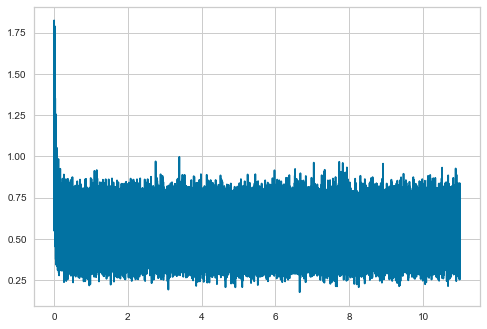

In [36]:
plt.plot(Epoch_x,Loss_y)

In [37]:
x_test = torch.from_numpy(x_test.astype(np.float32))
y_test = torch.from_numpy(y_test.astype(np.float32))

In [38]:
y_predict=[]
for xb in x_test:
    xb=xb.to(device)
    y_pred = model(xb.requires_grad_())
    y_1=y_pred.cpu().detach().numpy()
    y_predict.append(float(y_1))

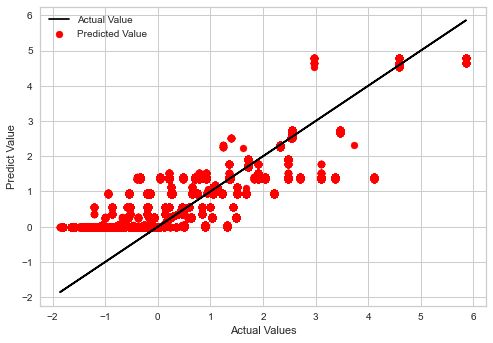

In [39]:
plt.plot(y_test,y_test,c="black",label="Actual Value")
plt.scatter(y_test,y_predict,c="red",label="Predicted Value")
plt.xlabel("Actual Values")
plt.ylabel("Predict Value")
plt.legend()

We can imporve the performance of nerual network by adding more feature like distance and reduce feature like to start date to month and year only.